In [1]:
#@title Runtime
use_tpu = False #@param

In [2]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import os
import tensorflow as tf
import urllib
from dataclasses import dataclass
import tensorflowjs as tfjs
# import tensorflow_decision_forests as tfdf
import json
from tqdm import tqdm
import seaborn as sns
np.random.seed(0)

In [3]:
urllib.request.urlretrieve(
    "https://github.com/ur-whitelab/peptide-dashboard/raw/master/ml/data/hemo-positive.npz",
    "positive.npz",
)
urllib.request.urlretrieve(
    "https://github.com/ur-whitelab/peptide-dashboard/raw/master/ml/data/hemo-negative.npz",
    "negative.npz",
)
with np.load("positive.npz") as r:
    pos_data = r[list(r.keys())[0]]
with np.load("negative.npz") as r:
    neg_data = r[list(r.keys())[0]]

# create labels and stich it all into one
# tensor
# labels = np.concatenate(
#     (
#         np.ones((pos_data.shape[0], 1), dtype=pos_data.dtype),
#         np.zeros((neg_data.shape[0], 1), dtype=pos_data.dtype),
#     ),
#     axis=0,
# )
# weights = np.concatenate(
#     (np.ones((pos_data.shape[0]), dtype=pos_data.dtype), 
#      weights)
# )
# features = np.concatenate((pos_data, neg_data), axis=0)
# pos_data_lengths = np.count_nonzero(pos_data, axis=1)
# neg_data_lengths = np.count_nonzero(neg_data, axis=1)

In [4]:
pos_data.shape

(1826, 190)

In [5]:
max_length = pos_data.shape[1]
def encoder(seq, max_length=200):
    alphabet = ['A','R','N','D','C','Q','E','G','H','I', 'L','K','M','F','P','S','T','W','Y','V']
    vec = np.zeros(max_length)
    for i,l in enumerate(seq):
        vec[i] = alphabet.index(l) + 1
    return vec
# sample unlabeled data
def sample_permutations_from_vec(data_lengths, labeled_unlabeled_ratio=0.2, max_sequence_length=200):
    alphabet = ['A','R','N','D','C','Q','E','G','H','I', 'L','K','M','F','P','S','T','W','Y','V']
    with open("../pdb_dist.txt", 'r') as f:
        # the probabilities in this file are sorted based on the alphabet list above
        pdb_dist = f.read().split()
        pdb_dist = [float(item) for item in pdb_dist]
#     unlabeled_seq_lengths = vec_pep_length(positive_data, ohe_vec=False)
#     print(unlabeled_seq_lengths)
    sampled_lengths = []
    for length in data_lengths:
        length_sample_batch = np.ones(int(1/labeled_unlabeled_ratio), dtype=int) * length
        sampled_lengths.append(length_sample_batch)
    sampled_lengths = np.array(sampled_lengths).flatten()
    sampled_sequences = []
    sampled_vecs = []
    for length in tqdm(sampled_lengths):
#         print(length)
    #         random_alphabet_index = np.random.randint(len(alphabet), size=length)
        # sample alphabet index based on weighted amino acid frequencies in pdb
        random_alphabet_index = np.random.choice(len(alphabet), size=length, p=pdb_dist)
        for _ in range(length):
            pep = ''.join([alphabet[m] for m in random_alphabet_index])
        vec_pep = encoder(pep, max_length=max_length)
        # pad zeros
    #     print(ohe_pep.shape)
#         ohe_pep = np.concatenate([ohe_pep, np.zeros((max_sequence_length-ohe_pep.shape[0],20))],axis=0)
        sampled_vecs.append(vec_pep)
        sampled_sequences.append(pep)
#     sampled_vecs = np.array(sampled_vecs)
    return sampled_sequences, sampled_vecs
# ohe_sequence_list = np.concatenate([ohe_sequence_list, np.zeros((190,10))],axis=1)
pos_data_lengths = np.count_nonzero(pos_data, axis=1) + 1
neg_data_lengths = np.count_nonzero(neg_data, axis=1) + 1
labeled_unlabeled_ratio = 0.2
sampled_sequences, sampled_vecs = sample_permutations_from_vec(pos_data_lengths,
                                                               labeled_unlabeled_ratio=0.2, max_sequence_length=max_length)
sampled_vecs = np.array(sampled_vecs)
# X_unlabeled = sampled_vecs
unlabeled_data_lengths = []
for seq in sampled_sequences:
    unlabeled_data_lengths.append(len(seq))

  0%|          | 0/9130 [00:00<?, ?it/s]

 10%|▉         | 880/9130 [00:00<00:00, 8798.71it/s]

 19%|█▊        | 1690/9130 [00:00<00:00, 8574.68it/s]

 29%|██▊       | 2620/9130 [00:00<00:00, 8778.85it/s]

 40%|███▉      | 3610/9130 [00:00<00:00, 9067.77it/s]

 49%|████▊     | 4430/9130 [00:00<00:00, 8788.38it/s]

 59%|█████▉    | 5386/9130 [00:00<00:00, 9006.28it/s]

 69%|██████▊   | 6268/9130 [00:00<00:00, 8948.79it/s]

 78%|███████▊  | 7162/9130 [00:00<00:00, 8945.90it/s]

 91%|█████████▏| 8337/9130 [00:00<00:00, 9635.02it/s]

100%|██████████| 9130/9130 [00:00<00:00, 9360.37it/s]

In [6]:
X_positive = pos_data
X_negative = neg_data
X_unlabeled = sampled_vecs
print('Positive data:', pos_data.shape[0])
print('Negative data:', neg_data.shape[0])
print('Sampled unlabeled data:', len(sampled_sequences))

Positive data: 1826
Negative data: 7490
Sampled unlabeled data: 9130


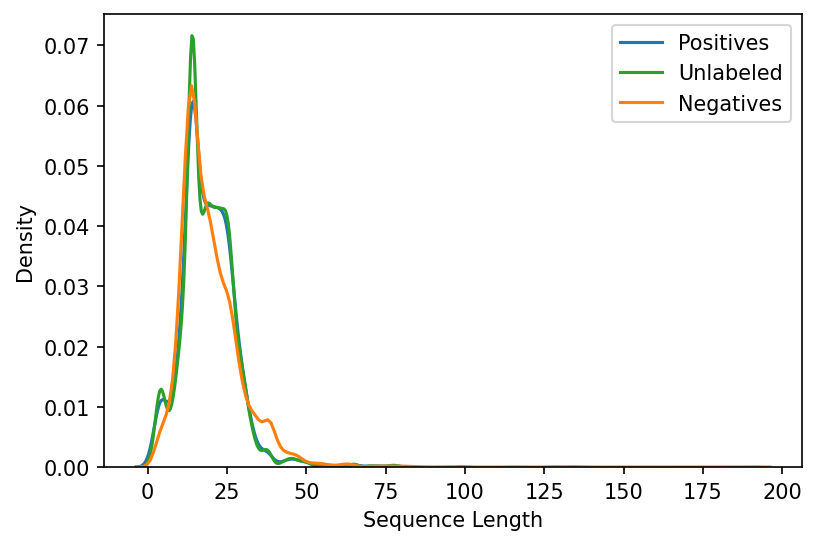

In [7]:
fig, ax = plt.subplots(dpi=150)
sns.kdeplot(pos_data_lengths, ax=ax, label='Positives', color='C0')
ax.set_xlabel('Sequence Length')
# ax.set_title(f'{peptide_label}')
sns.kdeplot(unlabeled_data_lengths, ax=ax, label='Unlabeled', color='C2')
sns.kdeplot(neg_data_lengths, ax=ax, label='Negatives', color='C1')
plt.legend()

In [8]:
def decoder(seq_vector):
  alphabet = ['A','R','N','D','C','Q','E','G','H','I', 'L','K','M','F','P','S','T','W','Y','V']
  seq = []
  for i, index in enumerate(seq_vector):
    if index == 0:
      break
    seq.append(alphabet[int(index)-1])
  seq = ''.join(seq)
  return seq
# need to decode postive and negative data to get UniRep representations
pos_sequences = []
for f in pos_data:
  pos_sequences.append(decoder(f))

neg_sequences = []
for f in neg_data:
  neg_sequences.append(decoder(f))

In [9]:
# Generating UniRep representations for postives, negatives and unlableled (This cell takes long to run)
from jax_unirep import get_reps
h_avg, h_final, c_final = get_reps(pos_sequences)
pos_UniRep = h_avg

h_avg, h_final, c_final = get_reps(neg_sequences)
neg_UniRep = h_avg

h_avg, h_final, c_final = get_reps(sampled_sequences)
unlabeled_UniRep = h_avg

/home/mgholiza/.conda/envs/covid-19/lib/python3.7/site-packages/jax/experimental/stax.py:30: FutureWarning: jax.experimental.stax is deprecated, import jax.example_libraries.stax instead
  FutureWarning)


/home/mgholiza/.conda/envs/covid-19/lib/python3.7/site-packages/jax/experimental/optimizers.py:30: FutureWarning: jax.experimental.optimizers is deprecated, import jax.example_libraries.optimizers instead
  FutureWarning)


In [10]:
# from sklearn.neighbors import LocalOutlierFactor
# from sklearn.model_selection import KFold
# from sklearn.metrics import f1_score
# from sklearn.metrics import recall_score
# kf = KFold(n_splits=5, random_state=None, shuffle=True)
# f1_scores = []
# recall_scores = []
# i = 0

# for train_index, test_index in kf.split(pos_UniRep):
#     X_train_positive_lof, X_test_positive_lof = pos_UniRep[train_index], pos_UniRep[test_index]
# #     s_train_positive_svm = np.ones(X_train_positive_svm.shape[0])
# #     s_test_positive_svm = y[train_index], y[test_index]
#     s_test_lof = np.ones(X_test_positive_lof.shape[0])
#     lof = LocalOutlierFactor(n_neighbors=64, algorithm='auto',
#                              metric='cosine', contamination=0.01,
#                              novelty=True, n_jobs=20, leaf_size=40)
#     lof.fit(X_train_positive_lof)
# #     X_validation_svm = np.concatenate([X_positive_test, X_unlabeled_test])

#     # Make prediction
#     s_pred = lof.predict(X_test_positive_lof)
#     f1 = f1_score(s_test_lof, s_pred, average='macro')
#     r = recall_score(s_test_lof, s_pred, average='macro')
#     print(f'Fold {i+1} - recall : {r:.3f}, f1 score : {f1:.3f}')
#     f1_scores.append(f1)
#     recall_scores.append(r)
#     i += 1
# #     break
# # lof_f1_score
# lof_f1_score = np.mean(f1_scores)
# lof_recall_score = np.mean(recall_scores)
# print(f'\nMean 5-Fold\n f1 score = {lof_f1_score:.3f}\n recall = {lof_recall_score:.3f}')

In [11]:
def mahalanobis_distance(x, data):
    data = np.unique(data, axis=0)
    x_minus_mu = x - np.mean(data, axis=0, keepdims=True)
    cov = np.cov(data.T)
    inv_covmat = np.linalg.pinv(cov)
    left_term = x_minus_mu @ inv_covmat
    mahal = left_term @ x_minus_mu.T
    return mahal.diagonal()
unlabeled_mahal_d = mahalanobis_distance(unlabeled_UniRep, pos_UniRep)
sorted_max_mahal_d_index = np.argsort(unlabeled_mahal_d)[::-1]
outlier_index = sorted_max_mahal_d_index[sorted_max_mahal_d_index[:100]]
initial_RNs = X_unlabeled[outlier_index]

In [12]:
# Shuffling data
shuffled_indices = np.random.permutation(len(pos_data))
X_positive = pos_data[shuffled_indices]
shuffled_indices = np.random.permutation(len(neg_data))
X_negative = neg_data[shuffled_indices]
# shuffled_indices = np.random.permutation(len(sampled_vecs))
# X_unlabeled = sampled_vecs[shuffled_indices]

In [13]:
@dataclass
class Config:
    vocab_size: int
    example_number: int
    batch_size: int
    buffer_size: int
    rnn_units: int
    hidden_dim: int
    embedding_dim: int
    reg_strength: float
    lr: float
    drop_rate: float
        
config = Config(vocab_size=21, # include gap
                example_number=len(X_positive), 
                batch_size=16, 
                buffer_size=10000,
                rnn_units=64,
                hidden_dim=64,
                embedding_dim=32,
                reg_strength=0,
                lr=1e-3,
                drop_rate=0.1
               )

def counts_aa(vec):
    counts =  tf.histogram_fixed_width(vec, [0, 20], nbins=21)[1:]
    return counts/tf.reduce_sum(counts)

def build_model(L):
    inputs = tf.keras.Input(shape=(L,))
    input_f = tf.keras.Input(shape=(20,))
    # make embedding and indicate that 0 should be treated as padding mask
    e = tf.keras.layers.Embedding(input_dim=config.vocab_size, 
                                        output_dim=config.embedding_dim,
                                        mask_zero=True)(inputs)

    # RNN layer
    x = tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(config.rnn_units, return_sequences=True))(e)
    x = tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(config.rnn_units))(x)
    x = tf.keras.layers.Concatenate()([x, input_f])
    x = tf.keras.layers.LayerNormalization()(x)
    x = tf.keras.layers.Dropout(config.drop_rate)(x)
    # a dense hidden layer
    x = tf.keras.layers.Dense(
        config.hidden_dim, 
        activation='relu', 
        kernel_regularizer=tf.keras.regularizers.l2(config.reg_strength))(x)
    x = tf.keras.layers.LayerNormalization()(x)
    x = tf.keras.layers.Dropout(config.drop_rate)(x)
    x = tf.keras.layers.Dense(
        config.hidden_dim // 4, 
        activation='relu', 
        kernel_regularizer=tf.keras.regularizers.l2(config.reg_strength))(x)
    x = tf.keras.layers.LayerNormalization()(x)
    x = tf.keras.layers.Dropout(config.drop_rate)(x)
    # predicting prob, so no activation
    yhat = tf.keras.layers.Dense(1)(x)

    model = tf.keras.Model(inputs=[inputs, input_f], outputs=yhat, name='hemo-rnn')
    return model

In [14]:
from sklearn.model_selection import train_test_split
X_train_positive, X_test_positive, y_train_positive, y_test_positive = train_test_split(X_positive, np.ones(X_positive.shape[0]),
                                                                                        test_size=0.2, random_state=42)

In [15]:
RNs = initial_RNs
down_sampled_X_train = X_train_positive[np.random.choice(X_train_positive.shape[0], size=RNs.shape[0], replace=False)]
X_train_with_RN = np.concatenate([X_train_positive, RNs])
counts_X_train_with_RN= np.array([counts_aa(xi) for xi in X_train_with_RN])
y_train_with_RN = np.concatenate([np.ones(X_train_positive.shape[0]), np.zeros(RNs.shape[0])])
shuffler = np.random.permutation(len(X_train_with_RN))
X_train_with_RN = X_train_with_RN[shuffler]
# counts_X_train_with_RN = counts_X_train_with_RN[shuffler]
y_train_with_RN = y_train_with_RN[shuffler]
X_test = np.concatenate([X_test_positive, X_negative])
y_test = np.concatenate([np.ones(y_test_positive.shape[0]), np.zeros(X_negative.shape[0])])
# removing intial RN seeds from unlabeled
# RU = np.delete(X_unlabeled, outlier_index[0],axis=0)
RU = X_unlabeled
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='loss', factor=0.9,
                                                        patience=5, min_lr=1e-7)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_auc', patience=5, min_delta=1e-2, restore_best_weights=True)
L = None
decay_epochs = 50
N = len(X_train_with_RN)
decay_steps = N  // config.batch_size * decay_epochs
lr_decayed_fn = tf.keras.optimizers.schedules.CosineDecay(
  config.lr, decay_steps, alpha=1e-3)
for i in tqdm(range(50)):
    tf.keras.backend.clear_session()
    model = build_model(L)
    model.compile(
            optimizer=tf.optimizers.Adam(lr_decayed_fn, clipnorm=1.0),
            loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
            metrics=[tf.keras.metrics.AUC(from_logits=True), tf.keras.metrics.BinaryAccuracy(threshold=0)],
            )
    history = model.fit(
        [X_train_with_RN, counts_X_train_with_RN] , y_train_with_RN,
        validation_data=([X_test, np.array([counts_aa(xi) for xi in X_test])] , y_test), 
        epochs=50,
        batch_size=16,
    #     batch_size=64,
    #     steps_per_epoch=100,
        # early_stopping
        callbacks=[reduce_lr, early_stopping],
        verbose=1,
    #         class_weight=class_weights
    )
    prob = model.predict([RU, np.array([counts_aa(xi) for xi in RU])])
    V = RU[np.argsort(prob[:,0])] 
#     break
#     print(f'Negatives found: {V.shape[0]}')
#     if V.shape[0] == 0:
#         print('All unlabeled were predicted as positive')
#         RNs = outlier_values
#         break
    # print(V.shape)
#     else:
        # print(RNs.shape)
#         n_downsample = V.shape[0] - X_train_positive_svm.shape[0]
#         print(RNs.shape) 
    if i == 0:
        RNs = np.empty(shape=(0, 200))

#     RNs = np.concatenate([RNs, V[:20*(i+1)]])
    RNs = V[:80*(i+1)]
#         RU = RU[:][np.squeeze(prob > 0.001)]
#     RU = np.delete(RU, np.argsort(prob[:,0])[:20*(i+1)], axis=0)
    print(f'Reliable negative size: {RNs.shape[0]}   Unlabeled size: {RU.shape[0]}')
    if RU.shape[0] == 0:
        print('All unlabeled were predicted as negative')
        break
    if RNs.shape[0] > X_train_positive.shape[0]:
        print('RNs size exceeded positives size')
        break
#         RNs = equalizer(X_train_positive_lof, RNs)
    down_sampled_X_train = X_train_positive[np.random.choice(X_train_positive.shape[0], size=RNs.shape[0], replace=False)]
    print(f'pos size: {down_sampled_X_train.shape[0]} RN size: {RNs.shape[0]}')
    X_train_with_RN = np.concatenate([X_train_positive, RNs])
    counts_X_train_with_RN = np.array([counts_aa(xi) for xi in X_train_with_RN])
    y_train_with_RN = np.concatenate([np.ones(X_train_positive.shape[0]), np.zeros(RNs.shape[0])])
    shuffler = np.random.permutation(len(X_train_with_RN))
    X_train_with_RN = X_train_with_RN[shuffler]
    counts_X_train_with_RN = counts_X_train_with_RN[shuffler]
    y_train_with_RN = y_train_with_RN[shuffler]

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1/50


 1/98 [..............................] - ETA: 17:59 - loss: 0.3816 - auc: 0.6250 - binary_accuracy: 0.8125

 2/98 [..............................] - ETA: 32s - loss: 0.2992 - auc: 0.7083 - binary_accuracy: 0.8750  

 3/98 [..............................] - ETA: 31s - loss: 0.2521 - auc: 0.7283 - binary_accuracy: 0.9167

 4/98 [>.............................] - ETA: 31s - loss: 0.2065 - auc: 0.7903 - binary_accuracy: 0.9375

 5/98 [>.............................] - ETA: 31s - loss: 0.2427 - auc: 0.6562 - binary_accuracy: 0.9250

 6/98 [>.............................] - ETA: 30s - loss: 0.2779 - auc: 0.5639 - binary_accuracy: 0.9167

 7/98 [=>............................] - ETA: 30s - loss: 0.2792 - auc: 0.5333 - binary_accuracy: 0.9196

 8/98 [=>............................] - ETA: 30s - loss: 0.2765 - auc: 0.5198 - binary_accuracy: 0.9219

 9/98 [=>............................] - ETA: 30s - loss: 0.2538 - auc: 0.5198 - binary_accuracy: 0.9306

10/98 [==>...........................] - ETA: 29s - loss: 0.2576 - auc: 0.4860 - binary_accuracy: 0.9312

11/98 [==>...........................] - ETA: 29s - loss: 0.2547 - auc: 0.5063 - binary_accuracy: 0.9318

12/98 [==>...........................] - ETA: 29s - loss: 0.2573 - auc: 0.4829 - binary_accuracy: 0.9323

13/98 [==>...........................] - ETA: 28s - loss: 0.2606 - auc: 0.4609 - binary_accuracy: 0.9327

14/98 [===>..........................] - ETA: 28s - loss: 0.2442 - auc: 0.4782 - binary_accuracy: 0.9375

15/98 [===>..........................] - ETA: 28s - loss: 0.2441 - auc: 0.4795 - binary_accuracy: 0.9375

16/98 [===>..........................] - ETA: 27s - loss: 0.2600 - auc: 0.4480 - binary_accuracy: 0.9336

17/98 [====>.........................] - ETA: 27s - loss: 0.2599 - auc: 0.4407 - binary_accuracy: 0.9338

18/98 [====>.........................] - ETA: 27s - loss: 0.2746 - auc: 0.4649 - binary_accuracy: 0.9271

19/98 [====>.........................] - ETA: 26s - loss: 0.2640 - auc: 0.4611 - binary_accuracy: 0.9309

20/98 [=====>........................] - ETA: 26s - loss: 0.2703 - auc: 0.4740 - binary_accuracy: 0.9281

21/98 [=====>........................] - ETA: 26s - loss: 0.2847 - auc: 0.4892 - binary_accuracy: 0.9226

22/98 [=====>........................] - ETA: 25s - loss: 0.2913 - auc: 0.4871 - binary_accuracy: 0.9205

23/98 [======>.......................] - ETA: 25s - loss: 0.2818 - auc: 0.4799 - binary_accuracy: 0.9239

24/98 [======>.......................] - ETA: 24s - loss: 0.2781 - auc: 0.4913 - binary_accuracy: 0.9245

25/98 [======>.......................] - ETA: 24s - loss: 0.2870 - auc: 0.4746 - binary_accuracy: 0.9225

26/98 [======>.......................] - ETA: 24s - loss: 0.2835 - auc: 0.4851 - binary_accuracy: 0.9231

27/98 [=======>......................] - ETA: 23s - loss: 0.2813 - auc: 0.4899 - binary_accuracy: 0.9236

28/98 [=======>......................] - ETA: 23s - loss: 0.2748 - auc: 0.4834 - binary_accuracy: 0.9263

29/98 [=======>......................] - ETA: 23s - loss: 0.2769 - auc: 0.5011 - binary_accuracy: 0.9246

30/98 [========>.....................] - ETA: 22s - loss: 0.2698 - auc: 0.4995 - binary_accuracy: 0.9271

31/98 [========>.....................] - ETA: 22s - loss: 0.2691 - auc: 0.5006 - binary_accuracy: 0.9274

32/98 [========>.....................] - ETA: 22s - loss: 0.2684 - auc: 0.4988 - binary_accuracy: 0.9277

33/98 [=========>....................] - ETA: 21s - loss: 0.2718 - auc: 0.5070 - binary_accuracy: 0.9261

34/98 [=========>....................] - ETA: 21s - loss: 0.2709 - auc: 0.5087 - binary_accuracy: 0.9265

35/98 [=========>....................] - ETA: 21s - loss: 0.2703 - auc: 0.5055 - binary_accuracy: 0.9268

36/98 [==========>...................] - ETA: 20s - loss: 0.2697 - auc: 0.5059 - binary_accuracy: 0.9271

37/98 [==========>...................] - ETA: 20s - loss: 0.2710 - auc: 0.5134 - binary_accuracy: 0.9257

38/98 [==========>...................] - ETA: 20s - loss: 0.2724 - auc: 0.5291 - binary_accuracy: 0.9243

39/98 [==========>...................] - ETA: 19s - loss: 0.2680 - auc: 0.5250 - binary_accuracy: 0.9263

40/98 [===========>..................] - ETA: 19s - loss: 0.2629 - auc: 0.5242 - binary_accuracy: 0.9281

41/98 [===========>..................] - ETA: 19s - loss: 0.2590 - auc: 0.5221 - binary_accuracy: 0.9299

42/98 [===========>..................] - ETA: 18s - loss: 0.2544 - auc: 0.5216 - binary_accuracy: 0.9315

43/98 [============>.................] - ETA: 18s - loss: 0.2508 - auc: 0.5184 - binary_accuracy: 0.9331

44/98 [============>.................] - ETA: 18s - loss: 0.2498 - auc: 0.5249 - binary_accuracy: 0.9332

45/98 [============>.................] - ETA: 17s - loss: 0.2640 - auc: 0.5239 - binary_accuracy: 0.9278

46/98 [=============>................] - ETA: 17s - loss: 0.2642 - auc: 0.5193 - binary_accuracy: 0.9280

47/98 [=============>................] - ETA: 17s - loss: 0.2627 - auc: 0.5281 - binary_accuracy: 0.9282

48/98 [=============>................] - ETA: 16s - loss: 0.2597 - auc: 0.5420 - binary_accuracy: 0.9284

49/98 [==============>...............] - ETA: 16s - loss: 0.2620 - auc: 0.5472 - binary_accuracy: 0.9273

50/98 [==============>...............] - ETA: 16s - loss: 0.2601 - auc: 0.5573 - binary_accuracy: 0.9275

51/98 [==============>...............] - ETA: 15s - loss: 0.2584 - auc: 0.5650 - binary_accuracy: 0.9277

52/98 [==============>...............] - ETA: 15s - loss: 0.2573 - auc: 0.5690 - binary_accuracy: 0.9279

53/98 [===============>..............] - ETA: 15s - loss: 0.2565 - auc: 0.5739 - binary_accuracy: 0.9281

54/98 [===============>..............] - ETA: 14s - loss: 0.2537 - auc: 0.5741 - binary_accuracy: 0.9294

55/98 [===============>..............] - ETA: 14s - loss: 0.2522 - auc: 0.5902 - binary_accuracy: 0.9295

56/98 [================>.............] - ETA: 14s - loss: 0.2526 - auc: 0.6037 - binary_accuracy: 0.9286

57/98 [================>.............] - ETA: 13s - loss: 0.2504 - auc: 0.6134 - binary_accuracy: 0.9287

58/98 [================>.............] - ETA: 13s - loss: 0.2496 - auc: 0.6276 - binary_accuracy: 0.9278

59/98 [=================>............] - ETA: 13s - loss: 0.2499 - auc: 0.6247 - binary_accuracy: 0.9280

60/98 [=================>............] - ETA: 12s - loss: 0.2514 - auc: 0.6335 - binary_accuracy: 0.9271

61/98 [=================>............] - ETA: 12s - loss: 0.2477 - auc: 0.6382 - binary_accuracy: 0.9283

62/98 [=================>............] - ETA: 12s - loss: 0.2443 - auc: 0.6416 - binary_accuracy: 0.9294

63/98 [==================>...........] - ETA: 11s - loss: 0.2436 - auc: 0.6521 - binary_accuracy: 0.9286

64/98 [==================>...........] - ETA: 11s - loss: 0.2436 - auc: 0.6620 - binary_accuracy: 0.9277

65/98 [==================>...........] - ETA: 11s - loss: 0.2433 - auc: 0.6728 - binary_accuracy: 0.9269

66/98 [===================>..........] - ETA: 10s - loss: 0.2445 - auc: 0.6813 - binary_accuracy: 0.9242

67/98 [===================>..........] - ETA: 10s - loss: 0.2426 - auc: 0.6872 - binary_accuracy: 0.9244

68/98 [===================>..........] - ETA: 10s - loss: 0.2395 - auc: 0.6899 - binary_accuracy: 0.9256

69/98 [====================>.........] - ETA: 9s - loss: 0.2376 - auc: 0.7036 - binary_accuracy: 0.9266 

70/98 [====================>.........] - ETA: 9s - loss: 0.2352 - auc: 0.7098 - binary_accuracy: 0.9277

71/98 [====================>.........] - ETA: 8s - loss: 0.2329 - auc: 0.7150 - binary_accuracy: 0.9287

72/98 [=====================>........] - ETA: 8s - loss: 0.2309 - auc: 0.7173 - binary_accuracy: 0.9288

73/98 [=====================>........] - ETA: 8s - loss: 0.2281 - auc: 0.7203 - binary_accuracy: 0.9298

74/98 [=====================>........] - ETA: 8s - loss: 0.2260 - auc: 0.7252 - binary_accuracy: 0.9307

75/98 [=====================>........] - ETA: 7s - loss: 0.2251 - auc: 0.7293 - binary_accuracy: 0.9308

76/98 [======================>.......] - ETA: 7s - loss: 0.2229 - auc: 0.7342 - binary_accuracy: 0.9317

77/98 [======================>.......] - ETA: 7s - loss: 0.2206 - auc: 0.7363 - binary_accuracy: 0.9326

78/98 [======================>.......] - ETA: 6s - loss: 0.2182 - auc: 0.7388 - binary_accuracy: 0.9335

79/98 [=======================>......] - ETA: 6s - loss: 0.2163 - auc: 0.7409 - binary_accuracy: 0.9335

80/98 [=======================>......] - ETA: 5s - loss: 0.2140 - auc: 0.7432 - binary_accuracy: 0.9344

81/98 [=======================>......] - ETA: 5s - loss: 0.2119 - auc: 0.7481 - binary_accuracy: 0.9352

82/98 [========================>.....] - ETA: 5s - loss: 0.2097 - auc: 0.7495 - binary_accuracy: 0.9360

83/98 [========================>.....] - ETA: 4s - loss: 0.2075 - auc: 0.7518 - binary_accuracy: 0.9367

84/98 [========================>.....] - ETA: 4s - loss: 0.2053 - auc: 0.7544 - binary_accuracy: 0.9375

85/98 [=========================>....] - ETA: 4s - loss: 0.2057 - auc: 0.7599 - binary_accuracy: 0.9368

86/98 [=========================>....] - ETA: 4s - loss: 0.2035 - auc: 0.7627 - binary_accuracy: 0.9375

87/98 [=========================>....] - ETA: 3s - loss: 0.2020 - auc: 0.7723 - binary_accuracy: 0.9382

88/98 [=========================>....] - ETA: 3s - loss: 0.1999 - auc: 0.7744 - binary_accuracy: 0.9389

89/98 [==========================>...] - ETA: 3s - loss: 0.1980 - auc: 0.7760 - binary_accuracy: 0.9396

90/98 [==========================>...] - ETA: 2s - loss: 0.1961 - auc: 0.7806 - binary_accuracy: 0.9403

91/98 [==========================>...] - ETA: 2s - loss: 0.1943 - auc: 0.7819 - binary_accuracy: 0.9409

92/98 [===========================>..] - ETA: 2s - loss: 0.1924 - auc: 0.7842 - binary_accuracy: 0.9416

93/98 [===========================>..] - ETA: 1s - loss: 0.1907 - auc: 0.7881 - binary_accuracy: 0.9422

94/98 [===========================>..] - ETA: 1s - loss: 0.1897 - auc: 0.7938 - binary_accuracy: 0.9422

95/98 [============================>.] - ETA: 0s - loss: 0.1879 - auc: 0.7956 - binary_accuracy: 0.9428

96/98 [============================>.] - ETA: 0s - loss: 0.1863 - auc: 0.7992 - binary_accuracy: 0.9434

97/98 [============================>.] - ETA: 0s - loss: 0.1848 - auc: 0.8064 - binary_accuracy: 0.9439

98/98 [==============================] - ETA: 0s - loss: 0.1854 - auc: 0.8067 - binary_accuracy: 0.9436

98/98 [==============================] - 72s 625ms/step - loss: 0.1854 - auc: 0.8067 - binary_accuracy: 0.9436 - val_loss: 3.9987 - val_auc: 0.5244 - val_binary_accuracy: 0.0734


Epoch 2/50


 1/98 [..............................] - ETA: 33s - loss: 0.0259 - auc: 1.0000 - binary_accuracy: 1.0000

 2/98 [..............................] - ETA: 31s - loss: 0.0213 - auc: 1.0000 - binary_accuracy: 1.0000

 3/98 [..............................] - ETA: 31s - loss: 0.0483 - auc: 1.0000 - binary_accuracy: 0.9792

 4/98 [>.............................] - ETA: 30s - loss: 0.0416 - auc: 1.0000 - binary_accuracy: 0.9844

 5/98 [>.............................] - ETA: 30s - loss: 0.0386 - auc: 1.0000 - binary_accuracy: 0.9875

 6/98 [>.............................] - ETA: 31s - loss: 0.0355 - auc: 1.0000 - binary_accuracy: 0.9896

 7/98 [=>............................] - ETA: 30s - loss: 0.0334 - auc: 1.0000 - binary_accuracy: 0.9911

 8/98 [=>............................] - ETA: 30s - loss: 0.0308 - auc: 1.0000 - binary_accuracy: 0.9922

 9/98 [=>............................] - ETA: 30s - loss: 0.0314 - auc: 1.0000 - binary_accuracy: 0.9931

10/98 [==>...........................] - ETA: 29s - loss: 0.0311 - auc: 1.0000 - binary_accuracy: 0.9937

11/98 [==>...........................] - ETA: 29s - loss: 0.0303 - auc: 1.0000 - binary_accuracy: 0.9943

12/98 [==>...........................] - ETA: 29s - loss: 0.0314 - auc: 1.0000 - binary_accuracy: 0.9948

13/98 [==>...........................] - ETA: 28s - loss: 0.0308 - auc: 1.0000 - binary_accuracy: 0.9952

14/98 [===>..........................] - ETA: 28s - loss: 0.0297 - auc: 1.0000 - binary_accuracy: 0.9955

15/98 [===>..........................] - ETA: 28s - loss: 0.0320 - auc: 0.9997 - binary_accuracy: 0.9958

16/98 [===>..........................] - ETA: 27s - loss: 0.0308 - auc: 0.9997 - binary_accuracy: 0.9961

17/98 [====>.........................] - ETA: 27s - loss: 0.0385 - auc: 0.9979 - binary_accuracy: 0.9926

18/98 [====>.........................] - ETA: 27s - loss: 0.0375 - auc: 0.9982 - binary_accuracy: 0.9931

19/98 [====>.........................] - ETA: 26s - loss: 0.0367 - auc: 0.9982 - binary_accuracy: 0.9934

20/98 [=====>........................] - ETA: 26s - loss: 0.0355 - auc: 0.9983 - binary_accuracy: 0.9937

21/98 [=====>........................] - ETA: 26s - loss: 0.0349 - auc: 0.9983 - binary_accuracy: 0.9940

22/98 [=====>........................] - ETA: 25s - loss: 0.0345 - auc: 0.9984 - binary_accuracy: 0.9943

23/98 [======>.......................] - ETA: 25s - loss: 0.0337 - auc: 0.9985 - binary_accuracy: 0.9946

24/98 [======>.......................] - ETA: 25s - loss: 0.0391 - auc: 0.9970 - binary_accuracy: 0.9922

25/98 [======>.......................] - ETA: 24s - loss: 0.0382 - auc: 0.9971 - binary_accuracy: 0.9925

26/98 [======>.......................] - ETA: 24s - loss: 0.0376 - auc: 0.9973 - binary_accuracy: 0.9928

27/98 [=======>......................] - ETA: 23s - loss: 0.0377 - auc: 0.9975 - binary_accuracy: 0.9931

28/98 [=======>......................] - ETA: 23s - loss: 0.0373 - auc: 0.9975 - binary_accuracy: 0.9933

29/98 [=======>......................] - ETA: 23s - loss: 0.0365 - auc: 0.9976 - binary_accuracy: 0.9935

30/98 [========>.....................] - ETA: 22s - loss: 0.0359 - auc: 0.9976 - binary_accuracy: 0.9937

31/98 [========>.....................] - ETA: 22s - loss: 0.0392 - auc: 0.9971 - binary_accuracy: 0.9919

32/98 [========>.....................] - ETA: 22s - loss: 0.0386 - auc: 0.9972 - binary_accuracy: 0.9922

33/98 [=========>....................] - ETA: 21s - loss: 0.0383 - auc: 0.9974 - binary_accuracy: 0.9924

34/98 [=========>....................] - ETA: 21s - loss: 0.0378 - auc: 0.9975 - binary_accuracy: 0.9926

35/98 [=========>....................] - ETA: 21s - loss: 0.0375 - auc: 0.9976 - binary_accuracy: 0.9929

36/98 [==========>...................] - ETA: 20s - loss: 0.0371 - auc: 0.9977 - binary_accuracy: 0.9931

37/98 [==========>...................] - ETA: 20s - loss: 0.0365 - auc: 0.9977 - binary_accuracy: 0.9932

38/98 [==========>...................] - ETA: 20s - loss: 0.0394 - auc: 0.9970 - binary_accuracy: 0.9918

39/98 [==========>...................] - ETA: 19s - loss: 0.0390 - auc: 0.9970 - binary_accuracy: 0.9920

40/98 [===========>..................] - ETA: 19s - loss: 0.0386 - auc: 0.9971 - binary_accuracy: 0.9922

41/98 [===========>..................] - ETA: 19s - loss: 0.0383 - auc: 0.9971 - binary_accuracy: 0.9924

42/98 [===========>..................] - ETA: 18s - loss: 0.0380 - auc: 0.9972 - binary_accuracy: 0.9926

43/98 [============>.................] - ETA: 18s - loss: 0.0375 - auc: 0.9972 - binary_accuracy: 0.9927

44/98 [============>.................] - ETA: 17s - loss: 0.0375 - auc: 0.9973 - binary_accuracy: 0.9929

45/98 [============>.................] - ETA: 17s - loss: 0.0380 - auc: 0.9973 - binary_accuracy: 0.9931

46/98 [=============>................] - ETA: 17s - loss: 0.0447 - auc: 0.9869 - binary_accuracy: 0.9905

47/98 [=============>................] - ETA: 16s - loss: 0.0443 - auc: 0.9875 - binary_accuracy: 0.9907

48/98 [=============>................] - ETA: 16s - loss: 0.0437 - auc: 0.9879 - binary_accuracy: 0.9909

49/98 [==============>...............] - ETA: 16s - loss: 0.0432 - auc: 0.9883 - binary_accuracy: 0.9911

50/98 [==============>...............] - ETA: 15s - loss: 0.0427 - auc: 0.9886 - binary_accuracy: 0.9912

51/98 [==============>...............] - ETA: 15s - loss: 0.0421 - auc: 0.9889 - binary_accuracy: 0.9914

52/98 [==============>...............] - ETA: 15s - loss: 0.0419 - auc: 0.9892 - binary_accuracy: 0.9916

53/98 [===============>..............] - ETA: 14s - loss: 0.0415 - auc: 0.9895 - binary_accuracy: 0.9917

54/98 [===============>..............] - ETA: 14s - loss: 0.0459 - auc: 0.9822 - binary_accuracy: 0.9907

55/98 [===============>..............] - ETA: 14s - loss: 0.0456 - auc: 0.9828 - binary_accuracy: 0.9909

56/98 [================>.............] - ETA: 13s - loss: 0.0450 - auc: 0.9833 - binary_accuracy: 0.9911

57/98 [================>.............] - ETA: 13s - loss: 0.0456 - auc: 0.9841 - binary_accuracy: 0.9901

58/98 [================>.............] - ETA: 13s - loss: 0.0450 - auc: 0.9842 - binary_accuracy: 0.9903

59/98 [=================>............] - ETA: 12s - loss: 0.0445 - auc: 0.9842 - binary_accuracy: 0.9905

60/98 [=================>............] - ETA: 12s - loss: 0.0442 - auc: 0.9847 - binary_accuracy: 0.9906

61/98 [=================>............] - ETA: 12s - loss: 0.0478 - auc: 0.9814 - binary_accuracy: 0.9898

62/98 [=================>............] - ETA: 11s - loss: 0.0496 - auc: 0.9823 - binary_accuracy: 0.9889

63/98 [==================>...........] - ETA: 11s - loss: 0.0490 - auc: 0.9823 - binary_accuracy: 0.9891

64/98 [==================>...........] - ETA: 11s - loss: 0.0510 - auc: 0.9823 - binary_accuracy: 0.9883

65/98 [==================>...........] - ETA: 10s - loss: 0.0530 - auc: 0.9821 - binary_accuracy: 0.9875

66/98 [===================>..........] - ETA: 10s - loss: 0.0526 - auc: 0.9827 - binary_accuracy: 0.9877

67/98 [===================>..........] - ETA: 10s - loss: 0.0521 - auc: 0.9831 - binary_accuracy: 0.9879

68/98 [===================>..........] - ETA: 9s - loss: 0.0514 - auc: 0.9833 - binary_accuracy: 0.9881 

69/98 [====================>.........] - ETA: 9s - loss: 0.0511 - auc: 0.9837 - binary_accuracy: 0.9882

70/98 [====================>.........] - ETA: 9s - loss: 0.0506 - auc: 0.9841 - binary_accuracy: 0.9884

71/98 [====================>.........] - ETA: 8s - loss: 0.0515 - auc: 0.9841 - binary_accuracy: 0.9877

72/98 [=====================>........] - ETA: 8s - loss: 0.0509 - auc: 0.9842 - binary_accuracy: 0.9878

73/98 [=====================>........] - ETA: 8s - loss: 0.0504 - auc: 0.9842 - binary_accuracy: 0.9880

74/98 [=====================>........] - ETA: 7s - loss: 0.0500 - auc: 0.9845 - binary_accuracy: 0.9882

75/98 [=====================>........] - ETA: 7s - loss: 0.0496 - auc: 0.9847 - binary_accuracy: 0.9883

76/98 [======================>.......] - ETA: 7s - loss: 0.0494 - auc: 0.9849 - binary_accuracy: 0.9885

77/98 [======================>.......] - ETA: 6s - loss: 0.0497 - auc: 0.9852 - binary_accuracy: 0.9878

78/98 [======================>.......] - ETA: 6s - loss: 0.0493 - auc: 0.9853 - binary_accuracy: 0.9880

79/98 [=======================>......] - ETA: 6s - loss: 0.0489 - auc: 0.9854 - binary_accuracy: 0.9881

80/98 [=======================>......] - ETA: 5s - loss: 0.0484 - auc: 0.9854 - binary_accuracy: 0.9883

81/98 [=======================>......] - ETA: 5s - loss: 0.0481 - auc: 0.9856 - binary_accuracy: 0.9884

82/98 [========================>.....] - ETA: 5s - loss: 0.0477 - auc: 0.9859 - binary_accuracy: 0.9886

83/98 [========================>.....] - ETA: 4s - loss: 0.0472 - auc: 0.9860 - binary_accuracy: 0.9887

84/98 [========================>.....] - ETA: 4s - loss: 0.0468 - auc: 0.9862 - binary_accuracy: 0.9888

85/98 [=========================>....] - ETA: 4s - loss: 0.0489 - auc: 0.9860 - binary_accuracy: 0.9882

86/98 [=========================>....] - ETA: 3s - loss: 0.0489 - auc: 0.9862 - binary_accuracy: 0.9884

87/98 [=========================>....] - ETA: 3s - loss: 0.0485 - auc: 0.9865 - binary_accuracy: 0.9885

88/98 [=========================>....] - ETA: 3s - loss: 0.0489 - auc: 0.9870 - binary_accuracy: 0.9879

89/98 [==========================>...] - ETA: 2s - loss: 0.0506 - auc: 0.9868 - binary_accuracy: 0.9874

90/98 [==========================>...] - ETA: 2s - loss: 0.0517 - auc: 0.9865 - binary_accuracy: 0.9868

91/98 [==========================>...] - ETA: 2s - loss: 0.0513 - auc: 0.9867 - binary_accuracy: 0.9870

92/98 [===========================>..] - ETA: 1s - loss: 0.0546 - auc: 0.9801 - binary_accuracy: 0.9864

93/98 [===========================>..] - ETA: 1s - loss: 0.0541 - auc: 0.9801 - binary_accuracy: 0.9866

94/98 [===========================>..] - ETA: 1s - loss: 0.0553 - auc: 0.9796 - binary_accuracy: 0.9860

95/98 [============================>.] - ETA: 0s - loss: 0.0548 - auc: 0.9799 - binary_accuracy: 0.9862

96/98 [============================>.] - ETA: 0s - loss: 0.0544 - auc: 0.9800 - binary_accuracy: 0.9863

97/98 [============================>.] - ETA: 0s - loss: 0.0575 - auc: 0.9709 - binary_accuracy: 0.9858

98/98 [==============================] - ETA: 0s - loss: 0.0572 - auc: 0.9710 - binary_accuracy: 0.9859

98/98 [==============================] - 58s 593ms/step - loss: 0.0572 - auc: 0.9710 - binary_accuracy: 0.9859 - val_loss: 4.7550 - val_auc: 0.5050 - val_binary_accuracy: 0.0568


Epoch 3/50


 1/98 [..............................] - ETA: 33s - loss: 0.0174 - auc: 1.0000 - binary_accuracy: 1.0000

 2/98 [..............................] - ETA: 31s - loss: 0.0135 - auc: 1.0000 - binary_accuracy: 1.0000

 3/98 [..............................] - ETA: 31s - loss: 0.0166 - auc: 1.0000 - binary_accuracy: 1.0000

 4/98 [>.............................] - ETA: 31s - loss: 0.0206 - auc: 1.0000 - binary_accuracy: 1.0000

 5/98 [>.............................] - ETA: 31s - loss: 0.0185 - auc: 1.0000 - binary_accuracy: 1.0000

 6/98 [>.............................] - ETA: 30s - loss: 0.0175 - auc: 1.0000 - binary_accuracy: 1.0000

 7/98 [=>............................] - ETA: 30s - loss: 0.0168 - auc: 1.0000 - binary_accuracy: 1.0000

 8/98 [=>............................] - ETA: 30s - loss: 0.0171 - auc: 1.0000 - binary_accuracy: 1.0000

 9/98 [=>............................] - ETA: 29s - loss: 0.0231 - auc: 1.0000 - binary_accuracy: 1.0000

10/98 [==>...........................] - ETA: 29s - loss: 0.0222 - auc: 1.0000 - binary_accuracy: 1.0000

11/98 [==>...........................] - ETA: 28s - loss: 0.0230 - auc: 1.0000 - binary_accuracy: 1.0000

12/98 [==>...........................] - ETA: 28s - loss: 0.0220 - auc: 1.0000 - binary_accuracy: 1.0000

13/98 [==>...........................] - ETA: 28s - loss: 0.0211 - auc: 1.0000 - binary_accuracy: 1.0000

14/98 [===>..........................] - ETA: 28s - loss: 0.0215 - auc: 1.0000 - binary_accuracy: 1.0000

15/98 [===>..........................] - ETA: 27s - loss: 0.0219 - auc: 1.0000 - binary_accuracy: 1.0000

16/98 [===>..........................] - ETA: 27s - loss: 0.0210 - auc: 1.0000 - binary_accuracy: 1.0000

17/98 [====>.........................] - ETA: 27s - loss: 0.0209 - auc: 1.0000 - binary_accuracy: 1.0000

18/98 [====>.........................] - ETA: 26s - loss: 0.0201 - auc: 1.0000 - binary_accuracy: 1.0000

19/98 [====>.........................] - ETA: 26s - loss: 0.0273 - auc: 0.9995 - binary_accuracy: 0.9967

20/98 [=====>........................] - ETA: 26s - loss: 0.0402 - auc: 0.9958 - binary_accuracy: 0.9937

21/98 [=====>........................] - ETA: 25s - loss: 0.0390 - auc: 0.9958 - binary_accuracy: 0.9940

22/98 [=====>........................] - ETA: 25s - loss: 0.0376 - auc: 0.9958 - binary_accuracy: 0.9943

23/98 [======>.......................] - ETA: 25s - loss: 0.0369 - auc: 0.9960 - binary_accuracy: 0.9946

24/98 [======>.......................] - ETA: 24s - loss: 0.0360 - auc: 0.9960 - binary_accuracy: 0.9948

25/98 [======>.......................] - ETA: 24s - loss: 0.0416 - auc: 0.9942 - binary_accuracy: 0.9925

26/98 [======>.......................] - ETA: 24s - loss: 0.0405 - auc: 0.9942 - binary_accuracy: 0.9928

27/98 [=======>......................] - ETA: 23s - loss: 0.0396 - auc: 0.9941 - binary_accuracy: 0.9931

28/98 [=======>......................] - ETA: 23s - loss: 0.0387 - auc: 0.9942 - binary_accuracy: 0.9933

29/98 [=======>......................] - ETA: 23s - loss: 0.0379 - auc: 0.9944 - binary_accuracy: 0.9935

30/98 [========>.....................] - ETA: 22s - loss: 0.0415 - auc: 0.9940 - binary_accuracy: 0.9917

31/98 [========>.....................] - ETA: 22s - loss: 0.0408 - auc: 0.9942 - binary_accuracy: 0.9919

32/98 [========>.....................] - ETA: 22s - loss: 0.0399 - auc: 0.9943 - binary_accuracy: 0.9922

33/98 [=========>....................] - ETA: 21s - loss: 0.0424 - auc: 0.9939 - binary_accuracy: 0.9905

34/98 [=========>....................] - ETA: 21s - loss: 0.0414 - auc: 0.9940 - binary_accuracy: 0.9908

35/98 [=========>....................] - ETA: 21s - loss: 0.0430 - auc: 0.9939 - binary_accuracy: 0.9893

36/98 [==========>...................] - ETA: 20s - loss: 0.0437 - auc: 0.9939 - binary_accuracy: 0.9878

37/98 [==========>...................] - ETA: 20s - loss: 0.0435 - auc: 0.9940 - binary_accuracy: 0.9882

38/98 [==========>...................] - ETA: 20s - loss: 0.0428 - auc: 0.9939 - binary_accuracy: 0.9885

39/98 [==========>...................] - ETA: 19s - loss: 0.0424 - auc: 0.9943 - binary_accuracy: 0.9888

40/98 [===========>..................] - ETA: 19s - loss: 0.0418 - auc: 0.9944 - binary_accuracy: 0.9891

41/98 [===========>..................] - ETA: 18s - loss: 0.0415 - auc: 0.9945 - binary_accuracy: 0.9893

42/98 [===========>..................] - ETA: 18s - loss: 0.0410 - auc: 0.9947 - binary_accuracy: 0.9896

43/98 [============>.................] - ETA: 18s - loss: 0.0404 - auc: 0.9949 - binary_accuracy: 0.9898

44/98 [============>.................] - ETA: 17s - loss: 0.0448 - auc: 0.9943 - binary_accuracy: 0.9886

45/98 [============>.................] - ETA: 17s - loss: 0.0452 - auc: 0.9944 - binary_accuracy: 0.9875

46/98 [=============>................] - ETA: 17s - loss: 0.0446 - auc: 0.9945 - binary_accuracy: 0.9878

47/98 [=============>................] - ETA: 16s - loss: 0.0441 - auc: 0.9946 - binary_accuracy: 0.9880

48/98 [=============>................] - ETA: 16s - loss: 0.0436 - auc: 0.9950 - binary_accuracy: 0.9883

49/98 [==============>...............] - ETA: 16s - loss: 0.0429 - auc: 0.9951 - binary_accuracy: 0.9885

50/98 [==============>...............] - ETA: 15s - loss: 0.0424 - auc: 0.9953 - binary_accuracy: 0.9887

51/98 [==============>...............] - ETA: 15s - loss: 0.0417 - auc: 0.9953 - binary_accuracy: 0.9890

52/98 [==============>...............] - ETA: 15s - loss: 0.0411 - auc: 0.9954 - binary_accuracy: 0.9892

53/98 [===============>..............] - ETA: 14s - loss: 0.0406 - auc: 0.9955 - binary_accuracy: 0.9894

54/98 [===============>..............] - ETA: 14s - loss: 0.0400 - auc: 0.9956 - binary_accuracy: 0.9896

55/98 [===============>..............] - ETA: 14s - loss: 0.0394 - auc: 0.9957 - binary_accuracy: 0.9898

56/98 [================>.............] - ETA: 13s - loss: 0.0388 - auc: 0.9958 - binary_accuracy: 0.9900

57/98 [================>.............] - ETA: 13s - loss: 0.0383 - auc: 0.9959 - binary_accuracy: 0.9901

58/98 [================>.............] - ETA: 13s - loss: 0.0379 - auc: 0.9959 - binary_accuracy: 0.9903

59/98 [=================>............] - ETA: 12s - loss: 0.0374 - auc: 0.9960 - binary_accuracy: 0.9905

60/98 [=================>............] - ETA: 12s - loss: 0.0381 - auc: 0.9960 - binary_accuracy: 0.9896

61/98 [=================>............] - ETA: 12s - loss: 0.0411 - auc: 0.9950 - binary_accuracy: 0.9887

62/98 [=================>............] - ETA: 11s - loss: 0.0406 - auc: 0.9951 - binary_accuracy: 0.9889

63/98 [==================>...........] - ETA: 11s - loss: 0.0403 - auc: 0.9952 - binary_accuracy: 0.9891

64/98 [==================>...........] - ETA: 11s - loss: 0.0398 - auc: 0.9952 - binary_accuracy: 0.9893

65/98 [==================>...........] - ETA: 10s - loss: 0.0395 - auc: 0.9953 - binary_accuracy: 0.9894

66/98 [===================>..........] - ETA: 10s - loss: 0.0404 - auc: 0.9953 - binary_accuracy: 0.9886

67/98 [===================>..........] - ETA: 10s - loss: 0.0412 - auc: 0.9953 - binary_accuracy: 0.9879

68/98 [===================>..........] - ETA: 9s - loss: 0.0407 - auc: 0.9953 - binary_accuracy: 0.9881 

69/98 [====================>.........] - ETA: 9s - loss: 0.0403 - auc: 0.9954 - binary_accuracy: 0.9882

70/98 [====================>.........] - ETA: 9s - loss: 0.0419 - auc: 0.9952 - binary_accuracy: 0.9875

71/98 [====================>.........] - ETA: 8s - loss: 0.0416 - auc: 0.9953 - binary_accuracy: 0.9877

72/98 [=====================>........] - ETA: 8s - loss: 0.0412 - auc: 0.9954 - binary_accuracy: 0.9878

73/98 [=====================>........] - ETA: 8s - loss: 0.0438 - auc: 0.9952 - binary_accuracy: 0.9872

74/98 [=====================>........] - ETA: 7s - loss: 0.0435 - auc: 0.9953 - binary_accuracy: 0.9873

75/98 [=====================>........] - ETA: 7s - loss: 0.0430 - auc: 0.9954 - binary_accuracy: 0.9875

76/98 [======================>.......] - ETA: 7s - loss: 0.0426 - auc: 0.9955 - binary_accuracy: 0.9877

77/98 [======================>.......] - ETA: 6s - loss: 0.0422 - auc: 0.9956 - binary_accuracy: 0.9878

78/98 [======================>.......] - ETA: 6s - loss: 0.0431 - auc: 0.9955 - binary_accuracy: 0.9872

79/98 [=======================>......] - ETA: 6s - loss: 0.0444 - auc: 0.9952 - binary_accuracy: 0.9866

80/98 [=======================>......] - ETA: 5s - loss: 0.0440 - auc: 0.9953 - binary_accuracy: 0.9867

81/98 [=======================>......] - ETA: 5s - loss: 0.0435 - auc: 0.9954 - binary_accuracy: 0.9869

82/98 [========================>.....] - ETA: 5s - loss: 0.0430 - auc: 0.9955 - binary_accuracy: 0.9870

83/98 [========================>.....] - ETA: 4s - loss: 0.0426 - auc: 0.9955 - binary_accuracy: 0.9872

84/98 [========================>.....] - ETA: 4s - loss: 0.0427 - auc: 0.9955 - binary_accuracy: 0.9874

85/98 [=========================>....] - ETA: 4s - loss: 0.0423 - auc: 0.9956 - binary_accuracy: 0.9875

86/98 [=========================>....] - ETA: 3s - loss: 0.0419 - auc: 0.9957 - binary_accuracy: 0.9876

87/98 [=========================>....] - ETA: 3s - loss: 0.0420 - auc: 0.9956 - binary_accuracy: 0.9878

88/98 [=========================>....] - ETA: 3s - loss: 0.0453 - auc: 0.9912 - binary_accuracy: 0.9872

89/98 [==========================>...] - ETA: 2s - loss: 0.0450 - auc: 0.9914 - binary_accuracy: 0.9874

90/98 [==========================>...] - ETA: 2s - loss: 0.0449 - auc: 0.9916 - binary_accuracy: 0.9875

91/98 [==========================>...] - ETA: 2s - loss: 0.0445 - auc: 0.9916 - binary_accuracy: 0.9876

92/98 [===========================>..] - ETA: 1s - loss: 0.0444 - auc: 0.9917 - binary_accuracy: 0.9878

93/98 [===========================>..] - ETA: 1s - loss: 0.0440 - auc: 0.9917 - binary_accuracy: 0.9879

94/98 [===========================>..] - ETA: 1s - loss: 0.0436 - auc: 0.9918 - binary_accuracy: 0.9880

95/98 [============================>.] - ETA: 0s - loss: 0.0434 - auc: 0.9919 - binary_accuracy: 0.9882

96/98 [============================>.] - ETA: 0s - loss: 0.0431 - auc: 0.9919 - binary_accuracy: 0.9883

97/98 [============================>.] - ETA: 0s - loss: 0.0429 - auc: 0.9919 - binary_accuracy: 0.9884

98/98 [==============================] - ETA: 0s - loss: 0.0456 - auc: 0.9902 - binary_accuracy: 0.9878

98/98 [==============================] - 58s 592ms/step - loss: 0.0456 - auc: 0.9902 - binary_accuracy: 0.9878 - val_loss: 4.8559 - val_auc: 0.5181 - val_binary_accuracy: 0.0603


Epoch 4/50


 1/98 [..............................] - ETA: 33s - loss: 0.0480 - auc: 1.0000 - binary_accuracy: 1.0000

 2/98 [..............................] - ETA: 31s - loss: 0.0820 - auc: 0.9926 - binary_accuracy: 0.9688

 3/98 [..............................] - ETA: 30s - loss: 0.0607 - auc: 0.9965 - binary_accuracy: 0.9792

 4/98 [>.............................] - ETA: 30s - loss: 0.0481 - auc: 0.9975 - binary_accuracy: 0.9844

 5/98 [>.............................] - ETA: 30s - loss: 0.0452 - auc: 0.9965 - binary_accuracy: 0.9875

 6/98 [>.............................] - ETA: 30s - loss: 0.0434 - auc: 0.9968 - binary_accuracy: 0.9896

 7/98 [=>............................] - ETA: 29s - loss: 0.0395 - auc: 0.9975 - binary_accuracy: 0.9911

 8/98 [=>............................] - ETA: 29s - loss: 0.0375 - auc: 0.9977 - binary_accuracy: 0.9922

 9/98 [=>............................] - ETA: 29s - loss: 0.0363 - auc: 0.9977 - binary_accuracy: 0.9931

10/98 [==>...........................] - ETA: 28s - loss: 0.0350 - auc: 0.9982 - binary_accuracy: 0.9937

11/98 [==>...........................] - ETA: 28s - loss: 0.0328 - auc: 0.9984 - binary_accuracy: 0.9943

12/98 [==>...........................] - ETA: 28s - loss: 0.0314 - auc: 0.9986 - binary_accuracy: 0.9948

13/98 [==>...........................] - ETA: 27s - loss: 0.0308 - auc: 0.9988 - binary_accuracy: 0.9952

14/98 [===>..........................] - ETA: 27s - loss: 0.0299 - auc: 0.9989 - binary_accuracy: 0.9955

15/98 [===>..........................] - ETA: 27s - loss: 0.0323 - auc: 0.9991 - binary_accuracy: 0.9917

16/98 [===>..........................] - ETA: 26s - loss: 0.0312 - auc: 0.9992 - binary_accuracy: 0.9922

17/98 [====>.........................] - ETA: 26s - loss: 0.0322 - auc: 0.9991 - binary_accuracy: 0.9926

18/98 [====>.........................] - ETA: 26s - loss: 0.0309 - auc: 0.9992 - binary_accuracy: 0.9931

19/98 [====>.........................] - ETA: 25s - loss: 0.0314 - auc: 0.9992 - binary_accuracy: 0.9934

20/98 [=====>........................] - ETA: 25s - loss: 0.0301 - auc: 0.9993 - binary_accuracy: 0.9937

21/98 [=====>........................] - ETA: 25s - loss: 0.0290 - auc: 0.9993 - binary_accuracy: 0.9940

22/98 [=====>........................] - ETA: 25s - loss: 0.0291 - auc: 0.9992 - binary_accuracy: 0.9943

23/98 [======>.......................] - ETA: 24s - loss: 0.0282 - auc: 0.9993 - binary_accuracy: 0.9946

24/98 [======>.......................] - ETA: 24s - loss: 0.0295 - auc: 0.9993 - binary_accuracy: 0.9922

25/98 [======>.......................] - ETA: 24s - loss: 0.0285 - auc: 0.9993 - binary_accuracy: 0.9925

26/98 [======>.......................] - ETA: 23s - loss: 0.0276 - auc: 0.9994 - binary_accuracy: 0.9928

27/98 [=======>......................] - ETA: 23s - loss: 0.0270 - auc: 0.9994 - binary_accuracy: 0.9931

28/98 [=======>......................] - ETA: 23s - loss: 0.0264 - auc: 0.9995 - binary_accuracy: 0.9933

29/98 [=======>......................] - ETA: 22s - loss: 0.0258 - auc: 0.9995 - binary_accuracy: 0.9935

30/98 [========>.....................] - ETA: 22s - loss: 0.0257 - auc: 0.9994 - binary_accuracy: 0.9937

31/98 [========>.....................] - ETA: 22s - loss: 0.0251 - auc: 0.9995 - binary_accuracy: 0.9940

32/98 [========>.....................] - ETA: 21s - loss: 0.0245 - auc: 0.9995 - binary_accuracy: 0.9941

33/98 [=========>....................] - ETA: 21s - loss: 0.0243 - auc: 0.9995 - binary_accuracy: 0.9943

34/98 [=========>....................] - ETA: 21s - loss: 0.0333 - auc: 0.9869 - binary_accuracy: 0.9926

35/98 [=========>....................] - ETA: 20s - loss: 0.0326 - auc: 0.9878 - binary_accuracy: 0.9929

36/98 [==========>...................] - ETA: 20s - loss: 0.0318 - auc: 0.9883 - binary_accuracy: 0.9931

37/98 [==========>...................] - ETA: 20s - loss: 0.0385 - auc: 0.9842 - binary_accuracy: 0.9916

38/98 [==========>...................] - ETA: 19s - loss: 0.0377 - auc: 0.9841 - binary_accuracy: 0.9918

39/98 [==========>...................] - ETA: 19s - loss: 0.0370 - auc: 0.9846 - binary_accuracy: 0.9920

40/98 [===========>..................] - ETA: 19s - loss: 0.0361 - auc: 0.9849 - binary_accuracy: 0.9922

41/98 [===========>..................] - ETA: 18s - loss: 0.0354 - auc: 0.9855 - binary_accuracy: 0.9924

42/98 [===========>..................] - ETA: 18s - loss: 0.0347 - auc: 0.9859 - binary_accuracy: 0.9926

43/98 [============>.................] - ETA: 18s - loss: 0.0347 - auc: 0.9859 - binary_accuracy: 0.9927

44/98 [============>.................] - ETA: 17s - loss: 0.0343 - auc: 0.9867 - binary_accuracy: 0.9929

45/98 [============>.................] - ETA: 17s - loss: 0.0336 - auc: 0.9869 - binary_accuracy: 0.9931

46/98 [=============>................] - ETA: 17s - loss: 0.0331 - auc: 0.9869 - binary_accuracy: 0.9932

47/98 [=============>................] - ETA: 16s - loss: 0.0408 - auc: 0.9703 - binary_accuracy: 0.9907

48/98 [=============>................] - ETA: 16s - loss: 0.0401 - auc: 0.9711 - binary_accuracy: 0.9909

49/98 [==============>...............] - ETA: 16s - loss: 0.0396 - auc: 0.9719 - binary_accuracy: 0.9911

50/98 [==============>...............] - ETA: 15s - loss: 0.0389 - auc: 0.9720 - binary_accuracy: 0.9912

51/98 [==============>...............] - ETA: 15s - loss: 0.0382 - auc: 0.9727 - binary_accuracy: 0.9914

52/98 [==============>...............] - ETA: 15s - loss: 0.0376 - auc: 0.9740 - binary_accuracy: 0.9916

53/98 [===============>..............] - ETA: 14s - loss: 0.0372 - auc: 0.9743 - binary_accuracy: 0.9917

54/98 [===============>..............] - ETA: 14s - loss: 0.0366 - auc: 0.9744 - binary_accuracy: 0.9919

55/98 [===============>..............] - ETA: 14s - loss: 0.0361 - auc: 0.9744 - binary_accuracy: 0.9920

56/98 [================>.............] - ETA: 13s - loss: 0.0356 - auc: 0.9758 - binary_accuracy: 0.9922

57/98 [================>.............] - ETA: 13s - loss: 0.0352 - auc: 0.9762 - binary_accuracy: 0.9923

58/98 [================>.............] - ETA: 13s - loss: 0.0347 - auc: 0.9763 - binary_accuracy: 0.9925

59/98 [=================>............] - ETA: 12s - loss: 0.0345 - auc: 0.9774 - binary_accuracy: 0.9926

60/98 [=================>............] - ETA: 12s - loss: 0.0341 - auc: 0.9778 - binary_accuracy: 0.9927

61/98 [=================>............] - ETA: 12s - loss: 0.0340 - auc: 0.9781 - binary_accuracy: 0.9928

62/98 [=================>............] - ETA: 11s - loss: 0.0336 - auc: 0.9780 - binary_accuracy: 0.9929

63/98 [==================>...........] - ETA: 11s - loss: 0.0334 - auc: 0.9783 - binary_accuracy: 0.9931

64/98 [==================>...........] - ETA: 11s - loss: 0.0330 - auc: 0.9789 - binary_accuracy: 0.9932

65/98 [==================>...........] - ETA: 10s - loss: 0.0327 - auc: 0.9793 - binary_accuracy: 0.9933

66/98 [===================>..........] - ETA: 10s - loss: 0.0334 - auc: 0.9798 - binary_accuracy: 0.9924

67/98 [===================>..........] - ETA: 10s - loss: 0.0371 - auc: 0.9793 - binary_accuracy: 0.9916

68/98 [===================>..........] - ETA: 9s - loss: 0.0367 - auc: 0.9800 - binary_accuracy: 0.9917 

69/98 [====================>.........] - ETA: 9s - loss: 0.0363 - auc: 0.9802 - binary_accuracy: 0.9918

70/98 [====================>.........] - ETA: 9s - loss: 0.0359 - auc: 0.9808 - binary_accuracy: 0.9920

71/98 [====================>.........] - ETA: 8s - loss: 0.0356 - auc: 0.9819 - binary_accuracy: 0.9921

72/98 [=====================>........] - ETA: 8s - loss: 0.0352 - auc: 0.9822 - binary_accuracy: 0.9922

73/98 [=====================>........] - ETA: 8s - loss: 0.0371 - auc: 0.9826 - binary_accuracy: 0.9914

74/98 [=====================>........] - ETA: 7s - loss: 0.0366 - auc: 0.9826 - binary_accuracy: 0.9916

75/98 [=====================>........] - ETA: 7s - loss: 0.0398 - auc: 0.9825 - binary_accuracy: 0.9900

76/98 [======================>.......] - ETA: 7s - loss: 0.0393 - auc: 0.9826 - binary_accuracy: 0.9901

77/98 [======================>.......] - ETA: 6s - loss: 0.0389 - auc: 0.9827 - binary_accuracy: 0.9903

78/98 [======================>.......] - ETA: 6s - loss: 0.0384 - auc: 0.9830 - binary_accuracy: 0.9904

79/98 [=======================>......] - ETA: 6s - loss: 0.0380 - auc: 0.9830 - binary_accuracy: 0.9905

80/98 [=======================>......] - ETA: 5s - loss: 0.0379 - auc: 0.9836 - binary_accuracy: 0.9906

81/98 [=======================>......] - ETA: 5s - loss: 0.0375 - auc: 0.9841 - binary_accuracy: 0.9907

82/98 [========================>.....] - ETA: 5s - loss: 0.0388 - auc: 0.9844 - binary_accuracy: 0.9901

83/98 [========================>.....] - ETA: 4s - loss: 0.0405 - auc: 0.9842 - binary_accuracy: 0.9895

84/98 [========================>.....] - ETA: 4s - loss: 0.0401 - auc: 0.9843 - binary_accuracy: 0.9896

85/98 [=========================>....] - ETA: 4s - loss: 0.0396 - auc: 0.9844 - binary_accuracy: 0.9897

86/98 [=========================>....] - ETA: 3s - loss: 0.0393 - auc: 0.9845 - binary_accuracy: 0.9898

87/98 [=========================>....] - ETA: 3s - loss: 0.0389 - auc: 0.9845 - binary_accuracy: 0.9899

88/98 [=========================>....] - ETA: 3s - loss: 0.0385 - auc: 0.9848 - binary_accuracy: 0.9901

89/98 [==========================>...] - ETA: 2s - loss: 0.0381 - auc: 0.9848 - binary_accuracy: 0.9902

90/98 [==========================>...] - ETA: 2s - loss: 0.0378 - auc: 0.9852 - binary_accuracy: 0.9903

91/98 [==========================>...] - ETA: 2s - loss: 0.0387 - auc: 0.9855 - binary_accuracy: 0.9897

92/98 [===========================>..] - ETA: 1s - loss: 0.0384 - auc: 0.9857 - binary_accuracy: 0.9898

93/98 [===========================>..] - ETA: 1s - loss: 0.0381 - auc: 0.9857 - binary_accuracy: 0.9899

94/98 [===========================>..] - ETA: 1s - loss: 0.0398 - auc: 0.9857 - binary_accuracy: 0.9894

95/98 [============================>.] - ETA: 0s - loss: 0.0394 - auc: 0.9858 - binary_accuracy: 0.9895

96/98 [============================>.] - ETA: 0s - loss: 0.0391 - auc: 0.9859 - binary_accuracy: 0.9896

97/98 [============================>.] - ETA: 0s - loss: 0.0388 - auc: 0.9861 - binary_accuracy: 0.9897

98/98 [==============================] - ETA: 0s - loss: 0.0387 - auc: 0.9861 - binary_accuracy: 0.9897

98/98 [==============================] - 58s 593ms/step - loss: 0.0387 - auc: 0.9861 - binary_accuracy: 0.9897 - val_loss: 5.4265 - val_auc: 0.5043 - val_binary_accuracy: 0.0531


Epoch 5/50


 1/98 [..............................] - ETA: 32s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 2/98 [..............................] - ETA: 31s - loss: 0.0163 - auc: 1.0000 - binary_accuracy: 1.0000

 3/98 [..............................] - ETA: 30s - loss: 0.0295 - auc: 1.0000 - binary_accuracy: 0.9792

 4/98 [>.............................] - ETA: 30s - loss: 0.0278 - auc: 1.0000 - binary_accuracy: 0.9844

 5/98 [>.............................] - ETA: 30s - loss: 0.0235 - auc: 1.0000 - binary_accuracy: 0.9875

 6/98 [>.............................] - ETA: 30s - loss: 0.0202 - auc: 1.0000 - binary_accuracy: 0.9896

 7/98 [=>............................] - ETA: 29s - loss: 0.0198 - auc: 1.0000 - binary_accuracy: 0.9911

 8/98 [=>............................] - ETA: 29s - loss: 0.0183 - auc: 1.0000 - binary_accuracy: 0.9922

 9/98 [=>............................] - ETA: 29s - loss: 0.0171 - auc: 1.0000 - binary_accuracy: 0.9931

10/98 [==>...........................] - ETA: 28s - loss: 0.0166 - auc: 1.0000 - binary_accuracy: 0.9937

11/98 [==>...........................] - ETA: 28s - loss: 0.0157 - auc: 1.0000 - binary_accuracy: 0.9943

12/98 [==>...........................] - ETA: 28s - loss: 0.0151 - auc: 1.0000 - binary_accuracy: 0.9948

13/98 [==>...........................] - ETA: 27s - loss: 0.0147 - auc: 1.0000 - binary_accuracy: 0.9952

14/98 [===>..........................] - ETA: 27s - loss: 0.0139 - auc: 1.0000 - binary_accuracy: 0.9955

15/98 [===>..........................] - ETA: 27s - loss: 0.0138 - auc: 1.0000 - binary_accuracy: 0.9958

16/98 [===>..........................] - ETA: 26s - loss: 0.0133 - auc: 1.0000 - binary_accuracy: 0.9961

17/98 [====>.........................] - ETA: 26s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 0.9963

18/98 [====>.........................] - ETA: 26s - loss: 0.0124 - auc: 1.0000 - binary_accuracy: 0.9965

19/98 [====>.........................] - ETA: 25s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9967

20/98 [=====>........................] - ETA: 25s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9969

21/98 [=====>........................] - ETA: 25s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9970

22/98 [=====>........................] - ETA: 24s - loss: 0.0112 - auc: 1.0000 - binary_accuracy: 0.9972

23/98 [======>.......................] - ETA: 24s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 0.9973

24/98 [======>.......................] - ETA: 24s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 0.9974

25/98 [======>.......................] - ETA: 23s - loss: 0.0109 - auc: 1.0000 - binary_accuracy: 0.9975

26/98 [======>.......................] - ETA: 23s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 0.9976

27/98 [=======>......................] - ETA: 23s - loss: 0.0104 - auc: 1.0000 - binary_accuracy: 0.9977

28/98 [=======>......................] - ETA: 23s - loss: 0.0103 - auc: 1.0000 - binary_accuracy: 0.9978

29/98 [=======>......................] - ETA: 22s - loss: 0.0180 - auc: 0.9985 - binary_accuracy: 0.9957

30/98 [========>.....................] - ETA: 22s - loss: 0.0176 - auc: 0.9986 - binary_accuracy: 0.9958

31/98 [========>.....................] - ETA: 22s - loss: 0.0175 - auc: 0.9986 - binary_accuracy: 0.9960

32/98 [========>.....................] - ETA: 21s - loss: 0.0172 - auc: 0.9987 - binary_accuracy: 0.9961

33/98 [=========>....................] - ETA: 21s - loss: 0.0258 - auc: 0.9906 - binary_accuracy: 0.9943

34/98 [=========>....................] - ETA: 21s - loss: 0.0252 - auc: 0.9909 - binary_accuracy: 0.9945

35/98 [=========>....................] - ETA: 20s - loss: 0.0246 - auc: 0.9911 - binary_accuracy: 0.9946

36/98 [==========>...................] - ETA: 20s - loss: 0.0242 - auc: 0.9917 - binary_accuracy: 0.9948

37/98 [==========>...................] - ETA: 20s - loss: 0.0237 - auc: 0.9920 - binary_accuracy: 0.9949

38/98 [==========>...................] - ETA: 19s - loss: 0.0236 - auc: 0.9925 - binary_accuracy: 0.9951

39/98 [==========>...................] - ETA: 19s - loss: 0.0233 - auc: 0.9928 - binary_accuracy: 0.9952

40/98 [===========>..................] - ETA: 19s - loss: 0.0229 - auc: 0.9931 - binary_accuracy: 0.9953

41/98 [===========>..................] - ETA: 18s - loss: 0.0238 - auc: 0.9929 - binary_accuracy: 0.9939

42/98 [===========>..................] - ETA: 18s - loss: 0.0234 - auc: 0.9931 - binary_accuracy: 0.9940

43/98 [============>.................] - ETA: 18s - loss: 0.0230 - auc: 0.9933 - binary_accuracy: 0.9942

44/98 [============>.................] - ETA: 17s - loss: 0.0228 - auc: 0.9937 - binary_accuracy: 0.9943

45/98 [============>.................] - ETA: 17s - loss: 0.0251 - auc: 0.9938 - binary_accuracy: 0.9931

46/98 [=============>................] - ETA: 17s - loss: 0.0249 - auc: 0.9941 - binary_accuracy: 0.9932

47/98 [=============>................] - ETA: 16s - loss: 0.0245 - auc: 0.9943 - binary_accuracy: 0.9934

48/98 [=============>................] - ETA: 16s - loss: 0.0242 - auc: 0.9944 - binary_accuracy: 0.9935

49/98 [==============>...............] - ETA: 16s - loss: 0.0238 - auc: 0.9944 - binary_accuracy: 0.9936

50/98 [==============>...............] - ETA: 15s - loss: 0.0285 - auc: 0.9941 - binary_accuracy: 0.9912

51/98 [==============>...............] - ETA: 15s - loss: 0.0281 - auc: 0.9943 - binary_accuracy: 0.9914

52/98 [==============>...............] - ETA: 15s - loss: 0.0277 - auc: 0.9944 - binary_accuracy: 0.9916

53/98 [===============>..............] - ETA: 14s - loss: 0.0277 - auc: 0.9946 - binary_accuracy: 0.9917

54/98 [===============>..............] - ETA: 14s - loss: 0.0309 - auc: 0.9940 - binary_accuracy: 0.9907

55/98 [===============>..............] - ETA: 14s - loss: 0.0304 - auc: 0.9940 - binary_accuracy: 0.9909

56/98 [================>.............] - ETA: 13s - loss: 0.0300 - auc: 0.9941 - binary_accuracy: 0.9911

57/98 [================>.............] - ETA: 13s - loss: 0.0296 - auc: 0.9942 - binary_accuracy: 0.9912

58/98 [================>.............] - ETA: 13s - loss: 0.0292 - auc: 0.9943 - binary_accuracy: 0.9914

59/98 [=================>............] - ETA: 12s - loss: 0.0291 - auc: 0.9944 - binary_accuracy: 0.9915

60/98 [=================>............] - ETA: 12s - loss: 0.0288 - auc: 0.9945 - binary_accuracy: 0.9917

61/98 [=================>............] - ETA: 12s - loss: 0.0287 - auc: 0.9946 - binary_accuracy: 0.9918

62/98 [=================>............] - ETA: 11s - loss: 0.0284 - auc: 0.9947 - binary_accuracy: 0.9919

63/98 [==================>...........] - ETA: 11s - loss: 0.0280 - auc: 0.9948 - binary_accuracy: 0.9921

64/98 [==================>...........] - ETA: 11s - loss: 0.0277 - auc: 0.9949 - binary_accuracy: 0.9922

65/98 [==================>...........] - ETA: 10s - loss: 0.0274 - auc: 0.9950 - binary_accuracy: 0.9923

66/98 [===================>..........] - ETA: 10s - loss: 0.0332 - auc: 0.9850 - binary_accuracy: 0.9915

67/98 [===================>..........] - ETA: 10s - loss: 0.0330 - auc: 0.9853 - binary_accuracy: 0.9916

68/98 [===================>..........] - ETA: 9s - loss: 0.0327 - auc: 0.9855 - binary_accuracy: 0.9917 

69/98 [====================>.........] - ETA: 9s - loss: 0.0325 - auc: 0.9857 - binary_accuracy: 0.9918

70/98 [====================>.........] - ETA: 9s - loss: 0.0322 - auc: 0.9859 - binary_accuracy: 0.9920

71/98 [====================>.........] - ETA: 8s - loss: 0.0319 - auc: 0.9861 - binary_accuracy: 0.9921

72/98 [=====================>........] - ETA: 8s - loss: 0.0316 - auc: 0.9863 - binary_accuracy: 0.9922

73/98 [=====================>........] - ETA: 8s - loss: 0.0315 - auc: 0.9868 - binary_accuracy: 0.9923

74/98 [=====================>........] - ETA: 7s - loss: 0.0318 - auc: 0.9872 - binary_accuracy: 0.9924

75/98 [=====================>........] - ETA: 7s - loss: 0.0315 - auc: 0.9872 - binary_accuracy: 0.9925

76/98 [======================>.......] - ETA: 7s - loss: 0.0312 - auc: 0.9873 - binary_accuracy: 0.9926

77/98 [======================>.......] - ETA: 6s - loss: 0.0308 - auc: 0.9873 - binary_accuracy: 0.9927

78/98 [======================>.......] - ETA: 6s - loss: 0.0305 - auc: 0.9873 - binary_accuracy: 0.9928

79/98 [=======================>......] - ETA: 6s - loss: 0.0303 - auc: 0.9874 - binary_accuracy: 0.9929

80/98 [=======================>......] - ETA: 5s - loss: 0.0302 - auc: 0.9874 - binary_accuracy: 0.9930

81/98 [=======================>......] - ETA: 5s - loss: 0.0299 - auc: 0.9876 - binary_accuracy: 0.9931

82/98 [========================>.....] - ETA: 5s - loss: 0.0297 - auc: 0.9879 - binary_accuracy: 0.9931

83/98 [========================>.....] - ETA: 4s - loss: 0.0294 - auc: 0.9879 - binary_accuracy: 0.9932

84/98 [========================>.....] - ETA: 4s - loss: 0.0291 - auc: 0.9881 - binary_accuracy: 0.9933

85/98 [=========================>....] - ETA: 4s - loss: 0.0295 - auc: 0.9885 - binary_accuracy: 0.9926

86/98 [=========================>....] - ETA: 3s - loss: 0.0296 - auc: 0.9887 - binary_accuracy: 0.9927

87/98 [=========================>....] - ETA: 3s - loss: 0.0294 - auc: 0.9889 - binary_accuracy: 0.9928

88/98 [=========================>....] - ETA: 3s - loss: 0.0295 - auc: 0.9891 - binary_accuracy: 0.9929

89/98 [==========================>...] - ETA: 2s - loss: 0.0293 - auc: 0.9893 - binary_accuracy: 0.9930

90/98 [==========================>...] - ETA: 2s - loss: 0.0291 - auc: 0.9893 - binary_accuracy: 0.9931

91/98 [==========================>...] - ETA: 2s - loss: 0.0301 - auc: 0.9893 - binary_accuracy: 0.9924

92/98 [===========================>..] - ETA: 1s - loss: 0.0298 - auc: 0.9894 - binary_accuracy: 0.9925

93/98 [===========================>..] - ETA: 1s - loss: 0.0298 - auc: 0.9898 - binary_accuracy: 0.9926

94/98 [===========================>..] - ETA: 1s - loss: 0.0304 - auc: 0.9898 - binary_accuracy: 0.9920

95/98 [============================>.] - ETA: 0s - loss: 0.0302 - auc: 0.9900 - binary_accuracy: 0.9921

96/98 [============================>.] - ETA: 0s - loss: 0.0299 - auc: 0.9901 - binary_accuracy: 0.9922

97/98 [============================>.] - ETA: 0s - loss: 0.0297 - auc: 0.9902 - binary_accuracy: 0.9923

98/98 [==============================] - ETA: 0s - loss: 0.0295 - auc: 0.9902 - binary_accuracy: 0.9923

98/98 [==============================] - 58s 591ms/step - loss: 0.0295 - auc: 0.9902 - binary_accuracy: 0.9923 - val_loss: 5.5148 - val_auc: 0.5103 - val_binary_accuracy: 0.0654


Epoch 6/50


 1/98 [..............................] - ETA: 33s - loss: 0.0559 - auc: 1.0000 - binary_accuracy: 0.9375

 2/98 [..............................] - ETA: 31s - loss: 0.0327 - auc: 1.0000 - binary_accuracy: 0.9688

 3/98 [..............................] - ETA: 31s - loss: 0.0254 - auc: 1.0000 - binary_accuracy: 0.9792

 4/98 [>.............................] - ETA: 30s - loss: 0.0212 - auc: 1.0000 - binary_accuracy: 0.9844

 5/98 [>.............................] - ETA: 30s - loss: 0.0180 - auc: 1.0000 - binary_accuracy: 0.9875

 6/98 [>.............................] - ETA: 30s - loss: 0.0155 - auc: 1.0000 - binary_accuracy: 0.9896

 7/98 [=>............................] - ETA: 29s - loss: 0.0620 - auc: 0.9237 - binary_accuracy: 0.9821

 8/98 [=>............................] - ETA: 29s - loss: 0.0549 - auc: 0.9332 - binary_accuracy: 0.9844

 9/98 [=>............................] - ETA: 29s - loss: 0.0495 - auc: 0.9396 - binary_accuracy: 0.9861

10/98 [==>...........................] - ETA: 28s - loss: 0.0460 - auc: 0.9502 - binary_accuracy: 0.9875

11/98 [==>...........................] - ETA: 28s - loss: 0.0423 - auc: 0.9545 - binary_accuracy: 0.9886

12/98 [==>...........................] - ETA: 28s - loss: 0.0394 - auc: 0.9579 - binary_accuracy: 0.9896

13/98 [==>...........................] - ETA: 27s - loss: 0.0368 - auc: 0.9606 - binary_accuracy: 0.9904

14/98 [===>..........................] - ETA: 27s - loss: 0.0348 - auc: 0.9650 - binary_accuracy: 0.9911

15/98 [===>..........................] - ETA: 27s - loss: 0.0330 - auc: 0.9668 - binary_accuracy: 0.9917

16/98 [===>..........................] - ETA: 26s - loss: 0.0316 - auc: 0.9701 - binary_accuracy: 0.9922

17/98 [====>.........................] - ETA: 26s - loss: 0.0302 - auc: 0.9715 - binary_accuracy: 0.9926

18/98 [====>.........................] - ETA: 26s - loss: 0.0290 - auc: 0.9724 - binary_accuracy: 0.9931

19/98 [====>.........................] - ETA: 25s - loss: 0.0286 - auc: 0.9735 - binary_accuracy: 0.9934

20/98 [=====>........................] - ETA: 25s - loss: 0.0275 - auc: 0.9735 - binary_accuracy: 0.9937

21/98 [=====>........................] - ETA: 25s - loss: 0.0264 - auc: 0.9734 - binary_accuracy: 0.9940

22/98 [=====>........................] - ETA: 24s - loss: 0.0254 - auc: 0.9733 - binary_accuracy: 0.9943

23/98 [======>.......................] - ETA: 24s - loss: 0.0247 - auc: 0.9746 - binary_accuracy: 0.9946

24/98 [======>.......................] - ETA: 24s - loss: 0.0246 - auc: 0.9766 - binary_accuracy: 0.9948

25/98 [======>.......................] - ETA: 23s - loss: 0.0238 - auc: 0.9776 - binary_accuracy: 0.9950

26/98 [======>.......................] - ETA: 23s - loss: 0.0231 - auc: 0.9791 - binary_accuracy: 0.9952

27/98 [=======>......................] - ETA: 23s - loss: 0.0333 - auc: 0.9759 - binary_accuracy: 0.9931

28/98 [=======>......................] - ETA: 22s - loss: 0.0323 - auc: 0.9759 - binary_accuracy: 0.9933

29/98 [=======>......................] - ETA: 22s - loss: 0.0313 - auc: 0.9756 - binary_accuracy: 0.9935

30/98 [========>.....................] - ETA: 22s - loss: 0.0304 - auc: 0.9758 - binary_accuracy: 0.9937

31/98 [========>.....................] - ETA: 21s - loss: 0.0330 - auc: 0.9762 - binary_accuracy: 0.9919

32/98 [========>.....................] - ETA: 21s - loss: 0.0321 - auc: 0.9769 - binary_accuracy: 0.9922

33/98 [=========>....................] - ETA: 21s - loss: 0.0314 - auc: 0.9769 - binary_accuracy: 0.9924

34/98 [=========>....................] - ETA: 20s - loss: 0.0306 - auc: 0.9768 - binary_accuracy: 0.9926

35/98 [=========>....................] - ETA: 20s - loss: 0.0300 - auc: 0.9771 - binary_accuracy: 0.9929

36/98 [==========>...................] - ETA: 20s - loss: 0.0294 - auc: 0.9789 - binary_accuracy: 0.9931

37/98 [==========>...................] - ETA: 19s - loss: 0.0335 - auc: 0.9788 - binary_accuracy: 0.9916

38/98 [==========>...................] - ETA: 19s - loss: 0.0328 - auc: 0.9787 - binary_accuracy: 0.9918

39/98 [==========>...................] - ETA: 19s - loss: 0.0322 - auc: 0.9789 - binary_accuracy: 0.9920

40/98 [===========>..................] - ETA: 18s - loss: 0.0319 - auc: 0.9793 - binary_accuracy: 0.9922

41/98 [===========>..................] - ETA: 18s - loss: 0.0359 - auc: 0.9784 - binary_accuracy: 0.9909

42/98 [===========>..................] - ETA: 18s - loss: 0.0352 - auc: 0.9783 - binary_accuracy: 0.9911

43/98 [============>.................] - ETA: 17s - loss: 0.0345 - auc: 0.9782 - binary_accuracy: 0.9913

44/98 [============>.................] - ETA: 17s - loss: 0.0383 - auc: 0.9772 - binary_accuracy: 0.9901

45/98 [============>.................] - ETA: 17s - loss: 0.0376 - auc: 0.9776 - binary_accuracy: 0.9903

46/98 [=============>................] - ETA: 17s - loss: 0.0370 - auc: 0.9786 - binary_accuracy: 0.9905

47/98 [=============>................] - ETA: 16s - loss: 0.0365 - auc: 0.9794 - binary_accuracy: 0.9907

48/98 [=============>................] - ETA: 16s - loss: 0.0359 - auc: 0.9798 - binary_accuracy: 0.9909

49/98 [==============>...............] - ETA: 16s - loss: 0.0355 - auc: 0.9805 - binary_accuracy: 0.9911

50/98 [==============>...............] - ETA: 15s - loss: 0.0362 - auc: 0.9811 - binary_accuracy: 0.9900

51/98 [==============>...............] - ETA: 15s - loss: 0.0356 - auc: 0.9816 - binary_accuracy: 0.9902

52/98 [==============>...............] - ETA: 15s - loss: 0.0350 - auc: 0.9816 - binary_accuracy: 0.9904

53/98 [===============>..............] - ETA: 14s - loss: 0.0345 - auc: 0.9823 - binary_accuracy: 0.9906

54/98 [===============>..............] - ETA: 14s - loss: 0.0340 - auc: 0.9827 - binary_accuracy: 0.9907

55/98 [===============>..............] - ETA: 14s - loss: 0.0366 - auc: 0.9826 - binary_accuracy: 0.9898

56/98 [================>.............] - ETA: 13s - loss: 0.0361 - auc: 0.9829 - binary_accuracy: 0.9900

57/98 [================>.............] - ETA: 13s - loss: 0.0356 - auc: 0.9830 - binary_accuracy: 0.9901

58/98 [================>.............] - ETA: 13s - loss: 0.0359 - auc: 0.9837 - binary_accuracy: 0.9903

59/98 [=================>............] - ETA: 12s - loss: 0.0354 - auc: 0.9837 - binary_accuracy: 0.9905

60/98 [=================>............] - ETA: 12s - loss: 0.0348 - auc: 0.9838 - binary_accuracy: 0.9906

61/98 [=================>............] - ETA: 12s - loss: 0.0345 - auc: 0.9846 - binary_accuracy: 0.9908

62/98 [=================>............] - ETA: 11s - loss: 0.0341 - auc: 0.9851 - binary_accuracy: 0.9909

63/98 [==================>...........] - ETA: 11s - loss: 0.0336 - auc: 0.9851 - binary_accuracy: 0.9911

64/98 [==================>...........] - ETA: 11s - loss: 0.0334 - auc: 0.9854 - binary_accuracy: 0.9912

65/98 [==================>...........] - ETA: 10s - loss: 0.0330 - auc: 0.9856 - binary_accuracy: 0.9913

66/98 [===================>..........] - ETA: 10s - loss: 0.0326 - auc: 0.9856 - binary_accuracy: 0.9915

67/98 [===================>..........] - ETA: 10s - loss: 0.0324 - auc: 0.9858 - binary_accuracy: 0.9916

68/98 [===================>..........] - ETA: 9s - loss: 0.0320 - auc: 0.9860 - binary_accuracy: 0.9917 

69/98 [====================>.........] - ETA: 9s - loss: 0.0318 - auc: 0.9865 - binary_accuracy: 0.9918

70/98 [====================>.........] - ETA: 9s - loss: 0.0314 - auc: 0.9867 - binary_accuracy: 0.9920

71/98 [====================>.........] - ETA: 8s - loss: 0.0310 - auc: 0.9868 - binary_accuracy: 0.9921

72/98 [=====================>........] - ETA: 8s - loss: 0.0307 - auc: 0.9869 - binary_accuracy: 0.9922

73/98 [=====================>........] - ETA: 8s - loss: 0.0304 - auc: 0.9872 - binary_accuracy: 0.9923

74/98 [=====================>........] - ETA: 7s - loss: 0.0301 - auc: 0.9874 - binary_accuracy: 0.9924

75/98 [=====================>........] - ETA: 7s - loss: 0.0297 - auc: 0.9876 - binary_accuracy: 0.9925

76/98 [======================>.......] - ETA: 7s - loss: 0.0294 - auc: 0.9879 - binary_accuracy: 0.9926

77/98 [======================>.......] - ETA: 6s - loss: 0.0293 - auc: 0.9880 - binary_accuracy: 0.9927

78/98 [======================>.......] - ETA: 6s - loss: 0.0290 - auc: 0.9883 - binary_accuracy: 0.9928

79/98 [=======================>......] - ETA: 6s - loss: 0.0287 - auc: 0.9883 - binary_accuracy: 0.9929

80/98 [=======================>......] - ETA: 5s - loss: 0.0284 - auc: 0.9883 - binary_accuracy: 0.9930

81/98 [=======================>......] - ETA: 5s - loss: 0.0281 - auc: 0.9884 - binary_accuracy: 0.9931

82/98 [========================>.....] - ETA: 5s - loss: 0.0284 - auc: 0.9886 - binary_accuracy: 0.9931

83/98 [========================>.....] - ETA: 4s - loss: 0.0297 - auc: 0.9887 - binary_accuracy: 0.9925

84/98 [========================>.....] - ETA: 4s - loss: 0.0294 - auc: 0.9887 - binary_accuracy: 0.9926

85/98 [=========================>....] - ETA: 4s - loss: 0.0291 - auc: 0.9889 - binary_accuracy: 0.9926

86/98 [=========================>....] - ETA: 3s - loss: 0.0289 - auc: 0.9893 - binary_accuracy: 0.9927

87/98 [=========================>....] - ETA: 3s - loss: 0.0286 - auc: 0.9893 - binary_accuracy: 0.9928

88/98 [=========================>....] - ETA: 3s - loss: 0.0283 - auc: 0.9895 - binary_accuracy: 0.9929

89/98 [==========================>...] - ETA: 2s - loss: 0.0281 - auc: 0.9897 - binary_accuracy: 0.9930

90/98 [==========================>...] - ETA: 2s - loss: 0.0278 - auc: 0.9897 - binary_accuracy: 0.9931

91/98 [==========================>...] - ETA: 2s - loss: 0.0276 - auc: 0.9899 - binary_accuracy: 0.9931

92/98 [===========================>..] - ETA: 1s - loss: 0.0274 - auc: 0.9902 - binary_accuracy: 0.9932

93/98 [===========================>..] - ETA: 1s - loss: 0.0273 - auc: 0.9904 - binary_accuracy: 0.9933

94/98 [===========================>..] - ETA: 1s - loss: 0.0272 - auc: 0.9906 - binary_accuracy: 0.9934

95/98 [============================>.] - ETA: 0s - loss: 0.0269 - auc: 0.9906 - binary_accuracy: 0.9934

96/98 [============================>.] - ETA: 0s - loss: 0.0269 - auc: 0.9907 - binary_accuracy: 0.9935

97/98 [============================>.] - ETA: 0s - loss: 0.0266 - auc: 0.9908 - binary_accuracy: 0.9936

98/98 [==============================] - ETA: 0s - loss: 0.0266 - auc: 0.9908 - binary_accuracy: 0.9936

98/98 [==============================] - 58s 591ms/step - loss: 0.0266 - auc: 0.9908 - binary_accuracy: 0.9936 - val_loss: 5.8691 - val_auc: 0.5071 - val_binary_accuracy: 0.0596


Epoch 7/50


 1/98 [..............................] - ETA: 32s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 1.0000

 2/98 [..............................] - ETA: 31s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 3/98 [..............................] - ETA: 31s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 1.0000

 4/98 [>.............................] - ETA: 30s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 1.0000

 5/98 [>.............................] - ETA: 30s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 1.0000

 6/98 [>.............................] - ETA: 30s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 1.0000

 7/98 [=>............................] - ETA: 29s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

 8/98 [=>............................] - ETA: 29s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 1.0000

 9/98 [=>............................] - ETA: 29s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

10/98 [==>...........................] - ETA: 29s - loss: 0.0407 - auc: 0.9621 - binary_accuracy: 0.9937

11/98 [==>...........................] - ETA: 28s - loss: 0.0376 - auc: 0.9646 - binary_accuracy: 0.9943

12/98 [==>...........................] - ETA: 28s - loss: 0.0551 - auc: 0.9600 - binary_accuracy: 0.9896

13/98 [==>...........................] - ETA: 27s - loss: 0.0511 - auc: 0.9627 - binary_accuracy: 0.9904

14/98 [===>..........................] - ETA: 27s - loss: 0.0481 - auc: 0.9676 - binary_accuracy: 0.9911

15/98 [===>..........................] - ETA: 27s - loss: 0.0454 - auc: 0.9688 - binary_accuracy: 0.9917

16/98 [===>..........................] - ETA: 26s - loss: 0.0432 - auc: 0.9734 - binary_accuracy: 0.9922

17/98 [====>.........................] - ETA: 26s - loss: 0.0408 - auc: 0.9736 - binary_accuracy: 0.9926

18/98 [====>.........................] - ETA: 26s - loss: 0.0388 - auc: 0.9756 - binary_accuracy: 0.9931

19/98 [====>.........................] - ETA: 25s - loss: 0.0369 - auc: 0.9758 - binary_accuracy: 0.9934

20/98 [=====>........................] - ETA: 25s - loss: 0.0355 - auc: 0.9767 - binary_accuracy: 0.9937

21/98 [=====>........................] - ETA: 25s - loss: 0.0340 - auc: 0.9769 - binary_accuracy: 0.9940

22/98 [=====>........................] - ETA: 24s - loss: 0.0331 - auc: 0.9783 - binary_accuracy: 0.9943

23/98 [======>.......................] - ETA: 24s - loss: 0.0320 - auc: 0.9789 - binary_accuracy: 0.9946

24/98 [======>.......................] - ETA: 24s - loss: 0.0308 - auc: 0.9790 - binary_accuracy: 0.9948

25/98 [======>.......................] - ETA: 23s - loss: 0.0367 - auc: 0.9794 - binary_accuracy: 0.9925

26/98 [======>.......................] - ETA: 23s - loss: 0.0355 - auc: 0.9806 - binary_accuracy: 0.9928

27/98 [=======>......................] - ETA: 23s - loss: 0.0343 - auc: 0.9807 - binary_accuracy: 0.9931

28/98 [=======>......................] - ETA: 22s - loss: 0.0331 - auc: 0.9809 - binary_accuracy: 0.9933

29/98 [=======>......................] - ETA: 22s - loss: 0.0323 - auc: 0.9818 - binary_accuracy: 0.9935

30/98 [========>.....................] - ETA: 22s - loss: 0.0314 - auc: 0.9822 - binary_accuracy: 0.9937

31/98 [========>.....................] - ETA: 21s - loss: 0.0305 - auc: 0.9823 - binary_accuracy: 0.9940

32/98 [========>.....................] - ETA: 21s - loss: 0.0298 - auc: 0.9828 - binary_accuracy: 0.9941

33/98 [=========>....................] - ETA: 21s - loss: 0.0291 - auc: 0.9836 - binary_accuracy: 0.9943

34/98 [=========>....................] - ETA: 20s - loss: 0.0284 - auc: 0.9840 - binary_accuracy: 0.9945

35/98 [=========>....................] - ETA: 20s - loss: 0.0277 - auc: 0.9844 - binary_accuracy: 0.9946

36/98 [==========>...................] - ETA: 20s - loss: 0.0270 - auc: 0.9849 - binary_accuracy: 0.9948

37/98 [==========>...................] - ETA: 19s - loss: 0.0337 - auc: 0.9846 - binary_accuracy: 0.9932

38/98 [==========>...................] - ETA: 19s - loss: 0.0416 - auc: 0.9825 - binary_accuracy: 0.9918

39/98 [==========>...................] - ETA: 19s - loss: 0.0407 - auc: 0.9825 - binary_accuracy: 0.9920

40/98 [===========>..................] - ETA: 18s - loss: 0.0398 - auc: 0.9828 - binary_accuracy: 0.9922

41/98 [===========>..................] - ETA: 18s - loss: 0.0393 - auc: 0.9835 - binary_accuracy: 0.9924

42/98 [===========>..................] - ETA: 18s - loss: 0.0385 - auc: 0.9833 - binary_accuracy: 0.9926

43/98 [============>.................] - ETA: 17s - loss: 0.0379 - auc: 0.9837 - binary_accuracy: 0.9927

44/98 [============>.................] - ETA: 17s - loss: 0.0371 - auc: 0.9838 - binary_accuracy: 0.9929

45/98 [============>.................] - ETA: 17s - loss: 0.0363 - auc: 0.9839 - binary_accuracy: 0.9931

46/98 [=============>................] - ETA: 17s - loss: 0.0356 - auc: 0.9839 - binary_accuracy: 0.9932

47/98 [=============>................] - ETA: 16s - loss: 0.0349 - auc: 0.9840 - binary_accuracy: 0.9934

48/98 [=============>................] - ETA: 16s - loss: 0.0343 - auc: 0.9841 - binary_accuracy: 0.9935

49/98 [==============>...............] - ETA: 16s - loss: 0.0340 - auc: 0.9844 - binary_accuracy: 0.9936

50/98 [==============>...............] - ETA: 15s - loss: 0.0334 - auc: 0.9844 - binary_accuracy: 0.9937

51/98 [==============>...............] - ETA: 15s - loss: 0.0329 - auc: 0.9849 - binary_accuracy: 0.9939

52/98 [==============>...............] - ETA: 15s - loss: 0.0323 - auc: 0.9852 - binary_accuracy: 0.9940

53/98 [===============>..............] - ETA: 14s - loss: 0.0378 - auc: 0.9851 - binary_accuracy: 0.9917

54/98 [===============>..............] - ETA: 14s - loss: 0.0372 - auc: 0.9854 - binary_accuracy: 0.9919

55/98 [===============>..............] - ETA: 14s - loss: 0.0367 - auc: 0.9856 - binary_accuracy: 0.9920

56/98 [================>.............] - ETA: 13s - loss: 0.0362 - auc: 0.9860 - binary_accuracy: 0.9922

57/98 [================>.............] - ETA: 13s - loss: 0.0357 - auc: 0.9862 - binary_accuracy: 0.9923

58/98 [================>.............] - ETA: 13s - loss: 0.0351 - auc: 0.9865 - binary_accuracy: 0.9925

59/98 [=================>............] - ETA: 12s - loss: 0.0346 - auc: 0.9865 - binary_accuracy: 0.9926

60/98 [=================>............] - ETA: 12s - loss: 0.0343 - auc: 0.9867 - binary_accuracy: 0.9927

61/98 [=================>............] - ETA: 12s - loss: 0.0338 - auc: 0.9870 - binary_accuracy: 0.9928

62/98 [=================>............] - ETA: 11s - loss: 0.0333 - auc: 0.9873 - binary_accuracy: 0.9929

63/98 [==================>...........] - ETA: 11s - loss: 0.0330 - auc: 0.9878 - binary_accuracy: 0.9931

64/98 [==================>...........] - ETA: 11s - loss: 0.0326 - auc: 0.9879 - binary_accuracy: 0.9932

65/98 [==================>...........] - ETA: 10s - loss: 0.0321 - auc: 0.9879 - binary_accuracy: 0.9933

66/98 [===================>..........] - ETA: 10s - loss: 0.0319 - auc: 0.9877 - binary_accuracy: 0.9934

67/98 [===================>..........] - ETA: 10s - loss: 0.0315 - auc: 0.9878 - binary_accuracy: 0.9935

68/98 [===================>..........] - ETA: 9s - loss: 0.0312 - auc: 0.9883 - binary_accuracy: 0.9936 

69/98 [====================>.........] - ETA: 9s - loss: 0.0308 - auc: 0.9886 - binary_accuracy: 0.9937

70/98 [====================>.........] - ETA: 9s - loss: 0.0304 - auc: 0.9887 - binary_accuracy: 0.9937

71/98 [====================>.........] - ETA: 8s - loss: 0.0302 - auc: 0.9890 - binary_accuracy: 0.9938

72/98 [=====================>........] - ETA: 8s - loss: 0.0298 - auc: 0.9891 - binary_accuracy: 0.9939

73/98 [=====================>........] - ETA: 8s - loss: 0.0309 - auc: 0.9892 - binary_accuracy: 0.9932

74/98 [=====================>........] - ETA: 7s - loss: 0.0307 - auc: 0.9893 - binary_accuracy: 0.9932

75/98 [=====================>........] - ETA: 7s - loss: 0.0303 - auc: 0.9897 - binary_accuracy: 0.9933

76/98 [======================>.......] - ETA: 7s - loss: 0.0300 - auc: 0.9898 - binary_accuracy: 0.9934

77/98 [======================>.......] - ETA: 6s - loss: 0.0297 - auc: 0.9898 - binary_accuracy: 0.9935

78/98 [======================>.......] - ETA: 6s - loss: 0.0293 - auc: 0.9899 - binary_accuracy: 0.9936

79/98 [=======================>......] - ETA: 6s - loss: 0.0290 - auc: 0.9899 - binary_accuracy: 0.9937

80/98 [=======================>......] - ETA: 5s - loss: 0.0287 - auc: 0.9900 - binary_accuracy: 0.9937

81/98 [=======================>......] - ETA: 5s - loss: 0.0284 - auc: 0.9900 - binary_accuracy: 0.9938

82/98 [========================>.....] - ETA: 5s - loss: 0.0281 - auc: 0.9900 - binary_accuracy: 0.9939

83/98 [========================>.....] - ETA: 4s - loss: 0.0279 - auc: 0.9901 - binary_accuracy: 0.9940

84/98 [========================>.....] - ETA: 4s - loss: 0.0276 - auc: 0.9901 - binary_accuracy: 0.9940

85/98 [=========================>....] - ETA: 4s - loss: 0.0273 - auc: 0.9901 - binary_accuracy: 0.9941

86/98 [=========================>....] - ETA: 3s - loss: 0.0291 - auc: 0.9901 - binary_accuracy: 0.9935

87/98 [=========================>....] - ETA: 3s - loss: 0.0326 - auc: 0.9904 - binary_accuracy: 0.9921

88/98 [=========================>....] - ETA: 3s - loss: 0.0323 - auc: 0.9904 - binary_accuracy: 0.9922

89/98 [==========================>...] - ETA: 2s - loss: 0.0326 - auc: 0.9907 - binary_accuracy: 0.9916

90/98 [==========================>...] - ETA: 2s - loss: 0.0323 - auc: 0.9907 - binary_accuracy: 0.9917

91/98 [==========================>...] - ETA: 2s - loss: 0.0319 - auc: 0.9907 - binary_accuracy: 0.9918

92/98 [===========================>..] - ETA: 1s - loss: 0.0317 - auc: 0.9907 - binary_accuracy: 0.9918

93/98 [===========================>..] - ETA: 1s - loss: 0.0314 - auc: 0.9909 - binary_accuracy: 0.9919

94/98 [===========================>..] - ETA: 1s - loss: 0.0311 - auc: 0.9909 - binary_accuracy: 0.9920

95/98 [============================>.] - ETA: 0s - loss: 0.0309 - auc: 0.9910 - binary_accuracy: 0.9921

96/98 [============================>.] - ETA: 0s - loss: 0.0334 - auc: 0.9908 - binary_accuracy: 0.9909

97/98 [============================>.] - ETA: 0s - loss: 0.0331 - auc: 0.9909 - binary_accuracy: 0.9910

98/98 [==============================] - ETA: 0s - loss: 0.0349 - auc: 0.9907 - binary_accuracy: 0.9904

98/98 [==============================] - 58s 590ms/step - loss: 0.0349 - auc: 0.9907 - binary_accuracy: 0.9904 - val_loss: 5.8104 - val_auc: 0.5111 - val_binary_accuracy: 0.0734


  2%|▏         | 1/50 [07:30<6:08:13, 450.89s/it]

Reliable negative size: 80   Unlabeled size: 9130
pos size: 80 RN size: 80


Epoch 1/50


 1/97 [..............................] - ETA: 17:18 - loss: 1.2654 - auc: 0.0000e+00 - binary_accuracy: 0.3125

 2/97 [..............................] - ETA: 31s - loss: 1.0051 - auc: 0.2051 - binary_accuracy: 0.4688      

 3/97 [..............................] - ETA: 31s - loss: 0.9172 - auc: 0.2648 - binary_accuracy: 0.5417

 4/97 [>.............................] - ETA: 30s - loss: 0.8245 - auc: 0.3281 - binary_accuracy: 0.6094

 5/97 [>.............................] - ETA: 30s - loss: 0.7228 - auc: 0.3950 - binary_accuracy: 0.6625

 6/97 [>.............................] - ETA: 30s - loss: 0.6396 - auc: 0.4581 - binary_accuracy: 0.7083

 7/97 [=>............................] - ETA: 30s - loss: 0.5646 - auc: 0.5475 - binary_accuracy: 0.7411

 8/97 [=>............................] - ETA: 30s - loss: 0.5045 - auc: 0.5976 - binary_accuracy: 0.7734

 9/97 [=>............................] - ETA: 29s - loss: 0.4583 - auc: 0.6567 - binary_accuracy: 0.7917

10/97 [==>...........................] - ETA: 29s - loss: 0.4253 - auc: 0.6867 - binary_accuracy: 0.8062

11/97 [==>...........................] - ETA: 29s - loss: 0.3912 - auc: 0.7154 - binary_accuracy: 0.8239

12/97 [==>...........................] - ETA: 28s - loss: 0.3739 - auc: 0.7282 - binary_accuracy: 0.8281

13/97 [===>..........................] - ETA: 28s - loss: 0.3469 - auc: 0.7504 - binary_accuracy: 0.8413

14/97 [===>..........................] - ETA: 28s - loss: 0.3244 - auc: 0.7685 - binary_accuracy: 0.8527

15/97 [===>..........................] - ETA: 27s - loss: 0.3368 - auc: 0.7027 - binary_accuracy: 0.8542

16/97 [===>..........................] - ETA: 27s - loss: 0.3177 - auc: 0.7189 - binary_accuracy: 0.8633

17/97 [====>.........................] - ETA: 27s - loss: 0.3192 - auc: 0.7177 - binary_accuracy: 0.8640

18/97 [====>.........................] - ETA: 26s - loss: 0.3043 - auc: 0.7258 - binary_accuracy: 0.8715

19/97 [====>.........................] - ETA: 26s - loss: 0.3012 - auc: 0.7509 - binary_accuracy: 0.8684

20/97 [=====>........................] - ETA: 26s - loss: 0.2888 - auc: 0.7587 - binary_accuracy: 0.8750

21/97 [=====>........................] - ETA: 25s - loss: 0.2846 - auc: 0.7606 - binary_accuracy: 0.8780

22/97 [=====>........................] - ETA: 25s - loss: 0.2841 - auc: 0.7513 - binary_accuracy: 0.8807

23/97 [======>.......................] - ETA: 25s - loss: 0.2749 - auc: 0.7552 - binary_accuracy: 0.8859

24/97 [======>.......................] - ETA: 24s - loss: 0.2685 - auc: 0.7757 - binary_accuracy: 0.8880

25/97 [======>.......................] - ETA: 24s - loss: 0.2598 - auc: 0.7803 - binary_accuracy: 0.8925

26/97 [=======>......................] - ETA: 23s - loss: 0.2524 - auc: 0.7838 - binary_accuracy: 0.8966

27/97 [=======>......................] - ETA: 23s - loss: 0.2446 - auc: 0.7885 - binary_accuracy: 0.9005

28/97 [=======>......................] - ETA: 23s - loss: 0.2428 - auc: 0.7905 - binary_accuracy: 0.9018

29/97 [=======>......................] - ETA: 22s - loss: 0.2352 - auc: 0.7969 - binary_accuracy: 0.9052

30/97 [========>.....................] - ETA: 22s - loss: 0.2313 - auc: 0.8047 - binary_accuracy: 0.9062

31/97 [========>.....................] - ETA: 22s - loss: 0.2304 - auc: 0.8210 - binary_accuracy: 0.9032

32/97 [========>.....................] - ETA: 21s - loss: 0.2240 - auc: 0.8258 - binary_accuracy: 0.9062

33/97 [=========>....................] - ETA: 21s - loss: 0.2244 - auc: 0.8321 - binary_accuracy: 0.9053

34/97 [=========>....................] - ETA: 21s - loss: 0.2253 - auc: 0.8461 - binary_accuracy: 0.9026

35/97 [=========>....................] - ETA: 20s - loss: 0.2196 - auc: 0.8500 - binary_accuracy: 0.9054

36/97 [==========>...................] - ETA: 20s - loss: 0.2153 - auc: 0.8560 - binary_accuracy: 0.9080

37/97 [==========>...................] - ETA: 20s - loss: 0.2106 - auc: 0.8588 - binary_accuracy: 0.9105

38/97 [==========>...................] - ETA: 19s - loss: 0.2095 - auc: 0.8646 - binary_accuracy: 0.9095

39/97 [===========>..................] - ETA: 19s - loss: 0.2069 - auc: 0.8715 - binary_accuracy: 0.9119

40/97 [===========>..................] - ETA: 19s - loss: 0.2026 - auc: 0.8739 - binary_accuracy: 0.9141

41/97 [===========>..................] - ETA: 18s - loss: 0.1982 - auc: 0.8766 - binary_accuracy: 0.9162

42/97 [===========>..................] - ETA: 18s - loss: 0.1941 - auc: 0.8790 - binary_accuracy: 0.9182

43/97 [============>.................] - ETA: 18s - loss: 0.1901 - auc: 0.8814 - binary_accuracy: 0.9201

44/97 [============>.................] - ETA: 17s - loss: 0.1875 - auc: 0.8881 - binary_accuracy: 0.9219

45/97 [============>.................] - ETA: 17s - loss: 0.1845 - auc: 0.8948 - binary_accuracy: 0.9236

46/97 [=============>................] - ETA: 17s - loss: 0.1812 - auc: 0.8965 - binary_accuracy: 0.9253

47/97 [=============>................] - ETA: 16s - loss: 0.1779 - auc: 0.9006 - binary_accuracy: 0.9269

48/97 [=============>................] - ETA: 16s - loss: 0.1744 - auc: 0.9027 - binary_accuracy: 0.9284

49/97 [==============>...............] - ETA: 16s - loss: 0.1711 - auc: 0.9047 - binary_accuracy: 0.9298

50/97 [==============>...............] - ETA: 15s - loss: 0.1679 - auc: 0.9066 - binary_accuracy: 0.9312

51/97 [==============>...............] - ETA: 15s - loss: 0.1651 - auc: 0.9080 - binary_accuracy: 0.9326

52/97 [===============>..............] - ETA: 15s - loss: 0.1626 - auc: 0.9113 - binary_accuracy: 0.9339

53/97 [===============>..............] - ETA: 14s - loss: 0.1598 - auc: 0.9129 - binary_accuracy: 0.9351

54/97 [===============>..............] - ETA: 14s - loss: 0.1577 - auc: 0.9158 - binary_accuracy: 0.9363

55/97 [================>.............] - ETA: 13s - loss: 0.1555 - auc: 0.9185 - binary_accuracy: 0.9375

56/97 [================>.............] - ETA: 13s - loss: 0.1536 - auc: 0.9211 - binary_accuracy: 0.9386

57/97 [================>.............] - ETA: 13s - loss: 0.1510 - auc: 0.9225 - binary_accuracy: 0.9397

58/97 [================>.............] - ETA: 12s - loss: 0.1491 - auc: 0.9264 - binary_accuracy: 0.9407

59/97 [=================>............] - ETA: 12s - loss: 0.1467 - auc: 0.9276 - binary_accuracy: 0.9417

60/97 [=================>............] - ETA: 12s - loss: 0.1451 - auc: 0.9309 - binary_accuracy: 0.9427

61/97 [=================>............] - ETA: 11s - loss: 0.1430 - auc: 0.9332 - binary_accuracy: 0.9436

62/97 [==================>...........] - ETA: 11s - loss: 0.1410 - auc: 0.9342 - binary_accuracy: 0.9446

63/97 [==================>...........] - ETA: 11s - loss: 0.1412 - auc: 0.9338 - binary_accuracy: 0.9444

64/97 [==================>...........] - ETA: 10s - loss: 0.1394 - auc: 0.9358 - binary_accuracy: 0.9453

65/97 [===================>..........] - ETA: 10s - loss: 0.1377 - auc: 0.9387 - binary_accuracy: 0.9462

66/97 [===================>..........] - ETA: 10s - loss: 0.1358 - auc: 0.9396 - binary_accuracy: 0.9470

67/97 [===================>..........] - ETA: 9s - loss: 0.1345 - auc: 0.9412 - binary_accuracy: 0.9478 

68/97 [====================>.........] - ETA: 9s - loss: 0.1331 - auc: 0.9435 - binary_accuracy: 0.9485

69/97 [====================>.........] - ETA: 9s - loss: 0.1313 - auc: 0.9444 - binary_accuracy: 0.9493

70/97 [====================>.........] - ETA: 8s - loss: 0.1301 - auc: 0.9474 - binary_accuracy: 0.9500

71/97 [====================>.........] - ETA: 8s - loss: 0.1297 - auc: 0.9479 - binary_accuracy: 0.9498

72/97 [=====================>........] - ETA: 8s - loss: 0.1283 - auc: 0.9492 - binary_accuracy: 0.9505

73/97 [=====================>........] - ETA: 7s - loss: 0.1270 - auc: 0.9504 - binary_accuracy: 0.9512

74/97 [=====================>........] - ETA: 7s - loss: 0.1255 - auc: 0.9517 - binary_accuracy: 0.9519

75/97 [======================>.......] - ETA: 7s - loss: 0.1240 - auc: 0.9522 - binary_accuracy: 0.9525

76/97 [======================>.......] - ETA: 6s - loss: 0.1225 - auc: 0.9529 - binary_accuracy: 0.9531

77/97 [======================>.......] - ETA: 6s - loss: 0.1210 - auc: 0.9535 - binary_accuracy: 0.9537

78/97 [=======================>......] - ETA: 6s - loss: 0.1195 - auc: 0.9541 - binary_accuracy: 0.9543

79/97 [=======================>......] - ETA: 5s - loss: 0.1186 - auc: 0.9563 - binary_accuracy: 0.9549

80/97 [=======================>......] - ETA: 5s - loss: 0.1174 - auc: 0.9567 - binary_accuracy: 0.9555

81/97 [========================>.....] - ETA: 5s - loss: 0.1166 - auc: 0.9575 - binary_accuracy: 0.9560

82/97 [========================>.....] - ETA: 4s - loss: 0.1153 - auc: 0.9580 - binary_accuracy: 0.9566

83/97 [========================>.....] - ETA: 4s - loss: 0.1140 - auc: 0.9586 - binary_accuracy: 0.9571

84/97 [========================>.....] - ETA: 4s - loss: 0.1132 - auc: 0.9593 - binary_accuracy: 0.9576

85/97 [=========================>....] - ETA: 3s - loss: 0.1119 - auc: 0.9598 - binary_accuracy: 0.9581

86/97 [=========================>....] - ETA: 3s - loss: 0.1109 - auc: 0.9607 - binary_accuracy: 0.9586

87/97 [=========================>....] - ETA: 3s - loss: 0.1101 - auc: 0.9629 - binary_accuracy: 0.9591

88/97 [==========================>...] - ETA: 2s - loss: 0.1091 - auc: 0.9637 - binary_accuracy: 0.9595

89/97 [==========================>...] - ETA: 2s - loss: 0.1080 - auc: 0.9641 - binary_accuracy: 0.9600

90/97 [==========================>...] - ETA: 2s - loss: 0.1070 - auc: 0.9649 - binary_accuracy: 0.9604

91/97 [===========================>..] - ETA: 1s - loss: 0.1059 - auc: 0.9653 - binary_accuracy: 0.9609

92/97 [===========================>..] - ETA: 1s - loss: 0.1048 - auc: 0.9657 - binary_accuracy: 0.9613

93/97 [===========================>..] - ETA: 1s - loss: 0.1039 - auc: 0.9664 - binary_accuracy: 0.9617

94/97 [============================>.] - ETA: 0s - loss: 0.1029 - auc: 0.9667 - binary_accuracy: 0.9621

95/97 [============================>.] - ETA: 0s - loss: 0.1021 - auc: 0.9674 - binary_accuracy: 0.9625

96/97 [============================>.] - ETA: 0s - loss: 0.1011 - auc: 0.9677 - binary_accuracy: 0.9629

97/97 [==============================] - ETA: 0s - loss: 0.1009 - auc: 0.9678 - binary_accuracy: 0.9630

97/97 [==============================] - 72s 637ms/step - loss: 0.1009 - auc: 0.9678 - binary_accuracy: 0.9630 - val_loss: 4.8561 - val_auc: 0.5028 - val_binary_accuracy: 0.0495


Epoch 2/50


 1/97 [..............................] - ETA: 34s - loss: 0.0159 - auc: 0.0000e+00 - binary_accuracy: 1.0000

 2/97 [..............................] - ETA: 31s - loss: 0.0216 - auc: 1.0000 - binary_accuracy: 1.0000    

 3/97 [..............................] - ETA: 32s - loss: 0.0180 - auc: 1.0000 - binary_accuracy: 1.0000

 4/97 [>.............................] - ETA: 32s - loss: 0.0185 - auc: 1.0000 - binary_accuracy: 1.0000

 5/97 [>.............................] - ETA: 31s - loss: 0.0191 - auc: 1.0000 - binary_accuracy: 1.0000

 6/97 [>.............................] - ETA: 30s - loss: 0.0187 - auc: 1.0000 - binary_accuracy: 1.0000

 7/97 [=>............................] - ETA: 30s - loss: 0.0180 - auc: 1.0000 - binary_accuracy: 1.0000

 8/97 [=>............................] - ETA: 30s - loss: 0.0169 - auc: 1.0000 - binary_accuracy: 1.0000

 9/97 [=>............................] - ETA: 29s - loss: 0.0181 - auc: 1.0000 - binary_accuracy: 1.0000

10/97 [==>...........................] - ETA: 29s - loss: 0.0177 - auc: 1.0000 - binary_accuracy: 1.0000

11/97 [==>...........................] - ETA: 28s - loss: 0.0177 - auc: 1.0000 - binary_accuracy: 1.0000

12/97 [==>...........................] - ETA: 28s - loss: 0.0188 - auc: 1.0000 - binary_accuracy: 1.0000

13/97 [===>..........................] - ETA: 28s - loss: 0.0187 - auc: 1.0000 - binary_accuracy: 1.0000

14/97 [===>..........................] - ETA: 27s - loss: 0.0178 - auc: 1.0000 - binary_accuracy: 1.0000

15/97 [===>..........................] - ETA: 27s - loss: 0.0177 - auc: 1.0000 - binary_accuracy: 1.0000

16/97 [===>..........................] - ETA: 26s - loss: 0.0173 - auc: 1.0000 - binary_accuracy: 1.0000

17/97 [====>.........................] - ETA: 26s - loss: 0.0171 - auc: 1.0000 - binary_accuracy: 1.0000

18/97 [====>.........................] - ETA: 26s - loss: 0.0168 - auc: 1.0000 - binary_accuracy: 1.0000

19/97 [====>.........................] - ETA: 25s - loss: 0.0162 - auc: 1.0000 - binary_accuracy: 1.0000

20/97 [=====>........................] - ETA: 25s - loss: 0.0164 - auc: 1.0000 - binary_accuracy: 1.0000

21/97 [=====>........................] - ETA: 25s - loss: 0.0160 - auc: 1.0000 - binary_accuracy: 1.0000

22/97 [=====>........................] - ETA: 24s - loss: 0.0159 - auc: 1.0000 - binary_accuracy: 1.0000

23/97 [======>.......................] - ETA: 24s - loss: 0.0214 - auc: 0.9996 - binary_accuracy: 0.9973

24/97 [======>.......................] - ETA: 24s - loss: 0.0207 - auc: 0.9996 - binary_accuracy: 0.9974

25/97 [======>.......................] - ETA: 23s - loss: 0.0202 - auc: 0.9996 - binary_accuracy: 0.9975

26/97 [=======>......................] - ETA: 23s - loss: 0.0197 - auc: 0.9996 - binary_accuracy: 0.9976

27/97 [=======>......................] - ETA: 23s - loss: 0.0195 - auc: 0.9997 - binary_accuracy: 0.9977

28/97 [=======>......................] - ETA: 22s - loss: 0.0191 - auc: 0.9997 - binary_accuracy: 0.9978

29/97 [=======>......................] - ETA: 22s - loss: 0.0187 - auc: 0.9997 - binary_accuracy: 0.9978

30/97 [========>.....................] - ETA: 22s - loss: 0.0191 - auc: 0.9997 - binary_accuracy: 0.9979

31/97 [========>.....................] - ETA: 21s - loss: 0.0189 - auc: 0.9997 - binary_accuracy: 0.9980

32/97 [========>.....................] - ETA: 21s - loss: 0.0184 - auc: 0.9998 - binary_accuracy: 0.9980

33/97 [=========>....................] - ETA: 21s - loss: 0.0191 - auc: 0.9997 - binary_accuracy: 0.9981

34/97 [=========>....................] - ETA: 20s - loss: 0.0188 - auc: 0.9997 - binary_accuracy: 0.9982

35/97 [=========>....................] - ETA: 20s - loss: 0.0185 - auc: 0.9997 - binary_accuracy: 0.9982

36/97 [==========>...................] - ETA: 20s - loss: 0.0189 - auc: 0.9996 - binary_accuracy: 0.9983

37/97 [==========>...................] - ETA: 19s - loss: 0.0190 - auc: 0.9996 - binary_accuracy: 0.9983

38/97 [==========>...................] - ETA: 19s - loss: 0.0188 - auc: 0.9997 - binary_accuracy: 0.9984

39/97 [===========>..................] - ETA: 19s - loss: 0.0184 - auc: 0.9997 - binary_accuracy: 0.9984

40/97 [===========>..................] - ETA: 18s - loss: 0.0181 - auc: 0.9997 - binary_accuracy: 0.9984

41/97 [===========>..................] - ETA: 18s - loss: 0.0180 - auc: 0.9997 - binary_accuracy: 0.9985

42/97 [===========>..................] - ETA: 18s - loss: 0.0179 - auc: 0.9997 - binary_accuracy: 0.9985

43/97 [============>.................] - ETA: 17s - loss: 0.0177 - auc: 0.9997 - binary_accuracy: 0.9985

44/97 [============>.................] - ETA: 17s - loss: 0.0177 - auc: 0.9997 - binary_accuracy: 0.9986

45/97 [============>.................] - ETA: 17s - loss: 0.0176 - auc: 0.9998 - binary_accuracy: 0.9986

46/97 [=============>................] - ETA: 16s - loss: 0.0184 - auc: 0.9997 - binary_accuracy: 0.9986

47/97 [=============>................] - ETA: 16s - loss: 0.0181 - auc: 0.9997 - binary_accuracy: 0.9987

48/97 [=============>................] - ETA: 16s - loss: 0.0181 - auc: 0.9997 - binary_accuracy: 0.9987

49/97 [==============>...............] - ETA: 15s - loss: 0.0179 - auc: 0.9997 - binary_accuracy: 0.9987

50/97 [==============>...............] - ETA: 15s - loss: 0.0177 - auc: 0.9998 - binary_accuracy: 0.9987

51/97 [==============>...............] - ETA: 15s - loss: 0.0175 - auc: 0.9998 - binary_accuracy: 0.9988

52/97 [===============>..............] - ETA: 14s - loss: 0.0172 - auc: 0.9998 - binary_accuracy: 0.9988

53/97 [===============>..............] - ETA: 14s - loss: 0.0175 - auc: 0.9998 - binary_accuracy: 0.9988

54/97 [===============>..............] - ETA: 14s - loss: 0.0176 - auc: 0.9997 - binary_accuracy: 0.9988

55/97 [================>.............] - ETA: 13s - loss: 0.0176 - auc: 0.9998 - binary_accuracy: 0.9989

56/97 [================>.............] - ETA: 13s - loss: 0.0174 - auc: 0.9998 - binary_accuracy: 0.9989

57/97 [================>.............] - ETA: 13s - loss: 0.0172 - auc: 0.9998 - binary_accuracy: 0.9989

58/97 [================>.............] - ETA: 12s - loss: 0.0170 - auc: 0.9998 - binary_accuracy: 0.9989

59/97 [=================>............] - ETA: 12s - loss: 0.0168 - auc: 0.9998 - binary_accuracy: 0.9989

60/97 [=================>............] - ETA: 12s - loss: 0.0167 - auc: 0.9998 - binary_accuracy: 0.9990

61/97 [=================>............] - ETA: 11s - loss: 0.0168 - auc: 0.9998 - binary_accuracy: 0.9990

62/97 [==================>...........] - ETA: 11s - loss: 0.0167 - auc: 0.9998 - binary_accuracy: 0.9990

63/97 [==================>...........] - ETA: 11s - loss: 0.0167 - auc: 0.9998 - binary_accuracy: 0.9990

64/97 [==================>...........] - ETA: 10s - loss: 0.0165 - auc: 0.9998 - binary_accuracy: 0.9990

65/97 [===================>..........] - ETA: 10s - loss: 0.0163 - auc: 0.9998 - binary_accuracy: 0.9990

66/97 [===================>..........] - ETA: 10s - loss: 0.0161 - auc: 0.9998 - binary_accuracy: 0.9991

67/97 [===================>..........] - ETA: 9s - loss: 0.0160 - auc: 0.9998 - binary_accuracy: 0.9991 

68/97 [====================>.........] - ETA: 9s - loss: 0.0158 - auc: 0.9998 - binary_accuracy: 0.9991

69/97 [====================>.........] - ETA: 9s - loss: 0.0157 - auc: 0.9998 - binary_accuracy: 0.9991

70/97 [====================>.........] - ETA: 8s - loss: 0.0161 - auc: 0.9998 - binary_accuracy: 0.9991

71/97 [====================>.........] - ETA: 8s - loss: 0.0160 - auc: 0.9998 - binary_accuracy: 0.9991

72/97 [=====================>........] - ETA: 8s - loss: 0.0158 - auc: 0.9998 - binary_accuracy: 0.9991

73/97 [=====================>........] - ETA: 7s - loss: 0.0157 - auc: 0.9998 - binary_accuracy: 0.9991

74/97 [=====================>........] - ETA: 7s - loss: 0.0157 - auc: 0.9998 - binary_accuracy: 0.9992

75/97 [======================>.......] - ETA: 7s - loss: 0.0156 - auc: 0.9998 - binary_accuracy: 0.9992

76/97 [======================>.......] - ETA: 6s - loss: 0.0155 - auc: 0.9998 - binary_accuracy: 0.9992

77/97 [======================>.......] - ETA: 6s - loss: 0.0153 - auc: 0.9998 - binary_accuracy: 0.9992

78/97 [=======================>......] - ETA: 6s - loss: 0.0152 - auc: 0.9998 - binary_accuracy: 0.9992

79/97 [=======================>......] - ETA: 5s - loss: 0.0151 - auc: 0.9998 - binary_accuracy: 0.9992

80/97 [=======================>......] - ETA: 5s - loss: 0.0150 - auc: 0.9998 - binary_accuracy: 0.9992

81/97 [========================>.....] - ETA: 5s - loss: 0.0152 - auc: 0.9998 - binary_accuracy: 0.9992

82/97 [========================>.....] - ETA: 4s - loss: 0.0152 - auc: 0.9999 - binary_accuracy: 0.9992

83/97 [========================>.....] - ETA: 4s - loss: 0.0151 - auc: 0.9999 - binary_accuracy: 0.9992

84/97 [========================>.....] - ETA: 4s - loss: 0.0149 - auc: 0.9999 - binary_accuracy: 0.9993

85/97 [=========================>....] - ETA: 3s - loss: 0.0149 - auc: 0.9999 - binary_accuracy: 0.9993

86/97 [=========================>....] - ETA: 3s - loss: 0.0147 - auc: 0.9999 - binary_accuracy: 0.9993

87/97 [=========================>....] - ETA: 3s - loss: 0.0146 - auc: 0.9999 - binary_accuracy: 0.9993

88/97 [==========================>...] - ETA: 2s - loss: 0.0146 - auc: 0.9999 - binary_accuracy: 0.9993

89/97 [==========================>...] - ETA: 2s - loss: 0.0145 - auc: 0.9999 - binary_accuracy: 0.9993

90/97 [==========================>...] - ETA: 2s - loss: 0.0144 - auc: 0.9999 - binary_accuracy: 0.9993

91/97 [===========================>..] - ETA: 1s - loss: 0.0146 - auc: 0.9999 - binary_accuracy: 0.9993

92/97 [===========================>..] - ETA: 1s - loss: 0.0145 - auc: 0.9999 - binary_accuracy: 0.9993

93/97 [===========================>..] - ETA: 1s - loss: 0.0144 - auc: 0.9999 - binary_accuracy: 0.9993

94/97 [============================>.] - ETA: 0s - loss: 0.0145 - auc: 0.9999 - binary_accuracy: 0.9993

95/97 [============================>.] - ETA: 0s - loss: 0.0144 - auc: 0.9999 - binary_accuracy: 0.9993

96/97 [============================>.] - ETA: 0s - loss: 0.0143 - auc: 0.9999 - binary_accuracy: 0.9993

97/97 [==============================] - ETA: 0s - loss: 0.0143 - auc: 0.9999 - binary_accuracy: 0.9994

97/97 [==============================] - 57s 594ms/step - loss: 0.0143 - auc: 0.9999 - binary_accuracy: 0.9994 - val_loss: 5.6077 - val_auc: 0.5021 - val_binary_accuracy: 0.0488


Epoch 3/50


 1/97 [..............................] - ETA: 32s - loss: 0.0028 - auc: 0.0000e+00 - binary_accuracy: 1.0000

 2/97 [..............................] - ETA: 30s - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 1.0000    

 3/97 [..............................] - ETA: 30s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 1.0000

 4/97 [>.............................] - ETA: 30s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 5/97 [>.............................] - ETA: 29s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

 6/97 [>.............................] - ETA: 29s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 1.0000

 7/97 [=>............................] - ETA: 29s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

 8/97 [=>............................] - ETA: 28s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

 9/97 [=>............................] - ETA: 28s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

10/97 [==>...........................] - ETA: 28s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

11/97 [==>...........................] - ETA: 28s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

12/97 [==>...........................] - ETA: 28s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

13/97 [===>..........................] - ETA: 27s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

14/97 [===>..........................] - ETA: 27s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

15/97 [===>..........................] - ETA: 27s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

16/97 [===>..........................] - ETA: 26s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

17/97 [====>.........................] - ETA: 26s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

18/97 [====>.........................] - ETA: 26s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

19/97 [====>.........................] - ETA: 25s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

20/97 [=====>........................] - ETA: 25s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

21/97 [=====>........................] - ETA: 25s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

22/97 [=====>........................] - ETA: 24s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

23/97 [======>.......................] - ETA: 24s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

24/97 [======>.......................] - ETA: 23s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

25/97 [======>.......................] - ETA: 23s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

26/97 [=======>......................] - ETA: 23s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 1.0000

27/97 [=======>......................] - ETA: 22s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 1.0000

28/97 [=======>......................] - ETA: 22s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 1.0000

29/97 [=======>......................] - ETA: 22s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

30/97 [========>.....................] - ETA: 21s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

31/97 [========>.....................] - ETA: 21s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

32/97 [========>.....................] - ETA: 21s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

33/97 [=========>....................] - ETA: 20s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

34/97 [=========>....................] - ETA: 20s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

35/97 [=========>....................] - ETA: 20s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

36/97 [==========>...................] - ETA: 19s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 1.0000

37/97 [==========>...................] - ETA: 19s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 1.0000

38/97 [==========>...................] - ETA: 19s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

39/97 [===========>..................] - ETA: 18s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

40/97 [===========>..................] - ETA: 18s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 1.0000

41/97 [===========>..................] - ETA: 18s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

42/97 [===========>..................] - ETA: 17s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

43/97 [============>.................] - ETA: 17s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

44/97 [============>.................] - ETA: 17s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

45/97 [============>.................] - ETA: 16s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

46/97 [=============>................] - ETA: 16s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 1.0000

47/97 [=============>................] - ETA: 16s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 1.0000

48/97 [=============>................] - ETA: 15s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

49/97 [==============>...............] - ETA: 15s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 1.0000

50/97 [==============>...............] - ETA: 15s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9987

51/97 [==============>...............] - ETA: 15s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9988

52/97 [===============>..............] - ETA: 14s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9988

53/97 [===============>..............] - ETA: 14s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9988

54/97 [===============>..............] - ETA: 14s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9988

55/97 [================>.............] - ETA: 13s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9989

56/97 [================>.............] - ETA: 13s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9989

57/97 [================>.............] - ETA: 13s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9989

58/97 [================>.............] - ETA: 12s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9989

59/97 [=================>............] - ETA: 12s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9989

60/97 [=================>............] - ETA: 12s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9990

61/97 [=================>............] - ETA: 11s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9990

62/97 [==================>...........] - ETA: 11s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9990

63/97 [==================>...........] - ETA: 11s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9990

64/97 [==================>...........] - ETA: 10s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9990

65/97 [===================>..........] - ETA: 10s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9990

66/97 [===================>..........] - ETA: 10s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9991

67/97 [===================>..........] - ETA: 9s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9991 

68/97 [====================>.........] - ETA: 9s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9991

69/97 [====================>.........] - ETA: 9s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9991

70/97 [====================>.........] - ETA: 8s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9991

71/97 [====================>.........] - ETA: 8s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9991

72/97 [=====================>........] - ETA: 8s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9991

73/97 [=====================>........] - ETA: 7s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9991

74/97 [=====================>........] - ETA: 7s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9992

75/97 [======================>.......] - ETA: 7s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9992

76/97 [======================>.......] - ETA: 6s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9992

77/97 [======================>.......] - ETA: 6s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9992

78/97 [=======================>......] - ETA: 6s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9992

79/97 [=======================>......] - ETA: 5s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9992

80/97 [=======================>......] - ETA: 5s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9992

81/97 [========================>.....] - ETA: 5s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9992

82/97 [========================>.....] - ETA: 4s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9992

83/97 [========================>.....] - ETA: 4s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9992

84/97 [========================>.....] - ETA: 4s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9993

85/97 [=========================>....] - ETA: 3s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9993

86/97 [=========================>....] - ETA: 3s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9993

87/97 [=========================>....] - ETA: 3s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9993

88/97 [==========================>...] - ETA: 2s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9993

89/97 [==========================>...] - ETA: 2s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9993

90/97 [==========================>...] - ETA: 2s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9993

91/97 [===========================>..] - ETA: 1s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9993

92/97 [===========================>..] - ETA: 1s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9993

93/97 [===========================>..] - ETA: 1s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9993

94/97 [============================>.] - ETA: 0s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9993

95/97 [============================>.] - ETA: 0s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9993

96/97 [============================>.] - ETA: 0s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9993

97/97 [==============================] - ETA: 0s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9994

97/97 [==============================] - 57s 592ms/step - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9994 - val_loss: 5.9578 - val_auc: 0.5035 - val_binary_accuracy: 0.0488


Epoch 4/50


 1/97 [..............................] - ETA: 34s - loss: 0.0038 - auc: 0.0000e+00 - binary_accuracy: 1.0000

 2/97 [..............................] - ETA: 30s - loss: 0.0036 - auc: 0.0000e+00 - binary_accuracy: 1.0000

 3/97 [..............................] - ETA: 30s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000    

 4/97 [>.............................] - ETA: 30s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 5/97 [>.............................] - ETA: 29s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 6/97 [>.............................] - ETA: 29s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 7/97 [=>............................] - ETA: 29s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 8/97 [=>............................] - ETA: 28s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 9/97 [=>............................] - ETA: 28s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

10/97 [==>...........................] - ETA: 28s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

11/97 [==>...........................] - ETA: 27s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

12/97 [==>...........................] - ETA: 27s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

13/97 [===>..........................] - ETA: 27s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

14/97 [===>..........................] - ETA: 26s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

15/97 [===>..........................] - ETA: 26s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

16/97 [===>..........................] - ETA: 26s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

17/97 [====>.........................] - ETA: 25s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

18/97 [====>.........................] - ETA: 25s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

19/97 [====>.........................] - ETA: 25s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

20/97 [=====>........................] - ETA: 25s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

21/97 [=====>........................] - ETA: 24s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

22/97 [=====>........................] - ETA: 24s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

23/97 [======>.......................] - ETA: 24s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

24/97 [======>.......................] - ETA: 23s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

25/97 [======>.......................] - ETA: 23s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

26/97 [=======>......................] - ETA: 23s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

27/97 [=======>......................] - ETA: 22s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

28/97 [=======>......................] - ETA: 22s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

29/97 [=======>......................] - ETA: 22s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

30/97 [========>.....................] - ETA: 21s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

31/97 [========>.....................] - ETA: 21s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

32/97 [========>.....................] - ETA: 21s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

33/97 [=========>....................] - ETA: 20s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

34/97 [=========>....................] - ETA: 20s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

35/97 [=========>....................] - ETA: 20s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 1.0000

36/97 [==========>...................] - ETA: 19s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 1.0000

37/97 [==========>...................] - ETA: 19s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 1.0000

38/97 [==========>...................] - ETA: 19s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 1.0000

39/97 [===========>..................] - ETA: 18s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

40/97 [===========>..................] - ETA: 18s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

41/97 [===========>..................] - ETA: 18s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

42/97 [===========>..................] - ETA: 17s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

43/97 [============>.................] - ETA: 17s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

44/97 [============>.................] - ETA: 17s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

45/97 [============>.................] - ETA: 16s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

46/97 [=============>................] - ETA: 16s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

47/97 [=============>................] - ETA: 16s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

48/97 [=============>................] - ETA: 15s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

49/97 [==============>...............] - ETA: 15s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

50/97 [==============>...............] - ETA: 15s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

51/97 [==============>...............] - ETA: 14s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

52/97 [===============>..............] - ETA: 14s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

53/97 [===============>..............] - ETA: 14s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 1.0000

54/97 [===============>..............] - ETA: 13s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 1.0000

55/97 [================>.............] - ETA: 13s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 1.0000

56/97 [================>.............] - ETA: 13s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 1.0000

57/97 [================>.............] - ETA: 13s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 1.0000

58/97 [================>.............] - ETA: 12s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

59/97 [=================>............] - ETA: 12s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

60/97 [=================>............] - ETA: 12s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

61/97 [=================>............] - ETA: 11s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

62/97 [==================>...........] - ETA: 11s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

63/97 [==================>...........] - ETA: 11s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

64/97 [==================>...........] - ETA: 10s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

65/97 [===================>..........] - ETA: 10s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

66/97 [===================>..........] - ETA: 10s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

67/97 [===================>..........] - ETA: 9s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000 

68/97 [====================>.........] - ETA: 9s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

69/97 [====================>.........] - ETA: 9s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

70/97 [====================>.........] - ETA: 8s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

71/97 [====================>.........] - ETA: 8s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

72/97 [=====================>........] - ETA: 8s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

73/97 [=====================>........] - ETA: 7s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

74/97 [=====================>........] - ETA: 7s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

75/97 [======================>.......] - ETA: 7s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

76/97 [======================>.......] - ETA: 6s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

77/97 [======================>.......] - ETA: 6s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

78/97 [=======================>......] - ETA: 6s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

79/97 [=======================>......] - ETA: 5s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

80/97 [=======================>......] - ETA: 5s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

81/97 [========================>.....] - ETA: 5s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

82/97 [========================>.....] - ETA: 4s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

83/97 [========================>.....] - ETA: 4s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

84/97 [========================>.....] - ETA: 4s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

85/97 [=========================>....] - ETA: 3s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

86/97 [=========================>....] - ETA: 3s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

87/97 [=========================>....] - ETA: 3s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

88/97 [==========================>...] - ETA: 2s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

89/97 [==========================>...] - ETA: 2s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

90/97 [==========================>...] - ETA: 2s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

91/97 [===========================>..] - ETA: 1s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

92/97 [===========================>..] - ETA: 1s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

93/97 [===========================>..] - ETA: 1s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

94/97 [============================>.] - ETA: 0s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

95/97 [============================>.] - ETA: 0s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

96/97 [============================>.] - ETA: 0s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

97/97 [==============================] - ETA: 0s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

97/97 [==============================] - 57s 592ms/step - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 6.2916 - val_auc: 0.5027 - val_binary_accuracy: 0.0485


Epoch 5/50


 1/97 [..............................] - ETA: 32s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

 2/97 [..............................] - ETA: 30s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 3/97 [..............................] - ETA: 30s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 4/97 [>.............................] - ETA: 30s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 1.0000

 5/97 [>.............................] - ETA: 29s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 6/97 [>.............................] - ETA: 29s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 7/97 [=>............................] - ETA: 29s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 8/97 [=>............................] - ETA: 28s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 9/97 [=>............................] - ETA: 28s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

10/97 [==>...........................] - ETA: 28s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

11/97 [==>...........................] - ETA: 28s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

12/97 [==>...........................] - ETA: 27s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

13/97 [===>..........................] - ETA: 27s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

14/97 [===>..........................] - ETA: 27s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

15/97 [===>..........................] - ETA: 26s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

16/97 [===>..........................] - ETA: 26s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

17/97 [====>.........................] - ETA: 26s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

18/97 [====>.........................] - ETA: 25s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

19/97 [====>.........................] - ETA: 25s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

20/97 [=====>........................] - ETA: 25s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

21/97 [=====>........................] - ETA: 24s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

22/97 [=====>........................] - ETA: 24s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

23/97 [======>.......................] - ETA: 24s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

24/97 [======>.......................] - ETA: 23s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

25/97 [======>.......................] - ETA: 23s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

26/97 [=======>......................] - ETA: 23s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

27/97 [=======>......................] - ETA: 22s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

28/97 [=======>......................] - ETA: 22s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

29/97 [=======>......................] - ETA: 22s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

30/97 [========>.....................] - ETA: 21s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

31/97 [========>.....................] - ETA: 21s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

32/97 [========>.....................] - ETA: 21s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

33/97 [=========>....................] - ETA: 20s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

34/97 [=========>....................] - ETA: 20s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

35/97 [=========>....................] - ETA: 20s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

36/97 [==========>...................] - ETA: 19s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

37/97 [==========>...................] - ETA: 19s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

38/97 [==========>...................] - ETA: 19s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

39/97 [===========>..................] - ETA: 18s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

40/97 [===========>..................] - ETA: 18s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

41/97 [===========>..................] - ETA: 18s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

42/97 [===========>..................] - ETA: 17s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

43/97 [============>.................] - ETA: 17s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

44/97 [============>.................] - ETA: 17s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

45/97 [============>.................] - ETA: 16s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

46/97 [=============>................] - ETA: 16s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

47/97 [=============>................] - ETA: 16s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

48/97 [=============>................] - ETA: 15s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

49/97 [==============>...............] - ETA: 15s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

50/97 [==============>...............] - ETA: 15s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

51/97 [==============>...............] - ETA: 14s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

52/97 [===============>..............] - ETA: 14s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

53/97 [===============>..............] - ETA: 14s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

54/97 [===============>..............] - ETA: 14s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

55/97 [================>.............] - ETA: 13s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

56/97 [================>.............] - ETA: 13s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

57/97 [================>.............] - ETA: 13s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

58/97 [================>.............] - ETA: 12s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

59/97 [=================>............] - ETA: 12s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

60/97 [=================>............] - ETA: 12s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

61/97 [=================>............] - ETA: 11s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

62/97 [==================>...........] - ETA: 11s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

63/97 [==================>...........] - ETA: 11s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

64/97 [==================>...........] - ETA: 10s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

65/97 [===================>..........] - ETA: 10s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

66/97 [===================>..........] - ETA: 10s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

67/97 [===================>..........] - ETA: 9s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000 

68/97 [====================>.........] - ETA: 9s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

69/97 [====================>.........] - ETA: 9s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

70/97 [====================>.........] - ETA: 8s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

71/97 [====================>.........] - ETA: 8s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

72/97 [=====================>........] - ETA: 8s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

73/97 [=====================>........] - ETA: 7s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

74/97 [=====================>........] - ETA: 7s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

75/97 [======================>.......] - ETA: 7s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

76/97 [======================>.......] - ETA: 6s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

77/97 [======================>.......] - ETA: 6s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

78/97 [=======================>......] - ETA: 6s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

79/97 [=======================>......] - ETA: 5s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

80/97 [=======================>......] - ETA: 5s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

81/97 [========================>.....] - ETA: 5s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

82/97 [========================>.....] - ETA: 4s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

83/97 [========================>.....] - ETA: 4s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

84/97 [========================>.....] - ETA: 4s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

85/97 [=========================>....] - ETA: 3s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

86/97 [=========================>....] - ETA: 3s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

87/97 [=========================>....] - ETA: 3s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

88/97 [==========================>...] - ETA: 2s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

89/97 [==========================>...] - ETA: 2s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

90/97 [==========================>...] - ETA: 2s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

91/97 [===========================>..] - ETA: 1s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

92/97 [===========================>..] - ETA: 1s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

93/97 [===========================>..] - ETA: 1s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

94/97 [============================>.] - ETA: 0s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

95/97 [============================>.] - ETA: 0s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

96/97 [============================>.] - ETA: 0s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

97/97 [==============================] - ETA: 0s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

97/97 [==============================] - 57s 595ms/step - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 6.5810 - val_auc: 0.5021 - val_binary_accuracy: 0.0486


Epoch 6/50


 1/97 [..............................] - ETA: 35s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 2/97 [..............................] - ETA: 30s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 3/97 [..............................] - ETA: 30s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 4/97 [>.............................] - ETA: 30s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 5/97 [>.............................] - ETA: 29s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 6/97 [>.............................] - ETA: 29s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 7/97 [=>............................] - ETA: 29s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 8/97 [=>............................] - ETA: 28s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 9/97 [=>............................] - ETA: 28s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

10/97 [==>...........................] - ETA: 28s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

11/97 [==>...........................] - ETA: 27s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

12/97 [==>...........................] - ETA: 27s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

13/97 [===>..........................] - ETA: 27s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

14/97 [===>..........................] - ETA: 26s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

15/97 [===>..........................] - ETA: 26s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

16/97 [===>..........................] - ETA: 26s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

17/97 [====>.........................] - ETA: 26s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

18/97 [====>.........................] - ETA: 25s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

19/97 [====>.........................] - ETA: 25s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

20/97 [=====>........................] - ETA: 25s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

21/97 [=====>........................] - ETA: 24s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

22/97 [=====>........................] - ETA: 24s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

23/97 [======>.......................] - ETA: 24s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

24/97 [======>.......................] - ETA: 23s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

25/97 [======>.......................] - ETA: 23s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

26/97 [=======>......................] - ETA: 23s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

27/97 [=======>......................] - ETA: 22s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

28/97 [=======>......................] - ETA: 22s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

29/97 [=======>......................] - ETA: 22s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

30/97 [========>.....................] - ETA: 21s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

31/97 [========>.....................] - ETA: 21s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

32/97 [========>.....................] - ETA: 21s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

33/97 [=========>....................] - ETA: 20s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

34/97 [=========>....................] - ETA: 20s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

35/97 [=========>....................] - ETA: 20s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

36/97 [==========>...................] - ETA: 19s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

37/97 [==========>...................] - ETA: 19s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

38/97 [==========>...................] - ETA: 19s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

39/97 [===========>..................] - ETA: 18s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

40/97 [===========>..................] - ETA: 18s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

41/97 [===========>..................] - ETA: 18s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

42/97 [===========>..................] - ETA: 17s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

43/97 [============>.................] - ETA: 17s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

44/97 [============>.................] - ETA: 17s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

45/97 [============>.................] - ETA: 16s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

46/97 [=============>................] - ETA: 16s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

47/97 [=============>................] - ETA: 16s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

48/97 [=============>................] - ETA: 15s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

49/97 [==============>...............] - ETA: 15s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

50/97 [==============>...............] - ETA: 15s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

51/97 [==============>...............] - ETA: 14s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

52/97 [===============>..............] - ETA: 14s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

53/97 [===============>..............] - ETA: 14s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

54/97 [===============>..............] - ETA: 13s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

55/97 [================>.............] - ETA: 13s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

56/97 [================>.............] - ETA: 13s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

57/97 [================>.............] - ETA: 13s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

58/97 [================>.............] - ETA: 12s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

59/97 [=================>............] - ETA: 12s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

60/97 [=================>............] - ETA: 12s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

61/97 [=================>............] - ETA: 11s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

62/97 [==================>...........] - ETA: 11s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

63/97 [==================>...........] - ETA: 11s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

64/97 [==================>...........] - ETA: 10s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

65/97 [===================>..........] - ETA: 10s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

66/97 [===================>..........] - ETA: 10s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

67/97 [===================>..........] - ETA: 9s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000 

68/97 [====================>.........] - ETA: 9s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

69/97 [====================>.........] - ETA: 9s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

70/97 [====================>.........] - ETA: 8s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

71/97 [====================>.........] - ETA: 8s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

72/97 [=====================>........] - ETA: 8s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

73/97 [=====================>........] - ETA: 7s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

74/97 [=====================>........] - ETA: 7s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

75/97 [======================>.......] - ETA: 7s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

76/97 [======================>.......] - ETA: 6s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

77/97 [======================>.......] - ETA: 6s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

78/97 [=======================>......] - ETA: 6s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

79/97 [=======================>......] - ETA: 5s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

80/97 [=======================>......] - ETA: 5s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

81/97 [========================>.....] - ETA: 5s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

82/97 [========================>.....] - ETA: 4s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

83/97 [========================>.....] - ETA: 4s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

84/97 [========================>.....] - ETA: 4s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

85/97 [=========================>....] - ETA: 3s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

86/97 [=========================>....] - ETA: 3s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

87/97 [=========================>....] - ETA: 3s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

88/97 [==========================>...] - ETA: 2s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

89/97 [==========================>...] - ETA: 2s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

90/97 [==========================>...] - ETA: 2s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

91/97 [===========================>..] - ETA: 1s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

92/97 [===========================>..] - ETA: 1s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

93/97 [===========================>..] - ETA: 1s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

94/97 [============================>.] - ETA: 0s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

95/97 [============================>.] - ETA: 0s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

96/97 [============================>.] - ETA: 0s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

97/97 [==============================] - ETA: 0s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

97/97 [==============================] - 58s 596ms/step - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 6.8220 - val_auc: 0.5021 - val_binary_accuracy: 0.0493


Reliable negative size: 160   Unlabeled size: 9130
pos size: 160 RN size: 160


  4%|▍         | 2/50 [14:03<5:46:38, 433.31s/it]

Epoch 1/50


  1/102 [..............................] - ETA: 20:57 - loss: 0.8953 - auc: 0.9286 - binary_accuracy: 0.4375

  2/102 [..............................] - ETA: 33s - loss: 0.7069 - auc: 0.8506 - binary_accuracy: 0.5938  

  3/102 [..............................] - ETA: 33s - loss: 0.5942 - auc: 0.7767 - binary_accuracy: 0.6875

  4/102 [>.............................] - ETA: 33s - loss: 0.5557 - auc: 0.7277 - binary_accuracy: 0.7344

  5/102 [>.............................] - ETA: 32s - loss: 0.5317 - auc: 0.7141 - binary_accuracy: 0.7750

  6/102 [>.............................] - ETA: 32s - loss: 0.4800 - auc: 0.7600 - binary_accuracy: 0.8021

  7/102 [=>............................] - ETA: 31s - loss: 0.4422 - auc: 0.7934 - binary_accuracy: 0.8304

  8/102 [=>............................] - ETA: 31s - loss: 0.4050 - auc: 0.8340 - binary_accuracy: 0.8516

  9/102 [=>............................] - ETA: 31s - loss: 0.3690 - auc: 0.8722 - binary_accuracy: 0.8681

 10/102 [=>............................] - ETA: 30s - loss: 0.3451 - auc: 0.8822 - binary_accuracy: 0.8813

 11/102 [==>...........................] - ETA: 30s - loss: 0.3231 - auc: 0.9021 - binary_accuracy: 0.8864

 12/102 [==>...........................] - ETA: 30s - loss: 0.3006 - auc: 0.9138 - binary_accuracy: 0.8958

 13/102 [==>...........................] - ETA: 29s - loss: 0.2813 - auc: 0.9234 - binary_accuracy: 0.9038

 14/102 [===>..........................] - ETA: 29s - loss: 0.2634 - auc: 0.9319 - binary_accuracy: 0.9107

 15/102 [===>..........................] - ETA: 29s - loss: 0.2498 - auc: 0.9405 - binary_accuracy: 0.9167

 16/102 [===>..........................] - ETA: 28s - loss: 0.2370 - auc: 0.9442 - binary_accuracy: 0.9219

 17/102 [====>.........................] - ETA: 28s - loss: 0.2249 - auc: 0.9495 - binary_accuracy: 0.9265

 18/102 [====>.........................] - ETA: 28s - loss: 0.2161 - auc: 0.9533 - binary_accuracy: 0.9306

 19/102 [====>.........................] - ETA: 27s - loss: 0.2065 - auc: 0.9595 - binary_accuracy: 0.9342

 20/102 [====>.........................] - ETA: 27s - loss: 0.1977 - auc: 0.9645 - binary_accuracy: 0.9375

 21/102 [=====>........................] - ETA: 27s - loss: 0.1897 - auc: 0.9679 - binary_accuracy: 0.9405

 22/102 [=====>........................] - ETA: 26s - loss: 0.1829 - auc: 0.9695 - binary_accuracy: 0.9432

 23/102 [=====>........................] - ETA: 26s - loss: 0.1766 - auc: 0.9716 - binary_accuracy: 0.9457

 24/102 [======>.......................] - ETA: 26s - loss: 0.1715 - auc: 0.9742 - binary_accuracy: 0.9479

 25/102 [======>.......................] - ETA: 25s - loss: 0.1657 - auc: 0.9759 - binary_accuracy: 0.9500

 26/102 [======>.......................] - ETA: 25s - loss: 0.1608 - auc: 0.9773 - binary_accuracy: 0.9519

 27/102 [======>.......................] - ETA: 25s - loss: 0.1566 - auc: 0.9785 - binary_accuracy: 0.9537

 28/102 [=======>......................] - ETA: 24s - loss: 0.1523 - auc: 0.9797 - binary_accuracy: 0.9554

 29/102 [=======>......................] - ETA: 24s - loss: 0.1483 - auc: 0.9808 - binary_accuracy: 0.9569

 30/102 [=======>......................] - ETA: 24s - loss: 0.1442 - auc: 0.9818 - binary_accuracy: 0.9583

 31/102 [========>.....................] - ETA: 23s - loss: 0.1401 - auc: 0.9828 - binary_accuracy: 0.9597

 32/102 [========>.....................] - ETA: 23s - loss: 0.1364 - auc: 0.9837 - binary_accuracy: 0.9609

 33/102 [========>.....................] - ETA: 23s - loss: 0.1328 - auc: 0.9848 - binary_accuracy: 0.9621

 34/102 [=========>....................] - ETA: 22s - loss: 0.1294 - auc: 0.9853 - binary_accuracy: 0.9632

 35/102 [=========>....................] - ETA: 22s - loss: 0.1263 - auc: 0.9864 - binary_accuracy: 0.9643

 36/102 [=========>....................] - ETA: 22s - loss: 0.1233 - auc: 0.9871 - binary_accuracy: 0.9653

 37/102 [=========>....................] - ETA: 21s - loss: 0.1203 - auc: 0.9876 - binary_accuracy: 0.9662

 38/102 [==========>...................] - ETA: 21s - loss: 0.1181 - auc: 0.9886 - binary_accuracy: 0.9671

 39/102 [==========>...................] - ETA: 21s - loss: 0.1155 - auc: 0.9894 - binary_accuracy: 0.9679

 40/102 [==========>...................] - ETA: 20s - loss: 0.1130 - auc: 0.9899 - binary_accuracy: 0.9688

 41/102 [===========>..................] - ETA: 20s - loss: 0.1108 - auc: 0.9903 - binary_accuracy: 0.9695

 42/102 [===========>..................] - ETA: 20s - loss: 0.1088 - auc: 0.9905 - binary_accuracy: 0.9702

 43/102 [===========>..................] - ETA: 19s - loss: 0.1068 - auc: 0.9910 - binary_accuracy: 0.9709

 44/102 [===========>..................] - ETA: 19s - loss: 0.1047 - auc: 0.9912 - binary_accuracy: 0.9716

 45/102 [============>.................] - ETA: 19s - loss: 0.1030 - auc: 0.9916 - binary_accuracy: 0.9722

 46/102 [============>.................] - ETA: 18s - loss: 0.1012 - auc: 0.9920 - binary_accuracy: 0.9728

 47/102 [============>.................] - ETA: 18s - loss: 0.0997 - auc: 0.9922 - binary_accuracy: 0.9734

 48/102 [=============>................] - ETA: 18s - loss: 0.0980 - auc: 0.9925 - binary_accuracy: 0.9740

 49/102 [=============>................] - ETA: 17s - loss: 0.0966 - auc: 0.9929 - binary_accuracy: 0.9745

 50/102 [=============>................] - ETA: 17s - loss: 0.0949 - auc: 0.9931 - binary_accuracy: 0.9750

 51/102 [==============>...............] - ETA: 17s - loss: 0.0934 - auc: 0.9933 - binary_accuracy: 0.9755

 52/102 [==============>...............] - ETA: 16s - loss: 0.0928 - auc: 0.9933 - binary_accuracy: 0.9748

 53/102 [==============>...............] - ETA: 16s - loss: 0.0915 - auc: 0.9936 - binary_accuracy: 0.9752

 54/102 [==============>...............] - ETA: 16s - loss: 0.0901 - auc: 0.9938 - binary_accuracy: 0.9757

 55/102 [===============>..............] - ETA: 15s - loss: 0.0888 - auc: 0.9943 - binary_accuracy: 0.9761

 56/102 [===============>..............] - ETA: 15s - loss: 0.0875 - auc: 0.9944 - binary_accuracy: 0.9766

 57/102 [===============>..............] - ETA: 15s - loss: 0.0864 - auc: 0.9946 - binary_accuracy: 0.9770

 58/102 [================>.............] - ETA: 14s - loss: 0.0852 - auc: 0.9948 - binary_accuracy: 0.9774

 59/102 [================>.............] - ETA: 14s - loss: 0.0840 - auc: 0.9949 - binary_accuracy: 0.9778

 60/102 [================>.............] - ETA: 14s - loss: 0.0830 - auc: 0.9951 - binary_accuracy: 0.9781

 61/102 [================>.............] - ETA: 13s - loss: 0.0819 - auc: 0.9952 - binary_accuracy: 0.9785

 62/102 [=================>............] - ETA: 13s - loss: 0.0809 - auc: 0.9955 - binary_accuracy: 0.9788

 63/102 [=================>............] - ETA: 13s - loss: 0.0800 - auc: 0.9956 - binary_accuracy: 0.9792

 64/102 [=================>............] - ETA: 12s - loss: 0.0790 - auc: 0.9957 - binary_accuracy: 0.9795

 65/102 [==================>...........] - ETA: 12s - loss: 0.0781 - auc: 0.9959 - binary_accuracy: 0.9798

 66/102 [==================>...........] - ETA: 12s - loss: 0.0771 - auc: 0.9960 - binary_accuracy: 0.9801

 67/102 [==================>...........] - ETA: 11s - loss: 0.0762 - auc: 0.9961 - binary_accuracy: 0.9804

 68/102 [===================>..........] - ETA: 11s - loss: 0.0753 - auc: 0.9963 - binary_accuracy: 0.9807

 69/102 [===================>..........] - ETA: 11s - loss: 0.0744 - auc: 0.9964 - binary_accuracy: 0.9810

 70/102 [===================>..........] - ETA: 10s - loss: 0.0740 - auc: 0.9965 - binary_accuracy: 0.9812

 71/102 [===================>..........] - ETA: 10s - loss: 0.0732 - auc: 0.9966 - binary_accuracy: 0.9815

 72/102 [====================>.........] - ETA: 10s - loss: 0.0724 - auc: 0.9966 - binary_accuracy: 0.9818

 73/102 [====================>.........] - ETA: 9s - loss: 0.0717 - auc: 0.9967 - binary_accuracy: 0.9820 

 74/102 [====================>.........] - ETA: 9s - loss: 0.0709 - auc: 0.9967 - binary_accuracy: 0.9823

 75/102 [=====================>........] - ETA: 9s - loss: 0.0701 - auc: 0.9968 - binary_accuracy: 0.9825

 76/102 [=====================>........] - ETA: 8s - loss: 0.0694 - auc: 0.9969 - binary_accuracy: 0.9827

 77/102 [=====================>........] - ETA: 8s - loss: 0.0687 - auc: 0.9969 - binary_accuracy: 0.9830

 78/102 [=====================>........] - ETA: 8s - loss: 0.0680 - auc: 0.9970 - binary_accuracy: 0.9832

 79/102 [======================>.......] - ETA: 7s - loss: 0.0675 - auc: 0.9971 - binary_accuracy: 0.9834

 80/102 [======================>.......] - ETA: 7s - loss: 0.0668 - auc: 0.9972 - binary_accuracy: 0.9836

 81/102 [======================>.......] - ETA: 7s - loss: 0.0662 - auc: 0.9973 - binary_accuracy: 0.9838

 82/102 [=======================>......] - ETA: 6s - loss: 0.0656 - auc: 0.9973 - binary_accuracy: 0.9840

 83/102 [=======================>......] - ETA: 6s - loss: 0.0651 - auc: 0.9974 - binary_accuracy: 0.9842

 84/102 [=======================>......] - ETA: 6s - loss: 0.0645 - auc: 0.9974 - binary_accuracy: 0.9844

 85/102 [========================>.....] - ETA: 5s - loss: 0.0638 - auc: 0.9975 - binary_accuracy: 0.9846

 86/102 [========================>.....] - ETA: 5s - loss: 0.0633 - auc: 0.9975 - binary_accuracy: 0.9847

 87/102 [========================>.....] - ETA: 5s - loss: 0.0628 - auc: 0.9976 - binary_accuracy: 0.9849

 88/102 [========================>.....] - ETA: 4s - loss: 0.0624 - auc: 0.9976 - binary_accuracy: 0.9851

 89/102 [=========================>....] - ETA: 4s - loss: 0.0618 - auc: 0.9977 - binary_accuracy: 0.9853

 90/102 [=========================>....] - ETA: 4s - loss: 0.0612 - auc: 0.9977 - binary_accuracy: 0.9854

 91/102 [=========================>....] - ETA: 3s - loss: 0.0607 - auc: 0.9977 - binary_accuracy: 0.9856

 92/102 [==========================>...] - ETA: 3s - loss: 0.0602 - auc: 0.9978 - binary_accuracy: 0.9857

 93/102 [==========================>...] - ETA: 3s - loss: 0.0597 - auc: 0.9978 - binary_accuracy: 0.9859

 94/102 [==========================>...] - ETA: 2s - loss: 0.0592 - auc: 0.9979 - binary_accuracy: 0.9860

 95/102 [==========================>...] - ETA: 2s - loss: 0.0587 - auc: 0.9980 - binary_accuracy: 0.9862

 96/102 [===========================>..] - ETA: 2s - loss: 0.0583 - auc: 0.9980 - binary_accuracy: 0.9863

 97/102 [===========================>..] - ETA: 1s - loss: 0.0579 - auc: 0.9981 - binary_accuracy: 0.9865

 98/102 [===========================>..] - ETA: 1s - loss: 0.0574 - auc: 0.9981 - binary_accuracy: 0.9866

 99/102 [============================>.] - ETA: 1s - loss: 0.0570 - auc: 0.9981 - binary_accuracy: 0.9867

100/102 [============================>.] - ETA: 0s - loss: 0.0566 - auc: 0.9982 - binary_accuracy: 0.9869

101/102 [============================>.] - ETA: 0s - loss: 0.0562 - auc: 0.9982 - binary_accuracy: 0.9870

102/102 [==============================] - ETA: 0s - loss: 0.0561 - auc: 0.9983 - binary_accuracy: 0.9870

102/102 [==============================] - 75s 618ms/step - loss: 0.0561 - auc: 0.9983 - binary_accuracy: 0.9870 - val_loss: 4.6136 - val_auc: 0.4986 - val_binary_accuracy: 0.0489


Epoch 2/50


  1/102 [..............................] - ETA: 38s - loss: 0.0236 - auc: 1.0000 - binary_accuracy: 1.0000

  2/102 [..............................] - ETA: 32s - loss: 0.0215 - auc: 1.0000 - binary_accuracy: 1.0000

  3/102 [..............................] - ETA: 32s - loss: 0.0198 - auc: 1.0000 - binary_accuracy: 1.0000

  4/102 [>.............................] - ETA: 31s - loss: 0.0181 - auc: 1.0000 - binary_accuracy: 1.0000

  5/102 [>.............................] - ETA: 31s - loss: 0.0164 - auc: 1.0000 - binary_accuracy: 1.0000

  6/102 [>.............................] - ETA: 31s - loss: 0.0157 - auc: 1.0000 - binary_accuracy: 1.0000

  7/102 [=>............................] - ETA: 31s - loss: 0.0148 - auc: 1.0000 - binary_accuracy: 1.0000

  8/102 [=>............................] - ETA: 30s - loss: 0.0152 - auc: 1.0000 - binary_accuracy: 1.0000

  9/102 [=>............................] - ETA: 30s - loss: 0.0150 - auc: 1.0000 - binary_accuracy: 1.0000

 10/102 [=>............................] - ETA: 30s - loss: 0.0148 - auc: 1.0000 - binary_accuracy: 1.0000

 11/102 [==>...........................] - ETA: 29s - loss: 0.0145 - auc: 1.0000 - binary_accuracy: 1.0000

 12/102 [==>...........................] - ETA: 29s - loss: 0.0143 - auc: 1.0000 - binary_accuracy: 1.0000

 13/102 [==>...........................] - ETA: 29s - loss: 0.0143 - auc: 1.0000 - binary_accuracy: 1.0000

 14/102 [===>..........................] - ETA: 28s - loss: 0.0142 - auc: 1.0000 - binary_accuracy: 1.0000

 15/102 [===>..........................] - ETA: 28s - loss: 0.0140 - auc: 1.0000 - binary_accuracy: 1.0000

 16/102 [===>..........................] - ETA: 28s - loss: 0.0137 - auc: 1.0000 - binary_accuracy: 1.0000

 17/102 [====>.........................] - ETA: 27s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 1.0000

 18/102 [====>.........................] - ETA: 27s - loss: 0.0133 - auc: 1.0000 - binary_accuracy: 1.0000

 19/102 [====>.........................] - ETA: 27s - loss: 0.0131 - auc: 1.0000 - binary_accuracy: 1.0000

 20/102 [====>.........................] - ETA: 26s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 1.0000

 21/102 [=====>........................] - ETA: 26s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 1.0000

 22/102 [=====>........................] - ETA: 26s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 1.0000

 23/102 [=====>........................] - ETA: 25s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 1.0000

 24/102 [======>.......................] - ETA: 25s - loss: 0.0126 - auc: 1.0000 - binary_accuracy: 1.0000

 25/102 [======>.......................] - ETA: 25s - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 1.0000

 26/102 [======>.......................] - ETA: 24s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 1.0000

 27/102 [======>.......................] - ETA: 24s - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 1.0000

 28/102 [=======>......................] - ETA: 24s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 1.0000

 29/102 [=======>......................] - ETA: 23s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 1.0000

 30/102 [=======>......................] - ETA: 23s - loss: 0.0122 - auc: 1.0000 - binary_accuracy: 1.0000

 31/102 [========>.....................] - ETA: 23s - loss: 0.0122 - auc: 1.0000 - binary_accuracy: 1.0000

 32/102 [========>.....................] - ETA: 22s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 1.0000

 33/102 [========>.....................] - ETA: 22s - loss: 0.0120 - auc: 1.0000 - binary_accuracy: 1.0000

 34/102 [=========>....................] - ETA: 22s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 1.0000

 35/102 [=========>....................] - ETA: 21s - loss: 0.0120 - auc: 1.0000 - binary_accuracy: 1.0000

 36/102 [=========>....................] - ETA: 21s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 1.0000

 37/102 [=========>....................] - ETA: 21s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 1.0000

 38/102 [==========>...................] - ETA: 20s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 1.0000

 39/102 [==========>...................] - ETA: 20s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 1.0000

 40/102 [==========>...................] - ETA: 20s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 1.0000

 41/102 [===========>..................] - ETA: 19s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 1.0000

 42/102 [===========>..................] - ETA: 19s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 1.0000

 43/102 [===========>..................] - ETA: 19s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 1.0000

 44/102 [===========>..................] - ETA: 19s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 1.0000

 45/102 [============>.................] - ETA: 18s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 1.0000

 46/102 [============>.................] - ETA: 18s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 1.0000

 47/102 [============>.................] - ETA: 18s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 1.0000

 48/102 [=============>................] - ETA: 17s - loss: 0.0112 - auc: 1.0000 - binary_accuracy: 1.0000

 49/102 [=============>................] - ETA: 17s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 1.0000

 50/102 [=============>................] - ETA: 17s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 1.0000

 51/102 [==============>...............] - ETA: 16s - loss: 0.0110 - auc: 1.0000 - binary_accuracy: 1.0000

 52/102 [==============>...............] - ETA: 16s - loss: 0.0110 - auc: 1.0000 - binary_accuracy: 1.0000

 53/102 [==============>...............] - ETA: 16s - loss: 0.0110 - auc: 1.0000 - binary_accuracy: 1.0000

 54/102 [==============>...............] - ETA: 15s - loss: 0.0110 - auc: 1.0000 - binary_accuracy: 1.0000

 55/102 [===============>..............] - ETA: 15s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 1.0000

 56/102 [===============>..............] - ETA: 15s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 1.0000

 57/102 [===============>..............] - ETA: 14s - loss: 0.0110 - auc: 1.0000 - binary_accuracy: 1.0000

 58/102 [================>.............] - ETA: 14s - loss: 0.0109 - auc: 1.0000 - binary_accuracy: 1.0000

 59/102 [================>.............] - ETA: 14s - loss: 0.0109 - auc: 1.0000 - binary_accuracy: 1.0000

 60/102 [================>.............] - ETA: 13s - loss: 0.0109 - auc: 1.0000 - binary_accuracy: 1.0000

 61/102 [================>.............] - ETA: 13s - loss: 0.0109 - auc: 1.0000 - binary_accuracy: 1.0000

 62/102 [=================>............] - ETA: 13s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 1.0000

 63/102 [=================>............] - ETA: 12s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 1.0000

 64/102 [=================>............] - ETA: 12s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 1.0000

 65/102 [==================>...........] - ETA: 12s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 1.0000

 66/102 [==================>...........] - ETA: 11s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 1.0000

 67/102 [==================>...........] - ETA: 11s - loss: 0.0106 - auc: 1.0000 - binary_accuracy: 1.0000

 68/102 [===================>..........] - ETA: 11s - loss: 0.0106 - auc: 1.0000 - binary_accuracy: 1.0000

 69/102 [===================>..........] - ETA: 10s - loss: 0.0105 - auc: 1.0000 - binary_accuracy: 1.0000

 70/102 [===================>..........] - ETA: 10s - loss: 0.0105 - auc: 1.0000 - binary_accuracy: 1.0000

 71/102 [===================>..........] - ETA: 10s - loss: 0.0104 - auc: 1.0000 - binary_accuracy: 1.0000

 72/102 [====================>.........] - ETA: 9s - loss: 0.0103 - auc: 1.0000 - binary_accuracy: 1.0000 

 73/102 [====================>.........] - ETA: 9s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 1.0000

 74/102 [====================>.........] - ETA: 9s - loss: 0.0101 - auc: 1.0000 - binary_accuracy: 1.0000

 75/102 [=====================>........] - ETA: 8s - loss: 0.0101 - auc: 1.0000 - binary_accuracy: 1.0000

 76/102 [=====================>........] - ETA: 8s - loss: 0.0101 - auc: 1.0000 - binary_accuracy: 1.0000

 77/102 [=====================>........] - ETA: 8s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 1.0000

 78/102 [=====================>........] - ETA: 7s - loss: 0.0099 - auc: 1.0000 - binary_accuracy: 1.0000

 79/102 [======================>.......] - ETA: 7s - loss: 0.0099 - auc: 1.0000 - binary_accuracy: 1.0000

 80/102 [======================>.......] - ETA: 7s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 1.0000

 81/102 [======================>.......] - ETA: 6s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 1.0000

 82/102 [=======================>......] - ETA: 6s - loss: 0.0103 - auc: 1.0000 - binary_accuracy: 1.0000

 83/102 [=======================>......] - ETA: 6s - loss: 0.0103 - auc: 1.0000 - binary_accuracy: 1.0000

 84/102 [=======================>......] - ETA: 5s - loss: 0.0103 - auc: 1.0000 - binary_accuracy: 1.0000

 85/102 [========================>.....] - ETA: 5s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 1.0000

 86/102 [========================>.....] - ETA: 5s - loss: 0.0101 - auc: 1.0000 - binary_accuracy: 1.0000

 87/102 [========================>.....] - ETA: 4s - loss: 0.0101 - auc: 1.0000 - binary_accuracy: 1.0000

 88/102 [========================>.....] - ETA: 4s - loss: 0.0101 - auc: 1.0000 - binary_accuracy: 1.0000

 89/102 [=========================>....] - ETA: 4s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 1.0000

 90/102 [=========================>....] - ETA: 3s - loss: 0.0099 - auc: 1.0000 - binary_accuracy: 1.0000

 91/102 [=========================>....] - ETA: 3s - loss: 0.0099 - auc: 1.0000 - binary_accuracy: 1.0000

 92/102 [==========================>...] - ETA: 3s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 1.0000

 93/102 [==========================>...] - ETA: 2s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 1.0000

 94/102 [==========================>...] - ETA: 2s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 1.0000

 95/102 [==========================>...] - ETA: 2s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 1.0000

 96/102 [===========================>..] - ETA: 1s - loss: 0.0097 - auc: 1.0000 - binary_accuracy: 1.0000

 97/102 [===========================>..] - ETA: 1s - loss: 0.0097 - auc: 1.0000 - binary_accuracy: 1.0000

 98/102 [===========================>..] - ETA: 1s - loss: 0.0096 - auc: 1.0000 - binary_accuracy: 1.0000

 99/102 [============================>.] - ETA: 0s - loss: 0.0096 - auc: 1.0000 - binary_accuracy: 1.0000

100/102 [============================>.] - ETA: 0s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 1.0000

101/102 [============================>.] - ETA: 0s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 1.0000

102/102 [==============================] - ETA: 0s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 1.0000

102/102 [==============================] - 60s 587ms/step - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 5.5756 - val_auc: 0.4969 - val_binary_accuracy: 0.0479


Epoch 3/50


  1/102 [..............................] - ETA: 34s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

  2/102 [..............................] - ETA: 32s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

  3/102 [..............................] - ETA: 32s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

  4/102 [>.............................] - ETA: 33s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

  5/102 [>.............................] - ETA: 33s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

  6/102 [>.............................] - ETA: 32s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

  7/102 [=>............................] - ETA: 31s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 1.0000

  8/102 [=>............................] - ETA: 31s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

  9/102 [=>............................] - ETA: 31s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 1.0000

 10/102 [=>............................] - ETA: 30s - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 1.0000

 11/102 [==>...........................] - ETA: 30s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 1.0000

 12/102 [==>...........................] - ETA: 29s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 1.0000

 13/102 [==>...........................] - ETA: 29s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 14/102 [===>..........................] - ETA: 29s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 15/102 [===>..........................] - ETA: 28s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 1.0000

 16/102 [===>..........................] - ETA: 28s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 17/102 [====>.........................] - ETA: 28s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 1.0000

 18/102 [====>.........................] - ETA: 27s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 1.0000

 19/102 [====>.........................] - ETA: 27s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 20/102 [====>.........................] - ETA: 27s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 21/102 [=====>........................] - ETA: 26s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 1.0000

 22/102 [=====>........................] - ETA: 26s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 1.0000

 23/102 [=====>........................] - ETA: 26s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 1.0000

 24/102 [======>.......................] - ETA: 25s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 25/102 [======>.......................] - ETA: 25s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 26/102 [======>.......................] - ETA: 25s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 27/102 [======>.......................] - ETA: 24s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 28/102 [=======>......................] - ETA: 24s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 29/102 [=======>......................] - ETA: 24s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 30/102 [=======>......................] - ETA: 23s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 31/102 [========>.....................] - ETA: 23s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 32/102 [========>.....................] - ETA: 23s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 33/102 [========>.....................] - ETA: 22s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 34/102 [=========>....................] - ETA: 22s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 35/102 [=========>....................] - ETA: 22s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 36/102 [=========>....................] - ETA: 21s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 37/102 [=========>....................] - ETA: 21s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 38/102 [==========>...................] - ETA: 21s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 39/102 [==========>...................] - ETA: 20s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 40/102 [==========>...................] - ETA: 20s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 41/102 [===========>..................] - ETA: 20s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 42/102 [===========>..................] - ETA: 19s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 43/102 [===========>..................] - ETA: 19s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 44/102 [===========>..................] - ETA: 19s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 45/102 [============>.................] - ETA: 18s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 46/102 [============>.................] - ETA: 18s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 47/102 [============>.................] - ETA: 18s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 48/102 [=============>................] - ETA: 17s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 49/102 [=============>................] - ETA: 17s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 50/102 [=============>................] - ETA: 17s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 51/102 [==============>...............] - ETA: 16s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 52/102 [==============>...............] - ETA: 16s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 53/102 [==============>...............] - ETA: 16s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 54/102 [==============>...............] - ETA: 15s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 55/102 [===============>..............] - ETA: 15s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 56/102 [===============>..............] - ETA: 15s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 57/102 [===============>..............] - ETA: 14s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 58/102 [================>.............] - ETA: 14s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 59/102 [================>.............] - ETA: 14s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 60/102 [================>.............] - ETA: 13s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 61/102 [================>.............] - ETA: 13s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 62/102 [=================>............] - ETA: 13s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 63/102 [=================>............] - ETA: 12s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 64/102 [=================>............] - ETA: 12s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 65/102 [==================>...........] - ETA: 12s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 66/102 [==================>...........] - ETA: 11s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 67/102 [==================>...........] - ETA: 11s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 68/102 [===================>..........] - ETA: 11s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 69/102 [===================>..........] - ETA: 10s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 70/102 [===================>..........] - ETA: 10s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 71/102 [===================>..........] - ETA: 10s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 72/102 [====================>.........] - ETA: 9s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000 

 73/102 [====================>.........] - ETA: 9s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 74/102 [====================>.........] - ETA: 9s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 75/102 [=====================>........] - ETA: 8s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 76/102 [=====================>........] - ETA: 8s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 77/102 [=====================>........] - ETA: 8s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 78/102 [=====================>........] - ETA: 7s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 79/102 [======================>.......] - ETA: 7s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 80/102 [======================>.......] - ETA: 7s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 81/102 [======================>.......] - ETA: 6s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 82/102 [=======================>......] - ETA: 6s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 83/102 [=======================>......] - ETA: 6s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 84/102 [=======================>......] - ETA: 5s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 85/102 [========================>.....] - ETA: 5s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 86/102 [========================>.....] - ETA: 5s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 87/102 [========================>.....] - ETA: 4s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

 88/102 [========================>.....] - ETA: 4s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

 89/102 [=========================>....] - ETA: 4s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

 90/102 [=========================>....] - ETA: 3s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

 91/102 [=========================>....] - ETA: 3s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

 92/102 [==========================>...] - ETA: 3s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

 93/102 [==========================>...] - ETA: 2s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

 94/102 [==========================>...] - ETA: 2s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

 95/102 [==========================>...] - ETA: 2s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

 96/102 [===========================>..] - ETA: 1s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

 97/102 [===========================>..] - ETA: 1s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

 98/102 [===========================>..] - ETA: 1s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

 99/102 [============================>.] - ETA: 0s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

100/102 [============================>.] - ETA: 0s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

101/102 [============================>.] - ETA: 0s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

102/102 [==============================] - ETA: 0s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

102/102 [==============================] - 59s 585ms/step - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 6.1192 - val_auc: 0.5021 - val_binary_accuracy: 0.0477


Epoch 4/50


  1/102 [..............................] - ETA: 33s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

  2/102 [..............................] - ETA: 32s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

  3/102 [..............................] - ETA: 32s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

  4/102 [>.............................] - ETA: 31s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

  5/102 [>.............................] - ETA: 31s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

  6/102 [>.............................] - ETA: 31s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

  7/102 [=>............................] - ETA: 31s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

  8/102 [=>............................] - ETA: 31s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

  9/102 [=>............................] - ETA: 31s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 10/102 [=>............................] - ETA: 30s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 11/102 [==>...........................] - ETA: 30s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 12/102 [==>...........................] - ETA: 29s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 13/102 [==>...........................] - ETA: 29s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 14/102 [===>..........................] - ETA: 29s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 15/102 [===>..........................] - ETA: 28s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 16/102 [===>..........................] - ETA: 28s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 17/102 [====>.........................] - ETA: 28s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 18/102 [====>.........................] - ETA: 27s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 19/102 [====>.........................] - ETA: 27s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 20/102 [====>.........................] - ETA: 27s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 21/102 [=====>........................] - ETA: 26s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 22/102 [=====>........................] - ETA: 26s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 23/102 [=====>........................] - ETA: 26s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 24/102 [======>.......................] - ETA: 25s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 25/102 [======>.......................] - ETA: 25s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 26/102 [======>.......................] - ETA: 25s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 27/102 [======>.......................] - ETA: 24s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 28/102 [=======>......................] - ETA: 24s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 29/102 [=======>......................] - ETA: 24s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 30/102 [=======>......................] - ETA: 23s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 31/102 [========>.....................] - ETA: 23s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 32/102 [========>.....................] - ETA: 23s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 33/102 [========>.....................] - ETA: 22s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 34/102 [=========>....................] - ETA: 22s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 35/102 [=========>....................] - ETA: 22s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 36/102 [=========>....................] - ETA: 21s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 37/102 [=========>....................] - ETA: 21s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 38/102 [==========>...................] - ETA: 21s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 39/102 [==========>...................] - ETA: 20s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 40/102 [==========>...................] - ETA: 20s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 41/102 [===========>..................] - ETA: 20s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 42/102 [===========>..................] - ETA: 19s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 43/102 [===========>..................] - ETA: 19s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 44/102 [===========>..................] - ETA: 19s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 45/102 [============>.................] - ETA: 18s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 46/102 [============>.................] - ETA: 18s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 47/102 [============>.................] - ETA: 18s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 48/102 [=============>................] - ETA: 17s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 49/102 [=============>................] - ETA: 17s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 50/102 [=============>................] - ETA: 17s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 51/102 [==============>...............] - ETA: 16s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 52/102 [==============>...............] - ETA: 16s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 53/102 [==============>...............] - ETA: 16s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 54/102 [==============>...............] - ETA: 15s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9988

 55/102 [===============>..............] - ETA: 15s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9989

 56/102 [===============>..............] - ETA: 15s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9989

 57/102 [===============>..............] - ETA: 14s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9989

 58/102 [================>.............] - ETA: 14s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9989

 59/102 [================>.............] - ETA: 14s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9989

 60/102 [================>.............] - ETA: 13s - loss: 0.0133 - auc: 0.9944 - binary_accuracy: 0.9979

 61/102 [================>.............] - ETA: 13s - loss: 0.0131 - auc: 0.9945 - binary_accuracy: 0.9980

 62/102 [=================>............] - ETA: 13s - loss: 0.0130 - auc: 0.9946 - binary_accuracy: 0.9980

 63/102 [=================>............] - ETA: 12s - loss: 0.0128 - auc: 0.9946 - binary_accuracy: 0.9980

 64/102 [=================>............] - ETA: 12s - loss: 0.0127 - auc: 0.9947 - binary_accuracy: 0.9980

 65/102 [==================>...........] - ETA: 12s - loss: 0.0126 - auc: 0.9947 - binary_accuracy: 0.9981

 66/102 [==================>...........] - ETA: 11s - loss: 0.0125 - auc: 0.9947 - binary_accuracy: 0.9981

 67/102 [==================>...........] - ETA: 11s - loss: 0.0124 - auc: 0.9948 - binary_accuracy: 0.9981

 68/102 [===================>..........] - ETA: 11s - loss: 0.0124 - auc: 0.9949 - binary_accuracy: 0.9982

 69/102 [===================>..........] - ETA: 10s - loss: 0.0123 - auc: 0.9951 - binary_accuracy: 0.9982

 70/102 [===================>..........] - ETA: 10s - loss: 0.0122 - auc: 0.9951 - binary_accuracy: 0.9982

 71/102 [===================>..........] - ETA: 10s - loss: 0.0121 - auc: 0.9952 - binary_accuracy: 0.9982

 72/102 [====================>.........] - ETA: 9s - loss: 0.0119 - auc: 0.9952 - binary_accuracy: 0.9983 

 73/102 [====================>.........] - ETA: 9s - loss: 0.0118 - auc: 0.9954 - binary_accuracy: 0.9983

 74/102 [====================>.........] - ETA: 9s - loss: 0.0117 - auc: 0.9954 - binary_accuracy: 0.9983

 75/102 [=====================>........] - ETA: 8s - loss: 0.0116 - auc: 0.9955 - binary_accuracy: 0.9983

 76/102 [=====================>........] - ETA: 8s - loss: 0.0115 - auc: 0.9955 - binary_accuracy: 0.9984

 77/102 [=====================>........] - ETA: 8s - loss: 0.0114 - auc: 0.9955 - binary_accuracy: 0.9984

 78/102 [=====================>........] - ETA: 7s - loss: 0.0113 - auc: 0.9955 - binary_accuracy: 0.9984

 79/102 [======================>.......] - ETA: 7s - loss: 0.0112 - auc: 0.9956 - binary_accuracy: 0.9984

 80/102 [======================>.......] - ETA: 7s - loss: 0.0111 - auc: 0.9956 - binary_accuracy: 0.9984

 81/102 [======================>.......] - ETA: 6s - loss: 0.0110 - auc: 0.9956 - binary_accuracy: 0.9985

 82/102 [=======================>......] - ETA: 6s - loss: 0.0109 - auc: 0.9957 - binary_accuracy: 0.9985

 83/102 [=======================>......] - ETA: 6s - loss: 0.0108 - auc: 0.9957 - binary_accuracy: 0.9985

 84/102 [=======================>......] - ETA: 5s - loss: 0.0107 - auc: 0.9957 - binary_accuracy: 0.9985

 85/102 [========================>.....] - ETA: 5s - loss: 0.0106 - auc: 0.9957 - binary_accuracy: 0.9985

 86/102 [========================>.....] - ETA: 5s - loss: 0.0105 - auc: 0.9958 - binary_accuracy: 0.9985

 87/102 [========================>.....] - ETA: 4s - loss: 0.0104 - auc: 0.9958 - binary_accuracy: 0.9986

 88/102 [========================>.....] - ETA: 4s - loss: 0.0103 - auc: 0.9958 - binary_accuracy: 0.9986

 89/102 [=========================>....] - ETA: 4s - loss: 0.0103 - auc: 0.9958 - binary_accuracy: 0.9986

 90/102 [=========================>....] - ETA: 3s - loss: 0.0102 - auc: 0.9959 - binary_accuracy: 0.9986

 91/102 [=========================>....] - ETA: 3s - loss: 0.0101 - auc: 0.9959 - binary_accuracy: 0.9986

 92/102 [==========================>...] - ETA: 3s - loss: 0.0100 - auc: 0.9960 - binary_accuracy: 0.9986

 93/102 [==========================>...] - ETA: 2s - loss: 0.0100 - auc: 0.9960 - binary_accuracy: 0.9987

 94/102 [==========================>...] - ETA: 2s - loss: 0.0100 - auc: 0.9961 - binary_accuracy: 0.9987

 95/102 [==========================>...] - ETA: 2s - loss: 0.0099 - auc: 0.9961 - binary_accuracy: 0.9987

 96/102 [===========================>..] - ETA: 1s - loss: 0.0098 - auc: 0.9962 - binary_accuracy: 0.9987

 97/102 [===========================>..] - ETA: 1s - loss: 0.0097 - auc: 0.9962 - binary_accuracy: 0.9987

 98/102 [===========================>..] - ETA: 1s - loss: 0.0097 - auc: 0.9963 - binary_accuracy: 0.9987

 99/102 [============================>.] - ETA: 0s - loss: 0.0096 - auc: 0.9963 - binary_accuracy: 0.9987

100/102 [============================>.] - ETA: 0s - loss: 0.0095 - auc: 0.9963 - binary_accuracy: 0.9987

101/102 [============================>.] - ETA: 0s - loss: 0.0095 - auc: 0.9964 - binary_accuracy: 0.9988

102/102 [==============================] - ETA: 0s - loss: 0.0094 - auc: 0.9964 - binary_accuracy: 0.9988

102/102 [==============================] - 59s 585ms/step - loss: 0.0094 - auc: 0.9964 - binary_accuracy: 0.9988 - val_loss: 6.3372 - val_auc: 0.5035 - val_binary_accuracy: 0.0490


Epoch 5/50


  1/102 [..............................] - ETA: 34s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

  2/102 [..............................] - ETA: 32s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

  3/102 [..............................] - ETA: 32s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

  4/102 [>.............................] - ETA: 32s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

  5/102 [>.............................] - ETA: 31s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

  6/102 [>.............................] - ETA: 31s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

  7/102 [=>............................] - ETA: 31s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

  8/102 [=>............................] - ETA: 30s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

  9/102 [=>............................] - ETA: 30s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 10/102 [=>............................] - ETA: 30s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 11/102 [==>...........................] - ETA: 30s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 12/102 [==>...........................] - ETA: 29s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 13/102 [==>...........................] - ETA: 29s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 14/102 [===>..........................] - ETA: 29s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 15/102 [===>..........................] - ETA: 28s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 16/102 [===>..........................] - ETA: 28s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 17/102 [====>.........................] - ETA: 28s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 18/102 [====>.........................] - ETA: 27s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 19/102 [====>.........................] - ETA: 27s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 20/102 [====>.........................] - ETA: 27s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 21/102 [=====>........................] - ETA: 26s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 22/102 [=====>........................] - ETA: 26s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 23/102 [=====>........................] - ETA: 26s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 24/102 [======>.......................] - ETA: 25s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 25/102 [======>.......................] - ETA: 25s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 26/102 [======>.......................] - ETA: 25s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 27/102 [======>.......................] - ETA: 24s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 28/102 [=======>......................] - ETA: 24s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 29/102 [=======>......................] - ETA: 24s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 30/102 [=======>......................] - ETA: 23s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 31/102 [========>.....................] - ETA: 23s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 32/102 [========>.....................] - ETA: 23s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 33/102 [========>.....................] - ETA: 22s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 34/102 [=========>....................] - ETA: 22s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 35/102 [=========>....................] - ETA: 22s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 36/102 [=========>....................] - ETA: 21s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 37/102 [=========>....................] - ETA: 21s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 38/102 [==========>...................] - ETA: 21s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 39/102 [==========>...................] - ETA: 20s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 40/102 [==========>...................] - ETA: 20s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 41/102 [===========>..................] - ETA: 20s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 42/102 [===========>..................] - ETA: 19s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 43/102 [===========>..................] - ETA: 19s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 44/102 [===========>..................] - ETA: 19s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 45/102 [============>.................] - ETA: 18s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 46/102 [============>.................] - ETA: 18s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 47/102 [============>.................] - ETA: 18s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 48/102 [=============>................] - ETA: 17s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 49/102 [=============>................] - ETA: 17s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 50/102 [=============>................] - ETA: 17s - loss: 0.0101 - auc: 0.9991 - binary_accuracy: 0.9987

 51/102 [==============>...............] - ETA: 16s - loss: 0.0099 - auc: 0.9991 - binary_accuracy: 0.9988

 52/102 [==============>...............] - ETA: 16s - loss: 0.0162 - auc: 0.9988 - binary_accuracy: 0.9976

 53/102 [==============>...............] - ETA: 16s - loss: 0.0161 - auc: 0.9989 - binary_accuracy: 0.9976

 54/102 [==============>...............] - ETA: 15s - loss: 0.0158 - auc: 0.9988 - binary_accuracy: 0.9977

 55/102 [===============>..............] - ETA: 15s - loss: 0.0156 - auc: 0.9989 - binary_accuracy: 0.9977

 56/102 [===============>..............] - ETA: 15s - loss: 0.0155 - auc: 0.9989 - binary_accuracy: 0.9978

 57/102 [===============>..............] - ETA: 14s - loss: 0.0153 - auc: 0.9989 - binary_accuracy: 0.9978

 58/102 [================>.............] - ETA: 14s - loss: 0.0152 - auc: 0.9989 - binary_accuracy: 0.9978

 59/102 [================>.............] - ETA: 14s - loss: 0.0150 - auc: 0.9989 - binary_accuracy: 0.9979

 60/102 [================>.............] - ETA: 13s - loss: 0.0151 - auc: 0.9989 - binary_accuracy: 0.9979

 61/102 [================>.............] - ETA: 13s - loss: 0.0174 - auc: 0.9989 - binary_accuracy: 0.9969

 62/102 [=================>............] - ETA: 13s - loss: 0.0173 - auc: 0.9989 - binary_accuracy: 0.9970

 63/102 [=================>............] - ETA: 12s - loss: 0.0173 - auc: 0.9988 - binary_accuracy: 0.9970

 64/102 [=================>............] - ETA: 12s - loss: 0.0171 - auc: 0.9988 - binary_accuracy: 0.9971

 65/102 [==================>...........] - ETA: 12s - loss: 0.0169 - auc: 0.9988 - binary_accuracy: 0.9971

 66/102 [==================>...........] - ETA: 11s - loss: 0.0167 - auc: 0.9989 - binary_accuracy: 0.9972

 67/102 [==================>...........] - ETA: 11s - loss: 0.0165 - auc: 0.9988 - binary_accuracy: 0.9972

 68/102 [===================>..........] - ETA: 11s - loss: 0.0164 - auc: 0.9988 - binary_accuracy: 0.9972

 69/102 [===================>..........] - ETA: 10s - loss: 0.0163 - auc: 0.9988 - binary_accuracy: 0.9973

 70/102 [===================>..........] - ETA: 10s - loss: 0.0162 - auc: 0.9988 - binary_accuracy: 0.9973

 71/102 [===================>..........] - ETA: 10s - loss: 0.0161 - auc: 0.9988 - binary_accuracy: 0.9974

 72/102 [====================>.........] - ETA: 9s - loss: 0.0160 - auc: 0.9988 - binary_accuracy: 0.9974 

 73/102 [====================>.........] - ETA: 9s - loss: 0.0158 - auc: 0.9988 - binary_accuracy: 0.9974

 74/102 [====================>.........] - ETA: 9s - loss: 0.0157 - auc: 0.9988 - binary_accuracy: 0.9975

 75/102 [=====================>........] - ETA: 8s - loss: 0.0156 - auc: 0.9988 - binary_accuracy: 0.9975

 76/102 [=====================>........] - ETA: 8s - loss: 0.0154 - auc: 0.9988 - binary_accuracy: 0.9975

 77/102 [=====================>........] - ETA: 8s - loss: 0.0153 - auc: 0.9988 - binary_accuracy: 0.9976

 78/102 [=====================>........] - ETA: 7s - loss: 0.0152 - auc: 0.9988 - binary_accuracy: 0.9976

 79/102 [======================>.......] - ETA: 7s - loss: 0.0150 - auc: 0.9988 - binary_accuracy: 0.9976

 80/102 [======================>.......] - ETA: 7s - loss: 0.0149 - auc: 0.9988 - binary_accuracy: 0.9977

 81/102 [======================>.......] - ETA: 6s - loss: 0.0147 - auc: 0.9988 - binary_accuracy: 0.9977

 82/102 [=======================>......] - ETA: 6s - loss: 0.0146 - auc: 0.9989 - binary_accuracy: 0.9977

 83/102 [=======================>......] - ETA: 6s - loss: 0.0145 - auc: 0.9989 - binary_accuracy: 0.9977

 84/102 [=======================>......] - ETA: 5s - loss: 0.0144 - auc: 0.9989 - binary_accuracy: 0.9978

 85/102 [========================>.....] - ETA: 5s - loss: 0.0142 - auc: 0.9989 - binary_accuracy: 0.9978

 86/102 [========================>.....] - ETA: 5s - loss: 0.0141 - auc: 0.9989 - binary_accuracy: 0.9978

 87/102 [========================>.....] - ETA: 4s - loss: 0.0140 - auc: 0.9989 - binary_accuracy: 0.9978

 88/102 [========================>.....] - ETA: 4s - loss: 0.0138 - auc: 0.9989 - binary_accuracy: 0.9979

 89/102 [=========================>....] - ETA: 4s - loss: 0.0137 - auc: 0.9989 - binary_accuracy: 0.9979

 90/102 [=========================>....] - ETA: 3s - loss: 0.0136 - auc: 0.9989 - binary_accuracy: 0.9979

 91/102 [=========================>....] - ETA: 3s - loss: 0.0135 - auc: 0.9989 - binary_accuracy: 0.9979

 92/102 [==========================>...] - ETA: 3s - loss: 0.0134 - auc: 0.9989 - binary_accuracy: 0.9980

 93/102 [==========================>...] - ETA: 2s - loss: 0.0133 - auc: 0.9989 - binary_accuracy: 0.9980

 94/102 [==========================>...] - ETA: 2s - loss: 0.0132 - auc: 0.9990 - binary_accuracy: 0.9980

 95/102 [==========================>...] - ETA: 2s - loss: 0.0131 - auc: 0.9990 - binary_accuracy: 0.9980

 96/102 [===========================>..] - ETA: 1s - loss: 0.0130 - auc: 0.9990 - binary_accuracy: 0.9980

 97/102 [===========================>..] - ETA: 1s - loss: 0.0129 - auc: 0.9990 - binary_accuracy: 0.9981

 98/102 [===========================>..] - ETA: 1s - loss: 0.0128 - auc: 0.9990 - binary_accuracy: 0.9981

 99/102 [============================>.] - ETA: 0s - loss: 0.0127 - auc: 0.9990 - binary_accuracy: 0.9981

100/102 [============================>.] - ETA: 0s - loss: 0.0126 - auc: 0.9990 - binary_accuracy: 0.9981

101/102 [============================>.] - ETA: 0s - loss: 0.0124 - auc: 0.9990 - binary_accuracy: 0.9981

102/102 [==============================] - ETA: 0s - loss: 0.0124 - auc: 0.9990 - binary_accuracy: 0.9981

102/102 [==============================] - 59s 585ms/step - loss: 0.0124 - auc: 0.9990 - binary_accuracy: 0.9981 - val_loss: 6.6409 - val_auc: 0.5015 - val_binary_accuracy: 0.0485


Epoch 6/50


  1/102 [..............................] - ETA: 34s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

  2/102 [..............................] - ETA: 32s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

  3/102 [..............................] - ETA: 32s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

  4/102 [>.............................] - ETA: 32s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

  5/102 [>.............................] - ETA: 31s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

  6/102 [>.............................] - ETA: 31s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

  7/102 [=>............................] - ETA: 31s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

  8/102 [=>............................] - ETA: 30s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

  9/102 [=>............................] - ETA: 30s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 10/102 [=>............................] - ETA: 30s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 11/102 [==>...........................] - ETA: 29s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 12/102 [==>...........................] - ETA: 29s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 13/102 [==>...........................] - ETA: 29s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 14/102 [===>..........................] - ETA: 29s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 15/102 [===>..........................] - ETA: 28s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 16/102 [===>..........................] - ETA: 28s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 17/102 [====>.........................] - ETA: 28s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 18/102 [====>.........................] - ETA: 27s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 19/102 [====>.........................] - ETA: 27s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 20/102 [====>.........................] - ETA: 27s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 21/102 [=====>........................] - ETA: 26s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 22/102 [=====>........................] - ETA: 26s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 23/102 [=====>........................] - ETA: 26s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 24/102 [======>.......................] - ETA: 25s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 25/102 [======>.......................] - ETA: 25s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 26/102 [======>.......................] - ETA: 25s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 27/102 [======>.......................] - ETA: 24s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 28/102 [=======>......................] - ETA: 24s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 29/102 [=======>......................] - ETA: 24s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 30/102 [=======>......................] - ETA: 23s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 31/102 [========>.....................] - ETA: 23s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 32/102 [========>.....................] - ETA: 23s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 33/102 [========>.....................] - ETA: 22s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 34/102 [=========>....................] - ETA: 22s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 35/102 [=========>....................] - ETA: 22s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 36/102 [=========>....................] - ETA: 21s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 37/102 [=========>....................] - ETA: 21s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 38/102 [==========>...................] - ETA: 21s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 39/102 [==========>...................] - ETA: 20s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 40/102 [==========>...................] - ETA: 20s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 41/102 [===========>..................] - ETA: 20s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 42/102 [===========>..................] - ETA: 19s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 43/102 [===========>..................] - ETA: 19s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 44/102 [===========>..................] - ETA: 19s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 45/102 [============>.................] - ETA: 18s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 0.9986

 46/102 [============>.................] - ETA: 18s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 0.9986

 47/102 [============>.................] - ETA: 18s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 0.9987

 48/102 [=============>................] - ETA: 17s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 0.9987

 49/102 [=============>................] - ETA: 17s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 0.9987

 50/102 [=============>................] - ETA: 17s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 0.9987

 51/102 [==============>...............] - ETA: 16s - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 0.9988

 52/102 [==============>...............] - ETA: 16s - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 0.9988

 53/102 [==============>...............] - ETA: 16s - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 0.9988

 54/102 [==============>...............] - ETA: 15s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 0.9988

 55/102 [===============>..............] - ETA: 15s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 0.9989

 56/102 [===============>..............] - ETA: 15s - loss: 0.0099 - auc: 0.9996 - binary_accuracy: 0.9978

 57/102 [===============>..............] - ETA: 14s - loss: 0.0098 - auc: 0.9996 - binary_accuracy: 0.9978

 58/102 [================>.............] - ETA: 14s - loss: 0.0096 - auc: 0.9996 - binary_accuracy: 0.9978

 59/102 [================>.............] - ETA: 14s - loss: 0.0151 - auc: 0.9992 - binary_accuracy: 0.9968

 60/102 [================>.............] - ETA: 13s - loss: 0.0149 - auc: 0.9993 - binary_accuracy: 0.9969

 61/102 [================>.............] - ETA: 13s - loss: 0.0147 - auc: 0.9993 - binary_accuracy: 0.9969

 62/102 [=================>............] - ETA: 13s - loss: 0.0145 - auc: 0.9993 - binary_accuracy: 0.9970

 63/102 [=================>............] - ETA: 12s - loss: 0.0143 - auc: 0.9993 - binary_accuracy: 0.9970

 64/102 [=================>............] - ETA: 12s - loss: 0.0141 - auc: 0.9993 - binary_accuracy: 0.9971

 65/102 [==================>...........] - ETA: 12s - loss: 0.0139 - auc: 0.9993 - binary_accuracy: 0.9971

 66/102 [==================>...........] - ETA: 11s - loss: 0.0137 - auc: 0.9993 - binary_accuracy: 0.9972

 67/102 [==================>...........] - ETA: 11s - loss: 0.0136 - auc: 0.9993 - binary_accuracy: 0.9972

 68/102 [===================>..........] - ETA: 11s - loss: 0.0192 - auc: 0.9939 - binary_accuracy: 0.9963

 69/102 [===================>..........] - ETA: 10s - loss: 0.0190 - auc: 0.9940 - binary_accuracy: 0.9964

 70/102 [===================>..........] - ETA: 10s - loss: 0.0188 - auc: 0.9941 - binary_accuracy: 0.9964

 71/102 [===================>..........] - ETA: 10s - loss: 0.0186 - auc: 0.9941 - binary_accuracy: 0.9965

 72/102 [====================>.........] - ETA: 9s - loss: 0.0183 - auc: 0.9941 - binary_accuracy: 0.9965 

 73/102 [====================>.........] - ETA: 9s - loss: 0.0181 - auc: 0.9942 - binary_accuracy: 0.9966

 74/102 [====================>.........] - ETA: 9s - loss: 0.0179 - auc: 0.9942 - binary_accuracy: 0.9966

 75/102 [=====================>........] - ETA: 8s - loss: 0.0177 - auc: 0.9942 - binary_accuracy: 0.9967

 76/102 [=====================>........] - ETA: 8s - loss: 0.0175 - auc: 0.9942 - binary_accuracy: 0.9967

 77/102 [=====================>........] - ETA: 8s - loss: 0.0174 - auc: 0.9945 - binary_accuracy: 0.9968

 78/102 [=====================>........] - ETA: 7s - loss: 0.0172 - auc: 0.9945 - binary_accuracy: 0.9968

 79/102 [======================>.......] - ETA: 7s - loss: 0.0171 - auc: 0.9947 - binary_accuracy: 0.9968

 80/102 [======================>.......] - ETA: 7s - loss: 0.0175 - auc: 0.9948 - binary_accuracy: 0.9961

 81/102 [======================>.......] - ETA: 6s - loss: 0.0174 - auc: 0.9948 - binary_accuracy: 0.9961

 82/102 [=======================>......] - ETA: 6s - loss: 0.0172 - auc: 0.9949 - binary_accuracy: 0.9962

 83/102 [=======================>......] - ETA: 6s - loss: 0.0170 - auc: 0.9949 - binary_accuracy: 0.9962

 84/102 [=======================>......] - ETA: 5s - loss: 0.0169 - auc: 0.9950 - binary_accuracy: 0.9963

 85/102 [========================>.....] - ETA: 5s - loss: 0.0167 - auc: 0.9952 - binary_accuracy: 0.9963

 86/102 [========================>.....] - ETA: 5s - loss: 0.0166 - auc: 0.9952 - binary_accuracy: 0.9964

 87/102 [========================>.....] - ETA: 4s - loss: 0.0164 - auc: 0.9953 - binary_accuracy: 0.9964

 88/102 [========================>.....] - ETA: 4s - loss: 0.0163 - auc: 0.9953 - binary_accuracy: 0.9964

 89/102 [=========================>....] - ETA: 4s - loss: 0.0161 - auc: 0.9953 - binary_accuracy: 0.9965

 90/102 [=========================>....] - ETA: 3s - loss: 0.0160 - auc: 0.9954 - binary_accuracy: 0.9965

 91/102 [=========================>....] - ETA: 3s - loss: 0.0159 - auc: 0.9954 - binary_accuracy: 0.9966

 92/102 [==========================>...] - ETA: 3s - loss: 0.0157 - auc: 0.9955 - binary_accuracy: 0.9966

 93/102 [==========================>...] - ETA: 2s - loss: 0.0156 - auc: 0.9956 - binary_accuracy: 0.9966

 94/102 [==========================>...] - ETA: 2s - loss: 0.0155 - auc: 0.9956 - binary_accuracy: 0.9967

 95/102 [==========================>...] - ETA: 2s - loss: 0.0153 - auc: 0.9957 - binary_accuracy: 0.9967

 96/102 [===========================>..] - ETA: 1s - loss: 0.0152 - auc: 0.9958 - binary_accuracy: 0.9967

 97/102 [===========================>..] - ETA: 1s - loss: 0.0151 - auc: 0.9958 - binary_accuracy: 0.9968

 98/102 [===========================>..] - ETA: 1s - loss: 0.0149 - auc: 0.9958 - binary_accuracy: 0.9968

 99/102 [============================>.] - ETA: 0s - loss: 0.0148 - auc: 0.9959 - binary_accuracy: 0.9968

100/102 [============================>.] - ETA: 0s - loss: 0.0147 - auc: 0.9959 - binary_accuracy: 0.9969

101/102 [============================>.] - ETA: 0s - loss: 0.0146 - auc: 0.9960 - binary_accuracy: 0.9969

102/102 [==============================] - ETA: 0s - loss: 0.0146 - auc: 0.9960 - binary_accuracy: 0.9969

102/102 [==============================] - 60s 589ms/step - loss: 0.0146 - auc: 0.9960 - binary_accuracy: 0.9969 - val_loss: 6.6936 - val_auc: 0.5045 - val_binary_accuracy: 0.0516


Reliable negative size: 240   Unlabeled size: 9130
pos size: 240 RN size: 240


  6%|▌         | 3/50 [20:47<5:32:39, 424.67s/it]

Epoch 1/50


  1/107 [..............................] - ETA: 21:42 - loss: 0.4162 - auc: 0.0000e+00 - binary_accuracy: 0.8750

  2/107 [..............................] - ETA: 35s - loss: 0.4695 - auc: 0.5357 - binary_accuracy: 0.8125      

  3/107 [..............................] - ETA: 34s - loss: 0.4512 - auc: 0.6498 - binary_accuracy: 0.8125

  4/107 [>.............................] - ETA: 34s - loss: 0.4576 - auc: 0.6061 - binary_accuracy: 0.8125

  5/107 [>.............................] - ETA: 34s - loss: 0.4715 - auc: 0.6291 - binary_accuracy: 0.8125

  6/107 [>.............................] - ETA: 33s - loss: 0.4976 - auc: 0.6535 - binary_accuracy: 0.7917

  7/107 [>.............................] - ETA: 33s - loss: 0.4857 - auc: 0.6522 - binary_accuracy: 0.7946

  8/107 [=>............................] - ETA: 32s - loss: 0.4702 - auc: 0.6690 - binary_accuracy: 0.8047

  9/107 [=>............................] - ETA: 32s - loss: 0.4623 - auc: 0.6804 - binary_accuracy: 0.8056

 10/107 [=>............................] - ETA: 32s - loss: 0.4490 - auc: 0.7101 - binary_accuracy: 0.8125

 11/107 [==>...........................] - ETA: 31s - loss: 0.4275 - auc: 0.7304 - binary_accuracy: 0.8295

 12/107 [==>...........................] - ETA: 31s - loss: 0.4155 - auc: 0.7422 - binary_accuracy: 0.8333

 13/107 [==>...........................] - ETA: 31s - loss: 0.3973 - auc: 0.7612 - binary_accuracy: 0.8462

 14/107 [==>...........................] - ETA: 30s - loss: 0.3868 - auc: 0.7693 - binary_accuracy: 0.8482

 15/107 [===>..........................] - ETA: 30s - loss: 0.3794 - auc: 0.7811 - binary_accuracy: 0.8500

 16/107 [===>..........................] - ETA: 30s - loss: 0.3675 - auc: 0.8043 - binary_accuracy: 0.8555

 17/107 [===>..........................] - ETA: 29s - loss: 0.3562 - auc: 0.8177 - binary_accuracy: 0.8603

 18/107 [====>.........................] - ETA: 29s - loss: 0.3444 - auc: 0.8323 - binary_accuracy: 0.8681

 19/107 [====>.........................] - ETA: 29s - loss: 0.3338 - auc: 0.8410 - binary_accuracy: 0.8717

 20/107 [====>.........................] - ETA: 28s - loss: 0.3244 - auc: 0.8530 - binary_accuracy: 0.8781

 21/107 [====>.........................] - ETA: 28s - loss: 0.3147 - auc: 0.8578 - binary_accuracy: 0.8839

 22/107 [=====>........................] - ETA: 28s - loss: 0.3062 - auc: 0.8682 - binary_accuracy: 0.8892

 23/107 [=====>........................] - ETA: 27s - loss: 0.3003 - auc: 0.8811 - binary_accuracy: 0.8940

 24/107 [=====>........................] - ETA: 27s - loss: 0.2942 - auc: 0.8901 - binary_accuracy: 0.8984

 25/107 [======>.......................] - ETA: 27s - loss: 0.2878 - auc: 0.9004 - binary_accuracy: 0.9025

 26/107 [======>.......................] - ETA: 26s - loss: 0.2808 - auc: 0.9067 - binary_accuracy: 0.9062

 27/107 [======>.......................] - ETA: 26s - loss: 0.2751 - auc: 0.9134 - binary_accuracy: 0.9097

 28/107 [======>.......................] - ETA: 26s - loss: 0.2689 - auc: 0.9185 - binary_accuracy: 0.9129

 29/107 [=======>......................] - ETA: 26s - loss: 0.2631 - auc: 0.9243 - binary_accuracy: 0.9159

 30/107 [=======>......................] - ETA: 25s - loss: 0.2566 - auc: 0.9288 - binary_accuracy: 0.9187

 31/107 [=======>......................] - ETA: 25s - loss: 0.2507 - auc: 0.9337 - binary_accuracy: 0.9214

 32/107 [=======>......................] - ETA: 25s - loss: 0.2447 - auc: 0.9375 - binary_accuracy: 0.9238

 33/107 [========>.....................] - ETA: 24s - loss: 0.2397 - auc: 0.9422 - binary_accuracy: 0.9261

 34/107 [========>.....................] - ETA: 24s - loss: 0.2343 - auc: 0.9447 - binary_accuracy: 0.9283

 35/107 [========>.....................] - ETA: 24s - loss: 0.2291 - auc: 0.9470 - binary_accuracy: 0.9304

 36/107 [=========>....................] - ETA: 23s - loss: 0.2257 - auc: 0.9497 - binary_accuracy: 0.9323

 37/107 [=========>....................] - ETA: 23s - loss: 0.2213 - auc: 0.9521 - binary_accuracy: 0.9341

 38/107 [=========>....................] - ETA: 23s - loss: 0.2169 - auc: 0.9558 - binary_accuracy: 0.9359

 39/107 [=========>....................] - ETA: 22s - loss: 0.2127 - auc: 0.9578 - binary_accuracy: 0.9375

 40/107 [==========>...................] - ETA: 22s - loss: 0.2086 - auc: 0.9594 - binary_accuracy: 0.9391

 41/107 [==========>...................] - ETA: 22s - loss: 0.2052 - auc: 0.9613 - binary_accuracy: 0.9405

 42/107 [==========>...................] - ETA: 21s - loss: 0.2011 - auc: 0.9627 - binary_accuracy: 0.9420

 43/107 [===========>..................] - ETA: 21s - loss: 0.1973 - auc: 0.9644 - binary_accuracy: 0.9433

 44/107 [===========>..................] - ETA: 21s - loss: 0.1937 - auc: 0.9656 - binary_accuracy: 0.9446

 45/107 [===========>..................] - ETA: 20s - loss: 0.1903 - auc: 0.9673 - binary_accuracy: 0.9458

 46/107 [===========>..................] - ETA: 20s - loss: 0.1871 - auc: 0.9689 - binary_accuracy: 0.9470

 47/107 [============>.................] - ETA: 20s - loss: 0.1840 - auc: 0.9711 - binary_accuracy: 0.9481

 48/107 [============>.................] - ETA: 19s - loss: 0.1816 - auc: 0.9717 - binary_accuracy: 0.9492

 49/107 [============>.................] - ETA: 19s - loss: 0.1785 - auc: 0.9726 - binary_accuracy: 0.9503

 50/107 [=============>................] - ETA: 19s - loss: 0.1815 - auc: 0.9718 - binary_accuracy: 0.9488

 51/107 [=============>................] - ETA: 18s - loss: 0.1787 - auc: 0.9724 - binary_accuracy: 0.9498

 52/107 [=============>................] - ETA: 18s - loss: 0.1761 - auc: 0.9729 - binary_accuracy: 0.9507

 53/107 [=============>................] - ETA: 18s - loss: 0.1745 - auc: 0.9736 - binary_accuracy: 0.9505

 54/107 [==============>...............] - ETA: 17s - loss: 0.1720 - auc: 0.9745 - binary_accuracy: 0.9514

 55/107 [==============>...............] - ETA: 17s - loss: 0.1695 - auc: 0.9752 - binary_accuracy: 0.9523

 56/107 [==============>...............] - ETA: 17s - loss: 0.1670 - auc: 0.9759 - binary_accuracy: 0.9531

 57/107 [==============>...............] - ETA: 16s - loss: 0.1678 - auc: 0.9755 - binary_accuracy: 0.9529

 58/107 [===============>..............] - ETA: 16s - loss: 0.1654 - auc: 0.9763 - binary_accuracy: 0.9537

 59/107 [===============>..............] - ETA: 16s - loss: 0.1635 - auc: 0.9774 - binary_accuracy: 0.9544

 60/107 [===============>..............] - ETA: 15s - loss: 0.1613 - auc: 0.9780 - binary_accuracy: 0.9552

 61/107 [================>.............] - ETA: 15s - loss: 0.1591 - auc: 0.9785 - binary_accuracy: 0.9559

 62/107 [================>.............] - ETA: 15s - loss: 0.1570 - auc: 0.9791 - binary_accuracy: 0.9567

 63/107 [================>.............] - ETA: 14s - loss: 0.1550 - auc: 0.9794 - binary_accuracy: 0.9573

 64/107 [================>.............] - ETA: 14s - loss: 0.1531 - auc: 0.9801 - binary_accuracy: 0.9580

 65/107 [=================>............] - ETA: 14s - loss: 0.1513 - auc: 0.9806 - binary_accuracy: 0.9587

 66/107 [=================>............] - ETA: 13s - loss: 0.1497 - auc: 0.9811 - binary_accuracy: 0.9593

 67/107 [=================>............] - ETA: 13s - loss: 0.1485 - auc: 0.9813 - binary_accuracy: 0.9599

 68/107 [==================>...........] - ETA: 13s - loss: 0.1472 - auc: 0.9817 - binary_accuracy: 0.9605

 69/107 [==================>...........] - ETA: 12s - loss: 0.1455 - auc: 0.9821 - binary_accuracy: 0.9611

 70/107 [==================>...........] - ETA: 12s - loss: 0.1439 - auc: 0.9829 - binary_accuracy: 0.9616

 71/107 [==================>...........] - ETA: 12s - loss: 0.1426 - auc: 0.9833 - binary_accuracy: 0.9621

 72/107 [===================>..........] - ETA: 11s - loss: 0.1411 - auc: 0.9838 - binary_accuracy: 0.9627

 73/107 [===================>..........] - ETA: 11s - loss: 0.1396 - auc: 0.9844 - binary_accuracy: 0.9632

 74/107 [===================>..........] - ETA: 11s - loss: 0.1390 - auc: 0.9847 - binary_accuracy: 0.9628

 75/107 [====================>.........] - ETA: 10s - loss: 0.1376 - auc: 0.9851 - binary_accuracy: 0.9633

 76/107 [====================>.........] - ETA: 10s - loss: 0.1362 - auc: 0.9856 - binary_accuracy: 0.9638

 77/107 [====================>.........] - ETA: 10s - loss: 0.1348 - auc: 0.9861 - binary_accuracy: 0.9643

 78/107 [====================>.........] - ETA: 9s - loss: 0.1334 - auc: 0.9864 - binary_accuracy: 0.9647 

 79/107 [=====================>........] - ETA: 9s - loss: 0.1322 - auc: 0.9868 - binary_accuracy: 0.9652

 80/107 [=====================>........] - ETA: 9s - loss: 0.1309 - auc: 0.9872 - binary_accuracy: 0.9656

 81/107 [=====================>........] - ETA: 8s - loss: 0.1297 - auc: 0.9875 - binary_accuracy: 0.9660

 82/107 [=====================>........] - ETA: 8s - loss: 0.1283 - auc: 0.9879 - binary_accuracy: 0.9665

 83/107 [======================>.......] - ETA: 8s - loss: 0.1271 - auc: 0.9882 - binary_accuracy: 0.9669

 84/107 [======================>.......] - ETA: 7s - loss: 0.1260 - auc: 0.9886 - binary_accuracy: 0.9673

 85/107 [======================>.......] - ETA: 7s - loss: 0.1248 - auc: 0.9890 - binary_accuracy: 0.9676

 86/107 [=======================>......] - ETA: 7s - loss: 0.1235 - auc: 0.9892 - binary_accuracy: 0.9680

 87/107 [=======================>......] - ETA: 6s - loss: 0.1223 - auc: 0.9894 - binary_accuracy: 0.9684

 88/107 [=======================>......] - ETA: 6s - loss: 0.1211 - auc: 0.9896 - binary_accuracy: 0.9688

 89/107 [=======================>......] - ETA: 6s - loss: 0.1208 - auc: 0.9896 - binary_accuracy: 0.9684

 90/107 [========================>.....] - ETA: 5s - loss: 0.1197 - auc: 0.9898 - binary_accuracy: 0.9688

 91/107 [========================>.....] - ETA: 5s - loss: 0.1186 - auc: 0.9901 - binary_accuracy: 0.9691

 92/107 [========================>.....] - ETA: 5s - loss: 0.1175 - auc: 0.9903 - binary_accuracy: 0.9694

 93/107 [=========================>....] - ETA: 4s - loss: 0.1167 - auc: 0.9905 - binary_accuracy: 0.9698

 94/107 [=========================>....] - ETA: 4s - loss: 0.1156 - auc: 0.9907 - binary_accuracy: 0.9701

 95/107 [=========================>....] - ETA: 4s - loss: 0.1145 - auc: 0.9909 - binary_accuracy: 0.9704

 96/107 [=========================>....] - ETA: 3s - loss: 0.1163 - auc: 0.9903 - binary_accuracy: 0.9701

 97/107 [==========================>...] - ETA: 3s - loss: 0.1161 - auc: 0.9903 - binary_accuracy: 0.9697

 98/107 [==========================>...] - ETA: 3s - loss: 0.1151 - auc: 0.9905 - binary_accuracy: 0.9700

 99/107 [==========================>...] - ETA: 2s - loss: 0.1142 - auc: 0.9907 - binary_accuracy: 0.9703

100/107 [===========================>..] - ETA: 2s - loss: 0.1152 - auc: 0.9903 - binary_accuracy: 0.9700

101/107 [===========================>..] - ETA: 2s - loss: 0.1142 - auc: 0.9904 - binary_accuracy: 0.9703

102/107 [===========================>..] - ETA: 1s - loss: 0.1133 - auc: 0.9906 - binary_accuracy: 0.9706

103/107 [===========================>..] - ETA: 1s - loss: 0.1126 - auc: 0.9909 - binary_accuracy: 0.9709

104/107 [============================>.] - ETA: 1s - loss: 0.1117 - auc: 0.9910 - binary_accuracy: 0.9712

105/107 [============================>.] - ETA: 0s - loss: 0.1108 - auc: 0.9912 - binary_accuracy: 0.9714

106/107 [============================>.] - ETA: 0s - loss: 0.1102 - auc: 0.9913 - binary_accuracy: 0.9717

107/107 [==============================] - ETA: 0s - loss: 0.1099 - auc: 0.9914 - binary_accuracy: 0.9718

107/107 [==============================] - 76s 602ms/step - loss: 0.1099 - auc: 0.9914 - binary_accuracy: 0.9718 - val_loss: 4.1849 - val_auc: 0.4942 - val_binary_accuracy: 0.0481


Epoch 2/50


  1/107 [..............................] - ETA: 44s - loss: 0.0178 - auc: 1.0000 - binary_accuracy: 1.0000

  2/107 [..............................] - ETA: 34s - loss: 0.0246 - auc: 1.0000 - binary_accuracy: 1.0000

  3/107 [..............................] - ETA: 33s - loss: 0.0309 - auc: 1.0000 - binary_accuracy: 1.0000

  4/107 [>.............................] - ETA: 33s - loss: 0.0297 - auc: 1.0000 - binary_accuracy: 1.0000

  5/107 [>.............................] - ETA: 33s - loss: 0.0284 - auc: 1.0000 - binary_accuracy: 1.0000

  6/107 [>.............................] - ETA: 32s - loss: 0.0274 - auc: 1.0000 - binary_accuracy: 1.0000

  7/107 [>.............................] - ETA: 32s - loss: 0.0262 - auc: 1.0000 - binary_accuracy: 1.0000

  8/107 [=>............................] - ETA: 32s - loss: 0.0358 - auc: 1.0000 - binary_accuracy: 0.9922

  9/107 [=>............................] - ETA: 31s - loss: 0.0343 - auc: 1.0000 - binary_accuracy: 0.9931

 10/107 [=>............................] - ETA: 31s - loss: 0.0323 - auc: 1.0000 - binary_accuracy: 0.9937

 11/107 [==>...........................] - ETA: 31s - loss: 0.0309 - auc: 1.0000 - binary_accuracy: 0.9943

 12/107 [==>...........................] - ETA: 30s - loss: 0.0339 - auc: 1.0000 - binary_accuracy: 0.9896

 13/107 [==>...........................] - ETA: 30s - loss: 0.0325 - auc: 1.0000 - binary_accuracy: 0.9904

 14/107 [==>...........................] - ETA: 30s - loss: 0.0314 - auc: 1.0000 - binary_accuracy: 0.9911

 15/107 [===>..........................] - ETA: 30s - loss: 0.0304 - auc: 1.0000 - binary_accuracy: 0.9917

 16/107 [===>..........................] - ETA: 30s - loss: 0.0299 - auc: 1.0000 - binary_accuracy: 0.9922

 17/107 [===>..........................] - ETA: 29s - loss: 0.0290 - auc: 1.0000 - binary_accuracy: 0.9926

 18/107 [====>.........................] - ETA: 29s - loss: 0.0284 - auc: 1.0000 - binary_accuracy: 0.9931

 19/107 [====>.........................] - ETA: 29s - loss: 0.0275 - auc: 1.0000 - binary_accuracy: 0.9934

 20/107 [====>.........................] - ETA: 28s - loss: 0.0269 - auc: 1.0000 - binary_accuracy: 0.9937

 21/107 [====>.........................] - ETA: 28s - loss: 0.0263 - auc: 1.0000 - binary_accuracy: 0.9940

 22/107 [=====>........................] - ETA: 28s - loss: 0.0259 - auc: 1.0000 - binary_accuracy: 0.9943

 23/107 [=====>........................] - ETA: 28s - loss: 0.0256 - auc: 1.0000 - binary_accuracy: 0.9946

 24/107 [=====>........................] - ETA: 27s - loss: 0.0253 - auc: 1.0000 - binary_accuracy: 0.9948

 25/107 [======>.......................] - ETA: 27s - loss: 0.0248 - auc: 1.0000 - binary_accuracy: 0.9950

 26/107 [======>.......................] - ETA: 27s - loss: 0.0245 - auc: 1.0000 - binary_accuracy: 0.9952

 27/107 [======>.......................] - ETA: 26s - loss: 0.0244 - auc: 1.0000 - binary_accuracy: 0.9954

 28/107 [======>.......................] - ETA: 26s - loss: 0.0243 - auc: 1.0000 - binary_accuracy: 0.9955

 29/107 [=======>......................] - ETA: 26s - loss: 0.0241 - auc: 1.0000 - binary_accuracy: 0.9957

 30/107 [=======>......................] - ETA: 25s - loss: 0.0237 - auc: 1.0000 - binary_accuracy: 0.9958

 31/107 [=======>......................] - ETA: 25s - loss: 0.0235 - auc: 1.0000 - binary_accuracy: 0.9960

 32/107 [=======>......................] - ETA: 25s - loss: 0.0232 - auc: 1.0000 - binary_accuracy: 0.9961

 33/107 [========>.....................] - ETA: 24s - loss: 0.0251 - auc: 1.0000 - binary_accuracy: 0.9943

 34/107 [========>.....................] - ETA: 24s - loss: 0.0248 - auc: 1.0000 - binary_accuracy: 0.9945

 35/107 [========>.....................] - ETA: 24s - loss: 0.0247 - auc: 1.0000 - binary_accuracy: 0.9946

 36/107 [=========>....................] - ETA: 23s - loss: 0.0244 - auc: 1.0000 - binary_accuracy: 0.9948

 37/107 [=========>....................] - ETA: 23s - loss: 0.0241 - auc: 1.0000 - binary_accuracy: 0.9949

 38/107 [=========>....................] - ETA: 23s - loss: 0.0238 - auc: 1.0000 - binary_accuracy: 0.9951

 39/107 [=========>....................] - ETA: 22s - loss: 0.0236 - auc: 1.0000 - binary_accuracy: 0.9952

 40/107 [==========>...................] - ETA: 22s - loss: 0.0253 - auc: 0.9999 - binary_accuracy: 0.9937

 41/107 [==========>...................] - ETA: 22s - loss: 0.0250 - auc: 0.9999 - binary_accuracy: 0.9939

 42/107 [==========>...................] - ETA: 21s - loss: 0.0247 - auc: 0.9999 - binary_accuracy: 0.9940

 43/107 [===========>..................] - ETA: 21s - loss: 0.0246 - auc: 0.9999 - binary_accuracy: 0.9942

 44/107 [===========>..................] - ETA: 21s - loss: 0.0244 - auc: 0.9999 - binary_accuracy: 0.9943

 45/107 [===========>..................] - ETA: 20s - loss: 0.0241 - auc: 1.0000 - binary_accuracy: 0.9944

 46/107 [===========>..................] - ETA: 20s - loss: 0.0239 - auc: 1.0000 - binary_accuracy: 0.9946

 47/107 [============>.................] - ETA: 20s - loss: 0.0237 - auc: 1.0000 - binary_accuracy: 0.9947

 48/107 [============>.................] - ETA: 19s - loss: 0.0235 - auc: 1.0000 - binary_accuracy: 0.9948

 49/107 [============>.................] - ETA: 19s - loss: 0.0234 - auc: 1.0000 - binary_accuracy: 0.9949

 50/107 [=============>................] - ETA: 19s - loss: 0.0233 - auc: 1.0000 - binary_accuracy: 0.9950

 51/107 [=============>................] - ETA: 18s - loss: 0.0231 - auc: 1.0000 - binary_accuracy: 0.9951

 52/107 [=============>................] - ETA: 18s - loss: 0.0230 - auc: 1.0000 - binary_accuracy: 0.9952

 53/107 [=============>................] - ETA: 18s - loss: 0.0229 - auc: 1.0000 - binary_accuracy: 0.9953

 54/107 [==============>...............] - ETA: 17s - loss: 0.0227 - auc: 1.0000 - binary_accuracy: 0.9954

 55/107 [==============>...............] - ETA: 17s - loss: 0.0225 - auc: 1.0000 - binary_accuracy: 0.9955

 56/107 [==============>...............] - ETA: 16s - loss: 0.0223 - auc: 1.0000 - binary_accuracy: 0.9955

 57/107 [==============>...............] - ETA: 16s - loss: 0.0220 - auc: 1.0000 - binary_accuracy: 0.9956

 58/107 [===============>..............] - ETA: 16s - loss: 0.0221 - auc: 1.0000 - binary_accuracy: 0.9957

 59/107 [===============>..............] - ETA: 15s - loss: 0.0222 - auc: 1.0000 - binary_accuracy: 0.9958

 60/107 [===============>..............] - ETA: 15s - loss: 0.0221 - auc: 1.0000 - binary_accuracy: 0.9958

 61/107 [================>.............] - ETA: 15s - loss: 0.0219 - auc: 1.0000 - binary_accuracy: 0.9959

 62/107 [================>.............] - ETA: 14s - loss: 0.0218 - auc: 1.0000 - binary_accuracy: 0.9960

 63/107 [================>.............] - ETA: 14s - loss: 0.0215 - auc: 1.0000 - binary_accuracy: 0.9960

 64/107 [================>.............] - ETA: 14s - loss: 0.0215 - auc: 1.0000 - binary_accuracy: 0.9961

 65/107 [=================>............] - ETA: 13s - loss: 0.0213 - auc: 1.0000 - binary_accuracy: 0.9962

 66/107 [=================>............] - ETA: 13s - loss: 0.0211 - auc: 1.0000 - binary_accuracy: 0.9962

 67/107 [=================>............] - ETA: 13s - loss: 0.0212 - auc: 1.0000 - binary_accuracy: 0.9963

 68/107 [==================>...........] - ETA: 12s - loss: 0.0210 - auc: 1.0000 - binary_accuracy: 0.9963

 69/107 [==================>...........] - ETA: 12s - loss: 0.0209 - auc: 1.0000 - binary_accuracy: 0.9964

 70/107 [==================>...........] - ETA: 12s - loss: 0.0208 - auc: 1.0000 - binary_accuracy: 0.9964

 71/107 [==================>...........] - ETA: 11s - loss: 0.0207 - auc: 1.0000 - binary_accuracy: 0.9965

 72/107 [===================>..........] - ETA: 11s - loss: 0.0206 - auc: 1.0000 - binary_accuracy: 0.9965

 73/107 [===================>..........] - ETA: 11s - loss: 0.0205 - auc: 1.0000 - binary_accuracy: 0.9966

 74/107 [===================>..........] - ETA: 10s - loss: 0.0204 - auc: 1.0000 - binary_accuracy: 0.9966

 75/107 [====================>.........] - ETA: 10s - loss: 0.0203 - auc: 1.0000 - binary_accuracy: 0.9967

 76/107 [====================>.........] - ETA: 10s - loss: 0.0203 - auc: 1.0000 - binary_accuracy: 0.9967

 77/107 [====================>.........] - ETA: 9s - loss: 0.0201 - auc: 1.0000 - binary_accuracy: 0.9968 

 78/107 [====================>.........] - ETA: 9s - loss: 0.0200 - auc: 1.0000 - binary_accuracy: 0.9968

 79/107 [=====================>........] - ETA: 9s - loss: 0.0199 - auc: 1.0000 - binary_accuracy: 0.9968

 80/107 [=====================>........] - ETA: 8s - loss: 0.0198 - auc: 1.0000 - binary_accuracy: 0.9969

 81/107 [=====================>........] - ETA: 8s - loss: 0.0197 - auc: 1.0000 - binary_accuracy: 0.9969

 82/107 [=====================>........] - ETA: 8s - loss: 0.0196 - auc: 1.0000 - binary_accuracy: 0.9970

 83/107 [======================>.......] - ETA: 7s - loss: 0.0215 - auc: 0.9999 - binary_accuracy: 0.9962

 84/107 [======================>.......] - ETA: 7s - loss: 0.0234 - auc: 0.9999 - binary_accuracy: 0.9955

 85/107 [======================>.......] - ETA: 7s - loss: 0.0232 - auc: 0.9999 - binary_accuracy: 0.9956

 86/107 [=======================>......] - ETA: 6s - loss: 0.0231 - auc: 0.9999 - binary_accuracy: 0.9956

 87/107 [=======================>......] - ETA: 6s - loss: 0.0229 - auc: 0.9999 - binary_accuracy: 0.9957

 88/107 [=======================>......] - ETA: 6s - loss: 0.0228 - auc: 0.9999 - binary_accuracy: 0.9957

 89/107 [=======================>......] - ETA: 5s - loss: 0.0228 - auc: 0.9999 - binary_accuracy: 0.9958

 90/107 [========================>.....] - ETA: 5s - loss: 0.0226 - auc: 0.9999 - binary_accuracy: 0.9958

 91/107 [========================>.....] - ETA: 5s - loss: 0.0225 - auc: 0.9999 - binary_accuracy: 0.9959

 92/107 [========================>.....] - ETA: 4s - loss: 0.0224 - auc: 0.9999 - binary_accuracy: 0.9959

 93/107 [=========================>....] - ETA: 4s - loss: 0.0223 - auc: 0.9999 - binary_accuracy: 0.9960

 94/107 [=========================>....] - ETA: 4s - loss: 0.0221 - auc: 0.9999 - binary_accuracy: 0.9960

 95/107 [=========================>....] - ETA: 3s - loss: 0.0220 - auc: 0.9999 - binary_accuracy: 0.9961

 96/107 [=========================>....] - ETA: 3s - loss: 0.0220 - auc: 0.9999 - binary_accuracy: 0.9961

 97/107 [==========================>...] - ETA: 3s - loss: 0.0218 - auc: 0.9999 - binary_accuracy: 0.9961

 98/107 [==========================>...] - ETA: 2s - loss: 0.0218 - auc: 0.9999 - binary_accuracy: 0.9962

 99/107 [==========================>...] - ETA: 2s - loss: 0.0252 - auc: 0.9958 - binary_accuracy: 0.9956

100/107 [===========================>..] - ETA: 2s - loss: 0.0251 - auc: 0.9959 - binary_accuracy: 0.9956

101/107 [===========================>..] - ETA: 1s - loss: 0.0250 - auc: 0.9959 - binary_accuracy: 0.9957

102/107 [===========================>..] - ETA: 1s - loss: 0.0248 - auc: 0.9959 - binary_accuracy: 0.9957

103/107 [===========================>..] - ETA: 1s - loss: 0.0247 - auc: 0.9959 - binary_accuracy: 0.9958

104/107 [============================>.] - ETA: 0s - loss: 0.0246 - auc: 0.9960 - binary_accuracy: 0.9958

105/107 [============================>.] - ETA: 0s - loss: 0.0244 - auc: 0.9960 - binary_accuracy: 0.9958

106/107 [============================>.] - ETA: 0s - loss: 0.0243 - auc: 0.9961 - binary_accuracy: 0.9959

107/107 [==============================] - ETA: 0s - loss: 0.0243 - auc: 0.9961 - binary_accuracy: 0.9959

107/107 [==============================] - 61s 574ms/step - loss: 0.0243 - auc: 0.9961 - binary_accuracy: 0.9959 - val_loss: 4.8912 - val_auc: 0.5020 - val_binary_accuracy: 0.0486


Epoch 3/50


  1/107 [..............................] - ETA: 42s - loss: 0.0154 - auc: 1.0000 - binary_accuracy: 1.0000

  2/107 [..............................] - ETA: 34s - loss: 0.0143 - auc: 1.0000 - binary_accuracy: 1.0000

  3/107 [..............................] - ETA: 33s - loss: 0.0122 - auc: 1.0000 - binary_accuracy: 1.0000

  4/107 [>.............................] - ETA: 33s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 1.0000

  5/107 [>.............................] - ETA: 33s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 1.0000

  6/107 [>.............................] - ETA: 33s - loss: 0.0124 - auc: 1.0000 - binary_accuracy: 1.0000

  7/107 [>.............................] - ETA: 32s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 1.0000

  8/107 [=>............................] - ETA: 32s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 1.0000

  9/107 [=>............................] - ETA: 32s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 1.0000

 10/107 [=>............................] - ETA: 31s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 1.0000

 11/107 [==>...........................] - ETA: 31s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 1.0000

 12/107 [==>...........................] - ETA: 31s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 1.0000

 13/107 [==>...........................] - ETA: 30s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 1.0000

 14/107 [==>...........................] - ETA: 30s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 1.0000

 15/107 [===>..........................] - ETA: 30s - loss: 0.0112 - auc: 1.0000 - binary_accuracy: 1.0000

 16/107 [===>..........................] - ETA: 29s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 1.0000

 17/107 [===>..........................] - ETA: 29s - loss: 0.0110 - auc: 1.0000 - binary_accuracy: 1.0000

 18/107 [====>.........................] - ETA: 29s - loss: 0.0110 - auc: 1.0000 - binary_accuracy: 1.0000

 19/107 [====>.........................] - ETA: 28s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 1.0000

 20/107 [====>.........................] - ETA: 28s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 1.0000

 21/107 [====>.........................] - ETA: 28s - loss: 0.0122 - auc: 1.0000 - binary_accuracy: 1.0000

 22/107 [=====>........................] - ETA: 27s - loss: 0.0120 - auc: 1.0000 - binary_accuracy: 1.0000

 23/107 [=====>........................] - ETA: 27s - loss: 0.0120 - auc: 1.0000 - binary_accuracy: 1.0000

 24/107 [=====>........................] - ETA: 27s - loss: 0.0131 - auc: 1.0000 - binary_accuracy: 1.0000

 25/107 [======>.......................] - ETA: 26s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 1.0000

 26/107 [======>.......................] - ETA: 26s - loss: 0.0127 - auc: 1.0000 - binary_accuracy: 1.0000

 27/107 [======>.......................] - ETA: 26s - loss: 0.0126 - auc: 1.0000 - binary_accuracy: 1.0000

 28/107 [======>.......................] - ETA: 25s - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 1.0000

 29/107 [=======>......................] - ETA: 25s - loss: 0.0122 - auc: 1.0000 - binary_accuracy: 1.0000

 30/107 [=======>......................] - ETA: 25s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 1.0000

 31/107 [=======>......................] - ETA: 24s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 1.0000

 32/107 [=======>......................] - ETA: 24s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 1.0000

 33/107 [========>.....................] - ETA: 24s - loss: 0.0120 - auc: 1.0000 - binary_accuracy: 1.0000

 34/107 [========>.....................] - ETA: 23s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 1.0000

 35/107 [========>.....................] - ETA: 23s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 1.0000

 36/107 [=========>....................] - ETA: 23s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 1.0000

 37/107 [=========>....................] - ETA: 22s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 1.0000

 38/107 [=========>....................] - ETA: 22s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 1.0000

 39/107 [=========>....................] - ETA: 22s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 1.0000

 40/107 [==========>...................] - ETA: 21s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 1.0000

 41/107 [==========>...................] - ETA: 21s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 1.0000

 42/107 [==========>...................] - ETA: 21s - loss: 0.0112 - auc: 1.0000 - binary_accuracy: 1.0000

 43/107 [===========>..................] - ETA: 20s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 1.0000

 44/107 [===========>..................] - ETA: 20s - loss: 0.0110 - auc: 1.0000 - binary_accuracy: 1.0000

 45/107 [===========>..................] - ETA: 20s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 1.0000

 46/107 [===========>..................] - ETA: 19s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 1.0000

 47/107 [============>.................] - ETA: 19s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 1.0000

 48/107 [============>.................] - ETA: 19s - loss: 0.0105 - auc: 1.0000 - binary_accuracy: 1.0000

 49/107 [============>.................] - ETA: 18s - loss: 0.0105 - auc: 1.0000 - binary_accuracy: 1.0000

 50/107 [=============>................] - ETA: 18s - loss: 0.0104 - auc: 1.0000 - binary_accuracy: 1.0000

 51/107 [=============>................] - ETA: 18s - loss: 0.0103 - auc: 1.0000 - binary_accuracy: 1.0000

 52/107 [=============>................] - ETA: 17s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 1.0000

 53/107 [=============>................] - ETA: 17s - loss: 0.0103 - auc: 1.0000 - binary_accuracy: 1.0000

 54/107 [==============>...............] - ETA: 17s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 1.0000

 55/107 [==============>...............] - ETA: 16s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 1.0000

 56/107 [==============>...............] - ETA: 16s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 1.0000

 57/107 [==============>...............] - ETA: 16s - loss: 0.0164 - auc: 0.9943 - binary_accuracy: 0.9989

 58/107 [===============>..............] - ETA: 16s - loss: 0.0162 - auc: 0.9943 - binary_accuracy: 0.9989

 59/107 [===============>..............] - ETA: 15s - loss: 0.0160 - auc: 0.9944 - binary_accuracy: 0.9989

 60/107 [===============>..............] - ETA: 15s - loss: 0.0159 - auc: 0.9946 - binary_accuracy: 0.9990

 61/107 [================>.............] - ETA: 15s - loss: 0.0157 - auc: 0.9946 - binary_accuracy: 0.9990

 62/107 [================>.............] - ETA: 14s - loss: 0.0156 - auc: 0.9948 - binary_accuracy: 0.9990

 63/107 [================>.............] - ETA: 14s - loss: 0.0154 - auc: 0.9948 - binary_accuracy: 0.9990

 64/107 [================>.............] - ETA: 14s - loss: 0.0153 - auc: 0.9949 - binary_accuracy: 0.9990

 65/107 [=================>............] - ETA: 13s - loss: 0.0152 - auc: 0.9949 - binary_accuracy: 0.9990

 66/107 [=================>............] - ETA: 13s - loss: 0.0150 - auc: 0.9949 - binary_accuracy: 0.9991

 67/107 [=================>............] - ETA: 13s - loss: 0.0150 - auc: 0.9950 - binary_accuracy: 0.9991

 68/107 [==================>...........] - ETA: 12s - loss: 0.0148 - auc: 0.9950 - binary_accuracy: 0.9991

 69/107 [==================>...........] - ETA: 12s - loss: 0.0147 - auc: 0.9951 - binary_accuracy: 0.9991

 70/107 [==================>...........] - ETA: 12s - loss: 0.0146 - auc: 0.9953 - binary_accuracy: 0.9991

 71/107 [==================>...........] - ETA: 11s - loss: 0.0145 - auc: 0.9954 - binary_accuracy: 0.9991

 72/107 [===================>..........] - ETA: 11s - loss: 0.0145 - auc: 0.9954 - binary_accuracy: 0.9991

 73/107 [===================>..........] - ETA: 11s - loss: 0.0144 - auc: 0.9955 - binary_accuracy: 0.9991

 74/107 [===================>..........] - ETA: 10s - loss: 0.0143 - auc: 0.9956 - binary_accuracy: 0.9992

 75/107 [====================>.........] - ETA: 10s - loss: 0.0142 - auc: 0.9957 - binary_accuracy: 0.9992

 76/107 [====================>.........] - ETA: 10s - loss: 0.0141 - auc: 0.9957 - binary_accuracy: 0.9992

 77/107 [====================>.........] - ETA: 9s - loss: 0.0140 - auc: 0.9958 - binary_accuracy: 0.9992 

 78/107 [====================>.........] - ETA: 9s - loss: 0.0139 - auc: 0.9959 - binary_accuracy: 0.9992

 79/107 [=====================>........] - ETA: 9s - loss: 0.0138 - auc: 0.9960 - binary_accuracy: 0.9992

 80/107 [=====================>........] - ETA: 8s - loss: 0.0137 - auc: 0.9960 - binary_accuracy: 0.9992

 81/107 [=====================>........] - ETA: 8s - loss: 0.0137 - auc: 0.9961 - binary_accuracy: 0.9992

 82/107 [=====================>........] - ETA: 8s - loss: 0.0136 - auc: 0.9962 - binary_accuracy: 0.9992

 83/107 [======================>.......] - ETA: 7s - loss: 0.0135 - auc: 0.9962 - binary_accuracy: 0.9992

 84/107 [======================>.......] - ETA: 7s - loss: 0.0135 - auc: 0.9963 - binary_accuracy: 0.9993

 85/107 [======================>.......] - ETA: 7s - loss: 0.0134 - auc: 0.9963 - binary_accuracy: 0.9993

 86/107 [=======================>......] - ETA: 6s - loss: 0.0133 - auc: 0.9964 - binary_accuracy: 0.9993

 87/107 [=======================>......] - ETA: 6s - loss: 0.0133 - auc: 0.9964 - binary_accuracy: 0.9993

 88/107 [=======================>......] - ETA: 6s - loss: 0.0132 - auc: 0.9965 - binary_accuracy: 0.9993

 89/107 [=======================>......] - ETA: 5s - loss: 0.0131 - auc: 0.9965 - binary_accuracy: 0.9993

 90/107 [========================>.....] - ETA: 5s - loss: 0.0130 - auc: 0.9966 - binary_accuracy: 0.9993

 91/107 [========================>.....] - ETA: 5s - loss: 0.0129 - auc: 0.9966 - binary_accuracy: 0.9993

 92/107 [========================>.....] - ETA: 4s - loss: 0.0129 - auc: 0.9966 - binary_accuracy: 0.9993

 93/107 [=========================>....] - ETA: 4s - loss: 0.0128 - auc: 0.9967 - binary_accuracy: 0.9993

 94/107 [=========================>....] - ETA: 4s - loss: 0.0128 - auc: 0.9967 - binary_accuracy: 0.9993

 95/107 [=========================>....] - ETA: 3s - loss: 0.0127 - auc: 0.9968 - binary_accuracy: 0.9993

 96/107 [=========================>....] - ETA: 3s - loss: 0.0126 - auc: 0.9968 - binary_accuracy: 0.9993

 97/107 [==========================>...] - ETA: 3s - loss: 0.0126 - auc: 0.9968 - binary_accuracy: 0.9994

 98/107 [==========================>...] - ETA: 2s - loss: 0.0125 - auc: 0.9968 - binary_accuracy: 0.9994

 99/107 [==========================>...] - ETA: 2s - loss: 0.0124 - auc: 0.9969 - binary_accuracy: 0.9994

100/107 [===========================>..] - ETA: 2s - loss: 0.0124 - auc: 0.9969 - binary_accuracy: 0.9994

101/107 [===========================>..] - ETA: 1s - loss: 0.0123 - auc: 0.9969 - binary_accuracy: 0.9994

102/107 [===========================>..] - ETA: 1s - loss: 0.0122 - auc: 0.9969 - binary_accuracy: 0.9994

103/107 [===========================>..] - ETA: 1s - loss: 0.0122 - auc: 0.9970 - binary_accuracy: 0.9994

104/107 [============================>.] - ETA: 0s - loss: 0.0121 - auc: 0.9970 - binary_accuracy: 0.9994

105/107 [============================>.] - ETA: 0s - loss: 0.0121 - auc: 0.9970 - binary_accuracy: 0.9994

106/107 [============================>.] - ETA: 0s - loss: 0.0120 - auc: 0.9971 - binary_accuracy: 0.9994

107/107 [==============================] - ETA: 0s - loss: 0.0120 - auc: 0.9971 - binary_accuracy: 0.9994

107/107 [==============================] - 61s 572ms/step - loss: 0.0120 - auc: 0.9971 - binary_accuracy: 0.9994 - val_loss: 5.4641 - val_auc: 0.4982 - val_binary_accuracy: 0.0496


Epoch 4/50


  1/107 [..............................] - ETA: 42s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

  2/107 [..............................] - ETA: 34s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

  3/107 [..............................] - ETA: 34s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 1.0000

  4/107 [>.............................] - ETA: 33s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 1.0000

  5/107 [>.............................] - ETA: 33s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

  6/107 [>.............................] - ETA: 32s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

  7/107 [>.............................] - ETA: 32s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

  8/107 [=>............................] - ETA: 32s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

  9/107 [=>............................] - ETA: 32s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

 10/107 [=>............................] - ETA: 31s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

 11/107 [==>...........................] - ETA: 31s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

 12/107 [==>...........................] - ETA: 31s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

 13/107 [==>...........................] - ETA: 30s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

 14/107 [==>...........................] - ETA: 30s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

 15/107 [===>..........................] - ETA: 30s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

 16/107 [===>..........................] - ETA: 29s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 17/107 [===>..........................] - ETA: 29s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 18/107 [====>.........................] - ETA: 29s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 19/107 [====>.........................] - ETA: 28s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 20/107 [====>.........................] - ETA: 28s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 21/107 [====>.........................] - ETA: 28s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 22/107 [=====>........................] - ETA: 27s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 23/107 [=====>........................] - ETA: 27s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 24/107 [=====>........................] - ETA: 27s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 25/107 [======>.......................] - ETA: 26s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 26/107 [======>.......................] - ETA: 26s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

 27/107 [======>.......................] - ETA: 26s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

 28/107 [======>.......................] - ETA: 25s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

 29/107 [=======>......................] - ETA: 25s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

 30/107 [=======>......................] - ETA: 25s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

 31/107 [=======>......................] - ETA: 24s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

 32/107 [=======>......................] - ETA: 24s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

 33/107 [========>.....................] - ETA: 24s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

 34/107 [========>.....................] - ETA: 23s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

 35/107 [========>.....................] - ETA: 23s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

 36/107 [=========>....................] - ETA: 23s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

 37/107 [=========>....................] - ETA: 22s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

 38/107 [=========>....................] - ETA: 22s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

 39/107 [=========>....................] - ETA: 22s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

 40/107 [==========>...................] - ETA: 21s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

 41/107 [==========>...................] - ETA: 21s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

 42/107 [==========>...................] - ETA: 21s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 43/107 [===========>..................] - ETA: 20s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 44/107 [===========>..................] - ETA: 20s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 45/107 [===========>..................] - ETA: 20s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 46/107 [===========>..................] - ETA: 20s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 47/107 [============>.................] - ETA: 19s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 48/107 [============>.................] - ETA: 19s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 49/107 [============>.................] - ETA: 19s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 50/107 [=============>................] - ETA: 18s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 51/107 [=============>................] - ETA: 18s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 52/107 [=============>................] - ETA: 18s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 53/107 [=============>................] - ETA: 17s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 54/107 [==============>...............] - ETA: 17s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 55/107 [==============>...............] - ETA: 17s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 56/107 [==============>...............] - ETA: 16s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 57/107 [==============>...............] - ETA: 16s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

 58/107 [===============>..............] - ETA: 16s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

 59/107 [===============>..............] - ETA: 15s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

 60/107 [===============>..............] - ETA: 15s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

 61/107 [================>.............] - ETA: 15s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 62/107 [================>.............] - ETA: 14s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 63/107 [================>.............] - ETA: 14s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 64/107 [================>.............] - ETA: 14s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 65/107 [=================>............] - ETA: 13s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 66/107 [=================>............] - ETA: 13s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 67/107 [=================>............] - ETA: 13s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 68/107 [==================>...........] - ETA: 12s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 69/107 [==================>...........] - ETA: 12s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 70/107 [==================>...........] - ETA: 12s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 71/107 [==================>...........] - ETA: 11s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 72/107 [===================>..........] - ETA: 11s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 73/107 [===================>..........] - ETA: 11s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 74/107 [===================>..........] - ETA: 10s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 75/107 [====================>.........] - ETA: 10s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 76/107 [====================>.........] - ETA: 10s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 77/107 [====================>.........] - ETA: 9s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000 

 78/107 [====================>.........] - ETA: 9s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 79/107 [=====================>........] - ETA: 9s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 80/107 [=====================>........] - ETA: 8s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 81/107 [=====================>........] - ETA: 8s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 82/107 [=====================>........] - ETA: 8s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 83/107 [======================>.......] - ETA: 7s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

 84/107 [======================>.......] - ETA: 7s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

 85/107 [======================>.......] - ETA: 7s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

 86/107 [=======================>......] - ETA: 6s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

 87/107 [=======================>......] - ETA: 6s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

 88/107 [=======================>......] - ETA: 6s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

 89/107 [=======================>......] - ETA: 5s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 90/107 [========================>.....] - ETA: 5s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 91/107 [========================>.....] - ETA: 5s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 92/107 [========================>.....] - ETA: 4s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 93/107 [=========================>....] - ETA: 4s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 94/107 [=========================>....] - ETA: 4s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 95/107 [=========================>....] - ETA: 3s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 96/107 [=========================>....] - ETA: 3s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 97/107 [==========================>...] - ETA: 3s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 98/107 [==========================>...] - ETA: 2s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

 99/107 [==========================>...] - ETA: 2s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

100/107 [===========================>..] - ETA: 2s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

101/107 [===========================>..] - ETA: 1s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

102/107 [===========================>..] - ETA: 1s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

103/107 [===========================>..] - ETA: 1s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

104/107 [============================>.] - ETA: 0s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

105/107 [============================>.] - ETA: 0s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

106/107 [============================>.] - ETA: 0s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

107/107 [==============================] - ETA: 0s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

107/107 [==============================] - 61s 572ms/step - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 5.9551 - val_auc: 0.5031 - val_binary_accuracy: 0.0494


Epoch 5/50


  1/107 [..............................] - ETA: 43s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

  2/107 [..............................] - ETA: 34s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

  3/107 [..............................] - ETA: 33s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

  4/107 [>.............................] - ETA: 33s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

  5/107 [>.............................] - ETA: 33s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

  6/107 [>.............................] - ETA: 32s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

  7/107 [>.............................] - ETA: 32s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

  8/107 [=>............................] - ETA: 32s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

  9/107 [=>............................] - ETA: 31s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 10/107 [=>............................] - ETA: 31s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 11/107 [==>...........................] - ETA: 31s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 12/107 [==>...........................] - ETA: 30s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 13/107 [==>...........................] - ETA: 30s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 14/107 [==>...........................] - ETA: 30s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 15/107 [===>..........................] - ETA: 30s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 16/107 [===>..........................] - ETA: 29s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 17/107 [===>..........................] - ETA: 29s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 18/107 [====>.........................] - ETA: 29s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 19/107 [====>.........................] - ETA: 28s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 20/107 [====>.........................] - ETA: 28s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 21/107 [====>.........................] - ETA: 28s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 22/107 [=====>........................] - ETA: 27s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 23/107 [=====>........................] - ETA: 27s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 24/107 [=====>........................] - ETA: 27s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 25/107 [======>.......................] - ETA: 26s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 26/107 [======>.......................] - ETA: 26s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 27/107 [======>.......................] - ETA: 26s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 28/107 [======>.......................] - ETA: 25s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 29/107 [=======>......................] - ETA: 25s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 30/107 [=======>......................] - ETA: 25s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 31/107 [=======>......................] - ETA: 24s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 32/107 [=======>......................] - ETA: 24s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 33/107 [========>.....................] - ETA: 24s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 34/107 [========>.....................] - ETA: 23s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 35/107 [========>.....................] - ETA: 23s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 36/107 [=========>....................] - ETA: 23s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 37/107 [=========>....................] - ETA: 22s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 38/107 [=========>....................] - ETA: 22s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 39/107 [=========>....................] - ETA: 22s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 40/107 [==========>...................] - ETA: 21s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 41/107 [==========>...................] - ETA: 21s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 42/107 [==========>...................] - ETA: 21s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 43/107 [===========>..................] - ETA: 20s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 44/107 [===========>..................] - ETA: 20s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 45/107 [===========>..................] - ETA: 20s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 46/107 [===========>..................] - ETA: 19s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 47/107 [============>.................] - ETA: 19s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 48/107 [============>.................] - ETA: 19s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 49/107 [============>.................] - ETA: 18s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 50/107 [=============>................] - ETA: 18s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 51/107 [=============>................] - ETA: 18s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 52/107 [=============>................] - ETA: 17s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 53/107 [=============>................] - ETA: 17s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 54/107 [==============>...............] - ETA: 17s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 55/107 [==============>...............] - ETA: 17s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 56/107 [==============>...............] - ETA: 16s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 57/107 [==============>...............] - ETA: 16s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 58/107 [===============>..............] - ETA: 16s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 59/107 [===============>..............] - ETA: 15s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 60/107 [===============>..............] - ETA: 15s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 61/107 [================>.............] - ETA: 15s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 62/107 [================>.............] - ETA: 14s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 63/107 [================>.............] - ETA: 14s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 64/107 [================>.............] - ETA: 14s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 65/107 [=================>............] - ETA: 13s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 66/107 [=================>............] - ETA: 13s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 67/107 [=================>............] - ETA: 13s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 68/107 [==================>...........] - ETA: 12s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 69/107 [==================>...........] - ETA: 12s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 70/107 [==================>...........] - ETA: 12s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 71/107 [==================>...........] - ETA: 11s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 72/107 [===================>..........] - ETA: 11s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 73/107 [===================>..........] - ETA: 11s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 74/107 [===================>..........] - ETA: 10s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 75/107 [====================>.........] - ETA: 10s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 76/107 [====================>.........] - ETA: 10s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 77/107 [====================>.........] - ETA: 9s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000 

 78/107 [====================>.........] - ETA: 9s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 79/107 [=====================>........] - ETA: 9s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 80/107 [=====================>........] - ETA: 8s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 81/107 [=====================>........] - ETA: 8s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 82/107 [=====================>........] - ETA: 8s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 83/107 [======================>.......] - ETA: 7s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 84/107 [======================>.......] - ETA: 7s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 85/107 [======================>.......] - ETA: 7s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 86/107 [=======================>......] - ETA: 6s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 87/107 [=======================>......] - ETA: 6s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 88/107 [=======================>......] - ETA: 6s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 89/107 [=======================>......] - ETA: 5s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 90/107 [========================>.....] - ETA: 5s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 91/107 [========================>.....] - ETA: 5s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 92/107 [========================>.....] - ETA: 4s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 93/107 [=========================>....] - ETA: 4s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 94/107 [=========================>....] - ETA: 4s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 95/107 [=========================>....] - ETA: 3s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 96/107 [=========================>....] - ETA: 3s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 97/107 [==========================>...] - ETA: 3s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 98/107 [==========================>...] - ETA: 2s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 99/107 [==========================>...] - ETA: 2s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

100/107 [===========================>..] - ETA: 2s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

101/107 [===========================>..] - ETA: 1s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

102/107 [===========================>..] - ETA: 1s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

103/107 [===========================>..] - ETA: 1s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

104/107 [============================>.] - ETA: 0s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

105/107 [============================>.] - ETA: 0s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

106/107 [============================>.] - ETA: 0s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

107/107 [==============================] - ETA: 0s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

107/107 [==============================] - 61s 571ms/step - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 6.3427 - val_auc: 0.5025 - val_binary_accuracy: 0.0494


Epoch 6/50


  1/107 [..............................] - ETA: 43s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

  2/107 [..............................] - ETA: 35s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

  3/107 [..............................] - ETA: 34s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

  4/107 [>.............................] - ETA: 34s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

  5/107 [>.............................] - ETA: 34s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

  6/107 [>.............................] - ETA: 33s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

  7/107 [>.............................] - ETA: 33s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

  8/107 [=>............................] - ETA: 33s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

  9/107 [=>............................] - ETA: 33s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 10/107 [=>............................] - ETA: 32s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 11/107 [==>...........................] - ETA: 32s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 12/107 [==>...........................] - ETA: 32s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 13/107 [==>...........................] - ETA: 31s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 14/107 [==>...........................] - ETA: 31s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 15/107 [===>..........................] - ETA: 31s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 16/107 [===>..........................] - ETA: 30s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 17/107 [===>..........................] - ETA: 30s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 18/107 [====>.........................] - ETA: 29s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 19/107 [====>.........................] - ETA: 29s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 20/107 [====>.........................] - ETA: 29s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 21/107 [====>.........................] - ETA: 29s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 22/107 [=====>........................] - ETA: 28s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 23/107 [=====>........................] - ETA: 28s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 24/107 [=====>........................] - ETA: 27s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 25/107 [======>.......................] - ETA: 27s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 26/107 [======>.......................] - ETA: 27s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 27/107 [======>.......................] - ETA: 26s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 28/107 [======>.......................] - ETA: 26s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 29/107 [=======>......................] - ETA: 26s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 30/107 [=======>......................] - ETA: 25s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 31/107 [=======>......................] - ETA: 25s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 32/107 [=======>......................] - ETA: 25s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 33/107 [========>.....................] - ETA: 24s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 34/107 [========>.....................] - ETA: 24s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 35/107 [========>.....................] - ETA: 24s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 36/107 [=========>....................] - ETA: 23s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 37/107 [=========>....................] - ETA: 23s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 38/107 [=========>....................] - ETA: 22s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 39/107 [=========>....................] - ETA: 22s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 40/107 [==========>...................] - ETA: 22s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 41/107 [==========>...................] - ETA: 21s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 42/107 [==========>...................] - ETA: 21s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 43/107 [===========>..................] - ETA: 21s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 44/107 [===========>..................] - ETA: 20s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 45/107 [===========>..................] - ETA: 20s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 46/107 [===========>..................] - ETA: 20s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 47/107 [============>.................] - ETA: 19s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 48/107 [============>.................] - ETA: 19s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 49/107 [============>.................] - ETA: 19s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 50/107 [=============>................] - ETA: 18s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 51/107 [=============>................] - ETA: 18s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 52/107 [=============>................] - ETA: 18s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 53/107 [=============>................] - ETA: 17s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 54/107 [==============>...............] - ETA: 17s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 55/107 [==============>...............] - ETA: 17s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 56/107 [==============>...............] - ETA: 16s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 57/107 [==============>...............] - ETA: 16s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 58/107 [===============>..............] - ETA: 16s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 59/107 [===============>..............] - ETA: 15s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 60/107 [===============>..............] - ETA: 15s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 61/107 [================>.............] - ETA: 15s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 62/107 [================>.............] - ETA: 14s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 63/107 [================>.............] - ETA: 14s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 64/107 [================>.............] - ETA: 14s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 65/107 [=================>............] - ETA: 13s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 66/107 [=================>............] - ETA: 13s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 67/107 [=================>............] - ETA: 13s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 68/107 [==================>...........] - ETA: 12s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 69/107 [==================>...........] - ETA: 12s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 70/107 [==================>...........] - ETA: 12s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 71/107 [==================>...........] - ETA: 11s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 72/107 [===================>..........] - ETA: 11s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 73/107 [===================>..........] - ETA: 11s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 74/107 [===================>..........] - ETA: 10s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 75/107 [====================>.........] - ETA: 10s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 76/107 [====================>.........] - ETA: 10s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 77/107 [====================>.........] - ETA: 9s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000 

 78/107 [====================>.........] - ETA: 9s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 79/107 [=====================>........] - ETA: 9s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 80/107 [=====================>........] - ETA: 8s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 81/107 [=====================>........] - ETA: 8s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 82/107 [=====================>........] - ETA: 8s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 83/107 [======================>.......] - ETA: 7s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 84/107 [======================>.......] - ETA: 7s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 85/107 [======================>.......] - ETA: 7s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 86/107 [=======================>......] - ETA: 6s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 87/107 [=======================>......] - ETA: 6s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 88/107 [=======================>......] - ETA: 6s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 89/107 [=======================>......] - ETA: 5s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 90/107 [========================>.....] - ETA: 5s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 91/107 [========================>.....] - ETA: 5s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 92/107 [========================>.....] - ETA: 4s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 93/107 [=========================>....] - ETA: 4s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 94/107 [=========================>....] - ETA: 4s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 95/107 [=========================>....] - ETA: 3s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 96/107 [=========================>....] - ETA: 3s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 97/107 [==========================>...] - ETA: 3s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 98/107 [==========================>...] - ETA: 2s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 99/107 [==========================>...] - ETA: 2s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

100/107 [===========================>..] - ETA: 2s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

101/107 [===========================>..] - ETA: 1s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

102/107 [===========================>..] - ETA: 1s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

103/107 [===========================>..] - ETA: 1s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

104/107 [============================>.] - ETA: 0s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

105/107 [============================>.] - ETA: 0s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

106/107 [============================>.] - ETA: 0s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

107/107 [==============================] - ETA: 0s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

107/107 [==============================] - 61s 575ms/step - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 6.6761 - val_auc: 0.5018 - val_binary_accuracy: 0.0493


Reliable negative size: 320   Unlabeled size: 9130
pos size: 320 RN size: 320


  8%|▊         | 4/50 [27:41<5:23:07, 421.47s/it]

Epoch 1/50


  1/112 [..............................] - ETA: 19:53 - loss: 0.6067 - auc: 1.0000 - binary_accuracy: 0.6250

  2/112 [..............................] - ETA: 36s - loss: 0.6437 - auc: 0.5571 - binary_accuracy: 0.5625  

  3/112 [..............................] - ETA: 36s - loss: 0.5969 - auc: 0.6929 - binary_accuracy: 0.6250

  4/112 [>.............................] - ETA: 36s - loss: 0.5268 - auc: 0.7244 - binary_accuracy: 0.7031

  5/112 [>.............................] - ETA: 35s - loss: 0.5221 - auc: 0.6862 - binary_accuracy: 0.7375

  6/112 [>.............................] - ETA: 35s - loss: 0.4919 - auc: 0.6921 - binary_accuracy: 0.7604

  7/112 [>.............................] - ETA: 35s - loss: 0.4439 - auc: 0.7235 - binary_accuracy: 0.7946

  8/112 [=>............................] - ETA: 34s - loss: 0.4056 - auc: 0.7831 - binary_accuracy: 0.8203

  9/112 [=>............................] - ETA: 34s - loss: 0.3880 - auc: 0.8249 - binary_accuracy: 0.8403

 10/112 [=>............................] - ETA: 34s - loss: 0.3634 - auc: 0.8482 - binary_accuracy: 0.8562

 11/112 [=>............................] - ETA: 33s - loss: 0.3505 - auc: 0.8703 - binary_accuracy: 0.8636

 12/112 [==>...........................] - ETA: 33s - loss: 0.3285 - auc: 0.8872 - binary_accuracy: 0.8750

 13/112 [==>...........................] - ETA: 33s - loss: 0.3130 - auc: 0.8931 - binary_accuracy: 0.8846

 14/112 [==>...........................] - ETA: 32s - loss: 0.2973 - auc: 0.9095 - binary_accuracy: 0.8929

 15/112 [===>..........................] - ETA: 32s - loss: 0.2839 - auc: 0.9216 - binary_accuracy: 0.9000

 16/112 [===>..........................] - ETA: 32s - loss: 0.2695 - auc: 0.9336 - binary_accuracy: 0.9062

 17/112 [===>..........................] - ETA: 31s - loss: 0.2582 - auc: 0.9404 - binary_accuracy: 0.9118

 18/112 [===>..........................] - ETA: 31s - loss: 0.2495 - auc: 0.9468 - binary_accuracy: 0.9167

 19/112 [====>.........................] - ETA: 31s - loss: 0.2396 - auc: 0.9499 - binary_accuracy: 0.9211

 20/112 [====>.........................] - ETA: 30s - loss: 0.2303 - auc: 0.9546 - binary_accuracy: 0.9250

 21/112 [====>.........................] - ETA: 30s - loss: 0.2212 - auc: 0.9584 - binary_accuracy: 0.9286

 22/112 [====>.........................] - ETA: 30s - loss: 0.2134 - auc: 0.9616 - binary_accuracy: 0.9318

 23/112 [=====>........................] - ETA: 29s - loss: 0.2062 - auc: 0.9642 - binary_accuracy: 0.9348

 24/112 [=====>........................] - ETA: 29s - loss: 0.2005 - auc: 0.9660 - binary_accuracy: 0.9375

 25/112 [=====>........................] - ETA: 29s - loss: 0.1940 - auc: 0.9683 - binary_accuracy: 0.9400

 26/112 [=====>........................] - ETA: 28s - loss: 0.1883 - auc: 0.9710 - binary_accuracy: 0.9423

 27/112 [======>.......................] - ETA: 28s - loss: 0.1824 - auc: 0.9726 - binary_accuracy: 0.9444

 28/112 [======>.......................] - ETA: 28s - loss: 0.1771 - auc: 0.9740 - binary_accuracy: 0.9464

 29/112 [======>.......................] - ETA: 27s - loss: 0.1724 - auc: 0.9766 - binary_accuracy: 0.9483

 30/112 [=======>......................] - ETA: 27s - loss: 0.1679 - auc: 0.9781 - binary_accuracy: 0.9500

 31/112 [=======>......................] - ETA: 27s - loss: 0.1631 - auc: 0.9796 - binary_accuracy: 0.9516

 32/112 [=======>......................] - ETA: 26s - loss: 0.1589 - auc: 0.9807 - binary_accuracy: 0.9531

 33/112 [=======>......................] - ETA: 26s - loss: 0.1546 - auc: 0.9819 - binary_accuracy: 0.9545

 34/112 [========>.....................] - ETA: 26s - loss: 0.1506 - auc: 0.9831 - binary_accuracy: 0.9559

 35/112 [========>.....................] - ETA: 25s - loss: 0.1469 - auc: 0.9841 - binary_accuracy: 0.9571

 36/112 [========>.....................] - ETA: 25s - loss: 0.1434 - auc: 0.9850 - binary_accuracy: 0.9583

 37/112 [========>.....................] - ETA: 25s - loss: 0.1400 - auc: 0.9859 - binary_accuracy: 0.9595

 38/112 [=========>....................] - ETA: 24s - loss: 0.1367 - auc: 0.9867 - binary_accuracy: 0.9605

 39/112 [=========>....................] - ETA: 24s - loss: 0.1338 - auc: 0.9871 - binary_accuracy: 0.9615

 40/112 [=========>....................] - ETA: 24s - loss: 0.1309 - auc: 0.9876 - binary_accuracy: 0.9625

 41/112 [=========>....................] - ETA: 23s - loss: 0.1310 - auc: 0.9877 - binary_accuracy: 0.9619

 42/112 [==========>...................] - ETA: 23s - loss: 0.1284 - auc: 0.9882 - binary_accuracy: 0.9628

 43/112 [==========>...................] - ETA: 23s - loss: 0.1258 - auc: 0.9889 - binary_accuracy: 0.9637

 44/112 [==========>...................] - ETA: 22s - loss: 0.1233 - auc: 0.9892 - binary_accuracy: 0.9645

 45/112 [===========>..................] - ETA: 22s - loss: 0.1208 - auc: 0.9897 - binary_accuracy: 0.9653

 46/112 [===========>..................] - ETA: 22s - loss: 0.1185 - auc: 0.9902 - binary_accuracy: 0.9660

 47/112 [===========>..................] - ETA: 21s - loss: 0.1217 - auc: 0.9853 - binary_accuracy: 0.9654

 48/112 [===========>..................] - ETA: 21s - loss: 0.1195 - auc: 0.9858 - binary_accuracy: 0.9661

 49/112 [============>.................] - ETA: 21s - loss: 0.1175 - auc: 0.9863 - binary_accuracy: 0.9668

 50/112 [============>.................] - ETA: 20s - loss: 0.1153 - auc: 0.9870 - binary_accuracy: 0.9675

 51/112 [============>.................] - ETA: 20s - loss: 0.1133 - auc: 0.9875 - binary_accuracy: 0.9681

 52/112 [============>.................] - ETA: 20s - loss: 0.1114 - auc: 0.9879 - binary_accuracy: 0.9688

 53/112 [=============>................] - ETA: 19s - loss: 0.1097 - auc: 0.9884 - binary_accuracy: 0.9693

 54/112 [=============>................] - ETA: 19s - loss: 0.1079 - auc: 0.9887 - binary_accuracy: 0.9699

 55/112 [=============>................] - ETA: 19s - loss: 0.1061 - auc: 0.9891 - binary_accuracy: 0.9705

 56/112 [==============>...............] - ETA: 18s - loss: 0.1046 - auc: 0.9894 - binary_accuracy: 0.9710

 57/112 [==============>...............] - ETA: 18s - loss: 0.1032 - auc: 0.9896 - binary_accuracy: 0.9715

 58/112 [==============>...............] - ETA: 18s - loss: 0.1017 - auc: 0.9901 - binary_accuracy: 0.9720

 59/112 [==============>...............] - ETA: 17s - loss: 0.1002 - auc: 0.9904 - binary_accuracy: 0.9725

 60/112 [===============>..............] - ETA: 17s - loss: 0.0988 - auc: 0.9908 - binary_accuracy: 0.9729

 61/112 [===============>..............] - ETA: 17s - loss: 0.0973 - auc: 0.9911 - binary_accuracy: 0.9734

 62/112 [===============>..............] - ETA: 16s - loss: 0.1000 - auc: 0.9908 - binary_accuracy: 0.9728

 63/112 [===============>..............] - ETA: 16s - loss: 0.0986 - auc: 0.9910 - binary_accuracy: 0.9732

 64/112 [================>.............] - ETA: 16s - loss: 0.0972 - auc: 0.9913 - binary_accuracy: 0.9736

 65/112 [================>.............] - ETA: 15s - loss: 0.0961 - auc: 0.9916 - binary_accuracy: 0.9740

 66/112 [================>.............] - ETA: 15s - loss: 0.0948 - auc: 0.9917 - binary_accuracy: 0.9744

 67/112 [================>.............] - ETA: 15s - loss: 0.0941 - auc: 0.9918 - binary_accuracy: 0.9748

 68/112 [=================>............] - ETA: 14s - loss: 0.0929 - auc: 0.9920 - binary_accuracy: 0.9752

 69/112 [=================>............] - ETA: 14s - loss: 0.0917 - auc: 0.9922 - binary_accuracy: 0.9755

 70/112 [=================>............] - ETA: 14s - loss: 0.0906 - auc: 0.9924 - binary_accuracy: 0.9759

 71/112 [==================>...........] - ETA: 13s - loss: 0.0894 - auc: 0.9927 - binary_accuracy: 0.9762

 72/112 [==================>...........] - ETA: 13s - loss: 0.0883 - auc: 0.9928 - binary_accuracy: 0.9766

 73/112 [==================>...........] - ETA: 13s - loss: 0.0873 - auc: 0.9931 - binary_accuracy: 0.9769

 74/112 [==================>...........] - ETA: 12s - loss: 0.0865 - auc: 0.9932 - binary_accuracy: 0.9772

 75/112 [===================>..........] - ETA: 12s - loss: 0.0854 - auc: 0.9934 - binary_accuracy: 0.9775

 76/112 [===================>..........] - ETA: 12s - loss: 0.0848 - auc: 0.9935 - binary_accuracy: 0.9778

 77/112 [===================>..........] - ETA: 11s - loss: 0.0838 - auc: 0.9936 - binary_accuracy: 0.9781

 78/112 [===================>..........] - ETA: 11s - loss: 0.0828 - auc: 0.9938 - binary_accuracy: 0.9784

 79/112 [====================>.........] - ETA: 11s - loss: 0.0819 - auc: 0.9940 - binary_accuracy: 0.9786

 80/112 [====================>.........] - ETA: 10s - loss: 0.0810 - auc: 0.9941 - binary_accuracy: 0.9789

 81/112 [====================>.........] - ETA: 10s - loss: 0.0802 - auc: 0.9943 - binary_accuracy: 0.9792

 82/112 [====================>.........] - ETA: 10s - loss: 0.0794 - auc: 0.9944 - binary_accuracy: 0.9794

 83/112 [=====================>........] - ETA: 9s - loss: 0.0785 - auc: 0.9946 - binary_accuracy: 0.9797 

 84/112 [=====================>........] - ETA: 9s - loss: 0.0779 - auc: 0.9947 - binary_accuracy: 0.9799

 85/112 [=====================>........] - ETA: 9s - loss: 0.0771 - auc: 0.9948 - binary_accuracy: 0.9801

 86/112 [======================>.......] - ETA: 8s - loss: 0.0780 - auc: 0.9948 - binary_accuracy: 0.9797

 87/112 [======================>.......] - ETA: 8s - loss: 0.0773 - auc: 0.9949 - binary_accuracy: 0.9799

 88/112 [======================>.......] - ETA: 8s - loss: 0.0765 - auc: 0.9950 - binary_accuracy: 0.9801

 89/112 [======================>.......] - ETA: 7s - loss: 0.0758 - auc: 0.9951 - binary_accuracy: 0.9803

 90/112 [=======================>......] - ETA: 7s - loss: 0.0751 - auc: 0.9952 - binary_accuracy: 0.9806

 91/112 [=======================>......] - ETA: 7s - loss: 0.0744 - auc: 0.9953 - binary_accuracy: 0.9808

 92/112 [=======================>......] - ETA: 6s - loss: 0.0737 - auc: 0.9954 - binary_accuracy: 0.9810

 93/112 [=======================>......] - ETA: 6s - loss: 0.0730 - auc: 0.9955 - binary_accuracy: 0.9812

 94/112 [========================>.....] - ETA: 6s - loss: 0.0724 - auc: 0.9955 - binary_accuracy: 0.9814

 95/112 [========================>.....] - ETA: 5s - loss: 0.0717 - auc: 0.9956 - binary_accuracy: 0.9816

 96/112 [========================>.....] - ETA: 5s - loss: 0.0710 - auc: 0.9957 - binary_accuracy: 0.9818

 97/112 [========================>.....] - ETA: 5s - loss: 0.0704 - auc: 0.9958 - binary_accuracy: 0.9820

 98/112 [=========================>....] - ETA: 4s - loss: 0.0698 - auc: 0.9959 - binary_accuracy: 0.9821

 99/112 [=========================>....] - ETA: 4s - loss: 0.0691 - auc: 0.9959 - binary_accuracy: 0.9823

100/112 [=========================>....] - ETA: 4s - loss: 0.0686 - auc: 0.9960 - binary_accuracy: 0.9825

101/112 [==========================>...] - ETA: 3s - loss: 0.0680 - auc: 0.9961 - binary_accuracy: 0.9827

102/112 [==========================>...] - ETA: 3s - loss: 0.0675 - auc: 0.9962 - binary_accuracy: 0.9828

103/112 [==========================>...] - ETA: 3s - loss: 0.0669 - auc: 0.9963 - binary_accuracy: 0.9830

104/112 [==========================>...] - ETA: 2s - loss: 0.0663 - auc: 0.9963 - binary_accuracy: 0.9832

105/112 [===========================>..] - ETA: 2s - loss: 0.0658 - auc: 0.9964 - binary_accuracy: 0.9833

106/112 [===========================>..] - ETA: 2s - loss: 0.0653 - auc: 0.9964 - binary_accuracy: 0.9835

107/112 [===========================>..] - ETA: 1s - loss: 0.0648 - auc: 0.9965 - binary_accuracy: 0.9836

108/112 [===========================>..] - ETA: 1s - loss: 0.0643 - auc: 0.9966 - binary_accuracy: 0.9838

109/112 [============================>.] - ETA: 1s - loss: 0.0638 - auc: 0.9966 - binary_accuracy: 0.9839

110/112 [============================>.] - ETA: 0s - loss: 0.0633 - auc: 0.9967 - binary_accuracy: 0.9841

111/112 [============================>.] - ETA: 0s - loss: 0.0628 - auc: 0.9967 - binary_accuracy: 0.9842

112/112 [==============================] - ETA: 0s - loss: 0.0627 - auc: 0.9967 - binary_accuracy: 0.9843

112/112 [==============================] - 77s 600ms/step - loss: 0.0627 - auc: 0.9967 - binary_accuracy: 0.9843 - val_loss: 4.8055 - val_auc: 0.4973 - val_binary_accuracy: 0.0486


Epoch 2/50


  1/112 [..............................] - ETA: 46s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 1.0000

  2/112 [..............................] - ETA: 36s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 1.0000

  3/112 [..............................] - ETA: 35s - loss: 0.0092 - auc: 1.0000 - binary_accuracy: 1.0000

  4/112 [>.............................] - ETA: 35s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 1.0000

  5/112 [>.............................] - ETA: 35s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 1.0000

  6/112 [>.............................] - ETA: 34s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 1.0000

  7/112 [>.............................] - ETA: 34s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 1.0000

  8/112 [=>............................] - ETA: 34s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 1.0000

  9/112 [=>............................] - ETA: 33s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 1.0000

 10/112 [=>............................] - ETA: 33s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 1.0000

 11/112 [=>............................] - ETA: 33s - loss: 0.0091 - auc: 1.0000 - binary_accuracy: 1.0000

 12/112 [==>...........................] - ETA: 32s - loss: 0.0091 - auc: 1.0000 - binary_accuracy: 1.0000

 13/112 [==>...........................] - ETA: 32s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 1.0000

 14/112 [==>...........................] - ETA: 32s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 1.0000

 15/112 [===>..........................] - ETA: 31s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 1.0000

 16/112 [===>..........................] - ETA: 31s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 1.0000

 17/112 [===>..........................] - ETA: 31s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 1.0000

 18/112 [===>..........................] - ETA: 30s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 1.0000

 19/112 [====>.........................] - ETA: 30s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 1.0000

 20/112 [====>.........................] - ETA: 30s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 1.0000

 21/112 [====>.........................] - ETA: 29s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 1.0000

 22/112 [====>.........................] - ETA: 29s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 1.0000

 23/112 [=====>........................] - ETA: 29s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 1.0000

 24/112 [=====>........................] - ETA: 28s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 1.0000

 25/112 [=====>........................] - ETA: 28s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 1.0000

 26/112 [=====>........................] - ETA: 28s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

 27/112 [======>.......................] - ETA: 27s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

 28/112 [======>.......................] - ETA: 27s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 1.0000

 29/112 [======>.......................] - ETA: 27s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 1.0000

 30/112 [=======>......................] - ETA: 26s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

 31/112 [=======>......................] - ETA: 26s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 1.0000

 32/112 [=======>......................] - ETA: 26s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 1.0000

 33/112 [=======>......................] - ETA: 25s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 1.0000

 34/112 [========>.....................] - ETA: 25s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

 35/112 [========>.....................] - ETA: 25s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 1.0000

 36/112 [========>.....................] - ETA: 24s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

 37/112 [========>.....................] - ETA: 24s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

 38/112 [=========>....................] - ETA: 24s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 1.0000

 39/112 [=========>....................] - ETA: 23s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 1.0000

 40/112 [=========>....................] - ETA: 23s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 1.0000

 41/112 [=========>....................] - ETA: 23s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

 42/112 [==========>...................] - ETA: 22s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

 43/112 [==========>...................] - ETA: 22s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

 44/112 [==========>...................] - ETA: 22s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

 45/112 [===========>..................] - ETA: 22s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

 46/112 [===========>..................] - ETA: 21s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 1.0000

 47/112 [===========>..................] - ETA: 21s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 1.0000

 48/112 [===========>..................] - ETA: 21s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 1.0000

 49/112 [============>.................] - ETA: 20s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

 50/112 [============>.................] - ETA: 20s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 1.0000

 51/112 [============>.................] - ETA: 20s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 1.0000

 52/112 [============>.................] - ETA: 19s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 1.0000

 53/112 [=============>................] - ETA: 19s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 1.0000

 54/112 [=============>................] - ETA: 19s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 1.0000

 55/112 [=============>................] - ETA: 18s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 1.0000

 56/112 [==============>...............] - ETA: 18s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 1.0000

 57/112 [==============>...............] - ETA: 18s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 1.0000

 58/112 [==============>...............] - ETA: 17s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

 59/112 [==============>...............] - ETA: 17s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

 60/112 [===============>..............] - ETA: 17s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

 61/112 [===============>..............] - ETA: 16s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

 62/112 [===============>..............] - ETA: 16s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

 63/112 [===============>..............] - ETA: 16s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

 64/112 [================>.............] - ETA: 15s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

 65/112 [================>.............] - ETA: 15s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

 66/112 [================>.............] - ETA: 15s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

 67/112 [================>.............] - ETA: 14s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 1.0000

 68/112 [=================>............] - ETA: 14s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 1.0000

 69/112 [=================>............] - ETA: 14s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 1.0000

 70/112 [=================>............] - ETA: 13s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 1.0000

 71/112 [==================>...........] - ETA: 13s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 1.0000

 72/112 [==================>...........] - ETA: 13s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 1.0000

 73/112 [==================>...........] - ETA: 12s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 1.0000

 74/112 [==================>...........] - ETA: 12s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 1.0000

 75/112 [===================>..........] - ETA: 12s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 1.0000

 76/112 [===================>..........] - ETA: 11s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 1.0000

 77/112 [===================>..........] - ETA: 11s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 1.0000

 78/112 [===================>..........] - ETA: 11s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 1.0000

 79/112 [====================>.........] - ETA: 10s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 1.0000

 80/112 [====================>.........] - ETA: 10s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 0.9992

 81/112 [====================>.........] - ETA: 10s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 0.9992

 82/112 [====================>.........] - ETA: 9s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 0.9992 

 83/112 [=====================>........] - ETA: 9s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 0.9992

 84/112 [=====================>........] - ETA: 9s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 0.9993

 85/112 [=====================>........] - ETA: 8s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 0.9993

 86/112 [======================>.......] - ETA: 8s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 0.9993

 87/112 [======================>.......] - ETA: 8s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 0.9993

 88/112 [======================>.......] - ETA: 7s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 0.9993

 89/112 [======================>.......] - ETA: 7s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 0.9993

 90/112 [=======================>......] - ETA: 7s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 0.9993

 91/112 [=======================>......] - ETA: 6s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 0.9993

 92/112 [=======================>......] - ETA: 6s - loss: 0.0125 - auc: 0.9996 - binary_accuracy: 0.9986

 93/112 [=======================>......] - ETA: 6s - loss: 0.0124 - auc: 0.9996 - binary_accuracy: 0.9987

 94/112 [========================>.....] - ETA: 5s - loss: 0.0123 - auc: 0.9996 - binary_accuracy: 0.9987

 95/112 [========================>.....] - ETA: 5s - loss: 0.0122 - auc: 0.9996 - binary_accuracy: 0.9987

 96/112 [========================>.....] - ETA: 5s - loss: 0.0122 - auc: 0.9996 - binary_accuracy: 0.9987

 97/112 [========================>.....] - ETA: 4s - loss: 0.0121 - auc: 0.9996 - binary_accuracy: 0.9987

 98/112 [=========================>....] - ETA: 4s - loss: 0.0121 - auc: 0.9996 - binary_accuracy: 0.9987

 99/112 [=========================>....] - ETA: 4s - loss: 0.0120 - auc: 0.9996 - binary_accuracy: 0.9987

100/112 [=========================>....] - ETA: 3s - loss: 0.0119 - auc: 0.9996 - binary_accuracy: 0.9987

101/112 [==========================>...] - ETA: 3s - loss: 0.0118 - auc: 0.9997 - binary_accuracy: 0.9988

102/112 [==========================>...] - ETA: 3s - loss: 0.0118 - auc: 0.9997 - binary_accuracy: 0.9988

103/112 [==========================>...] - ETA: 2s - loss: 0.0117 - auc: 0.9997 - binary_accuracy: 0.9988

104/112 [==========================>...] - ETA: 2s - loss: 0.0117 - auc: 0.9997 - binary_accuracy: 0.9988

105/112 [===========================>..] - ETA: 2s - loss: 0.0117 - auc: 0.9997 - binary_accuracy: 0.9988

106/112 [===========================>..] - ETA: 1s - loss: 0.0116 - auc: 0.9997 - binary_accuracy: 0.9988

107/112 [===========================>..] - ETA: 1s - loss: 0.0115 - auc: 0.9997 - binary_accuracy: 0.9988

108/112 [===========================>..] - ETA: 1s - loss: 0.0115 - auc: 0.9997 - binary_accuracy: 0.9988

109/112 [============================>.] - ETA: 0s - loss: 0.0114 - auc: 0.9997 - binary_accuracy: 0.9989

110/112 [============================>.] - ETA: 0s - loss: 0.0113 - auc: 0.9997 - binary_accuracy: 0.9989

111/112 [============================>.] - ETA: 0s - loss: 0.0113 - auc: 0.9997 - binary_accuracy: 0.9989

112/112 [==============================] - ETA: 0s - loss: 0.0113 - auc: 0.9997 - binary_accuracy: 0.9989

112/112 [==============================] - 63s 564ms/step - loss: 0.0113 - auc: 0.9997 - binary_accuracy: 0.9989 - val_loss: 5.3653 - val_auc: 0.5029 - val_binary_accuracy: 0.0498


Epoch 3/50


  1/112 [..............................] - ETA: 46s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

  2/112 [..............................] - ETA: 35s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

  3/112 [..............................] - ETA: 35s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

  4/112 [>.............................] - ETA: 35s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

  5/112 [>.............................] - ETA: 35s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

  6/112 [>.............................] - ETA: 34s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

  7/112 [>.............................] - ETA: 34s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

  8/112 [=>............................] - ETA: 34s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

  9/112 [=>............................] - ETA: 33s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

 10/112 [=>............................] - ETA: 33s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

 11/112 [=>............................] - ETA: 33s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

 12/112 [==>...........................] - ETA: 32s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

 13/112 [==>...........................] - ETA: 32s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

 14/112 [==>...........................] - ETA: 32s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

 15/112 [===>..........................] - ETA: 31s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 16/112 [===>..........................] - ETA: 31s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 17/112 [===>..........................] - ETA: 31s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 18/112 [===>..........................] - ETA: 30s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 19/112 [====>.........................] - ETA: 30s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 20/112 [====>.........................] - ETA: 30s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 21/112 [====>.........................] - ETA: 29s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 22/112 [====>.........................] - ETA: 29s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 23/112 [=====>........................] - ETA: 29s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

 24/112 [=====>........................] - ETA: 28s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

 25/112 [=====>........................] - ETA: 28s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

 26/112 [=====>........................] - ETA: 28s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

 27/112 [======>.......................] - ETA: 27s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

 28/112 [======>.......................] - ETA: 27s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 29/112 [======>.......................] - ETA: 27s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 30/112 [=======>......................] - ETA: 26s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 31/112 [=======>......................] - ETA: 26s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

 32/112 [=======>......................] - ETA: 26s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

 33/112 [=======>......................] - ETA: 25s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

 34/112 [========>.....................] - ETA: 25s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

 35/112 [========>.....................] - ETA: 25s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

 36/112 [========>.....................] - ETA: 24s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 37/112 [========>.....................] - ETA: 24s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 38/112 [=========>....................] - ETA: 24s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 39/112 [=========>....................] - ETA: 23s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 40/112 [=========>....................] - ETA: 23s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 41/112 [=========>....................] - ETA: 23s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 0.9985

 42/112 [==========>...................] - ETA: 22s - loss: 0.0101 - auc: 1.0000 - binary_accuracy: 0.9985

 43/112 [==========>...................] - ETA: 22s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 0.9985

 44/112 [==========>...................] - ETA: 22s - loss: 0.0099 - auc: 1.0000 - binary_accuracy: 0.9986

 45/112 [===========>..................] - ETA: 21s - loss: 0.0097 - auc: 1.0000 - binary_accuracy: 0.9986

 46/112 [===========>..................] - ETA: 21s - loss: 0.0096 - auc: 1.0000 - binary_accuracy: 0.9986

 47/112 [===========>..................] - ETA: 21s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 0.9987

 48/112 [===========>..................] - ETA: 21s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 0.9987

 49/112 [============>.................] - ETA: 20s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 0.9987

 50/112 [============>.................] - ETA: 20s - loss: 0.0091 - auc: 1.0000 - binary_accuracy: 0.9987

 51/112 [============>.................] - ETA: 20s - loss: 0.0091 - auc: 1.0000 - binary_accuracy: 0.9988

 52/112 [============>.................] - ETA: 19s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 0.9988

 53/112 [=============>................] - ETA: 19s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 0.9988

 54/112 [=============>................] - ETA: 19s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 0.9988

 55/112 [=============>................] - ETA: 18s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 0.9989

 56/112 [==============>...............] - ETA: 18s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 0.9989

 57/112 [==============>...............] - ETA: 18s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 0.9989

 58/112 [==============>...............] - ETA: 17s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 0.9989

 59/112 [==============>...............] - ETA: 17s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9989

 60/112 [===============>..............] - ETA: 17s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9990

 61/112 [===============>..............] - ETA: 16s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9990

 62/112 [===============>..............] - ETA: 16s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 0.9990

 63/112 [===============>..............] - ETA: 16s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 0.9990

 64/112 [================>.............] - ETA: 15s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9990

 65/112 [================>.............] - ETA: 15s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9990

 66/112 [================>.............] - ETA: 15s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9991

 67/112 [================>.............] - ETA: 14s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9991

 68/112 [=================>............] - ETA: 14s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9991

 69/112 [=================>............] - ETA: 14s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9991

 70/112 [=================>............] - ETA: 13s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9991

 71/112 [==================>...........] - ETA: 13s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9991

 72/112 [==================>...........] - ETA: 13s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9991

 73/112 [==================>...........] - ETA: 12s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9991

 74/112 [==================>...........] - ETA: 12s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9992

 75/112 [===================>..........] - ETA: 12s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9992

 76/112 [===================>..........] - ETA: 11s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9992

 77/112 [===================>..........] - ETA: 11s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9992

 78/112 [===================>..........] - ETA: 11s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9992

 79/112 [====================>.........] - ETA: 10s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9992

 80/112 [====================>.........] - ETA: 10s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9992

 81/112 [====================>.........] - ETA: 10s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9992

 82/112 [====================>.........] - ETA: 9s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9992 

 83/112 [=====================>........] - ETA: 9s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9992

 84/112 [=====================>........] - ETA: 9s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9993

 85/112 [=====================>........] - ETA: 8s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9993

 86/112 [======================>.......] - ETA: 8s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9993

 87/112 [======================>.......] - ETA: 8s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9993

 88/112 [======================>.......] - ETA: 7s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9993

 89/112 [======================>.......] - ETA: 7s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9993

 90/112 [=======================>......] - ETA: 7s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9993

 91/112 [=======================>......] - ETA: 6s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9993

 92/112 [=======================>......] - ETA: 6s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9993

 93/112 [=======================>......] - ETA: 6s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9993

 94/112 [========================>.....] - ETA: 5s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9993

 95/112 [========================>.....] - ETA: 5s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9993

 96/112 [========================>.....] - ETA: 5s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 0.9993

 97/112 [========================>.....] - ETA: 4s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 0.9994

 98/112 [=========================>....] - ETA: 4s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 0.9994

 99/112 [=========================>....] - ETA: 4s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9994

100/112 [=========================>....] - ETA: 3s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9994

101/112 [==========================>...] - ETA: 3s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9994

102/112 [==========================>...] - ETA: 3s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9994

103/112 [==========================>...] - ETA: 2s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9994

104/112 [==========================>...] - ETA: 2s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9994

105/112 [===========================>..] - ETA: 2s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9994

106/112 [===========================>..] - ETA: 1s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9994

107/112 [===========================>..] - ETA: 1s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9994

108/112 [===========================>..] - ETA: 1s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9994

109/112 [============================>.] - ETA: 0s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9994

110/112 [============================>.] - ETA: 0s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9994

111/112 [============================>.] - ETA: 0s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9994

112/112 [==============================] - ETA: 0s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9994

112/112 [==============================] - 63s 564ms/step - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9994 - val_loss: 5.8437 - val_auc: 0.5019 - val_binary_accuracy: 0.0485


Epoch 4/50


  1/112 [..............................] - ETA: 45s - loss: 0.0033 - auc: 0.0000e+00 - binary_accuracy: 1.0000

  2/112 [..............................] - ETA: 36s - loss: 0.0032 - auc: 0.0000e+00 - binary_accuracy: 1.0000

  3/112 [..............................] - ETA: 35s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000    

  4/112 [>.............................] - ETA: 35s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

  5/112 [>.............................] - ETA: 35s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

  6/112 [>.............................] - ETA: 34s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

  7/112 [>.............................] - ETA: 34s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

  8/112 [=>............................] - ETA: 34s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

  9/112 [=>............................] - ETA: 34s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 10/112 [=>............................] - ETA: 33s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 11/112 [=>............................] - ETA: 33s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 12/112 [==>...........................] - ETA: 33s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 13/112 [==>...........................] - ETA: 33s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 14/112 [==>...........................] - ETA: 33s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 15/112 [===>..........................] - ETA: 32s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 16/112 [===>..........................] - ETA: 32s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 17/112 [===>..........................] - ETA: 32s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 18/112 [===>..........................] - ETA: 31s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 19/112 [====>.........................] - ETA: 31s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 20/112 [====>.........................] - ETA: 31s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 21/112 [====>.........................] - ETA: 30s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 22/112 [====>.........................] - ETA: 30s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 23/112 [=====>........................] - ETA: 30s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 24/112 [=====>........................] - ETA: 29s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 25/112 [=====>........................] - ETA: 29s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 26/112 [=====>........................] - ETA: 29s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 27/112 [======>.......................] - ETA: 28s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 28/112 [======>.......................] - ETA: 28s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 29/112 [======>.......................] - ETA: 28s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 30/112 [=======>......................] - ETA: 27s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 31/112 [=======>......................] - ETA: 27s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 32/112 [=======>......................] - ETA: 27s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 33/112 [=======>......................] - ETA: 26s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 34/112 [========>.....................] - ETA: 26s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 35/112 [========>.....................] - ETA: 26s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 36/112 [========>.....................] - ETA: 25s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 37/112 [========>.....................] - ETA: 25s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 38/112 [=========>....................] - ETA: 24s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 39/112 [=========>....................] - ETA: 24s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 40/112 [=========>....................] - ETA: 24s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 41/112 [=========>....................] - ETA: 23s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 42/112 [==========>...................] - ETA: 23s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 43/112 [==========>...................] - ETA: 23s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 44/112 [==========>...................] - ETA: 22s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 45/112 [===========>..................] - ETA: 22s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 46/112 [===========>..................] - ETA: 22s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 47/112 [===========>..................] - ETA: 21s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 48/112 [===========>..................] - ETA: 21s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 49/112 [============>.................] - ETA: 21s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 50/112 [============>.................] - ETA: 20s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 51/112 [============>.................] - ETA: 20s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 52/112 [============>.................] - ETA: 20s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 53/112 [=============>................] - ETA: 19s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 54/112 [=============>................] - ETA: 19s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 55/112 [=============>................] - ETA: 19s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 56/112 [==============>...............] - ETA: 18s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 57/112 [==============>...............] - ETA: 18s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 58/112 [==============>...............] - ETA: 18s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 59/112 [==============>...............] - ETA: 17s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 60/112 [===============>..............] - ETA: 17s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 61/112 [===============>..............] - ETA: 17s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 62/112 [===============>..............] - ETA: 16s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 63/112 [===============>..............] - ETA: 16s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 64/112 [================>.............] - ETA: 16s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 65/112 [================>.............] - ETA: 15s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 66/112 [================>.............] - ETA: 15s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 67/112 [================>.............] - ETA: 14s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 68/112 [=================>............] - ETA: 14s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 69/112 [=================>............] - ETA: 14s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 70/112 [=================>............] - ETA: 13s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 71/112 [==================>...........] - ETA: 13s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 72/112 [==================>...........] - ETA: 13s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 73/112 [==================>...........] - ETA: 12s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 74/112 [==================>...........] - ETA: 12s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 75/112 [===================>..........] - ETA: 12s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 76/112 [===================>..........] - ETA: 11s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 77/112 [===================>..........] - ETA: 11s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 78/112 [===================>..........] - ETA: 11s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 79/112 [====================>.........] - ETA: 10s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 80/112 [====================>.........] - ETA: 10s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 81/112 [====================>.........] - ETA: 10s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 82/112 [====================>.........] - ETA: 9s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000 

 83/112 [=====================>........] - ETA: 9s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 84/112 [=====================>........] - ETA: 9s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 85/112 [=====================>........] - ETA: 8s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 86/112 [======================>.......] - ETA: 8s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 87/112 [======================>.......] - ETA: 8s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 88/112 [======================>.......] - ETA: 7s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 89/112 [======================>.......] - ETA: 7s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 90/112 [=======================>......] - ETA: 7s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 91/112 [=======================>......] - ETA: 6s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 92/112 [=======================>......] - ETA: 6s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 93/112 [=======================>......] - ETA: 6s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 94/112 [========================>.....] - ETA: 5s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 95/112 [========================>.....] - ETA: 5s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 96/112 [========================>.....] - ETA: 5s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 97/112 [========================>.....] - ETA: 4s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 98/112 [=========================>....] - ETA: 4s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 99/112 [=========================>....] - ETA: 4s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

100/112 [=========================>....] - ETA: 3s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

101/112 [==========================>...] - ETA: 3s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

102/112 [==========================>...] - ETA: 3s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

103/112 [==========================>...] - ETA: 2s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

104/112 [==========================>...] - ETA: 2s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

105/112 [===========================>..] - ETA: 2s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

106/112 [===========================>..] - ETA: 1s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

107/112 [===========================>..] - ETA: 1s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

108/112 [===========================>..] - ETA: 1s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

109/112 [============================>.] - ETA: 0s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

110/112 [============================>.] - ETA: 0s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

111/112 [============================>.] - ETA: 0s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

112/112 [==============================] - ETA: 0s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

112/112 [==============================] - 63s 566ms/step - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 6.2507 - val_auc: 0.5023 - val_binary_accuracy: 0.0484


Epoch 5/50


  1/112 [..............................] - ETA: 47s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

  2/112 [..............................] - ETA: 35s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

  3/112 [..............................] - ETA: 35s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

  4/112 [>.............................] - ETA: 35s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

  5/112 [>.............................] - ETA: 35s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

  6/112 [>.............................] - ETA: 34s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

  7/112 [>.............................] - ETA: 34s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

  8/112 [=>............................] - ETA: 34s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

  9/112 [=>............................] - ETA: 33s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 10/112 [=>............................] - ETA: 33s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 11/112 [=>............................] - ETA: 33s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 12/112 [==>...........................] - ETA: 32s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 13/112 [==>...........................] - ETA: 32s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 14/112 [==>...........................] - ETA: 32s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 15/112 [===>..........................] - ETA: 31s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 16/112 [===>..........................] - ETA: 31s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 17/112 [===>..........................] - ETA: 31s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 18/112 [===>..........................] - ETA: 30s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 19/112 [====>.........................] - ETA: 30s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 20/112 [====>.........................] - ETA: 30s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 21/112 [====>.........................] - ETA: 30s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 22/112 [====>.........................] - ETA: 29s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 23/112 [=====>........................] - ETA: 29s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 24/112 [=====>........................] - ETA: 29s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 25/112 [=====>........................] - ETA: 28s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 26/112 [=====>........................] - ETA: 28s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 27/112 [======>.......................] - ETA: 28s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 28/112 [======>.......................] - ETA: 27s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 29/112 [======>.......................] - ETA: 27s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 30/112 [=======>......................] - ETA: 27s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 31/112 [=======>......................] - ETA: 26s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 32/112 [=======>......................] - ETA: 26s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 33/112 [=======>......................] - ETA: 26s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 34/112 [========>.....................] - ETA: 25s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 35/112 [========>.....................] - ETA: 25s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 36/112 [========>.....................] - ETA: 25s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 37/112 [========>.....................] - ETA: 24s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 38/112 [=========>....................] - ETA: 24s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 39/112 [=========>....................] - ETA: 24s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 40/112 [=========>....................] - ETA: 23s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 41/112 [=========>....................] - ETA: 23s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 42/112 [==========>...................] - ETA: 23s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 43/112 [==========>...................] - ETA: 22s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 44/112 [==========>...................] - ETA: 22s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 45/112 [===========>..................] - ETA: 22s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 46/112 [===========>..................] - ETA: 21s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 47/112 [===========>..................] - ETA: 21s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 48/112 [===========>..................] - ETA: 21s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 49/112 [============>.................] - ETA: 20s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 50/112 [============>.................] - ETA: 20s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 51/112 [============>.................] - ETA: 20s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 52/112 [============>.................] - ETA: 19s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 53/112 [=============>................] - ETA: 19s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 54/112 [=============>................] - ETA: 19s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 55/112 [=============>................] - ETA: 18s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 56/112 [==============>...............] - ETA: 18s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 57/112 [==============>...............] - ETA: 18s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 58/112 [==============>...............] - ETA: 17s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 59/112 [==============>...............] - ETA: 17s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 60/112 [===============>..............] - ETA: 17s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 61/112 [===============>..............] - ETA: 16s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 62/112 [===============>..............] - ETA: 16s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 63/112 [===============>..............] - ETA: 16s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 64/112 [================>.............] - ETA: 15s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 65/112 [================>.............] - ETA: 15s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 66/112 [================>.............] - ETA: 15s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 67/112 [================>.............] - ETA: 14s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 68/112 [=================>............] - ETA: 14s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 69/112 [=================>............] - ETA: 14s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 70/112 [=================>............] - ETA: 13s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 71/112 [==================>...........] - ETA: 13s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 72/112 [==================>...........] - ETA: 13s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 73/112 [==================>...........] - ETA: 12s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 74/112 [==================>...........] - ETA: 12s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 75/112 [===================>..........] - ETA: 12s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 76/112 [===================>..........] - ETA: 11s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 77/112 [===================>..........] - ETA: 11s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 78/112 [===================>..........] - ETA: 11s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 79/112 [====================>.........] - ETA: 10s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 80/112 [====================>.........] - ETA: 10s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 81/112 [====================>.........] - ETA: 10s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 82/112 [====================>.........] - ETA: 9s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000 

 83/112 [=====================>........] - ETA: 9s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 84/112 [=====================>........] - ETA: 9s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 85/112 [=====================>........] - ETA: 8s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 86/112 [======================>.......] - ETA: 8s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 87/112 [======================>.......] - ETA: 8s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 88/112 [======================>.......] - ETA: 7s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 89/112 [======================>.......] - ETA: 7s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 90/112 [=======================>......] - ETA: 7s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 91/112 [=======================>......] - ETA: 6s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 92/112 [=======================>......] - ETA: 6s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 93/112 [=======================>......] - ETA: 6s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 94/112 [========================>.....] - ETA: 5s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 95/112 [========================>.....] - ETA: 5s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 96/112 [========================>.....] - ETA: 5s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 97/112 [========================>.....] - ETA: 4s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 98/112 [=========================>....] - ETA: 4s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 99/112 [=========================>....] - ETA: 4s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

100/112 [=========================>....] - ETA: 3s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

101/112 [==========================>...] - ETA: 3s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

102/112 [==========================>...] - ETA: 3s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

103/112 [==========================>...] - ETA: 2s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

104/112 [==========================>...] - ETA: 2s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

105/112 [===========================>..] - ETA: 2s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

106/112 [===========================>..] - ETA: 1s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

107/112 [===========================>..] - ETA: 1s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

108/112 [===========================>..] - ETA: 1s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

109/112 [============================>.] - ETA: 0s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

110/112 [============================>.] - ETA: 0s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

111/112 [============================>.] - ETA: 0s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

112/112 [==============================] - ETA: 0s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

112/112 [==============================] - 63s 564ms/step - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 6.5837 - val_auc: 0.5020 - val_binary_accuracy: 0.0484


Epoch 6/50


  1/112 [..............................] - ETA: 48s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

  2/112 [..............................] - ETA: 35s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

  3/112 [..............................] - ETA: 35s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

  4/112 [>.............................] - ETA: 35s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

  5/112 [>.............................] - ETA: 35s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

  6/112 [>.............................] - ETA: 34s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

  7/112 [>.............................] - ETA: 34s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

  8/112 [=>............................] - ETA: 34s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

  9/112 [=>............................] - ETA: 33s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 10/112 [=>............................] - ETA: 33s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 11/112 [=>............................] - ETA: 33s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 12/112 [==>...........................] - ETA: 32s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 13/112 [==>...........................] - ETA: 32s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 14/112 [==>...........................] - ETA: 32s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 15/112 [===>..........................] - ETA: 32s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 16/112 [===>..........................] - ETA: 32s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 17/112 [===>..........................] - ETA: 31s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 18/112 [===>..........................] - ETA: 31s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 19/112 [====>.........................] - ETA: 31s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 20/112 [====>.........................] - ETA: 30s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 21/112 [====>.........................] - ETA: 30s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 22/112 [====>.........................] - ETA: 30s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 23/112 [=====>........................] - ETA: 29s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 24/112 [=====>........................] - ETA: 29s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 25/112 [=====>........................] - ETA: 28s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 26/112 [=====>........................] - ETA: 28s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 27/112 [======>.......................] - ETA: 28s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 28/112 [======>.......................] - ETA: 27s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 29/112 [======>.......................] - ETA: 27s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 30/112 [=======>......................] - ETA: 27s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 31/112 [=======>......................] - ETA: 26s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 32/112 [=======>......................] - ETA: 26s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 33/112 [=======>......................] - ETA: 26s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 34/112 [========>.....................] - ETA: 25s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 35/112 [========>.....................] - ETA: 25s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 36/112 [========>.....................] - ETA: 25s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 37/112 [========>.....................] - ETA: 24s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 38/112 [=========>....................] - ETA: 24s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 39/112 [=========>....................] - ETA: 24s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 40/112 [=========>....................] - ETA: 23s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 41/112 [=========>....................] - ETA: 23s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 42/112 [==========>...................] - ETA: 23s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 43/112 [==========>...................] - ETA: 22s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 44/112 [==========>...................] - ETA: 22s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 45/112 [===========>..................] - ETA: 22s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 46/112 [===========>..................] - ETA: 21s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 47/112 [===========>..................] - ETA: 21s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 48/112 [===========>..................] - ETA: 21s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 49/112 [============>.................] - ETA: 20s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 50/112 [============>.................] - ETA: 20s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 51/112 [============>.................] - ETA: 20s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 52/112 [============>.................] - ETA: 19s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 53/112 [=============>................] - ETA: 19s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 54/112 [=============>................] - ETA: 19s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 55/112 [=============>................] - ETA: 18s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 56/112 [==============>...............] - ETA: 18s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 57/112 [==============>...............] - ETA: 18s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 58/112 [==============>...............] - ETA: 17s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 59/112 [==============>...............] - ETA: 17s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 60/112 [===============>..............] - ETA: 17s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 61/112 [===============>..............] - ETA: 16s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 62/112 [===============>..............] - ETA: 16s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 63/112 [===============>..............] - ETA: 16s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 64/112 [================>.............] - ETA: 15s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 65/112 [================>.............] - ETA: 15s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 66/112 [================>.............] - ETA: 15s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 67/112 [================>.............] - ETA: 14s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 68/112 [=================>............] - ETA: 14s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 69/112 [=================>............] - ETA: 14s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 70/112 [=================>............] - ETA: 13s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 71/112 [==================>...........] - ETA: 13s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 72/112 [==================>...........] - ETA: 13s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 73/112 [==================>...........] - ETA: 12s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 74/112 [==================>...........] - ETA: 12s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 75/112 [===================>..........] - ETA: 12s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 76/112 [===================>..........] - ETA: 11s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 77/112 [===================>..........] - ETA: 11s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 78/112 [===================>..........] - ETA: 11s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 79/112 [====================>.........] - ETA: 10s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 80/112 [====================>.........] - ETA: 10s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 81/112 [====================>.........] - ETA: 10s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 82/112 [====================>.........] - ETA: 9s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000 

 83/112 [=====================>........] - ETA: 9s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 84/112 [=====================>........] - ETA: 9s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 85/112 [=====================>........] - ETA: 8s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 86/112 [======================>.......] - ETA: 8s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 87/112 [======================>.......] - ETA: 8s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 88/112 [======================>.......] - ETA: 7s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 89/112 [======================>.......] - ETA: 7s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 90/112 [=======================>......] - ETA: 7s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 91/112 [=======================>......] - ETA: 6s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 92/112 [=======================>......] - ETA: 6s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 93/112 [=======================>......] - ETA: 6s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 94/112 [========================>.....] - ETA: 5s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 95/112 [========================>.....] - ETA: 5s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 96/112 [========================>.....] - ETA: 5s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 97/112 [========================>.....] - ETA: 4s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 98/112 [=========================>....] - ETA: 4s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 99/112 [=========================>....] - ETA: 4s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

100/112 [=========================>....] - ETA: 3s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

101/112 [==========================>...] - ETA: 3s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

102/112 [==========================>...] - ETA: 3s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

103/112 [==========================>...] - ETA: 2s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

104/112 [==========================>...] - ETA: 2s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

105/112 [===========================>..] - ETA: 2s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

106/112 [===========================>..] - ETA: 1s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

107/112 [===========================>..] - ETA: 1s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

108/112 [===========================>..] - ETA: 1s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

109/112 [============================>.] - ETA: 0s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

110/112 [============================>.] - ETA: 0s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

111/112 [============================>.] - ETA: 0s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

112/112 [==============================] - ETA: 0s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

112/112 [==============================] - 63s 564ms/step - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 6.8741 - val_auc: 0.5014 - val_binary_accuracy: 0.0484


Reliable negative size: 400   Unlabeled size: 9130
pos size: 400 RN size: 400


 10%|█         | 5/50 [34:48<5:17:11, 422.93s/it]

Epoch 1/50


  1/117 [..............................] - ETA: 24:09 - loss: 0.9921 - auc: 0.1071 - binary_accuracy: 0.6250

  2/117 [..............................] - ETA: 39s - loss: 1.0612 - auc: 0.1026 - binary_accuracy: 0.5938  

  3/117 [..............................] - ETA: 38s - loss: 0.8561 - auc: 0.2016 - binary_accuracy: 0.6875

  4/117 [>.............................] - ETA: 38s - loss: 0.7670 - auc: 0.3861 - binary_accuracy: 0.7031

  5/117 [>.............................] - ETA: 37s - loss: 0.7447 - auc: 0.4132 - binary_accuracy: 0.7000

  6/117 [>.............................] - ETA: 37s - loss: 0.6874 - auc: 0.4378 - binary_accuracy: 0.7292

  7/117 [>.............................] - ETA: 37s - loss: 0.6513 - auc: 0.4823 - binary_accuracy: 0.7321

  8/117 [=>............................] - ETA: 36s - loss: 0.6384 - auc: 0.5574 - binary_accuracy: 0.7344

  9/117 [=>............................] - ETA: 36s - loss: 0.6139 - auc: 0.5966 - binary_accuracy: 0.7361

 10/117 [=>............................] - ETA: 35s - loss: 0.5853 - auc: 0.6276 - binary_accuracy: 0.7500

 11/117 [=>............................] - ETA: 35s - loss: 0.5534 - auc: 0.6746 - binary_accuracy: 0.7670

 12/117 [==>...........................] - ETA: 35s - loss: 0.5294 - auc: 0.7270 - binary_accuracy: 0.7812

 13/117 [==>...........................] - ETA: 34s - loss: 0.5077 - auc: 0.7513 - binary_accuracy: 0.7933

 14/117 [==>...........................] - ETA: 34s - loss: 0.4905 - auc: 0.7739 - binary_accuracy: 0.8036

 15/117 [==>...........................] - ETA: 34s - loss: 0.4691 - auc: 0.7947 - binary_accuracy: 0.8125

 16/117 [===>..........................] - ETA: 33s - loss: 0.4571 - auc: 0.8034 - binary_accuracy: 0.8164

 17/117 [===>..........................] - ETA: 33s - loss: 0.4354 - auc: 0.8232 - binary_accuracy: 0.8272

 18/117 [===>..........................] - ETA: 33s - loss: 0.4166 - auc: 0.8374 - binary_accuracy: 0.8368

 19/117 [===>..........................] - ETA: 32s - loss: 0.4103 - auc: 0.8441 - binary_accuracy: 0.8388

 20/117 [====>.........................] - ETA: 32s - loss: 0.3947 - auc: 0.8565 - binary_accuracy: 0.8469

 21/117 [====>.........................] - ETA: 32s - loss: 0.3813 - auc: 0.8652 - binary_accuracy: 0.8542

 22/117 [====>.........................] - ETA: 31s - loss: 0.3681 - auc: 0.8780 - binary_accuracy: 0.8608

 23/117 [====>.........................] - ETA: 31s - loss: 0.3590 - auc: 0.8849 - binary_accuracy: 0.8641

 24/117 [=====>........................] - ETA: 31s - loss: 0.3483 - auc: 0.8894 - binary_accuracy: 0.8698

 25/117 [=====>........................] - ETA: 30s - loss: 0.3367 - auc: 0.8975 - binary_accuracy: 0.8750

 26/117 [=====>........................] - ETA: 30s - loss: 0.3277 - auc: 0.9030 - binary_accuracy: 0.8798

 27/117 [=====>........................] - ETA: 30s - loss: 0.3172 - auc: 0.9099 - binary_accuracy: 0.8843

 28/117 [======>.......................] - ETA: 29s - loss: 0.3074 - auc: 0.9171 - binary_accuracy: 0.8884

 29/117 [======>.......................] - ETA: 29s - loss: 0.2984 - auc: 0.9237 - binary_accuracy: 0.8922

 30/117 [======>.......................] - ETA: 29s - loss: 0.2899 - auc: 0.9281 - binary_accuracy: 0.8958

 31/117 [======>.......................] - ETA: 28s - loss: 0.2822 - auc: 0.9324 - binary_accuracy: 0.8992

 32/117 [=======>......................] - ETA: 28s - loss: 0.2746 - auc: 0.9375 - binary_accuracy: 0.9023

 33/117 [=======>......................] - ETA: 28s - loss: 0.2679 - auc: 0.9412 - binary_accuracy: 0.9053

 34/117 [=======>......................] - ETA: 27s - loss: 0.2634 - auc: 0.9436 - binary_accuracy: 0.9062

 35/117 [=======>......................] - ETA: 27s - loss: 0.2578 - auc: 0.9462 - binary_accuracy: 0.9089

 36/117 [========>.....................] - ETA: 27s - loss: 0.2521 - auc: 0.9489 - binary_accuracy: 0.9115

 37/117 [========>.....................] - ETA: 26s - loss: 0.2466 - auc: 0.9514 - binary_accuracy: 0.9139

 38/117 [========>.....................] - ETA: 26s - loss: 0.2413 - auc: 0.9537 - binary_accuracy: 0.9161

 39/117 [=========>....................] - ETA: 26s - loss: 0.2360 - auc: 0.9562 - binary_accuracy: 0.9183

 40/117 [=========>....................] - ETA: 25s - loss: 0.2312 - auc: 0.9580 - binary_accuracy: 0.9203

 41/117 [=========>....................] - ETA: 25s - loss: 0.2260 - auc: 0.9597 - binary_accuracy: 0.9223

 42/117 [=========>....................] - ETA: 25s - loss: 0.2213 - auc: 0.9614 - binary_accuracy: 0.9241

 43/117 [==========>...................] - ETA: 24s - loss: 0.2169 - auc: 0.9627 - binary_accuracy: 0.9259

 44/117 [==========>...................] - ETA: 24s - loss: 0.2125 - auc: 0.9646 - binary_accuracy: 0.9276

 45/117 [==========>...................] - ETA: 24s - loss: 0.2084 - auc: 0.9660 - binary_accuracy: 0.9292

 46/117 [==========>...................] - ETA: 23s - loss: 0.2045 - auc: 0.9678 - binary_accuracy: 0.9307

 47/117 [===========>..................] - ETA: 23s - loss: 0.2007 - auc: 0.9689 - binary_accuracy: 0.9322

 48/117 [===========>..................] - ETA: 23s - loss: 0.1970 - auc: 0.9699 - binary_accuracy: 0.9336

 49/117 [===========>..................] - ETA: 22s - loss: 0.1937 - auc: 0.9709 - binary_accuracy: 0.9349

 50/117 [===========>..................] - ETA: 22s - loss: 0.1932 - auc: 0.9704 - binary_accuracy: 0.9350

 51/117 [============>.................] - ETA: 22s - loss: 0.1900 - auc: 0.9714 - binary_accuracy: 0.9363

 52/117 [============>.................] - ETA: 21s - loss: 0.1869 - auc: 0.9723 - binary_accuracy: 0.9375

 53/117 [============>.................] - ETA: 21s - loss: 0.1838 - auc: 0.9734 - binary_accuracy: 0.9387

 54/117 [============>.................] - ETA: 21s - loss: 0.1809 - auc: 0.9742 - binary_accuracy: 0.9398

 55/117 [=============>................] - ETA: 20s - loss: 0.1782 - auc: 0.9752 - binary_accuracy: 0.9409

 56/117 [=============>................] - ETA: 20s - loss: 0.1754 - auc: 0.9760 - binary_accuracy: 0.9420

 57/117 [=============>................] - ETA: 20s - loss: 0.1770 - auc: 0.9755 - binary_accuracy: 0.9419

 58/117 [=============>................] - ETA: 19s - loss: 0.1743 - auc: 0.9762 - binary_accuracy: 0.9429

 59/117 [==============>...............] - ETA: 19s - loss: 0.1718 - auc: 0.9768 - binary_accuracy: 0.9439

 60/117 [==============>...............] - ETA: 19s - loss: 0.1692 - auc: 0.9774 - binary_accuracy: 0.9448

 61/117 [==============>...............] - ETA: 18s - loss: 0.1669 - auc: 0.9780 - binary_accuracy: 0.9457

 62/117 [==============>...............] - ETA: 18s - loss: 0.1648 - auc: 0.9786 - binary_accuracy: 0.9466

 63/117 [===============>..............] - ETA: 18s - loss: 0.1626 - auc: 0.9793 - binary_accuracy: 0.9474

 64/117 [===============>..............] - ETA: 17s - loss: 0.1604 - auc: 0.9800 - binary_accuracy: 0.9482

 65/117 [===============>..............] - ETA: 17s - loss: 0.1585 - auc: 0.9804 - binary_accuracy: 0.9490

 66/117 [===============>..............] - ETA: 17s - loss: 0.1563 - auc: 0.9809 - binary_accuracy: 0.9498

 67/117 [================>.............] - ETA: 16s - loss: 0.1544 - auc: 0.9813 - binary_accuracy: 0.9506

 68/117 [================>.............] - ETA: 16s - loss: 0.1525 - auc: 0.9818 - binary_accuracy: 0.9513

 69/117 [================>.............] - ETA: 16s - loss: 0.1506 - auc: 0.9824 - binary_accuracy: 0.9520

 70/117 [================>.............] - ETA: 15s - loss: 0.1494 - auc: 0.9827 - binary_accuracy: 0.9527

 71/117 [=================>............] - ETA: 15s - loss: 0.1475 - auc: 0.9831 - binary_accuracy: 0.9533

 72/117 [=================>............] - ETA: 15s - loss: 0.1457 - auc: 0.9834 - binary_accuracy: 0.9540

 73/117 [=================>............] - ETA: 14s - loss: 0.1440 - auc: 0.9838 - binary_accuracy: 0.9546

 74/117 [=================>............] - ETA: 14s - loss: 0.1423 - auc: 0.9843 - binary_accuracy: 0.9552

 75/117 [==================>...........] - ETA: 14s - loss: 0.1406 - auc: 0.9848 - binary_accuracy: 0.9558

 76/117 [==================>...........] - ETA: 13s - loss: 0.1390 - auc: 0.9852 - binary_accuracy: 0.9564

 77/117 [==================>...........] - ETA: 13s - loss: 0.1374 - auc: 0.9856 - binary_accuracy: 0.9570

 78/117 [===================>..........] - ETA: 13s - loss: 0.1360 - auc: 0.9859 - binary_accuracy: 0.9575

 79/117 [===================>..........] - ETA: 12s - loss: 0.1346 - auc: 0.9862 - binary_accuracy: 0.9581

 80/117 [===================>..........] - ETA: 12s - loss: 0.1339 - auc: 0.9864 - binary_accuracy: 0.9578

 81/117 [===================>..........] - ETA: 12s - loss: 0.1326 - auc: 0.9867 - binary_accuracy: 0.9583

 82/117 [====================>.........] - ETA: 11s - loss: 0.1312 - auc: 0.9869 - binary_accuracy: 0.9588

 83/117 [====================>.........] - ETA: 11s - loss: 0.1298 - auc: 0.9872 - binary_accuracy: 0.9593

 84/117 [====================>.........] - ETA: 11s - loss: 0.1285 - auc: 0.9875 - binary_accuracy: 0.9598

 85/117 [====================>.........] - ETA: 10s - loss: 0.1272 - auc: 0.9879 - binary_accuracy: 0.9603

 86/117 [=====================>........] - ETA: 10s - loss: 0.1259 - auc: 0.9881 - binary_accuracy: 0.9608

 87/117 [=====================>........] - ETA: 10s - loss: 0.1248 - auc: 0.9883 - binary_accuracy: 0.9612

 88/117 [=====================>........] - ETA: 9s - loss: 0.1236 - auc: 0.9886 - binary_accuracy: 0.9616 

 89/117 [=====================>........] - ETA: 9s - loss: 0.1224 - auc: 0.9888 - binary_accuracy: 0.9621

 90/117 [======================>.......] - ETA: 9s - loss: 0.1213 - auc: 0.9890 - binary_accuracy: 0.9625

 91/117 [======================>.......] - ETA: 8s - loss: 0.1203 - auc: 0.9893 - binary_accuracy: 0.9629

 92/117 [======================>.......] - ETA: 8s - loss: 0.1192 - auc: 0.9895 - binary_accuracy: 0.9633

 93/117 [======================>.......] - ETA: 8s - loss: 0.1181 - auc: 0.9897 - binary_accuracy: 0.9637

 94/117 [=======================>......] - ETA: 7s - loss: 0.1170 - auc: 0.9899 - binary_accuracy: 0.9641

 95/117 [=======================>......] - ETA: 7s - loss: 0.1160 - auc: 0.9901 - binary_accuracy: 0.9645

 96/117 [=======================>......] - ETA: 7s - loss: 0.1150 - auc: 0.9903 - binary_accuracy: 0.9648

 97/117 [=======================>......] - ETA: 6s - loss: 0.1139 - auc: 0.9904 - binary_accuracy: 0.9652

 98/117 [========================>.....] - ETA: 6s - loss: 0.1130 - auc: 0.9907 - binary_accuracy: 0.9656

 99/117 [========================>.....] - ETA: 6s - loss: 0.1121 - auc: 0.9909 - binary_accuracy: 0.9659

100/117 [========================>.....] - ETA: 5s - loss: 0.1111 - auc: 0.9910 - binary_accuracy: 0.9663

101/117 [========================>.....] - ETA: 5s - loss: 0.1101 - auc: 0.9912 - binary_accuracy: 0.9666

102/117 [=========================>....] - ETA: 5s - loss: 0.1093 - auc: 0.9914 - binary_accuracy: 0.9669

103/117 [=========================>....] - ETA: 4s - loss: 0.1084 - auc: 0.9915 - binary_accuracy: 0.9672

104/117 [=========================>....] - ETA: 4s - loss: 0.1076 - auc: 0.9916 - binary_accuracy: 0.9675

105/117 [=========================>....] - ETA: 4s - loss: 0.1068 - auc: 0.9918 - binary_accuracy: 0.9679

106/117 [==========================>...] - ETA: 3s - loss: 0.1060 - auc: 0.9919 - binary_accuracy: 0.9682

107/117 [==========================>...] - ETA: 3s - loss: 0.1051 - auc: 0.9921 - binary_accuracy: 0.9685

108/117 [==========================>...] - ETA: 3s - loss: 0.1043 - auc: 0.9922 - binary_accuracy: 0.9688

109/117 [==========================>...] - ETA: 2s - loss: 0.1035 - auc: 0.9923 - binary_accuracy: 0.9690

110/117 [===========================>..] - ETA: 2s - loss: 0.1027 - auc: 0.9925 - binary_accuracy: 0.9693

111/117 [===========================>..] - ETA: 2s - loss: 0.1019 - auc: 0.9926 - binary_accuracy: 0.9696

112/117 [===========================>..] - ETA: 1s - loss: 0.1012 - auc: 0.9927 - binary_accuracy: 0.9699

113/117 [===========================>..] - ETA: 1s - loss: 0.1004 - auc: 0.9929 - binary_accuracy: 0.9701

114/117 [============================>.] - ETA: 1s - loss: 0.0997 - auc: 0.9930 - binary_accuracy: 0.9704

115/117 [============================>.] - ETA: 0s - loss: 0.0990 - auc: 0.9931 - binary_accuracy: 0.9707

116/117 [============================>.] - ETA: 0s - loss: 0.0983 - auc: 0.9932 - binary_accuracy: 0.9709

117/117 [==============================] - ETA: 0s - loss: 0.0981 - auc: 0.9932 - binary_accuracy: 0.9710

117/117 [==============================] - 80s 584ms/step - loss: 0.0981 - auc: 0.9932 - binary_accuracy: 0.9710 - val_loss: 4.5019 - val_auc: 0.5016 - val_binary_accuracy: 0.0496


Epoch 2/50


  1/117 [..............................] - ETA: 51s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 1.0000

  2/117 [..............................] - ETA: 37s - loss: 0.0138 - auc: 1.0000 - binary_accuracy: 1.0000

  3/117 [..............................] - ETA: 37s - loss: 0.0155 - auc: 1.0000 - binary_accuracy: 1.0000

  4/117 [>.............................] - ETA: 37s - loss: 0.0146 - auc: 1.0000 - binary_accuracy: 1.0000

  5/117 [>.............................] - ETA: 36s - loss: 0.0142 - auc: 1.0000 - binary_accuracy: 1.0000

  6/117 [>.............................] - ETA: 36s - loss: 0.0135 - auc: 1.0000 - binary_accuracy: 1.0000

  7/117 [>.............................] - ETA: 36s - loss: 0.0136 - auc: 1.0000 - binary_accuracy: 1.0000

  8/117 [=>............................] - ETA: 35s - loss: 0.0140 - auc: 1.0000 - binary_accuracy: 1.0000

  9/117 [=>............................] - ETA: 35s - loss: 0.0138 - auc: 1.0000 - binary_accuracy: 1.0000

 10/117 [=>............................] - ETA: 35s - loss: 0.0153 - auc: 1.0000 - binary_accuracy: 1.0000

 11/117 [=>............................] - ETA: 34s - loss: 0.0153 - auc: 1.0000 - binary_accuracy: 1.0000

 12/117 [==>...........................] - ETA: 34s - loss: 0.0152 - auc: 1.0000 - binary_accuracy: 1.0000

 13/117 [==>...........................] - ETA: 34s - loss: 0.0152 - auc: 1.0000 - binary_accuracy: 1.0000

 14/117 [==>...........................] - ETA: 33s - loss: 0.0151 - auc: 1.0000 - binary_accuracy: 1.0000

 15/117 [==>...........................] - ETA: 33s - loss: 0.0152 - auc: 1.0000 - binary_accuracy: 1.0000

 16/117 [===>..........................] - ETA: 33s - loss: 0.0150 - auc: 1.0000 - binary_accuracy: 1.0000

 17/117 [===>..........................] - ETA: 32s - loss: 0.0148 - auc: 1.0000 - binary_accuracy: 1.0000

 18/117 [===>..........................] - ETA: 32s - loss: 0.0147 - auc: 1.0000 - binary_accuracy: 1.0000

 19/117 [===>..........................] - ETA: 32s - loss: 0.0145 - auc: 1.0000 - binary_accuracy: 1.0000

 20/117 [====>.........................] - ETA: 31s - loss: 0.0149 - auc: 1.0000 - binary_accuracy: 1.0000

 21/117 [====>.........................] - ETA: 31s - loss: 0.0148 - auc: 1.0000 - binary_accuracy: 1.0000

 22/117 [====>.........................] - ETA: 31s - loss: 0.0146 - auc: 1.0000 - binary_accuracy: 1.0000

 23/117 [====>.........................] - ETA: 30s - loss: 0.0144 - auc: 1.0000 - binary_accuracy: 1.0000

 24/117 [=====>........................] - ETA: 30s - loss: 0.0142 - auc: 1.0000 - binary_accuracy: 1.0000

 25/117 [=====>........................] - ETA: 30s - loss: 0.0143 - auc: 1.0000 - binary_accuracy: 1.0000

 26/117 [=====>........................] - ETA: 30s - loss: 0.0143 - auc: 1.0000 - binary_accuracy: 1.0000

 27/117 [=====>........................] - ETA: 29s - loss: 0.0144 - auc: 1.0000 - binary_accuracy: 1.0000

 28/117 [======>.......................] - ETA: 29s - loss: 0.0143 - auc: 1.0000 - binary_accuracy: 1.0000

 29/117 [======>.......................] - ETA: 29s - loss: 0.0142 - auc: 1.0000 - binary_accuracy: 1.0000

 30/117 [======>.......................] - ETA: 28s - loss: 0.0141 - auc: 1.0000 - binary_accuracy: 1.0000

 31/117 [======>.......................] - ETA: 28s - loss: 0.0141 - auc: 1.0000 - binary_accuracy: 1.0000

 32/117 [=======>......................] - ETA: 28s - loss: 0.0139 - auc: 1.0000 - binary_accuracy: 1.0000

 33/117 [=======>......................] - ETA: 27s - loss: 0.0138 - auc: 1.0000 - binary_accuracy: 1.0000

 34/117 [=======>......................] - ETA: 27s - loss: 0.0138 - auc: 1.0000 - binary_accuracy: 1.0000

 35/117 [=======>......................] - ETA: 27s - loss: 0.0140 - auc: 1.0000 - binary_accuracy: 1.0000

 36/117 [========>.....................] - ETA: 26s - loss: 0.0139 - auc: 1.0000 - binary_accuracy: 1.0000

 37/117 [========>.....................] - ETA: 26s - loss: 0.0139 - auc: 1.0000 - binary_accuracy: 1.0000

 38/117 [========>.....................] - ETA: 26s - loss: 0.0139 - auc: 1.0000 - binary_accuracy: 1.0000

 39/117 [=========>....................] - ETA: 25s - loss: 0.0139 - auc: 1.0000 - binary_accuracy: 1.0000

 40/117 [=========>....................] - ETA: 25s - loss: 0.0139 - auc: 1.0000 - binary_accuracy: 1.0000

 41/117 [=========>....................] - ETA: 25s - loss: 0.0139 - auc: 1.0000 - binary_accuracy: 1.0000

 42/117 [=========>....................] - ETA: 24s - loss: 0.0138 - auc: 1.0000 - binary_accuracy: 1.0000

 43/117 [==========>...................] - ETA: 24s - loss: 0.0138 - auc: 1.0000 - binary_accuracy: 1.0000

 44/117 [==========>...................] - ETA: 24s - loss: 0.0137 - auc: 1.0000 - binary_accuracy: 1.0000

 45/117 [==========>...................] - ETA: 23s - loss: 0.0136 - auc: 1.0000 - binary_accuracy: 1.0000

 46/117 [==========>...................] - ETA: 23s - loss: 0.0135 - auc: 1.0000 - binary_accuracy: 1.0000

 47/117 [===========>..................] - ETA: 23s - loss: 0.0135 - auc: 1.0000 - binary_accuracy: 1.0000

 48/117 [===========>..................] - ETA: 22s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 1.0000

 49/117 [===========>..................] - ETA: 22s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 1.0000

 50/117 [===========>..................] - ETA: 22s - loss: 0.0133 - auc: 1.0000 - binary_accuracy: 1.0000

 51/117 [============>.................] - ETA: 21s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 1.0000

 52/117 [============>.................] - ETA: 21s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 1.0000

 53/117 [============>.................] - ETA: 21s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 1.0000

 54/117 [============>.................] - ETA: 20s - loss: 0.0135 - auc: 1.0000 - binary_accuracy: 1.0000

 55/117 [=============>................] - ETA: 20s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 1.0000

 56/117 [=============>................] - ETA: 20s - loss: 0.0133 - auc: 1.0000 - binary_accuracy: 1.0000

 57/117 [=============>................] - ETA: 19s - loss: 0.0133 - auc: 1.0000 - binary_accuracy: 1.0000

 58/117 [=============>................] - ETA: 19s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 1.0000

 59/117 [==============>...............] - ETA: 19s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 1.0000

 60/117 [==============>...............] - ETA: 18s - loss: 0.0131 - auc: 1.0000 - binary_accuracy: 1.0000

 61/117 [==============>...............] - ETA: 18s - loss: 0.0131 - auc: 1.0000 - binary_accuracy: 1.0000

 62/117 [==============>...............] - ETA: 18s - loss: 0.0131 - auc: 1.0000 - binary_accuracy: 1.0000

 63/117 [===============>..............] - ETA: 17s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 1.0000

 64/117 [===============>..............] - ETA: 17s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 1.0000

 65/117 [===============>..............] - ETA: 17s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 1.0000

 66/117 [===============>..............] - ETA: 16s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 1.0000

 67/117 [================>.............] - ETA: 16s - loss: 0.0127 - auc: 1.0000 - binary_accuracy: 1.0000

 68/117 [================>.............] - ETA: 16s - loss: 0.0126 - auc: 1.0000 - binary_accuracy: 1.0000

 69/117 [================>.............] - ETA: 15s - loss: 0.0126 - auc: 1.0000 - binary_accuracy: 1.0000

 70/117 [================>.............] - ETA: 15s - loss: 0.0126 - auc: 1.0000 - binary_accuracy: 1.0000

 71/117 [=================>............] - ETA: 15s - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 1.0000

 72/117 [=================>............] - ETA: 14s - loss: 0.0124 - auc: 1.0000 - binary_accuracy: 1.0000

 73/117 [=================>............] - ETA: 14s - loss: 0.0124 - auc: 1.0000 - binary_accuracy: 1.0000

 74/117 [=================>............] - ETA: 14s - loss: 0.0124 - auc: 1.0000 - binary_accuracy: 1.0000

 75/117 [==================>...........] - ETA: 13s - loss: 0.0124 - auc: 1.0000 - binary_accuracy: 1.0000

 76/117 [==================>...........] - ETA: 13s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 1.0000

 77/117 [==================>...........] - ETA: 13s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 1.0000

 78/117 [===================>..........] - ETA: 12s - loss: 0.0122 - auc: 1.0000 - binary_accuracy: 1.0000

 79/117 [===================>..........] - ETA: 12s - loss: 0.0122 - auc: 1.0000 - binary_accuracy: 1.0000

 80/117 [===================>..........] - ETA: 12s - loss: 0.0122 - auc: 1.0000 - binary_accuracy: 1.0000

 81/117 [===================>..........] - ETA: 11s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 1.0000

 82/117 [====================>.........] - ETA: 11s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 1.0000

 83/117 [====================>.........] - ETA: 11s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 1.0000

 84/117 [====================>.........] - ETA: 10s - loss: 0.0120 - auc: 1.0000 - binary_accuracy: 1.0000

 85/117 [====================>.........] - ETA: 10s - loss: 0.0120 - auc: 1.0000 - binary_accuracy: 1.0000

 86/117 [=====================>........] - ETA: 10s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 1.0000

 87/117 [=====================>........] - ETA: 9s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 1.0000 

 88/117 [=====================>........] - ETA: 9s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 1.0000

 89/117 [=====================>........] - ETA: 9s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 1.0000

 90/117 [======================>.......] - ETA: 8s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 1.0000

 91/117 [======================>.......] - ETA: 8s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 1.0000

 92/117 [======================>.......] - ETA: 8s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 1.0000

 93/117 [======================>.......] - ETA: 7s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 1.0000

 94/117 [=======================>......] - ETA: 7s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 1.0000

 95/117 [=======================>......] - ETA: 7s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 1.0000

 96/117 [=======================>......] - ETA: 6s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 1.0000

 97/117 [=======================>......] - ETA: 6s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 1.0000

 98/117 [========================>.....] - ETA: 6s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 1.0000

 99/117 [========================>.....] - ETA: 5s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 1.0000

100/117 [========================>.....] - ETA: 5s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 1.0000

101/117 [========================>.....] - ETA: 5s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 0.9994

102/117 [=========================>....] - ETA: 4s - loss: 0.0131 - auc: 1.0000 - binary_accuracy: 0.9994

103/117 [=========================>....] - ETA: 4s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 0.9994

104/117 [=========================>....] - ETA: 4s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 0.9994

105/117 [=========================>....] - ETA: 3s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 0.9994

106/117 [==========================>...] - ETA: 3s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9994

107/117 [==========================>...] - ETA: 3s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9994

108/117 [==========================>...] - ETA: 2s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9994

109/117 [==========================>...] - ETA: 2s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9994

110/117 [===========================>..] - ETA: 2s - loss: 0.0131 - auc: 1.0000 - binary_accuracy: 0.9994

111/117 [===========================>..] - ETA: 1s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 0.9994

112/117 [===========================>..] - ETA: 1s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 0.9994

113/117 [===========================>..] - ETA: 1s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 0.9994

114/117 [============================>.] - ETA: 0s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 0.9995

115/117 [============================>.] - ETA: 0s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 0.9995

116/117 [============================>.] - ETA: 0s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 0.9995

117/117 [==============================] - ETA: 0s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 0.9995

117/117 [==============================] - 65s 554ms/step - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 0.9995 - val_loss: 5.1230 - val_auc: 0.5154 - val_binary_accuracy: 0.0509


Epoch 3/50


  1/117 [..............................] - ETA: 50s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 1.0000

  2/117 [..............................] - ETA: 36s - loss: 0.0105 - auc: 1.0000 - binary_accuracy: 1.0000

  3/117 [..............................] - ETA: 36s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 1.0000

  4/117 [>.............................] - ETA: 36s - loss: 0.0099 - auc: 1.0000 - binary_accuracy: 1.0000

  5/117 [>.............................] - ETA: 36s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 1.0000

  6/117 [>.............................] - ETA: 35s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 1.0000

  7/117 [>.............................] - ETA: 35s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 1.0000

  8/117 [=>............................] - ETA: 35s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 1.0000

  9/117 [=>............................] - ETA: 34s - loss: 0.0097 - auc: 1.0000 - binary_accuracy: 1.0000

 10/117 [=>............................] - ETA: 34s - loss: 0.0096 - auc: 1.0000 - binary_accuracy: 1.0000

 11/117 [=>............................] - ETA: 34s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 1.0000

 12/117 [==>...........................] - ETA: 34s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 1.0000

 13/117 [==>...........................] - ETA: 33s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 1.0000

 14/117 [==>...........................] - ETA: 33s - loss: 0.0091 - auc: 1.0000 - binary_accuracy: 1.0000

 15/117 [==>...........................] - ETA: 33s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 1.0000

 16/117 [===>..........................] - ETA: 32s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 1.0000

 17/117 [===>..........................] - ETA: 32s - loss: 0.0105 - auc: 1.0000 - binary_accuracy: 1.0000

 18/117 [===>..........................] - ETA: 31s - loss: 0.0103 - auc: 1.0000 - binary_accuracy: 1.0000

 19/117 [===>..........................] - ETA: 31s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 1.0000

 20/117 [====>.........................] - ETA: 31s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 1.0000

 21/117 [====>.........................] - ETA: 30s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 1.0000

 22/117 [====>.........................] - ETA: 30s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 1.0000

 23/117 [====>.........................] - ETA: 30s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 1.0000

 24/117 [=====>........................] - ETA: 29s - loss: 0.0101 - auc: 1.0000 - binary_accuracy: 1.0000

 25/117 [=====>........................] - ETA: 29s - loss: 0.0099 - auc: 1.0000 - binary_accuracy: 1.0000

 26/117 [=====>........................] - ETA: 29s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 1.0000

 27/117 [=====>........................] - ETA: 28s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 1.0000

 28/117 [======>.......................] - ETA: 28s - loss: 0.0097 - auc: 1.0000 - binary_accuracy: 1.0000

 29/117 [======>.......................] - ETA: 28s - loss: 0.0097 - auc: 1.0000 - binary_accuracy: 1.0000

 30/117 [======>.......................] - ETA: 27s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 1.0000

 31/117 [======>.......................] - ETA: 27s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 1.0000

 32/117 [=======>......................] - ETA: 27s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 1.0000

 33/117 [=======>......................] - ETA: 26s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 1.0000

 34/117 [=======>......................] - ETA: 26s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 1.0000

 35/117 [=======>......................] - ETA: 26s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 1.0000

 36/117 [========>.....................] - ETA: 25s - loss: 0.0092 - auc: 1.0000 - binary_accuracy: 1.0000

 37/117 [========>.....................] - ETA: 25s - loss: 0.0091 - auc: 1.0000 - binary_accuracy: 1.0000

 38/117 [========>.....................] - ETA: 25s - loss: 0.0091 - auc: 1.0000 - binary_accuracy: 1.0000

 39/117 [=========>....................] - ETA: 24s - loss: 0.0091 - auc: 1.0000 - binary_accuracy: 1.0000

 40/117 [=========>....................] - ETA: 24s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 1.0000

 41/117 [=========>....................] - ETA: 24s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 1.0000

 42/117 [=========>....................] - ETA: 24s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 1.0000

 43/117 [==========>...................] - ETA: 23s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 1.0000

 44/117 [==========>...................] - ETA: 23s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 1.0000

 45/117 [==========>...................] - ETA: 23s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 1.0000

 46/117 [==========>...................] - ETA: 22s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 1.0000

 47/117 [===========>..................] - ETA: 22s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 1.0000

 48/117 [===========>..................] - ETA: 22s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 1.0000

 49/117 [===========>..................] - ETA: 21s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 1.0000

 50/117 [===========>..................] - ETA: 21s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 1.0000

 51/117 [============>.................] - ETA: 21s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 1.0000

 52/117 [============>.................] - ETA: 20s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 1.0000

 53/117 [============>.................] - ETA: 20s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 1.0000

 54/117 [============>.................] - ETA: 20s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 0.9988

 55/117 [=============>................] - ETA: 19s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9989

 56/117 [=============>................] - ETA: 19s - loss: 0.0112 - auc: 1.0000 - binary_accuracy: 0.9989

 57/117 [=============>................] - ETA: 19s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 0.9989

 58/117 [=============>................] - ETA: 18s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 0.9989

 59/117 [==============>...............] - ETA: 18s - loss: 0.0112 - auc: 1.0000 - binary_accuracy: 0.9989

 60/117 [==============>...............] - ETA: 18s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 0.9990

 61/117 [==============>...............] - ETA: 17s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 0.9990

 62/117 [==============>...............] - ETA: 17s - loss: 0.0110 - auc: 1.0000 - binary_accuracy: 0.9990

 63/117 [===============>..............] - ETA: 17s - loss: 0.0109 - auc: 1.0000 - binary_accuracy: 0.9990

 64/117 [===============>..............] - ETA: 16s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 0.9980

 65/117 [===============>..............] - ETA: 16s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 0.9981

 66/117 [===============>..............] - ETA: 16s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 0.9981

 67/117 [================>.............] - ETA: 15s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9981

 68/117 [================>.............] - ETA: 15s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 0.9982

 69/117 [================>.............] - ETA: 15s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 0.9982

 70/117 [================>.............] - ETA: 14s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 0.9982

 71/117 [=================>............] - ETA: 14s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9982

 72/117 [=================>............] - ETA: 14s - loss: 0.0112 - auc: 1.0000 - binary_accuracy: 0.9983

 73/117 [=================>............] - ETA: 14s - loss: 0.0112 - auc: 1.0000 - binary_accuracy: 0.9983

 74/117 [=================>............] - ETA: 13s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 0.9983

 75/117 [==================>...........] - ETA: 13s - loss: 0.0110 - auc: 1.0000 - binary_accuracy: 0.9983

 76/117 [==================>...........] - ETA: 13s - loss: 0.0109 - auc: 1.0000 - binary_accuracy: 0.9984

 77/117 [==================>...........] - ETA: 12s - loss: 0.0109 - auc: 1.0000 - binary_accuracy: 0.9984

 78/117 [===================>..........] - ETA: 12s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 0.9984

 79/117 [===================>..........] - ETA: 12s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 0.9984

 80/117 [===================>..........] - ETA: 11s - loss: 0.0106 - auc: 1.0000 - binary_accuracy: 0.9984

 81/117 [===================>..........] - ETA: 11s - loss: 0.0106 - auc: 1.0000 - binary_accuracy: 0.9985

 82/117 [====================>.........] - ETA: 11s - loss: 0.0105 - auc: 1.0000 - binary_accuracy: 0.9985

 83/117 [====================>.........] - ETA: 10s - loss: 0.0130 - auc: 0.9999 - binary_accuracy: 0.9977

 84/117 [====================>.........] - ETA: 10s - loss: 0.0129 - auc: 0.9999 - binary_accuracy: 0.9978

 85/117 [====================>.........] - ETA: 10s - loss: 0.0129 - auc: 0.9999 - binary_accuracy: 0.9978

 86/117 [=====================>........] - ETA: 9s - loss: 0.0128 - auc: 0.9999 - binary_accuracy: 0.9978 

 87/117 [=====================>........] - ETA: 9s - loss: 0.0127 - auc: 0.9999 - binary_accuracy: 0.9978

 88/117 [=====================>........] - ETA: 9s - loss: 0.0126 - auc: 0.9999 - binary_accuracy: 0.9979

 89/117 [=====================>........] - ETA: 8s - loss: 0.0126 - auc: 0.9999 - binary_accuracy: 0.9979

 90/117 [======================>.......] - ETA: 8s - loss: 0.0133 - auc: 0.9999 - binary_accuracy: 0.9972

 91/117 [======================>.......] - ETA: 8s - loss: 0.0132 - auc: 0.9999 - binary_accuracy: 0.9973

 92/117 [======================>.......] - ETA: 7s - loss: 0.0131 - auc: 0.9999 - binary_accuracy: 0.9973

 93/117 [======================>.......] - ETA: 7s - loss: 0.0130 - auc: 0.9999 - binary_accuracy: 0.9973

 94/117 [=======================>......] - ETA: 7s - loss: 0.0130 - auc: 0.9999 - binary_accuracy: 0.9973

 95/117 [=======================>......] - ETA: 6s - loss: 0.0129 - auc: 0.9999 - binary_accuracy: 0.9974

 96/117 [=======================>......] - ETA: 6s - loss: 0.0128 - auc: 0.9999 - binary_accuracy: 0.9974

 97/117 [=======================>......] - ETA: 6s - loss: 0.0133 - auc: 0.9999 - binary_accuracy: 0.9974

 98/117 [========================>.....] - ETA: 6s - loss: 0.0148 - auc: 0.9999 - binary_accuracy: 0.9968

 99/117 [========================>.....] - ETA: 5s - loss: 0.0147 - auc: 0.9999 - binary_accuracy: 0.9968

100/117 [========================>.....] - ETA: 5s - loss: 0.0146 - auc: 0.9999 - binary_accuracy: 0.9969

101/117 [========================>.....] - ETA: 5s - loss: 0.0145 - auc: 0.9999 - binary_accuracy: 0.9969

102/117 [=========================>....] - ETA: 4s - loss: 0.0144 - auc: 0.9999 - binary_accuracy: 0.9969

103/117 [=========================>....] - ETA: 4s - loss: 0.0143 - auc: 0.9999 - binary_accuracy: 0.9970

104/117 [=========================>....] - ETA: 4s - loss: 0.0143 - auc: 0.9999 - binary_accuracy: 0.9970

105/117 [=========================>....] - ETA: 3s - loss: 0.0142 - auc: 0.9999 - binary_accuracy: 0.9970

106/117 [==========================>...] - ETA: 3s - loss: 0.0164 - auc: 0.9997 - binary_accuracy: 0.9965

107/117 [==========================>...] - ETA: 3s - loss: 0.0163 - auc: 0.9997 - binary_accuracy: 0.9965

108/117 [==========================>...] - ETA: 2s - loss: 0.0163 - auc: 0.9997 - binary_accuracy: 0.9965

109/117 [==========================>...] - ETA: 2s - loss: 0.0162 - auc: 0.9997 - binary_accuracy: 0.9966

110/117 [===========================>..] - ETA: 2s - loss: 0.0161 - auc: 0.9997 - binary_accuracy: 0.9966

111/117 [===========================>..] - ETA: 1s - loss: 0.0160 - auc: 0.9997 - binary_accuracy: 0.9966

112/117 [===========================>..] - ETA: 1s - loss: 0.0159 - auc: 0.9997 - binary_accuracy: 0.9967

113/117 [===========================>..] - ETA: 1s - loss: 0.0158 - auc: 0.9997 - binary_accuracy: 0.9967

114/117 [============================>.] - ETA: 0s - loss: 0.0157 - auc: 0.9997 - binary_accuracy: 0.9967

115/117 [============================>.] - ETA: 0s - loss: 0.0157 - auc: 0.9997 - binary_accuracy: 0.9967

116/117 [============================>.] - ETA: 0s - loss: 0.0156 - auc: 0.9997 - binary_accuracy: 0.9968

117/117 [==============================] - ETA: 0s - loss: 0.0156 - auc: 0.9997 - binary_accuracy: 0.9968

117/117 [==============================] - 62s 534ms/step - loss: 0.0156 - auc: 0.9997 - binary_accuracy: 0.9968 - val_loss: 5.5437 - val_auc: 0.5097 - val_binary_accuracy: 0.0552


Epoch 4/50


  1/117 [..............................] - ETA: 50s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 1.0000

  2/117 [..............................] - ETA: 37s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

  3/117 [..............................] - ETA: 36s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

  4/117 [>.............................] - ETA: 35s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 1.0000

  5/117 [>.............................] - ETA: 35s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 1.0000

  6/117 [>.............................] - ETA: 35s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

  7/117 [>.............................] - ETA: 34s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 1.0000

  8/117 [=>............................] - ETA: 34s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

  9/117 [=>............................] - ETA: 34s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

 10/117 [=>............................] - ETA: 33s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

 11/117 [=>............................] - ETA: 33s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

 12/117 [==>...........................] - ETA: 33s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

 13/117 [==>...........................] - ETA: 32s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

 14/117 [==>...........................] - ETA: 32s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

 15/117 [==>...........................] - ETA: 32s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

 16/117 [===>..........................] - ETA: 31s - loss: 0.0211 - auc: 1.0000 - binary_accuracy: 0.9922

 17/117 [===>..........................] - ETA: 31s - loss: 0.0201 - auc: 1.0000 - binary_accuracy: 0.9926

 18/117 [===>..........................] - ETA: 31s - loss: 0.0192 - auc: 1.0000 - binary_accuracy: 0.9931

 19/117 [===>..........................] - ETA: 30s - loss: 0.0185 - auc: 1.0000 - binary_accuracy: 0.9934

 20/117 [====>.........................] - ETA: 30s - loss: 0.0179 - auc: 1.0000 - binary_accuracy: 0.9937

 21/117 [====>.........................] - ETA: 30s - loss: 0.0173 - auc: 1.0000 - binary_accuracy: 0.9940

 22/117 [====>.........................] - ETA: 29s - loss: 0.0171 - auc: 1.0000 - binary_accuracy: 0.9943

 23/117 [====>.........................] - ETA: 29s - loss: 0.0169 - auc: 1.0000 - binary_accuracy: 0.9946

 24/117 [=====>........................] - ETA: 29s - loss: 0.0164 - auc: 1.0000 - binary_accuracy: 0.9948

 25/117 [=====>........................] - ETA: 28s - loss: 0.0162 - auc: 1.0000 - binary_accuracy: 0.9950

 26/117 [=====>........................] - ETA: 28s - loss: 0.0159 - auc: 1.0000 - binary_accuracy: 0.9952

 27/117 [=====>........................] - ETA: 28s - loss: 0.0156 - auc: 1.0000 - binary_accuracy: 0.9954

 28/117 [======>.......................] - ETA: 28s - loss: 0.0155 - auc: 1.0000 - binary_accuracy: 0.9955

 29/117 [======>.......................] - ETA: 27s - loss: 0.0151 - auc: 1.0000 - binary_accuracy: 0.9957

 30/117 [======>.......................] - ETA: 27s - loss: 0.0147 - auc: 1.0000 - binary_accuracy: 0.9958

 31/117 [======>.......................] - ETA: 27s - loss: 0.0145 - auc: 1.0000 - binary_accuracy: 0.9960

 32/117 [=======>......................] - ETA: 26s - loss: 0.0144 - auc: 1.0000 - binary_accuracy: 0.9961

 33/117 [=======>......................] - ETA: 26s - loss: 0.0141 - auc: 1.0000 - binary_accuracy: 0.9962

 34/117 [=======>......................] - ETA: 26s - loss: 0.0142 - auc: 1.0000 - binary_accuracy: 0.9963

 35/117 [=======>......................] - ETA: 25s - loss: 0.0139 - auc: 1.0000 - binary_accuracy: 0.9964

 36/117 [========>.....................] - ETA: 25s - loss: 0.0137 - auc: 1.0000 - binary_accuracy: 0.9965

 37/117 [========>.....................] - ETA: 25s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 0.9966

 38/117 [========>.....................] - ETA: 24s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9967

 39/117 [=========>....................] - ETA: 24s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 0.9968

 40/117 [=========>....................] - ETA: 24s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 0.9969

 41/117 [=========>....................] - ETA: 23s - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 0.9970

 42/117 [=========>....................] - ETA: 23s - loss: 0.0124 - auc: 1.0000 - binary_accuracy: 0.9970

 43/117 [==========>...................] - ETA: 23s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 0.9971

 44/117 [==========>...................] - ETA: 22s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9972

 45/117 [==========>...................] - ETA: 22s - loss: 0.0120 - auc: 1.0000 - binary_accuracy: 0.9972

 46/117 [==========>...................] - ETA: 22s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 0.9973

 47/117 [===========>..................] - ETA: 22s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 0.9973

 48/117 [===========>..................] - ETA: 21s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9974

 49/117 [===========>..................] - ETA: 21s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 0.9974

 50/117 [===========>..................] - ETA: 21s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9975

 51/117 [============>.................] - ETA: 20s - loss: 0.0160 - auc: 0.9998 - binary_accuracy: 0.9963

 52/117 [============>.................] - ETA: 20s - loss: 0.0158 - auc: 0.9998 - binary_accuracy: 0.9964

 53/117 [============>.................] - ETA: 20s - loss: 0.0156 - auc: 0.9998 - binary_accuracy: 0.9965

 54/117 [============>.................] - ETA: 19s - loss: 0.0154 - auc: 0.9998 - binary_accuracy: 0.9965

 55/117 [=============>................] - ETA: 19s - loss: 0.0152 - auc: 0.9999 - binary_accuracy: 0.9966

 56/117 [=============>................] - ETA: 19s - loss: 0.0150 - auc: 0.9999 - binary_accuracy: 0.9967

 57/117 [=============>................] - ETA: 18s - loss: 0.0148 - auc: 0.9999 - binary_accuracy: 0.9967

 58/117 [=============>................] - ETA: 18s - loss: 0.0146 - auc: 0.9999 - binary_accuracy: 0.9968

 59/117 [==============>...............] - ETA: 18s - loss: 0.0144 - auc: 0.9999 - binary_accuracy: 0.9968

 60/117 [==============>...............] - ETA: 17s - loss: 0.0143 - auc: 0.9999 - binary_accuracy: 0.9969

 61/117 [==============>...............] - ETA: 17s - loss: 0.0141 - auc: 0.9999 - binary_accuracy: 0.9969

 62/117 [==============>...............] - ETA: 17s - loss: 0.0140 - auc: 0.9999 - binary_accuracy: 0.9970

 63/117 [===============>..............] - ETA: 17s - loss: 0.0138 - auc: 0.9999 - binary_accuracy: 0.9970

 64/117 [===============>..............] - ETA: 16s - loss: 0.0136 - auc: 0.9999 - binary_accuracy: 0.9971

 65/117 [===============>..............] - ETA: 16s - loss: 0.0135 - auc: 0.9999 - binary_accuracy: 0.9971

 66/117 [===============>..............] - ETA: 16s - loss: 0.0134 - auc: 0.9999 - binary_accuracy: 0.9972

 67/117 [================>.............] - ETA: 15s - loss: 0.0132 - auc: 0.9999 - binary_accuracy: 0.9972

 68/117 [================>.............] - ETA: 15s - loss: 0.0131 - auc: 0.9999 - binary_accuracy: 0.9972

 69/117 [================>.............] - ETA: 15s - loss: 0.0129 - auc: 0.9999 - binary_accuracy: 0.9973

 70/117 [================>.............] - ETA: 14s - loss: 0.0128 - auc: 0.9999 - binary_accuracy: 0.9973

 71/117 [=================>............] - ETA: 14s - loss: 0.0127 - auc: 0.9999 - binary_accuracy: 0.9974

 72/117 [=================>............] - ETA: 14s - loss: 0.0126 - auc: 0.9999 - binary_accuracy: 0.9974

 73/117 [=================>............] - ETA: 13s - loss: 0.0124 - auc: 0.9999 - binary_accuracy: 0.9974

 74/117 [=================>............] - ETA: 13s - loss: 0.0123 - auc: 0.9999 - binary_accuracy: 0.9975

 75/117 [==================>...........] - ETA: 13s - loss: 0.0122 - auc: 0.9999 - binary_accuracy: 0.9975

 76/117 [==================>...........] - ETA: 12s - loss: 0.0121 - auc: 0.9999 - binary_accuracy: 0.9975

 77/117 [==================>...........] - ETA: 12s - loss: 0.0120 - auc: 0.9999 - binary_accuracy: 0.9976

 78/117 [===================>..........] - ETA: 12s - loss: 0.0119 - auc: 0.9999 - binary_accuracy: 0.9976

 79/117 [===================>..........] - ETA: 11s - loss: 0.0117 - auc: 0.9999 - binary_accuracy: 0.9976

 80/117 [===================>..........] - ETA: 11s - loss: 0.0117 - auc: 0.9999 - binary_accuracy: 0.9977

 81/117 [===================>..........] - ETA: 11s - loss: 0.0116 - auc: 0.9999 - binary_accuracy: 0.9977

 82/117 [====================>.........] - ETA: 11s - loss: 0.0115 - auc: 0.9999 - binary_accuracy: 0.9977

 83/117 [====================>.........] - ETA: 10s - loss: 0.0114 - auc: 0.9999 - binary_accuracy: 0.9977

 84/117 [====================>.........] - ETA: 10s - loss: 0.0113 - auc: 0.9999 - binary_accuracy: 0.9978

 85/117 [====================>.........] - ETA: 10s - loss: 0.0112 - auc: 0.9999 - binary_accuracy: 0.9978

 86/117 [=====================>........] - ETA: 9s - loss: 0.0111 - auc: 0.9999 - binary_accuracy: 0.9978 

 87/117 [=====================>........] - ETA: 9s - loss: 0.0111 - auc: 0.9999 - binary_accuracy: 0.9978

 88/117 [=====================>........] - ETA: 9s - loss: 0.0111 - auc: 0.9999 - binary_accuracy: 0.9979

 89/117 [=====================>........] - ETA: 8s - loss: 0.0110 - auc: 0.9999 - binary_accuracy: 0.9979

 90/117 [======================>.......] - ETA: 8s - loss: 0.0109 - auc: 0.9999 - binary_accuracy: 0.9979

 91/117 [======================>.......] - ETA: 8s - loss: 0.0109 - auc: 0.9999 - binary_accuracy: 0.9979

 92/117 [======================>.......] - ETA: 7s - loss: 0.0108 - auc: 0.9999 - binary_accuracy: 0.9980

 93/117 [======================>.......] - ETA: 7s - loss: 0.0108 - auc: 0.9999 - binary_accuracy: 0.9980

 94/117 [=======================>......] - ETA: 7s - loss: 0.0108 - auc: 0.9999 - binary_accuracy: 0.9980

 95/117 [=======================>......] - ETA: 6s - loss: 0.0107 - auc: 0.9999 - binary_accuracy: 0.9980

 96/117 [=======================>......] - ETA: 6s - loss: 0.0107 - auc: 0.9999 - binary_accuracy: 0.9980

 97/117 [=======================>......] - ETA: 6s - loss: 0.0106 - auc: 0.9999 - binary_accuracy: 0.9981

 98/117 [========================>.....] - ETA: 6s - loss: 0.0105 - auc: 0.9999 - binary_accuracy: 0.9981

 99/117 [========================>.....] - ETA: 5s - loss: 0.0105 - auc: 0.9999 - binary_accuracy: 0.9981

100/117 [========================>.....] - ETA: 5s - loss: 0.0104 - auc: 0.9999 - binary_accuracy: 0.9981

101/117 [========================>.....] - ETA: 5s - loss: 0.0103 - auc: 0.9999 - binary_accuracy: 0.9981

102/117 [=========================>....] - ETA: 4s - loss: 0.0103 - auc: 0.9999 - binary_accuracy: 0.9982

103/117 [=========================>....] - ETA: 4s - loss: 0.0102 - auc: 0.9999 - binary_accuracy: 0.9982

104/117 [=========================>....] - ETA: 4s - loss: 0.0102 - auc: 0.9999 - binary_accuracy: 0.9982

105/117 [=========================>....] - ETA: 3s - loss: 0.0101 - auc: 0.9999 - binary_accuracy: 0.9982

106/117 [==========================>...] - ETA: 3s - loss: 0.0102 - auc: 0.9999 - binary_accuracy: 0.9982

107/117 [==========================>...] - ETA: 3s - loss: 0.0101 - auc: 0.9999 - binary_accuracy: 0.9982

108/117 [==========================>...] - ETA: 2s - loss: 0.0101 - auc: 0.9999 - binary_accuracy: 0.9983

109/117 [==========================>...] - ETA: 2s - loss: 0.0100 - auc: 0.9999 - binary_accuracy: 0.9983

110/117 [===========================>..] - ETA: 2s - loss: 0.0099 - auc: 0.9999 - binary_accuracy: 0.9983

111/117 [===========================>..] - ETA: 1s - loss: 0.0099 - auc: 0.9999 - binary_accuracy: 0.9983

112/117 [===========================>..] - ETA: 1s - loss: 0.0098 - auc: 0.9999 - binary_accuracy: 0.9983

113/117 [===========================>..] - ETA: 1s - loss: 0.0098 - auc: 0.9999 - binary_accuracy: 0.9983

114/117 [============================>.] - ETA: 0s - loss: 0.0097 - auc: 0.9999 - binary_accuracy: 0.9984

115/117 [============================>.] - ETA: 0s - loss: 0.0097 - auc: 1.0000 - binary_accuracy: 0.9984

116/117 [============================>.] - ETA: 0s - loss: 0.0097 - auc: 0.9999 - binary_accuracy: 0.9984

117/117 [==============================] - ETA: 0s - loss: 0.0097 - auc: 0.9999 - binary_accuracy: 0.9984

117/117 [==============================] - 62s 533ms/step - loss: 0.0097 - auc: 0.9999 - binary_accuracy: 0.9984 - val_loss: 6.1313 - val_auc: 0.5040 - val_binary_accuracy: 0.0486


Epoch 5/50


  1/117 [..............................] - ETA: 53s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

  2/117 [..............................] - ETA: 36s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

  3/117 [..............................] - ETA: 35s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 1.0000

  4/117 [>.............................] - ETA: 35s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 1.0000

  5/117 [>.............................] - ETA: 35s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

  6/117 [>.............................] - ETA: 34s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

  7/117 [>.............................] - ETA: 34s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

  8/117 [=>............................] - ETA: 34s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

  9/117 [=>............................] - ETA: 34s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 10/117 [=>............................] - ETA: 33s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 11/117 [=>............................] - ETA: 33s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 12/117 [==>...........................] - ETA: 33s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 13/117 [==>...........................] - ETA: 32s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 14/117 [==>...........................] - ETA: 32s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 15/117 [==>...........................] - ETA: 32s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 16/117 [===>..........................] - ETA: 31s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 17/117 [===>..........................] - ETA: 31s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 18/117 [===>..........................] - ETA: 31s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 19/117 [===>..........................] - ETA: 30s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 20/117 [====>.........................] - ETA: 30s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 21/117 [====>.........................] - ETA: 30s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 22/117 [====>.........................] - ETA: 29s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 23/117 [====>.........................] - ETA: 29s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 24/117 [=====>........................] - ETA: 29s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 25/117 [=====>........................] - ETA: 29s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 26/117 [=====>........................] - ETA: 28s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 27/117 [=====>........................] - ETA: 28s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 28/117 [======>.......................] - ETA: 28s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 29/117 [======>.......................] - ETA: 27s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 30/117 [======>.......................] - ETA: 27s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 31/117 [======>.......................] - ETA: 27s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 32/117 [=======>......................] - ETA: 26s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

 33/117 [=======>......................] - ETA: 26s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 34/117 [=======>......................] - ETA: 26s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 35/117 [=======>......................] - ETA: 25s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 36/117 [========>.....................] - ETA: 25s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 37/117 [========>.....................] - ETA: 25s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 38/117 [========>.....................] - ETA: 24s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 39/117 [=========>....................] - ETA: 24s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 40/117 [=========>....................] - ETA: 24s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 41/117 [=========>....................] - ETA: 23s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 42/117 [=========>....................] - ETA: 23s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 43/117 [==========>...................] - ETA: 23s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 44/117 [==========>...................] - ETA: 23s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 45/117 [==========>...................] - ETA: 22s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 46/117 [==========>...................] - ETA: 22s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 47/117 [===========>..................] - ETA: 22s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 48/117 [===========>..................] - ETA: 21s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 49/117 [===========>..................] - ETA: 21s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 50/117 [===========>..................] - ETA: 21s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 51/117 [============>.................] - ETA: 20s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 52/117 [============>.................] - ETA: 20s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 53/117 [============>.................] - ETA: 20s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 54/117 [============>.................] - ETA: 19s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 55/117 [=============>................] - ETA: 19s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 56/117 [=============>................] - ETA: 19s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 57/117 [=============>................] - ETA: 18s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 58/117 [=============>................] - ETA: 18s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 59/117 [==============>...............] - ETA: 18s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 60/117 [==============>...............] - ETA: 17s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 61/117 [==============>...............] - ETA: 17s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 62/117 [==============>...............] - ETA: 17s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 63/117 [===============>..............] - ETA: 17s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 64/117 [===============>..............] - ETA: 16s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 65/117 [===============>..............] - ETA: 16s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 66/117 [===============>..............] - ETA: 16s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 67/117 [================>.............] - ETA: 15s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 68/117 [================>.............] - ETA: 15s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 69/117 [================>.............] - ETA: 15s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 70/117 [================>.............] - ETA: 14s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 71/117 [=================>............] - ETA: 14s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 72/117 [=================>............] - ETA: 14s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 73/117 [=================>............] - ETA: 13s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 74/117 [=================>............] - ETA: 13s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 75/117 [==================>...........] - ETA: 13s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 76/117 [==================>...........] - ETA: 12s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 77/117 [==================>...........] - ETA: 12s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 78/117 [===================>..........] - ETA: 12s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 79/117 [===================>..........] - ETA: 11s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 80/117 [===================>..........] - ETA: 11s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 81/117 [===================>..........] - ETA: 11s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 82/117 [====================>.........] - ETA: 11s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 83/117 [====================>.........] - ETA: 10s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 84/117 [====================>.........] - ETA: 10s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 85/117 [====================>.........] - ETA: 10s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 86/117 [=====================>........] - ETA: 9s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000 

 87/117 [=====================>........] - ETA: 9s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 88/117 [=====================>........] - ETA: 9s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 89/117 [=====================>........] - ETA: 8s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 90/117 [======================>.......] - ETA: 8s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 91/117 [======================>.......] - ETA: 8s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 92/117 [======================>.......] - ETA: 7s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 93/117 [======================>.......] - ETA: 7s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 94/117 [=======================>......] - ETA: 7s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 95/117 [=======================>......] - ETA: 6s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 96/117 [=======================>......] - ETA: 6s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 97/117 [=======================>......] - ETA: 6s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 98/117 [========================>.....] - ETA: 6s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 99/117 [========================>.....] - ETA: 5s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

100/117 [========================>.....] - ETA: 5s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

101/117 [========================>.....] - ETA: 5s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

102/117 [=========================>....] - ETA: 4s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

103/117 [=========================>....] - ETA: 4s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

104/117 [=========================>....] - ETA: 4s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

105/117 [=========================>....] - ETA: 3s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

106/117 [==========================>...] - ETA: 3s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

107/117 [==========================>...] - ETA: 3s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

108/117 [==========================>...] - ETA: 2s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

109/117 [==========================>...] - ETA: 2s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

110/117 [===========================>..] - ETA: 2s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

111/117 [===========================>..] - ETA: 1s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

112/117 [===========================>..] - ETA: 1s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

113/117 [===========================>..] - ETA: 1s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

114/117 [============================>.] - ETA: 0s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

115/117 [============================>.] - ETA: 0s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

116/117 [============================>.] - ETA: 0s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

117/117 [==============================] - ETA: 0s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

117/117 [==============================] - 63s 536ms/step - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 6.5000 - val_auc: 0.5031 - val_binary_accuracy: 0.0491


Epoch 6/50


  1/117 [..............................] - ETA: 50s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

  2/117 [..............................] - ETA: 36s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

  3/117 [..............................] - ETA: 35s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

  4/117 [>.............................] - ETA: 35s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

  5/117 [>.............................] - ETA: 35s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

  6/117 [>.............................] - ETA: 34s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

  7/117 [>.............................] - ETA: 34s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

  8/117 [=>............................] - ETA: 34s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

  9/117 [=>............................] - ETA: 33s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 10/117 [=>............................] - ETA: 33s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 11/117 [=>............................] - ETA: 33s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 12/117 [==>...........................] - ETA: 33s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 13/117 [==>...........................] - ETA: 32s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 14/117 [==>...........................] - ETA: 32s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 15/117 [==>...........................] - ETA: 32s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 16/117 [===>..........................] - ETA: 31s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 17/117 [===>..........................] - ETA: 31s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 18/117 [===>..........................] - ETA: 31s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 19/117 [===>..........................] - ETA: 30s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 20/117 [====>.........................] - ETA: 30s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 21/117 [====>.........................] - ETA: 30s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 22/117 [====>.........................] - ETA: 29s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 23/117 [====>.........................] - ETA: 29s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 24/117 [=====>........................] - ETA: 29s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 25/117 [=====>........................] - ETA: 28s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 26/117 [=====>........................] - ETA: 28s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 27/117 [=====>........................] - ETA: 28s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 28/117 [======>.......................] - ETA: 28s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 29/117 [======>.......................] - ETA: 27s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 30/117 [======>.......................] - ETA: 27s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 31/117 [======>.......................] - ETA: 27s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 32/117 [=======>......................] - ETA: 26s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 33/117 [=======>......................] - ETA: 26s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 34/117 [=======>......................] - ETA: 26s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 35/117 [=======>......................] - ETA: 25s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 36/117 [========>.....................] - ETA: 25s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 37/117 [========>.....................] - ETA: 25s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 38/117 [========>.....................] - ETA: 24s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 39/117 [=========>....................] - ETA: 24s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 40/117 [=========>....................] - ETA: 24s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 41/117 [=========>....................] - ETA: 23s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 42/117 [=========>....................] - ETA: 23s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 43/117 [==========>...................] - ETA: 23s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 44/117 [==========>...................] - ETA: 23s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 45/117 [==========>...................] - ETA: 22s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 46/117 [==========>...................] - ETA: 22s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 47/117 [===========>..................] - ETA: 22s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 48/117 [===========>..................] - ETA: 21s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 49/117 [===========>..................] - ETA: 21s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 50/117 [===========>..................] - ETA: 21s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 51/117 [============>.................] - ETA: 20s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 52/117 [============>.................] - ETA: 20s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 53/117 [============>.................] - ETA: 20s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 54/117 [============>.................] - ETA: 19s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 55/117 [=============>................] - ETA: 19s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 56/117 [=============>................] - ETA: 19s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 57/117 [=============>................] - ETA: 18s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 58/117 [=============>................] - ETA: 18s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 59/117 [==============>...............] - ETA: 18s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 60/117 [==============>...............] - ETA: 17s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 61/117 [==============>...............] - ETA: 17s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 62/117 [==============>...............] - ETA: 17s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 63/117 [===============>..............] - ETA: 17s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 64/117 [===============>..............] - ETA: 16s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 65/117 [===============>..............] - ETA: 16s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 66/117 [===============>..............] - ETA: 16s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 67/117 [================>.............] - ETA: 15s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 68/117 [================>.............] - ETA: 15s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 69/117 [================>.............] - ETA: 15s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 70/117 [================>.............] - ETA: 14s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 71/117 [=================>............] - ETA: 14s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 72/117 [=================>............] - ETA: 14s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 73/117 [=================>............] - ETA: 13s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 74/117 [=================>............] - ETA: 13s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 75/117 [==================>...........] - ETA: 13s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 76/117 [==================>...........] - ETA: 12s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 77/117 [==================>...........] - ETA: 12s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 78/117 [===================>..........] - ETA: 12s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 79/117 [===================>..........] - ETA: 11s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 80/117 [===================>..........] - ETA: 11s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 81/117 [===================>..........] - ETA: 11s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 82/117 [====================>.........] - ETA: 11s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 83/117 [====================>.........] - ETA: 10s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 84/117 [====================>.........] - ETA: 10s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 85/117 [====================>.........] - ETA: 10s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 86/117 [=====================>........] - ETA: 9s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000 

 87/117 [=====================>........] - ETA: 9s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 88/117 [=====================>........] - ETA: 9s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 89/117 [=====================>........] - ETA: 8s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 90/117 [======================>.......] - ETA: 8s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 91/117 [======================>.......] - ETA: 8s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 92/117 [======================>.......] - ETA: 7s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 93/117 [======================>.......] - ETA: 7s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 94/117 [=======================>......] - ETA: 7s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 95/117 [=======================>......] - ETA: 6s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 96/117 [=======================>......] - ETA: 6s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 97/117 [=======================>......] - ETA: 6s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 98/117 [========================>.....] - ETA: 6s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 99/117 [========================>.....] - ETA: 5s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

100/117 [========================>.....] - ETA: 5s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

101/117 [========================>.....] - ETA: 5s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

102/117 [=========================>....] - ETA: 4s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

103/117 [=========================>....] - ETA: 4s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

104/117 [=========================>....] - ETA: 4s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

105/117 [=========================>....] - ETA: 3s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

106/117 [==========================>...] - ETA: 3s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

107/117 [==========================>...] - ETA: 3s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

108/117 [==========================>...] - ETA: 2s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

109/117 [==========================>...] - ETA: 2s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

110/117 [===========================>..] - ETA: 2s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

111/117 [===========================>..] - ETA: 1s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

112/117 [===========================>..] - ETA: 1s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

113/117 [===========================>..] - ETA: 1s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

114/117 [============================>.] - ETA: 0s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

115/117 [============================>.] - ETA: 0s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

116/117 [============================>.] - ETA: 0s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

117/117 [==============================] - ETA: 0s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

117/117 [==============================] - 62s 533ms/step - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 6.8967 - val_auc: 0.5028 - val_binary_accuracy: 0.0490


Reliable negative size: 480   Unlabeled size: 9130
pos size: 480 RN size: 480


 12%|█▏        | 6/50 [41:54<5:10:56, 424.00s/it]

Epoch 1/50


  1/122 [..............................] - ETA: 24:31 - loss: 0.9551 - auc: 0.2222 - binary_accuracy: 0.2500

  2/122 [..............................] - ETA: 38s - loss: 1.0062 - auc: 0.2338 - binary_accuracy: 0.2812  

  3/122 [..............................] - ETA: 40s - loss: 0.8806 - auc: 0.3868 - binary_accuracy: 0.3958

  4/122 [..............................] - ETA: 41s - loss: 0.7778 - auc: 0.5143 - binary_accuracy: 0.4688

  5/122 [>.............................] - ETA: 42s - loss: 0.6981 - auc: 0.6070 - binary_accuracy: 0.5500

  6/122 [>.............................] - ETA: 42s - loss: 0.6767 - auc: 0.6282 - binary_accuracy: 0.5625

  7/122 [>.............................] - ETA: 42s - loss: 0.6251 - auc: 0.6817 - binary_accuracy: 0.6071

  8/122 [>.............................] - ETA: 42s - loss: 0.6012 - auc: 0.7206 - binary_accuracy: 0.6328

  9/122 [=>............................] - ETA: 41s - loss: 0.5652 - auc: 0.7565 - binary_accuracy: 0.6667

 10/122 [=>............................] - ETA: 40s - loss: 0.5392 - auc: 0.7882 - binary_accuracy: 0.6938

 11/122 [=>............................] - ETA: 40s - loss: 0.5135 - auc: 0.8175 - binary_accuracy: 0.7159

 12/122 [=>............................] - ETA: 39s - loss: 0.4929 - auc: 0.8389 - binary_accuracy: 0.7292

 13/122 [==>...........................] - ETA: 38s - loss: 0.4863 - auc: 0.8440 - binary_accuracy: 0.7356

 14/122 [==>...........................] - ETA: 37s - loss: 0.4659 - auc: 0.8595 - binary_accuracy: 0.7500

 15/122 [==>...........................] - ETA: 37s - loss: 0.4465 - auc: 0.8708 - binary_accuracy: 0.7625

 16/122 [==>...........................] - ETA: 36s - loss: 0.4296 - auc: 0.8837 - binary_accuracy: 0.7734

 17/122 [===>..........................] - ETA: 36s - loss: 0.4225 - auc: 0.8872 - binary_accuracy: 0.7721

 18/122 [===>..........................] - ETA: 35s - loss: 0.4091 - auc: 0.8967 - binary_accuracy: 0.7812

 19/122 [===>..........................] - ETA: 35s - loss: 0.3942 - auc: 0.9064 - binary_accuracy: 0.7928

 20/122 [===>..........................] - ETA: 34s - loss: 0.3820 - auc: 0.9128 - binary_accuracy: 0.8000

 21/122 [====>.........................] - ETA: 34s - loss: 0.3692 - auc: 0.9202 - binary_accuracy: 0.8095

 22/122 [====>.........................] - ETA: 33s - loss: 0.3575 - auc: 0.9256 - binary_accuracy: 0.8182

 23/122 [====>.........................] - ETA: 33s - loss: 0.3482 - auc: 0.9296 - binary_accuracy: 0.8261

 24/122 [====>.........................] - ETA: 33s - loss: 0.3391 - auc: 0.9342 - binary_accuracy: 0.8333

 25/122 [=====>........................] - ETA: 32s - loss: 0.3285 - auc: 0.9389 - binary_accuracy: 0.8400

 26/122 [=====>........................] - ETA: 32s - loss: 0.3180 - auc: 0.9431 - binary_accuracy: 0.8462

 27/122 [=====>........................] - ETA: 31s - loss: 0.3092 - auc: 0.9475 - binary_accuracy: 0.8519

 28/122 [=====>........................] - ETA: 31s - loss: 0.3010 - auc: 0.9510 - binary_accuracy: 0.8571

 29/122 [======>.......................] - ETA: 31s - loss: 0.2937 - auc: 0.9536 - binary_accuracy: 0.8621

 30/122 [======>.......................] - ETA: 30s - loss: 0.2857 - auc: 0.9567 - binary_accuracy: 0.8667

 31/122 [======>.......................] - ETA: 30s - loss: 0.2784 - auc: 0.9594 - binary_accuracy: 0.8710

 32/122 [======>.......................] - ETA: 29s - loss: 0.2750 - auc: 0.9605 - binary_accuracy: 0.8730

 33/122 [=======>......................] - ETA: 29s - loss: 0.2686 - auc: 0.9625 - binary_accuracy: 0.8769

 34/122 [=======>......................] - ETA: 29s - loss: 0.2629 - auc: 0.9641 - binary_accuracy: 0.8805

 35/122 [=======>......................] - ETA: 28s - loss: 0.2605 - auc: 0.9650 - binary_accuracy: 0.8821

 36/122 [=======>......................] - ETA: 28s - loss: 0.2548 - auc: 0.9674 - binary_accuracy: 0.8854

 37/122 [========>.....................] - ETA: 28s - loss: 0.2496 - auc: 0.9693 - binary_accuracy: 0.8885

 38/122 [========>.....................] - ETA: 27s - loss: 0.2465 - auc: 0.9703 - binary_accuracy: 0.8914

 39/122 [========>.....................] - ETA: 27s - loss: 0.2434 - auc: 0.9710 - binary_accuracy: 0.8942

 40/122 [========>.....................] - ETA: 27s - loss: 0.2400 - auc: 0.9722 - binary_accuracy: 0.8969

 41/122 [=========>....................] - ETA: 26s - loss: 0.2358 - auc: 0.9737 - binary_accuracy: 0.8994

 42/122 [=========>....................] - ETA: 26s - loss: 0.2320 - auc: 0.9745 - binary_accuracy: 0.9018

 43/122 [=========>....................] - ETA: 26s - loss: 0.2277 - auc: 0.9758 - binary_accuracy: 0.9041

 44/122 [=========>....................] - ETA: 25s - loss: 0.2235 - auc: 0.9768 - binary_accuracy: 0.9062

 45/122 [==========>...................] - ETA: 25s - loss: 0.2197 - auc: 0.9776 - binary_accuracy: 0.9083

 46/122 [==========>...................] - ETA: 24s - loss: 0.2178 - auc: 0.9778 - binary_accuracy: 0.9090

 47/122 [==========>...................] - ETA: 24s - loss: 0.2155 - auc: 0.9782 - binary_accuracy: 0.9096

 48/122 [==========>...................] - ETA: 24s - loss: 0.2128 - auc: 0.9788 - binary_accuracy: 0.9102

 49/122 [===========>..................] - ETA: 23s - loss: 0.2099 - auc: 0.9798 - binary_accuracy: 0.9120

 50/122 [===========>..................] - ETA: 23s - loss: 0.2094 - auc: 0.9794 - binary_accuracy: 0.9125

 51/122 [===========>..................] - ETA: 23s - loss: 0.2066 - auc: 0.9801 - binary_accuracy: 0.9142

 52/122 [===========>..................] - ETA: 22s - loss: 0.2037 - auc: 0.9806 - binary_accuracy: 0.9159

 53/122 [============>.................] - ETA: 22s - loss: 0.2004 - auc: 0.9812 - binary_accuracy: 0.9175

 54/122 [============>.................] - ETA: 22s - loss: 0.1973 - auc: 0.9818 - binary_accuracy: 0.9190

 55/122 [============>.................] - ETA: 21s - loss: 0.1944 - auc: 0.9826 - binary_accuracy: 0.9205

 56/122 [============>.................] - ETA: 21s - loss: 0.1916 - auc: 0.9832 - binary_accuracy: 0.9219

 57/122 [=============>................] - ETA: 21s - loss: 0.1889 - auc: 0.9839 - binary_accuracy: 0.9232

 58/122 [=============>................] - ETA: 20s - loss: 0.1864 - auc: 0.9844 - binary_accuracy: 0.9246

 59/122 [=============>................] - ETA: 20s - loss: 0.1840 - auc: 0.9848 - binary_accuracy: 0.9258

 60/122 [=============>................] - ETA: 20s - loss: 0.1817 - auc: 0.9853 - binary_accuracy: 0.9271

 61/122 [==============>...............] - ETA: 20s - loss: 0.1809 - auc: 0.9854 - binary_accuracy: 0.9273

 62/122 [==============>...............] - ETA: 19s - loss: 0.1805 - auc: 0.9856 - binary_accuracy: 0.9274

 63/122 [==============>...............] - ETA: 19s - loss: 0.1787 - auc: 0.9860 - binary_accuracy: 0.9286

 64/122 [==============>...............] - ETA: 19s - loss: 0.1765 - auc: 0.9865 - binary_accuracy: 0.9297

 65/122 [==============>...............] - ETA: 18s - loss: 0.1742 - auc: 0.9869 - binary_accuracy: 0.9308

 66/122 [===============>..............] - ETA: 18s - loss: 0.1720 - auc: 0.9872 - binary_accuracy: 0.9318

 67/122 [===============>..............] - ETA: 18s - loss: 0.1699 - auc: 0.9876 - binary_accuracy: 0.9328

 68/122 [===============>..............] - ETA: 17s - loss: 0.1679 - auc: 0.9880 - binary_accuracy: 0.9338

 69/122 [===============>..............] - ETA: 17s - loss: 0.1662 - auc: 0.9884 - binary_accuracy: 0.9348

 70/122 [================>.............] - ETA: 17s - loss: 0.1645 - auc: 0.9887 - binary_accuracy: 0.9357

 71/122 [================>.............] - ETA: 16s - loss: 0.1647 - auc: 0.9881 - binary_accuracy: 0.9357

 72/122 [================>.............] - ETA: 16s - loss: 0.1627 - auc: 0.9884 - binary_accuracy: 0.9366

 73/122 [================>.............] - ETA: 16s - loss: 0.1608 - auc: 0.9887 - binary_accuracy: 0.9375

 74/122 [=================>............] - ETA: 15s - loss: 0.1592 - auc: 0.9890 - binary_accuracy: 0.9383

 75/122 [=================>............] - ETA: 15s - loss: 0.1576 - auc: 0.9892 - binary_accuracy: 0.9392

 76/122 [=================>............] - ETA: 15s - loss: 0.1559 - auc: 0.9896 - binary_accuracy: 0.9400

 77/122 [=================>............] - ETA: 14s - loss: 0.1544 - auc: 0.9898 - binary_accuracy: 0.9407

 78/122 [==================>...........] - ETA: 14s - loss: 0.1528 - auc: 0.9900 - binary_accuracy: 0.9415

 79/122 [==================>...........] - ETA: 14s - loss: 0.1514 - auc: 0.9902 - binary_accuracy: 0.9422

 80/122 [==================>...........] - ETA: 13s - loss: 0.1500 - auc: 0.9904 - binary_accuracy: 0.9430

 81/122 [==================>...........] - ETA: 13s - loss: 0.1484 - auc: 0.9907 - binary_accuracy: 0.9437

 82/122 [===================>..........] - ETA: 13s - loss: 0.1469 - auc: 0.9909 - binary_accuracy: 0.9444

 83/122 [===================>..........] - ETA: 12s - loss: 0.1454 - auc: 0.9911 - binary_accuracy: 0.9450

 84/122 [===================>..........] - ETA: 12s - loss: 0.1440 - auc: 0.9913 - binary_accuracy: 0.9457

 85/122 [===================>..........] - ETA: 12s - loss: 0.1426 - auc: 0.9915 - binary_accuracy: 0.9463

 86/122 [====================>.........] - ETA: 11s - loss: 0.1412 - auc: 0.9917 - binary_accuracy: 0.9469

 87/122 [====================>.........] - ETA: 11s - loss: 0.1398 - auc: 0.9918 - binary_accuracy: 0.9476

 88/122 [====================>.........] - ETA: 11s - loss: 0.1412 - auc: 0.9914 - binary_accuracy: 0.9467

 89/122 [====================>.........] - ETA: 10s - loss: 0.1399 - auc: 0.9916 - binary_accuracy: 0.9473

 90/122 [=====================>........] - ETA: 10s - loss: 0.1387 - auc: 0.9918 - binary_accuracy: 0.9479

 91/122 [=====================>........] - ETA: 10s - loss: 0.1373 - auc: 0.9920 - binary_accuracy: 0.9485

 92/122 [=====================>........] - ETA: 9s - loss: 0.1362 - auc: 0.9921 - binary_accuracy: 0.9490 

 93/122 [=====================>........] - ETA: 9s - loss: 0.1351 - auc: 0.9922 - binary_accuracy: 0.9496

 94/122 [======================>.......] - ETA: 9s - loss: 0.1343 - auc: 0.9923 - binary_accuracy: 0.9501

 95/122 [======================>.......] - ETA: 8s - loss: 0.1332 - auc: 0.9925 - binary_accuracy: 0.9507

 96/122 [======================>.......] - ETA: 8s - loss: 0.1338 - auc: 0.9920 - binary_accuracy: 0.9505

 97/122 [======================>.......] - ETA: 8s - loss: 0.1345 - auc: 0.9916 - binary_accuracy: 0.9504

 98/122 [=======================>......] - ETA: 7s - loss: 0.1341 - auc: 0.9918 - binary_accuracy: 0.9503

 99/122 [=======================>......] - ETA: 7s - loss: 0.1330 - auc: 0.9919 - binary_accuracy: 0.9508

100/122 [=======================>......] - ETA: 7s - loss: 0.1319 - auc: 0.9921 - binary_accuracy: 0.9513

101/122 [=======================>......] - ETA: 6s - loss: 0.1309 - auc: 0.9922 - binary_accuracy: 0.9517

102/122 [========================>.....] - ETA: 6s - loss: 0.1298 - auc: 0.9923 - binary_accuracy: 0.9522

103/122 [========================>.....] - ETA: 6s - loss: 0.1287 - auc: 0.9925 - binary_accuracy: 0.9527

104/122 [========================>.....] - ETA: 5s - loss: 0.1278 - auc: 0.9926 - binary_accuracy: 0.9531

105/122 [========================>.....] - ETA: 5s - loss: 0.1269 - auc: 0.9927 - binary_accuracy: 0.9536

106/122 [=========================>....] - ETA: 5s - loss: 0.1261 - auc: 0.9928 - binary_accuracy: 0.9540

107/122 [=========================>....] - ETA: 4s - loss: 0.1252 - auc: 0.9930 - binary_accuracy: 0.9544

108/122 [=========================>....] - ETA: 4s - loss: 0.1242 - auc: 0.9931 - binary_accuracy: 0.9549

109/122 [=========================>....] - ETA: 4s - loss: 0.1232 - auc: 0.9932 - binary_accuracy: 0.9553

110/122 [==========================>...] - ETA: 3s - loss: 0.1224 - auc: 0.9933 - binary_accuracy: 0.9557

111/122 [==========================>...] - ETA: 3s - loss: 0.1215 - auc: 0.9935 - binary_accuracy: 0.9561

112/122 [==========================>...] - ETA: 3s - loss: 0.1206 - auc: 0.9936 - binary_accuracy: 0.9565

113/122 [==========================>...] - ETA: 2s - loss: 0.1199 - auc: 0.9936 - binary_accuracy: 0.9569

114/122 [===========================>..] - ETA: 2s - loss: 0.1190 - auc: 0.9937 - binary_accuracy: 0.9572

115/122 [===========================>..] - ETA: 2s - loss: 0.1183 - auc: 0.9939 - binary_accuracy: 0.9576

116/122 [===========================>..] - ETA: 1s - loss: 0.1176 - auc: 0.9939 - binary_accuracy: 0.9580

117/122 [===========================>..] - ETA: 1s - loss: 0.1169 - auc: 0.9940 - binary_accuracy: 0.9583

118/122 [============================>.] - ETA: 1s - loss: 0.1161 - auc: 0.9942 - binary_accuracy: 0.9587

119/122 [============================>.] - ETA: 0s - loss: 0.1153 - auc: 0.9943 - binary_accuracy: 0.9590

120/122 [============================>.] - ETA: 0s - loss: 0.1145 - auc: 0.9943 - binary_accuracy: 0.9594

121/122 [============================>.] - ETA: 0s - loss: 0.1137 - auc: 0.9944 - binary_accuracy: 0.9597

122/122 [==============================] - ETA: 0s - loss: 0.1135 - auc: 0.9945 - binary_accuracy: 0.9598

122/122 [==============================] - 79s 553ms/step - loss: 0.1135 - auc: 0.9945 - binary_accuracy: 0.9598 - val_loss: 4.4178 - val_auc: 0.5056 - val_binary_accuracy: 0.0559


Epoch 2/50


  1/122 [..............................] - ETA: 53s - loss: 0.0218 - auc: 1.0000 - binary_accuracy: 1.0000

  2/122 [..............................] - ETA: 37s - loss: 0.0241 - auc: 1.0000 - binary_accuracy: 1.0000

  3/122 [..............................] - ETA: 37s - loss: 0.0274 - auc: 1.0000 - binary_accuracy: 1.0000

  4/122 [..............................] - ETA: 37s - loss: 0.0269 - auc: 1.0000 - binary_accuracy: 1.0000

  5/122 [>.............................] - ETA: 36s - loss: 0.0287 - auc: 1.0000 - binary_accuracy: 1.0000

  6/122 [>.............................] - ETA: 36s - loss: 0.0276 - auc: 1.0000 - binary_accuracy: 1.0000

  7/122 [>.............................] - ETA: 36s - loss: 0.0275 - auc: 1.0000 - binary_accuracy: 1.0000

  8/122 [>.............................] - ETA: 35s - loss: 0.0289 - auc: 1.0000 - binary_accuracy: 1.0000

  9/122 [=>............................] - ETA: 35s - loss: 0.0275 - auc: 1.0000 - binary_accuracy: 1.0000

 10/122 [=>............................] - ETA: 35s - loss: 0.0273 - auc: 1.0000 - binary_accuracy: 1.0000

 11/122 [=>............................] - ETA: 35s - loss: 0.0267 - auc: 1.0000 - binary_accuracy: 1.0000

 12/122 [=>............................] - ETA: 34s - loss: 0.0267 - auc: 1.0000 - binary_accuracy: 1.0000

 13/122 [==>...........................] - ETA: 34s - loss: 0.0269 - auc: 1.0000 - binary_accuracy: 1.0000

 14/122 [==>...........................] - ETA: 34s - loss: 0.0264 - auc: 1.0000 - binary_accuracy: 1.0000

 15/122 [==>...........................] - ETA: 33s - loss: 0.0265 - auc: 1.0000 - binary_accuracy: 1.0000

 16/122 [==>...........................] - ETA: 33s - loss: 0.0263 - auc: 1.0000 - binary_accuracy: 1.0000

 17/122 [===>..........................] - ETA: 33s - loss: 0.0274 - auc: 1.0000 - binary_accuracy: 1.0000

 18/122 [===>..........................] - ETA: 32s - loss: 0.0271 - auc: 1.0000 - binary_accuracy: 1.0000

 19/122 [===>..........................] - ETA: 32s - loss: 0.0321 - auc: 0.9998 - binary_accuracy: 0.9967

 20/122 [===>..........................] - ETA: 32s - loss: 0.0314 - auc: 0.9998 - binary_accuracy: 0.9969

 21/122 [====>.........................] - ETA: 31s - loss: 0.0306 - auc: 0.9999 - binary_accuracy: 0.9970

 22/122 [====>.........................] - ETA: 31s - loss: 0.0304 - auc: 0.9999 - binary_accuracy: 0.9972

 23/122 [====>.........................] - ETA: 31s - loss: 0.0300 - auc: 0.9999 - binary_accuracy: 0.9973

 24/122 [====>.........................] - ETA: 30s - loss: 0.0295 - auc: 0.9999 - binary_accuracy: 0.9974

 25/122 [=====>........................] - ETA: 30s - loss: 0.0290 - auc: 0.9999 - binary_accuracy: 0.9975

 26/122 [=====>........................] - ETA: 30s - loss: 0.0286 - auc: 0.9999 - binary_accuracy: 0.9976

 27/122 [=====>........................] - ETA: 29s - loss: 0.0278 - auc: 0.9999 - binary_accuracy: 0.9977

 28/122 [=====>........................] - ETA: 29s - loss: 0.0274 - auc: 0.9999 - binary_accuracy: 0.9978

 29/122 [======>.......................] - ETA: 29s - loss: 0.0274 - auc: 0.9999 - binary_accuracy: 0.9978

 30/122 [======>.......................] - ETA: 28s - loss: 0.0270 - auc: 0.9999 - binary_accuracy: 0.9979

 31/122 [======>.......................] - ETA: 28s - loss: 0.0266 - auc: 0.9999 - binary_accuracy: 0.9980

 32/122 [======>.......................] - ETA: 28s - loss: 0.0264 - auc: 0.9999 - binary_accuracy: 0.9980

 33/122 [=======>......................] - ETA: 28s - loss: 0.0264 - auc: 0.9999 - binary_accuracy: 0.9981

 34/122 [=======>......................] - ETA: 27s - loss: 0.0260 - auc: 0.9999 - binary_accuracy: 0.9982

 35/122 [=======>......................] - ETA: 27s - loss: 0.0257 - auc: 1.0000 - binary_accuracy: 0.9982

 36/122 [=======>......................] - ETA: 27s - loss: 0.0254 - auc: 1.0000 - binary_accuracy: 0.9983

 37/122 [========>.....................] - ETA: 26s - loss: 0.0250 - auc: 1.0000 - binary_accuracy: 0.9983

 38/122 [========>.....................] - ETA: 26s - loss: 0.0247 - auc: 1.0000 - binary_accuracy: 0.9984

 39/122 [========>.....................] - ETA: 26s - loss: 0.0245 - auc: 1.0000 - binary_accuracy: 0.9984

 40/122 [========>.....................] - ETA: 25s - loss: 0.0241 - auc: 1.0000 - binary_accuracy: 0.9984

 41/122 [=========>....................] - ETA: 25s - loss: 0.0238 - auc: 1.0000 - binary_accuracy: 0.9985

 42/122 [=========>....................] - ETA: 25s - loss: 0.0234 - auc: 1.0000 - binary_accuracy: 0.9985

 43/122 [=========>....................] - ETA: 24s - loss: 0.0234 - auc: 1.0000 - binary_accuracy: 0.9985

 44/122 [=========>....................] - ETA: 24s - loss: 0.0231 - auc: 1.0000 - binary_accuracy: 0.9986

 45/122 [==========>...................] - ETA: 24s - loss: 0.0229 - auc: 1.0000 - binary_accuracy: 0.9986

 46/122 [==========>...................] - ETA: 23s - loss: 0.0227 - auc: 1.0000 - binary_accuracy: 0.9986

 47/122 [==========>...................] - ETA: 23s - loss: 0.0225 - auc: 1.0000 - binary_accuracy: 0.9987

 48/122 [==========>...................] - ETA: 23s - loss: 0.0223 - auc: 1.0000 - binary_accuracy: 0.9987

 49/122 [===========>..................] - ETA: 22s - loss: 0.0221 - auc: 1.0000 - binary_accuracy: 0.9987

 50/122 [===========>..................] - ETA: 22s - loss: 0.0220 - auc: 1.0000 - binary_accuracy: 0.9987

 51/122 [===========>..................] - ETA: 22s - loss: 0.0217 - auc: 1.0000 - binary_accuracy: 0.9988

 52/122 [===========>..................] - ETA: 22s - loss: 0.0215 - auc: 1.0000 - binary_accuracy: 0.9988

 53/122 [============>.................] - ETA: 21s - loss: 0.0216 - auc: 1.0000 - binary_accuracy: 0.9988

 54/122 [============>.................] - ETA: 21s - loss: 0.0215 - auc: 1.0000 - binary_accuracy: 0.9988

 55/122 [============>.................] - ETA: 21s - loss: 0.0214 - auc: 1.0000 - binary_accuracy: 0.9989

 56/122 [============>.................] - ETA: 20s - loss: 0.0212 - auc: 1.0000 - binary_accuracy: 0.9989

 57/122 [=============>................] - ETA: 20s - loss: 0.0211 - auc: 1.0000 - binary_accuracy: 0.9989

 58/122 [=============>................] - ETA: 20s - loss: 0.0213 - auc: 1.0000 - binary_accuracy: 0.9989

 59/122 [=============>................] - ETA: 19s - loss: 0.0211 - auc: 1.0000 - binary_accuracy: 0.9989

 60/122 [=============>................] - ETA: 19s - loss: 0.0209 - auc: 1.0000 - binary_accuracy: 0.9990

 61/122 [==============>...............] - ETA: 19s - loss: 0.0208 - auc: 1.0000 - binary_accuracy: 0.9990

 62/122 [==============>...............] - ETA: 18s - loss: 0.0207 - auc: 1.0000 - binary_accuracy: 0.9990

 63/122 [==============>...............] - ETA: 18s - loss: 0.0205 - auc: 1.0000 - binary_accuracy: 0.9990

 64/122 [==============>...............] - ETA: 18s - loss: 0.0204 - auc: 1.0000 - binary_accuracy: 0.9990

 65/122 [==============>...............] - ETA: 17s - loss: 0.0203 - auc: 1.0000 - binary_accuracy: 0.9990

 66/122 [===============>..............] - ETA: 17s - loss: 0.0203 - auc: 1.0000 - binary_accuracy: 0.9991

 67/122 [===============>..............] - ETA: 17s - loss: 0.0203 - auc: 1.0000 - binary_accuracy: 0.9991

 68/122 [===============>..............] - ETA: 16s - loss: 0.0202 - auc: 1.0000 - binary_accuracy: 0.9991

 69/122 [===============>..............] - ETA: 16s - loss: 0.0201 - auc: 1.0000 - binary_accuracy: 0.9991

 70/122 [================>.............] - ETA: 16s - loss: 0.0200 - auc: 1.0000 - binary_accuracy: 0.9991

 71/122 [================>.............] - ETA: 16s - loss: 0.0199 - auc: 1.0000 - binary_accuracy: 0.9991

 72/122 [================>.............] - ETA: 15s - loss: 0.0199 - auc: 1.0000 - binary_accuracy: 0.9991

 73/122 [================>.............] - ETA: 15s - loss: 0.0198 - auc: 1.0000 - binary_accuracy: 0.9991

 74/122 [=================>............] - ETA: 15s - loss: 0.0221 - auc: 0.9998 - binary_accuracy: 0.9983

 75/122 [=================>............] - ETA: 14s - loss: 0.0220 - auc: 0.9998 - binary_accuracy: 0.9983

 76/122 [=================>............] - ETA: 14s - loss: 0.0219 - auc: 0.9999 - binary_accuracy: 0.9984

 77/122 [=================>............] - ETA: 14s - loss: 0.0218 - auc: 0.9999 - binary_accuracy: 0.9984

 78/122 [==================>...........] - ETA: 13s - loss: 0.0216 - auc: 0.9999 - binary_accuracy: 0.9984

 79/122 [==================>...........] - ETA: 13s - loss: 0.0217 - auc: 0.9999 - binary_accuracy: 0.9984

 80/122 [==================>...........] - ETA: 13s - loss: 0.0216 - auc: 0.9999 - binary_accuracy: 0.9984

 81/122 [==================>...........] - ETA: 12s - loss: 0.0214 - auc: 0.9999 - binary_accuracy: 0.9985

 82/122 [===================>..........] - ETA: 12s - loss: 0.0214 - auc: 0.9999 - binary_accuracy: 0.9985

 83/122 [===================>..........] - ETA: 12s - loss: 0.0214 - auc: 0.9999 - binary_accuracy: 0.9985

 84/122 [===================>..........] - ETA: 11s - loss: 0.0213 - auc: 0.9999 - binary_accuracy: 0.9985

 85/122 [===================>..........] - ETA: 11s - loss: 0.0213 - auc: 0.9999 - binary_accuracy: 0.9985

 86/122 [====================>.........] - ETA: 11s - loss: 0.0212 - auc: 0.9999 - binary_accuracy: 0.9985

 87/122 [====================>.........] - ETA: 11s - loss: 0.0211 - auc: 0.9999 - binary_accuracy: 0.9986

 88/122 [====================>.........] - ETA: 10s - loss: 0.0209 - auc: 0.9999 - binary_accuracy: 0.9986

 89/122 [====================>.........] - ETA: 10s - loss: 0.0208 - auc: 0.9999 - binary_accuracy: 0.9986

 90/122 [=====================>........] - ETA: 10s - loss: 0.0207 - auc: 0.9999 - binary_accuracy: 0.9986

 91/122 [=====================>........] - ETA: 9s - loss: 0.0206 - auc: 0.9999 - binary_accuracy: 0.9986 

 92/122 [=====================>........] - ETA: 9s - loss: 0.0205 - auc: 0.9999 - binary_accuracy: 0.9986

 93/122 [=====================>........] - ETA: 9s - loss: 0.0205 - auc: 0.9999 - binary_accuracy: 0.9987

 94/122 [======================>.......] - ETA: 8s - loss: 0.0220 - auc: 0.9998 - binary_accuracy: 0.9980

 95/122 [======================>.......] - ETA: 8s - loss: 0.0218 - auc: 0.9998 - binary_accuracy: 0.9980

 96/122 [======================>.......] - ETA: 8s - loss: 0.0217 - auc: 0.9998 - binary_accuracy: 0.9980

 97/122 [======================>.......] - ETA: 7s - loss: 0.0216 - auc: 0.9998 - binary_accuracy: 0.9981

 98/122 [=======================>......] - ETA: 7s - loss: 0.0216 - auc: 0.9999 - binary_accuracy: 0.9981

 99/122 [=======================>......] - ETA: 7s - loss: 0.0216 - auc: 0.9999 - binary_accuracy: 0.9981

100/122 [=======================>......] - ETA: 6s - loss: 0.0216 - auc: 0.9999 - binary_accuracy: 0.9981

101/122 [=======================>......] - ETA: 6s - loss: 0.0216 - auc: 0.9999 - binary_accuracy: 0.9981

102/122 [========================>.....] - ETA: 6s - loss: 0.0215 - auc: 0.9999 - binary_accuracy: 0.9982

103/122 [========================>.....] - ETA: 6s - loss: 0.0214 - auc: 0.9999 - binary_accuracy: 0.9982

104/122 [========================>.....] - ETA: 5s - loss: 0.0213 - auc: 0.9999 - binary_accuracy: 0.9982

105/122 [========================>.....] - ETA: 5s - loss: 0.0212 - auc: 0.9999 - binary_accuracy: 0.9982

106/122 [=========================>....] - ETA: 5s - loss: 0.0211 - auc: 0.9999 - binary_accuracy: 0.9982

107/122 [=========================>....] - ETA: 4s - loss: 0.0210 - auc: 0.9999 - binary_accuracy: 0.9982

108/122 [=========================>....] - ETA: 4s - loss: 0.0210 - auc: 0.9999 - binary_accuracy: 0.9983

109/122 [=========================>....] - ETA: 4s - loss: 0.0208 - auc: 0.9999 - binary_accuracy: 0.9983

110/122 [==========================>...] - ETA: 3s - loss: 0.0208 - auc: 0.9999 - binary_accuracy: 0.9983

111/122 [==========================>...] - ETA: 3s - loss: 0.0207 - auc: 0.9999 - binary_accuracy: 0.9983

112/122 [==========================>...] - ETA: 3s - loss: 0.0206 - auc: 0.9999 - binary_accuracy: 0.9983

113/122 [==========================>...] - ETA: 2s - loss: 0.0205 - auc: 0.9999 - binary_accuracy: 0.9983

114/122 [===========================>..] - ETA: 2s - loss: 0.0204 - auc: 0.9999 - binary_accuracy: 0.9984

115/122 [===========================>..] - ETA: 2s - loss: 0.0203 - auc: 0.9999 - binary_accuracy: 0.9984

116/122 [===========================>..] - ETA: 1s - loss: 0.0202 - auc: 0.9999 - binary_accuracy: 0.9984

117/122 [===========================>..] - ETA: 1s - loss: 0.0201 - auc: 0.9999 - binary_accuracy: 0.9984

118/122 [============================>.] - ETA: 1s - loss: 0.0200 - auc: 0.9999 - binary_accuracy: 0.9984

119/122 [============================>.] - ETA: 0s - loss: 0.0200 - auc: 0.9999 - binary_accuracy: 0.9984

120/122 [============================>.] - ETA: 0s - loss: 0.0199 - auc: 0.9999 - binary_accuracy: 0.9984

121/122 [============================>.] - ETA: 0s - loss: 0.0199 - auc: 0.9999 - binary_accuracy: 0.9985

122/122 [==============================] - ETA: 0s - loss: 0.0199 - auc: 0.9999 - binary_accuracy: 0.9985

122/122 [==============================] - 64s 523ms/step - loss: 0.0199 - auc: 0.9999 - binary_accuracy: 0.9985 - val_loss: 5.1563 - val_auc: 0.4942 - val_binary_accuracy: 0.0510


Epoch 3/50


  1/122 [..............................] - ETA: 53s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 1.0000

  2/122 [..............................] - ETA: 37s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 1.0000

  3/122 [..............................] - ETA: 37s - loss: 0.0857 - auc: 0.9919 - binary_accuracy: 0.9792

  4/122 [..............................] - ETA: 37s - loss: 0.0684 - auc: 0.9932 - binary_accuracy: 0.9844

  5/122 [>.............................] - ETA: 36s - loss: 0.0563 - auc: 0.9945 - binary_accuracy: 0.9875

  6/122 [>.............................] - ETA: 36s - loss: 0.0492 - auc: 0.9953 - binary_accuracy: 0.9896

  7/122 [>.............................] - ETA: 36s - loss: 0.1295 - auc: 0.9765 - binary_accuracy: 0.9732

  8/122 [>.............................] - ETA: 35s - loss: 0.1273 - auc: 0.9805 - binary_accuracy: 0.9688

  9/122 [=>............................] - ETA: 35s - loss: 0.1143 - auc: 0.9838 - binary_accuracy: 0.9722

 10/122 [=>............................] - ETA: 35s - loss: 0.1049 - auc: 0.9862 - binary_accuracy: 0.9750

 11/122 [=>............................] - ETA: 34s - loss: 0.0962 - auc: 0.9871 - binary_accuracy: 0.9773

 12/122 [=>............................] - ETA: 34s - loss: 0.0888 - auc: 0.9878 - binary_accuracy: 0.9792

 13/122 [==>...........................] - ETA: 34s - loss: 0.0826 - auc: 0.9894 - binary_accuracy: 0.9808

 14/122 [==>...........................] - ETA: 33s - loss: 0.0774 - auc: 0.9896 - binary_accuracy: 0.9821

 15/122 [==>...........................] - ETA: 33s - loss: 0.0729 - auc: 0.9902 - binary_accuracy: 0.9833

 16/122 [==>...........................] - ETA: 33s - loss: 0.0692 - auc: 0.9907 - binary_accuracy: 0.9844

 17/122 [===>..........................] - ETA: 33s - loss: 0.0655 - auc: 0.9909 - binary_accuracy: 0.9853

 18/122 [===>..........................] - ETA: 32s - loss: 0.0624 - auc: 0.9914 - binary_accuracy: 0.9861

 19/122 [===>..........................] - ETA: 32s - loss: 0.0598 - auc: 0.9920 - binary_accuracy: 0.9868

 20/122 [===>..........................] - ETA: 32s - loss: 0.0573 - auc: 0.9923 - binary_accuracy: 0.9875

 21/122 [====>.........................] - ETA: 31s - loss: 0.0613 - auc: 0.9927 - binary_accuracy: 0.9851

 22/122 [====>.........................] - ETA: 31s - loss: 0.0590 - auc: 0.9930 - binary_accuracy: 0.9858

 23/122 [====>.........................] - ETA: 31s - loss: 0.0570 - auc: 0.9931 - binary_accuracy: 0.9864

 24/122 [====>.........................] - ETA: 30s - loss: 0.0550 - auc: 0.9934 - binary_accuracy: 0.9870

 25/122 [=====>........................] - ETA: 30s - loss: 0.0625 - auc: 0.9928 - binary_accuracy: 0.9850

 26/122 [=====>........................] - ETA: 30s - loss: 0.0605 - auc: 0.9928 - binary_accuracy: 0.9856

 27/122 [=====>........................] - ETA: 29s - loss: 0.0585 - auc: 0.9933 - binary_accuracy: 0.9861

 28/122 [=====>........................] - ETA: 29s - loss: 0.0568 - auc: 0.9936 - binary_accuracy: 0.9866

 29/122 [======>.......................] - ETA: 29s - loss: 0.0550 - auc: 0.9938 - binary_accuracy: 0.9871

 30/122 [======>.......................] - ETA: 28s - loss: 0.0536 - auc: 0.9939 - binary_accuracy: 0.9875

 31/122 [======>.......................] - ETA: 28s - loss: 0.0520 - auc: 0.9941 - binary_accuracy: 0.9879

 32/122 [======>.......................] - ETA: 28s - loss: 0.0508 - auc: 0.9943 - binary_accuracy: 0.9883

 33/122 [=======>......................] - ETA: 28s - loss: 0.0497 - auc: 0.9943 - binary_accuracy: 0.9886

 34/122 [=======>......................] - ETA: 27s - loss: 0.0488 - auc: 0.9944 - binary_accuracy: 0.9890

 35/122 [=======>......................] - ETA: 27s - loss: 0.0477 - auc: 0.9947 - binary_accuracy: 0.9893

 36/122 [=======>......................] - ETA: 27s - loss: 0.0468 - auc: 0.9948 - binary_accuracy: 0.9896

 37/122 [========>.....................] - ETA: 26s - loss: 0.0458 - auc: 0.9950 - binary_accuracy: 0.9899

 38/122 [========>.....................] - ETA: 26s - loss: 0.0448 - auc: 0.9951 - binary_accuracy: 0.9901

 39/122 [========>.....................] - ETA: 26s - loss: 0.0440 - auc: 0.9952 - binary_accuracy: 0.9904

 40/122 [========>.....................] - ETA: 25s - loss: 0.0431 - auc: 0.9953 - binary_accuracy: 0.9906

 41/122 [=========>....................] - ETA: 25s - loss: 0.0434 - auc: 0.9954 - binary_accuracy: 0.9893

 42/122 [=========>....................] - ETA: 25s - loss: 0.0425 - auc: 0.9955 - binary_accuracy: 0.9896

 43/122 [=========>....................] - ETA: 24s - loss: 0.0419 - auc: 0.9956 - binary_accuracy: 0.9898

 44/122 [=========>....................] - ETA: 24s - loss: 0.0413 - auc: 0.9957 - binary_accuracy: 0.9901

 45/122 [==========>...................] - ETA: 24s - loss: 0.0406 - auc: 0.9958 - binary_accuracy: 0.9903

 46/122 [==========>...................] - ETA: 23s - loss: 0.0399 - auc: 0.9959 - binary_accuracy: 0.9905

 47/122 [==========>...................] - ETA: 23s - loss: 0.0392 - auc: 0.9960 - binary_accuracy: 0.9907

 48/122 [==========>...................] - ETA: 23s - loss: 0.0385 - auc: 0.9961 - binary_accuracy: 0.9909

 49/122 [===========>..................] - ETA: 22s - loss: 0.0380 - auc: 0.9961 - binary_accuracy: 0.9911

 50/122 [===========>..................] - ETA: 22s - loss: 0.0374 - auc: 0.9962 - binary_accuracy: 0.9912

 51/122 [===========>..................] - ETA: 22s - loss: 0.0369 - auc: 0.9963 - binary_accuracy: 0.9914

 52/122 [===========>..................] - ETA: 22s - loss: 0.0363 - auc: 0.9964 - binary_accuracy: 0.9916

 53/122 [============>.................] - ETA: 21s - loss: 0.0358 - auc: 0.9965 - binary_accuracy: 0.9917

 54/122 [============>.................] - ETA: 21s - loss: 0.0353 - auc: 0.9966 - binary_accuracy: 0.9919

 55/122 [============>.................] - ETA: 21s - loss: 0.0348 - auc: 0.9966 - binary_accuracy: 0.9920

 56/122 [============>.................] - ETA: 20s - loss: 0.0343 - auc: 0.9966 - binary_accuracy: 0.9922

 57/122 [=============>................] - ETA: 20s - loss: 0.0339 - auc: 0.9967 - binary_accuracy: 0.9923

 58/122 [=============>................] - ETA: 20s - loss: 0.0334 - auc: 0.9968 - binary_accuracy: 0.9925

 59/122 [=============>................] - ETA: 19s - loss: 0.0330 - auc: 0.9968 - binary_accuracy: 0.9926

 60/122 [=============>................] - ETA: 19s - loss: 0.0326 - auc: 0.9969 - binary_accuracy: 0.9927

 61/122 [==============>...............] - ETA: 19s - loss: 0.0322 - auc: 0.9970 - binary_accuracy: 0.9928

 62/122 [==============>...............] - ETA: 18s - loss: 0.0317 - auc: 0.9970 - binary_accuracy: 0.9929

 63/122 [==============>...............] - ETA: 18s - loss: 0.0313 - auc: 0.9971 - binary_accuracy: 0.9931

 64/122 [==============>...............] - ETA: 18s - loss: 0.0310 - auc: 0.9972 - binary_accuracy: 0.9932

 65/122 [==============>...............] - ETA: 17s - loss: 0.0306 - auc: 0.9972 - binary_accuracy: 0.9933

 66/122 [===============>..............] - ETA: 17s - loss: 0.0303 - auc: 0.9973 - binary_accuracy: 0.9934

 67/122 [===============>..............] - ETA: 17s - loss: 0.0299 - auc: 0.9973 - binary_accuracy: 0.9935

 68/122 [===============>..............] - ETA: 16s - loss: 0.0296 - auc: 0.9974 - binary_accuracy: 0.9936

 69/122 [===============>..............] - ETA: 16s - loss: 0.0293 - auc: 0.9974 - binary_accuracy: 0.9937

 70/122 [================>.............] - ETA: 16s - loss: 0.0291 - auc: 0.9975 - binary_accuracy: 0.9937

 71/122 [================>.............] - ETA: 16s - loss: 0.0288 - auc: 0.9975 - binary_accuracy: 0.9938

 72/122 [================>.............] - ETA: 15s - loss: 0.0285 - auc: 0.9976 - binary_accuracy: 0.9939

 73/122 [================>.............] - ETA: 15s - loss: 0.0282 - auc: 0.9976 - binary_accuracy: 0.9940

 74/122 [=================>............] - ETA: 15s - loss: 0.0280 - auc: 0.9976 - binary_accuracy: 0.9941

 75/122 [=================>............] - ETA: 14s - loss: 0.0277 - auc: 0.9977 - binary_accuracy: 0.9942

 76/122 [=================>............] - ETA: 14s - loss: 0.0275 - auc: 0.9977 - binary_accuracy: 0.9942

 77/122 [=================>............] - ETA: 14s - loss: 0.0272 - auc: 0.9978 - binary_accuracy: 0.9943

 78/122 [==================>...........] - ETA: 13s - loss: 0.0270 - auc: 0.9978 - binary_accuracy: 0.9944

 79/122 [==================>...........] - ETA: 13s - loss: 0.0268 - auc: 0.9979 - binary_accuracy: 0.9945

 80/122 [==================>...........] - ETA: 13s - loss: 0.0265 - auc: 0.9979 - binary_accuracy: 0.9945

 81/122 [==================>...........] - ETA: 12s - loss: 0.0263 - auc: 0.9979 - binary_accuracy: 0.9946

 82/122 [===================>..........] - ETA: 12s - loss: 0.0260 - auc: 0.9980 - binary_accuracy: 0.9947

 83/122 [===================>..........] - ETA: 12s - loss: 0.0258 - auc: 0.9980 - binary_accuracy: 0.9947

 84/122 [===================>..........] - ETA: 11s - loss: 0.0256 - auc: 0.9980 - binary_accuracy: 0.9948

 85/122 [===================>..........] - ETA: 11s - loss: 0.0253 - auc: 0.9981 - binary_accuracy: 0.9949

 86/122 [====================>.........] - ETA: 11s - loss: 0.0251 - auc: 0.9981 - binary_accuracy: 0.9949

 87/122 [====================>.........] - ETA: 11s - loss: 0.0249 - auc: 0.9981 - binary_accuracy: 0.9950

 88/122 [====================>.........] - ETA: 10s - loss: 0.0247 - auc: 0.9981 - binary_accuracy: 0.9950

 89/122 [====================>.........] - ETA: 10s - loss: 0.0268 - auc: 0.9981 - binary_accuracy: 0.9944

 90/122 [=====================>........] - ETA: 10s - loss: 0.0265 - auc: 0.9981 - binary_accuracy: 0.9944

 91/122 [=====================>........] - ETA: 9s - loss: 0.0264 - auc: 0.9982 - binary_accuracy: 0.9945 

 92/122 [=====================>........] - ETA: 9s - loss: 0.0261 - auc: 0.9982 - binary_accuracy: 0.9946

 93/122 [=====================>........] - ETA: 9s - loss: 0.0259 - auc: 0.9982 - binary_accuracy: 0.9946

 94/122 [======================>.......] - ETA: 8s - loss: 0.0257 - auc: 0.9982 - binary_accuracy: 0.9947

 95/122 [======================>.......] - ETA: 8s - loss: 0.0255 - auc: 0.9983 - binary_accuracy: 0.9947

 96/122 [======================>.......] - ETA: 8s - loss: 0.0254 - auc: 0.9983 - binary_accuracy: 0.9948

 97/122 [======================>.......] - ETA: 7s - loss: 0.0252 - auc: 0.9983 - binary_accuracy: 0.9948

 98/122 [=======================>......] - ETA: 7s - loss: 0.0250 - auc: 0.9983 - binary_accuracy: 0.9949

 99/122 [=======================>......] - ETA: 7s - loss: 0.0248 - auc: 0.9984 - binary_accuracy: 0.9949

100/122 [=======================>......] - ETA: 6s - loss: 0.0247 - auc: 0.9984 - binary_accuracy: 0.9950

101/122 [=======================>......] - ETA: 6s - loss: 0.0245 - auc: 0.9984 - binary_accuracy: 0.9950

102/122 [========================>.....] - ETA: 6s - loss: 0.0243 - auc: 0.9984 - binary_accuracy: 0.9951

103/122 [========================>.....] - ETA: 6s - loss: 0.0241 - auc: 0.9985 - binary_accuracy: 0.9951

104/122 [========================>.....] - ETA: 5s - loss: 0.0240 - auc: 0.9985 - binary_accuracy: 0.9952

105/122 [========================>.....] - ETA: 5s - loss: 0.0238 - auc: 0.9985 - binary_accuracy: 0.9952

106/122 [=========================>....] - ETA: 5s - loss: 0.0237 - auc: 0.9985 - binary_accuracy: 0.9953

107/122 [=========================>....] - ETA: 4s - loss: 0.0236 - auc: 0.9985 - binary_accuracy: 0.9953

108/122 [=========================>....] - ETA: 4s - loss: 0.0235 - auc: 0.9985 - binary_accuracy: 0.9954

109/122 [=========================>....] - ETA: 4s - loss: 0.0234 - auc: 0.9985 - binary_accuracy: 0.9954

110/122 [==========================>...] - ETA: 3s - loss: 0.0232 - auc: 0.9986 - binary_accuracy: 0.9955

111/122 [==========================>...] - ETA: 3s - loss: 0.0231 - auc: 0.9986 - binary_accuracy: 0.9955

112/122 [==========================>...] - ETA: 3s - loss: 0.0229 - auc: 0.9986 - binary_accuracy: 0.9955

113/122 [==========================>...] - ETA: 2s - loss: 0.0228 - auc: 0.9986 - binary_accuracy: 0.9956

114/122 [===========================>..] - ETA: 2s - loss: 0.0227 - auc: 0.9986 - binary_accuracy: 0.9956

115/122 [===========================>..] - ETA: 2s - loss: 0.0225 - auc: 0.9986 - binary_accuracy: 0.9957

116/122 [===========================>..] - ETA: 1s - loss: 0.0224 - auc: 0.9987 - binary_accuracy: 0.9957

117/122 [===========================>..] - ETA: 1s - loss: 0.0223 - auc: 0.9987 - binary_accuracy: 0.9957

118/122 [============================>.] - ETA: 1s - loss: 0.0234 - auc: 0.9987 - binary_accuracy: 0.9947

119/122 [============================>.] - ETA: 0s - loss: 0.0233 - auc: 0.9987 - binary_accuracy: 0.9947

120/122 [============================>.] - ETA: 0s - loss: 0.0231 - auc: 0.9987 - binary_accuracy: 0.9948

121/122 [============================>.] - ETA: 0s - loss: 0.0230 - auc: 0.9987 - binary_accuracy: 0.9948

122/122 [==============================] - ETA: 0s - loss: 0.0230 - auc: 0.9987 - binary_accuracy: 0.9948

122/122 [==============================] - 64s 522ms/step - loss: 0.0230 - auc: 0.9987 - binary_accuracy: 0.9948 - val_loss: 5.5519 - val_auc: 0.5042 - val_binary_accuracy: 0.0523


Epoch 4/50


  1/122 [..............................] - ETA: 56s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 1.0000

  2/122 [..............................] - ETA: 37s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 1.0000

  3/122 [..............................] - ETA: 37s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 1.0000

  4/122 [..............................] - ETA: 36s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 1.0000

  5/122 [>.............................] - ETA: 36s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 1.0000

  6/122 [>.............................] - ETA: 36s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 1.0000

  7/122 [>.............................] - ETA: 35s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

  8/122 [>.............................] - ETA: 35s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 1.0000

  9/122 [=>............................] - ETA: 35s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

 10/122 [=>............................] - ETA: 35s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 1.0000

 11/122 [=>............................] - ETA: 34s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

 12/122 [=>............................] - ETA: 34s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 1.0000

 13/122 [==>...........................] - ETA: 34s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 1.0000

 14/122 [==>...........................] - ETA: 33s - loss: 0.0147 - auc: 1.0000 - binary_accuracy: 0.9955

 15/122 [==>...........................] - ETA: 33s - loss: 0.0142 - auc: 1.0000 - binary_accuracy: 0.9958

 16/122 [==>...........................] - ETA: 33s - loss: 0.0136 - auc: 1.0000 - binary_accuracy: 0.9961

 17/122 [===>..........................] - ETA: 32s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 0.9963

 18/122 [===>..........................] - ETA: 32s - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 0.9965

 19/122 [===>..........................] - ETA: 32s - loss: 0.0120 - auc: 1.0000 - binary_accuracy: 0.9967

 20/122 [===>..........................] - ETA: 31s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 0.9969

 21/122 [====>.........................] - ETA: 31s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9970

 22/122 [====>.........................] - ETA: 31s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9972

 23/122 [====>.........................] - ETA: 30s - loss: 0.0112 - auc: 1.0000 - binary_accuracy: 0.9973

 24/122 [====>.........................] - ETA: 30s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 0.9974

 25/122 [=====>........................] - ETA: 30s - loss: 0.0185 - auc: 0.9999 - binary_accuracy: 0.9950

 26/122 [=====>........................] - ETA: 30s - loss: 0.0180 - auc: 0.9999 - binary_accuracy: 0.9952

 27/122 [=====>........................] - ETA: 29s - loss: 0.0175 - auc: 0.9999 - binary_accuracy: 0.9954

 28/122 [=====>........................] - ETA: 29s - loss: 0.0170 - auc: 0.9999 - binary_accuracy: 0.9955

 29/122 [======>.......................] - ETA: 29s - loss: 0.0166 - auc: 0.9999 - binary_accuracy: 0.9957

 30/122 [======>.......................] - ETA: 28s - loss: 0.0164 - auc: 1.0000 - binary_accuracy: 0.9958

 31/122 [======>.......................] - ETA: 28s - loss: 0.0162 - auc: 1.0000 - binary_accuracy: 0.9960

 32/122 [======>.......................] - ETA: 28s - loss: 0.0158 - auc: 1.0000 - binary_accuracy: 0.9961

 33/122 [=======>......................] - ETA: 27s - loss: 0.0156 - auc: 1.0000 - binary_accuracy: 0.9962

 34/122 [=======>......................] - ETA: 27s - loss: 0.0153 - auc: 1.0000 - binary_accuracy: 0.9963

 35/122 [=======>......................] - ETA: 27s - loss: 0.0150 - auc: 1.0000 - binary_accuracy: 0.9964

 36/122 [=======>......................] - ETA: 26s - loss: 0.0147 - auc: 1.0000 - binary_accuracy: 0.9965

 37/122 [========>.....................] - ETA: 26s - loss: 0.0144 - auc: 1.0000 - binary_accuracy: 0.9966

 38/122 [========>.....................] - ETA: 26s - loss: 0.0142 - auc: 1.0000 - binary_accuracy: 0.9967

 39/122 [========>.....................] - ETA: 25s - loss: 0.0140 - auc: 1.0000 - binary_accuracy: 0.9968

 40/122 [========>.....................] - ETA: 25s - loss: 0.0138 - auc: 1.0000 - binary_accuracy: 0.9969

 41/122 [=========>....................] - ETA: 25s - loss: 0.0136 - auc: 1.0000 - binary_accuracy: 0.9970

 42/122 [=========>....................] - ETA: 25s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 0.9970

 43/122 [=========>....................] - ETA: 24s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9971

 44/122 [=========>....................] - ETA: 24s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 0.9972

 45/122 [==========>...................] - ETA: 24s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 0.9972

 46/122 [==========>...................] - ETA: 23s - loss: 0.0126 - auc: 1.0000 - binary_accuracy: 0.9973

 47/122 [==========>...................] - ETA: 23s - loss: 0.0124 - auc: 1.0000 - binary_accuracy: 0.9973

 48/122 [==========>...................] - ETA: 23s - loss: 0.0122 - auc: 1.0000 - binary_accuracy: 0.9974

 49/122 [===========>..................] - ETA: 22s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9974

 50/122 [===========>..................] - ETA: 22s - loss: 0.0120 - auc: 1.0000 - binary_accuracy: 0.9975

 51/122 [===========>..................] - ETA: 22s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 0.9975

 52/122 [===========>..................] - ETA: 21s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 0.9976

 53/122 [============>.................] - ETA: 21s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 0.9976

 54/122 [============>.................] - ETA: 21s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9977

 55/122 [============>.................] - ETA: 20s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9977

 56/122 [============>.................] - ETA: 20s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 0.9978

 57/122 [=============>................] - ETA: 20s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 0.9978

 58/122 [=============>................] - ETA: 20s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9978

 59/122 [=============>................] - ETA: 19s - loss: 0.0112 - auc: 1.0000 - binary_accuracy: 0.9979

 60/122 [=============>................] - ETA: 19s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 0.9979

 61/122 [==============>...............] - ETA: 19s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 0.9980

 62/122 [==============>...............] - ETA: 18s - loss: 0.0110 - auc: 1.0000 - binary_accuracy: 0.9980

 63/122 [==============>...............] - ETA: 18s - loss: 0.0109 - auc: 1.0000 - binary_accuracy: 0.9980

 64/122 [==============>...............] - ETA: 18s - loss: 0.0109 - auc: 1.0000 - binary_accuracy: 0.9980

 65/122 [==============>...............] - ETA: 17s - loss: 0.0110 - auc: 1.0000 - binary_accuracy: 0.9981

 66/122 [===============>..............] - ETA: 17s - loss: 0.0109 - auc: 1.0000 - binary_accuracy: 0.9981

 67/122 [===============>..............] - ETA: 17s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 0.9981

 68/122 [===============>..............] - ETA: 16s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 0.9982

 69/122 [===============>..............] - ETA: 16s - loss: 0.0106 - auc: 1.0000 - binary_accuracy: 0.9982

 70/122 [================>.............] - ETA: 16s - loss: 0.0106 - auc: 1.0000 - binary_accuracy: 0.9982

 71/122 [================>.............] - ETA: 15s - loss: 0.0105 - auc: 1.0000 - binary_accuracy: 0.9982

 72/122 [================>.............] - ETA: 15s - loss: 0.0105 - auc: 1.0000 - binary_accuracy: 0.9983

 73/122 [================>.............] - ETA: 15s - loss: 0.0104 - auc: 1.0000 - binary_accuracy: 0.9983

 74/122 [=================>............] - ETA: 15s - loss: 0.0104 - auc: 1.0000 - binary_accuracy: 0.9983

 75/122 [=================>............] - ETA: 14s - loss: 0.0103 - auc: 1.0000 - binary_accuracy: 0.9983

 76/122 [=================>............] - ETA: 14s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 0.9984

 77/122 [=================>............] - ETA: 14s - loss: 0.0101 - auc: 1.0000 - binary_accuracy: 0.9984

 78/122 [==================>...........] - ETA: 13s - loss: 0.0101 - auc: 1.0000 - binary_accuracy: 0.9984

 79/122 [==================>...........] - ETA: 13s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 0.9984

 80/122 [==================>...........] - ETA: 13s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 0.9977

 81/122 [==================>...........] - ETA: 12s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 0.9977

 82/122 [===================>..........] - ETA: 12s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 0.9977

 83/122 [===================>..........] - ETA: 12s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 0.9977

 84/122 [===================>..........] - ETA: 11s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9978

 85/122 [===================>..........] - ETA: 11s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9978

 86/122 [====================>.........] - ETA: 11s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 0.9978

 87/122 [====================>.........] - ETA: 10s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 0.9978

 88/122 [====================>.........] - ETA: 10s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 0.9979

 89/122 [====================>.........] - ETA: 10s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9979

 90/122 [=====================>........] - ETA: 10s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9979

 91/122 [=====================>........] - ETA: 9s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9979 

 92/122 [=====================>........] - ETA: 9s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9980

 93/122 [=====================>........] - ETA: 9s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9980

 94/122 [======================>.......] - ETA: 8s - loss: 0.0112 - auc: 1.0000 - binary_accuracy: 0.9980

 95/122 [======================>.......] - ETA: 8s - loss: 0.0112 - auc: 1.0000 - binary_accuracy: 0.9980

 96/122 [======================>.......] - ETA: 8s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 0.9980

 97/122 [======================>.......] - ETA: 7s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 0.9981

 98/122 [=======================>......] - ETA: 7s - loss: 0.0110 - auc: 1.0000 - binary_accuracy: 0.9981

 99/122 [=======================>......] - ETA: 7s - loss: 0.0109 - auc: 1.0000 - binary_accuracy: 0.9981

100/122 [=======================>......] - ETA: 6s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 0.9981

101/122 [=======================>......] - ETA: 6s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 0.9981

102/122 [========================>.....] - ETA: 6s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 0.9982

103/122 [========================>.....] - ETA: 5s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 0.9982

104/122 [========================>.....] - ETA: 5s - loss: 0.0106 - auc: 1.0000 - binary_accuracy: 0.9982

105/122 [========================>.....] - ETA: 5s - loss: 0.0105 - auc: 1.0000 - binary_accuracy: 0.9982

106/122 [=========================>....] - ETA: 5s - loss: 0.0105 - auc: 1.0000 - binary_accuracy: 0.9982

107/122 [=========================>....] - ETA: 4s - loss: 0.0105 - auc: 1.0000 - binary_accuracy: 0.9982

108/122 [=========================>....] - ETA: 4s - loss: 0.0104 - auc: 1.0000 - binary_accuracy: 0.9983

109/122 [=========================>....] - ETA: 4s - loss: 0.0104 - auc: 1.0000 - binary_accuracy: 0.9983

110/122 [==========================>...] - ETA: 3s - loss: 0.0104 - auc: 1.0000 - binary_accuracy: 0.9983

111/122 [==========================>...] - ETA: 3s - loss: 0.0103 - auc: 1.0000 - binary_accuracy: 0.9983

112/122 [==========================>...] - ETA: 3s - loss: 0.0103 - auc: 1.0000 - binary_accuracy: 0.9983

113/122 [==========================>...] - ETA: 2s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 0.9983

114/122 [===========================>..] - ETA: 2s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 0.9984

115/122 [===========================>..] - ETA: 2s - loss: 0.0103 - auc: 1.0000 - binary_accuracy: 0.9984

116/122 [===========================>..] - ETA: 1s - loss: 0.0103 - auc: 1.0000 - binary_accuracy: 0.9984

117/122 [===========================>..] - ETA: 1s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 0.9984

118/122 [============================>.] - ETA: 1s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 0.9984

119/122 [============================>.] - ETA: 0s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 0.9984

120/122 [============================>.] - ETA: 0s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 0.9979

121/122 [============================>.] - ETA: 0s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 0.9979

122/122 [==============================] - ETA: 0s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 0.9979

122/122 [==============================] - 64s 522ms/step - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 0.9979 - val_loss: 5.9906 - val_auc: 0.5032 - val_binary_accuracy: 0.0505


Epoch 5/50


  1/122 [..............................] - ETA: 53s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

  2/122 [..............................] - ETA: 37s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

  3/122 [..............................] - ETA: 37s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 1.0000

  4/122 [..............................] - ETA: 36s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 1.0000

  5/122 [>.............................] - ETA: 36s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 1.0000

  6/122 [>.............................] - ETA: 36s - loss: 0.0103 - auc: 1.0000 - binary_accuracy: 1.0000

  7/122 [>.............................] - ETA: 36s - loss: 0.0096 - auc: 1.0000 - binary_accuracy: 1.0000

  8/122 [>.............................] - ETA: 35s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 1.0000

  9/122 [=>............................] - ETA: 35s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

 10/122 [=>............................] - ETA: 35s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 1.0000

 11/122 [=>............................] - ETA: 34s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 1.0000

 12/122 [=>............................] - ETA: 34s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

 13/122 [==>...........................] - ETA: 34s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

 14/122 [==>...........................] - ETA: 33s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

 15/122 [==>...........................] - ETA: 33s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 1.0000

 16/122 [==>...........................] - ETA: 33s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

 17/122 [===>..........................] - ETA: 32s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

 18/122 [===>..........................] - ETA: 32s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 1.0000

 19/122 [===>..........................] - ETA: 32s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

 20/122 [===>..........................] - ETA: 32s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 1.0000

 21/122 [====>.........................] - ETA: 31s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 1.0000

 22/122 [====>.........................] - ETA: 31s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 1.0000

 23/122 [====>.........................] - ETA: 31s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 1.0000

 24/122 [====>.........................] - ETA: 30s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 1.0000

 25/122 [=====>........................] - ETA: 30s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

 26/122 [=====>........................] - ETA: 30s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 1.0000

 27/122 [=====>........................] - ETA: 29s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 1.0000

 28/122 [=====>........................] - ETA: 29s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

 29/122 [======>.......................] - ETA: 29s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

 30/122 [======>.......................] - ETA: 28s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

 31/122 [======>.......................] - ETA: 28s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

 32/122 [======>.......................] - ETA: 28s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

 33/122 [=======>......................] - ETA: 27s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

 34/122 [=======>......................] - ETA: 27s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

 35/122 [=======>......................] - ETA: 27s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 1.0000

 36/122 [=======>......................] - ETA: 26s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 1.0000

 37/122 [========>.....................] - ETA: 26s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

 38/122 [========>.....................] - ETA: 26s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

 39/122 [========>.....................] - ETA: 26s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

 40/122 [========>.....................] - ETA: 25s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

 41/122 [=========>....................] - ETA: 25s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

 42/122 [=========>....................] - ETA: 25s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

 43/122 [=========>....................] - ETA: 24s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

 44/122 [=========>....................] - ETA: 24s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

 45/122 [==========>...................] - ETA: 24s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

 46/122 [==========>...................] - ETA: 23s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 47/122 [==========>...................] - ETA: 23s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 48/122 [==========>...................] - ETA: 23s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 49/122 [===========>..................] - ETA: 22s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 50/122 [===========>..................] - ETA: 22s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 51/122 [===========>..................] - ETA: 22s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 52/122 [===========>..................] - ETA: 21s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 53/122 [============>.................] - ETA: 21s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 54/122 [============>.................] - ETA: 21s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

 55/122 [============>.................] - ETA: 21s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

 56/122 [============>.................] - ETA: 20s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

 57/122 [=============>................] - ETA: 20s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 58/122 [=============>................] - ETA: 20s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 59/122 [=============>................] - ETA: 19s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 60/122 [=============>................] - ETA: 19s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 61/122 [==============>...............] - ETA: 19s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 62/122 [==============>...............] - ETA: 18s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 63/122 [==============>...............] - ETA: 18s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 64/122 [==============>...............] - ETA: 18s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 65/122 [==============>...............] - ETA: 17s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 66/122 [===============>..............] - ETA: 17s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 67/122 [===============>..............] - ETA: 17s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 68/122 [===============>..............] - ETA: 16s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 69/122 [===============>..............] - ETA: 16s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 70/122 [================>.............] - ETA: 16s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 71/122 [================>.............] - ETA: 15s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 72/122 [================>.............] - ETA: 15s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 73/122 [================>.............] - ETA: 15s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 74/122 [=================>............] - ETA: 15s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 75/122 [=================>............] - ETA: 14s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 76/122 [=================>............] - ETA: 14s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 77/122 [=================>............] - ETA: 14s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 78/122 [==================>...........] - ETA: 13s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 79/122 [==================>...........] - ETA: 13s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 80/122 [==================>...........] - ETA: 13s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

 81/122 [==================>...........] - ETA: 12s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

 82/122 [===================>..........] - ETA: 12s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

 83/122 [===================>..........] - ETA: 12s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

 84/122 [===================>..........] - ETA: 11s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

 85/122 [===================>..........] - ETA: 11s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 86/122 [====================>.........] - ETA: 11s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 87/122 [====================>.........] - ETA: 10s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 88/122 [====================>.........] - ETA: 10s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 89/122 [====================>.........] - ETA: 10s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

 90/122 [=====================>........] - ETA: 10s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

 91/122 [=====================>........] - ETA: 9s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000 

 92/122 [=====================>........] - ETA: 9s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

 93/122 [=====================>........] - ETA: 9s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

 94/122 [======================>.......] - ETA: 8s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

 95/122 [======================>.......] - ETA: 8s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

 96/122 [======================>.......] - ETA: 8s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

 97/122 [======================>.......] - ETA: 7s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

 98/122 [=======================>......] - ETA: 7s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

 99/122 [=======================>......] - ETA: 7s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

100/122 [=======================>......] - ETA: 6s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

101/122 [=======================>......] - ETA: 6s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 1.0000

102/122 [========================>.....] - ETA: 6s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9994

103/122 [========================>.....] - ETA: 5s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9994

104/122 [========================>.....] - ETA: 5s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9994

105/122 [========================>.....] - ETA: 5s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9994

106/122 [=========================>....] - ETA: 5s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9994

107/122 [=========================>....] - ETA: 4s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9994

108/122 [=========================>....] - ETA: 4s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9994

109/122 [=========================>....] - ETA: 4s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9994

110/122 [==========================>...] - ETA: 3s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9994

111/122 [==========================>...] - ETA: 3s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9994

112/122 [==========================>...] - ETA: 3s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9994

113/122 [==========================>...] - ETA: 2s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9994

114/122 [===========================>..] - ETA: 2s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9995

115/122 [===========================>..] - ETA: 2s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9995

116/122 [===========================>..] - ETA: 1s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9995

117/122 [===========================>..] - ETA: 1s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9995

118/122 [============================>.] - ETA: 1s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9995

119/122 [============================>.] - ETA: 0s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9995

120/122 [============================>.] - ETA: 0s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9995

121/122 [============================>.] - ETA: 0s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9995

122/122 [==============================] - ETA: 0s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9995

122/122 [==============================] - 63s 520ms/step - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9995 - val_loss: 6.4019 - val_auc: 0.5018 - val_binary_accuracy: 0.0495


Epoch 6/50


  1/122 [..............................] - ETA: 54s - loss: 0.0967 - auc: 1.0000 - binary_accuracy: 0.9375

  2/122 [..............................] - ETA: 37s - loss: 0.0491 - auc: 1.0000 - binary_accuracy: 0.9688

  3/122 [..............................] - ETA: 37s - loss: 0.0336 - auc: 1.0000 - binary_accuracy: 0.9792

  4/122 [..............................] - ETA: 36s - loss: 0.0259 - auc: 1.0000 - binary_accuracy: 0.9844

  5/122 [>.............................] - ETA: 36s - loss: 0.0216 - auc: 1.0000 - binary_accuracy: 0.9875

  6/122 [>.............................] - ETA: 36s - loss: 0.0184 - auc: 1.0000 - binary_accuracy: 0.9896

  7/122 [>.............................] - ETA: 36s - loss: 0.0162 - auc: 1.0000 - binary_accuracy: 0.9911

  8/122 [>.............................] - ETA: 35s - loss: 0.0144 - auc: 1.0000 - binary_accuracy: 0.9922

  9/122 [=>............................] - ETA: 35s - loss: 0.0133 - auc: 1.0000 - binary_accuracy: 0.9931

 10/122 [=>............................] - ETA: 35s - loss: 0.0122 - auc: 1.0000 - binary_accuracy: 0.9937

 11/122 [=>............................] - ETA: 34s - loss: 0.0112 - auc: 1.0000 - binary_accuracy: 0.9943

 12/122 [=>............................] - ETA: 34s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 0.9948

 13/122 [==>...........................] - ETA: 34s - loss: 0.0339 - auc: 0.9984 - binary_accuracy: 0.9904

 14/122 [==>...........................] - ETA: 33s - loss: 0.0318 - auc: 0.9985 - binary_accuracy: 0.9911

 15/122 [==>...........................] - ETA: 33s - loss: 0.0301 - auc: 0.9983 - binary_accuracy: 0.9917

 16/122 [==>...........................] - ETA: 33s - loss: 0.0284 - auc: 0.9985 - binary_accuracy: 0.9922

 17/122 [===>..........................] - ETA: 32s - loss: 0.0269 - auc: 0.9985 - binary_accuracy: 0.9926

 18/122 [===>..........................] - ETA: 32s - loss: 0.0274 - auc: 0.9986 - binary_accuracy: 0.9931

 19/122 [===>..........................] - ETA: 32s - loss: 0.0261 - auc: 0.9987 - binary_accuracy: 0.9934

 20/122 [===>..........................] - ETA: 31s - loss: 0.0249 - auc: 0.9987 - binary_accuracy: 0.9937

 21/122 [====>.........................] - ETA: 31s - loss: 0.0267 - auc: 0.9987 - binary_accuracy: 0.9911

 22/122 [====>.........................] - ETA: 31s - loss: 0.0258 - auc: 0.9988 - binary_accuracy: 0.9915

 23/122 [====>.........................] - ETA: 30s - loss: 0.0248 - auc: 0.9988 - binary_accuracy: 0.9918

 24/122 [====>.........................] - ETA: 30s - loss: 0.0239 - auc: 0.9988 - binary_accuracy: 0.9922

 25/122 [=====>........................] - ETA: 30s - loss: 0.0231 - auc: 0.9989 - binary_accuracy: 0.9925

 26/122 [=====>........................] - ETA: 30s - loss: 0.0224 - auc: 0.9988 - binary_accuracy: 0.9928

 27/122 [=====>........................] - ETA: 29s - loss: 0.0217 - auc: 0.9988 - binary_accuracy: 0.9931

 28/122 [=====>........................] - ETA: 29s - loss: 0.0210 - auc: 0.9989 - binary_accuracy: 0.9933

 29/122 [======>.......................] - ETA: 29s - loss: 0.0207 - auc: 0.9989 - binary_accuracy: 0.9935

 30/122 [======>.......................] - ETA: 28s - loss: 0.0203 - auc: 0.9989 - binary_accuracy: 0.9937

 31/122 [======>.......................] - ETA: 28s - loss: 0.0197 - auc: 0.9989 - binary_accuracy: 0.9940

 32/122 [======>.......................] - ETA: 28s - loss: 0.0194 - auc: 0.9989 - binary_accuracy: 0.9941

 33/122 [=======>......................] - ETA: 27s - loss: 0.0197 - auc: 0.9989 - binary_accuracy: 0.9943

 34/122 [=======>......................] - ETA: 27s - loss: 0.0193 - auc: 0.9989 - binary_accuracy: 0.9945

 35/122 [=======>......................] - ETA: 27s - loss: 0.0189 - auc: 0.9990 - binary_accuracy: 0.9946

 36/122 [=======>......................] - ETA: 26s - loss: 0.0185 - auc: 0.9990 - binary_accuracy: 0.9948

 37/122 [========>.....................] - ETA: 26s - loss: 0.0180 - auc: 0.9990 - binary_accuracy: 0.9949

 38/122 [========>.....................] - ETA: 26s - loss: 0.0177 - auc: 0.9990 - binary_accuracy: 0.9951

 39/122 [========>.....................] - ETA: 25s - loss: 0.0173 - auc: 0.9991 - binary_accuracy: 0.9952

 40/122 [========>.....................] - ETA: 25s - loss: 0.0169 - auc: 0.9991 - binary_accuracy: 0.9953

 41/122 [=========>....................] - ETA: 25s - loss: 0.0166 - auc: 0.9991 - binary_accuracy: 0.9954

 42/122 [=========>....................] - ETA: 25s - loss: 0.0164 - auc: 0.9992 - binary_accuracy: 0.9955

 43/122 [=========>....................] - ETA: 24s - loss: 0.0161 - auc: 0.9992 - binary_accuracy: 0.9956

 44/122 [=========>....................] - ETA: 24s - loss: 0.0158 - auc: 0.9992 - binary_accuracy: 0.9957

 45/122 [==========>...................] - ETA: 24s - loss: 0.0155 - auc: 0.9992 - binary_accuracy: 0.9958

 46/122 [==========>...................] - ETA: 23s - loss: 0.0152 - auc: 0.9992 - binary_accuracy: 0.9959

 47/122 [==========>...................] - ETA: 23s - loss: 0.0150 - auc: 0.9993 - binary_accuracy: 0.9960

 48/122 [==========>...................] - ETA: 23s - loss: 0.0147 - auc: 0.9993 - binary_accuracy: 0.9961

 49/122 [===========>..................] - ETA: 22s - loss: 0.0145 - auc: 0.9993 - binary_accuracy: 0.9962

 50/122 [===========>..................] - ETA: 22s - loss: 0.0143 - auc: 0.9993 - binary_accuracy: 0.9962

 51/122 [===========>..................] - ETA: 22s - loss: 0.0170 - auc: 0.9993 - binary_accuracy: 0.9951

 52/122 [===========>..................] - ETA: 22s - loss: 0.0167 - auc: 0.9993 - binary_accuracy: 0.9952

 53/122 [============>.................] - ETA: 21s - loss: 0.0165 - auc: 0.9993 - binary_accuracy: 0.9953

 54/122 [============>.................] - ETA: 21s - loss: 0.0162 - auc: 0.9993 - binary_accuracy: 0.9954

 55/122 [============>.................] - ETA: 21s - loss: 0.0160 - auc: 0.9994 - binary_accuracy: 0.9955

 56/122 [============>.................] - ETA: 20s - loss: 0.0158 - auc: 0.9994 - binary_accuracy: 0.9955

 57/122 [=============>................] - ETA: 20s - loss: 0.0155 - auc: 0.9994 - binary_accuracy: 0.9956

 58/122 [=============>................] - ETA: 20s - loss: 0.0153 - auc: 0.9994 - binary_accuracy: 0.9957

 59/122 [=============>................] - ETA: 19s - loss: 0.0152 - auc: 0.9994 - binary_accuracy: 0.9958

 60/122 [=============>................] - ETA: 19s - loss: 0.0150 - auc: 0.9994 - binary_accuracy: 0.9958

 61/122 [==============>...............] - ETA: 19s - loss: 0.0154 - auc: 0.9994 - binary_accuracy: 0.9959

 62/122 [==============>...............] - ETA: 18s - loss: 0.0152 - auc: 0.9994 - binary_accuracy: 0.9960

 63/122 [==============>...............] - ETA: 18s - loss: 0.0150 - auc: 0.9994 - binary_accuracy: 0.9960

 64/122 [==============>...............] - ETA: 18s - loss: 0.0148 - auc: 0.9994 - binary_accuracy: 0.9961

 65/122 [==============>...............] - ETA: 18s - loss: 0.0147 - auc: 0.9994 - binary_accuracy: 0.9962

 66/122 [===============>..............] - ETA: 17s - loss: 0.0145 - auc: 0.9995 - binary_accuracy: 0.9962

 67/122 [===============>..............] - ETA: 17s - loss: 0.0144 - auc: 0.9995 - binary_accuracy: 0.9963

 68/122 [===============>..............] - ETA: 17s - loss: 0.0142 - auc: 0.9995 - binary_accuracy: 0.9963

 69/122 [===============>..............] - ETA: 16s - loss: 0.0141 - auc: 0.9995 - binary_accuracy: 0.9964

 70/122 [================>.............] - ETA: 16s - loss: 0.0140 - auc: 0.9995 - binary_accuracy: 0.9964

 71/122 [================>.............] - ETA: 16s - loss: 0.0138 - auc: 0.9995 - binary_accuracy: 0.9965

 72/122 [================>.............] - ETA: 15s - loss: 0.0137 - auc: 0.9995 - binary_accuracy: 0.9965

 73/122 [================>.............] - ETA: 15s - loss: 0.0135 - auc: 0.9995 - binary_accuracy: 0.9966

 74/122 [=================>............] - ETA: 15s - loss: 0.0134 - auc: 0.9995 - binary_accuracy: 0.9966

 75/122 [=================>............] - ETA: 14s - loss: 0.0132 - auc: 0.9996 - binary_accuracy: 0.9967

 76/122 [=================>............] - ETA: 14s - loss: 0.0133 - auc: 0.9996 - binary_accuracy: 0.9967

 77/122 [=================>............] - ETA: 14s - loss: 0.0132 - auc: 0.9996 - binary_accuracy: 0.9968

 78/122 [==================>...........] - ETA: 13s - loss: 0.0130 - auc: 0.9996 - binary_accuracy: 0.9968

 79/122 [==================>...........] - ETA: 13s - loss: 0.0146 - auc: 0.9996 - binary_accuracy: 0.9960

 80/122 [==================>...........] - ETA: 13s - loss: 0.0145 - auc: 0.9996 - binary_accuracy: 0.9961

 81/122 [==================>...........] - ETA: 12s - loss: 0.0143 - auc: 0.9996 - binary_accuracy: 0.9961

 82/122 [===================>..........] - ETA: 12s - loss: 0.0142 - auc: 0.9996 - binary_accuracy: 0.9962

 83/122 [===================>..........] - ETA: 12s - loss: 0.0141 - auc: 0.9996 - binary_accuracy: 0.9962

 84/122 [===================>..........] - ETA: 11s - loss: 0.0139 - auc: 0.9996 - binary_accuracy: 0.9963

 85/122 [===================>..........] - ETA: 11s - loss: 0.0138 - auc: 0.9996 - binary_accuracy: 0.9963

 86/122 [====================>.........] - ETA: 11s - loss: 0.0137 - auc: 0.9996 - binary_accuracy: 0.9964

 87/122 [====================>.........] - ETA: 11s - loss: 0.0135 - auc: 0.9996 - binary_accuracy: 0.9964

 88/122 [====================>.........] - ETA: 10s - loss: 0.0134 - auc: 0.9996 - binary_accuracy: 0.9964

 89/122 [====================>.........] - ETA: 10s - loss: 0.0133 - auc: 0.9996 - binary_accuracy: 0.9965

 90/122 [=====================>........] - ETA: 10s - loss: 0.0132 - auc: 0.9996 - binary_accuracy: 0.9965

 91/122 [=====================>........] - ETA: 9s - loss: 0.0131 - auc: 0.9996 - binary_accuracy: 0.9966 

 92/122 [=====================>........] - ETA: 9s - loss: 0.0130 - auc: 0.9996 - binary_accuracy: 0.9966

 93/122 [=====================>........] - ETA: 9s - loss: 0.0129 - auc: 0.9997 - binary_accuracy: 0.9966

 94/122 [======================>.......] - ETA: 8s - loss: 0.0127 - auc: 0.9997 - binary_accuracy: 0.9967

 95/122 [======================>.......] - ETA: 8s - loss: 0.0126 - auc: 0.9997 - binary_accuracy: 0.9967

 96/122 [======================>.......] - ETA: 8s - loss: 0.0125 - auc: 0.9997 - binary_accuracy: 0.9967

 97/122 [======================>.......] - ETA: 7s - loss: 0.0133 - auc: 0.9997 - binary_accuracy: 0.9961

 98/122 [=======================>......] - ETA: 7s - loss: 0.0132 - auc: 0.9997 - binary_accuracy: 0.9962

 99/122 [=======================>......] - ETA: 7s - loss: 0.0131 - auc: 0.9997 - binary_accuracy: 0.9962

100/122 [=======================>......] - ETA: 6s - loss: 0.0130 - auc: 0.9997 - binary_accuracy: 0.9962

101/122 [=======================>......] - ETA: 6s - loss: 0.0130 - auc: 0.9997 - binary_accuracy: 0.9963

102/122 [========================>.....] - ETA: 6s - loss: 0.0134 - auc: 0.9997 - binary_accuracy: 0.9957

103/122 [========================>.....] - ETA: 6s - loss: 0.0133 - auc: 0.9997 - binary_accuracy: 0.9958

104/122 [========================>.....] - ETA: 5s - loss: 0.0132 - auc: 0.9997 - binary_accuracy: 0.9958

105/122 [========================>.....] - ETA: 5s - loss: 0.0131 - auc: 0.9997 - binary_accuracy: 0.9958

106/122 [=========================>....] - ETA: 5s - loss: 0.0130 - auc: 0.9997 - binary_accuracy: 0.9959

107/122 [=========================>....] - ETA: 4s - loss: 0.0129 - auc: 0.9997 - binary_accuracy: 0.9959

108/122 [=========================>....] - ETA: 4s - loss: 0.0128 - auc: 0.9997 - binary_accuracy: 0.9959

109/122 [=========================>....] - ETA: 4s - loss: 0.0127 - auc: 0.9997 - binary_accuracy: 0.9960

110/122 [==========================>...] - ETA: 3s - loss: 0.0141 - auc: 0.9997 - binary_accuracy: 0.9955

111/122 [==========================>...] - ETA: 3s - loss: 0.0140 - auc: 0.9997 - binary_accuracy: 0.9955

112/122 [==========================>...] - ETA: 3s - loss: 0.0139 - auc: 0.9997 - binary_accuracy: 0.9955

113/122 [==========================>...] - ETA: 2s - loss: 0.0138 - auc: 0.9997 - binary_accuracy: 0.9956

114/122 [===========================>..] - ETA: 2s - loss: 0.0137 - auc: 0.9997 - binary_accuracy: 0.9956

115/122 [===========================>..] - ETA: 2s - loss: 0.0136 - auc: 0.9997 - binary_accuracy: 0.9957

116/122 [===========================>..] - ETA: 1s - loss: 0.0135 - auc: 0.9997 - binary_accuracy: 0.9957

117/122 [===========================>..] - ETA: 1s - loss: 0.0134 - auc: 0.9997 - binary_accuracy: 0.9957

118/122 [============================>.] - ETA: 1s - loss: 0.0133 - auc: 0.9997 - binary_accuracy: 0.9958

119/122 [============================>.] - ETA: 0s - loss: 0.0132 - auc: 0.9997 - binary_accuracy: 0.9958

120/122 [============================>.] - ETA: 0s - loss: 0.0131 - auc: 0.9997 - binary_accuracy: 0.9958

121/122 [============================>.] - ETA: 0s - loss: 0.0130 - auc: 0.9997 - binary_accuracy: 0.9959

122/122 [==============================] - ETA: 0s - loss: 0.0130 - auc: 0.9997 - binary_accuracy: 0.9959

122/122 [==============================] - 64s 527ms/step - loss: 0.0130 - auc: 0.9997 - binary_accuracy: 0.9959 - val_loss: 6.5244 - val_auc: 0.5084 - val_binary_accuracy: 0.0603


Epoch 7/50


  1/122 [..............................] - ETA: 55s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

  2/122 [..............................] - ETA: 38s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

  3/122 [..............................] - ETA: 37s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

  4/122 [..............................] - ETA: 37s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

  5/122 [>.............................] - ETA: 36s - loss: 0.0482 - auc: 1.0000 - binary_accuracy: 0.9875

  6/122 [>.............................] - ETA: 36s - loss: 0.0531 - auc: 1.0000 - binary_accuracy: 0.9792

  7/122 [>.............................] - ETA: 36s - loss: 0.0458 - auc: 1.0000 - binary_accuracy: 0.9821

  8/122 [>.............................] - ETA: 35s - loss: 0.0403 - auc: 1.0000 - binary_accuracy: 0.9844

  9/122 [=>............................] - ETA: 35s - loss: 0.0361 - auc: 1.0000 - binary_accuracy: 0.9861

 10/122 [=>............................] - ETA: 35s - loss: 0.0328 - auc: 1.0000 - binary_accuracy: 0.9875

 11/122 [=>............................] - ETA: 34s - loss: 0.0300 - auc: 1.0000 - binary_accuracy: 0.9886

 12/122 [=>............................] - ETA: 34s - loss: 0.0278 - auc: 1.0000 - binary_accuracy: 0.9896

 13/122 [==>...........................] - ETA: 34s - loss: 0.0258 - auc: 1.0000 - binary_accuracy: 0.9904

 14/122 [==>...........................] - ETA: 33s - loss: 0.0241 - auc: 1.0000 - binary_accuracy: 0.9911

 15/122 [==>...........................] - ETA: 33s - loss: 0.0233 - auc: 0.9999 - binary_accuracy: 0.9917

 16/122 [==>...........................] - ETA: 33s - loss: 0.0220 - auc: 0.9998 - binary_accuracy: 0.9922

 17/122 [===>..........................] - ETA: 32s - loss: 0.0209 - auc: 0.9999 - binary_accuracy: 0.9926

 18/122 [===>..........................] - ETA: 32s - loss: 0.0198 - auc: 0.9999 - binary_accuracy: 0.9931

 19/122 [===>..........................] - ETA: 32s - loss: 0.0193 - auc: 0.9998 - binary_accuracy: 0.9934

 20/122 [===>..........................] - ETA: 32s - loss: 0.0185 - auc: 0.9998 - binary_accuracy: 0.9937

 21/122 [====>.........................] - ETA: 31s - loss: 0.0178 - auc: 0.9998 - binary_accuracy: 0.9940

 22/122 [====>.........................] - ETA: 31s - loss: 0.0171 - auc: 0.9998 - binary_accuracy: 0.9943

 23/122 [====>.........................] - ETA: 31s - loss: 0.0167 - auc: 0.9997 - binary_accuracy: 0.9946

 24/122 [====>.........................] - ETA: 30s - loss: 0.0195 - auc: 0.9997 - binary_accuracy: 0.9922

 25/122 [=====>........................] - ETA: 30s - loss: 0.0188 - auc: 0.9997 - binary_accuracy: 0.9925

 26/122 [=====>........................] - ETA: 30s - loss: 0.0182 - auc: 0.9997 - binary_accuracy: 0.9928

 27/122 [=====>........................] - ETA: 29s - loss: 0.0176 - auc: 0.9998 - binary_accuracy: 0.9931

 28/122 [=====>........................] - ETA: 29s - loss: 0.0171 - auc: 0.9998 - binary_accuracy: 0.9933

 29/122 [======>.......................] - ETA: 29s - loss: 0.0166 - auc: 0.9998 - binary_accuracy: 0.9935

 30/122 [======>.......................] - ETA: 28s - loss: 0.0161 - auc: 0.9998 - binary_accuracy: 0.9937

 31/122 [======>.......................] - ETA: 28s - loss: 0.0156 - auc: 0.9998 - binary_accuracy: 0.9940

 32/122 [======>.......................] - ETA: 28s - loss: 0.0152 - auc: 0.9998 - binary_accuracy: 0.9941

 33/122 [=======>......................] - ETA: 27s - loss: 0.0149 - auc: 0.9998 - binary_accuracy: 0.9943

 34/122 [=======>......................] - ETA: 27s - loss: 0.0145 - auc: 0.9998 - binary_accuracy: 0.9945

 35/122 [=======>......................] - ETA: 27s - loss: 0.0141 - auc: 0.9999 - binary_accuracy: 0.9946

 36/122 [=======>......................] - ETA: 26s - loss: 0.0138 - auc: 0.9999 - binary_accuracy: 0.9948

 37/122 [========>.....................] - ETA: 26s - loss: 0.0135 - auc: 0.9999 - binary_accuracy: 0.9949

 38/122 [========>.....................] - ETA: 26s - loss: 0.0139 - auc: 0.9999 - binary_accuracy: 0.9951

 39/122 [========>.....................] - ETA: 26s - loss: 0.0136 - auc: 0.9999 - binary_accuracy: 0.9952

 40/122 [========>.....................] - ETA: 25s - loss: 0.0133 - auc: 0.9999 - binary_accuracy: 0.9953

 41/122 [=========>....................] - ETA: 25s - loss: 0.0130 - auc: 0.9999 - binary_accuracy: 0.9954

 42/122 [=========>....................] - ETA: 25s - loss: 0.0165 - auc: 0.9999 - binary_accuracy: 0.9940

 43/122 [=========>....................] - ETA: 24s - loss: 0.0162 - auc: 0.9999 - binary_accuracy: 0.9942

 44/122 [=========>....................] - ETA: 24s - loss: 0.0159 - auc: 0.9999 - binary_accuracy: 0.9943

 45/122 [==========>...................] - ETA: 24s - loss: 0.0156 - auc: 0.9999 - binary_accuracy: 0.9944

 46/122 [==========>...................] - ETA: 23s - loss: 0.0154 - auc: 0.9999 - binary_accuracy: 0.9946

 47/122 [==========>...................] - ETA: 23s - loss: 0.0151 - auc: 0.9999 - binary_accuracy: 0.9947

 48/122 [==========>...................] - ETA: 23s - loss: 0.0148 - auc: 0.9999 - binary_accuracy: 0.9948

 49/122 [===========>..................] - ETA: 22s - loss: 0.0146 - auc: 0.9999 - binary_accuracy: 0.9949

 50/122 [===========>..................] - ETA: 22s - loss: 0.0143 - auc: 0.9999 - binary_accuracy: 0.9950

 51/122 [===========>..................] - ETA: 22s - loss: 0.0150 - auc: 0.9999 - binary_accuracy: 0.9939

 52/122 [===========>..................] - ETA: 22s - loss: 0.0156 - auc: 0.9999 - binary_accuracy: 0.9940

 53/122 [============>.................] - ETA: 21s - loss: 0.0153 - auc: 0.9999 - binary_accuracy: 0.9941

 54/122 [============>.................] - ETA: 21s - loss: 0.0150 - auc: 0.9999 - binary_accuracy: 0.9942

 55/122 [============>.................] - ETA: 21s - loss: 0.0148 - auc: 0.9999 - binary_accuracy: 0.9943

 56/122 [============>.................] - ETA: 20s - loss: 0.0146 - auc: 0.9999 - binary_accuracy: 0.9944

 57/122 [=============>................] - ETA: 20s - loss: 0.0144 - auc: 0.9999 - binary_accuracy: 0.9945

 58/122 [=============>................] - ETA: 20s - loss: 0.0142 - auc: 0.9999 - binary_accuracy: 0.9946

 59/122 [=============>................] - ETA: 19s - loss: 0.0140 - auc: 0.9999 - binary_accuracy: 0.9947

 60/122 [=============>................] - ETA: 19s - loss: 0.0138 - auc: 0.9999 - binary_accuracy: 0.9948

 61/122 [==============>...............] - ETA: 19s - loss: 0.0136 - auc: 0.9999 - binary_accuracy: 0.9949

 62/122 [==============>...............] - ETA: 18s - loss: 0.0134 - auc: 0.9999 - binary_accuracy: 0.9950

 63/122 [==============>...............] - ETA: 18s - loss: 0.0132 - auc: 0.9999 - binary_accuracy: 0.9950

 64/122 [==============>...............] - ETA: 18s - loss: 0.0130 - auc: 0.9999 - binary_accuracy: 0.9951

 65/122 [==============>...............] - ETA: 18s - loss: 0.0129 - auc: 0.9999 - binary_accuracy: 0.9952

 66/122 [===============>..............] - ETA: 17s - loss: 0.0134 - auc: 0.9999 - binary_accuracy: 0.9943

 67/122 [===============>..............] - ETA: 17s - loss: 0.0132 - auc: 0.9999 - binary_accuracy: 0.9944

 68/122 [===============>..............] - ETA: 17s - loss: 0.0130 - auc: 0.9999 - binary_accuracy: 0.9945

 69/122 [===============>..............] - ETA: 16s - loss: 0.0129 - auc: 0.9999 - binary_accuracy: 0.9946

 70/122 [================>.............] - ETA: 16s - loss: 0.0127 - auc: 0.9999 - binary_accuracy: 0.9946

 71/122 [================>.............] - ETA: 16s - loss: 0.0126 - auc: 0.9999 - binary_accuracy: 0.9947

 72/122 [================>.............] - ETA: 15s - loss: 0.0124 - auc: 0.9999 - binary_accuracy: 0.9948

 73/122 [================>.............] - ETA: 15s - loss: 0.0123 - auc: 0.9999 - binary_accuracy: 0.9949

 74/122 [=================>............] - ETA: 15s - loss: 0.0122 - auc: 0.9999 - binary_accuracy: 0.9949

 75/122 [=================>............] - ETA: 14s - loss: 0.0121 - auc: 0.9999 - binary_accuracy: 0.9950

 76/122 [=================>............] - ETA: 14s - loss: 0.0120 - auc: 0.9999 - binary_accuracy: 0.9951

 77/122 [=================>............] - ETA: 14s - loss: 0.0118 - auc: 0.9999 - binary_accuracy: 0.9951

 78/122 [==================>...........] - ETA: 13s - loss: 0.0117 - auc: 0.9999 - binary_accuracy: 0.9952

 79/122 [==================>...........] - ETA: 13s - loss: 0.0116 - auc: 0.9999 - binary_accuracy: 0.9953

 80/122 [==================>...........] - ETA: 13s - loss: 0.0115 - auc: 0.9999 - binary_accuracy: 0.9953

 81/122 [==================>...........] - ETA: 12s - loss: 0.0114 - auc: 0.9999 - binary_accuracy: 0.9954

 82/122 [===================>..........] - ETA: 12s - loss: 0.0113 - auc: 0.9999 - binary_accuracy: 0.9954

 83/122 [===================>..........] - ETA: 12s - loss: 0.0112 - auc: 0.9999 - binary_accuracy: 0.9955

 84/122 [===================>..........] - ETA: 11s - loss: 0.0111 - auc: 0.9999 - binary_accuracy: 0.9955

 85/122 [===================>..........] - ETA: 11s - loss: 0.0110 - auc: 0.9999 - binary_accuracy: 0.9956

 86/122 [====================>.........] - ETA: 11s - loss: 0.0109 - auc: 0.9999 - binary_accuracy: 0.9956

 87/122 [====================>.........] - ETA: 11s - loss: 0.0107 - auc: 0.9999 - binary_accuracy: 0.9957

 88/122 [====================>.........] - ETA: 10s - loss: 0.0106 - auc: 0.9999 - binary_accuracy: 0.9957

 89/122 [====================>.........] - ETA: 10s - loss: 0.0109 - auc: 0.9999 - binary_accuracy: 0.9958

 90/122 [=====================>........] - ETA: 10s - loss: 0.0108 - auc: 0.9999 - binary_accuracy: 0.9958

 91/122 [=====================>........] - ETA: 9s - loss: 0.0107 - auc: 0.9999 - binary_accuracy: 0.9959 

 92/122 [=====================>........] - ETA: 9s - loss: 0.0106 - auc: 0.9999 - binary_accuracy: 0.9959

 93/122 [=====================>........] - ETA: 9s - loss: 0.0105 - auc: 0.9999 - binary_accuracy: 0.9960

 94/122 [======================>.......] - ETA: 8s - loss: 0.0104 - auc: 0.9999 - binary_accuracy: 0.9960

 95/122 [======================>.......] - ETA: 8s - loss: 0.0103 - auc: 0.9999 - binary_accuracy: 0.9961

 96/122 [======================>.......] - ETA: 8s - loss: 0.0138 - auc: 0.9994 - binary_accuracy: 0.9954

 97/122 [======================>.......] - ETA: 7s - loss: 0.0137 - auc: 0.9994 - binary_accuracy: 0.9955

 98/122 [=======================>......] - ETA: 7s - loss: 0.0136 - auc: 0.9994 - binary_accuracy: 0.9955

 99/122 [=======================>......] - ETA: 7s - loss: 0.0135 - auc: 0.9994 - binary_accuracy: 0.9956

100/122 [=======================>......] - ETA: 6s - loss: 0.0133 - auc: 0.9994 - binary_accuracy: 0.9956

101/122 [=======================>......] - ETA: 6s - loss: 0.0132 - auc: 0.9994 - binary_accuracy: 0.9957

102/122 [========================>.....] - ETA: 6s - loss: 0.0131 - auc: 0.9994 - binary_accuracy: 0.9957

103/122 [========================>.....] - ETA: 6s - loss: 0.0130 - auc: 0.9994 - binary_accuracy: 0.9958

104/122 [========================>.....] - ETA: 5s - loss: 0.0129 - auc: 0.9995 - binary_accuracy: 0.9958

105/122 [========================>.....] - ETA: 5s - loss: 0.0140 - auc: 0.9994 - binary_accuracy: 0.9952

106/122 [=========================>....] - ETA: 5s - loss: 0.0139 - auc: 0.9995 - binary_accuracy: 0.9953

107/122 [=========================>....] - ETA: 4s - loss: 0.0138 - auc: 0.9995 - binary_accuracy: 0.9953

108/122 [=========================>....] - ETA: 4s - loss: 0.0136 - auc: 0.9995 - binary_accuracy: 0.9954

109/122 [=========================>....] - ETA: 4s - loss: 0.0135 - auc: 0.9995 - binary_accuracy: 0.9954

110/122 [==========================>...] - ETA: 3s - loss: 0.0134 - auc: 0.9995 - binary_accuracy: 0.9955

111/122 [==========================>...] - ETA: 3s - loss: 0.0134 - auc: 0.9995 - binary_accuracy: 0.9955

112/122 [==========================>...] - ETA: 3s - loss: 0.0133 - auc: 0.9995 - binary_accuracy: 0.9955

113/122 [==========================>...] - ETA: 2s - loss: 0.0131 - auc: 0.9995 - binary_accuracy: 0.9956

114/122 [===========================>..] - ETA: 2s - loss: 0.0135 - auc: 0.9995 - binary_accuracy: 0.9951

115/122 [===========================>..] - ETA: 2s - loss: 0.0134 - auc: 0.9995 - binary_accuracy: 0.9951

116/122 [===========================>..] - ETA: 1s - loss: 0.0133 - auc: 0.9995 - binary_accuracy: 0.9952

117/122 [===========================>..] - ETA: 1s - loss: 0.0132 - auc: 0.9995 - binary_accuracy: 0.9952

118/122 [============================>.] - ETA: 1s - loss: 0.0131 - auc: 0.9995 - binary_accuracy: 0.9952

119/122 [============================>.] - ETA: 0s - loss: 0.0131 - auc: 0.9995 - binary_accuracy: 0.9953

120/122 [============================>.] - ETA: 0s - loss: 0.0131 - auc: 0.9995 - binary_accuracy: 0.9953

121/122 [============================>.] - ETA: 0s - loss: 0.0130 - auc: 0.9995 - binary_accuracy: 0.9954

122/122 [==============================] - ETA: 0s - loss: 0.0130 - auc: 0.9995 - binary_accuracy: 0.9954

122/122 [==============================] - 64s 522ms/step - loss: 0.0130 - auc: 0.9995 - binary_accuracy: 0.9954 - val_loss: 6.8168 - val_auc: 0.5047 - val_binary_accuracy: 0.0504


Reliable negative size: 560   Unlabeled size: 9130
pos size: 560 RN size: 560


 14%|█▍        | 7/50 [50:09<5:19:02, 445.18s/it]

Epoch 1/50


  1/127 [..............................] - ETA: 23:56 - loss: 1.2825 - auc: 0.3542 - binary_accuracy: 0.3750

  2/127 [..............................] - ETA: 41s - loss: 1.0955 - auc: 0.4543 - binary_accuracy: 0.4688  

  3/127 [..............................] - ETA: 41s - loss: 0.9466 - auc: 0.4630 - binary_accuracy: 0.5417

  4/127 [..............................] - ETA: 41s - loss: 0.9921 - auc: 0.3608 - binary_accuracy: 0.5000

  5/127 [>.............................] - ETA: 40s - loss: 0.9363 - auc: 0.4047 - binary_accuracy: 0.5250

  6/127 [>.............................] - ETA: 40s - loss: 0.8816 - auc: 0.4189 - binary_accuracy: 0.5312

  7/127 [>.............................] - ETA: 40s - loss: 0.8056 - auc: 0.4939 - binary_accuracy: 0.5714

  8/127 [>.............................] - ETA: 39s - loss: 0.7501 - auc: 0.5562 - binary_accuracy: 0.6094

  9/127 [=>............................] - ETA: 39s - loss: 0.7023 - auc: 0.5858 - binary_accuracy: 0.6319

 10/127 [=>............................] - ETA: 38s - loss: 0.6586 - auc: 0.6323 - binary_accuracy: 0.6687

 11/127 [=>............................] - ETA: 38s - loss: 0.6201 - auc: 0.6899 - binary_accuracy: 0.6875

 12/127 [=>............................] - ETA: 37s - loss: 0.5916 - auc: 0.7232 - binary_accuracy: 0.7083

 13/127 [==>...........................] - ETA: 37s - loss: 0.5585 - auc: 0.7532 - binary_accuracy: 0.7260

 14/127 [==>...........................] - ETA: 36s - loss: 0.5294 - auc: 0.7763 - binary_accuracy: 0.7411

 15/127 [==>...........................] - ETA: 36s - loss: 0.5040 - auc: 0.8045 - binary_accuracy: 0.7583

 16/127 [==>...........................] - ETA: 36s - loss: 0.4790 - auc: 0.8220 - binary_accuracy: 0.7734

 17/127 [===>..........................] - ETA: 35s - loss: 0.4626 - auc: 0.8301 - binary_accuracy: 0.7831

 18/127 [===>..........................] - ETA: 35s - loss: 0.4433 - auc: 0.8436 - binary_accuracy: 0.7917

 19/127 [===>..........................] - ETA: 34s - loss: 0.4281 - auc: 0.8541 - binary_accuracy: 0.7993

 20/127 [===>..........................] - ETA: 34s - loss: 0.4092 - auc: 0.8672 - binary_accuracy: 0.8094

 21/127 [===>..........................] - ETA: 34s - loss: 0.3923 - auc: 0.8799 - binary_accuracy: 0.8185

 22/127 [====>.........................] - ETA: 33s - loss: 0.3821 - auc: 0.8878 - binary_accuracy: 0.8239

 23/127 [====>.........................] - ETA: 33s - loss: 0.3674 - auc: 0.8963 - binary_accuracy: 0.8315

 24/127 [====>.........................] - ETA: 33s - loss: 0.3552 - auc: 0.9035 - binary_accuracy: 0.8385

 25/127 [====>.........................] - ETA: 32s - loss: 0.3427 - auc: 0.9112 - binary_accuracy: 0.8450

 26/127 [=====>........................] - ETA: 32s - loss: 0.3314 - auc: 0.9192 - binary_accuracy: 0.8510

 27/127 [=====>........................] - ETA: 32s - loss: 0.3218 - auc: 0.9246 - binary_accuracy: 0.8565

 28/127 [=====>........................] - ETA: 31s - loss: 0.3116 - auc: 0.9289 - binary_accuracy: 0.8616

 29/127 [=====>........................] - ETA: 31s - loss: 0.3025 - auc: 0.9337 - binary_accuracy: 0.8664

 30/127 [======>.......................] - ETA: 31s - loss: 0.2951 - auc: 0.9372 - binary_accuracy: 0.8708

 31/127 [======>.......................] - ETA: 30s - loss: 0.2870 - auc: 0.9418 - binary_accuracy: 0.8750

 32/127 [======>.......................] - ETA: 30s - loss: 0.2792 - auc: 0.9454 - binary_accuracy: 0.8789

 33/127 [======>.......................] - ETA: 30s - loss: 0.2718 - auc: 0.9493 - binary_accuracy: 0.8826

 34/127 [=======>......................] - ETA: 29s - loss: 0.2649 - auc: 0.9522 - binary_accuracy: 0.8860

 35/127 [=======>......................] - ETA: 29s - loss: 0.2583 - auc: 0.9549 - binary_accuracy: 0.8893

 36/127 [=======>......................] - ETA: 29s - loss: 0.2523 - auc: 0.9573 - binary_accuracy: 0.8924

 37/127 [=======>......................] - ETA: 28s - loss: 0.2462 - auc: 0.9591 - binary_accuracy: 0.8953

 38/127 [=======>......................] - ETA: 28s - loss: 0.2406 - auc: 0.9612 - binary_accuracy: 0.8980

 39/127 [========>.....................] - ETA: 28s - loss: 0.2353 - auc: 0.9632 - binary_accuracy: 0.9006

 40/127 [========>.....................] - ETA: 27s - loss: 0.2301 - auc: 0.9652 - binary_accuracy: 0.9031

 41/127 [========>.....................] - ETA: 27s - loss: 0.2258 - auc: 0.9664 - binary_accuracy: 0.9055

 42/127 [========>.....................] - ETA: 27s - loss: 0.2211 - auc: 0.9678 - binary_accuracy: 0.9077

 43/127 [=========>....................] - ETA: 26s - loss: 0.2166 - auc: 0.9693 - binary_accuracy: 0.9099

 44/127 [=========>....................] - ETA: 26s - loss: 0.2123 - auc: 0.9708 - binary_accuracy: 0.9119

 45/127 [=========>....................] - ETA: 26s - loss: 0.2081 - auc: 0.9724 - binary_accuracy: 0.9139

 46/127 [=========>....................] - ETA: 25s - loss: 0.2042 - auc: 0.9736 - binary_accuracy: 0.9158

 47/127 [==========>...................] - ETA: 25s - loss: 0.2006 - auc: 0.9747 - binary_accuracy: 0.9176

 48/127 [==========>...................] - ETA: 25s - loss: 0.1968 - auc: 0.9756 - binary_accuracy: 0.9193

 49/127 [==========>...................] - ETA: 24s - loss: 0.1934 - auc: 0.9766 - binary_accuracy: 0.9209

 50/127 [==========>...................] - ETA: 24s - loss: 0.1910 - auc: 0.9773 - binary_accuracy: 0.9225

 51/127 [===========>..................] - ETA: 24s - loss: 0.1877 - auc: 0.9782 - binary_accuracy: 0.9240

 52/127 [===========>..................] - ETA: 23s - loss: 0.1845 - auc: 0.9791 - binary_accuracy: 0.9255

 53/127 [===========>..................] - ETA: 23s - loss: 0.1817 - auc: 0.9798 - binary_accuracy: 0.9269

 54/127 [===========>..................] - ETA: 23s - loss: 0.1788 - auc: 0.9805 - binary_accuracy: 0.9282

 55/127 [===========>..................] - ETA: 23s - loss: 0.1762 - auc: 0.9811 - binary_accuracy: 0.9295

 56/127 [============>.................] - ETA: 22s - loss: 0.1736 - auc: 0.9818 - binary_accuracy: 0.9308

 57/127 [============>.................] - ETA: 22s - loss: 0.1710 - auc: 0.9825 - binary_accuracy: 0.9320

 58/127 [============>.................] - ETA: 22s - loss: 0.1683 - auc: 0.9830 - binary_accuracy: 0.9332

 59/127 [============>.................] - ETA: 21s - loss: 0.1658 - auc: 0.9836 - binary_accuracy: 0.9343

 60/127 [=============>................] - ETA: 21s - loss: 0.1635 - auc: 0.9841 - binary_accuracy: 0.9354

 61/127 [=============>................] - ETA: 21s - loss: 0.1613 - auc: 0.9846 - binary_accuracy: 0.9365

 62/127 [=============>................] - ETA: 20s - loss: 0.1589 - auc: 0.9851 - binary_accuracy: 0.9375

 63/127 [=============>................] - ETA: 20s - loss: 0.1568 - auc: 0.9856 - binary_accuracy: 0.9385

 64/127 [==============>...............] - ETA: 20s - loss: 0.1547 - auc: 0.9861 - binary_accuracy: 0.9395

 65/127 [==============>...............] - ETA: 19s - loss: 0.1528 - auc: 0.9865 - binary_accuracy: 0.9404

 66/127 [==============>...............] - ETA: 19s - loss: 0.1508 - auc: 0.9869 - binary_accuracy: 0.9413

 67/127 [==============>...............] - ETA: 19s - loss: 0.1488 - auc: 0.9872 - binary_accuracy: 0.9422

 68/127 [===============>..............] - ETA: 18s - loss: 0.1469 - auc: 0.9875 - binary_accuracy: 0.9430

 69/127 [===============>..............] - ETA: 18s - loss: 0.1450 - auc: 0.9879 - binary_accuracy: 0.9438

 70/127 [===============>..............] - ETA: 18s - loss: 0.1432 - auc: 0.9883 - binary_accuracy: 0.9446

 71/127 [===============>..............] - ETA: 18s - loss: 0.1415 - auc: 0.9886 - binary_accuracy: 0.9454

 72/127 [================>.............] - ETA: 17s - loss: 0.1397 - auc: 0.9889 - binary_accuracy: 0.9462

 73/127 [================>.............] - ETA: 17s - loss: 0.1381 - auc: 0.9892 - binary_accuracy: 0.9469

 74/127 [================>.............] - ETA: 17s - loss: 0.1365 - auc: 0.9895 - binary_accuracy: 0.9476

 75/127 [================>.............] - ETA: 16s - loss: 0.1349 - auc: 0.9898 - binary_accuracy: 0.9483

 76/127 [================>.............] - ETA: 16s - loss: 0.1334 - auc: 0.9900 - binary_accuracy: 0.9490

 77/127 [=================>............] - ETA: 16s - loss: 0.1319 - auc: 0.9902 - binary_accuracy: 0.9497

 78/127 [=================>............] - ETA: 15s - loss: 0.1305 - auc: 0.9905 - binary_accuracy: 0.9503

 79/127 [=================>............] - ETA: 15s - loss: 0.1291 - auc: 0.9907 - binary_accuracy: 0.9509

 80/127 [=================>............] - ETA: 15s - loss: 0.1277 - auc: 0.9909 - binary_accuracy: 0.9516

 81/127 [==================>...........] - ETA: 14s - loss: 0.1293 - auc: 0.9904 - binary_accuracy: 0.9514

 82/127 [==================>...........] - ETA: 14s - loss: 0.1280 - auc: 0.9906 - binary_accuracy: 0.9520

 83/127 [==================>...........] - ETA: 14s - loss: 0.1267 - auc: 0.9908 - binary_accuracy: 0.9526

 84/127 [==================>...........] - ETA: 13s - loss: 0.1254 - auc: 0.9910 - binary_accuracy: 0.9531

 85/127 [===================>..........] - ETA: 13s - loss: 0.1242 - auc: 0.9912 - binary_accuracy: 0.9537

 86/127 [===================>..........] - ETA: 13s - loss: 0.1229 - auc: 0.9914 - binary_accuracy: 0.9542

 87/127 [===================>..........] - ETA: 12s - loss: 0.1217 - auc: 0.9916 - binary_accuracy: 0.9547

 88/127 [===================>..........] - ETA: 12s - loss: 0.1205 - auc: 0.9918 - binary_accuracy: 0.9553

 89/127 [====================>.........] - ETA: 12s - loss: 0.1194 - auc: 0.9919 - binary_accuracy: 0.9558

 90/127 [====================>.........] - ETA: 11s - loss: 0.1182 - auc: 0.9921 - binary_accuracy: 0.9563

 91/127 [====================>.........] - ETA: 11s - loss: 0.1171 - auc: 0.9923 - binary_accuracy: 0.9567

 92/127 [====================>.........] - ETA: 11s - loss: 0.1160 - auc: 0.9925 - binary_accuracy: 0.9572

 93/127 [====================>.........] - ETA: 10s - loss: 0.1179 - auc: 0.9918 - binary_accuracy: 0.9570

 94/127 [=====================>........] - ETA: 10s - loss: 0.1168 - auc: 0.9920 - binary_accuracy: 0.9574

 95/127 [=====================>........] - ETA: 10s - loss: 0.1157 - auc: 0.9921 - binary_accuracy: 0.9579

 96/127 [=====================>........] - ETA: 9s - loss: 0.1163 - auc: 0.9921 - binary_accuracy: 0.9577 

 97/127 [=====================>........] - ETA: 9s - loss: 0.1153 - auc: 0.9922 - binary_accuracy: 0.9581

 98/127 [======================>.......] - ETA: 9s - loss: 0.1142 - auc: 0.9924 - binary_accuracy: 0.9585

 99/127 [======================>.......] - ETA: 8s - loss: 0.1133 - auc: 0.9925 - binary_accuracy: 0.9590

100/127 [======================>.......] - ETA: 8s - loss: 0.1124 - auc: 0.9926 - binary_accuracy: 0.9594

101/127 [======================>.......] - ETA: 8s - loss: 0.1115 - auc: 0.9928 - binary_accuracy: 0.9598

102/127 [=======================>......] - ETA: 8s - loss: 0.1105 - auc: 0.9929 - binary_accuracy: 0.9602

103/127 [=======================>......] - ETA: 7s - loss: 0.1097 - auc: 0.9930 - binary_accuracy: 0.9606

104/127 [=======================>......] - ETA: 7s - loss: 0.1091 - auc: 0.9931 - binary_accuracy: 0.9609

105/127 [=======================>......] - ETA: 7s - loss: 0.1082 - auc: 0.9932 - binary_accuracy: 0.9613

106/127 [========================>.....] - ETA: 6s - loss: 0.1073 - auc: 0.9934 - binary_accuracy: 0.9617

107/127 [========================>.....] - ETA: 6s - loss: 0.1064 - auc: 0.9935 - binary_accuracy: 0.9620

108/127 [========================>.....] - ETA: 6s - loss: 0.1055 - auc: 0.9936 - binary_accuracy: 0.9624

109/127 [========================>.....] - ETA: 5s - loss: 0.1047 - auc: 0.9937 - binary_accuracy: 0.9627

110/127 [========================>.....] - ETA: 5s - loss: 0.1039 - auc: 0.9938 - binary_accuracy: 0.9631

111/127 [=========================>....] - ETA: 5s - loss: 0.1051 - auc: 0.9935 - binary_accuracy: 0.9628

112/127 [=========================>....] - ETA: 4s - loss: 0.1043 - auc: 0.9937 - binary_accuracy: 0.9632

113/127 [=========================>....] - ETA: 4s - loss: 0.1035 - auc: 0.9938 - binary_accuracy: 0.9635

114/127 [=========================>....] - ETA: 4s - loss: 0.1027 - auc: 0.9939 - binary_accuracy: 0.9638

115/127 [==========================>...] - ETA: 3s - loss: 0.1020 - auc: 0.9940 - binary_accuracy: 0.9641

116/127 [==========================>...] - ETA: 3s - loss: 0.1033 - auc: 0.9935 - binary_accuracy: 0.9639

117/127 [==========================>...] - ETA: 3s - loss: 0.1026 - auc: 0.9936 - binary_accuracy: 0.9642

118/127 [==========================>...] - ETA: 2s - loss: 0.1039 - auc: 0.9932 - binary_accuracy: 0.9640

119/127 [===========================>..] - ETA: 2s - loss: 0.1032 - auc: 0.9933 - binary_accuracy: 0.9643

120/127 [===========================>..] - ETA: 2s - loss: 0.1025 - auc: 0.9934 - binary_accuracy: 0.9646

121/127 [===========================>..] - ETA: 1s - loss: 0.1018 - auc: 0.9935 - binary_accuracy: 0.9649

122/127 [===========================>..] - ETA: 1s - loss: 0.1011 - auc: 0.9936 - binary_accuracy: 0.9652

123/127 [============================>.] - ETA: 1s - loss: 0.1004 - auc: 0.9937 - binary_accuracy: 0.9654

124/127 [============================>.] - ETA: 0s - loss: 0.0998 - auc: 0.9937 - binary_accuracy: 0.9657

125/127 [============================>.] - ETA: 0s - loss: 0.0991 - auc: 0.9938 - binary_accuracy: 0.9660

126/127 [============================>.] - ETA: 0s - loss: 0.0984 - auc: 0.9939 - binary_accuracy: 0.9663

127/127 [==============================] - ETA: 0s - loss: 0.0983 - auc: 0.9939 - binary_accuracy: 0.9663

127/127 [==============================] - 79s 538ms/step - loss: 0.0983 - auc: 0.9939 - binary_accuracy: 0.9663 - val_loss: 4.5046 - val_auc: 0.4970 - val_binary_accuracy: 0.0496


Epoch 2/50


  1/127 [..............................] - ETA: 58s - loss: 0.0120 - auc: 1.0000 - binary_accuracy: 1.0000

  2/127 [..............................] - ETA: 39s - loss: 0.0162 - auc: 1.0000 - binary_accuracy: 1.0000

  3/127 [..............................] - ETA: 38s - loss: 0.0150 - auc: 1.0000 - binary_accuracy: 1.0000

  4/127 [..............................] - ETA: 38s - loss: 0.0160 - auc: 1.0000 - binary_accuracy: 1.0000

  5/127 [>.............................] - ETA: 38s - loss: 0.0165 - auc: 1.0000 - binary_accuracy: 1.0000

  6/127 [>.............................] - ETA: 38s - loss: 0.0167 - auc: 1.0000 - binary_accuracy: 1.0000

  7/127 [>.............................] - ETA: 37s - loss: 0.0391 - auc: 1.0000 - binary_accuracy: 0.9911

  8/127 [>.............................] - ETA: 37s - loss: 0.0365 - auc: 1.0000 - binary_accuracy: 0.9922

  9/127 [=>............................] - ETA: 37s - loss: 0.0342 - auc: 1.0000 - binary_accuracy: 0.9931

 10/127 [=>............................] - ETA: 36s - loss: 0.0322 - auc: 1.0000 - binary_accuracy: 0.9937

 11/127 [=>............................] - ETA: 36s - loss: 0.0304 - auc: 1.0000 - binary_accuracy: 0.9943

 12/127 [=>............................] - ETA: 36s - loss: 0.0304 - auc: 1.0000 - binary_accuracy: 0.9948

 13/127 [==>...........................] - ETA: 35s - loss: 0.0288 - auc: 1.0000 - binary_accuracy: 0.9952

 14/127 [==>...........................] - ETA: 35s - loss: 0.0273 - auc: 1.0000 - binary_accuracy: 0.9955

 15/127 [==>...........................] - ETA: 35s - loss: 0.0262 - auc: 1.0000 - binary_accuracy: 0.9958

 16/127 [==>...........................] - ETA: 34s - loss: 0.0251 - auc: 1.0000 - binary_accuracy: 0.9961

 17/127 [===>..........................] - ETA: 34s - loss: 0.0244 - auc: 1.0000 - binary_accuracy: 0.9963

 18/127 [===>..........................] - ETA: 34s - loss: 0.0236 - auc: 1.0000 - binary_accuracy: 0.9965

 19/127 [===>..........................] - ETA: 33s - loss: 0.0230 - auc: 1.0000 - binary_accuracy: 0.9967

 20/127 [===>..........................] - ETA: 33s - loss: 0.0225 - auc: 1.0000 - binary_accuracy: 0.9969

 21/127 [===>..........................] - ETA: 33s - loss: 0.0221 - auc: 1.0000 - binary_accuracy: 0.9970

 22/127 [====>.........................] - ETA: 33s - loss: 0.0218 - auc: 1.0000 - binary_accuracy: 0.9972

 23/127 [====>.........................] - ETA: 32s - loss: 0.0213 - auc: 1.0000 - binary_accuracy: 0.9973

 24/127 [====>.........................] - ETA: 32s - loss: 0.0208 - auc: 1.0000 - binary_accuracy: 0.9974

 25/127 [====>.........................] - ETA: 32s - loss: 0.0205 - auc: 1.0000 - binary_accuracy: 0.9975

 26/127 [=====>........................] - ETA: 31s - loss: 0.0201 - auc: 1.0000 - binary_accuracy: 0.9976

 27/127 [=====>........................] - ETA: 31s - loss: 0.0198 - auc: 1.0000 - binary_accuracy: 0.9977

 28/127 [=====>........................] - ETA: 31s - loss: 0.0196 - auc: 1.0000 - binary_accuracy: 0.9978

 29/127 [=====>........................] - ETA: 30s - loss: 0.0195 - auc: 1.0000 - binary_accuracy: 0.9978

 30/127 [======>.......................] - ETA: 30s - loss: 0.0193 - auc: 1.0000 - binary_accuracy: 0.9979

 31/127 [======>.......................] - ETA: 30s - loss: 0.0189 - auc: 1.0000 - binary_accuracy: 0.9980

 32/127 [======>.......................] - ETA: 29s - loss: 0.0188 - auc: 1.0000 - binary_accuracy: 0.9980

 33/127 [======>.......................] - ETA: 29s - loss: 0.0194 - auc: 1.0000 - binary_accuracy: 0.9981

 34/127 [=======>......................] - ETA: 29s - loss: 0.0191 - auc: 1.0000 - binary_accuracy: 0.9982

 35/127 [=======>......................] - ETA: 28s - loss: 0.0189 - auc: 1.0000 - binary_accuracy: 0.9982

 36/127 [=======>......................] - ETA: 28s - loss: 0.0188 - auc: 1.0000 - binary_accuracy: 0.9983

 37/127 [=======>......................] - ETA: 28s - loss: 0.0185 - auc: 1.0000 - binary_accuracy: 0.9983

 38/127 [=======>......................] - ETA: 27s - loss: 0.0184 - auc: 1.0000 - binary_accuracy: 0.9984

 39/127 [========>.....................] - ETA: 27s - loss: 0.0182 - auc: 1.0000 - binary_accuracy: 0.9984

 40/127 [========>.....................] - ETA: 27s - loss: 0.0179 - auc: 1.0000 - binary_accuracy: 0.9984

 41/127 [========>.....................] - ETA: 27s - loss: 0.0177 - auc: 1.0000 - binary_accuracy: 0.9985

 42/127 [========>.....................] - ETA: 26s - loss: 0.0176 - auc: 1.0000 - binary_accuracy: 0.9985

 43/127 [=========>....................] - ETA: 26s - loss: 0.0175 - auc: 1.0000 - binary_accuracy: 0.9985

 44/127 [=========>....................] - ETA: 26s - loss: 0.0174 - auc: 1.0000 - binary_accuracy: 0.9986

 45/127 [=========>....................] - ETA: 25s - loss: 0.0172 - auc: 1.0000 - binary_accuracy: 0.9986

 46/127 [=========>....................] - ETA: 25s - loss: 0.0171 - auc: 1.0000 - binary_accuracy: 0.9986

 47/127 [==========>...................] - ETA: 25s - loss: 0.0169 - auc: 1.0000 - binary_accuracy: 0.9987

 48/127 [==========>...................] - ETA: 24s - loss: 0.0168 - auc: 1.0000 - binary_accuracy: 0.9987

 49/127 [==========>...................] - ETA: 24s - loss: 0.0167 - auc: 1.0000 - binary_accuracy: 0.9987

 50/127 [==========>...................] - ETA: 24s - loss: 0.0165 - auc: 1.0000 - binary_accuracy: 0.9987

 51/127 [===========>..................] - ETA: 23s - loss: 0.0163 - auc: 1.0000 - binary_accuracy: 0.9988

 52/127 [===========>..................] - ETA: 23s - loss: 0.0163 - auc: 1.0000 - binary_accuracy: 0.9988

 53/127 [===========>..................] - ETA: 23s - loss: 0.0162 - auc: 1.0000 - binary_accuracy: 0.9988

 54/127 [===========>..................] - ETA: 22s - loss: 0.0162 - auc: 1.0000 - binary_accuracy: 0.9988

 55/127 [===========>..................] - ETA: 22s - loss: 0.0161 - auc: 1.0000 - binary_accuracy: 0.9989

 56/127 [============>.................] - ETA: 22s - loss: 0.0160 - auc: 1.0000 - binary_accuracy: 0.9989

 57/127 [============>.................] - ETA: 22s - loss: 0.0159 - auc: 1.0000 - binary_accuracy: 0.9989

 58/127 [============>.................] - ETA: 21s - loss: 0.0157 - auc: 1.0000 - binary_accuracy: 0.9989

 59/127 [============>.................] - ETA: 21s - loss: 0.0159 - auc: 1.0000 - binary_accuracy: 0.9989

 60/127 [=============>................] - ETA: 21s - loss: 0.0158 - auc: 1.0000 - binary_accuracy: 0.9990

 61/127 [=============>................] - ETA: 20s - loss: 0.0156 - auc: 1.0000 - binary_accuracy: 0.9990

 62/127 [=============>................] - ETA: 20s - loss: 0.0155 - auc: 1.0000 - binary_accuracy: 0.9990

 63/127 [=============>................] - ETA: 20s - loss: 0.0154 - auc: 1.0000 - binary_accuracy: 0.9990

 64/127 [==============>...............] - ETA: 19s - loss: 0.0153 - auc: 1.0000 - binary_accuracy: 0.9990

 65/127 [==============>...............] - ETA: 19s - loss: 0.0152 - auc: 1.0000 - binary_accuracy: 0.9990

 66/127 [==============>...............] - ETA: 19s - loss: 0.0152 - auc: 1.0000 - binary_accuracy: 0.9991

 67/127 [==============>...............] - ETA: 18s - loss: 0.0151 - auc: 1.0000 - binary_accuracy: 0.9991

 68/127 [===============>..............] - ETA: 18s - loss: 0.0150 - auc: 1.0000 - binary_accuracy: 0.9991

 69/127 [===============>..............] - ETA: 18s - loss: 0.0149 - auc: 1.0000 - binary_accuracy: 0.9991

 70/127 [===============>..............] - ETA: 17s - loss: 0.0149 - auc: 1.0000 - binary_accuracy: 0.9991

 71/127 [===============>..............] - ETA: 17s - loss: 0.0148 - auc: 1.0000 - binary_accuracy: 0.9991

 72/127 [================>.............] - ETA: 17s - loss: 0.0147 - auc: 1.0000 - binary_accuracy: 0.9991

 73/127 [================>.............] - ETA: 16s - loss: 0.0146 - auc: 1.0000 - binary_accuracy: 0.9991

 74/127 [================>.............] - ETA: 16s - loss: 0.0146 - auc: 1.0000 - binary_accuracy: 0.9992

 75/127 [================>.............] - ETA: 16s - loss: 0.0145 - auc: 1.0000 - binary_accuracy: 0.9992

 76/127 [================>.............] - ETA: 16s - loss: 0.0144 - auc: 1.0000 - binary_accuracy: 0.9992

 77/127 [=================>............] - ETA: 15s - loss: 0.0143 - auc: 1.0000 - binary_accuracy: 0.9992

 78/127 [=================>............] - ETA: 15s - loss: 0.0143 - auc: 1.0000 - binary_accuracy: 0.9992

 79/127 [=================>............] - ETA: 15s - loss: 0.0142 - auc: 1.0000 - binary_accuracy: 0.9992

 80/127 [=================>............] - ETA: 14s - loss: 0.0142 - auc: 1.0000 - binary_accuracy: 0.9992

 81/127 [==================>...........] - ETA: 14s - loss: 0.0141 - auc: 1.0000 - binary_accuracy: 0.9992

 82/127 [==================>...........] - ETA: 14s - loss: 0.0140 - auc: 1.0000 - binary_accuracy: 0.9992

 83/127 [==================>...........] - ETA: 13s - loss: 0.0140 - auc: 1.0000 - binary_accuracy: 0.9992

 84/127 [==================>...........] - ETA: 13s - loss: 0.0139 - auc: 1.0000 - binary_accuracy: 0.9993

 85/127 [===================>..........] - ETA: 13s - loss: 0.0138 - auc: 1.0000 - binary_accuracy: 0.9993

 86/127 [===================>..........] - ETA: 12s - loss: 0.0138 - auc: 1.0000 - binary_accuracy: 0.9993

 87/127 [===================>..........] - ETA: 12s - loss: 0.0137 - auc: 1.0000 - binary_accuracy: 0.9993

 88/127 [===================>..........] - ETA: 12s - loss: 0.0137 - auc: 1.0000 - binary_accuracy: 0.9993

 89/127 [====================>.........] - ETA: 11s - loss: 0.0137 - auc: 1.0000 - binary_accuracy: 0.9993

 90/127 [====================>.........] - ETA: 11s - loss: 0.0136 - auc: 1.0000 - binary_accuracy: 0.9993

 91/127 [====================>.........] - ETA: 11s - loss: 0.0136 - auc: 1.0000 - binary_accuracy: 0.9993

 92/127 [====================>.........] - ETA: 11s - loss: 0.0135 - auc: 1.0000 - binary_accuracy: 0.9993

 93/127 [====================>.........] - ETA: 10s - loss: 0.0135 - auc: 1.0000 - binary_accuracy: 0.9993

 94/127 [=====================>........] - ETA: 10s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 0.9993

 95/127 [=====================>........] - ETA: 10s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 0.9993

 96/127 [=====================>........] - ETA: 9s - loss: 0.0133 - auc: 1.0000 - binary_accuracy: 0.9993 

 97/127 [=====================>........] - ETA: 9s - loss: 0.0133 - auc: 1.0000 - binary_accuracy: 0.9994

 98/127 [======================>.......] - ETA: 9s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9994

 99/127 [======================>.......] - ETA: 8s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9994

100/127 [======================>.......] - ETA: 8s - loss: 0.0131 - auc: 1.0000 - binary_accuracy: 0.9994

101/127 [======================>.......] - ETA: 8s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 0.9994

102/127 [=======================>......] - ETA: 7s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 0.9994

103/127 [=======================>......] - ETA: 7s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 0.9994

104/127 [=======================>......] - ETA: 7s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 0.9994

105/127 [=======================>......] - ETA: 6s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 0.9994

106/127 [========================>.....] - ETA: 6s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 0.9994

107/127 [========================>.....] - ETA: 6s - loss: 0.0127 - auc: 1.0000 - binary_accuracy: 0.9994

108/127 [========================>.....] - ETA: 6s - loss: 0.0127 - auc: 1.0000 - binary_accuracy: 0.9994

109/127 [========================>.....] - ETA: 5s - loss: 0.0126 - auc: 1.0000 - binary_accuracy: 0.9994

110/127 [========================>.....] - ETA: 5s - loss: 0.0126 - auc: 1.0000 - binary_accuracy: 0.9994

111/127 [=========================>....] - ETA: 5s - loss: 0.0126 - auc: 1.0000 - binary_accuracy: 0.9994

112/127 [=========================>....] - ETA: 4s - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 0.9994

113/127 [=========================>....] - ETA: 4s - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 0.9994

114/127 [=========================>....] - ETA: 4s - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 0.9995

115/127 [==========================>...] - ETA: 3s - loss: 0.0124 - auc: 1.0000 - binary_accuracy: 0.9995

116/127 [==========================>...] - ETA: 3s - loss: 0.0124 - auc: 1.0000 - binary_accuracy: 0.9995

117/127 [==========================>...] - ETA: 3s - loss: 0.0124 - auc: 1.0000 - binary_accuracy: 0.9995

118/127 [==========================>...] - ETA: 2s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 0.9995

119/127 [===========================>..] - ETA: 2s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 0.9995

120/127 [===========================>..] - ETA: 2s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 0.9995

121/127 [===========================>..] - ETA: 1s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 0.9995

122/127 [===========================>..] - ETA: 1s - loss: 0.0122 - auc: 1.0000 - binary_accuracy: 0.9995

123/127 [============================>.] - ETA: 1s - loss: 0.0122 - auc: 1.0000 - binary_accuracy: 0.9995

124/127 [============================>.] - ETA: 0s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9995

125/127 [============================>.] - ETA: 0s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9995

126/127 [============================>.] - ETA: 0s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9995

127/127 [==============================] - ETA: 0s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9995

127/127 [==============================] - 65s 513ms/step - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9995 - val_loss: 5.1513 - val_auc: 0.4952 - val_binary_accuracy: 0.0503


Epoch 3/50


  1/127 [..............................] - ETA: 58s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

  2/127 [..............................] - ETA: 39s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 1.0000

  3/127 [..............................] - ETA: 38s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

  4/127 [..............................] - ETA: 38s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

  5/127 [>.............................] - ETA: 38s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

  6/127 [>.............................] - ETA: 38s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 1.0000

  7/127 [>.............................] - ETA: 37s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 1.0000

  8/127 [>.............................] - ETA: 37s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

  9/127 [=>............................] - ETA: 37s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 1.0000

 10/127 [=>............................] - ETA: 36s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 1.0000

 11/127 [=>............................] - ETA: 36s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 1.0000

 12/127 [=>............................] - ETA: 36s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 1.0000

 13/127 [==>...........................] - ETA: 35s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 1.0000

 14/127 [==>...........................] - ETA: 35s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 1.0000

 15/127 [==>...........................] - ETA: 35s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 1.0000

 16/127 [==>...........................] - ETA: 34s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 1.0000

 17/127 [===>..........................] - ETA: 34s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 1.0000

 18/127 [===>..........................] - ETA: 34s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 1.0000

 19/127 [===>..........................] - ETA: 33s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 1.0000

 20/127 [===>..........................] - ETA: 33s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 1.0000

 21/127 [===>..........................] - ETA: 33s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 1.0000

 22/127 [====>.........................] - ETA: 32s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 1.0000

 23/127 [====>.........................] - ETA: 32s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 1.0000

 24/127 [====>.........................] - ETA: 32s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

 25/127 [====>.........................] - ETA: 32s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

 26/127 [=====>........................] - ETA: 31s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

 27/127 [=====>........................] - ETA: 31s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

 28/127 [=====>........................] - ETA: 31s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

 29/127 [=====>........................] - ETA: 30s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 1.0000

 30/127 [======>.......................] - ETA: 30s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 1.0000

 31/127 [======>.......................] - ETA: 30s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 1.0000

 32/127 [======>.......................] - ETA: 29s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 1.0000

 33/127 [======>.......................] - ETA: 29s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 1.0000

 34/127 [=======>......................] - ETA: 29s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 1.0000

 35/127 [=======>......................] - ETA: 28s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 1.0000

 36/127 [=======>......................] - ETA: 28s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 1.0000

 37/127 [=======>......................] - ETA: 28s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 1.0000

 38/127 [=======>......................] - ETA: 27s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 1.0000

 39/127 [========>.....................] - ETA: 27s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 1.0000

 40/127 [========>.....................] - ETA: 27s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 1.0000

 41/127 [========>.....................] - ETA: 27s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 1.0000

 42/127 [========>.....................] - ETA: 26s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 1.0000

 43/127 [=========>....................] - ETA: 26s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 1.0000

 44/127 [=========>....................] - ETA: 26s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 1.0000

 45/127 [=========>....................] - ETA: 25s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 1.0000

 46/127 [=========>....................] - ETA: 25s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 1.0000

 47/127 [==========>...................] - ETA: 25s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 1.0000

 48/127 [==========>...................] - ETA: 24s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 1.0000

 49/127 [==========>...................] - ETA: 24s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 1.0000

 50/127 [==========>...................] - ETA: 24s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

 51/127 [===========>..................] - ETA: 23s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

 52/127 [===========>..................] - ETA: 23s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 1.0000

 53/127 [===========>..................] - ETA: 23s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 1.0000

 54/127 [===========>..................] - ETA: 23s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 1.0000

 55/127 [===========>..................] - ETA: 22s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 1.0000

 56/127 [============>.................] - ETA: 22s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 1.0000

 57/127 [============>.................] - ETA: 22s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 1.0000

 58/127 [============>.................] - ETA: 21s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 1.0000

 59/127 [============>.................] - ETA: 21s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

 60/127 [=============>................] - ETA: 21s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

 61/127 [=============>................] - ETA: 20s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

 62/127 [=============>................] - ETA: 20s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

 63/127 [=============>................] - ETA: 20s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

 64/127 [==============>...............] - ETA: 19s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

 65/127 [==============>...............] - ETA: 19s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

 66/127 [==============>...............] - ETA: 19s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

 67/127 [==============>...............] - ETA: 18s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

 68/127 [===============>..............] - ETA: 18s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

 69/127 [===============>..............] - ETA: 18s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

 70/127 [===============>..............] - ETA: 18s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

 71/127 [===============>..............] - ETA: 17s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

 72/127 [================>.............] - ETA: 17s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

 73/127 [================>.............] - ETA: 17s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

 74/127 [================>.............] - ETA: 16s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

 75/127 [================>.............] - ETA: 16s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

 76/127 [================>.............] - ETA: 16s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

 77/127 [=================>............] - ETA: 15s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

 78/127 [=================>............] - ETA: 15s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

 79/127 [=================>............] - ETA: 15s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

 80/127 [=================>............] - ETA: 14s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

 81/127 [==================>...........] - ETA: 14s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

 82/127 [==================>...........] - ETA: 14s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

 83/127 [==================>...........] - ETA: 13s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

 84/127 [==================>...........] - ETA: 13s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9993

 85/127 [===================>..........] - ETA: 13s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9993

 86/127 [===================>..........] - ETA: 12s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9993

 87/127 [===================>..........] - ETA: 12s - loss: 0.0106 - auc: 0.9998 - binary_accuracy: 0.9986

 88/127 [===================>..........] - ETA: 12s - loss: 0.0146 - auc: 0.9992 - binary_accuracy: 0.9979

 89/127 [====================>.........] - ETA: 11s - loss: 0.0145 - auc: 0.9993 - binary_accuracy: 0.9979

 90/127 [====================>.........] - ETA: 11s - loss: 0.0144 - auc: 0.9993 - binary_accuracy: 0.9979

 91/127 [====================>.........] - ETA: 11s - loss: 0.0143 - auc: 0.9993 - binary_accuracy: 0.9979

 92/127 [====================>.........] - ETA: 11s - loss: 0.0142 - auc: 0.9993 - binary_accuracy: 0.9980

 93/127 [====================>.........] - ETA: 10s - loss: 0.0141 - auc: 0.9993 - binary_accuracy: 0.9980

 94/127 [=====================>........] - ETA: 10s - loss: 0.0141 - auc: 0.9993 - binary_accuracy: 0.9980

 95/127 [=====================>........] - ETA: 10s - loss: 0.0140 - auc: 0.9993 - binary_accuracy: 0.9980

 96/127 [=====================>........] - ETA: 9s - loss: 0.0139 - auc: 0.9993 - binary_accuracy: 0.9980 

 97/127 [=====================>........] - ETA: 9s - loss: 0.0138 - auc: 0.9993 - binary_accuracy: 0.9981

 98/127 [======================>.......] - ETA: 9s - loss: 0.0191 - auc: 0.9989 - binary_accuracy: 0.9968

 99/127 [======================>.......] - ETA: 8s - loss: 0.0190 - auc: 0.9990 - binary_accuracy: 0.9968

100/127 [======================>.......] - ETA: 8s - loss: 0.0189 - auc: 0.9990 - binary_accuracy: 0.9969

101/127 [======================>.......] - ETA: 8s - loss: 0.0188 - auc: 0.9990 - binary_accuracy: 0.9969

102/127 [=======================>......] - ETA: 7s - loss: 0.0186 - auc: 0.9990 - binary_accuracy: 0.9969

103/127 [=======================>......] - ETA: 7s - loss: 0.0185 - auc: 0.9990 - binary_accuracy: 0.9970

104/127 [=======================>......] - ETA: 7s - loss: 0.0184 - auc: 0.9990 - binary_accuracy: 0.9970

105/127 [=======================>......] - ETA: 6s - loss: 0.0183 - auc: 0.9990 - binary_accuracy: 0.9970

106/127 [========================>.....] - ETA: 6s - loss: 0.0199 - auc: 0.9990 - binary_accuracy: 0.9965

107/127 [========================>.....] - ETA: 6s - loss: 0.0198 - auc: 0.9990 - binary_accuracy: 0.9965

108/127 [========================>.....] - ETA: 6s - loss: 0.0211 - auc: 0.9990 - binary_accuracy: 0.9959

109/127 [========================>.....] - ETA: 5s - loss: 0.0217 - auc: 0.9990 - binary_accuracy: 0.9954

110/127 [========================>.....] - ETA: 5s - loss: 0.0219 - auc: 0.9990 - binary_accuracy: 0.9955

111/127 [=========================>....] - ETA: 5s - loss: 0.0218 - auc: 0.9990 - binary_accuracy: 0.9955

112/127 [=========================>....] - ETA: 4s - loss: 0.0217 - auc: 0.9990 - binary_accuracy: 0.9955

113/127 [=========================>....] - ETA: 4s - loss: 0.0216 - auc: 0.9990 - binary_accuracy: 0.9956

114/127 [=========================>....] - ETA: 4s - loss: 0.0215 - auc: 0.9990 - binary_accuracy: 0.9956

115/127 [==========================>...] - ETA: 3s - loss: 0.0213 - auc: 0.9990 - binary_accuracy: 0.9957

116/127 [==========================>...] - ETA: 3s - loss: 0.0212 - auc: 0.9990 - binary_accuracy: 0.9957

117/127 [==========================>...] - ETA: 3s - loss: 0.0217 - auc: 0.9990 - binary_accuracy: 0.9952

118/127 [==========================>...] - ETA: 2s - loss: 0.0219 - auc: 0.9990 - binary_accuracy: 0.9947

119/127 [===========================>..] - ETA: 2s - loss: 0.0218 - auc: 0.9990 - binary_accuracy: 0.9947

120/127 [===========================>..] - ETA: 2s - loss: 0.0217 - auc: 0.9990 - binary_accuracy: 0.9948

121/127 [===========================>..] - ETA: 1s - loss: 0.0216 - auc: 0.9990 - binary_accuracy: 0.9948

122/127 [===========================>..] - ETA: 1s - loss: 0.0214 - auc: 0.9990 - binary_accuracy: 0.9949

123/127 [============================>.] - ETA: 1s - loss: 0.0213 - auc: 0.9991 - binary_accuracy: 0.9949

124/127 [============================>.] - ETA: 0s - loss: 0.0213 - auc: 0.9991 - binary_accuracy: 0.9950

125/127 [============================>.] - ETA: 0s - loss: 0.0212 - auc: 0.9991 - binary_accuracy: 0.9950

126/127 [============================>.] - ETA: 0s - loss: 0.0213 - auc: 0.9991 - binary_accuracy: 0.9950

127/127 [==============================] - ETA: 0s - loss: 0.0213 - auc: 0.9991 - binary_accuracy: 0.9950

127/127 [==============================] - 66s 516ms/step - loss: 0.0213 - auc: 0.9991 - binary_accuracy: 0.9950 - val_loss: 5.3246 - val_auc: 0.5137 - val_binary_accuracy: 0.0573


Epoch 4/50


  1/127 [..............................] - ETA: 59s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

  2/127 [..............................] - ETA: 39s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

  3/127 [..............................] - ETA: 38s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

  4/127 [..............................] - ETA: 38s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 1.0000

  5/127 [>.............................] - ETA: 38s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

  6/127 [>.............................] - ETA: 38s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 1.0000

  7/127 [>.............................] - ETA: 37s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 1.0000

  8/127 [>.............................] - ETA: 37s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 1.0000

  9/127 [=>............................] - ETA: 37s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 1.0000

 10/127 [=>............................] - ETA: 36s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 1.0000

 11/127 [=>............................] - ETA: 36s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

 12/127 [=>............................] - ETA: 36s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 1.0000

 13/127 [==>...........................] - ETA: 35s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 1.0000

 14/127 [==>...........................] - ETA: 35s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

 15/127 [==>...........................] - ETA: 35s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 1.0000

 16/127 [==>...........................] - ETA: 35s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 1.0000

 17/127 [===>..........................] - ETA: 35s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

 18/127 [===>..........................] - ETA: 34s - loss: 0.0152 - auc: 1.0000 - binary_accuracy: 0.9965

 19/127 [===>..........................] - ETA: 34s - loss: 0.0147 - auc: 1.0000 - binary_accuracy: 0.9967

 20/127 [===>..........................] - ETA: 34s - loss: 0.0142 - auc: 1.0000 - binary_accuracy: 0.9969

 21/127 [===>..........................] - ETA: 33s - loss: 0.0138 - auc: 1.0000 - binary_accuracy: 0.9970

 22/127 [====>.........................] - ETA: 33s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 0.9972

 23/127 [====>.........................] - ETA: 33s - loss: 0.0131 - auc: 1.0000 - binary_accuracy: 0.9973

 24/127 [====>.........................] - ETA: 32s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 0.9974

 25/127 [====>.........................] - ETA: 32s - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 0.9975

 26/127 [=====>........................] - ETA: 32s - loss: 0.0122 - auc: 1.0000 - binary_accuracy: 0.9976

 27/127 [=====>........................] - ETA: 31s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 0.9977

 28/127 [=====>........................] - ETA: 31s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 0.9978

 29/127 [=====>........................] - ETA: 31s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 0.9978

 30/127 [======>.......................] - ETA: 30s - loss: 0.0112 - auc: 1.0000 - binary_accuracy: 0.9979

 31/127 [======>.......................] - ETA: 30s - loss: 0.0110 - auc: 1.0000 - binary_accuracy: 0.9980

 32/127 [======>.......................] - ETA: 30s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 0.9980

 33/127 [======>.......................] - ETA: 29s - loss: 0.0106 - auc: 1.0000 - binary_accuracy: 0.9981

 34/127 [=======>......................] - ETA: 29s - loss: 0.0104 - auc: 1.0000 - binary_accuracy: 0.9982

 35/127 [=======>......................] - ETA: 29s - loss: 0.0104 - auc: 1.0000 - binary_accuracy: 0.9982

 36/127 [=======>......................] - ETA: 28s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 0.9983

 37/127 [=======>......................] - ETA: 28s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 0.9983

 38/127 [=======>......................] - ETA: 28s - loss: 0.0099 - auc: 1.0000 - binary_accuracy: 0.9984

 39/127 [========>.....................] - ETA: 27s - loss: 0.0099 - auc: 1.0000 - binary_accuracy: 0.9984

 40/127 [========>.....................] - ETA: 27s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 0.9984

 41/127 [========>.....................] - ETA: 27s - loss: 0.0097 - auc: 1.0000 - binary_accuracy: 0.9985

 42/127 [========>.....................] - ETA: 26s - loss: 0.0096 - auc: 1.0000 - binary_accuracy: 0.9985

 43/127 [=========>....................] - ETA: 26s - loss: 0.0097 - auc: 1.0000 - binary_accuracy: 0.9985

 44/127 [=========>....................] - ETA: 26s - loss: 0.0096 - auc: 1.0000 - binary_accuracy: 0.9986

 45/127 [=========>....................] - ETA: 26s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 0.9986

 46/127 [=========>....................] - ETA: 25s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 0.9986

 47/127 [==========>...................] - ETA: 25s - loss: 0.0092 - auc: 1.0000 - binary_accuracy: 0.9987

 48/127 [==========>...................] - ETA: 25s - loss: 0.0091 - auc: 1.0000 - binary_accuracy: 0.9987

 49/127 [==========>...................] - ETA: 24s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 0.9974

 50/127 [==========>...................] - ETA: 24s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 0.9975

 51/127 [===========>..................] - ETA: 24s - loss: 0.0127 - auc: 1.0000 - binary_accuracy: 0.9975

 52/127 [===========>..................] - ETA: 23s - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 0.9976

 53/127 [===========>..................] - ETA: 23s - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 0.9976

 54/127 [===========>..................] - ETA: 23s - loss: 0.0152 - auc: 0.9999 - binary_accuracy: 0.9965

 55/127 [===========>..................] - ETA: 22s - loss: 0.0149 - auc: 0.9999 - binary_accuracy: 0.9966

 56/127 [============>.................] - ETA: 22s - loss: 0.0148 - auc: 0.9999 - binary_accuracy: 0.9967

 57/127 [============>.................] - ETA: 22s - loss: 0.0146 - auc: 0.9999 - binary_accuracy: 0.9967

 58/127 [============>.................] - ETA: 21s - loss: 0.0144 - auc: 1.0000 - binary_accuracy: 0.9968

 59/127 [============>.................] - ETA: 21s - loss: 0.0143 - auc: 1.0000 - binary_accuracy: 0.9968

 60/127 [=============>................] - ETA: 21s - loss: 0.0141 - auc: 1.0000 - binary_accuracy: 0.9969

 61/127 [=============>................] - ETA: 20s - loss: 0.0140 - auc: 1.0000 - binary_accuracy: 0.9969

 62/127 [=============>................] - ETA: 20s - loss: 0.0138 - auc: 1.0000 - binary_accuracy: 0.9970

 63/127 [=============>................] - ETA: 20s - loss: 0.0137 - auc: 1.0000 - binary_accuracy: 0.9970

 64/127 [==============>...............] - ETA: 19s - loss: 0.0180 - auc: 0.9997 - binary_accuracy: 0.9961

 65/127 [==============>...............] - ETA: 19s - loss: 0.0177 - auc: 0.9997 - binary_accuracy: 0.9962

 66/127 [==============>...............] - ETA: 19s - loss: 0.0176 - auc: 0.9997 - binary_accuracy: 0.9962

 67/127 [==============>...............] - ETA: 18s - loss: 0.0174 - auc: 0.9997 - binary_accuracy: 0.9963

 68/127 [===============>..............] - ETA: 18s - loss: 0.0172 - auc: 0.9997 - binary_accuracy: 0.9963

 69/127 [===============>..............] - ETA: 18s - loss: 0.0170 - auc: 0.9997 - binary_accuracy: 0.9964

 70/127 [===============>..............] - ETA: 18s - loss: 0.0168 - auc: 0.9997 - binary_accuracy: 0.9964

 71/127 [===============>..............] - ETA: 17s - loss: 0.0166 - auc: 0.9998 - binary_accuracy: 0.9965

 72/127 [================>.............] - ETA: 17s - loss: 0.0165 - auc: 0.9998 - binary_accuracy: 0.9965

 73/127 [================>.............] - ETA: 17s - loss: 0.0163 - auc: 0.9998 - binary_accuracy: 0.9966

 74/127 [================>.............] - ETA: 16s - loss: 0.0162 - auc: 0.9998 - binary_accuracy: 0.9966

 75/127 [================>.............] - ETA: 16s - loss: 0.0160 - auc: 0.9998 - binary_accuracy: 0.9967

 76/127 [================>.............] - ETA: 16s - loss: 0.0159 - auc: 0.9998 - binary_accuracy: 0.9967

 77/127 [=================>............] - ETA: 15s - loss: 0.0176 - auc: 0.9998 - binary_accuracy: 0.9959

 78/127 [=================>............] - ETA: 15s - loss: 0.0175 - auc: 0.9998 - binary_accuracy: 0.9960

 79/127 [=================>............] - ETA: 15s - loss: 0.0175 - auc: 0.9998 - binary_accuracy: 0.9960

 80/127 [=================>............] - ETA: 14s - loss: 0.0174 - auc: 0.9998 - binary_accuracy: 0.9961

 81/127 [==================>...........] - ETA: 14s - loss: 0.0173 - auc: 0.9997 - binary_accuracy: 0.9961

 82/127 [==================>...........] - ETA: 14s - loss: 0.0171 - auc: 0.9997 - binary_accuracy: 0.9962

 83/127 [==================>...........] - ETA: 13s - loss: 0.0171 - auc: 0.9997 - binary_accuracy: 0.9962

 84/127 [==================>...........] - ETA: 13s - loss: 0.0170 - auc: 0.9997 - binary_accuracy: 0.9963

 85/127 [===================>..........] - ETA: 13s - loss: 0.0168 - auc: 0.9997 - binary_accuracy: 0.9963

 86/127 [===================>..........] - ETA: 12s - loss: 0.0167 - auc: 0.9997 - binary_accuracy: 0.9964

 87/127 [===================>..........] - ETA: 12s - loss: 0.0167 - auc: 0.9997 - binary_accuracy: 0.9964

 88/127 [===================>..........] - ETA: 12s - loss: 0.0166 - auc: 0.9997 - binary_accuracy: 0.9964

 89/127 [====================>.........] - ETA: 11s - loss: 0.0164 - auc: 0.9997 - binary_accuracy: 0.9965

 90/127 [====================>.........] - ETA: 11s - loss: 0.0178 - auc: 0.9997 - binary_accuracy: 0.9958

 91/127 [====================>.........] - ETA: 11s - loss: 0.0176 - auc: 0.9997 - binary_accuracy: 0.9959

 92/127 [====================>.........] - ETA: 11s - loss: 0.0175 - auc: 0.9997 - binary_accuracy: 0.9959

 93/127 [====================>.........] - ETA: 10s - loss: 0.0174 - auc: 0.9997 - binary_accuracy: 0.9960

 94/127 [=====================>........] - ETA: 10s - loss: 0.0172 - auc: 0.9997 - binary_accuracy: 0.9960

 95/127 [=====================>........] - ETA: 10s - loss: 0.0171 - auc: 0.9997 - binary_accuracy: 0.9961

 96/127 [=====================>........] - ETA: 9s - loss: 0.0170 - auc: 0.9997 - binary_accuracy: 0.9961 

 97/127 [=====================>........] - ETA: 9s - loss: 0.0168 - auc: 0.9998 - binary_accuracy: 0.9961

 98/127 [======================>.......] - ETA: 9s - loss: 0.0168 - auc: 0.9998 - binary_accuracy: 0.9962

 99/127 [======================>.......] - ETA: 8s - loss: 0.0192 - auc: 0.9996 - binary_accuracy: 0.9956

100/127 [======================>.......] - ETA: 8s - loss: 0.0190 - auc: 0.9996 - binary_accuracy: 0.9956

101/127 [======================>.......] - ETA: 8s - loss: 0.0189 - auc: 0.9996 - binary_accuracy: 0.9957

102/127 [=======================>......] - ETA: 7s - loss: 0.0187 - auc: 0.9997 - binary_accuracy: 0.9957

103/127 [=======================>......] - ETA: 7s - loss: 0.0187 - auc: 0.9997 - binary_accuracy: 0.9958

104/127 [=======================>......] - ETA: 7s - loss: 0.0186 - auc: 0.9997 - binary_accuracy: 0.9958

105/127 [=======================>......] - ETA: 6s - loss: 0.0184 - auc: 0.9997 - binary_accuracy: 0.9958

106/127 [========================>.....] - ETA: 6s - loss: 0.0183 - auc: 0.9997 - binary_accuracy: 0.9959

107/127 [========================>.....] - ETA: 6s - loss: 0.0182 - auc: 0.9997 - binary_accuracy: 0.9959

108/127 [========================>.....] - ETA: 6s - loss: 0.0181 - auc: 0.9997 - binary_accuracy: 0.9959

109/127 [========================>.....] - ETA: 5s - loss: 0.0179 - auc: 0.9997 - binary_accuracy: 0.9960

110/127 [========================>.....] - ETA: 5s - loss: 0.0178 - auc: 0.9997 - binary_accuracy: 0.9960

111/127 [=========================>....] - ETA: 5s - loss: 0.0177 - auc: 0.9997 - binary_accuracy: 0.9961

112/127 [=========================>....] - ETA: 4s - loss: 0.0176 - auc: 0.9997 - binary_accuracy: 0.9961

113/127 [=========================>....] - ETA: 4s - loss: 0.0175 - auc: 0.9997 - binary_accuracy: 0.9961

114/127 [=========================>....] - ETA: 4s - loss: 0.0173 - auc: 0.9997 - binary_accuracy: 0.9962

115/127 [==========================>...] - ETA: 3s - loss: 0.0173 - auc: 0.9997 - binary_accuracy: 0.9962

116/127 [==========================>...] - ETA: 3s - loss: 0.0172 - auc: 0.9997 - binary_accuracy: 0.9962

117/127 [==========================>...] - ETA: 3s - loss: 0.0171 - auc: 0.9997 - binary_accuracy: 0.9963

118/127 [==========================>...] - ETA: 2s - loss: 0.0188 - auc: 0.9997 - binary_accuracy: 0.9958

119/127 [===========================>..] - ETA: 2s - loss: 0.0187 - auc: 0.9997 - binary_accuracy: 0.9958

120/127 [===========================>..] - ETA: 2s - loss: 0.0186 - auc: 0.9997 - binary_accuracy: 0.9958

121/127 [===========================>..] - ETA: 1s - loss: 0.0184 - auc: 0.9997 - binary_accuracy: 0.9959

122/127 [===========================>..] - ETA: 1s - loss: 0.0183 - auc: 0.9997 - binary_accuracy: 0.9959

123/127 [============================>.] - ETA: 1s - loss: 0.0183 - auc: 0.9997 - binary_accuracy: 0.9959

124/127 [============================>.] - ETA: 0s - loss: 0.0182 - auc: 0.9997 - binary_accuracy: 0.9960

125/127 [============================>.] - ETA: 0s - loss: 0.0181 - auc: 0.9997 - binary_accuracy: 0.9960

126/127 [============================>.] - ETA: 0s - loss: 0.0193 - auc: 0.9997 - binary_accuracy: 0.9955

127/127 [==============================] - ETA: 0s - loss: 0.0193 - auc: 0.9997 - binary_accuracy: 0.9955

127/127 [==============================] - 65s 516ms/step - loss: 0.0193 - auc: 0.9997 - binary_accuracy: 0.9955 - val_loss: 5.8222 - val_auc: 0.5048 - val_binary_accuracy: 0.0513


Epoch 5/50


  1/127 [..............................] - ETA: 59s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

  2/127 [..............................] - ETA: 39s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

  3/127 [..............................] - ETA: 38s - loss: 0.0106 - auc: 1.0000 - binary_accuracy: 1.0000

  4/127 [..............................] - ETA: 38s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 1.0000

  5/127 [>.............................] - ETA: 38s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

  6/127 [>.............................] - ETA: 38s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

  7/127 [>.............................] - ETA: 37s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 1.0000

  8/127 [>.............................] - ETA: 37s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 1.0000

  9/127 [=>............................] - ETA: 37s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 1.0000

 10/127 [=>............................] - ETA: 37s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

 11/127 [=>............................] - ETA: 36s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 1.0000

 12/127 [=>............................] - ETA: 36s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 1.0000

 13/127 [==>...........................] - ETA: 36s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

 14/127 [==>...........................] - ETA: 35s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

 15/127 [==>...........................] - ETA: 35s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

 16/127 [==>...........................] - ETA: 35s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

 17/127 [===>..........................] - ETA: 34s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

 18/127 [===>..........................] - ETA: 34s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

 19/127 [===>..........................] - ETA: 34s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 20/127 [===>..........................] - ETA: 33s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

 21/127 [===>..........................] - ETA: 33s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 22/127 [====>.........................] - ETA: 33s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 23/127 [====>.........................] - ETA: 32s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 24/127 [====>.........................] - ETA: 32s - loss: 0.0148 - auc: 0.9999 - binary_accuracy: 0.9974

 25/127 [====>.........................] - ETA: 32s - loss: 0.0143 - auc: 0.9999 - binary_accuracy: 0.9975

 26/127 [=====>........................] - ETA: 31s - loss: 0.0139 - auc: 0.9999 - binary_accuracy: 0.9976

 27/127 [=====>........................] - ETA: 31s - loss: 0.0135 - auc: 0.9999 - binary_accuracy: 0.9977

 28/127 [=====>........................] - ETA: 31s - loss: 0.0140 - auc: 0.9999 - binary_accuracy: 0.9978

 29/127 [=====>........................] - ETA: 30s - loss: 0.0137 - auc: 0.9999 - binary_accuracy: 0.9978

 30/127 [======>.......................] - ETA: 30s - loss: 0.0134 - auc: 0.9999 - binary_accuracy: 0.9979

 31/127 [======>.......................] - ETA: 30s - loss: 0.0131 - auc: 0.9999 - binary_accuracy: 0.9980

 32/127 [======>.......................] - ETA: 29s - loss: 0.0130 - auc: 0.9999 - binary_accuracy: 0.9980

 33/127 [======>.......................] - ETA: 29s - loss: 0.0127 - auc: 0.9999 - binary_accuracy: 0.9981

 34/127 [=======>......................] - ETA: 29s - loss: 0.0126 - auc: 0.9999 - binary_accuracy: 0.9982

 35/127 [=======>......................] - ETA: 28s - loss: 0.0123 - auc: 0.9999 - binary_accuracy: 0.9982

 36/127 [=======>......................] - ETA: 28s - loss: 0.0124 - auc: 0.9999 - binary_accuracy: 0.9983

 37/127 [=======>......................] - ETA: 28s - loss: 0.0122 - auc: 0.9999 - binary_accuracy: 0.9983

 38/127 [=======>......................] - ETA: 28s - loss: 0.0121 - auc: 0.9999 - binary_accuracy: 0.9984

 39/127 [========>.....................] - ETA: 27s - loss: 0.0120 - auc: 0.9999 - binary_accuracy: 0.9984

 40/127 [========>.....................] - ETA: 27s - loss: 0.0118 - auc: 0.9999 - binary_accuracy: 0.9984

 41/127 [========>.....................] - ETA: 27s - loss: 0.0116 - auc: 0.9999 - binary_accuracy: 0.9985

 42/127 [========>.....................] - ETA: 26s - loss: 0.0115 - auc: 0.9998 - binary_accuracy: 0.9985

 43/127 [=========>....................] - ETA: 26s - loss: 0.0122 - auc: 0.9998 - binary_accuracy: 0.9985

 44/127 [=========>....................] - ETA: 26s - loss: 0.0120 - auc: 0.9999 - binary_accuracy: 0.9986

 45/127 [=========>....................] - ETA: 25s - loss: 0.0119 - auc: 0.9998 - binary_accuracy: 0.9986

 46/127 [=========>....................] - ETA: 25s - loss: 0.0117 - auc: 0.9999 - binary_accuracy: 0.9986

 47/127 [==========>...................] - ETA: 25s - loss: 0.0116 - auc: 0.9998 - binary_accuracy: 0.9987

 48/127 [==========>...................] - ETA: 24s - loss: 0.0115 - auc: 0.9998 - binary_accuracy: 0.9987

 49/127 [==========>...................] - ETA: 24s - loss: 0.0113 - auc: 0.9998 - binary_accuracy: 0.9987

 50/127 [==========>...................] - ETA: 24s - loss: 0.0112 - auc: 0.9999 - binary_accuracy: 0.9987

 51/127 [===========>..................] - ETA: 23s - loss: 0.0111 - auc: 0.9999 - binary_accuracy: 0.9988

 52/127 [===========>..................] - ETA: 23s - loss: 0.0109 - auc: 0.9999 - binary_accuracy: 0.9988

 53/127 [===========>..................] - ETA: 23s - loss: 0.0123 - auc: 0.9999 - binary_accuracy: 0.9976

 54/127 [===========>..................] - ETA: 22s - loss: 0.0121 - auc: 0.9999 - binary_accuracy: 0.9977

 55/127 [===========>..................] - ETA: 22s - loss: 0.0120 - auc: 0.9999 - binary_accuracy: 0.9977

 56/127 [============>.................] - ETA: 22s - loss: 0.0118 - auc: 0.9999 - binary_accuracy: 0.9978

 57/127 [============>.................] - ETA: 22s - loss: 0.0116 - auc: 0.9999 - binary_accuracy: 0.9978

 58/127 [============>.................] - ETA: 21s - loss: 0.0115 - auc: 0.9999 - binary_accuracy: 0.9978

 59/127 [============>.................] - ETA: 21s - loss: 0.0114 - auc: 0.9999 - binary_accuracy: 0.9979

 60/127 [=============>................] - ETA: 21s - loss: 0.0113 - auc: 0.9999 - binary_accuracy: 0.9979

 61/127 [=============>................] - ETA: 20s - loss: 0.0111 - auc: 0.9999 - binary_accuracy: 0.9980

 62/127 [=============>................] - ETA: 20s - loss: 0.0110 - auc: 0.9999 - binary_accuracy: 0.9980

 63/127 [=============>................] - ETA: 20s - loss: 0.0110 - auc: 0.9999 - binary_accuracy: 0.9980

 64/127 [==============>...............] - ETA: 19s - loss: 0.0109 - auc: 0.9999 - binary_accuracy: 0.9980

 65/127 [==============>...............] - ETA: 19s - loss: 0.0108 - auc: 0.9999 - binary_accuracy: 0.9981

 66/127 [==============>...............] - ETA: 19s - loss: 0.0107 - auc: 0.9999 - binary_accuracy: 0.9981

 67/127 [==============>...............] - ETA: 18s - loss: 0.0106 - auc: 0.9999 - binary_accuracy: 0.9981

 68/127 [===============>..............] - ETA: 18s - loss: 0.0105 - auc: 0.9999 - binary_accuracy: 0.9982

 69/127 [===============>..............] - ETA: 18s - loss: 0.0104 - auc: 0.9999 - binary_accuracy: 0.9982

 70/127 [===============>..............] - ETA: 17s - loss: 0.0103 - auc: 0.9999 - binary_accuracy: 0.9982

 71/127 [===============>..............] - ETA: 17s - loss: 0.0102 - auc: 0.9999 - binary_accuracy: 0.9982

 72/127 [================>.............] - ETA: 17s - loss: 0.0102 - auc: 0.9999 - binary_accuracy: 0.9983

 73/127 [================>.............] - ETA: 16s - loss: 0.0101 - auc: 0.9999 - binary_accuracy: 0.9983

 74/127 [================>.............] - ETA: 16s - loss: 0.0100 - auc: 0.9999 - binary_accuracy: 0.9983

 75/127 [================>.............] - ETA: 16s - loss: 0.0099 - auc: 0.9999 - binary_accuracy: 0.9983

 76/127 [================>.............] - ETA: 16s - loss: 0.0098 - auc: 0.9999 - binary_accuracy: 0.9984

 77/127 [=================>............] - ETA: 15s - loss: 0.0097 - auc: 0.9999 - binary_accuracy: 0.9984

 78/127 [=================>............] - ETA: 15s - loss: 0.0096 - auc: 0.9999 - binary_accuracy: 0.9984

 79/127 [=================>............] - ETA: 15s - loss: 0.0095 - auc: 0.9999 - binary_accuracy: 0.9984

 80/127 [=================>............] - ETA: 14s - loss: 0.0095 - auc: 0.9999 - binary_accuracy: 0.9984

 81/127 [==================>...........] - ETA: 14s - loss: 0.0115 - auc: 0.9999 - binary_accuracy: 0.9977

 82/127 [==================>...........] - ETA: 14s - loss: 0.0114 - auc: 0.9999 - binary_accuracy: 0.9977

 83/127 [==================>...........] - ETA: 13s - loss: 0.0113 - auc: 0.9999 - binary_accuracy: 0.9977

 84/127 [==================>...........] - ETA: 13s - loss: 0.0121 - auc: 0.9999 - binary_accuracy: 0.9970

 85/127 [===================>..........] - ETA: 13s - loss: 0.0120 - auc: 0.9999 - binary_accuracy: 0.9971

 86/127 [===================>..........] - ETA: 12s - loss: 0.0139 - auc: 0.9999 - binary_accuracy: 0.9964

 87/127 [===================>..........] - ETA: 12s - loss: 0.0138 - auc: 0.9999 - binary_accuracy: 0.9964

 88/127 [===================>..........] - ETA: 12s - loss: 0.0139 - auc: 0.9999 - binary_accuracy: 0.9964

 89/127 [====================>.........] - ETA: 11s - loss: 0.0138 - auc: 0.9999 - binary_accuracy: 0.9965

 90/127 [====================>.........] - ETA: 11s - loss: 0.0137 - auc: 0.9999 - binary_accuracy: 0.9965

 91/127 [====================>.........] - ETA: 11s - loss: 0.0136 - auc: 0.9999 - binary_accuracy: 0.9966

 92/127 [====================>.........] - ETA: 11s - loss: 0.0136 - auc: 0.9999 - binary_accuracy: 0.9966

 93/127 [====================>.........] - ETA: 10s - loss: 0.0135 - auc: 0.9999 - binary_accuracy: 0.9966

 94/127 [=====================>........] - ETA: 10s - loss: 0.0134 - auc: 0.9999 - binary_accuracy: 0.9967

 95/127 [=====================>........] - ETA: 10s - loss: 0.0134 - auc: 0.9999 - binary_accuracy: 0.9967

 96/127 [=====================>........] - ETA: 9s - loss: 0.0134 - auc: 0.9999 - binary_accuracy: 0.9967 

 97/127 [=====================>........] - ETA: 9s - loss: 0.0134 - auc: 0.9999 - binary_accuracy: 0.9968

 98/127 [======================>.......] - ETA: 9s - loss: 0.0133 - auc: 0.9999 - binary_accuracy: 0.9968

 99/127 [======================>.......] - ETA: 8s - loss: 0.0132 - auc: 0.9999 - binary_accuracy: 0.9968

100/127 [======================>.......] - ETA: 8s - loss: 0.0134 - auc: 0.9999 - binary_accuracy: 0.9969

101/127 [======================>.......] - ETA: 8s - loss: 0.0133 - auc: 0.9999 - binary_accuracy: 0.9969

102/127 [=======================>......] - ETA: 7s - loss: 0.0136 - auc: 0.9999 - binary_accuracy: 0.9969

103/127 [=======================>......] - ETA: 7s - loss: 0.0136 - auc: 0.9999 - binary_accuracy: 0.9970

104/127 [=======================>......] - ETA: 7s - loss: 0.0135 - auc: 0.9999 - binary_accuracy: 0.9970

105/127 [=======================>......] - ETA: 6s - loss: 0.0134 - auc: 0.9999 - binary_accuracy: 0.9970

106/127 [========================>.....] - ETA: 6s - loss: 0.0133 - auc: 0.9999 - binary_accuracy: 0.9971

107/127 [========================>.....] - ETA: 6s - loss: 0.0132 - auc: 0.9999 - binary_accuracy: 0.9971

108/127 [========================>.....] - ETA: 6s - loss: 0.0131 - auc: 0.9999 - binary_accuracy: 0.9971

109/127 [========================>.....] - ETA: 5s - loss: 0.0130 - auc: 0.9999 - binary_accuracy: 0.9971

110/127 [========================>.....] - ETA: 5s - loss: 0.0129 - auc: 0.9999 - binary_accuracy: 0.9972

111/127 [=========================>....] - ETA: 5s - loss: 0.0129 - auc: 0.9999 - binary_accuracy: 0.9972

112/127 [=========================>....] - ETA: 4s - loss: 0.0128 - auc: 0.9999 - binary_accuracy: 0.9972

113/127 [=========================>....] - ETA: 4s - loss: 0.0127 - auc: 0.9999 - binary_accuracy: 0.9972

114/127 [=========================>....] - ETA: 4s - loss: 0.0145 - auc: 0.9998 - binary_accuracy: 0.9967

115/127 [==========================>...] - ETA: 3s - loss: 0.0162 - auc: 0.9998 - binary_accuracy: 0.9962

116/127 [==========================>...] - ETA: 3s - loss: 0.0171 - auc: 0.9998 - binary_accuracy: 0.9957

117/127 [==========================>...] - ETA: 3s - loss: 0.0169 - auc: 0.9998 - binary_accuracy: 0.9957

118/127 [==========================>...] - ETA: 2s - loss: 0.0168 - auc: 0.9998 - binary_accuracy: 0.9958

119/127 [===========================>..] - ETA: 2s - loss: 0.0167 - auc: 0.9998 - binary_accuracy: 0.9958

120/127 [===========================>..] - ETA: 2s - loss: 0.0166 - auc: 0.9998 - binary_accuracy: 0.9958

121/127 [===========================>..] - ETA: 1s - loss: 0.0165 - auc: 0.9998 - binary_accuracy: 0.9959

122/127 [===========================>..] - ETA: 1s - loss: 0.0165 - auc: 0.9998 - binary_accuracy: 0.9959

123/127 [============================>.] - ETA: 1s - loss: 0.0164 - auc: 0.9998 - binary_accuracy: 0.9959

124/127 [============================>.] - ETA: 0s - loss: 0.0163 - auc: 0.9998 - binary_accuracy: 0.9960

125/127 [============================>.] - ETA: 0s - loss: 0.0162 - auc: 0.9998 - binary_accuracy: 0.9960

126/127 [============================>.] - ETA: 0s - loss: 0.0162 - auc: 0.9998 - binary_accuracy: 0.9960

127/127 [==============================] - ETA: 0s - loss: 0.0162 - auc: 0.9998 - binary_accuracy: 0.9960

127/127 [==============================] - 66s 516ms/step - loss: 0.0162 - auc: 0.9998 - binary_accuracy: 0.9960 - val_loss: 6.1277 - val_auc: 0.5054 - val_binary_accuracy: 0.0505


Epoch 6/50


  1/127 [..............................] - ETA: 59s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

  2/127 [..............................] - ETA: 39s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 1.0000

  3/127 [..............................] - ETA: 38s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 1.0000

  4/127 [..............................] - ETA: 38s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

  5/127 [>.............................] - ETA: 38s - loss: 0.0232 - auc: 1.0000 - binary_accuracy: 0.9875

  6/127 [>.............................] - ETA: 38s - loss: 0.0201 - auc: 1.0000 - binary_accuracy: 0.9896

  7/127 [>.............................] - ETA: 37s - loss: 0.0175 - auc: 1.0000 - binary_accuracy: 0.9911

  8/127 [>.............................] - ETA: 37s - loss: 0.0159 - auc: 1.0000 - binary_accuracy: 0.9922

  9/127 [=>............................] - ETA: 37s - loss: 0.0145 - auc: 1.0000 - binary_accuracy: 0.9931

 10/127 [=>............................] - ETA: 36s - loss: 0.0133 - auc: 1.0000 - binary_accuracy: 0.9937

 11/127 [=>............................] - ETA: 36s - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 0.9943

 12/127 [=>............................] - ETA: 36s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 0.9948

 13/127 [==>...........................] - ETA: 35s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 0.9952

 14/127 [==>...........................] - ETA: 35s - loss: 0.0105 - auc: 1.0000 - binary_accuracy: 0.9955

 15/127 [==>...........................] - ETA: 35s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 0.9958

 16/127 [==>...........................] - ETA: 34s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 0.9961

 17/127 [===>..........................] - ETA: 34s - loss: 0.0091 - auc: 1.0000 - binary_accuracy: 0.9963

 18/127 [===>..........................] - ETA: 34s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 0.9965

 19/127 [===>..........................] - ETA: 33s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 0.9967

 20/127 [===>..........................] - ETA: 33s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 0.9969

 21/127 [===>..........................] - ETA: 33s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 0.9970

 22/127 [====>.........................] - ETA: 33s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9972

 23/127 [====>.........................] - ETA: 32s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9973

 24/127 [====>.........................] - ETA: 32s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9974

 25/127 [====>.........................] - ETA: 32s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9975

 26/127 [=====>........................] - ETA: 31s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9976

 27/127 [=====>........................] - ETA: 31s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9977

 28/127 [=====>........................] - ETA: 31s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9978

 29/127 [=====>........................] - ETA: 30s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9978

 30/127 [======>.......................] - ETA: 30s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9979

 31/127 [======>.......................] - ETA: 30s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9980

 32/127 [======>.......................] - ETA: 29s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 0.9980

 33/127 [======>.......................] - ETA: 29s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9981

 34/127 [=======>......................] - ETA: 29s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9982

 35/127 [=======>......................] - ETA: 28s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9982

 36/127 [=======>......................] - ETA: 28s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9983

 37/127 [=======>......................] - ETA: 28s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 0.9983

 38/127 [=======>......................] - ETA: 27s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 0.9984

 39/127 [========>.....................] - ETA: 27s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 0.9984

 40/127 [========>.....................] - ETA: 27s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9984

 41/127 [========>.....................] - ETA: 27s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9985

 42/127 [========>.....................] - ETA: 26s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9970

 43/127 [=========>....................] - ETA: 26s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9971

 44/127 [=========>....................] - ETA: 26s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9972

 45/127 [=========>....................] - ETA: 25s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9972

 46/127 [=========>....................] - ETA: 25s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9973

 47/127 [==========>...................] - ETA: 25s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9973

 48/127 [==========>...................] - ETA: 24s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9974

 49/127 [==========>...................] - ETA: 24s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9974

 50/127 [==========>...................] - ETA: 24s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9975

 51/127 [===========>..................] - ETA: 23s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9975

 52/127 [===========>..................] - ETA: 23s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9976

 53/127 [===========>..................] - ETA: 23s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 0.9976

 54/127 [===========>..................] - ETA: 22s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 0.9977

 55/127 [===========>..................] - ETA: 22s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 0.9977

 56/127 [============>.................] - ETA: 22s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 0.9978

 57/127 [============>.................] - ETA: 22s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 0.9978

 58/127 [============>.................] - ETA: 21s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 0.9978

 59/127 [============>.................] - ETA: 21s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 0.9979

 60/127 [=============>................] - ETA: 21s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9979

 61/127 [=============>................] - ETA: 20s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 0.9980

 62/127 [=============>................] - ETA: 20s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 0.9980

 63/127 [=============>................] - ETA: 20s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9980

 64/127 [==============>...............] - ETA: 19s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9980

 65/127 [==============>...............] - ETA: 19s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 0.9971

 66/127 [==============>...............] - ETA: 19s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 0.9972

 67/127 [==============>...............] - ETA: 18s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 0.9972

 68/127 [===============>..............] - ETA: 18s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 0.9972

 69/127 [===============>..............] - ETA: 18s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 0.9973

 70/127 [===============>..............] - ETA: 17s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9973

 71/127 [===============>..............] - ETA: 17s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 0.9974

 72/127 [================>.............] - ETA: 17s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 0.9974

 73/127 [================>.............] - ETA: 16s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 0.9974

 74/127 [================>.............] - ETA: 16s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9975

 75/127 [================>.............] - ETA: 16s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9975

 76/127 [================>.............] - ETA: 16s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9975

 77/127 [=================>............] - ETA: 15s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9976

 78/127 [=================>............] - ETA: 15s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9976

 79/127 [=================>............] - ETA: 15s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9976

 80/127 [=================>............] - ETA: 14s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9977

 81/127 [==================>...........] - ETA: 14s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9977

 82/127 [==================>...........] - ETA: 14s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9977

 83/127 [==================>...........] - ETA: 13s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9977

 84/127 [==================>...........] - ETA: 13s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9978

 85/127 [===================>..........] - ETA: 13s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9978

 86/127 [===================>..........] - ETA: 12s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9978

 87/127 [===================>..........] - ETA: 12s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9978

 88/127 [===================>..........] - ETA: 12s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9979

 89/127 [====================>.........] - ETA: 11s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9979

 90/127 [====================>.........] - ETA: 11s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9979

 91/127 [====================>.........] - ETA: 11s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9979

 92/127 [====================>.........] - ETA: 11s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9980

 93/127 [====================>.........] - ETA: 10s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9980

 94/127 [=====================>........] - ETA: 10s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9980

 95/127 [=====================>........] - ETA: 10s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9980

 96/127 [=====================>........] - ETA: 9s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9980 

 97/127 [=====================>........] - ETA: 9s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9981

 98/127 [======================>.......] - ETA: 9s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9981

 99/127 [======================>.......] - ETA: 8s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9981

100/127 [======================>.......] - ETA: 8s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9981

101/127 [======================>.......] - ETA: 8s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 0.9975

102/127 [=======================>......] - ETA: 7s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 0.9975

103/127 [=======================>......] - ETA: 7s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 0.9976

104/127 [=======================>......] - ETA: 7s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 0.9976

105/127 [=======================>......] - ETA: 6s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 0.9976

106/127 [========================>.....] - ETA: 6s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 0.9976

107/127 [========================>.....] - ETA: 6s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 0.9977

108/127 [========================>.....] - ETA: 6s - loss: 0.0109 - auc: 0.9999 - binary_accuracy: 0.9971

109/127 [========================>.....] - ETA: 5s - loss: 0.0108 - auc: 0.9999 - binary_accuracy: 0.9971

110/127 [========================>.....] - ETA: 5s - loss: 0.0108 - auc: 0.9999 - binary_accuracy: 0.9972

111/127 [=========================>....] - ETA: 5s - loss: 0.0107 - auc: 0.9999 - binary_accuracy: 0.9972

112/127 [=========================>....] - ETA: 4s - loss: 0.0106 - auc: 0.9999 - binary_accuracy: 0.9972

113/127 [=========================>....] - ETA: 4s - loss: 0.0105 - auc: 0.9999 - binary_accuracy: 0.9972

114/127 [=========================>....] - ETA: 4s - loss: 0.0105 - auc: 0.9999 - binary_accuracy: 0.9973

115/127 [==========================>...] - ETA: 3s - loss: 0.0104 - auc: 0.9999 - binary_accuracy: 0.9973

116/127 [==========================>...] - ETA: 3s - loss: 0.0103 - auc: 0.9999 - binary_accuracy: 0.9973

117/127 [==========================>...] - ETA: 3s - loss: 0.0103 - auc: 0.9999 - binary_accuracy: 0.9973

118/127 [==========================>...] - ETA: 2s - loss: 0.0102 - auc: 0.9999 - binary_accuracy: 0.9974

119/127 [===========================>..] - ETA: 2s - loss: 0.0102 - auc: 0.9999 - binary_accuracy: 0.9974

120/127 [===========================>..] - ETA: 2s - loss: 0.0101 - auc: 0.9999 - binary_accuracy: 0.9974

121/127 [===========================>..] - ETA: 1s - loss: 0.0100 - auc: 0.9999 - binary_accuracy: 0.9974

122/127 [===========================>..] - ETA: 1s - loss: 0.0100 - auc: 0.9999 - binary_accuracy: 0.9974

123/127 [============================>.] - ETA: 1s - loss: 0.0099 - auc: 0.9999 - binary_accuracy: 0.9975

124/127 [============================>.] - ETA: 0s - loss: 0.0099 - auc: 0.9999 - binary_accuracy: 0.9975

125/127 [============================>.] - ETA: 0s - loss: 0.0098 - auc: 0.9999 - binary_accuracy: 0.9975

126/127 [============================>.] - ETA: 0s - loss: 0.0098 - auc: 0.9999 - binary_accuracy: 0.9975

127/127 [==============================] - ETA: 0s - loss: 0.0097 - auc: 0.9999 - binary_accuracy: 0.9975

127/127 [==============================] - 65s 514ms/step - loss: 0.0097 - auc: 0.9999 - binary_accuracy: 0.9975 - val_loss: 6.2907 - val_auc: 0.5111 - val_binary_accuracy: 0.0629


Reliable negative size: 640   Unlabeled size: 9130
pos size: 640 RN size: 640


 16%|█▌        | 8/50 [58:11<5:19:30, 456.45s/it]

Epoch 1/50


  1/132 [..............................] - ETA: 25:36 - loss: 0.5548 - auc: 0.9375 - binary_accuracy: 0.6875

  2/132 [..............................] - ETA: 41s - loss: 0.5217 - auc: 0.8478 - binary_accuracy: 0.7188  

  3/132 [..............................] - ETA: 40s - loss: 0.5984 - auc: 0.7500 - binary_accuracy: 0.6458

  4/132 [..............................] - ETA: 40s - loss: 0.5932 - auc: 0.7170 - binary_accuracy: 0.6406

  5/132 [>.............................] - ETA: 40s - loss: 0.5562 - auc: 0.7589 - binary_accuracy: 0.6875

  6/132 [>.............................] - ETA: 39s - loss: 0.5399 - auc: 0.7903 - binary_accuracy: 0.6979

  7/132 [>.............................] - ETA: 39s - loss: 0.4990 - auc: 0.8366 - binary_accuracy: 0.7411

  8/132 [>.............................] - ETA: 39s - loss: 0.4701 - auc: 0.8587 - binary_accuracy: 0.7734

  9/132 [=>............................] - ETA: 38s - loss: 0.4792 - auc: 0.8576 - binary_accuracy: 0.7778

 10/132 [=>............................] - ETA: 38s - loss: 0.4632 - auc: 0.8590 - binary_accuracy: 0.7875

 11/132 [=>............................] - ETA: 38s - loss: 0.4377 - auc: 0.8782 - binary_accuracy: 0.8011

 12/132 [=>............................] - ETA: 37s - loss: 0.4137 - auc: 0.8942 - binary_accuracy: 0.8177

 13/132 [=>............................] - ETA: 37s - loss: 0.3913 - auc: 0.9113 - binary_accuracy: 0.8317

 14/132 [==>...........................] - ETA: 37s - loss: 0.3796 - auc: 0.9177 - binary_accuracy: 0.8393

 15/132 [==>...........................] - ETA: 37s - loss: 0.3645 - auc: 0.9253 - binary_accuracy: 0.8458

 16/132 [==>...........................] - ETA: 36s - loss: 0.3471 - auc: 0.9333 - binary_accuracy: 0.8555

 17/132 [==>...........................] - ETA: 36s - loss: 0.3330 - auc: 0.9404 - binary_accuracy: 0.8640

 18/132 [===>..........................] - ETA: 36s - loss: 0.3196 - auc: 0.9469 - binary_accuracy: 0.8715

 19/132 [===>..........................] - ETA: 35s - loss: 0.3068 - auc: 0.9518 - binary_accuracy: 0.8783

 20/132 [===>..........................] - ETA: 35s - loss: 0.2944 - auc: 0.9568 - binary_accuracy: 0.8844

 21/132 [===>..........................] - ETA: 35s - loss: 0.2838 - auc: 0.9602 - binary_accuracy: 0.8899

 22/132 [====>.........................] - ETA: 34s - loss: 0.2777 - auc: 0.9621 - binary_accuracy: 0.8920

 23/132 [====>.........................] - ETA: 34s - loss: 0.2676 - auc: 0.9650 - binary_accuracy: 0.8967

 24/132 [====>.........................] - ETA: 34s - loss: 0.2599 - auc: 0.9675 - binary_accuracy: 0.8984

 25/132 [====>.........................] - ETA: 33s - loss: 0.2519 - auc: 0.9701 - binary_accuracy: 0.9025

 26/132 [====>.........................] - ETA: 33s - loss: 0.2438 - auc: 0.9721 - binary_accuracy: 0.9062

 27/132 [=====>........................] - ETA: 33s - loss: 0.2360 - auc: 0.9742 - binary_accuracy: 0.9097

 28/132 [=====>........................] - ETA: 32s - loss: 0.2286 - auc: 0.9759 - binary_accuracy: 0.9129

 29/132 [=====>........................] - ETA: 32s - loss: 0.2214 - auc: 0.9773 - binary_accuracy: 0.9159

 30/132 [=====>........................] - ETA: 32s - loss: 0.2148 - auc: 0.9788 - binary_accuracy: 0.9187

 31/132 [======>.......................] - ETA: 31s - loss: 0.2087 - auc: 0.9801 - binary_accuracy: 0.9214

 32/132 [======>.......................] - ETA: 31s - loss: 0.2034 - auc: 0.9813 - binary_accuracy: 0.9238

 33/132 [======>.......................] - ETA: 31s - loss: 0.1979 - auc: 0.9823 - binary_accuracy: 0.9261

 34/132 [======>.......................] - ETA: 30s - loss: 0.1927 - auc: 0.9833 - binary_accuracy: 0.9283

 35/132 [======>.......................] - ETA: 30s - loss: 0.1878 - auc: 0.9842 - binary_accuracy: 0.9304

 36/132 [=======>......................] - ETA: 30s - loss: 0.1859 - auc: 0.9843 - binary_accuracy: 0.9306

 37/132 [=======>......................] - ETA: 30s - loss: 0.1825 - auc: 0.9849 - binary_accuracy: 0.9324

 38/132 [=======>......................] - ETA: 29s - loss: 0.1781 - auc: 0.9857 - binary_accuracy: 0.9342

 39/132 [=======>......................] - ETA: 29s - loss: 0.1742 - auc: 0.9865 - binary_accuracy: 0.9359

 40/132 [========>.....................] - ETA: 29s - loss: 0.1702 - auc: 0.9871 - binary_accuracy: 0.9375

 41/132 [========>.....................] - ETA: 28s - loss: 0.1665 - auc: 0.9877 - binary_accuracy: 0.9390

 42/132 [========>.....................] - ETA: 28s - loss: 0.1630 - auc: 0.9882 - binary_accuracy: 0.9405

 43/132 [========>.....................] - ETA: 28s - loss: 0.1596 - auc: 0.9888 - binary_accuracy: 0.9419

 44/132 [=========>....................] - ETA: 28s - loss: 0.1564 - auc: 0.9893 - binary_accuracy: 0.9432

 45/132 [=========>....................] - ETA: 27s - loss: 0.1533 - auc: 0.9897 - binary_accuracy: 0.9444

 46/132 [=========>....................] - ETA: 27s - loss: 0.1502 - auc: 0.9902 - binary_accuracy: 0.9457

 47/132 [=========>....................] - ETA: 27s - loss: 0.1474 - auc: 0.9906 - binary_accuracy: 0.9468

 48/132 [=========>....................] - ETA: 26s - loss: 0.1447 - auc: 0.9910 - binary_accuracy: 0.9479

 49/132 [==========>...................] - ETA: 26s - loss: 0.1421 - auc: 0.9913 - binary_accuracy: 0.9490

 50/132 [==========>...................] - ETA: 26s - loss: 0.1395 - auc: 0.9916 - binary_accuracy: 0.9500

 51/132 [==========>...................] - ETA: 25s - loss: 0.1372 - auc: 0.9919 - binary_accuracy: 0.9510

 52/132 [==========>...................] - ETA: 25s - loss: 0.1348 - auc: 0.9922 - binary_accuracy: 0.9519

 53/132 [===========>..................] - ETA: 25s - loss: 0.1328 - auc: 0.9926 - binary_accuracy: 0.9528

 54/132 [===========>..................] - ETA: 24s - loss: 0.1309 - auc: 0.9928 - binary_accuracy: 0.9537

 55/132 [===========>..................] - ETA: 24s - loss: 0.1289 - auc: 0.9931 - binary_accuracy: 0.9545

 56/132 [===========>..................] - ETA: 24s - loss: 0.1269 - auc: 0.9933 - binary_accuracy: 0.9554

 57/132 [===========>..................] - ETA: 23s - loss: 0.1253 - auc: 0.9936 - binary_accuracy: 0.9561

 58/132 [============>.................] - ETA: 23s - loss: 0.1233 - auc: 0.9937 - binary_accuracy: 0.9569

 59/132 [============>.................] - ETA: 23s - loss: 0.1214 - auc: 0.9939 - binary_accuracy: 0.9576

 60/132 [============>.................] - ETA: 23s - loss: 0.1196 - auc: 0.9941 - binary_accuracy: 0.9583

 61/132 [============>.................] - ETA: 22s - loss: 0.1180 - auc: 0.9943 - binary_accuracy: 0.9590

 62/132 [=============>................] - ETA: 22s - loss: 0.1172 - auc: 0.9944 - binary_accuracy: 0.9587

 63/132 [=============>................] - ETA: 22s - loss: 0.1156 - auc: 0.9946 - binary_accuracy: 0.9593

 64/132 [=============>................] - ETA: 21s - loss: 0.1141 - auc: 0.9947 - binary_accuracy: 0.9600

 65/132 [=============>................] - ETA: 21s - loss: 0.1138 - auc: 0.9947 - binary_accuracy: 0.9596

 66/132 [==============>...............] - ETA: 21s - loss: 0.1122 - auc: 0.9949 - binary_accuracy: 0.9602

 67/132 [==============>...............] - ETA: 20s - loss: 0.1107 - auc: 0.9950 - binary_accuracy: 0.9608

 68/132 [==============>...............] - ETA: 20s - loss: 0.1093 - auc: 0.9952 - binary_accuracy: 0.9614

 69/132 [==============>...............] - ETA: 20s - loss: 0.1078 - auc: 0.9953 - binary_accuracy: 0.9620

 70/132 [==============>...............] - ETA: 19s - loss: 0.1065 - auc: 0.9954 - binary_accuracy: 0.9625

 71/132 [===============>..............] - ETA: 19s - loss: 0.1051 - auc: 0.9956 - binary_accuracy: 0.9630

 72/132 [===============>..............] - ETA: 19s - loss: 0.1038 - auc: 0.9957 - binary_accuracy: 0.9635

 73/132 [===============>..............] - ETA: 18s - loss: 0.1025 - auc: 0.9958 - binary_accuracy: 0.9640

 74/132 [===============>..............] - ETA: 18s - loss: 0.1015 - auc: 0.9959 - binary_accuracy: 0.9645

 75/132 [================>.............] - ETA: 18s - loss: 0.1002 - auc: 0.9960 - binary_accuracy: 0.9650

 76/132 [================>.............] - ETA: 17s - loss: 0.0991 - auc: 0.9961 - binary_accuracy: 0.9655

 77/132 [================>.............] - ETA: 17s - loss: 0.0979 - auc: 0.9962 - binary_accuracy: 0.9659

 78/132 [================>.............] - ETA: 17s - loss: 0.0967 - auc: 0.9963 - binary_accuracy: 0.9663

 79/132 [================>.............] - ETA: 16s - loss: 0.0956 - auc: 0.9964 - binary_accuracy: 0.9668

 80/132 [=================>............] - ETA: 16s - loss: 0.0946 - auc: 0.9965 - binary_accuracy: 0.9672

 81/132 [=================>............] - ETA: 16s - loss: 0.0936 - auc: 0.9965 - binary_accuracy: 0.9676

 82/132 [=================>............] - ETA: 15s - loss: 0.0926 - auc: 0.9966 - binary_accuracy: 0.9680

 83/132 [=================>............] - ETA: 15s - loss: 0.0916 - auc: 0.9967 - binary_accuracy: 0.9684

 84/132 [==================>...........] - ETA: 15s - loss: 0.0907 - auc: 0.9968 - binary_accuracy: 0.9688

 85/132 [==================>...........] - ETA: 14s - loss: 0.0898 - auc: 0.9969 - binary_accuracy: 0.9691

 86/132 [==================>...........] - ETA: 14s - loss: 0.0889 - auc: 0.9969 - binary_accuracy: 0.9695

 87/132 [==================>...........] - ETA: 14s - loss: 0.0880 - auc: 0.9970 - binary_accuracy: 0.9698

 88/132 [===================>..........] - ETA: 14s - loss: 0.0872 - auc: 0.9971 - binary_accuracy: 0.9702

 89/132 [===================>..........] - ETA: 13s - loss: 0.0863 - auc: 0.9971 - binary_accuracy: 0.9705

 90/132 [===================>..........] - ETA: 13s - loss: 0.0855 - auc: 0.9972 - binary_accuracy: 0.9708

 91/132 [===================>..........] - ETA: 13s - loss: 0.0847 - auc: 0.9973 - binary_accuracy: 0.9712

 92/132 [===================>..........] - ETA: 12s - loss: 0.0839 - auc: 0.9973 - binary_accuracy: 0.9715

 93/132 [====================>.........] - ETA: 12s - loss: 0.0831 - auc: 0.9974 - binary_accuracy: 0.9718

 94/132 [====================>.........] - ETA: 12s - loss: 0.0823 - auc: 0.9974 - binary_accuracy: 0.9721

 95/132 [====================>.........] - ETA: 11s - loss: 0.0816 - auc: 0.9975 - binary_accuracy: 0.9724

 96/132 [====================>.........] - ETA: 11s - loss: 0.0809 - auc: 0.9975 - binary_accuracy: 0.9727

 97/132 [=====================>........] - ETA: 11s - loss: 0.0802 - auc: 0.9976 - binary_accuracy: 0.9729

 98/132 [=====================>........] - ETA: 10s - loss: 0.0796 - auc: 0.9977 - binary_accuracy: 0.9732

 99/132 [=====================>........] - ETA: 10s - loss: 0.0789 - auc: 0.9977 - binary_accuracy: 0.9735

100/132 [=====================>........] - ETA: 10s - loss: 0.0782 - auc: 0.9978 - binary_accuracy: 0.9737

101/132 [=====================>........] - ETA: 9s - loss: 0.0775 - auc: 0.9978 - binary_accuracy: 0.9740 

102/132 [======================>.......] - ETA: 9s - loss: 0.0768 - auc: 0.9978 - binary_accuracy: 0.9743

103/132 [======================>.......] - ETA: 9s - loss: 0.0762 - auc: 0.9979 - binary_accuracy: 0.9745

104/132 [======================>.......] - ETA: 8s - loss: 0.0781 - auc: 0.9972 - binary_accuracy: 0.9742

105/132 [======================>.......] - ETA: 8s - loss: 0.0775 - auc: 0.9973 - binary_accuracy: 0.9744

106/132 [=======================>......] - ETA: 8s - loss: 0.0769 - auc: 0.9973 - binary_accuracy: 0.9746

107/132 [=======================>......] - ETA: 7s - loss: 0.0763 - auc: 0.9974 - binary_accuracy: 0.9749

108/132 [=======================>......] - ETA: 7s - loss: 0.0757 - auc: 0.9974 - binary_accuracy: 0.9751

109/132 [=======================>......] - ETA: 7s - loss: 0.0751 - auc: 0.9975 - binary_accuracy: 0.9753

110/132 [========================>.....] - ETA: 6s - loss: 0.0745 - auc: 0.9975 - binary_accuracy: 0.9756

111/132 [========================>.....] - ETA: 6s - loss: 0.0739 - auc: 0.9975 - binary_accuracy: 0.9758

112/132 [========================>.....] - ETA: 6s - loss: 0.0734 - auc: 0.9976 - binary_accuracy: 0.9760

113/132 [========================>.....] - ETA: 6s - loss: 0.0728 - auc: 0.9976 - binary_accuracy: 0.9762

114/132 [========================>.....] - ETA: 5s - loss: 0.0722 - auc: 0.9977 - binary_accuracy: 0.9764

115/132 [=========================>....] - ETA: 5s - loss: 0.0717 - auc: 0.9977 - binary_accuracy: 0.9766

116/132 [=========================>....] - ETA: 5s - loss: 0.0712 - auc: 0.9977 - binary_accuracy: 0.9768

117/132 [=========================>....] - ETA: 4s - loss: 0.0706 - auc: 0.9978 - binary_accuracy: 0.9770

118/132 [=========================>....] - ETA: 4s - loss: 0.0702 - auc: 0.9978 - binary_accuracy: 0.9772

119/132 [==========================>...] - ETA: 4s - loss: 0.0696 - auc: 0.9978 - binary_accuracy: 0.9774

120/132 [==========================>...] - ETA: 3s - loss: 0.0691 - auc: 0.9979 - binary_accuracy: 0.9776

121/132 [==========================>...] - ETA: 3s - loss: 0.0686 - auc: 0.9979 - binary_accuracy: 0.9778

122/132 [==========================>...] - ETA: 3s - loss: 0.0682 - auc: 0.9979 - binary_accuracy: 0.9780

123/132 [==========================>...] - ETA: 2s - loss: 0.0677 - auc: 0.9980 - binary_accuracy: 0.9782

124/132 [===========================>..] - ETA: 2s - loss: 0.0672 - auc: 0.9980 - binary_accuracy: 0.9783

125/132 [===========================>..] - ETA: 2s - loss: 0.0667 - auc: 0.9980 - binary_accuracy: 0.9785

126/132 [===========================>..] - ETA: 1s - loss: 0.0663 - auc: 0.9980 - binary_accuracy: 0.9787

127/132 [===========================>..] - ETA: 1s - loss: 0.0659 - auc: 0.9981 - binary_accuracy: 0.9788

128/132 [============================>.] - ETA: 1s - loss: 0.0662 - auc: 0.9980 - binary_accuracy: 0.9785

129/132 [============================>.] - ETA: 0s - loss: 0.0657 - auc: 0.9981 - binary_accuracy: 0.9787

130/132 [============================>.] - ETA: 0s - loss: 0.0653 - auc: 0.9981 - binary_accuracy: 0.9788

131/132 [============================>.] - ETA: 0s - loss: 0.0649 - auc: 0.9981 - binary_accuracy: 0.9790

132/132 [==============================] - ETA: 0s - loss: 0.0656 - auc: 0.9980 - binary_accuracy: 0.9786

132/132 [==============================] - 81s 528ms/step - loss: 0.0656 - auc: 0.9980 - binary_accuracy: 0.9786 - val_loss: 5.2298 - val_auc: 0.4965 - val_binary_accuracy: 0.0486


Epoch 2/50


  1/132 [..............................] - ETA: 1:04 - loss: 0.0092 - auc: 1.0000 - binary_accuracy: 1.0000

  2/132 [..............................] - ETA: 40s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/132 [..............................] - ETA: 40s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 1.0000

  4/132 [..............................] - ETA: 40s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 1.0000

  5/132 [>.............................] - ETA: 39s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

  6/132 [>.............................] - ETA: 39s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 1.0000

  7/132 [>.............................] - ETA: 39s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

  8/132 [>.............................] - ETA: 38s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 1.0000

  9/132 [=>............................] - ETA: 38s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 1.0000

 10/132 [=>............................] - ETA: 38s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

 11/132 [=>............................] - ETA: 37s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 1.0000

 12/132 [=>............................] - ETA: 37s - loss: 0.0106 - auc: 1.0000 - binary_accuracy: 1.0000

 13/132 [=>............................] - ETA: 37s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 1.0000

 14/132 [==>...........................] - ETA: 37s - loss: 0.0099 - auc: 1.0000 - binary_accuracy: 1.0000

 15/132 [==>...........................] - ETA: 36s - loss: 0.0099 - auc: 1.0000 - binary_accuracy: 1.0000

 16/132 [==>...........................] - ETA: 36s - loss: 0.0169 - auc: 1.0000 - binary_accuracy: 0.9961

 17/132 [==>...........................] - ETA: 36s - loss: 0.0163 - auc: 1.0000 - binary_accuracy: 0.9963

 18/132 [===>..........................] - ETA: 35s - loss: 0.0159 - auc: 1.0000 - binary_accuracy: 0.9965

 19/132 [===>..........................] - ETA: 35s - loss: 0.0153 - auc: 1.0000 - binary_accuracy: 0.9967

 20/132 [===>..........................] - ETA: 35s - loss: 0.0149 - auc: 1.0000 - binary_accuracy: 0.9969

 21/132 [===>..........................] - ETA: 34s - loss: 0.0146 - auc: 1.0000 - binary_accuracy: 0.9970

 22/132 [====>.........................] - ETA: 34s - loss: 0.0142 - auc: 1.0000 - binary_accuracy: 0.9972

 23/132 [====>.........................] - ETA: 34s - loss: 0.0138 - auc: 1.0000 - binary_accuracy: 0.9973

 24/132 [====>.........................] - ETA: 33s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 0.9974

 25/132 [====>.........................] - ETA: 33s - loss: 0.0133 - auc: 1.0000 - binary_accuracy: 0.9975

 26/132 [====>.........................] - ETA: 33s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 0.9976

 27/132 [=====>........................] - ETA: 32s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 0.9977

 28/132 [=====>........................] - ETA: 32s - loss: 0.0126 - auc: 1.0000 - binary_accuracy: 0.9978

 29/132 [=====>........................] - ETA: 32s - loss: 0.0147 - auc: 1.0000 - binary_accuracy: 0.9957

 30/132 [=====>........................] - ETA: 32s - loss: 0.0145 - auc: 1.0000 - binary_accuracy: 0.9958

 31/132 [======>.......................] - ETA: 31s - loss: 0.0142 - auc: 1.0000 - binary_accuracy: 0.9960

 32/132 [======>.......................] - ETA: 31s - loss: 0.0140 - auc: 1.0000 - binary_accuracy: 0.9961

 33/132 [======>.......................] - ETA: 31s - loss: 0.0137 - auc: 1.0000 - binary_accuracy: 0.9962

 34/132 [======>.......................] - ETA: 30s - loss: 0.0135 - auc: 1.0000 - binary_accuracy: 0.9963

 35/132 [======>.......................] - ETA: 30s - loss: 0.0133 - auc: 1.0000 - binary_accuracy: 0.9964

 36/132 [=======>......................] - ETA: 30s - loss: 0.0131 - auc: 1.0000 - binary_accuracy: 0.9965

 37/132 [=======>......................] - ETA: 29s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 0.9966

 38/132 [=======>......................] - ETA: 29s - loss: 0.0133 - auc: 1.0000 - binary_accuracy: 0.9967

 39/132 [=======>......................] - ETA: 29s - loss: 0.0131 - auc: 1.0000 - binary_accuracy: 0.9968

 40/132 [========>.....................] - ETA: 29s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 0.9969

 41/132 [========>.....................] - ETA: 28s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 0.9970

 42/132 [========>.....................] - ETA: 28s - loss: 0.0126 - auc: 1.0000 - binary_accuracy: 0.9970

 43/132 [========>.....................] - ETA: 28s - loss: 0.0126 - auc: 1.0000 - binary_accuracy: 0.9971

 44/132 [=========>....................] - ETA: 27s - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 0.9972

 45/132 [=========>....................] - ETA: 27s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 0.9972

 46/132 [=========>....................] - ETA: 27s - loss: 0.0122 - auc: 1.0000 - binary_accuracy: 0.9973

 47/132 [=========>....................] - ETA: 26s - loss: 0.0120 - auc: 1.0000 - binary_accuracy: 0.9973

 48/132 [=========>....................] - ETA: 26s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 0.9974

 49/132 [==========>...................] - ETA: 26s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 0.9974

 50/132 [==========>...................] - ETA: 25s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9975

 51/132 [==========>...................] - ETA: 25s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 0.9975

 52/132 [==========>...................] - ETA: 25s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 0.9976

 53/132 [===========>..................] - ETA: 25s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9976

 54/132 [===========>..................] - ETA: 24s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 0.9977

 55/132 [===========>..................] - ETA: 24s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9977

 56/132 [===========>..................] - ETA: 24s - loss: 0.0112 - auc: 1.0000 - binary_accuracy: 0.9978

 57/132 [===========>..................] - ETA: 23s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 0.9978

 58/132 [============>.................] - ETA: 23s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 0.9978

 59/132 [============>.................] - ETA: 23s - loss: 0.0110 - auc: 1.0000 - binary_accuracy: 0.9979

 60/132 [============>.................] - ETA: 22s - loss: 0.0109 - auc: 1.0000 - binary_accuracy: 0.9979

 61/132 [============>.................] - ETA: 22s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 0.9980

 62/132 [=============>................] - ETA: 22s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 0.9980

 63/132 [=============>................] - ETA: 21s - loss: 0.0106 - auc: 1.0000 - binary_accuracy: 0.9980

 64/132 [=============>................] - ETA: 21s - loss: 0.0105 - auc: 1.0000 - binary_accuracy: 0.9980

 65/132 [=============>................] - ETA: 21s - loss: 0.0159 - auc: 0.9979 - binary_accuracy: 0.9971

 66/132 [==============>...............] - ETA: 20s - loss: 0.0157 - auc: 0.9979 - binary_accuracy: 0.9972

 67/132 [==============>...............] - ETA: 20s - loss: 0.0156 - auc: 0.9979 - binary_accuracy: 0.9972

 68/132 [==============>...............] - ETA: 20s - loss: 0.0155 - auc: 0.9979 - binary_accuracy: 0.9972

 69/132 [==============>...............] - ETA: 19s - loss: 0.0154 - auc: 0.9980 - binary_accuracy: 0.9973

 70/132 [==============>...............] - ETA: 19s - loss: 0.0152 - auc: 0.9980 - binary_accuracy: 0.9973

 71/132 [===============>..............] - ETA: 19s - loss: 0.0151 - auc: 0.9980 - binary_accuracy: 0.9974

 72/132 [===============>..............] - ETA: 18s - loss: 0.0152 - auc: 0.9981 - binary_accuracy: 0.9974

 73/132 [===============>..............] - ETA: 18s - loss: 0.0199 - auc: 0.9971 - binary_accuracy: 0.9966

 74/132 [===============>..............] - ETA: 18s - loss: 0.0198 - auc: 0.9971 - binary_accuracy: 0.9966

 75/132 [================>.............] - ETA: 18s - loss: 0.0200 - auc: 0.9971 - binary_accuracy: 0.9967

 76/132 [================>.............] - ETA: 17s - loss: 0.0199 - auc: 0.9972 - binary_accuracy: 0.9967

 77/132 [================>.............] - ETA: 17s - loss: 0.0197 - auc: 0.9972 - binary_accuracy: 0.9968

 78/132 [================>.............] - ETA: 17s - loss: 0.0212 - auc: 0.9973 - binary_accuracy: 0.9960

 79/132 [================>.............] - ETA: 16s - loss: 0.0210 - auc: 0.9973 - binary_accuracy: 0.9960

 80/132 [=================>............] - ETA: 16s - loss: 0.0239 - auc: 0.9973 - binary_accuracy: 0.9953

 81/132 [=================>............] - ETA: 16s - loss: 0.0237 - auc: 0.9973 - binary_accuracy: 0.9954

 82/132 [=================>............] - ETA: 15s - loss: 0.0235 - auc: 0.9973 - binary_accuracy: 0.9954

 83/132 [=================>............] - ETA: 15s - loss: 0.0233 - auc: 0.9974 - binary_accuracy: 0.9955

 84/132 [==================>...........] - ETA: 15s - loss: 0.0230 - auc: 0.9974 - binary_accuracy: 0.9955

 85/132 [==================>...........] - ETA: 14s - loss: 0.0229 - auc: 0.9974 - binary_accuracy: 0.9956

 86/132 [==================>...........] - ETA: 14s - loss: 0.0227 - auc: 0.9975 - binary_accuracy: 0.9956

 87/132 [==================>...........] - ETA: 14s - loss: 0.0225 - auc: 0.9975 - binary_accuracy: 0.9957

 88/132 [===================>..........] - ETA: 13s - loss: 0.0223 - auc: 0.9975 - binary_accuracy: 0.9957

 89/132 [===================>..........] - ETA: 13s - loss: 0.0233 - auc: 0.9975 - binary_accuracy: 0.9951

 90/132 [===================>..........] - ETA: 13s - loss: 0.0231 - auc: 0.9975 - binary_accuracy: 0.9951

 91/132 [===================>..........] - ETA: 12s - loss: 0.0230 - auc: 0.9976 - binary_accuracy: 0.9952

 92/132 [===================>..........] - ETA: 12s - loss: 0.0228 - auc: 0.9976 - binary_accuracy: 0.9952

 93/132 [====================>.........] - ETA: 12s - loss: 0.0226 - auc: 0.9976 - binary_accuracy: 0.9953

 94/132 [====================>.........] - ETA: 11s - loss: 0.0225 - auc: 0.9976 - binary_accuracy: 0.9953

 95/132 [====================>.........] - ETA: 11s - loss: 0.0223 - auc: 0.9977 - binary_accuracy: 0.9954

 96/132 [====================>.........] - ETA: 11s - loss: 0.0222 - auc: 0.9977 - binary_accuracy: 0.9954

 97/132 [=====================>........] - ETA: 11s - loss: 0.0221 - auc: 0.9977 - binary_accuracy: 0.9955

 98/132 [=====================>........] - ETA: 10s - loss: 0.0219 - auc: 0.9977 - binary_accuracy: 0.9955

 99/132 [=====================>........] - ETA: 10s - loss: 0.0217 - auc: 0.9977 - binary_accuracy: 0.9956

100/132 [=====================>........] - ETA: 10s - loss: 0.0216 - auc: 0.9978 - binary_accuracy: 0.9956

101/132 [=====================>........] - ETA: 9s - loss: 0.0241 - auc: 0.9976 - binary_accuracy: 0.9950 

102/132 [======================>.......] - ETA: 9s - loss: 0.0239 - auc: 0.9976 - binary_accuracy: 0.9951

103/132 [======================>.......] - ETA: 9s - loss: 0.0238 - auc: 0.9977 - binary_accuracy: 0.9951

104/132 [======================>.......] - ETA: 8s - loss: 0.0236 - auc: 0.9977 - binary_accuracy: 0.9952

105/132 [======================>.......] - ETA: 8s - loss: 0.0235 - auc: 0.9977 - binary_accuracy: 0.9952

106/132 [=======================>......] - ETA: 8s - loss: 0.0233 - auc: 0.9977 - binary_accuracy: 0.9953

107/132 [=======================>......] - ETA: 7s - loss: 0.0261 - auc: 0.9974 - binary_accuracy: 0.9947

108/132 [=======================>......] - ETA: 7s - loss: 0.0260 - auc: 0.9974 - binary_accuracy: 0.9948

109/132 [=======================>......] - ETA: 7s - loss: 0.0258 - auc: 0.9974 - binary_accuracy: 0.9948

110/132 [========================>.....] - ETA: 6s - loss: 0.0256 - auc: 0.9974 - binary_accuracy: 0.9949

111/132 [========================>.....] - ETA: 6s - loss: 0.0255 - auc: 0.9974 - binary_accuracy: 0.9949

112/132 [========================>.....] - ETA: 6s - loss: 0.0253 - auc: 0.9975 - binary_accuracy: 0.9950

113/132 [========================>.....] - ETA: 6s - loss: 0.0251 - auc: 0.9975 - binary_accuracy: 0.9950

114/132 [========================>.....] - ETA: 5s - loss: 0.0249 - auc: 0.9975 - binary_accuracy: 0.9951

115/132 [=========================>....] - ETA: 5s - loss: 0.0248 - auc: 0.9975 - binary_accuracy: 0.9951

116/132 [=========================>....] - ETA: 5s - loss: 0.0246 - auc: 0.9976 - binary_accuracy: 0.9952

117/132 [=========================>....] - ETA: 4s - loss: 0.0244 - auc: 0.9976 - binary_accuracy: 0.9952

118/132 [=========================>....] - ETA: 4s - loss: 0.0243 - auc: 0.9976 - binary_accuracy: 0.9952

119/132 [==========================>...] - ETA: 4s - loss: 0.0241 - auc: 0.9976 - binary_accuracy: 0.9953

120/132 [==========================>...] - ETA: 3s - loss: 0.0240 - auc: 0.9976 - binary_accuracy: 0.9953

121/132 [==========================>...] - ETA: 3s - loss: 0.0239 - auc: 0.9977 - binary_accuracy: 0.9954

122/132 [==========================>...] - ETA: 3s - loss: 0.0237 - auc: 0.9977 - binary_accuracy: 0.9954

123/132 [==========================>...] - ETA: 2s - loss: 0.0236 - auc: 0.9977 - binary_accuracy: 0.9954

124/132 [===========================>..] - ETA: 2s - loss: 0.0234 - auc: 0.9977 - binary_accuracy: 0.9955

125/132 [===========================>..] - ETA: 2s - loss: 0.0233 - auc: 0.9977 - binary_accuracy: 0.9955

126/132 [===========================>..] - ETA: 1s - loss: 0.0231 - auc: 0.9978 - binary_accuracy: 0.9955

127/132 [===========================>..] - ETA: 1s - loss: 0.0230 - auc: 0.9978 - binary_accuracy: 0.9956

128/132 [============================>.] - ETA: 1s - loss: 0.0229 - auc: 0.9978 - binary_accuracy: 0.9956

129/132 [============================>.] - ETA: 0s - loss: 0.0227 - auc: 0.9978 - binary_accuracy: 0.9956

130/132 [============================>.] - ETA: 0s - loss: 0.0226 - auc: 0.9978 - binary_accuracy: 0.9957

131/132 [============================>.] - ETA: 0s - loss: 0.0225 - auc: 0.9979 - binary_accuracy: 0.9957

132/132 [==============================] - ETA: 0s - loss: 0.0225 - auc: 0.9979 - binary_accuracy: 0.9957

132/132 [==============================] - 67s 507ms/step - loss: 0.0225 - auc: 0.9979 - binary_accuracy: 0.9957 - val_loss: 5.5258 - val_auc: 0.5058 - val_binary_accuracy: 0.0535


Epoch 3/50


  1/132 [..............................] - ETA: 1:07 - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 1.0000

  2/132 [..............................] - ETA: 40s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/132 [..............................] - ETA: 40s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

  4/132 [..............................] - ETA: 40s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

  5/132 [>.............................] - ETA: 39s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

  6/132 [>.............................] - ETA: 39s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

  7/132 [>.............................] - ETA: 39s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 1.0000

  8/132 [>.............................] - ETA: 38s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

  9/132 [=>............................] - ETA: 38s - loss: 0.0354 - auc: 0.9992 - binary_accuracy: 0.9931

 10/132 [=>............................] - ETA: 38s - loss: 0.0323 - auc: 0.9991 - binary_accuracy: 0.9937

 11/132 [=>............................] - ETA: 37s - loss: 0.0296 - auc: 0.9993 - binary_accuracy: 0.9943

 12/132 [=>............................] - ETA: 37s - loss: 0.0276 - auc: 0.9994 - binary_accuracy: 0.9948

 13/132 [=>............................] - ETA: 37s - loss: 0.0259 - auc: 0.9994 - binary_accuracy: 0.9952

 14/132 [==>...........................] - ETA: 36s - loss: 0.0247 - auc: 0.9991 - binary_accuracy: 0.9955

 15/132 [==>...........................] - ETA: 36s - loss: 0.0233 - auc: 0.9992 - binary_accuracy: 0.9958

 16/132 [==>...........................] - ETA: 36s - loss: 0.0222 - auc: 0.9993 - binary_accuracy: 0.9961

 17/132 [==>...........................] - ETA: 36s - loss: 0.0214 - auc: 0.9992 - binary_accuracy: 0.9963

 18/132 [===>..........................] - ETA: 35s - loss: 0.0207 - auc: 0.9991 - binary_accuracy: 0.9965

 19/132 [===>..........................] - ETA: 35s - loss: 0.0221 - auc: 0.9990 - binary_accuracy: 0.9967

 20/132 [===>..........................] - ETA: 35s - loss: 0.0213 - auc: 0.9991 - binary_accuracy: 0.9969

 21/132 [===>..........................] - ETA: 34s - loss: 0.0206 - auc: 0.9991 - binary_accuracy: 0.9970

 22/132 [====>.........................] - ETA: 34s - loss: 0.0199 - auc: 0.9992 - binary_accuracy: 0.9972

 23/132 [====>.........................] - ETA: 34s - loss: 0.0192 - auc: 0.9993 - binary_accuracy: 0.9973

 24/132 [====>.........................] - ETA: 33s - loss: 0.0185 - auc: 0.9993 - binary_accuracy: 0.9974

 25/132 [====>.........................] - ETA: 33s - loss: 0.0180 - auc: 0.9993 - binary_accuracy: 0.9975

 26/132 [====>.........................] - ETA: 33s - loss: 0.0175 - auc: 0.9993 - binary_accuracy: 0.9976

 27/132 [=====>........................] - ETA: 32s - loss: 0.0171 - auc: 0.9994 - binary_accuracy: 0.9977

 28/132 [=====>........................] - ETA: 32s - loss: 0.0167 - auc: 0.9994 - binary_accuracy: 0.9978

 29/132 [=====>........................] - ETA: 32s - loss: 0.0163 - auc: 0.9994 - binary_accuracy: 0.9978

 30/132 [=====>........................] - ETA: 32s - loss: 0.0159 - auc: 0.9995 - binary_accuracy: 0.9979

 31/132 [======>.......................] - ETA: 31s - loss: 0.0160 - auc: 0.9995 - binary_accuracy: 0.9980

 32/132 [======>.......................] - ETA: 31s - loss: 0.0156 - auc: 0.9995 - binary_accuracy: 0.9980

 33/132 [======>.......................] - ETA: 31s - loss: 0.0155 - auc: 0.9995 - binary_accuracy: 0.9981

 34/132 [======>.......................] - ETA: 31s - loss: 0.0153 - auc: 0.9996 - binary_accuracy: 0.9982

 35/132 [======>.......................] - ETA: 30s - loss: 0.0149 - auc: 0.9996 - binary_accuracy: 0.9982

 36/132 [=======>......................] - ETA: 30s - loss: 0.0146 - auc: 0.9996 - binary_accuracy: 0.9983

 37/132 [=======>......................] - ETA: 30s - loss: 0.0144 - auc: 0.9996 - binary_accuracy: 0.9983

 38/132 [=======>......................] - ETA: 29s - loss: 0.0141 - auc: 0.9996 - binary_accuracy: 0.9984

 39/132 [=======>......................] - ETA: 29s - loss: 0.0138 - auc: 0.9997 - binary_accuracy: 0.9984

 40/132 [========>.....................] - ETA: 29s - loss: 0.0136 - auc: 0.9997 - binary_accuracy: 0.9984

 41/132 [========>.....................] - ETA: 29s - loss: 0.0134 - auc: 0.9997 - binary_accuracy: 0.9985

 42/132 [========>.....................] - ETA: 28s - loss: 0.0131 - auc: 0.9997 - binary_accuracy: 0.9985

 43/132 [========>.....................] - ETA: 28s - loss: 0.0130 - auc: 0.9997 - binary_accuracy: 0.9985

 44/132 [=========>....................] - ETA: 28s - loss: 0.0128 - auc: 0.9997 - binary_accuracy: 0.9986

 45/132 [=========>....................] - ETA: 27s - loss: 0.0127 - auc: 0.9997 - binary_accuracy: 0.9986

 46/132 [=========>....................] - ETA: 27s - loss: 0.0126 - auc: 0.9997 - binary_accuracy: 0.9986

 47/132 [=========>....................] - ETA: 27s - loss: 0.0124 - auc: 0.9997 - binary_accuracy: 0.9987

 48/132 [=========>....................] - ETA: 26s - loss: 0.0123 - auc: 0.9997 - binary_accuracy: 0.9987

 49/132 [==========>...................] - ETA: 26s - loss: 0.0121 - auc: 0.9997 - binary_accuracy: 0.9987

 50/132 [==========>...................] - ETA: 26s - loss: 0.0119 - auc: 0.9997 - binary_accuracy: 0.9987

 51/132 [==========>...................] - ETA: 26s - loss: 0.0118 - auc: 0.9997 - binary_accuracy: 0.9988

 52/132 [==========>...................] - ETA: 25s - loss: 0.0116 - auc: 0.9997 - binary_accuracy: 0.9988

 53/132 [===========>..................] - ETA: 25s - loss: 0.0115 - auc: 0.9997 - binary_accuracy: 0.9988

 54/132 [===========>..................] - ETA: 25s - loss: 0.0114 - auc: 0.9998 - binary_accuracy: 0.9988

 55/132 [===========>..................] - ETA: 24s - loss: 0.0113 - auc: 0.9998 - binary_accuracy: 0.9989

 56/132 [===========>..................] - ETA: 24s - loss: 0.0111 - auc: 0.9998 - binary_accuracy: 0.9989

 57/132 [===========>..................] - ETA: 24s - loss: 0.0110 - auc: 0.9998 - binary_accuracy: 0.9989

 58/132 [============>.................] - ETA: 23s - loss: 0.0109 - auc: 0.9998 - binary_accuracy: 0.9989

 59/132 [============>.................] - ETA: 23s - loss: 0.0108 - auc: 0.9998 - binary_accuracy: 0.9989

 60/132 [============>.................] - ETA: 23s - loss: 0.0107 - auc: 0.9998 - binary_accuracy: 0.9990

 61/132 [============>.................] - ETA: 22s - loss: 0.0106 - auc: 0.9998 - binary_accuracy: 0.9990

 62/132 [=============>................] - ETA: 22s - loss: 0.0105 - auc: 0.9998 - binary_accuracy: 0.9990

 63/132 [=============>................] - ETA: 22s - loss: 0.0104 - auc: 0.9998 - binary_accuracy: 0.9990

 64/132 [=============>................] - ETA: 21s - loss: 0.0103 - auc: 0.9998 - binary_accuracy: 0.9990

 65/132 [=============>................] - ETA: 21s - loss: 0.0102 - auc: 0.9998 - binary_accuracy: 0.9990

 66/132 [==============>...............] - ETA: 21s - loss: 0.0101 - auc: 0.9998 - binary_accuracy: 0.9991

 67/132 [==============>...............] - ETA: 20s - loss: 0.0100 - auc: 0.9998 - binary_accuracy: 0.9991

 68/132 [==============>...............] - ETA: 20s - loss: 0.0099 - auc: 0.9998 - binary_accuracy: 0.9991

 69/132 [==============>...............] - ETA: 20s - loss: 0.0098 - auc: 0.9998 - binary_accuracy: 0.9991

 70/132 [==============>...............] - ETA: 19s - loss: 0.0097 - auc: 0.9998 - binary_accuracy: 0.9991

 71/132 [===============>..............] - ETA: 19s - loss: 0.0096 - auc: 0.9998 - binary_accuracy: 0.9991

 72/132 [===============>..............] - ETA: 19s - loss: 0.0096 - auc: 0.9998 - binary_accuracy: 0.9991

 73/132 [===============>..............] - ETA: 18s - loss: 0.0095 - auc: 0.9999 - binary_accuracy: 0.9991

 74/132 [===============>..............] - ETA: 18s - loss: 0.0094 - auc: 0.9999 - binary_accuracy: 0.9992

 75/132 [================>.............] - ETA: 18s - loss: 0.0093 - auc: 0.9999 - binary_accuracy: 0.9992

 76/132 [================>.............] - ETA: 17s - loss: 0.0092 - auc: 0.9999 - binary_accuracy: 0.9992

 77/132 [================>.............] - ETA: 17s - loss: 0.0092 - auc: 0.9999 - binary_accuracy: 0.9992

 78/132 [================>.............] - ETA: 17s - loss: 0.0091 - auc: 0.9999 - binary_accuracy: 0.9992

 79/132 [================>.............] - ETA: 16s - loss: 0.0091 - auc: 0.9999 - binary_accuracy: 0.9992

 80/132 [=================>............] - ETA: 16s - loss: 0.0090 - auc: 0.9999 - binary_accuracy: 0.9992

 81/132 [=================>............] - ETA: 16s - loss: 0.0089 - auc: 0.9999 - binary_accuracy: 0.9992

 82/132 [=================>............] - ETA: 15s - loss: 0.0089 - auc: 0.9999 - binary_accuracy: 0.9992

 83/132 [=================>............] - ETA: 15s - loss: 0.0088 - auc: 0.9999 - binary_accuracy: 0.9992

 84/132 [==================>...........] - ETA: 15s - loss: 0.0087 - auc: 0.9999 - binary_accuracy: 0.9993

 85/132 [==================>...........] - ETA: 14s - loss: 0.0088 - auc: 0.9999 - binary_accuracy: 0.9993

 86/132 [==================>...........] - ETA: 14s - loss: 0.0087 - auc: 0.9999 - binary_accuracy: 0.9993

 87/132 [==================>...........] - ETA: 14s - loss: 0.0087 - auc: 0.9999 - binary_accuracy: 0.9993

 88/132 [===================>..........] - ETA: 13s - loss: 0.0086 - auc: 0.9999 - binary_accuracy: 0.9993

 89/132 [===================>..........] - ETA: 13s - loss: 0.0086 - auc: 0.9999 - binary_accuracy: 0.9993

 90/132 [===================>..........] - ETA: 13s - loss: 0.0085 - auc: 0.9999 - binary_accuracy: 0.9993

 91/132 [===================>..........] - ETA: 13s - loss: 0.0084 - auc: 0.9999 - binary_accuracy: 0.9993

 92/132 [===================>..........] - ETA: 12s - loss: 0.0084 - auc: 0.9999 - binary_accuracy: 0.9993

 93/132 [====================>.........] - ETA: 12s - loss: 0.0083 - auc: 0.9999 - binary_accuracy: 0.9993

 94/132 [====================>.........] - ETA: 12s - loss: 0.0083 - auc: 0.9999 - binary_accuracy: 0.9993

 95/132 [====================>.........] - ETA: 11s - loss: 0.0082 - auc: 0.9999 - binary_accuracy: 0.9993

 96/132 [====================>.........] - ETA: 11s - loss: 0.0082 - auc: 0.9999 - binary_accuracy: 0.9993

 97/132 [=====================>........] - ETA: 11s - loss: 0.0081 - auc: 0.9999 - binary_accuracy: 0.9994

 98/132 [=====================>........] - ETA: 10s - loss: 0.0081 - auc: 0.9999 - binary_accuracy: 0.9994

 99/132 [=====================>........] - ETA: 10s - loss: 0.0080 - auc: 0.9999 - binary_accuracy: 0.9994

100/132 [=====================>........] - ETA: 10s - loss: 0.0080 - auc: 0.9999 - binary_accuracy: 0.9994

101/132 [=====================>........] - ETA: 9s - loss: 0.0080 - auc: 0.9999 - binary_accuracy: 0.9994 

102/132 [======================>.......] - ETA: 9s - loss: 0.0079 - auc: 0.9999 - binary_accuracy: 0.9994

103/132 [======================>.......] - ETA: 9s - loss: 0.0079 - auc: 0.9999 - binary_accuracy: 0.9994

104/132 [======================>.......] - ETA: 8s - loss: 0.0078 - auc: 0.9999 - binary_accuracy: 0.9994

105/132 [======================>.......] - ETA: 8s - loss: 0.0078 - auc: 0.9999 - binary_accuracy: 0.9994

106/132 [=======================>......] - ETA: 8s - loss: 0.0077 - auc: 0.9999 - binary_accuracy: 0.9994

107/132 [=======================>......] - ETA: 7s - loss: 0.0077 - auc: 0.9999 - binary_accuracy: 0.9994

108/132 [=======================>......] - ETA: 7s - loss: 0.0077 - auc: 0.9999 - binary_accuracy: 0.9994

109/132 [=======================>......] - ETA: 7s - loss: 0.0076 - auc: 0.9999 - binary_accuracy: 0.9994

110/132 [========================>.....] - ETA: 7s - loss: 0.0076 - auc: 0.9999 - binary_accuracy: 0.9994

111/132 [========================>.....] - ETA: 6s - loss: 0.0075 - auc: 0.9999 - binary_accuracy: 0.9994

112/132 [========================>.....] - ETA: 6s - loss: 0.0075 - auc: 0.9999 - binary_accuracy: 0.9994

113/132 [========================>.....] - ETA: 6s - loss: 0.0075 - auc: 0.9999 - binary_accuracy: 0.9994

114/132 [========================>.....] - ETA: 5s - loss: 0.0074 - auc: 0.9999 - binary_accuracy: 0.9995

115/132 [=========================>....] - ETA: 5s - loss: 0.0074 - auc: 0.9999 - binary_accuracy: 0.9995

116/132 [=========================>....] - ETA: 5s - loss: 0.0073 - auc: 0.9999 - binary_accuracy: 0.9995

117/132 [=========================>....] - ETA: 4s - loss: 0.0073 - auc: 0.9999 - binary_accuracy: 0.9995

118/132 [=========================>....] - ETA: 4s - loss: 0.0073 - auc: 0.9999 - binary_accuracy: 0.9995

119/132 [==========================>...] - ETA: 4s - loss: 0.0073 - auc: 0.9999 - binary_accuracy: 0.9995

120/132 [==========================>...] - ETA: 3s - loss: 0.0073 - auc: 0.9999 - binary_accuracy: 0.9995

121/132 [==========================>...] - ETA: 3s - loss: 0.0073 - auc: 0.9999 - binary_accuracy: 0.9995

122/132 [==========================>...] - ETA: 3s - loss: 0.0072 - auc: 0.9999 - binary_accuracy: 0.9995

123/132 [==========================>...] - ETA: 2s - loss: 0.0072 - auc: 0.9999 - binary_accuracy: 0.9995

124/132 [===========================>..] - ETA: 2s - loss: 0.0072 - auc: 0.9999 - binary_accuracy: 0.9995

125/132 [===========================>..] - ETA: 2s - loss: 0.0071 - auc: 0.9999 - binary_accuracy: 0.9995

126/132 [===========================>..] - ETA: 1s - loss: 0.0071 - auc: 0.9999 - binary_accuracy: 0.9995

127/132 [===========================>..] - ETA: 1s - loss: 0.0071 - auc: 0.9999 - binary_accuracy: 0.9995

128/132 [============================>.] - ETA: 1s - loss: 0.0070 - auc: 0.9999 - binary_accuracy: 0.9995

129/132 [============================>.] - ETA: 0s - loss: 0.0070 - auc: 0.9999 - binary_accuracy: 0.9995

130/132 [============================>.] - ETA: 0s - loss: 0.0070 - auc: 0.9999 - binary_accuracy: 0.9995

131/132 [============================>.] - ETA: 0s - loss: 0.0069 - auc: 0.9999 - binary_accuracy: 0.9995

132/132 [==============================] - ETA: 0s - loss: 0.0069 - auc: 0.9999 - binary_accuracy: 0.9995

132/132 [==============================] - 67s 510ms/step - loss: 0.0069 - auc: 0.9999 - binary_accuracy: 0.9995 - val_loss: 5.9680 - val_auc: 0.5039 - val_binary_accuracy: 0.0521


Epoch 4/50


  1/132 [..............................] - ETA: 1:04 - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

  2/132 [..............................] - ETA: 40s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/132 [..............................] - ETA: 41s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

  4/132 [..............................] - ETA: 41s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

  5/132 [>.............................] - ETA: 41s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

  6/132 [>.............................] - ETA: 41s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

  7/132 [>.............................] - ETA: 41s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

  8/132 [>.............................] - ETA: 40s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

  9/132 [=>............................] - ETA: 40s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 10/132 [=>............................] - ETA: 39s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 11/132 [=>............................] - ETA: 39s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 12/132 [=>............................] - ETA: 38s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 13/132 [=>............................] - ETA: 38s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 14/132 [==>...........................] - ETA: 38s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 15/132 [==>...........................] - ETA: 37s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 16/132 [==>...........................] - ETA: 37s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 17/132 [==>...........................] - ETA: 36s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 18/132 [===>..........................] - ETA: 36s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 19/132 [===>..........................] - ETA: 36s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 20/132 [===>..........................] - ETA: 35s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 21/132 [===>..........................] - ETA: 35s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 22/132 [====>.........................] - ETA: 35s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 23/132 [====>.........................] - ETA: 34s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 24/132 [====>.........................] - ETA: 34s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 25/132 [====>.........................] - ETA: 34s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 26/132 [====>.........................] - ETA: 33s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 27/132 [=====>........................] - ETA: 33s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 28/132 [=====>........................] - ETA: 33s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 29/132 [=====>........................] - ETA: 32s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 30/132 [=====>........................] - ETA: 32s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 31/132 [======>.......................] - ETA: 32s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 32/132 [======>.......................] - ETA: 31s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 33/132 [======>.......................] - ETA: 31s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 34/132 [======>.......................] - ETA: 31s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 35/132 [======>.......................] - ETA: 30s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 36/132 [=======>......................] - ETA: 30s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 37/132 [=======>......................] - ETA: 30s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 38/132 [=======>......................] - ETA: 29s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 39/132 [=======>......................] - ETA: 29s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 40/132 [========>.....................] - ETA: 29s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 41/132 [========>.....................] - ETA: 28s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 42/132 [========>.....................] - ETA: 28s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 43/132 [========>.....................] - ETA: 28s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 44/132 [=========>....................] - ETA: 27s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 45/132 [=========>....................] - ETA: 27s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 46/132 [=========>....................] - ETA: 27s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 47/132 [=========>....................] - ETA: 26s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 48/132 [=========>....................] - ETA: 26s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 49/132 [==========>...................] - ETA: 26s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 50/132 [==========>...................] - ETA: 25s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 51/132 [==========>...................] - ETA: 25s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 52/132 [==========>...................] - ETA: 25s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 53/132 [===========>..................] - ETA: 24s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 54/132 [===========>..................] - ETA: 24s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 55/132 [===========>..................] - ETA: 24s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 56/132 [===========>..................] - ETA: 24s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 57/132 [===========>..................] - ETA: 23s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 58/132 [============>.................] - ETA: 23s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 59/132 [============>.................] - ETA: 23s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 60/132 [============>.................] - ETA: 22s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 61/132 [============>.................] - ETA: 22s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 62/132 [=============>................] - ETA: 22s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 63/132 [=============>................] - ETA: 21s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 64/132 [=============>................] - ETA: 21s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 65/132 [=============>................] - ETA: 21s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 66/132 [==============>...............] - ETA: 20s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 67/132 [==============>...............] - ETA: 20s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 68/132 [==============>...............] - ETA: 20s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 69/132 [==============>...............] - ETA: 19s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 70/132 [==============>...............] - ETA: 19s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 71/132 [===============>..............] - ETA: 19s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 72/132 [===============>..............] - ETA: 18s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 73/132 [===============>..............] - ETA: 18s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 74/132 [===============>..............] - ETA: 18s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 75/132 [================>.............] - ETA: 17s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 76/132 [================>.............] - ETA: 17s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 77/132 [================>.............] - ETA: 17s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 78/132 [================>.............] - ETA: 17s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 79/132 [================>.............] - ETA: 16s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 80/132 [=================>............] - ETA: 16s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 81/132 [=================>............] - ETA: 16s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 82/132 [=================>............] - ETA: 15s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 83/132 [=================>............] - ETA: 15s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 84/132 [==================>...........] - ETA: 15s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 85/132 [==================>...........] - ETA: 14s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 86/132 [==================>...........] - ETA: 14s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 87/132 [==================>...........] - ETA: 14s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 88/132 [===================>..........] - ETA: 13s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 89/132 [===================>..........] - ETA: 13s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 90/132 [===================>..........] - ETA: 13s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 91/132 [===================>..........] - ETA: 12s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 92/132 [===================>..........] - ETA: 12s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 93/132 [====================>.........] - ETA: 12s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 94/132 [====================>.........] - ETA: 11s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 95/132 [====================>.........] - ETA: 11s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 96/132 [====================>.........] - ETA: 11s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 97/132 [=====================>........] - ETA: 11s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 98/132 [=====================>........] - ETA: 10s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 99/132 [=====================>........] - ETA: 10s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

100/132 [=====================>........] - ETA: 10s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

101/132 [=====================>........] - ETA: 9s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000 

102/132 [======================>.......] - ETA: 9s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

103/132 [======================>.......] - ETA: 9s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

104/132 [======================>.......] - ETA: 8s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

105/132 [======================>.......] - ETA: 8s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

106/132 [=======================>......] - ETA: 8s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

107/132 [=======================>......] - ETA: 7s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

108/132 [=======================>......] - ETA: 7s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

109/132 [=======================>......] - ETA: 7s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

110/132 [========================>.....] - ETA: 6s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

111/132 [========================>.....] - ETA: 6s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

112/132 [========================>.....] - ETA: 6s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

113/132 [========================>.....] - ETA: 6s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

114/132 [========================>.....] - ETA: 5s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

115/132 [=========================>....] - ETA: 5s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

116/132 [=========================>....] - ETA: 5s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

117/132 [=========================>....] - ETA: 4s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

118/132 [=========================>....] - ETA: 4s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

119/132 [==========================>...] - ETA: 4s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

120/132 [==========================>...] - ETA: 3s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

121/132 [==========================>...] - ETA: 3s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

122/132 [==========================>...] - ETA: 3s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

123/132 [==========================>...] - ETA: 2s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

124/132 [===========================>..] - ETA: 2s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

125/132 [===========================>..] - ETA: 2s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

126/132 [===========================>..] - ETA: 1s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

127/132 [===========================>..] - ETA: 1s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

128/132 [============================>.] - ETA: 1s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

129/132 [============================>.] - ETA: 0s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

130/132 [============================>.] - ETA: 0s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

131/132 [============================>.] - ETA: 0s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

132/132 [==============================] - ETA: 0s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

132/132 [==============================] - 67s 510ms/step - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 6.3394 - val_auc: 0.5020 - val_binary_accuracy: 0.0507


Epoch 5/50


  1/132 [..............................] - ETA: 1:08 - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

  2/132 [..............................] - ETA: 40s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/132 [..............................] - ETA: 40s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

  4/132 [..............................] - ETA: 40s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

  5/132 [>.............................] - ETA: 39s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

  6/132 [>.............................] - ETA: 39s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

  7/132 [>.............................] - ETA: 39s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

  8/132 [>.............................] - ETA: 38s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

  9/132 [=>............................] - ETA: 38s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 10/132 [=>............................] - ETA: 38s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 11/132 [=>............................] - ETA: 37s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 12/132 [=>............................] - ETA: 37s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 13/132 [=>............................] - ETA: 37s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 14/132 [==>...........................] - ETA: 37s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 15/132 [==>...........................] - ETA: 36s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 16/132 [==>...........................] - ETA: 36s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 17/132 [==>...........................] - ETA: 36s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 18/132 [===>..........................] - ETA: 35s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 19/132 [===>..........................] - ETA: 35s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 20/132 [===>..........................] - ETA: 35s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 21/132 [===>..........................] - ETA: 34s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 22/132 [====>.........................] - ETA: 34s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 23/132 [====>.........................] - ETA: 34s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 24/132 [====>.........................] - ETA: 33s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 25/132 [====>.........................] - ETA: 33s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 26/132 [====>.........................] - ETA: 33s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 27/132 [=====>........................] - ETA: 32s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 28/132 [=====>........................] - ETA: 32s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 29/132 [=====>........................] - ETA: 32s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 30/132 [=====>........................] - ETA: 32s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 31/132 [======>.......................] - ETA: 31s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 32/132 [======>.......................] - ETA: 31s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 33/132 [======>.......................] - ETA: 31s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 34/132 [======>.......................] - ETA: 30s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 35/132 [======>.......................] - ETA: 30s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 36/132 [=======>......................] - ETA: 30s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 37/132 [=======>......................] - ETA: 29s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 38/132 [=======>......................] - ETA: 29s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 39/132 [=======>......................] - ETA: 29s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 40/132 [========>.....................] - ETA: 28s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 41/132 [========>.....................] - ETA: 28s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 42/132 [========>.....................] - ETA: 28s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 43/132 [========>.....................] - ETA: 27s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 44/132 [=========>....................] - ETA: 27s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 45/132 [=========>....................] - ETA: 27s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 46/132 [=========>....................] - ETA: 26s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 47/132 [=========>....................] - ETA: 26s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 48/132 [=========>....................] - ETA: 26s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 49/132 [==========>...................] - ETA: 26s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 50/132 [==========>...................] - ETA: 25s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 51/132 [==========>...................] - ETA: 25s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 52/132 [==========>...................] - ETA: 25s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 53/132 [===========>..................] - ETA: 24s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 54/132 [===========>..................] - ETA: 24s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 55/132 [===========>..................] - ETA: 24s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 56/132 [===========>..................] - ETA: 23s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 57/132 [===========>..................] - ETA: 23s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 58/132 [============>.................] - ETA: 23s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 59/132 [============>.................] - ETA: 22s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 60/132 [============>.................] - ETA: 22s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 61/132 [============>.................] - ETA: 22s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 62/132 [=============>................] - ETA: 21s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 63/132 [=============>................] - ETA: 21s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 64/132 [=============>................] - ETA: 21s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 65/132 [=============>................] - ETA: 21s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 66/132 [==============>...............] - ETA: 20s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 67/132 [==============>...............] - ETA: 20s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 68/132 [==============>...............] - ETA: 20s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 69/132 [==============>...............] - ETA: 19s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 70/132 [==============>...............] - ETA: 19s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 71/132 [===============>..............] - ETA: 19s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 72/132 [===============>..............] - ETA: 18s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 73/132 [===============>..............] - ETA: 18s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 74/132 [===============>..............] - ETA: 18s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 75/132 [================>.............] - ETA: 17s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 76/132 [================>.............] - ETA: 17s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 77/132 [================>.............] - ETA: 17s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 78/132 [================>.............] - ETA: 16s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 79/132 [================>.............] - ETA: 16s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 80/132 [=================>............] - ETA: 16s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 81/132 [=================>............] - ETA: 16s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 82/132 [=================>............] - ETA: 15s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 83/132 [=================>............] - ETA: 15s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 84/132 [==================>...........] - ETA: 15s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 85/132 [==================>...........] - ETA: 14s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 86/132 [==================>...........] - ETA: 14s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 87/132 [==================>...........] - ETA: 14s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 88/132 [===================>..........] - ETA: 13s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 89/132 [===================>..........] - ETA: 13s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 90/132 [===================>..........] - ETA: 13s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 91/132 [===================>..........] - ETA: 12s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 92/132 [===================>..........] - ETA: 12s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 93/132 [====================>.........] - ETA: 12s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 94/132 [====================>.........] - ETA: 11s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 95/132 [====================>.........] - ETA: 11s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 96/132 [====================>.........] - ETA: 11s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 97/132 [=====================>........] - ETA: 11s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 98/132 [=====================>........] - ETA: 10s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 99/132 [=====================>........] - ETA: 10s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

100/132 [=====================>........] - ETA: 10s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

101/132 [=====================>........] - ETA: 9s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000 

102/132 [======================>.......] - ETA: 9s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

103/132 [======================>.......] - ETA: 9s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

104/132 [======================>.......] - ETA: 8s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

105/132 [======================>.......] - ETA: 8s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

106/132 [=======================>......] - ETA: 8s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

107/132 [=======================>......] - ETA: 7s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

108/132 [=======================>......] - ETA: 7s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

109/132 [=======================>......] - ETA: 7s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

110/132 [========================>.....] - ETA: 6s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

111/132 [========================>.....] - ETA: 6s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

112/132 [========================>.....] - ETA: 6s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

113/132 [========================>.....] - ETA: 6s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

114/132 [========================>.....] - ETA: 5s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

115/132 [=========================>....] - ETA: 5s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

116/132 [=========================>....] - ETA: 5s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

117/132 [=========================>....] - ETA: 4s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

118/132 [=========================>....] - ETA: 4s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

119/132 [==========================>...] - ETA: 4s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

120/132 [==========================>...] - ETA: 3s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

121/132 [==========================>...] - ETA: 3s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

122/132 [==========================>...] - ETA: 3s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

123/132 [==========================>...] - ETA: 2s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

124/132 [===========================>..] - ETA: 2s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

125/132 [===========================>..] - ETA: 2s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

126/132 [===========================>..] - ETA: 1s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

127/132 [===========================>..] - ETA: 1s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

128/132 [============================>.] - ETA: 1s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

129/132 [============================>.] - ETA: 0s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

130/132 [============================>.] - ETA: 0s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

131/132 [============================>.] - ETA: 0s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

132/132 [==============================] - ETA: 0s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

132/132 [==============================] - 67s 510ms/step - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 6.6745 - val_auc: 0.5020 - val_binary_accuracy: 0.0507


Epoch 6/50


  1/132 [..............................] - ETA: 1:05 - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  2/132 [..............................] - ETA: 41s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/132 [..............................] - ETA: 40s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

  4/132 [..............................] - ETA: 40s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

  5/132 [>.............................] - ETA: 40s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  6/132 [>.............................] - ETA: 39s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  7/132 [>.............................] - ETA: 39s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

  8/132 [>.............................] - ETA: 39s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

  9/132 [=>............................] - ETA: 38s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 10/132 [=>............................] - ETA: 38s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 11/132 [=>............................] - ETA: 38s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 12/132 [=>............................] - ETA: 37s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 13/132 [=>............................] - ETA: 37s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 14/132 [==>...........................] - ETA: 37s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 15/132 [==>...........................] - ETA: 36s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 16/132 [==>...........................] - ETA: 36s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 17/132 [==>...........................] - ETA: 36s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 18/132 [===>..........................] - ETA: 35s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 19/132 [===>..........................] - ETA: 35s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 20/132 [===>..........................] - ETA: 35s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 21/132 [===>..........................] - ETA: 34s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 22/132 [====>.........................] - ETA: 34s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 23/132 [====>.........................] - ETA: 34s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 24/132 [====>.........................] - ETA: 33s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 25/132 [====>.........................] - ETA: 33s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 26/132 [====>.........................] - ETA: 33s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 27/132 [=====>........................] - ETA: 33s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 28/132 [=====>........................] - ETA: 32s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 29/132 [=====>........................] - ETA: 32s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 30/132 [=====>........................] - ETA: 32s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 31/132 [======>.......................] - ETA: 31s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 32/132 [======>.......................] - ETA: 31s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 33/132 [======>.......................] - ETA: 31s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 34/132 [======>.......................] - ETA: 30s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 35/132 [======>.......................] - ETA: 30s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 36/132 [=======>......................] - ETA: 30s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 37/132 [=======>......................] - ETA: 29s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 38/132 [=======>......................] - ETA: 29s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 39/132 [=======>......................] - ETA: 29s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 40/132 [========>.....................] - ETA: 28s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 41/132 [========>.....................] - ETA: 28s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 42/132 [========>.....................] - ETA: 28s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 43/132 [========>.....................] - ETA: 27s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 44/132 [=========>....................] - ETA: 27s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 45/132 [=========>....................] - ETA: 27s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 46/132 [=========>....................] - ETA: 27s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 47/132 [=========>....................] - ETA: 26s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 48/132 [=========>....................] - ETA: 26s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 49/132 [==========>...................] - ETA: 26s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 50/132 [==========>...................] - ETA: 25s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 51/132 [==========>...................] - ETA: 25s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 52/132 [==========>...................] - ETA: 25s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 53/132 [===========>..................] - ETA: 24s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 54/132 [===========>..................] - ETA: 24s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 55/132 [===========>..................] - ETA: 24s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 56/132 [===========>..................] - ETA: 23s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 57/132 [===========>..................] - ETA: 23s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 58/132 [============>.................] - ETA: 23s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 59/132 [============>.................] - ETA: 22s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 60/132 [============>.................] - ETA: 22s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 61/132 [============>.................] - ETA: 22s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 62/132 [=============>................] - ETA: 22s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 63/132 [=============>................] - ETA: 21s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 64/132 [=============>................] - ETA: 21s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 65/132 [=============>................] - ETA: 21s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 66/132 [==============>...............] - ETA: 20s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 67/132 [==============>...............] - ETA: 20s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 68/132 [==============>...............] - ETA: 20s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 69/132 [==============>...............] - ETA: 19s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 70/132 [==============>...............] - ETA: 19s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 71/132 [===============>..............] - ETA: 19s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 72/132 [===============>..............] - ETA: 19s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 73/132 [===============>..............] - ETA: 18s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 74/132 [===============>..............] - ETA: 18s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 75/132 [================>.............] - ETA: 18s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 76/132 [================>.............] - ETA: 17s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 77/132 [================>.............] - ETA: 17s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 78/132 [================>.............] - ETA: 17s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 79/132 [================>.............] - ETA: 16s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 80/132 [=================>............] - ETA: 16s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 81/132 [=================>............] - ETA: 16s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 82/132 [=================>............] - ETA: 15s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 83/132 [=================>............] - ETA: 15s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 84/132 [==================>...........] - ETA: 15s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 85/132 [==================>...........] - ETA: 14s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 86/132 [==================>...........] - ETA: 14s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 87/132 [==================>...........] - ETA: 14s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 88/132 [===================>..........] - ETA: 13s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 89/132 [===================>..........] - ETA: 13s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 90/132 [===================>..........] - ETA: 13s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 91/132 [===================>..........] - ETA: 12s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 92/132 [===================>..........] - ETA: 12s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 93/132 [====================>.........] - ETA: 12s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 94/132 [====================>.........] - ETA: 12s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 95/132 [====================>.........] - ETA: 11s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 96/132 [====================>.........] - ETA: 11s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 97/132 [=====================>........] - ETA: 11s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 98/132 [=====================>........] - ETA: 10s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 99/132 [=====================>........] - ETA: 10s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

100/132 [=====================>........] - ETA: 10s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

101/132 [=====================>........] - ETA: 9s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000 

102/132 [======================>.......] - ETA: 9s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

103/132 [======================>.......] - ETA: 9s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

104/132 [======================>.......] - ETA: 8s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

105/132 [======================>.......] - ETA: 8s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

106/132 [=======================>......] - ETA: 8s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

107/132 [=======================>......] - ETA: 7s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

108/132 [=======================>......] - ETA: 7s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

109/132 [=======================>......] - ETA: 7s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

110/132 [========================>.....] - ETA: 6s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

111/132 [========================>.....] - ETA: 6s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

112/132 [========================>.....] - ETA: 6s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

113/132 [========================>.....] - ETA: 6s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

114/132 [========================>.....] - ETA: 5s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

115/132 [=========================>....] - ETA: 5s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

116/132 [=========================>....] - ETA: 5s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

117/132 [=========================>....] - ETA: 4s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

118/132 [=========================>....] - ETA: 4s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

119/132 [==========================>...] - ETA: 4s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

120/132 [==========================>...] - ETA: 3s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

121/132 [==========================>...] - ETA: 3s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

122/132 [==========================>...] - ETA: 3s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

123/132 [==========================>...] - ETA: 2s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

124/132 [===========================>..] - ETA: 2s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

125/132 [===========================>..] - ETA: 2s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

126/132 [===========================>..] - ETA: 1s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

127/132 [===========================>..] - ETA: 1s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

128/132 [============================>.] - ETA: 1s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

129/132 [============================>.] - ETA: 0s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

130/132 [============================>.] - ETA: 0s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

131/132 [============================>.] - ETA: 0s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

132/132 [==============================] - ETA: 0s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

132/132 [==============================] - 68s 513ms/step - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 6.9589 - val_auc: 0.5033 - val_binary_accuracy: 0.0507


Reliable negative size: 720   Unlabeled size: 9130
pos size: 720 RN size: 720


 18%|█▊        | 9/50 [1:05:40<5:10:13, 453.99s/it]

Epoch 1/50


  1/137 [..............................] - ETA: 23:32 - loss: 0.7194 - auc: 0.6364 - binary_accuracy: 0.6875

  2/137 [..............................] - ETA: 42s - loss: 0.7074 - auc: 0.6955 - binary_accuracy: 0.6562  

  3/137 [..............................] - ETA: 42s - loss: 0.6804 - auc: 0.7211 - binary_accuracy: 0.6667

  4/137 [..............................] - ETA: 42s - loss: 0.5946 - auc: 0.7841 - binary_accuracy: 0.7188

  5/137 [>.............................] - ETA: 41s - loss: 0.5900 - auc: 0.7795 - binary_accuracy: 0.7000

  6/137 [>.............................] - ETA: 41s - loss: 0.5640 - auc: 0.8040 - binary_accuracy: 0.7292

  7/137 [>.............................] - ETA: 41s - loss: 0.5054 - auc: 0.8430 - binary_accuracy: 0.7679

  8/137 [>.............................] - ETA: 40s - loss: 0.4619 - auc: 0.8715 - binary_accuracy: 0.7969

  9/137 [>.............................] - ETA: 40s - loss: 0.4285 - auc: 0.8913 - binary_accuracy: 0.8194

 10/137 [=>............................] - ETA: 40s - loss: 0.3940 - auc: 0.9097 - binary_accuracy: 0.8375

 11/137 [=>............................] - ETA: 39s - loss: 0.3821 - auc: 0.9119 - binary_accuracy: 0.8466

 12/137 [=>............................] - ETA: 39s - loss: 0.3587 - auc: 0.9235 - binary_accuracy: 0.8594

 13/137 [=>............................] - ETA: 39s - loss: 0.3433 - auc: 0.9317 - binary_accuracy: 0.8702

 14/137 [==>...........................] - ETA: 38s - loss: 0.3227 - auc: 0.9408 - binary_accuracy: 0.8795

 15/137 [==>...........................] - ETA: 38s - loss: 0.3068 - auc: 0.9478 - binary_accuracy: 0.8875

 16/137 [==>...........................] - ETA: 38s - loss: 0.2915 - auc: 0.9533 - binary_accuracy: 0.8945

 17/137 [==>...........................] - ETA: 38s - loss: 0.2772 - auc: 0.9586 - binary_accuracy: 0.9007

 18/137 [==>...........................] - ETA: 37s - loss: 0.2640 - auc: 0.9629 - binary_accuracy: 0.9062

 19/137 [===>..........................] - ETA: 37s - loss: 0.2622 - auc: 0.9641 - binary_accuracy: 0.9079

 20/137 [===>..........................] - ETA: 37s - loss: 0.2604 - auc: 0.9648 - binary_accuracy: 0.9094

 21/137 [===>..........................] - ETA: 36s - loss: 0.2512 - auc: 0.9674 - binary_accuracy: 0.9137

 22/137 [===>..........................] - ETA: 36s - loss: 0.2428 - auc: 0.9696 - binary_accuracy: 0.9176

 23/137 [====>.........................] - ETA: 36s - loss: 0.2357 - auc: 0.9714 - binary_accuracy: 0.9212

 24/137 [====>.........................] - ETA: 35s - loss: 0.2276 - auc: 0.9735 - binary_accuracy: 0.9245

 25/137 [====>.........................] - ETA: 35s - loss: 0.2206 - auc: 0.9754 - binary_accuracy: 0.9275

 26/137 [====>.........................] - ETA: 35s - loss: 0.2137 - auc: 0.9771 - binary_accuracy: 0.9303

 27/137 [====>.........................] - ETA: 34s - loss: 0.2067 - auc: 0.9789 - binary_accuracy: 0.9329

 28/137 [=====>........................] - ETA: 34s - loss: 0.2061 - auc: 0.9790 - binary_accuracy: 0.9330

 29/137 [=====>........................] - ETA: 34s - loss: 0.2008 - auc: 0.9801 - binary_accuracy: 0.9353

 30/137 [=====>........................] - ETA: 33s - loss: 0.1948 - auc: 0.9814 - binary_accuracy: 0.9375

 31/137 [=====>........................] - ETA: 33s - loss: 0.1896 - auc: 0.9825 - binary_accuracy: 0.9395

 32/137 [======>.......................] - ETA: 33s - loss: 0.1845 - auc: 0.9835 - binary_accuracy: 0.9414

 33/137 [======>.......................] - ETA: 32s - loss: 0.1797 - auc: 0.9844 - binary_accuracy: 0.9432

 34/137 [======>.......................] - ETA: 32s - loss: 0.1750 - auc: 0.9854 - binary_accuracy: 0.9449

 35/137 [======>.......................] - ETA: 32s - loss: 0.1706 - auc: 0.9862 - binary_accuracy: 0.9464

 36/137 [======>.......................] - ETA: 32s - loss: 0.1667 - auc: 0.9869 - binary_accuracy: 0.9479

 37/137 [=======>......................] - ETA: 31s - loss: 0.1626 - auc: 0.9877 - binary_accuracy: 0.9493

 38/137 [=======>......................] - ETA: 31s - loss: 0.1589 - auc: 0.9882 - binary_accuracy: 0.9507

 39/137 [=======>......................] - ETA: 31s - loss: 0.1555 - auc: 0.9887 - binary_accuracy: 0.9519

 40/137 [=======>......................] - ETA: 30s - loss: 0.1521 - auc: 0.9891 - binary_accuracy: 0.9531

 41/137 [=======>......................] - ETA: 30s - loss: 0.1487 - auc: 0.9896 - binary_accuracy: 0.9543

 42/137 [========>.....................] - ETA: 30s - loss: 0.1457 - auc: 0.9901 - binary_accuracy: 0.9554

 43/137 [========>.....................] - ETA: 29s - loss: 0.1438 - auc: 0.9903 - binary_accuracy: 0.9549

 44/137 [========>.....................] - ETA: 29s - loss: 0.1409 - auc: 0.9907 - binary_accuracy: 0.9560

 45/137 [========>.....................] - ETA: 29s - loss: 0.1396 - auc: 0.9910 - binary_accuracy: 0.9556

 46/137 [=========>....................] - ETA: 28s - loss: 0.1380 - auc: 0.9912 - binary_accuracy: 0.9552

 47/137 [=========>....................] - ETA: 28s - loss: 0.1353 - auc: 0.9916 - binary_accuracy: 0.9561

 48/137 [=========>....................] - ETA: 28s - loss: 0.1328 - auc: 0.9919 - binary_accuracy: 0.9570

 49/137 [=========>....................] - ETA: 27s - loss: 0.1303 - auc: 0.9923 - binary_accuracy: 0.9579

 50/137 [=========>....................] - ETA: 27s - loss: 0.1279 - auc: 0.9926 - binary_accuracy: 0.9588

 51/137 [==========>...................] - ETA: 27s - loss: 0.1257 - auc: 0.9929 - binary_accuracy: 0.9596

 52/137 [==========>...................] - ETA: 26s - loss: 0.1236 - auc: 0.9932 - binary_accuracy: 0.9603

 53/137 [==========>...................] - ETA: 26s - loss: 0.1214 - auc: 0.9934 - binary_accuracy: 0.9611

 54/137 [==========>...................] - ETA: 26s - loss: 0.1260 - auc: 0.9921 - binary_accuracy: 0.9606

 55/137 [===========>..................] - ETA: 26s - loss: 0.1239 - auc: 0.9923 - binary_accuracy: 0.9614

 56/137 [===========>..................] - ETA: 25s - loss: 0.1227 - auc: 0.9925 - binary_accuracy: 0.9609

 57/137 [===========>..................] - ETA: 25s - loss: 0.1207 - auc: 0.9927 - binary_accuracy: 0.9616

 58/137 [===========>..................] - ETA: 25s - loss: 0.1187 - auc: 0.9929 - binary_accuracy: 0.9623

 59/137 [===========>..................] - ETA: 24s - loss: 0.1169 - auc: 0.9932 - binary_accuracy: 0.9629

 60/137 [============>.................] - ETA: 24s - loss: 0.1155 - auc: 0.9933 - binary_accuracy: 0.9635

 61/137 [============>.................] - ETA: 24s - loss: 0.1139 - auc: 0.9935 - binary_accuracy: 0.9641

 62/137 [============>.................] - ETA: 23s - loss: 0.1122 - auc: 0.9937 - binary_accuracy: 0.9647

 63/137 [============>.................] - ETA: 23s - loss: 0.1107 - auc: 0.9939 - binary_accuracy: 0.9653

 64/137 [=============>................] - ETA: 23s - loss: 0.1091 - auc: 0.9940 - binary_accuracy: 0.9658

 65/137 [=============>................] - ETA: 22s - loss: 0.1101 - auc: 0.9939 - binary_accuracy: 0.9654

 66/137 [=============>................] - ETA: 22s - loss: 0.1086 - auc: 0.9941 - binary_accuracy: 0.9659

 67/137 [=============>................] - ETA: 22s - loss: 0.1072 - auc: 0.9942 - binary_accuracy: 0.9664

 68/137 [=============>................] - ETA: 22s - loss: 0.1057 - auc: 0.9944 - binary_accuracy: 0.9669

 69/137 [==============>...............] - ETA: 21s - loss: 0.1044 - auc: 0.9945 - binary_accuracy: 0.9674

 70/137 [==============>...............] - ETA: 21s - loss: 0.1030 - auc: 0.9947 - binary_accuracy: 0.9679

 71/137 [==============>...............] - ETA: 21s - loss: 0.1017 - auc: 0.9948 - binary_accuracy: 0.9683

 72/137 [==============>...............] - ETA: 20s - loss: 0.1005 - auc: 0.9949 - binary_accuracy: 0.9688

 73/137 [==============>...............] - ETA: 20s - loss: 0.0993 - auc: 0.9951 - binary_accuracy: 0.9692

 74/137 [===============>..............] - ETA: 20s - loss: 0.0980 - auc: 0.9952 - binary_accuracy: 0.9696

 75/137 [===============>..............] - ETA: 19s - loss: 0.0969 - auc: 0.9953 - binary_accuracy: 0.9700

 76/137 [===============>..............] - ETA: 19s - loss: 0.0957 - auc: 0.9954 - binary_accuracy: 0.9704

 77/137 [===============>..............] - ETA: 19s - loss: 0.0946 - auc: 0.9955 - binary_accuracy: 0.9708

 78/137 [================>.............] - ETA: 18s - loss: 0.0935 - auc: 0.9956 - binary_accuracy: 0.9712

 79/137 [================>.............] - ETA: 18s - loss: 0.0924 - auc: 0.9957 - binary_accuracy: 0.9715

 80/137 [================>.............] - ETA: 18s - loss: 0.0913 - auc: 0.9958 - binary_accuracy: 0.9719

 81/137 [================>.............] - ETA: 17s - loss: 0.0903 - auc: 0.9959 - binary_accuracy: 0.9722

 82/137 [================>.............] - ETA: 17s - loss: 0.0892 - auc: 0.9960 - binary_accuracy: 0.9726

 83/137 [=================>............] - ETA: 17s - loss: 0.0883 - auc: 0.9961 - binary_accuracy: 0.9729

 84/137 [=================>............] - ETA: 16s - loss: 0.0873 - auc: 0.9962 - binary_accuracy: 0.9732

 85/137 [=================>............] - ETA: 16s - loss: 0.0864 - auc: 0.9962 - binary_accuracy: 0.9735

 86/137 [=================>............] - ETA: 16s - loss: 0.0856 - auc: 0.9963 - binary_accuracy: 0.9738

 87/137 [==================>...........] - ETA: 15s - loss: 0.0847 - auc: 0.9964 - binary_accuracy: 0.9741

 88/137 [==================>...........] - ETA: 15s - loss: 0.0838 - auc: 0.9965 - binary_accuracy: 0.9744

 89/137 [==================>...........] - ETA: 15s - loss: 0.0830 - auc: 0.9965 - binary_accuracy: 0.9747

 90/137 [==================>...........] - ETA: 15s - loss: 0.0822 - auc: 0.9966 - binary_accuracy: 0.9750

 91/137 [==================>...........] - ETA: 14s - loss: 0.0814 - auc: 0.9967 - binary_accuracy: 0.9753

 92/137 [===================>..........] - ETA: 14s - loss: 0.0806 - auc: 0.9967 - binary_accuracy: 0.9755

 93/137 [===================>..........] - ETA: 14s - loss: 0.0798 - auc: 0.9968 - binary_accuracy: 0.9758

 94/137 [===================>..........] - ETA: 13s - loss: 0.0790 - auc: 0.9969 - binary_accuracy: 0.9761

 95/137 [===================>..........] - ETA: 13s - loss: 0.0783 - auc: 0.9969 - binary_accuracy: 0.9763

 96/137 [====================>.........] - ETA: 13s - loss: 0.0775 - auc: 0.9970 - binary_accuracy: 0.9766

 97/137 [====================>.........] - ETA: 12s - loss: 0.0768 - auc: 0.9970 - binary_accuracy: 0.9768

 98/137 [====================>.........] - ETA: 12s - loss: 0.0760 - auc: 0.9971 - binary_accuracy: 0.9770

 99/137 [====================>.........] - ETA: 12s - loss: 0.0753 - auc: 0.9971 - binary_accuracy: 0.9773

100/137 [====================>.........] - ETA: 11s - loss: 0.0746 - auc: 0.9972 - binary_accuracy: 0.9775

101/137 [=====================>........] - ETA: 11s - loss: 0.0739 - auc: 0.9972 - binary_accuracy: 0.9777

102/137 [=====================>........] - ETA: 11s - loss: 0.0733 - auc: 0.9973 - binary_accuracy: 0.9779

103/137 [=====================>........] - ETA: 10s - loss: 0.0726 - auc: 0.9973 - binary_accuracy: 0.9782

104/137 [=====================>........] - ETA: 10s - loss: 0.0726 - auc: 0.9973 - binary_accuracy: 0.9778

105/137 [=====================>........] - ETA: 10s - loss: 0.0719 - auc: 0.9974 - binary_accuracy: 0.9780

106/137 [======================>.......] - ETA: 9s - loss: 0.0713 - auc: 0.9974 - binary_accuracy: 0.9782 

107/137 [======================>.......] - ETA: 9s - loss: 0.0707 - auc: 0.9975 - binary_accuracy: 0.9784

108/137 [======================>.......] - ETA: 9s - loss: 0.0701 - auc: 0.9975 - binary_accuracy: 0.9786

109/137 [======================>.......] - ETA: 8s - loss: 0.0701 - auc: 0.9975 - binary_accuracy: 0.9782

110/137 [=======================>......] - ETA: 8s - loss: 0.0732 - auc: 0.9968 - binary_accuracy: 0.9773

111/137 [=======================>......] - ETA: 8s - loss: 0.0730 - auc: 0.9968 - binary_accuracy: 0.9769

112/137 [=======================>......] - ETA: 7s - loss: 0.0724 - auc: 0.9968 - binary_accuracy: 0.9771

113/137 [=======================>......] - ETA: 7s - loss: 0.0718 - auc: 0.9969 - binary_accuracy: 0.9773

114/137 [=======================>......] - ETA: 7s - loss: 0.0713 - auc: 0.9969 - binary_accuracy: 0.9775

115/137 [========================>.....] - ETA: 7s - loss: 0.0707 - auc: 0.9970 - binary_accuracy: 0.9777

116/137 [========================>.....] - ETA: 6s - loss: 0.0702 - auc: 0.9970 - binary_accuracy: 0.9779

117/137 [========================>.....] - ETA: 6s - loss: 0.0697 - auc: 0.9971 - binary_accuracy: 0.9781

118/137 [========================>.....] - ETA: 6s - loss: 0.0692 - auc: 0.9971 - binary_accuracy: 0.9783

119/137 [=========================>....] - ETA: 5s - loss: 0.0704 - auc: 0.9970 - binary_accuracy: 0.9779

120/137 [=========================>....] - ETA: 5s - loss: 0.0698 - auc: 0.9971 - binary_accuracy: 0.9781

121/137 [=========================>....] - ETA: 5s - loss: 0.0693 - auc: 0.9971 - binary_accuracy: 0.9783

122/137 [=========================>....] - ETA: 4s - loss: 0.0688 - auc: 0.9972 - binary_accuracy: 0.9785

123/137 [=========================>....] - ETA: 4s - loss: 0.0683 - auc: 0.9972 - binary_accuracy: 0.9787

124/137 [==========================>...] - ETA: 4s - loss: 0.0697 - auc: 0.9971 - binary_accuracy: 0.9783

125/137 [==========================>...] - ETA: 3s - loss: 0.0693 - auc: 0.9971 - binary_accuracy: 0.9785

126/137 [==========================>...] - ETA: 3s - loss: 0.0688 - auc: 0.9971 - binary_accuracy: 0.9787

127/137 [==========================>...] - ETA: 3s - loss: 0.0683 - auc: 0.9972 - binary_accuracy: 0.9788

128/137 [===========================>..] - ETA: 2s - loss: 0.0678 - auc: 0.9972 - binary_accuracy: 0.9790

129/137 [===========================>..] - ETA: 2s - loss: 0.0673 - auc: 0.9972 - binary_accuracy: 0.9792

130/137 [===========================>..] - ETA: 2s - loss: 0.0668 - auc: 0.9973 - binary_accuracy: 0.9793

131/137 [===========================>..] - ETA: 1s - loss: 0.0664 - auc: 0.9973 - binary_accuracy: 0.9795

132/137 [===========================>..] - ETA: 1s - loss: 0.0660 - auc: 0.9973 - binary_accuracy: 0.9796

133/137 [============================>.] - ETA: 1s - loss: 0.0655 - auc: 0.9974 - binary_accuracy: 0.9798

134/137 [============================>.] - ETA: 0s - loss: 0.0651 - auc: 0.9974 - binary_accuracy: 0.9799

135/137 [============================>.] - ETA: 0s - loss: 0.0647 - auc: 0.9974 - binary_accuracy: 0.9801

136/137 [============================>.] - ETA: 0s - loss: 0.0643 - auc: 0.9975 - binary_accuracy: 0.9802

137/137 [==============================] - ETA: 0s - loss: 0.0642 - auc: 0.9975 - binary_accuracy: 0.9803

137/137 [==============================] - 81s 520ms/step - loss: 0.0642 - auc: 0.9975 - binary_accuracy: 0.9803 - val_loss: 5.7604 - val_auc: 0.5022 - val_binary_accuracy: 0.0512


Epoch 2/50


  1/137 [..............................] - ETA: 1:13 - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 1.0000

  2/137 [..............................] - ETA: 42s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/137 [..............................] - ETA: 41s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

  4/137 [..............................] - ETA: 41s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 1.0000

  5/137 [>.............................] - ETA: 41s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

  6/137 [>.............................] - ETA: 40s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

  7/137 [>.............................] - ETA: 40s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

  8/137 [>.............................] - ETA: 40s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

  9/137 [>.............................] - ETA: 40s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 10/137 [=>............................] - ETA: 39s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 11/137 [=>............................] - ETA: 39s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 12/137 [=>............................] - ETA: 39s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 13/137 [=>............................] - ETA: 38s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 14/137 [==>...........................] - ETA: 38s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 15/137 [==>...........................] - ETA: 38s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

 16/137 [==>...........................] - ETA: 37s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

 17/137 [==>...........................] - ETA: 37s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 1.0000

 18/137 [==>...........................] - ETA: 37s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 1.0000

 19/137 [===>..........................] - ETA: 36s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

 20/137 [===>..........................] - ETA: 36s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

 21/137 [===>..........................] - ETA: 36s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 1.0000

 22/137 [===>..........................] - ETA: 35s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

 23/137 [====>.........................] - ETA: 35s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 1.0000

 24/137 [====>.........................] - ETA: 35s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 1.0000

 25/137 [====>.........................] - ETA: 34s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

 26/137 [====>.........................] - ETA: 34s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

 27/137 [====>.........................] - ETA: 34s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 28/137 [=====>........................] - ETA: 34s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 29/137 [=====>........................] - ETA: 33s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 30/137 [=====>........................] - ETA: 33s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 31/137 [=====>........................] - ETA: 33s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

 32/137 [======>.......................] - ETA: 32s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

 33/137 [======>.......................] - ETA: 32s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

 34/137 [======>.......................] - ETA: 32s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

 35/137 [======>.......................] - ETA: 31s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

 36/137 [======>.......................] - ETA: 31s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

 37/137 [=======>......................] - ETA: 31s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

 38/137 [=======>......................] - ETA: 30s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

 39/137 [=======>......................] - ETA: 30s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 40/137 [=======>......................] - ETA: 30s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 41/137 [=======>......................] - ETA: 29s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 42/137 [========>.....................] - ETA: 29s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9985

 43/137 [========>.....................] - ETA: 29s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9985

 44/137 [========>.....................] - ETA: 29s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9986

 45/137 [========>.....................] - ETA: 28s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9986

 46/137 [=========>....................] - ETA: 28s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9986

 47/137 [=========>....................] - ETA: 28s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9987

 48/137 [=========>....................] - ETA: 27s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9987

 49/137 [=========>....................] - ETA: 27s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9987

 50/137 [=========>....................] - ETA: 27s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9987

 51/137 [==========>...................] - ETA: 26s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9988

 52/137 [==========>...................] - ETA: 26s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9988

 53/137 [==========>...................] - ETA: 26s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9988

 54/137 [==========>...................] - ETA: 25s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9988

 55/137 [===========>..................] - ETA: 25s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9989

 56/137 [===========>..................] - ETA: 25s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9989

 57/137 [===========>..................] - ETA: 25s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9989

 58/137 [===========>..................] - ETA: 24s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9989

 59/137 [===========>..................] - ETA: 24s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9989

 60/137 [============>.................] - ETA: 24s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9990

 61/137 [============>.................] - ETA: 23s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9990

 62/137 [============>.................] - ETA: 23s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9990

 63/137 [============>.................] - ETA: 23s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9990

 64/137 [=============>................] - ETA: 22s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 0.9990

 65/137 [=============>................] - ETA: 22s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 0.9990

 66/137 [=============>................] - ETA: 22s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 0.9991

 67/137 [=============>................] - ETA: 21s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 0.9991

 68/137 [=============>................] - ETA: 21s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9991

 69/137 [==============>...............] - ETA: 21s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9991

 70/137 [==============>...............] - ETA: 20s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9991

 71/137 [==============>...............] - ETA: 20s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9991

 72/137 [==============>...............] - ETA: 20s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9991

 73/137 [==============>...............] - ETA: 20s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9991

 74/137 [===============>..............] - ETA: 19s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9992

 75/137 [===============>..............] - ETA: 19s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9992

 76/137 [===============>..............] - ETA: 19s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 0.9992

 77/137 [===============>..............] - ETA: 18s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 0.9992

 78/137 [================>.............] - ETA: 18s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 0.9992

 79/137 [================>.............] - ETA: 18s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 0.9992

 80/137 [================>.............] - ETA: 17s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 0.9992

 81/137 [================>.............] - ETA: 17s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 0.9992

 82/137 [================>.............] - ETA: 17s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 0.9992

 83/137 [=================>............] - ETA: 16s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 0.9992

 84/137 [=================>............] - ETA: 16s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 0.9993

 85/137 [=================>............] - ETA: 16s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 0.9993

 86/137 [=================>............] - ETA: 15s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 0.9993

 87/137 [==================>...........] - ETA: 15s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 0.9993

 88/137 [==================>...........] - ETA: 15s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 0.9993

 89/137 [==================>...........] - ETA: 15s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 0.9993

 90/137 [==================>...........] - ETA: 14s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 0.9993

 91/137 [==================>...........] - ETA: 14s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 0.9993

 92/137 [===================>..........] - ETA: 14s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 0.9993

 93/137 [===================>..........] - ETA: 13s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 0.9993

 94/137 [===================>..........] - ETA: 13s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 0.9993

 95/137 [===================>..........] - ETA: 13s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 0.9993

 96/137 [====================>.........] - ETA: 12s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 0.9993

 97/137 [====================>.........] - ETA: 12s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 0.9994

 98/137 [====================>.........] - ETA: 12s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 0.9994

 99/137 [====================>.........] - ETA: 11s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 0.9994

100/137 [====================>.........] - ETA: 11s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 0.9994

101/137 [=====================>........] - ETA: 11s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 0.9994

102/137 [=====================>........] - ETA: 11s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 0.9994

103/137 [=====================>........] - ETA: 10s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 0.9994

104/137 [=====================>........] - ETA: 10s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 0.9994

105/137 [=====================>........] - ETA: 10s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 0.9994

106/137 [======================>.......] - ETA: 9s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 0.9994 

107/137 [======================>.......] - ETA: 9s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 0.9994

108/137 [======================>.......] - ETA: 9s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 0.9994

109/137 [======================>.......] - ETA: 8s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 0.9994

110/137 [=======================>......] - ETA: 8s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 0.9994

111/137 [=======================>......] - ETA: 8s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 0.9994

112/137 [=======================>......] - ETA: 7s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 0.9994

113/137 [=======================>......] - ETA: 7s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 0.9994

114/137 [=======================>......] - ETA: 7s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 0.9995

115/137 [========================>.....] - ETA: 6s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 0.9995

116/137 [========================>.....] - ETA: 6s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 0.9995

117/137 [========================>.....] - ETA: 6s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 0.9995

118/137 [========================>.....] - ETA: 5s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 0.9995

119/137 [=========================>....] - ETA: 5s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 0.9995

120/137 [=========================>....] - ETA: 5s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 0.9995

121/137 [=========================>....] - ETA: 5s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 0.9995

122/137 [=========================>....] - ETA: 4s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 0.9995

123/137 [=========================>....] - ETA: 4s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 0.9995

124/137 [==========================>...] - ETA: 4s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 0.9995

125/137 [==========================>...] - ETA: 3s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 0.9995

126/137 [==========================>...] - ETA: 3s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 0.9995

127/137 [==========================>...] - ETA: 3s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 0.9995

128/137 [===========================>..] - ETA: 2s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 0.9995

129/137 [===========================>..] - ETA: 2s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 0.9995

130/137 [===========================>..] - ETA: 2s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 0.9995

131/137 [===========================>..] - ETA: 1s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 0.9995

132/137 [===========================>..] - ETA: 1s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 0.9995

133/137 [============================>.] - ETA: 1s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 0.9995

134/137 [============================>.] - ETA: 0s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 0.9995

135/137 [============================>.] - ETA: 0s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 0.9995

136/137 [============================>.] - ETA: 0s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 0.9995

137/137 [==============================] - ETA: 0s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 0.9995

137/137 [==============================] - 68s 498ms/step - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 0.9995 - val_loss: 6.2842 - val_auc: 0.5012 - val_binary_accuracy: 0.0479


Epoch 3/50


  1/137 [..............................] - ETA: 1:10 - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 1.0000

  2/137 [..............................] - ETA: 42s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/137 [..............................] - ETA: 41s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

  4/137 [..............................] - ETA: 41s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

  5/137 [>.............................] - ETA: 41s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

  6/137 [>.............................] - ETA: 41s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

  7/137 [>.............................] - ETA: 40s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

  8/137 [>.............................] - ETA: 40s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

  9/137 [>.............................] - ETA: 40s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 10/137 [=>............................] - ETA: 39s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 11/137 [=>............................] - ETA: 39s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 12/137 [=>............................] - ETA: 39s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 13/137 [=>............................] - ETA: 38s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 14/137 [==>...........................] - ETA: 38s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 15/137 [==>...........................] - ETA: 38s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 16/137 [==>...........................] - ETA: 37s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 17/137 [==>...........................] - ETA: 37s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 18/137 [==>...........................] - ETA: 37s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 19/137 [===>..........................] - ETA: 36s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 20/137 [===>..........................] - ETA: 36s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 21/137 [===>..........................] - ETA: 36s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 22/137 [===>..........................] - ETA: 35s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 23/137 [====>.........................] - ETA: 35s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 24/137 [====>.........................] - ETA: 35s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 25/137 [====>.........................] - ETA: 35s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 26/137 [====>.........................] - ETA: 34s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 27/137 [====>.........................] - ETA: 34s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 28/137 [=====>........................] - ETA: 34s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 29/137 [=====>........................] - ETA: 34s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 30/137 [=====>........................] - ETA: 33s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 31/137 [=====>........................] - ETA: 33s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 32/137 [======>.......................] - ETA: 33s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 33/137 [======>.......................] - ETA: 32s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 34/137 [======>.......................] - ETA: 32s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 35/137 [======>.......................] - ETA: 32s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 36/137 [======>.......................] - ETA: 32s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 37/137 [=======>......................] - ETA: 31s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 38/137 [=======>......................] - ETA: 31s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 39/137 [=======>......................] - ETA: 31s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 40/137 [=======>......................] - ETA: 30s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 41/137 [=======>......................] - ETA: 30s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 42/137 [========>.....................] - ETA: 30s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 43/137 [========>.....................] - ETA: 29s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 44/137 [========>.....................] - ETA: 29s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 45/137 [========>.....................] - ETA: 29s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 46/137 [=========>....................] - ETA: 28s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 47/137 [=========>....................] - ETA: 28s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 48/137 [=========>....................] - ETA: 28s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 49/137 [=========>....................] - ETA: 27s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 50/137 [=========>....................] - ETA: 27s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 51/137 [==========>...................] - ETA: 27s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 52/137 [==========>...................] - ETA: 26s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 53/137 [==========>...................] - ETA: 26s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 54/137 [==========>...................] - ETA: 26s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 55/137 [===========>..................] - ETA: 25s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 56/137 [===========>..................] - ETA: 25s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 57/137 [===========>..................] - ETA: 25s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 58/137 [===========>..................] - ETA: 25s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 59/137 [===========>..................] - ETA: 24s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 60/137 [============>.................] - ETA: 24s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 61/137 [============>.................] - ETA: 24s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 62/137 [============>.................] - ETA: 23s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 63/137 [============>.................] - ETA: 23s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 64/137 [=============>................] - ETA: 23s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 65/137 [=============>................] - ETA: 22s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 66/137 [=============>................] - ETA: 22s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 67/137 [=============>................] - ETA: 22s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 68/137 [=============>................] - ETA: 21s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 69/137 [==============>...............] - ETA: 21s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 70/137 [==============>...............] - ETA: 21s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 71/137 [==============>...............] - ETA: 20s - loss: 0.0109 - auc: 0.9993 - binary_accuracy: 0.9982

 72/137 [==============>...............] - ETA: 20s - loss: 0.0108 - auc: 0.9993 - binary_accuracy: 0.9983

 73/137 [==============>...............] - ETA: 20s - loss: 0.0108 - auc: 0.9993 - binary_accuracy: 0.9983

 74/137 [===============>..............] - ETA: 19s - loss: 0.0107 - auc: 0.9993 - binary_accuracy: 0.9983

 75/137 [===============>..............] - ETA: 19s - loss: 0.0106 - auc: 0.9993 - binary_accuracy: 0.9983

 76/137 [===============>..............] - ETA: 19s - loss: 0.0105 - auc: 0.9993 - binary_accuracy: 0.9984

 77/137 [===============>..............] - ETA: 18s - loss: 0.0104 - auc: 0.9993 - binary_accuracy: 0.9984

 78/137 [================>.............] - ETA: 18s - loss: 0.0102 - auc: 0.9993 - binary_accuracy: 0.9984

 79/137 [================>.............] - ETA: 18s - loss: 0.0101 - auc: 0.9993 - binary_accuracy: 0.9984

 80/137 [================>.............] - ETA: 17s - loss: 0.0100 - auc: 0.9993 - binary_accuracy: 0.9984

 81/137 [================>.............] - ETA: 17s - loss: 0.0099 - auc: 0.9993 - binary_accuracy: 0.9985

 82/137 [================>.............] - ETA: 17s - loss: 0.0099 - auc: 0.9994 - binary_accuracy: 0.9985

 83/137 [=================>............] - ETA: 17s - loss: 0.0098 - auc: 0.9994 - binary_accuracy: 0.9985

 84/137 [=================>............] - ETA: 16s - loss: 0.0097 - auc: 0.9994 - binary_accuracy: 0.9985

 85/137 [=================>............] - ETA: 16s - loss: 0.0096 - auc: 0.9994 - binary_accuracy: 0.9985

 86/137 [=================>............] - ETA: 16s - loss: 0.0096 - auc: 0.9994 - binary_accuracy: 0.9985

 87/137 [==================>...........] - ETA: 15s - loss: 0.0095 - auc: 0.9994 - binary_accuracy: 0.9986

 88/137 [==================>...........] - ETA: 15s - loss: 0.0094 - auc: 0.9994 - binary_accuracy: 0.9986

 89/137 [==================>...........] - ETA: 15s - loss: 0.0093 - auc: 0.9994 - binary_accuracy: 0.9986

 90/137 [==================>...........] - ETA: 14s - loss: 0.0093 - auc: 0.9994 - binary_accuracy: 0.9986

 91/137 [==================>...........] - ETA: 14s - loss: 0.0092 - auc: 0.9994 - binary_accuracy: 0.9986

 92/137 [===================>..........] - ETA: 14s - loss: 0.0092 - auc: 0.9994 - binary_accuracy: 0.9986

 93/137 [===================>..........] - ETA: 13s - loss: 0.0091 - auc: 0.9994 - binary_accuracy: 0.9987

 94/137 [===================>..........] - ETA: 13s - loss: 0.0090 - auc: 0.9994 - binary_accuracy: 0.9987

 95/137 [===================>..........] - ETA: 13s - loss: 0.0090 - auc: 0.9994 - binary_accuracy: 0.9987

 96/137 [====================>.........] - ETA: 12s - loss: 0.0089 - auc: 0.9994 - binary_accuracy: 0.9987

 97/137 [====================>.........] - ETA: 12s - loss: 0.0089 - auc: 0.9994 - binary_accuracy: 0.9987

 98/137 [====================>.........] - ETA: 12s - loss: 0.0088 - auc: 0.9994 - binary_accuracy: 0.9987

 99/137 [====================>.........] - ETA: 12s - loss: 0.0087 - auc: 0.9995 - binary_accuracy: 0.9987

100/137 [====================>.........] - ETA: 11s - loss: 0.0087 - auc: 0.9995 - binary_accuracy: 0.9987

101/137 [=====================>........] - ETA: 11s - loss: 0.0086 - auc: 0.9995 - binary_accuracy: 0.9988

102/137 [=====================>........] - ETA: 11s - loss: 0.0086 - auc: 0.9995 - binary_accuracy: 0.9988

103/137 [=====================>........] - ETA: 10s - loss: 0.0085 - auc: 0.9995 - binary_accuracy: 0.9988

104/137 [=====================>........] - ETA: 10s - loss: 0.0084 - auc: 0.9995 - binary_accuracy: 0.9988

105/137 [=====================>........] - ETA: 10s - loss: 0.0084 - auc: 0.9995 - binary_accuracy: 0.9988

106/137 [======================>.......] - ETA: 9s - loss: 0.0084 - auc: 0.9995 - binary_accuracy: 0.9988 

107/137 [======================>.......] - ETA: 9s - loss: 0.0083 - auc: 0.9995 - binary_accuracy: 0.9988

108/137 [======================>.......] - ETA: 9s - loss: 0.0082 - auc: 0.9995 - binary_accuracy: 0.9988

109/137 [======================>.......] - ETA: 8s - loss: 0.0082 - auc: 0.9995 - binary_accuracy: 0.9989

110/137 [=======================>......] - ETA: 8s - loss: 0.0081 - auc: 0.9995 - binary_accuracy: 0.9989

111/137 [=======================>......] - ETA: 8s - loss: 0.0081 - auc: 0.9995 - binary_accuracy: 0.9989

112/137 [=======================>......] - ETA: 7s - loss: 0.0081 - auc: 0.9995 - binary_accuracy: 0.9989

113/137 [=======================>......] - ETA: 7s - loss: 0.0080 - auc: 0.9995 - binary_accuracy: 0.9989

114/137 [=======================>......] - ETA: 7s - loss: 0.0079 - auc: 0.9995 - binary_accuracy: 0.9989

115/137 [========================>.....] - ETA: 6s - loss: 0.0079 - auc: 0.9995 - binary_accuracy: 0.9989

116/137 [========================>.....] - ETA: 6s - loss: 0.0079 - auc: 0.9995 - binary_accuracy: 0.9989

117/137 [========================>.....] - ETA: 6s - loss: 0.0078 - auc: 0.9995 - binary_accuracy: 0.9989

118/137 [========================>.....] - ETA: 6s - loss: 0.0078 - auc: 0.9995 - binary_accuracy: 0.9989

119/137 [=========================>....] - ETA: 5s - loss: 0.0077 - auc: 0.9995 - binary_accuracy: 0.9989

120/137 [=========================>....] - ETA: 5s - loss: 0.0077 - auc: 0.9995 - binary_accuracy: 0.9990

121/137 [=========================>....] - ETA: 5s - loss: 0.0076 - auc: 0.9995 - binary_accuracy: 0.9990

122/137 [=========================>....] - ETA: 4s - loss: 0.0076 - auc: 0.9996 - binary_accuracy: 0.9990

123/137 [=========================>....] - ETA: 4s - loss: 0.0075 - auc: 0.9996 - binary_accuracy: 0.9990

124/137 [==========================>...] - ETA: 4s - loss: 0.0075 - auc: 0.9996 - binary_accuracy: 0.9990

125/137 [==========================>...] - ETA: 3s - loss: 0.0074 - auc: 0.9996 - binary_accuracy: 0.9990

126/137 [==========================>...] - ETA: 3s - loss: 0.0074 - auc: 0.9996 - binary_accuracy: 0.9990

127/137 [==========================>...] - ETA: 3s - loss: 0.0074 - auc: 0.9996 - binary_accuracy: 0.9990

128/137 [===========================>..] - ETA: 2s - loss: 0.0073 - auc: 0.9996 - binary_accuracy: 0.9990

129/137 [===========================>..] - ETA: 2s - loss: 0.0073 - auc: 0.9996 - binary_accuracy: 0.9990

130/137 [===========================>..] - ETA: 2s - loss: 0.0072 - auc: 0.9996 - binary_accuracy: 0.9990

131/137 [===========================>..] - ETA: 1s - loss: 0.0072 - auc: 0.9996 - binary_accuracy: 0.9990

132/137 [===========================>..] - ETA: 1s - loss: 0.0072 - auc: 0.9996 - binary_accuracy: 0.9991

133/137 [============================>.] - ETA: 1s - loss: 0.0071 - auc: 0.9996 - binary_accuracy: 0.9991

134/137 [============================>.] - ETA: 0s - loss: 0.0071 - auc: 0.9996 - binary_accuracy: 0.9991

135/137 [============================>.] - ETA: 0s - loss: 0.0071 - auc: 0.9996 - binary_accuracy: 0.9991

136/137 [============================>.] - ETA: 0s - loss: 0.0070 - auc: 0.9996 - binary_accuracy: 0.9991

137/137 [==============================] - ETA: 0s - loss: 0.0070 - auc: 0.9996 - binary_accuracy: 0.9991

137/137 [==============================] - 69s 501ms/step - loss: 0.0070 - auc: 0.9996 - binary_accuracy: 0.9991 - val_loss: 6.5307 - val_auc: 0.5028 - val_binary_accuracy: 0.0495


Epoch 4/50


  1/137 [..............................] - ETA: 1:13 - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

  2/137 [..............................] - ETA: 42s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/137 [..............................] - ETA: 41s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

  4/137 [..............................] - ETA: 41s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

  5/137 [>.............................] - ETA: 41s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

  6/137 [>.............................] - ETA: 40s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

  7/137 [>.............................] - ETA: 40s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

  8/137 [>.............................] - ETA: 40s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

  9/137 [>.............................] - ETA: 40s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 10/137 [=>............................] - ETA: 39s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 11/137 [=>............................] - ETA: 39s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 12/137 [=>............................] - ETA: 39s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 13/137 [=>............................] - ETA: 38s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 14/137 [==>...........................] - ETA: 38s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 15/137 [==>...........................] - ETA: 38s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 16/137 [==>...........................] - ETA: 37s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 17/137 [==>...........................] - ETA: 37s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 18/137 [==>...........................] - ETA: 37s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 19/137 [===>..........................] - ETA: 36s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 20/137 [===>..........................] - ETA: 36s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 21/137 [===>..........................] - ETA: 36s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 22/137 [===>..........................] - ETA: 36s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 23/137 [====>.........................] - ETA: 35s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 24/137 [====>.........................] - ETA: 35s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 25/137 [====>.........................] - ETA: 35s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 26/137 [====>.........................] - ETA: 34s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 27/137 [====>.........................] - ETA: 34s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 28/137 [=====>........................] - ETA: 34s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 29/137 [=====>........................] - ETA: 33s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 30/137 [=====>........................] - ETA: 33s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 31/137 [=====>........................] - ETA: 33s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 32/137 [======>.......................] - ETA: 32s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 33/137 [======>.......................] - ETA: 32s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 34/137 [======>.......................] - ETA: 32s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 35/137 [======>.......................] - ETA: 31s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 36/137 [======>.......................] - ETA: 31s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 37/137 [=======>......................] - ETA: 31s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 38/137 [=======>......................] - ETA: 31s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 39/137 [=======>......................] - ETA: 30s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 40/137 [=======>......................] - ETA: 30s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 41/137 [=======>......................] - ETA: 30s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 42/137 [========>.....................] - ETA: 29s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 43/137 [========>.....................] - ETA: 29s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 44/137 [========>.....................] - ETA: 29s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 45/137 [========>.....................] - ETA: 28s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 46/137 [=========>....................] - ETA: 28s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 47/137 [=========>....................] - ETA: 28s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 48/137 [=========>....................] - ETA: 27s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 49/137 [=========>....................] - ETA: 27s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 50/137 [=========>....................] - ETA: 27s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 51/137 [==========>...................] - ETA: 26s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 52/137 [==========>...................] - ETA: 26s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 53/137 [==========>...................] - ETA: 26s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 54/137 [==========>...................] - ETA: 26s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 55/137 [===========>..................] - ETA: 25s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 56/137 [===========>..................] - ETA: 25s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 57/137 [===========>..................] - ETA: 25s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 58/137 [===========>..................] - ETA: 24s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 59/137 [===========>..................] - ETA: 24s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 60/137 [============>.................] - ETA: 24s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 61/137 [============>.................] - ETA: 23s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 62/137 [============>.................] - ETA: 23s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 63/137 [============>.................] - ETA: 23s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 64/137 [=============>................] - ETA: 22s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 65/137 [=============>................] - ETA: 22s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 66/137 [=============>................] - ETA: 22s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 67/137 [=============>................] - ETA: 21s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 68/137 [=============>................] - ETA: 21s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 69/137 [==============>...............] - ETA: 21s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 70/137 [==============>...............] - ETA: 20s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 71/137 [==============>...............] - ETA: 20s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 72/137 [==============>...............] - ETA: 20s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 73/137 [==============>...............] - ETA: 20s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 74/137 [===============>..............] - ETA: 19s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 75/137 [===============>..............] - ETA: 19s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 76/137 [===============>..............] - ETA: 19s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 77/137 [===============>..............] - ETA: 18s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 78/137 [================>.............] - ETA: 18s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 79/137 [================>.............] - ETA: 18s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 80/137 [================>.............] - ETA: 17s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 81/137 [================>.............] - ETA: 17s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 82/137 [================>.............] - ETA: 17s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 83/137 [=================>............] - ETA: 16s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 84/137 [=================>............] - ETA: 16s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 85/137 [=================>............] - ETA: 16s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 86/137 [=================>............] - ETA: 15s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 87/137 [==================>...........] - ETA: 15s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 88/137 [==================>...........] - ETA: 15s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 89/137 [==================>...........] - ETA: 15s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 90/137 [==================>...........] - ETA: 14s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 91/137 [==================>...........] - ETA: 14s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 92/137 [===================>..........] - ETA: 14s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 93/137 [===================>..........] - ETA: 13s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 94/137 [===================>..........] - ETA: 13s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 95/137 [===================>..........] - ETA: 13s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 96/137 [====================>.........] - ETA: 12s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 97/137 [====================>.........] - ETA: 12s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 98/137 [====================>.........] - ETA: 12s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 99/137 [====================>.........] - ETA: 12s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

100/137 [====================>.........] - ETA: 11s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

101/137 [=====================>........] - ETA: 11s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

102/137 [=====================>........] - ETA: 11s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

103/137 [=====================>........] - ETA: 10s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

104/137 [=====================>........] - ETA: 10s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

105/137 [=====================>........] - ETA: 10s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

106/137 [======================>.......] - ETA: 9s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000 

107/137 [======================>.......] - ETA: 9s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

108/137 [======================>.......] - ETA: 9s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

109/137 [======================>.......] - ETA: 8s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

110/137 [=======================>......] - ETA: 8s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

111/137 [=======================>......] - ETA: 8s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

112/137 [=======================>......] - ETA: 7s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

113/137 [=======================>......] - ETA: 7s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

114/137 [=======================>......] - ETA: 7s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

115/137 [========================>.....] - ETA: 6s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

116/137 [========================>.....] - ETA: 6s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

117/137 [========================>.....] - ETA: 6s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

118/137 [========================>.....] - ETA: 6s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

119/137 [=========================>....] - ETA: 5s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

120/137 [=========================>....] - ETA: 5s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

121/137 [=========================>....] - ETA: 5s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

122/137 [=========================>....] - ETA: 4s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

123/137 [=========================>....] - ETA: 4s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

124/137 [==========================>...] - ETA: 4s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

125/137 [==========================>...] - ETA: 3s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

126/137 [==========================>...] - ETA: 3s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

127/137 [==========================>...] - ETA: 3s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

128/137 [===========================>..] - ETA: 2s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

129/137 [===========================>..] - ETA: 2s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

130/137 [===========================>..] - ETA: 2s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

131/137 [===========================>..] - ETA: 1s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

132/137 [===========================>..] - ETA: 1s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

133/137 [============================>.] - ETA: 1s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

134/137 [============================>.] - ETA: 0s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

135/137 [============================>.] - ETA: 0s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

136/137 [============================>.] - ETA: 0s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

137/137 [==============================] - ETA: 0s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

137/137 [==============================] - 69s 501ms/step - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 6.8588 - val_auc: 0.5022 - val_binary_accuracy: 0.0485


Epoch 5/50


  1/137 [..............................] - ETA: 1:15 - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

  2/137 [..............................] - ETA: 42s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/137 [..............................] - ETA: 42s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

  4/137 [..............................] - ETA: 41s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

  5/137 [>.............................] - ETA: 41s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

  6/137 [>.............................] - ETA: 41s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

  7/137 [>.............................] - ETA: 40s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

  8/137 [>.............................] - ETA: 40s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

  9/137 [>.............................] - ETA: 40s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 10/137 [=>............................] - ETA: 39s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 11/137 [=>............................] - ETA: 39s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 12/137 [=>............................] - ETA: 39s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 13/137 [=>............................] - ETA: 38s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 14/137 [==>...........................] - ETA: 38s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 15/137 [==>...........................] - ETA: 38s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 16/137 [==>...........................] - ETA: 37s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 17/137 [==>...........................] - ETA: 37s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 18/137 [==>...........................] - ETA: 37s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 19/137 [===>..........................] - ETA: 36s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 20/137 [===>..........................] - ETA: 36s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 21/137 [===>..........................] - ETA: 36s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 22/137 [===>..........................] - ETA: 36s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 23/137 [====>.........................] - ETA: 35s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 24/137 [====>.........................] - ETA: 35s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 25/137 [====>.........................] - ETA: 35s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 26/137 [====>.........................] - ETA: 34s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 27/137 [====>.........................] - ETA: 34s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 28/137 [=====>........................] - ETA: 34s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 29/137 [=====>........................] - ETA: 33s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 30/137 [=====>........................] - ETA: 33s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 31/137 [=====>........................] - ETA: 33s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 32/137 [======>.......................] - ETA: 32s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 33/137 [======>.......................] - ETA: 32s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 34/137 [======>.......................] - ETA: 32s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 35/137 [======>.......................] - ETA: 31s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 36/137 [======>.......................] - ETA: 31s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 37/137 [=======>......................] - ETA: 31s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 38/137 [=======>......................] - ETA: 31s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 39/137 [=======>......................] - ETA: 30s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 40/137 [=======>......................] - ETA: 30s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 41/137 [=======>......................] - ETA: 30s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 42/137 [========>.....................] - ETA: 29s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 43/137 [========>.....................] - ETA: 29s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 44/137 [========>.....................] - ETA: 29s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 45/137 [========>.....................] - ETA: 28s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 46/137 [=========>....................] - ETA: 28s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 47/137 [=========>....................] - ETA: 28s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 48/137 [=========>....................] - ETA: 27s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 49/137 [=========>....................] - ETA: 27s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 50/137 [=========>....................] - ETA: 27s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 51/137 [==========>...................] - ETA: 26s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 52/137 [==========>...................] - ETA: 26s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 53/137 [==========>...................] - ETA: 26s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 54/137 [==========>...................] - ETA: 25s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 55/137 [===========>..................] - ETA: 25s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 56/137 [===========>..................] - ETA: 25s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 57/137 [===========>..................] - ETA: 25s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 58/137 [===========>..................] - ETA: 24s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 59/137 [===========>..................] - ETA: 24s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 60/137 [============>.................] - ETA: 24s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 61/137 [============>.................] - ETA: 23s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 62/137 [============>.................] - ETA: 23s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 63/137 [============>.................] - ETA: 23s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 64/137 [=============>................] - ETA: 22s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 65/137 [=============>................] - ETA: 22s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 66/137 [=============>................] - ETA: 22s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 67/137 [=============>................] - ETA: 21s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 68/137 [=============>................] - ETA: 21s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 69/137 [==============>...............] - ETA: 21s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 70/137 [==============>...............] - ETA: 20s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 71/137 [==============>...............] - ETA: 20s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 72/137 [==============>...............] - ETA: 20s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 73/137 [==============>...............] - ETA: 20s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 74/137 [===============>..............] - ETA: 19s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 75/137 [===============>..............] - ETA: 19s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 76/137 [===============>..............] - ETA: 19s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 77/137 [===============>..............] - ETA: 18s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 78/137 [================>.............] - ETA: 18s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 79/137 [================>.............] - ETA: 18s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 80/137 [================>.............] - ETA: 17s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 81/137 [================>.............] - ETA: 17s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 82/137 [================>.............] - ETA: 17s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 83/137 [=================>............] - ETA: 16s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 84/137 [=================>............] - ETA: 16s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 85/137 [=================>............] - ETA: 16s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 86/137 [=================>............] - ETA: 15s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 87/137 [==================>...........] - ETA: 15s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 88/137 [==================>...........] - ETA: 15s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 89/137 [==================>...........] - ETA: 15s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 90/137 [==================>...........] - ETA: 14s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 91/137 [==================>...........] - ETA: 14s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 92/137 [===================>..........] - ETA: 14s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 93/137 [===================>..........] - ETA: 13s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 94/137 [===================>..........] - ETA: 13s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 95/137 [===================>..........] - ETA: 13s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 96/137 [====================>.........] - ETA: 12s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 97/137 [====================>.........] - ETA: 12s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 98/137 [====================>.........] - ETA: 12s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 99/137 [====================>.........] - ETA: 11s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

100/137 [====================>.........] - ETA: 11s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

101/137 [=====================>........] - ETA: 11s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

102/137 [=====================>........] - ETA: 11s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

103/137 [=====================>........] - ETA: 10s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

104/137 [=====================>........] - ETA: 10s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

105/137 [=====================>........] - ETA: 10s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

106/137 [======================>.......] - ETA: 9s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000 

107/137 [======================>.......] - ETA: 9s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

108/137 [======================>.......] - ETA: 9s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

109/137 [======================>.......] - ETA: 8s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

110/137 [=======================>......] - ETA: 8s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

111/137 [=======================>......] - ETA: 8s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

112/137 [=======================>......] - ETA: 7s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

113/137 [=======================>......] - ETA: 7s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

114/137 [=======================>......] - ETA: 7s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

115/137 [========================>.....] - ETA: 6s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

116/137 [========================>.....] - ETA: 6s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

117/137 [========================>.....] - ETA: 6s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

118/137 [========================>.....] - ETA: 5s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

119/137 [=========================>....] - ETA: 5s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

120/137 [=========================>....] - ETA: 5s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

121/137 [=========================>....] - ETA: 5s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

122/137 [=========================>....] - ETA: 4s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

123/137 [=========================>....] - ETA: 4s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

124/137 [==========================>...] - ETA: 4s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

125/137 [==========================>...] - ETA: 3s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

126/137 [==========================>...] - ETA: 3s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

127/137 [==========================>...] - ETA: 3s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

128/137 [===========================>..] - ETA: 2s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

129/137 [===========================>..] - ETA: 2s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

130/137 [===========================>..] - ETA: 2s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

131/137 [===========================>..] - ETA: 1s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

132/137 [===========================>..] - ETA: 1s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

133/137 [============================>.] - ETA: 1s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

134/137 [============================>.] - ETA: 0s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

135/137 [============================>.] - ETA: 0s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

136/137 [============================>.] - ETA: 0s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

137/137 [==============================] - ETA: 0s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

137/137 [==============================] - 69s 500ms/step - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 7.1793 - val_auc: 0.5019 - val_binary_accuracy: 0.0485


Epoch 6/50


  1/137 [..............................] - ETA: 1:11 - loss: 6.7261e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  2/137 [..............................] - ETA: 42s - loss: 9.9128e-04 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/137 [..............................] - ETA: 41s - loss: 9.7808e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  4/137 [..............................] - ETA: 41s - loss: 9.8669e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  5/137 [>.............................] - ETA: 41s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000    

  6/137 [>.............................] - ETA: 41s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

  7/137 [>.............................] - ETA: 40s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

  8/137 [>.............................] - ETA: 40s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

  9/137 [>.............................] - ETA: 40s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 10/137 [=>............................] - ETA: 39s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 11/137 [=>............................] - ETA: 39s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 12/137 [=>............................] - ETA: 39s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 13/137 [=>............................] - ETA: 38s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 14/137 [==>...........................] - ETA: 38s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 15/137 [==>...........................] - ETA: 38s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 16/137 [==>...........................] - ETA: 37s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 17/137 [==>...........................] - ETA: 37s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 18/137 [==>...........................] - ETA: 37s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 19/137 [===>..........................] - ETA: 36s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 20/137 [===>..........................] - ETA: 36s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 21/137 [===>..........................] - ETA: 36s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 22/137 [===>..........................] - ETA: 35s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 23/137 [====>.........................] - ETA: 35s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 24/137 [====>.........................] - ETA: 35s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 25/137 [====>.........................] - ETA: 35s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 26/137 [====>.........................] - ETA: 34s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 27/137 [====>.........................] - ETA: 34s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 28/137 [=====>........................] - ETA: 34s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 29/137 [=====>........................] - ETA: 33s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 30/137 [=====>........................] - ETA: 33s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 31/137 [=====>........................] - ETA: 33s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 32/137 [======>.......................] - ETA: 32s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 33/137 [======>.......................] - ETA: 32s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 34/137 [======>.......................] - ETA: 32s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 35/137 [======>.......................] - ETA: 31s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 36/137 [======>.......................] - ETA: 31s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 37/137 [=======>......................] - ETA: 31s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 38/137 [=======>......................] - ETA: 31s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 39/137 [=======>......................] - ETA: 30s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 40/137 [=======>......................] - ETA: 30s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 41/137 [=======>......................] - ETA: 30s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 42/137 [========>.....................] - ETA: 29s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 43/137 [========>.....................] - ETA: 29s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 44/137 [========>.....................] - ETA: 29s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 45/137 [========>.....................] - ETA: 28s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 46/137 [=========>....................] - ETA: 28s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 47/137 [=========>....................] - ETA: 28s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 48/137 [=========>....................] - ETA: 27s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 49/137 [=========>....................] - ETA: 27s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 50/137 [=========>....................] - ETA: 27s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 51/137 [==========>...................] - ETA: 26s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 52/137 [==========>...................] - ETA: 26s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 53/137 [==========>...................] - ETA: 26s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 54/137 [==========>...................] - ETA: 26s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 55/137 [===========>..................] - ETA: 25s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 56/137 [===========>..................] - ETA: 25s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 57/137 [===========>..................] - ETA: 25s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 58/137 [===========>..................] - ETA: 24s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 59/137 [===========>..................] - ETA: 24s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 60/137 [============>.................] - ETA: 24s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 61/137 [============>.................] - ETA: 23s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 62/137 [============>.................] - ETA: 23s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 63/137 [============>.................] - ETA: 23s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 64/137 [=============>................] - ETA: 22s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 65/137 [=============>................] - ETA: 22s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 66/137 [=============>................] - ETA: 22s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 67/137 [=============>................] - ETA: 21s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 68/137 [=============>................] - ETA: 21s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 69/137 [==============>...............] - ETA: 21s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 70/137 [==============>...............] - ETA: 21s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 71/137 [==============>...............] - ETA: 20s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 72/137 [==============>...............] - ETA: 20s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 73/137 [==============>...............] - ETA: 20s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 74/137 [===============>..............] - ETA: 19s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 75/137 [===============>..............] - ETA: 19s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 76/137 [===============>..............] - ETA: 19s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 77/137 [===============>..............] - ETA: 18s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 78/137 [================>.............] - ETA: 18s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 79/137 [================>.............] - ETA: 18s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 80/137 [================>.............] - ETA: 17s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 81/137 [================>.............] - ETA: 17s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 82/137 [================>.............] - ETA: 17s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 83/137 [=================>............] - ETA: 16s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 84/137 [=================>............] - ETA: 16s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 85/137 [=================>............] - ETA: 16s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 86/137 [=================>............] - ETA: 15s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 87/137 [==================>...........] - ETA: 15s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 88/137 [==================>...........] - ETA: 15s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 89/137 [==================>...........] - ETA: 15s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 90/137 [==================>...........] - ETA: 14s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 91/137 [==================>...........] - ETA: 14s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 92/137 [===================>..........] - ETA: 14s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 93/137 [===================>..........] - ETA: 13s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 94/137 [===================>..........] - ETA: 13s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 95/137 [===================>..........] - ETA: 13s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 96/137 [====================>.........] - ETA: 12s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 97/137 [====================>.........] - ETA: 12s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 98/137 [====================>.........] - ETA: 12s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 99/137 [====================>.........] - ETA: 12s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

100/137 [====================>.........] - ETA: 11s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

101/137 [=====================>........] - ETA: 11s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

102/137 [=====================>........] - ETA: 11s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

103/137 [=====================>........] - ETA: 10s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

104/137 [=====================>........] - ETA: 10s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

105/137 [=====================>........] - ETA: 10s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

106/137 [======================>.......] - ETA: 9s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000 

107/137 [======================>.......] - ETA: 9s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

108/137 [======================>.......] - ETA: 9s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

109/137 [======================>.......] - ETA: 8s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

110/137 [=======================>......] - ETA: 8s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

111/137 [=======================>......] - ETA: 8s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

112/137 [=======================>......] - ETA: 7s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

113/137 [=======================>......] - ETA: 7s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

114/137 [=======================>......] - ETA: 7s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

115/137 [========================>.....] - ETA: 6s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

116/137 [========================>.....] - ETA: 6s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

117/137 [========================>.....] - ETA: 6s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

118/137 [========================>.....] - ETA: 6s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

119/137 [=========================>....] - ETA: 5s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

120/137 [=========================>....] - ETA: 5s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

121/137 [=========================>....] - ETA: 5s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

122/137 [=========================>....] - ETA: 4s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

123/137 [=========================>....] - ETA: 4s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

124/137 [==========================>...] - ETA: 4s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

125/137 [==========================>...] - ETA: 3s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

126/137 [==========================>...] - ETA: 3s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

127/137 [==========================>...] - ETA: 3s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

128/137 [===========================>..] - ETA: 2s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

129/137 [===========================>..] - ETA: 2s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

130/137 [===========================>..] - ETA: 2s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

131/137 [===========================>..] - ETA: 1s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

132/137 [===========================>..] - ETA: 1s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

133/137 [============================>.] - ETA: 1s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

134/137 [============================>.] - ETA: 0s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

135/137 [============================>.] - ETA: 0s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

136/137 [============================>.] - ETA: 0s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

137/137 [==============================] - ETA: 0s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

137/137 [==============================] - 69s 501ms/step - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 7.4271 - val_auc: 0.5019 - val_binary_accuracy: 0.0485


Reliable negative size: 800   Unlabeled size: 9130
pos size: 800 RN size: 800


 20%|██        | 10/50 [1:13:45<5:08:50, 463.27s/it]

Epoch 1/50


  1/142 [..............................] - ETA: 25:28 - loss: 0.7251 - auc: 0.3590 - binary_accuracy: 0.6250

  2/142 [..............................] - ETA: 44s - loss: 0.9323 - auc: 0.3932 - binary_accuracy: 0.6250  

  3/142 [..............................] - ETA: 43s - loss: 1.0062 - auc: 0.4009 - binary_accuracy: 0.5417

  4/142 [..............................] - ETA: 43s - loss: 0.8785 - auc: 0.4953 - binary_accuracy: 0.5781

  5/142 [>.............................] - ETA: 43s - loss: 0.7669 - auc: 0.5794 - binary_accuracy: 0.6375

  6/142 [>.............................] - ETA: 42s - loss: 0.6877 - auc: 0.6342 - binary_accuracy: 0.6875

  7/142 [>.............................] - ETA: 42s - loss: 0.6378 - auc: 0.6906 - binary_accuracy: 0.7054

  8/142 [>.............................] - ETA: 42s - loss: 0.5924 - auc: 0.7233 - binary_accuracy: 0.7266

  9/142 [>.............................] - ETA: 42s - loss: 0.5529 - auc: 0.7771 - binary_accuracy: 0.7569

 10/142 [=>............................] - ETA: 41s - loss: 0.5114 - auc: 0.8046 - binary_accuracy: 0.7812

 11/142 [=>............................] - ETA: 41s - loss: 0.4763 - auc: 0.8364 - binary_accuracy: 0.8011

 12/142 [=>............................] - ETA: 41s - loss: 0.4444 - auc: 0.8585 - binary_accuracy: 0.8177

 13/142 [=>............................] - ETA: 40s - loss: 0.4284 - auc: 0.8734 - binary_accuracy: 0.8269

 14/142 [=>............................] - ETA: 40s - loss: 0.4042 - auc: 0.8886 - binary_accuracy: 0.8393

 15/142 [==>...........................] - ETA: 40s - loss: 0.3880 - auc: 0.8957 - binary_accuracy: 0.8417

 16/142 [==>...........................] - ETA: 39s - loss: 0.3686 - auc: 0.9055 - binary_accuracy: 0.8516

 17/142 [==>...........................] - ETA: 39s - loss: 0.3517 - auc: 0.9126 - binary_accuracy: 0.8603

 18/142 [==>...........................] - ETA: 39s - loss: 0.3352 - auc: 0.9208 - binary_accuracy: 0.8681

 19/142 [===>..........................] - ETA: 38s - loss: 0.3223 - auc: 0.9261 - binary_accuracy: 0.8750

 20/142 [===>..........................] - ETA: 38s - loss: 0.3101 - auc: 0.9308 - binary_accuracy: 0.8813

 21/142 [===>..........................] - ETA: 38s - loss: 0.2982 - auc: 0.9366 - binary_accuracy: 0.8869

 22/142 [===>..........................] - ETA: 37s - loss: 0.2886 - auc: 0.9406 - binary_accuracy: 0.8920

 23/142 [===>..........................] - ETA: 37s - loss: 0.2788 - auc: 0.9448 - binary_accuracy: 0.8967

 24/142 [====>.........................] - ETA: 37s - loss: 0.2688 - auc: 0.9488 - binary_accuracy: 0.9010

 25/142 [====>.........................] - ETA: 37s - loss: 0.2606 - auc: 0.9523 - binary_accuracy: 0.9050

 26/142 [====>.........................] - ETA: 36s - loss: 0.2600 - auc: 0.9538 - binary_accuracy: 0.9038

 27/142 [====>.........................] - ETA: 36s - loss: 0.2510 - auc: 0.9569 - binary_accuracy: 0.9074

 28/142 [====>.........................] - ETA: 36s - loss: 0.2436 - auc: 0.9596 - binary_accuracy: 0.9107

 29/142 [=====>........................] - ETA: 35s - loss: 0.2366 - auc: 0.9621 - binary_accuracy: 0.9138

 30/142 [=====>........................] - ETA: 35s - loss: 0.2304 - auc: 0.9642 - binary_accuracy: 0.9167

 31/142 [=====>........................] - ETA: 35s - loss: 0.2238 - auc: 0.9667 - binary_accuracy: 0.9194

 32/142 [=====>........................] - ETA: 34s - loss: 0.2180 - auc: 0.9685 - binary_accuracy: 0.9219

 33/142 [=====>........................] - ETA: 34s - loss: 0.2121 - auc: 0.9703 - binary_accuracy: 0.9242

 34/142 [======>.......................] - ETA: 34s - loss: 0.2065 - auc: 0.9721 - binary_accuracy: 0.9265

 35/142 [======>.......................] - ETA: 33s - loss: 0.2016 - auc: 0.9734 - binary_accuracy: 0.9286

 36/142 [======>.......................] - ETA: 33s - loss: 0.1967 - auc: 0.9747 - binary_accuracy: 0.9306

 37/142 [======>.......................] - ETA: 33s - loss: 0.1918 - auc: 0.9760 - binary_accuracy: 0.9324

 38/142 [=======>......................] - ETA: 32s - loss: 0.1873 - auc: 0.9772 - binary_accuracy: 0.9342

 39/142 [=======>......................] - ETA: 32s - loss: 0.1841 - auc: 0.9778 - binary_accuracy: 0.9343

 40/142 [=======>......................] - ETA: 32s - loss: 0.1832 - auc: 0.9779 - binary_accuracy: 0.9344

 41/142 [=======>......................] - ETA: 31s - loss: 0.1792 - auc: 0.9789 - binary_accuracy: 0.9360

 42/142 [=======>......................] - ETA: 31s - loss: 0.1754 - auc: 0.9800 - binary_accuracy: 0.9375

 43/142 [========>.....................] - ETA: 31s - loss: 0.1718 - auc: 0.9809 - binary_accuracy: 0.9390

 44/142 [========>.....................] - ETA: 31s - loss: 0.1682 - auc: 0.9817 - binary_accuracy: 0.9403

 45/142 [========>.....................] - ETA: 30s - loss: 0.1649 - auc: 0.9824 - binary_accuracy: 0.9417

 46/142 [========>.....................] - ETA: 30s - loss: 0.1617 - auc: 0.9832 - binary_accuracy: 0.9429

 47/142 [========>.....................] - ETA: 30s - loss: 0.1600 - auc: 0.9837 - binary_accuracy: 0.9428

 48/142 [=========>....................] - ETA: 30s - loss: 0.1572 - auc: 0.9843 - binary_accuracy: 0.9440

 49/142 [=========>....................] - ETA: 29s - loss: 0.1546 - auc: 0.9849 - binary_accuracy: 0.9452

 50/142 [=========>....................] - ETA: 29s - loss: 0.1518 - auc: 0.9855 - binary_accuracy: 0.9463

 51/142 [=========>....................] - ETA: 29s - loss: 0.1491 - auc: 0.9859 - binary_accuracy: 0.9473

 52/142 [=========>....................] - ETA: 28s - loss: 0.1465 - auc: 0.9865 - binary_accuracy: 0.9483

 53/142 [==========>...................] - ETA: 28s - loss: 0.1441 - auc: 0.9870 - binary_accuracy: 0.9493

 54/142 [==========>...................] - ETA: 28s - loss: 0.1417 - auc: 0.9875 - binary_accuracy: 0.9502

 55/142 [==========>...................] - ETA: 27s - loss: 0.1394 - auc: 0.9879 - binary_accuracy: 0.9511

 56/142 [==========>...................] - ETA: 27s - loss: 0.1371 - auc: 0.9883 - binary_accuracy: 0.9520

 57/142 [===========>..................] - ETA: 27s - loss: 0.1379 - auc: 0.9881 - binary_accuracy: 0.9518

 58/142 [===========>..................] - ETA: 26s - loss: 0.1356 - auc: 0.9884 - binary_accuracy: 0.9526

 59/142 [===========>..................] - ETA: 26s - loss: 0.1335 - auc: 0.9888 - binary_accuracy: 0.9534

 60/142 [===========>..................] - ETA: 26s - loss: 0.1315 - auc: 0.9891 - binary_accuracy: 0.9542

 61/142 [===========>..................] - ETA: 25s - loss: 0.1296 - auc: 0.9895 - binary_accuracy: 0.9549

 62/142 [============>.................] - ETA: 25s - loss: 0.1278 - auc: 0.9898 - binary_accuracy: 0.9556

 63/142 [============>.................] - ETA: 25s - loss: 0.1260 - auc: 0.9901 - binary_accuracy: 0.9563

 64/142 [============>.................] - ETA: 24s - loss: 0.1244 - auc: 0.9904 - binary_accuracy: 0.9570

 65/142 [============>.................] - ETA: 24s - loss: 0.1227 - auc: 0.9907 - binary_accuracy: 0.9577

 66/142 [============>.................] - ETA: 24s - loss: 0.1210 - auc: 0.9910 - binary_accuracy: 0.9583

 67/142 [=============>................] - ETA: 23s - loss: 0.1206 - auc: 0.9911 - binary_accuracy: 0.9580

 68/142 [=============>................] - ETA: 23s - loss: 0.1191 - auc: 0.9913 - binary_accuracy: 0.9586

 69/142 [=============>................] - ETA: 23s - loss: 0.1175 - auc: 0.9916 - binary_accuracy: 0.9592

 70/142 [=============>................] - ETA: 23s - loss: 0.1160 - auc: 0.9918 - binary_accuracy: 0.9598

 71/142 [==============>...............] - ETA: 22s - loss: 0.1146 - auc: 0.9920 - binary_accuracy: 0.9604

 72/142 [==============>...............] - ETA: 22s - loss: 0.1133 - auc: 0.9923 - binary_accuracy: 0.9609

 73/142 [==============>...............] - ETA: 22s - loss: 0.1119 - auc: 0.9925 - binary_accuracy: 0.9615

 74/142 [==============>...............] - ETA: 21s - loss: 0.1106 - auc: 0.9927 - binary_accuracy: 0.9620

 75/142 [==============>...............] - ETA: 21s - loss: 0.1092 - auc: 0.9929 - binary_accuracy: 0.9625

 76/142 [===============>..............] - ETA: 21s - loss: 0.1080 - auc: 0.9931 - binary_accuracy: 0.9630

 77/142 [===============>..............] - ETA: 20s - loss: 0.1067 - auc: 0.9933 - binary_accuracy: 0.9635

 78/142 [===============>..............] - ETA: 20s - loss: 0.1055 - auc: 0.9934 - binary_accuracy: 0.9639

 79/142 [===============>..............] - ETA: 20s - loss: 0.1043 - auc: 0.9936 - binary_accuracy: 0.9644

 80/142 [===============>..............] - ETA: 19s - loss: 0.1032 - auc: 0.9937 - binary_accuracy: 0.9648

 81/142 [================>.............] - ETA: 19s - loss: 0.1021 - auc: 0.9939 - binary_accuracy: 0.9653

 82/142 [================>.............] - ETA: 19s - loss: 0.1010 - auc: 0.9940 - binary_accuracy: 0.9657

 83/142 [================>.............] - ETA: 18s - loss: 0.0999 - auc: 0.9941 - binary_accuracy: 0.9661

 84/142 [================>.............] - ETA: 18s - loss: 0.0989 - auc: 0.9942 - binary_accuracy: 0.9665

 85/142 [================>.............] - ETA: 18s - loss: 0.0979 - auc: 0.9944 - binary_accuracy: 0.9669

 86/142 [=================>............] - ETA: 17s - loss: 0.0970 - auc: 0.9945 - binary_accuracy: 0.9673

 87/142 [=================>............] - ETA: 17s - loss: 0.0961 - auc: 0.9946 - binary_accuracy: 0.9677

 88/142 [=================>............] - ETA: 17s - loss: 0.0951 - auc: 0.9947 - binary_accuracy: 0.9680

 89/142 [=================>............] - ETA: 16s - loss: 0.0942 - auc: 0.9948 - binary_accuracy: 0.9684

 90/142 [==================>...........] - ETA: 16s - loss: 0.0932 - auc: 0.9949 - binary_accuracy: 0.9688

 91/142 [==================>...........] - ETA: 16s - loss: 0.0924 - auc: 0.9950 - binary_accuracy: 0.9691

 92/142 [==================>...........] - ETA: 15s - loss: 0.0915 - auc: 0.9951 - binary_accuracy: 0.9694

 93/142 [==================>...........] - ETA: 15s - loss: 0.0906 - auc: 0.9952 - binary_accuracy: 0.9698

 94/142 [==================>...........] - ETA: 15s - loss: 0.0897 - auc: 0.9953 - binary_accuracy: 0.9701

 95/142 [===================>..........] - ETA: 14s - loss: 0.0889 - auc: 0.9954 - binary_accuracy: 0.9704

 96/142 [===================>..........] - ETA: 14s - loss: 0.0881 - auc: 0.9955 - binary_accuracy: 0.9707

 97/142 [===================>..........] - ETA: 14s - loss: 0.0881 - auc: 0.9955 - binary_accuracy: 0.9704

 98/142 [===================>..........] - ETA: 14s - loss: 0.0873 - auc: 0.9956 - binary_accuracy: 0.9707

 99/142 [===================>..........] - ETA: 13s - loss: 0.0865 - auc: 0.9957 - binary_accuracy: 0.9710

100/142 [====================>.........] - ETA: 13s - loss: 0.0858 - auc: 0.9958 - binary_accuracy: 0.9712

101/142 [====================>.........] - ETA: 13s - loss: 0.0850 - auc: 0.9959 - binary_accuracy: 0.9715

102/142 [====================>.........] - ETA: 12s - loss: 0.0843 - auc: 0.9959 - binary_accuracy: 0.9718

103/142 [====================>.........] - ETA: 12s - loss: 0.0836 - auc: 0.9960 - binary_accuracy: 0.9721

104/142 [====================>.........] - ETA: 12s - loss: 0.0849 - auc: 0.9958 - binary_accuracy: 0.9718

105/142 [=====================>........] - ETA: 11s - loss: 0.0842 - auc: 0.9959 - binary_accuracy: 0.9720

106/142 [=====================>........] - ETA: 11s - loss: 0.0836 - auc: 0.9960 - binary_accuracy: 0.9723

107/142 [=====================>........] - ETA: 11s - loss: 0.0829 - auc: 0.9960 - binary_accuracy: 0.9725

108/142 [=====================>........] - ETA: 10s - loss: 0.0826 - auc: 0.9961 - binary_accuracy: 0.9722

109/142 [======================>.......] - ETA: 10s - loss: 0.0819 - auc: 0.9961 - binary_accuracy: 0.9725

110/142 [======================>.......] - ETA: 10s - loss: 0.0813 - auc: 0.9962 - binary_accuracy: 0.9727

111/142 [======================>.......] - ETA: 9s - loss: 0.0806 - auc: 0.9963 - binary_accuracy: 0.9730 

112/142 [======================>.......] - ETA: 9s - loss: 0.0800 - auc: 0.9963 - binary_accuracy: 0.9732

113/142 [======================>.......] - ETA: 9s - loss: 0.0794 - auc: 0.9964 - binary_accuracy: 0.9735

114/142 [=======================>......] - ETA: 8s - loss: 0.0788 - auc: 0.9965 - binary_accuracy: 0.9737

115/142 [=======================>......] - ETA: 8s - loss: 0.0781 - auc: 0.9965 - binary_accuracy: 0.9739

116/142 [=======================>......] - ETA: 8s - loss: 0.0776 - auc: 0.9966 - binary_accuracy: 0.9741

117/142 [=======================>......] - ETA: 7s - loss: 0.0770 - auc: 0.9966 - binary_accuracy: 0.9744

118/142 [=======================>......] - ETA: 7s - loss: 0.0764 - auc: 0.9967 - binary_accuracy: 0.9746

119/142 [========================>.....] - ETA: 7s - loss: 0.0759 - auc: 0.9967 - binary_accuracy: 0.9748

120/142 [========================>.....] - ETA: 7s - loss: 0.0753 - auc: 0.9968 - binary_accuracy: 0.9750

121/142 [========================>.....] - ETA: 6s - loss: 0.0748 - auc: 0.9969 - binary_accuracy: 0.9752

122/142 [========================>.....] - ETA: 6s - loss: 0.0742 - auc: 0.9969 - binary_accuracy: 0.9754

123/142 [========================>.....] - ETA: 6s - loss: 0.0737 - auc: 0.9970 - binary_accuracy: 0.9756

124/142 [=========================>....] - ETA: 5s - loss: 0.0731 - auc: 0.9970 - binary_accuracy: 0.9758

125/142 [=========================>....] - ETA: 5s - loss: 0.0726 - auc: 0.9970 - binary_accuracy: 0.9760

126/142 [=========================>....] - ETA: 5s - loss: 0.0721 - auc: 0.9971 - binary_accuracy: 0.9762

127/142 [=========================>....] - ETA: 4s - loss: 0.0716 - auc: 0.9971 - binary_accuracy: 0.9764

128/142 [==========================>...] - ETA: 4s - loss: 0.0711 - auc: 0.9972 - binary_accuracy: 0.9766

129/142 [==========================>...] - ETA: 4s - loss: 0.0706 - auc: 0.9972 - binary_accuracy: 0.9767

130/142 [==========================>...] - ETA: 3s - loss: 0.0701 - auc: 0.9973 - binary_accuracy: 0.9769

131/142 [==========================>...] - ETA: 3s - loss: 0.0696 - auc: 0.9973 - binary_accuracy: 0.9771

132/142 [==========================>...] - ETA: 3s - loss: 0.0691 - auc: 0.9974 - binary_accuracy: 0.9773

133/142 [===========================>..] - ETA: 2s - loss: 0.0687 - auc: 0.9974 - binary_accuracy: 0.9774

134/142 [===========================>..] - ETA: 2s - loss: 0.0682 - auc: 0.9974 - binary_accuracy: 0.9776

135/142 [===========================>..] - ETA: 2s - loss: 0.0678 - auc: 0.9975 - binary_accuracy: 0.9778

136/142 [===========================>..] - ETA: 1s - loss: 0.0674 - auc: 0.9975 - binary_accuracy: 0.9779

137/142 [===========================>..] - ETA: 1s - loss: 0.0670 - auc: 0.9975 - binary_accuracy: 0.9781

138/142 [============================>.] - ETA: 1s - loss: 0.0665 - auc: 0.9976 - binary_accuracy: 0.9783

139/142 [============================>.] - ETA: 0s - loss: 0.0661 - auc: 0.9976 - binary_accuracy: 0.9784

140/142 [============================>.] - ETA: 0s - loss: 0.0657 - auc: 0.9976 - binary_accuracy: 0.9786

141/142 [============================>.] - ETA: 0s - loss: 0.0654 - auc: 0.9977 - binary_accuracy: 0.9787

142/142 [==============================] - ETA: 0s - loss: 0.0653 - auc: 0.9977 - binary_accuracy: 0.9788

142/142 [==============================] - 84s 515ms/step - loss: 0.0653 - auc: 0.9977 - binary_accuracy: 0.9788 - val_loss: 4.9898 - val_auc: 0.5099 - val_binary_accuracy: 0.0551


Epoch 2/50


  1/142 [..............................] - ETA: 44s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 1.0000

  2/142 [..............................] - ETA: 44s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 1.0000

  3/142 [..............................] - ETA: 43s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 1.0000

  4/142 [..............................] - ETA: 43s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 1.0000

  5/142 [>.............................] - ETA: 43s - loss: 0.0092 - auc: 1.0000 - binary_accuracy: 1.0000

  6/142 [>.............................] - ETA: 42s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 1.0000

  7/142 [>.............................] - ETA: 42s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

  8/142 [>.............................] - ETA: 42s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 1.0000

  9/142 [>.............................] - ETA: 41s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

 10/142 [=>............................] - ETA: 44s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 1.0000

 11/142 [=>............................] - ETA: 44s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 1.0000

 12/142 [=>............................] - ETA: 43s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

 13/142 [=>............................] - ETA: 43s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 1.0000

 14/142 [=>............................] - ETA: 42s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 1.0000

 15/142 [==>...........................] - ETA: 42s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 1.0000

 16/142 [==>...........................] - ETA: 41s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

 17/142 [==>...........................] - ETA: 41s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

 18/142 [==>...........................] - ETA: 40s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 1.0000

 19/142 [===>..........................] - ETA: 40s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 1.0000

 20/142 [===>..........................] - ETA: 39s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 1.0000

 21/142 [===>..........................] - ETA: 39s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 1.0000

 22/142 [===>..........................] - ETA: 39s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 1.0000

 23/142 [===>..........................] - ETA: 38s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

 24/142 [====>.........................] - ETA: 38s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

 25/142 [====>.........................] - ETA: 37s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 1.0000

 26/142 [====>.........................] - ETA: 37s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 1.0000

 27/142 [====>.........................] - ETA: 37s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 1.0000

 28/142 [====>.........................] - ETA: 36s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 1.0000

 29/142 [=====>........................] - ETA: 36s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 1.0000

 30/142 [=====>........................] - ETA: 36s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 1.0000

 31/142 [=====>........................] - ETA: 35s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 1.0000

 32/142 [=====>........................] - ETA: 35s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 1.0000

 33/142 [=====>........................] - ETA: 35s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 1.0000

 34/142 [======>.......................] - ETA: 34s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 1.0000

 35/142 [======>.......................] - ETA: 34s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 1.0000

 36/142 [======>.......................] - ETA: 34s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 1.0000

 37/142 [======>.......................] - ETA: 33s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 1.0000

 38/142 [=======>......................] - ETA: 33s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 1.0000

 39/142 [=======>......................] - ETA: 33s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

 40/142 [=======>......................] - ETA: 32s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

 41/142 [=======>......................] - ETA: 32s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

 42/142 [=======>......................] - ETA: 32s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 1.0000

 43/142 [========>.....................] - ETA: 32s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 1.0000

 44/142 [========>.....................] - ETA: 31s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 1.0000

 45/142 [========>.....................] - ETA: 31s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 1.0000

 46/142 [========>.....................] - ETA: 31s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 1.0000

 47/142 [========>.....................] - ETA: 30s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 1.0000

 48/142 [=========>....................] - ETA: 30s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 1.0000

 49/142 [=========>....................] - ETA: 30s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 1.0000

 50/142 [=========>....................] - ETA: 29s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 1.0000

 51/142 [=========>....................] - ETA: 29s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

 52/142 [=========>....................] - ETA: 29s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

 53/142 [==========>...................] - ETA: 28s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

 54/142 [==========>...................] - ETA: 28s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

 55/142 [==========>...................] - ETA: 28s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

 56/142 [==========>...................] - ETA: 27s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

 57/142 [===========>..................] - ETA: 27s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 1.0000

 58/142 [===========>..................] - ETA: 27s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 1.0000

 59/142 [===========>..................] - ETA: 26s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 1.0000

 60/142 [===========>..................] - ETA: 26s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 1.0000

 61/142 [===========>..................] - ETA: 26s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 1.0000

 62/142 [============>.................] - ETA: 25s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 1.0000

 63/142 [============>.................] - ETA: 25s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 1.0000

 64/142 [============>.................] - ETA: 25s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 1.0000

 65/142 [============>.................] - ETA: 24s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 1.0000

 66/142 [============>.................] - ETA: 24s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 1.0000

 67/142 [=============>................] - ETA: 24s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 1.0000

 68/142 [=============>................] - ETA: 23s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 1.0000

 69/142 [=============>................] - ETA: 23s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

 70/142 [=============>................] - ETA: 23s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

 71/142 [==============>...............] - ETA: 22s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

 72/142 [==============>...............] - ETA: 22s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 1.0000

 73/142 [==============>...............] - ETA: 22s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 1.0000

 74/142 [==============>...............] - ETA: 21s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 1.0000

 75/142 [==============>...............] - ETA: 21s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 1.0000

 76/142 [===============>..............] - ETA: 21s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 1.0000

 77/142 [===============>..............] - ETA: 20s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 1.0000

 78/142 [===============>..............] - ETA: 20s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 1.0000

 79/142 [===============>..............] - ETA: 20s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 1.0000

 80/142 [===============>..............] - ETA: 19s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 1.0000

 81/142 [================>.............] - ETA: 19s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 1.0000

 82/142 [================>.............] - ETA: 19s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 0.9992

 83/142 [================>.............] - ETA: 18s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9992

 84/142 [================>.............] - ETA: 18s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9993

 85/142 [================>.............] - ETA: 18s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9993

 86/142 [=================>............] - ETA: 17s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9993

 87/142 [=================>............] - ETA: 17s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9993

 88/142 [=================>............] - ETA: 17s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9993

 89/142 [=================>............] - ETA: 16s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9993

 90/142 [==================>...........] - ETA: 16s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9993

 91/142 [==================>...........] - ETA: 16s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9993

 92/142 [==================>...........] - ETA: 15s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9993

 93/142 [==================>...........] - ETA: 15s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9993

 94/142 [==================>...........] - ETA: 15s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9993

 95/142 [===================>..........] - ETA: 14s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9993

 96/142 [===================>..........] - ETA: 14s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9993

 97/142 [===================>..........] - ETA: 14s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9994

 98/142 [===================>..........] - ETA: 14s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9994

 99/142 [===================>..........] - ETA: 13s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9994

100/142 [====================>.........] - ETA: 13s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9994

101/142 [====================>.........] - ETA: 13s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9994

102/142 [====================>.........] - ETA: 12s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9994

103/142 [====================>.........] - ETA: 12s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9994

104/142 [====================>.........] - ETA: 12s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9994

105/142 [=====================>........] - ETA: 11s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9994

106/142 [=====================>........] - ETA: 11s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9994

107/142 [=====================>........] - ETA: 11s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9994

108/142 [=====================>........] - ETA: 10s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9994

109/142 [======================>.......] - ETA: 10s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9994

110/142 [======================>.......] - ETA: 10s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9994

111/142 [======================>.......] - ETA: 9s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9994 

112/142 [======================>.......] - ETA: 9s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9994

113/142 [======================>.......] - ETA: 9s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9994

114/142 [=======================>......] - ETA: 8s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9995

115/142 [=======================>......] - ETA: 8s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9995

116/142 [=======================>......] - ETA: 8s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9995

117/142 [=======================>......] - ETA: 8s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9995

118/142 [=======================>......] - ETA: 7s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9995

119/142 [========================>.....] - ETA: 7s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9995

120/142 [========================>.....] - ETA: 7s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9995

121/142 [========================>.....] - ETA: 6s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9995

122/142 [========================>.....] - ETA: 6s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9995

123/142 [========================>.....] - ETA: 6s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9995

124/142 [=========================>....] - ETA: 5s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9995

125/142 [=========================>....] - ETA: 5s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9995

126/142 [=========================>....] - ETA: 5s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9995

127/142 [=========================>....] - ETA: 4s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9995

128/142 [==========================>...] - ETA: 4s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9990

129/142 [==========================>...] - ETA: 4s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9990

130/142 [==========================>...] - ETA: 3s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9990

131/142 [==========================>...] - ETA: 3s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9990

132/142 [==========================>...] - ETA: 3s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9991

133/142 [===========================>..] - ETA: 2s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9991

134/142 [===========================>..] - ETA: 2s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9991

135/142 [===========================>..] - ETA: 2s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9991

136/142 [===========================>..] - ETA: 1s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9991

137/142 [===========================>..] - ETA: 1s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 0.9986

138/142 [============================>.] - ETA: 1s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 0.9986

139/142 [============================>.] - ETA: 0s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9987

140/142 [============================>.] - ETA: 0s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9987

141/142 [============================>.] - ETA: 0s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9987

142/142 [==============================] - ETA: 0s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9987

142/142 [==============================] - 70s 496ms/step - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9987 - val_loss: 5.5710 - val_auc: 0.5036 - val_binary_accuracy: 0.0527


Epoch 3/50


  1/142 [..............................] - ETA: 1:22 - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

  2/142 [..............................] - ETA: 44s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/142 [..............................] - ETA: 43s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

  4/142 [..............................] - ETA: 43s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

  5/142 [>.............................] - ETA: 43s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

  6/142 [>.............................] - ETA: 42s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

  7/142 [>.............................] - ETA: 42s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

  8/142 [>.............................] - ETA: 42s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

  9/142 [>.............................] - ETA: 41s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 10/142 [=>............................] - ETA: 41s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 11/142 [=>............................] - ETA: 41s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 1.0000

 12/142 [=>............................] - ETA: 40s - loss: 0.0279 - auc: 0.9994 - binary_accuracy: 0.9948

 13/142 [=>............................] - ETA: 40s - loss: 0.0261 - auc: 0.9995 - binary_accuracy: 0.9952

 14/142 [=>............................] - ETA: 40s - loss: 0.0245 - auc: 0.9995 - binary_accuracy: 0.9955

 15/142 [==>...........................] - ETA: 39s - loss: 0.0232 - auc: 0.9995 - binary_accuracy: 0.9958

 16/142 [==>...........................] - ETA: 39s - loss: 0.0221 - auc: 0.9995 - binary_accuracy: 0.9961

 17/142 [==>...........................] - ETA: 39s - loss: 0.0299 - auc: 0.9996 - binary_accuracy: 0.9926

 18/142 [==>...........................] - ETA: 38s - loss: 0.0286 - auc: 0.9995 - binary_accuracy: 0.9931

 19/142 [===>..........................] - ETA: 38s - loss: 0.0274 - auc: 0.9995 - binary_accuracy: 0.9934

 20/142 [===>..........................] - ETA: 38s - loss: 0.0262 - auc: 0.9995 - binary_accuracy: 0.9937

 21/142 [===>..........................] - ETA: 37s - loss: 0.0254 - auc: 0.9994 - binary_accuracy: 0.9940

 22/142 [===>..........................] - ETA: 37s - loss: 0.0249 - auc: 0.9993 - binary_accuracy: 0.9943

 23/142 [===>..........................] - ETA: 37s - loss: 0.0241 - auc: 0.9994 - binary_accuracy: 0.9946

 24/142 [====>.........................] - ETA: 37s - loss: 0.0236 - auc: 0.9993 - binary_accuracy: 0.9948

 25/142 [====>.........................] - ETA: 36s - loss: 0.0229 - auc: 0.9993 - binary_accuracy: 0.9950

 26/142 [====>.........................] - ETA: 36s - loss: 0.0222 - auc: 0.9993 - binary_accuracy: 0.9952

 27/142 [====>.........................] - ETA: 36s - loss: 0.0216 - auc: 0.9994 - binary_accuracy: 0.9954

 28/142 [====>.........................] - ETA: 35s - loss: 0.0210 - auc: 0.9994 - binary_accuracy: 0.9955

 29/142 [=====>........................] - ETA: 35s - loss: 0.0204 - auc: 0.9994 - binary_accuracy: 0.9957

 30/142 [=====>........................] - ETA: 35s - loss: 0.0201 - auc: 0.9994 - binary_accuracy: 0.9958

 31/142 [=====>........................] - ETA: 34s - loss: 0.0196 - auc: 0.9994 - binary_accuracy: 0.9960

 32/142 [=====>........................] - ETA: 34s - loss: 0.0191 - auc: 0.9994 - binary_accuracy: 0.9961

 33/142 [=====>........................] - ETA: 34s - loss: 0.0187 - auc: 0.9995 - binary_accuracy: 0.9962

 34/142 [======>.......................] - ETA: 33s - loss: 0.0183 - auc: 0.9995 - binary_accuracy: 0.9963

 35/142 [======>.......................] - ETA: 33s - loss: 0.0179 - auc: 0.9995 - binary_accuracy: 0.9964

 36/142 [======>.......................] - ETA: 33s - loss: 0.0175 - auc: 0.9995 - binary_accuracy: 0.9965

 37/142 [======>.......................] - ETA: 32s - loss: 0.0172 - auc: 0.9995 - binary_accuracy: 0.9966

 38/142 [=======>......................] - ETA: 32s - loss: 0.0168 - auc: 0.9996 - binary_accuracy: 0.9967

 39/142 [=======>......................] - ETA: 32s - loss: 0.0166 - auc: 0.9996 - binary_accuracy: 0.9968

 40/142 [=======>......................] - ETA: 32s - loss: 0.0163 - auc: 0.9996 - binary_accuracy: 0.9969

 41/142 [=======>......................] - ETA: 31s - loss: 0.0160 - auc: 0.9996 - binary_accuracy: 0.9970

 42/142 [=======>......................] - ETA: 31s - loss: 0.0158 - auc: 0.9996 - binary_accuracy: 0.9970

 43/142 [========>.....................] - ETA: 31s - loss: 0.0155 - auc: 0.9996 - binary_accuracy: 0.9971

 44/142 [========>.....................] - ETA: 30s - loss: 0.0152 - auc: 0.9996 - binary_accuracy: 0.9972

 45/142 [========>.....................] - ETA: 30s - loss: 0.0149 - auc: 0.9997 - binary_accuracy: 0.9972

 46/142 [========>.....................] - ETA: 30s - loss: 0.0148 - auc: 0.9997 - binary_accuracy: 0.9973

 47/142 [========>.....................] - ETA: 29s - loss: 0.0145 - auc: 0.9997 - binary_accuracy: 0.9973

 48/142 [=========>....................] - ETA: 29s - loss: 0.0143 - auc: 0.9997 - binary_accuracy: 0.9974

 49/142 [=========>....................] - ETA: 29s - loss: 0.0141 - auc: 0.9997 - binary_accuracy: 0.9974

 50/142 [=========>....................] - ETA: 28s - loss: 0.0139 - auc: 0.9997 - binary_accuracy: 0.9975

 51/142 [=========>....................] - ETA: 28s - loss: 0.0138 - auc: 0.9997 - binary_accuracy: 0.9975

 52/142 [=========>....................] - ETA: 28s - loss: 0.0136 - auc: 0.9997 - binary_accuracy: 0.9976

 53/142 [==========>...................] - ETA: 27s - loss: 0.0134 - auc: 0.9997 - binary_accuracy: 0.9976

 54/142 [==========>...................] - ETA: 27s - loss: 0.0132 - auc: 0.9997 - binary_accuracy: 0.9977

 55/142 [==========>...................] - ETA: 27s - loss: 0.0132 - auc: 0.9997 - binary_accuracy: 0.9977

 56/142 [==========>...................] - ETA: 26s - loss: 0.0131 - auc: 0.9997 - binary_accuracy: 0.9978

 57/142 [===========>..................] - ETA: 26s - loss: 0.0129 - auc: 0.9997 - binary_accuracy: 0.9978

 58/142 [===========>..................] - ETA: 26s - loss: 0.0127 - auc: 0.9997 - binary_accuracy: 0.9978

 59/142 [===========>..................] - ETA: 26s - loss: 0.0126 - auc: 0.9997 - binary_accuracy: 0.9979

 60/142 [===========>..................] - ETA: 25s - loss: 0.0124 - auc: 0.9998 - binary_accuracy: 0.9979

 61/142 [===========>..................] - ETA: 25s - loss: 0.0123 - auc: 0.9998 - binary_accuracy: 0.9980

 62/142 [============>.................] - ETA: 25s - loss: 0.0121 - auc: 0.9998 - binary_accuracy: 0.9980

 63/142 [============>.................] - ETA: 24s - loss: 0.0120 - auc: 0.9998 - binary_accuracy: 0.9980

 64/142 [============>.................] - ETA: 24s - loss: 0.0119 - auc: 0.9998 - binary_accuracy: 0.9980

 65/142 [============>.................] - ETA: 24s - loss: 0.0117 - auc: 0.9998 - binary_accuracy: 0.9981

 66/142 [============>.................] - ETA: 23s - loss: 0.0116 - auc: 0.9998 - binary_accuracy: 0.9981

 67/142 [=============>................] - ETA: 23s - loss: 0.0115 - auc: 0.9998 - binary_accuracy: 0.9981

 68/142 [=============>................] - ETA: 23s - loss: 0.0114 - auc: 0.9998 - binary_accuracy: 0.9982

 69/142 [=============>................] - ETA: 22s - loss: 0.0113 - auc: 0.9998 - binary_accuracy: 0.9982

 70/142 [=============>................] - ETA: 22s - loss: 0.0112 - auc: 0.9998 - binary_accuracy: 0.9982

 71/142 [==============>...............] - ETA: 22s - loss: 0.0110 - auc: 0.9998 - binary_accuracy: 0.9982

 72/142 [==============>...............] - ETA: 21s - loss: 0.0109 - auc: 0.9998 - binary_accuracy: 0.9983

 73/142 [==============>...............] - ETA: 21s - loss: 0.0108 - auc: 0.9998 - binary_accuracy: 0.9983

 74/142 [==============>...............] - ETA: 21s - loss: 0.0108 - auc: 0.9998 - binary_accuracy: 0.9983

 75/142 [==============>...............] - ETA: 21s - loss: 0.0106 - auc: 0.9998 - binary_accuracy: 0.9983

 76/142 [===============>..............] - ETA: 20s - loss: 0.0105 - auc: 0.9998 - binary_accuracy: 0.9984

 77/142 [===============>..............] - ETA: 20s - loss: 0.0105 - auc: 0.9998 - binary_accuracy: 0.9984

 78/142 [===============>..............] - ETA: 20s - loss: 0.0104 - auc: 0.9998 - binary_accuracy: 0.9984

 79/142 [===============>..............] - ETA: 19s - loss: 0.0103 - auc: 0.9998 - binary_accuracy: 0.9984

 80/142 [===============>..............] - ETA: 19s - loss: 0.0102 - auc: 0.9999 - binary_accuracy: 0.9984

 81/142 [================>.............] - ETA: 19s - loss: 0.0101 - auc: 0.9999 - binary_accuracy: 0.9985

 82/142 [================>.............] - ETA: 18s - loss: 0.0101 - auc: 0.9999 - binary_accuracy: 0.9985

 83/142 [================>.............] - ETA: 18s - loss: 0.0100 - auc: 0.9999 - binary_accuracy: 0.9985

 84/142 [================>.............] - ETA: 18s - loss: 0.0099 - auc: 0.9999 - binary_accuracy: 0.9985

 85/142 [================>.............] - ETA: 17s - loss: 0.0098 - auc: 0.9999 - binary_accuracy: 0.9985

 86/142 [=================>............] - ETA: 17s - loss: 0.0097 - auc: 0.9999 - binary_accuracy: 0.9985

 87/142 [=================>............] - ETA: 17s - loss: 0.0097 - auc: 0.9999 - binary_accuracy: 0.9986

 88/142 [=================>............] - ETA: 16s - loss: 0.0096 - auc: 0.9999 - binary_accuracy: 0.9986

 89/142 [=================>............] - ETA: 16s - loss: 0.0096 - auc: 0.9999 - binary_accuracy: 0.9986

 90/142 [==================>...........] - ETA: 16s - loss: 0.0095 - auc: 0.9999 - binary_accuracy: 0.9986

 91/142 [==================>...........] - ETA: 15s - loss: 0.0094 - auc: 0.9999 - binary_accuracy: 0.9986

 92/142 [==================>...........] - ETA: 15s - loss: 0.0094 - auc: 0.9999 - binary_accuracy: 0.9986

 93/142 [==================>...........] - ETA: 15s - loss: 0.0093 - auc: 0.9999 - binary_accuracy: 0.9987

 94/142 [==================>...........] - ETA: 15s - loss: 0.0093 - auc: 0.9999 - binary_accuracy: 0.9987

 95/142 [===================>..........] - ETA: 14s - loss: 0.0092 - auc: 0.9999 - binary_accuracy: 0.9987

 96/142 [===================>..........] - ETA: 14s - loss: 0.0091 - auc: 0.9999 - binary_accuracy: 0.9987

 97/142 [===================>..........] - ETA: 14s - loss: 0.0091 - auc: 0.9999 - binary_accuracy: 0.9987

 98/142 [===================>..........] - ETA: 13s - loss: 0.0090 - auc: 0.9999 - binary_accuracy: 0.9987

 99/142 [===================>..........] - ETA: 13s - loss: 0.0090 - auc: 0.9999 - binary_accuracy: 0.9987

100/142 [====================>.........] - ETA: 13s - loss: 0.0089 - auc: 0.9999 - binary_accuracy: 0.9987

101/142 [====================>.........] - ETA: 12s - loss: 0.0089 - auc: 0.9999 - binary_accuracy: 0.9988

102/142 [====================>.........] - ETA: 12s - loss: 0.0088 - auc: 0.9999 - binary_accuracy: 0.9988

103/142 [====================>.........] - ETA: 12s - loss: 0.0088 - auc: 0.9999 - binary_accuracy: 0.9988

104/142 [====================>.........] - ETA: 12s - loss: 0.0087 - auc: 0.9999 - binary_accuracy: 0.9988

105/142 [=====================>........] - ETA: 11s - loss: 0.0087 - auc: 0.9999 - binary_accuracy: 0.9988

106/142 [=====================>........] - ETA: 11s - loss: 0.0086 - auc: 0.9999 - binary_accuracy: 0.9988

107/142 [=====================>........] - ETA: 11s - loss: 0.0085 - auc: 0.9999 - binary_accuracy: 0.9988

108/142 [=====================>........] - ETA: 10s - loss: 0.0085 - auc: 0.9999 - binary_accuracy: 0.9988

109/142 [======================>.......] - ETA: 10s - loss: 0.0085 - auc: 0.9999 - binary_accuracy: 0.9989

110/142 [======================>.......] - ETA: 10s - loss: 0.0084 - auc: 0.9999 - binary_accuracy: 0.9989

111/142 [======================>.......] - ETA: 9s - loss: 0.0084 - auc: 0.9999 - binary_accuracy: 0.9989 

112/142 [======================>.......] - ETA: 9s - loss: 0.0083 - auc: 0.9999 - binary_accuracy: 0.9989

113/142 [======================>.......] - ETA: 9s - loss: 0.0083 - auc: 0.9999 - binary_accuracy: 0.9989

114/142 [=======================>......] - ETA: 8s - loss: 0.0082 - auc: 0.9999 - binary_accuracy: 0.9989

115/142 [=======================>......] - ETA: 8s - loss: 0.0082 - auc: 0.9999 - binary_accuracy: 0.9989

116/142 [=======================>......] - ETA: 8s - loss: 0.0082 - auc: 0.9999 - binary_accuracy: 0.9989

117/142 [=======================>......] - ETA: 7s - loss: 0.0081 - auc: 0.9999 - binary_accuracy: 0.9989

118/142 [=======================>......] - ETA: 7s - loss: 0.0081 - auc: 0.9999 - binary_accuracy: 0.9989

119/142 [========================>.....] - ETA: 7s - loss: 0.0080 - auc: 0.9999 - binary_accuracy: 0.9989

120/142 [========================>.....] - ETA: 6s - loss: 0.0080 - auc: 0.9999 - binary_accuracy: 0.9990

121/142 [========================>.....] - ETA: 6s - loss: 0.0080 - auc: 0.9999 - binary_accuracy: 0.9990

122/142 [========================>.....] - ETA: 6s - loss: 0.0079 - auc: 0.9999 - binary_accuracy: 0.9990

123/142 [========================>.....] - ETA: 5s - loss: 0.0079 - auc: 0.9999 - binary_accuracy: 0.9990

124/142 [=========================>....] - ETA: 5s - loss: 0.0078 - auc: 0.9999 - binary_accuracy: 0.9990

125/142 [=========================>....] - ETA: 5s - loss: 0.0078 - auc: 0.9999 - binary_accuracy: 0.9990

126/142 [=========================>....] - ETA: 5s - loss: 0.0078 - auc: 0.9999 - binary_accuracy: 0.9990

127/142 [=========================>....] - ETA: 4s - loss: 0.0077 - auc: 0.9999 - binary_accuracy: 0.9990

128/142 [==========================>...] - ETA: 4s - loss: 0.0077 - auc: 0.9999 - binary_accuracy: 0.9990

129/142 [==========================>...] - ETA: 4s - loss: 0.0077 - auc: 0.9999 - binary_accuracy: 0.9990

130/142 [==========================>...] - ETA: 3s - loss: 0.0076 - auc: 0.9999 - binary_accuracy: 0.9990

131/142 [==========================>...] - ETA: 3s - loss: 0.0076 - auc: 0.9999 - binary_accuracy: 0.9990

132/142 [==========================>...] - ETA: 3s - loss: 0.0076 - auc: 0.9999 - binary_accuracy: 0.9991

133/142 [===========================>..] - ETA: 2s - loss: 0.0076 - auc: 0.9999 - binary_accuracy: 0.9991

134/142 [===========================>..] - ETA: 2s - loss: 0.0075 - auc: 0.9999 - binary_accuracy: 0.9991

135/142 [===========================>..] - ETA: 2s - loss: 0.0075 - auc: 0.9999 - binary_accuracy: 0.9991

136/142 [===========================>..] - ETA: 1s - loss: 0.0075 - auc: 0.9999 - binary_accuracy: 0.9991

137/142 [===========================>..] - ETA: 1s - loss: 0.0074 - auc: 0.9999 - binary_accuracy: 0.9991

138/142 [============================>.] - ETA: 1s - loss: 0.0074 - auc: 0.9999 - binary_accuracy: 0.9991

139/142 [============================>.] - ETA: 0s - loss: 0.0074 - auc: 0.9999 - binary_accuracy: 0.9991

140/142 [============================>.] - ETA: 0s - loss: 0.0073 - auc: 0.9999 - binary_accuracy: 0.9991

141/142 [============================>.] - ETA: 0s - loss: 0.0073 - auc: 0.9999 - binary_accuracy: 0.9991

142/142 [==============================] - ETA: 0s - loss: 0.0073 - auc: 0.9999 - binary_accuracy: 0.9991

142/142 [==============================] - 70s 493ms/step - loss: 0.0073 - auc: 0.9999 - binary_accuracy: 0.9991 - val_loss: 6.0249 - val_auc: 0.5022 - val_binary_accuracy: 0.0507


Epoch 4/50


  1/142 [..............................] - ETA: 1:16 - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

  2/142 [..............................] - ETA: 44s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/142 [..............................] - ETA: 43s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

  4/142 [..............................] - ETA: 43s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

  5/142 [>.............................] - ETA: 42s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

  6/142 [>.............................] - ETA: 42s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

  7/142 [>.............................] - ETA: 42s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

  8/142 [>.............................] - ETA: 42s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

  9/142 [>.............................] - ETA: 41s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 10/142 [=>............................] - ETA: 41s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 11/142 [=>............................] - ETA: 41s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 12/142 [=>............................] - ETA: 40s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 13/142 [=>............................] - ETA: 40s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 14/142 [=>............................] - ETA: 40s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 15/142 [==>...........................] - ETA: 39s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 16/142 [==>...........................] - ETA: 39s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 17/142 [==>...........................] - ETA: 39s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 18/142 [==>...........................] - ETA: 39s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 19/142 [===>..........................] - ETA: 38s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 20/142 [===>..........................] - ETA: 38s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 21/142 [===>..........................] - ETA: 38s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 22/142 [===>..........................] - ETA: 37s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 23/142 [===>..........................] - ETA: 37s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 24/142 [====>.........................] - ETA: 37s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 25/142 [====>.........................] - ETA: 36s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 26/142 [====>.........................] - ETA: 36s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 27/142 [====>.........................] - ETA: 36s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 28/142 [====>.........................] - ETA: 35s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 29/142 [=====>........................] - ETA: 35s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 30/142 [=====>........................] - ETA: 35s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 31/142 [=====>........................] - ETA: 34s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 32/142 [=====>........................] - ETA: 34s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 33/142 [=====>........................] - ETA: 34s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 34/142 [======>.......................] - ETA: 34s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 35/142 [======>.......................] - ETA: 33s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 36/142 [======>.......................] - ETA: 33s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 37/142 [======>.......................] - ETA: 33s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 38/142 [=======>......................] - ETA: 32s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 39/142 [=======>......................] - ETA: 32s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 40/142 [=======>......................] - ETA: 32s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 41/142 [=======>......................] - ETA: 31s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 42/142 [=======>......................] - ETA: 31s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 43/142 [========>.....................] - ETA: 31s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 44/142 [========>.....................] - ETA: 30s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 45/142 [========>.....................] - ETA: 30s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 46/142 [========>.....................] - ETA: 30s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 47/142 [========>.....................] - ETA: 29s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 48/142 [=========>....................] - ETA: 29s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 49/142 [=========>....................] - ETA: 29s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 50/142 [=========>....................] - ETA: 28s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 51/142 [=========>....................] - ETA: 28s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 52/142 [=========>....................] - ETA: 28s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 53/142 [==========>...................] - ETA: 27s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 54/142 [==========>...................] - ETA: 27s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 55/142 [==========>...................] - ETA: 27s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 56/142 [==========>...................] - ETA: 27s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 57/142 [===========>..................] - ETA: 26s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 58/142 [===========>..................] - ETA: 26s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 59/142 [===========>..................] - ETA: 26s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 60/142 [===========>..................] - ETA: 25s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 61/142 [===========>..................] - ETA: 25s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 62/142 [============>.................] - ETA: 25s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 63/142 [============>.................] - ETA: 24s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 64/142 [============>.................] - ETA: 24s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 65/142 [============>.................] - ETA: 24s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 66/142 [============>.................] - ETA: 23s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 67/142 [=============>................] - ETA: 23s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 68/142 [=============>................] - ETA: 23s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 69/142 [=============>................] - ETA: 22s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 70/142 [=============>................] - ETA: 22s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 71/142 [==============>...............] - ETA: 22s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 72/142 [==============>...............] - ETA: 22s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 73/142 [==============>...............] - ETA: 21s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 74/142 [==============>...............] - ETA: 21s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 75/142 [==============>...............] - ETA: 21s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 76/142 [===============>..............] - ETA: 20s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 77/142 [===============>..............] - ETA: 20s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 78/142 [===============>..............] - ETA: 20s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 79/142 [===============>..............] - ETA: 19s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 80/142 [===============>..............] - ETA: 19s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 81/142 [================>.............] - ETA: 19s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 82/142 [================>.............] - ETA: 18s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 83/142 [================>.............] - ETA: 18s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 84/142 [================>.............] - ETA: 18s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 85/142 [================>.............] - ETA: 17s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 86/142 [=================>............] - ETA: 17s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 87/142 [=================>............] - ETA: 17s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 88/142 [=================>............] - ETA: 16s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 89/142 [=================>............] - ETA: 16s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 90/142 [==================>...........] - ETA: 16s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 91/142 [==================>...........] - ETA: 16s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 92/142 [==================>...........] - ETA: 15s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 93/142 [==================>...........] - ETA: 15s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 94/142 [==================>...........] - ETA: 15s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 95/142 [===================>..........] - ETA: 14s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 96/142 [===================>..........] - ETA: 14s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 97/142 [===================>..........] - ETA: 14s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 98/142 [===================>..........] - ETA: 13s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 99/142 [===================>..........] - ETA: 13s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

100/142 [====================>.........] - ETA: 13s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

101/142 [====================>.........] - ETA: 13s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

102/142 [====================>.........] - ETA: 12s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

103/142 [====================>.........] - ETA: 12s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

104/142 [====================>.........] - ETA: 12s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

105/142 [=====================>........] - ETA: 11s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

106/142 [=====================>........] - ETA: 11s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

107/142 [=====================>........] - ETA: 11s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

108/142 [=====================>........] - ETA: 10s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

109/142 [======================>.......] - ETA: 10s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

110/142 [======================>.......] - ETA: 10s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

111/142 [======================>.......] - ETA: 9s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000 

112/142 [======================>.......] - ETA: 9s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

113/142 [======================>.......] - ETA: 9s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

114/142 [=======================>......] - ETA: 8s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

115/142 [=======================>......] - ETA: 8s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

116/142 [=======================>......] - ETA: 8s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

117/142 [=======================>......] - ETA: 7s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

118/142 [=======================>......] - ETA: 7s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

119/142 [========================>.....] - ETA: 7s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

120/142 [========================>.....] - ETA: 6s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

121/142 [========================>.....] - ETA: 6s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

122/142 [========================>.....] - ETA: 6s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

123/142 [========================>.....] - ETA: 6s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

124/142 [=========================>....] - ETA: 5s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

125/142 [=========================>....] - ETA: 5s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

126/142 [=========================>....] - ETA: 5s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

127/142 [=========================>....] - ETA: 4s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

128/142 [==========================>...] - ETA: 4s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

129/142 [==========================>...] - ETA: 4s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

130/142 [==========================>...] - ETA: 3s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

131/142 [==========================>...] - ETA: 3s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

132/142 [==========================>...] - ETA: 3s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

133/142 [===========================>..] - ETA: 2s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

134/142 [===========================>..] - ETA: 2s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

135/142 [===========================>..] - ETA: 2s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

136/142 [===========================>..] - ETA: 1s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

137/142 [===========================>..] - ETA: 1s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

138/142 [============================>.] - ETA: 1s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

139/142 [============================>.] - ETA: 0s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

140/142 [============================>.] - ETA: 0s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

141/142 [============================>.] - ETA: 0s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

142/142 [==============================] - ETA: 0s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

142/142 [==============================] - 70s 493ms/step - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 6.4357 - val_auc: 0.5035 - val_binary_accuracy: 0.0521


Epoch 5/50


  1/142 [..............................] - ETA: 1:17 - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

  2/142 [..............................] - ETA: 43s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/142 [..............................] - ETA: 43s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

  4/142 [..............................] - ETA: 43s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

  5/142 [>.............................] - ETA: 43s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

  6/142 [>.............................] - ETA: 42s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

  7/142 [>.............................] - ETA: 42s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

  8/142 [>.............................] - ETA: 42s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

  9/142 [>.............................] - ETA: 41s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 10/142 [=>............................] - ETA: 41s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 11/142 [=>............................] - ETA: 41s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 12/142 [=>............................] - ETA: 40s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 13/142 [=>............................] - ETA: 40s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 14/142 [=>............................] - ETA: 40s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 15/142 [==>...........................] - ETA: 39s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 16/142 [==>...........................] - ETA: 39s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 17/142 [==>...........................] - ETA: 39s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 18/142 [==>...........................] - ETA: 38s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 19/142 [===>..........................] - ETA: 38s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 20/142 [===>..........................] - ETA: 38s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 21/142 [===>..........................] - ETA: 37s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 22/142 [===>..........................] - ETA: 37s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 23/142 [===>..........................] - ETA: 37s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 24/142 [====>.........................] - ETA: 37s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 25/142 [====>.........................] - ETA: 36s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 26/142 [====>.........................] - ETA: 36s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 27/142 [====>.........................] - ETA: 36s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 28/142 [====>.........................] - ETA: 35s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 29/142 [=====>........................] - ETA: 35s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 30/142 [=====>........................] - ETA: 35s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 31/142 [=====>........................] - ETA: 34s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 32/142 [=====>........................] - ETA: 34s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 33/142 [=====>........................] - ETA: 34s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 34/142 [======>.......................] - ETA: 33s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 35/142 [======>.......................] - ETA: 33s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 36/142 [======>.......................] - ETA: 33s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 37/142 [======>.......................] - ETA: 32s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 38/142 [=======>......................] - ETA: 32s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 39/142 [=======>......................] - ETA: 32s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 40/142 [=======>......................] - ETA: 32s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 41/142 [=======>......................] - ETA: 31s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 42/142 [=======>......................] - ETA: 31s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 43/142 [========>.....................] - ETA: 31s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 44/142 [========>.....................] - ETA: 30s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 45/142 [========>.....................] - ETA: 30s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 46/142 [========>.....................] - ETA: 30s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 47/142 [========>.....................] - ETA: 29s - loss: 0.0111 - auc: 0.9989 - binary_accuracy: 0.9987

 48/142 [=========>....................] - ETA: 29s - loss: 0.0110 - auc: 0.9989 - binary_accuracy: 0.9987

 49/142 [=========>....................] - ETA: 29s - loss: 0.0108 - auc: 0.9989 - binary_accuracy: 0.9987

 50/142 [=========>....................] - ETA: 28s - loss: 0.0106 - auc: 0.9989 - binary_accuracy: 0.9987

 51/142 [=========>....................] - ETA: 28s - loss: 0.0105 - auc: 0.9990 - binary_accuracy: 0.9988

 52/142 [=========>....................] - ETA: 28s - loss: 0.0103 - auc: 0.9990 - binary_accuracy: 0.9988

 53/142 [==========>...................] - ETA: 27s - loss: 0.0101 - auc: 0.9990 - binary_accuracy: 0.9988

 54/142 [==========>...................] - ETA: 27s - loss: 0.0100 - auc: 0.9990 - binary_accuracy: 0.9988

 55/142 [==========>...................] - ETA: 27s - loss: 0.0098 - auc: 0.9990 - binary_accuracy: 0.9989

 56/142 [==========>...................] - ETA: 26s - loss: 0.0097 - auc: 0.9991 - binary_accuracy: 0.9989

 57/142 [===========>..................] - ETA: 26s - loss: 0.0096 - auc: 0.9991 - binary_accuracy: 0.9989

 58/142 [===========>..................] - ETA: 26s - loss: 0.0094 - auc: 0.9991 - binary_accuracy: 0.9989

 59/142 [===========>..................] - ETA: 26s - loss: 0.0093 - auc: 0.9991 - binary_accuracy: 0.9989

 60/142 [===========>..................] - ETA: 25s - loss: 0.0092 - auc: 0.9991 - binary_accuracy: 0.9990

 61/142 [===========>..................] - ETA: 25s - loss: 0.0091 - auc: 0.9991 - binary_accuracy: 0.9990

 62/142 [============>.................] - ETA: 25s - loss: 0.0090 - auc: 0.9991 - binary_accuracy: 0.9990

 63/142 [============>.................] - ETA: 24s - loss: 0.0089 - auc: 0.9991 - binary_accuracy: 0.9990

 64/142 [============>.................] - ETA: 24s - loss: 0.0088 - auc: 0.9992 - binary_accuracy: 0.9990

 65/142 [============>.................] - ETA: 24s - loss: 0.0086 - auc: 0.9992 - binary_accuracy: 0.9990

 66/142 [============>.................] - ETA: 23s - loss: 0.0085 - auc: 0.9992 - binary_accuracy: 0.9991

 67/142 [=============>................] - ETA: 23s - loss: 0.0085 - auc: 0.9992 - binary_accuracy: 0.9991

 68/142 [=============>................] - ETA: 23s - loss: 0.0084 - auc: 0.9992 - binary_accuracy: 0.9991

 69/142 [=============>................] - ETA: 22s - loss: 0.0083 - auc: 0.9992 - binary_accuracy: 0.9991

 70/142 [=============>................] - ETA: 22s - loss: 0.0082 - auc: 0.9992 - binary_accuracy: 0.9991

 71/142 [==============>...............] - ETA: 22s - loss: 0.0081 - auc: 0.9992 - binary_accuracy: 0.9991

 72/142 [==============>...............] - ETA: 21s - loss: 0.0080 - auc: 0.9992 - binary_accuracy: 0.9991

 73/142 [==============>...............] - ETA: 21s - loss: 0.0079 - auc: 0.9993 - binary_accuracy: 0.9991

 74/142 [==============>...............] - ETA: 21s - loss: 0.0079 - auc: 0.9993 - binary_accuracy: 0.9992

 75/142 [==============>...............] - ETA: 21s - loss: 0.0078 - auc: 0.9993 - binary_accuracy: 0.9992

 76/142 [===============>..............] - ETA: 20s - loss: 0.0077 - auc: 0.9993 - binary_accuracy: 0.9992

 77/142 [===============>..............] - ETA: 20s - loss: 0.0076 - auc: 0.9993 - binary_accuracy: 0.9992

 78/142 [===============>..............] - ETA: 20s - loss: 0.0075 - auc: 0.9993 - binary_accuracy: 0.9992

 79/142 [===============>..............] - ETA: 19s - loss: 0.0075 - auc: 0.9993 - binary_accuracy: 0.9992

 80/142 [===============>..............] - ETA: 19s - loss: 0.0074 - auc: 0.9993 - binary_accuracy: 0.9992

 81/142 [================>.............] - ETA: 19s - loss: 0.0073 - auc: 0.9993 - binary_accuracy: 0.9992

 82/142 [================>.............] - ETA: 18s - loss: 0.0073 - auc: 0.9993 - binary_accuracy: 0.9992

 83/142 [================>.............] - ETA: 18s - loss: 0.0072 - auc: 0.9994 - binary_accuracy: 0.9992

 84/142 [================>.............] - ETA: 18s - loss: 0.0071 - auc: 0.9994 - binary_accuracy: 0.9993

 85/142 [================>.............] - ETA: 17s - loss: 0.0071 - auc: 0.9994 - binary_accuracy: 0.9993

 86/142 [=================>............] - ETA: 17s - loss: 0.0070 - auc: 0.9994 - binary_accuracy: 0.9993

 87/142 [=================>............] - ETA: 17s - loss: 0.0070 - auc: 0.9994 - binary_accuracy: 0.9993

 88/142 [=================>............] - ETA: 16s - loss: 0.0069 - auc: 0.9994 - binary_accuracy: 0.9993

 89/142 [=================>............] - ETA: 16s - loss: 0.0068 - auc: 0.9994 - binary_accuracy: 0.9993

 90/142 [==================>...........] - ETA: 16s - loss: 0.0068 - auc: 0.9994 - binary_accuracy: 0.9993

 91/142 [==================>...........] - ETA: 16s - loss: 0.0067 - auc: 0.9994 - binary_accuracy: 0.9993

 92/142 [==================>...........] - ETA: 15s - loss: 0.0067 - auc: 0.9994 - binary_accuracy: 0.9993

 93/142 [==================>...........] - ETA: 15s - loss: 0.0066 - auc: 0.9994 - binary_accuracy: 0.9993

 94/142 [==================>...........] - ETA: 15s - loss: 0.0066 - auc: 0.9994 - binary_accuracy: 0.9993

 95/142 [===================>..........] - ETA: 14s - loss: 0.0065 - auc: 0.9994 - binary_accuracy: 0.9993

 96/142 [===================>..........] - ETA: 14s - loss: 0.0065 - auc: 0.9994 - binary_accuracy: 0.9993

 97/142 [===================>..........] - ETA: 14s - loss: 0.0064 - auc: 0.9994 - binary_accuracy: 0.9994

 98/142 [===================>..........] - ETA: 13s - loss: 0.0064 - auc: 0.9995 - binary_accuracy: 0.9994

 99/142 [===================>..........] - ETA: 13s - loss: 0.0063 - auc: 0.9995 - binary_accuracy: 0.9994

100/142 [====================>.........] - ETA: 13s - loss: 0.0063 - auc: 0.9995 - binary_accuracy: 0.9994

101/142 [====================>.........] - ETA: 12s - loss: 0.0062 - auc: 0.9995 - binary_accuracy: 0.9994

102/142 [====================>.........] - ETA: 12s - loss: 0.0062 - auc: 0.9995 - binary_accuracy: 0.9994

103/142 [====================>.........] - ETA: 12s - loss: 0.0061 - auc: 0.9995 - binary_accuracy: 0.9994

104/142 [====================>.........] - ETA: 12s - loss: 0.0061 - auc: 0.9995 - binary_accuracy: 0.9994

105/142 [=====================>........] - ETA: 11s - loss: 0.0060 - auc: 0.9995 - binary_accuracy: 0.9994

106/142 [=====================>........] - ETA: 11s - loss: 0.0060 - auc: 0.9995 - binary_accuracy: 0.9994

107/142 [=====================>........] - ETA: 11s - loss: 0.0060 - auc: 0.9995 - binary_accuracy: 0.9994

108/142 [=====================>........] - ETA: 10s - loss: 0.0059 - auc: 0.9995 - binary_accuracy: 0.9994

109/142 [======================>.......] - ETA: 10s - loss: 0.0059 - auc: 0.9995 - binary_accuracy: 0.9994

110/142 [======================>.......] - ETA: 10s - loss: 0.0059 - auc: 0.9995 - binary_accuracy: 0.9994

111/142 [======================>.......] - ETA: 9s - loss: 0.0058 - auc: 0.9995 - binary_accuracy: 0.9994 

112/142 [======================>.......] - ETA: 9s - loss: 0.0058 - auc: 0.9995 - binary_accuracy: 0.9994

113/142 [======================>.......] - ETA: 9s - loss: 0.0058 - auc: 0.9995 - binary_accuracy: 0.9994

114/142 [=======================>......] - ETA: 8s - loss: 0.0057 - auc: 0.9995 - binary_accuracy: 0.9995

115/142 [=======================>......] - ETA: 8s - loss: 0.0057 - auc: 0.9995 - binary_accuracy: 0.9995

116/142 [=======================>......] - ETA: 8s - loss: 0.0056 - auc: 0.9995 - binary_accuracy: 0.9995

117/142 [=======================>......] - ETA: 7s - loss: 0.0056 - auc: 0.9995 - binary_accuracy: 0.9995

118/142 [=======================>......] - ETA: 7s - loss: 0.0056 - auc: 0.9995 - binary_accuracy: 0.9995

119/142 [========================>.....] - ETA: 7s - loss: 0.0055 - auc: 0.9996 - binary_accuracy: 0.9995

120/142 [========================>.....] - ETA: 6s - loss: 0.0055 - auc: 0.9996 - binary_accuracy: 0.9995

121/142 [========================>.....] - ETA: 6s - loss: 0.0055 - auc: 0.9996 - binary_accuracy: 0.9995

122/142 [========================>.....] - ETA: 6s - loss: 0.0055 - auc: 0.9996 - binary_accuracy: 0.9995

123/142 [========================>.....] - ETA: 6s - loss: 0.0054 - auc: 0.9996 - binary_accuracy: 0.9995

124/142 [=========================>....] - ETA: 5s - loss: 0.0054 - auc: 0.9996 - binary_accuracy: 0.9995

125/142 [=========================>....] - ETA: 5s - loss: 0.0054 - auc: 0.9996 - binary_accuracy: 0.9995

126/142 [=========================>....] - ETA: 5s - loss: 0.0053 - auc: 0.9996 - binary_accuracy: 0.9995

127/142 [=========================>....] - ETA: 4s - loss: 0.0053 - auc: 0.9996 - binary_accuracy: 0.9995

128/142 [==========================>...] - ETA: 4s - loss: 0.0053 - auc: 0.9996 - binary_accuracy: 0.9995

129/142 [==========================>...] - ETA: 4s - loss: 0.0053 - auc: 0.9996 - binary_accuracy: 0.9995

130/142 [==========================>...] - ETA: 3s - loss: 0.0052 - auc: 0.9996 - binary_accuracy: 0.9995

131/142 [==========================>...] - ETA: 3s - loss: 0.0071 - auc: 0.9996 - binary_accuracy: 0.9990

132/142 [==========================>...] - ETA: 3s - loss: 0.0071 - auc: 0.9996 - binary_accuracy: 0.9991

133/142 [===========================>..] - ETA: 2s - loss: 0.0071 - auc: 0.9996 - binary_accuracy: 0.9991

134/142 [===========================>..] - ETA: 2s - loss: 0.0070 - auc: 0.9996 - binary_accuracy: 0.9991

135/142 [===========================>..] - ETA: 2s - loss: 0.0070 - auc: 0.9996 - binary_accuracy: 0.9991

136/142 [===========================>..] - ETA: 1s - loss: 0.0069 - auc: 0.9996 - binary_accuracy: 0.9991

137/142 [===========================>..] - ETA: 1s - loss: 0.0069 - auc: 0.9996 - binary_accuracy: 0.9991

138/142 [============================>.] - ETA: 1s - loss: 0.0069 - auc: 0.9996 - binary_accuracy: 0.9991

139/142 [============================>.] - ETA: 0s - loss: 0.0068 - auc: 0.9996 - binary_accuracy: 0.9991

140/142 [============================>.] - ETA: 0s - loss: 0.0068 - auc: 0.9996 - binary_accuracy: 0.9991

141/142 [============================>.] - ETA: 0s - loss: 0.0180 - auc: 0.9970 - binary_accuracy: 0.9973

142/142 [==============================] - ETA: 0s - loss: 0.0180 - auc: 0.9970 - binary_accuracy: 0.9973

142/142 [==============================] - 70s 495ms/step - loss: 0.0180 - auc: 0.9970 - binary_accuracy: 0.9973 - val_loss: 6.6251 - val_auc: 0.5013 - val_binary_accuracy: 0.0484


Epoch 6/50


  1/142 [..............................] - ETA: 1:18 - loss: 0.2017 - auc: 1.0000 - binary_accuracy: 0.9375

  2/142 [..............................] - ETA: 43s - loss: 0.1024 - auc: 1.0000 - binary_accuracy: 0.9688 

  3/142 [..............................] - ETA: 43s - loss: 0.0691 - auc: 1.0000 - binary_accuracy: 0.9792

  4/142 [..............................] - ETA: 43s - loss: 0.0524 - auc: 1.0000 - binary_accuracy: 0.9844

  5/142 [>.............................] - ETA: 43s - loss: 0.0423 - auc: 1.0000 - binary_accuracy: 0.9875

  6/142 [>.............................] - ETA: 42s - loss: 0.0356 - auc: 1.0000 - binary_accuracy: 0.9896

  7/142 [>.............................] - ETA: 42s - loss: 0.0311 - auc: 1.0000 - binary_accuracy: 0.9911

  8/142 [>.............................] - ETA: 42s - loss: 0.0275 - auc: 1.0000 - binary_accuracy: 0.9922

  9/142 [>.............................] - ETA: 41s - loss: 0.0259 - auc: 0.9998 - binary_accuracy: 0.9931

 10/142 [=>............................] - ETA: 41s - loss: 0.0238 - auc: 0.9998 - binary_accuracy: 0.9937

 11/142 [=>............................] - ETA: 41s - loss: 0.0224 - auc: 0.9998 - binary_accuracy: 0.9943

 12/142 [=>............................] - ETA: 40s - loss: 0.0212 - auc: 0.9997 - binary_accuracy: 0.9948

 13/142 [=>............................] - ETA: 40s - loss: 0.0199 - auc: 0.9998 - binary_accuracy: 0.9952

 14/142 [=>............................] - ETA: 40s - loss: 0.0188 - auc: 0.9998 - binary_accuracy: 0.9955

 15/142 [==>...........................] - ETA: 39s - loss: 0.0179 - auc: 0.9998 - binary_accuracy: 0.9958

 16/142 [==>...........................] - ETA: 39s - loss: 0.0170 - auc: 0.9998 - binary_accuracy: 0.9961

 17/142 [==>...........................] - ETA: 39s - loss: 0.0164 - auc: 0.9998 - binary_accuracy: 0.9963

 18/142 [==>...........................] - ETA: 38s - loss: 0.0157 - auc: 0.9998 - binary_accuracy: 0.9965

 19/142 [===>..........................] - ETA: 38s - loss: 0.0151 - auc: 0.9998 - binary_accuracy: 0.9967

 20/142 [===>..........................] - ETA: 38s - loss: 0.0145 - auc: 0.9999 - binary_accuracy: 0.9969

 21/142 [===>..........................] - ETA: 38s - loss: 0.0141 - auc: 0.9999 - binary_accuracy: 0.9970

 22/142 [===>..........................] - ETA: 37s - loss: 0.0136 - auc: 0.9999 - binary_accuracy: 0.9972

 23/142 [===>..........................] - ETA: 37s - loss: 0.0131 - auc: 0.9999 - binary_accuracy: 0.9973

 24/142 [====>.........................] - ETA: 37s - loss: 0.0127 - auc: 0.9999 - binary_accuracy: 0.9974

 25/142 [====>.........................] - ETA: 36s - loss: 0.0123 - auc: 0.9999 - binary_accuracy: 0.9975

 26/142 [====>.........................] - ETA: 36s - loss: 0.0121 - auc: 0.9999 - binary_accuracy: 0.9976

 27/142 [====>.........................] - ETA: 36s - loss: 0.0118 - auc: 0.9999 - binary_accuracy: 0.9977

 28/142 [====>.........................] - ETA: 35s - loss: 0.0115 - auc: 0.9999 - binary_accuracy: 0.9978

 29/142 [=====>........................] - ETA: 35s - loss: 0.0112 - auc: 0.9999 - binary_accuracy: 0.9978

 30/142 [=====>........................] - ETA: 35s - loss: 0.0109 - auc: 0.9999 - binary_accuracy: 0.9979

 31/142 [=====>........................] - ETA: 34s - loss: 0.0107 - auc: 0.9999 - binary_accuracy: 0.9980

 32/142 [=====>........................] - ETA: 34s - loss: 0.0105 - auc: 0.9999 - binary_accuracy: 0.9980

 33/142 [=====>........................] - ETA: 34s - loss: 0.0103 - auc: 0.9999 - binary_accuracy: 0.9981

 34/142 [======>.......................] - ETA: 33s - loss: 0.0100 - auc: 0.9999 - binary_accuracy: 0.9982

 35/142 [======>.......................] - ETA: 33s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 0.9982

 36/142 [======>.......................] - ETA: 33s - loss: 0.0096 - auc: 1.0000 - binary_accuracy: 0.9983

 37/142 [======>.......................] - ETA: 32s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 0.9983

 38/142 [=======>......................] - ETA: 32s - loss: 0.0108 - auc: 0.9999 - binary_accuracy: 0.9967

 39/142 [=======>......................] - ETA: 32s - loss: 0.0106 - auc: 1.0000 - binary_accuracy: 0.9968

 40/142 [=======>......................] - ETA: 32s - loss: 0.0104 - auc: 1.0000 - binary_accuracy: 0.9969

 41/142 [=======>......................] - ETA: 31s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 0.9970

 42/142 [=======>......................] - ETA: 31s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 0.9970

 43/142 [========>.....................] - ETA: 31s - loss: 0.0099 - auc: 1.0000 - binary_accuracy: 0.9971

 44/142 [========>.....................] - ETA: 30s - loss: 0.0097 - auc: 1.0000 - binary_accuracy: 0.9972

 45/142 [========>.....................] - ETA: 30s - loss: 0.0096 - auc: 1.0000 - binary_accuracy: 0.9972

 46/142 [========>.....................] - ETA: 30s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 0.9973

 47/142 [========>.....................] - ETA: 29s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 0.9973

 48/142 [=========>....................] - ETA: 29s - loss: 0.0092 - auc: 1.0000 - binary_accuracy: 0.9974

 49/142 [=========>....................] - ETA: 29s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 0.9974

 50/142 [=========>....................] - ETA: 28s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 0.9975

 51/142 [=========>....................] - ETA: 28s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 0.9975

 52/142 [=========>....................] - ETA: 28s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 0.9976

 53/142 [==========>...................] - ETA: 27s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 0.9976

 54/142 [==========>...................] - ETA: 27s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 0.9977

 55/142 [==========>...................] - ETA: 27s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 0.9977

 56/142 [==========>...................] - ETA: 27s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9978

 57/142 [===========>..................] - ETA: 26s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 0.9978

 58/142 [===========>..................] - ETA: 26s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 0.9978

 59/142 [===========>..................] - ETA: 26s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9979

 60/142 [===========>..................] - ETA: 25s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9979

 61/142 [===========>..................] - ETA: 25s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9980

 62/142 [============>.................] - ETA: 25s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9980

 63/142 [============>.................] - ETA: 24s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9980

 64/142 [============>.................] - ETA: 24s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9980

 65/142 [============>.................] - ETA: 24s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9981

 66/142 [============>.................] - ETA: 23s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9981

 67/142 [=============>................] - ETA: 23s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9981

 68/142 [=============>................] - ETA: 23s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9982

 69/142 [=============>................] - ETA: 22s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9982

 70/142 [=============>................] - ETA: 22s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9982

 71/142 [==============>...............] - ETA: 22s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9982

 72/142 [==============>...............] - ETA: 21s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9983

 73/142 [==============>...............] - ETA: 21s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9983

 74/142 [==============>...............] - ETA: 21s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9983

 75/142 [==============>...............] - ETA: 21s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9983

 76/142 [===============>..............] - ETA: 20s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9984

 77/142 [===============>..............] - ETA: 20s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9984

 78/142 [===============>..............] - ETA: 20s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9984

 79/142 [===============>..............] - ETA: 19s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9984

 80/142 [===============>..............] - ETA: 19s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 0.9984

 81/142 [================>.............] - ETA: 19s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9985

 82/142 [================>.............] - ETA: 18s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9985

 83/142 [================>.............] - ETA: 18s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9985

 84/142 [================>.............] - ETA: 18s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9985

 85/142 [================>.............] - ETA: 17s - loss: 0.0114 - auc: 0.9993 - binary_accuracy: 0.9978

 86/142 [=================>............] - ETA: 17s - loss: 0.0113 - auc: 0.9993 - binary_accuracy: 0.9978

 87/142 [=================>............] - ETA: 17s - loss: 0.0153 - auc: 0.9987 - binary_accuracy: 0.9971

 88/142 [=================>............] - ETA: 16s - loss: 0.0151 - auc: 0.9987 - binary_accuracy: 0.9972

 89/142 [=================>............] - ETA: 16s - loss: 0.0150 - auc: 0.9987 - binary_accuracy: 0.9972

 90/142 [==================>...........] - ETA: 16s - loss: 0.0149 - auc: 0.9987 - binary_accuracy: 0.9972

 91/142 [==================>...........] - ETA: 16s - loss: 0.0147 - auc: 0.9987 - binary_accuracy: 0.9973

 92/142 [==================>...........] - ETA: 15s - loss: 0.0146 - auc: 0.9988 - binary_accuracy: 0.9973

 93/142 [==================>...........] - ETA: 15s - loss: 0.0145 - auc: 0.9988 - binary_accuracy: 0.9973

 94/142 [==================>...........] - ETA: 15s - loss: 0.0143 - auc: 0.9988 - binary_accuracy: 0.9973

 95/142 [===================>..........] - ETA: 14s - loss: 0.0142 - auc: 0.9988 - binary_accuracy: 0.9974

 96/142 [===================>..........] - ETA: 14s - loss: 0.0141 - auc: 0.9988 - binary_accuracy: 0.9974

 97/142 [===================>..........] - ETA: 14s - loss: 0.0143 - auc: 0.9988 - binary_accuracy: 0.9974

 98/142 [===================>..........] - ETA: 13s - loss: 0.0142 - auc: 0.9988 - binary_accuracy: 0.9974

 99/142 [===================>..........] - ETA: 13s - loss: 0.0142 - auc: 0.9988 - binary_accuracy: 0.9975

100/142 [====================>.........] - ETA: 13s - loss: 0.0140 - auc: 0.9988 - binary_accuracy: 0.9975

101/142 [====================>.........] - ETA: 13s - loss: 0.0139 - auc: 0.9989 - binary_accuracy: 0.9975

102/142 [====================>.........] - ETA: 12s - loss: 0.0138 - auc: 0.9989 - binary_accuracy: 0.9975

103/142 [====================>.........] - ETA: 12s - loss: 0.0137 - auc: 0.9989 - binary_accuracy: 0.9976

104/142 [====================>.........] - ETA: 12s - loss: 0.0136 - auc: 0.9989 - binary_accuracy: 0.9976

105/142 [=====================>........] - ETA: 11s - loss: 0.0135 - auc: 0.9989 - binary_accuracy: 0.9976

106/142 [=====================>........] - ETA: 11s - loss: 0.0134 - auc: 0.9989 - binary_accuracy: 0.9976

107/142 [=====================>........] - ETA: 11s - loss: 0.0133 - auc: 0.9989 - binary_accuracy: 0.9977

108/142 [=====================>........] - ETA: 10s - loss: 0.0132 - auc: 0.9989 - binary_accuracy: 0.9977

109/142 [======================>.......] - ETA: 10s - loss: 0.0155 - auc: 0.9989 - binary_accuracy: 0.9971

110/142 [======================>.......] - ETA: 10s - loss: 0.0154 - auc: 0.9989 - binary_accuracy: 0.9972

111/142 [======================>.......] - ETA: 9s - loss: 0.0189 - auc: 0.9984 - binary_accuracy: 0.9966 

112/142 [======================>.......] - ETA: 9s - loss: 0.0187 - auc: 0.9984 - binary_accuracy: 0.9967

113/142 [======================>.......] - ETA: 9s - loss: 0.0186 - auc: 0.9984 - binary_accuracy: 0.9967

114/142 [=======================>......] - ETA: 8s - loss: 0.0185 - auc: 0.9984 - binary_accuracy: 0.9967

115/142 [=======================>......] - ETA: 8s - loss: 0.0184 - auc: 0.9985 - binary_accuracy: 0.9967

116/142 [=======================>......] - ETA: 8s - loss: 0.0183 - auc: 0.9985 - binary_accuracy: 0.9968

117/142 [=======================>......] - ETA: 7s - loss: 0.0181 - auc: 0.9985 - binary_accuracy: 0.9968

118/142 [=======================>......] - ETA: 7s - loss: 0.0181 - auc: 0.9985 - binary_accuracy: 0.9968

119/142 [========================>.....] - ETA: 7s - loss: 0.0180 - auc: 0.9985 - binary_accuracy: 0.9968

120/142 [========================>.....] - ETA: 6s - loss: 0.0179 - auc: 0.9985 - binary_accuracy: 0.9969

121/142 [========================>.....] - ETA: 6s - loss: 0.0177 - auc: 0.9985 - binary_accuracy: 0.9969

122/142 [========================>.....] - ETA: 6s - loss: 0.0177 - auc: 0.9985 - binary_accuracy: 0.9969

123/142 [========================>.....] - ETA: 6s - loss: 0.0176 - auc: 0.9985 - binary_accuracy: 0.9970

124/142 [=========================>....] - ETA: 5s - loss: 0.0176 - auc: 0.9985 - binary_accuracy: 0.9970

125/142 [=========================>....] - ETA: 5s - loss: 0.0175 - auc: 0.9985 - binary_accuracy: 0.9970

126/142 [=========================>....] - ETA: 5s - loss: 0.0174 - auc: 0.9985 - binary_accuracy: 0.9970

127/142 [=========================>....] - ETA: 4s - loss: 0.0173 - auc: 0.9985 - binary_accuracy: 0.9970

128/142 [==========================>...] - ETA: 4s - loss: 0.0172 - auc: 0.9985 - binary_accuracy: 0.9971

129/142 [==========================>...] - ETA: 4s - loss: 0.0171 - auc: 0.9985 - binary_accuracy: 0.9971

130/142 [==========================>...] - ETA: 3s - loss: 0.0170 - auc: 0.9985 - binary_accuracy: 0.9971

131/142 [==========================>...] - ETA: 3s - loss: 0.0170 - auc: 0.9985 - binary_accuracy: 0.9971

132/142 [==========================>...] - ETA: 3s - loss: 0.0169 - auc: 0.9985 - binary_accuracy: 0.9972

133/142 [===========================>..] - ETA: 2s - loss: 0.0168 - auc: 0.9985 - binary_accuracy: 0.9972

134/142 [===========================>..] - ETA: 2s - loss: 0.0167 - auc: 0.9986 - binary_accuracy: 0.9972

135/142 [===========================>..] - ETA: 2s - loss: 0.0166 - auc: 0.9986 - binary_accuracy: 0.9972

136/142 [===========================>..] - ETA: 1s - loss: 0.0165 - auc: 0.9986 - binary_accuracy: 0.9972

137/142 [===========================>..] - ETA: 1s - loss: 0.0164 - auc: 0.9986 - binary_accuracy: 0.9973

138/142 [============================>.] - ETA: 1s - loss: 0.0163 - auc: 0.9986 - binary_accuracy: 0.9973

139/142 [============================>.] - ETA: 0s - loss: 0.0185 - auc: 0.9985 - binary_accuracy: 0.9969

140/142 [============================>.] - ETA: 0s - loss: 0.0184 - auc: 0.9985 - binary_accuracy: 0.9969

141/142 [============================>.] - ETA: 0s - loss: 0.0182 - auc: 0.9985 - binary_accuracy: 0.9969

142/142 [==============================] - ETA: 0s - loss: 0.0182 - auc: 0.9985 - binary_accuracy: 0.9969

142/142 [==============================] - 70s 495ms/step - loss: 0.0182 - auc: 0.9985 - binary_accuracy: 0.9969 - val_loss: 6.4900 - val_auc: 0.5052 - val_binary_accuracy: 0.0564


Reliable negative size: 880   Unlabeled size: 9130
pos size: 880 RN size: 880


 22%|██▏       | 11/50 [1:21:47<5:04:54, 469.08s/it]

Epoch 1/50


  1/147 [..............................] - ETA: 24:40 - loss: 0.8585 - auc: 0.4286 - binary_accuracy: 0.5000

  2/147 [..............................] - ETA: 45s - loss: 0.7654 - auc: 0.6250 - binary_accuracy: 0.5312  

  3/147 [..............................] - ETA: 45s - loss: 0.6484 - auc: 0.7243 - binary_accuracy: 0.5833

  4/147 [..............................] - ETA: 45s - loss: 0.6343 - auc: 0.7754 - binary_accuracy: 0.6094

  5/147 [>.............................] - ETA: 45s - loss: 0.5901 - auc: 0.8000 - binary_accuracy: 0.6375

  6/147 [>.............................] - ETA: 44s - loss: 0.5459 - auc: 0.8250 - binary_accuracy: 0.6771

  7/147 [>.............................] - ETA: 44s - loss: 0.5202 - auc: 0.8305 - binary_accuracy: 0.7054

  8/147 [>.............................] - ETA: 44s - loss: 0.4899 - auc: 0.8459 - binary_accuracy: 0.7266

  9/147 [>.............................] - ETA: 43s - loss: 0.4852 - auc: 0.8449 - binary_accuracy: 0.7431

 10/147 [=>............................] - ETA: 43s - loss: 0.4465 - auc: 0.8692 - binary_accuracy: 0.7688

 11/147 [=>............................] - ETA: 43s - loss: 0.4233 - auc: 0.8853 - binary_accuracy: 0.7841

 12/147 [=>............................] - ETA: 42s - loss: 0.4048 - auc: 0.8953 - binary_accuracy: 0.7917

 13/147 [=>............................] - ETA: 42s - loss: 0.3990 - auc: 0.8968 - binary_accuracy: 0.7933

 14/147 [=>............................] - ETA: 42s - loss: 0.3791 - auc: 0.9090 - binary_accuracy: 0.8080

 15/147 [==>...........................] - ETA: 41s - loss: 0.3652 - auc: 0.9183 - binary_accuracy: 0.8167

 16/147 [==>...........................] - ETA: 41s - loss: 0.3554 - auc: 0.9240 - binary_accuracy: 0.8242

 17/147 [==>...........................] - ETA: 41s - loss: 0.3521 - auc: 0.9265 - binary_accuracy: 0.8272

 18/147 [==>...........................] - ETA: 40s - loss: 0.3400 - auc: 0.9321 - binary_accuracy: 0.8333

 19/147 [==>...........................] - ETA: 40s - loss: 0.3258 - auc: 0.9385 - binary_accuracy: 0.8421

 20/147 [===>..........................] - ETA: 40s - loss: 0.3160 - auc: 0.9434 - binary_accuracy: 0.8500

 21/147 [===>..........................] - ETA: 40s - loss: 0.3051 - auc: 0.9483 - binary_accuracy: 0.8571

 22/147 [===>..........................] - ETA: 39s - loss: 0.3014 - auc: 0.9506 - binary_accuracy: 0.8551

 23/147 [===>..........................] - ETA: 39s - loss: 0.2917 - auc: 0.9545 - binary_accuracy: 0.8614

 24/147 [===>..........................] - ETA: 39s - loss: 0.2846 - auc: 0.9577 - binary_accuracy: 0.8672

 25/147 [====>.........................] - ETA: 38s - loss: 0.2764 - auc: 0.9606 - binary_accuracy: 0.8725

 26/147 [====>.........................] - ETA: 38s - loss: 0.2677 - auc: 0.9633 - binary_accuracy: 0.8774

 27/147 [====>.........................] - ETA: 38s - loss: 0.2617 - auc: 0.9650 - binary_accuracy: 0.8819

 28/147 [====>.........................] - ETA: 37s - loss: 0.2575 - auc: 0.9662 - binary_accuracy: 0.8839

 29/147 [====>.........................] - ETA: 37s - loss: 0.2518 - auc: 0.9684 - binary_accuracy: 0.8879

 30/147 [=====>........................] - ETA: 37s - loss: 0.2454 - auc: 0.9703 - binary_accuracy: 0.8917

 31/147 [=====>........................] - ETA: 36s - loss: 0.2430 - auc: 0.9707 - binary_accuracy: 0.8931

 32/147 [=====>........................] - ETA: 36s - loss: 0.2401 - auc: 0.9716 - binary_accuracy: 0.8945

 33/147 [=====>........................] - ETA: 36s - loss: 0.2347 - auc: 0.9731 - binary_accuracy: 0.8977

 34/147 [=====>........................] - ETA: 35s - loss: 0.2308 - auc: 0.9743 - binary_accuracy: 0.9007

 35/147 [======>.......................] - ETA: 35s - loss: 0.2259 - auc: 0.9758 - binary_accuracy: 0.9036

 36/147 [======>.......................] - ETA: 35s - loss: 0.2213 - auc: 0.9769 - binary_accuracy: 0.9062

 37/147 [======>.......................] - ETA: 34s - loss: 0.2181 - auc: 0.9775 - binary_accuracy: 0.9071

 38/147 [======>.......................] - ETA: 34s - loss: 0.2136 - auc: 0.9786 - binary_accuracy: 0.9095

 39/147 [======>.......................] - ETA: 34s - loss: 0.2091 - auc: 0.9797 - binary_accuracy: 0.9119

 40/147 [=======>......................] - ETA: 34s - loss: 0.2056 - auc: 0.9807 - binary_accuracy: 0.9141

 41/147 [=======>......................] - ETA: 33s - loss: 0.2020 - auc: 0.9815 - binary_accuracy: 0.9162

 42/147 [=======>......................] - ETA: 33s - loss: 0.1981 - auc: 0.9822 - binary_accuracy: 0.9182

 43/147 [=======>......................] - ETA: 33s - loss: 0.1954 - auc: 0.9829 - binary_accuracy: 0.9201

 44/147 [=======>......................] - ETA: 33s - loss: 0.1940 - auc: 0.9832 - binary_accuracy: 0.9205

 45/147 [========>.....................] - ETA: 33s - loss: 0.1927 - auc: 0.9835 - binary_accuracy: 0.9208

 46/147 [========>.....................] - ETA: 32s - loss: 0.1896 - auc: 0.9841 - binary_accuracy: 0.9226

 47/147 [========>.....................] - ETA: 32s - loss: 0.1866 - auc: 0.9847 - binary_accuracy: 0.9242

 48/147 [========>.....................] - ETA: 32s - loss: 0.1840 - auc: 0.9853 - binary_accuracy: 0.9258

 49/147 [=========>....................] - ETA: 31s - loss: 0.1812 - auc: 0.9858 - binary_accuracy: 0.9273

 50/147 [=========>....................] - ETA: 31s - loss: 0.1786 - auc: 0.9864 - binary_accuracy: 0.9287

 51/147 [=========>....................] - ETA: 31s - loss: 0.1757 - auc: 0.9870 - binary_accuracy: 0.9301

 52/147 [=========>....................] - ETA: 30s - loss: 0.1729 - auc: 0.9874 - binary_accuracy: 0.9315

 53/147 [=========>....................] - ETA: 30s - loss: 0.1705 - auc: 0.9879 - binary_accuracy: 0.9328

 54/147 [==========>...................] - ETA: 30s - loss: 0.1682 - auc: 0.9883 - binary_accuracy: 0.9340

 55/147 [==========>...................] - ETA: 29s - loss: 0.1682 - auc: 0.9882 - binary_accuracy: 0.9341

 56/147 [==========>...................] - ETA: 29s - loss: 0.1664 - auc: 0.9885 - binary_accuracy: 0.9353

 57/147 [==========>...................] - ETA: 29s - loss: 0.1640 - auc: 0.9889 - binary_accuracy: 0.9364

 58/147 [==========>...................] - ETA: 28s - loss: 0.1638 - auc: 0.9888 - binary_accuracy: 0.9364

 59/147 [===========>..................] - ETA: 28s - loss: 0.1615 - auc: 0.9892 - binary_accuracy: 0.9375

 60/147 [===========>..................] - ETA: 28s - loss: 0.1593 - auc: 0.9895 - binary_accuracy: 0.9385

 61/147 [===========>..................] - ETA: 27s - loss: 0.1575 - auc: 0.9899 - binary_accuracy: 0.9395

 62/147 [===========>..................] - ETA: 27s - loss: 0.1555 - auc: 0.9902 - binary_accuracy: 0.9405

 63/147 [===========>..................] - ETA: 27s - loss: 0.1537 - auc: 0.9905 - binary_accuracy: 0.9415

 64/147 [============>.................] - ETA: 26s - loss: 0.1518 - auc: 0.9908 - binary_accuracy: 0.9424

 65/147 [============>.................] - ETA: 26s - loss: 0.1500 - auc: 0.9910 - binary_accuracy: 0.9433

 66/147 [============>.................] - ETA: 26s - loss: 0.1482 - auc: 0.9913 - binary_accuracy: 0.9441

 67/147 [============>.................] - ETA: 25s - loss: 0.1465 - auc: 0.9915 - binary_accuracy: 0.9450

 68/147 [============>.................] - ETA: 25s - loss: 0.1451 - auc: 0.9918 - binary_accuracy: 0.9458

 69/147 [=============>................] - ETA: 25s - loss: 0.1435 - auc: 0.9919 - binary_accuracy: 0.9466

 70/147 [=============>................] - ETA: 24s - loss: 0.1418 - auc: 0.9922 - binary_accuracy: 0.9473

 71/147 [=============>................] - ETA: 24s - loss: 0.1404 - auc: 0.9924 - binary_accuracy: 0.9481

 72/147 [=============>................] - ETA: 24s - loss: 0.1399 - auc: 0.9924 - binary_accuracy: 0.9479

 73/147 [=============>................] - ETA: 23s - loss: 0.1383 - auc: 0.9926 - binary_accuracy: 0.9486

 74/147 [==============>...............] - ETA: 23s - loss: 0.1368 - auc: 0.9928 - binary_accuracy: 0.9493

 75/147 [==============>...............] - ETA: 23s - loss: 0.1353 - auc: 0.9930 - binary_accuracy: 0.9500

 76/147 [==============>...............] - ETA: 22s - loss: 0.1338 - auc: 0.9932 - binary_accuracy: 0.9507

 77/147 [==============>...............] - ETA: 22s - loss: 0.1325 - auc: 0.9934 - binary_accuracy: 0.9513

 78/147 [==============>...............] - ETA: 22s - loss: 0.1312 - auc: 0.9935 - binary_accuracy: 0.9519

 79/147 [===============>..............] - ETA: 21s - loss: 0.1298 - auc: 0.9937 - binary_accuracy: 0.9525

 80/147 [===============>..............] - ETA: 21s - loss: 0.1285 - auc: 0.9939 - binary_accuracy: 0.9531

 81/147 [===============>..............] - ETA: 21s - loss: 0.1273 - auc: 0.9940 - binary_accuracy: 0.9537

 82/147 [===============>..............] - ETA: 20s - loss: 0.1260 - auc: 0.9942 - binary_accuracy: 0.9543

 83/147 [===============>..............] - ETA: 20s - loss: 0.1248 - auc: 0.9943 - binary_accuracy: 0.9548

 84/147 [================>.............] - ETA: 20s - loss: 0.1237 - auc: 0.9945 - binary_accuracy: 0.9554

 85/147 [================>.............] - ETA: 19s - loss: 0.1227 - auc: 0.9946 - binary_accuracy: 0.9559

 86/147 [================>.............] - ETA: 19s - loss: 0.1216 - auc: 0.9947 - binary_accuracy: 0.9564

 87/147 [================>.............] - ETA: 19s - loss: 0.1205 - auc: 0.9948 - binary_accuracy: 0.9569

 88/147 [================>.............] - ETA: 18s - loss: 0.1194 - auc: 0.9949 - binary_accuracy: 0.9574

 89/147 [=================>............] - ETA: 18s - loss: 0.1182 - auc: 0.9950 - binary_accuracy: 0.9579

 90/147 [=================>............] - ETA: 18s - loss: 0.1172 - auc: 0.9951 - binary_accuracy: 0.9583

 91/147 [=================>............] - ETA: 17s - loss: 0.1162 - auc: 0.9952 - binary_accuracy: 0.9588

 92/147 [=================>............] - ETA: 17s - loss: 0.1152 - auc: 0.9953 - binary_accuracy: 0.9592

 93/147 [=================>............] - ETA: 17s - loss: 0.1142 - auc: 0.9954 - binary_accuracy: 0.9597

 94/147 [==================>...........] - ETA: 17s - loss: 0.1132 - auc: 0.9955 - binary_accuracy: 0.9601

 95/147 [==================>...........] - ETA: 16s - loss: 0.1123 - auc: 0.9956 - binary_accuracy: 0.9605

 96/147 [==================>...........] - ETA: 16s - loss: 0.1114 - auc: 0.9957 - binary_accuracy: 0.9609

 97/147 [==================>...........] - ETA: 16s - loss: 0.1114 - auc: 0.9957 - binary_accuracy: 0.9607

 98/147 [===================>..........] - ETA: 15s - loss: 0.1104 - auc: 0.9958 - binary_accuracy: 0.9611

 99/147 [===================>..........] - ETA: 15s - loss: 0.1095 - auc: 0.9959 - binary_accuracy: 0.9615

100/147 [===================>..........] - ETA: 15s - loss: 0.1087 - auc: 0.9960 - binary_accuracy: 0.9619

101/147 [===================>..........] - ETA: 14s - loss: 0.1080 - auc: 0.9960 - binary_accuracy: 0.9623

102/147 [===================>..........] - ETA: 14s - loss: 0.1071 - auc: 0.9961 - binary_accuracy: 0.9626

103/147 [====================>.........] - ETA: 14s - loss: 0.1063 - auc: 0.9962 - binary_accuracy: 0.9630

104/147 [====================>.........] - ETA: 13s - loss: 0.1058 - auc: 0.9962 - binary_accuracy: 0.9633

105/147 [====================>.........] - ETA: 13s - loss: 0.1050 - auc: 0.9963 - binary_accuracy: 0.9637

106/147 [====================>.........] - ETA: 13s - loss: 0.1042 - auc: 0.9963 - binary_accuracy: 0.9640

107/147 [====================>.........] - ETA: 12s - loss: 0.1035 - auc: 0.9964 - binary_accuracy: 0.9644

108/147 [=====================>........] - ETA: 12s - loss: 0.1028 - auc: 0.9965 - binary_accuracy: 0.9647

109/147 [=====================>........] - ETA: 12s - loss: 0.1020 - auc: 0.9965 - binary_accuracy: 0.9650

110/147 [=====================>........] - ETA: 11s - loss: 0.1013 - auc: 0.9966 - binary_accuracy: 0.9653

111/147 [=====================>........] - ETA: 11s - loss: 0.1007 - auc: 0.9966 - binary_accuracy: 0.9657

112/147 [=====================>........] - ETA: 11s - loss: 0.0999 - auc: 0.9967 - binary_accuracy: 0.9660

113/147 [======================>.......] - ETA: 10s - loss: 0.0992 - auc: 0.9968 - binary_accuracy: 0.9663

114/147 [======================>.......] - ETA: 10s - loss: 0.0985 - auc: 0.9968 - binary_accuracy: 0.9666

115/147 [======================>.......] - ETA: 10s - loss: 0.0979 - auc: 0.9969 - binary_accuracy: 0.9668

116/147 [======================>.......] - ETA: 9s - loss: 0.0973 - auc: 0.9969 - binary_accuracy: 0.9671 

117/147 [======================>.......] - ETA: 9s - loss: 0.0966 - auc: 0.9970 - binary_accuracy: 0.9674

118/147 [=======================>......] - ETA: 9s - loss: 0.0959 - auc: 0.9970 - binary_accuracy: 0.9677

119/147 [=======================>......] - ETA: 8s - loss: 0.0953 - auc: 0.9971 - binary_accuracy: 0.9680

120/147 [=======================>......] - ETA: 8s - loss: 0.0948 - auc: 0.9971 - binary_accuracy: 0.9682

121/147 [=======================>......] - ETA: 8s - loss: 0.0941 - auc: 0.9972 - binary_accuracy: 0.9685

122/147 [=======================>......] - ETA: 7s - loss: 0.0939 - auc: 0.9972 - binary_accuracy: 0.9688

123/147 [========================>.....] - ETA: 7s - loss: 0.0934 - auc: 0.9972 - binary_accuracy: 0.9690

124/147 [========================>.....] - ETA: 7s - loss: 0.0928 - auc: 0.9973 - binary_accuracy: 0.9693

125/147 [========================>.....] - ETA: 7s - loss: 0.0922 - auc: 0.9973 - binary_accuracy: 0.9695

126/147 [========================>.....] - ETA: 6s - loss: 0.0916 - auc: 0.9974 - binary_accuracy: 0.9697

127/147 [========================>.....] - ETA: 6s - loss: 0.0910 - auc: 0.9974 - binary_accuracy: 0.9700

128/147 [=========================>....] - ETA: 6s - loss: 0.0924 - auc: 0.9972 - binary_accuracy: 0.9692

129/147 [=========================>....] - ETA: 5s - loss: 0.0918 - auc: 0.9973 - binary_accuracy: 0.9695

130/147 [=========================>....] - ETA: 5s - loss: 0.0913 - auc: 0.9973 - binary_accuracy: 0.9697

131/147 [=========================>....] - ETA: 5s - loss: 0.0907 - auc: 0.9973 - binary_accuracy: 0.9699

132/147 [=========================>....] - ETA: 4s - loss: 0.0902 - auc: 0.9974 - binary_accuracy: 0.9702

133/147 [==========================>...] - ETA: 4s - loss: 0.0896 - auc: 0.9974 - binary_accuracy: 0.9704

134/147 [==========================>...] - ETA: 4s - loss: 0.0891 - auc: 0.9975 - binary_accuracy: 0.9706

135/147 [==========================>...] - ETA: 3s - loss: 0.0886 - auc: 0.9975 - binary_accuracy: 0.9708

136/147 [==========================>...] - ETA: 3s - loss: 0.0881 - auc: 0.9975 - binary_accuracy: 0.9710

137/147 [==========================>...] - ETA: 3s - loss: 0.0876 - auc: 0.9976 - binary_accuracy: 0.9713

138/147 [===========================>..] - ETA: 2s - loss: 0.0871 - auc: 0.9976 - binary_accuracy: 0.9715

139/147 [===========================>..] - ETA: 2s - loss: 0.0867 - auc: 0.9976 - binary_accuracy: 0.9717

140/147 [===========================>..] - ETA: 2s - loss: 0.0862 - auc: 0.9977 - binary_accuracy: 0.9719

141/147 [===========================>..] - ETA: 1s - loss: 0.0859 - auc: 0.9977 - binary_accuracy: 0.9721

142/147 [===========================>..] - ETA: 1s - loss: 0.0854 - auc: 0.9977 - binary_accuracy: 0.9723

143/147 [============================>.] - ETA: 1s - loss: 0.0850 - auc: 0.9978 - binary_accuracy: 0.9725

144/147 [============================>.] - ETA: 0s - loss: 0.0845 - auc: 0.9978 - binary_accuracy: 0.9727

145/147 [============================>.] - ETA: 0s - loss: 0.0840 - auc: 0.9978 - binary_accuracy: 0.9728

146/147 [============================>.] - ETA: 0s - loss: 0.0836 - auc: 0.9979 - binary_accuracy: 0.9730

147/147 [==============================] - ETA: 0s - loss: 0.0834 - auc: 0.9979 - binary_accuracy: 0.9731

147/147 [==============================] - 85s 511ms/step - loss: 0.0834 - auc: 0.9979 - binary_accuracy: 0.9731 - val_loss: 4.0718 - val_auc: 0.5050 - val_binary_accuracy: 0.0541


Epoch 2/50


  1/147 [..............................] - ETA: 1:04 - loss: 0.0172 - auc: 1.0000 - binary_accuracy: 1.0000

  2/147 [..............................] - ETA: 1:06 - loss: 0.0220 - auc: 1.0000 - binary_accuracy: 1.0000

  3/147 [..............................] - ETA: 55s - loss: 0.0200 - auc: 1.0000 - binary_accuracy: 1.0000 

  4/147 [..............................] - ETA: 51s - loss: 0.0198 - auc: 1.0000 - binary_accuracy: 1.0000

  5/147 [>.............................] - ETA: 49s - loss: 0.0207 - auc: 1.0000 - binary_accuracy: 1.0000

  6/147 [>.............................] - ETA: 48s - loss: 0.0204 - auc: 1.0000 - binary_accuracy: 1.0000

  7/147 [>.............................] - ETA: 47s - loss: 0.0218 - auc: 1.0000 - binary_accuracy: 1.0000

  8/147 [>.............................] - ETA: 46s - loss: 0.0245 - auc: 1.0000 - binary_accuracy: 1.0000

  9/147 [>.............................] - ETA: 45s - loss: 0.0250 - auc: 1.0000 - binary_accuracy: 1.0000

 10/147 [=>............................] - ETA: 45s - loss: 0.0243 - auc: 1.0000 - binary_accuracy: 1.0000

 11/147 [=>............................] - ETA: 44s - loss: 0.0238 - auc: 1.0000 - binary_accuracy: 1.0000

 12/147 [=>............................] - ETA: 44s - loss: 0.0234 - auc: 1.0000 - binary_accuracy: 1.0000

 13/147 [=>............................] - ETA: 43s - loss: 0.0226 - auc: 1.0000 - binary_accuracy: 1.0000

 14/147 [=>............................] - ETA: 43s - loss: 0.0226 - auc: 1.0000 - binary_accuracy: 1.0000

 15/147 [==>...........................] - ETA: 42s - loss: 0.0222 - auc: 1.0000 - binary_accuracy: 1.0000

 16/147 [==>...........................] - ETA: 42s - loss: 0.0216 - auc: 1.0000 - binary_accuracy: 1.0000

 17/147 [==>...........................] - ETA: 42s - loss: 0.0364 - auc: 0.9986 - binary_accuracy: 0.9963

 18/147 [==>...........................] - ETA: 41s - loss: 0.0354 - auc: 0.9987 - binary_accuracy: 0.9965

 19/147 [==>...........................] - ETA: 41s - loss: 0.0348 - auc: 0.9987 - binary_accuracy: 0.9967

 20/147 [===>..........................] - ETA: 40s - loss: 0.0337 - auc: 0.9988 - binary_accuracy: 0.9969

 21/147 [===>..........................] - ETA: 40s - loss: 0.0329 - auc: 0.9989 - binary_accuracy: 0.9970

 22/147 [===>..........................] - ETA: 40s - loss: 0.0323 - auc: 0.9990 - binary_accuracy: 0.9972

 23/147 [===>..........................] - ETA: 39s - loss: 0.0315 - auc: 0.9990 - binary_accuracy: 0.9973

 24/147 [===>..........................] - ETA: 39s - loss: 0.0314 - auc: 0.9990 - binary_accuracy: 0.9974

 25/147 [====>.........................] - ETA: 39s - loss: 0.0307 - auc: 0.9991 - binary_accuracy: 0.9975

 26/147 [====>.........................] - ETA: 38s - loss: 0.0300 - auc: 0.9991 - binary_accuracy: 0.9976

 27/147 [====>.........................] - ETA: 38s - loss: 0.0309 - auc: 0.9991 - binary_accuracy: 0.9977

 28/147 [====>.........................] - ETA: 38s - loss: 0.0302 - auc: 0.9992 - binary_accuracy: 0.9978

 29/147 [====>.........................] - ETA: 37s - loss: 0.0296 - auc: 0.9992 - binary_accuracy: 0.9978

 30/147 [=====>........................] - ETA: 37s - loss: 0.0293 - auc: 0.9992 - binary_accuracy: 0.9979

 31/147 [=====>........................] - ETA: 37s - loss: 0.0288 - auc: 0.9992 - binary_accuracy: 0.9980

 32/147 [=====>........................] - ETA: 36s - loss: 0.0284 - auc: 0.9992 - binary_accuracy: 0.9980

 33/147 [=====>........................] - ETA: 36s - loss: 0.0280 - auc: 0.9993 - binary_accuracy: 0.9981

 34/147 [=====>........................] - ETA: 36s - loss: 0.0275 - auc: 0.9993 - binary_accuracy: 0.9982

 35/147 [======>.......................] - ETA: 35s - loss: 0.0271 - auc: 0.9993 - binary_accuracy: 0.9982

 36/147 [======>.......................] - ETA: 35s - loss: 0.0266 - auc: 0.9993 - binary_accuracy: 0.9983

 37/147 [======>.......................] - ETA: 35s - loss: 0.0263 - auc: 0.9994 - binary_accuracy: 0.9983

 38/147 [======>.......................] - ETA: 34s - loss: 0.0259 - auc: 0.9994 - binary_accuracy: 0.9984

 39/147 [======>.......................] - ETA: 34s - loss: 0.0255 - auc: 0.9994 - binary_accuracy: 0.9984

 40/147 [=======>......................] - ETA: 34s - loss: 0.0253 - auc: 0.9994 - binary_accuracy: 0.9984

 41/147 [=======>......................] - ETA: 33s - loss: 0.0287 - auc: 0.9994 - binary_accuracy: 0.9970

 42/147 [=======>......................] - ETA: 33s - loss: 0.0283 - auc: 0.9994 - binary_accuracy: 0.9970

 43/147 [=======>......................] - ETA: 33s - loss: 0.0332 - auc: 0.9990 - binary_accuracy: 0.9956

 44/147 [=======>......................] - ETA: 32s - loss: 0.0328 - auc: 0.9990 - binary_accuracy: 0.9957

 45/147 [========>.....................] - ETA: 32s - loss: 0.0324 - auc: 0.9990 - binary_accuracy: 0.9958

 46/147 [========>.....................] - ETA: 32s - loss: 0.0319 - auc: 0.9991 - binary_accuracy: 0.9959

 47/147 [========>.....................] - ETA: 31s - loss: 0.0317 - auc: 0.9991 - binary_accuracy: 0.9960

 48/147 [========>.....................] - ETA: 31s - loss: 0.0313 - auc: 0.9991 - binary_accuracy: 0.9961

 49/147 [=========>....................] - ETA: 31s - loss: 0.0309 - auc: 0.9991 - binary_accuracy: 0.9962

 50/147 [=========>....................] - ETA: 30s - loss: 0.0304 - auc: 0.9991 - binary_accuracy: 0.9962

 51/147 [=========>....................] - ETA: 30s - loss: 0.0302 - auc: 0.9992 - binary_accuracy: 0.9963

 52/147 [=========>....................] - ETA: 30s - loss: 0.0299 - auc: 0.9992 - binary_accuracy: 0.9964

 53/147 [=========>....................] - ETA: 29s - loss: 0.0298 - auc: 0.9992 - binary_accuracy: 0.9965

 54/147 [==========>...................] - ETA: 29s - loss: 0.0295 - auc: 0.9992 - binary_accuracy: 0.9965

 55/147 [==========>...................] - ETA: 29s - loss: 0.0293 - auc: 0.9992 - binary_accuracy: 0.9966

 56/147 [==========>...................] - ETA: 28s - loss: 0.0294 - auc: 0.9992 - binary_accuracy: 0.9967

 57/147 [==========>...................] - ETA: 28s - loss: 0.0292 - auc: 0.9992 - binary_accuracy: 0.9967

 58/147 [==========>...................] - ETA: 28s - loss: 0.0289 - auc: 0.9992 - binary_accuracy: 0.9968

 59/147 [===========>..................] - ETA: 27s - loss: 0.0286 - auc: 0.9993 - binary_accuracy: 0.9968

 60/147 [===========>..................] - ETA: 27s - loss: 0.0289 - auc: 0.9993 - binary_accuracy: 0.9969

 61/147 [===========>..................] - ETA: 27s - loss: 0.0286 - auc: 0.9993 - binary_accuracy: 0.9969

 62/147 [===========>..................] - ETA: 26s - loss: 0.0283 - auc: 0.9993 - binary_accuracy: 0.9970

 63/147 [===========>..................] - ETA: 26s - loss: 0.0283 - auc: 0.9993 - binary_accuracy: 0.9970

 64/147 [============>.................] - ETA: 26s - loss: 0.0310 - auc: 0.9992 - binary_accuracy: 0.9961

 65/147 [============>.................] - ETA: 25s - loss: 0.0307 - auc: 0.9992 - binary_accuracy: 0.9962

 66/147 [============>.................] - ETA: 25s - loss: 0.0305 - auc: 0.9992 - binary_accuracy: 0.9962

 67/147 [============>.................] - ETA: 25s - loss: 0.0302 - auc: 0.9992 - binary_accuracy: 0.9963

 68/147 [============>.................] - ETA: 25s - loss: 0.0300 - auc: 0.9992 - binary_accuracy: 0.9963

 69/147 [=============>................] - ETA: 24s - loss: 0.0297 - auc: 0.9993 - binary_accuracy: 0.9964

 70/147 [=============>................] - ETA: 24s - loss: 0.0295 - auc: 0.9993 - binary_accuracy: 0.9964

 71/147 [=============>................] - ETA: 24s - loss: 0.0292 - auc: 0.9993 - binary_accuracy: 0.9965

 72/147 [=============>................] - ETA: 23s - loss: 0.0289 - auc: 0.9993 - binary_accuracy: 0.9965

 73/147 [=============>................] - ETA: 23s - loss: 0.0286 - auc: 0.9993 - binary_accuracy: 0.9966

 74/147 [==============>...............] - ETA: 23s - loss: 0.0283 - auc: 0.9993 - binary_accuracy: 0.9966

 75/147 [==============>...............] - ETA: 22s - loss: 0.0281 - auc: 0.9994 - binary_accuracy: 0.9967

 76/147 [==============>...............] - ETA: 22s - loss: 0.0279 - auc: 0.9994 - binary_accuracy: 0.9967

 77/147 [==============>...............] - ETA: 22s - loss: 0.0277 - auc: 0.9994 - binary_accuracy: 0.9968

 78/147 [==============>...............] - ETA: 21s - loss: 0.0275 - auc: 0.9994 - binary_accuracy: 0.9968

 79/147 [===============>..............] - ETA: 21s - loss: 0.0272 - auc: 0.9994 - binary_accuracy: 0.9968

 80/147 [===============>..............] - ETA: 21s - loss: 0.0270 - auc: 0.9994 - binary_accuracy: 0.9969

 81/147 [===============>..............] - ETA: 20s - loss: 0.0268 - auc: 0.9994 - binary_accuracy: 0.9969

 82/147 [===============>..............] - ETA: 20s - loss: 0.0266 - auc: 0.9994 - binary_accuracy: 0.9970

 83/147 [===============>..............] - ETA: 20s - loss: 0.0265 - auc: 0.9994 - binary_accuracy: 0.9970

 84/147 [================>.............] - ETA: 19s - loss: 0.0263 - auc: 0.9995 - binary_accuracy: 0.9970

 85/147 [================>.............] - ETA: 19s - loss: 0.0261 - auc: 0.9995 - binary_accuracy: 0.9971

 86/147 [================>.............] - ETA: 19s - loss: 0.0258 - auc: 0.9995 - binary_accuracy: 0.9971

 87/147 [================>.............] - ETA: 18s - loss: 0.0257 - auc: 0.9995 - binary_accuracy: 0.9971

 88/147 [================>.............] - ETA: 18s - loss: 0.0282 - auc: 0.9993 - binary_accuracy: 0.9964

 89/147 [=================>............] - ETA: 18s - loss: 0.0280 - auc: 0.9993 - binary_accuracy: 0.9965

 90/147 [=================>............] - ETA: 18s - loss: 0.0279 - auc: 0.9993 - binary_accuracy: 0.9965

 91/147 [=================>............] - ETA: 17s - loss: 0.0276 - auc: 0.9993 - binary_accuracy: 0.9966

 92/147 [=================>............] - ETA: 17s - loss: 0.0275 - auc: 0.9993 - binary_accuracy: 0.9966

 93/147 [=================>............] - ETA: 17s - loss: 0.0273 - auc: 0.9993 - binary_accuracy: 0.9966

 94/147 [==================>...........] - ETA: 16s - loss: 0.0272 - auc: 0.9993 - binary_accuracy: 0.9967

 95/147 [==================>...........] - ETA: 16s - loss: 0.0271 - auc: 0.9993 - binary_accuracy: 0.9967

 96/147 [==================>...........] - ETA: 16s - loss: 0.0269 - auc: 0.9993 - binary_accuracy: 0.9967

 97/147 [==================>...........] - ETA: 15s - loss: 0.0268 - auc: 0.9993 - binary_accuracy: 0.9968

 98/147 [===================>..........] - ETA: 15s - loss: 0.0267 - auc: 0.9993 - binary_accuracy: 0.9968

 99/147 [===================>..........] - ETA: 15s - loss: 0.0265 - auc: 0.9993 - binary_accuracy: 0.9968

100/147 [===================>..........] - ETA: 14s - loss: 0.0263 - auc: 0.9993 - binary_accuracy: 0.9969

101/147 [===================>..........] - ETA: 14s - loss: 0.0262 - auc: 0.9993 - binary_accuracy: 0.9969

102/147 [===================>..........] - ETA: 14s - loss: 0.0260 - auc: 0.9994 - binary_accuracy: 0.9969

103/147 [====================>.........] - ETA: 14s - loss: 0.0258 - auc: 0.9994 - binary_accuracy: 0.9970

104/147 [====================>.........] - ETA: 13s - loss: 0.0257 - auc: 0.9994 - binary_accuracy: 0.9970

105/147 [====================>.........] - ETA: 13s - loss: 0.0255 - auc: 0.9994 - binary_accuracy: 0.9970

106/147 [====================>.........] - ETA: 13s - loss: 0.0254 - auc: 0.9994 - binary_accuracy: 0.9971

107/147 [====================>.........] - ETA: 12s - loss: 0.0252 - auc: 0.9994 - binary_accuracy: 0.9971

108/147 [=====================>........] - ETA: 12s - loss: 0.0251 - auc: 0.9994 - binary_accuracy: 0.9971

109/147 [=====================>........] - ETA: 12s - loss: 0.0249 - auc: 0.9994 - binary_accuracy: 0.9971

110/147 [=====================>........] - ETA: 11s - loss: 0.0247 - auc: 0.9994 - binary_accuracy: 0.9972

111/147 [=====================>........] - ETA: 11s - loss: 0.0246 - auc: 0.9995 - binary_accuracy: 0.9972

112/147 [=====================>........] - ETA: 11s - loss: 0.0245 - auc: 0.9995 - binary_accuracy: 0.9972

113/147 [======================>.......] - ETA: 10s - loss: 0.0243 - auc: 0.9995 - binary_accuracy: 0.9972

114/147 [======================>.......] - ETA: 10s - loss: 0.0242 - auc: 0.9995 - binary_accuracy: 0.9973

115/147 [======================>.......] - ETA: 10s - loss: 0.0276 - auc: 0.9988 - binary_accuracy: 0.9962

116/147 [======================>.......] - ETA: 9s - loss: 0.0275 - auc: 0.9988 - binary_accuracy: 0.9962 

117/147 [======================>.......] - ETA: 9s - loss: 0.0273 - auc: 0.9989 - binary_accuracy: 0.9963

118/147 [=======================>......] - ETA: 9s - loss: 0.0272 - auc: 0.9989 - binary_accuracy: 0.9963

119/147 [=======================>......] - ETA: 8s - loss: 0.0271 - auc: 0.9989 - binary_accuracy: 0.9963

120/147 [=======================>......] - ETA: 8s - loss: 0.0270 - auc: 0.9989 - binary_accuracy: 0.9964

121/147 [=======================>......] - ETA: 8s - loss: 0.0269 - auc: 0.9989 - binary_accuracy: 0.9964

122/147 [=======================>......] - ETA: 7s - loss: 0.0267 - auc: 0.9989 - binary_accuracy: 0.9964

123/147 [========================>.....] - ETA: 7s - loss: 0.0266 - auc: 0.9989 - binary_accuracy: 0.9964

124/147 [========================>.....] - ETA: 7s - loss: 0.0264 - auc: 0.9989 - binary_accuracy: 0.9965

125/147 [========================>.....] - ETA: 6s - loss: 0.0263 - auc: 0.9989 - binary_accuracy: 0.9965

126/147 [========================>.....] - ETA: 6s - loss: 0.0261 - auc: 0.9989 - binary_accuracy: 0.9965

127/147 [========================>.....] - ETA: 6s - loss: 0.0272 - auc: 0.9989 - binary_accuracy: 0.9961

128/147 [=========================>....] - ETA: 6s - loss: 0.0271 - auc: 0.9989 - binary_accuracy: 0.9961

129/147 [=========================>....] - ETA: 5s - loss: 0.0271 - auc: 0.9989 - binary_accuracy: 0.9961

130/147 [=========================>....] - ETA: 5s - loss: 0.0272 - auc: 0.9990 - binary_accuracy: 0.9962

131/147 [=========================>....] - ETA: 5s - loss: 0.0271 - auc: 0.9990 - binary_accuracy: 0.9962

132/147 [=========================>....] - ETA: 4s - loss: 0.0270 - auc: 0.9990 - binary_accuracy: 0.9962

133/147 [==========================>...] - ETA: 4s - loss: 0.0268 - auc: 0.9990 - binary_accuracy: 0.9962

134/147 [==========================>...] - ETA: 4s - loss: 0.0267 - auc: 0.9990 - binary_accuracy: 0.9963

135/147 [==========================>...] - ETA: 3s - loss: 0.0265 - auc: 0.9990 - binary_accuracy: 0.9963

136/147 [==========================>...] - ETA: 3s - loss: 0.0264 - auc: 0.9990 - binary_accuracy: 0.9963

137/147 [==========================>...] - ETA: 3s - loss: 0.0263 - auc: 0.9990 - binary_accuracy: 0.9964

138/147 [===========================>..] - ETA: 2s - loss: 0.0262 - auc: 0.9990 - binary_accuracy: 0.9964

139/147 [===========================>..] - ETA: 2s - loss: 0.0261 - auc: 0.9990 - binary_accuracy: 0.9964

140/147 [===========================>..] - ETA: 2s - loss: 0.0260 - auc: 0.9990 - binary_accuracy: 0.9964

141/147 [===========================>..] - ETA: 1s - loss: 0.0259 - auc: 0.9990 - binary_accuracy: 0.9965

142/147 [===========================>..] - ETA: 1s - loss: 0.0257 - auc: 0.9991 - binary_accuracy: 0.9965

143/147 [============================>.] - ETA: 1s - loss: 0.0256 - auc: 0.9991 - binary_accuracy: 0.9965

144/147 [============================>.] - ETA: 0s - loss: 0.0255 - auc: 0.9991 - binary_accuracy: 0.9965

145/147 [============================>.] - ETA: 0s - loss: 0.0254 - auc: 0.9991 - binary_accuracy: 0.9966

146/147 [============================>.] - ETA: 0s - loss: 0.0252 - auc: 0.9991 - binary_accuracy: 0.9966

147/147 [==============================] - ETA: 0s - loss: 0.0252 - auc: 0.9991 - binary_accuracy: 0.9966

147/147 [==============================] - 72s 489ms/step - loss: 0.0252 - auc: 0.9991 - binary_accuracy: 0.9966 - val_loss: 5.1254 - val_auc: 0.5026 - val_binary_accuracy: 0.0523


Epoch 3/50


  1/147 [..............................] - ETA: 1:27 - loss: 0.0131 - auc: 1.0000 - binary_accuracy: 1.0000

  2/147 [..............................] - ETA: 45s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/147 [..............................] - ETA: 45s - loss: 0.0092 - auc: 1.0000 - binary_accuracy: 1.0000

  4/147 [..............................] - ETA: 44s - loss: 0.0091 - auc: 1.0000 - binary_accuracy: 1.0000

  5/147 [>.............................] - ETA: 44s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 1.0000

  6/147 [>.............................] - ETA: 44s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

  7/147 [>.............................] - ETA: 43s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 1.0000

  8/147 [>.............................] - ETA: 43s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 1.0000

  9/147 [>.............................] - ETA: 43s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 1.0000

 10/147 [=>............................] - ETA: 42s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 1.0000

 11/147 [=>............................] - ETA: 42s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 1.0000

 12/147 [=>............................] - ETA: 42s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 1.0000

 13/147 [=>............................] - ETA: 42s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

 14/147 [=>............................] - ETA: 41s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 1.0000

 15/147 [==>...........................] - ETA: 41s - loss: 0.0210 - auc: 1.0000 - binary_accuracy: 0.9958

 16/147 [==>...........................] - ETA: 41s - loss: 0.0205 - auc: 0.9999 - binary_accuracy: 0.9961

 17/147 [==>...........................] - ETA: 40s - loss: 0.0196 - auc: 0.9999 - binary_accuracy: 0.9963

 18/147 [==>...........................] - ETA: 40s - loss: 0.0188 - auc: 0.9999 - binary_accuracy: 0.9965

 19/147 [==>...........................] - ETA: 40s - loss: 0.0184 - auc: 0.9999 - binary_accuracy: 0.9967

 20/147 [===>..........................] - ETA: 39s - loss: 0.0178 - auc: 0.9999 - binary_accuracy: 0.9969

 21/147 [===>..........................] - ETA: 39s - loss: 0.0173 - auc: 0.9999 - binary_accuracy: 0.9970

 22/147 [===>..........................] - ETA: 39s - loss: 0.0169 - auc: 0.9999 - binary_accuracy: 0.9972

 23/147 [===>..........................] - ETA: 38s - loss: 0.0164 - auc: 0.9999 - binary_accuracy: 0.9973

 24/147 [===>..........................] - ETA: 38s - loss: 0.0160 - auc: 0.9999 - binary_accuracy: 0.9974

 25/147 [====>.........................] - ETA: 38s - loss: 0.0158 - auc: 0.9999 - binary_accuracy: 0.9975

 26/147 [====>.........................] - ETA: 38s - loss: 0.0154 - auc: 0.9999 - binary_accuracy: 0.9976

 27/147 [====>.........................] - ETA: 37s - loss: 0.0151 - auc: 0.9999 - binary_accuracy: 0.9977

 28/147 [====>.........................] - ETA: 37s - loss: 0.0148 - auc: 0.9999 - binary_accuracy: 0.9978

 29/147 [====>.........................] - ETA: 37s - loss: 0.0145 - auc: 1.0000 - binary_accuracy: 0.9978

 30/147 [=====>........................] - ETA: 36s - loss: 0.0142 - auc: 1.0000 - binary_accuracy: 0.9979

 31/147 [=====>........................] - ETA: 36s - loss: 0.0139 - auc: 1.0000 - binary_accuracy: 0.9980

 32/147 [=====>........................] - ETA: 36s - loss: 0.0137 - auc: 1.0000 - binary_accuracy: 0.9980

 33/147 [=====>........................] - ETA: 35s - loss: 0.0135 - auc: 1.0000 - binary_accuracy: 0.9981

 34/147 [=====>........................] - ETA: 35s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9982

 35/147 [======>.......................] - ETA: 35s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 0.9982

 36/147 [======>.......................] - ETA: 34s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 0.9983

 37/147 [======>.......................] - ETA: 34s - loss: 0.0127 - auc: 1.0000 - binary_accuracy: 0.9983

 38/147 [======>.......................] - ETA: 34s - loss: 0.0126 - auc: 1.0000 - binary_accuracy: 0.9984

 39/147 [======>.......................] - ETA: 33s - loss: 0.0124 - auc: 1.0000 - binary_accuracy: 0.9984

 40/147 [=======>......................] - ETA: 33s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 0.9984

 41/147 [=======>......................] - ETA: 33s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9985

 42/147 [=======>......................] - ETA: 33s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9985

 43/147 [=======>......................] - ETA: 32s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 0.9985

 44/147 [=======>......................] - ETA: 32s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 0.9986

 45/147 [========>.....................] - ETA: 32s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 0.9986

 46/147 [========>.....................] - ETA: 31s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9986

 47/147 [========>.....................] - ETA: 31s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 0.9987

 48/147 [========>.....................] - ETA: 31s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 0.9987

 49/147 [=========>....................] - ETA: 30s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9987

 50/147 [=========>....................] - ETA: 30s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 0.9975

 51/147 [=========>....................] - ETA: 30s - loss: 0.0127 - auc: 1.0000 - binary_accuracy: 0.9975

 52/147 [=========>....................] - ETA: 29s - loss: 0.0137 - auc: 1.0000 - binary_accuracy: 0.9964

 53/147 [=========>....................] - ETA: 29s - loss: 0.0136 - auc: 1.0000 - binary_accuracy: 0.9965

 54/147 [==========>...................] - ETA: 29s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 0.9965

 55/147 [==========>...................] - ETA: 28s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 0.9966

 56/147 [==========>...................] - ETA: 28s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 0.9967

 57/147 [==========>...................] - ETA: 28s - loss: 0.0177 - auc: 0.9998 - binary_accuracy: 0.9956

 58/147 [==========>...................] - ETA: 27s - loss: 0.0176 - auc: 0.9998 - binary_accuracy: 0.9957

 59/147 [===========>..................] - ETA: 27s - loss: 0.0174 - auc: 0.9998 - binary_accuracy: 0.9958

 60/147 [===========>..................] - ETA: 27s - loss: 0.0171 - auc: 0.9998 - binary_accuracy: 0.9958

 61/147 [===========>..................] - ETA: 27s - loss: 0.0170 - auc: 0.9998 - binary_accuracy: 0.9959

 62/147 [===========>..................] - ETA: 26s - loss: 0.0169 - auc: 0.9998 - binary_accuracy: 0.9960

 63/147 [===========>..................] - ETA: 26s - loss: 0.0167 - auc: 0.9998 - binary_accuracy: 0.9960

 64/147 [============>.................] - ETA: 26s - loss: 0.0185 - auc: 0.9998 - binary_accuracy: 0.9951

 65/147 [============>.................] - ETA: 25s - loss: 0.0184 - auc: 0.9998 - binary_accuracy: 0.9952

 66/147 [============>.................] - ETA: 25s - loss: 0.0183 - auc: 0.9998 - binary_accuracy: 0.9953

 67/147 [============>.................] - ETA: 25s - loss: 0.0182 - auc: 0.9998 - binary_accuracy: 0.9953

 68/147 [============>.................] - ETA: 24s - loss: 0.0181 - auc: 0.9998 - binary_accuracy: 0.9954

 69/147 [=============>................] - ETA: 24s - loss: 0.0183 - auc: 0.9998 - binary_accuracy: 0.9955

 70/147 [=============>................] - ETA: 24s - loss: 0.0182 - auc: 0.9998 - binary_accuracy: 0.9955

 71/147 [=============>................] - ETA: 23s - loss: 0.0181 - auc: 0.9998 - binary_accuracy: 0.9956

 72/147 [=============>................] - ETA: 23s - loss: 0.0179 - auc: 0.9998 - binary_accuracy: 0.9957

 73/147 [=============>................] - ETA: 23s - loss: 0.0178 - auc: 0.9998 - binary_accuracy: 0.9957

 74/147 [==============>...............] - ETA: 22s - loss: 0.0180 - auc: 0.9998 - binary_accuracy: 0.9958

 75/147 [==============>...............] - ETA: 22s - loss: 0.0179 - auc: 0.9998 - binary_accuracy: 0.9958

 76/147 [==============>...............] - ETA: 22s - loss: 0.0178 - auc: 0.9998 - binary_accuracy: 0.9959

 77/147 [==============>...............] - ETA: 22s - loss: 0.0176 - auc: 0.9998 - binary_accuracy: 0.9959

 78/147 [==============>...............] - ETA: 21s - loss: 0.0174 - auc: 0.9998 - binary_accuracy: 0.9960

 79/147 [===============>..............] - ETA: 21s - loss: 0.0173 - auc: 0.9998 - binary_accuracy: 0.9960

 80/147 [===============>..............] - ETA: 21s - loss: 0.0172 - auc: 0.9998 - binary_accuracy: 0.9961

 81/147 [===============>..............] - ETA: 20s - loss: 0.0171 - auc: 0.9998 - binary_accuracy: 0.9961

 82/147 [===============>..............] - ETA: 20s - loss: 0.0169 - auc: 0.9998 - binary_accuracy: 0.9962

 83/147 [===============>..............] - ETA: 20s - loss: 0.0168 - auc: 0.9998 - binary_accuracy: 0.9962

 84/147 [================>.............] - ETA: 19s - loss: 0.0167 - auc: 0.9998 - binary_accuracy: 0.9963

 85/147 [================>.............] - ETA: 19s - loss: 0.0166 - auc: 0.9998 - binary_accuracy: 0.9963

 86/147 [================>.............] - ETA: 19s - loss: 0.0165 - auc: 0.9998 - binary_accuracy: 0.9964

 87/147 [================>.............] - ETA: 18s - loss: 0.0164 - auc: 0.9998 - binary_accuracy: 0.9964

 88/147 [================>.............] - ETA: 18s - loss: 0.0163 - auc: 0.9998 - binary_accuracy: 0.9964

 89/147 [=================>............] - ETA: 18s - loss: 0.0162 - auc: 0.9998 - binary_accuracy: 0.9965

 90/147 [=================>............] - ETA: 17s - loss: 0.0164 - auc: 0.9998 - binary_accuracy: 0.9965

 91/147 [=================>............] - ETA: 17s - loss: 0.0163 - auc: 0.9999 - binary_accuracy: 0.9966

 92/147 [=================>............] - ETA: 17s - loss: 0.0162 - auc: 0.9999 - binary_accuracy: 0.9966

 93/147 [=================>............] - ETA: 17s - loss: 0.0160 - auc: 0.9999 - binary_accuracy: 0.9966

 94/147 [==================>...........] - ETA: 16s - loss: 0.0159 - auc: 0.9999 - binary_accuracy: 0.9967

 95/147 [==================>...........] - ETA: 16s - loss: 0.0158 - auc: 0.9999 - binary_accuracy: 0.9967

 96/147 [==================>...........] - ETA: 16s - loss: 0.0157 - auc: 0.9999 - binary_accuracy: 0.9967

 97/147 [==================>...........] - ETA: 15s - loss: 0.0156 - auc: 0.9999 - binary_accuracy: 0.9968

 98/147 [===================>..........] - ETA: 15s - loss: 0.0154 - auc: 0.9999 - binary_accuracy: 0.9968

 99/147 [===================>..........] - ETA: 15s - loss: 0.0153 - auc: 0.9999 - binary_accuracy: 0.9968

100/147 [===================>..........] - ETA: 14s - loss: 0.0152 - auc: 0.9999 - binary_accuracy: 0.9969

101/147 [===================>..........] - ETA: 14s - loss: 0.0177 - auc: 0.9997 - binary_accuracy: 0.9963

102/147 [===================>..........] - ETA: 14s - loss: 0.0177 - auc: 0.9997 - binary_accuracy: 0.9963

103/147 [====================>.........] - ETA: 13s - loss: 0.0176 - auc: 0.9997 - binary_accuracy: 0.9964

104/147 [====================>.........] - ETA: 13s - loss: 0.0175 - auc: 0.9997 - binary_accuracy: 0.9964

105/147 [====================>.........] - ETA: 13s - loss: 0.0174 - auc: 0.9997 - binary_accuracy: 0.9964

106/147 [====================>.........] - ETA: 13s - loss: 0.0173 - auc: 0.9997 - binary_accuracy: 0.9965

107/147 [====================>.........] - ETA: 12s - loss: 0.0173 - auc: 0.9997 - binary_accuracy: 0.9965

108/147 [=====================>........] - ETA: 12s - loss: 0.0176 - auc: 0.9997 - binary_accuracy: 0.9965

109/147 [=====================>........] - ETA: 12s - loss: 0.0175 - auc: 0.9997 - binary_accuracy: 0.9966

110/147 [=====================>........] - ETA: 11s - loss: 0.0174 - auc: 0.9997 - binary_accuracy: 0.9966

111/147 [=====================>........] - ETA: 11s - loss: 0.0173 - auc: 0.9997 - binary_accuracy: 0.9966

112/147 [=====================>........] - ETA: 11s - loss: 0.0173 - auc: 0.9997 - binary_accuracy: 0.9967

113/147 [======================>.......] - ETA: 10s - loss: 0.0172 - auc: 0.9997 - binary_accuracy: 0.9967

114/147 [======================>.......] - ETA: 10s - loss: 0.0199 - auc: 0.9993 - binary_accuracy: 0.9962

115/147 [======================>.......] - ETA: 10s - loss: 0.0198 - auc: 0.9993 - binary_accuracy: 0.9962

116/147 [======================>.......] - ETA: 9s - loss: 0.0197 - auc: 0.9993 - binary_accuracy: 0.9962 

117/147 [======================>.......] - ETA: 9s - loss: 0.0196 - auc: 0.9993 - binary_accuracy: 0.9963

118/147 [=======================>......] - ETA: 9s - loss: 0.0195 - auc: 0.9993 - binary_accuracy: 0.9963

119/147 [=======================>......] - ETA: 8s - loss: 0.0194 - auc: 0.9993 - binary_accuracy: 0.9963

120/147 [=======================>......] - ETA: 8s - loss: 0.0193 - auc: 0.9993 - binary_accuracy: 0.9964

121/147 [=======================>......] - ETA: 8s - loss: 0.0192 - auc: 0.9993 - binary_accuracy: 0.9964

122/147 [=======================>......] - ETA: 7s - loss: 0.0190 - auc: 0.9993 - binary_accuracy: 0.9964

123/147 [========================>.....] - ETA: 7s - loss: 0.0189 - auc: 0.9993 - binary_accuracy: 0.9964

124/147 [========================>.....] - ETA: 7s - loss: 0.0188 - auc: 0.9994 - binary_accuracy: 0.9965

125/147 [========================>.....] - ETA: 6s - loss: 0.0188 - auc: 0.9994 - binary_accuracy: 0.9965

126/147 [========================>.....] - ETA: 6s - loss: 0.0187 - auc: 0.9994 - binary_accuracy: 0.9965

127/147 [========================>.....] - ETA: 6s - loss: 0.0186 - auc: 0.9994 - binary_accuracy: 0.9966

128/147 [=========================>....] - ETA: 6s - loss: 0.0185 - auc: 0.9994 - binary_accuracy: 0.9966

129/147 [=========================>....] - ETA: 5s - loss: 0.0184 - auc: 0.9994 - binary_accuracy: 0.9966

130/147 [=========================>....] - ETA: 5s - loss: 0.0183 - auc: 0.9994 - binary_accuracy: 0.9966

131/147 [=========================>....] - ETA: 5s - loss: 0.0182 - auc: 0.9994 - binary_accuracy: 0.9967

132/147 [=========================>....] - ETA: 4s - loss: 0.0181 - auc: 0.9994 - binary_accuracy: 0.9967

133/147 [==========================>...] - ETA: 4s - loss: 0.0180 - auc: 0.9994 - binary_accuracy: 0.9967

134/147 [==========================>...] - ETA: 4s - loss: 0.0179 - auc: 0.9994 - binary_accuracy: 0.9967

135/147 [==========================>...] - ETA: 3s - loss: 0.0178 - auc: 0.9994 - binary_accuracy: 0.9968

136/147 [==========================>...] - ETA: 3s - loss: 0.0177 - auc: 0.9994 - binary_accuracy: 0.9968

137/147 [==========================>...] - ETA: 3s - loss: 0.0176 - auc: 0.9994 - binary_accuracy: 0.9968

138/147 [===========================>..] - ETA: 2s - loss: 0.0175 - auc: 0.9994 - binary_accuracy: 0.9968

139/147 [===========================>..] - ETA: 2s - loss: 0.0174 - auc: 0.9994 - binary_accuracy: 0.9969

140/147 [===========================>..] - ETA: 2s - loss: 0.0173 - auc: 0.9994 - binary_accuracy: 0.9969

141/147 [===========================>..] - ETA: 1s - loss: 0.0172 - auc: 0.9995 - binary_accuracy: 0.9969

142/147 [===========================>..] - ETA: 1s - loss: 0.0171 - auc: 0.9995 - binary_accuracy: 0.9969

143/147 [============================>.] - ETA: 1s - loss: 0.0170 - auc: 0.9995 - binary_accuracy: 0.9969

144/147 [============================>.] - ETA: 0s - loss: 0.0169 - auc: 0.9995 - binary_accuracy: 0.9970

145/147 [============================>.] - ETA: 0s - loss: 0.0169 - auc: 0.9995 - binary_accuracy: 0.9970

146/147 [============================>.] - ETA: 0s - loss: 0.0168 - auc: 0.9995 - binary_accuracy: 0.9970

147/147 [==============================] - ETA: 0s - loss: 0.0168 - auc: 0.9995 - binary_accuracy: 0.9970

147/147 [==============================] - 72s 489ms/step - loss: 0.0168 - auc: 0.9995 - binary_accuracy: 0.9970 - val_loss: 5.6593 - val_auc: 0.5065 - val_binary_accuracy: 0.0526


Epoch 4/50


  1/147 [..............................] - ETA: 1:29 - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 1.0000

  2/147 [..............................] - ETA: 45s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/147 [..............................] - ETA: 45s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

  4/147 [..............................] - ETA: 44s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

  5/147 [>.............................] - ETA: 44s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

  6/147 [>.............................] - ETA: 44s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

  7/147 [>.............................] - ETA: 43s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 1.0000

  8/147 [>.............................] - ETA: 43s - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 1.0000

  9/147 [>.............................] - ETA: 43s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 1.0000

 10/147 [=>............................] - ETA: 43s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 1.0000

 11/147 [=>............................] - ETA: 42s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 12/147 [=>............................] - ETA: 42s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 13/147 [=>............................] - ETA: 42s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 14/147 [=>............................] - ETA: 41s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

 15/147 [==>...........................] - ETA: 41s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 16/147 [==>...........................] - ETA: 41s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

 17/147 [==>...........................] - ETA: 40s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 18/147 [==>...........................] - ETA: 40s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

 19/147 [==>...........................] - ETA: 40s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

 20/147 [===>..........................] - ETA: 39s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

 21/147 [===>..........................] - ETA: 39s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

 22/147 [===>..........................] - ETA: 39s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

 23/147 [===>..........................] - ETA: 38s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

 24/147 [===>..........................] - ETA: 38s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

 25/147 [====>.........................] - ETA: 38s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

 26/147 [====>.........................] - ETA: 38s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 1.0000

 27/147 [====>.........................] - ETA: 37s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 28/147 [====>.........................] - ETA: 37s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 29/147 [====>.........................] - ETA: 37s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 30/147 [=====>........................] - ETA: 36s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 31/147 [=====>........................] - ETA: 36s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 32/147 [=====>........................] - ETA: 36s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 33/147 [=====>........................] - ETA: 35s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 34/147 [=====>........................] - ETA: 35s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 35/147 [======>.......................] - ETA: 35s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 36/147 [======>.......................] - ETA: 34s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 37/147 [======>.......................] - ETA: 34s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 38/147 [======>.......................] - ETA: 34s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 39/147 [======>.......................] - ETA: 33s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 40/147 [=======>......................] - ETA: 33s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 41/147 [=======>......................] - ETA: 33s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 42/147 [=======>......................] - ETA: 33s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 43/147 [=======>......................] - ETA: 32s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 44/147 [=======>......................] - ETA: 32s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 45/147 [========>.....................] - ETA: 32s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 46/147 [========>.....................] - ETA: 31s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 47/147 [========>.....................] - ETA: 31s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

 48/147 [========>.....................] - ETA: 31s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

 49/147 [=========>....................] - ETA: 30s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

 50/147 [=========>....................] - ETA: 30s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 51/147 [=========>....................] - ETA: 30s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 52/147 [=========>....................] - ETA: 29s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 53/147 [=========>....................] - ETA: 29s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 54/147 [==========>...................] - ETA: 29s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

 55/147 [==========>...................] - ETA: 28s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

 56/147 [==========>...................] - ETA: 28s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

 57/147 [==========>...................] - ETA: 28s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

 58/147 [==========>...................] - ETA: 27s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

 59/147 [===========>..................] - ETA: 27s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

 60/147 [===========>..................] - ETA: 27s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

 61/147 [===========>..................] - ETA: 27s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

 62/147 [===========>..................] - ETA: 26s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 1.0000

 63/147 [===========>..................] - ETA: 26s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

 64/147 [============>.................] - ETA: 26s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

 65/147 [============>.................] - ETA: 25s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

 66/147 [============>.................] - ETA: 25s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 1.0000

 67/147 [============>.................] - ETA: 25s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 1.0000

 68/147 [============>.................] - ETA: 24s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 1.0000

 69/147 [=============>................] - ETA: 24s - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 1.0000

 70/147 [=============>................] - ETA: 24s - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 1.0000

 71/147 [=============>................] - ETA: 23s - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 1.0000

 72/147 [=============>................] - ETA: 23s - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 1.0000

 73/147 [=============>................] - ETA: 23s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 1.0000

 74/147 [==============>...............] - ETA: 22s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 1.0000

 75/147 [==============>...............] - ETA: 22s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 1.0000

 76/147 [==============>...............] - ETA: 22s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 1.0000

 77/147 [==============>...............] - ETA: 21s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 1.0000

 78/147 [==============>...............] - ETA: 21s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 1.0000

 79/147 [===============>..............] - ETA: 21s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 80/147 [===============>..............] - ETA: 21s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 81/147 [===============>..............] - ETA: 20s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 82/147 [===============>..............] - ETA: 20s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 83/147 [===============>..............] - ETA: 20s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 84/147 [================>.............] - ETA: 19s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 85/147 [================>.............] - ETA: 19s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 86/147 [================>.............] - ETA: 19s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 87/147 [================>.............] - ETA: 18s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 88/147 [================>.............] - ETA: 18s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 89/147 [=================>............] - ETA: 18s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 90/147 [=================>............] - ETA: 17s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 91/147 [=================>............] - ETA: 17s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 92/147 [=================>............] - ETA: 17s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 93/147 [=================>............] - ETA: 16s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

 94/147 [==================>...........] - ETA: 16s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

 95/147 [==================>...........] - ETA: 16s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

 96/147 [==================>...........] - ETA: 16s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

 97/147 [==================>...........] - ETA: 15s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

 98/147 [===================>..........] - ETA: 15s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

 99/147 [===================>..........] - ETA: 15s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

100/147 [===================>..........] - ETA: 14s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

101/147 [===================>..........] - ETA: 14s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

102/147 [===================>..........] - ETA: 14s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

103/147 [====================>.........] - ETA: 13s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 1.0000

104/147 [====================>.........] - ETA: 13s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 1.0000

105/147 [====================>.........] - ETA: 13s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 1.0000

106/147 [====================>.........] - ETA: 12s - loss: 0.0067 - auc: 0.9999 - binary_accuracy: 0.9994

107/147 [====================>.........] - ETA: 12s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9994

108/147 [=====================>........] - ETA: 12s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 0.9994

109/147 [=====================>........] - ETA: 12s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 0.9994

110/147 [=====================>........] - ETA: 11s - loss: 0.0066 - auc: 0.9999 - binary_accuracy: 0.9994

111/147 [=====================>........] - ETA: 11s - loss: 0.0066 - auc: 0.9999 - binary_accuracy: 0.9994

112/147 [=====================>........] - ETA: 11s - loss: 0.0066 - auc: 0.9999 - binary_accuracy: 0.9994

113/147 [======================>.......] - ETA: 10s - loss: 0.0066 - auc: 0.9999 - binary_accuracy: 0.9994

114/147 [======================>.......] - ETA: 10s - loss: 0.0066 - auc: 0.9999 - binary_accuracy: 0.9995

115/147 [======================>.......] - ETA: 10s - loss: 0.0066 - auc: 0.9999 - binary_accuracy: 0.9995

116/147 [======================>.......] - ETA: 9s - loss: 0.0066 - auc: 0.9999 - binary_accuracy: 0.9995 

117/147 [======================>.......] - ETA: 9s - loss: 0.0066 - auc: 0.9999 - binary_accuracy: 0.9995

118/147 [=======================>......] - ETA: 9s - loss: 0.0066 - auc: 0.9999 - binary_accuracy: 0.9995

119/147 [=======================>......] - ETA: 8s - loss: 0.0066 - auc: 0.9999 - binary_accuracy: 0.9995

120/147 [=======================>......] - ETA: 8s - loss: 0.0066 - auc: 0.9999 - binary_accuracy: 0.9995

121/147 [=======================>......] - ETA: 8s - loss: 0.0066 - auc: 0.9999 - binary_accuracy: 0.9995

122/147 [=======================>......] - ETA: 7s - loss: 0.0065 - auc: 0.9999 - binary_accuracy: 0.9995

123/147 [========================>.....] - ETA: 7s - loss: 0.0065 - auc: 0.9999 - binary_accuracy: 0.9995

124/147 [========================>.....] - ETA: 7s - loss: 0.0065 - auc: 0.9999 - binary_accuracy: 0.9995

125/147 [========================>.....] - ETA: 6s - loss: 0.0065 - auc: 0.9999 - binary_accuracy: 0.9995

126/147 [========================>.....] - ETA: 6s - loss: 0.0065 - auc: 0.9999 - binary_accuracy: 0.9995

127/147 [========================>.....] - ETA: 6s - loss: 0.0064 - auc: 0.9999 - binary_accuracy: 0.9995

128/147 [=========================>....] - ETA: 6s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9995

129/147 [=========================>....] - ETA: 5s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9995

130/147 [=========================>....] - ETA: 5s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9995

131/147 [=========================>....] - ETA: 5s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9995

132/147 [=========================>....] - ETA: 4s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9995

133/147 [==========================>...] - ETA: 4s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9995

134/147 [==========================>...] - ETA: 4s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9995

135/147 [==========================>...] - ETA: 3s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9995

136/147 [==========================>...] - ETA: 3s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9995

137/147 [==========================>...] - ETA: 3s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9995

138/147 [===========================>..] - ETA: 2s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9995

139/147 [===========================>..] - ETA: 2s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 0.9996

140/147 [===========================>..] - ETA: 2s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 0.9996

141/147 [===========================>..] - ETA: 1s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 0.9996

142/147 [===========================>..] - ETA: 1s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 0.9996

143/147 [============================>.] - ETA: 1s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 0.9996

144/147 [============================>.] - ETA: 0s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 0.9996

145/147 [============================>.] - ETA: 0s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 0.9996

146/147 [============================>.] - ETA: 0s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 0.9996

147/147 [==============================] - ETA: 0s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 0.9996

147/147 [==============================] - 72s 488ms/step - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 0.9996 - val_loss: 6.3618 - val_auc: 0.5071 - val_binary_accuracy: 0.0523


Epoch 5/50


  1/147 [..............................] - ETA: 1:27 - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

  2/147 [..............................] - ETA: 47s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/147 [..............................] - ETA: 47s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

  4/147 [..............................] - ETA: 46s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

  5/147 [>.............................] - ETA: 45s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

  6/147 [>.............................] - ETA: 45s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

  7/147 [>.............................] - ETA: 45s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

  8/147 [>.............................] - ETA: 44s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

  9/147 [>.............................] - ETA: 44s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 10/147 [=>............................] - ETA: 44s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 11/147 [=>............................] - ETA: 43s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 12/147 [=>............................] - ETA: 43s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 13/147 [=>............................] - ETA: 42s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 14/147 [=>............................] - ETA: 42s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 15/147 [==>...........................] - ETA: 42s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 16/147 [==>...........................] - ETA: 41s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 17/147 [==>...........................] - ETA: 41s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 18/147 [==>...........................] - ETA: 41s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 19/147 [==>...........................] - ETA: 40s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 20/147 [===>..........................] - ETA: 40s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 21/147 [===>..........................] - ETA: 40s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 22/147 [===>..........................] - ETA: 39s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 23/147 [===>..........................] - ETA: 39s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 24/147 [===>..........................] - ETA: 39s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 25/147 [====>.........................] - ETA: 38s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 26/147 [====>.........................] - ETA: 38s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 27/147 [====>.........................] - ETA: 38s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 28/147 [====>.........................] - ETA: 37s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 29/147 [====>.........................] - ETA: 37s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 30/147 [=====>........................] - ETA: 37s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 31/147 [=====>........................] - ETA: 36s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 32/147 [=====>........................] - ETA: 36s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 33/147 [=====>........................] - ETA: 36s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 34/147 [=====>........................] - ETA: 35s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 35/147 [======>.......................] - ETA: 35s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 36/147 [======>.......................] - ETA: 35s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 37/147 [======>.......................] - ETA: 34s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 38/147 [======>.......................] - ETA: 34s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 39/147 [======>.......................] - ETA: 34s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 40/147 [=======>......................] - ETA: 33s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 41/147 [=======>......................] - ETA: 33s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 42/147 [=======>......................] - ETA: 33s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 43/147 [=======>......................] - ETA: 32s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 44/147 [=======>......................] - ETA: 32s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 45/147 [========>.....................] - ETA: 32s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 46/147 [========>.....................] - ETA: 31s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 47/147 [========>.....................] - ETA: 31s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 48/147 [========>.....................] - ETA: 31s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 49/147 [=========>....................] - ETA: 31s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 50/147 [=========>....................] - ETA: 30s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 51/147 [=========>....................] - ETA: 30s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 52/147 [=========>....................] - ETA: 30s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 53/147 [=========>....................] - ETA: 29s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 54/147 [==========>...................] - ETA: 29s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 55/147 [==========>...................] - ETA: 29s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 56/147 [==========>...................] - ETA: 28s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 57/147 [==========>...................] - ETA: 28s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 58/147 [==========>...................] - ETA: 28s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 59/147 [===========>..................] - ETA: 27s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 60/147 [===========>..................] - ETA: 27s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 61/147 [===========>..................] - ETA: 27s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 62/147 [===========>..................] - ETA: 27s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 63/147 [===========>..................] - ETA: 27s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 64/147 [============>.................] - ETA: 26s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 65/147 [============>.................] - ETA: 26s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 66/147 [============>.................] - ETA: 26s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 67/147 [============>.................] - ETA: 25s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 68/147 [============>.................] - ETA: 25s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 69/147 [=============>................] - ETA: 25s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 70/147 [=============>................] - ETA: 24s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 71/147 [=============>................] - ETA: 24s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 72/147 [=============>................] - ETA: 24s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 73/147 [=============>................] - ETA: 23s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 74/147 [==============>...............] - ETA: 23s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 75/147 [==============>...............] - ETA: 23s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 76/147 [==============>...............] - ETA: 22s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 77/147 [==============>...............] - ETA: 22s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 78/147 [==============>...............] - ETA: 22s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 79/147 [===============>..............] - ETA: 21s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 80/147 [===============>..............] - ETA: 21s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 81/147 [===============>..............] - ETA: 21s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 82/147 [===============>..............] - ETA: 20s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 83/147 [===============>..............] - ETA: 20s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 84/147 [================>.............] - ETA: 20s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 85/147 [================>.............] - ETA: 19s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 86/147 [================>.............] - ETA: 19s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 87/147 [================>.............] - ETA: 19s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 88/147 [================>.............] - ETA: 18s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 89/147 [=================>............] - ETA: 18s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 90/147 [=================>............] - ETA: 18s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 91/147 [=================>............] - ETA: 17s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 92/147 [=================>............] - ETA: 17s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 93/147 [=================>............] - ETA: 17s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 94/147 [==================>...........] - ETA: 17s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 95/147 [==================>...........] - ETA: 16s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 96/147 [==================>...........] - ETA: 16s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 97/147 [==================>...........] - ETA: 16s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 98/147 [===================>..........] - ETA: 15s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 99/147 [===================>..........] - ETA: 15s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

100/147 [===================>..........] - ETA: 15s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

101/147 [===================>..........] - ETA: 14s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

102/147 [===================>..........] - ETA: 14s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

103/147 [====================>.........] - ETA: 14s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

104/147 [====================>.........] - ETA: 13s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

105/147 [====================>.........] - ETA: 13s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

106/147 [====================>.........] - ETA: 13s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

107/147 [====================>.........] - ETA: 12s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

108/147 [=====================>........] - ETA: 12s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

109/147 [=====================>........] - ETA: 12s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

110/147 [=====================>........] - ETA: 11s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

111/147 [=====================>........] - ETA: 11s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

112/147 [=====================>........] - ETA: 11s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

113/147 [======================>.......] - ETA: 10s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

114/147 [======================>.......] - ETA: 10s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

115/147 [======================>.......] - ETA: 10s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

116/147 [======================>.......] - ETA: 9s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000 

117/147 [======================>.......] - ETA: 9s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

118/147 [=======================>......] - ETA: 9s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

119/147 [=======================>......] - ETA: 9s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

120/147 [=======================>......] - ETA: 8s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

121/147 [=======================>......] - ETA: 8s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

122/147 [=======================>......] - ETA: 8s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

123/147 [========================>.....] - ETA: 7s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

124/147 [========================>.....] - ETA: 7s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

125/147 [========================>.....] - ETA: 7s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

126/147 [========================>.....] - ETA: 6s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

127/147 [========================>.....] - ETA: 6s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

128/147 [=========================>....] - ETA: 6s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

129/147 [=========================>....] - ETA: 5s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

130/147 [=========================>....] - ETA: 5s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

131/147 [=========================>....] - ETA: 5s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

132/147 [=========================>....] - ETA: 4s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

133/147 [==========================>...] - ETA: 4s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

134/147 [==========================>...] - ETA: 4s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

135/147 [==========================>...] - ETA: 3s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

136/147 [==========================>...] - ETA: 3s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

137/147 [==========================>...] - ETA: 3s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

138/147 [===========================>..] - ETA: 2s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

139/147 [===========================>..] - ETA: 2s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

140/147 [===========================>..] - ETA: 2s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

141/147 [===========================>..] - ETA: 1s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

142/147 [===========================>..] - ETA: 1s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

143/147 [============================>.] - ETA: 1s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

144/147 [============================>.] - ETA: 0s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

145/147 [============================>.] - ETA: 0s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

146/147 [============================>.] - ETA: 0s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

147/147 [==============================] - ETA: 0s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

147/147 [==============================] - 72s 492ms/step - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 6.7503 - val_auc: 0.5029 - val_binary_accuracy: 0.0495


Epoch 6/50


  1/147 [..............................] - ETA: 1:25 - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

  2/147 [..............................] - ETA: 46s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/147 [..............................] - ETA: 45s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

  4/147 [..............................] - ETA: 45s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

  5/147 [>.............................] - ETA: 44s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

  6/147 [>.............................] - ETA: 44s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

  7/147 [>.............................] - ETA: 44s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

  8/147 [>.............................] - ETA: 43s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

  9/147 [>.............................] - ETA: 43s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 10/147 [=>............................] - ETA: 43s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 11/147 [=>............................] - ETA: 42s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 12/147 [=>............................] - ETA: 42s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 13/147 [=>............................] - ETA: 42s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 14/147 [=>............................] - ETA: 41s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 15/147 [==>...........................] - ETA: 41s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 16/147 [==>...........................] - ETA: 41s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 17/147 [==>...........................] - ETA: 40s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 18/147 [==>...........................] - ETA: 40s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 19/147 [==>...........................] - ETA: 40s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 20/147 [===>..........................] - ETA: 39s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 21/147 [===>..........................] - ETA: 39s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 22/147 [===>..........................] - ETA: 39s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 23/147 [===>..........................] - ETA: 38s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 24/147 [===>..........................] - ETA: 38s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 25/147 [====>.........................] - ETA: 38s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 26/147 [====>.........................] - ETA: 38s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 27/147 [====>.........................] - ETA: 37s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 28/147 [====>.........................] - ETA: 37s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 29/147 [====>.........................] - ETA: 37s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 30/147 [=====>........................] - ETA: 36s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 31/147 [=====>........................] - ETA: 36s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 32/147 [=====>........................] - ETA: 36s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 33/147 [=====>........................] - ETA: 35s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 34/147 [=====>........................] - ETA: 35s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 35/147 [======>.......................] - ETA: 35s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 36/147 [======>.......................] - ETA: 34s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 37/147 [======>.......................] - ETA: 34s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 38/147 [======>.......................] - ETA: 34s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 39/147 [======>.......................] - ETA: 33s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 40/147 [=======>......................] - ETA: 33s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 41/147 [=======>......................] - ETA: 33s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 42/147 [=======>......................] - ETA: 33s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 43/147 [=======>......................] - ETA: 32s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 44/147 [=======>......................] - ETA: 32s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 45/147 [========>.....................] - ETA: 32s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 46/147 [========>.....................] - ETA: 31s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 47/147 [========>.....................] - ETA: 31s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 48/147 [========>.....................] - ETA: 31s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 49/147 [=========>....................] - ETA: 30s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 50/147 [=========>....................] - ETA: 30s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 51/147 [=========>....................] - ETA: 30s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 52/147 [=========>....................] - ETA: 29s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 53/147 [=========>....................] - ETA: 29s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 54/147 [==========>...................] - ETA: 29s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 55/147 [==========>...................] - ETA: 28s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 56/147 [==========>...................] - ETA: 28s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 57/147 [==========>...................] - ETA: 28s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 58/147 [==========>...................] - ETA: 28s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 59/147 [===========>..................] - ETA: 27s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 60/147 [===========>..................] - ETA: 27s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 61/147 [===========>..................] - ETA: 27s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 62/147 [===========>..................] - ETA: 26s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 63/147 [===========>..................] - ETA: 26s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 64/147 [============>.................] - ETA: 26s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 65/147 [============>.................] - ETA: 25s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 66/147 [============>.................] - ETA: 25s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 67/147 [============>.................] - ETA: 25s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 68/147 [============>.................] - ETA: 24s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 69/147 [=============>................] - ETA: 24s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 70/147 [=============>................] - ETA: 24s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 71/147 [=============>................] - ETA: 23s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 72/147 [=============>................] - ETA: 23s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 73/147 [=============>................] - ETA: 23s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 74/147 [==============>...............] - ETA: 22s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 75/147 [==============>...............] - ETA: 22s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 76/147 [==============>...............] - ETA: 22s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 77/147 [==============>...............] - ETA: 22s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 78/147 [==============>...............] - ETA: 21s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 79/147 [===============>..............] - ETA: 21s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 80/147 [===============>..............] - ETA: 21s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 81/147 [===============>..............] - ETA: 20s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 82/147 [===============>..............] - ETA: 20s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 83/147 [===============>..............] - ETA: 20s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 84/147 [================>.............] - ETA: 19s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 85/147 [================>.............] - ETA: 19s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 86/147 [================>.............] - ETA: 19s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 87/147 [================>.............] - ETA: 18s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 88/147 [================>.............] - ETA: 18s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 89/147 [=================>............] - ETA: 18s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 90/147 [=================>............] - ETA: 17s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 91/147 [=================>............] - ETA: 17s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 92/147 [=================>............] - ETA: 17s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 93/147 [=================>............] - ETA: 16s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 94/147 [==================>...........] - ETA: 16s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 95/147 [==================>...........] - ETA: 16s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 96/147 [==================>...........] - ETA: 16s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 97/147 [==================>...........] - ETA: 15s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 98/147 [===================>..........] - ETA: 15s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 99/147 [===================>..........] - ETA: 15s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

100/147 [===================>..........] - ETA: 14s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

101/147 [===================>..........] - ETA: 14s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

102/147 [===================>..........] - ETA: 14s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

103/147 [====================>.........] - ETA: 13s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

104/147 [====================>.........] - ETA: 13s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

105/147 [====================>.........] - ETA: 13s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

106/147 [====================>.........] - ETA: 13s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

107/147 [====================>.........] - ETA: 12s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

108/147 [=====================>........] - ETA: 12s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

109/147 [=====================>........] - ETA: 12s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

110/147 [=====================>........] - ETA: 11s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

111/147 [=====================>........] - ETA: 11s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

112/147 [=====================>........] - ETA: 11s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

113/147 [======================>.......] - ETA: 10s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

114/147 [======================>.......] - ETA: 10s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

115/147 [======================>.......] - ETA: 10s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

116/147 [======================>.......] - ETA: 9s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000 

117/147 [======================>.......] - ETA: 9s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

118/147 [=======================>......] - ETA: 9s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

119/147 [=======================>......] - ETA: 8s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

120/147 [=======================>......] - ETA: 8s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

121/147 [=======================>......] - ETA: 8s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

122/147 [=======================>......] - ETA: 7s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

123/147 [========================>.....] - ETA: 7s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

124/147 [========================>.....] - ETA: 7s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

125/147 [========================>.....] - ETA: 6s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

126/147 [========================>.....] - ETA: 6s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

127/147 [========================>.....] - ETA: 6s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

128/147 [=========================>....] - ETA: 6s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

129/147 [=========================>....] - ETA: 5s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

130/147 [=========================>....] - ETA: 5s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

131/147 [=========================>....] - ETA: 5s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

132/147 [=========================>....] - ETA: 4s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

133/147 [==========================>...] - ETA: 4s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

134/147 [==========================>...] - ETA: 4s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

135/147 [==========================>...] - ETA: 3s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

136/147 [==========================>...] - ETA: 3s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

137/147 [==========================>...] - ETA: 3s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

138/147 [===========================>..] - ETA: 2s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

139/147 [===========================>..] - ETA: 2s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

140/147 [===========================>..] - ETA: 2s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

141/147 [===========================>..] - ETA: 1s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

142/147 [===========================>..] - ETA: 1s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

143/147 [============================>.] - ETA: 1s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

144/147 [============================>.] - ETA: 0s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

145/147 [============================>.] - ETA: 0s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

146/147 [============================>.] - ETA: 0s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

147/147 [==============================] - ETA: 0s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

147/147 [==============================] - 72s 488ms/step - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 7.0230 - val_auc: 0.5029 - val_binary_accuracy: 0.0499


Reliable negative size: 960   Unlabeled size: 9130
pos size: 960 RN size: 960


 24%|██▍       | 12/50 [1:29:46<4:58:53, 471.93s/it]

Epoch 1/50


  1/152 [..............................] - ETA: 28:05 - loss: 0.6889 - auc: 0.5545 - binary_accuracy: 0.6875

  2/152 [..............................] - ETA: 47s - loss: 0.6375 - auc: 0.5652 - binary_accuracy: 0.7188  

  3/152 [..............................] - ETA: 47s - loss: 0.5892 - auc: 0.6385 - binary_accuracy: 0.7083

  4/152 [..............................] - ETA: 46s - loss: 0.5762 - auc: 0.6915 - binary_accuracy: 0.7344

  5/152 [..............................] - ETA: 46s - loss: 0.5506 - auc: 0.7400 - binary_accuracy: 0.7500

  6/152 [>.............................] - ETA: 46s - loss: 0.4979 - auc: 0.7979 - binary_accuracy: 0.7917

  7/152 [>.............................] - ETA: 46s - loss: 0.4909 - auc: 0.8066 - binary_accuracy: 0.7768

  8/152 [>.............................] - ETA: 45s - loss: 0.4860 - auc: 0.8122 - binary_accuracy: 0.7656

  9/152 [>.............................] - ETA: 45s - loss: 0.4559 - auc: 0.8447 - binary_accuracy: 0.7917

 10/152 [>.............................] - ETA: 45s - loss: 0.4383 - auc: 0.8596 - binary_accuracy: 0.8062

 11/152 [=>............................] - ETA: 44s - loss: 0.4184 - auc: 0.8795 - binary_accuracy: 0.8239

 12/152 [=>............................] - ETA: 44s - loss: 0.4084 - auc: 0.8894 - binary_accuracy: 0.8281

 13/152 [=>............................] - ETA: 44s - loss: 0.4017 - auc: 0.8942 - binary_accuracy: 0.8269

 14/152 [=>............................] - ETA: 43s - loss: 0.3837 - auc: 0.9063 - binary_accuracy: 0.8393

 15/152 [=>............................] - ETA: 43s - loss: 0.3763 - auc: 0.9105 - binary_accuracy: 0.8417

 16/152 [==>...........................] - ETA: 43s - loss: 0.3598 - auc: 0.9202 - binary_accuracy: 0.8516

 17/152 [==>...........................] - ETA: 42s - loss: 0.3438 - auc: 0.9283 - binary_accuracy: 0.8603

 18/152 [==>...........................] - ETA: 42s - loss: 0.3291 - auc: 0.9359 - binary_accuracy: 0.8681

 19/152 [==>...........................] - ETA: 42s - loss: 0.3185 - auc: 0.9409 - binary_accuracy: 0.8750

 20/152 [==>...........................] - ETA: 42s - loss: 0.3066 - auc: 0.9462 - binary_accuracy: 0.8813

 21/152 [===>..........................] - ETA: 41s - loss: 0.2939 - auc: 0.9515 - binary_accuracy: 0.8869

 22/152 [===>..........................] - ETA: 41s - loss: 0.2835 - auc: 0.9555 - binary_accuracy: 0.8920

 23/152 [===>..........................] - ETA: 41s - loss: 0.2737 - auc: 0.9591 - binary_accuracy: 0.8967

 24/152 [===>..........................] - ETA: 40s - loss: 0.2647 - auc: 0.9624 - binary_accuracy: 0.9010

 25/152 [===>..........................] - ETA: 40s - loss: 0.2562 - auc: 0.9653 - binary_accuracy: 0.9050

 26/152 [====>.........................] - ETA: 40s - loss: 0.2498 - auc: 0.9675 - binary_accuracy: 0.9087

 27/152 [====>.........................] - ETA: 39s - loss: 0.2429 - auc: 0.9699 - binary_accuracy: 0.9120

 28/152 [====>.........................] - ETA: 39s - loss: 0.2377 - auc: 0.9718 - binary_accuracy: 0.9152

 29/152 [====>.........................] - ETA: 39s - loss: 0.2318 - auc: 0.9738 - binary_accuracy: 0.9181

 30/152 [====>.........................] - ETA: 38s - loss: 0.2269 - auc: 0.9751 - binary_accuracy: 0.9208

 31/152 [=====>........................] - ETA: 38s - loss: 0.2209 - auc: 0.9766 - binary_accuracy: 0.9234

 32/152 [=====>........................] - ETA: 38s - loss: 0.2197 - auc: 0.9770 - binary_accuracy: 0.9238

 33/152 [=====>........................] - ETA: 37s - loss: 0.2138 - auc: 0.9784 - binary_accuracy: 0.9261

 34/152 [=====>........................] - ETA: 37s - loss: 0.2085 - auc: 0.9796 - binary_accuracy: 0.9283

 35/152 [=====>........................] - ETA: 37s - loss: 0.2041 - auc: 0.9806 - binary_accuracy: 0.9304

 36/152 [======>.......................] - ETA: 36s - loss: 0.1996 - auc: 0.9816 - binary_accuracy: 0.9323

 37/152 [======>.......................] - ETA: 36s - loss: 0.1962 - auc: 0.9824 - binary_accuracy: 0.9324

 38/152 [======>.......................] - ETA: 36s - loss: 0.1920 - auc: 0.9833 - binary_accuracy: 0.9342

 39/152 [======>.......................] - ETA: 35s - loss: 0.1913 - auc: 0.9836 - binary_accuracy: 0.9343

 40/152 [======>.......................] - ETA: 35s - loss: 0.1873 - auc: 0.9845 - binary_accuracy: 0.9359

 41/152 [=======>......................] - ETA: 35s - loss: 0.1835 - auc: 0.9853 - binary_accuracy: 0.9375

 42/152 [=======>......................] - ETA: 35s - loss: 0.1800 - auc: 0.9859 - binary_accuracy: 0.9390

 43/152 [=======>......................] - ETA: 34s - loss: 0.1764 - auc: 0.9865 - binary_accuracy: 0.9404

 44/152 [=======>......................] - ETA: 34s - loss: 0.1731 - auc: 0.9871 - binary_accuracy: 0.9418

 45/152 [=======>......................] - ETA: 34s - loss: 0.1702 - auc: 0.9877 - binary_accuracy: 0.9431

 46/152 [========>.....................] - ETA: 33s - loss: 0.1670 - auc: 0.9883 - binary_accuracy: 0.9443

 47/152 [========>.....................] - ETA: 33s - loss: 0.1639 - auc: 0.9888 - binary_accuracy: 0.9455

 48/152 [========>.....................] - ETA: 33s - loss: 0.1609 - auc: 0.9892 - binary_accuracy: 0.9466

 49/152 [========>.....................] - ETA: 32s - loss: 0.1581 - auc: 0.9896 - binary_accuracy: 0.9477

 50/152 [========>.....................] - ETA: 32s - loss: 0.1552 - auc: 0.9900 - binary_accuracy: 0.9488

 51/152 [=========>....................] - ETA: 32s - loss: 0.1525 - auc: 0.9904 - binary_accuracy: 0.9498

 52/152 [=========>....................] - ETA: 31s - loss: 0.1499 - auc: 0.9907 - binary_accuracy: 0.9507

 53/152 [=========>....................] - ETA: 31s - loss: 0.1474 - auc: 0.9911 - binary_accuracy: 0.9517

 54/152 [=========>....................] - ETA: 31s - loss: 0.1450 - auc: 0.9914 - binary_accuracy: 0.9525

 55/152 [=========>....................] - ETA: 30s - loss: 0.1426 - auc: 0.9917 - binary_accuracy: 0.9534

 56/152 [==========>...................] - ETA: 30s - loss: 0.1403 - auc: 0.9920 - binary_accuracy: 0.9542

 57/152 [==========>...................] - ETA: 30s - loss: 0.1401 - auc: 0.9920 - binary_accuracy: 0.9539

 58/152 [==========>...................] - ETA: 29s - loss: 0.1380 - auc: 0.9923 - binary_accuracy: 0.9547

 59/152 [==========>...................] - ETA: 29s - loss: 0.1359 - auc: 0.9926 - binary_accuracy: 0.9555

 60/152 [==========>...................] - ETA: 29s - loss: 0.1340 - auc: 0.9928 - binary_accuracy: 0.9563

 61/152 [===========>..................] - ETA: 28s - loss: 0.1322 - auc: 0.9931 - binary_accuracy: 0.9570

 62/152 [===========>..................] - ETA: 28s - loss: 0.1302 - auc: 0.9933 - binary_accuracy: 0.9577

 63/152 [===========>..................] - ETA: 28s - loss: 0.1283 - auc: 0.9935 - binary_accuracy: 0.9583

 64/152 [===========>..................] - ETA: 28s - loss: 0.1267 - auc: 0.9937 - binary_accuracy: 0.9590

 65/152 [===========>..................] - ETA: 28s - loss: 0.1250 - auc: 0.9939 - binary_accuracy: 0.9596

 66/152 [============>.................] - ETA: 27s - loss: 0.1234 - auc: 0.9941 - binary_accuracy: 0.9602

 67/152 [============>.................] - ETA: 27s - loss: 0.1218 - auc: 0.9942 - binary_accuracy: 0.9608

 68/152 [============>.................] - ETA: 27s - loss: 0.1202 - auc: 0.9944 - binary_accuracy: 0.9614

 69/152 [============>.................] - ETA: 26s - loss: 0.1187 - auc: 0.9946 - binary_accuracy: 0.9620

 70/152 [============>.................] - ETA: 26s - loss: 0.1174 - auc: 0.9947 - binary_accuracy: 0.9625

 71/152 [=============>................] - ETA: 26s - loss: 0.1159 - auc: 0.9949 - binary_accuracy: 0.9630

 72/152 [=============>................] - ETA: 25s - loss: 0.1144 - auc: 0.9950 - binary_accuracy: 0.9635

 73/152 [=============>................] - ETA: 25s - loss: 0.1132 - auc: 0.9952 - binary_accuracy: 0.9640

 74/152 [=============>................] - ETA: 25s - loss: 0.1121 - auc: 0.9953 - binary_accuracy: 0.9645

 75/152 [=============>................] - ETA: 24s - loss: 0.1108 - auc: 0.9954 - binary_accuracy: 0.9650

 76/152 [==============>...............] - ETA: 24s - loss: 0.1097 - auc: 0.9955 - binary_accuracy: 0.9655

 77/152 [==============>...............] - ETA: 24s - loss: 0.1085 - auc: 0.9957 - binary_accuracy: 0.9659

 78/152 [==============>...............] - ETA: 23s - loss: 0.1075 - auc: 0.9958 - binary_accuracy: 0.9663

 79/152 [==============>...............] - ETA: 23s - loss: 0.1064 - auc: 0.9959 - binary_accuracy: 0.9668

 80/152 [==============>...............] - ETA: 23s - loss: 0.1052 - auc: 0.9960 - binary_accuracy: 0.9672

 81/152 [==============>...............] - ETA: 22s - loss: 0.1041 - auc: 0.9961 - binary_accuracy: 0.9676

 82/152 [===============>..............] - ETA: 22s - loss: 0.1030 - auc: 0.9962 - binary_accuracy: 0.9680

 83/152 [===============>..............] - ETA: 22s - loss: 0.1019 - auc: 0.9963 - binary_accuracy: 0.9684

 84/152 [===============>..............] - ETA: 21s - loss: 0.1009 - auc: 0.9964 - binary_accuracy: 0.9688

 85/152 [===============>..............] - ETA: 21s - loss: 0.0998 - auc: 0.9964 - binary_accuracy: 0.9691

 86/152 [===============>..............] - ETA: 21s - loss: 0.0988 - auc: 0.9965 - binary_accuracy: 0.9695

 87/152 [================>.............] - ETA: 20s - loss: 0.0978 - auc: 0.9966 - binary_accuracy: 0.9698

 88/152 [================>.............] - ETA: 20s - loss: 0.0969 - auc: 0.9967 - binary_accuracy: 0.9702

 89/152 [================>.............] - ETA: 20s - loss: 0.0959 - auc: 0.9968 - binary_accuracy: 0.9705

 90/152 [================>.............] - ETA: 19s - loss: 0.0950 - auc: 0.9968 - binary_accuracy: 0.9708

 91/152 [================>.............] - ETA: 19s - loss: 0.0941 - auc: 0.9969 - binary_accuracy: 0.9712

 92/152 [=================>............] - ETA: 19s - loss: 0.0932 - auc: 0.9970 - binary_accuracy: 0.9715

 93/152 [=================>............] - ETA: 18s - loss: 0.0923 - auc: 0.9970 - binary_accuracy: 0.9718

 94/152 [=================>............] - ETA: 18s - loss: 0.0914 - auc: 0.9971 - binary_accuracy: 0.9721

 95/152 [=================>............] - ETA: 18s - loss: 0.0906 - auc: 0.9972 - binary_accuracy: 0.9724

 96/152 [=================>............] - ETA: 18s - loss: 0.0898 - auc: 0.9972 - binary_accuracy: 0.9727

 97/152 [==================>...........] - ETA: 17s - loss: 0.0892 - auc: 0.9972 - binary_accuracy: 0.9729

 98/152 [==================>...........] - ETA: 17s - loss: 0.0884 - auc: 0.9973 - binary_accuracy: 0.9732

 99/152 [==================>...........] - ETA: 17s - loss: 0.0876 - auc: 0.9974 - binary_accuracy: 0.9735

100/152 [==================>...........] - ETA: 16s - loss: 0.0869 - auc: 0.9974 - binary_accuracy: 0.9737

101/152 [==================>...........] - ETA: 16s - loss: 0.0861 - auc: 0.9975 - binary_accuracy: 0.9740

102/152 [===================>..........] - ETA: 16s - loss: 0.0854 - auc: 0.9975 - binary_accuracy: 0.9743

103/152 [===================>..........] - ETA: 15s - loss: 0.0847 - auc: 0.9976 - binary_accuracy: 0.9745

104/152 [===================>..........] - ETA: 15s - loss: 0.0840 - auc: 0.9976 - binary_accuracy: 0.9748

105/152 [===================>..........] - ETA: 15s - loss: 0.0833 - auc: 0.9976 - binary_accuracy: 0.9750

106/152 [===================>..........] - ETA: 14s - loss: 0.0826 - auc: 0.9977 - binary_accuracy: 0.9752

107/152 [====================>.........] - ETA: 14s - loss: 0.0831 - auc: 0.9976 - binary_accuracy: 0.9749

108/152 [====================>.........] - ETA: 14s - loss: 0.0824 - auc: 0.9977 - binary_accuracy: 0.9751

109/152 [====================>.........] - ETA: 13s - loss: 0.0818 - auc: 0.9977 - binary_accuracy: 0.9753

110/152 [====================>.........] - ETA: 13s - loss: 0.0811 - auc: 0.9977 - binary_accuracy: 0.9756

111/152 [====================>.........] - ETA: 13s - loss: 0.0805 - auc: 0.9978 - binary_accuracy: 0.9758

112/152 [=====================>........] - ETA: 12s - loss: 0.0823 - auc: 0.9972 - binary_accuracy: 0.9754

113/152 [=====================>........] - ETA: 12s - loss: 0.0817 - auc: 0.9973 - binary_accuracy: 0.9757

114/152 [=====================>........] - ETA: 12s - loss: 0.0810 - auc: 0.9973 - binary_accuracy: 0.9759

115/152 [=====================>........] - ETA: 11s - loss: 0.0804 - auc: 0.9974 - binary_accuracy: 0.9761

116/152 [=====================>........] - ETA: 11s - loss: 0.0798 - auc: 0.9974 - binary_accuracy: 0.9763

117/152 [======================>.......] - ETA: 11s - loss: 0.0792 - auc: 0.9974 - binary_accuracy: 0.9765

118/152 [======================>.......] - ETA: 10s - loss: 0.0786 - auc: 0.9975 - binary_accuracy: 0.9767

119/152 [======================>.......] - ETA: 10s - loss: 0.0781 - auc: 0.9975 - binary_accuracy: 0.9769

120/152 [======================>.......] - ETA: 10s - loss: 0.0775 - auc: 0.9976 - binary_accuracy: 0.9771

121/152 [======================>.......] - ETA: 9s - loss: 0.0770 - auc: 0.9976 - binary_accuracy: 0.9773 

122/152 [=======================>......] - ETA: 9s - loss: 0.0765 - auc: 0.9976 - binary_accuracy: 0.9775

123/152 [=======================>......] - ETA: 9s - loss: 0.0760 - auc: 0.9977 - binary_accuracy: 0.9776

124/152 [=======================>......] - ETA: 8s - loss: 0.0755 - auc: 0.9977 - binary_accuracy: 0.9778

125/152 [=======================>......] - ETA: 8s - loss: 0.0751 - auc: 0.9977 - binary_accuracy: 0.9780

126/152 [=======================>......] - ETA: 8s - loss: 0.0746 - auc: 0.9978 - binary_accuracy: 0.9782

127/152 [========================>.....] - ETA: 8s - loss: 0.0741 - auc: 0.9978 - binary_accuracy: 0.9783

128/152 [========================>.....] - ETA: 7s - loss: 0.0736 - auc: 0.9978 - binary_accuracy: 0.9785

129/152 [========================>.....] - ETA: 7s - loss: 0.0754 - auc: 0.9972 - binary_accuracy: 0.9782

130/152 [========================>.....] - ETA: 7s - loss: 0.0749 - auc: 0.9972 - binary_accuracy: 0.9784

131/152 [========================>.....] - ETA: 6s - loss: 0.0744 - auc: 0.9973 - binary_accuracy: 0.9785

132/152 [=========================>....] - ETA: 6s - loss: 0.0739 - auc: 0.9973 - binary_accuracy: 0.9787

133/152 [=========================>....] - ETA: 6s - loss: 0.0734 - auc: 0.9973 - binary_accuracy: 0.9789

134/152 [=========================>....] - ETA: 5s - loss: 0.0730 - auc: 0.9974 - binary_accuracy: 0.9790

135/152 [=========================>....] - ETA: 5s - loss: 0.0725 - auc: 0.9974 - binary_accuracy: 0.9792

136/152 [=========================>....] - ETA: 5s - loss: 0.0720 - auc: 0.9974 - binary_accuracy: 0.9793

137/152 [==========================>...] - ETA: 4s - loss: 0.0716 - auc: 0.9975 - binary_accuracy: 0.9795

138/152 [==========================>...] - ETA: 4s - loss: 0.0711 - auc: 0.9975 - binary_accuracy: 0.9796

139/152 [==========================>...] - ETA: 4s - loss: 0.0707 - auc: 0.9975 - binary_accuracy: 0.9798

140/152 [==========================>...] - ETA: 3s - loss: 0.0703 - auc: 0.9976 - binary_accuracy: 0.9799

141/152 [==========================>...] - ETA: 3s - loss: 0.0698 - auc: 0.9976 - binary_accuracy: 0.9801

142/152 [===========================>..] - ETA: 3s - loss: 0.0695 - auc: 0.9976 - binary_accuracy: 0.9802

143/152 [===========================>..] - ETA: 2s - loss: 0.0691 - auc: 0.9976 - binary_accuracy: 0.9803

144/152 [===========================>..] - ETA: 2s - loss: 0.0686 - auc: 0.9977 - binary_accuracy: 0.9805

145/152 [===========================>..] - ETA: 2s - loss: 0.0683 - auc: 0.9977 - binary_accuracy: 0.9806

146/152 [===========================>..] - ETA: 1s - loss: 0.0679 - auc: 0.9977 - binary_accuracy: 0.9807

147/152 [============================>.] - ETA: 1s - loss: 0.0674 - auc: 0.9978 - binary_accuracy: 0.9809

148/152 [============================>.] - ETA: 1s - loss: 0.0670 - auc: 0.9978 - binary_accuracy: 0.9810

149/152 [============================>.] - ETA: 0s - loss: 0.0667 - auc: 0.9978 - binary_accuracy: 0.9811

150/152 [============================>.] - ETA: 0s - loss: 0.0663 - auc: 0.9978 - binary_accuracy: 0.9812

151/152 [============================>.] - ETA: 0s - loss: 0.0659 - auc: 0.9979 - binary_accuracy: 0.9814

152/152 [==============================] - ETA: 0s - loss: 0.0659 - auc: 0.9979 - binary_accuracy: 0.9814

152/152 [==============================] - 87s 502ms/step - loss: 0.0659 - auc: 0.9979 - binary_accuracy: 0.9814 - val_loss: 4.9949 - val_auc: 0.4990 - val_binary_accuracy: 0.0527


Epoch 2/50


  1/152 [..............................] - ETA: 1:29 - loss: 0.3479 - auc: 0.9375 - binary_accuracy: 0.9375

  2/152 [..............................] - ETA: 47s - loss: 0.1959 - auc: 0.9686 - binary_accuracy: 0.9688 

  3/152 [..............................] - ETA: 47s - loss: 0.1327 - auc: 0.9782 - binary_accuracy: 0.9792

  4/152 [..............................] - ETA: 46s - loss: 0.1079 - auc: 0.9826 - binary_accuracy: 0.9844

  5/152 [..............................] - ETA: 46s - loss: 0.0879 - auc: 0.9863 - binary_accuracy: 0.9875

  6/152 [>.............................] - ETA: 45s - loss: 0.0753 - auc: 0.9885 - binary_accuracy: 0.9896

  7/152 [>.............................] - ETA: 45s - loss: 0.0659 - auc: 0.9900 - binary_accuracy: 0.9911

  8/152 [>.............................] - ETA: 45s - loss: 0.0609 - auc: 0.9913 - binary_accuracy: 0.9922

  9/152 [>.............................] - ETA: 45s - loss: 0.0578 - auc: 0.9920 - binary_accuracy: 0.9931

 10/152 [>.............................] - ETA: 44s - loss: 0.0563 - auc: 0.9927 - binary_accuracy: 0.9937

 11/152 [=>............................] - ETA: 44s - loss: 0.0522 - auc: 0.9932 - binary_accuracy: 0.9943

 12/152 [=>............................] - ETA: 44s - loss: 0.0489 - auc: 0.9937 - binary_accuracy: 0.9948

 13/152 [=>............................] - ETA: 43s - loss: 0.0535 - auc: 0.9940 - binary_accuracy: 0.9904

 14/152 [=>............................] - ETA: 43s - loss: 0.0506 - auc: 0.9944 - binary_accuracy: 0.9911

 15/152 [=>............................] - ETA: 43s - loss: 0.0477 - auc: 0.9949 - binary_accuracy: 0.9917

 16/152 [==>...........................] - ETA: 42s - loss: 0.0453 - auc: 0.9952 - binary_accuracy: 0.9922

 17/152 [==>...........................] - ETA: 42s - loss: 0.0431 - auc: 0.9955 - binary_accuracy: 0.9926

 18/152 [==>...........................] - ETA: 42s - loss: 0.0412 - auc: 0.9956 - binary_accuracy: 0.9931

 19/152 [==>...........................] - ETA: 41s - loss: 0.0394 - auc: 0.9958 - binary_accuracy: 0.9934

 20/152 [==>...........................] - ETA: 41s - loss: 0.0378 - auc: 0.9961 - binary_accuracy: 0.9937

 21/152 [===>..........................] - ETA: 41s - loss: 0.0363 - auc: 0.9963 - binary_accuracy: 0.9940

 22/152 [===>..........................] - ETA: 40s - loss: 0.0350 - auc: 0.9964 - binary_accuracy: 0.9943

 23/152 [===>..........................] - ETA: 40s - loss: 0.0347 - auc: 0.9966 - binary_accuracy: 0.9946

 24/152 [===>..........................] - ETA: 40s - loss: 0.0335 - auc: 0.9967 - binary_accuracy: 0.9948

 25/152 [===>..........................] - ETA: 40s - loss: 0.0324 - auc: 0.9968 - binary_accuracy: 0.9950

 26/152 [====>.........................] - ETA: 39s - loss: 0.0313 - auc: 0.9970 - binary_accuracy: 0.9952

 27/152 [====>.........................] - ETA: 39s - loss: 0.0304 - auc: 0.9971 - binary_accuracy: 0.9954

 28/152 [====>.........................] - ETA: 39s - loss: 0.0296 - auc: 0.9972 - binary_accuracy: 0.9955

 29/152 [====>.........................] - ETA: 39s - loss: 0.0287 - auc: 0.9973 - binary_accuracy: 0.9957

 30/152 [====>.........................] - ETA: 38s - loss: 0.0280 - auc: 0.9974 - binary_accuracy: 0.9958

 31/152 [=====>........................] - ETA: 38s - loss: 0.0274 - auc: 0.9975 - binary_accuracy: 0.9960

 32/152 [=====>........................] - ETA: 38s - loss: 0.0267 - auc: 0.9976 - binary_accuracy: 0.9961

 33/152 [=====>........................] - ETA: 37s - loss: 0.0264 - auc: 0.9977 - binary_accuracy: 0.9962

 34/152 [=====>........................] - ETA: 37s - loss: 0.0259 - auc: 0.9977 - binary_accuracy: 0.9963

 35/152 [=====>........................] - ETA: 37s - loss: 0.0253 - auc: 0.9978 - binary_accuracy: 0.9964

 36/152 [======>.......................] - ETA: 36s - loss: 0.0249 - auc: 0.9978 - binary_accuracy: 0.9965

 37/152 [======>.......................] - ETA: 36s - loss: 0.0245 - auc: 0.9979 - binary_accuracy: 0.9966

 38/152 [======>.......................] - ETA: 36s - loss: 0.0241 - auc: 0.9979 - binary_accuracy: 0.9967

 39/152 [======>.......................] - ETA: 35s - loss: 0.0236 - auc: 0.9980 - binary_accuracy: 0.9968

 40/152 [======>.......................] - ETA: 35s - loss: 0.0232 - auc: 0.9980 - binary_accuracy: 0.9969

 41/152 [=======>......................] - ETA: 35s - loss: 0.0228 - auc: 0.9981 - binary_accuracy: 0.9970

 42/152 [=======>......................] - ETA: 34s - loss: 0.0224 - auc: 0.9981 - binary_accuracy: 0.9970

 43/152 [=======>......................] - ETA: 34s - loss: 0.0220 - auc: 0.9982 - binary_accuracy: 0.9971

 44/152 [=======>......................] - ETA: 34s - loss: 0.0281 - auc: 0.9977 - binary_accuracy: 0.9957

 45/152 [=======>......................] - ETA: 33s - loss: 0.0277 - auc: 0.9977 - binary_accuracy: 0.9958

 46/152 [========>.....................] - ETA: 33s - loss: 0.0272 - auc: 0.9978 - binary_accuracy: 0.9959

 47/152 [========>.....................] - ETA: 33s - loss: 0.0267 - auc: 0.9978 - binary_accuracy: 0.9960

 48/152 [========>.....................] - ETA: 33s - loss: 0.0263 - auc: 0.9979 - binary_accuracy: 0.9961

 49/152 [========>.....................] - ETA: 32s - loss: 0.0259 - auc: 0.9979 - binary_accuracy: 0.9962

 50/152 [========>.....................] - ETA: 32s - loss: 0.0255 - auc: 0.9980 - binary_accuracy: 0.9962

 51/152 [=========>....................] - ETA: 32s - loss: 0.0251 - auc: 0.9980 - binary_accuracy: 0.9963

 52/152 [=========>....................] - ETA: 31s - loss: 0.0247 - auc: 0.9981 - binary_accuracy: 0.9964

 53/152 [=========>....................] - ETA: 31s - loss: 0.0244 - auc: 0.9981 - binary_accuracy: 0.9965

 54/152 [=========>....................] - ETA: 31s - loss: 0.0240 - auc: 0.9981 - binary_accuracy: 0.9965

 55/152 [=========>....................] - ETA: 30s - loss: 0.0237 - auc: 0.9982 - binary_accuracy: 0.9966

 56/152 [==========>...................] - ETA: 30s - loss: 0.0235 - auc: 0.9982 - binary_accuracy: 0.9967

 57/152 [==========>...................] - ETA: 30s - loss: 0.0232 - auc: 0.9982 - binary_accuracy: 0.9967

 58/152 [==========>...................] - ETA: 29s - loss: 0.0229 - auc: 0.9982 - binary_accuracy: 0.9968

 59/152 [==========>...................] - ETA: 29s - loss: 0.0227 - auc: 0.9983 - binary_accuracy: 0.9968

 60/152 [==========>...................] - ETA: 29s - loss: 0.0224 - auc: 0.9983 - binary_accuracy: 0.9969

 61/152 [===========>..................] - ETA: 28s - loss: 0.0222 - auc: 0.9983 - binary_accuracy: 0.9969

 62/152 [===========>..................] - ETA: 28s - loss: 0.0219 - auc: 0.9984 - binary_accuracy: 0.9970

 63/152 [===========>..................] - ETA: 28s - loss: 0.0217 - auc: 0.9984 - binary_accuracy: 0.9970

 64/152 [===========>..................] - ETA: 27s - loss: 0.0214 - auc: 0.9984 - binary_accuracy: 0.9971

 65/152 [===========>..................] - ETA: 27s - loss: 0.0212 - auc: 0.9984 - binary_accuracy: 0.9971

 66/152 [============>.................] - ETA: 27s - loss: 0.0210 - auc: 0.9985 - binary_accuracy: 0.9972

 67/152 [============>.................] - ETA: 26s - loss: 0.0208 - auc: 0.9985 - binary_accuracy: 0.9972

 68/152 [============>.................] - ETA: 26s - loss: 0.0206 - auc: 0.9985 - binary_accuracy: 0.9972

 69/152 [============>.................] - ETA: 26s - loss: 0.0204 - auc: 0.9985 - binary_accuracy: 0.9973

 70/152 [============>.................] - ETA: 25s - loss: 0.0202 - auc: 0.9985 - binary_accuracy: 0.9973

 71/152 [=============>................] - ETA: 25s - loss: 0.0200 - auc: 0.9986 - binary_accuracy: 0.9974

 72/152 [=============>................] - ETA: 25s - loss: 0.0198 - auc: 0.9986 - binary_accuracy: 0.9974

 73/152 [=============>................] - ETA: 25s - loss: 0.0197 - auc: 0.9986 - binary_accuracy: 0.9974

 74/152 [=============>................] - ETA: 24s - loss: 0.0195 - auc: 0.9986 - binary_accuracy: 0.9975

 75/152 [=============>................] - ETA: 24s - loss: 0.0194 - auc: 0.9987 - binary_accuracy: 0.9975

 76/152 [==============>...............] - ETA: 24s - loss: 0.0193 - auc: 0.9987 - binary_accuracy: 0.9975

 77/152 [==============>...............] - ETA: 23s - loss: 0.0192 - auc: 0.9987 - binary_accuracy: 0.9976

 78/152 [==============>...............] - ETA: 23s - loss: 0.0190 - auc: 0.9987 - binary_accuracy: 0.9976

 79/152 [==============>...............] - ETA: 23s - loss: 0.0188 - auc: 0.9987 - binary_accuracy: 0.9976

 80/152 [==============>...............] - ETA: 22s - loss: 0.0189 - auc: 0.9987 - binary_accuracy: 0.9977

 81/152 [==============>...............] - ETA: 22s - loss: 0.0187 - auc: 0.9988 - binary_accuracy: 0.9977

 82/152 [===============>..............] - ETA: 22s - loss: 0.0186 - auc: 0.9988 - binary_accuracy: 0.9977

 83/152 [===============>..............] - ETA: 21s - loss: 0.0184 - auc: 0.9988 - binary_accuracy: 0.9977

 84/152 [===============>..............] - ETA: 21s - loss: 0.0183 - auc: 0.9988 - binary_accuracy: 0.9978

 85/152 [===============>..............] - ETA: 21s - loss: 0.0181 - auc: 0.9988 - binary_accuracy: 0.9978

 86/152 [===============>..............] - ETA: 20s - loss: 0.0180 - auc: 0.9988 - binary_accuracy: 0.9978

 87/152 [================>.............] - ETA: 20s - loss: 0.0178 - auc: 0.9989 - binary_accuracy: 0.9978

 88/152 [================>.............] - ETA: 20s - loss: 0.0177 - auc: 0.9989 - binary_accuracy: 0.9979

 89/152 [================>.............] - ETA: 19s - loss: 0.0176 - auc: 0.9989 - binary_accuracy: 0.9979

 90/152 [================>.............] - ETA: 19s - loss: 0.0174 - auc: 0.9989 - binary_accuracy: 0.9979

 91/152 [================>.............] - ETA: 19s - loss: 0.0175 - auc: 0.9989 - binary_accuracy: 0.9979

 92/152 [=================>............] - ETA: 18s - loss: 0.0173 - auc: 0.9989 - binary_accuracy: 0.9980

 93/152 [=================>............] - ETA: 18s - loss: 0.0172 - auc: 0.9990 - binary_accuracy: 0.9980

 94/152 [=================>............] - ETA: 18s - loss: 0.0171 - auc: 0.9990 - binary_accuracy: 0.9980

 95/152 [=================>............] - ETA: 18s - loss: 0.0170 - auc: 0.9990 - binary_accuracy: 0.9980

 96/152 [=================>............] - ETA: 17s - loss: 0.0169 - auc: 0.9990 - binary_accuracy: 0.9980

 97/152 [==================>...........] - ETA: 17s - loss: 0.0168 - auc: 0.9990 - binary_accuracy: 0.9981

 98/152 [==================>...........] - ETA: 17s - loss: 0.0167 - auc: 0.9990 - binary_accuracy: 0.9981

 99/152 [==================>...........] - ETA: 16s - loss: 0.0166 - auc: 0.9990 - binary_accuracy: 0.9981

100/152 [==================>...........] - ETA: 16s - loss: 0.0164 - auc: 0.9990 - binary_accuracy: 0.9981

101/152 [==================>...........] - ETA: 16s - loss: 0.0163 - auc: 0.9990 - binary_accuracy: 0.9981

102/152 [===================>..........] - ETA: 15s - loss: 0.0162 - auc: 0.9991 - binary_accuracy: 0.9982

103/152 [===================>..........] - ETA: 15s - loss: 0.0161 - auc: 0.9991 - binary_accuracy: 0.9982

104/152 [===================>..........] - ETA: 15s - loss: 0.0160 - auc: 0.9991 - binary_accuracy: 0.9982

105/152 [===================>..........] - ETA: 14s - loss: 0.0159 - auc: 0.9991 - binary_accuracy: 0.9982

106/152 [===================>..........] - ETA: 14s - loss: 0.0158 - auc: 0.9991 - binary_accuracy: 0.9982

107/152 [====================>.........] - ETA: 14s - loss: 0.0157 - auc: 0.9991 - binary_accuracy: 0.9982

108/152 [====================>.........] - ETA: 14s - loss: 0.0156 - auc: 0.9991 - binary_accuracy: 0.9983

109/152 [====================>.........] - ETA: 13s - loss: 0.0155 - auc: 0.9991 - binary_accuracy: 0.9983

110/152 [====================>.........] - ETA: 13s - loss: 0.0154 - auc: 0.9991 - binary_accuracy: 0.9983

111/152 [====================>.........] - ETA: 13s - loss: 0.0153 - auc: 0.9991 - binary_accuracy: 0.9983

112/152 [=====================>........] - ETA: 12s - loss: 0.0152 - auc: 0.9991 - binary_accuracy: 0.9983

113/152 [=====================>........] - ETA: 12s - loss: 0.0151 - auc: 0.9992 - binary_accuracy: 0.9983

114/152 [=====================>........] - ETA: 12s - loss: 0.0150 - auc: 0.9992 - binary_accuracy: 0.9984

115/152 [=====================>........] - ETA: 11s - loss: 0.0149 - auc: 0.9992 - binary_accuracy: 0.9984

116/152 [=====================>........] - ETA: 11s - loss: 0.0148 - auc: 0.9992 - binary_accuracy: 0.9984

117/152 [======================>.......] - ETA: 11s - loss: 0.0147 - auc: 0.9992 - binary_accuracy: 0.9984

118/152 [======================>.......] - ETA: 10s - loss: 0.0146 - auc: 0.9992 - binary_accuracy: 0.9984

119/152 [======================>.......] - ETA: 10s - loss: 0.0145 - auc: 0.9992 - binary_accuracy: 0.9984

120/152 [======================>.......] - ETA: 10s - loss: 0.0145 - auc: 0.9992 - binary_accuracy: 0.9984

121/152 [======================>.......] - ETA: 9s - loss: 0.0144 - auc: 0.9992 - binary_accuracy: 0.9985 

122/152 [=======================>......] - ETA: 9s - loss: 0.0143 - auc: 0.9992 - binary_accuracy: 0.9985

123/152 [=======================>......] - ETA: 9s - loss: 0.0142 - auc: 0.9993 - binary_accuracy: 0.9985

124/152 [=======================>......] - ETA: 8s - loss: 0.0141 - auc: 0.9993 - binary_accuracy: 0.9985

125/152 [=======================>......] - ETA: 8s - loss: 0.0141 - auc: 0.9993 - binary_accuracy: 0.9985

126/152 [=======================>......] - ETA: 8s - loss: 0.0140 - auc: 0.9993 - binary_accuracy: 0.9985

127/152 [========================>.....] - ETA: 7s - loss: 0.0139 - auc: 0.9993 - binary_accuracy: 0.9985

128/152 [========================>.....] - ETA: 7s - loss: 0.0145 - auc: 0.9993 - binary_accuracy: 0.9980

129/152 [========================>.....] - ETA: 7s - loss: 0.0145 - auc: 0.9993 - binary_accuracy: 0.9981

130/152 [========================>.....] - ETA: 7s - loss: 0.0144 - auc: 0.9993 - binary_accuracy: 0.9981

131/152 [========================>.....] - ETA: 6s - loss: 0.0143 - auc: 0.9993 - binary_accuracy: 0.9981

132/152 [=========================>....] - ETA: 6s - loss: 0.0142 - auc: 0.9993 - binary_accuracy: 0.9981

133/152 [=========================>....] - ETA: 6s - loss: 0.0142 - auc: 0.9993 - binary_accuracy: 0.9981

134/152 [=========================>....] - ETA: 5s - loss: 0.0141 - auc: 0.9993 - binary_accuracy: 0.9981

135/152 [=========================>....] - ETA: 5s - loss: 0.0140 - auc: 0.9993 - binary_accuracy: 0.9981

136/152 [=========================>....] - ETA: 5s - loss: 0.0164 - auc: 0.9988 - binary_accuracy: 0.9977

137/152 [==========================>...] - ETA: 4s - loss: 0.0164 - auc: 0.9988 - binary_accuracy: 0.9977

138/152 [==========================>...] - ETA: 4s - loss: 0.0163 - auc: 0.9988 - binary_accuracy: 0.9977

139/152 [==========================>...] - ETA: 4s - loss: 0.0162 - auc: 0.9988 - binary_accuracy: 0.9978

140/152 [==========================>...] - ETA: 3s - loss: 0.0161 - auc: 0.9988 - binary_accuracy: 0.9978

141/152 [==========================>...] - ETA: 3s - loss: 0.0160 - auc: 0.9988 - binary_accuracy: 0.9978

142/152 [===========================>..] - ETA: 3s - loss: 0.0159 - auc: 0.9988 - binary_accuracy: 0.9978

143/152 [===========================>..] - ETA: 2s - loss: 0.0159 - auc: 0.9988 - binary_accuracy: 0.9978

144/152 [===========================>..] - ETA: 2s - loss: 0.0158 - auc: 0.9989 - binary_accuracy: 0.9978

145/152 [===========================>..] - ETA: 2s - loss: 0.0157 - auc: 0.9989 - binary_accuracy: 0.9978

146/152 [===========================>..] - ETA: 1s - loss: 0.0156 - auc: 0.9989 - binary_accuracy: 0.9979

147/152 [============================>.] - ETA: 1s - loss: 0.0155 - auc: 0.9989 - binary_accuracy: 0.9979

148/152 [============================>.] - ETA: 1s - loss: 0.0155 - auc: 0.9989 - binary_accuracy: 0.9979

149/152 [============================>.] - ETA: 0s - loss: 0.0154 - auc: 0.9989 - binary_accuracy: 0.9979

150/152 [============================>.] - ETA: 0s - loss: 0.0153 - auc: 0.9989 - binary_accuracy: 0.9979

151/152 [============================>.] - ETA: 0s - loss: 0.0153 - auc: 0.9989 - binary_accuracy: 0.9979

152/152 [==============================] - ETA: 0s - loss: 0.0152 - auc: 0.9989 - binary_accuracy: 0.9979

152/152 [==============================] - 74s 483ms/step - loss: 0.0152 - auc: 0.9989 - binary_accuracy: 0.9979 - val_loss: 5.5591 - val_auc: 0.5028 - val_binary_accuracy: 0.0504


Epoch 3/50


  1/152 [..............................] - ETA: 1:33 - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

  2/152 [..............................] - ETA: 48s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/152 [..............................] - ETA: 47s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

  4/152 [..............................] - ETA: 47s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

  5/152 [..............................] - ETA: 46s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

  6/152 [>.............................] - ETA: 46s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

  7/152 [>.............................] - ETA: 45s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

  8/152 [>.............................] - ETA: 45s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

  9/152 [>.............................] - ETA: 45s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 10/152 [>.............................] - ETA: 44s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 11/152 [=>............................] - ETA: 44s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

 12/152 [=>............................] - ETA: 44s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 13/152 [=>............................] - ETA: 43s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 14/152 [=>............................] - ETA: 43s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 15/152 [=>............................] - ETA: 43s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

 16/152 [==>...........................] - ETA: 42s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 17/152 [==>...........................] - ETA: 42s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

 18/152 [==>...........................] - ETA: 42s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

 19/152 [==>...........................] - ETA: 41s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

 20/152 [==>...........................] - ETA: 41s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 21/152 [===>..........................] - ETA: 41s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 22/152 [===>..........................] - ETA: 41s - loss: 0.0191 - auc: 0.9985 - binary_accuracy: 0.9972

 23/152 [===>..........................] - ETA: 40s - loss: 0.0185 - auc: 0.9986 - binary_accuracy: 0.9973

 24/152 [===>..........................] - ETA: 40s - loss: 0.0179 - auc: 0.9987 - binary_accuracy: 0.9974

 25/152 [===>..........................] - ETA: 40s - loss: 0.0173 - auc: 0.9987 - binary_accuracy: 0.9975

 26/152 [====>.........................] - ETA: 39s - loss: 0.0168 - auc: 0.9988 - binary_accuracy: 0.9976

 27/152 [====>.........................] - ETA: 39s - loss: 0.0164 - auc: 0.9988 - binary_accuracy: 0.9977

 28/152 [====>.........................] - ETA: 39s - loss: 0.0160 - auc: 0.9988 - binary_accuracy: 0.9978

 29/152 [====>.........................] - ETA: 38s - loss: 0.0157 - auc: 0.9989 - binary_accuracy: 0.9978

 30/152 [====>.........................] - ETA: 38s - loss: 0.0153 - auc: 0.9989 - binary_accuracy: 0.9979

 31/152 [=====>........................] - ETA: 38s - loss: 0.0150 - auc: 0.9990 - binary_accuracy: 0.9980

 32/152 [=====>........................] - ETA: 37s - loss: 0.0147 - auc: 0.9990 - binary_accuracy: 0.9980

 33/152 [=====>........................] - ETA: 37s - loss: 0.0144 - auc: 0.9990 - binary_accuracy: 0.9981

 34/152 [=====>........................] - ETA: 37s - loss: 0.0141 - auc: 0.9991 - binary_accuracy: 0.9982

 35/152 [=====>........................] - ETA: 36s - loss: 0.0184 - auc: 0.9991 - binary_accuracy: 0.9964

 36/152 [======>.......................] - ETA: 36s - loss: 0.0181 - auc: 0.9991 - binary_accuracy: 0.9965

 37/152 [======>.......................] - ETA: 36s - loss: 0.0177 - auc: 0.9991 - binary_accuracy: 0.9966

 38/152 [======>.......................] - ETA: 35s - loss: 0.0174 - auc: 0.9991 - binary_accuracy: 0.9967

 39/152 [======>.......................] - ETA: 35s - loss: 0.0170 - auc: 0.9992 - binary_accuracy: 0.9968

 40/152 [======>.......................] - ETA: 35s - loss: 0.0167 - auc: 0.9992 - binary_accuracy: 0.9969

 41/152 [=======>......................] - ETA: 34s - loss: 0.0165 - auc: 0.9992 - binary_accuracy: 0.9970

 42/152 [=======>......................] - ETA: 34s - loss: 0.0168 - auc: 0.9991 - binary_accuracy: 0.9970

 43/152 [=======>......................] - ETA: 34s - loss: 0.0165 - auc: 0.9992 - binary_accuracy: 0.9971

 44/152 [=======>......................] - ETA: 34s - loss: 0.0163 - auc: 0.9992 - binary_accuracy: 0.9972

 45/152 [=======>......................] - ETA: 33s - loss: 0.0161 - auc: 0.9992 - binary_accuracy: 0.9972

 46/152 [========>.....................] - ETA: 33s - loss: 0.0158 - auc: 0.9992 - binary_accuracy: 0.9973

 47/152 [========>.....................] - ETA: 33s - loss: 0.0156 - auc: 0.9992 - binary_accuracy: 0.9973

 48/152 [========>.....................] - ETA: 32s - loss: 0.0155 - auc: 0.9992 - binary_accuracy: 0.9974

 49/152 [========>.....................] - ETA: 32s - loss: 0.0152 - auc: 0.9992 - binary_accuracy: 0.9974

 50/152 [========>.....................] - ETA: 32s - loss: 0.0150 - auc: 0.9992 - binary_accuracy: 0.9975

 51/152 [=========>....................] - ETA: 31s - loss: 0.0151 - auc: 0.9992 - binary_accuracy: 0.9975

 52/152 [=========>....................] - ETA: 31s - loss: 0.0149 - auc: 0.9993 - binary_accuracy: 0.9976

 53/152 [=========>....................] - ETA: 31s - loss: 0.0146 - auc: 0.9993 - binary_accuracy: 0.9976

 54/152 [=========>....................] - ETA: 30s - loss: 0.0145 - auc: 0.9993 - binary_accuracy: 0.9977

 55/152 [=========>....................] - ETA: 30s - loss: 0.0143 - auc: 0.9993 - binary_accuracy: 0.9977

 56/152 [==========>...................] - ETA: 30s - loss: 0.0141 - auc: 0.9993 - binary_accuracy: 0.9978

 57/152 [==========>...................] - ETA: 29s - loss: 0.0141 - auc: 0.9993 - binary_accuracy: 0.9978

 58/152 [==========>...................] - ETA: 29s - loss: 0.0139 - auc: 0.9993 - binary_accuracy: 0.9978

 59/152 [==========>...................] - ETA: 29s - loss: 0.0137 - auc: 0.9994 - binary_accuracy: 0.9979

 60/152 [==========>...................] - ETA: 28s - loss: 0.0136 - auc: 0.9994 - binary_accuracy: 0.9979

 61/152 [===========>..................] - ETA: 28s - loss: 0.0134 - auc: 0.9994 - binary_accuracy: 0.9980

 62/152 [===========>..................] - ETA: 28s - loss: 0.0133 - auc: 0.9994 - binary_accuracy: 0.9980

 63/152 [===========>..................] - ETA: 28s - loss: 0.0131 - auc: 0.9994 - binary_accuracy: 0.9980

 64/152 [===========>..................] - ETA: 27s - loss: 0.0130 - auc: 0.9994 - binary_accuracy: 0.9980

 65/152 [===========>..................] - ETA: 27s - loss: 0.0129 - auc: 0.9994 - binary_accuracy: 0.9981

 66/152 [============>.................] - ETA: 27s - loss: 0.0170 - auc: 0.9992 - binary_accuracy: 0.9972

 67/152 [============>.................] - ETA: 26s - loss: 0.0168 - auc: 0.9992 - binary_accuracy: 0.9972

 68/152 [============>.................] - ETA: 26s - loss: 0.0166 - auc: 0.9992 - binary_accuracy: 0.9972

 69/152 [============>.................] - ETA: 26s - loss: 0.0164 - auc: 0.9992 - binary_accuracy: 0.9973

 70/152 [============>.................] - ETA: 25s - loss: 0.0163 - auc: 0.9992 - binary_accuracy: 0.9973

 71/152 [=============>................] - ETA: 25s - loss: 0.0161 - auc: 0.9993 - binary_accuracy: 0.9974

 72/152 [=============>................] - ETA: 25s - loss: 0.0160 - auc: 0.9993 - binary_accuracy: 0.9974

 73/152 [=============>................] - ETA: 24s - loss: 0.0158 - auc: 0.9993 - binary_accuracy: 0.9974

 74/152 [=============>................] - ETA: 24s - loss: 0.0157 - auc: 0.9993 - binary_accuracy: 0.9975

 75/152 [=============>................] - ETA: 24s - loss: 0.0157 - auc: 0.9993 - binary_accuracy: 0.9975

 76/152 [==============>...............] - ETA: 23s - loss: 0.0156 - auc: 0.9993 - binary_accuracy: 0.9975

 77/152 [==============>...............] - ETA: 23s - loss: 0.0156 - auc: 0.9993 - binary_accuracy: 0.9976

 78/152 [==============>...............] - ETA: 23s - loss: 0.0155 - auc: 0.9993 - binary_accuracy: 0.9976

 79/152 [==============>...............] - ETA: 23s - loss: 0.0155 - auc: 0.9993 - binary_accuracy: 0.9976

 80/152 [==============>...............] - ETA: 22s - loss: 0.0154 - auc: 0.9993 - binary_accuracy: 0.9977

 81/152 [==============>...............] - ETA: 22s - loss: 0.0152 - auc: 0.9993 - binary_accuracy: 0.9977

 82/152 [===============>..............] - ETA: 22s - loss: 0.0151 - auc: 0.9993 - binary_accuracy: 0.9977

 83/152 [===============>..............] - ETA: 21s - loss: 0.0149 - auc: 0.9993 - binary_accuracy: 0.9977

 84/152 [===============>..............] - ETA: 21s - loss: 0.0148 - auc: 0.9993 - binary_accuracy: 0.9978

 85/152 [===============>..............] - ETA: 21s - loss: 0.0147 - auc: 0.9993 - binary_accuracy: 0.9978

 86/152 [===============>..............] - ETA: 20s - loss: 0.0146 - auc: 0.9994 - binary_accuracy: 0.9978

 87/152 [================>.............] - ETA: 20s - loss: 0.0145 - auc: 0.9994 - binary_accuracy: 0.9978

 88/152 [================>.............] - ETA: 20s - loss: 0.0144 - auc: 0.9994 - binary_accuracy: 0.9979

 89/152 [================>.............] - ETA: 19s - loss: 0.0143 - auc: 0.9994 - binary_accuracy: 0.9979

 90/152 [================>.............] - ETA: 19s - loss: 0.0169 - auc: 0.9993 - binary_accuracy: 0.9972

 91/152 [================>.............] - ETA: 19s - loss: 0.0168 - auc: 0.9993 - binary_accuracy: 0.9973

 92/152 [=================>............] - ETA: 18s - loss: 0.0167 - auc: 0.9993 - binary_accuracy: 0.9973

 93/152 [=================>............] - ETA: 18s - loss: 0.0165 - auc: 0.9993 - binary_accuracy: 0.9973

 94/152 [=================>............] - ETA: 18s - loss: 0.0164 - auc: 0.9993 - binary_accuracy: 0.9973

 95/152 [=================>............] - ETA: 17s - loss: 0.0163 - auc: 0.9993 - binary_accuracy: 0.9974

 96/152 [=================>............] - ETA: 17s - loss: 0.0162 - auc: 0.9993 - binary_accuracy: 0.9974

 97/152 [==================>...........] - ETA: 17s - loss: 0.0162 - auc: 0.9993 - binary_accuracy: 0.9974

 98/152 [==================>...........] - ETA: 17s - loss: 0.0162 - auc: 0.9993 - binary_accuracy: 0.9974

 99/152 [==================>...........] - ETA: 16s - loss: 0.0162 - auc: 0.9993 - binary_accuracy: 0.9975

100/152 [==================>...........] - ETA: 16s - loss: 0.0162 - auc: 0.9993 - binary_accuracy: 0.9975

101/152 [==================>...........] - ETA: 16s - loss: 0.0162 - auc: 0.9993 - binary_accuracy: 0.9975

102/152 [===================>..........] - ETA: 15s - loss: 0.0161 - auc: 0.9993 - binary_accuracy: 0.9975

103/152 [===================>..........] - ETA: 15s - loss: 0.0160 - auc: 0.9993 - binary_accuracy: 0.9976

104/152 [===================>..........] - ETA: 15s - loss: 0.0159 - auc: 0.9993 - binary_accuracy: 0.9976

105/152 [===================>..........] - ETA: 14s - loss: 0.0158 - auc: 0.9993 - binary_accuracy: 0.9976

106/152 [===================>..........] - ETA: 14s - loss: 0.0157 - auc: 0.9993 - binary_accuracy: 0.9976

107/152 [====================>.........] - ETA: 14s - loss: 0.0156 - auc: 0.9993 - binary_accuracy: 0.9977

108/152 [====================>.........] - ETA: 14s - loss: 0.0155 - auc: 0.9993 - binary_accuracy: 0.9977

109/152 [====================>.........] - ETA: 13s - loss: 0.0172 - auc: 0.9993 - binary_accuracy: 0.9966

110/152 [====================>.........] - ETA: 13s - loss: 0.0183 - auc: 0.9993 - binary_accuracy: 0.9960

111/152 [====================>.........] - ETA: 13s - loss: 0.0182 - auc: 0.9993 - binary_accuracy: 0.9961

112/152 [=====================>........] - ETA: 12s - loss: 0.0181 - auc: 0.9994 - binary_accuracy: 0.9961

113/152 [=====================>........] - ETA: 12s - loss: 0.0179 - auc: 0.9994 - binary_accuracy: 0.9961

114/152 [=====================>........] - ETA: 12s - loss: 0.0178 - auc: 0.9994 - binary_accuracy: 0.9962

115/152 [=====================>........] - ETA: 11s - loss: 0.0177 - auc: 0.9994 - binary_accuracy: 0.9962

116/152 [=====================>........] - ETA: 11s - loss: 0.0178 - auc: 0.9994 - binary_accuracy: 0.9962

117/152 [======================>.......] - ETA: 11s - loss: 0.0177 - auc: 0.9994 - binary_accuracy: 0.9963

118/152 [======================>.......] - ETA: 10s - loss: 0.0176 - auc: 0.9994 - binary_accuracy: 0.9963

119/152 [======================>.......] - ETA: 10s - loss: 0.0175 - auc: 0.9994 - binary_accuracy: 0.9963

120/152 [======================>.......] - ETA: 10s - loss: 0.0174 - auc: 0.9994 - binary_accuracy: 0.9964

121/152 [======================>.......] - ETA: 9s - loss: 0.0173 - auc: 0.9994 - binary_accuracy: 0.9964 

122/152 [=======================>......] - ETA: 9s - loss: 0.0173 - auc: 0.9994 - binary_accuracy: 0.9964

123/152 [=======================>......] - ETA: 9s - loss: 0.0173 - auc: 0.9994 - binary_accuracy: 0.9964

124/152 [=======================>......] - ETA: 8s - loss: 0.0172 - auc: 0.9994 - binary_accuracy: 0.9965

125/152 [=======================>......] - ETA: 8s - loss: 0.0171 - auc: 0.9994 - binary_accuracy: 0.9965

126/152 [=======================>......] - ETA: 8s - loss: 0.0170 - auc: 0.9994 - binary_accuracy: 0.9965

127/152 [========================>.....] - ETA: 7s - loss: 0.0169 - auc: 0.9994 - binary_accuracy: 0.9966

128/152 [========================>.....] - ETA: 7s - loss: 0.0168 - auc: 0.9994 - binary_accuracy: 0.9966

129/152 [========================>.....] - ETA: 7s - loss: 0.0167 - auc: 0.9994 - binary_accuracy: 0.9966

130/152 [========================>.....] - ETA: 6s - loss: 0.0166 - auc: 0.9994 - binary_accuracy: 0.9966

131/152 [========================>.....] - ETA: 6s - loss: 0.0165 - auc: 0.9994 - binary_accuracy: 0.9967

132/152 [=========================>....] - ETA: 6s - loss: 0.0164 - auc: 0.9995 - binary_accuracy: 0.9967

133/152 [=========================>....] - ETA: 6s - loss: 0.0163 - auc: 0.9995 - binary_accuracy: 0.9967

134/152 [=========================>....] - ETA: 5s - loss: 0.0162 - auc: 0.9995 - binary_accuracy: 0.9967

135/152 [=========================>....] - ETA: 5s - loss: 0.0161 - auc: 0.9995 - binary_accuracy: 0.9968

136/152 [=========================>....] - ETA: 5s - loss: 0.0160 - auc: 0.9995 - binary_accuracy: 0.9968

137/152 [==========================>...] - ETA: 4s - loss: 0.0159 - auc: 0.9995 - binary_accuracy: 0.9968

138/152 [==========================>...] - ETA: 4s - loss: 0.0158 - auc: 0.9995 - binary_accuracy: 0.9968

139/152 [==========================>...] - ETA: 4s - loss: 0.0186 - auc: 0.9990 - binary_accuracy: 0.9964

140/152 [==========================>...] - ETA: 3s - loss: 0.0185 - auc: 0.9990 - binary_accuracy: 0.9964

141/152 [==========================>...] - ETA: 3s - loss: 0.0184 - auc: 0.9990 - binary_accuracy: 0.9965

142/152 [===========================>..] - ETA: 3s - loss: 0.0183 - auc: 0.9990 - binary_accuracy: 0.9965

143/152 [===========================>..] - ETA: 2s - loss: 0.0182 - auc: 0.9990 - binary_accuracy: 0.9965

144/152 [===========================>..] - ETA: 2s - loss: 0.0181 - auc: 0.9990 - binary_accuracy: 0.9965

145/152 [===========================>..] - ETA: 2s - loss: 0.0180 - auc: 0.9990 - binary_accuracy: 0.9966

146/152 [===========================>..] - ETA: 1s - loss: 0.0179 - auc: 0.9990 - binary_accuracy: 0.9966

147/152 [============================>.] - ETA: 1s - loss: 0.0178 - auc: 0.9990 - binary_accuracy: 0.9966

148/152 [============================>.] - ETA: 1s - loss: 0.0177 - auc: 0.9990 - binary_accuracy: 0.9966

149/152 [============================>.] - ETA: 0s - loss: 0.0176 - auc: 0.9991 - binary_accuracy: 0.9966

150/152 [============================>.] - ETA: 0s - loss: 0.0175 - auc: 0.9991 - binary_accuracy: 0.9967

151/152 [============================>.] - ETA: 0s - loss: 0.0174 - auc: 0.9991 - binary_accuracy: 0.9967

152/152 [==============================] - ETA: 0s - loss: 0.0174 - auc: 0.9991 - binary_accuracy: 0.9967

152/152 [==============================] - 73s 482ms/step - loss: 0.0174 - auc: 0.9991 - binary_accuracy: 0.9967 - val_loss: 6.0931 - val_auc: 0.5141 - val_binary_accuracy: 0.0636


Epoch 4/50


  1/152 [..............................] - ETA: 1:35 - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

  2/152 [..............................] - ETA: 49s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/152 [..............................] - ETA: 47s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

  4/152 [..............................] - ETA: 47s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

  5/152 [..............................] - ETA: 46s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

  6/152 [>.............................] - ETA: 46s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

  7/152 [>.............................] - ETA: 45s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

  8/152 [>.............................] - ETA: 45s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

  9/152 [>.............................] - ETA: 45s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 10/152 [>.............................] - ETA: 44s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 11/152 [=>............................] - ETA: 44s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 12/152 [=>............................] - ETA: 44s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 13/152 [=>............................] - ETA: 43s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 14/152 [=>............................] - ETA: 43s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 15/152 [=>............................] - ETA: 43s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 16/152 [==>...........................] - ETA: 42s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 17/152 [==>...........................] - ETA: 42s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 18/152 [==>...........................] - ETA: 42s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 19/152 [==>...........................] - ETA: 42s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 20/152 [==>...........................] - ETA: 41s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 21/152 [===>..........................] - ETA: 41s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 22/152 [===>..........................] - ETA: 41s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 23/152 [===>..........................] - ETA: 40s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 24/152 [===>..........................] - ETA: 40s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 25/152 [===>..........................] - ETA: 40s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 26/152 [====>.........................] - ETA: 39s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 27/152 [====>.........................] - ETA: 39s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 28/152 [====>.........................] - ETA: 39s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 29/152 [====>.........................] - ETA: 38s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 30/152 [====>.........................] - ETA: 38s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 31/152 [=====>........................] - ETA: 38s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 32/152 [=====>........................] - ETA: 38s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 33/152 [=====>........................] - ETA: 37s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 34/152 [=====>........................] - ETA: 37s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 35/152 [=====>........................] - ETA: 37s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 36/152 [======>.......................] - ETA: 36s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 37/152 [======>.......................] - ETA: 36s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 38/152 [======>.......................] - ETA: 36s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 39/152 [======>.......................] - ETA: 35s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 40/152 [======>.......................] - ETA: 35s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 41/152 [=======>......................] - ETA: 35s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 42/152 [=======>......................] - ETA: 34s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 43/152 [=======>......................] - ETA: 34s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 44/152 [=======>......................] - ETA: 34s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 45/152 [=======>......................] - ETA: 33s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 46/152 [========>.....................] - ETA: 33s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 47/152 [========>.....................] - ETA: 33s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 48/152 [========>.....................] - ETA: 32s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 49/152 [========>.....................] - ETA: 32s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 50/152 [========>.....................] - ETA: 32s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 51/152 [=========>....................] - ETA: 31s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 52/152 [=========>....................] - ETA: 31s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 53/152 [=========>....................] - ETA: 31s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 54/152 [=========>....................] - ETA: 30s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 55/152 [=========>....................] - ETA: 30s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 56/152 [==========>...................] - ETA: 30s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 57/152 [==========>...................] - ETA: 30s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 58/152 [==========>...................] - ETA: 29s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 59/152 [==========>...................] - ETA: 29s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 60/152 [==========>...................] - ETA: 29s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 61/152 [===========>..................] - ETA: 28s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 62/152 [===========>..................] - ETA: 28s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 63/152 [===========>..................] - ETA: 28s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 64/152 [===========>..................] - ETA: 27s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 65/152 [===========>..................] - ETA: 27s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 66/152 [============>.................] - ETA: 27s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 67/152 [============>.................] - ETA: 26s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 68/152 [============>.................] - ETA: 26s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9991

 69/152 [============>.................] - ETA: 26s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9991

 70/152 [============>.................] - ETA: 25s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9991

 71/152 [=============>................] - ETA: 25s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 0.9991

 72/152 [=============>................] - ETA: 25s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 0.9991

 73/152 [=============>................] - ETA: 24s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9991

 74/152 [=============>................] - ETA: 24s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9992

 75/152 [=============>................] - ETA: 24s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9992

 76/152 [==============>...............] - ETA: 23s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9992

 77/152 [==============>...............] - ETA: 23s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9992

 78/152 [==============>...............] - ETA: 23s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9992

 79/152 [==============>...............] - ETA: 23s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9992

 80/152 [==============>...............] - ETA: 22s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9992

 81/152 [==============>...............] - ETA: 22s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9992

 82/152 [===============>..............] - ETA: 22s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9992

 83/152 [===============>..............] - ETA: 21s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9985

 84/152 [===============>..............] - ETA: 21s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9985

 85/152 [===============>..............] - ETA: 21s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9985

 86/152 [===============>..............] - ETA: 20s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9985

 87/152 [================>.............] - ETA: 20s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9986

 88/152 [================>.............] - ETA: 20s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9986

 89/152 [================>.............] - ETA: 19s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9986

 90/152 [================>.............] - ETA: 19s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9986

 91/152 [================>.............] - ETA: 19s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9986

 92/152 [=================>............] - ETA: 18s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9986

 93/152 [=================>............] - ETA: 18s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9987

 94/152 [=================>............] - ETA: 18s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9987

 95/152 [=================>............] - ETA: 17s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9987

 96/152 [=================>............] - ETA: 17s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9987

 97/152 [==================>...........] - ETA: 17s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9987

 98/152 [==================>...........] - ETA: 17s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9987

 99/152 [==================>...........] - ETA: 16s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9987

100/152 [==================>...........] - ETA: 16s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9987

101/152 [==================>...........] - ETA: 16s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9988

102/152 [===================>..........] - ETA: 15s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9988

103/152 [===================>..........] - ETA: 15s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9988

104/152 [===================>..........] - ETA: 15s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9988

105/152 [===================>..........] - ETA: 14s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9988

106/152 [===================>..........] - ETA: 14s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9988

107/152 [====================>.........] - ETA: 14s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9988

108/152 [====================>.........] - ETA: 14s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9988

109/152 [====================>.........] - ETA: 13s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9989

110/152 [====================>.........] - ETA: 13s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9989

111/152 [====================>.........] - ETA: 13s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9989

112/152 [=====================>........] - ETA: 12s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9989

113/152 [=====================>........] - ETA: 12s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9989

114/152 [=====================>........] - ETA: 12s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9989

115/152 [=====================>........] - ETA: 11s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9989

116/152 [=====================>........] - ETA: 11s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9989

117/152 [======================>.......] - ETA: 11s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9989

118/152 [======================>.......] - ETA: 10s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9989

119/152 [======================>.......] - ETA: 10s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9989

120/152 [======================>.......] - ETA: 10s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9990

121/152 [======================>.......] - ETA: 9s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9990 

122/152 [=======================>......] - ETA: 9s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9990

123/152 [=======================>......] - ETA: 9s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9990

124/152 [=======================>......] - ETA: 8s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9990

125/152 [=======================>......] - ETA: 8s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9990

126/152 [=======================>......] - ETA: 8s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 0.9990

127/152 [========================>.....] - ETA: 7s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 0.9990

128/152 [========================>.....] - ETA: 7s - loss: 0.0097 - auc: 0.9993 - binary_accuracy: 0.9985

129/152 [========================>.....] - ETA: 7s - loss: 0.0096 - auc: 0.9993 - binary_accuracy: 0.9985

130/152 [========================>.....] - ETA: 7s - loss: 0.0095 - auc: 0.9993 - binary_accuracy: 0.9986

131/152 [========================>.....] - ETA: 6s - loss: 0.0095 - auc: 0.9993 - binary_accuracy: 0.9986

132/152 [=========================>....] - ETA: 6s - loss: 0.0094 - auc: 0.9993 - binary_accuracy: 0.9986

133/152 [=========================>....] - ETA: 6s - loss: 0.0094 - auc: 0.9993 - binary_accuracy: 0.9986

134/152 [=========================>....] - ETA: 5s - loss: 0.0093 - auc: 0.9993 - binary_accuracy: 0.9986

135/152 [=========================>....] - ETA: 5s - loss: 0.0093 - auc: 0.9994 - binary_accuracy: 0.9986

136/152 [=========================>....] - ETA: 5s - loss: 0.0092 - auc: 0.9994 - binary_accuracy: 0.9986

137/152 [==========================>...] - ETA: 4s - loss: 0.0092 - auc: 0.9994 - binary_accuracy: 0.9986

138/152 [==========================>...] - ETA: 4s - loss: 0.0091 - auc: 0.9994 - binary_accuracy: 0.9986

139/152 [==========================>...] - ETA: 4s - loss: 0.0091 - auc: 0.9994 - binary_accuracy: 0.9987

140/152 [==========================>...] - ETA: 3s - loss: 0.0090 - auc: 0.9994 - binary_accuracy: 0.9987

141/152 [==========================>...] - ETA: 3s - loss: 0.0090 - auc: 0.9994 - binary_accuracy: 0.9987

142/152 [===========================>..] - ETA: 3s - loss: 0.0089 - auc: 0.9994 - binary_accuracy: 0.9987

143/152 [===========================>..] - ETA: 2s - loss: 0.0089 - auc: 0.9994 - binary_accuracy: 0.9987

144/152 [===========================>..] - ETA: 2s - loss: 0.0089 - auc: 0.9994 - binary_accuracy: 0.9987

145/152 [===========================>..] - ETA: 2s - loss: 0.0089 - auc: 0.9994 - binary_accuracy: 0.9987

146/152 [===========================>..] - ETA: 1s - loss: 0.0088 - auc: 0.9994 - binary_accuracy: 0.9987

147/152 [============================>.] - ETA: 1s - loss: 0.0088 - auc: 0.9994 - binary_accuracy: 0.9987

148/152 [============================>.] - ETA: 1s - loss: 0.0087 - auc: 0.9994 - binary_accuracy: 0.9987

149/152 [============================>.] - ETA: 0s - loss: 0.0087 - auc: 0.9994 - binary_accuracy: 0.9987

150/152 [============================>.] - ETA: 0s - loss: 0.0086 - auc: 0.9994 - binary_accuracy: 0.9987

151/152 [============================>.] - ETA: 0s - loss: 0.0094 - auc: 0.9994 - binary_accuracy: 0.9983

152/152 [==============================] - ETA: 0s - loss: 0.0094 - auc: 0.9994 - binary_accuracy: 0.9983

152/152 [==============================] - 74s 485ms/step - loss: 0.0094 - auc: 0.9994 - binary_accuracy: 0.9983 - val_loss: 6.5323 - val_auc: 0.5071 - val_binary_accuracy: 0.0531


Epoch 5/50


  1/152 [..............................] - ETA: 1:35 - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

  2/152 [..............................] - ETA: 48s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/152 [..............................] - ETA: 47s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

  4/152 [..............................] - ETA: 47s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

  5/152 [..............................] - ETA: 46s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

  6/152 [>.............................] - ETA: 46s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

  7/152 [>.............................] - ETA: 45s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

  8/152 [>.............................] - ETA: 45s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 0.9922

  9/152 [>.............................] - ETA: 45s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9931

 10/152 [>.............................] - ETA: 44s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9937

 11/152 [=>............................] - ETA: 44s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 0.9943

 12/152 [=>............................] - ETA: 44s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 0.9948

 13/152 [=>............................] - ETA: 43s - loss: 0.0096 - auc: 1.0000 - binary_accuracy: 0.9952

 14/152 [=>............................] - ETA: 43s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 0.9955

 15/152 [=>............................] - ETA: 43s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 0.9958

 16/152 [==>...........................] - ETA: 42s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 0.9961

 17/152 [==>...........................] - ETA: 42s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9963

 18/152 [==>...........................] - ETA: 42s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9965

 19/152 [==>...........................] - ETA: 41s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9967

 20/152 [==>...........................] - ETA: 41s - loss: 0.0146 - auc: 1.0000 - binary_accuracy: 0.9937

 21/152 [===>..........................] - ETA: 41s - loss: 0.0140 - auc: 1.0000 - binary_accuracy: 0.9940

 22/152 [===>..........................] - ETA: 40s - loss: 0.0142 - auc: 1.0000 - binary_accuracy: 0.9943

 23/152 [===>..........................] - ETA: 40s - loss: 0.0137 - auc: 1.0000 - binary_accuracy: 0.9946

 24/152 [===>..........................] - ETA: 40s - loss: 0.0133 - auc: 1.0000 - binary_accuracy: 0.9948

 25/152 [===>..........................] - ETA: 40s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 0.9950

 26/152 [====>.........................] - ETA: 39s - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 0.9952

 27/152 [====>.........................] - ETA: 39s - loss: 0.0122 - auc: 1.0000 - binary_accuracy: 0.9954

 28/152 [====>.........................] - ETA: 39s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 0.9955

 29/152 [====>.........................] - ETA: 38s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 0.9957

 30/152 [====>.........................] - ETA: 38s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9958

 31/152 [=====>........................] - ETA: 38s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 0.9960

 32/152 [=====>........................] - ETA: 37s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 0.9961

 33/152 [=====>........................] - ETA: 37s - loss: 0.0109 - auc: 1.0000 - binary_accuracy: 0.9962

 34/152 [=====>........................] - ETA: 37s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 0.9963

 35/152 [=====>........................] - ETA: 36s - loss: 0.0105 - auc: 1.0000 - binary_accuracy: 0.9964

 36/152 [======>.......................] - ETA: 36s - loss: 0.0103 - auc: 1.0000 - binary_accuracy: 0.9965

 37/152 [======>.......................] - ETA: 36s - loss: 0.0101 - auc: 1.0000 - binary_accuracy: 0.9966

 38/152 [======>.......................] - ETA: 35s - loss: 0.0099 - auc: 1.0000 - binary_accuracy: 0.9967

 39/152 [======>.......................] - ETA: 35s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 0.9968

 40/152 [======>.......................] - ETA: 35s - loss: 0.0096 - auc: 1.0000 - binary_accuracy: 0.9969

 41/152 [=======>......................] - ETA: 35s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 0.9970

 42/152 [=======>......................] - ETA: 34s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 0.9970

 43/152 [=======>......................] - ETA: 34s - loss: 0.0092 - auc: 1.0000 - binary_accuracy: 0.9971

 44/152 [=======>......................] - ETA: 34s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 0.9972

 45/152 [=======>......................] - ETA: 33s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 0.9972

 46/152 [========>.....................] - ETA: 33s - loss: 0.0091 - auc: 1.0000 - binary_accuracy: 0.9973

 47/152 [========>.....................] - ETA: 33s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 0.9973

 48/152 [========>.....................] - ETA: 32s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 0.9974

 49/152 [========>.....................] - ETA: 32s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 0.9974

 50/152 [========>.....................] - ETA: 32s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 0.9975

 51/152 [=========>....................] - ETA: 31s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9975

 52/152 [=========>....................] - ETA: 31s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 0.9976

 53/152 [=========>....................] - ETA: 31s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 0.9976

 54/152 [=========>....................] - ETA: 30s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9977

 55/152 [=========>....................] - ETA: 30s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9977

 56/152 [==========>...................] - ETA: 30s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9978

 57/152 [==========>...................] - ETA: 29s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9978

 58/152 [==========>...................] - ETA: 29s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9978

 59/152 [==========>...................] - ETA: 29s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9979

 60/152 [==========>...................] - ETA: 28s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9979

 61/152 [===========>..................] - ETA: 28s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9980

 62/152 [===========>..................] - ETA: 28s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9980

 63/152 [===========>..................] - ETA: 28s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9980

 64/152 [===========>..................] - ETA: 27s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9980

 65/152 [===========>..................] - ETA: 27s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9981

 66/152 [============>.................] - ETA: 27s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9981

 67/152 [============>.................] - ETA: 26s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9981

 68/152 [============>.................] - ETA: 26s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9982

 69/152 [============>.................] - ETA: 26s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9982

 70/152 [============>.................] - ETA: 25s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9982

 71/152 [=============>................] - ETA: 25s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9982

 72/152 [=============>................] - ETA: 25s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 0.9983

 73/152 [=============>................] - ETA: 24s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9983

 74/152 [=============>................] - ETA: 24s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9983

 75/152 [=============>................] - ETA: 24s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9983

 76/152 [==============>...............] - ETA: 23s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9984

 77/152 [==============>...............] - ETA: 23s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9984

 78/152 [==============>...............] - ETA: 23s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9984

 79/152 [==============>...............] - ETA: 22s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9984

 80/152 [==============>...............] - ETA: 22s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9984

 81/152 [==============>...............] - ETA: 22s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 0.9985

 82/152 [===============>..............] - ETA: 22s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 0.9985

 83/152 [===============>..............] - ETA: 21s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 0.9985

 84/152 [===============>..............] - ETA: 21s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 0.9985

 85/152 [===============>..............] - ETA: 21s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 0.9985

 86/152 [===============>..............] - ETA: 20s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 0.9985

 87/152 [================>.............] - ETA: 20s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 0.9986

 88/152 [================>.............] - ETA: 20s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 0.9986

 89/152 [================>.............] - ETA: 19s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 0.9986

 90/152 [================>.............] - ETA: 19s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 0.9986

 91/152 [================>.............] - ETA: 19s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9979

 92/152 [=================>............] - ETA: 18s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9980

 93/152 [=================>............] - ETA: 18s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9980

 94/152 [=================>............] - ETA: 18s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9980

 95/152 [=================>............] - ETA: 17s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9980

 96/152 [=================>............] - ETA: 17s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9980

 97/152 [==================>...........] - ETA: 17s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9981

 98/152 [==================>...........] - ETA: 17s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9981

 99/152 [==================>...........] - ETA: 16s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9981

100/152 [==================>...........] - ETA: 16s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 0.9975

101/152 [==================>...........] - ETA: 16s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 0.9975

102/152 [===================>..........] - ETA: 15s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 0.9975

103/152 [===================>..........] - ETA: 15s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9976

104/152 [===================>..........] - ETA: 15s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9976

105/152 [===================>..........] - ETA: 14s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9976

106/152 [===================>..........] - ETA: 14s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9976

107/152 [====================>.........] - ETA: 14s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9977

108/152 [====================>.........] - ETA: 13s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9977

109/152 [====================>.........] - ETA: 13s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9977

110/152 [====================>.........] - ETA: 13s - loss: 0.0100 - auc: 0.9999 - binary_accuracy: 0.9972

111/152 [====================>.........] - ETA: 13s - loss: 0.0100 - auc: 0.9999 - binary_accuracy: 0.9972

112/152 [=====================>........] - ETA: 12s - loss: 0.0099 - auc: 0.9999 - binary_accuracy: 0.9972

113/152 [=====================>........] - ETA: 12s - loss: 0.0098 - auc: 0.9999 - binary_accuracy: 0.9972

114/152 [=====================>........] - ETA: 12s - loss: 0.0098 - auc: 0.9999 - binary_accuracy: 0.9973

115/152 [=====================>........] - ETA: 11s - loss: 0.0097 - auc: 0.9999 - binary_accuracy: 0.9973

116/152 [=====================>........] - ETA: 11s - loss: 0.0096 - auc: 0.9999 - binary_accuracy: 0.9973

117/152 [======================>.......] - ETA: 11s - loss: 0.0096 - auc: 0.9999 - binary_accuracy: 0.9973

118/152 [======================>.......] - ETA: 10s - loss: 0.0096 - auc: 1.0000 - binary_accuracy: 0.9974

119/152 [======================>.......] - ETA: 10s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 0.9974

120/152 [======================>.......] - ETA: 10s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 0.9974

121/152 [======================>.......] - ETA: 9s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 0.9974 

122/152 [=======================>......] - ETA: 9s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 0.9974

123/152 [=======================>......] - ETA: 9s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 0.9975

124/152 [=======================>......] - ETA: 8s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 0.9975

125/152 [=======================>......] - ETA: 8s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 0.9975

126/152 [=======================>......] - ETA: 8s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 0.9975

127/152 [========================>.....] - ETA: 7s - loss: 0.0092 - auc: 1.0000 - binary_accuracy: 0.9975

128/152 [========================>.....] - ETA: 7s - loss: 0.0091 - auc: 1.0000 - binary_accuracy: 0.9976

129/152 [========================>.....] - ETA: 7s - loss: 0.0091 - auc: 1.0000 - binary_accuracy: 0.9976

130/152 [========================>.....] - ETA: 6s - loss: 0.0091 - auc: 1.0000 - binary_accuracy: 0.9976

131/152 [========================>.....] - ETA: 6s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 0.9976

132/152 [=========================>....] - ETA: 6s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 0.9976

133/152 [=========================>....] - ETA: 6s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 0.9977

134/152 [=========================>....] - ETA: 5s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 0.9977

135/152 [=========================>....] - ETA: 5s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 0.9977

136/152 [=========================>....] - ETA: 5s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 0.9977

137/152 [==========================>...] - ETA: 4s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 0.9977

138/152 [==========================>...] - ETA: 4s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 0.9977

139/152 [==========================>...] - ETA: 4s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 0.9978

140/152 [==========================>...] - ETA: 3s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 0.9978

141/152 [==========================>...] - ETA: 3s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 0.9978

142/152 [===========================>..] - ETA: 3s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 0.9978

143/152 [===========================>..] - ETA: 2s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 0.9978

144/152 [===========================>..] - ETA: 2s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9978

145/152 [===========================>..] - ETA: 2s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9978

146/152 [===========================>..] - ETA: 1s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 0.9974

147/152 [============================>.] - ETA: 1s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 0.9974

148/152 [============================>.] - ETA: 1s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 0.9975

149/152 [============================>.] - ETA: 0s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 0.9975

150/152 [============================>.] - ETA: 0s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 0.9975

151/152 [============================>.] - ETA: 0s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 0.9975

152/152 [==============================] - ETA: 0s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 0.9975

152/152 [==============================] - 73s 482ms/step - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 0.9975 - val_loss: 6.7286 - val_auc: 0.5073 - val_binary_accuracy: 0.0508


Epoch 6/50


  1/152 [..............................] - ETA: 1:32 - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

  2/152 [..............................] - ETA: 47s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/152 [..............................] - ETA: 46s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

  4/152 [..............................] - ETA: 46s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

  5/152 [..............................] - ETA: 46s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

  6/152 [>.............................] - ETA: 45s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

  7/152 [>.............................] - ETA: 45s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

  8/152 [>.............................] - ETA: 45s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

  9/152 [>.............................] - ETA: 44s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

 10/152 [>.............................] - ETA: 44s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

 11/152 [=>............................] - ETA: 44s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 12/152 [=>............................] - ETA: 44s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 13/152 [=>............................] - ETA: 43s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 14/152 [=>............................] - ETA: 43s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 15/152 [=>............................] - ETA: 43s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 16/152 [==>...........................] - ETA: 42s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 17/152 [==>...........................] - ETA: 42s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 18/152 [==>...........................] - ETA: 42s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 19/152 [==>...........................] - ETA: 41s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 20/152 [==>...........................] - ETA: 41s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 21/152 [===>..........................] - ETA: 41s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 22/152 [===>..........................] - ETA: 40s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 23/152 [===>..........................] - ETA: 40s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 24/152 [===>..........................] - ETA: 40s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 25/152 [===>..........................] - ETA: 39s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 26/152 [====>.........................] - ETA: 39s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 27/152 [====>.........................] - ETA: 39s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 28/152 [====>.........................] - ETA: 39s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 29/152 [====>.........................] - ETA: 38s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 30/152 [====>.........................] - ETA: 38s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 31/152 [=====>........................] - ETA: 38s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 32/152 [=====>........................] - ETA: 37s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 33/152 [=====>........................] - ETA: 37s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 34/152 [=====>........................] - ETA: 37s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 35/152 [=====>........................] - ETA: 36s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 36/152 [======>.......................] - ETA: 36s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 37/152 [======>.......................] - ETA: 36s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 38/152 [======>.......................] - ETA: 35s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 39/152 [======>.......................] - ETA: 35s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 40/152 [======>.......................] - ETA: 35s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 41/152 [=======>......................] - ETA: 34s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 42/152 [=======>......................] - ETA: 34s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 43/152 [=======>......................] - ETA: 34s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 44/152 [=======>......................] - ETA: 34s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 45/152 [=======>......................] - ETA: 33s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 46/152 [========>.....................] - ETA: 33s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 47/152 [========>.....................] - ETA: 33s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 48/152 [========>.....................] - ETA: 32s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 49/152 [========>.....................] - ETA: 32s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 50/152 [========>.....................] - ETA: 32s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 51/152 [=========>....................] - ETA: 31s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 52/152 [=========>....................] - ETA: 31s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 53/152 [=========>....................] - ETA: 31s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 54/152 [=========>....................] - ETA: 30s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 55/152 [=========>....................] - ETA: 30s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 56/152 [==========>...................] - ETA: 30s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 57/152 [==========>...................] - ETA: 29s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 58/152 [==========>...................] - ETA: 29s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 59/152 [==========>...................] - ETA: 29s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 60/152 [==========>...................] - ETA: 28s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 61/152 [===========>..................] - ETA: 28s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 62/152 [===========>..................] - ETA: 28s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 63/152 [===========>..................] - ETA: 28s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 64/152 [===========>..................] - ETA: 27s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 65/152 [===========>..................] - ETA: 27s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 66/152 [============>.................] - ETA: 27s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 67/152 [============>.................] - ETA: 26s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 68/152 [============>.................] - ETA: 26s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 69/152 [============>.................] - ETA: 26s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 70/152 [============>.................] - ETA: 25s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 71/152 [=============>................] - ETA: 25s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 72/152 [=============>................] - ETA: 25s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 73/152 [=============>................] - ETA: 24s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 74/152 [=============>................] - ETA: 24s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 75/152 [=============>................] - ETA: 24s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 76/152 [==============>...............] - ETA: 23s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 77/152 [==============>...............] - ETA: 23s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 78/152 [==============>...............] - ETA: 23s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 79/152 [==============>...............] - ETA: 22s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 80/152 [==============>...............] - ETA: 22s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 81/152 [==============>...............] - ETA: 22s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 82/152 [===============>..............] - ETA: 22s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 83/152 [===============>..............] - ETA: 21s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 84/152 [===============>..............] - ETA: 21s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 85/152 [===============>..............] - ETA: 21s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 86/152 [===============>..............] - ETA: 20s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 87/152 [================>.............] - ETA: 20s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 88/152 [================>.............] - ETA: 20s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 89/152 [================>.............] - ETA: 19s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 90/152 [================>.............] - ETA: 19s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 91/152 [================>.............] - ETA: 19s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 92/152 [=================>............] - ETA: 18s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 93/152 [=================>............] - ETA: 18s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 94/152 [=================>............] - ETA: 18s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 95/152 [=================>............] - ETA: 17s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 96/152 [=================>............] - ETA: 17s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 97/152 [==================>...........] - ETA: 17s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 98/152 [==================>...........] - ETA: 17s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 99/152 [==================>...........] - ETA: 16s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

100/152 [==================>...........] - ETA: 16s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

101/152 [==================>...........] - ETA: 16s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

102/152 [===================>..........] - ETA: 15s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

103/152 [===================>..........] - ETA: 15s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 0.9994

104/152 [===================>..........] - ETA: 15s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9994

105/152 [===================>..........] - ETA: 14s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9994

106/152 [===================>..........] - ETA: 14s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9994

107/152 [====================>.........] - ETA: 14s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9994

108/152 [====================>.........] - ETA: 13s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9994

109/152 [====================>.........] - ETA: 13s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9994

110/152 [====================>.........] - ETA: 13s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9994

111/152 [====================>.........] - ETA: 13s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9994

112/152 [=====================>........] - ETA: 12s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 0.9989

113/152 [=====================>........] - ETA: 12s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 0.9989

114/152 [=====================>........] - ETA: 12s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 0.9989

115/152 [=====================>........] - ETA: 11s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 0.9989

116/152 [=====================>........] - ETA: 11s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 0.9989

117/152 [======================>.......] - ETA: 11s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 0.9989

118/152 [======================>.......] - ETA: 10s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 0.9989

119/152 [======================>.......] - ETA: 10s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 0.9989

120/152 [======================>.......] - ETA: 10s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 0.9990

121/152 [======================>.......] - ETA: 9s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 0.9990 

122/152 [=======================>......] - ETA: 9s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 0.9990

123/152 [=======================>......] - ETA: 9s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 0.9990

124/152 [=======================>......] - ETA: 8s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 0.9990

125/152 [=======================>......] - ETA: 8s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 0.9990

126/152 [=======================>......] - ETA: 8s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 0.9990

127/152 [========================>.....] - ETA: 7s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 0.9990

128/152 [========================>.....] - ETA: 7s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 0.9990

129/152 [========================>.....] - ETA: 7s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 0.9990

130/152 [========================>.....] - ETA: 6s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 0.9990

131/152 [========================>.....] - ETA: 6s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9986

132/152 [=========================>....] - ETA: 6s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9986

133/152 [=========================>....] - ETA: 6s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9986

134/152 [=========================>....] - ETA: 5s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9986

135/152 [=========================>....] - ETA: 5s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 0.9986

136/152 [=========================>....] - ETA: 5s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9986

137/152 [==========================>...] - ETA: 4s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9986

138/152 [==========================>...] - ETA: 4s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9986

139/152 [==========================>...] - ETA: 4s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9987

140/152 [==========================>...] - ETA: 3s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9987

141/152 [==========================>...] - ETA: 3s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9987

142/152 [===========================>..] - ETA: 3s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9987

143/152 [===========================>..] - ETA: 2s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9987

144/152 [===========================>..] - ETA: 2s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9987

145/152 [===========================>..] - ETA: 2s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9987

146/152 [===========================>..] - ETA: 1s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9987

147/152 [============================>.] - ETA: 1s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9987

148/152 [============================>.] - ETA: 1s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9987

149/152 [============================>.] - ETA: 0s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9987

150/152 [============================>.] - ETA: 0s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9987

151/152 [============================>.] - ETA: 0s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9988

152/152 [==============================] - ETA: 0s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9988

152/152 [==============================] - 73s 482ms/step - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9988 - val_loss: 6.9857 - val_auc: 0.5116 - val_binary_accuracy: 0.0568


Reliable negative size: 1040   Unlabeled size: 9130
pos size: 1040 RN size: 1040


 26%|██▌       | 13/50 [1:37:52<4:53:41, 476.25s/it]

Epoch 1/50


  1/157 [..............................] - ETA: 30:52 - loss: 0.5505 - auc: 0.7857 - binary_accuracy: 0.5625

  2/157 [..............................] - ETA: 49s - loss: 0.5862 - auc: 0.7956 - binary_accuracy: 0.6562  

  3/157 [..............................] - ETA: 48s - loss: 0.5579 - auc: 0.8208 - binary_accuracy: 0.7083

  4/157 [..............................] - ETA: 48s - loss: 0.5555 - auc: 0.8271 - binary_accuracy: 0.7031

  5/157 [..............................] - ETA: 48s - loss: 0.5060 - auc: 0.8517 - binary_accuracy: 0.7375

  6/157 [>.............................] - ETA: 47s - loss: 0.4810 - auc: 0.8704 - binary_accuracy: 0.7812

  7/157 [>.............................] - ETA: 47s - loss: 0.4580 - auc: 0.8858 - binary_accuracy: 0.8036

  8/157 [>.............................] - ETA: 47s - loss: 0.4324 - auc: 0.9046 - binary_accuracy: 0.8281

  9/157 [>.............................] - ETA: 46s - loss: 0.4011 - auc: 0.9227 - binary_accuracy: 0.8472

 10/157 [>.............................] - ETA: 46s - loss: 0.3833 - auc: 0.9287 - binary_accuracy: 0.8500

 11/157 [=>............................] - ETA: 46s - loss: 0.3679 - auc: 0.9370 - binary_accuracy: 0.8580

 12/157 [=>............................] - ETA: 46s - loss: 0.3493 - auc: 0.9462 - binary_accuracy: 0.8698

 13/157 [=>............................] - ETA: 45s - loss: 0.3339 - auc: 0.9532 - binary_accuracy: 0.8798

 14/157 [=>............................] - ETA: 45s - loss: 0.3191 - auc: 0.9584 - binary_accuracy: 0.8884

 15/157 [=>............................] - ETA: 45s - loss: 0.3034 - auc: 0.9635 - binary_accuracy: 0.8958

 16/157 [==>...........................] - ETA: 44s - loss: 0.2904 - auc: 0.9670 - binary_accuracy: 0.9023

 17/157 [==>...........................] - ETA: 44s - loss: 0.2807 - auc: 0.9690 - binary_accuracy: 0.9044

 18/157 [==>...........................] - ETA: 44s - loss: 0.2714 - auc: 0.9707 - binary_accuracy: 0.9062

 19/157 [==>...........................] - ETA: 43s - loss: 0.2630 - auc: 0.9729 - binary_accuracy: 0.9112

 20/157 [==>...........................] - ETA: 43s - loss: 0.2528 - auc: 0.9756 - binary_accuracy: 0.9156

 21/157 [===>..........................] - ETA: 43s - loss: 0.2480 - auc: 0.9762 - binary_accuracy: 0.9167

 22/157 [===>..........................] - ETA: 42s - loss: 0.2448 - auc: 0.9762 - binary_accuracy: 0.9176

 23/157 [===>..........................] - ETA: 42s - loss: 0.2364 - auc: 0.9782 - binary_accuracy: 0.9212

 24/157 [===>..........................] - ETA: 42s - loss: 0.2292 - auc: 0.9799 - binary_accuracy: 0.9245

 25/157 [===>..........................] - ETA: 41s - loss: 0.2215 - auc: 0.9815 - binary_accuracy: 0.9275

 26/157 [===>..........................] - ETA: 41s - loss: 0.2145 - auc: 0.9829 - binary_accuracy: 0.9303

 27/157 [====>.........................] - ETA: 41s - loss: 0.2074 - auc: 0.9842 - binary_accuracy: 0.9329

 28/157 [====>.........................] - ETA: 40s - loss: 0.2014 - auc: 0.9853 - binary_accuracy: 0.9353

 29/157 [====>.........................] - ETA: 40s - loss: 0.1958 - auc: 0.9863 - binary_accuracy: 0.9375

 30/157 [====>.........................] - ETA: 40s - loss: 0.1952 - auc: 0.9859 - binary_accuracy: 0.9375

 31/157 [====>.........................] - ETA: 39s - loss: 0.1898 - auc: 0.9868 - binary_accuracy: 0.9395

 32/157 [=====>........................] - ETA: 39s - loss: 0.1851 - auc: 0.9876 - binary_accuracy: 0.9414

 33/157 [=====>........................] - ETA: 39s - loss: 0.1801 - auc: 0.9883 - binary_accuracy: 0.9432

 34/157 [=====>........................] - ETA: 39s - loss: 0.1759 - auc: 0.9889 - binary_accuracy: 0.9449

 35/157 [=====>........................] - ETA: 38s - loss: 0.1718 - auc: 0.9896 - binary_accuracy: 0.9464

 36/157 [=====>........................] - ETA: 38s - loss: 0.1676 - auc: 0.9901 - binary_accuracy: 0.9479

 37/157 [======>.......................] - ETA: 38s - loss: 0.1696 - auc: 0.9878 - binary_accuracy: 0.9476

 38/157 [======>.......................] - ETA: 37s - loss: 0.1658 - auc: 0.9884 - binary_accuracy: 0.9490

 39/157 [======>.......................] - ETA: 37s - loss: 0.1622 - auc: 0.9890 - binary_accuracy: 0.9503

 40/157 [======>.......................] - ETA: 37s - loss: 0.1590 - auc: 0.9895 - binary_accuracy: 0.9516

 41/157 [======>.......................] - ETA: 36s - loss: 0.1558 - auc: 0.9900 - binary_accuracy: 0.9527

 42/157 [=======>......................] - ETA: 36s - loss: 0.1526 - auc: 0.9904 - binary_accuracy: 0.9539

 43/157 [=======>......................] - ETA: 36s - loss: 0.1495 - auc: 0.9909 - binary_accuracy: 0.9549

 44/157 [=======>......................] - ETA: 35s - loss: 0.1466 - auc: 0.9913 - binary_accuracy: 0.9560

 45/157 [=======>......................] - ETA: 35s - loss: 0.1438 - auc: 0.9917 - binary_accuracy: 0.9569

 46/157 [=======>......................] - ETA: 35s - loss: 0.1413 - auc: 0.9920 - binary_accuracy: 0.9579

 47/157 [=======>......................] - ETA: 34s - loss: 0.1387 - auc: 0.9923 - binary_accuracy: 0.9588

 48/157 [========>.....................] - ETA: 34s - loss: 0.1362 - auc: 0.9926 - binary_accuracy: 0.9596

 49/157 [========>.....................] - ETA: 34s - loss: 0.1339 - auc: 0.9929 - binary_accuracy: 0.9605

 50/157 [========>.....................] - ETA: 33s - loss: 0.1317 - auc: 0.9932 - binary_accuracy: 0.9613

 51/157 [========>.....................] - ETA: 33s - loss: 0.1294 - auc: 0.9934 - binary_accuracy: 0.9620

 52/157 [========>.....................] - ETA: 33s - loss: 0.1275 - auc: 0.9937 - binary_accuracy: 0.9627

 53/157 [=========>....................] - ETA: 33s - loss: 0.1255 - auc: 0.9939 - binary_accuracy: 0.9634

 54/157 [=========>....................] - ETA: 32s - loss: 0.1236 - auc: 0.9941 - binary_accuracy: 0.9641

 55/157 [=========>....................] - ETA: 32s - loss: 0.1220 - auc: 0.9943 - binary_accuracy: 0.9648

 56/157 [=========>....................] - ETA: 32s - loss: 0.1202 - auc: 0.9945 - binary_accuracy: 0.9654

 57/157 [=========>....................] - ETA: 31s - loss: 0.1239 - auc: 0.9929 - binary_accuracy: 0.9649

 58/157 [==========>...................] - ETA: 31s - loss: 0.1221 - auc: 0.9931 - binary_accuracy: 0.9655

 59/157 [==========>...................] - ETA: 31s - loss: 0.1233 - auc: 0.9928 - binary_accuracy: 0.9650

 60/157 [==========>...................] - ETA: 30s - loss: 0.1216 - auc: 0.9931 - binary_accuracy: 0.9656

 61/157 [==========>...................] - ETA: 30s - loss: 0.1200 - auc: 0.9932 - binary_accuracy: 0.9662

 62/157 [==========>...................] - ETA: 30s - loss: 0.1185 - auc: 0.9934 - binary_accuracy: 0.9667

 63/157 [===========>..................] - ETA: 30s - loss: 0.1172 - auc: 0.9936 - binary_accuracy: 0.9673

 64/157 [===========>..................] - ETA: 30s - loss: 0.1159 - auc: 0.9937 - binary_accuracy: 0.9678

 65/157 [===========>..................] - ETA: 29s - loss: 0.1145 - auc: 0.9939 - binary_accuracy: 0.9683

 66/157 [===========>..................] - ETA: 29s - loss: 0.1134 - auc: 0.9940 - binary_accuracy: 0.9688

 67/157 [===========>..................] - ETA: 29s - loss: 0.1120 - auc: 0.9942 - binary_accuracy: 0.9692

 68/157 [===========>..................] - ETA: 28s - loss: 0.1107 - auc: 0.9943 - binary_accuracy: 0.9697

 69/157 [============>.................] - ETA: 28s - loss: 0.1095 - auc: 0.9944 - binary_accuracy: 0.9701

 70/157 [============>.................] - ETA: 28s - loss: 0.1082 - auc: 0.9946 - binary_accuracy: 0.9705

 71/157 [============>.................] - ETA: 27s - loss: 0.1070 - auc: 0.9947 - binary_accuracy: 0.9710

 72/157 [============>.................] - ETA: 27s - loss: 0.1057 - auc: 0.9948 - binary_accuracy: 0.9714

 73/157 [============>.................] - ETA: 27s - loss: 0.1046 - auc: 0.9950 - binary_accuracy: 0.9717

 74/157 [=============>................] - ETA: 26s - loss: 0.1033 - auc: 0.9951 - binary_accuracy: 0.9721

 75/157 [=============>................] - ETA: 26s - loss: 0.1051 - auc: 0.9945 - binary_accuracy: 0.9717

 76/157 [=============>................] - ETA: 26s - loss: 0.1039 - auc: 0.9946 - binary_accuracy: 0.9720

 77/157 [=============>................] - ETA: 25s - loss: 0.1029 - auc: 0.9948 - binary_accuracy: 0.9724

 78/157 [=============>................] - ETA: 25s - loss: 0.1033 - auc: 0.9947 - binary_accuracy: 0.9720

 79/157 [==============>...............] - ETA: 25s - loss: 0.1021 - auc: 0.9949 - binary_accuracy: 0.9723

 80/157 [==============>...............] - ETA: 24s - loss: 0.1011 - auc: 0.9950 - binary_accuracy: 0.9727

 81/157 [==============>...............] - ETA: 24s - loss: 0.1001 - auc: 0.9951 - binary_accuracy: 0.9730

 82/157 [==============>...............] - ETA: 24s - loss: 0.0999 - auc: 0.9951 - binary_accuracy: 0.9726

 83/157 [==============>...............] - ETA: 23s - loss: 0.0991 - auc: 0.9952 - binary_accuracy: 0.9729

 84/157 [===============>..............] - ETA: 23s - loss: 0.0981 - auc: 0.9953 - binary_accuracy: 0.9732

 85/157 [===============>..............] - ETA: 23s - loss: 0.0972 - auc: 0.9954 - binary_accuracy: 0.9735

 86/157 [===============>..............] - ETA: 22s - loss: 0.0963 - auc: 0.9955 - binary_accuracy: 0.9738

 87/157 [===============>..............] - ETA: 22s - loss: 0.0959 - auc: 0.9955 - binary_accuracy: 0.9734

 88/157 [===============>..............] - ETA: 22s - loss: 0.0950 - auc: 0.9956 - binary_accuracy: 0.9737

 89/157 [================>.............] - ETA: 21s - loss: 0.0941 - auc: 0.9957 - binary_accuracy: 0.9740

 90/157 [================>.............] - ETA: 21s - loss: 0.0932 - auc: 0.9958 - binary_accuracy: 0.9743

 91/157 [================>.............] - ETA: 21s - loss: 0.0924 - auc: 0.9959 - binary_accuracy: 0.9746

 92/157 [================>.............] - ETA: 20s - loss: 0.0916 - auc: 0.9960 - binary_accuracy: 0.9749

 93/157 [================>.............] - ETA: 20s - loss: 0.0907 - auc: 0.9961 - binary_accuracy: 0.9751

 94/157 [================>.............] - ETA: 20s - loss: 0.0899 - auc: 0.9961 - binary_accuracy: 0.9754

 95/157 [=================>............] - ETA: 19s - loss: 0.0891 - auc: 0.9962 - binary_accuracy: 0.9757

 96/157 [=================>............] - ETA: 19s - loss: 0.0884 - auc: 0.9963 - binary_accuracy: 0.9759

 97/157 [=================>............] - ETA: 19s - loss: 0.0878 - auc: 0.9963 - binary_accuracy: 0.9762

 98/157 [=================>............] - ETA: 19s - loss: 0.0870 - auc: 0.9964 - binary_accuracy: 0.9764

 99/157 [=================>............] - ETA: 18s - loss: 0.0862 - auc: 0.9965 - binary_accuracy: 0.9766

100/157 [==================>...........] - ETA: 18s - loss: 0.0861 - auc: 0.9965 - binary_accuracy: 0.9762

101/157 [==================>...........] - ETA: 18s - loss: 0.0854 - auc: 0.9966 - binary_accuracy: 0.9765

102/157 [==================>...........] - ETA: 17s - loss: 0.0847 - auc: 0.9966 - binary_accuracy: 0.9767

103/157 [==================>...........] - ETA: 17s - loss: 0.0841 - auc: 0.9967 - binary_accuracy: 0.9769

104/157 [==================>...........] - ETA: 17s - loss: 0.0834 - auc: 0.9967 - binary_accuracy: 0.9772

105/157 [===================>..........] - ETA: 16s - loss: 0.0827 - auc: 0.9968 - binary_accuracy: 0.9774

106/157 [===================>..........] - ETA: 16s - loss: 0.0821 - auc: 0.9968 - binary_accuracy: 0.9776

107/157 [===================>..........] - ETA: 16s - loss: 0.0814 - auc: 0.9969 - binary_accuracy: 0.9778

108/157 [===================>..........] - ETA: 15s - loss: 0.0808 - auc: 0.9969 - binary_accuracy: 0.9780

109/157 [===================>..........] - ETA: 15s - loss: 0.0802 - auc: 0.9970 - binary_accuracy: 0.9782

110/157 [====================>.........] - ETA: 15s - loss: 0.0796 - auc: 0.9970 - binary_accuracy: 0.9784

111/157 [====================>.........] - ETA: 14s - loss: 0.0791 - auc: 0.9971 - binary_accuracy: 0.9786

112/157 [====================>.........] - ETA: 14s - loss: 0.0785 - auc: 0.9971 - binary_accuracy: 0.9788

113/157 [====================>.........] - ETA: 14s - loss: 0.0779 - auc: 0.9972 - binary_accuracy: 0.9790

114/157 [====================>.........] - ETA: 13s - loss: 0.0774 - auc: 0.9972 - binary_accuracy: 0.9792

115/157 [====================>.........] - ETA: 13s - loss: 0.0768 - auc: 0.9972 - binary_accuracy: 0.9793

116/157 [=====================>........] - ETA: 13s - loss: 0.0762 - auc: 0.9973 - binary_accuracy: 0.9795

117/157 [=====================>........] - ETA: 12s - loss: 0.0757 - auc: 0.9973 - binary_accuracy: 0.9797

118/157 [=====================>........] - ETA: 12s - loss: 0.0752 - auc: 0.9974 - binary_accuracy: 0.9799

119/157 [=====================>........] - ETA: 12s - loss: 0.0746 - auc: 0.9974 - binary_accuracy: 0.9800

120/157 [=====================>........] - ETA: 11s - loss: 0.0741 - auc: 0.9975 - binary_accuracy: 0.9802

121/157 [======================>.......] - ETA: 11s - loss: 0.0736 - auc: 0.9975 - binary_accuracy: 0.9804

122/157 [======================>.......] - ETA: 11s - loss: 0.0731 - auc: 0.9975 - binary_accuracy: 0.9805

123/157 [======================>.......] - ETA: 10s - loss: 0.0726 - auc: 0.9976 - binary_accuracy: 0.9807

124/157 [======================>.......] - ETA: 10s - loss: 0.0721 - auc: 0.9976 - binary_accuracy: 0.9808

125/157 [======================>.......] - ETA: 10s - loss: 0.0737 - auc: 0.9972 - binary_accuracy: 0.9805

126/157 [=======================>......] - ETA: 9s - loss: 0.0732 - auc: 0.9972 - binary_accuracy: 0.9807 

127/157 [=======================>......] - ETA: 9s - loss: 0.0727 - auc: 0.9973 - binary_accuracy: 0.9808

128/157 [=======================>......] - ETA: 9s - loss: 0.0722 - auc: 0.9973 - binary_accuracy: 0.9810

129/157 [=======================>......] - ETA: 8s - loss: 0.0718 - auc: 0.9973 - binary_accuracy: 0.9811

130/157 [=======================>......] - ETA: 8s - loss: 0.0713 - auc: 0.9974 - binary_accuracy: 0.9812

131/157 [========================>.....] - ETA: 8s - loss: 0.0709 - auc: 0.9974 - binary_accuracy: 0.9814

132/157 [========================>.....] - ETA: 8s - loss: 0.0705 - auc: 0.9974 - binary_accuracy: 0.9815

133/157 [========================>.....] - ETA: 7s - loss: 0.0701 - auc: 0.9975 - binary_accuracy: 0.9817

134/157 [========================>.....] - ETA: 7s - loss: 0.0696 - auc: 0.9975 - binary_accuracy: 0.9818

135/157 [========================>.....] - ETA: 7s - loss: 0.0692 - auc: 0.9975 - binary_accuracy: 0.9819

136/157 [========================>.....] - ETA: 6s - loss: 0.0688 - auc: 0.9976 - binary_accuracy: 0.9821

137/157 [=========================>....] - ETA: 6s - loss: 0.0684 - auc: 0.9976 - binary_accuracy: 0.9822

138/157 [=========================>....] - ETA: 6s - loss: 0.0679 - auc: 0.9976 - binary_accuracy: 0.9823

139/157 [=========================>....] - ETA: 5s - loss: 0.0675 - auc: 0.9977 - binary_accuracy: 0.9825

140/157 [=========================>....] - ETA: 5s - loss: 0.0671 - auc: 0.9977 - binary_accuracy: 0.9826

141/157 [=========================>....] - ETA: 5s - loss: 0.0667 - auc: 0.9977 - binary_accuracy: 0.9827

142/157 [==========================>...] - ETA: 4s - loss: 0.0663 - auc: 0.9978 - binary_accuracy: 0.9828

143/157 [==========================>...] - ETA: 4s - loss: 0.0660 - auc: 0.9978 - binary_accuracy: 0.9830

144/157 [==========================>...] - ETA: 4s - loss: 0.0656 - auc: 0.9978 - binary_accuracy: 0.9831

145/157 [==========================>...] - ETA: 3s - loss: 0.0652 - auc: 0.9978 - binary_accuracy: 0.9832

146/157 [==========================>...] - ETA: 3s - loss: 0.0649 - auc: 0.9979 - binary_accuracy: 0.9833

147/157 [===========================>..] - ETA: 3s - loss: 0.0649 - auc: 0.9979 - binary_accuracy: 0.9830

148/157 [===========================>..] - ETA: 2s - loss: 0.0645 - auc: 0.9979 - binary_accuracy: 0.9831

149/157 [===========================>..] - ETA: 2s - loss: 0.0641 - auc: 0.9979 - binary_accuracy: 0.9832

150/157 [===========================>..] - ETA: 2s - loss: 0.0638 - auc: 0.9980 - binary_accuracy: 0.9833

151/157 [===========================>..] - ETA: 1s - loss: 0.0634 - auc: 0.9980 - binary_accuracy: 0.9834

152/157 [============================>.] - ETA: 1s - loss: 0.0631 - auc: 0.9980 - binary_accuracy: 0.9836

153/157 [============================>.] - ETA: 1s - loss: 0.0627 - auc: 0.9980 - binary_accuracy: 0.9837

154/157 [============================>.] - ETA: 0s - loss: 0.0623 - auc: 0.9981 - binary_accuracy: 0.9838

155/157 [============================>.] - ETA: 0s - loss: 0.0620 - auc: 0.9981 - binary_accuracy: 0.9839

156/157 [============================>.] - ETA: 0s - loss: 0.0627 - auc: 0.9981 - binary_accuracy: 0.9836

157/157 [==============================] - ETA: 0s - loss: 0.0626 - auc: 0.9981 - binary_accuracy: 0.9836

157/157 [==============================] - 89s 497ms/step - loss: 0.0626 - auc: 0.9981 - binary_accuracy: 0.9836 - val_loss: 4.6494 - val_auc: 0.5017 - val_binary_accuracy: 0.0556


Epoch 2/50


  1/157 [..............................] - ETA: 1:40 - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 1.0000

  2/157 [..............................] - ETA: 51s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/157 [..............................] - ETA: 49s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 1.0000

  4/157 [..............................] - ETA: 48s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 1.0000

  5/157 [..............................] - ETA: 48s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 1.0000

  6/157 [>.............................] - ETA: 48s - loss: 0.0099 - auc: 1.0000 - binary_accuracy: 1.0000

  7/157 [>.............................] - ETA: 47s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 1.0000

  8/157 [>.............................] - ETA: 47s - loss: 0.0110 - auc: 1.0000 - binary_accuracy: 1.0000

  9/157 [>.............................] - ETA: 46s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 1.0000

 10/157 [>.............................] - ETA: 46s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 1.0000

 11/157 [=>............................] - ETA: 46s - loss: 0.0104 - auc: 1.0000 - binary_accuracy: 1.0000

 12/157 [=>............................] - ETA: 45s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 1.0000

 13/157 [=>............................] - ETA: 45s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 1.0000

 14/157 [=>............................] - ETA: 45s - loss: 0.0106 - auc: 1.0000 - binary_accuracy: 1.0000

 15/157 [=>............................] - ETA: 44s - loss: 0.0104 - auc: 1.0000 - binary_accuracy: 1.0000

 16/157 [==>...........................] - ETA: 44s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 1.0000

 17/157 [==>...........................] - ETA: 44s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 1.0000

 18/157 [==>...........................] - ETA: 43s - loss: 0.0099 - auc: 1.0000 - binary_accuracy: 1.0000

 19/157 [==>...........................] - ETA: 43s - loss: 0.0097 - auc: 1.0000 - binary_accuracy: 1.0000

 20/157 [==>...........................] - ETA: 43s - loss: 0.0097 - auc: 1.0000 - binary_accuracy: 1.0000

 21/157 [===>..........................] - ETA: 42s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 1.0000

 22/157 [===>..........................] - ETA: 42s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 1.0000

 23/157 [===>..........................] - ETA: 42s - loss: 0.0096 - auc: 1.0000 - binary_accuracy: 1.0000

 24/157 [===>..........................] - ETA: 41s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 1.0000

 25/157 [===>..........................] - ETA: 41s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 1.0000

 26/157 [===>..........................] - ETA: 41s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 1.0000

 27/157 [====>.........................] - ETA: 41s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 1.0000

 28/157 [====>.........................] - ETA: 40s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 1.0000

 29/157 [====>.........................] - ETA: 40s - loss: 0.0092 - auc: 1.0000 - binary_accuracy: 1.0000

 30/157 [====>.........................] - ETA: 40s - loss: 0.0091 - auc: 1.0000 - binary_accuracy: 1.0000

 31/157 [====>.........................] - ETA: 39s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 1.0000

 32/157 [=====>........................] - ETA: 39s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 1.0000

 33/157 [=====>........................] - ETA: 39s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 1.0000

 34/157 [=====>........................] - ETA: 38s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 1.0000

 35/157 [=====>........................] - ETA: 38s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 1.0000

 36/157 [=====>........................] - ETA: 38s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 1.0000

 37/157 [======>.......................] - ETA: 37s - loss: 0.0092 - auc: 1.0000 - binary_accuracy: 1.0000

 38/157 [======>.......................] - ETA: 37s - loss: 0.0140 - auc: 1.0000 - binary_accuracy: 0.9984

 39/157 [======>.......................] - ETA: 37s - loss: 0.0138 - auc: 1.0000 - binary_accuracy: 0.9984

 40/157 [======>.......................] - ETA: 36s - loss: 0.0137 - auc: 1.0000 - binary_accuracy: 0.9984

 41/157 [======>.......................] - ETA: 36s - loss: 0.0135 - auc: 1.0000 - binary_accuracy: 0.9985

 42/157 [=======>......................] - ETA: 36s - loss: 0.0138 - auc: 1.0000 - binary_accuracy: 0.9985

 43/157 [=======>......................] - ETA: 35s - loss: 0.0137 - auc: 1.0000 - binary_accuracy: 0.9985

 44/157 [=======>......................] - ETA: 35s - loss: 0.0136 - auc: 1.0000 - binary_accuracy: 0.9986

 45/157 [=======>......................] - ETA: 35s - loss: 0.0135 - auc: 1.0000 - binary_accuracy: 0.9986

 46/157 [=======>......................] - ETA: 35s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 0.9986

 47/157 [=======>......................] - ETA: 34s - loss: 0.0133 - auc: 1.0000 - binary_accuracy: 0.9987

 48/157 [========>.....................] - ETA: 34s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9987

 49/157 [========>.....................] - ETA: 34s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9987

 50/157 [========>.....................] - ETA: 33s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9987

 51/157 [========>.....................] - ETA: 33s - loss: 0.0131 - auc: 1.0000 - binary_accuracy: 0.9988

 52/157 [========>.....................] - ETA: 33s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 0.9988

 53/157 [=========>....................] - ETA: 32s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 0.9988

 54/157 [=========>....................] - ETA: 32s - loss: 0.0127 - auc: 1.0000 - binary_accuracy: 0.9988

 55/157 [=========>....................] - ETA: 32s - loss: 0.0126 - auc: 1.0000 - binary_accuracy: 0.9989

 56/157 [=========>....................] - ETA: 31s - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 0.9989

 57/157 [=========>....................] - ETA: 31s - loss: 0.0124 - auc: 1.0000 - binary_accuracy: 0.9989

 58/157 [==========>...................] - ETA: 31s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 0.9989

 59/157 [==========>...................] - ETA: 30s - loss: 0.0147 - auc: 1.0000 - binary_accuracy: 0.9979

 60/157 [==========>...................] - ETA: 30s - loss: 0.0146 - auc: 1.0000 - binary_accuracy: 0.9979

 61/157 [==========>...................] - ETA: 30s - loss: 0.0145 - auc: 1.0000 - binary_accuracy: 0.9980

 62/157 [==========>...................] - ETA: 29s - loss: 0.0145 - auc: 1.0000 - binary_accuracy: 0.9980

 63/157 [===========>..................] - ETA: 29s - loss: 0.0162 - auc: 1.0000 - binary_accuracy: 0.9970

 64/157 [===========>..................] - ETA: 29s - loss: 0.0161 - auc: 1.0000 - binary_accuracy: 0.9971

 65/157 [===========>..................] - ETA: 29s - loss: 0.0161 - auc: 1.0000 - binary_accuracy: 0.9971

 66/157 [===========>..................] - ETA: 28s - loss: 0.0174 - auc: 0.9999 - binary_accuracy: 0.9962

 67/157 [===========>..................] - ETA: 28s - loss: 0.0176 - auc: 0.9999 - binary_accuracy: 0.9963

 68/157 [===========>..................] - ETA: 28s - loss: 0.0189 - auc: 0.9999 - binary_accuracy: 0.9954

 69/157 [============>.................] - ETA: 27s - loss: 0.0189 - auc: 0.9999 - binary_accuracy: 0.9955

 70/157 [============>.................] - ETA: 27s - loss: 0.0189 - auc: 0.9999 - binary_accuracy: 0.9955

 71/157 [============>.................] - ETA: 27s - loss: 0.0188 - auc: 0.9999 - binary_accuracy: 0.9956

 72/157 [============>.................] - ETA: 26s - loss: 0.0186 - auc: 0.9999 - binary_accuracy: 0.9957

 73/157 [============>.................] - ETA: 26s - loss: 0.0184 - auc: 0.9999 - binary_accuracy: 0.9957

 74/157 [=============>................] - ETA: 26s - loss: 0.0183 - auc: 0.9999 - binary_accuracy: 0.9958

 75/157 [=============>................] - ETA: 25s - loss: 0.0181 - auc: 0.9999 - binary_accuracy: 0.9958

 76/157 [=============>................] - ETA: 25s - loss: 0.0180 - auc: 0.9999 - binary_accuracy: 0.9959

 77/157 [=============>................] - ETA: 25s - loss: 0.0180 - auc: 0.9999 - binary_accuracy: 0.9959

 78/157 [=============>................] - ETA: 24s - loss: 0.0178 - auc: 0.9999 - binary_accuracy: 0.9960

 79/157 [==============>...............] - ETA: 24s - loss: 0.0177 - auc: 0.9999 - binary_accuracy: 0.9960

 80/157 [==============>...............] - ETA: 24s - loss: 0.0176 - auc: 0.9999 - binary_accuracy: 0.9961

 81/157 [==============>...............] - ETA: 23s - loss: 0.0174 - auc: 0.9999 - binary_accuracy: 0.9961

 82/157 [==============>...............] - ETA: 23s - loss: 0.0209 - auc: 0.9994 - binary_accuracy: 0.9954

 83/157 [==============>...............] - ETA: 23s - loss: 0.0240 - auc: 0.9991 - binary_accuracy: 0.9947

 84/157 [===============>..............] - ETA: 23s - loss: 0.0238 - auc: 0.9991 - binary_accuracy: 0.9948

 85/157 [===============>..............] - ETA: 22s - loss: 0.0236 - auc: 0.9991 - binary_accuracy: 0.9949

 86/157 [===============>..............] - ETA: 22s - loss: 0.0234 - auc: 0.9992 - binary_accuracy: 0.9949

 87/157 [===============>..............] - ETA: 22s - loss: 0.0232 - auc: 0.9992 - binary_accuracy: 0.9950

 88/157 [===============>..............] - ETA: 21s - loss: 0.0230 - auc: 0.9992 - binary_accuracy: 0.9950

 89/157 [================>.............] - ETA: 21s - loss: 0.0229 - auc: 0.9992 - binary_accuracy: 0.9951

 90/157 [================>.............] - ETA: 21s - loss: 0.0227 - auc: 0.9992 - binary_accuracy: 0.9951

 91/157 [================>.............] - ETA: 20s - loss: 0.0225 - auc: 0.9992 - binary_accuracy: 0.9952

 92/157 [================>.............] - ETA: 20s - loss: 0.0224 - auc: 0.9992 - binary_accuracy: 0.9952

 93/157 [================>.............] - ETA: 20s - loss: 0.0223 - auc: 0.9992 - binary_accuracy: 0.9953

 94/157 [================>.............] - ETA: 19s - loss: 0.0222 - auc: 0.9992 - binary_accuracy: 0.9953

 95/157 [=================>............] - ETA: 19s - loss: 0.0221 - auc: 0.9992 - binary_accuracy: 0.9954

 96/157 [=================>............] - ETA: 19s - loss: 0.0219 - auc: 0.9992 - binary_accuracy: 0.9954

 97/157 [=================>............] - ETA: 18s - loss: 0.0218 - auc: 0.9992 - binary_accuracy: 0.9955

 98/157 [=================>............] - ETA: 18s - loss: 0.0216 - auc: 0.9992 - binary_accuracy: 0.9955

 99/157 [=================>............] - ETA: 18s - loss: 0.0215 - auc: 0.9992 - binary_accuracy: 0.9956

100/157 [==================>...........] - ETA: 18s - loss: 0.0213 - auc: 0.9993 - binary_accuracy: 0.9956

101/157 [==================>...........] - ETA: 17s - loss: 0.0212 - auc: 0.9993 - binary_accuracy: 0.9957

102/157 [==================>...........] - ETA: 17s - loss: 0.0211 - auc: 0.9993 - binary_accuracy: 0.9957

103/157 [==================>...........] - ETA: 17s - loss: 0.0211 - auc: 0.9993 - binary_accuracy: 0.9958

104/157 [==================>...........] - ETA: 16s - loss: 0.0209 - auc: 0.9993 - binary_accuracy: 0.9958

105/157 [===================>..........] - ETA: 16s - loss: 0.0208 - auc: 0.9993 - binary_accuracy: 0.9958

106/157 [===================>..........] - ETA: 16s - loss: 0.0206 - auc: 0.9993 - binary_accuracy: 0.9959

107/157 [===================>..........] - ETA: 15s - loss: 0.0205 - auc: 0.9993 - binary_accuracy: 0.9959

108/157 [===================>..........] - ETA: 15s - loss: 0.0204 - auc: 0.9993 - binary_accuracy: 0.9959

109/157 [===================>..........] - ETA: 15s - loss: 0.0203 - auc: 0.9993 - binary_accuracy: 0.9960

110/157 [====================>.........] - ETA: 15s - loss: 0.0202 - auc: 0.9993 - binary_accuracy: 0.9960

111/157 [====================>.........] - ETA: 14s - loss: 0.0200 - auc: 0.9993 - binary_accuracy: 0.9961

112/157 [====================>.........] - ETA: 14s - loss: 0.0199 - auc: 0.9994 - binary_accuracy: 0.9961

113/157 [====================>.........] - ETA: 14s - loss: 0.0198 - auc: 0.9994 - binary_accuracy: 0.9961

114/157 [====================>.........] - ETA: 13s - loss: 0.0196 - auc: 0.9994 - binary_accuracy: 0.9962

115/157 [====================>.........] - ETA: 13s - loss: 0.0195 - auc: 0.9994 - binary_accuracy: 0.9962

116/157 [=====================>........] - ETA: 13s - loss: 0.0194 - auc: 0.9994 - binary_accuracy: 0.9962

117/157 [=====================>........] - ETA: 12s - loss: 0.0193 - auc: 0.9994 - binary_accuracy: 0.9963

118/157 [=====================>........] - ETA: 12s - loss: 0.0192 - auc: 0.9994 - binary_accuracy: 0.9963

119/157 [=====================>........] - ETA: 12s - loss: 0.0191 - auc: 0.9994 - binary_accuracy: 0.9963

120/157 [=====================>........] - ETA: 11s - loss: 0.0190 - auc: 0.9994 - binary_accuracy: 0.9964

121/157 [======================>.......] - ETA: 11s - loss: 0.0189 - auc: 0.9994 - binary_accuracy: 0.9964

122/157 [======================>.......] - ETA: 11s - loss: 0.0188 - auc: 0.9994 - binary_accuracy: 0.9964

123/157 [======================>.......] - ETA: 10s - loss: 0.0187 - auc: 0.9994 - binary_accuracy: 0.9964

124/157 [======================>.......] - ETA: 10s - loss: 0.0185 - auc: 0.9994 - binary_accuracy: 0.9965

125/157 [======================>.......] - ETA: 10s - loss: 0.0185 - auc: 0.9994 - binary_accuracy: 0.9965

126/157 [=======================>......] - ETA: 9s - loss: 0.0183 - auc: 0.9995 - binary_accuracy: 0.9965 

127/157 [=======================>......] - ETA: 9s - loss: 0.0182 - auc: 0.9995 - binary_accuracy: 0.9966

128/157 [=======================>......] - ETA: 9s - loss: 0.0182 - auc: 0.9995 - binary_accuracy: 0.9966

129/157 [=======================>......] - ETA: 8s - loss: 0.0181 - auc: 0.9995 - binary_accuracy: 0.9966

130/157 [=======================>......] - ETA: 8s - loss: 0.0180 - auc: 0.9995 - binary_accuracy: 0.9966

131/157 [========================>.....] - ETA: 8s - loss: 0.0179 - auc: 0.9995 - binary_accuracy: 0.9967

132/157 [========================>.....] - ETA: 7s - loss: 0.0178 - auc: 0.9995 - binary_accuracy: 0.9967

133/157 [========================>.....] - ETA: 7s - loss: 0.0177 - auc: 0.9995 - binary_accuracy: 0.9967

134/157 [========================>.....] - ETA: 7s - loss: 0.0176 - auc: 0.9995 - binary_accuracy: 0.9967

135/157 [========================>.....] - ETA: 7s - loss: 0.0175 - auc: 0.9995 - binary_accuracy: 0.9968

136/157 [========================>.....] - ETA: 6s - loss: 0.0174 - auc: 0.9995 - binary_accuracy: 0.9968

137/157 [=========================>....] - ETA: 6s - loss: 0.0173 - auc: 0.9995 - binary_accuracy: 0.9968

138/157 [=========================>....] - ETA: 6s - loss: 0.0176 - auc: 0.9995 - binary_accuracy: 0.9964

139/157 [=========================>....] - ETA: 5s - loss: 0.0175 - auc: 0.9995 - binary_accuracy: 0.9964

140/157 [=========================>....] - ETA: 5s - loss: 0.0174 - auc: 0.9995 - binary_accuracy: 0.9964

141/157 [=========================>....] - ETA: 5s - loss: 0.0174 - auc: 0.9995 - binary_accuracy: 0.9965

142/157 [==========================>...] - ETA: 4s - loss: 0.0173 - auc: 0.9995 - binary_accuracy: 0.9965

143/157 [==========================>...] - ETA: 4s - loss: 0.0172 - auc: 0.9995 - binary_accuracy: 0.9965

144/157 [==========================>...] - ETA: 4s - loss: 0.0171 - auc: 0.9996 - binary_accuracy: 0.9965

145/157 [==========================>...] - ETA: 3s - loss: 0.0170 - auc: 0.9996 - binary_accuracy: 0.9966

146/157 [==========================>...] - ETA: 3s - loss: 0.0169 - auc: 0.9996 - binary_accuracy: 0.9966

147/157 [===========================>..] - ETA: 3s - loss: 0.0169 - auc: 0.9996 - binary_accuracy: 0.9966

148/157 [===========================>..] - ETA: 2s - loss: 0.0168 - auc: 0.9996 - binary_accuracy: 0.9966

149/157 [===========================>..] - ETA: 2s - loss: 0.0167 - auc: 0.9996 - binary_accuracy: 0.9966

150/157 [===========================>..] - ETA: 2s - loss: 0.0166 - auc: 0.9996 - binary_accuracy: 0.9967

151/157 [===========================>..] - ETA: 1s - loss: 0.0170 - auc: 0.9996 - binary_accuracy: 0.9963

152/157 [============================>.] - ETA: 1s - loss: 0.0169 - auc: 0.9996 - binary_accuracy: 0.9963

153/157 [============================>.] - ETA: 1s - loss: 0.0168 - auc: 0.9996 - binary_accuracy: 0.9963

154/157 [============================>.] - ETA: 0s - loss: 0.0168 - auc: 0.9996 - binary_accuracy: 0.9963

155/157 [============================>.] - ETA: 0s - loss: 0.0181 - auc: 0.9996 - binary_accuracy: 0.9960

156/157 [============================>.] - ETA: 0s - loss: 0.0180 - auc: 0.9996 - binary_accuracy: 0.9960

157/157 [==============================] - ETA: 0s - loss: 0.0180 - auc: 0.9996 - binary_accuracy: 0.9960

157/157 [==============================] - 75s 479ms/step - loss: 0.0180 - auc: 0.9996 - binary_accuracy: 0.9960 - val_loss: 5.4470 - val_auc: 0.4980 - val_binary_accuracy: 0.0486


Epoch 3/50


  1/157 [..............................] - ETA: 1:36 - loss: 0.0126 - auc: 1.0000 - binary_accuracy: 1.0000

  2/157 [..............................] - ETA: 50s - loss: 0.0720 - auc: 1.0000 - binary_accuracy: 0.9688 

  3/157 [..............................] - ETA: 49s - loss: 0.1235 - auc: 1.0000 - binary_accuracy: 0.9375

  4/157 [..............................] - ETA: 48s - loss: 0.0957 - auc: 1.0000 - binary_accuracy: 0.9531

  5/157 [..............................] - ETA: 48s - loss: 0.0778 - auc: 1.0000 - binary_accuracy: 0.9625

  6/157 [>.............................] - ETA: 47s - loss: 0.0657 - auc: 1.0000 - binary_accuracy: 0.9688

  7/157 [>.............................] - ETA: 47s - loss: 0.0570 - auc: 1.0000 - binary_accuracy: 0.9732

  8/157 [>.............................] - ETA: 47s - loss: 0.0504 - auc: 1.0000 - binary_accuracy: 0.9766

  9/157 [>.............................] - ETA: 46s - loss: 0.0452 - auc: 1.0000 - binary_accuracy: 0.9792

 10/157 [>.............................] - ETA: 46s - loss: 0.0411 - auc: 1.0000 - binary_accuracy: 0.9812

 11/157 [=>............................] - ETA: 46s - loss: 0.0378 - auc: 1.0000 - binary_accuracy: 0.9830

 12/157 [=>............................] - ETA: 46s - loss: 0.0351 - auc: 1.0000 - binary_accuracy: 0.9844

 13/157 [=>............................] - ETA: 45s - loss: 0.0328 - auc: 1.0000 - binary_accuracy: 0.9856

 14/157 [=>............................] - ETA: 45s - loss: 0.0308 - auc: 1.0000 - binary_accuracy: 0.9866

 15/157 [=>............................] - ETA: 45s - loss: 0.0300 - auc: 0.9999 - binary_accuracy: 0.9875

 16/157 [==>...........................] - ETA: 44s - loss: 0.0286 - auc: 0.9999 - binary_accuracy: 0.9883

 17/157 [==>...........................] - ETA: 44s - loss: 0.0272 - auc: 0.9999 - binary_accuracy: 0.9890

 18/157 [==>...........................] - ETA: 44s - loss: 0.0258 - auc: 0.9999 - binary_accuracy: 0.9896

 19/157 [==>...........................] - ETA: 43s - loss: 0.0247 - auc: 0.9999 - binary_accuracy: 0.9901

 20/157 [==>...........................] - ETA: 43s - loss: 0.0237 - auc: 0.9999 - binary_accuracy: 0.9906

 21/157 [===>..........................] - ETA: 43s - loss: 0.0228 - auc: 0.9999 - binary_accuracy: 0.9911

 22/157 [===>..........................] - ETA: 42s - loss: 0.0221 - auc: 0.9999 - binary_accuracy: 0.9915

 23/157 [===>..........................] - ETA: 42s - loss: 0.0212 - auc: 0.9999 - binary_accuracy: 0.9918

 24/157 [===>..........................] - ETA: 42s - loss: 0.0206 - auc: 0.9999 - binary_accuracy: 0.9922

 25/157 [===>..........................] - ETA: 41s - loss: 0.0276 - auc: 0.9997 - binary_accuracy: 0.9900

 26/157 [===>..........................] - ETA: 41s - loss: 0.0337 - auc: 0.9995 - binary_accuracy: 0.9880

 27/157 [====>.........................] - ETA: 41s - loss: 0.0326 - auc: 0.9996 - binary_accuracy: 0.9884

 28/157 [====>.........................] - ETA: 40s - loss: 0.0316 - auc: 0.9996 - binary_accuracy: 0.9888

 29/157 [====>.........................] - ETA: 40s - loss: 0.0306 - auc: 0.9996 - binary_accuracy: 0.9892

 30/157 [====>.........................] - ETA: 40s - loss: 0.0297 - auc: 0.9997 - binary_accuracy: 0.9896

 31/157 [====>.........................] - ETA: 39s - loss: 0.0289 - auc: 0.9997 - binary_accuracy: 0.9899

 32/157 [=====>........................] - ETA: 39s - loss: 0.0281 - auc: 0.9997 - binary_accuracy: 0.9902

 33/157 [=====>........................] - ETA: 39s - loss: 0.0274 - auc: 0.9997 - binary_accuracy: 0.9905

 34/157 [=====>........................] - ETA: 38s - loss: 0.0267 - auc: 0.9997 - binary_accuracy: 0.9908

 35/157 [=====>........................] - ETA: 38s - loss: 0.0261 - auc: 0.9997 - binary_accuracy: 0.9911

 36/157 [=====>........................] - ETA: 38s - loss: 0.0255 - auc: 0.9998 - binary_accuracy: 0.9913

 37/157 [======>.......................] - ETA: 37s - loss: 0.0249 - auc: 0.9998 - binary_accuracy: 0.9916

 38/157 [======>.......................] - ETA: 37s - loss: 0.0244 - auc: 0.9998 - binary_accuracy: 0.9918

 39/157 [======>.......................] - ETA: 37s - loss: 0.0239 - auc: 0.9998 - binary_accuracy: 0.9920

 40/157 [======>.......................] - ETA: 36s - loss: 0.0235 - auc: 0.9998 - binary_accuracy: 0.9922

 41/157 [======>.......................] - ETA: 36s - loss: 0.0230 - auc: 0.9998 - binary_accuracy: 0.9924

 42/157 [=======>......................] - ETA: 36s - loss: 0.0226 - auc: 0.9998 - binary_accuracy: 0.9926

 43/157 [=======>......................] - ETA: 36s - loss: 0.0223 - auc: 0.9998 - binary_accuracy: 0.9927

 44/157 [=======>......................] - ETA: 35s - loss: 0.0227 - auc: 0.9998 - binary_accuracy: 0.9929

 45/157 [=======>......................] - ETA: 35s - loss: 0.0224 - auc: 0.9998 - binary_accuracy: 0.9931

 46/157 [=======>......................] - ETA: 35s - loss: 0.0220 - auc: 0.9998 - binary_accuracy: 0.9932

 47/157 [=======>......................] - ETA: 34s - loss: 0.0216 - auc: 0.9998 - binary_accuracy: 0.9934

 48/157 [========>.....................] - ETA: 34s - loss: 0.0212 - auc: 0.9998 - binary_accuracy: 0.9935

 49/157 [========>.....................] - ETA: 34s - loss: 0.0209 - auc: 0.9999 - binary_accuracy: 0.9936

 50/157 [========>.....................] - ETA: 33s - loss: 0.0205 - auc: 0.9999 - binary_accuracy: 0.9937

 51/157 [========>.....................] - ETA: 33s - loss: 0.0202 - auc: 0.9999 - binary_accuracy: 0.9939

 52/157 [========>.....................] - ETA: 33s - loss: 0.0199 - auc: 0.9999 - binary_accuracy: 0.9940

 53/157 [=========>....................] - ETA: 32s - loss: 0.0196 - auc: 0.9999 - binary_accuracy: 0.9941

 54/157 [=========>....................] - ETA: 32s - loss: 0.0193 - auc: 0.9999 - binary_accuracy: 0.9942

 55/157 [=========>....................] - ETA: 32s - loss: 0.0190 - auc: 0.9999 - binary_accuracy: 0.9943

 56/157 [=========>....................] - ETA: 32s - loss: 0.0188 - auc: 0.9999 - binary_accuracy: 0.9944

 57/157 [=========>....................] - ETA: 31s - loss: 0.0186 - auc: 0.9999 - binary_accuracy: 0.9945

 58/157 [==========>...................] - ETA: 31s - loss: 0.0183 - auc: 0.9999 - binary_accuracy: 0.9946

 59/157 [==========>...................] - ETA: 31s - loss: 0.0181 - auc: 0.9999 - binary_accuracy: 0.9947

 60/157 [==========>...................] - ETA: 30s - loss: 0.0178 - auc: 0.9999 - binary_accuracy: 0.9948

 61/157 [==========>...................] - ETA: 30s - loss: 0.0176 - auc: 0.9999 - binary_accuracy: 0.9949

 62/157 [==========>...................] - ETA: 30s - loss: 0.0174 - auc: 0.9999 - binary_accuracy: 0.9950

 63/157 [===========>..................] - ETA: 29s - loss: 0.0172 - auc: 0.9999 - binary_accuracy: 0.9950

 64/157 [===========>..................] - ETA: 29s - loss: 0.0170 - auc: 0.9999 - binary_accuracy: 0.9951

 65/157 [===========>..................] - ETA: 29s - loss: 0.0168 - auc: 0.9999 - binary_accuracy: 0.9952

 66/157 [===========>..................] - ETA: 28s - loss: 0.0166 - auc: 0.9999 - binary_accuracy: 0.9953

 67/157 [===========>..................] - ETA: 28s - loss: 0.0164 - auc: 0.9999 - binary_accuracy: 0.9953

 68/157 [===========>..................] - ETA: 28s - loss: 0.0162 - auc: 0.9999 - binary_accuracy: 0.9954

 69/157 [============>.................] - ETA: 27s - loss: 0.0161 - auc: 0.9999 - binary_accuracy: 0.9955

 70/157 [============>.................] - ETA: 27s - loss: 0.0159 - auc: 0.9999 - binary_accuracy: 0.9955

 71/157 [============>.................] - ETA: 27s - loss: 0.0157 - auc: 0.9999 - binary_accuracy: 0.9956

 72/157 [============>.................] - ETA: 26s - loss: 0.0156 - auc: 0.9999 - binary_accuracy: 0.9957

 73/157 [============>.................] - ETA: 26s - loss: 0.0154 - auc: 0.9999 - binary_accuracy: 0.9957

 74/157 [=============>................] - ETA: 26s - loss: 0.0163 - auc: 0.9999 - binary_accuracy: 0.9949

 75/157 [=============>................] - ETA: 25s - loss: 0.0161 - auc: 0.9999 - binary_accuracy: 0.9950

 76/157 [=============>................] - ETA: 25s - loss: 0.0160 - auc: 0.9999 - binary_accuracy: 0.9951

 77/157 [=============>................] - ETA: 25s - loss: 0.0158 - auc: 0.9999 - binary_accuracy: 0.9951

 78/157 [=============>................] - ETA: 25s - loss: 0.0157 - auc: 0.9999 - binary_accuracy: 0.9952

 79/157 [==============>...............] - ETA: 24s - loss: 0.0155 - auc: 0.9999 - binary_accuracy: 0.9953

 80/157 [==============>...............] - ETA: 24s - loss: 0.0154 - auc: 0.9999 - binary_accuracy: 0.9953

 81/157 [==============>...............] - ETA: 24s - loss: 0.0152 - auc: 0.9999 - binary_accuracy: 0.9954

 82/157 [==============>...............] - ETA: 23s - loss: 0.0151 - auc: 0.9999 - binary_accuracy: 0.9954

 83/157 [==============>...............] - ETA: 23s - loss: 0.0150 - auc: 0.9999 - binary_accuracy: 0.9955

 84/157 [===============>..............] - ETA: 23s - loss: 0.0148 - auc: 0.9999 - binary_accuracy: 0.9955

 85/157 [===============>..............] - ETA: 22s - loss: 0.0147 - auc: 0.9999 - binary_accuracy: 0.9956

 86/157 [===============>..............] - ETA: 22s - loss: 0.0146 - auc: 0.9999 - binary_accuracy: 0.9956

 87/157 [===============>..............] - ETA: 22s - loss: 0.0145 - auc: 0.9999 - binary_accuracy: 0.9957

 88/157 [===============>..............] - ETA: 21s - loss: 0.0144 - auc: 0.9999 - binary_accuracy: 0.9957

 89/157 [================>.............] - ETA: 21s - loss: 0.0143 - auc: 0.9999 - binary_accuracy: 0.9958

 90/157 [================>.............] - ETA: 21s - loss: 0.0141 - auc: 0.9999 - binary_accuracy: 0.9958

 91/157 [================>.............] - ETA: 20s - loss: 0.0140 - auc: 0.9999 - binary_accuracy: 0.9959

 92/157 [================>.............] - ETA: 20s - loss: 0.0139 - auc: 0.9999 - binary_accuracy: 0.9959

 93/157 [================>.............] - ETA: 20s - loss: 0.0138 - auc: 0.9999 - binary_accuracy: 0.9960

 94/157 [================>.............] - ETA: 19s - loss: 0.0137 - auc: 0.9999 - binary_accuracy: 0.9960

 95/157 [=================>............] - ETA: 19s - loss: 0.0136 - auc: 1.0000 - binary_accuracy: 0.9961

 96/157 [=================>............] - ETA: 19s - loss: 0.0135 - auc: 1.0000 - binary_accuracy: 0.9961

 97/157 [=================>............] - ETA: 19s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 0.9961

 98/157 [=================>............] - ETA: 18s - loss: 0.0133 - auc: 1.0000 - binary_accuracy: 0.9962

 99/157 [=================>............] - ETA: 18s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9962

100/157 [==================>...........] - ETA: 18s - loss: 0.0131 - auc: 1.0000 - binary_accuracy: 0.9962

101/157 [==================>...........] - ETA: 17s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 0.9963

102/157 [==================>...........] - ETA: 17s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 0.9963

103/157 [==================>...........] - ETA: 17s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 0.9964

104/157 [==================>...........] - ETA: 16s - loss: 0.0127 - auc: 1.0000 - binary_accuracy: 0.9964

105/157 [===================>..........] - ETA: 16s - loss: 0.0127 - auc: 1.0000 - binary_accuracy: 0.9964

106/157 [===================>..........] - ETA: 16s - loss: 0.0126 - auc: 1.0000 - binary_accuracy: 0.9965

107/157 [===================>..........] - ETA: 15s - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 0.9965

108/157 [===================>..........] - ETA: 15s - loss: 0.0124 - auc: 1.0000 - binary_accuracy: 0.9965

109/157 [===================>..........] - ETA: 15s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 0.9966

110/157 [====================>.........] - ETA: 15s - loss: 0.0122 - auc: 1.0000 - binary_accuracy: 0.9966

111/157 [====================>.........] - ETA: 14s - loss: 0.0122 - auc: 1.0000 - binary_accuracy: 0.9966

112/157 [====================>.........] - ETA: 14s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9967

113/157 [====================>.........] - ETA: 14s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9967

114/157 [====================>.........] - ETA: 13s - loss: 0.0120 - auc: 1.0000 - binary_accuracy: 0.9967

115/157 [====================>.........] - ETA: 13s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 0.9967

116/157 [=====================>........] - ETA: 13s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 0.9968

117/157 [=====================>........] - ETA: 12s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 0.9968

118/157 [=====================>........] - ETA: 12s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 0.9968

119/157 [=====================>........] - ETA: 12s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9968

120/157 [=====================>........] - ETA: 11s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9969

121/157 [======================>.......] - ETA: 11s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 0.9969

122/157 [======================>.......] - ETA: 11s - loss: 0.0124 - auc: 1.0000 - binary_accuracy: 0.9964

123/157 [======================>.......] - ETA: 10s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 0.9964

124/157 [======================>.......] - ETA: 10s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 0.9965

125/157 [======================>.......] - ETA: 10s - loss: 0.0122 - auc: 1.0000 - binary_accuracy: 0.9965

126/157 [=======================>......] - ETA: 9s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9965 

127/157 [=======================>......] - ETA: 9s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9966

128/157 [=======================>......] - ETA: 9s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9966

129/157 [=======================>......] - ETA: 8s - loss: 0.0120 - auc: 1.0000 - binary_accuracy: 0.9966

130/157 [=======================>......] - ETA: 8s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 0.9966

131/157 [========================>.....] - ETA: 8s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 0.9967

132/157 [========================>.....] - ETA: 7s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 0.9967

133/157 [========================>.....] - ETA: 7s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 0.9967

134/157 [========================>.....] - ETA: 7s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 0.9967

135/157 [========================>.....] - ETA: 7s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9968

136/157 [========================>.....] - ETA: 6s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9968

137/157 [=========================>....] - ETA: 6s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 0.9968

138/157 [=========================>....] - ETA: 6s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 0.9968

139/157 [=========================>....] - ETA: 5s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9964

140/157 [=========================>....] - ETA: 5s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9964

141/157 [=========================>....] - ETA: 5s - loss: 0.0120 - auc: 1.0000 - binary_accuracy: 0.9965

142/157 [==========================>...] - ETA: 4s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 0.9965

143/157 [==========================>...] - ETA: 4s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 0.9965

144/157 [==========================>...] - ETA: 4s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 0.9965

145/157 [==========================>...] - ETA: 3s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 0.9966

146/157 [==========================>...] - ETA: 3s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 0.9966

147/157 [===========================>..] - ETA: 3s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9966

148/157 [===========================>..] - ETA: 2s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9966

149/157 [===========================>..] - ETA: 2s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 0.9966

150/157 [===========================>..] - ETA: 2s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 0.9967

151/157 [===========================>..] - ETA: 1s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 0.9967

152/157 [============================>.] - ETA: 1s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9967

153/157 [============================>.] - ETA: 1s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 0.9967

154/157 [============================>.] - ETA: 0s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 0.9968

155/157 [============================>.] - ETA: 0s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 0.9968

156/157 [============================>.] - ETA: 0s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9968

157/157 [==============================] - ETA: 0s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9968

157/157 [==============================] - 75s 479ms/step - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9968 - val_loss: 5.8380 - val_auc: 0.5085 - val_binary_accuracy: 0.0564


Epoch 4/50


  1/157 [..............................] - ETA: 1:43 - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

  2/157 [..............................] - ETA: 53s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/157 [..............................] - ETA: 51s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

  4/157 [..............................] - ETA: 51s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

  5/157 [..............................] - ETA: 50s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

  6/157 [>.............................] - ETA: 50s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

  7/157 [>.............................] - ETA: 49s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

  8/157 [>.............................] - ETA: 49s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

  9/157 [>.............................] - ETA: 48s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 10/157 [>.............................] - ETA: 48s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 11/157 [=>............................] - ETA: 47s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 12/157 [=>............................] - ETA: 47s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 13/157 [=>............................] - ETA: 47s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 14/157 [=>............................] - ETA: 46s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 15/157 [=>............................] - ETA: 46s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 16/157 [==>...........................] - ETA: 45s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 17/157 [==>...........................] - ETA: 45s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 18/157 [==>...........................] - ETA: 45s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 19/157 [==>...........................] - ETA: 44s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 20/157 [==>...........................] - ETA: 44s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 21/157 [===>..........................] - ETA: 43s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 22/157 [===>..........................] - ETA: 43s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 23/157 [===>..........................] - ETA: 43s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 24/157 [===>..........................] - ETA: 42s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 25/157 [===>..........................] - ETA: 42s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 26/157 [===>..........................] - ETA: 42s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 27/157 [====>.........................] - ETA: 41s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 28/157 [====>.........................] - ETA: 41s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 29/157 [====>.........................] - ETA: 41s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 30/157 [====>.........................] - ETA: 40s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 31/157 [====>.........................] - ETA: 40s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 32/157 [=====>........................] - ETA: 40s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 33/157 [=====>........................] - ETA: 39s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 34/157 [=====>........................] - ETA: 39s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 35/157 [=====>........................] - ETA: 39s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 36/157 [=====>........................] - ETA: 38s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 37/157 [======>.......................] - ETA: 38s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 38/157 [======>.......................] - ETA: 38s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 39/157 [======>.......................] - ETA: 37s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 40/157 [======>.......................] - ETA: 37s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 41/157 [======>.......................] - ETA: 37s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 42/157 [=======>......................] - ETA: 36s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 43/157 [=======>......................] - ETA: 36s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 44/157 [=======>......................] - ETA: 36s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 45/157 [=======>......................] - ETA: 35s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 46/157 [=======>......................] - ETA: 35s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 47/157 [=======>......................] - ETA: 35s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 48/157 [========>.....................] - ETA: 34s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 49/157 [========>.....................] - ETA: 34s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 50/157 [========>.....................] - ETA: 34s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 51/157 [========>.....................] - ETA: 33s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 52/157 [========>.....................] - ETA: 33s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 53/157 [=========>....................] - ETA: 33s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 54/157 [=========>....................] - ETA: 32s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 55/157 [=========>....................] - ETA: 32s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 56/157 [=========>....................] - ETA: 32s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 57/157 [=========>....................] - ETA: 31s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 58/157 [==========>...................] - ETA: 31s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 59/157 [==========>...................] - ETA: 31s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 60/157 [==========>...................] - ETA: 31s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 61/157 [==========>...................] - ETA: 30s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 62/157 [==========>...................] - ETA: 30s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 63/157 [===========>..................] - ETA: 30s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 64/157 [===========>..................] - ETA: 29s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 65/157 [===========>..................] - ETA: 29s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 66/157 [===========>..................] - ETA: 29s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 67/157 [===========>..................] - ETA: 28s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 68/157 [===========>..................] - ETA: 28s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 69/157 [============>.................] - ETA: 28s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 70/157 [============>.................] - ETA: 27s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 71/157 [============>.................] - ETA: 27s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 72/157 [============>.................] - ETA: 27s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 73/157 [============>.................] - ETA: 26s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 74/157 [=============>................] - ETA: 26s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 75/157 [=============>................] - ETA: 26s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 76/157 [=============>................] - ETA: 25s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 77/157 [=============>................] - ETA: 25s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 78/157 [=============>................] - ETA: 25s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 79/157 [==============>...............] - ETA: 24s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 80/157 [==============>...............] - ETA: 24s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 81/157 [==============>...............] - ETA: 24s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 82/157 [==============>...............] - ETA: 23s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 83/157 [==============>...............] - ETA: 23s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 84/157 [===============>..............] - ETA: 23s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 85/157 [===============>..............] - ETA: 22s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 86/157 [===============>..............] - ETA: 22s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 87/157 [===============>..............] - ETA: 22s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 88/157 [===============>..............] - ETA: 21s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 89/157 [================>.............] - ETA: 21s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 90/157 [================>.............] - ETA: 21s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 91/157 [================>.............] - ETA: 21s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 92/157 [================>.............] - ETA: 20s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 93/157 [================>.............] - ETA: 20s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 94/157 [================>.............] - ETA: 20s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 95/157 [=================>............] - ETA: 19s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 96/157 [=================>............] - ETA: 19s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 97/157 [=================>............] - ETA: 19s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 98/157 [=================>............] - ETA: 18s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 99/157 [=================>............] - ETA: 18s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

100/157 [==================>...........] - ETA: 18s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 0.9994

101/157 [==================>...........] - ETA: 18s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 0.9994

102/157 [==================>...........] - ETA: 17s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 0.9994

103/157 [==================>...........] - ETA: 17s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 0.9994

104/157 [==================>...........] - ETA: 17s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 0.9994

105/157 [===================>..........] - ETA: 16s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 0.9994

106/157 [===================>..........] - ETA: 16s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 0.9994

107/157 [===================>..........] - ETA: 16s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 0.9994

108/157 [===================>..........] - ETA: 15s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 0.9994

109/157 [===================>..........] - ETA: 15s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 0.9994

110/157 [====================>.........] - ETA: 15s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9994

111/157 [====================>.........] - ETA: 14s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9994

112/157 [====================>.........] - ETA: 14s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9994

113/157 [====================>.........] - ETA: 14s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9994

114/157 [====================>.........] - ETA: 13s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9995

115/157 [====================>.........] - ETA: 13s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9995

116/157 [=====================>........] - ETA: 13s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9995

117/157 [=====================>........] - ETA: 12s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9995

118/157 [=====================>........] - ETA: 12s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9995

119/157 [=====================>........] - ETA: 12s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9995

120/157 [=====================>........] - ETA: 11s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9995

121/157 [======================>.......] - ETA: 11s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9995

122/157 [======================>.......] - ETA: 11s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9995

123/157 [======================>.......] - ETA: 10s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9995

124/157 [======================>.......] - ETA: 10s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9995

125/157 [======================>.......] - ETA: 10s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9995

126/157 [=======================>......] - ETA: 9s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9995 

127/157 [=======================>......] - ETA: 9s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9995

128/157 [=======================>......] - ETA: 9s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9995

129/157 [=======================>......] - ETA: 8s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9995

130/157 [=======================>......] - ETA: 8s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9995

131/157 [========================>.....] - ETA: 8s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 0.9995

132/157 [========================>.....] - ETA: 8s - loss: 0.0054 - auc: 0.9994 - binary_accuracy: 0.9991

133/157 [========================>.....] - ETA: 7s - loss: 0.0054 - auc: 0.9994 - binary_accuracy: 0.9991

134/157 [========================>.....] - ETA: 7s - loss: 0.0054 - auc: 0.9994 - binary_accuracy: 0.9991

135/157 [========================>.....] - ETA: 7s - loss: 0.0053 - auc: 0.9994 - binary_accuracy: 0.9991

136/157 [========================>.....] - ETA: 6s - loss: 0.0053 - auc: 0.9994 - binary_accuracy: 0.9991

137/157 [=========================>....] - ETA: 6s - loss: 0.0053 - auc: 0.9994 - binary_accuracy: 0.9991

138/157 [=========================>....] - ETA: 6s - loss: 0.0085 - auc: 0.9990 - binary_accuracy: 0.9986

139/157 [=========================>....] - ETA: 5s - loss: 0.0085 - auc: 0.9990 - binary_accuracy: 0.9987

140/157 [=========================>....] - ETA: 5s - loss: 0.0084 - auc: 0.9990 - binary_accuracy: 0.9987

141/157 [=========================>....] - ETA: 5s - loss: 0.0084 - auc: 0.9990 - binary_accuracy: 0.9987

142/157 [==========================>...] - ETA: 4s - loss: 0.0084 - auc: 0.9990 - binary_accuracy: 0.9987

143/157 [==========================>...] - ETA: 4s - loss: 0.0083 - auc: 0.9990 - binary_accuracy: 0.9987

144/157 [==========================>...] - ETA: 4s - loss: 0.0083 - auc: 0.9990 - binary_accuracy: 0.9987

145/157 [==========================>...] - ETA: 3s - loss: 0.0082 - auc: 0.9991 - binary_accuracy: 0.9987

146/157 [==========================>...] - ETA: 3s - loss: 0.0082 - auc: 0.9991 - binary_accuracy: 0.9987

147/157 [===========================>..] - ETA: 3s - loss: 0.0082 - auc: 0.9991 - binary_accuracy: 0.9987

148/157 [===========================>..] - ETA: 2s - loss: 0.0081 - auc: 0.9991 - binary_accuracy: 0.9987

149/157 [===========================>..] - ETA: 2s - loss: 0.0081 - auc: 0.9991 - binary_accuracy: 0.9987

150/157 [===========================>..] - ETA: 2s - loss: 0.0080 - auc: 0.9991 - binary_accuracy: 0.9987

151/157 [===========================>..] - ETA: 1s - loss: 0.0080 - auc: 0.9991 - binary_accuracy: 0.9988

152/157 [============================>.] - ETA: 1s - loss: 0.0080 - auc: 0.9991 - binary_accuracy: 0.9988

153/157 [============================>.] - ETA: 1s - loss: 0.0079 - auc: 0.9991 - binary_accuracy: 0.9988

154/157 [============================>.] - ETA: 0s - loss: 0.0079 - auc: 0.9991 - binary_accuracy: 0.9988

155/157 [============================>.] - ETA: 0s - loss: 0.0079 - auc: 0.9991 - binary_accuracy: 0.9988

156/157 [============================>.] - ETA: 0s - loss: 0.0078 - auc: 0.9991 - binary_accuracy: 0.9988

157/157 [==============================] - ETA: 0s - loss: 0.0078 - auc: 0.9991 - binary_accuracy: 0.9988

157/157 [==============================] - 76s 480ms/step - loss: 0.0078 - auc: 0.9991 - binary_accuracy: 0.9988 - val_loss: 6.8481 - val_auc: 0.5029 - val_binary_accuracy: 0.0542


Epoch 5/50


  1/157 [..............................] - ETA: 1:38 - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

  2/157 [..............................] - ETA: 50s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/157 [..............................] - ETA: 49s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

  4/157 [..............................] - ETA: 48s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

  5/157 [..............................] - ETA: 48s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

  6/157 [>.............................] - ETA: 47s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

  7/157 [>.............................] - ETA: 47s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

  8/157 [>.............................] - ETA: 47s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

  9/157 [>.............................] - ETA: 46s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 10/157 [>.............................] - ETA: 46s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 11/157 [=>............................] - ETA: 46s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 12/157 [=>............................] - ETA: 45s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 13/157 [=>............................] - ETA: 45s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 14/157 [=>............................] - ETA: 45s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 15/157 [=>............................] - ETA: 44s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 16/157 [==>...........................] - ETA: 44s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 17/157 [==>...........................] - ETA: 44s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 18/157 [==>...........................] - ETA: 43s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 19/157 [==>...........................] - ETA: 43s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 20/157 [==>...........................] - ETA: 43s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 21/157 [===>..........................] - ETA: 42s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 22/157 [===>..........................] - ETA: 42s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 23/157 [===>..........................] - ETA: 42s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 24/157 [===>..........................] - ETA: 41s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 25/157 [===>..........................] - ETA: 41s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 26/157 [===>..........................] - ETA: 41s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 27/157 [====>.........................] - ETA: 41s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 28/157 [====>.........................] - ETA: 40s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 29/157 [====>.........................] - ETA: 40s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 30/157 [====>.........................] - ETA: 40s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 31/157 [====>.........................] - ETA: 39s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 32/157 [=====>........................] - ETA: 39s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 33/157 [=====>........................] - ETA: 39s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 34/157 [=====>........................] - ETA: 38s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 35/157 [=====>........................] - ETA: 38s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 36/157 [=====>........................] - ETA: 38s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 37/157 [======>.......................] - ETA: 37s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 38/157 [======>.......................] - ETA: 37s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 39/157 [======>.......................] - ETA: 37s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 40/157 [======>.......................] - ETA: 36s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 41/157 [======>.......................] - ETA: 36s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 42/157 [=======>......................] - ETA: 36s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 43/157 [=======>......................] - ETA: 36s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 44/157 [=======>......................] - ETA: 35s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 45/157 [=======>......................] - ETA: 35s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 46/157 [=======>......................] - ETA: 35s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 47/157 [=======>......................] - ETA: 34s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 48/157 [========>.....................] - ETA: 34s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 49/157 [========>.....................] - ETA: 34s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 50/157 [========>.....................] - ETA: 33s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 51/157 [========>.....................] - ETA: 33s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 52/157 [========>.....................] - ETA: 33s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 53/157 [=========>....................] - ETA: 32s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 54/157 [=========>....................] - ETA: 32s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 55/157 [=========>....................] - ETA: 32s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 56/157 [=========>....................] - ETA: 31s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 57/157 [=========>....................] - ETA: 31s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 58/157 [==========>...................] - ETA: 31s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 59/157 [==========>...................] - ETA: 30s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 60/157 [==========>...................] - ETA: 30s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 61/157 [==========>...................] - ETA: 30s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 62/157 [==========>...................] - ETA: 29s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 63/157 [===========>..................] - ETA: 29s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 64/157 [===========>..................] - ETA: 29s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 65/157 [===========>..................] - ETA: 29s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 66/157 [===========>..................] - ETA: 28s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 67/157 [===========>..................] - ETA: 28s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 68/157 [===========>..................] - ETA: 28s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 69/157 [============>.................] - ETA: 27s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 70/157 [============>.................] - ETA: 27s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 71/157 [============>.................] - ETA: 27s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 72/157 [============>.................] - ETA: 26s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 73/157 [============>.................] - ETA: 26s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 74/157 [=============>................] - ETA: 26s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 75/157 [=============>................] - ETA: 25s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 76/157 [=============>................] - ETA: 25s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 77/157 [=============>................] - ETA: 25s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 78/157 [=============>................] - ETA: 24s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 79/157 [==============>...............] - ETA: 24s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 80/157 [==============>...............] - ETA: 24s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 81/157 [==============>...............] - ETA: 23s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 82/157 [==============>...............] - ETA: 23s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 83/157 [==============>...............] - ETA: 23s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 84/157 [===============>..............] - ETA: 23s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 85/157 [===============>..............] - ETA: 22s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 86/157 [===============>..............] - ETA: 22s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 87/157 [===============>..............] - ETA: 22s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 88/157 [===============>..............] - ETA: 21s - loss: 0.0063 - auc: 0.9993 - binary_accuracy: 0.9993

 89/157 [================>.............] - ETA: 21s - loss: 0.0063 - auc: 0.9993 - binary_accuracy: 0.9993

 90/157 [================>.............] - ETA: 21s - loss: 0.0062 - auc: 0.9994 - binary_accuracy: 0.9993

 91/157 [================>.............] - ETA: 20s - loss: 0.0062 - auc: 0.9994 - binary_accuracy: 0.9993

 92/157 [================>.............] - ETA: 20s - loss: 0.0061 - auc: 0.9994 - binary_accuracy: 0.9993

 93/157 [================>.............] - ETA: 20s - loss: 0.0061 - auc: 0.9994 - binary_accuracy: 0.9993

 94/157 [================>.............] - ETA: 19s - loss: 0.0060 - auc: 0.9994 - binary_accuracy: 0.9993

 95/157 [=================>............] - ETA: 19s - loss: 0.0060 - auc: 0.9994 - binary_accuracy: 0.9993

 96/157 [=================>............] - ETA: 19s - loss: 0.0059 - auc: 0.9994 - binary_accuracy: 0.9993

 97/157 [=================>............] - ETA: 18s - loss: 0.0059 - auc: 0.9994 - binary_accuracy: 0.9994

 98/157 [=================>............] - ETA: 18s - loss: 0.0061 - auc: 0.9994 - binary_accuracy: 0.9994

 99/157 [=================>............] - ETA: 18s - loss: 0.0061 - auc: 0.9994 - binary_accuracy: 0.9994

100/157 [==================>...........] - ETA: 18s - loss: 0.0061 - auc: 0.9994 - binary_accuracy: 0.9994

101/157 [==================>...........] - ETA: 17s - loss: 0.0061 - auc: 0.9994 - binary_accuracy: 0.9994

102/157 [==================>...........] - ETA: 17s - loss: 0.0060 - auc: 0.9994 - binary_accuracy: 0.9994

103/157 [==================>...........] - ETA: 17s - loss: 0.0101 - auc: 0.9987 - binary_accuracy: 0.9988

104/157 [==================>...........] - ETA: 16s - loss: 0.0100 - auc: 0.9987 - binary_accuracy: 0.9988

105/157 [===================>..........] - ETA: 16s - loss: 0.0100 - auc: 0.9987 - binary_accuracy: 0.9988

106/157 [===================>..........] - ETA: 16s - loss: 0.0099 - auc: 0.9987 - binary_accuracy: 0.9988

107/157 [===================>..........] - ETA: 15s - loss: 0.0099 - auc: 0.9987 - binary_accuracy: 0.9988

108/157 [===================>..........] - ETA: 15s - loss: 0.0098 - auc: 0.9987 - binary_accuracy: 0.9988

109/157 [===================>..........] - ETA: 15s - loss: 0.0097 - auc: 0.9987 - binary_accuracy: 0.9989

110/157 [====================>.........] - ETA: 14s - loss: 0.0097 - auc: 0.9987 - binary_accuracy: 0.9989

111/157 [====================>.........] - ETA: 14s - loss: 0.0096 - auc: 0.9988 - binary_accuracy: 0.9989

112/157 [====================>.........] - ETA: 14s - loss: 0.0095 - auc: 0.9988 - binary_accuracy: 0.9989

113/157 [====================>.........] - ETA: 14s - loss: 0.0095 - auc: 0.9988 - binary_accuracy: 0.9989

114/157 [====================>.........] - ETA: 13s - loss: 0.0094 - auc: 0.9988 - binary_accuracy: 0.9989

115/157 [====================>.........] - ETA: 13s - loss: 0.0093 - auc: 0.9988 - binary_accuracy: 0.9989

116/157 [=====================>........] - ETA: 13s - loss: 0.0093 - auc: 0.9988 - binary_accuracy: 0.9989

117/157 [=====================>........] - ETA: 12s - loss: 0.0092 - auc: 0.9988 - binary_accuracy: 0.9989

118/157 [=====================>........] - ETA: 12s - loss: 0.0091 - auc: 0.9988 - binary_accuracy: 0.9989

119/157 [=====================>........] - ETA: 12s - loss: 0.0091 - auc: 0.9988 - binary_accuracy: 0.9989

120/157 [=====================>........] - ETA: 11s - loss: 0.0090 - auc: 0.9988 - binary_accuracy: 0.9990

121/157 [======================>.......] - ETA: 11s - loss: 0.0090 - auc: 0.9989 - binary_accuracy: 0.9990

122/157 [======================>.......] - ETA: 11s - loss: 0.0089 - auc: 0.9989 - binary_accuracy: 0.9990

123/157 [======================>.......] - ETA: 10s - loss: 0.0089 - auc: 0.9989 - binary_accuracy: 0.9990

124/157 [======================>.......] - ETA: 10s - loss: 0.0088 - auc: 0.9989 - binary_accuracy: 0.9990

125/157 [======================>.......] - ETA: 10s - loss: 0.0088 - auc: 0.9989 - binary_accuracy: 0.9990

126/157 [=======================>......] - ETA: 9s - loss: 0.0087 - auc: 0.9989 - binary_accuracy: 0.9990 

127/157 [=======================>......] - ETA: 9s - loss: 0.0087 - auc: 0.9989 - binary_accuracy: 0.9990

128/157 [=======================>......] - ETA: 9s - loss: 0.0086 - auc: 0.9989 - binary_accuracy: 0.9990

129/157 [=======================>......] - ETA: 8s - loss: 0.0086 - auc: 0.9989 - binary_accuracy: 0.9990

130/157 [=======================>......] - ETA: 8s - loss: 0.0085 - auc: 0.9989 - binary_accuracy: 0.9990

131/157 [========================>.....] - ETA: 8s - loss: 0.0085 - auc: 0.9989 - binary_accuracy: 0.9990

132/157 [========================>.....] - ETA: 7s - loss: 0.0084 - auc: 0.9990 - binary_accuracy: 0.9991

133/157 [========================>.....] - ETA: 7s - loss: 0.0084 - auc: 0.9990 - binary_accuracy: 0.9991

134/157 [========================>.....] - ETA: 7s - loss: 0.0083 - auc: 0.9990 - binary_accuracy: 0.9991

135/157 [========================>.....] - ETA: 7s - loss: 0.0083 - auc: 0.9990 - binary_accuracy: 0.9991

136/157 [========================>.....] - ETA: 6s - loss: 0.0082 - auc: 0.9990 - binary_accuracy: 0.9991

137/157 [=========================>....] - ETA: 6s - loss: 0.0082 - auc: 0.9990 - binary_accuracy: 0.9991

138/157 [=========================>....] - ETA: 6s - loss: 0.0081 - auc: 0.9990 - binary_accuracy: 0.9991

139/157 [=========================>....] - ETA: 5s - loss: 0.0081 - auc: 0.9990 - binary_accuracy: 0.9991

140/157 [=========================>....] - ETA: 5s - loss: 0.0081 - auc: 0.9990 - binary_accuracy: 0.9991

141/157 [=========================>....] - ETA: 5s - loss: 0.0080 - auc: 0.9990 - binary_accuracy: 0.9991

142/157 [==========================>...] - ETA: 4s - loss: 0.0080 - auc: 0.9990 - binary_accuracy: 0.9991

143/157 [==========================>...] - ETA: 4s - loss: 0.0079 - auc: 0.9990 - binary_accuracy: 0.9991

144/157 [==========================>...] - ETA: 4s - loss: 0.0079 - auc: 0.9990 - binary_accuracy: 0.9991

145/157 [==========================>...] - ETA: 3s - loss: 0.0078 - auc: 0.9990 - binary_accuracy: 0.9991

146/157 [==========================>...] - ETA: 3s - loss: 0.0078 - auc: 0.9990 - binary_accuracy: 0.9991

147/157 [===========================>..] - ETA: 3s - loss: 0.0078 - auc: 0.9991 - binary_accuracy: 0.9991

148/157 [===========================>..] - ETA: 2s - loss: 0.0077 - auc: 0.9991 - binary_accuracy: 0.9992

149/157 [===========================>..] - ETA: 2s - loss: 0.0077 - auc: 0.9991 - binary_accuracy: 0.9992

150/157 [===========================>..] - ETA: 2s - loss: 0.0076 - auc: 0.9991 - binary_accuracy: 0.9992

151/157 [===========================>..] - ETA: 1s - loss: 0.0076 - auc: 0.9991 - binary_accuracy: 0.9992

152/157 [============================>.] - ETA: 1s - loss: 0.0076 - auc: 0.9991 - binary_accuracy: 0.9992

153/157 [============================>.] - ETA: 1s - loss: 0.0075 - auc: 0.9991 - binary_accuracy: 0.9992

154/157 [============================>.] - ETA: 0s - loss: 0.0075 - auc: 0.9991 - binary_accuracy: 0.9992

155/157 [============================>.] - ETA: 0s - loss: 0.0074 - auc: 0.9991 - binary_accuracy: 0.9992

156/157 [============================>.] - ETA: 0s - loss: 0.0074 - auc: 0.9991 - binary_accuracy: 0.9992

157/157 [==============================] - ETA: 0s - loss: 0.0074 - auc: 0.9991 - binary_accuracy: 0.9992

157/157 [==============================] - 76s 480ms/step - loss: 0.0074 - auc: 0.9991 - binary_accuracy: 0.9992 - val_loss: 6.9360 - val_auc: 0.5043 - val_binary_accuracy: 0.0519


Epoch 6/50


  1/157 [..............................] - ETA: 1:37 - loss: 8.4494e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  2/157 [..............................] - ETA: 52s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000     

  3/157 [..............................] - ETA: 50s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

  4/157 [..............................] - ETA: 49s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  5/157 [..............................] - ETA: 48s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  6/157 [>.............................] - ETA: 48s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  7/157 [>.............................] - ETA: 47s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  8/157 [>.............................] - ETA: 47s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  9/157 [>.............................] - ETA: 46s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 10/157 [>.............................] - ETA: 46s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 11/157 [=>............................] - ETA: 46s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 12/157 [=>............................] - ETA: 45s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 13/157 [=>............................] - ETA: 45s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 14/157 [=>............................] - ETA: 45s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 15/157 [=>............................] - ETA: 44s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 16/157 [==>...........................] - ETA: 44s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 17/157 [==>...........................] - ETA: 44s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 18/157 [==>...........................] - ETA: 43s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 19/157 [==>...........................] - ETA: 43s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 20/157 [==>...........................] - ETA: 43s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 21/157 [===>..........................] - ETA: 42s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 22/157 [===>..........................] - ETA: 42s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 23/157 [===>..........................] - ETA: 42s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 24/157 [===>..........................] - ETA: 42s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 25/157 [===>..........................] - ETA: 41s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 26/157 [===>..........................] - ETA: 41s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 27/157 [====>.........................] - ETA: 41s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 28/157 [====>.........................] - ETA: 40s - loss: 0.0092 - auc: 1.0000 - binary_accuracy: 0.9978

 29/157 [====>.........................] - ETA: 40s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 0.9978

 30/157 [====>.........................] - ETA: 40s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 0.9979

 31/157 [====>.........................] - ETA: 39s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9980

 32/157 [=====>........................] - ETA: 39s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 0.9980

 33/157 [=====>........................] - ETA: 39s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9981

 34/157 [=====>........................] - ETA: 38s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9982

 35/157 [=====>........................] - ETA: 38s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9982

 36/157 [=====>........................] - ETA: 38s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9983

 37/157 [======>.......................] - ETA: 37s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9983

 38/157 [======>.......................] - ETA: 37s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9984

 39/157 [======>.......................] - ETA: 37s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9984

 40/157 [======>.......................] - ETA: 36s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9984

 41/157 [======>.......................] - ETA: 36s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9985

 42/157 [=======>......................] - ETA: 36s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9985

 43/157 [=======>......................] - ETA: 36s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 0.9985

 44/157 [=======>......................] - ETA: 35s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9986

 45/157 [=======>......................] - ETA: 35s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9986

 46/157 [=======>......................] - ETA: 35s - loss: 0.0142 - auc: 0.9988 - binary_accuracy: 0.9973

 47/157 [=======>......................] - ETA: 34s - loss: 0.0197 - auc: 0.9988 - binary_accuracy: 0.9960

 48/157 [========>.....................] - ETA: 34s - loss: 0.0194 - auc: 0.9988 - binary_accuracy: 0.9961

 49/157 [========>.....................] - ETA: 34s - loss: 0.0190 - auc: 0.9989 - binary_accuracy: 0.9962

 50/157 [========>.....................] - ETA: 33s - loss: 0.0187 - auc: 0.9989 - binary_accuracy: 0.9962

 51/157 [========>.....................] - ETA: 33s - loss: 0.0185 - auc: 0.9989 - binary_accuracy: 0.9963

 52/157 [========>.....................] - ETA: 33s - loss: 0.0257 - auc: 0.9988 - binary_accuracy: 0.9940

 53/157 [=========>....................] - ETA: 32s - loss: 0.0253 - auc: 0.9988 - binary_accuracy: 0.9941

 54/157 [=========>....................] - ETA: 32s - loss: 0.0249 - auc: 0.9988 - binary_accuracy: 0.9942

 55/157 [=========>....................] - ETA: 32s - loss: 0.0246 - auc: 0.9988 - binary_accuracy: 0.9943

 56/157 [=========>....................] - ETA: 31s - loss: 0.0243 - auc: 0.9988 - binary_accuracy: 0.9944

 57/157 [=========>....................] - ETA: 31s - loss: 0.0239 - auc: 0.9988 - binary_accuracy: 0.9945

 58/157 [==========>...................] - ETA: 31s - loss: 0.0235 - auc: 0.9988 - binary_accuracy: 0.9946

 59/157 [==========>...................] - ETA: 30s - loss: 0.0232 - auc: 0.9988 - binary_accuracy: 0.9947

 60/157 [==========>...................] - ETA: 30s - loss: 0.0229 - auc: 0.9988 - binary_accuracy: 0.9948

 61/157 [==========>...................] - ETA: 30s - loss: 0.0225 - auc: 0.9988 - binary_accuracy: 0.9949

 62/157 [==========>...................] - ETA: 29s - loss: 0.0222 - auc: 0.9989 - binary_accuracy: 0.9950

 63/157 [===========>..................] - ETA: 29s - loss: 0.0219 - auc: 0.9989 - binary_accuracy: 0.9950

 64/157 [===========>..................] - ETA: 29s - loss: 0.0216 - auc: 0.9989 - binary_accuracy: 0.9951

 65/157 [===========>..................] - ETA: 29s - loss: 0.0213 - auc: 0.9989 - binary_accuracy: 0.9952

 66/157 [===========>..................] - ETA: 28s - loss: 0.0211 - auc: 0.9989 - binary_accuracy: 0.9953

 67/157 [===========>..................] - ETA: 28s - loss: 0.0208 - auc: 0.9989 - binary_accuracy: 0.9953

 68/157 [===========>..................] - ETA: 28s - loss: 0.0205 - auc: 0.9989 - binary_accuracy: 0.9954

 69/157 [============>.................] - ETA: 27s - loss: 0.0203 - auc: 0.9989 - binary_accuracy: 0.9955

 70/157 [============>.................] - ETA: 27s - loss: 0.0200 - auc: 0.9990 - binary_accuracy: 0.9955

 71/157 [============>.................] - ETA: 27s - loss: 0.0198 - auc: 0.9990 - binary_accuracy: 0.9956

 72/157 [============>.................] - ETA: 26s - loss: 0.0230 - auc: 0.9989 - binary_accuracy: 0.9948

 73/157 [============>.................] - ETA: 26s - loss: 0.0227 - auc: 0.9989 - binary_accuracy: 0.9949

 74/157 [=============>................] - ETA: 26s - loss: 0.0224 - auc: 0.9990 - binary_accuracy: 0.9949

 75/157 [=============>................] - ETA: 25s - loss: 0.0222 - auc: 0.9990 - binary_accuracy: 0.9950

 76/157 [=============>................] - ETA: 25s - loss: 0.0219 - auc: 0.9990 - binary_accuracy: 0.9951

 77/157 [=============>................] - ETA: 25s - loss: 0.0216 - auc: 0.9990 - binary_accuracy: 0.9951

 78/157 [=============>................] - ETA: 24s - loss: 0.0219 - auc: 0.9990 - binary_accuracy: 0.9952

 79/157 [==============>...............] - ETA: 24s - loss: 0.0217 - auc: 0.9990 - binary_accuracy: 0.9953

 80/157 [==============>...............] - ETA: 24s - loss: 0.0214 - auc: 0.9990 - binary_accuracy: 0.9953

 81/157 [==============>...............] - ETA: 23s - loss: 0.0214 - auc: 0.9990 - binary_accuracy: 0.9954

 82/157 [==============>...............] - ETA: 23s - loss: 0.0212 - auc: 0.9990 - binary_accuracy: 0.9954

 83/157 [==============>...............] - ETA: 23s - loss: 0.0210 - auc: 0.9990 - binary_accuracy: 0.9955

 84/157 [===============>..............] - ETA: 23s - loss: 0.0208 - auc: 0.9990 - binary_accuracy: 0.9955

 85/157 [===============>..............] - ETA: 22s - loss: 0.0206 - auc: 0.9990 - binary_accuracy: 0.9956

 86/157 [===============>..............] - ETA: 22s - loss: 0.0205 - auc: 0.9990 - binary_accuracy: 0.9956

 87/157 [===============>..............] - ETA: 22s - loss: 0.0204 - auc: 0.9990 - binary_accuracy: 0.9957

 88/157 [===============>..............] - ETA: 21s - loss: 0.0202 - auc: 0.9991 - binary_accuracy: 0.9957

 89/157 [================>.............] - ETA: 21s - loss: 0.0200 - auc: 0.9991 - binary_accuracy: 0.9958

 90/157 [================>.............] - ETA: 21s - loss: 0.0198 - auc: 0.9991 - binary_accuracy: 0.9958

 91/157 [================>.............] - ETA: 20s - loss: 0.0196 - auc: 0.9991 - binary_accuracy: 0.9959

 92/157 [================>.............] - ETA: 20s - loss: 0.0194 - auc: 0.9991 - binary_accuracy: 0.9959

 93/157 [================>.............] - ETA: 20s - loss: 0.0193 - auc: 0.9991 - binary_accuracy: 0.9960

 94/157 [================>.............] - ETA: 19s - loss: 0.0191 - auc: 0.9991 - binary_accuracy: 0.9960

 95/157 [=================>............] - ETA: 19s - loss: 0.0189 - auc: 0.9991 - binary_accuracy: 0.9961

 96/157 [=================>............] - ETA: 19s - loss: 0.0188 - auc: 0.9991 - binary_accuracy: 0.9961

 97/157 [=================>............] - ETA: 18s - loss: 0.0186 - auc: 0.9991 - binary_accuracy: 0.9961

 98/157 [=================>............] - ETA: 18s - loss: 0.0185 - auc: 0.9991 - binary_accuracy: 0.9962

 99/157 [=================>............] - ETA: 18s - loss: 0.0183 - auc: 0.9991 - binary_accuracy: 0.9962

100/157 [==================>...........] - ETA: 18s - loss: 0.0182 - auc: 0.9992 - binary_accuracy: 0.9962

101/157 [==================>...........] - ETA: 17s - loss: 0.0180 - auc: 0.9992 - binary_accuracy: 0.9963

102/157 [==================>...........] - ETA: 17s - loss: 0.0178 - auc: 0.9992 - binary_accuracy: 0.9963

103/157 [==================>...........] - ETA: 17s - loss: 0.0177 - auc: 0.9992 - binary_accuracy: 0.9964

104/157 [==================>...........] - ETA: 16s - loss: 0.0175 - auc: 0.9992 - binary_accuracy: 0.9964

105/157 [===================>..........] - ETA: 16s - loss: 0.0174 - auc: 0.9992 - binary_accuracy: 0.9964

106/157 [===================>..........] - ETA: 16s - loss: 0.0172 - auc: 0.9992 - binary_accuracy: 0.9965

107/157 [===================>..........] - ETA: 15s - loss: 0.0171 - auc: 0.9992 - binary_accuracy: 0.9965

108/157 [===================>..........] - ETA: 15s - loss: 0.0170 - auc: 0.9992 - binary_accuracy: 0.9965

109/157 [===================>..........] - ETA: 15s - loss: 0.0168 - auc: 0.9992 - binary_accuracy: 0.9966

110/157 [====================>.........] - ETA: 15s - loss: 0.0167 - auc: 0.9993 - binary_accuracy: 0.9966

111/157 [====================>.........] - ETA: 14s - loss: 0.0165 - auc: 0.9993 - binary_accuracy: 0.9966

112/157 [====================>.........] - ETA: 14s - loss: 0.0164 - auc: 0.9993 - binary_accuracy: 0.9967

113/157 [====================>.........] - ETA: 14s - loss: 0.0163 - auc: 0.9993 - binary_accuracy: 0.9967

114/157 [====================>.........] - ETA: 13s - loss: 0.0161 - auc: 0.9993 - binary_accuracy: 0.9967

115/157 [====================>.........] - ETA: 13s - loss: 0.0160 - auc: 0.9993 - binary_accuracy: 0.9967

116/157 [=====================>........] - ETA: 13s - loss: 0.0159 - auc: 0.9993 - binary_accuracy: 0.9968

117/157 [=====================>........] - ETA: 12s - loss: 0.0158 - auc: 0.9993 - binary_accuracy: 0.9968

118/157 [=====================>........] - ETA: 12s - loss: 0.0188 - auc: 0.9988 - binary_accuracy: 0.9963

119/157 [=====================>........] - ETA: 12s - loss: 0.0187 - auc: 0.9988 - binary_accuracy: 0.9963

120/157 [=====================>........] - ETA: 11s - loss: 0.0186 - auc: 0.9988 - binary_accuracy: 0.9964

121/157 [======================>.......] - ETA: 11s - loss: 0.0184 - auc: 0.9988 - binary_accuracy: 0.9964

122/157 [======================>.......] - ETA: 11s - loss: 0.0183 - auc: 0.9988 - binary_accuracy: 0.9964

123/157 [======================>.......] - ETA: 10s - loss: 0.0181 - auc: 0.9988 - binary_accuracy: 0.9964

124/157 [======================>.......] - ETA: 10s - loss: 0.0180 - auc: 0.9988 - binary_accuracy: 0.9965

125/157 [======================>.......] - ETA: 10s - loss: 0.0179 - auc: 0.9988 - binary_accuracy: 0.9965

126/157 [=======================>......] - ETA: 9s - loss: 0.0178 - auc: 0.9989 - binary_accuracy: 0.9965 

127/157 [=======================>......] - ETA: 9s - loss: 0.0177 - auc: 0.9989 - binary_accuracy: 0.9966

128/157 [=======================>......] - ETA: 9s - loss: 0.0175 - auc: 0.9989 - binary_accuracy: 0.9966

129/157 [=======================>......] - ETA: 8s - loss: 0.0174 - auc: 0.9989 - binary_accuracy: 0.9966

130/157 [=======================>......] - ETA: 8s - loss: 0.0173 - auc: 0.9989 - binary_accuracy: 0.9966

131/157 [========================>.....] - ETA: 8s - loss: 0.0172 - auc: 0.9989 - binary_accuracy: 0.9967

132/157 [========================>.....] - ETA: 7s - loss: 0.0171 - auc: 0.9989 - binary_accuracy: 0.9967

133/157 [========================>.....] - ETA: 7s - loss: 0.0170 - auc: 0.9989 - binary_accuracy: 0.9967

134/157 [========================>.....] - ETA: 7s - loss: 0.0168 - auc: 0.9989 - binary_accuracy: 0.9967

135/157 [========================>.....] - ETA: 7s - loss: 0.0167 - auc: 0.9989 - binary_accuracy: 0.9968

136/157 [========================>.....] - ETA: 6s - loss: 0.0166 - auc: 0.9990 - binary_accuracy: 0.9968

137/157 [=========================>....] - ETA: 6s - loss: 0.0165 - auc: 0.9990 - binary_accuracy: 0.9968

138/157 [=========================>....] - ETA: 6s - loss: 0.0164 - auc: 0.9990 - binary_accuracy: 0.9968

139/157 [=========================>....] - ETA: 5s - loss: 0.0163 - auc: 0.9990 - binary_accuracy: 0.9969

140/157 [=========================>....] - ETA: 5s - loss: 0.0162 - auc: 0.9990 - binary_accuracy: 0.9969

141/157 [=========================>....] - ETA: 5s - loss: 0.0161 - auc: 0.9990 - binary_accuracy: 0.9969

142/157 [==========================>...] - ETA: 4s - loss: 0.0160 - auc: 0.9990 - binary_accuracy: 0.9969

143/157 [==========================>...] - ETA: 4s - loss: 0.0159 - auc: 0.9990 - binary_accuracy: 0.9969

144/157 [==========================>...] - ETA: 4s - loss: 0.0158 - auc: 0.9990 - binary_accuracy: 0.9970

145/157 [==========================>...] - ETA: 3s - loss: 0.0157 - auc: 0.9990 - binary_accuracy: 0.9970

146/157 [==========================>...] - ETA: 3s - loss: 0.0156 - auc: 0.9990 - binary_accuracy: 0.9970

147/157 [===========================>..] - ETA: 3s - loss: 0.0155 - auc: 0.9990 - binary_accuracy: 0.9970

148/157 [===========================>..] - ETA: 2s - loss: 0.0154 - auc: 0.9990 - binary_accuracy: 0.9970

149/157 [===========================>..] - ETA: 2s - loss: 0.0154 - auc: 0.9991 - binary_accuracy: 0.9971

150/157 [===========================>..] - ETA: 2s - loss: 0.0153 - auc: 0.9991 - binary_accuracy: 0.9971

151/157 [===========================>..] - ETA: 1s - loss: 0.0152 - auc: 0.9991 - binary_accuracy: 0.9971

152/157 [============================>.] - ETA: 1s - loss: 0.0151 - auc: 0.9991 - binary_accuracy: 0.9971

153/157 [============================>.] - ETA: 1s - loss: 0.0150 - auc: 0.9991 - binary_accuracy: 0.9971

154/157 [============================>.] - ETA: 0s - loss: 0.0149 - auc: 0.9991 - binary_accuracy: 0.9972

155/157 [============================>.] - ETA: 0s - loss: 0.0148 - auc: 0.9991 - binary_accuracy: 0.9972

156/157 [============================>.] - ETA: 0s - loss: 0.0147 - auc: 0.9991 - binary_accuracy: 0.9972

157/157 [==============================] - ETA: 0s - loss: 0.0147 - auc: 0.9991 - binary_accuracy: 0.9972

157/157 [==============================] - 75s 479ms/step - loss: 0.0147 - auc: 0.9991 - binary_accuracy: 0.9972 - val_loss: 7.1584 - val_auc: 0.5051 - val_binary_accuracy: 0.0530


Reliable negative size: 1120   Unlabeled size: 9130
pos size: 1120 RN size: 1120


 28%|██▊       | 14/50 [1:46:57<4:58:11, 496.99s/it]

Epoch 1/50


  1/162 [..............................] - ETA: 29:05 - loss: 0.5588 - auc: 0.7937 - binary_accuracy: 0.6875

  2/162 [..............................] - ETA: 50s - loss: 0.6058 - auc: 0.7500 - binary_accuracy: 0.6875  

  3/162 [..............................] - ETA: 50s - loss: 0.5511 - auc: 0.8191 - binary_accuracy: 0.7292

  4/162 [..............................] - ETA: 50s - loss: 0.4930 - auc: 0.8495 - binary_accuracy: 0.7500

  5/162 [..............................] - ETA: 49s - loss: 0.4562 - auc: 0.8772 - binary_accuracy: 0.7875

  6/162 [>.............................] - ETA: 49s - loss: 0.4636 - auc: 0.8693 - binary_accuracy: 0.7917

  7/162 [>.............................] - ETA: 49s - loss: 0.4480 - auc: 0.8785 - binary_accuracy: 0.8125

  8/162 [>.............................] - ETA: 48s - loss: 0.4070 - auc: 0.9027 - binary_accuracy: 0.8359

  9/162 [>.............................] - ETA: 48s - loss: 0.3837 - auc: 0.9155 - binary_accuracy: 0.8472

 10/162 [>.............................] - ETA: 48s - loss: 0.3533 - auc: 0.9299 - binary_accuracy: 0.8625

 11/162 [=>............................] - ETA: 47s - loss: 0.3324 - auc: 0.9401 - binary_accuracy: 0.8750

 12/162 [=>............................] - ETA: 47s - loss: 0.3139 - auc: 0.9478 - binary_accuracy: 0.8854

 13/162 [=>............................] - ETA: 47s - loss: 0.3028 - auc: 0.9530 - binary_accuracy: 0.8942

 14/162 [=>............................] - ETA: 46s - loss: 0.2951 - auc: 0.9528 - binary_accuracy: 0.8973

 15/162 [=>............................] - ETA: 46s - loss: 0.2823 - auc: 0.9580 - binary_accuracy: 0.9042

 16/162 [=>............................] - ETA: 46s - loss: 0.2749 - auc: 0.9602 - binary_accuracy: 0.9062

 17/162 [==>...........................] - ETA: 45s - loss: 0.2721 - auc: 0.9601 - binary_accuracy: 0.9081

 18/162 [==>...........................] - ETA: 45s - loss: 0.2693 - auc: 0.9602 - binary_accuracy: 0.9097

 19/162 [==>...........................] - ETA: 45s - loss: 0.2596 - auc: 0.9636 - binary_accuracy: 0.9112

 20/162 [==>...........................] - ETA: 45s - loss: 0.2486 - auc: 0.9670 - binary_accuracy: 0.9156

 21/162 [==>...........................] - ETA: 44s - loss: 0.2381 - auc: 0.9701 - binary_accuracy: 0.9196

 22/162 [===>..........................] - ETA: 44s - loss: 0.2379 - auc: 0.9688 - binary_accuracy: 0.9205

 23/162 [===>..........................] - ETA: 44s - loss: 0.2296 - auc: 0.9714 - binary_accuracy: 0.9239

 24/162 [===>..........................] - ETA: 43s - loss: 0.2213 - auc: 0.9738 - binary_accuracy: 0.9271

 25/162 [===>..........................] - ETA: 43s - loss: 0.2144 - auc: 0.9757 - binary_accuracy: 0.9300

 26/162 [===>..........................] - ETA: 43s - loss: 0.2107 - auc: 0.9768 - binary_accuracy: 0.9303

 27/162 [====>.........................] - ETA: 42s - loss: 0.2041 - auc: 0.9785 - binary_accuracy: 0.9329

 28/162 [====>.........................] - ETA: 42s - loss: 0.1983 - auc: 0.9800 - binary_accuracy: 0.9353

 29/162 [====>.........................] - ETA: 42s - loss: 0.1936 - auc: 0.9812 - binary_accuracy: 0.9375

 30/162 [====>.........................] - ETA: 41s - loss: 0.1881 - auc: 0.9823 - binary_accuracy: 0.9396

 31/162 [====>.........................] - ETA: 41s - loss: 0.1881 - auc: 0.9823 - binary_accuracy: 0.9375

 32/162 [====>.........................] - ETA: 41s - loss: 0.1833 - auc: 0.9833 - binary_accuracy: 0.9395

 33/162 [=====>........................] - ETA: 40s - loss: 0.1784 - auc: 0.9843 - binary_accuracy: 0.9413

 34/162 [=====>........................] - ETA: 40s - loss: 0.1739 - auc: 0.9852 - binary_accuracy: 0.9430

 35/162 [=====>........................] - ETA: 40s - loss: 0.1694 - auc: 0.9860 - binary_accuracy: 0.9446

 36/162 [=====>........................] - ETA: 39s - loss: 0.1653 - auc: 0.9867 - binary_accuracy: 0.9462

 37/162 [=====>........................] - ETA: 39s - loss: 0.1614 - auc: 0.9874 - binary_accuracy: 0.9476

 38/162 [======>.......................] - ETA: 39s - loss: 0.1578 - auc: 0.9881 - binary_accuracy: 0.9490

 39/162 [======>.......................] - ETA: 38s - loss: 0.1542 - auc: 0.9887 - binary_accuracy: 0.9503

 40/162 [======>.......................] - ETA: 38s - loss: 0.1508 - auc: 0.9893 - binary_accuracy: 0.9516

 41/162 [======>.......................] - ETA: 38s - loss: 0.1477 - auc: 0.9898 - binary_accuracy: 0.9527

 42/162 [======>.......................] - ETA: 38s - loss: 0.1447 - auc: 0.9903 - binary_accuracy: 0.9539

 43/162 [======>.......................] - ETA: 37s - loss: 0.1417 - auc: 0.9907 - binary_accuracy: 0.9549

 44/162 [=======>......................] - ETA: 37s - loss: 0.1388 - auc: 0.9911 - binary_accuracy: 0.9560

 45/162 [=======>......................] - ETA: 37s - loss: 0.1363 - auc: 0.9915 - binary_accuracy: 0.9569

 46/162 [=======>......................] - ETA: 36s - loss: 0.1337 - auc: 0.9918 - binary_accuracy: 0.9579

 47/162 [=======>......................] - ETA: 36s - loss: 0.1314 - auc: 0.9922 - binary_accuracy: 0.9588

 48/162 [=======>......................] - ETA: 36s - loss: 0.1292 - auc: 0.9925 - binary_accuracy: 0.9596

 49/162 [========>.....................] - ETA: 36s - loss: 0.1269 - auc: 0.9928 - binary_accuracy: 0.9605

 50/162 [========>.....................] - ETA: 36s - loss: 0.1247 - auc: 0.9931 - binary_accuracy: 0.9613

 51/162 [========>.....................] - ETA: 35s - loss: 0.1278 - auc: 0.9915 - binary_accuracy: 0.9608

 52/162 [========>.....................] - ETA: 35s - loss: 0.1256 - auc: 0.9918 - binary_accuracy: 0.9615

 53/162 [========>.....................] - ETA: 35s - loss: 0.1236 - auc: 0.9920 - binary_accuracy: 0.9623

 54/162 [=========>....................] - ETA: 34s - loss: 0.1216 - auc: 0.9923 - binary_accuracy: 0.9630

 55/162 [=========>....................] - ETA: 34s - loss: 0.1198 - auc: 0.9925 - binary_accuracy: 0.9636

 56/162 [=========>....................] - ETA: 34s - loss: 0.1179 - auc: 0.9928 - binary_accuracy: 0.9643

 57/162 [=========>....................] - ETA: 33s - loss: 0.1205 - auc: 0.9918 - binary_accuracy: 0.9638

 58/162 [=========>....................] - ETA: 33s - loss: 0.1187 - auc: 0.9920 - binary_accuracy: 0.9644

 59/162 [=========>....................] - ETA: 33s - loss: 0.1173 - auc: 0.9922 - binary_accuracy: 0.9650

 60/162 [==========>...................] - ETA: 32s - loss: 0.1158 - auc: 0.9925 - binary_accuracy: 0.9656

 61/162 [==========>...................] - ETA: 32s - loss: 0.1141 - auc: 0.9927 - binary_accuracy: 0.9662

 62/162 [==========>...................] - ETA: 32s - loss: 0.1165 - auc: 0.9919 - binary_accuracy: 0.9657

 63/162 [==========>...................] - ETA: 31s - loss: 0.1149 - auc: 0.9921 - binary_accuracy: 0.9663

 64/162 [==========>...................] - ETA: 31s - loss: 0.1133 - auc: 0.9923 - binary_accuracy: 0.9668

 65/162 [===========>..................] - ETA: 31s - loss: 0.1118 - auc: 0.9925 - binary_accuracy: 0.9673

 66/162 [===========>..................] - ETA: 30s - loss: 0.1103 - auc: 0.9927 - binary_accuracy: 0.9678

 67/162 [===========>..................] - ETA: 30s - loss: 0.1088 - auc: 0.9929 - binary_accuracy: 0.9683

 68/162 [===========>..................] - ETA: 30s - loss: 0.1074 - auc: 0.9931 - binary_accuracy: 0.9688

 69/162 [===========>..................] - ETA: 29s - loss: 0.1100 - auc: 0.9921 - binary_accuracy: 0.9683

 70/162 [===========>..................] - ETA: 29s - loss: 0.1086 - auc: 0.9923 - binary_accuracy: 0.9688

 71/162 [============>.................] - ETA: 29s - loss: 0.1073 - auc: 0.9925 - binary_accuracy: 0.9692

 72/162 [============>.................] - ETA: 28s - loss: 0.1061 - auc: 0.9927 - binary_accuracy: 0.9696

 73/162 [============>.................] - ETA: 28s - loss: 0.1047 - auc: 0.9929 - binary_accuracy: 0.9700

 74/162 [============>.................] - ETA: 28s - loss: 0.1038 - auc: 0.9930 - binary_accuracy: 0.9704

 75/162 [============>.................] - ETA: 27s - loss: 0.1025 - auc: 0.9932 - binary_accuracy: 0.9708

 76/162 [=============>................] - ETA: 27s - loss: 0.1014 - auc: 0.9934 - binary_accuracy: 0.9712

 77/162 [=============>................] - ETA: 27s - loss: 0.1002 - auc: 0.9935 - binary_accuracy: 0.9716

 78/162 [=============>................] - ETA: 26s - loss: 0.1025 - auc: 0.9931 - binary_accuracy: 0.9704

 79/162 [=============>................] - ETA: 26s - loss: 0.1033 - auc: 0.9930 - binary_accuracy: 0.9691

 80/162 [=============>................] - ETA: 26s - loss: 0.1021 - auc: 0.9932 - binary_accuracy: 0.9695

 81/162 [==============>...............] - ETA: 26s - loss: 0.1009 - auc: 0.9933 - binary_accuracy: 0.9699

 82/162 [==============>...............] - ETA: 25s - loss: 0.0999 - auc: 0.9935 - binary_accuracy: 0.9703

 83/162 [==============>...............] - ETA: 25s - loss: 0.0988 - auc: 0.9936 - binary_accuracy: 0.9706

 84/162 [==============>...............] - ETA: 25s - loss: 0.0978 - auc: 0.9937 - binary_accuracy: 0.9710

 85/162 [==============>...............] - ETA: 24s - loss: 0.0967 - auc: 0.9939 - binary_accuracy: 0.9713

 86/162 [==============>...............] - ETA: 24s - loss: 0.0958 - auc: 0.9940 - binary_accuracy: 0.9717

 87/162 [===============>..............] - ETA: 24s - loss: 0.0948 - auc: 0.9941 - binary_accuracy: 0.9720

 88/162 [===============>..............] - ETA: 23s - loss: 0.0939 - auc: 0.9942 - binary_accuracy: 0.9723

 89/162 [===============>..............] - ETA: 23s - loss: 0.0930 - auc: 0.9944 - binary_accuracy: 0.9726

 90/162 [===============>..............] - ETA: 23s - loss: 0.0921 - auc: 0.9945 - binary_accuracy: 0.9729

 91/162 [===============>..............] - ETA: 22s - loss: 0.0912 - auc: 0.9946 - binary_accuracy: 0.9732

 92/162 [================>.............] - ETA: 22s - loss: 0.0903 - auc: 0.9947 - binary_accuracy: 0.9735

 93/162 [================>.............] - ETA: 22s - loss: 0.0895 - auc: 0.9948 - binary_accuracy: 0.9738

 94/162 [================>.............] - ETA: 21s - loss: 0.0887 - auc: 0.9949 - binary_accuracy: 0.9741

 95/162 [================>.............] - ETA: 21s - loss: 0.0879 - auc: 0.9950 - binary_accuracy: 0.9743

 96/162 [================>.............] - ETA: 21s - loss: 0.0871 - auc: 0.9951 - binary_accuracy: 0.9746

 97/162 [================>.............] - ETA: 20s - loss: 0.0868 - auc: 0.9951 - binary_accuracy: 0.9742

 98/162 [=================>............] - ETA: 20s - loss: 0.0863 - auc: 0.9952 - binary_accuracy: 0.9745

 99/162 [=================>............] - ETA: 20s - loss: 0.0856 - auc: 0.9953 - binary_accuracy: 0.9747

100/162 [=================>............] - ETA: 19s - loss: 0.0848 - auc: 0.9954 - binary_accuracy: 0.9750

101/162 [=================>............] - ETA: 19s - loss: 0.0841 - auc: 0.9955 - binary_accuracy: 0.9752

102/162 [=================>............] - ETA: 19s - loss: 0.0836 - auc: 0.9955 - binary_accuracy: 0.9755

103/162 [==================>...........] - ETA: 18s - loss: 0.0830 - auc: 0.9956 - binary_accuracy: 0.9757

104/162 [==================>...........] - ETA: 18s - loss: 0.0824 - auc: 0.9957 - binary_accuracy: 0.9760

105/162 [==================>...........] - ETA: 18s - loss: 0.0817 - auc: 0.9957 - binary_accuracy: 0.9762

106/162 [==================>...........] - ETA: 17s - loss: 0.0811 - auc: 0.9958 - binary_accuracy: 0.9764

107/162 [==================>...........] - ETA: 17s - loss: 0.0807 - auc: 0.9958 - binary_accuracy: 0.9766

108/162 [===================>..........] - ETA: 17s - loss: 0.0801 - auc: 0.9959 - binary_accuracy: 0.9769

109/162 [===================>..........] - ETA: 16s - loss: 0.0794 - auc: 0.9960 - binary_accuracy: 0.9771

110/162 [===================>..........] - ETA: 16s - loss: 0.0788 - auc: 0.9960 - binary_accuracy: 0.9773

111/162 [===================>..........] - ETA: 16s - loss: 0.0782 - auc: 0.9961 - binary_accuracy: 0.9775

112/162 [===================>..........] - ETA: 15s - loss: 0.0776 - auc: 0.9962 - binary_accuracy: 0.9777

113/162 [===================>..........] - ETA: 15s - loss: 0.0770 - auc: 0.9962 - binary_accuracy: 0.9779

114/162 [====================>.........] - ETA: 15s - loss: 0.0764 - auc: 0.9963 - binary_accuracy: 0.9781

115/162 [====================>.........] - ETA: 15s - loss: 0.0758 - auc: 0.9963 - binary_accuracy: 0.9783

116/162 [====================>.........] - ETA: 14s - loss: 0.0753 - auc: 0.9964 - binary_accuracy: 0.9784

117/162 [====================>.........] - ETA: 14s - loss: 0.0762 - auc: 0.9963 - binary_accuracy: 0.9781

118/162 [====================>.........] - ETA: 14s - loss: 0.0756 - auc: 0.9963 - binary_accuracy: 0.9783

119/162 [=====================>........] - ETA: 13s - loss: 0.0752 - auc: 0.9964 - binary_accuracy: 0.9785

120/162 [=====================>........] - ETA: 13s - loss: 0.0746 - auc: 0.9965 - binary_accuracy: 0.9786

121/162 [=====================>........] - ETA: 13s - loss: 0.0741 - auc: 0.9965 - binary_accuracy: 0.9788

122/162 [=====================>........] - ETA: 12s - loss: 0.0736 - auc: 0.9966 - binary_accuracy: 0.9790

123/162 [=====================>........] - ETA: 12s - loss: 0.0730 - auc: 0.9966 - binary_accuracy: 0.9792

124/162 [=====================>........] - ETA: 12s - loss: 0.0725 - auc: 0.9967 - binary_accuracy: 0.9793

125/162 [======================>.......] - ETA: 11s - loss: 0.0720 - auc: 0.9967 - binary_accuracy: 0.9795

126/162 [======================>.......] - ETA: 11s - loss: 0.0715 - auc: 0.9967 - binary_accuracy: 0.9797

127/162 [======================>.......] - ETA: 11s - loss: 0.0710 - auc: 0.9968 - binary_accuracy: 0.9798

128/162 [======================>.......] - ETA: 10s - loss: 0.0705 - auc: 0.9968 - binary_accuracy: 0.9800

129/162 [======================>.......] - ETA: 10s - loss: 0.0700 - auc: 0.9969 - binary_accuracy: 0.9801

130/162 [=======================>......] - ETA: 10s - loss: 0.0695 - auc: 0.9969 - binary_accuracy: 0.9803

131/162 [=======================>......] - ETA: 9s - loss: 0.0690 - auc: 0.9970 - binary_accuracy: 0.9804 

132/162 [=======================>......] - ETA: 9s - loss: 0.0686 - auc: 0.9970 - binary_accuracy: 0.9806

133/162 [=======================>......] - ETA: 9s - loss: 0.0681 - auc: 0.9971 - binary_accuracy: 0.9807

134/162 [=======================>......] - ETA: 8s - loss: 0.0677 - auc: 0.9971 - binary_accuracy: 0.9809

135/162 [========================>.....] - ETA: 8s - loss: 0.0672 - auc: 0.9971 - binary_accuracy: 0.9810

136/162 [========================>.....] - ETA: 8s - loss: 0.0668 - auc: 0.9972 - binary_accuracy: 0.9812

137/162 [========================>.....] - ETA: 7s - loss: 0.0665 - auc: 0.9972 - binary_accuracy: 0.9813

138/162 [========================>.....] - ETA: 7s - loss: 0.0661 - auc: 0.9972 - binary_accuracy: 0.9814

139/162 [========================>.....] - ETA: 7s - loss: 0.0657 - auc: 0.9973 - binary_accuracy: 0.9816

140/162 [========================>.....] - ETA: 7s - loss: 0.0653 - auc: 0.9973 - binary_accuracy: 0.9817

141/162 [=========================>....] - ETA: 6s - loss: 0.0649 - auc: 0.9973 - binary_accuracy: 0.9818

142/162 [=========================>....] - ETA: 6s - loss: 0.0645 - auc: 0.9974 - binary_accuracy: 0.9820

143/162 [=========================>....] - ETA: 6s - loss: 0.0641 - auc: 0.9974 - binary_accuracy: 0.9821

144/162 [=========================>....] - ETA: 5s - loss: 0.0637 - auc: 0.9975 - binary_accuracy: 0.9822

145/162 [=========================>....] - ETA: 5s - loss: 0.0634 - auc: 0.9975 - binary_accuracy: 0.9823

146/162 [==========================>...] - ETA: 5s - loss: 0.0648 - auc: 0.9971 - binary_accuracy: 0.9820

147/162 [==========================>...] - ETA: 4s - loss: 0.0644 - auc: 0.9972 - binary_accuracy: 0.9821

148/162 [==========================>...] - ETA: 4s - loss: 0.0640 - auc: 0.9972 - binary_accuracy: 0.9823

149/162 [==========================>...] - ETA: 4s - loss: 0.0636 - auc: 0.9972 - binary_accuracy: 0.9824

150/162 [==========================>...] - ETA: 3s - loss: 0.0633 - auc: 0.9973 - binary_accuracy: 0.9825

151/162 [==========================>...] - ETA: 3s - loss: 0.0629 - auc: 0.9973 - binary_accuracy: 0.9826

152/162 [===========================>..] - ETA: 3s - loss: 0.0625 - auc: 0.9973 - binary_accuracy: 0.9827

153/162 [===========================>..] - ETA: 2s - loss: 0.0622 - auc: 0.9974 - binary_accuracy: 0.9828

154/162 [===========================>..] - ETA: 2s - loss: 0.0624 - auc: 0.9974 - binary_accuracy: 0.9825

155/162 [===========================>..] - ETA: 2s - loss: 0.0621 - auc: 0.9974 - binary_accuracy: 0.9827

156/162 [===========================>..] - ETA: 1s - loss: 0.0617 - auc: 0.9974 - binary_accuracy: 0.9828

157/162 [============================>.] - ETA: 1s - loss: 0.0614 - auc: 0.9975 - binary_accuracy: 0.9829

158/162 [============================>.] - ETA: 1s - loss: 0.0610 - auc: 0.9975 - binary_accuracy: 0.9830

159/162 [============================>.] - ETA: 0s - loss: 0.0607 - auc: 0.9975 - binary_accuracy: 0.9831

160/162 [============================>.] - ETA: 0s - loss: 0.0604 - auc: 0.9975 - binary_accuracy: 0.9832

161/162 [============================>.] - ETA: 0s - loss: 0.0601 - auc: 0.9976 - binary_accuracy: 0.9833

162/162 [==============================] - ETA: 0s - loss: 0.0601 - auc: 0.9976 - binary_accuracy: 0.9833

162/162 [==============================] - 90s 492ms/step - loss: 0.0601 - auc: 0.9976 - binary_accuracy: 0.9833 - val_loss: 5.2246 - val_auc: 0.5109 - val_binary_accuracy: 0.0524


Epoch 2/50


  1/162 [..............................] - ETA: 1:42 - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 1.0000

  2/162 [..............................] - ETA: 52s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/162 [..............................] - ETA: 51s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 1.0000

  4/162 [..............................] - ETA: 50s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 1.0000

  5/162 [..............................] - ETA: 49s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 1.0000

  6/162 [>.............................] - ETA: 49s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 1.0000

  7/162 [>.............................] - ETA: 49s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

  8/162 [>.............................] - ETA: 48s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 1.0000

  9/162 [>.............................] - ETA: 48s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

 10/162 [>.............................] - ETA: 47s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 1.0000

 11/162 [=>............................] - ETA: 47s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 1.0000

 12/162 [=>............................] - ETA: 47s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

 13/162 [=>............................] - ETA: 46s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 1.0000

 14/162 [=>............................] - ETA: 46s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 1.0000

 15/162 [=>............................] - ETA: 46s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

 16/162 [=>............................] - ETA: 46s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 1.0000

 17/162 [==>...........................] - ETA: 45s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 1.0000

 18/162 [==>...........................] - ETA: 45s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 1.0000

 19/162 [==>...........................] - ETA: 45s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 1.0000

 20/162 [==>...........................] - ETA: 44s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 1.0000

 21/162 [==>...........................] - ETA: 44s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 1.0000

 22/162 [===>..........................] - ETA: 44s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 1.0000

 23/162 [===>..........................] - ETA: 43s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 1.0000

 24/162 [===>..........................] - ETA: 43s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

 25/162 [===>..........................] - ETA: 43s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 1.0000

 26/162 [===>..........................] - ETA: 42s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 1.0000

 27/162 [====>.........................] - ETA: 42s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 1.0000

 28/162 [====>.........................] - ETA: 42s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 1.0000

 29/162 [====>.........................] - ETA: 41s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 1.0000

 30/162 [====>.........................] - ETA: 41s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

 31/162 [====>.........................] - ETA: 41s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

 32/162 [====>.........................] - ETA: 40s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

 33/162 [=====>........................] - ETA: 40s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 1.0000

 34/162 [=====>........................] - ETA: 40s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

 35/162 [=====>........................] - ETA: 39s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

 36/162 [=====>........................] - ETA: 39s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

 37/162 [=====>........................] - ETA: 39s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 1.0000

 38/162 [======>.......................] - ETA: 38s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 1.0000

 39/162 [======>.......................] - ETA: 38s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 1.0000

 40/162 [======>.......................] - ETA: 38s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 1.0000

 41/162 [======>.......................] - ETA: 38s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 1.0000

 42/162 [======>.......................] - ETA: 37s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 1.0000

 43/162 [======>.......................] - ETA: 37s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 1.0000

 44/162 [=======>......................] - ETA: 37s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

 45/162 [=======>......................] - ETA: 36s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

 46/162 [=======>......................] - ETA: 36s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

 47/162 [=======>......................] - ETA: 36s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

 48/162 [=======>......................] - ETA: 35s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 1.0000

 49/162 [========>.....................] - ETA: 35s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 1.0000

 50/162 [========>.....................] - ETA: 35s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 1.0000

 51/162 [========>.....................] - ETA: 34s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

 52/162 [========>.....................] - ETA: 34s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

 53/162 [========>.....................] - ETA: 34s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 1.0000

 54/162 [=========>....................] - ETA: 33s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 1.0000

 55/162 [=========>....................] - ETA: 33s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 1.0000

 56/162 [=========>....................] - ETA: 33s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 1.0000

 57/162 [=========>....................] - ETA: 32s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 1.0000

 58/162 [=========>....................] - ETA: 32s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 1.0000

 59/162 [=========>....................] - ETA: 32s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 1.0000

 60/162 [==========>...................] - ETA: 32s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 0.9990

 61/162 [==========>...................] - ETA: 31s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 0.9990

 62/162 [==========>...................] - ETA: 31s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 0.9990

 63/162 [==========>...................] - ETA: 31s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 0.9990

 64/162 [==========>...................] - ETA: 30s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 0.9990

 65/162 [===========>..................] - ETA: 30s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 0.9990

 66/162 [===========>..................] - ETA: 30s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9991

 67/162 [===========>..................] - ETA: 29s - loss: 0.0131 - auc: 0.9993 - binary_accuracy: 0.9981

 68/162 [===========>..................] - ETA: 29s - loss: 0.0129 - auc: 0.9993 - binary_accuracy: 0.9982

 69/162 [===========>..................] - ETA: 29s - loss: 0.0128 - auc: 0.9993 - binary_accuracy: 0.9982

 70/162 [===========>..................] - ETA: 28s - loss: 0.0128 - auc: 0.9993 - binary_accuracy: 0.9982

 71/162 [============>.................] - ETA: 28s - loss: 0.0127 - auc: 0.9993 - binary_accuracy: 0.9982

 72/162 [============>.................] - ETA: 28s - loss: 0.0126 - auc: 0.9993 - binary_accuracy: 0.9983

 73/162 [============>.................] - ETA: 27s - loss: 0.0125 - auc: 0.9994 - binary_accuracy: 0.9983

 74/162 [============>.................] - ETA: 27s - loss: 0.0124 - auc: 0.9994 - binary_accuracy: 0.9983

 75/162 [============>.................] - ETA: 27s - loss: 0.0123 - auc: 0.9994 - binary_accuracy: 0.9983

 76/162 [=============>................] - ETA: 26s - loss: 0.0123 - auc: 0.9994 - binary_accuracy: 0.9984

 77/162 [=============>................] - ETA: 26s - loss: 0.0122 - auc: 0.9994 - binary_accuracy: 0.9984

 78/162 [=============>................] - ETA: 26s - loss: 0.0122 - auc: 0.9994 - binary_accuracy: 0.9984

 79/162 [=============>................] - ETA: 26s - loss: 0.0121 - auc: 0.9994 - binary_accuracy: 0.9984

 80/162 [=============>................] - ETA: 25s - loss: 0.0121 - auc: 0.9994 - binary_accuracy: 0.9984

 81/162 [==============>...............] - ETA: 25s - loss: 0.0120 - auc: 0.9994 - binary_accuracy: 0.9985

 82/162 [==============>...............] - ETA: 25s - loss: 0.0119 - auc: 0.9994 - binary_accuracy: 0.9985

 83/162 [==============>...............] - ETA: 24s - loss: 0.0125 - auc: 0.9994 - binary_accuracy: 0.9977

 84/162 [==============>...............] - ETA: 24s - loss: 0.0124 - auc: 0.9994 - binary_accuracy: 0.9978

 85/162 [==============>...............] - ETA: 24s - loss: 0.0123 - auc: 0.9994 - binary_accuracy: 0.9978

 86/162 [==============>...............] - ETA: 23s - loss: 0.0123 - auc: 0.9994 - binary_accuracy: 0.9978

 87/162 [===============>..............] - ETA: 23s - loss: 0.0123 - auc: 0.9995 - binary_accuracy: 0.9978

 88/162 [===============>..............] - ETA: 23s - loss: 0.0122 - auc: 0.9995 - binary_accuracy: 0.9979

 89/162 [===============>..............] - ETA: 22s - loss: 0.0121 - auc: 0.9995 - binary_accuracy: 0.9979

 90/162 [===============>..............] - ETA: 22s - loss: 0.0120 - auc: 0.9995 - binary_accuracy: 0.9979

 91/162 [===============>..............] - ETA: 22s - loss: 0.0120 - auc: 0.9995 - binary_accuracy: 0.9979

 92/162 [================>.............] - ETA: 21s - loss: 0.0119 - auc: 0.9995 - binary_accuracy: 0.9980

 93/162 [================>.............] - ETA: 21s - loss: 0.0118 - auc: 0.9995 - binary_accuracy: 0.9980

 94/162 [================>.............] - ETA: 21s - loss: 0.0117 - auc: 0.9995 - binary_accuracy: 0.9980

 95/162 [================>.............] - ETA: 21s - loss: 0.0116 - auc: 0.9995 - binary_accuracy: 0.9980

 96/162 [================>.............] - ETA: 20s - loss: 0.0116 - auc: 0.9995 - binary_accuracy: 0.9980

 97/162 [================>.............] - ETA: 20s - loss: 0.0116 - auc: 0.9995 - binary_accuracy: 0.9981

 98/162 [=================>............] - ETA: 20s - loss: 0.0115 - auc: 0.9995 - binary_accuracy: 0.9981

 99/162 [=================>............] - ETA: 20s - loss: 0.0115 - auc: 0.9995 - binary_accuracy: 0.9981

100/162 [=================>............] - ETA: 19s - loss: 0.0114 - auc: 0.9995 - binary_accuracy: 0.9981

101/162 [=================>............] - ETA: 19s - loss: 0.0113 - auc: 0.9995 - binary_accuracy: 0.9981

102/162 [=================>............] - ETA: 19s - loss: 0.0113 - auc: 0.9995 - binary_accuracy: 0.9982

103/162 [==================>...........] - ETA: 18s - loss: 0.0112 - auc: 0.9996 - binary_accuracy: 0.9982

104/162 [==================>...........] - ETA: 18s - loss: 0.0112 - auc: 0.9996 - binary_accuracy: 0.9982

105/162 [==================>...........] - ETA: 18s - loss: 0.0111 - auc: 0.9996 - binary_accuracy: 0.9982

106/162 [==================>...........] - ETA: 17s - loss: 0.0111 - auc: 0.9996 - binary_accuracy: 0.9982

107/162 [==================>...........] - ETA: 17s - loss: 0.0110 - auc: 0.9996 - binary_accuracy: 0.9982

108/162 [===================>..........] - ETA: 17s - loss: 0.0109 - auc: 0.9996 - binary_accuracy: 0.9983

109/162 [===================>..........] - ETA: 16s - loss: 0.0109 - auc: 0.9996 - binary_accuracy: 0.9983

110/162 [===================>..........] - ETA: 16s - loss: 0.0108 - auc: 0.9996 - binary_accuracy: 0.9983

111/162 [===================>..........] - ETA: 16s - loss: 0.0107 - auc: 0.9996 - binary_accuracy: 0.9983

112/162 [===================>..........] - ETA: 15s - loss: 0.0107 - auc: 0.9996 - binary_accuracy: 0.9983

113/162 [===================>..........] - ETA: 15s - loss: 0.0106 - auc: 0.9996 - binary_accuracy: 0.9983

114/162 [====================>.........] - ETA: 15s - loss: 0.0106 - auc: 0.9996 - binary_accuracy: 0.9984

115/162 [====================>.........] - ETA: 14s - loss: 0.0105 - auc: 0.9996 - binary_accuracy: 0.9984

116/162 [====================>.........] - ETA: 14s - loss: 0.0105 - auc: 0.9996 - binary_accuracy: 0.9984

117/162 [====================>.........] - ETA: 14s - loss: 0.0104 - auc: 0.9996 - binary_accuracy: 0.9984

118/162 [====================>.........] - ETA: 13s - loss: 0.0104 - auc: 0.9996 - binary_accuracy: 0.9984

119/162 [=====================>........] - ETA: 13s - loss: 0.0103 - auc: 0.9996 - binary_accuracy: 0.9984

120/162 [=====================>........] - ETA: 13s - loss: 0.0103 - auc: 0.9996 - binary_accuracy: 0.9984

121/162 [=====================>........] - ETA: 12s - loss: 0.0102 - auc: 0.9996 - binary_accuracy: 0.9985

122/162 [=====================>........] - ETA: 12s - loss: 0.0101 - auc: 0.9997 - binary_accuracy: 0.9985

123/162 [=====================>........] - ETA: 12s - loss: 0.0101 - auc: 0.9997 - binary_accuracy: 0.9985

124/162 [=====================>........] - ETA: 12s - loss: 0.0101 - auc: 0.9997 - binary_accuracy: 0.9985

125/162 [======================>.......] - ETA: 11s - loss: 0.0100 - auc: 0.9997 - binary_accuracy: 0.9985

126/162 [======================>.......] - ETA: 11s - loss: 0.0100 - auc: 0.9997 - binary_accuracy: 0.9985

127/162 [======================>.......] - ETA: 11s - loss: 0.0099 - auc: 0.9997 - binary_accuracy: 0.9985

128/162 [======================>.......] - ETA: 10s - loss: 0.0099 - auc: 0.9997 - binary_accuracy: 0.9985

129/162 [======================>.......] - ETA: 10s - loss: 0.0099 - auc: 0.9997 - binary_accuracy: 0.9985

130/162 [=======================>......] - ETA: 10s - loss: 0.0098 - auc: 0.9997 - binary_accuracy: 0.9986

131/162 [=======================>......] - ETA: 9s - loss: 0.0098 - auc: 0.9997 - binary_accuracy: 0.9986 

132/162 [=======================>......] - ETA: 9s - loss: 0.0097 - auc: 0.9997 - binary_accuracy: 0.9986

133/162 [=======================>......] - ETA: 9s - loss: 0.0097 - auc: 0.9997 - binary_accuracy: 0.9986

134/162 [=======================>......] - ETA: 8s - loss: 0.0097 - auc: 0.9997 - binary_accuracy: 0.9986

135/162 [========================>.....] - ETA: 8s - loss: 0.0096 - auc: 0.9997 - binary_accuracy: 0.9986

136/162 [========================>.....] - ETA: 8s - loss: 0.0096 - auc: 0.9997 - binary_accuracy: 0.9986

137/162 [========================>.....] - ETA: 7s - loss: 0.0096 - auc: 0.9997 - binary_accuracy: 0.9986

138/162 [========================>.....] - ETA: 7s - loss: 0.0095 - auc: 0.9997 - binary_accuracy: 0.9986

139/162 [========================>.....] - ETA: 7s - loss: 0.0095 - auc: 0.9997 - binary_accuracy: 0.9987

140/162 [========================>.....] - ETA: 6s - loss: 0.0094 - auc: 0.9997 - binary_accuracy: 0.9987

141/162 [=========================>....] - ETA: 6s - loss: 0.0094 - auc: 0.9997 - binary_accuracy: 0.9987

142/162 [=========================>....] - ETA: 6s - loss: 0.0094 - auc: 0.9997 - binary_accuracy: 0.9987

143/162 [=========================>....] - ETA: 6s - loss: 0.0093 - auc: 0.9997 - binary_accuracy: 0.9987

144/162 [=========================>....] - ETA: 5s - loss: 0.0093 - auc: 0.9997 - binary_accuracy: 0.9987

145/162 [=========================>....] - ETA: 5s - loss: 0.0092 - auc: 0.9997 - binary_accuracy: 0.9987

146/162 [==========================>...] - ETA: 5s - loss: 0.0092 - auc: 0.9997 - binary_accuracy: 0.9987

147/162 [==========================>...] - ETA: 4s - loss: 0.0092 - auc: 0.9997 - binary_accuracy: 0.9987

148/162 [==========================>...] - ETA: 4s - loss: 0.0092 - auc: 0.9997 - binary_accuracy: 0.9987

149/162 [==========================>...] - ETA: 4s - loss: 0.0091 - auc: 0.9997 - binary_accuracy: 0.9987

150/162 [==========================>...] - ETA: 3s - loss: 0.0091 - auc: 0.9997 - binary_accuracy: 0.9987

151/162 [==========================>...] - ETA: 3s - loss: 0.0091 - auc: 0.9997 - binary_accuracy: 0.9988

152/162 [===========================>..] - ETA: 3s - loss: 0.0091 - auc: 0.9997 - binary_accuracy: 0.9988

153/162 [===========================>..] - ETA: 2s - loss: 0.0090 - auc: 0.9997 - binary_accuracy: 0.9988

154/162 [===========================>..] - ETA: 2s - loss: 0.0090 - auc: 0.9997 - binary_accuracy: 0.9988

155/162 [===========================>..] - ETA: 2s - loss: 0.0090 - auc: 0.9997 - binary_accuracy: 0.9988

156/162 [===========================>..] - ETA: 1s - loss: 0.0089 - auc: 0.9998 - binary_accuracy: 0.9988

157/162 [============================>.] - ETA: 1s - loss: 0.0089 - auc: 0.9998 - binary_accuracy: 0.9988

158/162 [============================>.] - ETA: 1s - loss: 0.0088 - auc: 0.9998 - binary_accuracy: 0.9988

159/162 [============================>.] - ETA: 0s - loss: 0.0088 - auc: 0.9998 - binary_accuracy: 0.9988

160/162 [============================>.] - ETA: 0s - loss: 0.0088 - auc: 0.9998 - binary_accuracy: 0.9988

161/162 [============================>.] - ETA: 0s - loss: 0.0088 - auc: 0.9998 - binary_accuracy: 0.9988

162/162 [==============================] - ETA: 0s - loss: 0.0087 - auc: 0.9998 - binary_accuracy: 0.9988

162/162 [==============================] - 77s 473ms/step - loss: 0.0087 - auc: 0.9998 - binary_accuracy: 0.9988 - val_loss: 5.9270 - val_auc: 0.5035 - val_binary_accuracy: 0.0502


Epoch 3/50


  1/162 [..............................] - ETA: 1:41 - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

  2/162 [..............................] - ETA: 54s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/162 [..............................] - ETA: 51s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

  4/162 [..............................] - ETA: 50s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

  5/162 [..............................] - ETA: 50s - loss: 0.0259 - auc: 1.0000 - binary_accuracy: 0.9875

  6/162 [>.............................] - ETA: 49s - loss: 0.0224 - auc: 1.0000 - binary_accuracy: 0.9896

  7/162 [>.............................] - ETA: 49s - loss: 0.0207 - auc: 1.0000 - binary_accuracy: 0.9911

  8/162 [>.............................] - ETA: 48s - loss: 0.0187 - auc: 1.0000 - binary_accuracy: 0.9922

  9/162 [>.............................] - ETA: 48s - loss: 0.0172 - auc: 1.0000 - binary_accuracy: 0.9931

 10/162 [>.............................] - ETA: 48s - loss: 0.0157 - auc: 1.0000 - binary_accuracy: 0.9937

 11/162 [=>............................] - ETA: 47s - loss: 0.0146 - auc: 1.0000 - binary_accuracy: 0.9943

 12/162 [=>............................] - ETA: 47s - loss: 0.0137 - auc: 1.0000 - binary_accuracy: 0.9948

 13/162 [=>............................] - ETA: 47s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 0.9952

 14/162 [=>............................] - ETA: 46s - loss: 0.0122 - auc: 1.0000 - binary_accuracy: 0.9955

 15/162 [=>............................] - ETA: 46s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 0.9958

 16/162 [=>............................] - ETA: 46s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 0.9961

 17/162 [==>...........................] - ETA: 45s - loss: 0.0105 - auc: 1.0000 - binary_accuracy: 0.9963

 18/162 [==>...........................] - ETA: 45s - loss: 0.0104 - auc: 1.0000 - binary_accuracy: 0.9965

 19/162 [==>...........................] - ETA: 45s - loss: 0.0101 - auc: 1.0000 - binary_accuracy: 0.9967

 20/162 [==>...........................] - ETA: 45s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 0.9969

 21/162 [==>...........................] - ETA: 44s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 0.9970

 22/162 [===>..........................] - ETA: 44s - loss: 0.0092 - auc: 1.0000 - binary_accuracy: 0.9972

 23/162 [===>..........................] - ETA: 44s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 0.9973

 24/162 [===>..........................] - ETA: 43s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 0.9974

 25/162 [===>..........................] - ETA: 43s - loss: 0.0201 - auc: 0.9991 - binary_accuracy: 0.9950

 26/162 [===>..........................] - ETA: 43s - loss: 0.0195 - auc: 0.9991 - binary_accuracy: 0.9952

 27/162 [====>.........................] - ETA: 42s - loss: 0.0189 - auc: 0.9991 - binary_accuracy: 0.9954

 28/162 [====>.........................] - ETA: 42s - loss: 0.0183 - auc: 0.9992 - binary_accuracy: 0.9955

 29/162 [====>.........................] - ETA: 42s - loss: 0.0179 - auc: 0.9992 - binary_accuracy: 0.9957

 30/162 [====>.........................] - ETA: 41s - loss: 0.0174 - auc: 0.9992 - binary_accuracy: 0.9958

 31/162 [====>.........................] - ETA: 41s - loss: 0.0170 - auc: 0.9992 - binary_accuracy: 0.9960

 32/162 [====>.........................] - ETA: 41s - loss: 0.0166 - auc: 0.9992 - binary_accuracy: 0.9961

 33/162 [=====>........................] - ETA: 40s - loss: 0.0163 - auc: 0.9992 - binary_accuracy: 0.9962

 34/162 [=====>........................] - ETA: 40s - loss: 0.0160 - auc: 0.9992 - binary_accuracy: 0.9963

 35/162 [=====>........................] - ETA: 40s - loss: 0.0156 - auc: 0.9992 - binary_accuracy: 0.9964

 36/162 [=====>........................] - ETA: 39s - loss: 0.0154 - auc: 0.9993 - binary_accuracy: 0.9965

 37/162 [=====>........................] - ETA: 39s - loss: 0.0151 - auc: 0.9993 - binary_accuracy: 0.9966

 38/162 [======>.......................] - ETA: 39s - loss: 0.0148 - auc: 0.9993 - binary_accuracy: 0.9967

 39/162 [======>.......................] - ETA: 38s - loss: 0.0145 - auc: 0.9993 - binary_accuracy: 0.9968

 40/162 [======>.......................] - ETA: 38s - loss: 0.0142 - auc: 0.9993 - binary_accuracy: 0.9969

 41/162 [======>.......................] - ETA: 38s - loss: 0.0140 - auc: 0.9993 - binary_accuracy: 0.9970

 42/162 [======>.......................] - ETA: 37s - loss: 0.0137 - auc: 0.9993 - binary_accuracy: 0.9970

 43/162 [======>.......................] - ETA: 37s - loss: 0.0135 - auc: 0.9994 - binary_accuracy: 0.9971

 44/162 [=======>......................] - ETA: 37s - loss: 0.0133 - auc: 0.9994 - binary_accuracy: 0.9972

 45/162 [=======>......................] - ETA: 36s - loss: 0.0130 - auc: 0.9994 - binary_accuracy: 0.9972

 46/162 [=======>......................] - ETA: 36s - loss: 0.0129 - auc: 0.9994 - binary_accuracy: 0.9973

 47/162 [=======>......................] - ETA: 36s - loss: 0.0126 - auc: 0.9994 - binary_accuracy: 0.9973

 48/162 [=======>......................] - ETA: 35s - loss: 0.0125 - auc: 0.9994 - binary_accuracy: 0.9974

 49/162 [========>.....................] - ETA: 35s - loss: 0.0123 - auc: 0.9995 - binary_accuracy: 0.9974

 50/162 [========>.....................] - ETA: 35s - loss: 0.0121 - auc: 0.9995 - binary_accuracy: 0.9975

 51/162 [========>.....................] - ETA: 35s - loss: 0.0119 - auc: 0.9995 - binary_accuracy: 0.9975

 52/162 [========>.....................] - ETA: 34s - loss: 0.0117 - auc: 0.9995 - binary_accuracy: 0.9976

 53/162 [========>.....................] - ETA: 34s - loss: 0.0116 - auc: 0.9995 - binary_accuracy: 0.9976

 54/162 [=========>....................] - ETA: 34s - loss: 0.0114 - auc: 0.9995 - binary_accuracy: 0.9977

 55/162 [=========>....................] - ETA: 33s - loss: 0.0113 - auc: 0.9995 - binary_accuracy: 0.9977

 56/162 [=========>....................] - ETA: 33s - loss: 0.0112 - auc: 0.9995 - binary_accuracy: 0.9978

 57/162 [=========>....................] - ETA: 33s - loss: 0.0110 - auc: 0.9996 - binary_accuracy: 0.9978

 58/162 [=========>....................] - ETA: 32s - loss: 0.0109 - auc: 0.9996 - binary_accuracy: 0.9978

 59/162 [=========>....................] - ETA: 32s - loss: 0.0107 - auc: 0.9996 - binary_accuracy: 0.9979

 60/162 [==========>...................] - ETA: 32s - loss: 0.0106 - auc: 0.9996 - binary_accuracy: 0.9979

 61/162 [==========>...................] - ETA: 31s - loss: 0.0105 - auc: 0.9996 - binary_accuracy: 0.9980

 62/162 [==========>...................] - ETA: 31s - loss: 0.0104 - auc: 0.9996 - binary_accuracy: 0.9980

 63/162 [==========>...................] - ETA: 31s - loss: 0.0103 - auc: 0.9996 - binary_accuracy: 0.9980

 64/162 [==========>...................] - ETA: 30s - loss: 0.0102 - auc: 0.9996 - binary_accuracy: 0.9980

 65/162 [===========>..................] - ETA: 30s - loss: 0.0101 - auc: 0.9996 - binary_accuracy: 0.9981

 66/162 [===========>..................] - ETA: 30s - loss: 0.0100 - auc: 0.9996 - binary_accuracy: 0.9981

 67/162 [===========>..................] - ETA: 29s - loss: 0.0099 - auc: 0.9996 - binary_accuracy: 0.9981

 68/162 [===========>..................] - ETA: 29s - loss: 0.0098 - auc: 0.9997 - binary_accuracy: 0.9982

 69/162 [===========>..................] - ETA: 29s - loss: 0.0097 - auc: 0.9997 - binary_accuracy: 0.9982

 70/162 [===========>..................] - ETA: 28s - loss: 0.0096 - auc: 0.9997 - binary_accuracy: 0.9982

 71/162 [============>.................] - ETA: 28s - loss: 0.0095 - auc: 0.9997 - binary_accuracy: 0.9982

 72/162 [============>.................] - ETA: 28s - loss: 0.0094 - auc: 0.9997 - binary_accuracy: 0.9983

 73/162 [============>.................] - ETA: 28s - loss: 0.0093 - auc: 0.9997 - binary_accuracy: 0.9983

 74/162 [============>.................] - ETA: 27s - loss: 0.0092 - auc: 0.9997 - binary_accuracy: 0.9983

 75/162 [============>.................] - ETA: 27s - loss: 0.0092 - auc: 0.9997 - binary_accuracy: 0.9983

 76/162 [=============>................] - ETA: 27s - loss: 0.0091 - auc: 0.9997 - binary_accuracy: 0.9984

 77/162 [=============>................] - ETA: 26s - loss: 0.0090 - auc: 0.9997 - binary_accuracy: 0.9984

 78/162 [=============>................] - ETA: 26s - loss: 0.0089 - auc: 0.9997 - binary_accuracy: 0.9984

 79/162 [=============>................] - ETA: 26s - loss: 0.0089 - auc: 0.9997 - binary_accuracy: 0.9984

 80/162 [=============>................] - ETA: 25s - loss: 0.0088 - auc: 0.9997 - binary_accuracy: 0.9984

 81/162 [==============>...............] - ETA: 25s - loss: 0.0087 - auc: 0.9997 - binary_accuracy: 0.9985

 82/162 [==============>...............] - ETA: 25s - loss: 0.0087 - auc: 0.9997 - binary_accuracy: 0.9985

 83/162 [==============>...............] - ETA: 24s - loss: 0.0086 - auc: 0.9997 - binary_accuracy: 0.9985

 84/162 [==============>...............] - ETA: 24s - loss: 0.0085 - auc: 0.9997 - binary_accuracy: 0.9985

 85/162 [==============>...............] - ETA: 24s - loss: 0.0084 - auc: 0.9997 - binary_accuracy: 0.9985

 86/162 [==============>...............] - ETA: 23s - loss: 0.0084 - auc: 0.9997 - binary_accuracy: 0.9985

 87/162 [===============>..............] - ETA: 23s - loss: 0.0083 - auc: 0.9998 - binary_accuracy: 0.9986

 88/162 [===============>..............] - ETA: 23s - loss: 0.0082 - auc: 0.9998 - binary_accuracy: 0.9986

 89/162 [===============>..............] - ETA: 22s - loss: 0.0082 - auc: 0.9998 - binary_accuracy: 0.9986

 90/162 [===============>..............] - ETA: 22s - loss: 0.0081 - auc: 0.9998 - binary_accuracy: 0.9986

 91/162 [===============>..............] - ETA: 22s - loss: 0.0080 - auc: 0.9998 - binary_accuracy: 0.9986

 92/162 [================>.............] - ETA: 22s - loss: 0.0080 - auc: 0.9998 - binary_accuracy: 0.9986

 93/162 [================>.............] - ETA: 21s - loss: 0.0080 - auc: 0.9998 - binary_accuracy: 0.9987

 94/162 [================>.............] - ETA: 21s - loss: 0.0079 - auc: 0.9998 - binary_accuracy: 0.9987

 95/162 [================>.............] - ETA: 21s - loss: 0.0079 - auc: 0.9998 - binary_accuracy: 0.9987

 96/162 [================>.............] - ETA: 20s - loss: 0.0078 - auc: 0.9998 - binary_accuracy: 0.9987

 97/162 [================>.............] - ETA: 20s - loss: 0.0078 - auc: 0.9998 - binary_accuracy: 0.9987

 98/162 [=================>............] - ETA: 20s - loss: 0.0077 - auc: 0.9998 - binary_accuracy: 0.9987

 99/162 [=================>............] - ETA: 20s - loss: 0.0077 - auc: 0.9998 - binary_accuracy: 0.9987

100/162 [=================>............] - ETA: 19s - loss: 0.0076 - auc: 0.9998 - binary_accuracy: 0.9987

101/162 [=================>............] - ETA: 19s - loss: 0.0076 - auc: 0.9998 - binary_accuracy: 0.9988

102/162 [=================>............] - ETA: 19s - loss: 0.0075 - auc: 0.9998 - binary_accuracy: 0.9988

103/162 [==================>...........] - ETA: 18s - loss: 0.0075 - auc: 0.9998 - binary_accuracy: 0.9988

104/162 [==================>...........] - ETA: 18s - loss: 0.0074 - auc: 0.9998 - binary_accuracy: 0.9988

105/162 [==================>...........] - ETA: 18s - loss: 0.0074 - auc: 0.9998 - binary_accuracy: 0.9988

106/162 [==================>...........] - ETA: 17s - loss: 0.0074 - auc: 0.9998 - binary_accuracy: 0.9988

107/162 [==================>...........] - ETA: 17s - loss: 0.0073 - auc: 0.9998 - binary_accuracy: 0.9988

108/162 [===================>..........] - ETA: 17s - loss: 0.0073 - auc: 0.9998 - binary_accuracy: 0.9988

109/162 [===================>..........] - ETA: 16s - loss: 0.0072 - auc: 0.9998 - binary_accuracy: 0.9989

110/162 [===================>..........] - ETA: 16s - loss: 0.0073 - auc: 0.9998 - binary_accuracy: 0.9989

111/162 [===================>..........] - ETA: 16s - loss: 0.0072 - auc: 0.9998 - binary_accuracy: 0.9989

112/162 [===================>..........] - ETA: 15s - loss: 0.0072 - auc: 0.9998 - binary_accuracy: 0.9989

113/162 [===================>..........] - ETA: 15s - loss: 0.0072 - auc: 0.9998 - binary_accuracy: 0.9989

114/162 [====================>.........] - ETA: 15s - loss: 0.0071 - auc: 0.9998 - binary_accuracy: 0.9989

115/162 [====================>.........] - ETA: 14s - loss: 0.0073 - auc: 0.9998 - binary_accuracy: 0.9989

116/162 [====================>.........] - ETA: 14s - loss: 0.0073 - auc: 0.9998 - binary_accuracy: 0.9989

117/162 [====================>.........] - ETA: 14s - loss: 0.0072 - auc: 0.9998 - binary_accuracy: 0.9989

118/162 [====================>.........] - ETA: 13s - loss: 0.0072 - auc: 0.9998 - binary_accuracy: 0.9989

119/162 [=====================>........] - ETA: 13s - loss: 0.0071 - auc: 0.9998 - binary_accuracy: 0.9989

120/162 [=====================>........] - ETA: 13s - loss: 0.0071 - auc: 0.9998 - binary_accuracy: 0.9990

121/162 [=====================>........] - ETA: 13s - loss: 0.0071 - auc: 0.9998 - binary_accuracy: 0.9990

122/162 [=====================>........] - ETA: 12s - loss: 0.0070 - auc: 0.9998 - binary_accuracy: 0.9990

123/162 [=====================>........] - ETA: 12s - loss: 0.0070 - auc: 0.9999 - binary_accuracy: 0.9990

124/162 [=====================>........] - ETA: 12s - loss: 0.0069 - auc: 0.9999 - binary_accuracy: 0.9990

125/162 [======================>.......] - ETA: 11s - loss: 0.0069 - auc: 0.9999 - binary_accuracy: 0.9990

126/162 [======================>.......] - ETA: 11s - loss: 0.0069 - auc: 0.9999 - binary_accuracy: 0.9990

127/162 [======================>.......] - ETA: 11s - loss: 0.0069 - auc: 0.9999 - binary_accuracy: 0.9990

128/162 [======================>.......] - ETA: 10s - loss: 0.0069 - auc: 0.9999 - binary_accuracy: 0.9990

129/162 [======================>.......] - ETA: 10s - loss: 0.0068 - auc: 0.9999 - binary_accuracy: 0.9990

130/162 [=======================>......] - ETA: 10s - loss: 0.0073 - auc: 0.9999 - binary_accuracy: 0.9986

131/162 [=======================>......] - ETA: 9s - loss: 0.0073 - auc: 0.9999 - binary_accuracy: 0.9986 

132/162 [=======================>......] - ETA: 9s - loss: 0.0072 - auc: 0.9999 - binary_accuracy: 0.9986

133/162 [=======================>......] - ETA: 9s - loss: 0.0072 - auc: 0.9999 - binary_accuracy: 0.9986

134/162 [=======================>......] - ETA: 8s - loss: 0.0072 - auc: 0.9999 - binary_accuracy: 0.9986

135/162 [========================>.....] - ETA: 8s - loss: 0.0071 - auc: 0.9999 - binary_accuracy: 0.9986

136/162 [========================>.....] - ETA: 8s - loss: 0.0071 - auc: 0.9999 - binary_accuracy: 0.9986

137/162 [========================>.....] - ETA: 7s - loss: 0.0071 - auc: 0.9999 - binary_accuracy: 0.9986

138/162 [========================>.....] - ETA: 7s - loss: 0.0071 - auc: 0.9999 - binary_accuracy: 0.9986

139/162 [========================>.....] - ETA: 7s - loss: 0.0070 - auc: 0.9999 - binary_accuracy: 0.9987

140/162 [========================>.....] - ETA: 6s - loss: 0.0070 - auc: 0.9999 - binary_accuracy: 0.9987

141/162 [=========================>....] - ETA: 6s - loss: 0.0070 - auc: 0.9999 - binary_accuracy: 0.9987

142/162 [=========================>....] - ETA: 6s - loss: 0.0088 - auc: 0.9999 - binary_accuracy: 0.9982

143/162 [=========================>....] - ETA: 6s - loss: 0.0088 - auc: 0.9999 - binary_accuracy: 0.9983

144/162 [=========================>....] - ETA: 5s - loss: 0.0087 - auc: 0.9999 - binary_accuracy: 0.9983

145/162 [=========================>....] - ETA: 5s - loss: 0.0087 - auc: 0.9999 - binary_accuracy: 0.9983

146/162 [==========================>...] - ETA: 5s - loss: 0.0086 - auc: 0.9999 - binary_accuracy: 0.9983

147/162 [==========================>...] - ETA: 4s - loss: 0.0086 - auc: 0.9999 - binary_accuracy: 0.9983

148/162 [==========================>...] - ETA: 4s - loss: 0.0086 - auc: 0.9999 - binary_accuracy: 0.9983

149/162 [==========================>...] - ETA: 4s - loss: 0.0085 - auc: 0.9999 - binary_accuracy: 0.9983

150/162 [==========================>...] - ETA: 3s - loss: 0.0085 - auc: 0.9999 - binary_accuracy: 0.9983

151/162 [==========================>...] - ETA: 3s - loss: 0.0084 - auc: 0.9999 - binary_accuracy: 0.9983

152/162 [===========================>..] - ETA: 3s - loss: 0.0084 - auc: 0.9999 - binary_accuracy: 0.9984

153/162 [===========================>..] - ETA: 2s - loss: 0.0084 - auc: 0.9999 - binary_accuracy: 0.9984

154/162 [===========================>..] - ETA: 2s - loss: 0.0083 - auc: 0.9999 - binary_accuracy: 0.9984

155/162 [===========================>..] - ETA: 2s - loss: 0.0083 - auc: 0.9999 - binary_accuracy: 0.9984

156/162 [===========================>..] - ETA: 1s - loss: 0.0083 - auc: 0.9999 - binary_accuracy: 0.9984

157/162 [============================>.] - ETA: 1s - loss: 0.0082 - auc: 0.9999 - binary_accuracy: 0.9984

158/162 [============================>.] - ETA: 1s - loss: 0.0082 - auc: 0.9999 - binary_accuracy: 0.9984

159/162 [============================>.] - ETA: 0s - loss: 0.0081 - auc: 0.9999 - binary_accuracy: 0.9984

160/162 [============================>.] - ETA: 0s - loss: 0.0081 - auc: 0.9999 - binary_accuracy: 0.9984

161/162 [============================>.] - ETA: 0s - loss: 0.0081 - auc: 0.9999 - binary_accuracy: 0.9984

162/162 [==============================] - ETA: 0s - loss: 0.0081 - auc: 0.9999 - binary_accuracy: 0.9984

162/162 [==============================] - 77s 473ms/step - loss: 0.0081 - auc: 0.9999 - binary_accuracy: 0.9984 - val_loss: 6.2357 - val_auc: 0.5073 - val_binary_accuracy: 0.0634


Epoch 4/50


  1/162 [..............................] - ETA: 1:42 - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

  2/162 [..............................] - ETA: 55s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/162 [..............................] - ETA: 52s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

  4/162 [..............................] - ETA: 51s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

  5/162 [..............................] - ETA: 50s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

  6/162 [>.............................] - ETA: 49s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

  7/162 [>.............................] - ETA: 49s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

  8/162 [>.............................] - ETA: 49s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

  9/162 [>.............................] - ETA: 48s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 10/162 [>.............................] - ETA: 48s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 11/162 [=>............................] - ETA: 47s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 12/162 [=>............................] - ETA: 47s - loss: 0.0332 - auc: 0.9951 - binary_accuracy: 0.9948

 13/162 [=>............................] - ETA: 47s - loss: 0.0308 - auc: 0.9954 - binary_accuracy: 0.9952

 14/162 [=>............................] - ETA: 46s - loss: 0.0288 - auc: 0.9957 - binary_accuracy: 0.9955

 15/162 [=>............................] - ETA: 46s - loss: 0.0270 - auc: 0.9960 - binary_accuracy: 0.9958

 16/162 [=>............................] - ETA: 46s - loss: 0.0254 - auc: 0.9963 - binary_accuracy: 0.9961

 17/162 [==>...........................] - ETA: 45s - loss: 0.0241 - auc: 0.9966 - binary_accuracy: 0.9963

 18/162 [==>...........................] - ETA: 45s - loss: 0.0229 - auc: 0.9967 - binary_accuracy: 0.9965

 19/162 [==>...........................] - ETA: 45s - loss: 0.0394 - auc: 0.9937 - binary_accuracy: 0.9934

 20/162 [==>...........................] - ETA: 44s - loss: 0.0376 - auc: 0.9941 - binary_accuracy: 0.9937

 21/162 [==>...........................] - ETA: 44s - loss: 0.0360 - auc: 0.9941 - binary_accuracy: 0.9940

 22/162 [===>..........................] - ETA: 44s - loss: 0.0345 - auc: 0.9944 - binary_accuracy: 0.9943

 23/162 [===>..........................] - ETA: 43s - loss: 0.0332 - auc: 0.9945 - binary_accuracy: 0.9946

 24/162 [===>..........................] - ETA: 43s - loss: 0.0320 - auc: 0.9946 - binary_accuracy: 0.9948

 25/162 [===>..........................] - ETA: 43s - loss: 0.0310 - auc: 0.9947 - binary_accuracy: 0.9950

 26/162 [===>..........................] - ETA: 42s - loss: 0.0311 - auc: 0.9948 - binary_accuracy: 0.9952

 27/162 [====>.........................] - ETA: 42s - loss: 0.0312 - auc: 0.9949 - binary_accuracy: 0.9954

 28/162 [====>.........................] - ETA: 42s - loss: 0.0314 - auc: 0.9949 - binary_accuracy: 0.9955

 29/162 [====>.........................] - ETA: 41s - loss: 0.0308 - auc: 0.9949 - binary_accuracy: 0.9957

 30/162 [====>.........................] - ETA: 41s - loss: 0.0299 - auc: 0.9950 - binary_accuracy: 0.9958

 31/162 [====>.........................] - ETA: 41s - loss: 0.0292 - auc: 0.9951 - binary_accuracy: 0.9960

 32/162 [====>.........................] - ETA: 40s - loss: 0.0284 - auc: 0.9953 - binary_accuracy: 0.9961

 33/162 [=====>........................] - ETA: 40s - loss: 0.0276 - auc: 0.9955 - binary_accuracy: 0.9962

 34/162 [=====>........................] - ETA: 40s - loss: 0.0268 - auc: 0.9956 - binary_accuracy: 0.9963

 35/162 [=====>........................] - ETA: 39s - loss: 0.0261 - auc: 0.9957 - binary_accuracy: 0.9964

 36/162 [=====>........................] - ETA: 39s - loss: 0.0255 - auc: 0.9959 - binary_accuracy: 0.9965

 37/162 [=====>........................] - ETA: 39s - loss: 0.0251 - auc: 0.9960 - binary_accuracy: 0.9966

 38/162 [======>.......................] - ETA: 38s - loss: 0.0246 - auc: 0.9961 - binary_accuracy: 0.9967

 39/162 [======>.......................] - ETA: 38s - loss: 0.0240 - auc: 0.9962 - binary_accuracy: 0.9968

 40/162 [======>.......................] - ETA: 38s - loss: 0.0235 - auc: 0.9963 - binary_accuracy: 0.9969

 41/162 [======>.......................] - ETA: 38s - loss: 0.0230 - auc: 0.9964 - binary_accuracy: 0.9970

 42/162 [======>.......................] - ETA: 37s - loss: 0.0225 - auc: 0.9965 - binary_accuracy: 0.9970

 43/162 [======>.......................] - ETA: 37s - loss: 0.0220 - auc: 0.9966 - binary_accuracy: 0.9971

 44/162 [=======>......................] - ETA: 37s - loss: 0.0216 - auc: 0.9967 - binary_accuracy: 0.9972

 45/162 [=======>......................] - ETA: 36s - loss: 0.0212 - auc: 0.9968 - binary_accuracy: 0.9972

 46/162 [=======>......................] - ETA: 36s - loss: 0.0208 - auc: 0.9968 - binary_accuracy: 0.9973

 47/162 [=======>......................] - ETA: 36s - loss: 0.0204 - auc: 0.9969 - binary_accuracy: 0.9973

 48/162 [=======>......................] - ETA: 35s - loss: 0.0200 - auc: 0.9970 - binary_accuracy: 0.9974

 49/162 [========>.....................] - ETA: 35s - loss: 0.0280 - auc: 0.9956 - binary_accuracy: 0.9962

 50/162 [========>.....................] - ETA: 35s - loss: 0.0275 - auc: 0.9957 - binary_accuracy: 0.9962

 51/162 [========>.....................] - ETA: 34s - loss: 0.0270 - auc: 0.9958 - binary_accuracy: 0.9963

 52/162 [========>.....................] - ETA: 34s - loss: 0.0266 - auc: 0.9959 - binary_accuracy: 0.9964

 53/162 [========>.....................] - ETA: 34s - loss: 0.0261 - auc: 0.9960 - binary_accuracy: 0.9965

 54/162 [=========>....................] - ETA: 33s - loss: 0.0257 - auc: 0.9960 - binary_accuracy: 0.9965

 55/162 [=========>....................] - ETA: 33s - loss: 0.0252 - auc: 0.9961 - binary_accuracy: 0.9966

 56/162 [=========>....................] - ETA: 33s - loss: 0.0254 - auc: 0.9962 - binary_accuracy: 0.9967

 57/162 [=========>....................] - ETA: 33s - loss: 0.0292 - auc: 0.9962 - binary_accuracy: 0.9956

 58/162 [=========>....................] - ETA: 32s - loss: 0.0288 - auc: 0.9962 - binary_accuracy: 0.9957

 59/162 [=========>....................] - ETA: 32s - loss: 0.0283 - auc: 0.9963 - binary_accuracy: 0.9958

 60/162 [==========>...................] - ETA: 32s - loss: 0.0279 - auc: 0.9964 - binary_accuracy: 0.9958

 61/162 [==========>...................] - ETA: 31s - loss: 0.0275 - auc: 0.9964 - binary_accuracy: 0.9959

 62/162 [==========>...................] - ETA: 31s - loss: 0.0271 - auc: 0.9965 - binary_accuracy: 0.9960

 63/162 [==========>...................] - ETA: 31s - loss: 0.0267 - auc: 0.9965 - binary_accuracy: 0.9960

 64/162 [==========>...................] - ETA: 30s - loss: 0.0264 - auc: 0.9966 - binary_accuracy: 0.9961

 65/162 [===========>..................] - ETA: 30s - loss: 0.0260 - auc: 0.9966 - binary_accuracy: 0.9962

 66/162 [===========>..................] - ETA: 30s - loss: 0.0257 - auc: 0.9967 - binary_accuracy: 0.9962

 67/162 [===========>..................] - ETA: 29s - loss: 0.0254 - auc: 0.9967 - binary_accuracy: 0.9963

 68/162 [===========>..................] - ETA: 29s - loss: 0.0250 - auc: 0.9968 - binary_accuracy: 0.9963

 69/162 [===========>..................] - ETA: 29s - loss: 0.0247 - auc: 0.9968 - binary_accuracy: 0.9964

 70/162 [===========>..................] - ETA: 28s - loss: 0.0244 - auc: 0.9969 - binary_accuracy: 0.9964

 71/162 [============>.................] - ETA: 28s - loss: 0.0256 - auc: 0.9969 - binary_accuracy: 0.9956

 72/162 [============>.................] - ETA: 28s - loss: 0.0254 - auc: 0.9969 - binary_accuracy: 0.9957

 73/162 [============>.................] - ETA: 27s - loss: 0.0251 - auc: 0.9970 - binary_accuracy: 0.9957

 74/162 [============>.................] - ETA: 27s - loss: 0.0248 - auc: 0.9970 - binary_accuracy: 0.9958

 75/162 [============>.................] - ETA: 27s - loss: 0.0245 - auc: 0.9971 - binary_accuracy: 0.9958

 76/162 [=============>................] - ETA: 27s - loss: 0.0242 - auc: 0.9971 - binary_accuracy: 0.9959

 77/162 [=============>................] - ETA: 26s - loss: 0.0239 - auc: 0.9971 - binary_accuracy: 0.9959

 78/162 [=============>................] - ETA: 26s - loss: 0.0236 - auc: 0.9972 - binary_accuracy: 0.9960

 79/162 [=============>................] - ETA: 26s - loss: 0.0234 - auc: 0.9972 - binary_accuracy: 0.9960

 80/162 [=============>................] - ETA: 25s - loss: 0.0231 - auc: 0.9972 - binary_accuracy: 0.9961

 81/162 [==============>...............] - ETA: 25s - loss: 0.0229 - auc: 0.9973 - binary_accuracy: 0.9961

 82/162 [==============>...............] - ETA: 25s - loss: 0.0226 - auc: 0.9973 - binary_accuracy: 0.9962

 83/162 [==============>...............] - ETA: 24s - loss: 0.0224 - auc: 0.9973 - binary_accuracy: 0.9962

 84/162 [==============>...............] - ETA: 24s - loss: 0.0221 - auc: 0.9974 - binary_accuracy: 0.9963

 85/162 [==============>...............] - ETA: 24s - loss: 0.0219 - auc: 0.9974 - binary_accuracy: 0.9963

 86/162 [==============>...............] - ETA: 23s - loss: 0.0217 - auc: 0.9974 - binary_accuracy: 0.9964

 87/162 [===============>..............] - ETA: 23s - loss: 0.0215 - auc: 0.9975 - binary_accuracy: 0.9964

 88/162 [===============>..............] - ETA: 23s - loss: 0.0213 - auc: 0.9975 - binary_accuracy: 0.9964

 89/162 [===============>..............] - ETA: 22s - loss: 0.0210 - auc: 0.9975 - binary_accuracy: 0.9965

 90/162 [===============>..............] - ETA: 22s - loss: 0.0208 - auc: 0.9976 - binary_accuracy: 0.9965

 91/162 [===============>..............] - ETA: 22s - loss: 0.0206 - auc: 0.9976 - binary_accuracy: 0.9966

 92/162 [================>.............] - ETA: 22s - loss: 0.0204 - auc: 0.9976 - binary_accuracy: 0.9966

 93/162 [================>.............] - ETA: 21s - loss: 0.0202 - auc: 0.9977 - binary_accuracy: 0.9966

 94/162 [================>.............] - ETA: 21s - loss: 0.0200 - auc: 0.9977 - binary_accuracy: 0.9967

 95/162 [================>.............] - ETA: 21s - loss: 0.0198 - auc: 0.9977 - binary_accuracy: 0.9967

 96/162 [================>.............] - ETA: 20s - loss: 0.0197 - auc: 0.9978 - binary_accuracy: 0.9967

 97/162 [================>.............] - ETA: 20s - loss: 0.0195 - auc: 0.9978 - binary_accuracy: 0.9968

 98/162 [=================>............] - ETA: 20s - loss: 0.0193 - auc: 0.9978 - binary_accuracy: 0.9968

 99/162 [=================>............] - ETA: 20s - loss: 0.0191 - auc: 0.9978 - binary_accuracy: 0.9968

100/162 [=================>............] - ETA: 19s - loss: 0.0190 - auc: 0.9979 - binary_accuracy: 0.9969

101/162 [=================>............] - ETA: 19s - loss: 0.0222 - auc: 0.9972 - binary_accuracy: 0.9963

102/162 [=================>............] - ETA: 19s - loss: 0.0220 - auc: 0.9972 - binary_accuracy: 0.9963

103/162 [==================>...........] - ETA: 18s - loss: 0.0218 - auc: 0.9973 - binary_accuracy: 0.9964

104/162 [==================>...........] - ETA: 18s - loss: 0.0216 - auc: 0.9973 - binary_accuracy: 0.9964

105/162 [==================>...........] - ETA: 18s - loss: 0.0214 - auc: 0.9973 - binary_accuracy: 0.9964

106/162 [==================>...........] - ETA: 17s - loss: 0.0213 - auc: 0.9973 - binary_accuracy: 0.9965

107/162 [==================>...........] - ETA: 17s - loss: 0.0211 - auc: 0.9974 - binary_accuracy: 0.9965

108/162 [===================>..........] - ETA: 17s - loss: 0.0209 - auc: 0.9974 - binary_accuracy: 0.9965

109/162 [===================>..........] - ETA: 16s - loss: 0.0207 - auc: 0.9974 - binary_accuracy: 0.9966

110/162 [===================>..........] - ETA: 16s - loss: 0.0206 - auc: 0.9975 - binary_accuracy: 0.9966

111/162 [===================>..........] - ETA: 16s - loss: 0.0204 - auc: 0.9975 - binary_accuracy: 0.9966

112/162 [===================>..........] - ETA: 15s - loss: 0.0203 - auc: 0.9975 - binary_accuracy: 0.9967

113/162 [===================>..........] - ETA: 15s - loss: 0.0230 - auc: 0.9974 - binary_accuracy: 0.9961

114/162 [====================>.........] - ETA: 15s - loss: 0.0229 - auc: 0.9974 - binary_accuracy: 0.9962

115/162 [====================>.........] - ETA: 14s - loss: 0.0227 - auc: 0.9974 - binary_accuracy: 0.9962

116/162 [====================>.........] - ETA: 14s - loss: 0.0225 - auc: 0.9974 - binary_accuracy: 0.9962

117/162 [====================>.........] - ETA: 14s - loss: 0.0224 - auc: 0.9974 - binary_accuracy: 0.9963

118/162 [====================>.........] - ETA: 13s - loss: 0.0222 - auc: 0.9975 - binary_accuracy: 0.9963

119/162 [=====================>........] - ETA: 13s - loss: 0.0221 - auc: 0.9975 - binary_accuracy: 0.9963

120/162 [=====================>........] - ETA: 13s - loss: 0.0219 - auc: 0.9975 - binary_accuracy: 0.9964

121/162 [=====================>........] - ETA: 13s - loss: 0.0218 - auc: 0.9975 - binary_accuracy: 0.9964

122/162 [=====================>........] - ETA: 12s - loss: 0.0216 - auc: 0.9975 - binary_accuracy: 0.9964

123/162 [=====================>........] - ETA: 12s - loss: 0.0215 - auc: 0.9975 - binary_accuracy: 0.9964

124/162 [=====================>........] - ETA: 12s - loss: 0.0213 - auc: 0.9975 - binary_accuracy: 0.9965

125/162 [======================>.......] - ETA: 11s - loss: 0.0212 - auc: 0.9976 - binary_accuracy: 0.9965

126/162 [======================>.......] - ETA: 11s - loss: 0.0211 - auc: 0.9976 - binary_accuracy: 0.9965

127/162 [======================>.......] - ETA: 11s - loss: 0.0209 - auc: 0.9976 - binary_accuracy: 0.9966

128/162 [======================>.......] - ETA: 10s - loss: 0.0208 - auc: 0.9976 - binary_accuracy: 0.9966

129/162 [======================>.......] - ETA: 10s - loss: 0.0228 - auc: 0.9976 - binary_accuracy: 0.9961

130/162 [=======================>......] - ETA: 10s - loss: 0.0227 - auc: 0.9976 - binary_accuracy: 0.9962

131/162 [=======================>......] - ETA: 9s - loss: 0.0225 - auc: 0.9976 - binary_accuracy: 0.9962 

132/162 [=======================>......] - ETA: 9s - loss: 0.0224 - auc: 0.9976 - binary_accuracy: 0.9962

133/162 [=======================>......] - ETA: 9s - loss: 0.0223 - auc: 0.9976 - binary_accuracy: 0.9962

134/162 [=======================>......] - ETA: 8s - loss: 0.0222 - auc: 0.9976 - binary_accuracy: 0.9963

135/162 [========================>.....] - ETA: 8s - loss: 0.0220 - auc: 0.9976 - binary_accuracy: 0.9963

136/162 [========================>.....] - ETA: 8s - loss: 0.0219 - auc: 0.9976 - binary_accuracy: 0.9963

137/162 [========================>.....] - ETA: 7s - loss: 0.0218 - auc: 0.9976 - binary_accuracy: 0.9964

138/162 [========================>.....] - ETA: 7s - loss: 0.0216 - auc: 0.9976 - binary_accuracy: 0.9964

139/162 [========================>.....] - ETA: 7s - loss: 0.0215 - auc: 0.9977 - binary_accuracy: 0.9964

140/162 [========================>.....] - ETA: 6s - loss: 0.0214 - auc: 0.9977 - binary_accuracy: 0.9964

141/162 [=========================>....] - ETA: 6s - loss: 0.0213 - auc: 0.9977 - binary_accuracy: 0.9965

142/162 [=========================>....] - ETA: 6s - loss: 0.0212 - auc: 0.9977 - binary_accuracy: 0.9965

143/162 [=========================>....] - ETA: 6s - loss: 0.0210 - auc: 0.9977 - binary_accuracy: 0.9965

144/162 [=========================>....] - ETA: 5s - loss: 0.0209 - auc: 0.9977 - binary_accuracy: 0.9965

145/162 [=========================>....] - ETA: 5s - loss: 0.0208 - auc: 0.9977 - binary_accuracy: 0.9966

146/162 [==========================>...] - ETA: 5s - loss: 0.0207 - auc: 0.9978 - binary_accuracy: 0.9966

147/162 [==========================>...] - ETA: 4s - loss: 0.0206 - auc: 0.9978 - binary_accuracy: 0.9966

148/162 [==========================>...] - ETA: 4s - loss: 0.0204 - auc: 0.9978 - binary_accuracy: 0.9966

149/162 [==========================>...] - ETA: 4s - loss: 0.0203 - auc: 0.9978 - binary_accuracy: 0.9966

150/162 [==========================>...] - ETA: 3s - loss: 0.0202 - auc: 0.9978 - binary_accuracy: 0.9967

151/162 [==========================>...] - ETA: 3s - loss: 0.0201 - auc: 0.9978 - binary_accuracy: 0.9967

152/162 [===========================>..] - ETA: 3s - loss: 0.0200 - auc: 0.9979 - binary_accuracy: 0.9967

153/162 [===========================>..] - ETA: 2s - loss: 0.0198 - auc: 0.9979 - binary_accuracy: 0.9967

154/162 [===========================>..] - ETA: 2s - loss: 0.0197 - auc: 0.9979 - binary_accuracy: 0.9968

155/162 [===========================>..] - ETA: 2s - loss: 0.0196 - auc: 0.9979 - binary_accuracy: 0.9968

156/162 [===========================>..] - ETA: 1s - loss: 0.0195 - auc: 0.9979 - binary_accuracy: 0.9968

157/162 [============================>.] - ETA: 1s - loss: 0.0194 - auc: 0.9979 - binary_accuracy: 0.9968

158/162 [============================>.] - ETA: 1s - loss: 0.0193 - auc: 0.9980 - binary_accuracy: 0.9968

159/162 [============================>.] - ETA: 0s - loss: 0.0192 - auc: 0.9980 - binary_accuracy: 0.9969

160/162 [============================>.] - ETA: 0s - loss: 0.0191 - auc: 0.9980 - binary_accuracy: 0.9969

161/162 [============================>.] - ETA: 0s - loss: 0.0190 - auc: 0.9980 - binary_accuracy: 0.9969

162/162 [==============================] - ETA: 0s - loss: 0.0189 - auc: 0.9980 - binary_accuracy: 0.9969

162/162 [==============================] - 77s 472ms/step - loss: 0.0189 - auc: 0.9980 - binary_accuracy: 0.9969 - val_loss: 6.5332 - val_auc: 0.5063 - val_binary_accuracy: 0.0537


Epoch 5/50


  1/162 [..............................] - ETA: 1:42 - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

  2/162 [..............................] - ETA: 54s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/162 [..............................] - ETA: 52s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

  4/162 [..............................] - ETA: 51s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

  5/162 [..............................] - ETA: 50s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

  6/162 [>.............................] - ETA: 49s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

  7/162 [>.............................] - ETA: 49s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

  8/162 [>.............................] - ETA: 48s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

  9/162 [>.............................] - ETA: 48s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 10/162 [>.............................] - ETA: 48s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 11/162 [=>............................] - ETA: 48s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 12/162 [=>............................] - ETA: 47s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 13/162 [=>............................] - ETA: 47s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 14/162 [=>............................] - ETA: 47s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 15/162 [=>............................] - ETA: 46s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 16/162 [=>............................] - ETA: 46s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 17/162 [==>...........................] - ETA: 46s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 18/162 [==>...........................] - ETA: 45s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 19/162 [==>...........................] - ETA: 45s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 20/162 [==>...........................] - ETA: 45s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 21/162 [==>...........................] - ETA: 44s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 22/162 [===>..........................] - ETA: 44s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 23/162 [===>..........................] - ETA: 44s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 24/162 [===>..........................] - ETA: 44s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 25/162 [===>..........................] - ETA: 43s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 26/162 [===>..........................] - ETA: 43s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 27/162 [====>.........................] - ETA: 43s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 28/162 [====>.........................] - ETA: 43s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 29/162 [====>.........................] - ETA: 42s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 30/162 [====>.........................] - ETA: 42s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 31/162 [====>.........................] - ETA: 42s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 32/162 [====>.........................] - ETA: 41s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 33/162 [=====>........................] - ETA: 41s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 0.9981

 34/162 [=====>........................] - ETA: 41s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9982

 35/162 [=====>........................] - ETA: 40s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9982

 36/162 [=====>........................] - ETA: 40s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9983

 37/162 [=====>........................] - ETA: 39s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9983

 38/162 [======>.......................] - ETA: 39s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9984

 39/162 [======>.......................] - ETA: 39s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9984

 40/162 [======>.......................] - ETA: 38s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9984

 41/162 [======>.......................] - ETA: 38s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9985

 42/162 [======>.......................] - ETA: 38s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9985

 43/162 [======>.......................] - ETA: 37s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9985

 44/162 [=======>......................] - ETA: 37s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9986

 45/162 [=======>......................] - ETA: 37s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 0.9986

 46/162 [=======>......................] - ETA: 36s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9986

 47/162 [=======>......................] - ETA: 36s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9987

 48/162 [=======>......................] - ETA: 36s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9987

 49/162 [========>.....................] - ETA: 35s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9987

 50/162 [========>.....................] - ETA: 35s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9987

 51/162 [========>.....................] - ETA: 35s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9988

 52/162 [========>.....................] - ETA: 34s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 0.9988

 53/162 [========>.....................] - ETA: 34s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 0.9988

 54/162 [=========>....................] - ETA: 34s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 0.9988

 55/162 [=========>....................] - ETA: 33s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 0.9989

 56/162 [=========>....................] - ETA: 33s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 0.9989

 57/162 [=========>....................] - ETA: 33s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 0.9989

 58/162 [=========>....................] - ETA: 33s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 0.9989

 59/162 [=========>....................] - ETA: 32s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 0.9989

 60/162 [==========>...................] - ETA: 32s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 0.9990

 61/162 [==========>...................] - ETA: 32s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 0.9990

 62/162 [==========>...................] - ETA: 31s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 0.9990

 63/162 [==========>...................] - ETA: 31s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 0.9990

 64/162 [==========>...................] - ETA: 31s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 0.9990

 65/162 [===========>..................] - ETA: 30s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 0.9990

 66/162 [===========>..................] - ETA: 30s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 0.9991

 67/162 [===========>..................] - ETA: 30s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 0.9991

 68/162 [===========>..................] - ETA: 29s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 0.9991

 69/162 [===========>..................] - ETA: 29s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 0.9991

 70/162 [===========>..................] - ETA: 29s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 0.9991

 71/162 [============>.................] - ETA: 28s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 0.9991

 72/162 [============>.................] - ETA: 28s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 0.9991

 73/162 [============>.................] - ETA: 28s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 0.9991

 74/162 [============>.................] - ETA: 27s - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 0.9992

 75/162 [============>.................] - ETA: 27s - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 0.9992

 76/162 [=============>................] - ETA: 27s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 0.9992

 77/162 [=============>................] - ETA: 26s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 0.9992

 78/162 [=============>................] - ETA: 26s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 0.9992

 79/162 [=============>................] - ETA: 26s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 0.9992

 80/162 [=============>................] - ETA: 26s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 0.9992

 81/162 [==============>...............] - ETA: 25s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9992

 82/162 [==============>...............] - ETA: 25s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9992

 83/162 [==============>...............] - ETA: 25s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9992

 84/162 [==============>...............] - ETA: 24s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 0.9993

 85/162 [==============>...............] - ETA: 24s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 0.9993

 86/162 [==============>...............] - ETA: 24s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 0.9993

 87/162 [===============>..............] - ETA: 23s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 0.9993

 88/162 [===============>..............] - ETA: 23s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 0.9993

 89/162 [===============>..............] - ETA: 23s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9993

 90/162 [===============>..............] - ETA: 22s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9993

 91/162 [===============>..............] - ETA: 22s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9993

 92/162 [================>.............] - ETA: 22s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9993

 93/162 [================>.............] - ETA: 21s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9993

 94/162 [================>.............] - ETA: 21s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9993

 95/162 [================>.............] - ETA: 21s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9993

 96/162 [================>.............] - ETA: 20s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9993

 97/162 [================>.............] - ETA: 20s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9994

 98/162 [=================>............] - ETA: 20s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9994

 99/162 [=================>............] - ETA: 20s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 0.9994

100/162 [=================>............] - ETA: 19s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 0.9994

101/162 [=================>............] - ETA: 19s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 0.9994

102/162 [=================>............] - ETA: 19s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 0.9994

103/162 [==================>...........] - ETA: 18s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9994

104/162 [==================>...........] - ETA: 18s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9994

105/162 [==================>...........] - ETA: 18s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9994

106/162 [==================>...........] - ETA: 17s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9994

107/162 [==================>...........] - ETA: 17s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9994

108/162 [===================>..........] - ETA: 17s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 0.9994

109/162 [===================>..........] - ETA: 16s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 0.9994

110/162 [===================>..........] - ETA: 16s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 0.9994

111/162 [===================>..........] - ETA: 16s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 0.9994

112/162 [===================>..........] - ETA: 15s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 0.9994

113/162 [===================>..........] - ETA: 15s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 0.9994

114/162 [====================>.........] - ETA: 15s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 0.9995

115/162 [====================>.........] - ETA: 15s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 0.9995

116/162 [====================>.........] - ETA: 14s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9989

117/162 [====================>.........] - ETA: 14s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9989

118/162 [====================>.........] - ETA: 14s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9989

119/162 [=====================>........] - ETA: 13s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9989

120/162 [=====================>........] - ETA: 13s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9990

121/162 [=====================>........] - ETA: 13s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9990

122/162 [=====================>........] - ETA: 12s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 0.9990

123/162 [=====================>........] - ETA: 12s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 0.9990

124/162 [=====================>........] - ETA: 12s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 0.9990

125/162 [======================>.......] - ETA: 11s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 0.9990

126/162 [======================>.......] - ETA: 11s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 0.9990

127/162 [======================>.......] - ETA: 11s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 0.9990

128/162 [======================>.......] - ETA: 10s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 0.9990

129/162 [======================>.......] - ETA: 10s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9990

130/162 [=======================>......] - ETA: 10s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9990

131/162 [=======================>......] - ETA: 9s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9990 

132/162 [=======================>......] - ETA: 9s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9991

133/162 [=======================>......] - ETA: 9s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9991

134/162 [=======================>......] - ETA: 8s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 0.9991

135/162 [========================>.....] - ETA: 8s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 0.9991

136/162 [========================>.....] - ETA: 8s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 0.9991

137/162 [========================>.....] - ETA: 7s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 0.9991

138/162 [========================>.....] - ETA: 7s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 0.9991

139/162 [========================>.....] - ETA: 7s - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 0.9987

140/162 [========================>.....] - ETA: 7s - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 0.9987

141/162 [=========================>....] - ETA: 6s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 0.9987

142/162 [=========================>....] - ETA: 6s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 0.9987

143/162 [=========================>....] - ETA: 6s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 0.9987

144/162 [=========================>....] - ETA: 5s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 0.9987

145/162 [=========================>....] - ETA: 5s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 0.9987

146/162 [==========================>...] - ETA: 5s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 0.9987

147/162 [==========================>...] - ETA: 4s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 0.9987

148/162 [==========================>...] - ETA: 4s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 0.9987

149/162 [==========================>...] - ETA: 4s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 0.9987

150/162 [==========================>...] - ETA: 3s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 0.9987

151/162 [==========================>...] - ETA: 3s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 0.9988

152/162 [===========================>..] - ETA: 3s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 0.9988

153/162 [===========================>..] - ETA: 2s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 0.9988

154/162 [===========================>..] - ETA: 2s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 0.9988

155/162 [===========================>..] - ETA: 2s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 0.9988

156/162 [===========================>..] - ETA: 1s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 0.9988

157/162 [============================>.] - ETA: 1s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 0.9988

158/162 [============================>.] - ETA: 1s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9988

159/162 [============================>.] - ETA: 0s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9988

160/162 [============================>.] - ETA: 0s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9988

161/162 [============================>.] - ETA: 0s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9988

162/162 [==============================] - ETA: 0s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9988

162/162 [==============================] - 77s 473ms/step - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9988 - val_loss: 6.9209 - val_auc: 0.5039 - val_binary_accuracy: 0.0500


Epoch 6/50


  1/162 [..............................] - ETA: 1:43 - loss: 8.6754e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  2/162 [..............................] - ETA: 55s - loss: 9.1739e-04 - auc: 1.0000 - binary_accuracy: 1.0000 

  3/162 [..............................] - ETA: 52s - loss: 0.0010 - auc: 1.0000 - binary_accuracy: 1.0000    

  4/162 [..............................] - ETA: 51s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  5/162 [..............................] - ETA: 50s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  6/162 [>.............................] - ETA: 49s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

  7/162 [>.............................] - ETA: 49s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  8/162 [>.............................] - ETA: 48s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

  9/162 [>.............................] - ETA: 48s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 10/162 [>.............................] - ETA: 48s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 11/162 [=>............................] - ETA: 47s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 12/162 [=>............................] - ETA: 47s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 13/162 [=>............................] - ETA: 47s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 14/162 [=>............................] - ETA: 46s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 15/162 [=>............................] - ETA: 46s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 16/162 [=>............................] - ETA: 46s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 17/162 [==>...........................] - ETA: 45s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 18/162 [==>...........................] - ETA: 45s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 19/162 [==>...........................] - ETA: 45s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 20/162 [==>...........................] - ETA: 44s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 21/162 [==>...........................] - ETA: 44s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 22/162 [===>..........................] - ETA: 44s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 23/162 [===>..........................] - ETA: 43s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 24/162 [===>..........................] - ETA: 43s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 25/162 [===>..........................] - ETA: 43s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 26/162 [===>..........................] - ETA: 42s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 27/162 [====>.........................] - ETA: 42s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 28/162 [====>.........................] - ETA: 42s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 29/162 [====>.........................] - ETA: 41s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 30/162 [====>.........................] - ETA: 41s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 31/162 [====>.........................] - ETA: 41s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 32/162 [====>.........................] - ETA: 40s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 33/162 [=====>........................] - ETA: 40s - loss: 0.0115 - auc: 0.9981 - binary_accuracy: 0.9981

 34/162 [=====>........................] - ETA: 40s - loss: 0.0143 - auc: 0.9981 - binary_accuracy: 0.9963

 35/162 [=====>........................] - ETA: 39s - loss: 0.0139 - auc: 0.9982 - binary_accuracy: 0.9964

 36/162 [=====>........................] - ETA: 39s - loss: 0.0136 - auc: 0.9983 - binary_accuracy: 0.9965

 37/162 [=====>........................] - ETA: 39s - loss: 0.0133 - auc: 0.9983 - binary_accuracy: 0.9966

 38/162 [======>.......................] - ETA: 38s - loss: 0.0130 - auc: 0.9984 - binary_accuracy: 0.9967

 39/162 [======>.......................] - ETA: 38s - loss: 0.0132 - auc: 0.9984 - binary_accuracy: 0.9968

 40/162 [======>.......................] - ETA: 38s - loss: 0.0129 - auc: 0.9984 - binary_accuracy: 0.9969

 41/162 [======>.......................] - ETA: 38s - loss: 0.0127 - auc: 0.9985 - binary_accuracy: 0.9970

 42/162 [======>.......................] - ETA: 37s - loss: 0.0138 - auc: 0.9984 - binary_accuracy: 0.9970

 43/162 [======>.......................] - ETA: 37s - loss: 0.0135 - auc: 0.9985 - binary_accuracy: 0.9971

 44/162 [=======>......................] - ETA: 37s - loss: 0.0132 - auc: 0.9985 - binary_accuracy: 0.9972

 45/162 [=======>......................] - ETA: 36s - loss: 0.0130 - auc: 0.9986 - binary_accuracy: 0.9972

 46/162 [=======>......................] - ETA: 36s - loss: 0.0128 - auc: 0.9986 - binary_accuracy: 0.9973

 47/162 [=======>......................] - ETA: 36s - loss: 0.0125 - auc: 0.9986 - binary_accuracy: 0.9973

 48/162 [=======>......................] - ETA: 35s - loss: 0.0123 - auc: 0.9987 - binary_accuracy: 0.9974

 49/162 [========>.....................] - ETA: 35s - loss: 0.0121 - auc: 0.9987 - binary_accuracy: 0.9974

 50/162 [========>.....................] - ETA: 35s - loss: 0.0119 - auc: 0.9987 - binary_accuracy: 0.9975

 51/162 [========>.....................] - ETA: 34s - loss: 0.0117 - auc: 0.9987 - binary_accuracy: 0.9975

 52/162 [========>.....................] - ETA: 34s - loss: 0.0115 - auc: 0.9987 - binary_accuracy: 0.9976

 53/162 [========>.....................] - ETA: 34s - loss: 0.0113 - auc: 0.9988 - binary_accuracy: 0.9976

 54/162 [=========>....................] - ETA: 33s - loss: 0.0124 - auc: 0.9988 - binary_accuracy: 0.9965

 55/162 [=========>....................] - ETA: 33s - loss: 0.0122 - auc: 0.9988 - binary_accuracy: 0.9966

 56/162 [=========>....................] - ETA: 33s - loss: 0.0120 - auc: 0.9988 - binary_accuracy: 0.9967

 57/162 [=========>....................] - ETA: 33s - loss: 0.0118 - auc: 0.9989 - binary_accuracy: 0.9967

 58/162 [=========>....................] - ETA: 32s - loss: 0.0117 - auc: 0.9989 - binary_accuracy: 0.9968

 59/162 [=========>....................] - ETA: 32s - loss: 0.0115 - auc: 0.9989 - binary_accuracy: 0.9968

 60/162 [==========>...................] - ETA: 32s - loss: 0.0113 - auc: 0.9989 - binary_accuracy: 0.9969

 61/162 [==========>...................] - ETA: 31s - loss: 0.0112 - auc: 0.9989 - binary_accuracy: 0.9969

 62/162 [==========>...................] - ETA: 31s - loss: 0.0110 - auc: 0.9990 - binary_accuracy: 0.9970

 63/162 [==========>...................] - ETA: 31s - loss: 0.0109 - auc: 0.9990 - binary_accuracy: 0.9970

 64/162 [==========>...................] - ETA: 30s - loss: 0.0108 - auc: 0.9990 - binary_accuracy: 0.9971

 65/162 [===========>..................] - ETA: 30s - loss: 0.0106 - auc: 0.9990 - binary_accuracy: 0.9971

 66/162 [===========>..................] - ETA: 30s - loss: 0.0105 - auc: 0.9990 - binary_accuracy: 0.9972

 67/162 [===========>..................] - ETA: 29s - loss: 0.0104 - auc: 0.9990 - binary_accuracy: 0.9972

 68/162 [===========>..................] - ETA: 29s - loss: 0.0102 - auc: 0.9991 - binary_accuracy: 0.9972

 69/162 [===========>..................] - ETA: 29s - loss: 0.0101 - auc: 0.9991 - binary_accuracy: 0.9973

 70/162 [===========>..................] - ETA: 28s - loss: 0.0100 - auc: 0.9991 - binary_accuracy: 0.9973

 71/162 [============>.................] - ETA: 28s - loss: 0.0099 - auc: 0.9991 - binary_accuracy: 0.9974

 72/162 [============>.................] - ETA: 28s - loss: 0.0098 - auc: 0.9991 - binary_accuracy: 0.9974

 73/162 [============>.................] - ETA: 27s - loss: 0.0097 - auc: 0.9991 - binary_accuracy: 0.9974

 74/162 [============>.................] - ETA: 27s - loss: 0.0096 - auc: 0.9991 - binary_accuracy: 0.9975

 75/162 [============>.................] - ETA: 27s - loss: 0.0094 - auc: 0.9992 - binary_accuracy: 0.9975

 76/162 [=============>................] - ETA: 27s - loss: 0.0093 - auc: 0.9992 - binary_accuracy: 0.9975

 77/162 [=============>................] - ETA: 26s - loss: 0.0092 - auc: 0.9992 - binary_accuracy: 0.9976

 78/162 [=============>................] - ETA: 26s - loss: 0.0091 - auc: 0.9992 - binary_accuracy: 0.9976

 79/162 [=============>................] - ETA: 26s - loss: 0.0090 - auc: 0.9992 - binary_accuracy: 0.9976

 80/162 [=============>................] - ETA: 25s - loss: 0.0089 - auc: 0.9992 - binary_accuracy: 0.9977

 81/162 [==============>...............] - ETA: 25s - loss: 0.0088 - auc: 0.9992 - binary_accuracy: 0.9977

 82/162 [==============>...............] - ETA: 25s - loss: 0.0088 - auc: 0.9992 - binary_accuracy: 0.9977

 83/162 [==============>...............] - ETA: 24s - loss: 0.0087 - auc: 0.9992 - binary_accuracy: 0.9977

 84/162 [==============>...............] - ETA: 24s - loss: 0.0086 - auc: 0.9993 - binary_accuracy: 0.9978

 85/162 [==============>...............] - ETA: 24s - loss: 0.0085 - auc: 0.9993 - binary_accuracy: 0.9978

 86/162 [==============>...............] - ETA: 23s - loss: 0.0084 - auc: 0.9993 - binary_accuracy: 0.9978

 87/162 [===============>..............] - ETA: 23s - loss: 0.0083 - auc: 0.9993 - binary_accuracy: 0.9978

 88/162 [===============>..............] - ETA: 23s - loss: 0.0083 - auc: 0.9993 - binary_accuracy: 0.9979

 89/162 [===============>..............] - ETA: 22s - loss: 0.0082 - auc: 0.9993 - binary_accuracy: 0.9979

 90/162 [===============>..............] - ETA: 22s - loss: 0.0081 - auc: 0.9993 - binary_accuracy: 0.9979

 91/162 [===============>..............] - ETA: 22s - loss: 0.0080 - auc: 0.9993 - binary_accuracy: 0.9979

 92/162 [================>.............] - ETA: 21s - loss: 0.0080 - auc: 0.9993 - binary_accuracy: 0.9980

 93/162 [================>.............] - ETA: 21s - loss: 0.0079 - auc: 0.9993 - binary_accuracy: 0.9980

 94/162 [================>.............] - ETA: 21s - loss: 0.0078 - auc: 0.9993 - binary_accuracy: 0.9980

 95/162 [================>.............] - ETA: 21s - loss: 0.0078 - auc: 0.9993 - binary_accuracy: 0.9980

 96/162 [================>.............] - ETA: 20s - loss: 0.0077 - auc: 0.9994 - binary_accuracy: 0.9980

 97/162 [================>.............] - ETA: 20s - loss: 0.0076 - auc: 0.9994 - binary_accuracy: 0.9981

 98/162 [=================>............] - ETA: 20s - loss: 0.0076 - auc: 0.9994 - binary_accuracy: 0.9981

 99/162 [=================>............] - ETA: 20s - loss: 0.0075 - auc: 0.9994 - binary_accuracy: 0.9981

100/162 [=================>............] - ETA: 19s - loss: 0.0074 - auc: 0.9994 - binary_accuracy: 0.9981

101/162 [=================>............] - ETA: 19s - loss: 0.0074 - auc: 0.9994 - binary_accuracy: 0.9981

102/162 [=================>............] - ETA: 19s - loss: 0.0073 - auc: 0.9994 - binary_accuracy: 0.9982

103/162 [==================>...........] - ETA: 18s - loss: 0.0073 - auc: 0.9994 - binary_accuracy: 0.9982

104/162 [==================>...........] - ETA: 18s - loss: 0.0072 - auc: 0.9994 - binary_accuracy: 0.9982

105/162 [==================>...........] - ETA: 18s - loss: 0.0071 - auc: 0.9994 - binary_accuracy: 0.9982

106/162 [==================>...........] - ETA: 17s - loss: 0.0071 - auc: 0.9994 - binary_accuracy: 0.9982

107/162 [==================>...........] - ETA: 17s - loss: 0.0070 - auc: 0.9994 - binary_accuracy: 0.9982

108/162 [===================>..........] - ETA: 17s - loss: 0.0070 - auc: 0.9994 - binary_accuracy: 0.9983

109/162 [===================>..........] - ETA: 16s - loss: 0.0069 - auc: 0.9994 - binary_accuracy: 0.9983

110/162 [===================>..........] - ETA: 16s - loss: 0.0069 - auc: 0.9994 - binary_accuracy: 0.9983

111/162 [===================>..........] - ETA: 16s - loss: 0.0068 - auc: 0.9994 - binary_accuracy: 0.9983

112/162 [===================>..........] - ETA: 15s - loss: 0.0068 - auc: 0.9995 - binary_accuracy: 0.9983

113/162 [===================>..........] - ETA: 15s - loss: 0.0067 - auc: 0.9995 - binary_accuracy: 0.9983

114/162 [====================>.........] - ETA: 15s - loss: 0.0067 - auc: 0.9995 - binary_accuracy: 0.9984

115/162 [====================>.........] - ETA: 14s - loss: 0.0066 - auc: 0.9995 - binary_accuracy: 0.9984

116/162 [====================>.........] - ETA: 14s - loss: 0.0066 - auc: 0.9995 - binary_accuracy: 0.9984

117/162 [====================>.........] - ETA: 14s - loss: 0.0079 - auc: 0.9995 - binary_accuracy: 0.9979

118/162 [====================>.........] - ETA: 13s - loss: 0.0079 - auc: 0.9995 - binary_accuracy: 0.9979

119/162 [=====================>........] - ETA: 13s - loss: 0.0078 - auc: 0.9995 - binary_accuracy: 0.9979

120/162 [=====================>........] - ETA: 13s - loss: 0.0078 - auc: 0.9995 - binary_accuracy: 0.9979

121/162 [=====================>........] - ETA: 13s - loss: 0.0077 - auc: 0.9995 - binary_accuracy: 0.9979

122/162 [=====================>........] - ETA: 12s - loss: 0.0077 - auc: 0.9995 - binary_accuracy: 0.9980

123/162 [=====================>........] - ETA: 12s - loss: 0.0077 - auc: 0.9995 - binary_accuracy: 0.9980

124/162 [=====================>........] - ETA: 12s - loss: 0.0077 - auc: 0.9995 - binary_accuracy: 0.9980

125/162 [======================>.......] - ETA: 11s - loss: 0.0076 - auc: 0.9995 - binary_accuracy: 0.9980

126/162 [======================>.......] - ETA: 11s - loss: 0.0076 - auc: 0.9995 - binary_accuracy: 0.9980

127/162 [======================>.......] - ETA: 11s - loss: 0.0077 - auc: 0.9995 - binary_accuracy: 0.9980

128/162 [======================>.......] - ETA: 10s - loss: 0.0077 - auc: 0.9995 - binary_accuracy: 0.9980

129/162 [======================>.......] - ETA: 10s - loss: 0.0077 - auc: 0.9995 - binary_accuracy: 0.9981

130/162 [=======================>......] - ETA: 10s - loss: 0.0076 - auc: 0.9995 - binary_accuracy: 0.9981

131/162 [=======================>......] - ETA: 9s - loss: 0.0076 - auc: 0.9995 - binary_accuracy: 0.9981 

132/162 [=======================>......] - ETA: 9s - loss: 0.0076 - auc: 0.9995 - binary_accuracy: 0.9981

133/162 [=======================>......] - ETA: 9s - loss: 0.0075 - auc: 0.9995 - binary_accuracy: 0.9981

134/162 [=======================>......] - ETA: 8s - loss: 0.0075 - auc: 0.9995 - binary_accuracy: 0.9981

135/162 [========================>.....] - ETA: 8s - loss: 0.0074 - auc: 0.9995 - binary_accuracy: 0.9981

136/162 [========================>.....] - ETA: 8s - loss: 0.0074 - auc: 0.9995 - binary_accuracy: 0.9982

137/162 [========================>.....] - ETA: 7s - loss: 0.0073 - auc: 0.9995 - binary_accuracy: 0.9982

138/162 [========================>.....] - ETA: 7s - loss: 0.0073 - auc: 0.9995 - binary_accuracy: 0.9982

139/162 [========================>.....] - ETA: 7s - loss: 0.0083 - auc: 0.9995 - binary_accuracy: 0.9978

140/162 [========================>.....] - ETA: 6s - loss: 0.0083 - auc: 0.9995 - binary_accuracy: 0.9978

141/162 [=========================>....] - ETA: 6s - loss: 0.0082 - auc: 0.9996 - binary_accuracy: 0.9978

142/162 [=========================>....] - ETA: 6s - loss: 0.0082 - auc: 0.9996 - binary_accuracy: 0.9978

143/162 [=========================>....] - ETA: 6s - loss: 0.0081 - auc: 0.9996 - binary_accuracy: 0.9978

144/162 [=========================>....] - ETA: 5s - loss: 0.0081 - auc: 0.9996 - binary_accuracy: 0.9978

145/162 [=========================>....] - ETA: 5s - loss: 0.0080 - auc: 0.9996 - binary_accuracy: 0.9978

146/162 [==========================>...] - ETA: 5s - loss: 0.0080 - auc: 0.9996 - binary_accuracy: 0.9979

147/162 [==========================>...] - ETA: 4s - loss: 0.0079 - auc: 0.9996 - binary_accuracy: 0.9979

148/162 [==========================>...] - ETA: 4s - loss: 0.0079 - auc: 0.9996 - binary_accuracy: 0.9979

149/162 [==========================>...] - ETA: 4s - loss: 0.0079 - auc: 0.9996 - binary_accuracy: 0.9979

150/162 [==========================>...] - ETA: 3s - loss: 0.0079 - auc: 0.9996 - binary_accuracy: 0.9979

151/162 [==========================>...] - ETA: 3s - loss: 0.0078 - auc: 0.9996 - binary_accuracy: 0.9979

152/162 [===========================>..] - ETA: 3s - loss: 0.0078 - auc: 0.9996 - binary_accuracy: 0.9979

153/162 [===========================>..] - ETA: 2s - loss: 0.0078 - auc: 0.9996 - binary_accuracy: 0.9980

154/162 [===========================>..] - ETA: 2s - loss: 0.0077 - auc: 0.9996 - binary_accuracy: 0.9980

155/162 [===========================>..] - ETA: 2s - loss: 0.0077 - auc: 0.9996 - binary_accuracy: 0.9980

156/162 [===========================>..] - ETA: 1s - loss: 0.0077 - auc: 0.9996 - binary_accuracy: 0.9980

157/162 [============================>.] - ETA: 1s - loss: 0.0076 - auc: 0.9996 - binary_accuracy: 0.9980

158/162 [============================>.] - ETA: 1s - loss: 0.0076 - auc: 0.9996 - binary_accuracy: 0.9980

159/162 [============================>.] - ETA: 0s - loss: 0.0076 - auc: 0.9996 - binary_accuracy: 0.9980

160/162 [============================>.] - ETA: 0s - loss: 0.0075 - auc: 0.9996 - binary_accuracy: 0.9980

161/162 [============================>.] - ETA: 0s - loss: 0.0075 - auc: 0.9996 - binary_accuracy: 0.9981

162/162 [==============================] - ETA: 0s - loss: 0.0075 - auc: 0.9996 - binary_accuracy: 0.9981

162/162 [==============================] - 77s 473ms/step - loss: 0.0075 - auc: 0.9996 - binary_accuracy: 0.9981 - val_loss: 7.1332 - val_auc: 0.5044 - val_binary_accuracy: 0.0505


Reliable negative size: 1200   Unlabeled size: 9130
pos size: 1200 RN size: 1200


 30%|███       | 15/50 [1:55:23<4:51:24, 499.56s/it]

Epoch 1/50


  1/167 [..............................] - ETA: 33:23 - loss: 0.5237 - auc: 0.8000 - binary_accuracy: 0.7500

  2/167 [..............................] - ETA: 52s - loss: 0.4867 - auc: 0.8438 - binary_accuracy: 0.7500  

  3/167 [..............................] - ETA: 52s - loss: 0.4791 - auc: 0.8634 - binary_accuracy: 0.7500

  4/167 [..............................] - ETA: 52s - loss: 0.4545 - auc: 0.8982 - binary_accuracy: 0.7812

  5/167 [..............................] - ETA: 51s - loss: 0.4285 - auc: 0.9118 - binary_accuracy: 0.8000

  6/167 [>.............................] - ETA: 51s - loss: 0.4069 - auc: 0.9211 - binary_accuracy: 0.8229

  7/167 [>.............................] - ETA: 51s - loss: 0.3979 - auc: 0.9292 - binary_accuracy: 0.8393

  8/167 [>.............................] - ETA: 50s - loss: 0.3792 - auc: 0.9427 - binary_accuracy: 0.8594

  9/167 [>.............................] - ETA: 50s - loss: 0.3579 - auc: 0.9544 - binary_accuracy: 0.8750

 10/167 [>.............................] - ETA: 50s - loss: 0.3545 - auc: 0.9531 - binary_accuracy: 0.8813

 11/167 [>.............................] - ETA: 49s - loss: 0.3419 - auc: 0.9598 - binary_accuracy: 0.8920

 12/167 [=>............................] - ETA: 49s - loss: 0.3316 - auc: 0.9642 - binary_accuracy: 0.8958

 13/167 [=>............................] - ETA: 49s - loss: 0.3199 - auc: 0.9676 - binary_accuracy: 0.8990

 14/167 [=>............................] - ETA: 48s - loss: 0.3051 - auc: 0.9715 - binary_accuracy: 0.9062

 15/167 [=>............................] - ETA: 48s - loss: 0.2944 - auc: 0.9742 - binary_accuracy: 0.9083

 16/167 [=>............................] - ETA: 48s - loss: 0.2840 - auc: 0.9768 - binary_accuracy: 0.9141

 17/167 [==>...........................] - ETA: 47s - loss: 0.2765 - auc: 0.9788 - binary_accuracy: 0.9154

 18/167 [==>...........................] - ETA: 47s - loss: 0.2673 - auc: 0.9806 - binary_accuracy: 0.9201

 19/167 [==>...........................] - ETA: 47s - loss: 0.2572 - auc: 0.9826 - binary_accuracy: 0.9243

 20/167 [==>...........................] - ETA: 46s - loss: 0.2517 - auc: 0.9840 - binary_accuracy: 0.9281

 21/167 [==>...........................] - ETA: 46s - loss: 0.2433 - auc: 0.9854 - binary_accuracy: 0.9315

 22/167 [==>...........................] - ETA: 46s - loss: 0.2367 - auc: 0.9866 - binary_accuracy: 0.9347

 23/167 [===>..........................] - ETA: 45s - loss: 0.2291 - auc: 0.9877 - binary_accuracy: 0.9375

 24/167 [===>..........................] - ETA: 45s - loss: 0.2216 - auc: 0.9888 - binary_accuracy: 0.9401

 25/167 [===>..........................] - ETA: 45s - loss: 0.2147 - auc: 0.9897 - binary_accuracy: 0.9425

 26/167 [===>..........................] - ETA: 44s - loss: 0.2084 - auc: 0.9905 - binary_accuracy: 0.9447

 27/167 [===>..........................] - ETA: 44s - loss: 0.2022 - auc: 0.9912 - binary_accuracy: 0.9468

 28/167 [====>.........................] - ETA: 44s - loss: 0.1964 - auc: 0.9918 - binary_accuracy: 0.9487

 29/167 [====>.........................] - ETA: 44s - loss: 0.1912 - auc: 0.9924 - binary_accuracy: 0.9504

 30/167 [====>.........................] - ETA: 43s - loss: 0.1865 - auc: 0.9929 - binary_accuracy: 0.9521

 31/167 [====>.........................] - ETA: 43s - loss: 0.1822 - auc: 0.9933 - binary_accuracy: 0.9536

 32/167 [====>.........................] - ETA: 43s - loss: 0.1775 - auc: 0.9937 - binary_accuracy: 0.9551

 33/167 [====>.........................] - ETA: 42s - loss: 0.1734 - auc: 0.9941 - binary_accuracy: 0.9564

 34/167 [=====>........................] - ETA: 42s - loss: 0.1694 - auc: 0.9944 - binary_accuracy: 0.9577

 35/167 [=====>........................] - ETA: 42s - loss: 0.1659 - auc: 0.9947 - binary_accuracy: 0.9589

 36/167 [=====>........................] - ETA: 41s - loss: 0.1623 - auc: 0.9950 - binary_accuracy: 0.9601

 37/167 [=====>........................] - ETA: 41s - loss: 0.1590 - auc: 0.9953 - binary_accuracy: 0.9611

 38/167 [=====>........................] - ETA: 41s - loss: 0.1558 - auc: 0.9956 - binary_accuracy: 0.9622

 39/167 [======>.......................] - ETA: 40s - loss: 0.1527 - auc: 0.9958 - binary_accuracy: 0.9631

 40/167 [======>.......................] - ETA: 40s - loss: 0.1500 - auc: 0.9960 - binary_accuracy: 0.9641

 41/167 [======>.......................] - ETA: 40s - loss: 0.1470 - auc: 0.9962 - binary_accuracy: 0.9649

 42/167 [======>.......................] - ETA: 39s - loss: 0.1443 - auc: 0.9964 - binary_accuracy: 0.9658

 43/167 [======>.......................] - ETA: 39s - loss: 0.1416 - auc: 0.9965 - binary_accuracy: 0.9666

 44/167 [======>.......................] - ETA: 39s - loss: 0.1395 - auc: 0.9967 - binary_accuracy: 0.9673

 45/167 [=======>......................] - ETA: 38s - loss: 0.1389 - auc: 0.9967 - binary_accuracy: 0.9667

 46/167 [=======>......................] - ETA: 38s - loss: 0.1365 - auc: 0.9968 - binary_accuracy: 0.9674

 47/167 [=======>......................] - ETA: 38s - loss: 0.1342 - auc: 0.9969 - binary_accuracy: 0.9681

 48/167 [=======>......................] - ETA: 37s - loss: 0.1320 - auc: 0.9971 - binary_accuracy: 0.9688

 49/167 [=======>......................] - ETA: 37s - loss: 0.1299 - auc: 0.9972 - binary_accuracy: 0.9694

 50/167 [=======>......................] - ETA: 37s - loss: 0.1279 - auc: 0.9973 - binary_accuracy: 0.9700

 51/167 [========>.....................] - ETA: 36s - loss: 0.1259 - auc: 0.9974 - binary_accuracy: 0.9706

 52/167 [========>.....................] - ETA: 36s - loss: 0.1241 - auc: 0.9975 - binary_accuracy: 0.9712

 53/167 [========>.....................] - ETA: 36s - loss: 0.1258 - auc: 0.9969 - binary_accuracy: 0.9705

 54/167 [========>.....................] - ETA: 36s - loss: 0.1239 - auc: 0.9970 - binary_accuracy: 0.9711

 55/167 [========>.....................] - ETA: 35s - loss: 0.1222 - auc: 0.9971 - binary_accuracy: 0.9716

 56/167 [=========>....................] - ETA: 35s - loss: 0.1205 - auc: 0.9972 - binary_accuracy: 0.9721

 57/167 [=========>....................] - ETA: 35s - loss: 0.1194 - auc: 0.9973 - binary_accuracy: 0.9726

 58/167 [=========>....................] - ETA: 34s - loss: 0.1180 - auc: 0.9974 - binary_accuracy: 0.9731

 59/167 [=========>....................] - ETA: 34s - loss: 0.1164 - auc: 0.9975 - binary_accuracy: 0.9735

 60/167 [=========>....................] - ETA: 34s - loss: 0.1149 - auc: 0.9976 - binary_accuracy: 0.9740

 61/167 [=========>....................] - ETA: 33s - loss: 0.1134 - auc: 0.9976 - binary_accuracy: 0.9744

 62/167 [==========>...................] - ETA: 34s - loss: 0.1119 - auc: 0.9977 - binary_accuracy: 0.9748

 63/167 [==========>...................] - ETA: 33s - loss: 0.1107 - auc: 0.9978 - binary_accuracy: 0.9752

 64/167 [==========>...................] - ETA: 33s - loss: 0.1109 - auc: 0.9977 - binary_accuracy: 0.9746

 65/167 [==========>...................] - ETA: 33s - loss: 0.1096 - auc: 0.9978 - binary_accuracy: 0.9750

 66/167 [==========>...................] - ETA: 32s - loss: 0.1085 - auc: 0.9979 - binary_accuracy: 0.9754

 67/167 [===========>..................] - ETA: 32s - loss: 0.1072 - auc: 0.9979 - binary_accuracy: 0.9757

 68/167 [===========>..................] - ETA: 32s - loss: 0.1059 - auc: 0.9980 - binary_accuracy: 0.9761

 69/167 [===========>..................] - ETA: 31s - loss: 0.1079 - auc: 0.9970 - binary_accuracy: 0.9755

 70/167 [===========>..................] - ETA: 31s - loss: 0.1068 - auc: 0.9971 - binary_accuracy: 0.9759

 71/167 [===========>..................] - ETA: 31s - loss: 0.1079 - auc: 0.9968 - binary_accuracy: 0.9754

 72/167 [===========>..................] - ETA: 30s - loss: 0.1069 - auc: 0.9969 - binary_accuracy: 0.9757

 73/167 [============>.................] - ETA: 30s - loss: 0.1057 - auc: 0.9970 - binary_accuracy: 0.9760

 74/167 [============>.................] - ETA: 30s - loss: 0.1046 - auc: 0.9971 - binary_accuracy: 0.9764

 75/167 [============>.................] - ETA: 29s - loss: 0.1035 - auc: 0.9972 - binary_accuracy: 0.9767

 76/167 [============>.................] - ETA: 29s - loss: 0.1024 - auc: 0.9972 - binary_accuracy: 0.9770

 77/167 [============>.................] - ETA: 29s - loss: 0.1014 - auc: 0.9973 - binary_accuracy: 0.9773

 78/167 [=============>................] - ETA: 28s - loss: 0.1003 - auc: 0.9974 - binary_accuracy: 0.9776

 79/167 [=============>................] - ETA: 28s - loss: 0.0994 - auc: 0.9974 - binary_accuracy: 0.9778

 80/167 [=============>................] - ETA: 28s - loss: 0.0984 - auc: 0.9975 - binary_accuracy: 0.9781

 81/167 [=============>................] - ETA: 27s - loss: 0.0974 - auc: 0.9975 - binary_accuracy: 0.9784

 82/167 [=============>................] - ETA: 27s - loss: 0.0965 - auc: 0.9976 - binary_accuracy: 0.9787

 83/167 [=============>................] - ETA: 27s - loss: 0.0958 - auc: 0.9976 - binary_accuracy: 0.9789

 84/167 [==============>...............] - ETA: 26s - loss: 0.0949 - auc: 0.9977 - binary_accuracy: 0.9792

 85/167 [==============>...............] - ETA: 26s - loss: 0.0941 - auc: 0.9977 - binary_accuracy: 0.9794

 86/167 [==============>...............] - ETA: 26s - loss: 0.0933 - auc: 0.9978 - binary_accuracy: 0.9797

 87/167 [==============>...............] - ETA: 25s - loss: 0.0926 - auc: 0.9978 - binary_accuracy: 0.9799

 88/167 [==============>...............] - ETA: 25s - loss: 0.0918 - auc: 0.9979 - binary_accuracy: 0.9801

 89/167 [==============>...............] - ETA: 25s - loss: 0.0910 - auc: 0.9979 - binary_accuracy: 0.9803

 90/167 [===============>..............] - ETA: 24s - loss: 0.0902 - auc: 0.9980 - binary_accuracy: 0.9806

 91/167 [===============>..............] - ETA: 24s - loss: 0.0894 - auc: 0.9980 - binary_accuracy: 0.9808

 92/167 [===============>..............] - ETA: 24s - loss: 0.0887 - auc: 0.9981 - binary_accuracy: 0.9810

 93/167 [===============>..............] - ETA: 23s - loss: 0.0880 - auc: 0.9981 - binary_accuracy: 0.9812

 94/167 [===============>..............] - ETA: 23s - loss: 0.0873 - auc: 0.9981 - binary_accuracy: 0.9814

 95/167 [================>.............] - ETA: 23s - loss: 0.0865 - auc: 0.9982 - binary_accuracy: 0.9816

 96/167 [================>.............] - ETA: 22s - loss: 0.0859 - auc: 0.9982 - binary_accuracy: 0.9818

 97/167 [================>.............] - ETA: 22s - loss: 0.0851 - auc: 0.9982 - binary_accuracy: 0.9820

 98/167 [================>.............] - ETA: 22s - loss: 0.0845 - auc: 0.9983 - binary_accuracy: 0.9821

 99/167 [================>.............] - ETA: 21s - loss: 0.0838 - auc: 0.9983 - binary_accuracy: 0.9823

100/167 [================>.............] - ETA: 21s - loss: 0.0831 - auc: 0.9983 - binary_accuracy: 0.9825

101/167 [=================>............] - ETA: 21s - loss: 0.0825 - auc: 0.9984 - binary_accuracy: 0.9827

102/167 [=================>............] - ETA: 20s - loss: 0.0819 - auc: 0.9984 - binary_accuracy: 0.9828

103/167 [=================>............] - ETA: 20s - loss: 0.0812 - auc: 0.9984 - binary_accuracy: 0.9830

104/167 [=================>............] - ETA: 20s - loss: 0.0806 - auc: 0.9985 - binary_accuracy: 0.9832

105/167 [=================>............] - ETA: 19s - loss: 0.0800 - auc: 0.9985 - binary_accuracy: 0.9833

106/167 [==================>...........] - ETA: 19s - loss: 0.0794 - auc: 0.9985 - binary_accuracy: 0.9835

107/167 [==================>...........] - ETA: 19s - loss: 0.0789 - auc: 0.9985 - binary_accuracy: 0.9836

108/167 [==================>...........] - ETA: 19s - loss: 0.0784 - auc: 0.9986 - binary_accuracy: 0.9838

109/167 [==================>...........] - ETA: 18s - loss: 0.0778 - auc: 0.9986 - binary_accuracy: 0.9839

110/167 [==================>...........] - ETA: 18s - loss: 0.0773 - auc: 0.9986 - binary_accuracy: 0.9841

111/167 [==================>...........] - ETA: 18s - loss: 0.0767 - auc: 0.9986 - binary_accuracy: 0.9842

112/167 [===================>..........] - ETA: 17s - loss: 0.0762 - auc: 0.9987 - binary_accuracy: 0.9844

113/167 [===================>..........] - ETA: 17s - loss: 0.0758 - auc: 0.9987 - binary_accuracy: 0.9845

114/167 [===================>..........] - ETA: 17s - loss: 0.0752 - auc: 0.9987 - binary_accuracy: 0.9846

115/167 [===================>..........] - ETA: 16s - loss: 0.0749 - auc: 0.9987 - binary_accuracy: 0.9848

116/167 [===================>..........] - ETA: 16s - loss: 0.0744 - auc: 0.9987 - binary_accuracy: 0.9849

117/167 [====================>.........] - ETA: 16s - loss: 0.0739 - auc: 0.9988 - binary_accuracy: 0.9850

118/167 [====================>.........] - ETA: 15s - loss: 0.0735 - auc: 0.9988 - binary_accuracy: 0.9852

119/167 [====================>.........] - ETA: 15s - loss: 0.0730 - auc: 0.9988 - binary_accuracy: 0.9853

120/167 [====================>.........] - ETA: 15s - loss: 0.0726 - auc: 0.9988 - binary_accuracy: 0.9854

121/167 [====================>.........] - ETA: 14s - loss: 0.0721 - auc: 0.9988 - binary_accuracy: 0.9855

122/167 [====================>.........] - ETA: 14s - loss: 0.0716 - auc: 0.9989 - binary_accuracy: 0.9857

123/167 [=====================>........] - ETA: 14s - loss: 0.0712 - auc: 0.9989 - binary_accuracy: 0.9858

124/167 [=====================>........] - ETA: 13s - loss: 0.0708 - auc: 0.9989 - binary_accuracy: 0.9859

125/167 [=====================>........] - ETA: 13s - loss: 0.0703 - auc: 0.9989 - binary_accuracy: 0.9860

126/167 [=====================>........] - ETA: 13s - loss: 0.0699 - auc: 0.9989 - binary_accuracy: 0.9861

127/167 [=====================>........] - ETA: 12s - loss: 0.0694 - auc: 0.9989 - binary_accuracy: 0.9862

128/167 [=====================>........] - ETA: 12s - loss: 0.0690 - auc: 0.9990 - binary_accuracy: 0.9863

129/167 [======================>.......] - ETA: 12s - loss: 0.0686 - auc: 0.9990 - binary_accuracy: 0.9864

130/167 [======================>.......] - ETA: 11s - loss: 0.0682 - auc: 0.9990 - binary_accuracy: 0.9865

131/167 [======================>.......] - ETA: 11s - loss: 0.0679 - auc: 0.9990 - binary_accuracy: 0.9866

132/167 [======================>.......] - ETA: 11s - loss: 0.0675 - auc: 0.9990 - binary_accuracy: 0.9867

133/167 [======================>.......] - ETA: 10s - loss: 0.0671 - auc: 0.9990 - binary_accuracy: 0.9868

134/167 [=======================>......] - ETA: 10s - loss: 0.0668 - auc: 0.9990 - binary_accuracy: 0.9869

135/167 [=======================>......] - ETA: 10s - loss: 0.0664 - auc: 0.9991 - binary_accuracy: 0.9870

136/167 [=======================>......] - ETA: 9s - loss: 0.0660 - auc: 0.9991 - binary_accuracy: 0.9871 

137/167 [=======================>......] - ETA: 9s - loss: 0.0656 - auc: 0.9991 - binary_accuracy: 0.9872

138/167 [=======================>......] - ETA: 9s - loss: 0.0652 - auc: 0.9991 - binary_accuracy: 0.9873

139/167 [=======================>......] - ETA: 8s - loss: 0.0649 - auc: 0.9991 - binary_accuracy: 0.9874

140/167 [========================>.....] - ETA: 8s - loss: 0.0645 - auc: 0.9991 - binary_accuracy: 0.9875

141/167 [========================>.....] - ETA: 8s - loss: 0.0642 - auc: 0.9991 - binary_accuracy: 0.9876

142/167 [========================>.....] - ETA: 8s - loss: 0.0649 - auc: 0.9990 - binary_accuracy: 0.9872

143/167 [========================>.....] - ETA: 7s - loss: 0.0646 - auc: 0.9990 - binary_accuracy: 0.9873

144/167 [========================>.....] - ETA: 7s - loss: 0.0643 - auc: 0.9990 - binary_accuracy: 0.9874

145/167 [=========================>....] - ETA: 7s - loss: 0.0640 - auc: 0.9990 - binary_accuracy: 0.9875

146/167 [=========================>....] - ETA: 6s - loss: 0.0636 - auc: 0.9990 - binary_accuracy: 0.9876

147/167 [=========================>....] - ETA: 6s - loss: 0.0633 - auc: 0.9991 - binary_accuracy: 0.9877

148/167 [=========================>....] - ETA: 6s - loss: 0.0630 - auc: 0.9991 - binary_accuracy: 0.9878

149/167 [=========================>....] - ETA: 5s - loss: 0.0627 - auc: 0.9991 - binary_accuracy: 0.9878

150/167 [=========================>....] - ETA: 5s - loss: 0.0624 - auc: 0.9991 - binary_accuracy: 0.9879

151/167 [==========================>...] - ETA: 5s - loss: 0.0621 - auc: 0.9991 - binary_accuracy: 0.9880

152/167 [==========================>...] - ETA: 4s - loss: 0.0620 - auc: 0.9991 - binary_accuracy: 0.9881

153/167 [==========================>...] - ETA: 4s - loss: 0.0617 - auc: 0.9991 - binary_accuracy: 0.9882

154/167 [==========================>...] - ETA: 4s - loss: 0.0614 - auc: 0.9991 - binary_accuracy: 0.9882

155/167 [==========================>...] - ETA: 3s - loss: 0.0611 - auc: 0.9991 - binary_accuracy: 0.9883

156/167 [===========================>..] - ETA: 3s - loss: 0.0608 - auc: 0.9992 - binary_accuracy: 0.9884

157/167 [===========================>..] - ETA: 3s - loss: 0.0605 - auc: 0.9992 - binary_accuracy: 0.9885

158/167 [===========================>..] - ETA: 2s - loss: 0.0602 - auc: 0.9992 - binary_accuracy: 0.9885

159/167 [===========================>..] - ETA: 2s - loss: 0.0599 - auc: 0.9992 - binary_accuracy: 0.9886

160/167 [===========================>..] - ETA: 2s - loss: 0.0596 - auc: 0.9992 - binary_accuracy: 0.9887

161/167 [===========================>..] - ETA: 1s - loss: 0.0593 - auc: 0.9992 - binary_accuracy: 0.9887

162/167 [============================>.] - ETA: 1s - loss: 0.0590 - auc: 0.9992 - binary_accuracy: 0.9888

163/167 [============================>.] - ETA: 1s - loss: 0.0588 - auc: 0.9992 - binary_accuracy: 0.9889

164/167 [============================>.] - ETA: 0s - loss: 0.0585 - auc: 0.9992 - binary_accuracy: 0.9889

165/167 [============================>.] - ETA: 0s - loss: 0.0582 - auc: 0.9992 - binary_accuracy: 0.9890

166/167 [============================>.] - ETA: 0s - loss: 0.0579 - auc: 0.9992 - binary_accuracy: 0.9891

167/167 [==============================] - ETA: 0s - loss: 0.0579 - auc: 0.9992 - binary_accuracy: 0.9891

167/167 [==============================] - 93s 488ms/step - loss: 0.0579 - auc: 0.9992 - binary_accuracy: 0.9891 - val_loss: 4.4892 - val_auc: 0.4976 - val_binary_accuracy: 0.0513


Epoch 2/50


  1/167 [..............................] - ETA: 1:45 - loss: 0.0137 - auc: 1.0000 - binary_accuracy: 1.0000

  2/167 [..............................] - ETA: 1:01 - loss: 0.0144 - auc: 1.0000 - binary_accuracy: 1.0000

  3/167 [..............................] - ETA: 56s - loss: 0.0529 - auc: 1.0000 - binary_accuracy: 0.9792 

  4/167 [..............................] - ETA: 54s - loss: 0.0422 - auc: 1.0000 - binary_accuracy: 0.9844

  5/167 [..............................] - ETA: 53s - loss: 0.0366 - auc: 1.0000 - binary_accuracy: 0.9875

  6/167 [>.............................] - ETA: 52s - loss: 0.0333 - auc: 1.0000 - binary_accuracy: 0.9896

  7/167 [>.............................] - ETA: 51s - loss: 0.0302 - auc: 1.0000 - binary_accuracy: 0.9911

  8/167 [>.............................] - ETA: 51s - loss: 0.0281 - auc: 1.0000 - binary_accuracy: 0.9922

  9/167 [>.............................] - ETA: 50s - loss: 0.0266 - auc: 1.0000 - binary_accuracy: 0.9931

 10/167 [>.............................] - ETA: 50s - loss: 0.0249 - auc: 1.0000 - binary_accuracy: 0.9937

 11/167 [>.............................] - ETA: 49s - loss: 0.0236 - auc: 1.0000 - binary_accuracy: 0.9943

 12/167 [=>............................] - ETA: 49s - loss: 0.0227 - auc: 1.0000 - binary_accuracy: 0.9948

 13/167 [=>............................] - ETA: 49s - loss: 0.0218 - auc: 1.0000 - binary_accuracy: 0.9952

 14/167 [=>............................] - ETA: 48s - loss: 0.0211 - auc: 1.0000 - binary_accuracy: 0.9955

 15/167 [=>............................] - ETA: 48s - loss: 0.0204 - auc: 1.0000 - binary_accuracy: 0.9958

 16/167 [=>............................] - ETA: 48s - loss: 0.0199 - auc: 1.0000 - binary_accuracy: 0.9961

 17/167 [==>...........................] - ETA: 47s - loss: 0.0193 - auc: 1.0000 - binary_accuracy: 0.9963

 18/167 [==>...........................] - ETA: 47s - loss: 0.0189 - auc: 1.0000 - binary_accuracy: 0.9965

 19/167 [==>...........................] - ETA: 47s - loss: 0.0183 - auc: 1.0000 - binary_accuracy: 0.9967

 20/167 [==>...........................] - ETA: 46s - loss: 0.0178 - auc: 1.0000 - binary_accuracy: 0.9969

 21/167 [==>...........................] - ETA: 46s - loss: 0.0174 - auc: 1.0000 - binary_accuracy: 0.9970

 22/167 [==>...........................] - ETA: 46s - loss: 0.0169 - auc: 1.0000 - binary_accuracy: 0.9972

 23/167 [===>..........................] - ETA: 45s - loss: 0.0165 - auc: 1.0000 - binary_accuracy: 0.9973

 24/167 [===>..........................] - ETA: 45s - loss: 0.0166 - auc: 1.0000 - binary_accuracy: 0.9974

 25/167 [===>..........................] - ETA: 45s - loss: 0.0163 - auc: 1.0000 - binary_accuracy: 0.9975

 26/167 [===>..........................] - ETA: 44s - loss: 0.0160 - auc: 1.0000 - binary_accuracy: 0.9976

 27/167 [===>..........................] - ETA: 44s - loss: 0.0159 - auc: 1.0000 - binary_accuracy: 0.9977

 28/167 [====>.........................] - ETA: 44s - loss: 0.0156 - auc: 1.0000 - binary_accuracy: 0.9978

 29/167 [====>.........................] - ETA: 43s - loss: 0.0155 - auc: 1.0000 - binary_accuracy: 0.9978

 30/167 [====>.........................] - ETA: 43s - loss: 0.0153 - auc: 1.0000 - binary_accuracy: 0.9979

 31/167 [====>.........................] - ETA: 43s - loss: 0.0152 - auc: 1.0000 - binary_accuracy: 0.9980

 32/167 [====>.........................] - ETA: 42s - loss: 0.0150 - auc: 1.0000 - binary_accuracy: 0.9980

 33/167 [====>.........................] - ETA: 42s - loss: 0.0148 - auc: 1.0000 - binary_accuracy: 0.9981

 34/167 [=====>........................] - ETA: 42s - loss: 0.0157 - auc: 1.0000 - binary_accuracy: 0.9982

 35/167 [=====>........................] - ETA: 41s - loss: 0.0155 - auc: 1.0000 - binary_accuracy: 0.9982

 36/167 [=====>........................] - ETA: 41s - loss: 0.0154 - auc: 1.0000 - binary_accuracy: 0.9983

 37/167 [=====>........................] - ETA: 41s - loss: 0.0152 - auc: 1.0000 - binary_accuracy: 0.9983

 38/167 [=====>........................] - ETA: 41s - loss: 0.0159 - auc: 1.0000 - binary_accuracy: 0.9984

 39/167 [======>.......................] - ETA: 40s - loss: 0.0157 - auc: 1.0000 - binary_accuracy: 0.9984

 40/167 [======>.......................] - ETA: 40s - loss: 0.0158 - auc: 1.0000 - binary_accuracy: 0.9984

 41/167 [======>.......................] - ETA: 40s - loss: 0.0156 - auc: 1.0000 - binary_accuracy: 0.9985

 42/167 [======>.......................] - ETA: 39s - loss: 0.0154 - auc: 1.0000 - binary_accuracy: 0.9985

 43/167 [======>.......................] - ETA: 39s - loss: 0.0154 - auc: 1.0000 - binary_accuracy: 0.9985

 44/167 [======>.......................] - ETA: 39s - loss: 0.0153 - auc: 1.0000 - binary_accuracy: 0.9986

 45/167 [=======>......................] - ETA: 39s - loss: 0.0153 - auc: 1.0000 - binary_accuracy: 0.9986

 46/167 [=======>......................] - ETA: 38s - loss: 0.0152 - auc: 1.0000 - binary_accuracy: 0.9986

 47/167 [=======>......................] - ETA: 38s - loss: 0.0150 - auc: 1.0000 - binary_accuracy: 0.9987

 48/167 [=======>......................] - ETA: 38s - loss: 0.0149 - auc: 1.0000 - binary_accuracy: 0.9987

 49/167 [=======>......................] - ETA: 37s - loss: 0.0147 - auc: 1.0000 - binary_accuracy: 0.9987

 50/167 [=======>......................] - ETA: 37s - loss: 0.0148 - auc: 1.0000 - binary_accuracy: 0.9987

 51/167 [========>.....................] - ETA: 37s - loss: 0.0147 - auc: 1.0000 - binary_accuracy: 0.9988

 52/167 [========>.....................] - ETA: 36s - loss: 0.0145 - auc: 1.0000 - binary_accuracy: 0.9988

 53/167 [========>.....................] - ETA: 36s - loss: 0.0145 - auc: 1.0000 - binary_accuracy: 0.9988

 54/167 [========>.....................] - ETA: 36s - loss: 0.0144 - auc: 1.0000 - binary_accuracy: 0.9988

 55/167 [========>.....................] - ETA: 35s - loss: 0.0142 - auc: 1.0000 - binary_accuracy: 0.9989

 56/167 [=========>....................] - ETA: 35s - loss: 0.0141 - auc: 1.0000 - binary_accuracy: 0.9989

 57/167 [=========>....................] - ETA: 35s - loss: 0.0140 - auc: 1.0000 - binary_accuracy: 0.9989

 58/167 [=========>....................] - ETA: 34s - loss: 0.0139 - auc: 1.0000 - binary_accuracy: 0.9989

 59/167 [=========>....................] - ETA: 34s - loss: 0.0138 - auc: 1.0000 - binary_accuracy: 0.9989

 60/167 [=========>....................] - ETA: 34s - loss: 0.0136 - auc: 1.0000 - binary_accuracy: 0.9990

 61/167 [=========>....................] - ETA: 33s - loss: 0.0135 - auc: 1.0000 - binary_accuracy: 0.9990

 62/167 [==========>...................] - ETA: 33s - loss: 0.0138 - auc: 1.0000 - binary_accuracy: 0.9990

 63/167 [==========>...................] - ETA: 33s - loss: 0.0137 - auc: 1.0000 - binary_accuracy: 0.9990

 64/167 [==========>...................] - ETA: 32s - loss: 0.0136 - auc: 1.0000 - binary_accuracy: 0.9990

 65/167 [==========>...................] - ETA: 32s - loss: 0.0135 - auc: 1.0000 - binary_accuracy: 0.9990

 66/167 [==========>...................] - ETA: 32s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 0.9991

 67/167 [===========>..................] - ETA: 31s - loss: 0.0133 - auc: 1.0000 - binary_accuracy: 0.9991

 68/167 [===========>..................] - ETA: 31s - loss: 0.0133 - auc: 1.0000 - binary_accuracy: 0.9991

 69/167 [===========>..................] - ETA: 31s - loss: 0.0133 - auc: 1.0000 - binary_accuracy: 0.9991

 70/167 [===========>..................] - ETA: 30s - loss: 0.0139 - auc: 1.0000 - binary_accuracy: 0.9982

 71/167 [===========>..................] - ETA: 30s - loss: 0.0138 - auc: 1.0000 - binary_accuracy: 0.9982

 72/167 [===========>..................] - ETA: 30s - loss: 0.0138 - auc: 1.0000 - binary_accuracy: 0.9983

 73/167 [============>.................] - ETA: 29s - loss: 0.0137 - auc: 1.0000 - binary_accuracy: 0.9983

 74/167 [============>.................] - ETA: 29s - loss: 0.0136 - auc: 1.0000 - binary_accuracy: 0.9983

 75/167 [============>.................] - ETA: 29s - loss: 0.0136 - auc: 1.0000 - binary_accuracy: 0.9983

 76/167 [============>.................] - ETA: 28s - loss: 0.0137 - auc: 1.0000 - binary_accuracy: 0.9984

 77/167 [============>.................] - ETA: 28s - loss: 0.0136 - auc: 1.0000 - binary_accuracy: 0.9984

 78/167 [=============>................] - ETA: 28s - loss: 0.0135 - auc: 1.0000 - binary_accuracy: 0.9984

 79/167 [=============>................] - ETA: 28s - loss: 0.0135 - auc: 1.0000 - binary_accuracy: 0.9984

 80/167 [=============>................] - ETA: 27s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 0.9984

 81/167 [=============>................] - ETA: 27s - loss: 0.0133 - auc: 1.0000 - binary_accuracy: 0.9985

 82/167 [=============>................] - ETA: 27s - loss: 0.0133 - auc: 1.0000 - binary_accuracy: 0.9985

 83/167 [=============>................] - ETA: 26s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9985

 84/167 [==============>...............] - ETA: 26s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9985

 85/167 [==============>...............] - ETA: 26s - loss: 0.0131 - auc: 1.0000 - binary_accuracy: 0.9985

 86/167 [==============>...............] - ETA: 25s - loss: 0.0131 - auc: 1.0000 - binary_accuracy: 0.9985

 87/167 [==============>...............] - ETA: 25s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 0.9986

 88/167 [==============>...............] - ETA: 25s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 0.9986

 89/167 [==============>...............] - ETA: 24s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 0.9986

 90/167 [===============>..............] - ETA: 24s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 0.9986

 91/167 [===============>..............] - ETA: 24s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 0.9986

 92/167 [===============>..............] - ETA: 23s - loss: 0.0127 - auc: 1.0000 - binary_accuracy: 0.9986

 93/167 [===============>..............] - ETA: 23s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9980

 94/167 [===============>..............] - ETA: 23s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9980

 95/167 [================>.............] - ETA: 22s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9980

 96/167 [================>.............] - ETA: 22s - loss: 0.0131 - auc: 1.0000 - binary_accuracy: 0.9980

 97/167 [================>.............] - ETA: 22s - loss: 0.0131 - auc: 1.0000 - binary_accuracy: 0.9981

 98/167 [================>.............] - ETA: 22s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 0.9981

 99/167 [================>.............] - ETA: 21s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 0.9981

100/167 [================>.............] - ETA: 21s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 0.9981

101/167 [=================>............] - ETA: 21s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 0.9981

102/167 [=================>............] - ETA: 20s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 0.9982

103/167 [=================>............] - ETA: 20s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 0.9982

104/167 [=================>............] - ETA: 20s - loss: 0.0133 - auc: 1.0000 - binary_accuracy: 0.9982

105/167 [=================>............] - ETA: 19s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9982

106/167 [==================>...........] - ETA: 19s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9982

107/167 [==================>...........] - ETA: 19s - loss: 0.0131 - auc: 1.0000 - binary_accuracy: 0.9982

108/167 [==================>...........] - ETA: 18s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 0.9983

109/167 [==================>...........] - ETA: 18s - loss: 0.0130 - auc: 1.0000 - binary_accuracy: 0.9983

110/167 [==================>...........] - ETA: 18s - loss: 0.0155 - auc: 0.9997 - binary_accuracy: 0.9977

111/167 [==================>...........] - ETA: 17s - loss: 0.0154 - auc: 0.9997 - binary_accuracy: 0.9977

112/167 [===================>..........] - ETA: 17s - loss: 0.0153 - auc: 0.9997 - binary_accuracy: 0.9978

113/167 [===================>..........] - ETA: 17s - loss: 0.0152 - auc: 0.9997 - binary_accuracy: 0.9978

114/167 [===================>..........] - ETA: 17s - loss: 0.0197 - auc: 0.9991 - binary_accuracy: 0.9967

115/167 [===================>..........] - ETA: 16s - loss: 0.0196 - auc: 0.9991 - binary_accuracy: 0.9967

116/167 [===================>..........] - ETA: 16s - loss: 0.0195 - auc: 0.9991 - binary_accuracy: 0.9968

117/167 [====================>.........] - ETA: 16s - loss: 0.0195 - auc: 0.9991 - binary_accuracy: 0.9968

118/167 [====================>.........] - ETA: 15s - loss: 0.0194 - auc: 0.9991 - binary_accuracy: 0.9968

119/167 [====================>.........] - ETA: 15s - loss: 0.0194 - auc: 0.9991 - binary_accuracy: 0.9968

120/167 [====================>.........] - ETA: 15s - loss: 0.0193 - auc: 0.9991 - binary_accuracy: 0.9969

121/167 [====================>.........] - ETA: 14s - loss: 0.0192 - auc: 0.9991 - binary_accuracy: 0.9969

122/167 [====================>.........] - ETA: 14s - loss: 0.0192 - auc: 0.9991 - binary_accuracy: 0.9969

123/167 [=====================>........] - ETA: 14s - loss: 0.0191 - auc: 0.9991 - binary_accuracy: 0.9970

124/167 [=====================>........] - ETA: 13s - loss: 0.0190 - auc: 0.9991 - binary_accuracy: 0.9970

125/167 [=====================>........] - ETA: 13s - loss: 0.0190 - auc: 0.9991 - binary_accuracy: 0.9970

126/167 [=====================>........] - ETA: 13s - loss: 0.0189 - auc: 0.9991 - binary_accuracy: 0.9970

127/167 [=====================>........] - ETA: 12s - loss: 0.0189 - auc: 0.9991 - binary_accuracy: 0.9970

128/167 [=====================>........] - ETA: 12s - loss: 0.0207 - auc: 0.9991 - binary_accuracy: 0.9966

129/167 [======================>.......] - ETA: 12s - loss: 0.0206 - auc: 0.9991 - binary_accuracy: 0.9966

130/167 [======================>.......] - ETA: 11s - loss: 0.0205 - auc: 0.9991 - binary_accuracy: 0.9966

131/167 [======================>.......] - ETA: 11s - loss: 0.0204 - auc: 0.9991 - binary_accuracy: 0.9967

132/167 [======================>.......] - ETA: 11s - loss: 0.0204 - auc: 0.9991 - binary_accuracy: 0.9967

133/167 [======================>.......] - ETA: 10s - loss: 0.0203 - auc: 0.9991 - binary_accuracy: 0.9967

134/167 [=======================>......] - ETA: 10s - loss: 0.0203 - auc: 0.9991 - binary_accuracy: 0.9967

135/167 [=======================>......] - ETA: 10s - loss: 0.0202 - auc: 0.9991 - binary_accuracy: 0.9968

136/167 [=======================>......] - ETA: 9s - loss: 0.0221 - auc: 0.9988 - binary_accuracy: 0.9963 

137/167 [=======================>......] - ETA: 9s - loss: 0.0220 - auc: 0.9988 - binary_accuracy: 0.9964

138/167 [=======================>......] - ETA: 9s - loss: 0.0219 - auc: 0.9988 - binary_accuracy: 0.9964

139/167 [=======================>......] - ETA: 8s - loss: 0.0218 - auc: 0.9988 - binary_accuracy: 0.9964

140/167 [========================>.....] - ETA: 8s - loss: 0.0217 - auc: 0.9988 - binary_accuracy: 0.9964

141/167 [========================>.....] - ETA: 8s - loss: 0.0216 - auc: 0.9989 - binary_accuracy: 0.9965

142/167 [========================>.....] - ETA: 7s - loss: 0.0215 - auc: 0.9989 - binary_accuracy: 0.9965

143/167 [========================>.....] - ETA: 7s - loss: 0.0214 - auc: 0.9989 - binary_accuracy: 0.9965

144/167 [========================>.....] - ETA: 7s - loss: 0.0214 - auc: 0.9989 - binary_accuracy: 0.9965

145/167 [=========================>....] - ETA: 7s - loss: 0.0213 - auc: 0.9989 - binary_accuracy: 0.9966

146/167 [=========================>....] - ETA: 6s - loss: 0.0212 - auc: 0.9989 - binary_accuracy: 0.9966

147/167 [=========================>....] - ETA: 6s - loss: 0.0211 - auc: 0.9989 - binary_accuracy: 0.9966

148/167 [=========================>....] - ETA: 6s - loss: 0.0210 - auc: 0.9989 - binary_accuracy: 0.9966

149/167 [=========================>....] - ETA: 5s - loss: 0.0209 - auc: 0.9989 - binary_accuracy: 0.9966

150/167 [=========================>....] - ETA: 5s - loss: 0.0209 - auc: 0.9989 - binary_accuracy: 0.9967

151/167 [==========================>...] - ETA: 5s - loss: 0.0208 - auc: 0.9989 - binary_accuracy: 0.9967

152/167 [==========================>...] - ETA: 4s - loss: 0.0215 - auc: 0.9989 - binary_accuracy: 0.9963

153/167 [==========================>...] - ETA: 4s - loss: 0.0214 - auc: 0.9989 - binary_accuracy: 0.9963

154/167 [==========================>...] - ETA: 4s - loss: 0.0213 - auc: 0.9989 - binary_accuracy: 0.9963

155/167 [==========================>...] - ETA: 3s - loss: 0.0212 - auc: 0.9989 - binary_accuracy: 0.9964

156/167 [===========================>..] - ETA: 3s - loss: 0.0212 - auc: 0.9990 - binary_accuracy: 0.9964

157/167 [===========================>..] - ETA: 3s - loss: 0.0211 - auc: 0.9990 - binary_accuracy: 0.9964

158/167 [===========================>..] - ETA: 2s - loss: 0.0210 - auc: 0.9990 - binary_accuracy: 0.9964

159/167 [===========================>..] - ETA: 2s - loss: 0.0209 - auc: 0.9990 - binary_accuracy: 0.9965

160/167 [===========================>..] - ETA: 2s - loss: 0.0208 - auc: 0.9990 - binary_accuracy: 0.9965

161/167 [===========================>..] - ETA: 1s - loss: 0.0207 - auc: 0.9990 - binary_accuracy: 0.9965

162/167 [============================>.] - ETA: 1s - loss: 0.0206 - auc: 0.9990 - binary_accuracy: 0.9965

163/167 [============================>.] - ETA: 1s - loss: 0.0205 - auc: 0.9990 - binary_accuracy: 0.9965

164/167 [============================>.] - ETA: 0s - loss: 0.0205 - auc: 0.9990 - binary_accuracy: 0.9966

165/167 [============================>.] - ETA: 0s - loss: 0.0204 - auc: 0.9990 - binary_accuracy: 0.9966

166/167 [============================>.] - ETA: 0s - loss: 0.0203 - auc: 0.9990 - binary_accuracy: 0.9966

167/167 [==============================] - ETA: 0s - loss: 0.0203 - auc: 0.9990 - binary_accuracy: 0.9966

167/167 [==============================] - 79s 469ms/step - loss: 0.0203 - auc: 0.9990 - binary_accuracy: 0.9966 - val_loss: 5.2596 - val_auc: 0.5098 - val_binary_accuracy: 0.0550


Epoch 3/50


  1/167 [..............................] - ETA: 1:45 - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

  2/167 [..............................] - ETA: 1:07 - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

  3/167 [..............................] - ETA: 59s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 1.0000 

  4/167 [..............................] - ETA: 56s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 1.0000

  5/167 [..............................] - ETA: 54s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 1.0000

  6/167 [>.............................] - ETA: 53s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

  7/167 [>.............................] - ETA: 52s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 1.0000

  8/167 [>.............................] - ETA: 52s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 1.0000

  9/167 [>.............................] - ETA: 51s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 1.0000

 10/167 [>.............................] - ETA: 51s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

 11/167 [>.............................] - ETA: 50s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

 12/167 [=>............................] - ETA: 50s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

 13/167 [=>............................] - ETA: 49s - loss: 0.0175 - auc: 1.0000 - binary_accuracy: 0.9952

 14/167 [=>............................] - ETA: 49s - loss: 0.0166 - auc: 1.0000 - binary_accuracy: 0.9955

 15/167 [=>............................] - ETA: 48s - loss: 0.0159 - auc: 1.0000 - binary_accuracy: 0.9958

 16/167 [=>............................] - ETA: 48s - loss: 0.0152 - auc: 1.0000 - binary_accuracy: 0.9961

 17/167 [==>...........................] - ETA: 48s - loss: 0.0147 - auc: 1.0000 - binary_accuracy: 0.9963

 18/167 [==>...........................] - ETA: 47s - loss: 0.0143 - auc: 1.0000 - binary_accuracy: 0.9965

 19/167 [==>...........................] - ETA: 47s - loss: 0.0139 - auc: 1.0000 - binary_accuracy: 0.9967

 20/167 [==>...........................] - ETA: 47s - loss: 0.0135 - auc: 1.0000 - binary_accuracy: 0.9969

 21/167 [==>...........................] - ETA: 46s - loss: 0.0131 - auc: 1.0000 - binary_accuracy: 0.9970

 22/167 [==>...........................] - ETA: 46s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 0.9972

 23/167 [===>..........................] - ETA: 46s - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 0.9973

 24/167 [===>..........................] - ETA: 45s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 0.9974

 25/167 [===>..........................] - ETA: 45s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9975

 26/167 [===>..........................] - ETA: 45s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 0.9976

 27/167 [===>..........................] - ETA: 44s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 0.9977

 28/167 [====>.........................] - ETA: 44s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 0.9978

 29/167 [====>.........................] - ETA: 44s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 0.9978

 30/167 [====>.........................] - ETA: 43s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9979

 31/167 [====>.........................] - ETA: 43s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 0.9980

 32/167 [====>.........................] - ETA: 43s - loss: 0.0109 - auc: 1.0000 - binary_accuracy: 0.9980

 33/167 [====>.........................] - ETA: 42s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 0.9981

 34/167 [=====>........................] - ETA: 42s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 0.9982

 35/167 [=====>........................] - ETA: 42s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 0.9982

 36/167 [=====>........................] - ETA: 41s - loss: 0.0106 - auc: 1.0000 - binary_accuracy: 0.9983

 37/167 [=====>........................] - ETA: 41s - loss: 0.0104 - auc: 1.0000 - binary_accuracy: 0.9983

 38/167 [=====>........................] - ETA: 41s - loss: 0.0103 - auc: 1.0000 - binary_accuracy: 0.9984

 39/167 [======>.......................] - ETA: 40s - loss: 0.0101 - auc: 1.0000 - binary_accuracy: 0.9984

 40/167 [======>.......................] - ETA: 40s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 0.9984

 41/167 [======>.......................] - ETA: 40s - loss: 0.0099 - auc: 1.0000 - binary_accuracy: 0.9985

 42/167 [======>.......................] - ETA: 39s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 0.9985

 43/167 [======>.......................] - ETA: 39s - loss: 0.0096 - auc: 1.0000 - binary_accuracy: 0.9985

 44/167 [======>.......................] - ETA: 39s - loss: 0.0096 - auc: 1.0000 - binary_accuracy: 0.9986

 45/167 [=======>......................] - ETA: 38s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 0.9986

 46/167 [=======>......................] - ETA: 38s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 0.9986

 47/167 [=======>......................] - ETA: 38s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 0.9987

 48/167 [=======>......................] - ETA: 37s - loss: 0.0092 - auc: 1.0000 - binary_accuracy: 0.9987

 49/167 [=======>......................] - ETA: 37s - loss: 0.0091 - auc: 1.0000 - binary_accuracy: 0.9987

 50/167 [=======>......................] - ETA: 37s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 0.9987

 51/167 [========>.....................] - ETA: 36s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 0.9988

 52/167 [========>.....................] - ETA: 36s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 0.9988

 53/167 [========>.....................] - ETA: 36s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 0.9988

 54/167 [========>.....................] - ETA: 35s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 0.9988

 55/167 [========>.....................] - ETA: 35s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 0.9989

 56/167 [=========>....................] - ETA: 35s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 0.9989

 57/167 [=========>....................] - ETA: 34s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 0.9989

 58/167 [=========>....................] - ETA: 34s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 0.9989

 59/167 [=========>....................] - ETA: 34s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 0.9989

 60/167 [=========>....................] - ETA: 33s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9990

 61/167 [=========>....................] - ETA: 33s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9990

 62/167 [==========>...................] - ETA: 33s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 0.9990

 63/167 [==========>...................] - ETA: 32s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 0.9990

 64/167 [==========>...................] - ETA: 32s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 0.9990

 65/167 [==========>...................] - ETA: 32s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9990

 66/167 [==========>...................] - ETA: 31s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9991

 67/167 [===========>..................] - ETA: 31s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9991

 68/167 [===========>..................] - ETA: 31s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9991

 69/167 [===========>..................] - ETA: 31s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9991

 70/167 [===========>..................] - ETA: 30s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9991

 71/167 [===========>..................] - ETA: 30s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9991

 72/167 [===========>..................] - ETA: 30s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9991

 73/167 [============>.................] - ETA: 29s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9991

 74/167 [============>.................] - ETA: 29s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9992

 75/167 [============>.................] - ETA: 29s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9992

 76/167 [============>.................] - ETA: 28s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9992

 77/167 [============>.................] - ETA: 28s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9992

 78/167 [=============>................] - ETA: 28s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9992

 79/167 [=============>................] - ETA: 27s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9992

 80/167 [=============>................] - ETA: 27s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9992

 81/167 [=============>................] - ETA: 27s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9992

 82/167 [=============>................] - ETA: 26s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9992

 83/167 [=============>................] - ETA: 26s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9992

 84/167 [==============>...............] - ETA: 26s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9993

 85/167 [==============>...............] - ETA: 25s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9993

 86/167 [==============>...............] - ETA: 25s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9993

 87/167 [==============>...............] - ETA: 25s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9993

 88/167 [==============>...............] - ETA: 24s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9993

 89/167 [==============>...............] - ETA: 24s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9993

 90/167 [===============>..............] - ETA: 24s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9993

 91/167 [===============>..............] - ETA: 24s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9993

 92/167 [===============>..............] - ETA: 23s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9993

 93/167 [===============>..............] - ETA: 23s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9993

 94/167 [===============>..............] - ETA: 23s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9993

 95/167 [================>.............] - ETA: 22s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9993

 96/167 [================>.............] - ETA: 22s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9993

 97/167 [================>.............] - ETA: 22s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9994

 98/167 [================>.............] - ETA: 22s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9994

 99/167 [================>.............] - ETA: 21s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9994

100/167 [================>.............] - ETA: 21s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9994

101/167 [=================>............] - ETA: 21s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9994

102/167 [=================>............] - ETA: 20s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9994

103/167 [=================>............] - ETA: 20s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9994

104/167 [=================>............] - ETA: 20s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9994

105/167 [=================>............] - ETA: 19s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9994

106/167 [==================>...........] - ETA: 19s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9994

107/167 [==================>...........] - ETA: 19s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9994

108/167 [==================>...........] - ETA: 18s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9994

109/167 [==================>...........] - ETA: 18s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9994

110/167 [==================>...........] - ETA: 18s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9994

111/167 [==================>...........] - ETA: 17s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9994

112/167 [===================>..........] - ETA: 17s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9994

113/167 [===================>..........] - ETA: 17s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9994

114/167 [===================>..........] - ETA: 16s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9995

115/167 [===================>..........] - ETA: 16s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9995

116/167 [===================>..........] - ETA: 16s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9995

117/167 [====================>.........] - ETA: 15s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9995

118/167 [====================>.........] - ETA: 15s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9995

119/167 [====================>.........] - ETA: 15s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9995

120/167 [====================>.........] - ETA: 14s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9995

121/167 [====================>.........] - ETA: 14s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9995

122/167 [====================>.........] - ETA: 14s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9995

123/167 [=====================>........] - ETA: 14s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9995

124/167 [=====================>........] - ETA: 13s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9995

125/167 [=====================>........] - ETA: 13s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9995

126/167 [=====================>........] - ETA: 13s - loss: 0.0099 - auc: 0.9993 - binary_accuracy: 0.9990

127/167 [=====================>........] - ETA: 12s - loss: 0.0099 - auc: 0.9993 - binary_accuracy: 0.9990

128/167 [=====================>........] - ETA: 12s - loss: 0.0099 - auc: 0.9993 - binary_accuracy: 0.9990

129/167 [======================>.......] - ETA: 12s - loss: 0.0098 - auc: 0.9993 - binary_accuracy: 0.9990

130/167 [======================>.......] - ETA: 11s - loss: 0.0098 - auc: 0.9993 - binary_accuracy: 0.9990

131/167 [======================>.......] - ETA: 11s - loss: 0.0098 - auc: 0.9994 - binary_accuracy: 0.9990

132/167 [======================>.......] - ETA: 11s - loss: 0.0097 - auc: 0.9994 - binary_accuracy: 0.9991

133/167 [======================>.......] - ETA: 10s - loss: 0.0097 - auc: 0.9994 - binary_accuracy: 0.9991

134/167 [=======================>......] - ETA: 10s - loss: 0.0096 - auc: 0.9994 - binary_accuracy: 0.9991

135/167 [=======================>......] - ETA: 10s - loss: 0.0096 - auc: 0.9994 - binary_accuracy: 0.9991

136/167 [=======================>......] - ETA: 9s - loss: 0.0095 - auc: 0.9994 - binary_accuracy: 0.9991 

137/167 [=======================>......] - ETA: 9s - loss: 0.0095 - auc: 0.9994 - binary_accuracy: 0.9991

138/167 [=======================>......] - ETA: 9s - loss: 0.0095 - auc: 0.9994 - binary_accuracy: 0.9991

139/167 [=======================>......] - ETA: 8s - loss: 0.0094 - auc: 0.9994 - binary_accuracy: 0.9991

140/167 [========================>.....] - ETA: 8s - loss: 0.0094 - auc: 0.9994 - binary_accuracy: 0.9991

141/167 [========================>.....] - ETA: 8s - loss: 0.0094 - auc: 0.9994 - binary_accuracy: 0.9991

142/167 [========================>.....] - ETA: 7s - loss: 0.0093 - auc: 0.9994 - binary_accuracy: 0.9991

143/167 [========================>.....] - ETA: 7s - loss: 0.0093 - auc: 0.9994 - binary_accuracy: 0.9991

144/167 [========================>.....] - ETA: 7s - loss: 0.0092 - auc: 0.9994 - binary_accuracy: 0.9991

145/167 [=========================>....] - ETA: 6s - loss: 0.0092 - auc: 0.9994 - binary_accuracy: 0.9991

146/167 [=========================>....] - ETA: 6s - loss: 0.0092 - auc: 0.9994 - binary_accuracy: 0.9991

147/167 [=========================>....] - ETA: 6s - loss: 0.0091 - auc: 0.9994 - binary_accuracy: 0.9991

148/167 [=========================>....] - ETA: 6s - loss: 0.0091 - auc: 0.9994 - binary_accuracy: 0.9992

149/167 [=========================>....] - ETA: 5s - loss: 0.0091 - auc: 0.9994 - binary_accuracy: 0.9992

150/167 [=========================>....] - ETA: 5s - loss: 0.0090 - auc: 0.9994 - binary_accuracy: 0.9992

151/167 [==========================>...] - ETA: 5s - loss: 0.0090 - auc: 0.9994 - binary_accuracy: 0.9992

152/167 [==========================>...] - ETA: 4s - loss: 0.0090 - auc: 0.9994 - binary_accuracy: 0.9992

153/167 [==========================>...] - ETA: 4s - loss: 0.0089 - auc: 0.9994 - binary_accuracy: 0.9992

154/167 [==========================>...] - ETA: 4s - loss: 0.0089 - auc: 0.9994 - binary_accuracy: 0.9992

155/167 [==========================>...] - ETA: 3s - loss: 0.0089 - auc: 0.9995 - binary_accuracy: 0.9992

156/167 [===========================>..] - ETA: 3s - loss: 0.0089 - auc: 0.9995 - binary_accuracy: 0.9992

157/167 [===========================>..] - ETA: 3s - loss: 0.0088 - auc: 0.9995 - binary_accuracy: 0.9992

158/167 [===========================>..] - ETA: 2s - loss: 0.0088 - auc: 0.9995 - binary_accuracy: 0.9992

159/167 [===========================>..] - ETA: 2s - loss: 0.0088 - auc: 0.9995 - binary_accuracy: 0.9992

160/167 [===========================>..] - ETA: 2s - loss: 0.0087 - auc: 0.9995 - binary_accuracy: 0.9992

161/167 [===========================>..] - ETA: 1s - loss: 0.0091 - auc: 0.9995 - binary_accuracy: 0.9988

162/167 [============================>.] - ETA: 1s - loss: 0.0091 - auc: 0.9995 - binary_accuracy: 0.9988

163/167 [============================>.] - ETA: 1s - loss: 0.0091 - auc: 0.9995 - binary_accuracy: 0.9988

164/167 [============================>.] - ETA: 0s - loss: 0.0098 - auc: 0.9995 - binary_accuracy: 0.9985

165/167 [============================>.] - ETA: 0s - loss: 0.0098 - auc: 0.9995 - binary_accuracy: 0.9985

166/167 [============================>.] - ETA: 0s - loss: 0.0098 - auc: 0.9995 - binary_accuracy: 0.9985

167/167 [==============================] - ETA: 0s - loss: 0.0097 - auc: 0.9995 - binary_accuracy: 0.9985

167/167 [==============================] - 78s 468ms/step - loss: 0.0097 - auc: 0.9995 - binary_accuracy: 0.9985 - val_loss: 5.8489 - val_auc: 0.5040 - val_binary_accuracy: 0.0494


Epoch 4/50


  1/167 [..............................] - ETA: 1:46 - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 1.0000

  2/167 [..............................] - ETA: 1:07 - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

  3/167 [..............................] - ETA: 59s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000 

  4/167 [..............................] - ETA: 56s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

  5/167 [..............................] - ETA: 54s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

  6/167 [>.............................] - ETA: 53s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

  7/167 [>.............................] - ETA: 52s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

  8/167 [>.............................] - ETA: 52s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

  9/167 [>.............................] - ETA: 51s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 10/167 [>.............................] - ETA: 51s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 11/167 [>.............................] - ETA: 50s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 12/167 [=>............................] - ETA: 50s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 13/167 [=>............................] - ETA: 49s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 14/167 [=>............................] - ETA: 49s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 15/167 [=>............................] - ETA: 48s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 16/167 [=>............................] - ETA: 48s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 17/167 [==>...........................] - ETA: 48s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 18/167 [==>...........................] - ETA: 47s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 19/167 [==>...........................] - ETA: 47s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 20/167 [==>...........................] - ETA: 46s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 21/167 [==>...........................] - ETA: 46s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 22/167 [==>...........................] - ETA: 46s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 23/167 [===>..........................] - ETA: 45s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 24/167 [===>..........................] - ETA: 45s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 25/167 [===>..........................] - ETA: 45s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 26/167 [===>..........................] - ETA: 44s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 27/167 [===>..........................] - ETA: 44s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 28/167 [====>.........................] - ETA: 44s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 29/167 [====>.........................] - ETA: 43s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 30/167 [====>.........................] - ETA: 43s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 31/167 [====>.........................] - ETA: 43s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 32/167 [====>.........................] - ETA: 42s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 33/167 [====>.........................] - ETA: 42s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 34/167 [=====>........................] - ETA: 42s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 35/167 [=====>........................] - ETA: 41s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 36/167 [=====>........................] - ETA: 41s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 37/167 [=====>........................] - ETA: 41s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 38/167 [=====>........................] - ETA: 40s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 39/167 [======>.......................] - ETA: 40s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 40/167 [======>.......................] - ETA: 40s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 41/167 [======>.......................] - ETA: 39s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 42/167 [======>.......................] - ETA: 39s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 43/167 [======>.......................] - ETA: 39s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 44/167 [======>.......................] - ETA: 38s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 45/167 [=======>......................] - ETA: 38s - loss: 0.0098 - auc: 0.9999 - binary_accuracy: 0.9986

 46/167 [=======>......................] - ETA: 38s - loss: 0.0096 - auc: 0.9999 - binary_accuracy: 0.9986

 47/167 [=======>......................] - ETA: 38s - loss: 0.0095 - auc: 0.9999 - binary_accuracy: 0.9987

 48/167 [=======>......................] - ETA: 37s - loss: 0.0094 - auc: 0.9999 - binary_accuracy: 0.9987

 49/167 [=======>......................] - ETA: 37s - loss: 0.0092 - auc: 0.9999 - binary_accuracy: 0.9987

 50/167 [=======>......................] - ETA: 37s - loss: 0.0091 - auc: 0.9999 - binary_accuracy: 0.9987

 51/167 [========>.....................] - ETA: 36s - loss: 0.0090 - auc: 0.9999 - binary_accuracy: 0.9988

 52/167 [========>.....................] - ETA: 36s - loss: 0.0089 - auc: 0.9999 - binary_accuracy: 0.9988

 53/167 [========>.....................] - ETA: 36s - loss: 0.0088 - auc: 0.9999 - binary_accuracy: 0.9988

 54/167 [========>.....................] - ETA: 35s - loss: 0.0087 - auc: 0.9999 - binary_accuracy: 0.9988

 55/167 [========>.....................] - ETA: 35s - loss: 0.0086 - auc: 0.9999 - binary_accuracy: 0.9989

 56/167 [=========>....................] - ETA: 35s - loss: 0.0085 - auc: 0.9999 - binary_accuracy: 0.9989

 57/167 [=========>....................] - ETA: 34s - loss: 0.0084 - auc: 0.9999 - binary_accuracy: 0.9989

 58/167 [=========>....................] - ETA: 34s - loss: 0.0085 - auc: 0.9999 - binary_accuracy: 0.9989

 59/167 [=========>....................] - ETA: 34s - loss: 0.0084 - auc: 0.9999 - binary_accuracy: 0.9989

 60/167 [=========>....................] - ETA: 33s - loss: 0.0083 - auc: 0.9999 - binary_accuracy: 0.9990

 61/167 [=========>....................] - ETA: 33s - loss: 0.0082 - auc: 0.9999 - binary_accuracy: 0.9990

 62/167 [==========>...................] - ETA: 33s - loss: 0.0081 - auc: 0.9999 - binary_accuracy: 0.9990

 63/167 [==========>...................] - ETA: 32s - loss: 0.0080 - auc: 0.9999 - binary_accuracy: 0.9990

 64/167 [==========>...................] - ETA: 32s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9990

 65/167 [==========>...................] - ETA: 32s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9990

 66/167 [==========>...................] - ETA: 31s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9991

 67/167 [===========>..................] - ETA: 31s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9991

 68/167 [===========>..................] - ETA: 31s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9991

 69/167 [===========>..................] - ETA: 31s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9991

 70/167 [===========>..................] - ETA: 30s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9991

 71/167 [===========>..................] - ETA: 30s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9991

 72/167 [===========>..................] - ETA: 30s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9991

 73/167 [============>.................] - ETA: 29s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9991

 74/167 [============>.................] - ETA: 29s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9992

 75/167 [============>.................] - ETA: 29s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9992

 76/167 [============>.................] - ETA: 28s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9992

 77/167 [============>.................] - ETA: 28s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9992

 78/167 [=============>................] - ETA: 28s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9992

 79/167 [=============>................] - ETA: 27s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9992

 80/167 [=============>................] - ETA: 27s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9992

 81/167 [=============>................] - ETA: 27s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9992

 82/167 [=============>................] - ETA: 26s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9992

 83/167 [=============>................] - ETA: 26s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9992

 84/167 [==============>...............] - ETA: 26s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9993

 85/167 [==============>...............] - ETA: 25s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9993

 86/167 [==============>...............] - ETA: 25s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9993

 87/167 [==============>...............] - ETA: 25s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 0.9993

 88/167 [==============>...............] - ETA: 24s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 0.9993

 89/167 [==============>...............] - ETA: 24s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9993

 90/167 [===============>..............] - ETA: 24s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9993

 91/167 [===============>..............] - ETA: 24s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9993

 92/167 [===============>..............] - ETA: 23s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9993

 93/167 [===============>..............] - ETA: 23s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9993

 94/167 [===============>..............] - ETA: 23s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9993

 95/167 [================>.............] - ETA: 22s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9993

 96/167 [================>.............] - ETA: 22s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9993

 97/167 [================>.............] - ETA: 22s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9994

 98/167 [================>.............] - ETA: 22s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9994

 99/167 [================>.............] - ETA: 21s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9994

100/167 [================>.............] - ETA: 21s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9994

101/167 [=================>............] - ETA: 21s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9994

102/167 [=================>............] - ETA: 20s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9994

103/167 [=================>............] - ETA: 20s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 0.9994

104/167 [=================>............] - ETA: 20s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 0.9994

105/167 [=================>............] - ETA: 19s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 0.9994

106/167 [==================>...........] - ETA: 19s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 0.9994

107/167 [==================>...........] - ETA: 19s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 0.9994

108/167 [==================>...........] - ETA: 18s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 0.9994

109/167 [==================>...........] - ETA: 18s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 0.9994

110/167 [==================>...........] - ETA: 18s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 0.9994

111/167 [==================>...........] - ETA: 17s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 0.9994

112/167 [===================>..........] - ETA: 17s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 0.9994

113/167 [===================>..........] - ETA: 17s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 0.9994

114/167 [===================>..........] - ETA: 16s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 0.9995

115/167 [===================>..........] - ETA: 16s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 0.9995

116/167 [===================>..........] - ETA: 16s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 0.9995

117/167 [====================>.........] - ETA: 15s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 0.9995

118/167 [====================>.........] - ETA: 15s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 0.9995

119/167 [====================>.........] - ETA: 15s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 0.9995

120/167 [====================>.........] - ETA: 15s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 0.9995

121/167 [====================>.........] - ETA: 14s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 0.9995

122/167 [====================>.........] - ETA: 14s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 0.9995

123/167 [=====================>........] - ETA: 14s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 0.9995

124/167 [=====================>........] - ETA: 13s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 0.9995

125/167 [=====================>........] - ETA: 13s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 0.9995

126/167 [=====================>........] - ETA: 13s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 0.9995

127/167 [=====================>........] - ETA: 12s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9985

128/167 [=====================>........] - ETA: 12s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9985

129/167 [======================>.......] - ETA: 12s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9985

130/167 [======================>.......] - ETA: 11s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9986

131/167 [======================>.......] - ETA: 11s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9986

132/167 [======================>.......] - ETA: 11s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9986

133/167 [======================>.......] - ETA: 10s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9986

134/167 [=======================>......] - ETA: 10s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9986

135/167 [=======================>......] - ETA: 10s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9986

136/167 [=======================>......] - ETA: 9s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9986 

137/167 [=======================>......] - ETA: 9s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9986

138/167 [=======================>......] - ETA: 9s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9986

139/167 [=======================>......] - ETA: 8s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9987

140/167 [========================>.....] - ETA: 8s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9987

141/167 [========================>.....] - ETA: 8s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9987

142/167 [========================>.....] - ETA: 7s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9987

143/167 [========================>.....] - ETA: 7s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9987

144/167 [========================>.....] - ETA: 7s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9987

145/167 [=========================>....] - ETA: 7s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9987

146/167 [=========================>....] - ETA: 6s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9987

147/167 [=========================>....] - ETA: 6s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9987

148/167 [=========================>....] - ETA: 6s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9987

149/167 [=========================>....] - ETA: 5s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9987

150/167 [=========================>....] - ETA: 5s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9987

151/167 [==========================>...] - ETA: 5s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9988

152/167 [==========================>...] - ETA: 4s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9988

153/167 [==========================>...] - ETA: 4s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9988

154/167 [==========================>...] - ETA: 4s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9988

155/167 [==========================>...] - ETA: 3s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9988

156/167 [===========================>..] - ETA: 3s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9988

157/167 [===========================>..] - ETA: 3s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9988

158/167 [===========================>..] - ETA: 2s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9984

159/167 [===========================>..] - ETA: 2s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9984

160/167 [===========================>..] - ETA: 2s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 0.9984

161/167 [===========================>..] - ETA: 1s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 0.9984

162/167 [============================>.] - ETA: 1s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 0.9985

163/167 [============================>.] - ETA: 1s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 0.9985

164/167 [============================>.] - ETA: 0s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 0.9985

165/167 [============================>.] - ETA: 0s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 0.9985

166/167 [============================>.] - ETA: 0s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9985

167/167 [==============================] - ETA: 0s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9985

167/167 [==============================] - 78s 468ms/step - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9985 - val_loss: 6.2704 - val_auc: 0.5024 - val_binary_accuracy: 0.0498


Epoch 5/50


  1/167 [..............................] - ETA: 1:46 - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

  2/167 [..............................] - ETA: 1:10 - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

  3/167 [..............................] - ETA: 1:00 - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

  4/167 [..............................] - ETA: 57s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000 

  5/167 [..............................] - ETA: 55s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

  6/167 [>.............................] - ETA: 54s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

  7/167 [>.............................] - ETA: 53s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

  8/167 [>.............................] - ETA: 52s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

  9/167 [>.............................] - ETA: 51s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 10/167 [>.............................] - ETA: 51s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 11/167 [>.............................] - ETA: 50s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 12/167 [=>............................] - ETA: 50s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 13/167 [=>............................] - ETA: 49s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 14/167 [=>............................] - ETA: 49s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 15/167 [=>............................] - ETA: 49s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 16/167 [=>............................] - ETA: 48s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 17/167 [==>...........................] - ETA: 48s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 18/167 [==>...........................] - ETA: 47s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 19/167 [==>...........................] - ETA: 47s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 20/167 [==>...........................] - ETA: 47s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 21/167 [==>...........................] - ETA: 46s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 22/167 [==>...........................] - ETA: 46s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 23/167 [===>..........................] - ETA: 46s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 24/167 [===>..........................] - ETA: 45s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 25/167 [===>..........................] - ETA: 45s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 26/167 [===>..........................] - ETA: 44s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 27/167 [===>..........................] - ETA: 44s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 28/167 [====>.........................] - ETA: 44s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 29/167 [====>.........................] - ETA: 43s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 30/167 [====>.........................] - ETA: 43s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 31/167 [====>.........................] - ETA: 43s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 32/167 [====>.........................] - ETA: 42s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 33/167 [====>.........................] - ETA: 42s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 34/167 [=====>........................] - ETA: 42s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 35/167 [=====>........................] - ETA: 41s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 36/167 [=====>........................] - ETA: 41s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 37/167 [=====>........................] - ETA: 41s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 38/167 [=====>........................] - ETA: 41s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 39/167 [======>.......................] - ETA: 40s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 40/167 [======>.......................] - ETA: 40s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 41/167 [======>.......................] - ETA: 40s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 42/167 [======>.......................] - ETA: 39s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 43/167 [======>.......................] - ETA: 39s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 44/167 [======>.......................] - ETA: 39s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 45/167 [=======>......................] - ETA: 38s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 46/167 [=======>......................] - ETA: 38s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 47/167 [=======>......................] - ETA: 38s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 48/167 [=======>......................] - ETA: 37s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 49/167 [=======>......................] - ETA: 37s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 50/167 [=======>......................] - ETA: 37s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 51/167 [========>.....................] - ETA: 36s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 52/167 [========>.....................] - ETA: 36s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 53/167 [========>.....................] - ETA: 36s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 54/167 [========>.....................] - ETA: 35s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 55/167 [========>.....................] - ETA: 35s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 56/167 [=========>....................] - ETA: 35s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 57/167 [=========>....................] - ETA: 34s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 58/167 [=========>....................] - ETA: 34s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 59/167 [=========>....................] - ETA: 34s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 60/167 [=========>....................] - ETA: 33s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 61/167 [=========>....................] - ETA: 33s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 62/167 [==========>...................] - ETA: 33s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 63/167 [==========>...................] - ETA: 32s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 64/167 [==========>...................] - ETA: 32s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 65/167 [==========>...................] - ETA: 32s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 66/167 [==========>...................] - ETA: 31s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 67/167 [===========>..................] - ETA: 31s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 68/167 [===========>..................] - ETA: 31s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 69/167 [===========>..................] - ETA: 30s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 70/167 [===========>..................] - ETA: 30s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 71/167 [===========>..................] - ETA: 30s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 72/167 [===========>..................] - ETA: 30s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 73/167 [============>.................] - ETA: 29s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 74/167 [============>.................] - ETA: 29s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 75/167 [============>.................] - ETA: 29s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 76/167 [============>.................] - ETA: 28s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 77/167 [============>.................] - ETA: 28s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 78/167 [=============>................] - ETA: 28s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 79/167 [=============>................] - ETA: 27s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 80/167 [=============>................] - ETA: 27s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 81/167 [=============>................] - ETA: 27s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 82/167 [=============>................] - ETA: 26s - loss: 0.0076 - auc: 0.9991 - binary_accuracy: 0.9992

 83/167 [=============>................] - ETA: 26s - loss: 0.0076 - auc: 0.9991 - binary_accuracy: 0.9992

 84/167 [==============>...............] - ETA: 26s - loss: 0.0075 - auc: 0.9992 - binary_accuracy: 0.9993

 85/167 [==============>...............] - ETA: 25s - loss: 0.0074 - auc: 0.9992 - binary_accuracy: 0.9993

 86/167 [==============>...............] - ETA: 25s - loss: 0.0074 - auc: 0.9992 - binary_accuracy: 0.9993

 87/167 [==============>...............] - ETA: 25s - loss: 0.0073 - auc: 0.9992 - binary_accuracy: 0.9993

 88/167 [==============>...............] - ETA: 24s - loss: 0.0073 - auc: 0.9992 - binary_accuracy: 0.9993

 89/167 [==============>...............] - ETA: 24s - loss: 0.0072 - auc: 0.9992 - binary_accuracy: 0.9993

 90/167 [===============>..............] - ETA: 24s - loss: 0.0071 - auc: 0.9992 - binary_accuracy: 0.9993

 91/167 [===============>..............] - ETA: 23s - loss: 0.0071 - auc: 0.9992 - binary_accuracy: 0.9993

 92/167 [===============>..............] - ETA: 23s - loss: 0.0070 - auc: 0.9992 - binary_accuracy: 0.9993

 93/167 [===============>..............] - ETA: 23s - loss: 0.0070 - auc: 0.9992 - binary_accuracy: 0.9993

 94/167 [===============>..............] - ETA: 23s - loss: 0.0069 - auc: 0.9992 - binary_accuracy: 0.9993

 95/167 [================>.............] - ETA: 22s - loss: 0.0069 - auc: 0.9992 - binary_accuracy: 0.9993

 96/167 [================>.............] - ETA: 22s - loss: 0.0069 - auc: 0.9992 - binary_accuracy: 0.9993

 97/167 [================>.............] - ETA: 22s - loss: 0.0068 - auc: 0.9992 - binary_accuracy: 0.9994

 98/167 [================>.............] - ETA: 22s - loss: 0.0067 - auc: 0.9993 - binary_accuracy: 0.9994

 99/167 [================>.............] - ETA: 21s - loss: 0.0067 - auc: 0.9993 - binary_accuracy: 0.9994

100/167 [================>.............] - ETA: 21s - loss: 0.0066 - auc: 0.9993 - binary_accuracy: 0.9994

101/167 [=================>............] - ETA: 21s - loss: 0.0066 - auc: 0.9993 - binary_accuracy: 0.9994

102/167 [=================>............] - ETA: 20s - loss: 0.0065 - auc: 0.9993 - binary_accuracy: 0.9994

103/167 [=================>............] - ETA: 20s - loss: 0.0065 - auc: 0.9993 - binary_accuracy: 0.9994

104/167 [=================>............] - ETA: 20s - loss: 0.0065 - auc: 0.9993 - binary_accuracy: 0.9994

105/167 [=================>............] - ETA: 19s - loss: 0.0064 - auc: 0.9993 - binary_accuracy: 0.9994

106/167 [==================>...........] - ETA: 19s - loss: 0.0064 - auc: 0.9993 - binary_accuracy: 0.9994

107/167 [==================>...........] - ETA: 19s - loss: 0.0063 - auc: 0.9993 - binary_accuracy: 0.9994

108/167 [==================>...........] - ETA: 18s - loss: 0.0063 - auc: 0.9993 - binary_accuracy: 0.9994

109/167 [==================>...........] - ETA: 18s - loss: 0.0063 - auc: 0.9993 - binary_accuracy: 0.9994

110/167 [==================>...........] - ETA: 18s - loss: 0.0062 - auc: 0.9993 - binary_accuracy: 0.9994

111/167 [==================>...........] - ETA: 17s - loss: 0.0062 - auc: 0.9993 - binary_accuracy: 0.9994

112/167 [===================>..........] - ETA: 17s - loss: 0.0061 - auc: 0.9993 - binary_accuracy: 0.9994

113/167 [===================>..........] - ETA: 17s - loss: 0.0061 - auc: 0.9993 - binary_accuracy: 0.9994

114/167 [===================>..........] - ETA: 16s - loss: 0.0061 - auc: 0.9993 - binary_accuracy: 0.9995

115/167 [===================>..........] - ETA: 16s - loss: 0.0060 - auc: 0.9994 - binary_accuracy: 0.9995

116/167 [===================>..........] - ETA: 16s - loss: 0.0060 - auc: 0.9994 - binary_accuracy: 0.9995

117/167 [====================>.........] - ETA: 15s - loss: 0.0060 - auc: 0.9994 - binary_accuracy: 0.9995

118/167 [====================>.........] - ETA: 15s - loss: 0.0059 - auc: 0.9994 - binary_accuracy: 0.9995

119/167 [====================>.........] - ETA: 15s - loss: 0.0059 - auc: 0.9994 - binary_accuracy: 0.9995

120/167 [====================>.........] - ETA: 14s - loss: 0.0059 - auc: 0.9994 - binary_accuracy: 0.9995

121/167 [====================>.........] - ETA: 14s - loss: 0.0058 - auc: 0.9994 - binary_accuracy: 0.9995

122/167 [====================>.........] - ETA: 14s - loss: 0.0058 - auc: 0.9994 - binary_accuracy: 0.9995

123/167 [=====================>........] - ETA: 14s - loss: 0.0058 - auc: 0.9994 - binary_accuracy: 0.9995

124/167 [=====================>........] - ETA: 13s - loss: 0.0058 - auc: 0.9994 - binary_accuracy: 0.9995

125/167 [=====================>........] - ETA: 13s - loss: 0.0057 - auc: 0.9994 - binary_accuracy: 0.9995

126/167 [=====================>........] - ETA: 13s - loss: 0.0057 - auc: 0.9994 - binary_accuracy: 0.9995

127/167 [=====================>........] - ETA: 12s - loss: 0.0057 - auc: 0.9994 - binary_accuracy: 0.9995

128/167 [=====================>........] - ETA: 12s - loss: 0.0057 - auc: 0.9994 - binary_accuracy: 0.9995

129/167 [======================>.......] - ETA: 12s - loss: 0.0056 - auc: 0.9994 - binary_accuracy: 0.9995

130/167 [======================>.......] - ETA: 11s - loss: 0.0056 - auc: 0.9994 - binary_accuracy: 0.9995

131/167 [======================>.......] - ETA: 11s - loss: 0.0056 - auc: 0.9994 - binary_accuracy: 0.9995

132/167 [======================>.......] - ETA: 11s - loss: 0.0055 - auc: 0.9994 - binary_accuracy: 0.9995

133/167 [======================>.......] - ETA: 10s - loss: 0.0055 - auc: 0.9994 - binary_accuracy: 0.9995

134/167 [=======================>......] - ETA: 10s - loss: 0.0055 - auc: 0.9994 - binary_accuracy: 0.9995

135/167 [=======================>......] - ETA: 10s - loss: 0.0055 - auc: 0.9994 - binary_accuracy: 0.9995

136/167 [=======================>......] - ETA: 9s - loss: 0.0054 - auc: 0.9994 - binary_accuracy: 0.9995 

137/167 [=======================>......] - ETA: 9s - loss: 0.0054 - auc: 0.9995 - binary_accuracy: 0.9995

138/167 [=======================>......] - ETA: 9s - loss: 0.0054 - auc: 0.9995 - binary_accuracy: 0.9995

139/167 [=======================>......] - ETA: 8s - loss: 0.0054 - auc: 0.9995 - binary_accuracy: 0.9996

140/167 [========================>.....] - ETA: 8s - loss: 0.0053 - auc: 0.9995 - binary_accuracy: 0.9996

141/167 [========================>.....] - ETA: 8s - loss: 0.0053 - auc: 0.9995 - binary_accuracy: 0.9996

142/167 [========================>.....] - ETA: 7s - loss: 0.0053 - auc: 0.9995 - binary_accuracy: 0.9996

143/167 [========================>.....] - ETA: 7s - loss: 0.0053 - auc: 0.9995 - binary_accuracy: 0.9996

144/167 [========================>.....] - ETA: 7s - loss: 0.0052 - auc: 0.9995 - binary_accuracy: 0.9996

145/167 [=========================>....] - ETA: 6s - loss: 0.0052 - auc: 0.9995 - binary_accuracy: 0.9996

146/167 [=========================>....] - ETA: 6s - loss: 0.0052 - auc: 0.9995 - binary_accuracy: 0.9996

147/167 [=========================>....] - ETA: 6s - loss: 0.0052 - auc: 0.9995 - binary_accuracy: 0.9996

148/167 [=========================>....] - ETA: 6s - loss: 0.0052 - auc: 0.9995 - binary_accuracy: 0.9996

149/167 [=========================>....] - ETA: 5s - loss: 0.0051 - auc: 0.9995 - binary_accuracy: 0.9996

150/167 [=========================>....] - ETA: 5s - loss: 0.0051 - auc: 0.9995 - binary_accuracy: 0.9996

151/167 [==========================>...] - ETA: 5s - loss: 0.0051 - auc: 0.9995 - binary_accuracy: 0.9996

152/167 [==========================>...] - ETA: 4s - loss: 0.0051 - auc: 0.9995 - binary_accuracy: 0.9996

153/167 [==========================>...] - ETA: 4s - loss: 0.0051 - auc: 0.9995 - binary_accuracy: 0.9996

154/167 [==========================>...] - ETA: 4s - loss: 0.0050 - auc: 0.9995 - binary_accuracy: 0.9996

155/167 [==========================>...] - ETA: 3s - loss: 0.0050 - auc: 0.9995 - binary_accuracy: 0.9996

156/167 [===========================>..] - ETA: 3s - loss: 0.0050 - auc: 0.9995 - binary_accuracy: 0.9996

157/167 [===========================>..] - ETA: 3s - loss: 0.0050 - auc: 0.9995 - binary_accuracy: 0.9996

158/167 [===========================>..] - ETA: 2s - loss: 0.0050 - auc: 0.9995 - binary_accuracy: 0.9996

159/167 [===========================>..] - ETA: 2s - loss: 0.0049 - auc: 0.9995 - binary_accuracy: 0.9996

160/167 [===========================>..] - ETA: 2s - loss: 0.0049 - auc: 0.9995 - binary_accuracy: 0.9996

161/167 [===========================>..] - ETA: 1s - loss: 0.0049 - auc: 0.9995 - binary_accuracy: 0.9996

162/167 [============================>.] - ETA: 1s - loss: 0.0049 - auc: 0.9995 - binary_accuracy: 0.9996

163/167 [============================>.] - ETA: 1s - loss: 0.0049 - auc: 0.9995 - binary_accuracy: 0.9996

164/167 [============================>.] - ETA: 0s - loss: 0.0048 - auc: 0.9995 - binary_accuracy: 0.9996

165/167 [============================>.] - ETA: 0s - loss: 0.0048 - auc: 0.9996 - binary_accuracy: 0.9996

166/167 [============================>.] - ETA: 0s - loss: 0.0048 - auc: 0.9996 - binary_accuracy: 0.9996

167/167 [==============================] - ETA: 0s - loss: 0.0048 - auc: 0.9996 - binary_accuracy: 0.9996

167/167 [==============================] - 78s 468ms/step - loss: 0.0048 - auc: 0.9996 - binary_accuracy: 0.9996 - val_loss: 6.5448 - val_auc: 0.5032 - val_binary_accuracy: 0.0504


Epoch 6/50


  1/167 [..............................] - ETA: 1:44 - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  2/167 [..............................] - ETA: 1:11 - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

  3/167 [..............................] - ETA: 1:01 - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

  4/167 [..............................] - ETA: 57s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000 

  5/167 [..............................] - ETA: 55s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

  6/167 [>.............................] - ETA: 54s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

  7/167 [>.............................] - ETA: 53s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

  8/167 [>.............................] - ETA: 52s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

  9/167 [>.............................] - ETA: 52s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 10/167 [>.............................] - ETA: 51s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 11/167 [>.............................] - ETA: 50s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 12/167 [=>............................] - ETA: 50s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 13/167 [=>............................] - ETA: 49s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 14/167 [=>............................] - ETA: 49s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 15/167 [=>............................] - ETA: 49s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 16/167 [=>............................] - ETA: 48s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 17/167 [==>...........................] - ETA: 48s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 18/167 [==>...........................] - ETA: 47s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 19/167 [==>...........................] - ETA: 47s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 20/167 [==>...........................] - ETA: 47s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 21/167 [==>...........................] - ETA: 46s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 22/167 [==>...........................] - ETA: 46s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 23/167 [===>..........................] - ETA: 46s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 24/167 [===>..........................] - ETA: 45s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 25/167 [===>..........................] - ETA: 45s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 26/167 [===>..........................] - ETA: 45s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 27/167 [===>..........................] - ETA: 44s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 28/167 [====>.........................] - ETA: 44s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 29/167 [====>.........................] - ETA: 43s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 30/167 [====>.........................] - ETA: 43s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 31/167 [====>.........................] - ETA: 43s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 32/167 [====>.........................] - ETA: 42s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 33/167 [====>.........................] - ETA: 42s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 34/167 [=====>........................] - ETA: 42s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 35/167 [=====>........................] - ETA: 41s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 36/167 [=====>........................] - ETA: 41s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 37/167 [=====>........................] - ETA: 41s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 38/167 [=====>........................] - ETA: 41s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 39/167 [======>.......................] - ETA: 40s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 40/167 [======>.......................] - ETA: 40s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 41/167 [======>.......................] - ETA: 40s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 42/167 [======>.......................] - ETA: 39s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 43/167 [======>.......................] - ETA: 39s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 44/167 [======>.......................] - ETA: 39s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 45/167 [=======>......................] - ETA: 38s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 46/167 [=======>......................] - ETA: 38s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 47/167 [=======>......................] - ETA: 38s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 48/167 [=======>......................] - ETA: 38s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 49/167 [=======>......................] - ETA: 37s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 50/167 [=======>......................] - ETA: 37s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 51/167 [========>.....................] - ETA: 37s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 52/167 [========>.....................] - ETA: 36s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 53/167 [========>.....................] - ETA: 36s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 54/167 [========>.....................] - ETA: 36s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 55/167 [========>.....................] - ETA: 35s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 56/167 [=========>....................] - ETA: 35s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 57/167 [=========>....................] - ETA: 35s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 58/167 [=========>....................] - ETA: 34s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 59/167 [=========>....................] - ETA: 34s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 60/167 [=========>....................] - ETA: 34s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 61/167 [=========>....................] - ETA: 33s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 62/167 [==========>...................] - ETA: 33s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 63/167 [==========>...................] - ETA: 33s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 64/167 [==========>...................] - ETA: 32s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 65/167 [==========>...................] - ETA: 32s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 66/167 [==========>...................] - ETA: 32s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 67/167 [===========>..................] - ETA: 32s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 68/167 [===========>..................] - ETA: 31s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 69/167 [===========>..................] - ETA: 31s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 70/167 [===========>..................] - ETA: 31s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 71/167 [===========>..................] - ETA: 30s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 72/167 [===========>..................] - ETA: 30s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 73/167 [============>.................] - ETA: 30s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 74/167 [============>.................] - ETA: 29s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 75/167 [============>.................] - ETA: 29s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 76/167 [============>.................] - ETA: 29s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 77/167 [============>.................] - ETA: 28s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 78/167 [=============>................] - ETA: 28s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 79/167 [=============>................] - ETA: 28s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 80/167 [=============>................] - ETA: 27s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 81/167 [=============>................] - ETA: 27s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 82/167 [=============>................] - ETA: 27s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 83/167 [=============>................] - ETA: 26s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 84/167 [==============>...............] - ETA: 26s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 85/167 [==============>...............] - ETA: 26s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 86/167 [==============>...............] - ETA: 25s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 87/167 [==============>...............] - ETA: 25s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 88/167 [==============>...............] - ETA: 25s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 89/167 [==============>...............] - ETA: 24s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 90/167 [===============>..............] - ETA: 24s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 91/167 [===============>..............] - ETA: 24s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 92/167 [===============>..............] - ETA: 23s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 93/167 [===============>..............] - ETA: 23s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 94/167 [===============>..............] - ETA: 23s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 95/167 [================>.............] - ETA: 22s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 96/167 [================>.............] - ETA: 22s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 97/167 [================>.............] - ETA: 22s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 98/167 [================>.............] - ETA: 22s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 99/167 [================>.............] - ETA: 21s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

100/167 [================>.............] - ETA: 21s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

101/167 [=================>............] - ETA: 21s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

102/167 [=================>............] - ETA: 20s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

103/167 [=================>............] - ETA: 20s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

104/167 [=================>............] - ETA: 20s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

105/167 [=================>............] - ETA: 19s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

106/167 [==================>...........] - ETA: 19s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

107/167 [==================>...........] - ETA: 19s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

108/167 [==================>...........] - ETA: 18s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

109/167 [==================>...........] - ETA: 18s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

110/167 [==================>...........] - ETA: 18s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

111/167 [==================>...........] - ETA: 18s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

112/167 [===================>..........] - ETA: 17s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

113/167 [===================>..........] - ETA: 17s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

114/167 [===================>..........] - ETA: 17s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

115/167 [===================>..........] - ETA: 16s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

116/167 [===================>..........] - ETA: 16s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

117/167 [====================>.........] - ETA: 16s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

118/167 [====================>.........] - ETA: 15s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

119/167 [====================>.........] - ETA: 15s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

120/167 [====================>.........] - ETA: 15s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

121/167 [====================>.........] - ETA: 14s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

122/167 [====================>.........] - ETA: 14s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

123/167 [=====================>........] - ETA: 14s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

124/167 [=====================>........] - ETA: 13s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

125/167 [=====================>........] - ETA: 13s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

126/167 [=====================>........] - ETA: 13s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

127/167 [=====================>........] - ETA: 12s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

128/167 [=====================>........] - ETA: 12s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

129/167 [======================>.......] - ETA: 12s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

130/167 [======================>.......] - ETA: 11s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

131/167 [======================>.......] - ETA: 11s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

132/167 [======================>.......] - ETA: 11s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

133/167 [======================>.......] - ETA: 10s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

134/167 [=======================>......] - ETA: 10s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

135/167 [=======================>......] - ETA: 10s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

136/167 [=======================>......] - ETA: 9s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000 

137/167 [=======================>......] - ETA: 9s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

138/167 [=======================>......] - ETA: 9s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

139/167 [=======================>......] - ETA: 8s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

140/167 [========================>.....] - ETA: 8s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

141/167 [========================>.....] - ETA: 8s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

142/167 [========================>.....] - ETA: 8s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

143/167 [========================>.....] - ETA: 7s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

144/167 [========================>.....] - ETA: 7s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

145/167 [=========================>....] - ETA: 7s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

146/167 [=========================>....] - ETA: 6s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

147/167 [=========================>....] - ETA: 6s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

148/167 [=========================>....] - ETA: 6s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

149/167 [=========================>....] - ETA: 5s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

150/167 [=========================>....] - ETA: 5s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

151/167 [==========================>...] - ETA: 5s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

152/167 [==========================>...] - ETA: 4s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

153/167 [==========================>...] - ETA: 4s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

154/167 [==========================>...] - ETA: 4s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

155/167 [==========================>...] - ETA: 3s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

156/167 [===========================>..] - ETA: 3s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

157/167 [===========================>..] - ETA: 3s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

158/167 [===========================>..] - ETA: 2s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

159/167 [===========================>..] - ETA: 2s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

160/167 [===========================>..] - ETA: 2s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

161/167 [===========================>..] - ETA: 1s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

162/167 [============================>.] - ETA: 1s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

163/167 [============================>.] - ETA: 1s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

164/167 [============================>.] - ETA: 0s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

165/167 [============================>.] - ETA: 0s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

166/167 [============================>.] - ETA: 0s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

167/167 [==============================] - ETA: 0s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

167/167 [==============================] - 79s 470ms/step - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 6.9196 - val_auc: 0.5013 - val_binary_accuracy: 0.0488


Reliable negative size: 1280   Unlabeled size: 9130
pos size: 1280 RN size: 1280


 32%|███▏      | 16/50 [2:04:00<4:46:05, 504.88s/it]

Epoch 1/50


  1/172 [..............................] - ETA: 30:03 - loss: 1.3161 - auc: 0.4167 - binary_accuracy: 0.2500

  2/172 [..............................] - ETA: 54s - loss: 1.1481 - auc: 0.3603 - binary_accuracy: 0.3438  

  3/172 [..............................] - ETA: 53s - loss: 0.8762 - auc: 0.5617 - binary_accuracy: 0.5208

  4/172 [..............................] - ETA: 53s - loss: 0.7754 - auc: 0.6473 - binary_accuracy: 0.6094

  5/172 [..............................] - ETA: 53s - loss: 0.7611 - auc: 0.6653 - binary_accuracy: 0.6000

  6/172 [>.............................] - ETA: 52s - loss: 0.7129 - auc: 0.7065 - binary_accuracy: 0.6250

  7/172 [>.............................] - ETA: 52s - loss: 0.6453 - auc: 0.7532 - binary_accuracy: 0.6696

  8/172 [>.............................] - ETA: 52s - loss: 0.5913 - auc: 0.7873 - binary_accuracy: 0.7031

  9/172 [>.............................] - ETA: 51s - loss: 0.5571 - auc: 0.8084 - binary_accuracy: 0.7292

 10/172 [>.............................] - ETA: 51s - loss: 0.5146 - auc: 0.8354 - binary_accuracy: 0.7563

 11/172 [>.............................] - ETA: 51s - loss: 0.4865 - auc: 0.8524 - binary_accuracy: 0.7727

 12/172 [=>............................] - ETA: 51s - loss: 0.4524 - auc: 0.8730 - binary_accuracy: 0.7917

 13/172 [=>............................] - ETA: 50s - loss: 0.4219 - auc: 0.8900 - binary_accuracy: 0.8077

 14/172 [=>............................] - ETA: 50s - loss: 0.3984 - auc: 0.9021 - binary_accuracy: 0.8214

 15/172 [=>............................] - ETA: 50s - loss: 0.3825 - auc: 0.9101 - binary_accuracy: 0.8292

 16/172 [=>............................] - ETA: 49s - loss: 0.3632 - auc: 0.9196 - binary_accuracy: 0.8398

 17/172 [=>............................] - ETA: 49s - loss: 0.3466 - auc: 0.9270 - binary_accuracy: 0.8493

 18/172 [==>...........................] - ETA: 49s - loss: 0.3324 - auc: 0.9328 - binary_accuracy: 0.8576

 19/172 [==>...........................] - ETA: 48s - loss: 0.3180 - auc: 0.9391 - binary_accuracy: 0.8651

 20/172 [==>...........................] - ETA: 48s - loss: 0.3034 - auc: 0.9444 - binary_accuracy: 0.8719

 21/172 [==>...........................] - ETA: 48s - loss: 0.2954 - auc: 0.9475 - binary_accuracy: 0.8750

 22/172 [==>...........................] - ETA: 47s - loss: 0.2840 - auc: 0.9517 - binary_accuracy: 0.8807

 23/172 [===>..........................] - ETA: 47s - loss: 0.2735 - auc: 0.9555 - binary_accuracy: 0.8859

 24/172 [===>..........................] - ETA: 47s - loss: 0.2636 - auc: 0.9592 - binary_accuracy: 0.8906

 25/172 [===>..........................] - ETA: 46s - loss: 0.2560 - auc: 0.9617 - binary_accuracy: 0.8950

 26/172 [===>..........................] - ETA: 46s - loss: 0.2475 - auc: 0.9646 - binary_accuracy: 0.8990

 27/172 [===>..........................] - ETA: 46s - loss: 0.2410 - auc: 0.9666 - binary_accuracy: 0.9028

 28/172 [===>..........................] - ETA: 45s - loss: 0.2360 - auc: 0.9681 - binary_accuracy: 0.9062

 29/172 [====>.........................] - ETA: 45s - loss: 0.2306 - auc: 0.9696 - binary_accuracy: 0.9073

 30/172 [====>.........................] - ETA: 45s - loss: 0.2256 - auc: 0.9712 - binary_accuracy: 0.9083

 31/172 [====>.........................] - ETA: 44s - loss: 0.2206 - auc: 0.9725 - binary_accuracy: 0.9113

 32/172 [====>.........................] - ETA: 44s - loss: 0.2177 - auc: 0.9732 - binary_accuracy: 0.9121

 33/172 [====>.........................] - ETA: 44s - loss: 0.2120 - auc: 0.9747 - binary_accuracy: 0.9148

 34/172 [====>.........................] - ETA: 44s - loss: 0.2066 - auc: 0.9762 - binary_accuracy: 0.9173

 35/172 [=====>........................] - ETA: 43s - loss: 0.2019 - auc: 0.9774 - binary_accuracy: 0.9196

 36/172 [=====>........................] - ETA: 43s - loss: 0.1967 - auc: 0.9786 - binary_accuracy: 0.9219

 37/172 [=====>........................] - ETA: 43s - loss: 0.1920 - auc: 0.9797 - binary_accuracy: 0.9240

 38/172 [=====>........................] - ETA: 42s - loss: 0.1877 - auc: 0.9807 - binary_accuracy: 0.9260

 39/172 [=====>........................] - ETA: 42s - loss: 0.1838 - auc: 0.9816 - binary_accuracy: 0.9279

 40/172 [=====>........................] - ETA: 42s - loss: 0.1839 - auc: 0.9818 - binary_accuracy: 0.9266

 41/172 [======>.......................] - ETA: 41s - loss: 0.1802 - auc: 0.9826 - binary_accuracy: 0.9284

 42/172 [======>.......................] - ETA: 41s - loss: 0.1764 - auc: 0.9834 - binary_accuracy: 0.9301

 43/172 [======>.......................] - ETA: 41s - loss: 0.1730 - auc: 0.9841 - binary_accuracy: 0.9317

 44/172 [======>.......................] - ETA: 40s - loss: 0.1695 - auc: 0.9848 - binary_accuracy: 0.9332

 45/172 [======>.......................] - ETA: 40s - loss: 0.1662 - auc: 0.9854 - binary_accuracy: 0.9347

 46/172 [=======>......................] - ETA: 40s - loss: 0.1629 - auc: 0.9861 - binary_accuracy: 0.9361

 47/172 [=======>......................] - ETA: 39s - loss: 0.1601 - auc: 0.9866 - binary_accuracy: 0.9375

 48/172 [=======>......................] - ETA: 39s - loss: 0.1574 - auc: 0.9871 - binary_accuracy: 0.9388

 49/172 [=======>......................] - ETA: 39s - loss: 0.1547 - auc: 0.9876 - binary_accuracy: 0.9401

 50/172 [=======>......................] - ETA: 38s - loss: 0.1525 - auc: 0.9880 - binary_accuracy: 0.9413

 51/172 [=======>......................] - ETA: 38s - loss: 0.1500 - auc: 0.9884 - binary_accuracy: 0.9424

 52/172 [========>.....................] - ETA: 38s - loss: 0.1477 - auc: 0.9888 - binary_accuracy: 0.9435

 53/172 [========>.....................] - ETA: 37s - loss: 0.1452 - auc: 0.9892 - binary_accuracy: 0.9446

 54/172 [========>.....................] - ETA: 37s - loss: 0.1429 - auc: 0.9896 - binary_accuracy: 0.9456

 55/172 [========>.....................] - ETA: 37s - loss: 0.1405 - auc: 0.9900 - binary_accuracy: 0.9466

 56/172 [========>.....................] - ETA: 36s - loss: 0.1383 - auc: 0.9903 - binary_accuracy: 0.9475

 57/172 [========>.....................] - ETA: 36s - loss: 0.1363 - auc: 0.9906 - binary_accuracy: 0.9485

 58/172 [=========>....................] - ETA: 36s - loss: 0.1342 - auc: 0.9909 - binary_accuracy: 0.9494

 59/172 [=========>....................] - ETA: 36s - loss: 0.1321 - auc: 0.9912 - binary_accuracy: 0.9502

 60/172 [=========>....................] - ETA: 35s - loss: 0.1302 - auc: 0.9915 - binary_accuracy: 0.9510

 61/172 [=========>....................] - ETA: 35s - loss: 0.1283 - auc: 0.9917 - binary_accuracy: 0.9518

 62/172 [=========>....................] - ETA: 35s - loss: 0.1267 - auc: 0.9920 - binary_accuracy: 0.9526

 63/172 [=========>....................] - ETA: 34s - loss: 0.1249 - auc: 0.9922 - binary_accuracy: 0.9534

 64/172 [==========>...................] - ETA: 34s - loss: 0.1231 - auc: 0.9925 - binary_accuracy: 0.9541

 65/172 [==========>...................] - ETA: 34s - loss: 0.1214 - auc: 0.9927 - binary_accuracy: 0.9548

 66/172 [==========>...................] - ETA: 33s - loss: 0.1197 - auc: 0.9929 - binary_accuracy: 0.9555

 67/172 [==========>...................] - ETA: 33s - loss: 0.1181 - auc: 0.9931 - binary_accuracy: 0.9562

 68/172 [==========>...................] - ETA: 33s - loss: 0.1165 - auc: 0.9933 - binary_accuracy: 0.9568

 69/172 [===========>..................] - ETA: 33s - loss: 0.1150 - auc: 0.9935 - binary_accuracy: 0.9574

 70/172 [===========>..................] - ETA: 33s - loss: 0.1136 - auc: 0.9937 - binary_accuracy: 0.9580

 71/172 [===========>..................] - ETA: 32s - loss: 0.1121 - auc: 0.9939 - binary_accuracy: 0.9586

 72/172 [===========>..................] - ETA: 32s - loss: 0.1107 - auc: 0.9940 - binary_accuracy: 0.9592

 73/172 [===========>..................] - ETA: 32s - loss: 0.1093 - auc: 0.9942 - binary_accuracy: 0.9598

 74/172 [===========>..................] - ETA: 31s - loss: 0.1142 - auc: 0.9925 - binary_accuracy: 0.9586

 75/172 [============>.................] - ETA: 31s - loss: 0.1129 - auc: 0.9927 - binary_accuracy: 0.9592

 76/172 [============>.................] - ETA: 31s - loss: 0.1154 - auc: 0.9915 - binary_accuracy: 0.9589

 77/172 [============>.................] - ETA: 30s - loss: 0.1140 - auc: 0.9917 - binary_accuracy: 0.9594

 78/172 [============>.................] - ETA: 30s - loss: 0.1127 - auc: 0.9919 - binary_accuracy: 0.9599

 79/172 [============>.................] - ETA: 30s - loss: 0.1114 - auc: 0.9921 - binary_accuracy: 0.9604

 80/172 [============>.................] - ETA: 29s - loss: 0.1101 - auc: 0.9922 - binary_accuracy: 0.9609

 81/172 [=============>................] - ETA: 29s - loss: 0.1088 - auc: 0.9924 - binary_accuracy: 0.9614

 82/172 [=============>................] - ETA: 29s - loss: 0.1075 - auc: 0.9926 - binary_accuracy: 0.9619

 83/172 [=============>................] - ETA: 29s - loss: 0.1065 - auc: 0.9927 - binary_accuracy: 0.9623

 84/172 [=============>................] - ETA: 28s - loss: 0.1053 - auc: 0.9929 - binary_accuracy: 0.9628

 85/172 [=============>................] - ETA: 28s - loss: 0.1042 - auc: 0.9931 - binary_accuracy: 0.9632

 86/172 [==============>...............] - ETA: 28s - loss: 0.1031 - auc: 0.9932 - binary_accuracy: 0.9637

 87/172 [==============>...............] - ETA: 27s - loss: 0.1020 - auc: 0.9933 - binary_accuracy: 0.9641

 88/172 [==============>...............] - ETA: 27s - loss: 0.1011 - auc: 0.9935 - binary_accuracy: 0.9645

 89/172 [==============>...............] - ETA: 27s - loss: 0.1001 - auc: 0.9936 - binary_accuracy: 0.9649

 90/172 [==============>...............] - ETA: 26s - loss: 0.1001 - auc: 0.9936 - binary_accuracy: 0.9646

 91/172 [==============>...............] - ETA: 26s - loss: 0.0992 - auc: 0.9937 - binary_accuracy: 0.9650

 92/172 [===============>..............] - ETA: 26s - loss: 0.0981 - auc: 0.9938 - binary_accuracy: 0.9654

 93/172 [===============>..............] - ETA: 25s - loss: 0.0972 - auc: 0.9940 - binary_accuracy: 0.9657

 94/172 [===============>..............] - ETA: 25s - loss: 0.0962 - auc: 0.9941 - binary_accuracy: 0.9661

 95/172 [===============>..............] - ETA: 25s - loss: 0.0953 - auc: 0.9942 - binary_accuracy: 0.9664

 96/172 [===============>..............] - ETA: 24s - loss: 0.0944 - auc: 0.9943 - binary_accuracy: 0.9668

 97/172 [===============>..............] - ETA: 24s - loss: 0.0935 - auc: 0.9944 - binary_accuracy: 0.9671

 98/172 [================>.............] - ETA: 24s - loss: 0.0927 - auc: 0.9945 - binary_accuracy: 0.9675

 99/172 [================>.............] - ETA: 23s - loss: 0.0918 - auc: 0.9946 - binary_accuracy: 0.9678

100/172 [================>.............] - ETA: 23s - loss: 0.0910 - auc: 0.9947 - binary_accuracy: 0.9681

101/172 [================>.............] - ETA: 23s - loss: 0.0902 - auc: 0.9948 - binary_accuracy: 0.9684

102/172 [================>.............] - ETA: 22s - loss: 0.0894 - auc: 0.9949 - binary_accuracy: 0.9688

103/172 [================>.............] - ETA: 22s - loss: 0.0886 - auc: 0.9950 - binary_accuracy: 0.9691

104/172 [=================>............] - ETA: 22s - loss: 0.0879 - auc: 0.9951 - binary_accuracy: 0.9694

105/172 [=================>............] - ETA: 21s - loss: 0.0871 - auc: 0.9952 - binary_accuracy: 0.9696

106/172 [=================>............] - ETA: 21s - loss: 0.0864 - auc: 0.9952 - binary_accuracy: 0.9699

107/172 [=================>............] - ETA: 21s - loss: 0.0865 - auc: 0.9953 - binary_accuracy: 0.9696

108/172 [=================>............] - ETA: 20s - loss: 0.0887 - auc: 0.9944 - binary_accuracy: 0.9693

109/172 [==================>...........] - ETA: 20s - loss: 0.0884 - auc: 0.9945 - binary_accuracy: 0.9690

110/172 [==================>...........] - ETA: 20s - loss: 0.0877 - auc: 0.9946 - binary_accuracy: 0.9693

111/172 [==================>...........] - ETA: 19s - loss: 0.0869 - auc: 0.9947 - binary_accuracy: 0.9696

112/172 [==================>...........] - ETA: 19s - loss: 0.0862 - auc: 0.9948 - binary_accuracy: 0.9699

113/172 [==================>...........] - ETA: 19s - loss: 0.0855 - auc: 0.9948 - binary_accuracy: 0.9701

114/172 [==================>...........] - ETA: 18s - loss: 0.0849 - auc: 0.9949 - binary_accuracy: 0.9704

115/172 [===================>..........] - ETA: 18s - loss: 0.0843 - auc: 0.9950 - binary_accuracy: 0.9707

116/172 [===================>..........] - ETA: 18s - loss: 0.0837 - auc: 0.9950 - binary_accuracy: 0.9709

117/172 [===================>..........] - ETA: 17s - loss: 0.0831 - auc: 0.9951 - binary_accuracy: 0.9712

118/172 [===================>..........] - ETA: 17s - loss: 0.0824 - auc: 0.9952 - binary_accuracy: 0.9714

119/172 [===================>..........] - ETA: 17s - loss: 0.0818 - auc: 0.9953 - binary_accuracy: 0.9716

120/172 [===================>..........] - ETA: 16s - loss: 0.0812 - auc: 0.9953 - binary_accuracy: 0.9719

121/172 [====================>.........] - ETA: 16s - loss: 0.0814 - auc: 0.9953 - binary_accuracy: 0.9716

122/172 [====================>.........] - ETA: 16s - loss: 0.0808 - auc: 0.9954 - binary_accuracy: 0.9718

123/172 [====================>.........] - ETA: 15s - loss: 0.0802 - auc: 0.9954 - binary_accuracy: 0.9721

124/172 [====================>.........] - ETA: 15s - loss: 0.0796 - auc: 0.9955 - binary_accuracy: 0.9723

125/172 [====================>.........] - ETA: 15s - loss: 0.0790 - auc: 0.9956 - binary_accuracy: 0.9725

126/172 [====================>.........] - ETA: 14s - loss: 0.0785 - auc: 0.9956 - binary_accuracy: 0.9727

127/172 [=====================>........] - ETA: 14s - loss: 0.0779 - auc: 0.9957 - binary_accuracy: 0.9729

128/172 [=====================>........] - ETA: 14s - loss: 0.0774 - auc: 0.9957 - binary_accuracy: 0.9731

129/172 [=====================>........] - ETA: 13s - loss: 0.0768 - auc: 0.9958 - binary_accuracy: 0.9734

130/172 [=====================>........] - ETA: 13s - loss: 0.0763 - auc: 0.9958 - binary_accuracy: 0.9736

131/172 [=====================>........] - ETA: 13s - loss: 0.0758 - auc: 0.9959 - binary_accuracy: 0.9738

132/172 [======================>.......] - ETA: 12s - loss: 0.0753 - auc: 0.9960 - binary_accuracy: 0.9740

133/172 [======================>.......] - ETA: 12s - loss: 0.0748 - auc: 0.9960 - binary_accuracy: 0.9742

134/172 [======================>.......] - ETA: 12s - loss: 0.0743 - auc: 0.9961 - binary_accuracy: 0.9743

135/172 [======================>.......] - ETA: 11s - loss: 0.0738 - auc: 0.9961 - binary_accuracy: 0.9745

136/172 [======================>.......] - ETA: 11s - loss: 0.0733 - auc: 0.9962 - binary_accuracy: 0.9747

137/172 [======================>.......] - ETA: 11s - loss: 0.0729 - auc: 0.9962 - binary_accuracy: 0.9749

138/172 [=======================>......] - ETA: 11s - loss: 0.0724 - auc: 0.9963 - binary_accuracy: 0.9751

139/172 [=======================>......] - ETA: 10s - loss: 0.0719 - auc: 0.9963 - binary_accuracy: 0.9753

140/172 [=======================>......] - ETA: 10s - loss: 0.0714 - auc: 0.9963 - binary_accuracy: 0.9754

141/172 [=======================>......] - ETA: 10s - loss: 0.0710 - auc: 0.9964 - binary_accuracy: 0.9756

142/172 [=======================>......] - ETA: 9s - loss: 0.0706 - auc: 0.9964 - binary_accuracy: 0.9758 

143/172 [=======================>......] - ETA: 9s - loss: 0.0701 - auc: 0.9965 - binary_accuracy: 0.9760

144/172 [========================>.....] - ETA: 9s - loss: 0.0700 - auc: 0.9965 - binary_accuracy: 0.9757

145/172 [========================>.....] - ETA: 8s - loss: 0.0696 - auc: 0.9965 - binary_accuracy: 0.9759

146/172 [========================>.....] - ETA: 8s - loss: 0.0692 - auc: 0.9966 - binary_accuracy: 0.9760

147/172 [========================>.....] - ETA: 8s - loss: 0.0687 - auc: 0.9966 - binary_accuracy: 0.9762

148/172 [========================>.....] - ETA: 7s - loss: 0.0683 - auc: 0.9967 - binary_accuracy: 0.9764

149/172 [========================>.....] - ETA: 7s - loss: 0.0679 - auc: 0.9967 - binary_accuracy: 0.9765

150/172 [=========================>....] - ETA: 7s - loss: 0.0675 - auc: 0.9967 - binary_accuracy: 0.9767

151/172 [=========================>....] - ETA: 6s - loss: 0.0671 - auc: 0.9968 - binary_accuracy: 0.9768

152/172 [=========================>....] - ETA: 6s - loss: 0.0667 - auc: 0.9968 - binary_accuracy: 0.9770

153/172 [=========================>....] - ETA: 6s - loss: 0.0664 - auc: 0.9968 - binary_accuracy: 0.9771

154/172 [=========================>....] - ETA: 5s - loss: 0.0660 - auc: 0.9969 - binary_accuracy: 0.9773

155/172 [==========================>...] - ETA: 5s - loss: 0.0656 - auc: 0.9969 - binary_accuracy: 0.9774

156/172 [==========================>...] - ETA: 5s - loss: 0.0652 - auc: 0.9969 - binary_accuracy: 0.9776

157/172 [==========================>...] - ETA: 4s - loss: 0.0648 - auc: 0.9970 - binary_accuracy: 0.9777

158/172 [==========================>...] - ETA: 4s - loss: 0.0645 - auc: 0.9970 - binary_accuracy: 0.9778

159/172 [==========================>...] - ETA: 4s - loss: 0.0641 - auc: 0.9970 - binary_accuracy: 0.9780

160/172 [==========================>...] - ETA: 3s - loss: 0.0637 - auc: 0.9971 - binary_accuracy: 0.9781

161/172 [===========================>..] - ETA: 3s - loss: 0.0634 - auc: 0.9971 - binary_accuracy: 0.9783

162/172 [===========================>..] - ETA: 3s - loss: 0.0630 - auc: 0.9971 - binary_accuracy: 0.9784

163/172 [===========================>..] - ETA: 2s - loss: 0.0627 - auc: 0.9972 - binary_accuracy: 0.9785

164/172 [===========================>..] - ETA: 2s - loss: 0.0623 - auc: 0.9972 - binary_accuracy: 0.9787

165/172 [===========================>..] - ETA: 2s - loss: 0.0620 - auc: 0.9972 - binary_accuracy: 0.9788

166/172 [===========================>..] - ETA: 1s - loss: 0.0617 - auc: 0.9973 - binary_accuracy: 0.9789

167/172 [============================>.] - ETA: 1s - loss: 0.0613 - auc: 0.9973 - binary_accuracy: 0.9790

168/172 [============================>.] - ETA: 1s - loss: 0.0610 - auc: 0.9973 - binary_accuracy: 0.9792

169/172 [============================>.] - ETA: 0s - loss: 0.0607 - auc: 0.9973 - binary_accuracy: 0.9793

170/172 [============================>.] - ETA: 0s - loss: 0.0604 - auc: 0.9974 - binary_accuracy: 0.9794

171/172 [============================>.] - ETA: 0s - loss: 0.0601 - auc: 0.9974 - binary_accuracy: 0.9795

172/172 [==============================] - ETA: 0s - loss: 0.0600 - auc: 0.9974 - binary_accuracy: 0.9796

172/172 [==============================] - 94s 490ms/step - loss: 0.0600 - auc: 0.9974 - binary_accuracy: 0.9796 - val_loss: 5.5657 - val_auc: 0.4976 - val_binary_accuracy: 0.0533


Epoch 2/50


  1/172 [..............................] - ETA: 1:45 - loss: 0.0844 - auc: 1.0000 - binary_accuracy: 0.9375

  2/172 [..............................] - ETA: 1:09 - loss: 0.0447 - auc: 1.0000 - binary_accuracy: 0.9688

  3/172 [..............................] - ETA: 1:01 - loss: 0.0330 - auc: 1.0000 - binary_accuracy: 0.9792

  4/172 [..............................] - ETA: 58s - loss: 0.0258 - auc: 1.0000 - binary_accuracy: 0.9844 

  5/172 [..............................] - ETA: 56s - loss: 0.0214 - auc: 1.0000 - binary_accuracy: 0.9875

  6/172 [>.............................] - ETA: 55s - loss: 0.0186 - auc: 1.0000 - binary_accuracy: 0.9896

  7/172 [>.............................] - ETA: 54s - loss: 0.0166 - auc: 1.0000 - binary_accuracy: 0.9911

  8/172 [>.............................] - ETA: 54s - loss: 0.0155 - auc: 1.0000 - binary_accuracy: 0.9922

  9/172 [>.............................] - ETA: 53s - loss: 0.0149 - auc: 1.0000 - binary_accuracy: 0.9931

 10/172 [>.............................] - ETA: 52s - loss: 0.0140 - auc: 1.0000 - binary_accuracy: 0.9937

 11/172 [>.............................] - ETA: 52s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9943

 12/172 [=>............................] - ETA: 52s - loss: 0.0126 - auc: 1.0000 - binary_accuracy: 0.9948

 13/172 [=>............................] - ETA: 51s - loss: 0.0120 - auc: 1.0000 - binary_accuracy: 0.9952

 14/172 [=>............................] - ETA: 51s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9955

 15/172 [=>............................] - ETA: 50s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 0.9958

 16/172 [=>............................] - ETA: 50s - loss: 0.0109 - auc: 1.0000 - binary_accuracy: 0.9961

 17/172 [=>............................] - ETA: 49s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 0.9963

 18/172 [==>...........................] - ETA: 49s - loss: 0.0105 - auc: 1.0000 - binary_accuracy: 0.9965

 19/172 [==>...........................] - ETA: 49s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 0.9967

 20/172 [==>...........................] - ETA: 48s - loss: 0.0101 - auc: 1.0000 - binary_accuracy: 0.9969

 21/172 [==>...........................] - ETA: 48s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 0.9970

 22/172 [==>...........................] - ETA: 48s - loss: 0.0101 - auc: 1.0000 - binary_accuracy: 0.9972

 23/172 [===>..........................] - ETA: 47s - loss: 0.0099 - auc: 1.0000 - binary_accuracy: 0.9973

 24/172 [===>..........................] - ETA: 47s - loss: 0.0097 - auc: 1.0000 - binary_accuracy: 0.9974

 25/172 [===>..........................] - ETA: 46s - loss: 0.0096 - auc: 1.0000 - binary_accuracy: 0.9975

 26/172 [===>..........................] - ETA: 46s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 0.9976

 27/172 [===>..........................] - ETA: 46s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 0.9977

 28/172 [===>..........................] - ETA: 45s - loss: 0.0092 - auc: 1.0000 - binary_accuracy: 0.9978

 29/172 [====>.........................] - ETA: 45s - loss: 0.0092 - auc: 1.0000 - binary_accuracy: 0.9978

 30/172 [====>.........................] - ETA: 45s - loss: 0.0091 - auc: 1.0000 - binary_accuracy: 0.9979

 31/172 [====>.........................] - ETA: 44s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 0.9980

 32/172 [====>.........................] - ETA: 44s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 0.9980

 33/172 [====>.........................] - ETA: 44s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 0.9981

 34/172 [====>.........................] - ETA: 43s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 0.9982

 35/172 [=====>........................] - ETA: 43s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 0.9982

 36/172 [=====>........................] - ETA: 43s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 0.9983

 37/172 [=====>........................] - ETA: 42s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 0.9983

 38/172 [=====>........................] - ETA: 42s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9984

 39/172 [=====>........................] - ETA: 42s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9984

 40/172 [=====>........................] - ETA: 41s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 0.9984

 41/172 [======>.......................] - ETA: 41s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 0.9985

 42/172 [======>.......................] - ETA: 41s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 0.9985

 43/172 [======>.......................] - ETA: 40s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 0.9985

 44/172 [======>.......................] - ETA: 40s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 0.9986

 45/172 [======>.......................] - ETA: 40s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9986

 46/172 [=======>......................] - ETA: 40s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9986

 47/172 [=======>......................] - ETA: 39s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9987

 48/172 [=======>......................] - ETA: 39s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9987

 49/172 [=======>......................] - ETA: 39s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9987

 50/172 [=======>......................] - ETA: 38s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9987

 51/172 [=======>......................] - ETA: 38s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9988

 52/172 [========>.....................] - ETA: 38s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9988

 53/172 [========>.....................] - ETA: 37s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9988

 54/172 [========>.....................] - ETA: 37s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9988

 55/172 [========>.....................] - ETA: 37s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9989

 56/172 [========>.....................] - ETA: 36s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9989

 57/172 [========>.....................] - ETA: 36s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9989

 58/172 [=========>....................] - ETA: 36s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9989

 59/172 [=========>....................] - ETA: 35s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9989

 60/172 [=========>....................] - ETA: 35s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9990

 61/172 [=========>....................] - ETA: 35s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9990

 62/172 [=========>....................] - ETA: 34s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9990

 63/172 [=========>....................] - ETA: 34s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9990

 64/172 [==========>...................] - ETA: 34s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9990

 65/172 [==========>...................] - ETA: 34s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9990

 66/172 [==========>...................] - ETA: 33s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9991

 67/172 [==========>...................] - ETA: 33s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9991

 68/172 [==========>...................] - ETA: 33s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9991

 69/172 [===========>..................] - ETA: 32s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9991

 70/172 [===========>..................] - ETA: 32s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9991

 71/172 [===========>..................] - ETA: 32s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9991

 72/172 [===========>..................] - ETA: 31s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9991

 73/172 [===========>..................] - ETA: 31s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9991

 74/172 [===========>..................] - ETA: 31s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9992

 75/172 [============>.................] - ETA: 30s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9992

 76/172 [============>.................] - ETA: 30s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9992

 77/172 [============>.................] - ETA: 30s - loss: 0.0117 - auc: 0.9988 - binary_accuracy: 0.9984

 78/172 [============>.................] - ETA: 29s - loss: 0.0117 - auc: 0.9988 - binary_accuracy: 0.9984

 79/172 [============>.................] - ETA: 29s - loss: 0.0116 - auc: 0.9988 - binary_accuracy: 0.9984

 80/172 [============>.................] - ETA: 29s - loss: 0.0115 - auc: 0.9988 - binary_accuracy: 0.9984

 81/172 [=============>................] - ETA: 28s - loss: 0.0117 - auc: 0.9988 - binary_accuracy: 0.9985

 82/172 [=============>................] - ETA: 28s - loss: 0.0116 - auc: 0.9989 - binary_accuracy: 0.9985

 83/172 [=============>................] - ETA: 28s - loss: 0.0115 - auc: 0.9989 - binary_accuracy: 0.9985

 84/172 [=============>................] - ETA: 27s - loss: 0.0114 - auc: 0.9989 - binary_accuracy: 0.9985

 85/172 [=============>................] - ETA: 27s - loss: 0.0114 - auc: 0.9989 - binary_accuracy: 0.9985

 86/172 [==============>...............] - ETA: 27s - loss: 0.0113 - auc: 0.9989 - binary_accuracy: 0.9985

 87/172 [==============>...............] - ETA: 26s - loss: 0.0112 - auc: 0.9989 - binary_accuracy: 0.9986

 88/172 [==============>...............] - ETA: 26s - loss: 0.0112 - auc: 0.9989 - binary_accuracy: 0.9986

 89/172 [==============>...............] - ETA: 26s - loss: 0.0112 - auc: 0.9990 - binary_accuracy: 0.9986

 90/172 [==============>...............] - ETA: 25s - loss: 0.0111 - auc: 0.9990 - binary_accuracy: 0.9986

 91/172 [==============>...............] - ETA: 25s - loss: 0.0110 - auc: 0.9990 - binary_accuracy: 0.9986

 92/172 [===============>..............] - ETA: 25s - loss: 0.0110 - auc: 0.9990 - binary_accuracy: 0.9986

 93/172 [===============>..............] - ETA: 25s - loss: 0.0109 - auc: 0.9990 - binary_accuracy: 0.9987

 94/172 [===============>..............] - ETA: 24s - loss: 0.0109 - auc: 0.9990 - binary_accuracy: 0.9987

 95/172 [===============>..............] - ETA: 24s - loss: 0.0108 - auc: 0.9990 - binary_accuracy: 0.9987

 96/172 [===============>..............] - ETA: 24s - loss: 0.0107 - auc: 0.9990 - binary_accuracy: 0.9987

 97/172 [===============>..............] - ETA: 23s - loss: 0.0107 - auc: 0.9990 - binary_accuracy: 0.9987

 98/172 [================>.............] - ETA: 23s - loss: 0.0106 - auc: 0.9990 - binary_accuracy: 0.9987

 99/172 [================>.............] - ETA: 23s - loss: 0.0106 - auc: 0.9991 - binary_accuracy: 0.9987

100/172 [================>.............] - ETA: 23s - loss: 0.0105 - auc: 0.9991 - binary_accuracy: 0.9987

101/172 [================>.............] - ETA: 22s - loss: 0.0104 - auc: 0.9991 - binary_accuracy: 0.9988

102/172 [================>.............] - ETA: 22s - loss: 0.0104 - auc: 0.9991 - binary_accuracy: 0.9988

103/172 [================>.............] - ETA: 22s - loss: 0.0104 - auc: 0.9991 - binary_accuracy: 0.9988

104/172 [=================>............] - ETA: 21s - loss: 0.0103 - auc: 0.9991 - binary_accuracy: 0.9988

105/172 [=================>............] - ETA: 21s - loss: 0.0103 - auc: 0.9991 - binary_accuracy: 0.9988

106/172 [=================>............] - ETA: 21s - loss: 0.0102 - auc: 0.9991 - binary_accuracy: 0.9988

107/172 [=================>............] - ETA: 20s - loss: 0.0102 - auc: 0.9991 - binary_accuracy: 0.9988

108/172 [=================>............] - ETA: 20s - loss: 0.0101 - auc: 0.9992 - binary_accuracy: 0.9988

109/172 [==================>...........] - ETA: 20s - loss: 0.0101 - auc: 0.9992 - binary_accuracy: 0.9989

110/172 [==================>...........] - ETA: 19s - loss: 0.0100 - auc: 0.9992 - binary_accuracy: 0.9989

111/172 [==================>...........] - ETA: 19s - loss: 0.0100 - auc: 0.9992 - binary_accuracy: 0.9989

112/172 [==================>...........] - ETA: 19s - loss: 0.0099 - auc: 0.9992 - binary_accuracy: 0.9989

113/172 [==================>...........] - ETA: 18s - loss: 0.0099 - auc: 0.9992 - binary_accuracy: 0.9989

114/172 [==================>...........] - ETA: 18s - loss: 0.0099 - auc: 0.9992 - binary_accuracy: 0.9989

115/172 [===================>..........] - ETA: 18s - loss: 0.0098 - auc: 0.9992 - binary_accuracy: 0.9989

116/172 [===================>..........] - ETA: 17s - loss: 0.0098 - auc: 0.9992 - binary_accuracy: 0.9989

117/172 [===================>..........] - ETA: 17s - loss: 0.0097 - auc: 0.9992 - binary_accuracy: 0.9989

118/172 [===================>..........] - ETA: 17s - loss: 0.0097 - auc: 0.9992 - binary_accuracy: 0.9989

119/172 [===================>..........] - ETA: 16s - loss: 0.0096 - auc: 0.9992 - binary_accuracy: 0.9989

120/172 [===================>..........] - ETA: 16s - loss: 0.0096 - auc: 0.9992 - binary_accuracy: 0.9990

121/172 [====================>.........] - ETA: 16s - loss: 0.0096 - auc: 0.9993 - binary_accuracy: 0.9990

122/172 [====================>.........] - ETA: 16s - loss: 0.0095 - auc: 0.9993 - binary_accuracy: 0.9990

123/172 [====================>.........] - ETA: 15s - loss: 0.0095 - auc: 0.9993 - binary_accuracy: 0.9990

124/172 [====================>.........] - ETA: 15s - loss: 0.0094 - auc: 0.9993 - binary_accuracy: 0.9990

125/172 [====================>.........] - ETA: 15s - loss: 0.0094 - auc: 0.9993 - binary_accuracy: 0.9990

126/172 [====================>.........] - ETA: 14s - loss: 0.0093 - auc: 0.9993 - binary_accuracy: 0.9990

127/172 [=====================>........] - ETA: 14s - loss: 0.0093 - auc: 0.9993 - binary_accuracy: 0.9990

128/172 [=====================>........] - ETA: 14s - loss: 0.0093 - auc: 0.9993 - binary_accuracy: 0.9990

129/172 [=====================>........] - ETA: 13s - loss: 0.0092 - auc: 0.9993 - binary_accuracy: 0.9990

130/172 [=====================>........] - ETA: 13s - loss: 0.0092 - auc: 0.9993 - binary_accuracy: 0.9990

131/172 [=====================>........] - ETA: 13s - loss: 0.0091 - auc: 0.9993 - binary_accuracy: 0.9990

132/172 [======================>.......] - ETA: 12s - loss: 0.0091 - auc: 0.9993 - binary_accuracy: 0.9991

133/172 [======================>.......] - ETA: 12s - loss: 0.0091 - auc: 0.9993 - binary_accuracy: 0.9991

134/172 [======================>.......] - ETA: 12s - loss: 0.0090 - auc: 0.9993 - binary_accuracy: 0.9991

135/172 [======================>.......] - ETA: 11s - loss: 0.0090 - auc: 0.9993 - binary_accuracy: 0.9991

136/172 [======================>.......] - ETA: 11s - loss: 0.0090 - auc: 0.9993 - binary_accuracy: 0.9991

137/172 [======================>.......] - ETA: 11s - loss: 0.0089 - auc: 0.9994 - binary_accuracy: 0.9991

138/172 [=======================>......] - ETA: 10s - loss: 0.0089 - auc: 0.9994 - binary_accuracy: 0.9991

139/172 [=======================>......] - ETA: 10s - loss: 0.0088 - auc: 0.9994 - binary_accuracy: 0.9991

140/172 [=======================>......] - ETA: 10s - loss: 0.0088 - auc: 0.9994 - binary_accuracy: 0.9991

141/172 [=======================>......] - ETA: 9s - loss: 0.0088 - auc: 0.9994 - binary_accuracy: 0.9991 

142/172 [=======================>......] - ETA: 9s - loss: 0.0087 - auc: 0.9994 - binary_accuracy: 0.9991

143/172 [=======================>......] - ETA: 9s - loss: 0.0087 - auc: 0.9994 - binary_accuracy: 0.9991

144/172 [========================>.....] - ETA: 8s - loss: 0.0087 - auc: 0.9994 - binary_accuracy: 0.9991

145/172 [========================>.....] - ETA: 8s - loss: 0.0086 - auc: 0.9994 - binary_accuracy: 0.9991

146/172 [========================>.....] - ETA: 8s - loss: 0.0086 - auc: 0.9994 - binary_accuracy: 0.9991

147/172 [========================>.....] - ETA: 7s - loss: 0.0086 - auc: 0.9994 - binary_accuracy: 0.9991

148/172 [========================>.....] - ETA: 7s - loss: 0.0085 - auc: 0.9994 - binary_accuracy: 0.9992

149/172 [========================>.....] - ETA: 7s - loss: 0.0085 - auc: 0.9994 - binary_accuracy: 0.9992

150/172 [=========================>....] - ETA: 7s - loss: 0.0085 - auc: 0.9994 - binary_accuracy: 0.9992

151/172 [=========================>....] - ETA: 6s - loss: 0.0085 - auc: 0.9994 - binary_accuracy: 0.9992

152/172 [=========================>....] - ETA: 6s - loss: 0.0084 - auc: 0.9994 - binary_accuracy: 0.9992

153/172 [=========================>....] - ETA: 6s - loss: 0.0084 - auc: 0.9994 - binary_accuracy: 0.9992

154/172 [=========================>....] - ETA: 5s - loss: 0.0084 - auc: 0.9994 - binary_accuracy: 0.9992

155/172 [==========================>...] - ETA: 5s - loss: 0.0084 - auc: 0.9994 - binary_accuracy: 0.9992

156/172 [==========================>...] - ETA: 5s - loss: 0.0084 - auc: 0.9994 - binary_accuracy: 0.9992

157/172 [==========================>...] - ETA: 4s - loss: 0.0083 - auc: 0.9994 - binary_accuracy: 0.9992

158/172 [==========================>...] - ETA: 4s - loss: 0.0083 - auc: 0.9994 - binary_accuracy: 0.9992

159/172 [==========================>...] - ETA: 4s - loss: 0.0083 - auc: 0.9995 - binary_accuracy: 0.9992

160/172 [==========================>...] - ETA: 3s - loss: 0.0083 - auc: 0.9995 - binary_accuracy: 0.9992

161/172 [===========================>..] - ETA: 3s - loss: 0.0082 - auc: 0.9995 - binary_accuracy: 0.9992

162/172 [===========================>..] - ETA: 3s - loss: 0.0082 - auc: 0.9995 - binary_accuracy: 0.9992

163/172 [===========================>..] - ETA: 2s - loss: 0.0082 - auc: 0.9995 - binary_accuracy: 0.9992

164/172 [===========================>..] - ETA: 2s - loss: 0.0082 - auc: 0.9995 - binary_accuracy: 0.9992

165/172 [===========================>..] - ETA: 2s - loss: 0.0101 - auc: 0.9994 - binary_accuracy: 0.9985

166/172 [===========================>..] - ETA: 1s - loss: 0.0101 - auc: 0.9994 - binary_accuracy: 0.9985

167/172 [============================>.] - ETA: 1s - loss: 0.0100 - auc: 0.9994 - binary_accuracy: 0.9985

168/172 [============================>.] - ETA: 1s - loss: 0.0100 - auc: 0.9994 - binary_accuracy: 0.9985

169/172 [============================>.] - ETA: 0s - loss: 0.0100 - auc: 0.9994 - binary_accuracy: 0.9985

170/172 [============================>.] - ETA: 0s - loss: 0.0099 - auc: 0.9994 - binary_accuracy: 0.9985

171/172 [============================>.] - ETA: 0s - loss: 0.0121 - auc: 0.9989 - binary_accuracy: 0.9982

172/172 [==============================] - ETA: 0s - loss: 0.0121 - auc: 0.9989 - binary_accuracy: 0.9982

172/172 [==============================] - 80s 465ms/step - loss: 0.0121 - auc: 0.9989 - binary_accuracy: 0.9982 - val_loss: 6.0129 - val_auc: 0.5034 - val_binary_accuracy: 0.0481


Epoch 3/50


  1/172 [..............................] - ETA: 1:50 - loss: 0.0894 - auc: 1.0000 - binary_accuracy: 0.9375

  2/172 [..............................] - ETA: 1:06 - loss: 0.0463 - auc: 1.0000 - binary_accuracy: 0.9688

  3/172 [..............................] - ETA: 59s - loss: 0.0329 - auc: 1.0000 - binary_accuracy: 0.9792 

  4/172 [..............................] - ETA: 57s - loss: 0.0282 - auc: 1.0000 - binary_accuracy: 0.9844

  5/172 [..............................] - ETA: 55s - loss: 0.0232 - auc: 1.0000 - binary_accuracy: 0.9875

  6/172 [>.............................] - ETA: 54s - loss: 0.0199 - auc: 1.0000 - binary_accuracy: 0.9896

  7/172 [>.............................] - ETA: 54s - loss: 0.0177 - auc: 1.0000 - binary_accuracy: 0.9911

  8/172 [>.............................] - ETA: 53s - loss: 0.0160 - auc: 1.0000 - binary_accuracy: 0.9922

  9/172 [>.............................] - ETA: 52s - loss: 0.0149 - auc: 1.0000 - binary_accuracy: 0.9931

 10/172 [>.............................] - ETA: 52s - loss: 0.0143 - auc: 1.0000 - binary_accuracy: 0.9937

 11/172 [>.............................] - ETA: 51s - loss: 0.0133 - auc: 1.0000 - binary_accuracy: 0.9943

 12/172 [=>............................] - ETA: 51s - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 0.9948

 13/172 [=>............................] - ETA: 51s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 0.9952

 14/172 [=>............................] - ETA: 50s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 0.9955

 15/172 [=>............................] - ETA: 50s - loss: 0.0255 - auc: 0.9998 - binary_accuracy: 0.9917

 16/172 [=>............................] - ETA: 49s - loss: 0.0244 - auc: 0.9998 - binary_accuracy: 0.9922

 17/172 [=>............................] - ETA: 49s - loss: 0.0232 - auc: 0.9998 - binary_accuracy: 0.9926

 18/172 [==>...........................] - ETA: 49s - loss: 0.0222 - auc: 0.9998 - binary_accuracy: 0.9931

 19/172 [==>...........................] - ETA: 48s - loss: 0.0213 - auc: 0.9998 - binary_accuracy: 0.9934

 20/172 [==>...........................] - ETA: 48s - loss: 0.0206 - auc: 0.9998 - binary_accuracy: 0.9937

 21/172 [==>...........................] - ETA: 48s - loss: 0.0198 - auc: 0.9998 - binary_accuracy: 0.9940

 22/172 [==>...........................] - ETA: 47s - loss: 0.0193 - auc: 0.9998 - binary_accuracy: 0.9943

 23/172 [===>..........................] - ETA: 47s - loss: 0.0188 - auc: 0.9998 - binary_accuracy: 0.9946

 24/172 [===>..........................] - ETA: 47s - loss: 0.0182 - auc: 0.9998 - binary_accuracy: 0.9948

 25/172 [===>..........................] - ETA: 46s - loss: 0.0178 - auc: 0.9998 - binary_accuracy: 0.9950

 26/172 [===>..........................] - ETA: 46s - loss: 0.0173 - auc: 0.9998 - binary_accuracy: 0.9952

 27/172 [===>..........................] - ETA: 46s - loss: 0.0169 - auc: 0.9999 - binary_accuracy: 0.9954

 28/172 [===>..........................] - ETA: 45s - loss: 0.0164 - auc: 0.9999 - binary_accuracy: 0.9955

 29/172 [====>.........................] - ETA: 45s - loss: 0.0160 - auc: 0.9999 - binary_accuracy: 0.9957

 30/172 [====>.........................] - ETA: 45s - loss: 0.0156 - auc: 0.9999 - binary_accuracy: 0.9958

 31/172 [====>.........................] - ETA: 44s - loss: 0.0153 - auc: 0.9999 - binary_accuracy: 0.9960

 32/172 [====>.........................] - ETA: 44s - loss: 0.0149 - auc: 0.9999 - binary_accuracy: 0.9961

 33/172 [====>.........................] - ETA: 44s - loss: 0.0146 - auc: 0.9999 - binary_accuracy: 0.9962

 34/172 [====>.........................] - ETA: 43s - loss: 0.0143 - auc: 0.9999 - binary_accuracy: 0.9963

 35/172 [=====>........................] - ETA: 43s - loss: 0.0141 - auc: 0.9999 - binary_accuracy: 0.9964

 36/172 [=====>........................] - ETA: 43s - loss: 0.0138 - auc: 0.9999 - binary_accuracy: 0.9965

 37/172 [=====>........................] - ETA: 42s - loss: 0.0135 - auc: 0.9999 - binary_accuracy: 0.9966

 38/172 [=====>........................] - ETA: 42s - loss: 0.0133 - auc: 0.9999 - binary_accuracy: 0.9967

 39/172 [=====>........................] - ETA: 42s - loss: 0.0131 - auc: 0.9999 - binary_accuracy: 0.9968

 40/172 [=====>........................] - ETA: 41s - loss: 0.0128 - auc: 0.9999 - binary_accuracy: 0.9969

 41/172 [======>.......................] - ETA: 41s - loss: 0.0126 - auc: 0.9999 - binary_accuracy: 0.9970

 42/172 [======>.......................] - ETA: 41s - loss: 0.0124 - auc: 0.9999 - binary_accuracy: 0.9970

 43/172 [======>.......................] - ETA: 40s - loss: 0.0122 - auc: 0.9999 - binary_accuracy: 0.9971

 44/172 [======>.......................] - ETA: 40s - loss: 0.0120 - auc: 0.9999 - binary_accuracy: 0.9972

 45/172 [======>.......................] - ETA: 40s - loss: 0.0118 - auc: 0.9999 - binary_accuracy: 0.9972

 46/172 [=======>......................] - ETA: 39s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9973

 47/172 [=======>......................] - ETA: 39s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 0.9973

 48/172 [=======>......................] - ETA: 39s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9974

 49/172 [=======>......................] - ETA: 38s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9974

 50/172 [=======>......................] - ETA: 38s - loss: 0.0112 - auc: 1.0000 - binary_accuracy: 0.9975

 51/172 [=======>......................] - ETA: 38s - loss: 0.0110 - auc: 1.0000 - binary_accuracy: 0.9975

 52/172 [========>.....................] - ETA: 37s - loss: 0.0109 - auc: 1.0000 - binary_accuracy: 0.9976

 53/172 [========>.....................] - ETA: 37s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 0.9976

 54/172 [========>.....................] - ETA: 37s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 0.9977

 55/172 [========>.....................] - ETA: 37s - loss: 0.0105 - auc: 1.0000 - binary_accuracy: 0.9977

 56/172 [========>.....................] - ETA: 36s - loss: 0.0104 - auc: 1.0000 - binary_accuracy: 0.9978

 57/172 [========>.....................] - ETA: 36s - loss: 0.0103 - auc: 1.0000 - binary_accuracy: 0.9978

 58/172 [=========>....................] - ETA: 36s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 0.9978

 59/172 [=========>....................] - ETA: 35s - loss: 0.0101 - auc: 1.0000 - binary_accuracy: 0.9979

 60/172 [=========>....................] - ETA: 35s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 0.9979

 61/172 [=========>....................] - ETA: 35s - loss: 0.0099 - auc: 1.0000 - binary_accuracy: 0.9980

 62/172 [=========>....................] - ETA: 34s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 0.9980

 63/172 [=========>....................] - ETA: 34s - loss: 0.0097 - auc: 1.0000 - binary_accuracy: 0.9980

 64/172 [==========>...................] - ETA: 34s - loss: 0.0096 - auc: 1.0000 - binary_accuracy: 0.9980

 65/172 [==========>...................] - ETA: 33s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 0.9981

 66/172 [==========>...................] - ETA: 33s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 0.9981

 67/172 [==========>...................] - ETA: 33s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 0.9981

 68/172 [==========>...................] - ETA: 32s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 0.9982

 69/172 [===========>..................] - ETA: 32s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 0.9982

 70/172 [===========>..................] - ETA: 32s - loss: 0.0134 - auc: 0.9998 - binary_accuracy: 0.9973

 71/172 [===========>..................] - ETA: 31s - loss: 0.0132 - auc: 0.9998 - binary_accuracy: 0.9974

 72/172 [===========>..................] - ETA: 31s - loss: 0.0131 - auc: 0.9998 - binary_accuracy: 0.9974

 73/172 [===========>..................] - ETA: 31s - loss: 0.0129 - auc: 0.9998 - binary_accuracy: 0.9974

 74/172 [===========>..................] - ETA: 30s - loss: 0.0128 - auc: 0.9998 - binary_accuracy: 0.9975

 75/172 [============>.................] - ETA: 30s - loss: 0.0127 - auc: 0.9998 - binary_accuracy: 0.9975

 76/172 [============>.................] - ETA: 30s - loss: 0.0126 - auc: 0.9998 - binary_accuracy: 0.9975

 77/172 [============>.................] - ETA: 30s - loss: 0.0125 - auc: 0.9998 - binary_accuracy: 0.9976

 78/172 [============>.................] - ETA: 29s - loss: 0.0124 - auc: 0.9998 - binary_accuracy: 0.9976

 79/172 [============>.................] - ETA: 29s - loss: 0.0130 - auc: 0.9998 - binary_accuracy: 0.9968

 80/172 [============>.................] - ETA: 29s - loss: 0.0129 - auc: 0.9998 - binary_accuracy: 0.9969

 81/172 [=============>................] - ETA: 28s - loss: 0.0141 - auc: 0.9998 - binary_accuracy: 0.9961

 82/172 [=============>................] - ETA: 28s - loss: 0.0140 - auc: 0.9998 - binary_accuracy: 0.9962

 83/172 [=============>................] - ETA: 28s - loss: 0.0139 - auc: 0.9998 - binary_accuracy: 0.9962

 84/172 [=============>................] - ETA: 27s - loss: 0.0138 - auc: 0.9998 - binary_accuracy: 0.9963

 85/172 [=============>................] - ETA: 27s - loss: 0.0137 - auc: 0.9998 - binary_accuracy: 0.9963

 86/172 [==============>...............] - ETA: 27s - loss: 0.0135 - auc: 0.9998 - binary_accuracy: 0.9964

 87/172 [==============>...............] - ETA: 26s - loss: 0.0134 - auc: 0.9998 - binary_accuracy: 0.9964

 88/172 [==============>...............] - ETA: 26s - loss: 0.0133 - auc: 0.9998 - binary_accuracy: 0.9964

 89/172 [==============>...............] - ETA: 26s - loss: 0.0133 - auc: 0.9998 - binary_accuracy: 0.9965

 90/172 [==============>...............] - ETA: 25s - loss: 0.0167 - auc: 0.9995 - binary_accuracy: 0.9958

 91/172 [==============>...............] - ETA: 25s - loss: 0.0166 - auc: 0.9995 - binary_accuracy: 0.9959

 92/172 [===============>..............] - ETA: 25s - loss: 0.0164 - auc: 0.9995 - binary_accuracy: 0.9959

 93/172 [===============>..............] - ETA: 24s - loss: 0.0163 - auc: 0.9995 - binary_accuracy: 0.9960

 94/172 [===============>..............] - ETA: 24s - loss: 0.0163 - auc: 0.9995 - binary_accuracy: 0.9960

 95/172 [===============>..............] - ETA: 24s - loss: 0.0202 - auc: 0.9987 - binary_accuracy: 0.9954

 96/172 [===============>..............] - ETA: 24s - loss: 0.0201 - auc: 0.9987 - binary_accuracy: 0.9954

 97/172 [===============>..............] - ETA: 23s - loss: 0.0199 - auc: 0.9988 - binary_accuracy: 0.9955

 98/172 [================>.............] - ETA: 23s - loss: 0.0197 - auc: 0.9988 - binary_accuracy: 0.9955

 99/172 [================>.............] - ETA: 23s - loss: 0.0196 - auc: 0.9988 - binary_accuracy: 0.9956

100/172 [================>.............] - ETA: 23s - loss: 0.0224 - auc: 0.9987 - binary_accuracy: 0.9950

101/172 [================>.............] - ETA: 22s - loss: 0.0222 - auc: 0.9987 - binary_accuracy: 0.9950

102/172 [================>.............] - ETA: 22s - loss: 0.0220 - auc: 0.9987 - binary_accuracy: 0.9951

103/172 [================>.............] - ETA: 22s - loss: 0.0219 - auc: 0.9987 - binary_accuracy: 0.9951

104/172 [=================>............] - ETA: 21s - loss: 0.0217 - auc: 0.9987 - binary_accuracy: 0.9952

105/172 [=================>............] - ETA: 21s - loss: 0.0215 - auc: 0.9987 - binary_accuracy: 0.9952

106/172 [=================>............] - ETA: 21s - loss: 0.0213 - auc: 0.9988 - binary_accuracy: 0.9953

107/172 [=================>............] - ETA: 20s - loss: 0.0212 - auc: 0.9988 - binary_accuracy: 0.9953

108/172 [=================>............] - ETA: 20s - loss: 0.0210 - auc: 0.9988 - binary_accuracy: 0.9954

109/172 [==================>...........] - ETA: 20s - loss: 0.0209 - auc: 0.9988 - binary_accuracy: 0.9954

110/172 [==================>...........] - ETA: 19s - loss: 0.0207 - auc: 0.9988 - binary_accuracy: 0.9955

111/172 [==================>...........] - ETA: 19s - loss: 0.0206 - auc: 0.9988 - binary_accuracy: 0.9955

112/172 [==================>...........] - ETA: 19s - loss: 0.0204 - auc: 0.9988 - binary_accuracy: 0.9955

113/172 [==================>...........] - ETA: 18s - loss: 0.0227 - auc: 0.9987 - binary_accuracy: 0.9950

114/172 [==================>...........] - ETA: 18s - loss: 0.0226 - auc: 0.9987 - binary_accuracy: 0.9951

115/172 [===================>..........] - ETA: 18s - loss: 0.0224 - auc: 0.9987 - binary_accuracy: 0.9951

116/172 [===================>..........] - ETA: 17s - loss: 0.0223 - auc: 0.9988 - binary_accuracy: 0.9952

117/172 [===================>..........] - ETA: 17s - loss: 0.0221 - auc: 0.9988 - binary_accuracy: 0.9952

118/172 [===================>..........] - ETA: 17s - loss: 0.0225 - auc: 0.9988 - binary_accuracy: 0.9947

119/172 [===================>..........] - ETA: 16s - loss: 0.0223 - auc: 0.9988 - binary_accuracy: 0.9947

120/172 [===================>..........] - ETA: 16s - loss: 0.0222 - auc: 0.9988 - binary_accuracy: 0.9948

121/172 [====================>.........] - ETA: 16s - loss: 0.0221 - auc: 0.9988 - binary_accuracy: 0.9948

122/172 [====================>.........] - ETA: 15s - loss: 0.0251 - auc: 0.9981 - binary_accuracy: 0.9944

123/172 [====================>.........] - ETA: 15s - loss: 0.0249 - auc: 0.9982 - binary_accuracy: 0.9944

124/172 [====================>.........] - ETA: 15s - loss: 0.0261 - auc: 0.9982 - binary_accuracy: 0.9940

125/172 [====================>.........] - ETA: 15s - loss: 0.0259 - auc: 0.9982 - binary_accuracy: 0.9940

126/172 [====================>.........] - ETA: 14s - loss: 0.0257 - auc: 0.9982 - binary_accuracy: 0.9940

127/172 [=====================>........] - ETA: 14s - loss: 0.0273 - auc: 0.9982 - binary_accuracy: 0.9936

128/172 [=====================>........] - ETA: 14s - loss: 0.0271 - auc: 0.9982 - binary_accuracy: 0.9937

129/172 [=====================>........] - ETA: 13s - loss: 0.0270 - auc: 0.9982 - binary_accuracy: 0.9937

130/172 [=====================>........] - ETA: 13s - loss: 0.0268 - auc: 0.9982 - binary_accuracy: 0.9937

131/172 [=====================>........] - ETA: 13s - loss: 0.0267 - auc: 0.9982 - binary_accuracy: 0.9938

132/172 [======================>.......] - ETA: 12s - loss: 0.0266 - auc: 0.9982 - binary_accuracy: 0.9938

133/172 [======================>.......] - ETA: 12s - loss: 0.0265 - auc: 0.9982 - binary_accuracy: 0.9939

134/172 [======================>.......] - ETA: 12s - loss: 0.0265 - auc: 0.9982 - binary_accuracy: 0.9939

135/172 [======================>.......] - ETA: 11s - loss: 0.0268 - auc: 0.9982 - binary_accuracy: 0.9940

136/172 [======================>.......] - ETA: 11s - loss: 0.0268 - auc: 0.9982 - binary_accuracy: 0.9940

137/172 [======================>.......] - ETA: 11s - loss: 0.0267 - auc: 0.9982 - binary_accuracy: 0.9941

138/172 [=======================>......] - ETA: 10s - loss: 0.0265 - auc: 0.9982 - binary_accuracy: 0.9941

139/172 [=======================>......] - ETA: 10s - loss: 0.0264 - auc: 0.9982 - binary_accuracy: 0.9942

140/172 [=======================>......] - ETA: 10s - loss: 0.0263 - auc: 0.9982 - binary_accuracy: 0.9942

141/172 [=======================>......] - ETA: 9s - loss: 0.0261 - auc: 0.9982 - binary_accuracy: 0.9942 

142/172 [=======================>......] - ETA: 9s - loss: 0.0260 - auc: 0.9983 - binary_accuracy: 0.9943

143/172 [=======================>......] - ETA: 9s - loss: 0.0258 - auc: 0.9983 - binary_accuracy: 0.9943

144/172 [========================>.....] - ETA: 8s - loss: 0.0257 - auc: 0.9983 - binary_accuracy: 0.9944

145/172 [========================>.....] - ETA: 8s - loss: 0.0255 - auc: 0.9983 - binary_accuracy: 0.9944

146/172 [========================>.....] - ETA: 8s - loss: 0.0254 - auc: 0.9983 - binary_accuracy: 0.9944

147/172 [========================>.....] - ETA: 7s - loss: 0.0252 - auc: 0.9983 - binary_accuracy: 0.9945

148/172 [========================>.....] - ETA: 7s - loss: 0.0251 - auc: 0.9983 - binary_accuracy: 0.9945

149/172 [========================>.....] - ETA: 7s - loss: 0.0249 - auc: 0.9984 - binary_accuracy: 0.9945

150/172 [=========================>....] - ETA: 7s - loss: 0.0250 - auc: 0.9984 - binary_accuracy: 0.9946

151/172 [=========================>....] - ETA: 6s - loss: 0.0249 - auc: 0.9984 - binary_accuracy: 0.9946

152/172 [=========================>....] - ETA: 6s - loss: 0.0248 - auc: 0.9984 - binary_accuracy: 0.9947

153/172 [=========================>....] - ETA: 6s - loss: 0.0246 - auc: 0.9984 - binary_accuracy: 0.9947

154/172 [=========================>....] - ETA: 5s - loss: 0.0245 - auc: 0.9984 - binary_accuracy: 0.9947

155/172 [==========================>...] - ETA: 5s - loss: 0.0243 - auc: 0.9984 - binary_accuracy: 0.9948

156/172 [==========================>...] - ETA: 5s - loss: 0.0242 - auc: 0.9984 - binary_accuracy: 0.9948

157/172 [==========================>...] - ETA: 4s - loss: 0.0241 - auc: 0.9985 - binary_accuracy: 0.9948

158/172 [==========================>...] - ETA: 4s - loss: 0.0241 - auc: 0.9985 - binary_accuracy: 0.9949

159/172 [==========================>...] - ETA: 4s - loss: 0.0239 - auc: 0.9985 - binary_accuracy: 0.9949

160/172 [==========================>...] - ETA: 3s - loss: 0.0238 - auc: 0.9985 - binary_accuracy: 0.9949

161/172 [===========================>..] - ETA: 3s - loss: 0.0237 - auc: 0.9985 - binary_accuracy: 0.9950

162/172 [===========================>..] - ETA: 3s - loss: 0.0236 - auc: 0.9985 - binary_accuracy: 0.9950

163/172 [===========================>..] - ETA: 2s - loss: 0.0234 - auc: 0.9985 - binary_accuracy: 0.9950

164/172 [===========================>..] - ETA: 2s - loss: 0.0233 - auc: 0.9985 - binary_accuracy: 0.9950

165/172 [===========================>..] - ETA: 2s - loss: 0.0232 - auc: 0.9985 - binary_accuracy: 0.9951

166/172 [===========================>..] - ETA: 1s - loss: 0.0231 - auc: 0.9986 - binary_accuracy: 0.9951

167/172 [============================>.] - ETA: 1s - loss: 0.0230 - auc: 0.9986 - binary_accuracy: 0.9951

168/172 [============================>.] - ETA: 1s - loss: 0.0229 - auc: 0.9986 - binary_accuracy: 0.9952

169/172 [============================>.] - ETA: 0s - loss: 0.0227 - auc: 0.9986 - binary_accuracy: 0.9952

170/172 [============================>.] - ETA: 0s - loss: 0.0226 - auc: 0.9986 - binary_accuracy: 0.9952

171/172 [============================>.] - ETA: 0s - loss: 0.0248 - auc: 0.9981 - binary_accuracy: 0.9949

172/172 [==============================] - ETA: 0s - loss: 0.0247 - auc: 0.9981 - binary_accuracy: 0.9949

172/172 [==============================] - 80s 464ms/step - loss: 0.0247 - auc: 0.9981 - binary_accuracy: 0.9949 - val_loss: 5.6653 - val_auc: 0.5313 - val_binary_accuracy: 0.0862


Epoch 4/50


  1/172 [..............................] - ETA: 1:47 - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

  2/172 [..............................] - ETA: 1:09 - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

  3/172 [..............................] - ETA: 1:01 - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

  4/172 [..............................] - ETA: 58s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000 

  5/172 [..............................] - ETA: 56s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

  6/172 [>.............................] - ETA: 55s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

  7/172 [>.............................] - ETA: 54s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

  8/172 [>.............................] - ETA: 53s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

  9/172 [>.............................] - ETA: 53s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 10/172 [>.............................] - ETA: 52s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 11/172 [>.............................] - ETA: 52s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 12/172 [=>............................] - ETA: 51s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 13/172 [=>............................] - ETA: 51s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 14/172 [=>............................] - ETA: 50s - loss: 0.0103 - auc: 1.0000 - binary_accuracy: 0.9955

 15/172 [=>............................] - ETA: 50s - loss: 0.0099 - auc: 1.0000 - binary_accuracy: 0.9958

 16/172 [=>............................] - ETA: 50s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 0.9961

 17/172 [=>............................] - ETA: 49s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 0.9963

 18/172 [==>...........................] - ETA: 49s - loss: 0.0092 - auc: 1.0000 - binary_accuracy: 0.9965

 19/172 [==>...........................] - ETA: 48s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 0.9967

 20/172 [==>...........................] - ETA: 48s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 0.9969

 21/172 [==>...........................] - ETA: 48s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 0.9970

 22/172 [==>...........................] - ETA: 47s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9972

 23/172 [===>..........................] - ETA: 47s - loss: 0.0217 - auc: 0.9993 - binary_accuracy: 0.9946

 24/172 [===>..........................] - ETA: 47s - loss: 0.0274 - auc: 0.9992 - binary_accuracy: 0.9922

 25/172 [===>..........................] - ETA: 46s - loss: 0.0264 - auc: 0.9993 - binary_accuracy: 0.9925

 26/172 [===>..........................] - ETA: 46s - loss: 0.0255 - auc: 0.9993 - binary_accuracy: 0.9928

 27/172 [===>..........................] - ETA: 46s - loss: 0.0247 - auc: 0.9994 - binary_accuracy: 0.9931

 28/172 [===>..........................] - ETA: 45s - loss: 0.0239 - auc: 0.9994 - binary_accuracy: 0.9933

 29/172 [====>.........................] - ETA: 45s - loss: 0.0348 - auc: 0.9971 - binary_accuracy: 0.9914

 30/172 [====>.........................] - ETA: 45s - loss: 0.0337 - auc: 0.9972 - binary_accuracy: 0.9917

 31/172 [====>.........................] - ETA: 44s - loss: 0.0328 - auc: 0.9973 - binary_accuracy: 0.9919

 32/172 [====>.........................] - ETA: 44s - loss: 0.0318 - auc: 0.9974 - binary_accuracy: 0.9922

 33/172 [====>.........................] - ETA: 44s - loss: 0.0310 - auc: 0.9975 - binary_accuracy: 0.9924

 34/172 [====>.........................] - ETA: 43s - loss: 0.0302 - auc: 0.9976 - binary_accuracy: 0.9926

 35/172 [=====>........................] - ETA: 43s - loss: 0.0294 - auc: 0.9976 - binary_accuracy: 0.9929

 36/172 [=====>........................] - ETA: 43s - loss: 0.0288 - auc: 0.9977 - binary_accuracy: 0.9931

 37/172 [=====>........................] - ETA: 42s - loss: 0.0281 - auc: 0.9977 - binary_accuracy: 0.9932

 38/172 [=====>........................] - ETA: 42s - loss: 0.0274 - auc: 0.9978 - binary_accuracy: 0.9934

 39/172 [=====>........................] - ETA: 42s - loss: 0.0268 - auc: 0.9979 - binary_accuracy: 0.9936

 40/172 [=====>........................] - ETA: 41s - loss: 0.0262 - auc: 0.9979 - binary_accuracy: 0.9937

 41/172 [======>.......................] - ETA: 41s - loss: 0.0256 - auc: 0.9980 - binary_accuracy: 0.9939

 42/172 [======>.......................] - ETA: 41s - loss: 0.0252 - auc: 0.9980 - binary_accuracy: 0.9940

 43/172 [======>.......................] - ETA: 40s - loss: 0.0247 - auc: 0.9980 - binary_accuracy: 0.9942

 44/172 [======>.......................] - ETA: 40s - loss: 0.0242 - auc: 0.9981 - binary_accuracy: 0.9943

 45/172 [======>.......................] - ETA: 40s - loss: 0.0238 - auc: 0.9981 - binary_accuracy: 0.9944

 46/172 [=======>......................] - ETA: 39s - loss: 0.0233 - auc: 0.9982 - binary_accuracy: 0.9946

 47/172 [=======>......................] - ETA: 39s - loss: 0.0229 - auc: 0.9982 - binary_accuracy: 0.9947

 48/172 [=======>......................] - ETA: 39s - loss: 0.0225 - auc: 0.9982 - binary_accuracy: 0.9948

 49/172 [=======>......................] - ETA: 38s - loss: 0.0221 - auc: 0.9983 - binary_accuracy: 0.9949

 50/172 [=======>......................] - ETA: 38s - loss: 0.0254 - auc: 0.9983 - binary_accuracy: 0.9937

 51/172 [=======>......................] - ETA: 38s - loss: 0.0250 - auc: 0.9983 - binary_accuracy: 0.9939

 52/172 [========>.....................] - ETA: 37s - loss: 0.0246 - auc: 0.9983 - binary_accuracy: 0.9940

 53/172 [========>.....................] - ETA: 37s - loss: 0.0242 - auc: 0.9984 - binary_accuracy: 0.9941

 54/172 [========>.....................] - ETA: 37s - loss: 0.0238 - auc: 0.9984 - binary_accuracy: 0.9942

 55/172 [========>.....................] - ETA: 37s - loss: 0.0234 - auc: 0.9984 - binary_accuracy: 0.9943

 56/172 [========>.....................] - ETA: 36s - loss: 0.0231 - auc: 0.9984 - binary_accuracy: 0.9944

 57/172 [========>.....................] - ETA: 36s - loss: 0.0227 - auc: 0.9985 - binary_accuracy: 0.9945

 58/172 [=========>....................] - ETA: 36s - loss: 0.0223 - auc: 0.9985 - binary_accuracy: 0.9946

 59/172 [=========>....................] - ETA: 35s - loss: 0.0220 - auc: 0.9985 - binary_accuracy: 0.9947

 60/172 [=========>....................] - ETA: 35s - loss: 0.0217 - auc: 0.9986 - binary_accuracy: 0.9948

 61/172 [=========>....................] - ETA: 35s - loss: 0.0214 - auc: 0.9986 - binary_accuracy: 0.9949

 62/172 [=========>....................] - ETA: 34s - loss: 0.0211 - auc: 0.9986 - binary_accuracy: 0.9950

 63/172 [=========>....................] - ETA: 34s - loss: 0.0208 - auc: 0.9986 - binary_accuracy: 0.9950

 64/172 [==========>...................] - ETA: 34s - loss: 0.0205 - auc: 0.9987 - binary_accuracy: 0.9951

 65/172 [==========>...................] - ETA: 33s - loss: 0.0203 - auc: 0.9987 - binary_accuracy: 0.9952

 66/172 [==========>...................] - ETA: 33s - loss: 0.0200 - auc: 0.9987 - binary_accuracy: 0.9953

 67/172 [==========>...................] - ETA: 33s - loss: 0.0197 - auc: 0.9987 - binary_accuracy: 0.9953

 68/172 [==========>...................] - ETA: 32s - loss: 0.0194 - auc: 0.9988 - binary_accuracy: 0.9954

 69/172 [===========>..................] - ETA: 32s - loss: 0.0192 - auc: 0.9988 - binary_accuracy: 0.9955

 70/172 [===========>..................] - ETA: 32s - loss: 0.0190 - auc: 0.9988 - binary_accuracy: 0.9955

 71/172 [===========>..................] - ETA: 31s - loss: 0.0187 - auc: 0.9988 - binary_accuracy: 0.9956

 72/172 [===========>..................] - ETA: 31s - loss: 0.0185 - auc: 0.9988 - binary_accuracy: 0.9957

 73/172 [===========>..................] - ETA: 31s - loss: 0.0183 - auc: 0.9989 - binary_accuracy: 0.9957

 74/172 [===========>..................] - ETA: 30s - loss: 0.0181 - auc: 0.9989 - binary_accuracy: 0.9958

 75/172 [============>.................] - ETA: 30s - loss: 0.0179 - auc: 0.9989 - binary_accuracy: 0.9958

 76/172 [============>.................] - ETA: 30s - loss: 0.0177 - auc: 0.9989 - binary_accuracy: 0.9959

 77/172 [============>.................] - ETA: 30s - loss: 0.0175 - auc: 0.9989 - binary_accuracy: 0.9959

 78/172 [============>.................] - ETA: 29s - loss: 0.0173 - auc: 0.9989 - binary_accuracy: 0.9960

 79/172 [============>.................] - ETA: 29s - loss: 0.0171 - auc: 0.9989 - binary_accuracy: 0.9960

 80/172 [============>.................] - ETA: 29s - loss: 0.0170 - auc: 0.9990 - binary_accuracy: 0.9961

 81/172 [=============>................] - ETA: 28s - loss: 0.0168 - auc: 0.9990 - binary_accuracy: 0.9961

 82/172 [=============>................] - ETA: 28s - loss: 0.0166 - auc: 0.9990 - binary_accuracy: 0.9962

 83/172 [=============>................] - ETA: 28s - loss: 0.0164 - auc: 0.9990 - binary_accuracy: 0.9962

 84/172 [=============>................] - ETA: 27s - loss: 0.0162 - auc: 0.9990 - binary_accuracy: 0.9963

 85/172 [=============>................] - ETA: 27s - loss: 0.0161 - auc: 0.9990 - binary_accuracy: 0.9963

 86/172 [==============>...............] - ETA: 27s - loss: 0.0159 - auc: 0.9991 - binary_accuracy: 0.9964

 87/172 [==============>...............] - ETA: 26s - loss: 0.0158 - auc: 0.9991 - binary_accuracy: 0.9964

 88/172 [==============>...............] - ETA: 26s - loss: 0.0156 - auc: 0.9991 - binary_accuracy: 0.9964

 89/172 [==============>...............] - ETA: 26s - loss: 0.0155 - auc: 0.9991 - binary_accuracy: 0.9965

 90/172 [==============>...............] - ETA: 25s - loss: 0.0153 - auc: 0.9991 - binary_accuracy: 0.9965

 91/172 [==============>...............] - ETA: 25s - loss: 0.0152 - auc: 0.9991 - binary_accuracy: 0.9966

 92/172 [===============>..............] - ETA: 25s - loss: 0.0150 - auc: 0.9991 - binary_accuracy: 0.9966

 93/172 [===============>..............] - ETA: 24s - loss: 0.0149 - auc: 0.9991 - binary_accuracy: 0.9966

 94/172 [===============>..............] - ETA: 24s - loss: 0.0148 - auc: 0.9991 - binary_accuracy: 0.9967

 95/172 [===============>..............] - ETA: 24s - loss: 0.0147 - auc: 0.9991 - binary_accuracy: 0.9967

 96/172 [===============>..............] - ETA: 24s - loss: 0.0145 - auc: 0.9992 - binary_accuracy: 0.9967

 97/172 [===============>..............] - ETA: 23s - loss: 0.0144 - auc: 0.9992 - binary_accuracy: 0.9968

 98/172 [================>.............] - ETA: 23s - loss: 0.0143 - auc: 0.9992 - binary_accuracy: 0.9968

 99/172 [================>.............] - ETA: 23s - loss: 0.0142 - auc: 0.9992 - binary_accuracy: 0.9968

100/172 [================>.............] - ETA: 23s - loss: 0.0140 - auc: 0.9992 - binary_accuracy: 0.9969

101/172 [================>.............] - ETA: 22s - loss: 0.0139 - auc: 0.9992 - binary_accuracy: 0.9969

102/172 [================>.............] - ETA: 22s - loss: 0.0138 - auc: 0.9992 - binary_accuracy: 0.9969

103/172 [================>.............] - ETA: 22s - loss: 0.0137 - auc: 0.9992 - binary_accuracy: 0.9970

104/172 [=================>............] - ETA: 21s - loss: 0.0136 - auc: 0.9992 - binary_accuracy: 0.9970

105/172 [=================>............] - ETA: 21s - loss: 0.0135 - auc: 0.9992 - binary_accuracy: 0.9970

106/172 [=================>............] - ETA: 21s - loss: 0.0134 - auc: 0.9992 - binary_accuracy: 0.9971

107/172 [=================>............] - ETA: 20s - loss: 0.0133 - auc: 0.9993 - binary_accuracy: 0.9971

108/172 [=================>............] - ETA: 20s - loss: 0.0132 - auc: 0.9993 - binary_accuracy: 0.9971

109/172 [==================>...........] - ETA: 20s - loss: 0.0131 - auc: 0.9993 - binary_accuracy: 0.9971

110/172 [==================>...........] - ETA: 19s - loss: 0.0130 - auc: 0.9993 - binary_accuracy: 0.9972

111/172 [==================>...........] - ETA: 19s - loss: 0.0129 - auc: 0.9993 - binary_accuracy: 0.9972

112/172 [==================>...........] - ETA: 19s - loss: 0.0128 - auc: 0.9993 - binary_accuracy: 0.9972

113/172 [==================>...........] - ETA: 18s - loss: 0.0127 - auc: 0.9993 - binary_accuracy: 0.9972

114/172 [==================>...........] - ETA: 18s - loss: 0.0126 - auc: 0.9993 - binary_accuracy: 0.9973

115/172 [===================>..........] - ETA: 18s - loss: 0.0125 - auc: 0.9993 - binary_accuracy: 0.9973

116/172 [===================>..........] - ETA: 17s - loss: 0.0124 - auc: 0.9993 - binary_accuracy: 0.9973

117/172 [===================>..........] - ETA: 17s - loss: 0.0123 - auc: 0.9993 - binary_accuracy: 0.9973

118/172 [===================>..........] - ETA: 17s - loss: 0.0122 - auc: 0.9993 - binary_accuracy: 0.9974

119/172 [===================>..........] - ETA: 16s - loss: 0.0121 - auc: 0.9993 - binary_accuracy: 0.9974

120/172 [===================>..........] - ETA: 16s - loss: 0.0121 - auc: 0.9994 - binary_accuracy: 0.9974

121/172 [====================>.........] - ETA: 16s - loss: 0.0120 - auc: 0.9994 - binary_accuracy: 0.9974

122/172 [====================>.........] - ETA: 15s - loss: 0.0119 - auc: 0.9994 - binary_accuracy: 0.9974

123/172 [====================>.........] - ETA: 15s - loss: 0.0118 - auc: 0.9994 - binary_accuracy: 0.9975

124/172 [====================>.........] - ETA: 15s - loss: 0.0117 - auc: 0.9994 - binary_accuracy: 0.9975

125/172 [====================>.........] - ETA: 15s - loss: 0.0117 - auc: 0.9994 - binary_accuracy: 0.9975

126/172 [====================>.........] - ETA: 14s - loss: 0.0116 - auc: 0.9994 - binary_accuracy: 0.9975

127/172 [=====================>........] - ETA: 14s - loss: 0.0115 - auc: 0.9994 - binary_accuracy: 0.9975

128/172 [=====================>........] - ETA: 14s - loss: 0.0114 - auc: 0.9994 - binary_accuracy: 0.9976

129/172 [=====================>........] - ETA: 13s - loss: 0.0114 - auc: 0.9994 - binary_accuracy: 0.9976

130/172 [=====================>........] - ETA: 13s - loss: 0.0113 - auc: 0.9994 - binary_accuracy: 0.9976

131/172 [=====================>........] - ETA: 13s - loss: 0.0112 - auc: 0.9994 - binary_accuracy: 0.9976

132/172 [======================>.......] - ETA: 12s - loss: 0.0112 - auc: 0.9994 - binary_accuracy: 0.9976

133/172 [======================>.......] - ETA: 12s - loss: 0.0111 - auc: 0.9994 - binary_accuracy: 0.9977

134/172 [======================>.......] - ETA: 12s - loss: 0.0120 - auc: 0.9994 - binary_accuracy: 0.9972

135/172 [======================>.......] - ETA: 11s - loss: 0.0119 - auc: 0.9994 - binary_accuracy: 0.9972

136/172 [======================>.......] - ETA: 11s - loss: 0.0118 - auc: 0.9994 - binary_accuracy: 0.9972

137/172 [======================>.......] - ETA: 11s - loss: 0.0118 - auc: 0.9994 - binary_accuracy: 0.9973

138/172 [=======================>......] - ETA: 10s - loss: 0.0117 - auc: 0.9994 - binary_accuracy: 0.9973

139/172 [=======================>......] - ETA: 10s - loss: 0.0116 - auc: 0.9994 - binary_accuracy: 0.9973

140/172 [=======================>......] - ETA: 10s - loss: 0.0116 - auc: 0.9995 - binary_accuracy: 0.9973

141/172 [=======================>......] - ETA: 9s - loss: 0.0116 - auc: 0.9995 - binary_accuracy: 0.9973 

142/172 [=======================>......] - ETA: 9s - loss: 0.0118 - auc: 0.9995 - binary_accuracy: 0.9969

143/172 [=======================>......] - ETA: 9s - loss: 0.0118 - auc: 0.9995 - binary_accuracy: 0.9969

144/172 [========================>.....] - ETA: 8s - loss: 0.0117 - auc: 0.9995 - binary_accuracy: 0.9970

145/172 [========================>.....] - ETA: 8s - loss: 0.0117 - auc: 0.9995 - binary_accuracy: 0.9970

146/172 [========================>.....] - ETA: 8s - loss: 0.0116 - auc: 0.9995 - binary_accuracy: 0.9970

147/172 [========================>.....] - ETA: 7s - loss: 0.0115 - auc: 0.9995 - binary_accuracy: 0.9970

148/172 [========================>.....] - ETA: 7s - loss: 0.0115 - auc: 0.9995 - binary_accuracy: 0.9970

149/172 [========================>.....] - ETA: 7s - loss: 0.0114 - auc: 0.9995 - binary_accuracy: 0.9971

150/172 [=========================>....] - ETA: 7s - loss: 0.0113 - auc: 0.9995 - binary_accuracy: 0.9971

151/172 [=========================>....] - ETA: 6s - loss: 0.0113 - auc: 0.9995 - binary_accuracy: 0.9971

152/172 [=========================>....] - ETA: 6s - loss: 0.0112 - auc: 0.9995 - binary_accuracy: 0.9971

153/172 [=========================>....] - ETA: 6s - loss: 0.0112 - auc: 0.9995 - binary_accuracy: 0.9971

154/172 [=========================>....] - ETA: 5s - loss: 0.0111 - auc: 0.9995 - binary_accuracy: 0.9972

155/172 [==========================>...] - ETA: 5s - loss: 0.0111 - auc: 0.9995 - binary_accuracy: 0.9972

156/172 [==========================>...] - ETA: 5s - loss: 0.0110 - auc: 0.9995 - binary_accuracy: 0.9972

157/172 [==========================>...] - ETA: 4s - loss: 0.0110 - auc: 0.9995 - binary_accuracy: 0.9972

158/172 [==========================>...] - ETA: 4s - loss: 0.0109 - auc: 0.9995 - binary_accuracy: 0.9972

159/172 [==========================>...] - ETA: 4s - loss: 0.0109 - auc: 0.9995 - binary_accuracy: 0.9972

160/172 [==========================>...] - ETA: 3s - loss: 0.0108 - auc: 0.9995 - binary_accuracy: 0.9973

161/172 [===========================>..] - ETA: 3s - loss: 0.0107 - auc: 0.9995 - binary_accuracy: 0.9973

162/172 [===========================>..] - ETA: 3s - loss: 0.0107 - auc: 0.9995 - binary_accuracy: 0.9973

163/172 [===========================>..] - ETA: 2s - loss: 0.0120 - auc: 0.9995 - binary_accuracy: 0.9969

164/172 [===========================>..] - ETA: 2s - loss: 0.0120 - auc: 0.9995 - binary_accuracy: 0.9970

165/172 [===========================>..] - ETA: 2s - loss: 0.0119 - auc: 0.9995 - binary_accuracy: 0.9970

166/172 [===========================>..] - ETA: 1s - loss: 0.0125 - auc: 0.9995 - binary_accuracy: 0.9966

167/172 [============================>.] - ETA: 1s - loss: 0.0124 - auc: 0.9995 - binary_accuracy: 0.9966

168/172 [============================>.] - ETA: 1s - loss: 0.0123 - auc: 0.9995 - binary_accuracy: 0.9967

169/172 [============================>.] - ETA: 0s - loss: 0.0123 - auc: 0.9995 - binary_accuracy: 0.9967

170/172 [============================>.] - ETA: 0s - loss: 0.0123 - auc: 0.9995 - binary_accuracy: 0.9967

171/172 [============================>.] - ETA: 0s - loss: 0.0122 - auc: 0.9995 - binary_accuracy: 0.9967

172/172 [==============================] - ETA: 0s - loss: 0.0122 - auc: 0.9995 - binary_accuracy: 0.9967

172/172 [==============================] - 80s 464ms/step - loss: 0.0122 - auc: 0.9995 - binary_accuracy: 0.9967 - val_loss: 6.3135 - val_auc: 0.5069 - val_binary_accuracy: 0.0494


Epoch 5/50


  1/172 [..............................] - ETA: 1:47 - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 1.0000

  2/172 [..............................] - ETA: 1:10 - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 1.0000

  3/172 [..............................] - ETA: 1:01 - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 1.0000

  4/172 [..............................] - ETA: 58s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 1.0000 

  5/172 [..............................] - ETA: 56s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 1.0000

  6/172 [>.............................] - ETA: 55s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 1.0000

  7/172 [>.............................] - ETA: 54s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 1.0000

  8/172 [>.............................] - ETA: 53s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

  9/172 [>.............................] - ETA: 53s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000

 10/172 [>.............................] - ETA: 52s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 1.0000

 11/172 [>.............................] - ETA: 52s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 1.0000

 12/172 [=>............................] - ETA: 51s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 1.0000

 13/172 [=>............................] - ETA: 51s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 1.0000

 14/172 [=>............................] - ETA: 50s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

 15/172 [=>............................] - ETA: 50s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

 16/172 [=>............................] - ETA: 50s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 17/172 [=>............................] - ETA: 49s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 18/172 [==>...........................] - ETA: 49s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

 19/172 [==>...........................] - ETA: 48s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 20/172 [==>...........................] - ETA: 48s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 21/172 [==>...........................] - ETA: 48s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 22/172 [==>...........................] - ETA: 47s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

 23/172 [===>..........................] - ETA: 47s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 24/172 [===>..........................] - ETA: 47s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

 25/172 [===>..........................] - ETA: 46s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 26/172 [===>..........................] - ETA: 46s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

 27/172 [===>..........................] - ETA: 46s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

 28/172 [===>..........................] - ETA: 45s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 1.0000

 29/172 [====>.........................] - ETA: 45s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 1.0000

 30/172 [====>.........................] - ETA: 45s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 1.0000

 31/172 [====>.........................] - ETA: 44s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 1.0000

 32/172 [====>.........................] - ETA: 44s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

 33/172 [====>.........................] - ETA: 44s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 34/172 [====>.........................] - ETA: 43s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

 35/172 [=====>........................] - ETA: 43s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 1.0000

 36/172 [=====>........................] - ETA: 43s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 1.0000

 37/172 [=====>........................] - ETA: 42s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

 38/172 [=====>........................] - ETA: 42s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

 39/172 [=====>........................] - ETA: 42s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

 40/172 [=====>........................] - ETA: 41s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

 41/172 [======>.......................] - ETA: 41s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 1.0000

 42/172 [======>.......................] - ETA: 41s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 1.0000

 43/172 [======>.......................] - ETA: 40s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

 44/172 [======>.......................] - ETA: 40s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

 45/172 [======>.......................] - ETA: 40s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 46/172 [=======>......................] - ETA: 39s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 47/172 [=======>......................] - ETA: 39s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 48/172 [=======>......................] - ETA: 39s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 49/172 [=======>......................] - ETA: 38s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 50/172 [=======>......................] - ETA: 38s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 51/172 [=======>......................] - ETA: 38s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 52/172 [========>.....................] - ETA: 38s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 53/172 [========>.....................] - ETA: 37s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 54/172 [========>.....................] - ETA: 37s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 55/172 [========>.....................] - ETA: 37s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 56/172 [========>.....................] - ETA: 36s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 57/172 [========>.....................] - ETA: 36s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 58/172 [=========>....................] - ETA: 36s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 59/172 [=========>....................] - ETA: 35s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 60/172 [=========>....................] - ETA: 35s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 61/172 [=========>....................] - ETA: 35s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 62/172 [=========>....................] - ETA: 34s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 63/172 [=========>....................] - ETA: 34s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 64/172 [==========>...................] - ETA: 34s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 65/172 [==========>...................] - ETA: 34s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 66/172 [==========>...................] - ETA: 33s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 67/172 [==========>...................] - ETA: 33s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 68/172 [==========>...................] - ETA: 33s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 69/172 [===========>..................] - ETA: 32s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 70/172 [===========>..................] - ETA: 32s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 71/172 [===========>..................] - ETA: 32s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 72/172 [===========>..................] - ETA: 31s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 73/172 [===========>..................] - ETA: 31s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 74/172 [===========>..................] - ETA: 31s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 75/172 [============>.................] - ETA: 30s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 76/172 [============>.................] - ETA: 30s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 77/172 [============>.................] - ETA: 30s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 78/172 [============>.................] - ETA: 29s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 79/172 [============>.................] - ETA: 29s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 80/172 [============>.................] - ETA: 29s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 81/172 [=============>................] - ETA: 28s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 82/172 [=============>................] - ETA: 28s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 83/172 [=============>................] - ETA: 28s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 84/172 [=============>................] - ETA: 27s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 85/172 [=============>................] - ETA: 27s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 86/172 [==============>...............] - ETA: 27s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 87/172 [==============>...............] - ETA: 27s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 88/172 [==============>...............] - ETA: 26s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 89/172 [==============>...............] - ETA: 26s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 90/172 [==============>...............] - ETA: 26s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 91/172 [==============>...............] - ETA: 25s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 92/172 [===============>..............] - ETA: 25s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 93/172 [===============>..............] - ETA: 25s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 94/172 [===============>..............] - ETA: 24s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 95/172 [===============>..............] - ETA: 24s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 96/172 [===============>..............] - ETA: 24s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 97/172 [===============>..............] - ETA: 23s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 98/172 [================>.............] - ETA: 23s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 99/172 [================>.............] - ETA: 23s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

100/172 [================>.............] - ETA: 23s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

101/172 [================>.............] - ETA: 22s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

102/172 [================>.............] - ETA: 22s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

103/172 [================>.............] - ETA: 22s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

104/172 [=================>............] - ETA: 21s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

105/172 [=================>............] - ETA: 21s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

106/172 [=================>............] - ETA: 21s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

107/172 [=================>............] - ETA: 20s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

108/172 [=================>............] - ETA: 20s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

109/172 [==================>...........] - ETA: 20s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

110/172 [==================>...........] - ETA: 19s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

111/172 [==================>...........] - ETA: 19s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

112/172 [==================>...........] - ETA: 19s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

113/172 [==================>...........] - ETA: 18s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

114/172 [==================>...........] - ETA: 18s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

115/172 [===================>..........] - ETA: 18s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

116/172 [===================>..........] - ETA: 17s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

117/172 [===================>..........] - ETA: 17s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

118/172 [===================>..........] - ETA: 17s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

119/172 [===================>..........] - ETA: 17s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

120/172 [===================>..........] - ETA: 16s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

121/172 [====================>.........] - ETA: 16s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

122/172 [====================>.........] - ETA: 16s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

123/172 [====================>.........] - ETA: 15s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

124/172 [====================>.........] - ETA: 15s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

125/172 [====================>.........] - ETA: 15s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

126/172 [====================>.........] - ETA: 14s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

127/172 [=====================>........] - ETA: 14s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

128/172 [=====================>........] - ETA: 14s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

129/172 [=====================>........] - ETA: 13s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

130/172 [=====================>........] - ETA: 13s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

131/172 [=====================>........] - ETA: 13s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

132/172 [======================>.......] - ETA: 12s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

133/172 [======================>.......] - ETA: 12s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

134/172 [======================>.......] - ETA: 12s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

135/172 [======================>.......] - ETA: 11s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

136/172 [======================>.......] - ETA: 11s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

137/172 [======================>.......] - ETA: 11s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

138/172 [=======================>......] - ETA: 10s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

139/172 [=======================>......] - ETA: 10s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

140/172 [=======================>......] - ETA: 10s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

141/172 [=======================>......] - ETA: 9s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000 

142/172 [=======================>......] - ETA: 9s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

143/172 [=======================>......] - ETA: 9s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

144/172 [========================>.....] - ETA: 8s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

145/172 [========================>.....] - ETA: 8s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

146/172 [========================>.....] - ETA: 8s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

147/172 [========================>.....] - ETA: 7s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

148/172 [========================>.....] - ETA: 7s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

149/172 [========================>.....] - ETA: 7s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

150/172 [=========================>....] - ETA: 7s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

151/172 [=========================>....] - ETA: 6s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

152/172 [=========================>....] - ETA: 6s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

153/172 [=========================>....] - ETA: 6s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

154/172 [=========================>....] - ETA: 5s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

155/172 [==========================>...] - ETA: 5s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

156/172 [==========================>...] - ETA: 5s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

157/172 [==========================>...] - ETA: 4s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

158/172 [==========================>...] - ETA: 4s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

159/172 [==========================>...] - ETA: 4s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

160/172 [==========================>...] - ETA: 3s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

161/172 [===========================>..] - ETA: 3s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

162/172 [===========================>..] - ETA: 3s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

163/172 [===========================>..] - ETA: 2s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

164/172 [===========================>..] - ETA: 2s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

165/172 [===========================>..] - ETA: 2s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

166/172 [===========================>..] - ETA: 1s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

167/172 [============================>.] - ETA: 1s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

168/172 [============================>.] - ETA: 1s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

169/172 [============================>.] - ETA: 0s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

170/172 [============================>.] - ETA: 0s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

171/172 [============================>.] - ETA: 0s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

172/172 [==============================] - ETA: 0s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

172/172 [==============================] - 80s 465ms/step - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 6.6662 - val_auc: 0.5027 - val_binary_accuracy: 0.0494


Epoch 6/50


  1/172 [..............................] - ETA: 1:50 - loss: 9.9269e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  2/172 [..............................] - ETA: 1:15 - loss: 0.0010 - auc: 1.0000 - binary_accuracy: 1.0000    

  3/172 [..............................] - ETA: 1:04 - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

  4/172 [..............................] - ETA: 1:00 - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

  5/172 [..............................] - ETA: 57s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000 

  6/172 [>.............................] - ETA: 56s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  7/172 [>.............................] - ETA: 55s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

  8/172 [>.............................] - ETA: 54s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  9/172 [>.............................] - ETA: 53s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 10/172 [>.............................] - ETA: 53s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 11/172 [>.............................] - ETA: 52s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 12/172 [=>............................] - ETA: 52s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 13/172 [=>............................] - ETA: 51s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 14/172 [=>............................] - ETA: 51s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 15/172 [=>............................] - ETA: 50s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 16/172 [=>............................] - ETA: 50s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 17/172 [=>............................] - ETA: 50s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 18/172 [==>...........................] - ETA: 49s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 19/172 [==>...........................] - ETA: 49s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 20/172 [==>...........................] - ETA: 48s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 21/172 [==>...........................] - ETA: 48s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 22/172 [==>...........................] - ETA: 48s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 23/172 [===>..........................] - ETA: 47s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 24/172 [===>..........................] - ETA: 47s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 25/172 [===>..........................] - ETA: 47s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 26/172 [===>..........................] - ETA: 46s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 27/172 [===>..........................] - ETA: 46s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 28/172 [===>..........................] - ETA: 46s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 29/172 [====>.........................] - ETA: 46s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 30/172 [====>.........................] - ETA: 45s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 31/172 [====>.........................] - ETA: 45s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 32/172 [====>.........................] - ETA: 45s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 33/172 [====>.........................] - ETA: 44s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 34/172 [====>.........................] - ETA: 44s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 35/172 [=====>........................] - ETA: 44s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 36/172 [=====>........................] - ETA: 43s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 37/172 [=====>........................] - ETA: 43s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 38/172 [=====>........................] - ETA: 43s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 39/172 [=====>........................] - ETA: 42s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 40/172 [=====>........................] - ETA: 42s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 41/172 [======>.......................] - ETA: 42s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 42/172 [======>.......................] - ETA: 41s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 43/172 [======>.......................] - ETA: 41s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 44/172 [======>.......................] - ETA: 41s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 45/172 [======>.......................] - ETA: 40s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 46/172 [=======>......................] - ETA: 40s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 47/172 [=======>......................] - ETA: 40s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 48/172 [=======>......................] - ETA: 39s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 49/172 [=======>......................] - ETA: 39s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 50/172 [=======>......................] - ETA: 39s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 51/172 [=======>......................] - ETA: 38s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 52/172 [========>.....................] - ETA: 38s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 53/172 [========>.....................] - ETA: 38s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 54/172 [========>.....................] - ETA: 37s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 55/172 [========>.....................] - ETA: 37s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 56/172 [========>.....................] - ETA: 37s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 57/172 [========>.....................] - ETA: 36s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 58/172 [=========>....................] - ETA: 36s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 59/172 [=========>....................] - ETA: 36s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 60/172 [=========>....................] - ETA: 35s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 61/172 [=========>....................] - ETA: 35s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 62/172 [=========>....................] - ETA: 35s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 63/172 [=========>....................] - ETA: 34s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 64/172 [==========>...................] - ETA: 34s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 65/172 [==========>...................] - ETA: 34s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 66/172 [==========>...................] - ETA: 33s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 67/172 [==========>...................] - ETA: 33s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 68/172 [==========>...................] - ETA: 33s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 69/172 [===========>..................] - ETA: 32s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 70/172 [===========>..................] - ETA: 32s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 71/172 [===========>..................] - ETA: 32s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 72/172 [===========>..................] - ETA: 31s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 73/172 [===========>..................] - ETA: 31s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 74/172 [===========>..................] - ETA: 31s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 75/172 [============>.................] - ETA: 30s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 76/172 [============>.................] - ETA: 30s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 77/172 [============>.................] - ETA: 30s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 78/172 [============>.................] - ETA: 29s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 79/172 [============>.................] - ETA: 29s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 80/172 [============>.................] - ETA: 29s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 81/172 [=============>................] - ETA: 28s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 82/172 [=============>................] - ETA: 28s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 83/172 [=============>................] - ETA: 28s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 84/172 [=============>................] - ETA: 28s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 85/172 [=============>................] - ETA: 27s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 86/172 [==============>...............] - ETA: 27s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 87/172 [==============>...............] - ETA: 27s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 88/172 [==============>...............] - ETA: 26s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 89/172 [==============>...............] - ETA: 26s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 90/172 [==============>...............] - ETA: 26s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 91/172 [==============>...............] - ETA: 25s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 92/172 [===============>..............] - ETA: 25s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 93/172 [===============>..............] - ETA: 25s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 94/172 [===============>..............] - ETA: 24s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 95/172 [===============>..............] - ETA: 24s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 96/172 [===============>..............] - ETA: 24s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 97/172 [===============>..............] - ETA: 23s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 98/172 [================>.............] - ETA: 23s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 99/172 [================>.............] - ETA: 23s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

100/172 [================>.............] - ETA: 23s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

101/172 [================>.............] - ETA: 22s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

102/172 [================>.............] - ETA: 22s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

103/172 [================>.............] - ETA: 22s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

104/172 [=================>............] - ETA: 21s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

105/172 [=================>............] - ETA: 21s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

106/172 [=================>............] - ETA: 21s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

107/172 [=================>............] - ETA: 20s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

108/172 [=================>............] - ETA: 20s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

109/172 [==================>...........] - ETA: 20s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

110/172 [==================>...........] - ETA: 19s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

111/172 [==================>...........] - ETA: 19s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

112/172 [==================>...........] - ETA: 19s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

113/172 [==================>...........] - ETA: 18s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

114/172 [==================>...........] - ETA: 18s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

115/172 [===================>..........] - ETA: 18s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

116/172 [===================>..........] - ETA: 17s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

117/172 [===================>..........] - ETA: 17s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

118/172 [===================>..........] - ETA: 17s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

119/172 [===================>..........] - ETA: 17s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

120/172 [===================>..........] - ETA: 16s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

121/172 [====================>.........] - ETA: 16s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

122/172 [====================>.........] - ETA: 16s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

123/172 [====================>.........] - ETA: 15s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

124/172 [====================>.........] - ETA: 15s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

125/172 [====================>.........] - ETA: 15s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

126/172 [====================>.........] - ETA: 14s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

127/172 [=====================>........] - ETA: 14s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

128/172 [=====================>........] - ETA: 14s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

129/172 [=====================>........] - ETA: 13s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

130/172 [=====================>........] - ETA: 13s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

131/172 [=====================>........] - ETA: 13s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

132/172 [======================>.......] - ETA: 12s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

133/172 [======================>.......] - ETA: 12s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

134/172 [======================>.......] - ETA: 12s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

135/172 [======================>.......] - ETA: 11s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

136/172 [======================>.......] - ETA: 11s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

137/172 [======================>.......] - ETA: 11s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

138/172 [=======================>......] - ETA: 10s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

139/172 [=======================>......] - ETA: 10s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

140/172 [=======================>......] - ETA: 10s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

141/172 [=======================>......] - ETA: 9s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000 

142/172 [=======================>......] - ETA: 9s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

143/172 [=======================>......] - ETA: 9s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

144/172 [========================>.....] - ETA: 8s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

145/172 [========================>.....] - ETA: 8s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

146/172 [========================>.....] - ETA: 8s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

147/172 [========================>.....] - ETA: 7s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

148/172 [========================>.....] - ETA: 7s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

149/172 [========================>.....] - ETA: 7s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

150/172 [=========================>....] - ETA: 7s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

151/172 [=========================>....] - ETA: 6s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

152/172 [=========================>....] - ETA: 6s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

153/172 [=========================>....] - ETA: 6s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

154/172 [=========================>....] - ETA: 5s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

155/172 [==========================>...] - ETA: 5s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

156/172 [==========================>...] - ETA: 5s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

157/172 [==========================>...] - ETA: 4s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

158/172 [==========================>...] - ETA: 4s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

159/172 [==========================>...] - ETA: 4s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

160/172 [==========================>...] - ETA: 3s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

161/172 [===========================>..] - ETA: 3s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

162/172 [===========================>..] - ETA: 3s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

163/172 [===========================>..] - ETA: 2s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

164/172 [===========================>..] - ETA: 2s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

165/172 [===========================>..] - ETA: 2s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

166/172 [===========================>..] - ETA: 1s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

167/172 [============================>.] - ETA: 1s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

168/172 [============================>.] - ETA: 1s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

169/172 [============================>.] - ETA: 0s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

170/172 [============================>.] - ETA: 0s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

171/172 [============================>.] - ETA: 0s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

172/172 [==============================] - ETA: 0s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

172/172 [==============================] - 81s 467ms/step - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 6.9178 - val_auc: 0.5020 - val_binary_accuracy: 0.0494


Reliable negative size: 1360   Unlabeled size: 9130
pos size: 1360 RN size: 1360


 34%|███▍      | 17/50 [2:12:48<4:41:26, 511.72s/it]

Epoch 1/50


  1/177 [..............................] - ETA: 35:20 - loss: 0.9302 - auc: 0.5818 - binary_accuracy: 0.3750

  2/177 [..............................] - ETA: 55s - loss: 0.8402 - auc: 0.4922 - binary_accuracy: 0.4375  

  3/177 [..............................] - ETA: 55s - loss: 0.6856 - auc: 0.6806 - binary_accuracy: 0.6042

  4/177 [..............................] - ETA: 54s - loss: 0.6153 - auc: 0.7510 - binary_accuracy: 0.6719

  5/177 [..............................] - ETA: 54s - loss: 0.5731 - auc: 0.7956 - binary_accuracy: 0.7250

  6/177 [>.............................] - ETA: 54s - loss: 0.5564 - auc: 0.8204 - binary_accuracy: 0.7292

  7/177 [>.............................] - ETA: 53s - loss: 0.5116 - auc: 0.8614 - binary_accuracy: 0.7679

  8/177 [>.............................] - ETA: 53s - loss: 0.4784 - auc: 0.8802 - binary_accuracy: 0.7891

  9/177 [>.............................] - ETA: 53s - loss: 0.4752 - auc: 0.8871 - binary_accuracy: 0.7778

 10/177 [>.............................] - ETA: 53s - loss: 0.4484 - auc: 0.9043 - binary_accuracy: 0.8000

 11/177 [>.............................] - ETA: 52s - loss: 0.4316 - auc: 0.9123 - binary_accuracy: 0.8125

 12/177 [=>............................] - ETA: 52s - loss: 0.4170 - auc: 0.9182 - binary_accuracy: 0.8229

 13/177 [=>............................] - ETA: 52s - loss: 0.3951 - auc: 0.9288 - binary_accuracy: 0.8365

 14/177 [=>............................] - ETA: 51s - loss: 0.3878 - auc: 0.9304 - binary_accuracy: 0.8438

 15/177 [=>............................] - ETA: 51s - loss: 0.3705 - auc: 0.9386 - binary_accuracy: 0.8542

 16/177 [=>............................] - ETA: 51s - loss: 0.3543 - auc: 0.9449 - binary_accuracy: 0.8633

 17/177 [=>............................] - ETA: 50s - loss: 0.3442 - auc: 0.9494 - binary_accuracy: 0.8676

 18/177 [==>...........................] - ETA: 50s - loss: 0.3293 - auc: 0.9546 - binary_accuracy: 0.8750

 19/177 [==>...........................] - ETA: 50s - loss: 0.3145 - auc: 0.9592 - binary_accuracy: 0.8816

 20/177 [==>...........................] - ETA: 49s - loss: 0.3012 - auc: 0.9631 - binary_accuracy: 0.8875

 21/177 [==>...........................] - ETA: 49s - loss: 0.2900 - auc: 0.9664 - binary_accuracy: 0.8929

 22/177 [==>...........................] - ETA: 49s - loss: 0.2787 - auc: 0.9693 - binary_accuracy: 0.8977

 23/177 [==>...........................] - ETA: 48s - loss: 0.2682 - auc: 0.9718 - binary_accuracy: 0.9022

 24/177 [===>..........................] - ETA: 48s - loss: 0.2588 - auc: 0.9741 - binary_accuracy: 0.9062

 25/177 [===>..........................] - ETA: 48s - loss: 0.2524 - auc: 0.9756 - binary_accuracy: 0.9075

 26/177 [===>..........................] - ETA: 47s - loss: 0.2445 - auc: 0.9773 - binary_accuracy: 0.9111

 27/177 [===>..........................] - ETA: 47s - loss: 0.2370 - auc: 0.9789 - binary_accuracy: 0.9144

 28/177 [===>..........................] - ETA: 47s - loss: 0.2302 - auc: 0.9804 - binary_accuracy: 0.9174

 29/177 [===>..........................] - ETA: 46s - loss: 0.2232 - auc: 0.9817 - binary_accuracy: 0.9203

 30/177 [====>.........................] - ETA: 46s - loss: 0.2166 - auc: 0.9829 - binary_accuracy: 0.9229

 31/177 [====>.........................] - ETA: 46s - loss: 0.2108 - auc: 0.9839 - binary_accuracy: 0.9254

 32/177 [====>.........................] - ETA: 46s - loss: 0.2054 - auc: 0.9849 - binary_accuracy: 0.9277

 33/177 [====>.........................] - ETA: 45s - loss: 0.2001 - auc: 0.9858 - binary_accuracy: 0.9299

 34/177 [====>.........................] - ETA: 45s - loss: 0.1953 - auc: 0.9866 - binary_accuracy: 0.9320

 35/177 [====>.........................] - ETA: 45s - loss: 0.1935 - auc: 0.9867 - binary_accuracy: 0.9321

 36/177 [=====>........................] - ETA: 44s - loss: 0.1916 - auc: 0.9864 - binary_accuracy: 0.9323

 37/177 [=====>........................] - ETA: 44s - loss: 0.1889 - auc: 0.9869 - binary_accuracy: 0.9324

 38/177 [=====>........................] - ETA: 44s - loss: 0.1849 - auc: 0.9875 - binary_accuracy: 0.9342

 39/177 [=====>........................] - ETA: 43s - loss: 0.1809 - auc: 0.9882 - binary_accuracy: 0.9359

 40/177 [=====>........................] - ETA: 43s - loss: 0.1770 - auc: 0.9887 - binary_accuracy: 0.9375

 41/177 [=====>........................] - ETA: 43s - loss: 0.1737 - auc: 0.9892 - binary_accuracy: 0.9390

 42/177 [======>.......................] - ETA: 42s - loss: 0.1702 - auc: 0.9897 - binary_accuracy: 0.9405

 43/177 [======>.......................] - ETA: 42s - loss: 0.1668 - auc: 0.9902 - binary_accuracy: 0.9419

 44/177 [======>.......................] - ETA: 42s - loss: 0.1636 - auc: 0.9906 - binary_accuracy: 0.9432

 45/177 [======>.......................] - ETA: 41s - loss: 0.1606 - auc: 0.9910 - binary_accuracy: 0.9444

 46/177 [======>.......................] - ETA: 41s - loss: 0.1625 - auc: 0.9895 - binary_accuracy: 0.9443

 47/177 [======>.......................] - ETA: 41s - loss: 0.1597 - auc: 0.9899 - binary_accuracy: 0.9455

 48/177 [=======>......................] - ETA: 40s - loss: 0.1571 - auc: 0.9903 - binary_accuracy: 0.9466

 49/177 [=======>......................] - ETA: 40s - loss: 0.1544 - auc: 0.9906 - binary_accuracy: 0.9477

 50/177 [=======>......................] - ETA: 40s - loss: 0.1517 - auc: 0.9910 - binary_accuracy: 0.9488

 51/177 [=======>......................] - ETA: 39s - loss: 0.1494 - auc: 0.9913 - binary_accuracy: 0.9498

 52/177 [=======>......................] - ETA: 39s - loss: 0.1472 - auc: 0.9916 - binary_accuracy: 0.9507

 53/177 [=======>......................] - ETA: 39s - loss: 0.1448 - auc: 0.9919 - binary_accuracy: 0.9517

 54/177 [========>.....................] - ETA: 38s - loss: 0.1426 - auc: 0.9922 - binary_accuracy: 0.9525

 55/177 [========>.....................] - ETA: 38s - loss: 0.1404 - auc: 0.9924 - binary_accuracy: 0.9534

 56/177 [========>.....................] - ETA: 38s - loss: 0.1385 - auc: 0.9927 - binary_accuracy: 0.9542

 57/177 [========>.....................] - ETA: 38s - loss: 0.1364 - auc: 0.9929 - binary_accuracy: 0.9550

 58/177 [========>.....................] - ETA: 37s - loss: 0.1345 - auc: 0.9932 - binary_accuracy: 0.9558

 59/177 [=========>....................] - ETA: 37s - loss: 0.1327 - auc: 0.9934 - binary_accuracy: 0.9566

 60/177 [=========>....................] - ETA: 37s - loss: 0.1312 - auc: 0.9936 - binary_accuracy: 0.9573

 61/177 [=========>....................] - ETA: 36s - loss: 0.1295 - auc: 0.9938 - binary_accuracy: 0.9580

 62/177 [=========>....................] - ETA: 36s - loss: 0.1279 - auc: 0.9939 - binary_accuracy: 0.9587

 63/177 [=========>....................] - ETA: 36s - loss: 0.1263 - auc: 0.9941 - binary_accuracy: 0.9593

 64/177 [=========>....................] - ETA: 36s - loss: 0.1246 - auc: 0.9943 - binary_accuracy: 0.9600

 65/177 [==========>...................] - ETA: 36s - loss: 0.1229 - auc: 0.9945 - binary_accuracy: 0.9606

 66/177 [==========>...................] - ETA: 35s - loss: 0.1212 - auc: 0.9946 - binary_accuracy: 0.9612

 67/177 [==========>...................] - ETA: 35s - loss: 0.1198 - auc: 0.9948 - binary_accuracy: 0.9618

 68/177 [==========>...................] - ETA: 35s - loss: 0.1183 - auc: 0.9949 - binary_accuracy: 0.9623

 69/177 [==========>...................] - ETA: 34s - loss: 0.1168 - auc: 0.9951 - binary_accuracy: 0.9629

 70/177 [==========>...................] - ETA: 34s - loss: 0.1153 - auc: 0.9952 - binary_accuracy: 0.9634

 71/177 [===========>..................] - ETA: 34s - loss: 0.1139 - auc: 0.9954 - binary_accuracy: 0.9639

 72/177 [===========>..................] - ETA: 33s - loss: 0.1125 - auc: 0.9955 - binary_accuracy: 0.9644

 73/177 [===========>..................] - ETA: 33s - loss: 0.1111 - auc: 0.9956 - binary_accuracy: 0.9649

 74/177 [===========>..................] - ETA: 33s - loss: 0.1100 - auc: 0.9957 - binary_accuracy: 0.9654

 75/177 [===========>..................] - ETA: 32s - loss: 0.1087 - auc: 0.9958 - binary_accuracy: 0.9658

 76/177 [===========>..................] - ETA: 32s - loss: 0.1075 - auc: 0.9959 - binary_accuracy: 0.9663

 77/177 [============>.................] - ETA: 32s - loss: 0.1063 - auc: 0.9960 - binary_accuracy: 0.9667

 78/177 [============>.................] - ETA: 31s - loss: 0.1051 - auc: 0.9961 - binary_accuracy: 0.9671

 79/177 [============>.................] - ETA: 31s - loss: 0.1047 - auc: 0.9961 - binary_accuracy: 0.9676

 80/177 [============>.................] - ETA: 31s - loss: 0.1035 - auc: 0.9962 - binary_accuracy: 0.9680

 81/177 [============>.................] - ETA: 30s - loss: 0.1024 - auc: 0.9963 - binary_accuracy: 0.9684

 82/177 [============>.................] - ETA: 30s - loss: 0.1013 - auc: 0.9964 - binary_accuracy: 0.9688

 83/177 [=============>................] - ETA: 30s - loss: 0.1003 - auc: 0.9965 - binary_accuracy: 0.9691

 84/177 [=============>................] - ETA: 30s - loss: 0.0992 - auc: 0.9966 - binary_accuracy: 0.9695

 85/177 [=============>................] - ETA: 29s - loss: 0.0981 - auc: 0.9967 - binary_accuracy: 0.9699

 86/177 [=============>................] - ETA: 29s - loss: 0.0979 - auc: 0.9967 - binary_accuracy: 0.9695

 87/177 [=============>................] - ETA: 29s - loss: 0.0975 - auc: 0.9967 - binary_accuracy: 0.9698

 88/177 [=============>................] - ETA: 28s - loss: 0.0965 - auc: 0.9968 - binary_accuracy: 0.9702

 89/177 [==============>...............] - ETA: 28s - loss: 0.0956 - auc: 0.9969 - binary_accuracy: 0.9705

 90/177 [==============>...............] - ETA: 28s - loss: 0.0947 - auc: 0.9970 - binary_accuracy: 0.9708

 91/177 [==============>...............] - ETA: 27s - loss: 0.0938 - auc: 0.9970 - binary_accuracy: 0.9712

 92/177 [==============>...............] - ETA: 27s - loss: 0.0930 - auc: 0.9971 - binary_accuracy: 0.9715

 93/177 [==============>...............] - ETA: 27s - loss: 0.0921 - auc: 0.9971 - binary_accuracy: 0.9718

 94/177 [==============>...............] - ETA: 26s - loss: 0.0913 - auc: 0.9972 - binary_accuracy: 0.9721

 95/177 [===============>..............] - ETA: 26s - loss: 0.0904 - auc: 0.9973 - binary_accuracy: 0.9724

 96/177 [===============>..............] - ETA: 26s - loss: 0.0896 - auc: 0.9973 - binary_accuracy: 0.9727

 97/177 [===============>..............] - ETA: 25s - loss: 0.0888 - auc: 0.9974 - binary_accuracy: 0.9729

 98/177 [===============>..............] - ETA: 25s - loss: 0.0880 - auc: 0.9974 - binary_accuracy: 0.9732

 99/177 [===============>..............] - ETA: 25s - loss: 0.0872 - auc: 0.9975 - binary_accuracy: 0.9735

100/177 [===============>..............] - ETA: 24s - loss: 0.0865 - auc: 0.9975 - binary_accuracy: 0.9737

101/177 [================>.............] - ETA: 24s - loss: 0.0857 - auc: 0.9976 - binary_accuracy: 0.9740

102/177 [================>.............] - ETA: 24s - loss: 0.0851 - auc: 0.9976 - binary_accuracy: 0.9743

103/177 [================>.............] - ETA: 23s - loss: 0.0853 - auc: 0.9976 - binary_accuracy: 0.9739

104/177 [================>.............] - ETA: 23s - loss: 0.0846 - auc: 0.9976 - binary_accuracy: 0.9742

105/177 [================>.............] - ETA: 23s - loss: 0.0840 - auc: 0.9977 - binary_accuracy: 0.9744

106/177 [================>.............] - ETA: 22s - loss: 0.0833 - auc: 0.9977 - binary_accuracy: 0.9746

107/177 [=================>............] - ETA: 22s - loss: 0.0827 - auc: 0.9978 - binary_accuracy: 0.9749

108/177 [=================>............] - ETA: 22s - loss: 0.0820 - auc: 0.9978 - binary_accuracy: 0.9751

109/177 [=================>............] - ETA: 21s - loss: 0.0814 - auc: 0.9979 - binary_accuracy: 0.9753

110/177 [=================>............] - ETA: 21s - loss: 0.0808 - auc: 0.9979 - binary_accuracy: 0.9756

111/177 [=================>............] - ETA: 21s - loss: 0.0809 - auc: 0.9978 - binary_accuracy: 0.9752

112/177 [=================>............] - ETA: 20s - loss: 0.0803 - auc: 0.9979 - binary_accuracy: 0.9754

113/177 [==================>...........] - ETA: 20s - loss: 0.0797 - auc: 0.9979 - binary_accuracy: 0.9757

114/177 [==================>...........] - ETA: 20s - loss: 0.0791 - auc: 0.9980 - binary_accuracy: 0.9759

115/177 [==================>...........] - ETA: 19s - loss: 0.0785 - auc: 0.9980 - binary_accuracy: 0.9761

116/177 [==================>...........] - ETA: 19s - loss: 0.0779 - auc: 0.9980 - binary_accuracy: 0.9763

117/177 [==================>...........] - ETA: 19s - loss: 0.0773 - auc: 0.9981 - binary_accuracy: 0.9765

118/177 [===================>..........] - ETA: 18s - loss: 0.0768 - auc: 0.9981 - binary_accuracy: 0.9767

119/177 [===================>..........] - ETA: 18s - loss: 0.0762 - auc: 0.9981 - binary_accuracy: 0.9769

120/177 [===================>..........] - ETA: 18s - loss: 0.0757 - auc: 0.9981 - binary_accuracy: 0.9771

121/177 [===================>..........] - ETA: 17s - loss: 0.0752 - auc: 0.9982 - binary_accuracy: 0.9773

122/177 [===================>..........] - ETA: 17s - loss: 0.0746 - auc: 0.9982 - binary_accuracy: 0.9775

123/177 [===================>..........] - ETA: 17s - loss: 0.0741 - auc: 0.9982 - binary_accuracy: 0.9776

124/177 [====================>.........] - ETA: 16s - loss: 0.0736 - auc: 0.9983 - binary_accuracy: 0.9778

125/177 [====================>.........] - ETA: 16s - loss: 0.0752 - auc: 0.9976 - binary_accuracy: 0.9775

126/177 [====================>.........] - ETA: 16s - loss: 0.0747 - auc: 0.9977 - binary_accuracy: 0.9777

127/177 [====================>.........] - ETA: 16s - loss: 0.0742 - auc: 0.9977 - binary_accuracy: 0.9779

128/177 [====================>.........] - ETA: 15s - loss: 0.0737 - auc: 0.9978 - binary_accuracy: 0.9780

129/177 [====================>.........] - ETA: 15s - loss: 0.0732 - auc: 0.9978 - binary_accuracy: 0.9782

130/177 [=====================>........] - ETA: 15s - loss: 0.0727 - auc: 0.9978 - binary_accuracy: 0.9784

131/177 [=====================>........] - ETA: 14s - loss: 0.0722 - auc: 0.9978 - binary_accuracy: 0.9785

132/177 [=====================>........] - ETA: 14s - loss: 0.0717 - auc: 0.9979 - binary_accuracy: 0.9787

133/177 [=====================>........] - ETA: 14s - loss: 0.0713 - auc: 0.9979 - binary_accuracy: 0.9789

134/177 [=====================>........] - ETA: 13s - loss: 0.0708 - auc: 0.9979 - binary_accuracy: 0.9790

135/177 [=====================>........] - ETA: 13s - loss: 0.0704 - auc: 0.9980 - binary_accuracy: 0.9792

136/177 [======================>.......] - ETA: 13s - loss: 0.0700 - auc: 0.9980 - binary_accuracy: 0.9793

137/177 [======================>.......] - ETA: 12s - loss: 0.0695 - auc: 0.9980 - binary_accuracy: 0.9795

138/177 [======================>.......] - ETA: 12s - loss: 0.0691 - auc: 0.9980 - binary_accuracy: 0.9796

139/177 [======================>.......] - ETA: 12s - loss: 0.0687 - auc: 0.9981 - binary_accuracy: 0.9798

140/177 [======================>.......] - ETA: 11s - loss: 0.0683 - auc: 0.9981 - binary_accuracy: 0.9799

141/177 [======================>.......] - ETA: 11s - loss: 0.0679 - auc: 0.9981 - binary_accuracy: 0.9801

142/177 [=======================>......] - ETA: 11s - loss: 0.0675 - auc: 0.9981 - binary_accuracy: 0.9802

143/177 [=======================>......] - ETA: 10s - loss: 0.0671 - auc: 0.9982 - binary_accuracy: 0.9803

144/177 [=======================>......] - ETA: 10s - loss: 0.0667 - auc: 0.9982 - binary_accuracy: 0.9805

145/177 [=======================>......] - ETA: 10s - loss: 0.0663 - auc: 0.9982 - binary_accuracy: 0.9806

146/177 [=======================>......] - ETA: 9s - loss: 0.0660 - auc: 0.9982 - binary_accuracy: 0.9807 

147/177 [=======================>......] - ETA: 9s - loss: 0.0656 - auc: 0.9983 - binary_accuracy: 0.9809

148/177 [========================>.....] - ETA: 9s - loss: 0.0652 - auc: 0.9983 - binary_accuracy: 0.9810

149/177 [========================>.....] - ETA: 8s - loss: 0.0648 - auc: 0.9983 - binary_accuracy: 0.9811

150/177 [========================>.....] - ETA: 8s - loss: 0.0645 - auc: 0.9983 - binary_accuracy: 0.9812

151/177 [========================>.....] - ETA: 8s - loss: 0.0641 - auc: 0.9983 - binary_accuracy: 0.9814

152/177 [========================>.....] - ETA: 7s - loss: 0.0637 - auc: 0.9984 - binary_accuracy: 0.9815

153/177 [========================>.....] - ETA: 7s - loss: 0.0634 - auc: 0.9984 - binary_accuracy: 0.9816

154/177 [=========================>....] - ETA: 7s - loss: 0.0630 - auc: 0.9984 - binary_accuracy: 0.9817

155/177 [=========================>....] - ETA: 7s - loss: 0.0627 - auc: 0.9984 - binary_accuracy: 0.9819

156/177 [=========================>....] - ETA: 6s - loss: 0.0623 - auc: 0.9984 - binary_accuracy: 0.9820

157/177 [=========================>....] - ETA: 6s - loss: 0.0620 - auc: 0.9985 - binary_accuracy: 0.9821

158/177 [=========================>....] - ETA: 6s - loss: 0.0617 - auc: 0.9985 - binary_accuracy: 0.9822

159/177 [=========================>....] - ETA: 5s - loss: 0.0614 - auc: 0.9985 - binary_accuracy: 0.9823

160/177 [==========================>...] - ETA: 5s - loss: 0.0610 - auc: 0.9985 - binary_accuracy: 0.9824

161/177 [==========================>...] - ETA: 5s - loss: 0.0607 - auc: 0.9985 - binary_accuracy: 0.9825

162/177 [==========================>...] - ETA: 4s - loss: 0.0604 - auc: 0.9985 - binary_accuracy: 0.9826

163/177 [==========================>...] - ETA: 4s - loss: 0.0601 - auc: 0.9986 - binary_accuracy: 0.9827

164/177 [==========================>...] - ETA: 4s - loss: 0.0598 - auc: 0.9986 - binary_accuracy: 0.9829

165/177 [==========================>...] - ETA: 3s - loss: 0.0595 - auc: 0.9986 - binary_accuracy: 0.9830

166/177 [===========================>..] - ETA: 3s - loss: 0.0591 - auc: 0.9986 - binary_accuracy: 0.9831

167/177 [===========================>..] - ETA: 3s - loss: 0.0588 - auc: 0.9986 - binary_accuracy: 0.9832

168/177 [===========================>..] - ETA: 2s - loss: 0.0585 - auc: 0.9986 - binary_accuracy: 0.9833

169/177 [===========================>..] - ETA: 2s - loss: 0.0582 - auc: 0.9987 - binary_accuracy: 0.9834

170/177 [===========================>..] - ETA: 2s - loss: 0.0579 - auc: 0.9987 - binary_accuracy: 0.9835

171/177 [===========================>..] - ETA: 1s - loss: 0.0576 - auc: 0.9987 - binary_accuracy: 0.9836

172/177 [============================>.] - ETA: 1s - loss: 0.0573 - auc: 0.9987 - binary_accuracy: 0.9836

173/177 [============================>.] - ETA: 1s - loss: 0.0571 - auc: 0.9987 - binary_accuracy: 0.9837

174/177 [============================>.] - ETA: 0s - loss: 0.0568 - auc: 0.9987 - binary_accuracy: 0.9838

175/177 [============================>.] - ETA: 0s - loss: 0.0565 - auc: 0.9987 - binary_accuracy: 0.9839

176/177 [============================>.] - ETA: 0s - loss: 0.0562 - auc: 0.9988 - binary_accuracy: 0.9840

177/177 [==============================] - ETA: 0s - loss: 0.0561 - auc: 0.9988 - binary_accuracy: 0.9840

177/177 [==============================] - 96s 478ms/step - loss: 0.0561 - auc: 0.9988 - binary_accuracy: 0.9840 - val_loss: 5.0016 - val_auc: 0.5086 - val_binary_accuracy: 0.0509


Epoch 2/50


  1/177 [..............................] - ETA: 1:52 - loss: 0.0106 - auc: 1.0000 - binary_accuracy: 1.0000

  2/177 [..............................] - ETA: 1:12 - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 1.0000

  3/177 [..............................] - ETA: 1:03 - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 1.0000

  4/177 [..............................] - ETA: 1:00 - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 1.0000

  5/177 [..............................] - ETA: 58s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 1.0000 

  6/177 [>.............................] - ETA: 56s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 1.0000

  7/177 [>.............................] - ETA: 56s - loss: 0.0109 - auc: 1.0000 - binary_accuracy: 1.0000

  8/177 [>.............................] - ETA: 55s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 1.0000

  9/177 [>.............................] - ETA: 54s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 1.0000

 10/177 [>.............................] - ETA: 54s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 1.0000

 11/177 [>.............................] - ETA: 53s - loss: 0.0104 - auc: 1.0000 - binary_accuracy: 1.0000

 12/177 [=>............................] - ETA: 53s - loss: 0.0101 - auc: 1.0000 - binary_accuracy: 1.0000

 13/177 [=>............................] - ETA: 52s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 1.0000

 14/177 [=>............................] - ETA: 52s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 1.0000

 15/177 [=>............................] - ETA: 52s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 1.0000

 16/177 [=>............................] - ETA: 51s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 1.0000

 17/177 [=>............................] - ETA: 51s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 1.0000

 18/177 [==>...........................] - ETA: 50s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 1.0000

 19/177 [==>...........................] - ETA: 50s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 1.0000

 20/177 [==>...........................] - ETA: 50s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

 21/177 [==>...........................] - ETA: 49s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 1.0000

 22/177 [==>...........................] - ETA: 49s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 1.0000

 23/177 [==>...........................] - ETA: 49s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 1.0000

 24/177 [===>..........................] - ETA: 48s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

 25/177 [===>..........................] - ETA: 48s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 1.0000

 26/177 [===>..........................] - ETA: 48s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 1.0000

 27/177 [===>..........................] - ETA: 47s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 1.0000

 28/177 [===>..........................] - ETA: 47s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 1.0000

 29/177 [===>..........................] - ETA: 46s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 0.9978

 30/177 [====>.........................] - ETA: 46s - loss: 0.0106 - auc: 1.0000 - binary_accuracy: 0.9979

 31/177 [====>.........................] - ETA: 46s - loss: 0.0105 - auc: 1.0000 - binary_accuracy: 0.9980

 32/177 [====>.........................] - ETA: 45s - loss: 0.0104 - auc: 1.0000 - binary_accuracy: 0.9980

 33/177 [====>.........................] - ETA: 45s - loss: 0.0103 - auc: 1.0000 - binary_accuracy: 0.9981

 34/177 [====>.........................] - ETA: 45s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 0.9982

 35/177 [====>.........................] - ETA: 44s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 0.9964

 36/177 [=====>........................] - ETA: 44s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9965

 37/177 [=====>........................] - ETA: 44s - loss: 0.0228 - auc: 0.9995 - binary_accuracy: 0.9932

 38/177 [=====>........................] - ETA: 43s - loss: 0.0226 - auc: 0.9995 - binary_accuracy: 0.9934

 39/177 [=====>........................] - ETA: 43s - loss: 0.0221 - auc: 0.9995 - binary_accuracy: 0.9936

 40/177 [=====>........................] - ETA: 43s - loss: 0.0218 - auc: 0.9995 - binary_accuracy: 0.9937

 41/177 [=====>........................] - ETA: 42s - loss: 0.0215 - auc: 0.9995 - binary_accuracy: 0.9939

 42/177 [======>.......................] - ETA: 42s - loss: 0.0212 - auc: 0.9995 - binary_accuracy: 0.9940

 43/177 [======>.......................] - ETA: 42s - loss: 0.0208 - auc: 0.9996 - binary_accuracy: 0.9942

 44/177 [======>.......................] - ETA: 42s - loss: 0.0205 - auc: 0.9996 - binary_accuracy: 0.9943

 45/177 [======>.......................] - ETA: 41s - loss: 0.0202 - auc: 0.9996 - binary_accuracy: 0.9944

 46/177 [======>.......................] - ETA: 41s - loss: 0.0199 - auc: 0.9996 - binary_accuracy: 0.9946

 47/177 [======>.......................] - ETA: 41s - loss: 0.0196 - auc: 0.9996 - binary_accuracy: 0.9947

 48/177 [=======>......................] - ETA: 40s - loss: 0.0194 - auc: 0.9996 - binary_accuracy: 0.9948

 49/177 [=======>......................] - ETA: 40s - loss: 0.0191 - auc: 0.9996 - binary_accuracy: 0.9949

 50/177 [=======>......................] - ETA: 40s - loss: 0.0189 - auc: 0.9996 - binary_accuracy: 0.9950

 51/177 [=======>......................] - ETA: 39s - loss: 0.0187 - auc: 0.9996 - binary_accuracy: 0.9951

 52/177 [=======>......................] - ETA: 39s - loss: 0.0186 - auc: 0.9996 - binary_accuracy: 0.9952

 53/177 [=======>......................] - ETA: 39s - loss: 0.0184 - auc: 0.9996 - binary_accuracy: 0.9953

 54/177 [========>.....................] - ETA: 38s - loss: 0.0183 - auc: 0.9996 - binary_accuracy: 0.9954

 55/177 [========>.....................] - ETA: 38s - loss: 0.0197 - auc: 0.9996 - binary_accuracy: 0.9943

 56/177 [========>.....................] - ETA: 38s - loss: 0.0194 - auc: 0.9996 - binary_accuracy: 0.9944

 57/177 [========>.....................] - ETA: 37s - loss: 0.0193 - auc: 0.9996 - binary_accuracy: 0.9945

 58/177 [========>.....................] - ETA: 37s - loss: 0.0191 - auc: 0.9997 - binary_accuracy: 0.9946

 59/177 [=========>....................] - ETA: 37s - loss: 0.0189 - auc: 0.9997 - binary_accuracy: 0.9947

 60/177 [=========>....................] - ETA: 36s - loss: 0.0186 - auc: 0.9997 - binary_accuracy: 0.9948

 61/177 [=========>....................] - ETA: 36s - loss: 0.0184 - auc: 0.9997 - binary_accuracy: 0.9949

 62/177 [=========>....................] - ETA: 36s - loss: 0.0182 - auc: 0.9997 - binary_accuracy: 0.9950

 63/177 [=========>....................] - ETA: 35s - loss: 0.0181 - auc: 0.9997 - binary_accuracy: 0.9950

 64/177 [=========>....................] - ETA: 35s - loss: 0.0179 - auc: 0.9997 - binary_accuracy: 0.9951

 65/177 [==========>...................] - ETA: 35s - loss: 0.0177 - auc: 0.9997 - binary_accuracy: 0.9952

 66/177 [==========>...................] - ETA: 34s - loss: 0.0175 - auc: 0.9997 - binary_accuracy: 0.9953

 67/177 [==========>...................] - ETA: 34s - loss: 0.0174 - auc: 0.9997 - binary_accuracy: 0.9953

 68/177 [==========>...................] - ETA: 34s - loss: 0.0216 - auc: 0.9991 - binary_accuracy: 0.9945

 69/177 [==========>...................] - ETA: 34s - loss: 0.0214 - auc: 0.9992 - binary_accuracy: 0.9946

 70/177 [==========>...................] - ETA: 33s - loss: 0.0212 - auc: 0.9992 - binary_accuracy: 0.9946

 71/177 [===========>..................] - ETA: 33s - loss: 0.0209 - auc: 0.9992 - binary_accuracy: 0.9947

 72/177 [===========>..................] - ETA: 33s - loss: 0.0207 - auc: 0.9992 - binary_accuracy: 0.9948

 73/177 [===========>..................] - ETA: 32s - loss: 0.0205 - auc: 0.9992 - binary_accuracy: 0.9949

 74/177 [===========>..................] - ETA: 32s - loss: 0.0203 - auc: 0.9992 - binary_accuracy: 0.9949

 75/177 [===========>..................] - ETA: 32s - loss: 0.0201 - auc: 0.9992 - binary_accuracy: 0.9950

 76/177 [===========>..................] - ETA: 31s - loss: 0.0199 - auc: 0.9993 - binary_accuracy: 0.9951

 77/177 [============>.................] - ETA: 31s - loss: 0.0197 - auc: 0.9993 - binary_accuracy: 0.9951

 78/177 [============>.................] - ETA: 31s - loss: 0.0196 - auc: 0.9993 - binary_accuracy: 0.9952

 79/177 [============>.................] - ETA: 30s - loss: 0.0194 - auc: 0.9993 - binary_accuracy: 0.9953

 80/177 [============>.................] - ETA: 30s - loss: 0.0192 - auc: 0.9993 - binary_accuracy: 0.9953

 81/177 [============>.................] - ETA: 30s - loss: 0.0190 - auc: 0.9993 - binary_accuracy: 0.9954

 82/177 [============>.................] - ETA: 29s - loss: 0.0189 - auc: 0.9993 - binary_accuracy: 0.9954

 83/177 [=============>................] - ETA: 29s - loss: 0.0187 - auc: 0.9993 - binary_accuracy: 0.9955

 84/177 [=============>................] - ETA: 29s - loss: 0.0186 - auc: 0.9993 - binary_accuracy: 0.9955

 85/177 [=============>................] - ETA: 28s - loss: 0.0184 - auc: 0.9994 - binary_accuracy: 0.9956

 86/177 [=============>................] - ETA: 28s - loss: 0.0183 - auc: 0.9994 - binary_accuracy: 0.9956

 87/177 [=============>................] - ETA: 28s - loss: 0.0181 - auc: 0.9994 - binary_accuracy: 0.9957

 88/177 [=============>................] - ETA: 28s - loss: 0.0180 - auc: 0.9994 - binary_accuracy: 0.9957

 89/177 [==============>...............] - ETA: 27s - loss: 0.0178 - auc: 0.9994 - binary_accuracy: 0.9958

 90/177 [==============>...............] - ETA: 27s - loss: 0.0177 - auc: 0.9994 - binary_accuracy: 0.9958

 91/177 [==============>...............] - ETA: 27s - loss: 0.0176 - auc: 0.9994 - binary_accuracy: 0.9959

 92/177 [==============>...............] - ETA: 26s - loss: 0.0174 - auc: 0.9994 - binary_accuracy: 0.9959

 93/177 [==============>...............] - ETA: 26s - loss: 0.0173 - auc: 0.9994 - binary_accuracy: 0.9960

 94/177 [==============>...............] - ETA: 26s - loss: 0.0172 - auc: 0.9994 - binary_accuracy: 0.9960

 95/177 [===============>..............] - ETA: 25s - loss: 0.0170 - auc: 0.9994 - binary_accuracy: 0.9961

 96/177 [===============>..............] - ETA: 25s - loss: 0.0169 - auc: 0.9994 - binary_accuracy: 0.9961

 97/177 [===============>..............] - ETA: 25s - loss: 0.0168 - auc: 0.9995 - binary_accuracy: 0.9961

 98/177 [===============>..............] - ETA: 25s - loss: 0.0166 - auc: 0.9995 - binary_accuracy: 0.9962

 99/177 [===============>..............] - ETA: 24s - loss: 0.0165 - auc: 0.9995 - binary_accuracy: 0.9962

100/177 [===============>..............] - ETA: 24s - loss: 0.0164 - auc: 0.9995 - binary_accuracy: 0.9962

101/177 [================>.............] - ETA: 24s - loss: 0.0163 - auc: 0.9995 - binary_accuracy: 0.9963

102/177 [================>.............] - ETA: 23s - loss: 0.0162 - auc: 0.9995 - binary_accuracy: 0.9963

103/177 [================>.............] - ETA: 23s - loss: 0.0161 - auc: 0.9995 - binary_accuracy: 0.9964

104/177 [================>.............] - ETA: 23s - loss: 0.0160 - auc: 0.9995 - binary_accuracy: 0.9964

105/177 [================>.............] - ETA: 23s - loss: 0.0159 - auc: 0.9995 - binary_accuracy: 0.9964

106/177 [================>.............] - ETA: 22s - loss: 0.0158 - auc: 0.9995 - binary_accuracy: 0.9965

107/177 [=================>............] - ETA: 22s - loss: 0.0157 - auc: 0.9995 - binary_accuracy: 0.9965

108/177 [=================>............] - ETA: 22s - loss: 0.0156 - auc: 0.9995 - binary_accuracy: 0.9965

109/177 [=================>............] - ETA: 21s - loss: 0.0155 - auc: 0.9995 - binary_accuracy: 0.9966

110/177 [=================>............] - ETA: 21s - loss: 0.0154 - auc: 0.9995 - binary_accuracy: 0.9966

111/177 [=================>............] - ETA: 21s - loss: 0.0153 - auc: 0.9995 - binary_accuracy: 0.9966

112/177 [=================>............] - ETA: 20s - loss: 0.0152 - auc: 0.9996 - binary_accuracy: 0.9967

113/177 [==================>...........] - ETA: 20s - loss: 0.0151 - auc: 0.9996 - binary_accuracy: 0.9967

114/177 [==================>...........] - ETA: 20s - loss: 0.0151 - auc: 0.9996 - binary_accuracy: 0.9967

115/177 [==================>...........] - ETA: 19s - loss: 0.0150 - auc: 0.9996 - binary_accuracy: 0.9967

116/177 [==================>...........] - ETA: 19s - loss: 0.0149 - auc: 0.9996 - binary_accuracy: 0.9968

117/177 [==================>...........] - ETA: 19s - loss: 0.0148 - auc: 0.9996 - binary_accuracy: 0.9968

118/177 [===================>..........] - ETA: 18s - loss: 0.0148 - auc: 0.9996 - binary_accuracy: 0.9968

119/177 [===================>..........] - ETA: 18s - loss: 0.0147 - auc: 0.9996 - binary_accuracy: 0.9968

120/177 [===================>..........] - ETA: 18s - loss: 0.0146 - auc: 0.9996 - binary_accuracy: 0.9969

121/177 [===================>..........] - ETA: 17s - loss: 0.0145 - auc: 0.9996 - binary_accuracy: 0.9969

122/177 [===================>..........] - ETA: 17s - loss: 0.0144 - auc: 0.9996 - binary_accuracy: 0.9969

123/177 [===================>..........] - ETA: 17s - loss: 0.0143 - auc: 0.9996 - binary_accuracy: 0.9970

124/177 [====================>.........] - ETA: 16s - loss: 0.0142 - auc: 0.9996 - binary_accuracy: 0.9970

125/177 [====================>.........] - ETA: 16s - loss: 0.0142 - auc: 0.9996 - binary_accuracy: 0.9970

126/177 [====================>.........] - ETA: 16s - loss: 0.0141 - auc: 0.9996 - binary_accuracy: 0.9970

127/177 [====================>.........] - ETA: 15s - loss: 0.0140 - auc: 0.9996 - binary_accuracy: 0.9970

128/177 [====================>.........] - ETA: 15s - loss: 0.0139 - auc: 0.9996 - binary_accuracy: 0.9971

129/177 [====================>.........] - ETA: 15s - loss: 0.0139 - auc: 0.9996 - binary_accuracy: 0.9971

130/177 [=====================>........] - ETA: 14s - loss: 0.0138 - auc: 0.9996 - binary_accuracy: 0.9971

131/177 [=====================>........] - ETA: 14s - loss: 0.0138 - auc: 0.9996 - binary_accuracy: 0.9971

132/177 [=====================>........] - ETA: 14s - loss: 0.0137 - auc: 0.9996 - binary_accuracy: 0.9972

133/177 [=====================>........] - ETA: 14s - loss: 0.0136 - auc: 0.9997 - binary_accuracy: 0.9972

134/177 [=====================>........] - ETA: 13s - loss: 0.0135 - auc: 0.9997 - binary_accuracy: 0.9972

135/177 [=====================>........] - ETA: 13s - loss: 0.0145 - auc: 0.9997 - binary_accuracy: 0.9968

136/177 [======================>.......] - ETA: 13s - loss: 0.0144 - auc: 0.9997 - binary_accuracy: 0.9968

137/177 [======================>.......] - ETA: 12s - loss: 0.0143 - auc: 0.9997 - binary_accuracy: 0.9968

138/177 [======================>.......] - ETA: 12s - loss: 0.0143 - auc: 0.9997 - binary_accuracy: 0.9968

139/177 [======================>.......] - ETA: 12s - loss: 0.0142 - auc: 0.9997 - binary_accuracy: 0.9969

140/177 [======================>.......] - ETA: 11s - loss: 0.0142 - auc: 0.9997 - binary_accuracy: 0.9969

141/177 [======================>.......] - ETA: 11s - loss: 0.0142 - auc: 0.9997 - binary_accuracy: 0.9969

142/177 [=======================>......] - ETA: 11s - loss: 0.0141 - auc: 0.9997 - binary_accuracy: 0.9969

143/177 [=======================>......] - ETA: 10s - loss: 0.0140 - auc: 0.9997 - binary_accuracy: 0.9969

144/177 [=======================>......] - ETA: 10s - loss: 0.0140 - auc: 0.9997 - binary_accuracy: 0.9970

145/177 [=======================>......] - ETA: 10s - loss: 0.0139 - auc: 0.9997 - binary_accuracy: 0.9970

146/177 [=======================>......] - ETA: 9s - loss: 0.0139 - auc: 0.9997 - binary_accuracy: 0.9970 

147/177 [=======================>......] - ETA: 9s - loss: 0.0138 - auc: 0.9997 - binary_accuracy: 0.9970

148/177 [========================>.....] - ETA: 9s - loss: 0.0138 - auc: 0.9997 - binary_accuracy: 0.9970

149/177 [========================>.....] - ETA: 8s - loss: 0.0137 - auc: 0.9997 - binary_accuracy: 0.9971

150/177 [========================>.....] - ETA: 8s - loss: 0.0136 - auc: 0.9997 - binary_accuracy: 0.9971

151/177 [========================>.....] - ETA: 8s - loss: 0.0136 - auc: 0.9997 - binary_accuracy: 0.9971

152/177 [========================>.....] - ETA: 7s - loss: 0.0135 - auc: 0.9997 - binary_accuracy: 0.9971

153/177 [========================>.....] - ETA: 7s - loss: 0.0135 - auc: 0.9997 - binary_accuracy: 0.9971

154/177 [=========================>....] - ETA: 7s - loss: 0.0134 - auc: 0.9997 - binary_accuracy: 0.9972

155/177 [=========================>....] - ETA: 6s - loss: 0.0133 - auc: 0.9997 - binary_accuracy: 0.9972

156/177 [=========================>....] - ETA: 6s - loss: 0.0133 - auc: 0.9997 - binary_accuracy: 0.9972

157/177 [=========================>....] - ETA: 6s - loss: 0.0132 - auc: 0.9997 - binary_accuracy: 0.9972

158/177 [=========================>....] - ETA: 6s - loss: 0.0132 - auc: 0.9997 - binary_accuracy: 0.9972

159/177 [=========================>....] - ETA: 5s - loss: 0.0131 - auc: 0.9997 - binary_accuracy: 0.9972

160/177 [==========================>...] - ETA: 5s - loss: 0.0131 - auc: 0.9997 - binary_accuracy: 0.9973

161/177 [==========================>...] - ETA: 5s - loss: 0.0130 - auc: 0.9997 - binary_accuracy: 0.9973

162/177 [==========================>...] - ETA: 4s - loss: 0.0130 - auc: 0.9997 - binary_accuracy: 0.9973

163/177 [==========================>...] - ETA: 4s - loss: 0.0129 - auc: 0.9997 - binary_accuracy: 0.9973

164/177 [==========================>...] - ETA: 4s - loss: 0.0129 - auc: 0.9997 - binary_accuracy: 0.9973

165/177 [==========================>...] - ETA: 3s - loss: 0.0128 - auc: 0.9997 - binary_accuracy: 0.9973

166/177 [===========================>..] - ETA: 3s - loss: 0.0128 - auc: 0.9997 - binary_accuracy: 0.9974

167/177 [===========================>..] - ETA: 3s - loss: 0.0127 - auc: 0.9997 - binary_accuracy: 0.9974

168/177 [===========================>..] - ETA: 2s - loss: 0.0147 - auc: 0.9992 - binary_accuracy: 0.9970

169/177 [===========================>..] - ETA: 2s - loss: 0.0146 - auc: 0.9992 - binary_accuracy: 0.9970

170/177 [===========================>..] - ETA: 2s - loss: 0.0145 - auc: 0.9992 - binary_accuracy: 0.9971

171/177 [===========================>..] - ETA: 1s - loss: 0.0158 - auc: 0.9992 - binary_accuracy: 0.9967

172/177 [============================>.] - ETA: 1s - loss: 0.0157 - auc: 0.9993 - binary_accuracy: 0.9967

173/177 [============================>.] - ETA: 1s - loss: 0.0156 - auc: 0.9993 - binary_accuracy: 0.9967

174/177 [============================>.] - ETA: 0s - loss: 0.0156 - auc: 0.9993 - binary_accuracy: 0.9968

175/177 [============================>.] - ETA: 0s - loss: 0.0155 - auc: 0.9993 - binary_accuracy: 0.9968

176/177 [============================>.] - ETA: 0s - loss: 0.0155 - auc: 0.9993 - binary_accuracy: 0.9968

177/177 [==============================] - ETA: 0s - loss: 0.0154 - auc: 0.9993 - binary_accuracy: 0.9968

177/177 [==============================] - 82s 460ms/step - loss: 0.0154 - auc: 0.9993 - binary_accuracy: 0.9968 - val_loss: 5.7505 - val_auc: 0.5025 - val_binary_accuracy: 0.0502


Epoch 3/50


  1/177 [..............................] - ETA: 1:51 - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

  2/177 [..............................] - ETA: 1:22 - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 1.0000

  3/177 [..............................] - ETA: 1:08 - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

  4/177 [..............................] - ETA: 1:03 - loss: 0.0870 - auc: 0.9945 - binary_accuracy: 0.9844

  5/177 [..............................] - ETA: 1:00 - loss: 0.0705 - auc: 0.9965 - binary_accuracy: 0.9875

  6/177 [>.............................] - ETA: 59s - loss: 0.0602 - auc: 0.9974 - binary_accuracy: 0.9896 

  7/177 [>.............................] - ETA: 57s - loss: 0.0523 - auc: 0.9976 - binary_accuracy: 0.9911

  8/177 [>.............................] - ETA: 56s - loss: 0.0627 - auc: 0.9979 - binary_accuracy: 0.9844

  9/177 [>.............................] - ETA: 56s - loss: 0.0720 - auc: 0.9984 - binary_accuracy: 0.9792

 10/177 [>.............................] - ETA: 55s - loss: 0.0651 - auc: 0.9985 - binary_accuracy: 0.9812

 11/177 [>.............................] - ETA: 54s - loss: 0.0596 - auc: 0.9984 - binary_accuracy: 0.9830

 12/177 [=>............................] - ETA: 54s - loss: 0.0552 - auc: 0.9983 - binary_accuracy: 0.9844

 13/177 [=>............................] - ETA: 53s - loss: 0.0516 - auc: 0.9986 - binary_accuracy: 0.9856

 14/177 [=>............................] - ETA: 53s - loss: 0.0482 - auc: 0.9986 - binary_accuracy: 0.9866

 15/177 [=>............................] - ETA: 52s - loss: 0.0452 - auc: 0.9987 - binary_accuracy: 0.9875

 16/177 [=>............................] - ETA: 52s - loss: 0.0427 - auc: 0.9987 - binary_accuracy: 0.9883

 17/177 [=>............................] - ETA: 51s - loss: 0.0404 - auc: 0.9988 - binary_accuracy: 0.9890

 18/177 [==>...........................] - ETA: 51s - loss: 0.0385 - auc: 0.9988 - binary_accuracy: 0.9896

 19/177 [==>...........................] - ETA: 50s - loss: 0.0367 - auc: 0.9989 - binary_accuracy: 0.9901

 20/177 [==>...........................] - ETA: 50s - loss: 0.0351 - auc: 0.9990 - binary_accuracy: 0.9906

 21/177 [==>...........................] - ETA: 50s - loss: 0.0388 - auc: 0.9989 - binary_accuracy: 0.9881

 22/177 [==>...........................] - ETA: 49s - loss: 0.0373 - auc: 0.9989 - binary_accuracy: 0.9886

 23/177 [==>...........................] - ETA: 49s - loss: 0.0359 - auc: 0.9990 - binary_accuracy: 0.9891

 24/177 [===>..........................] - ETA: 49s - loss: 0.0346 - auc: 0.9990 - binary_accuracy: 0.9896

 25/177 [===>..........................] - ETA: 48s - loss: 0.0334 - auc: 0.9991 - binary_accuracy: 0.9900

 26/177 [===>..........................] - ETA: 48s - loss: 0.0323 - auc: 0.9991 - binary_accuracy: 0.9904

 27/177 [===>..........................] - ETA: 47s - loss: 0.0315 - auc: 0.9991 - binary_accuracy: 0.9907

 28/177 [===>..........................] - ETA: 47s - loss: 0.0308 - auc: 0.9991 - binary_accuracy: 0.9911

 29/177 [===>..........................] - ETA: 47s - loss: 0.0299 - auc: 0.9991 - binary_accuracy: 0.9914

 30/177 [====>.........................] - ETA: 46s - loss: 0.0306 - auc: 0.9991 - binary_accuracy: 0.9896

 31/177 [====>.........................] - ETA: 46s - loss: 0.0298 - auc: 0.9992 - binary_accuracy: 0.9899

 32/177 [====>.........................] - ETA: 46s - loss: 0.0291 - auc: 0.9992 - binary_accuracy: 0.9902

 33/177 [====>.........................] - ETA: 45s - loss: 0.0284 - auc: 0.9992 - binary_accuracy: 0.9905

 34/177 [====>.........................] - ETA: 45s - loss: 0.0277 - auc: 0.9993 - binary_accuracy: 0.9908

 35/177 [====>.........................] - ETA: 45s - loss: 0.0271 - auc: 0.9993 - binary_accuracy: 0.9911

 36/177 [=====>........................] - ETA: 44s - loss: 0.0272 - auc: 0.9993 - binary_accuracy: 0.9913

 37/177 [=====>........................] - ETA: 44s - loss: 0.0265 - auc: 0.9993 - binary_accuracy: 0.9916

 38/177 [=====>........................] - ETA: 44s - loss: 0.0261 - auc: 0.9994 - binary_accuracy: 0.9918

 39/177 [=====>........................] - ETA: 43s - loss: 0.0256 - auc: 0.9994 - binary_accuracy: 0.9920

 40/177 [=====>........................] - ETA: 43s - loss: 0.0251 - auc: 0.9994 - binary_accuracy: 0.9922

 41/177 [=====>........................] - ETA: 43s - loss: 0.0246 - auc: 0.9994 - binary_accuracy: 0.9924

 42/177 [======>.......................] - ETA: 42s - loss: 0.0241 - auc: 0.9994 - binary_accuracy: 0.9926

 43/177 [======>.......................] - ETA: 42s - loss: 0.0237 - auc: 0.9995 - binary_accuracy: 0.9927

 44/177 [======>.......................] - ETA: 42s - loss: 0.0232 - auc: 0.9995 - binary_accuracy: 0.9929

 45/177 [======>.......................] - ETA: 41s - loss: 0.0228 - auc: 0.9995 - binary_accuracy: 0.9931

 46/177 [======>.......................] - ETA: 41s - loss: 0.0224 - auc: 0.9995 - binary_accuracy: 0.9932

 47/177 [======>.......................] - ETA: 41s - loss: 0.0220 - auc: 0.9995 - binary_accuracy: 0.9934

 48/177 [=======>......................] - ETA: 40s - loss: 0.0216 - auc: 0.9995 - binary_accuracy: 0.9935

 49/177 [=======>......................] - ETA: 40s - loss: 0.0212 - auc: 0.9995 - binary_accuracy: 0.9936

 50/177 [=======>......................] - ETA: 40s - loss: 0.0210 - auc: 0.9995 - binary_accuracy: 0.9937

 51/177 [=======>......................] - ETA: 39s - loss: 0.0206 - auc: 0.9995 - binary_accuracy: 0.9939

 52/177 [=======>......................] - ETA: 39s - loss: 0.0203 - auc: 0.9996 - binary_accuracy: 0.9940

 53/177 [=======>......................] - ETA: 39s - loss: 0.0200 - auc: 0.9996 - binary_accuracy: 0.9941

 54/177 [========>.....................] - ETA: 38s - loss: 0.0197 - auc: 0.9996 - binary_accuracy: 0.9942

 55/177 [========>.....................] - ETA: 38s - loss: 0.0194 - auc: 0.9996 - binary_accuracy: 0.9943

 56/177 [========>.....................] - ETA: 38s - loss: 0.0191 - auc: 0.9996 - binary_accuracy: 0.9944

 57/177 [========>.....................] - ETA: 38s - loss: 0.0188 - auc: 0.9996 - binary_accuracy: 0.9945

 58/177 [========>.....................] - ETA: 37s - loss: 0.0186 - auc: 0.9996 - binary_accuracy: 0.9946

 59/177 [=========>....................] - ETA: 37s - loss: 0.0183 - auc: 0.9996 - binary_accuracy: 0.9947

 60/177 [=========>....................] - ETA: 37s - loss: 0.0181 - auc: 0.9996 - binary_accuracy: 0.9948

 61/177 [=========>....................] - ETA: 36s - loss: 0.0178 - auc: 0.9996 - binary_accuracy: 0.9949

 62/177 [=========>....................] - ETA: 36s - loss: 0.0176 - auc: 0.9997 - binary_accuracy: 0.9950

 63/177 [=========>....................] - ETA: 36s - loss: 0.0173 - auc: 0.9997 - binary_accuracy: 0.9950

 64/177 [=========>....................] - ETA: 35s - loss: 0.0171 - auc: 0.9997 - binary_accuracy: 0.9951

 65/177 [==========>...................] - ETA: 35s - loss: 0.0169 - auc: 0.9997 - binary_accuracy: 0.9952

 66/177 [==========>...................] - ETA: 35s - loss: 0.0167 - auc: 0.9997 - binary_accuracy: 0.9953

 67/177 [==========>...................] - ETA: 34s - loss: 0.0165 - auc: 0.9997 - binary_accuracy: 0.9953

 68/177 [==========>...................] - ETA: 34s - loss: 0.0164 - auc: 0.9997 - binary_accuracy: 0.9954

 69/177 [==========>...................] - ETA: 34s - loss: 0.0162 - auc: 0.9997 - binary_accuracy: 0.9955

 70/177 [==========>...................] - ETA: 33s - loss: 0.0160 - auc: 0.9997 - binary_accuracy: 0.9955

 71/177 [===========>..................] - ETA: 33s - loss: 0.0158 - auc: 0.9997 - binary_accuracy: 0.9956

 72/177 [===========>..................] - ETA: 33s - loss: 0.0157 - auc: 0.9997 - binary_accuracy: 0.9957

 73/177 [===========>..................] - ETA: 32s - loss: 0.0155 - auc: 0.9997 - binary_accuracy: 0.9957

 74/177 [===========>..................] - ETA: 32s - loss: 0.0153 - auc: 0.9997 - binary_accuracy: 0.9958

 75/177 [===========>..................] - ETA: 32s - loss: 0.0152 - auc: 0.9997 - binary_accuracy: 0.9958

 76/177 [===========>..................] - ETA: 31s - loss: 0.0150 - auc: 0.9997 - binary_accuracy: 0.9959

 77/177 [============>.................] - ETA: 31s - loss: 0.0149 - auc: 0.9997 - binary_accuracy: 0.9959

 78/177 [============>.................] - ETA: 31s - loss: 0.0148 - auc: 0.9997 - binary_accuracy: 0.9960

 79/177 [============>.................] - ETA: 30s - loss: 0.0146 - auc: 0.9998 - binary_accuracy: 0.9960

 80/177 [============>.................] - ETA: 30s - loss: 0.0144 - auc: 0.9998 - binary_accuracy: 0.9961

 81/177 [============>.................] - ETA: 30s - loss: 0.0143 - auc: 0.9998 - binary_accuracy: 0.9961

 82/177 [============>.................] - ETA: 29s - loss: 0.0142 - auc: 0.9998 - binary_accuracy: 0.9962

 83/177 [=============>................] - ETA: 29s - loss: 0.0141 - auc: 0.9998 - binary_accuracy: 0.9962

 84/177 [=============>................] - ETA: 29s - loss: 0.0139 - auc: 0.9998 - binary_accuracy: 0.9963

 85/177 [=============>................] - ETA: 29s - loss: 0.0138 - auc: 0.9998 - binary_accuracy: 0.9963

 86/177 [=============>................] - ETA: 28s - loss: 0.0183 - auc: 0.9989 - binary_accuracy: 0.9956

 87/177 [=============>................] - ETA: 28s - loss: 0.0181 - auc: 0.9989 - binary_accuracy: 0.9957

 88/177 [=============>................] - ETA: 28s - loss: 0.0179 - auc: 0.9989 - binary_accuracy: 0.9957

 89/177 [==============>...............] - ETA: 27s - loss: 0.0178 - auc: 0.9989 - binary_accuracy: 0.9958

 90/177 [==============>...............] - ETA: 27s - loss: 0.0176 - auc: 0.9989 - binary_accuracy: 0.9958

 91/177 [==============>...............] - ETA: 27s - loss: 0.0174 - auc: 0.9989 - binary_accuracy: 0.9959

 92/177 [==============>...............] - ETA: 26s - loss: 0.0173 - auc: 0.9990 - binary_accuracy: 0.9959

 93/177 [==============>...............] - ETA: 26s - loss: 0.0172 - auc: 0.9990 - binary_accuracy: 0.9960

 94/177 [==============>...............] - ETA: 26s - loss: 0.0171 - auc: 0.9990 - binary_accuracy: 0.9960

 95/177 [===============>..............] - ETA: 25s - loss: 0.0169 - auc: 0.9990 - binary_accuracy: 0.9961

 96/177 [===============>..............] - ETA: 25s - loss: 0.0168 - auc: 0.9990 - binary_accuracy: 0.9961

 97/177 [===============>..............] - ETA: 25s - loss: 0.0167 - auc: 0.9990 - binary_accuracy: 0.9961

 98/177 [===============>..............] - ETA: 24s - loss: 0.0165 - auc: 0.9990 - binary_accuracy: 0.9962

 99/177 [===============>..............] - ETA: 24s - loss: 0.0164 - auc: 0.9990 - binary_accuracy: 0.9962

100/177 [===============>..............] - ETA: 24s - loss: 0.0163 - auc: 0.9990 - binary_accuracy: 0.9962

101/177 [================>.............] - ETA: 24s - loss: 0.0162 - auc: 0.9990 - binary_accuracy: 0.9963

102/177 [================>.............] - ETA: 23s - loss: 0.0161 - auc: 0.9991 - binary_accuracy: 0.9963

103/177 [================>.............] - ETA: 23s - loss: 0.0160 - auc: 0.9991 - binary_accuracy: 0.9964

104/177 [================>.............] - ETA: 23s - loss: 0.0159 - auc: 0.9991 - binary_accuracy: 0.9964

105/177 [================>.............] - ETA: 23s - loss: 0.0158 - auc: 0.9991 - binary_accuracy: 0.9964

106/177 [================>.............] - ETA: 22s - loss: 0.0157 - auc: 0.9991 - binary_accuracy: 0.9965

107/177 [=================>............] - ETA: 22s - loss: 0.0156 - auc: 0.9991 - binary_accuracy: 0.9965

108/177 [=================>............] - ETA: 22s - loss: 0.0155 - auc: 0.9991 - binary_accuracy: 0.9965

109/177 [=================>............] - ETA: 21s - loss: 0.0154 - auc: 0.9991 - binary_accuracy: 0.9966

110/177 [=================>............] - ETA: 21s - loss: 0.0152 - auc: 0.9991 - binary_accuracy: 0.9966

111/177 [=================>............] - ETA: 21s - loss: 0.0152 - auc: 0.9991 - binary_accuracy: 0.9966

112/177 [=================>............] - ETA: 20s - loss: 0.0151 - auc: 0.9991 - binary_accuracy: 0.9967

113/177 [==================>...........] - ETA: 20s - loss: 0.0150 - auc: 0.9992 - binary_accuracy: 0.9967

114/177 [==================>...........] - ETA: 20s - loss: 0.0149 - auc: 0.9992 - binary_accuracy: 0.9967

115/177 [==================>...........] - ETA: 19s - loss: 0.0148 - auc: 0.9992 - binary_accuracy: 0.9967

116/177 [==================>...........] - ETA: 19s - loss: 0.0147 - auc: 0.9992 - binary_accuracy: 0.9968

117/177 [==================>...........] - ETA: 19s - loss: 0.0146 - auc: 0.9992 - binary_accuracy: 0.9968

118/177 [===================>..........] - ETA: 18s - loss: 0.0165 - auc: 0.9992 - binary_accuracy: 0.9963

119/177 [===================>..........] - ETA: 18s - loss: 0.0164 - auc: 0.9992 - binary_accuracy: 0.9963

120/177 [===================>..........] - ETA: 18s - loss: 0.0163 - auc: 0.9992 - binary_accuracy: 0.9964

121/177 [===================>..........] - ETA: 17s - loss: 0.0162 - auc: 0.9992 - binary_accuracy: 0.9964

122/177 [===================>..........] - ETA: 17s - loss: 0.0161 - auc: 0.9992 - binary_accuracy: 0.9964

123/177 [===================>..........] - ETA: 17s - loss: 0.0160 - auc: 0.9992 - binary_accuracy: 0.9964

124/177 [====================>.........] - ETA: 16s - loss: 0.0159 - auc: 0.9992 - binary_accuracy: 0.9965

125/177 [====================>.........] - ETA: 16s - loss: 0.0158 - auc: 0.9992 - binary_accuracy: 0.9965

126/177 [====================>.........] - ETA: 16s - loss: 0.0157 - auc: 0.9992 - binary_accuracy: 0.9965

127/177 [====================>.........] - ETA: 15s - loss: 0.0156 - auc: 0.9992 - binary_accuracy: 0.9966

128/177 [====================>.........] - ETA: 15s - loss: 0.0155 - auc: 0.9992 - binary_accuracy: 0.9966

129/177 [====================>.........] - ETA: 15s - loss: 0.0155 - auc: 0.9992 - binary_accuracy: 0.9966

130/177 [=====================>........] - ETA: 14s - loss: 0.0154 - auc: 0.9992 - binary_accuracy: 0.9966

131/177 [=====================>........] - ETA: 14s - loss: 0.0153 - auc: 0.9992 - binary_accuracy: 0.9967

132/177 [=====================>........] - ETA: 14s - loss: 0.0153 - auc: 0.9992 - binary_accuracy: 0.9967

133/177 [=====================>........] - ETA: 14s - loss: 0.0152 - auc: 0.9993 - binary_accuracy: 0.9967

134/177 [=====================>........] - ETA: 13s - loss: 0.0151 - auc: 0.9993 - binary_accuracy: 0.9967

135/177 [=====================>........] - ETA: 13s - loss: 0.0150 - auc: 0.9993 - binary_accuracy: 0.9968

136/177 [======================>.......] - ETA: 13s - loss: 0.0149 - auc: 0.9993 - binary_accuracy: 0.9968

137/177 [======================>.......] - ETA: 12s - loss: 0.0149 - auc: 0.9993 - binary_accuracy: 0.9968

138/177 [======================>.......] - ETA: 12s - loss: 0.0148 - auc: 0.9993 - binary_accuracy: 0.9968

139/177 [======================>.......] - ETA: 12s - loss: 0.0147 - auc: 0.9993 - binary_accuracy: 0.9969

140/177 [======================>.......] - ETA: 11s - loss: 0.0146 - auc: 0.9993 - binary_accuracy: 0.9969

141/177 [======================>.......] - ETA: 11s - loss: 0.0146 - auc: 0.9993 - binary_accuracy: 0.9969

142/177 [=======================>......] - ETA: 11s - loss: 0.0145 - auc: 0.9993 - binary_accuracy: 0.9969

143/177 [=======================>......] - ETA: 10s - loss: 0.0144 - auc: 0.9993 - binary_accuracy: 0.9969

144/177 [=======================>......] - ETA: 10s - loss: 0.0143 - auc: 0.9993 - binary_accuracy: 0.9970

145/177 [=======================>......] - ETA: 10s - loss: 0.0143 - auc: 0.9993 - binary_accuracy: 0.9970

146/177 [=======================>......] - ETA: 9s - loss: 0.0142 - auc: 0.9993 - binary_accuracy: 0.9970 

147/177 [=======================>......] - ETA: 9s - loss: 0.0141 - auc: 0.9993 - binary_accuracy: 0.9970

148/177 [========================>.....] - ETA: 9s - loss: 0.0140 - auc: 0.9993 - binary_accuracy: 0.9970

149/177 [========================>.....] - ETA: 8s - loss: 0.0140 - auc: 0.9993 - binary_accuracy: 0.9971

150/177 [========================>.....] - ETA: 8s - loss: 0.0139 - auc: 0.9993 - binary_accuracy: 0.9971

151/177 [========================>.....] - ETA: 8s - loss: 0.0139 - auc: 0.9993 - binary_accuracy: 0.9971

152/177 [========================>.....] - ETA: 7s - loss: 0.0138 - auc: 0.9994 - binary_accuracy: 0.9971

153/177 [========================>.....] - ETA: 7s - loss: 0.0137 - auc: 0.9994 - binary_accuracy: 0.9971

154/177 [=========================>....] - ETA: 7s - loss: 0.0137 - auc: 0.9994 - binary_accuracy: 0.9972

155/177 [=========================>....] - ETA: 6s - loss: 0.0136 - auc: 0.9994 - binary_accuracy: 0.9972

156/177 [=========================>....] - ETA: 6s - loss: 0.0135 - auc: 0.9994 - binary_accuracy: 0.9972

157/177 [=========================>....] - ETA: 6s - loss: 0.0135 - auc: 0.9994 - binary_accuracy: 0.9972

158/177 [=========================>....] - ETA: 6s - loss: 0.0134 - auc: 0.9994 - binary_accuracy: 0.9972

159/177 [=========================>....] - ETA: 5s - loss: 0.0133 - auc: 0.9994 - binary_accuracy: 0.9972

160/177 [==========================>...] - ETA: 5s - loss: 0.0133 - auc: 0.9994 - binary_accuracy: 0.9973

161/177 [==========================>...] - ETA: 5s - loss: 0.0132 - auc: 0.9994 - binary_accuracy: 0.9973

162/177 [==========================>...] - ETA: 4s - loss: 0.0131 - auc: 0.9994 - binary_accuracy: 0.9973

163/177 [==========================>...] - ETA: 4s - loss: 0.0131 - auc: 0.9994 - binary_accuracy: 0.9973

164/177 [==========================>...] - ETA: 4s - loss: 0.0130 - auc: 0.9994 - binary_accuracy: 0.9973

165/177 [==========================>...] - ETA: 3s - loss: 0.0129 - auc: 0.9994 - binary_accuracy: 0.9973

166/177 [===========================>..] - ETA: 3s - loss: 0.0129 - auc: 0.9994 - binary_accuracy: 0.9974

167/177 [===========================>..] - ETA: 3s - loss: 0.0128 - auc: 0.9994 - binary_accuracy: 0.9974

168/177 [===========================>..] - ETA: 2s - loss: 0.0128 - auc: 0.9994 - binary_accuracy: 0.9974

169/177 [===========================>..] - ETA: 2s - loss: 0.0127 - auc: 0.9994 - binary_accuracy: 0.9974

170/177 [===========================>..] - ETA: 2s - loss: 0.0127 - auc: 0.9994 - binary_accuracy: 0.9974

171/177 [===========================>..] - ETA: 1s - loss: 0.0126 - auc: 0.9994 - binary_accuracy: 0.9974

172/177 [============================>.] - ETA: 1s - loss: 0.0126 - auc: 0.9994 - binary_accuracy: 0.9975

173/177 [============================>.] - ETA: 1s - loss: 0.0125 - auc: 0.9994 - binary_accuracy: 0.9975

174/177 [============================>.] - ETA: 0s - loss: 0.0124 - auc: 0.9994 - binary_accuracy: 0.9975

175/177 [============================>.] - ETA: 0s - loss: 0.0124 - auc: 0.9995 - binary_accuracy: 0.9975

176/177 [============================>.] - ETA: 0s - loss: 0.0123 - auc: 0.9995 - binary_accuracy: 0.9975

177/177 [==============================] - ETA: 0s - loss: 0.0123 - auc: 0.9995 - binary_accuracy: 0.9975

177/177 [==============================] - 82s 461ms/step - loss: 0.0123 - auc: 0.9995 - binary_accuracy: 0.9975 - val_loss: 6.1221 - val_auc: 0.5064 - val_binary_accuracy: 0.0514


Epoch 4/50


  1/177 [..............................] - ETA: 1:51 - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

  2/177 [..............................] - ETA: 1:23 - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

  3/177 [..............................] - ETA: 1:08 - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

  4/177 [..............................] - ETA: 1:03 - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

  5/177 [..............................] - ETA: 1:01 - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

  6/177 [>.............................] - ETA: 59s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000 

  7/177 [>.............................] - ETA: 57s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

  8/177 [>.............................] - ETA: 56s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

  9/177 [>.............................] - ETA: 56s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 10/177 [>.............................] - ETA: 55s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 11/177 [>.............................] - ETA: 54s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 12/177 [=>............................] - ETA: 54s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 13/177 [=>............................] - ETA: 53s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 14/177 [=>............................] - ETA: 53s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 15/177 [=>............................] - ETA: 52s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 16/177 [=>............................] - ETA: 52s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 17/177 [=>............................] - ETA: 51s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 18/177 [==>...........................] - ETA: 51s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 1.0000

 19/177 [==>...........................] - ETA: 50s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 1.0000

 20/177 [==>...........................] - ETA: 50s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

 21/177 [==>...........................] - ETA: 50s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

 22/177 [==>...........................] - ETA: 49s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 1.0000

 23/177 [==>...........................] - ETA: 49s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 1.0000

 24/177 [===>..........................] - ETA: 49s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 25/177 [===>..........................] - ETA: 48s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

 26/177 [===>..........................] - ETA: 48s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 27/177 [===>..........................] - ETA: 47s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 28/177 [===>..........................] - ETA: 47s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 29/177 [===>..........................] - ETA: 47s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 30/177 [====>.........................] - ETA: 46s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 31/177 [====>.........................] - ETA: 46s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 32/177 [====>.........................] - ETA: 46s - loss: 0.0139 - auc: 1.0000 - binary_accuracy: 0.9941

 33/177 [====>.........................] - ETA: 45s - loss: 0.0185 - auc: 0.9999 - binary_accuracy: 0.9924

 34/177 [====>.........................] - ETA: 45s - loss: 0.0180 - auc: 0.9999 - binary_accuracy: 0.9926

 35/177 [====>.........................] - ETA: 45s - loss: 0.0183 - auc: 0.9999 - binary_accuracy: 0.9929

 36/177 [=====>........................] - ETA: 44s - loss: 0.0179 - auc: 0.9999 - binary_accuracy: 0.9931

 37/177 [=====>........................] - ETA: 44s - loss: 0.0175 - auc: 0.9999 - binary_accuracy: 0.9932

 38/177 [=====>........................] - ETA: 44s - loss: 0.0171 - auc: 0.9999 - binary_accuracy: 0.9934

 39/177 [=====>........................] - ETA: 43s - loss: 0.0167 - auc: 0.9999 - binary_accuracy: 0.9936

 40/177 [=====>........................] - ETA: 43s - loss: 0.0164 - auc: 0.9999 - binary_accuracy: 0.9937

 41/177 [=====>........................] - ETA: 43s - loss: 0.0161 - auc: 0.9999 - binary_accuracy: 0.9939

 42/177 [======>.......................] - ETA: 42s - loss: 0.0157 - auc: 0.9999 - binary_accuracy: 0.9940

 43/177 [======>.......................] - ETA: 42s - loss: 0.0242 - auc: 0.9984 - binary_accuracy: 0.9927

 44/177 [======>.......................] - ETA: 42s - loss: 0.0237 - auc: 0.9984 - binary_accuracy: 0.9929

 45/177 [======>.......................] - ETA: 41s - loss: 0.0232 - auc: 0.9984 - binary_accuracy: 0.9931

 46/177 [======>.......................] - ETA: 41s - loss: 0.0228 - auc: 0.9985 - binary_accuracy: 0.9932

 47/177 [======>.......................] - ETA: 41s - loss: 0.0224 - auc: 0.9985 - binary_accuracy: 0.9934

 48/177 [=======>......................] - ETA: 40s - loss: 0.0220 - auc: 0.9985 - binary_accuracy: 0.9935

 49/177 [=======>......................] - ETA: 40s - loss: 0.0216 - auc: 0.9986 - binary_accuracy: 0.9936

 50/177 [=======>......................] - ETA: 40s - loss: 0.0212 - auc: 0.9986 - binary_accuracy: 0.9937

 51/177 [=======>......................] - ETA: 39s - loss: 0.0209 - auc: 0.9986 - binary_accuracy: 0.9939

 52/177 [=======>......................] - ETA: 39s - loss: 0.0205 - auc: 0.9987 - binary_accuracy: 0.9940

 53/177 [=======>......................] - ETA: 39s - loss: 0.0202 - auc: 0.9987 - binary_accuracy: 0.9941

 54/177 [========>.....................] - ETA: 38s - loss: 0.0199 - auc: 0.9987 - binary_accuracy: 0.9942

 55/177 [========>.....................] - ETA: 38s - loss: 0.0196 - auc: 0.9987 - binary_accuracy: 0.9943

 56/177 [========>.....................] - ETA: 38s - loss: 0.0193 - auc: 0.9987 - binary_accuracy: 0.9944

 57/177 [========>.....................] - ETA: 38s - loss: 0.0190 - auc: 0.9988 - binary_accuracy: 0.9945

 58/177 [========>.....................] - ETA: 37s - loss: 0.0187 - auc: 0.9988 - binary_accuracy: 0.9946

 59/177 [=========>....................] - ETA: 37s - loss: 0.0184 - auc: 0.9988 - binary_accuracy: 0.9947

 60/177 [=========>....................] - ETA: 37s - loss: 0.0182 - auc: 0.9988 - binary_accuracy: 0.9948

 61/177 [=========>....................] - ETA: 36s - loss: 0.0179 - auc: 0.9988 - binary_accuracy: 0.9949

 62/177 [=========>....................] - ETA: 36s - loss: 0.0177 - auc: 0.9989 - binary_accuracy: 0.9950

 63/177 [=========>....................] - ETA: 36s - loss: 0.0175 - auc: 0.9989 - binary_accuracy: 0.9950

 64/177 [=========>....................] - ETA: 35s - loss: 0.0172 - auc: 0.9989 - binary_accuracy: 0.9951

 65/177 [==========>...................] - ETA: 35s - loss: 0.0170 - auc: 0.9989 - binary_accuracy: 0.9952

 66/177 [==========>...................] - ETA: 35s - loss: 0.0168 - auc: 0.9989 - binary_accuracy: 0.9953

 67/177 [==========>...................] - ETA: 34s - loss: 0.0171 - auc: 0.9989 - binary_accuracy: 0.9953

 68/177 [==========>...................] - ETA: 34s - loss: 0.0185 - auc: 0.9989 - binary_accuracy: 0.9945

 69/177 [==========>...................] - ETA: 34s - loss: 0.0183 - auc: 0.9989 - binary_accuracy: 0.9946

 70/177 [==========>...................] - ETA: 33s - loss: 0.0181 - auc: 0.9990 - binary_accuracy: 0.9946

 71/177 [===========>..................] - ETA: 33s - loss: 0.0179 - auc: 0.9990 - binary_accuracy: 0.9947

 72/177 [===========>..................] - ETA: 33s - loss: 0.0178 - auc: 0.9990 - binary_accuracy: 0.9948

 73/177 [===========>..................] - ETA: 32s - loss: 0.0176 - auc: 0.9990 - binary_accuracy: 0.9949

 74/177 [===========>..................] - ETA: 32s - loss: 0.0174 - auc: 0.9990 - binary_accuracy: 0.9949

 75/177 [===========>..................] - ETA: 32s - loss: 0.0172 - auc: 0.9990 - binary_accuracy: 0.9950

 76/177 [===========>..................] - ETA: 31s - loss: 0.0170 - auc: 0.9990 - binary_accuracy: 0.9951

 77/177 [============>.................] - ETA: 31s - loss: 0.0168 - auc: 0.9990 - binary_accuracy: 0.9951

 78/177 [============>.................] - ETA: 31s - loss: 0.0166 - auc: 0.9991 - binary_accuracy: 0.9952

 79/177 [============>.................] - ETA: 30s - loss: 0.0165 - auc: 0.9991 - binary_accuracy: 0.9953

 80/177 [============>.................] - ETA: 30s - loss: 0.0163 - auc: 0.9991 - binary_accuracy: 0.9953

 81/177 [============>.................] - ETA: 30s - loss: 0.0162 - auc: 0.9991 - binary_accuracy: 0.9954

 82/177 [============>.................] - ETA: 30s - loss: 0.0160 - auc: 0.9991 - binary_accuracy: 0.9954

 83/177 [=============>................] - ETA: 29s - loss: 0.0158 - auc: 0.9991 - binary_accuracy: 0.9955

 84/177 [=============>................] - ETA: 29s - loss: 0.0157 - auc: 0.9991 - binary_accuracy: 0.9955

 85/177 [=============>................] - ETA: 29s - loss: 0.0156 - auc: 0.9991 - binary_accuracy: 0.9956

 86/177 [=============>................] - ETA: 28s - loss: 0.0154 - auc: 0.9992 - binary_accuracy: 0.9956

 87/177 [=============>................] - ETA: 28s - loss: 0.0159 - auc: 0.9992 - binary_accuracy: 0.9950

 88/177 [=============>................] - ETA: 28s - loss: 0.0158 - auc: 0.9992 - binary_accuracy: 0.9950

 89/177 [==============>...............] - ETA: 27s - loss: 0.0157 - auc: 0.9992 - binary_accuracy: 0.9951

 90/177 [==============>...............] - ETA: 27s - loss: 0.0155 - auc: 0.9992 - binary_accuracy: 0.9951

 91/177 [==============>...............] - ETA: 27s - loss: 0.0154 - auc: 0.9992 - binary_accuracy: 0.9952

 92/177 [==============>...............] - ETA: 26s - loss: 0.0183 - auc: 0.9992 - binary_accuracy: 0.9946

 93/177 [==============>...............] - ETA: 26s - loss: 0.0182 - auc: 0.9992 - binary_accuracy: 0.9946

 94/177 [==============>...............] - ETA: 26s - loss: 0.0182 - auc: 0.9992 - binary_accuracy: 0.9947

 95/177 [===============>..............] - ETA: 25s - loss: 0.0180 - auc: 0.9992 - binary_accuracy: 0.9947

 96/177 [===============>..............] - ETA: 25s - loss: 0.0179 - auc: 0.9992 - binary_accuracy: 0.9948

 97/177 [===============>..............] - ETA: 25s - loss: 0.0177 - auc: 0.9992 - binary_accuracy: 0.9948

 98/177 [===============>..............] - ETA: 24s - loss: 0.0176 - auc: 0.9992 - binary_accuracy: 0.9949

 99/177 [===============>..............] - ETA: 24s - loss: 0.0174 - auc: 0.9992 - binary_accuracy: 0.9949

100/177 [===============>..............] - ETA: 24s - loss: 0.0173 - auc: 0.9992 - binary_accuracy: 0.9950

101/177 [================>.............] - ETA: 24s - loss: 0.0179 - auc: 0.9992 - binary_accuracy: 0.9944

102/177 [================>.............] - ETA: 23s - loss: 0.0185 - auc: 0.9992 - binary_accuracy: 0.9939

103/177 [================>.............] - ETA: 23s - loss: 0.0184 - auc: 0.9993 - binary_accuracy: 0.9939

104/177 [================>.............] - ETA: 23s - loss: 0.0182 - auc: 0.9993 - binary_accuracy: 0.9940

105/177 [================>.............] - ETA: 23s - loss: 0.0181 - auc: 0.9993 - binary_accuracy: 0.9940

106/177 [================>.............] - ETA: 22s - loss: 0.0179 - auc: 0.9993 - binary_accuracy: 0.9941

107/177 [=================>............] - ETA: 22s - loss: 0.0178 - auc: 0.9993 - binary_accuracy: 0.9942

108/177 [=================>............] - ETA: 22s - loss: 0.0177 - auc: 0.9993 - binary_accuracy: 0.9942

109/177 [=================>............] - ETA: 21s - loss: 0.0175 - auc: 0.9993 - binary_accuracy: 0.9943

110/177 [=================>............] - ETA: 21s - loss: 0.0174 - auc: 0.9993 - binary_accuracy: 0.9943

111/177 [=================>............] - ETA: 21s - loss: 0.0173 - auc: 0.9993 - binary_accuracy: 0.9944

112/177 [=================>............] - ETA: 20s - loss: 0.0172 - auc: 0.9993 - binary_accuracy: 0.9944

113/177 [==================>...........] - ETA: 20s - loss: 0.0170 - auc: 0.9993 - binary_accuracy: 0.9945

114/177 [==================>...........] - ETA: 20s - loss: 0.0169 - auc: 0.9993 - binary_accuracy: 0.9945

115/177 [==================>...........] - ETA: 19s - loss: 0.0168 - auc: 0.9993 - binary_accuracy: 0.9946

116/177 [==================>...........] - ETA: 19s - loss: 0.0167 - auc: 0.9993 - binary_accuracy: 0.9946

117/177 [==================>...........] - ETA: 19s - loss: 0.0166 - auc: 0.9993 - binary_accuracy: 0.9947

118/177 [===================>..........] - ETA: 18s - loss: 0.0165 - auc: 0.9993 - binary_accuracy: 0.9947

119/177 [===================>..........] - ETA: 18s - loss: 0.0163 - auc: 0.9993 - binary_accuracy: 0.9947

120/177 [===================>..........] - ETA: 18s - loss: 0.0162 - auc: 0.9994 - binary_accuracy: 0.9948

121/177 [===================>..........] - ETA: 17s - loss: 0.0161 - auc: 0.9994 - binary_accuracy: 0.9948

122/177 [===================>..........] - ETA: 17s - loss: 0.0160 - auc: 0.9994 - binary_accuracy: 0.9949

123/177 [===================>..........] - ETA: 17s - loss: 0.0159 - auc: 0.9994 - binary_accuracy: 0.9949

124/177 [====================>.........] - ETA: 16s - loss: 0.0158 - auc: 0.9994 - binary_accuracy: 0.9950

125/177 [====================>.........] - ETA: 16s - loss: 0.0190 - auc: 0.9988 - binary_accuracy: 0.9945

126/177 [====================>.........] - ETA: 16s - loss: 0.0189 - auc: 0.9988 - binary_accuracy: 0.9945

127/177 [====================>.........] - ETA: 15s - loss: 0.0187 - auc: 0.9988 - binary_accuracy: 0.9946

128/177 [====================>.........] - ETA: 15s - loss: 0.0186 - auc: 0.9988 - binary_accuracy: 0.9946

129/177 [====================>.........] - ETA: 15s - loss: 0.0185 - auc: 0.9988 - binary_accuracy: 0.9947

130/177 [=====================>........] - ETA: 14s - loss: 0.0183 - auc: 0.9988 - binary_accuracy: 0.9947

131/177 [=====================>........] - ETA: 14s - loss: 0.0213 - auc: 0.9983 - binary_accuracy: 0.9943

132/177 [=====================>........] - ETA: 14s - loss: 0.0213 - auc: 0.9983 - binary_accuracy: 0.9943

133/177 [=====================>........] - ETA: 14s - loss: 0.0212 - auc: 0.9983 - binary_accuracy: 0.9944

134/177 [=====================>........] - ETA: 13s - loss: 0.0210 - auc: 0.9983 - binary_accuracy: 0.9944

135/177 [=====================>........] - ETA: 13s - loss: 0.0209 - auc: 0.9983 - binary_accuracy: 0.9944

136/177 [======================>.......] - ETA: 13s - loss: 0.0230 - auc: 0.9983 - binary_accuracy: 0.9940

137/177 [======================>.......] - ETA: 12s - loss: 0.0229 - auc: 0.9983 - binary_accuracy: 0.9941

138/177 [======================>.......] - ETA: 12s - loss: 0.0252 - auc: 0.9978 - binary_accuracy: 0.9937

139/177 [======================>.......] - ETA: 12s - loss: 0.0251 - auc: 0.9978 - binary_accuracy: 0.9937

140/177 [======================>.......] - ETA: 11s - loss: 0.0249 - auc: 0.9978 - binary_accuracy: 0.9937

141/177 [======================>.......] - ETA: 11s - loss: 0.0248 - auc: 0.9978 - binary_accuracy: 0.9938

142/177 [=======================>......] - ETA: 11s - loss: 0.0246 - auc: 0.9979 - binary_accuracy: 0.9938

143/177 [=======================>......] - ETA: 10s - loss: 0.0245 - auc: 0.9979 - binary_accuracy: 0.9939

144/177 [=======================>......] - ETA: 10s - loss: 0.0243 - auc: 0.9979 - binary_accuracy: 0.9939

145/177 [=======================>......] - ETA: 10s - loss: 0.0242 - auc: 0.9979 - binary_accuracy: 0.9940

146/177 [=======================>......] - ETA: 9s - loss: 0.0241 - auc: 0.9979 - binary_accuracy: 0.9940 

147/177 [=======================>......] - ETA: 9s - loss: 0.0240 - auc: 0.9979 - binary_accuracy: 0.9940

148/177 [========================>.....] - ETA: 9s - loss: 0.0239 - auc: 0.9979 - binary_accuracy: 0.9941

149/177 [========================>.....] - ETA: 8s - loss: 0.0238 - auc: 0.9979 - binary_accuracy: 0.9941

150/177 [========================>.....] - ETA: 8s - loss: 0.0256 - auc: 0.9979 - binary_accuracy: 0.9937

151/177 [========================>.....] - ETA: 8s - loss: 0.0255 - auc: 0.9979 - binary_accuracy: 0.9938

152/177 [========================>.....] - ETA: 7s - loss: 0.0253 - auc: 0.9979 - binary_accuracy: 0.9938

153/177 [========================>.....] - ETA: 7s - loss: 0.0252 - auc: 0.9979 - binary_accuracy: 0.9939

154/177 [=========================>....] - ETA: 7s - loss: 0.0251 - auc: 0.9980 - binary_accuracy: 0.9939

155/177 [=========================>....] - ETA: 6s - loss: 0.0250 - auc: 0.9980 - binary_accuracy: 0.9940

156/177 [=========================>....] - ETA: 6s - loss: 0.0249 - auc: 0.9980 - binary_accuracy: 0.9940

157/177 [=========================>....] - ETA: 6s - loss: 0.0262 - auc: 0.9980 - binary_accuracy: 0.9936

158/177 [=========================>....] - ETA: 6s - loss: 0.0261 - auc: 0.9980 - binary_accuracy: 0.9937

159/177 [=========================>....] - ETA: 5s - loss: 0.0259 - auc: 0.9980 - binary_accuracy: 0.9937

160/177 [==========================>...] - ETA: 5s - loss: 0.0259 - auc: 0.9980 - binary_accuracy: 0.9937

161/177 [==========================>...] - ETA: 5s - loss: 0.0273 - auc: 0.9980 - binary_accuracy: 0.9934

162/177 [==========================>...] - ETA: 4s - loss: 0.0272 - auc: 0.9980 - binary_accuracy: 0.9934

163/177 [==========================>...] - ETA: 4s - loss: 0.0270 - auc: 0.9980 - binary_accuracy: 0.9935

164/177 [==========================>...] - ETA: 4s - loss: 0.0283 - auc: 0.9980 - binary_accuracy: 0.9931

165/177 [==========================>...] - ETA: 3s - loss: 0.0282 - auc: 0.9980 - binary_accuracy: 0.9932

166/177 [===========================>..] - ETA: 3s - loss: 0.0280 - auc: 0.9980 - binary_accuracy: 0.9932

167/177 [===========================>..] - ETA: 3s - loss: 0.0279 - auc: 0.9980 - binary_accuracy: 0.9933

168/177 [===========================>..] - ETA: 2s - loss: 0.0278 - auc: 0.9980 - binary_accuracy: 0.9933

169/177 [===========================>..] - ETA: 2s - loss: 0.0277 - auc: 0.9980 - binary_accuracy: 0.9933

170/177 [===========================>..] - ETA: 2s - loss: 0.0275 - auc: 0.9980 - binary_accuracy: 0.9934

171/177 [===========================>..] - ETA: 1s - loss: 0.0284 - auc: 0.9980 - binary_accuracy: 0.9931

172/177 [============================>.] - ETA: 1s - loss: 0.0283 - auc: 0.9980 - binary_accuracy: 0.9931

173/177 [============================>.] - ETA: 1s - loss: 0.0282 - auc: 0.9981 - binary_accuracy: 0.9931

174/177 [============================>.] - ETA: 0s - loss: 0.0281 - auc: 0.9981 - binary_accuracy: 0.9932

175/177 [============================>.] - ETA: 0s - loss: 0.0280 - auc: 0.9981 - binary_accuracy: 0.9932

176/177 [============================>.] - ETA: 0s - loss: 0.0278 - auc: 0.9981 - binary_accuracy: 0.9933

177/177 [==============================] - ETA: 0s - loss: 0.0278 - auc: 0.9981 - binary_accuracy: 0.9933

177/177 [==============================] - 81s 459ms/step - loss: 0.0278 - auc: 0.9981 - binary_accuracy: 0.9933 - val_loss: 5.6387 - val_auc: 0.5163 - val_binary_accuracy: 0.0588


Epoch 5/50


  1/177 [..............................] - ETA: 1:49 - loss: 0.0112 - auc: 1.0000 - binary_accuracy: 1.0000

  2/177 [..............................] - ETA: 1:26 - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 1.0000

  3/177 [..............................] - ETA: 1:10 - loss: 0.0099 - auc: 1.0000 - binary_accuracy: 1.0000

  4/177 [..............................] - ETA: 1:04 - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 1.0000

  5/177 [..............................] - ETA: 1:01 - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 1.0000

  6/177 [>.............................] - ETA: 59s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 1.0000 

  7/177 [>.............................] - ETA: 58s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 1.0000

  8/177 [>.............................] - ETA: 57s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

  9/177 [>.............................] - ETA: 56s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 1.0000

 10/177 [>.............................] - ETA: 55s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

 11/177 [>.............................] - ETA: 55s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 1.0000

 12/177 [=>............................] - ETA: 54s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

 13/177 [=>............................] - ETA: 53s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 1.0000

 14/177 [=>............................] - ETA: 53s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 1.0000

 15/177 [=>............................] - ETA: 52s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

 16/177 [=>............................] - ETA: 52s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

 17/177 [=>............................] - ETA: 51s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

 18/177 [==>...........................] - ETA: 51s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 1.0000

 19/177 [==>...........................] - ETA: 51s - loss: 0.0092 - auc: 1.0000 - binary_accuracy: 0.9967

 20/177 [==>...........................] - ETA: 50s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 0.9969

 21/177 [==>...........................] - ETA: 50s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 0.9970

 22/177 [==>...........................] - ETA: 49s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9972

 23/177 [==>...........................] - ETA: 49s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 0.9973

 24/177 [===>..........................] - ETA: 49s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9974

 25/177 [===>..........................] - ETA: 48s - loss: 0.0078 - auc: 1.0000 - binary_accuracy: 0.9975

 26/177 [===>..........................] - ETA: 48s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9976

 27/177 [===>..........................] - ETA: 48s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9977

 28/177 [===>..........................] - ETA: 47s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9978

 29/177 [===>..........................] - ETA: 47s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9978

 30/177 [====>.........................] - ETA: 47s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9979

 31/177 [====>.........................] - ETA: 46s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9980

 32/177 [====>.........................] - ETA: 46s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9980

 33/177 [====>.........................] - ETA: 46s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9981

 34/177 [====>.........................] - ETA: 45s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9982

 35/177 [====>.........................] - ETA: 45s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9982

 36/177 [=====>........................] - ETA: 44s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9983

 37/177 [=====>........................] - ETA: 44s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9983

 38/177 [=====>........................] - ETA: 44s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9984

 39/177 [=====>........................] - ETA: 43s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9984

 40/177 [=====>........................] - ETA: 43s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9984

 41/177 [=====>........................] - ETA: 43s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 0.9970

 42/177 [======>.......................] - ETA: 42s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9970

 43/177 [======>.......................] - ETA: 42s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9971

 44/177 [======>.......................] - ETA: 42s - loss: 0.0079 - auc: 1.0000 - binary_accuracy: 0.9972

 45/177 [======>.......................] - ETA: 41s - loss: 0.0077 - auc: 1.0000 - binary_accuracy: 0.9972

 46/177 [======>.......................] - ETA: 41s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9973

 47/177 [======>.......................] - ETA: 41s - loss: 0.0076 - auc: 1.0000 - binary_accuracy: 0.9973

 48/177 [=======>......................] - ETA: 41s - loss: 0.0075 - auc: 1.0000 - binary_accuracy: 0.9974

 49/177 [=======>......................] - ETA: 40s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9974

 50/177 [=======>......................] - ETA: 40s - loss: 0.0074 - auc: 1.0000 - binary_accuracy: 0.9975

 51/177 [=======>......................] - ETA: 40s - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 0.9975

 52/177 [=======>......................] - ETA: 39s - loss: 0.0072 - auc: 1.0000 - binary_accuracy: 0.9976

 53/177 [=======>......................] - ETA: 39s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9976

 54/177 [========>.....................] - ETA: 39s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9977

 55/177 [========>.....................] - ETA: 38s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9977

 56/177 [========>.....................] - ETA: 38s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9978

 57/177 [========>.....................] - ETA: 38s - loss: 0.0071 - auc: 1.0000 - binary_accuracy: 0.9978

 58/177 [========>.....................] - ETA: 37s - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 0.9978

 59/177 [=========>....................] - ETA: 37s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9979

 60/177 [=========>....................] - ETA: 37s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9979

 61/177 [=========>....................] - ETA: 36s - loss: 0.0069 - auc: 1.0000 - binary_accuracy: 0.9980

 62/177 [=========>....................] - ETA: 36s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 0.9980

 63/177 [=========>....................] - ETA: 36s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 0.9980

 64/177 [=========>....................] - ETA: 35s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 0.9980

 65/177 [==========>...................] - ETA: 35s - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 0.9981

 66/177 [==========>...................] - ETA: 35s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9981

 67/177 [==========>...................] - ETA: 34s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9981

 68/177 [==========>...................] - ETA: 34s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9982

 69/177 [==========>...................] - ETA: 34s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9982

 70/177 [==========>...................] - ETA: 33s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9982

 71/177 [===========>..................] - ETA: 33s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 0.9982

 72/177 [===========>..................] - ETA: 33s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9983

 73/177 [===========>..................] - ETA: 32s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 0.9983

 74/177 [===========>..................] - ETA: 32s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9983

 75/177 [===========>..................] - ETA: 32s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 0.9983

 76/177 [===========>..................] - ETA: 31s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9984

 77/177 [============>.................] - ETA: 31s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 0.9984

 78/177 [============>.................] - ETA: 31s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 0.9984

 79/177 [============>.................] - ETA: 30s - loss: 0.0061 - auc: 1.0000 - binary_accuracy: 0.9984

 80/177 [============>.................] - ETA: 30s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 0.9984

 81/177 [============>.................] - ETA: 30s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 0.9985

 82/177 [============>.................] - ETA: 30s - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 0.9985

 83/177 [=============>................] - ETA: 29s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 0.9985

 84/177 [=============>................] - ETA: 29s - loss: 0.0059 - auc: 1.0000 - binary_accuracy: 0.9985

 85/177 [=============>................] - ETA: 29s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 0.9985

 86/177 [=============>................] - ETA: 28s - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 0.9985

 87/177 [=============>................] - ETA: 28s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 0.9986

 88/177 [=============>................] - ETA: 28s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 0.9986

 89/177 [==============>...............] - ETA: 27s - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 0.9986

 90/177 [==============>...............] - ETA: 27s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 0.9986

 91/177 [==============>...............] - ETA: 27s - loss: 0.0056 - auc: 1.0000 - binary_accuracy: 0.9986

 92/177 [==============>...............] - ETA: 26s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 0.9986

 93/177 [==============>...............] - ETA: 26s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 0.9987

 94/177 [==============>...............] - ETA: 26s - loss: 0.0055 - auc: 1.0000 - binary_accuracy: 0.9987

 95/177 [===============>..............] - ETA: 25s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 0.9987

 96/177 [===============>..............] - ETA: 25s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 0.9987

 97/177 [===============>..............] - ETA: 25s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 0.9987

 98/177 [===============>..............] - ETA: 24s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 0.9987

 99/177 [===============>..............] - ETA: 24s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 0.9987

100/177 [===============>..............] - ETA: 24s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 0.9987

101/177 [================>.............] - ETA: 24s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 0.9988

102/177 [================>.............] - ETA: 24s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 0.9988

103/177 [================>.............] - ETA: 23s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 0.9988

104/177 [================>.............] - ETA: 23s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 0.9988

105/177 [================>.............] - ETA: 23s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 0.9988

106/177 [================>.............] - ETA: 22s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 0.9988

107/177 [=================>............] - ETA: 22s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 0.9988

108/177 [=================>............] - ETA: 22s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 0.9988

109/177 [=================>............] - ETA: 21s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 0.9989

110/177 [=================>............] - ETA: 21s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 0.9989

111/177 [=================>............] - ETA: 21s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 0.9989

112/177 [=================>............] - ETA: 20s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 0.9989

113/177 [==================>...........] - ETA: 20s - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 0.9989

114/177 [==================>...........] - ETA: 20s - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 0.9989

115/177 [==================>...........] - ETA: 19s - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 0.9989

116/177 [==================>...........] - ETA: 19s - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 0.9989

117/177 [==================>...........] - ETA: 19s - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 0.9989

118/177 [===================>..........] - ETA: 18s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 0.9989

119/177 [===================>..........] - ETA: 18s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 0.9989

120/177 [===================>..........] - ETA: 18s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 0.9990

121/177 [===================>..........] - ETA: 17s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 0.9990

122/177 [===================>..........] - ETA: 17s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 0.9990

123/177 [===================>..........] - ETA: 17s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 0.9990

124/177 [====================>.........] - ETA: 16s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 0.9990

125/177 [====================>.........] - ETA: 16s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 0.9990

126/177 [====================>.........] - ETA: 16s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9990

127/177 [====================>.........] - ETA: 15s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9990

128/177 [====================>.........] - ETA: 15s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9990

129/177 [====================>.........] - ETA: 15s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9990

130/177 [=====================>........] - ETA: 14s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9990

131/177 [=====================>........] - ETA: 14s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 0.9990

132/177 [=====================>........] - ETA: 14s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 0.9991

133/177 [=====================>........] - ETA: 14s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 0.9991

134/177 [=====================>........] - ETA: 13s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 0.9991

135/177 [=====================>........] - ETA: 13s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 0.9991

136/177 [======================>.......] - ETA: 13s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 0.9991

137/177 [======================>.......] - ETA: 12s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 0.9991

138/177 [======================>.......] - ETA: 12s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 0.9991

139/177 [======================>.......] - ETA: 12s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 0.9991

140/177 [======================>.......] - ETA: 11s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 0.9991

141/177 [======================>.......] - ETA: 11s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 0.9991

142/177 [=======================>......] - ETA: 11s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 0.9991

143/177 [=======================>......] - ETA: 10s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 0.9991

144/177 [=======================>......] - ETA: 10s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9991

145/177 [=======================>......] - ETA: 10s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9991

146/177 [=======================>......] - ETA: 9s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9991 

147/177 [=======================>......] - ETA: 9s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9991

148/177 [========================>.....] - ETA: 9s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9992

149/177 [========================>.....] - ETA: 8s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9992

150/177 [========================>.....] - ETA: 8s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9992

151/177 [========================>.....] - ETA: 8s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9992

152/177 [========================>.....] - ETA: 7s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9992

153/177 [========================>.....] - ETA: 7s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9992

154/177 [=========================>....] - ETA: 7s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9992

155/177 [=========================>....] - ETA: 6s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9992

156/177 [=========================>....] - ETA: 6s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9992

157/177 [=========================>....] - ETA: 6s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9992

158/177 [=========================>....] - ETA: 6s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9992

159/177 [=========================>....] - ETA: 5s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9992

160/177 [==========================>...] - ETA: 5s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9992

161/177 [==========================>...] - ETA: 5s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9992

162/177 [==========================>...] - ETA: 4s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9992

163/177 [==========================>...] - ETA: 4s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9992

164/177 [==========================>...] - ETA: 4s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9992

165/177 [==========================>...] - ETA: 3s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9992

166/177 [===========================>..] - ETA: 3s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9992

167/177 [===========================>..] - ETA: 3s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9993

168/177 [===========================>..] - ETA: 2s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9993

169/177 [===========================>..] - ETA: 2s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9993

170/177 [===========================>..] - ETA: 2s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9993

171/177 [===========================>..] - ETA: 1s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9993

172/177 [============================>.] - ETA: 1s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9993

173/177 [============================>.] - ETA: 1s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9993

174/177 [============================>.] - ETA: 0s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9993

175/177 [============================>.] - ETA: 0s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9993

176/177 [============================>.] - ETA: 0s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9993

177/177 [==============================] - ETA: 0s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9993

177/177 [==============================] - 82s 462ms/step - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9993 - val_loss: 6.5693 - val_auc: 0.5057 - val_binary_accuracy: 0.0519


Epoch 6/50


  1/177 [..............................] - ETA: 1:51 - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

  2/177 [..............................] - ETA: 1:28 - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

  3/177 [..............................] - ETA: 1:11 - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

  4/177 [..............................] - ETA: 1:05 - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

  5/177 [..............................] - ETA: 1:03 - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

  6/177 [>.............................] - ETA: 1:01 - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

  7/177 [>.............................] - ETA: 1:00 - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

  8/177 [>.............................] - ETA: 59s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000 

  9/177 [>.............................] - ETA: 58s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 10/177 [>.............................] - ETA: 57s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 11/177 [>.............................] - ETA: 57s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 12/177 [=>............................] - ETA: 56s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 13/177 [=>............................] - ETA: 56s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 14/177 [=>............................] - ETA: 55s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 15/177 [=>............................] - ETA: 54s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 16/177 [=>............................] - ETA: 54s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 17/177 [=>............................] - ETA: 53s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 18/177 [==>...........................] - ETA: 53s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 19/177 [==>...........................] - ETA: 52s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 20/177 [==>...........................] - ETA: 52s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 21/177 [==>...........................] - ETA: 51s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 22/177 [==>...........................] - ETA: 51s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 23/177 [==>...........................] - ETA: 50s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 24/177 [===>..........................] - ETA: 50s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 25/177 [===>..........................] - ETA: 49s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 26/177 [===>..........................] - ETA: 49s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 27/177 [===>..........................] - ETA: 49s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 28/177 [===>..........................] - ETA: 48s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 29/177 [===>..........................] - ETA: 48s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 30/177 [====>.........................] - ETA: 47s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 31/177 [====>.........................] - ETA: 47s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 32/177 [====>.........................] - ETA: 47s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 33/177 [====>.........................] - ETA: 46s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 34/177 [====>.........................] - ETA: 46s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 35/177 [====>.........................] - ETA: 45s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 36/177 [=====>........................] - ETA: 45s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 37/177 [=====>........................] - ETA: 45s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 38/177 [=====>........................] - ETA: 44s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 39/177 [=====>........................] - ETA: 44s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 40/177 [=====>........................] - ETA: 44s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 41/177 [=====>........................] - ETA: 43s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 42/177 [======>.......................] - ETA: 43s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 43/177 [======>.......................] - ETA: 43s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 44/177 [======>.......................] - ETA: 42s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 45/177 [======>.......................] - ETA: 42s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 46/177 [======>.......................] - ETA: 42s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 47/177 [======>.......................] - ETA: 41s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 48/177 [=======>......................] - ETA: 41s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 49/177 [=======>......................] - ETA: 41s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 50/177 [=======>......................] - ETA: 40s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 51/177 [=======>......................] - ETA: 40s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 52/177 [=======>......................] - ETA: 40s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 53/177 [=======>......................] - ETA: 39s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 54/177 [========>.....................] - ETA: 39s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 55/177 [========>.....................] - ETA: 39s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 56/177 [========>.....................] - ETA: 38s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 57/177 [========>.....................] - ETA: 38s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 58/177 [========>.....................] - ETA: 38s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 59/177 [=========>....................] - ETA: 37s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 60/177 [=========>....................] - ETA: 37s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 61/177 [=========>....................] - ETA: 37s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 62/177 [=========>....................] - ETA: 36s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 63/177 [=========>....................] - ETA: 36s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 64/177 [=========>....................] - ETA: 36s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 65/177 [==========>...................] - ETA: 35s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 66/177 [==========>...................] - ETA: 35s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 67/177 [==========>...................] - ETA: 35s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 68/177 [==========>...................] - ETA: 34s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 69/177 [==========>...................] - ETA: 34s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 70/177 [==========>...................] - ETA: 34s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 71/177 [===========>..................] - ETA: 33s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 72/177 [===========>..................] - ETA: 33s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 73/177 [===========>..................] - ETA: 33s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 74/177 [===========>..................] - ETA: 32s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 75/177 [===========>..................] - ETA: 32s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 76/177 [===========>..................] - ETA: 32s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 77/177 [============>.................] - ETA: 31s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 78/177 [============>.................] - ETA: 31s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 79/177 [============>.................] - ETA: 31s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 80/177 [============>.................] - ETA: 30s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 81/177 [============>.................] - ETA: 30s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 82/177 [============>.................] - ETA: 30s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 83/177 [=============>................] - ETA: 29s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 84/177 [=============>................] - ETA: 29s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 85/177 [=============>................] - ETA: 29s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 86/177 [=============>................] - ETA: 28s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 87/177 [=============>................] - ETA: 28s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 88/177 [=============>................] - ETA: 28s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 89/177 [==============>...............] - ETA: 27s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 90/177 [==============>...............] - ETA: 27s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 91/177 [==============>...............] - ETA: 27s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 92/177 [==============>...............] - ETA: 26s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 93/177 [==============>...............] - ETA: 26s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 94/177 [==============>...............] - ETA: 26s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 95/177 [===============>..............] - ETA: 26s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 96/177 [===============>..............] - ETA: 25s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 97/177 [===============>..............] - ETA: 25s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 98/177 [===============>..............] - ETA: 25s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 99/177 [===============>..............] - ETA: 25s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

100/177 [===============>..............] - ETA: 24s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

101/177 [================>.............] - ETA: 24s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

102/177 [================>.............] - ETA: 24s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

103/177 [================>.............] - ETA: 23s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

104/177 [================>.............] - ETA: 23s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

105/177 [================>.............] - ETA: 23s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

106/177 [================>.............] - ETA: 22s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

107/177 [=================>............] - ETA: 22s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

108/177 [=================>............] - ETA: 22s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

109/177 [=================>............] - ETA: 21s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

110/177 [=================>............] - ETA: 21s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

111/177 [=================>............] - ETA: 21s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

112/177 [=================>............] - ETA: 20s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

113/177 [==================>...........] - ETA: 20s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

114/177 [==================>...........] - ETA: 20s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

115/177 [==================>...........] - ETA: 19s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

116/177 [==================>...........] - ETA: 19s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

117/177 [==================>...........] - ETA: 19s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

118/177 [===================>..........] - ETA: 18s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

119/177 [===================>..........] - ETA: 18s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

120/177 [===================>..........] - ETA: 18s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

121/177 [===================>..........] - ETA: 17s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

122/177 [===================>..........] - ETA: 17s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

123/177 [===================>..........] - ETA: 17s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

124/177 [====================>.........] - ETA: 16s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

125/177 [====================>.........] - ETA: 16s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

126/177 [====================>.........] - ETA: 16s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

127/177 [====================>.........] - ETA: 16s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

128/177 [====================>.........] - ETA: 15s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

129/177 [====================>.........] - ETA: 15s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

130/177 [=====================>........] - ETA: 15s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

131/177 [=====================>........] - ETA: 14s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

132/177 [=====================>........] - ETA: 14s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

133/177 [=====================>........] - ETA: 14s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

134/177 [=====================>........] - ETA: 13s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

135/177 [=====================>........] - ETA: 13s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

136/177 [======================>.......] - ETA: 13s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

137/177 [======================>.......] - ETA: 12s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

138/177 [======================>.......] - ETA: 12s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

139/177 [======================>.......] - ETA: 12s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

140/177 [======================>.......] - ETA: 11s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

141/177 [======================>.......] - ETA: 11s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

142/177 [=======================>......] - ETA: 11s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

143/177 [=======================>......] - ETA: 10s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

144/177 [=======================>......] - ETA: 10s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

145/177 [=======================>......] - ETA: 10s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

146/177 [=======================>......] - ETA: 9s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000 

147/177 [=======================>......] - ETA: 9s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

148/177 [========================>.....] - ETA: 9s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

149/177 [========================>.....] - ETA: 8s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

150/177 [========================>.....] - ETA: 8s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

151/177 [========================>.....] - ETA: 8s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

152/177 [========================>.....] - ETA: 7s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

153/177 [========================>.....] - ETA: 7s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

154/177 [=========================>....] - ETA: 7s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

155/177 [=========================>....] - ETA: 7s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

156/177 [=========================>....] - ETA: 6s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

157/177 [=========================>....] - ETA: 6s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

158/177 [=========================>....] - ETA: 6s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

159/177 [=========================>....] - ETA: 5s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

160/177 [==========================>...] - ETA: 5s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

161/177 [==========================>...] - ETA: 5s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

162/177 [==========================>...] - ETA: 4s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

163/177 [==========================>...] - ETA: 4s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

164/177 [==========================>...] - ETA: 4s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

165/177 [==========================>...] - ETA: 3s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

166/177 [===========================>..] - ETA: 3s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

167/177 [===========================>..] - ETA: 3s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

168/177 [===========================>..] - ETA: 2s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

169/177 [===========================>..] - ETA: 2s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

170/177 [===========================>..] - ETA: 2s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

171/177 [===========================>..] - ETA: 1s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

172/177 [============================>.] - ETA: 1s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

173/177 [============================>.] - ETA: 1s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

174/177 [============================>.] - ETA: 0s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

175/177 [============================>.] - ETA: 0s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

176/177 [============================>.] - ETA: 0s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

177/177 [==============================] - ETA: 0s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

177/177 [==============================] - 82s 461ms/step - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 6.9235 - val_auc: 0.5031 - val_binary_accuracy: 0.0491


Reliable negative size: 1440   Unlabeled size: 9130
pos size: 1440 RN size: 1440


 36%|███▌      | 18/50 [2:21:44<4:36:52, 519.15s/it]

Epoch 1/50


  1/182 [..............................] - ETA: 36:15 - loss: 0.9880 - auc: 0.3651 - binary_accuracy: 0.5000

  2/182 [..............................] - ETA: 57s - loss: 1.0143 - auc: 0.5000 - binary_accuracy: 0.5000  

  3/182 [..............................] - ETA: 57s - loss: 1.0044 - auc: 0.5096 - binary_accuracy: 0.4792

  4/182 [..............................] - ETA: 56s - loss: 0.8586 - auc: 0.5627 - binary_accuracy: 0.5469

  5/182 [..............................] - ETA: 56s - loss: 0.8578 - auc: 0.5647 - binary_accuracy: 0.5500

  6/182 [..............................] - ETA: 56s - loss: 0.8013 - auc: 0.6318 - binary_accuracy: 0.5729

  7/182 [>.............................] - ETA: 55s - loss: 0.7614 - auc: 0.6701 - binary_accuracy: 0.5893

  8/182 [>.............................] - ETA: 55s - loss: 0.7123 - auc: 0.6989 - binary_accuracy: 0.6172

  9/182 [>.............................] - ETA: 55s - loss: 0.6820 - auc: 0.7138 - binary_accuracy: 0.6389

 10/182 [>.............................] - ETA: 54s - loss: 0.6545 - auc: 0.7300 - binary_accuracy: 0.6625

 11/182 [>.............................] - ETA: 54s - loss: 0.6290 - auc: 0.7500 - binary_accuracy: 0.6761

 12/182 [>.............................] - ETA: 54s - loss: 0.6046 - auc: 0.7711 - binary_accuracy: 0.6979

 13/182 [=>............................] - ETA: 53s - loss: 0.5994 - auc: 0.7818 - binary_accuracy: 0.7067

 14/182 [=>............................] - ETA: 53s - loss: 0.5829 - auc: 0.7960 - binary_accuracy: 0.7143

 15/182 [=>............................] - ETA: 53s - loss: 0.5505 - auc: 0.8203 - binary_accuracy: 0.7333

 16/182 [=>............................] - ETA: 52s - loss: 0.5344 - auc: 0.8341 - binary_accuracy: 0.7422

 17/182 [=>............................] - ETA: 52s - loss: 0.5303 - auc: 0.8386 - binary_accuracy: 0.7390

 18/182 [=>............................] - ETA: 52s - loss: 0.5134 - auc: 0.8494 - binary_accuracy: 0.7500

 19/182 [==>...........................] - ETA: 51s - loss: 0.4918 - auc: 0.8615 - binary_accuracy: 0.7632

 20/182 [==>...........................] - ETA: 51s - loss: 0.4714 - auc: 0.8733 - binary_accuracy: 0.7750

 21/182 [==>...........................] - ETA: 51s - loss: 0.4602 - auc: 0.8771 - binary_accuracy: 0.7798

 22/182 [==>...........................] - ETA: 51s - loss: 0.4440 - auc: 0.8848 - binary_accuracy: 0.7898

 23/182 [==>...........................] - ETA: 50s - loss: 0.4361 - auc: 0.8871 - binary_accuracy: 0.7935

 24/182 [==>...........................] - ETA: 50s - loss: 0.4224 - auc: 0.8941 - binary_accuracy: 0.8021

 25/182 [===>..........................] - ETA: 50s - loss: 0.4096 - auc: 0.9001 - binary_accuracy: 0.8100

 26/182 [===>..........................] - ETA: 49s - loss: 0.3964 - auc: 0.9069 - binary_accuracy: 0.8173

 27/182 [===>..........................] - ETA: 49s - loss: 0.3842 - auc: 0.9132 - binary_accuracy: 0.8241

 28/182 [===>..........................] - ETA: 49s - loss: 0.3724 - auc: 0.9189 - binary_accuracy: 0.8304

 29/182 [===>..........................] - ETA: 48s - loss: 0.3613 - auc: 0.9242 - binary_accuracy: 0.8362

 30/182 [===>..........................] - ETA: 48s - loss: 0.3512 - auc: 0.9291 - binary_accuracy: 0.8417

 31/182 [====>.........................] - ETA: 48s - loss: 0.3445 - auc: 0.9321 - binary_accuracy: 0.8448

 32/182 [====>.........................] - ETA: 47s - loss: 0.3352 - auc: 0.9361 - binary_accuracy: 0.8496

 33/182 [====>.........................] - ETA: 47s - loss: 0.3267 - auc: 0.9398 - binary_accuracy: 0.8542

 34/182 [====>.........................] - ETA: 47s - loss: 0.3195 - auc: 0.9428 - binary_accuracy: 0.8585

 35/182 [====>.........................] - ETA: 46s - loss: 0.3112 - auc: 0.9460 - binary_accuracy: 0.8625

 36/182 [====>.........................] - ETA: 46s - loss: 0.3046 - auc: 0.9486 - binary_accuracy: 0.8646

 37/182 [=====>........................] - ETA: 46s - loss: 0.3011 - auc: 0.9501 - binary_accuracy: 0.8649

 38/182 [=====>........................] - ETA: 45s - loss: 0.2944 - auc: 0.9526 - binary_accuracy: 0.8684

 39/182 [=====>........................] - ETA: 45s - loss: 0.2879 - auc: 0.9550 - binary_accuracy: 0.8718

 40/182 [=====>........................] - ETA: 45s - loss: 0.2815 - auc: 0.9571 - binary_accuracy: 0.8750

 41/182 [=====>........................] - ETA: 44s - loss: 0.2759 - auc: 0.9591 - binary_accuracy: 0.8780

 42/182 [=====>........................] - ETA: 44s - loss: 0.2700 - auc: 0.9610 - binary_accuracy: 0.8810

 43/182 [======>.......................] - ETA: 44s - loss: 0.2646 - auc: 0.9625 - binary_accuracy: 0.8837

 44/182 [======>.......................] - ETA: 43s - loss: 0.2642 - auc: 0.9620 - binary_accuracy: 0.8849

 45/182 [======>.......................] - ETA: 43s - loss: 0.2592 - auc: 0.9636 - binary_accuracy: 0.8875

 46/182 [======>.......................] - ETA: 43s - loss: 0.2545 - auc: 0.9651 - binary_accuracy: 0.8899

 47/182 [======>.......................] - ETA: 43s - loss: 0.2498 - auc: 0.9666 - binary_accuracy: 0.8923

 48/182 [======>.......................] - ETA: 42s - loss: 0.2455 - auc: 0.9678 - binary_accuracy: 0.8945

 49/182 [=======>......................] - ETA: 42s - loss: 0.2411 - auc: 0.9690 - binary_accuracy: 0.8967

 50/182 [=======>......................] - ETA: 42s - loss: 0.2370 - auc: 0.9702 - binary_accuracy: 0.8988

 51/182 [=======>......................] - ETA: 41s - loss: 0.2328 - auc: 0.9714 - binary_accuracy: 0.9007

 52/182 [=======>......................] - ETA: 41s - loss: 0.2288 - auc: 0.9725 - binary_accuracy: 0.9026

 53/182 [=======>......................] - ETA: 41s - loss: 0.2249 - auc: 0.9735 - binary_accuracy: 0.9045

 54/182 [=======>......................] - ETA: 40s - loss: 0.2211 - auc: 0.9745 - binary_accuracy: 0.9062

 55/182 [========>.....................] - ETA: 40s - loss: 0.2175 - auc: 0.9753 - binary_accuracy: 0.9080

 56/182 [========>.....................] - ETA: 40s - loss: 0.2140 - auc: 0.9762 - binary_accuracy: 0.9096

 57/182 [========>.....................] - ETA: 39s - loss: 0.2108 - auc: 0.9770 - binary_accuracy: 0.9112

 58/182 [========>.....................] - ETA: 39s - loss: 0.2075 - auc: 0.9778 - binary_accuracy: 0.9127

 59/182 [========>.....................] - ETA: 39s - loss: 0.2044 - auc: 0.9785 - binary_accuracy: 0.9142

 60/182 [========>.....................] - ETA: 38s - loss: 0.2014 - auc: 0.9792 - binary_accuracy: 0.9156

 61/182 [=========>....................] - ETA: 38s - loss: 0.1985 - auc: 0.9799 - binary_accuracy: 0.9170

 62/182 [=========>....................] - ETA: 38s - loss: 0.1956 - auc: 0.9805 - binary_accuracy: 0.9183

 63/182 [=========>....................] - ETA: 37s - loss: 0.1928 - auc: 0.9811 - binary_accuracy: 0.9196

 64/182 [=========>....................] - ETA: 37s - loss: 0.1901 - auc: 0.9817 - binary_accuracy: 0.9209

 65/182 [=========>....................] - ETA: 37s - loss: 0.1875 - auc: 0.9822 - binary_accuracy: 0.9221

 66/182 [=========>....................] - ETA: 37s - loss: 0.1852 - auc: 0.9827 - binary_accuracy: 0.9233

 67/182 [==========>...................] - ETA: 37s - loss: 0.1827 - auc: 0.9832 - binary_accuracy: 0.9244

 68/182 [==========>...................] - ETA: 37s - loss: 0.1803 - auc: 0.9837 - binary_accuracy: 0.9256

 69/182 [==========>...................] - ETA: 36s - loss: 0.1781 - auc: 0.9841 - binary_accuracy: 0.9266

 70/182 [==========>...................] - ETA: 36s - loss: 0.1758 - auc: 0.9846 - binary_accuracy: 0.9277

 71/182 [==========>...................] - ETA: 36s - loss: 0.1738 - auc: 0.9850 - binary_accuracy: 0.9287

 72/182 [==========>...................] - ETA: 35s - loss: 0.1717 - auc: 0.9854 - binary_accuracy: 0.9297

 73/182 [===========>..................] - ETA: 35s - loss: 0.1697 - auc: 0.9858 - binary_accuracy: 0.9307

 74/182 [===========>..................] - ETA: 35s - loss: 0.1676 - auc: 0.9862 - binary_accuracy: 0.9316

 75/182 [===========>..................] - ETA: 34s - loss: 0.1656 - auc: 0.9865 - binary_accuracy: 0.9325

 76/182 [===========>..................] - ETA: 34s - loss: 0.1637 - auc: 0.9869 - binary_accuracy: 0.9334

 77/182 [===========>..................] - ETA: 34s - loss: 0.1618 - auc: 0.9872 - binary_accuracy: 0.9343

 78/182 [===========>..................] - ETA: 33s - loss: 0.1600 - auc: 0.9875 - binary_accuracy: 0.9351

 79/182 [============>.................] - ETA: 33s - loss: 0.1582 - auc: 0.9878 - binary_accuracy: 0.9359

 80/182 [============>.................] - ETA: 33s - loss: 0.1565 - auc: 0.9881 - binary_accuracy: 0.9367

 81/182 [============>.................] - ETA: 32s - loss: 0.1548 - auc: 0.9884 - binary_accuracy: 0.9375

 82/182 [============>.................] - ETA: 32s - loss: 0.1531 - auc: 0.9887 - binary_accuracy: 0.9383

 83/182 [============>.................] - ETA: 32s - loss: 0.1516 - auc: 0.9889 - binary_accuracy: 0.9390

 84/182 [============>.................] - ETA: 31s - loss: 0.1500 - auc: 0.9892 - binary_accuracy: 0.9397

 85/182 [=============>................] - ETA: 31s - loss: 0.1484 - auc: 0.9894 - binary_accuracy: 0.9404

 86/182 [=============>................] - ETA: 31s - loss: 0.1469 - auc: 0.9897 - binary_accuracy: 0.9411

 87/182 [=============>................] - ETA: 30s - loss: 0.1454 - auc: 0.9899 - binary_accuracy: 0.9418

 88/182 [=============>................] - ETA: 30s - loss: 0.1439 - auc: 0.9901 - binary_accuracy: 0.9425

 89/182 [=============>................] - ETA: 30s - loss: 0.1425 - auc: 0.9903 - binary_accuracy: 0.9431

 90/182 [=============>................] - ETA: 29s - loss: 0.1412 - auc: 0.9905 - binary_accuracy: 0.9438

 91/182 [==============>...............] - ETA: 29s - loss: 0.1399 - auc: 0.9907 - binary_accuracy: 0.9444

 92/182 [==============>...............] - ETA: 29s - loss: 0.1385 - auc: 0.9909 - binary_accuracy: 0.9450

 93/182 [==============>...............] - ETA: 28s - loss: 0.1372 - auc: 0.9911 - binary_accuracy: 0.9456

 94/182 [==============>...............] - ETA: 28s - loss: 0.1359 - auc: 0.9913 - binary_accuracy: 0.9461

 95/182 [==============>...............] - ETA: 28s - loss: 0.1346 - auc: 0.9915 - binary_accuracy: 0.9467

 96/182 [==============>...............] - ETA: 27s - loss: 0.1334 - auc: 0.9917 - binary_accuracy: 0.9473

 97/182 [==============>...............] - ETA: 27s - loss: 0.1322 - auc: 0.9918 - binary_accuracy: 0.9478

 98/182 [===============>..............] - ETA: 27s - loss: 0.1311 - auc: 0.9920 - binary_accuracy: 0.9483

 99/182 [===============>..............] - ETA: 26s - loss: 0.1299 - auc: 0.9921 - binary_accuracy: 0.9489

100/182 [===============>..............] - ETA: 26s - loss: 0.1288 - auc: 0.9923 - binary_accuracy: 0.9494

101/182 [===============>..............] - ETA: 26s - loss: 0.1276 - auc: 0.9924 - binary_accuracy: 0.9499

102/182 [===============>..............] - ETA: 25s - loss: 0.1266 - auc: 0.9926 - binary_accuracy: 0.9504

103/182 [===============>..............] - ETA: 25s - loss: 0.1255 - auc: 0.9927 - binary_accuracy: 0.9508

104/182 [================>.............] - ETA: 25s - loss: 0.1244 - auc: 0.9929 - binary_accuracy: 0.9513

105/182 [================>.............] - ETA: 24s - loss: 0.1234 - auc: 0.9930 - binary_accuracy: 0.9518

106/182 [================>.............] - ETA: 24s - loss: 0.1223 - auc: 0.9931 - binary_accuracy: 0.9522

107/182 [================>.............] - ETA: 24s - loss: 0.1213 - auc: 0.9933 - binary_accuracy: 0.9527

108/182 [================>.............] - ETA: 23s - loss: 0.1205 - auc: 0.9934 - binary_accuracy: 0.9531

109/182 [================>.............] - ETA: 23s - loss: 0.1195 - auc: 0.9935 - binary_accuracy: 0.9536

110/182 [=================>............] - ETA: 23s - loss: 0.1185 - auc: 0.9936 - binary_accuracy: 0.9540

111/182 [=================>............] - ETA: 22s - loss: 0.1176 - auc: 0.9937 - binary_accuracy: 0.9544

112/182 [=================>............] - ETA: 22s - loss: 0.1166 - auc: 0.9938 - binary_accuracy: 0.9548

113/182 [=================>............] - ETA: 22s - loss: 0.1157 - auc: 0.9939 - binary_accuracy: 0.9552

114/182 [=================>............] - ETA: 21s - loss: 0.1148 - auc: 0.9941 - binary_accuracy: 0.9556

115/182 [=================>............] - ETA: 21s - loss: 0.1139 - auc: 0.9942 - binary_accuracy: 0.9560

116/182 [==================>...........] - ETA: 21s - loss: 0.1131 - auc: 0.9943 - binary_accuracy: 0.9564

117/182 [==================>...........] - ETA: 20s - loss: 0.1122 - auc: 0.9943 - binary_accuracy: 0.9567

118/182 [==================>...........] - ETA: 20s - loss: 0.1115 - auc: 0.9944 - binary_accuracy: 0.9571

119/182 [==================>...........] - ETA: 20s - loss: 0.1106 - auc: 0.9945 - binary_accuracy: 0.9575

120/182 [==================>...........] - ETA: 19s - loss: 0.1100 - auc: 0.9946 - binary_accuracy: 0.9578

121/182 [==================>...........] - ETA: 19s - loss: 0.1093 - auc: 0.9947 - binary_accuracy: 0.9582

122/182 [===================>..........] - ETA: 19s - loss: 0.1085 - auc: 0.9948 - binary_accuracy: 0.9585

123/182 [===================>..........] - ETA: 19s - loss: 0.1077 - auc: 0.9948 - binary_accuracy: 0.9588

124/182 [===================>..........] - ETA: 18s - loss: 0.1070 - auc: 0.9949 - binary_accuracy: 0.9592

125/182 [===================>..........] - ETA: 18s - loss: 0.1062 - auc: 0.9950 - binary_accuracy: 0.9595

126/182 [===================>..........] - ETA: 18s - loss: 0.1055 - auc: 0.9951 - binary_accuracy: 0.9598

127/182 [===================>..........] - ETA: 17s - loss: 0.1049 - auc: 0.9952 - binary_accuracy: 0.9601

128/182 [====================>.........] - ETA: 17s - loss: 0.1042 - auc: 0.9952 - binary_accuracy: 0.9604

129/182 [====================>.........] - ETA: 17s - loss: 0.1034 - auc: 0.9953 - binary_accuracy: 0.9608

130/182 [====================>.........] - ETA: 16s - loss: 0.1027 - auc: 0.9954 - binary_accuracy: 0.9611

131/182 [====================>.........] - ETA: 16s - loss: 0.1020 - auc: 0.9954 - binary_accuracy: 0.9614

132/182 [====================>.........] - ETA: 16s - loss: 0.1013 - auc: 0.9955 - binary_accuracy: 0.9616

133/182 [====================>.........] - ETA: 15s - loss: 0.1006 - auc: 0.9956 - binary_accuracy: 0.9619

134/182 [=====================>........] - ETA: 15s - loss: 0.1000 - auc: 0.9956 - binary_accuracy: 0.9622

135/182 [=====================>........] - ETA: 15s - loss: 0.0994 - auc: 0.9957 - binary_accuracy: 0.9625

136/182 [=====================>........] - ETA: 14s - loss: 0.0988 - auc: 0.9958 - binary_accuracy: 0.9628

137/182 [=====================>........] - ETA: 14s - loss: 0.0982 - auc: 0.9958 - binary_accuracy: 0.9630

138/182 [=====================>........] - ETA: 14s - loss: 0.0976 - auc: 0.9959 - binary_accuracy: 0.9633

139/182 [=====================>........] - ETA: 13s - loss: 0.0971 - auc: 0.9959 - binary_accuracy: 0.9636

140/182 [======================>.......] - ETA: 13s - loss: 0.0964 - auc: 0.9960 - binary_accuracy: 0.9638

141/182 [======================>.......] - ETA: 13s - loss: 0.0959 - auc: 0.9960 - binary_accuracy: 0.9641

142/182 [======================>.......] - ETA: 12s - loss: 0.0953 - auc: 0.9961 - binary_accuracy: 0.9643

143/182 [======================>.......] - ETA: 12s - loss: 0.0947 - auc: 0.9961 - binary_accuracy: 0.9646

144/182 [======================>.......] - ETA: 12s - loss: 0.0941 - auc: 0.9962 - binary_accuracy: 0.9648

145/182 [======================>.......] - ETA: 11s - loss: 0.0935 - auc: 0.9963 - binary_accuracy: 0.9651

146/182 [=======================>......] - ETA: 11s - loss: 0.0930 - auc: 0.9963 - binary_accuracy: 0.9653

147/182 [=======================>......] - ETA: 11s - loss: 0.0924 - auc: 0.9963 - binary_accuracy: 0.9656

148/182 [=======================>......] - ETA: 10s - loss: 0.0918 - auc: 0.9964 - binary_accuracy: 0.9658

149/182 [=======================>......] - ETA: 10s - loss: 0.0913 - auc: 0.9964 - binary_accuracy: 0.9660

150/182 [=======================>......] - ETA: 10s - loss: 0.0908 - auc: 0.9965 - binary_accuracy: 0.9663

151/182 [=======================>......] - ETA: 9s - loss: 0.0902 - auc: 0.9965 - binary_accuracy: 0.9665 

152/182 [========================>.....] - ETA: 9s - loss: 0.0897 - auc: 0.9966 - binary_accuracy: 0.9667

153/182 [========================>.....] - ETA: 9s - loss: 0.0892 - auc: 0.9966 - binary_accuracy: 0.9669

154/182 [========================>.....] - ETA: 8s - loss: 0.0887 - auc: 0.9967 - binary_accuracy: 0.9671

155/182 [========================>.....] - ETA: 8s - loss: 0.0882 - auc: 0.9967 - binary_accuracy: 0.9673

156/182 [========================>.....] - ETA: 8s - loss: 0.0877 - auc: 0.9967 - binary_accuracy: 0.9675

157/182 [========================>.....] - ETA: 8s - loss: 0.0872 - auc: 0.9968 - binary_accuracy: 0.9678

158/182 [=========================>....] - ETA: 7s - loss: 0.0867 - auc: 0.9968 - binary_accuracy: 0.9680

159/182 [=========================>....] - ETA: 7s - loss: 0.0862 - auc: 0.9969 - binary_accuracy: 0.9682

160/182 [=========================>....] - ETA: 7s - loss: 0.0858 - auc: 0.9969 - binary_accuracy: 0.9684

161/182 [=========================>....] - ETA: 6s - loss: 0.0853 - auc: 0.9969 - binary_accuracy: 0.9686

162/182 [=========================>....] - ETA: 6s - loss: 0.0848 - auc: 0.9970 - binary_accuracy: 0.9688

163/182 [=========================>....] - ETA: 6s - loss: 0.0844 - auc: 0.9970 - binary_accuracy: 0.9689

164/182 [==========================>...] - ETA: 5s - loss: 0.0839 - auc: 0.9971 - binary_accuracy: 0.9691

165/182 [==========================>...] - ETA: 5s - loss: 0.0835 - auc: 0.9971 - binary_accuracy: 0.9693

166/182 [==========================>...] - ETA: 5s - loss: 0.0830 - auc: 0.9971 - binary_accuracy: 0.9695

167/182 [==========================>...] - ETA: 4s - loss: 0.0826 - auc: 0.9972 - binary_accuracy: 0.9697

168/182 [==========================>...] - ETA: 4s - loss: 0.0822 - auc: 0.9972 - binary_accuracy: 0.9699

169/182 [==========================>...] - ETA: 4s - loss: 0.0817 - auc: 0.9972 - binary_accuracy: 0.9700

170/182 [===========================>..] - ETA: 3s - loss: 0.0813 - auc: 0.9973 - binary_accuracy: 0.9702

171/182 [===========================>..] - ETA: 3s - loss: 0.0809 - auc: 0.9973 - binary_accuracy: 0.9704

172/182 [===========================>..] - ETA: 3s - loss: 0.0804 - auc: 0.9973 - binary_accuracy: 0.9706

173/182 [===========================>..] - ETA: 2s - loss: 0.0800 - auc: 0.9973 - binary_accuracy: 0.9707

174/182 [===========================>..] - ETA: 2s - loss: 0.0796 - auc: 0.9974 - binary_accuracy: 0.9709

175/182 [===========================>..] - ETA: 2s - loss: 0.0792 - auc: 0.9974 - binary_accuracy: 0.9711

176/182 [============================>.] - ETA: 1s - loss: 0.0788 - auc: 0.9974 - binary_accuracy: 0.9712

177/182 [============================>.] - ETA: 1s - loss: 0.0784 - auc: 0.9975 - binary_accuracy: 0.9714

178/182 [============================>.] - ETA: 1s - loss: 0.0780 - auc: 0.9975 - binary_accuracy: 0.9716

179/182 [============================>.] - ETA: 0s - loss: 0.0777 - auc: 0.9975 - binary_accuracy: 0.9717

180/182 [============================>.] - ETA: 0s - loss: 0.0781 - auc: 0.9975 - binary_accuracy: 0.9715

181/182 [============================>.] - ETA: 0s - loss: 0.0777 - auc: 0.9975 - binary_accuracy: 0.9717

182/182 [==============================] - ETA: 0s - loss: 0.0776 - auc: 0.9975 - binary_accuracy: 0.9717

182/182 [==============================] - 98s 477ms/step - loss: 0.0776 - auc: 0.9975 - binary_accuracy: 0.9717 - val_loss: 5.1493 - val_auc: 0.5173 - val_binary_accuracy: 0.0502


Epoch 2/50


  1/182 [..............................] - ETA: 1:55 - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

  2/182 [..............................] - ETA: 1:30 - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 1.0000

  3/182 [..............................] - ETA: 1:13 - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 1.0000

  4/182 [..............................] - ETA: 1:06 - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 1.0000

  5/182 [..............................] - ETA: 1:03 - loss: 0.0106 - auc: 1.0000 - binary_accuracy: 1.0000

  6/182 [..............................] - ETA: 1:01 - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 1.0000

  7/182 [>.............................] - ETA: 1:00 - loss: 0.0105 - auc: 1.0000 - binary_accuracy: 1.0000

  8/182 [>.............................] - ETA: 59s - loss: 0.0104 - auc: 1.0000 - binary_accuracy: 1.0000 

  9/182 [>.............................] - ETA: 58s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 1.0000

 10/182 [>.............................] - ETA: 57s - loss: 0.0194 - auc: 1.0000 - binary_accuracy: 0.9937

 11/182 [>.............................] - ETA: 56s - loss: 0.0189 - auc: 1.0000 - binary_accuracy: 0.9943

 12/182 [>.............................] - ETA: 56s - loss: 0.0184 - auc: 1.0000 - binary_accuracy: 0.9948

 13/182 [=>............................] - ETA: 55s - loss: 0.0179 - auc: 1.0000 - binary_accuracy: 0.9952

 14/182 [=>............................] - ETA: 55s - loss: 0.0177 - auc: 1.0000 - binary_accuracy: 0.9955

 15/182 [=>............................] - ETA: 54s - loss: 0.0172 - auc: 1.0000 - binary_accuracy: 0.9958

 16/182 [=>............................] - ETA: 54s - loss: 0.0165 - auc: 1.0000 - binary_accuracy: 0.9961

 17/182 [=>............................] - ETA: 53s - loss: 0.0307 - auc: 0.9990 - binary_accuracy: 0.9926

 18/182 [=>............................] - ETA: 53s - loss: 0.0294 - auc: 0.9991 - binary_accuracy: 0.9931

 19/182 [==>...........................] - ETA: 52s - loss: 0.0429 - auc: 0.9974 - binary_accuracy: 0.9901

 20/182 [==>...........................] - ETA: 52s - loss: 0.0413 - auc: 0.9975 - binary_accuracy: 0.9906

 21/182 [==>...........................] - ETA: 52s - loss: 0.0399 - auc: 0.9976 - binary_accuracy: 0.9911

 22/182 [==>...........................] - ETA: 51s - loss: 0.0383 - auc: 0.9978 - binary_accuracy: 0.9915

 23/182 [==>...........................] - ETA: 51s - loss: 0.0372 - auc: 0.9978 - binary_accuracy: 0.9918

 24/182 [==>...........................] - ETA: 50s - loss: 0.0359 - auc: 0.9979 - binary_accuracy: 0.9922

 25/182 [===>..........................] - ETA: 50s - loss: 0.0348 - auc: 0.9980 - binary_accuracy: 0.9925

 26/182 [===>..........................] - ETA: 50s - loss: 0.0338 - auc: 0.9981 - binary_accuracy: 0.9928

 27/182 [===>..........................] - ETA: 49s - loss: 0.0330 - auc: 0.9982 - binary_accuracy: 0.9931

 28/182 [===>..........................] - ETA: 49s - loss: 0.0320 - auc: 0.9983 - binary_accuracy: 0.9933

 29/182 [===>..........................] - ETA: 49s - loss: 0.0312 - auc: 0.9983 - binary_accuracy: 0.9935

 30/182 [===>..........................] - ETA: 48s - loss: 0.0305 - auc: 0.9984 - binary_accuracy: 0.9937

 31/182 [====>.........................] - ETA: 48s - loss: 0.0298 - auc: 0.9985 - binary_accuracy: 0.9940

 32/182 [====>.........................] - ETA: 48s - loss: 0.0291 - auc: 0.9985 - binary_accuracy: 0.9941

 33/182 [====>.........................] - ETA: 47s - loss: 0.0287 - auc: 0.9985 - binary_accuracy: 0.9943

 34/182 [====>.........................] - ETA: 47s - loss: 0.0282 - auc: 0.9986 - binary_accuracy: 0.9945

 35/182 [====>.........................] - ETA: 47s - loss: 0.0277 - auc: 0.9987 - binary_accuracy: 0.9946

 36/182 [====>.........................] - ETA: 46s - loss: 0.0272 - auc: 0.9987 - binary_accuracy: 0.9948

 37/182 [=====>........................] - ETA: 46s - loss: 0.0266 - auc: 0.9987 - binary_accuracy: 0.9949

 38/182 [=====>........................] - ETA: 45s - loss: 0.0261 - auc: 0.9988 - binary_accuracy: 0.9951

 39/182 [=====>........................] - ETA: 45s - loss: 0.0258 - auc: 0.9988 - binary_accuracy: 0.9952

 40/182 [=====>........................] - ETA: 45s - loss: 0.0253 - auc: 0.9989 - binary_accuracy: 0.9953

 41/182 [=====>........................] - ETA: 44s - loss: 0.0249 - auc: 0.9989 - binary_accuracy: 0.9954

 42/182 [=====>........................] - ETA: 44s - loss: 0.0245 - auc: 0.9990 - binary_accuracy: 0.9955

 43/182 [======>.......................] - ETA: 44s - loss: 0.0242 - auc: 0.9990 - binary_accuracy: 0.9956

 44/182 [======>.......................] - ETA: 43s - loss: 0.0238 - auc: 0.9990 - binary_accuracy: 0.9957

 45/182 [======>.......................] - ETA: 43s - loss: 0.0234 - auc: 0.9990 - binary_accuracy: 0.9958

 46/182 [======>.......................] - ETA: 43s - loss: 0.0231 - auc: 0.9991 - binary_accuracy: 0.9959

 47/182 [======>.......................] - ETA: 42s - loss: 0.0227 - auc: 0.9991 - binary_accuracy: 0.9960

 48/182 [======>.......................] - ETA: 42s - loss: 0.0224 - auc: 0.9991 - binary_accuracy: 0.9961

 49/182 [=======>......................] - ETA: 42s - loss: 0.0220 - auc: 0.9991 - binary_accuracy: 0.9962

 50/182 [=======>......................] - ETA: 41s - loss: 0.0217 - auc: 0.9992 - binary_accuracy: 0.9962

 51/182 [=======>......................] - ETA: 41s - loss: 0.0214 - auc: 0.9992 - binary_accuracy: 0.9963

 52/182 [=======>......................] - ETA: 41s - loss: 0.0211 - auc: 0.9992 - binary_accuracy: 0.9964

 53/182 [=======>......................] - ETA: 40s - loss: 0.0208 - auc: 0.9993 - binary_accuracy: 0.9965

 54/182 [=======>......................] - ETA: 40s - loss: 0.0207 - auc: 0.9993 - binary_accuracy: 0.9965

 55/182 [========>.....................] - ETA: 40s - loss: 0.0204 - auc: 0.9993 - binary_accuracy: 0.9966

 56/182 [========>.....................] - ETA: 40s - loss: 0.0202 - auc: 0.9993 - binary_accuracy: 0.9967

 57/182 [========>.....................] - ETA: 39s - loss: 0.0200 - auc: 0.9993 - binary_accuracy: 0.9967

 58/182 [========>.....................] - ETA: 39s - loss: 0.0198 - auc: 0.9994 - binary_accuracy: 0.9968

 59/182 [========>.....................] - ETA: 39s - loss: 0.0196 - auc: 0.9994 - binary_accuracy: 0.9968

 60/182 [========>.....................] - ETA: 38s - loss: 0.0193 - auc: 0.9994 - binary_accuracy: 0.9969

 61/182 [=========>....................] - ETA: 38s - loss: 0.0191 - auc: 0.9994 - binary_accuracy: 0.9969

 62/182 [=========>....................] - ETA: 38s - loss: 0.0190 - auc: 0.9994 - binary_accuracy: 0.9970

 63/182 [=========>....................] - ETA: 37s - loss: 0.0188 - auc: 0.9994 - binary_accuracy: 0.9970

 64/182 [=========>....................] - ETA: 37s - loss: 0.0186 - auc: 0.9995 - binary_accuracy: 0.9971

 65/182 [=========>....................] - ETA: 37s - loss: 0.0184 - auc: 0.9995 - binary_accuracy: 0.9971

 66/182 [=========>....................] - ETA: 36s - loss: 0.0183 - auc: 0.9995 - binary_accuracy: 0.9972

 67/182 [==========>...................] - ETA: 36s - loss: 0.0181 - auc: 0.9995 - binary_accuracy: 0.9972

 68/182 [==========>...................] - ETA: 36s - loss: 0.0179 - auc: 0.9995 - binary_accuracy: 0.9972

 69/182 [==========>...................] - ETA: 35s - loss: 0.0177 - auc: 0.9995 - binary_accuracy: 0.9973

 70/182 [==========>...................] - ETA: 35s - loss: 0.0176 - auc: 0.9995 - binary_accuracy: 0.9973

 71/182 [==========>...................] - ETA: 35s - loss: 0.0174 - auc: 0.9995 - binary_accuracy: 0.9974

 72/182 [==========>...................] - ETA: 34s - loss: 0.0173 - auc: 0.9995 - binary_accuracy: 0.9974

 73/182 [===========>..................] - ETA: 34s - loss: 0.0171 - auc: 0.9995 - binary_accuracy: 0.9974

 74/182 [===========>..................] - ETA: 34s - loss: 0.0170 - auc: 0.9996 - binary_accuracy: 0.9975

 75/182 [===========>..................] - ETA: 33s - loss: 0.0168 - auc: 0.9996 - binary_accuracy: 0.9975

 76/182 [===========>..................] - ETA: 33s - loss: 0.0166 - auc: 0.9996 - binary_accuracy: 0.9975

 77/182 [===========>..................] - ETA: 33s - loss: 0.0165 - auc: 0.9996 - binary_accuracy: 0.9976

 78/182 [===========>..................] - ETA: 32s - loss: 0.0163 - auc: 0.9996 - binary_accuracy: 0.9976

 79/182 [============>.................] - ETA: 32s - loss: 0.0162 - auc: 0.9996 - binary_accuracy: 0.9976

 80/182 [============>.................] - ETA: 32s - loss: 0.0161 - auc: 0.9996 - binary_accuracy: 0.9977

 81/182 [============>.................] - ETA: 31s - loss: 0.0159 - auc: 0.9996 - binary_accuracy: 0.9977

 82/182 [============>.................] - ETA: 31s - loss: 0.0158 - auc: 0.9996 - binary_accuracy: 0.9977

 83/182 [============>.................] - ETA: 31s - loss: 0.0157 - auc: 0.9996 - binary_accuracy: 0.9977

 84/182 [============>.................] - ETA: 31s - loss: 0.0156 - auc: 0.9996 - binary_accuracy: 0.9978

 85/182 [=============>................] - ETA: 30s - loss: 0.0155 - auc: 0.9996 - binary_accuracy: 0.9978

 86/182 [=============>................] - ETA: 30s - loss: 0.0154 - auc: 0.9997 - binary_accuracy: 0.9978

 87/182 [=============>................] - ETA: 30s - loss: 0.0153 - auc: 0.9997 - binary_accuracy: 0.9978

 88/182 [=============>................] - ETA: 29s - loss: 0.0152 - auc: 0.9997 - binary_accuracy: 0.9979

 89/182 [=============>................] - ETA: 29s - loss: 0.0151 - auc: 0.9997 - binary_accuracy: 0.9979

 90/182 [=============>................] - ETA: 29s - loss: 0.0188 - auc: 0.9986 - binary_accuracy: 0.9972

 91/182 [==============>...............] - ETA: 28s - loss: 0.0186 - auc: 0.9986 - binary_accuracy: 0.9973

 92/182 [==============>...............] - ETA: 28s - loss: 0.0184 - auc: 0.9986 - binary_accuracy: 0.9973

 93/182 [==============>...............] - ETA: 28s - loss: 0.0183 - auc: 0.9987 - binary_accuracy: 0.9973

 94/182 [==============>...............] - ETA: 27s - loss: 0.0213 - auc: 0.9982 - binary_accuracy: 0.9967

 95/182 [==============>...............] - ETA: 27s - loss: 0.0212 - auc: 0.9982 - binary_accuracy: 0.9967

 96/182 [==============>...............] - ETA: 27s - loss: 0.0210 - auc: 0.9982 - binary_accuracy: 0.9967

 97/182 [==============>...............] - ETA: 26s - loss: 0.0209 - auc: 0.9982 - binary_accuracy: 0.9968

 98/182 [===============>..............] - ETA: 26s - loss: 0.0207 - auc: 0.9983 - binary_accuracy: 0.9968

 99/182 [===============>..............] - ETA: 26s - loss: 0.0206 - auc: 0.9983 - binary_accuracy: 0.9968

100/182 [===============>..............] - ETA: 26s - loss: 0.0204 - auc: 0.9983 - binary_accuracy: 0.9969

101/182 [===============>..............] - ETA: 26s - loss: 0.0203 - auc: 0.9983 - binary_accuracy: 0.9969

102/182 [===============>..............] - ETA: 25s - loss: 0.0202 - auc: 0.9983 - binary_accuracy: 0.9969

103/182 [===============>..............] - ETA: 25s - loss: 0.0201 - auc: 0.9983 - binary_accuracy: 0.9970

104/182 [================>.............] - ETA: 25s - loss: 0.0200 - auc: 0.9983 - binary_accuracy: 0.9970

105/182 [================>.............] - ETA: 24s - loss: 0.0198 - auc: 0.9984 - binary_accuracy: 0.9970

106/182 [================>.............] - ETA: 24s - loss: 0.0197 - auc: 0.9984 - binary_accuracy: 0.9971

107/182 [================>.............] - ETA: 24s - loss: 0.0196 - auc: 0.9984 - binary_accuracy: 0.9971

108/182 [================>.............] - ETA: 23s - loss: 0.0194 - auc: 0.9984 - binary_accuracy: 0.9971

109/182 [================>.............] - ETA: 23s - loss: 0.0193 - auc: 0.9984 - binary_accuracy: 0.9971

110/182 [=================>............] - ETA: 23s - loss: 0.0192 - auc: 0.9984 - binary_accuracy: 0.9972

111/182 [=================>............] - ETA: 22s - loss: 0.0190 - auc: 0.9985 - binary_accuracy: 0.9972

112/182 [=================>............] - ETA: 22s - loss: 0.0189 - auc: 0.9985 - binary_accuracy: 0.9972

113/182 [=================>............] - ETA: 22s - loss: 0.0188 - auc: 0.9985 - binary_accuracy: 0.9972

114/182 [=================>............] - ETA: 21s - loss: 0.0187 - auc: 0.9985 - binary_accuracy: 0.9973

115/182 [=================>............] - ETA: 21s - loss: 0.0186 - auc: 0.9985 - binary_accuracy: 0.9973

116/182 [==================>...........] - ETA: 21s - loss: 0.0185 - auc: 0.9985 - binary_accuracy: 0.9973

117/182 [==================>...........] - ETA: 20s - loss: 0.0184 - auc: 0.9986 - binary_accuracy: 0.9973

118/182 [==================>...........] - ETA: 20s - loss: 0.0183 - auc: 0.9986 - binary_accuracy: 0.9974

119/182 [==================>...........] - ETA: 20s - loss: 0.0181 - auc: 0.9986 - binary_accuracy: 0.9974

120/182 [==================>...........] - ETA: 19s - loss: 0.0180 - auc: 0.9986 - binary_accuracy: 0.9974

121/182 [==================>...........] - ETA: 19s - loss: 0.0179 - auc: 0.9986 - binary_accuracy: 0.9974

122/182 [===================>..........] - ETA: 19s - loss: 0.0178 - auc: 0.9986 - binary_accuracy: 0.9974

123/182 [===================>..........] - ETA: 18s - loss: 0.0177 - auc: 0.9986 - binary_accuracy: 0.9975

124/182 [===================>..........] - ETA: 18s - loss: 0.0176 - auc: 0.9987 - binary_accuracy: 0.9975

125/182 [===================>..........] - ETA: 18s - loss: 0.0175 - auc: 0.9987 - binary_accuracy: 0.9975

126/182 [===================>..........] - ETA: 17s - loss: 0.0174 - auc: 0.9987 - binary_accuracy: 0.9975

127/182 [===================>..........] - ETA: 17s - loss: 0.0173 - auc: 0.9987 - binary_accuracy: 0.9975

128/182 [====================>.........] - ETA: 17s - loss: 0.0172 - auc: 0.9987 - binary_accuracy: 0.9976

129/182 [====================>.........] - ETA: 17s - loss: 0.0171 - auc: 0.9987 - binary_accuracy: 0.9976

130/182 [====================>.........] - ETA: 16s - loss: 0.0170 - auc: 0.9987 - binary_accuracy: 0.9976

131/182 [====================>.........] - ETA: 16s - loss: 0.0169 - auc: 0.9987 - binary_accuracy: 0.9976

132/182 [====================>.........] - ETA: 16s - loss: 0.0169 - auc: 0.9988 - binary_accuracy: 0.9976

133/182 [====================>.........] - ETA: 15s - loss: 0.0168 - auc: 0.9988 - binary_accuracy: 0.9977

134/182 [=====================>........] - ETA: 15s - loss: 0.0167 - auc: 0.9988 - binary_accuracy: 0.9977

135/182 [=====================>........] - ETA: 15s - loss: 0.0166 - auc: 0.9988 - binary_accuracy: 0.9977

136/182 [=====================>........] - ETA: 14s - loss: 0.0165 - auc: 0.9988 - binary_accuracy: 0.9977

137/182 [=====================>........] - ETA: 14s - loss: 0.0164 - auc: 0.9988 - binary_accuracy: 0.9977

138/182 [=====================>........] - ETA: 14s - loss: 0.0163 - auc: 0.9988 - binary_accuracy: 0.9977

139/182 [=====================>........] - ETA: 13s - loss: 0.0162 - auc: 0.9988 - binary_accuracy: 0.9978

140/182 [======================>.......] - ETA: 13s - loss: 0.0162 - auc: 0.9988 - binary_accuracy: 0.9978

141/182 [======================>.......] - ETA: 13s - loss: 0.0161 - auc: 0.9989 - binary_accuracy: 0.9978

142/182 [======================>.......] - ETA: 12s - loss: 0.0160 - auc: 0.9989 - binary_accuracy: 0.9978

143/182 [======================>.......] - ETA: 12s - loss: 0.0159 - auc: 0.9989 - binary_accuracy: 0.9978

144/182 [======================>.......] - ETA: 12s - loss: 0.0159 - auc: 0.9989 - binary_accuracy: 0.9978

145/182 [======================>.......] - ETA: 11s - loss: 0.0158 - auc: 0.9989 - binary_accuracy: 0.9978

146/182 [=======================>......] - ETA: 11s - loss: 0.0157 - auc: 0.9989 - binary_accuracy: 0.9979

147/182 [=======================>......] - ETA: 11s - loss: 0.0157 - auc: 0.9989 - binary_accuracy: 0.9979

148/182 [=======================>......] - ETA: 10s - loss: 0.0156 - auc: 0.9989 - binary_accuracy: 0.9979

149/182 [=======================>......] - ETA: 10s - loss: 0.0155 - auc: 0.9989 - binary_accuracy: 0.9979

150/182 [=======================>......] - ETA: 10s - loss: 0.0154 - auc: 0.9989 - binary_accuracy: 0.9979

151/182 [=======================>......] - ETA: 9s - loss: 0.0154 - auc: 0.9990 - binary_accuracy: 0.9979 

152/182 [========================>.....] - ETA: 9s - loss: 0.0153 - auc: 0.9990 - binary_accuracy: 0.9979

153/182 [========================>.....] - ETA: 9s - loss: 0.0153 - auc: 0.9990 - binary_accuracy: 0.9980

154/182 [========================>.....] - ETA: 8s - loss: 0.0152 - auc: 0.9990 - binary_accuracy: 0.9980

155/182 [========================>.....] - ETA: 8s - loss: 0.0151 - auc: 0.9990 - binary_accuracy: 0.9980

156/182 [========================>.....] - ETA: 8s - loss: 0.0151 - auc: 0.9990 - binary_accuracy: 0.9980

157/182 [========================>.....] - ETA: 8s - loss: 0.0150 - auc: 0.9990 - binary_accuracy: 0.9980

158/182 [=========================>....] - ETA: 7s - loss: 0.0149 - auc: 0.9990 - binary_accuracy: 0.9980

159/182 [=========================>....] - ETA: 7s - loss: 0.0149 - auc: 0.9990 - binary_accuracy: 0.9980

160/182 [=========================>....] - ETA: 7s - loss: 0.0148 - auc: 0.9990 - binary_accuracy: 0.9980

161/182 [=========================>....] - ETA: 6s - loss: 0.0148 - auc: 0.9990 - binary_accuracy: 0.9981

162/182 [=========================>....] - ETA: 6s - loss: 0.0147 - auc: 0.9990 - binary_accuracy: 0.9981

163/182 [=========================>....] - ETA: 6s - loss: 0.0147 - auc: 0.9990 - binary_accuracy: 0.9981

164/182 [==========================>...] - ETA: 5s - loss: 0.0146 - auc: 0.9991 - binary_accuracy: 0.9981

165/182 [==========================>...] - ETA: 5s - loss: 0.0145 - auc: 0.9991 - binary_accuracy: 0.9981

166/182 [==========================>...] - ETA: 5s - loss: 0.0145 - auc: 0.9991 - binary_accuracy: 0.9981

167/182 [==========================>...] - ETA: 4s - loss: 0.0152 - auc: 0.9991 - binary_accuracy: 0.9978

168/182 [==========================>...] - ETA: 4s - loss: 0.0151 - auc: 0.9991 - binary_accuracy: 0.9978

169/182 [==========================>...] - ETA: 4s - loss: 0.0151 - auc: 0.9991 - binary_accuracy: 0.9978

170/182 [===========================>..] - ETA: 3s - loss: 0.0150 - auc: 0.9991 - binary_accuracy: 0.9978

171/182 [===========================>..] - ETA: 3s - loss: 0.0150 - auc: 0.9991 - binary_accuracy: 0.9978

172/182 [===========================>..] - ETA: 3s - loss: 0.0149 - auc: 0.9991 - binary_accuracy: 0.9978

173/182 [===========================>..] - ETA: 2s - loss: 0.0151 - auc: 0.9991 - binary_accuracy: 0.9978

174/182 [===========================>..] - ETA: 2s - loss: 0.0151 - auc: 0.9991 - binary_accuracy: 0.9978

175/182 [===========================>..] - ETA: 2s - loss: 0.0187 - auc: 0.9985 - binary_accuracy: 0.9971

176/182 [============================>.] - ETA: 1s - loss: 0.0186 - auc: 0.9985 - binary_accuracy: 0.9972

177/182 [============================>.] - ETA: 1s - loss: 0.0185 - auc: 0.9985 - binary_accuracy: 0.9972

178/182 [============================>.] - ETA: 1s - loss: 0.0184 - auc: 0.9985 - binary_accuracy: 0.9972

179/182 [============================>.] - ETA: 0s - loss: 0.0184 - auc: 0.9985 - binary_accuracy: 0.9972

180/182 [============================>.] - ETA: 0s - loss: 0.0183 - auc: 0.9985 - binary_accuracy: 0.9972

181/182 [============================>.] - ETA: 0s - loss: 0.0197 - auc: 0.9985 - binary_accuracy: 0.9969

182/182 [==============================] - ETA: 0s - loss: 0.0197 - auc: 0.9985 - binary_accuracy: 0.9969

182/182 [==============================] - 84s 459ms/step - loss: 0.0197 - auc: 0.9985 - binary_accuracy: 0.9969 - val_loss: 5.0940 - val_auc: 0.5020 - val_binary_accuracy: 0.0517


Epoch 3/50


  1/182 [..............................] - ETA: 1:57 - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

  2/182 [..............................] - ETA: 1:28 - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 1.0000

  3/182 [..............................] - ETA: 1:12 - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000

  4/182 [..............................] - ETA: 1:06 - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 1.0000

  5/182 [..............................] - ETA: 1:03 - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 1.0000

  6/182 [..............................] - ETA: 1:01 - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 1.0000

  7/182 [>.............................] - ETA: 1:00 - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 1.0000

  8/182 [>.............................] - ETA: 59s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 1.0000 

  9/182 [>.............................] - ETA: 58s - loss: 0.0245 - auc: 1.0000 - binary_accuracy: 0.9931

 10/182 [>.............................] - ETA: 57s - loss: 0.0226 - auc: 1.0000 - binary_accuracy: 0.9937

 11/182 [>.............................] - ETA: 56s - loss: 0.0214 - auc: 1.0000 - binary_accuracy: 0.9943

 12/182 [>.............................] - ETA: 56s - loss: 0.0203 - auc: 1.0000 - binary_accuracy: 0.9948

 13/182 [=>............................] - ETA: 55s - loss: 0.0191 - auc: 1.0000 - binary_accuracy: 0.9952

 14/182 [=>............................] - ETA: 55s - loss: 0.0181 - auc: 1.0000 - binary_accuracy: 0.9955

 15/182 [=>............................] - ETA: 54s - loss: 0.0179 - auc: 1.0000 - binary_accuracy: 0.9958

 16/182 [=>............................] - ETA: 54s - loss: 0.0173 - auc: 1.0000 - binary_accuracy: 0.9961

 17/182 [=>............................] - ETA: 53s - loss: 0.0167 - auc: 1.0000 - binary_accuracy: 0.9963

 18/182 [=>............................] - ETA: 53s - loss: 0.0162 - auc: 1.0000 - binary_accuracy: 0.9965

 19/182 [==>...........................] - ETA: 52s - loss: 0.0158 - auc: 1.0000 - binary_accuracy: 0.9967

 20/182 [==>...........................] - ETA: 52s - loss: 0.0152 - auc: 1.0000 - binary_accuracy: 0.9969

 21/182 [==>...........................] - ETA: 52s - loss: 0.0147 - auc: 1.0000 - binary_accuracy: 0.9970

 22/182 [==>...........................] - ETA: 51s - loss: 0.0143 - auc: 1.0000 - binary_accuracy: 0.9972

 23/182 [==>...........................] - ETA: 51s - loss: 0.0139 - auc: 1.0000 - binary_accuracy: 0.9973

 24/182 [==>...........................] - ETA: 51s - loss: 0.0135 - auc: 1.0000 - binary_accuracy: 0.9974

 25/182 [===>..........................] - ETA: 50s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9975

 26/182 [===>..........................] - ETA: 50s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 0.9976

 27/182 [===>..........................] - ETA: 49s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 0.9977

 28/182 [===>..........................] - ETA: 49s - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 0.9978

 29/182 [===>..........................] - ETA: 49s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 0.9978

 30/182 [===>..........................] - ETA: 48s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9979

 31/182 [====>.........................] - ETA: 48s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 0.9980

 32/182 [====>.........................] - ETA: 48s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9980

 33/182 [====>.........................] - ETA: 47s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9981

 34/182 [====>.........................] - ETA: 47s - loss: 0.0112 - auc: 1.0000 - binary_accuracy: 0.9982

 35/182 [====>.........................] - ETA: 47s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 0.9982

 36/182 [====>.........................] - ETA: 46s - loss: 0.0109 - auc: 1.0000 - binary_accuracy: 0.9983

 37/182 [=====>........................] - ETA: 46s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 0.9983

 38/182 [=====>........................] - ETA: 46s - loss: 0.0106 - auc: 1.0000 - binary_accuracy: 0.9984

 39/182 [=====>........................] - ETA: 46s - loss: 0.0104 - auc: 1.0000 - binary_accuracy: 0.9984

 40/182 [=====>........................] - ETA: 45s - loss: 0.0103 - auc: 1.0000 - binary_accuracy: 0.9984

 41/182 [=====>........................] - ETA: 45s - loss: 0.0101 - auc: 1.0000 - binary_accuracy: 0.9985

 42/182 [=====>........................] - ETA: 45s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 0.9985

 43/182 [======>.......................] - ETA: 44s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 0.9985

 44/182 [======>.......................] - ETA: 44s - loss: 0.0097 - auc: 1.0000 - binary_accuracy: 0.9986

 45/182 [======>.......................] - ETA: 44s - loss: 0.0097 - auc: 1.0000 - binary_accuracy: 0.9986

 46/182 [======>.......................] - ETA: 43s - loss: 0.0096 - auc: 1.0000 - binary_accuracy: 0.9986

 47/182 [======>.......................] - ETA: 43s - loss: 0.0096 - auc: 1.0000 - binary_accuracy: 0.9987

 48/182 [======>.......................] - ETA: 43s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 0.9987

 49/182 [=======>......................] - ETA: 43s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 0.9987

 50/182 [=======>......................] - ETA: 42s - loss: 0.0092 - auc: 1.0000 - binary_accuracy: 0.9987

 51/182 [=======>......................] - ETA: 42s - loss: 0.0092 - auc: 1.0000 - binary_accuracy: 0.9988

 52/182 [=======>......................] - ETA: 42s - loss: 0.0091 - auc: 1.0000 - binary_accuracy: 0.9988

 53/182 [=======>......................] - ETA: 41s - loss: 0.0090 - auc: 1.0000 - binary_accuracy: 0.9988

 54/182 [=======>......................] - ETA: 41s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 0.9988

 55/182 [========>.....................] - ETA: 41s - loss: 0.0088 - auc: 1.0000 - binary_accuracy: 0.9989

 56/182 [========>.....................] - ETA: 40s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 0.9989

 57/182 [========>.....................] - ETA: 40s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 0.9989

 58/182 [========>.....................] - ETA: 40s - loss: 0.0086 - auc: 1.0000 - binary_accuracy: 0.9989

 59/182 [========>.....................] - ETA: 39s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 0.9989

 60/182 [========>.....................] - ETA: 39s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9990

 61/182 [=========>....................] - ETA: 39s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 0.9990

 62/182 [=========>....................] - ETA: 38s - loss: 0.0083 - auc: 1.0000 - binary_accuracy: 0.9990

 63/182 [=========>....................] - ETA: 38s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 0.9990

 64/182 [=========>....................] - ETA: 38s - loss: 0.0081 - auc: 1.0000 - binary_accuracy: 0.9990

 65/182 [=========>....................] - ETA: 37s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9990

 66/182 [=========>....................] - ETA: 37s - loss: 0.0080 - auc: 1.0000 - binary_accuracy: 0.9991

 67/182 [==========>...................] - ETA: 37s - loss: 0.0130 - auc: 0.9988 - binary_accuracy: 0.9981

 68/182 [==========>...................] - ETA: 36s - loss: 0.0129 - auc: 0.9989 - binary_accuracy: 0.9982

 69/182 [==========>...................] - ETA: 36s - loss: 0.0128 - auc: 0.9989 - binary_accuracy: 0.9982

 70/182 [==========>...................] - ETA: 36s - loss: 0.0127 - auc: 0.9989 - binary_accuracy: 0.9982

 71/182 [==========>...................] - ETA: 35s - loss: 0.0126 - auc: 0.9989 - binary_accuracy: 0.9982

 72/182 [==========>...................] - ETA: 35s - loss: 0.0124 - auc: 0.9989 - binary_accuracy: 0.9983

 73/182 [===========>..................] - ETA: 35s - loss: 0.0123 - auc: 0.9989 - binary_accuracy: 0.9983

 74/182 [===========>..................] - ETA: 34s - loss: 0.0176 - auc: 0.9988 - binary_accuracy: 0.9958

 75/182 [===========>..................] - ETA: 34s - loss: 0.0174 - auc: 0.9988 - binary_accuracy: 0.9958

 76/182 [===========>..................] - ETA: 34s - loss: 0.0172 - auc: 0.9988 - binary_accuracy: 0.9959

 77/182 [===========>..................] - ETA: 33s - loss: 0.0171 - auc: 0.9989 - binary_accuracy: 0.9959

 78/182 [===========>..................] - ETA: 33s - loss: 0.0169 - auc: 0.9989 - binary_accuracy: 0.9960

 79/182 [============>.................] - ETA: 33s - loss: 0.0167 - auc: 0.9989 - binary_accuracy: 0.9960

 80/182 [============>.................] - ETA: 32s - loss: 0.0166 - auc: 0.9989 - binary_accuracy: 0.9961

 81/182 [============>.................] - ETA: 32s - loss: 0.0164 - auc: 0.9989 - binary_accuracy: 0.9961

 82/182 [============>.................] - ETA: 32s - loss: 0.0163 - auc: 0.9989 - binary_accuracy: 0.9962

 83/182 [============>.................] - ETA: 31s - loss: 0.0161 - auc: 0.9989 - binary_accuracy: 0.9962

 84/182 [============>.................] - ETA: 31s - loss: 0.0160 - auc: 0.9990 - binary_accuracy: 0.9963

 85/182 [=============>................] - ETA: 31s - loss: 0.0159 - auc: 0.9990 - binary_accuracy: 0.9963

 86/182 [=============>................] - ETA: 30s - loss: 0.0158 - auc: 0.9990 - binary_accuracy: 0.9964

 87/182 [=============>................] - ETA: 30s - loss: 0.0156 - auc: 0.9990 - binary_accuracy: 0.9964

 88/182 [=============>................] - ETA: 30s - loss: 0.0155 - auc: 0.9990 - binary_accuracy: 0.9964

 89/182 [=============>................] - ETA: 29s - loss: 0.0154 - auc: 0.9990 - binary_accuracy: 0.9965

 90/182 [=============>................] - ETA: 29s - loss: 0.0152 - auc: 0.9990 - binary_accuracy: 0.9965

 91/182 [==============>...............] - ETA: 29s - loss: 0.0151 - auc: 0.9990 - binary_accuracy: 0.9966

 92/182 [==============>...............] - ETA: 28s - loss: 0.0150 - auc: 0.9991 - binary_accuracy: 0.9966

 93/182 [==============>...............] - ETA: 28s - loss: 0.0149 - auc: 0.9991 - binary_accuracy: 0.9966

 94/182 [==============>...............] - ETA: 28s - loss: 0.0148 - auc: 0.9991 - binary_accuracy: 0.9967

 95/182 [==============>...............] - ETA: 27s - loss: 0.0147 - auc: 0.9991 - binary_accuracy: 0.9967

 96/182 [==============>...............] - ETA: 27s - loss: 0.0146 - auc: 0.9991 - binary_accuracy: 0.9967

 97/182 [==============>...............] - ETA: 27s - loss: 0.0145 - auc: 0.9991 - binary_accuracy: 0.9968

 98/182 [===============>..............] - ETA: 27s - loss: 0.0144 - auc: 0.9991 - binary_accuracy: 0.9968

 99/182 [===============>..............] - ETA: 26s - loss: 0.0142 - auc: 0.9991 - binary_accuracy: 0.9968

100/182 [===============>..............] - ETA: 26s - loss: 0.0142 - auc: 0.9991 - binary_accuracy: 0.9969

101/182 [===============>..............] - ETA: 26s - loss: 0.0141 - auc: 0.9991 - binary_accuracy: 0.9969

102/182 [===============>..............] - ETA: 25s - loss: 0.0140 - auc: 0.9992 - binary_accuracy: 0.9969

103/182 [===============>..............] - ETA: 25s - loss: 0.0139 - auc: 0.9992 - binary_accuracy: 0.9970

104/182 [================>.............] - ETA: 25s - loss: 0.0138 - auc: 0.9992 - binary_accuracy: 0.9970

105/182 [================>.............] - ETA: 24s - loss: 0.0137 - auc: 0.9992 - binary_accuracy: 0.9970

106/182 [================>.............] - ETA: 24s - loss: 0.0136 - auc: 0.9992 - binary_accuracy: 0.9971

107/182 [================>.............] - ETA: 24s - loss: 0.0136 - auc: 0.9992 - binary_accuracy: 0.9971

108/182 [================>.............] - ETA: 23s - loss: 0.0135 - auc: 0.9992 - binary_accuracy: 0.9971

109/182 [================>.............] - ETA: 23s - loss: 0.0134 - auc: 0.9992 - binary_accuracy: 0.9971

110/182 [=================>............] - ETA: 23s - loss: 0.0133 - auc: 0.9992 - binary_accuracy: 0.9972

111/182 [=================>............] - ETA: 22s - loss: 0.0133 - auc: 0.9992 - binary_accuracy: 0.9972

112/182 [=================>............] - ETA: 22s - loss: 0.0132 - auc: 0.9992 - binary_accuracy: 0.9972

113/182 [=================>............] - ETA: 22s - loss: 0.0162 - auc: 0.9986 - binary_accuracy: 0.9967

114/182 [=================>............] - ETA: 21s - loss: 0.0161 - auc: 0.9986 - binary_accuracy: 0.9967

115/182 [=================>............] - ETA: 21s - loss: 0.0161 - auc: 0.9986 - binary_accuracy: 0.9967

116/182 [==================>...........] - ETA: 21s - loss: 0.0160 - auc: 0.9986 - binary_accuracy: 0.9968

117/182 [==================>...........] - ETA: 21s - loss: 0.0159 - auc: 0.9986 - binary_accuracy: 0.9968

118/182 [==================>...........] - ETA: 20s - loss: 0.0158 - auc: 0.9986 - binary_accuracy: 0.9968

119/182 [==================>...........] - ETA: 20s - loss: 0.0157 - auc: 0.9986 - binary_accuracy: 0.9968

120/182 [==================>...........] - ETA: 20s - loss: 0.0156 - auc: 0.9986 - binary_accuracy: 0.9969

121/182 [==================>...........] - ETA: 19s - loss: 0.0155 - auc: 0.9986 - binary_accuracy: 0.9969

122/182 [===================>..........] - ETA: 19s - loss: 0.0154 - auc: 0.9986 - binary_accuracy: 0.9969

123/182 [===================>..........] - ETA: 19s - loss: 0.0164 - auc: 0.9987 - binary_accuracy: 0.9964

124/182 [===================>..........] - ETA: 18s - loss: 0.0163 - auc: 0.9987 - binary_accuracy: 0.9965

125/182 [===================>..........] - ETA: 18s - loss: 0.0162 - auc: 0.9987 - binary_accuracy: 0.9965

126/182 [===================>..........] - ETA: 18s - loss: 0.0161 - auc: 0.9987 - binary_accuracy: 0.9965

127/182 [===================>..........] - ETA: 17s - loss: 0.0160 - auc: 0.9987 - binary_accuracy: 0.9966

128/182 [====================>.........] - ETA: 17s - loss: 0.0159 - auc: 0.9987 - binary_accuracy: 0.9966

129/182 [====================>.........] - ETA: 17s - loss: 0.0158 - auc: 0.9987 - binary_accuracy: 0.9966

130/182 [====================>.........] - ETA: 16s - loss: 0.0157 - auc: 0.9987 - binary_accuracy: 0.9966

131/182 [====================>.........] - ETA: 16s - loss: 0.0156 - auc: 0.9987 - binary_accuracy: 0.9967

132/182 [====================>.........] - ETA: 16s - loss: 0.0156 - auc: 0.9987 - binary_accuracy: 0.9967

133/182 [====================>.........] - ETA: 15s - loss: 0.0155 - auc: 0.9987 - binary_accuracy: 0.9967

134/182 [=====================>........] - ETA: 15s - loss: 0.0173 - auc: 0.9987 - binary_accuracy: 0.9963

135/182 [=====================>........] - ETA: 15s - loss: 0.0172 - auc: 0.9987 - binary_accuracy: 0.9963

136/182 [=====================>........] - ETA: 14s - loss: 0.0174 - auc: 0.9987 - binary_accuracy: 0.9963

137/182 [=====================>........] - ETA: 14s - loss: 0.0173 - auc: 0.9987 - binary_accuracy: 0.9964

138/182 [=====================>........] - ETA: 14s - loss: 0.0172 - auc: 0.9987 - binary_accuracy: 0.9964

139/182 [=====================>........] - ETA: 13s - loss: 0.0171 - auc: 0.9988 - binary_accuracy: 0.9964

140/182 [======================>.......] - ETA: 13s - loss: 0.0172 - auc: 0.9988 - binary_accuracy: 0.9964

141/182 [======================>.......] - ETA: 13s - loss: 0.0171 - auc: 0.9988 - binary_accuracy: 0.9965

142/182 [======================>.......] - ETA: 12s - loss: 0.0170 - auc: 0.9988 - binary_accuracy: 0.9965

143/182 [======================>.......] - ETA: 12s - loss: 0.0169 - auc: 0.9988 - binary_accuracy: 0.9965

144/182 [======================>.......] - ETA: 12s - loss: 0.0168 - auc: 0.9988 - binary_accuracy: 0.9965

145/182 [======================>.......] - ETA: 11s - loss: 0.0167 - auc: 0.9988 - binary_accuracy: 0.9966

146/182 [=======================>......] - ETA: 11s - loss: 0.0167 - auc: 0.9988 - binary_accuracy: 0.9966

147/182 [=======================>......] - ETA: 11s - loss: 0.0166 - auc: 0.9988 - binary_accuracy: 0.9966

148/182 [=======================>......] - ETA: 10s - loss: 0.0165 - auc: 0.9988 - binary_accuracy: 0.9966

149/182 [=======================>......] - ETA: 10s - loss: 0.0164 - auc: 0.9988 - binary_accuracy: 0.9966

150/182 [=======================>......] - ETA: 10s - loss: 0.0163 - auc: 0.9988 - binary_accuracy: 0.9967

151/182 [=======================>......] - ETA: 9s - loss: 0.0162 - auc: 0.9988 - binary_accuracy: 0.9967 

152/182 [========================>.....] - ETA: 9s - loss: 0.0162 - auc: 0.9988 - binary_accuracy: 0.9967

153/182 [========================>.....] - ETA: 9s - loss: 0.0161 - auc: 0.9989 - binary_accuracy: 0.9967

154/182 [========================>.....] - ETA: 8s - loss: 0.0160 - auc: 0.9989 - binary_accuracy: 0.9968

155/182 [========================>.....] - ETA: 8s - loss: 0.0159 - auc: 0.9989 - binary_accuracy: 0.9968

156/182 [========================>.....] - ETA: 8s - loss: 0.0158 - auc: 0.9989 - binary_accuracy: 0.9968

157/182 [========================>.....] - ETA: 8s - loss: 0.0158 - auc: 0.9989 - binary_accuracy: 0.9968

158/182 [=========================>....] - ETA: 7s - loss: 0.0157 - auc: 0.9989 - binary_accuracy: 0.9968

159/182 [=========================>....] - ETA: 7s - loss: 0.0156 - auc: 0.9989 - binary_accuracy: 0.9969

160/182 [=========================>....] - ETA: 7s - loss: 0.0156 - auc: 0.9989 - binary_accuracy: 0.9969

161/182 [=========================>....] - ETA: 6s - loss: 0.0155 - auc: 0.9989 - binary_accuracy: 0.9969

162/182 [=========================>....] - ETA: 6s - loss: 0.0154 - auc: 0.9989 - binary_accuracy: 0.9969

163/182 [=========================>....] - ETA: 6s - loss: 0.0153 - auc: 0.9989 - binary_accuracy: 0.9969

164/182 [==========================>...] - ETA: 5s - loss: 0.0153 - auc: 0.9989 - binary_accuracy: 0.9970

165/182 [==========================>...] - ETA: 5s - loss: 0.0152 - auc: 0.9990 - binary_accuracy: 0.9970

166/182 [==========================>...] - ETA: 5s - loss: 0.0151 - auc: 0.9990 - binary_accuracy: 0.9970

167/182 [==========================>...] - ETA: 4s - loss: 0.0151 - auc: 0.9990 - binary_accuracy: 0.9970

168/182 [==========================>...] - ETA: 4s - loss: 0.0150 - auc: 0.9990 - binary_accuracy: 0.9970

169/182 [==========================>...] - ETA: 4s - loss: 0.0149 - auc: 0.9990 - binary_accuracy: 0.9970

170/182 [===========================>..] - ETA: 3s - loss: 0.0149 - auc: 0.9990 - binary_accuracy: 0.9971

171/182 [===========================>..] - ETA: 3s - loss: 0.0148 - auc: 0.9990 - binary_accuracy: 0.9971

172/182 [===========================>..] - ETA: 3s - loss: 0.0148 - auc: 0.9990 - binary_accuracy: 0.9971

173/182 [===========================>..] - ETA: 2s - loss: 0.0147 - auc: 0.9990 - binary_accuracy: 0.9971

174/182 [===========================>..] - ETA: 2s - loss: 0.0146 - auc: 0.9990 - binary_accuracy: 0.9971

175/182 [===========================>..] - ETA: 2s - loss: 0.0146 - auc: 0.9990 - binary_accuracy: 0.9971

176/182 [============================>.] - ETA: 1s - loss: 0.0145 - auc: 0.9990 - binary_accuracy: 0.9972

177/182 [============================>.] - ETA: 1s - loss: 0.0145 - auc: 0.9990 - binary_accuracy: 0.9972

178/182 [============================>.] - ETA: 1s - loss: 0.0144 - auc: 0.9990 - binary_accuracy: 0.9972

179/182 [============================>.] - ETA: 0s - loss: 0.0143 - auc: 0.9990 - binary_accuracy: 0.9972

180/182 [============================>.] - ETA: 0s - loss: 0.0143 - auc: 0.9990 - binary_accuracy: 0.9972

181/182 [============================>.] - ETA: 0s - loss: 0.0142 - auc: 0.9990 - binary_accuracy: 0.9972

182/182 [==============================] - ETA: 0s - loss: 0.0142 - auc: 0.9990 - binary_accuracy: 0.9972

182/182 [==============================] - 84s 459ms/step - loss: 0.0142 - auc: 0.9990 - binary_accuracy: 0.9972 - val_loss: 6.0007 - val_auc: 0.5009 - val_binary_accuracy: 0.0510


Epoch 4/50


  1/182 [..............................] - ETA: 1:52 - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

  2/182 [..............................] - ETA: 1:26 - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

  3/182 [..............................] - ETA: 1:11 - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

  4/182 [..............................] - ETA: 1:05 - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

  5/182 [..............................] - ETA: 1:03 - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

  6/182 [..............................] - ETA: 1:01 - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

  7/182 [>.............................] - ETA: 59s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000 

  8/182 [>.............................] - ETA: 58s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

  9/182 [>.............................] - ETA: 58s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 10/182 [>.............................] - ETA: 57s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 11/182 [>.............................] - ETA: 56s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

 12/182 [>.............................] - ETA: 56s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 1.0000

 13/182 [=>............................] - ETA: 55s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 14/182 [=>............................] - ETA: 54s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 15/182 [=>............................] - ETA: 54s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 16/182 [=>............................] - ETA: 54s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 17/182 [=>............................] - ETA: 53s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 18/182 [=>............................] - ETA: 53s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 19/182 [==>...........................] - ETA: 52s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 20/182 [==>...........................] - ETA: 52s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 21/182 [==>...........................] - ETA: 51s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 22/182 [==>...........................] - ETA: 51s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 23/182 [==>...........................] - ETA: 51s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 24/182 [==>...........................] - ETA: 50s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 25/182 [===>..........................] - ETA: 50s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 26/182 [===>..........................] - ETA: 50s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 27/182 [===>..........................] - ETA: 49s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 28/182 [===>..........................] - ETA: 49s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 29/182 [===>..........................] - ETA: 49s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 30/182 [===>..........................] - ETA: 48s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 31/182 [====>.........................] - ETA: 48s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 32/182 [====>.........................] - ETA: 48s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 33/182 [====>.........................] - ETA: 47s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 34/182 [====>.........................] - ETA: 47s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 35/182 [====>.........................] - ETA: 46s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 36/182 [====>.........................] - ETA: 46s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 37/182 [=====>........................] - ETA: 46s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 38/182 [=====>........................] - ETA: 45s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 39/182 [=====>........................] - ETA: 45s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 40/182 [=====>........................] - ETA: 45s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 41/182 [=====>........................] - ETA: 44s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 42/182 [=====>........................] - ETA: 44s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 43/182 [======>.......................] - ETA: 44s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 44/182 [======>.......................] - ETA: 43s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 45/182 [======>.......................] - ETA: 43s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 46/182 [======>.......................] - ETA: 43s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 47/182 [======>.......................] - ETA: 42s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 48/182 [======>.......................] - ETA: 42s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 49/182 [=======>......................] - ETA: 42s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 50/182 [=======>......................] - ETA: 41s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 51/182 [=======>......................] - ETA: 41s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 52/182 [=======>......................] - ETA: 41s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 53/182 [=======>......................] - ETA: 40s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 54/182 [=======>......................] - ETA: 40s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 55/182 [========>.....................] - ETA: 40s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 56/182 [========>.....................] - ETA: 40s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 57/182 [========>.....................] - ETA: 39s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 58/182 [========>.....................] - ETA: 39s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 59/182 [========>.....................] - ETA: 39s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 60/182 [========>.....................] - ETA: 38s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 61/182 [=========>....................] - ETA: 38s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 62/182 [=========>....................] - ETA: 38s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 63/182 [=========>....................] - ETA: 37s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 64/182 [=========>....................] - ETA: 37s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 65/182 [=========>....................] - ETA: 37s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 66/182 [=========>....................] - ETA: 36s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 67/182 [==========>...................] - ETA: 36s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 68/182 [==========>...................] - ETA: 36s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 0.9991

 69/182 [==========>...................] - ETA: 35s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 0.9991

 70/182 [==========>...................] - ETA: 35s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9991

 71/182 [==========>...................] - ETA: 35s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9991

 72/182 [==========>...................] - ETA: 34s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9991

 73/182 [===========>..................] - ETA: 34s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9991

 74/182 [===========>..................] - ETA: 34s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9992

 75/182 [===========>..................] - ETA: 33s - loss: 0.0043 - auc: 1.0000 - binary_accuracy: 0.9992

 76/182 [===========>..................] - ETA: 33s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9992

 77/182 [===========>..................] - ETA: 33s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9992

 78/182 [===========>..................] - ETA: 32s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9992

 79/182 [============>.................] - ETA: 32s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9992

 80/182 [============>.................] - ETA: 32s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9992

 81/182 [============>.................] - ETA: 31s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9992

 82/182 [============>.................] - ETA: 31s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9992

 83/182 [============>.................] - ETA: 31s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9992

 84/182 [============>.................] - ETA: 31s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9993

 85/182 [=============>................] - ETA: 30s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9993

 86/182 [=============>................] - ETA: 30s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9993

 87/182 [=============>................] - ETA: 30s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9993

 88/182 [=============>................] - ETA: 29s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9993

 89/182 [=============>................] - ETA: 29s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9993

 90/182 [=============>................] - ETA: 29s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9993

 91/182 [==============>...............] - ETA: 28s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9993

 92/182 [==============>...............] - ETA: 28s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9993

 93/182 [==============>...............] - ETA: 28s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 0.9993

 94/182 [==============>...............] - ETA: 27s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 0.9993

 95/182 [==============>...............] - ETA: 27s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 0.9993

 96/182 [==============>...............] - ETA: 27s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 0.9993

 97/182 [==============>...............] - ETA: 26s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 0.9994

 98/182 [===============>..............] - ETA: 26s - loss: 0.0040 - auc: 1.0000 - binary_accuracy: 0.9994

 99/182 [===============>..............] - ETA: 26s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9994

100/182 [===============>..............] - ETA: 26s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9994

101/182 [===============>..............] - ETA: 26s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9994

102/182 [===============>..............] - ETA: 25s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9994

103/182 [===============>..............] - ETA: 25s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9994

104/182 [================>.............] - ETA: 25s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9994

105/182 [================>.............] - ETA: 24s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9994

106/182 [================>.............] - ETA: 24s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9994

107/182 [================>.............] - ETA: 24s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9994

108/182 [================>.............] - ETA: 23s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9994

109/182 [================>.............] - ETA: 23s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9994

110/182 [=================>............] - ETA: 23s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9994

111/182 [=================>............] - ETA: 22s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9994

112/182 [=================>............] - ETA: 22s - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 0.9994

113/182 [=================>............] - ETA: 22s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 0.9994

114/182 [=================>............] - ETA: 21s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 0.9995

115/182 [=================>............] - ETA: 21s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 0.9995

116/182 [==================>...........] - ETA: 21s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 0.9995

117/182 [==================>...........] - ETA: 20s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 0.9995

118/182 [==================>...........] - ETA: 20s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 0.9995

119/182 [==================>...........] - ETA: 20s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 0.9995

120/182 [==================>...........] - ETA: 19s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 0.9995

121/182 [==================>...........] - ETA: 19s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 0.9995

122/182 [===================>..........] - ETA: 19s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 0.9995

123/182 [===================>..........] - ETA: 18s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 0.9995

124/182 [===================>..........] - ETA: 18s - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 0.9995

125/182 [===================>..........] - ETA: 18s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 0.9995

126/182 [===================>..........] - ETA: 17s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 0.9995

127/182 [===================>..........] - ETA: 17s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 0.9995

128/182 [====================>.........] - ETA: 17s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 0.9995

129/182 [====================>.........] - ETA: 16s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 0.9995

130/182 [====================>.........] - ETA: 16s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 0.9995

131/182 [====================>.........] - ETA: 16s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 0.9995

132/182 [====================>.........] - ETA: 16s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 0.9995

133/182 [====================>.........] - ETA: 15s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 0.9995

134/182 [=====================>........] - ETA: 15s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 0.9995

135/182 [=====================>........] - ETA: 15s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 0.9995

136/182 [=====================>........] - ETA: 14s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 0.9995

137/182 [=====================>........] - ETA: 14s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 0.9995

138/182 [=====================>........] - ETA: 14s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 0.9995

139/182 [=====================>........] - ETA: 13s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 0.9996

140/182 [======================>.......] - ETA: 13s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 0.9996

141/182 [======================>.......] - ETA: 13s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 0.9996

142/182 [======================>.......] - ETA: 12s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 0.9996

143/182 [======================>.......] - ETA: 12s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 0.9996

144/182 [======================>.......] - ETA: 12s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 0.9996

145/182 [======================>.......] - ETA: 11s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 0.9996

146/182 [=======================>......] - ETA: 11s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 0.9996

147/182 [=======================>......] - ETA: 11s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

148/182 [=======================>......] - ETA: 10s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

149/182 [=======================>......] - ETA: 10s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

150/182 [=======================>......] - ETA: 10s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

151/182 [=======================>......] - ETA: 9s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996 

152/182 [========================>.....] - ETA: 9s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

153/182 [========================>.....] - ETA: 9s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

154/182 [========================>.....] - ETA: 8s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

155/182 [========================>.....] - ETA: 8s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

156/182 [========================>.....] - ETA: 8s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

157/182 [========================>.....] - ETA: 7s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

158/182 [=========================>....] - ETA: 7s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

159/182 [=========================>....] - ETA: 7s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

160/182 [=========================>....] - ETA: 7s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

161/182 [=========================>....] - ETA: 6s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

162/182 [=========================>....] - ETA: 6s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

163/182 [=========================>....] - ETA: 6s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9996

164/182 [==========================>...] - ETA: 5s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9996

165/182 [==========================>...] - ETA: 5s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9996

166/182 [==========================>...] - ETA: 5s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9996

167/182 [==========================>...] - ETA: 4s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9996

168/182 [==========================>...] - ETA: 4s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9996

169/182 [==========================>...] - ETA: 4s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9996

170/182 [===========================>..] - ETA: 3s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9993

171/182 [===========================>..] - ETA: 3s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9993

172/182 [===========================>..] - ETA: 3s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9993

173/182 [===========================>..] - ETA: 2s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9993

174/182 [===========================>..] - ETA: 2s - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 0.9993

175/182 [===========================>..] - ETA: 2s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9993

176/182 [============================>.] - ETA: 1s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9993

177/182 [============================>.] - ETA: 1s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9993

178/182 [============================>.] - ETA: 1s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9993

179/182 [============================>.] - ETA: 0s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9993

180/182 [============================>.] - ETA: 0s - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 0.9993

181/182 [============================>.] - ETA: 0s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 0.9990

182/182 [==============================] - ETA: 0s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 0.9990

182/182 [==============================] - 84s 460ms/step - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 0.9990 - val_loss: 6.3300 - val_auc: 0.5047 - val_binary_accuracy: 0.0555


Epoch 5/50


  1/182 [..............................] - ETA: 1:53 - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

  2/182 [..............................] - ETA: 1:27 - loss: 0.0039 - auc: 1.0000 - binary_accuracy: 1.0000

  3/182 [..............................] - ETA: 1:11 - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

  4/182 [..............................] - ETA: 1:06 - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

  5/182 [..............................] - ETA: 1:03 - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

  6/182 [..............................] - ETA: 1:01 - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

  7/182 [>.............................] - ETA: 1:00 - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

  8/182 [>.............................] - ETA: 58s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000 

  9/182 [>.............................] - ETA: 58s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 10/182 [>.............................] - ETA: 57s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 11/182 [>.............................] - ETA: 56s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 12/182 [>.............................] - ETA: 56s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 13/182 [=>............................] - ETA: 55s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 14/182 [=>............................] - ETA: 55s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 15/182 [=>............................] - ETA: 54s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 16/182 [=>............................] - ETA: 54s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 17/182 [=>............................] - ETA: 53s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 18/182 [=>............................] - ETA: 53s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 19/182 [==>...........................] - ETA: 52s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 20/182 [==>...........................] - ETA: 52s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 21/182 [==>...........................] - ETA: 52s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 22/182 [==>...........................] - ETA: 51s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 23/182 [==>...........................] - ETA: 51s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 24/182 [==>...........................] - ETA: 50s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 25/182 [===>..........................] - ETA: 50s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 26/182 [===>..........................] - ETA: 50s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 27/182 [===>..........................] - ETA: 49s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 28/182 [===>..........................] - ETA: 49s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 29/182 [===>..........................] - ETA: 49s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 30/182 [===>..........................] - ETA: 48s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 31/182 [====>.........................] - ETA: 48s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 32/182 [====>.........................] - ETA: 47s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 33/182 [====>.........................] - ETA: 47s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 34/182 [====>.........................] - ETA: 47s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 35/182 [====>.........................] - ETA: 46s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 36/182 [====>.........................] - ETA: 46s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 37/182 [=====>........................] - ETA: 46s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 38/182 [=====>........................] - ETA: 45s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 39/182 [=====>........................] - ETA: 45s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 40/182 [=====>........................] - ETA: 45s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 41/182 [=====>........................] - ETA: 44s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 42/182 [=====>........................] - ETA: 44s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 43/182 [======>.......................] - ETA: 44s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 44/182 [======>.......................] - ETA: 43s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 45/182 [======>.......................] - ETA: 43s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 46/182 [======>.......................] - ETA: 43s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 47/182 [======>.......................] - ETA: 42s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 48/182 [======>.......................] - ETA: 42s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 49/182 [=======>......................] - ETA: 42s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 50/182 [=======>......................] - ETA: 41s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 51/182 [=======>......................] - ETA: 41s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 52/182 [=======>......................] - ETA: 41s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 53/182 [=======>......................] - ETA: 40s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 54/182 [=======>......................] - ETA: 40s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 55/182 [========>.....................] - ETA: 40s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 56/182 [========>.....................] - ETA: 40s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 57/182 [========>.....................] - ETA: 39s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 58/182 [========>.....................] - ETA: 39s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 59/182 [========>.....................] - ETA: 39s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 60/182 [========>.....................] - ETA: 38s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 61/182 [=========>....................] - ETA: 38s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 62/182 [=========>....................] - ETA: 38s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 63/182 [=========>....................] - ETA: 37s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 64/182 [=========>....................] - ETA: 37s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 65/182 [=========>....................] - ETA: 37s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 66/182 [=========>....................] - ETA: 36s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 67/182 [==========>...................] - ETA: 36s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 68/182 [==========>...................] - ETA: 36s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 69/182 [==========>...................] - ETA: 35s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 70/182 [==========>...................] - ETA: 35s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 71/182 [==========>...................] - ETA: 35s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 72/182 [==========>...................] - ETA: 34s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 73/182 [===========>..................] - ETA: 34s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 74/182 [===========>..................] - ETA: 34s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 75/182 [===========>..................] - ETA: 33s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 76/182 [===========>..................] - ETA: 33s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 77/182 [===========>..................] - ETA: 33s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 78/182 [===========>..................] - ETA: 33s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 79/182 [============>.................] - ETA: 32s - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 80/182 [============>.................] - ETA: 32s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 81/182 [============>.................] - ETA: 32s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 82/182 [============>.................] - ETA: 31s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 83/182 [============>.................] - ETA: 31s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 84/182 [============>.................] - ETA: 31s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 85/182 [=============>................] - ETA: 30s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 86/182 [=============>................] - ETA: 30s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 87/182 [=============>................] - ETA: 30s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 88/182 [=============>................] - ETA: 29s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 89/182 [=============>................] - ETA: 29s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 90/182 [=============>................] - ETA: 29s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 91/182 [==============>...............] - ETA: 28s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 92/182 [==============>...............] - ETA: 28s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 93/182 [==============>...............] - ETA: 28s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 94/182 [==============>...............] - ETA: 27s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 95/182 [==============>...............] - ETA: 27s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 96/182 [==============>...............] - ETA: 27s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 97/182 [==============>...............] - ETA: 27s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 98/182 [===============>..............] - ETA: 27s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 99/182 [===============>..............] - ETA: 26s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

100/182 [===============>..............] - ETA: 26s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

101/182 [===============>..............] - ETA: 26s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

102/182 [===============>..............] - ETA: 25s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

103/182 [===============>..............] - ETA: 25s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

104/182 [================>.............] - ETA: 25s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

105/182 [================>.............] - ETA: 24s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

106/182 [================>.............] - ETA: 24s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

107/182 [================>.............] - ETA: 24s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

108/182 [================>.............] - ETA: 23s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

109/182 [================>.............] - ETA: 23s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

110/182 [=================>............] - ETA: 23s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

111/182 [=================>............] - ETA: 22s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

112/182 [=================>............] - ETA: 22s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

113/182 [=================>............] - ETA: 22s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

114/182 [=================>............] - ETA: 21s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

115/182 [=================>............] - ETA: 21s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

116/182 [==================>...........] - ETA: 21s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

117/182 [==================>...........] - ETA: 20s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

118/182 [==================>...........] - ETA: 20s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

119/182 [==================>...........] - ETA: 20s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

120/182 [==================>...........] - ETA: 19s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

121/182 [==================>...........] - ETA: 19s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

122/182 [===================>..........] - ETA: 19s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

123/182 [===================>..........] - ETA: 18s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

124/182 [===================>..........] - ETA: 18s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

125/182 [===================>..........] - ETA: 18s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

126/182 [===================>..........] - ETA: 18s - loss: 0.0059 - auc: 0.9995 - binary_accuracy: 0.9995

127/182 [===================>..........] - ETA: 17s - loss: 0.0059 - auc: 0.9995 - binary_accuracy: 0.9995

128/182 [====================>.........] - ETA: 17s - loss: 0.0059 - auc: 0.9995 - binary_accuracy: 0.9995

129/182 [====================>.........] - ETA: 17s - loss: 0.0058 - auc: 0.9995 - binary_accuracy: 0.9995

130/182 [====================>.........] - ETA: 16s - loss: 0.0058 - auc: 0.9995 - binary_accuracy: 0.9995

131/182 [====================>.........] - ETA: 16s - loss: 0.0058 - auc: 0.9995 - binary_accuracy: 0.9995

132/182 [====================>.........] - ETA: 16s - loss: 0.0058 - auc: 0.9995 - binary_accuracy: 0.9995

133/182 [====================>.........] - ETA: 15s - loss: 0.0058 - auc: 0.9995 - binary_accuracy: 0.9995

134/182 [=====================>........] - ETA: 15s - loss: 0.0057 - auc: 0.9995 - binary_accuracy: 0.9995

135/182 [=====================>........] - ETA: 15s - loss: 0.0057 - auc: 0.9995 - binary_accuracy: 0.9995

136/182 [=====================>........] - ETA: 14s - loss: 0.0057 - auc: 0.9995 - binary_accuracy: 0.9995

137/182 [=====================>........] - ETA: 14s - loss: 0.0057 - auc: 0.9995 - binary_accuracy: 0.9995

138/182 [=====================>........] - ETA: 14s - loss: 0.0057 - auc: 0.9995 - binary_accuracy: 0.9995

139/182 [=====================>........] - ETA: 13s - loss: 0.0056 - auc: 0.9995 - binary_accuracy: 0.9996

140/182 [======================>.......] - ETA: 13s - loss: 0.0056 - auc: 0.9995 - binary_accuracy: 0.9996

141/182 [======================>.......] - ETA: 13s - loss: 0.0056 - auc: 0.9995 - binary_accuracy: 0.9996

142/182 [======================>.......] - ETA: 12s - loss: 0.0056 - auc: 0.9995 - binary_accuracy: 0.9996

143/182 [======================>.......] - ETA: 12s - loss: 0.0056 - auc: 0.9995 - binary_accuracy: 0.9996

144/182 [======================>.......] - ETA: 12s - loss: 0.0056 - auc: 0.9995 - binary_accuracy: 0.9996

145/182 [======================>.......] - ETA: 11s - loss: 0.0055 - auc: 0.9995 - binary_accuracy: 0.9996

146/182 [=======================>......] - ETA: 11s - loss: 0.0055 - auc: 0.9995 - binary_accuracy: 0.9996

147/182 [=======================>......] - ETA: 11s - loss: 0.0055 - auc: 0.9995 - binary_accuracy: 0.9996

148/182 [=======================>......] - ETA: 10s - loss: 0.0055 - auc: 0.9995 - binary_accuracy: 0.9996

149/182 [=======================>......] - ETA: 10s - loss: 0.0054 - auc: 0.9995 - binary_accuracy: 0.9996

150/182 [=======================>......] - ETA: 10s - loss: 0.0054 - auc: 0.9995 - binary_accuracy: 0.9996

151/182 [=======================>......] - ETA: 9s - loss: 0.0054 - auc: 0.9995 - binary_accuracy: 0.9996 

152/182 [========================>.....] - ETA: 9s - loss: 0.0054 - auc: 0.9996 - binary_accuracy: 0.9996

153/182 [========================>.....] - ETA: 9s - loss: 0.0054 - auc: 0.9996 - binary_accuracy: 0.9996

154/182 [========================>.....] - ETA: 8s - loss: 0.0053 - auc: 0.9996 - binary_accuracy: 0.9996

155/182 [========================>.....] - ETA: 8s - loss: 0.0053 - auc: 0.9996 - binary_accuracy: 0.9996

156/182 [========================>.....] - ETA: 8s - loss: 0.0053 - auc: 0.9996 - binary_accuracy: 0.9996

157/182 [========================>.....] - ETA: 8s - loss: 0.0053 - auc: 0.9996 - binary_accuracy: 0.9996

158/182 [=========================>....] - ETA: 7s - loss: 0.0052 - auc: 0.9996 - binary_accuracy: 0.9996

159/182 [=========================>....] - ETA: 7s - loss: 0.0052 - auc: 0.9996 - binary_accuracy: 0.9996

160/182 [=========================>....] - ETA: 7s - loss: 0.0052 - auc: 0.9996 - binary_accuracy: 0.9996

161/182 [=========================>....] - ETA: 6s - loss: 0.0052 - auc: 0.9996 - binary_accuracy: 0.9996

162/182 [=========================>....] - ETA: 6s - loss: 0.0051 - auc: 0.9996 - binary_accuracy: 0.9996

163/182 [=========================>....] - ETA: 6s - loss: 0.0051 - auc: 0.9996 - binary_accuracy: 0.9996

164/182 [==========================>...] - ETA: 5s - loss: 0.0051 - auc: 0.9996 - binary_accuracy: 0.9996

165/182 [==========================>...] - ETA: 5s - loss: 0.0051 - auc: 0.9996 - binary_accuracy: 0.9996

166/182 [==========================>...] - ETA: 5s - loss: 0.0051 - auc: 0.9996 - binary_accuracy: 0.9996

167/182 [==========================>...] - ETA: 4s - loss: 0.0050 - auc: 0.9996 - binary_accuracy: 0.9996

168/182 [==========================>...] - ETA: 4s - loss: 0.0050 - auc: 0.9996 - binary_accuracy: 0.9996

169/182 [==========================>...] - ETA: 4s - loss: 0.0050 - auc: 0.9996 - binary_accuracy: 0.9996

170/182 [===========================>..] - ETA: 3s - loss: 0.0050 - auc: 0.9996 - binary_accuracy: 0.9996

171/182 [===========================>..] - ETA: 3s - loss: 0.0050 - auc: 0.9996 - binary_accuracy: 0.9996

172/182 [===========================>..] - ETA: 3s - loss: 0.0050 - auc: 0.9996 - binary_accuracy: 0.9996

173/182 [===========================>..] - ETA: 2s - loss: 0.0050 - auc: 0.9996 - binary_accuracy: 0.9996

174/182 [===========================>..] - ETA: 2s - loss: 0.0049 - auc: 0.9996 - binary_accuracy: 0.9996

175/182 [===========================>..] - ETA: 2s - loss: 0.0049 - auc: 0.9996 - binary_accuracy: 0.9996

176/182 [============================>.] - ETA: 1s - loss: 0.0049 - auc: 0.9996 - binary_accuracy: 0.9996

177/182 [============================>.] - ETA: 1s - loss: 0.0049 - auc: 0.9996 - binary_accuracy: 0.9996

178/182 [============================>.] - ETA: 1s - loss: 0.0049 - auc: 0.9996 - binary_accuracy: 0.9996

179/182 [============================>.] - ETA: 0s - loss: 0.0049 - auc: 0.9996 - binary_accuracy: 0.9997

180/182 [============================>.] - ETA: 0s - loss: 0.0048 - auc: 0.9996 - binary_accuracy: 0.9997

181/182 [============================>.] - ETA: 0s - loss: 0.0048 - auc: 0.9996 - binary_accuracy: 0.9997

182/182 [==============================] - ETA: 0s - loss: 0.0048 - auc: 0.9996 - binary_accuracy: 0.9997

182/182 [==============================] - 84s 458ms/step - loss: 0.0048 - auc: 0.9996 - binary_accuracy: 0.9997 - val_loss: 6.8242 - val_auc: 0.5069 - val_binary_accuracy: 0.0518


Epoch 6/50


  1/182 [..............................] - ETA: 1:56 - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  2/182 [..............................] - ETA: 1:39 - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  3/182 [..............................] - ETA: 1:19 - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  4/182 [..............................] - ETA: 1:11 - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

  5/182 [..............................] - ETA: 1:07 - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

  6/182 [..............................] - ETA: 1:05 - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

  7/182 [>.............................] - ETA: 1:03 - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

  8/182 [>.............................] - ETA: 1:01 - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

  9/182 [>.............................] - ETA: 1:00 - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 10/182 [>.............................] - ETA: 1:00 - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 11/182 [>.............................] - ETA: 59s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000 

 12/182 [>.............................] - ETA: 58s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 13/182 [=>............................] - ETA: 58s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 14/182 [=>............................] - ETA: 57s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 15/182 [=>............................] - ETA: 57s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 16/182 [=>............................] - ETA: 56s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 17/182 [=>............................] - ETA: 56s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 18/182 [=>............................] - ETA: 55s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 19/182 [==>...........................] - ETA: 55s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 20/182 [==>...........................] - ETA: 54s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 21/182 [==>...........................] - ETA: 54s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 22/182 [==>...........................] - ETA: 53s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 23/182 [==>...........................] - ETA: 53s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 24/182 [==>...........................] - ETA: 52s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 25/182 [===>..........................] - ETA: 52s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 26/182 [===>..........................] - ETA: 51s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 27/182 [===>..........................] - ETA: 51s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 28/182 [===>..........................] - ETA: 50s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 29/182 [===>..........................] - ETA: 50s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 30/182 [===>..........................] - ETA: 50s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 31/182 [====>.........................] - ETA: 49s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 32/182 [====>.........................] - ETA: 49s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 33/182 [====>.........................] - ETA: 48s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 34/182 [====>.........................] - ETA: 48s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 35/182 [====>.........................] - ETA: 48s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 36/182 [====>.........................] - ETA: 47s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 37/182 [=====>........................] - ETA: 47s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 38/182 [=====>........................] - ETA: 46s - loss: 0.0098 - auc: 0.9998 - binary_accuracy: 0.9984

 39/182 [=====>........................] - ETA: 46s - loss: 0.0096 - auc: 0.9998 - binary_accuracy: 0.9984

 40/182 [=====>........................] - ETA: 46s - loss: 0.0094 - auc: 0.9998 - binary_accuracy: 0.9984

 41/182 [=====>........................] - ETA: 45s - loss: 0.0093 - auc: 0.9998 - binary_accuracy: 0.9985

 42/182 [=====>........................] - ETA: 45s - loss: 0.0091 - auc: 0.9998 - binary_accuracy: 0.9985

 43/182 [======>.......................] - ETA: 45s - loss: 0.0090 - auc: 0.9998 - binary_accuracy: 0.9985

 44/182 [======>.......................] - ETA: 44s - loss: 0.0088 - auc: 0.9998 - binary_accuracy: 0.9986

 45/182 [======>.......................] - ETA: 44s - loss: 0.0086 - auc: 0.9998 - binary_accuracy: 0.9986

 46/182 [======>.......................] - ETA: 44s - loss: 0.0085 - auc: 0.9998 - binary_accuracy: 0.9986

 47/182 [======>.......................] - ETA: 43s - loss: 0.0084 - auc: 0.9998 - binary_accuracy: 0.9987

 48/182 [======>.......................] - ETA: 43s - loss: 0.0082 - auc: 0.9998 - binary_accuracy: 0.9987

 49/182 [=======>......................] - ETA: 43s - loss: 0.0081 - auc: 0.9998 - binary_accuracy: 0.9987

 50/182 [=======>......................] - ETA: 42s - loss: 0.0080 - auc: 0.9998 - binary_accuracy: 0.9987

 51/182 [=======>......................] - ETA: 42s - loss: 0.0078 - auc: 0.9998 - binary_accuracy: 0.9988

 52/182 [=======>......................] - ETA: 41s - loss: 0.0078 - auc: 0.9998 - binary_accuracy: 0.9988

 53/182 [=======>......................] - ETA: 41s - loss: 0.0077 - auc: 0.9998 - binary_accuracy: 0.9988

 54/182 [=======>......................] - ETA: 41s - loss: 0.0075 - auc: 0.9998 - binary_accuracy: 0.9988

 55/182 [========>.....................] - ETA: 40s - loss: 0.0075 - auc: 0.9998 - binary_accuracy: 0.9989

 56/182 [========>.....................] - ETA: 40s - loss: 0.0073 - auc: 0.9998 - binary_accuracy: 0.9989

 57/182 [========>.....................] - ETA: 40s - loss: 0.0072 - auc: 0.9999 - binary_accuracy: 0.9989

 58/182 [========>.....................] - ETA: 39s - loss: 0.0071 - auc: 0.9999 - binary_accuracy: 0.9989

 59/182 [========>.....................] - ETA: 39s - loss: 0.0071 - auc: 0.9999 - binary_accuracy: 0.9989

 60/182 [========>.....................] - ETA: 39s - loss: 0.0070 - auc: 0.9999 - binary_accuracy: 0.9990

 61/182 [=========>....................] - ETA: 38s - loss: 0.0069 - auc: 0.9999 - binary_accuracy: 0.9990

 62/182 [=========>....................] - ETA: 38s - loss: 0.0068 - auc: 0.9999 - binary_accuracy: 0.9990

 63/182 [=========>....................] - ETA: 38s - loss: 0.0068 - auc: 0.9999 - binary_accuracy: 0.9990

 64/182 [=========>....................] - ETA: 37s - loss: 0.0067 - auc: 0.9999 - binary_accuracy: 0.9990

 65/182 [=========>....................] - ETA: 37s - loss: 0.0066 - auc: 0.9999 - binary_accuracy: 0.9990

 66/182 [=========>....................] - ETA: 37s - loss: 0.0065 - auc: 0.9999 - binary_accuracy: 0.9991

 67/182 [==========>...................] - ETA: 36s - loss: 0.0064 - auc: 0.9999 - binary_accuracy: 0.9991

 68/182 [==========>...................] - ETA: 36s - loss: 0.0064 - auc: 0.9999 - binary_accuracy: 0.9991

 69/182 [==========>...................] - ETA: 36s - loss: 0.0063 - auc: 0.9999 - binary_accuracy: 0.9991

 70/182 [==========>...................] - ETA: 35s - loss: 0.0063 - auc: 0.9999 - binary_accuracy: 0.9991

 71/182 [==========>...................] - ETA: 35s - loss: 0.0062 - auc: 0.9999 - binary_accuracy: 0.9991

 72/182 [==========>...................] - ETA: 35s - loss: 0.0062 - auc: 0.9999 - binary_accuracy: 0.9991

 73/182 [===========>..................] - ETA: 34s - loss: 0.0061 - auc: 0.9999 - binary_accuracy: 0.9991

 74/182 [===========>..................] - ETA: 34s - loss: 0.0060 - auc: 0.9999 - binary_accuracy: 0.9992

 75/182 [===========>..................] - ETA: 34s - loss: 0.0060 - auc: 0.9999 - binary_accuracy: 0.9992

 76/182 [===========>..................] - ETA: 33s - loss: 0.0059 - auc: 0.9999 - binary_accuracy: 0.9992

 77/182 [===========>..................] - ETA: 33s - loss: 0.0059 - auc: 0.9999 - binary_accuracy: 0.9992

 78/182 [===========>..................] - ETA: 33s - loss: 0.0058 - auc: 0.9999 - binary_accuracy: 0.9992

 79/182 [============>.................] - ETA: 32s - loss: 0.0058 - auc: 0.9999 - binary_accuracy: 0.9992

 80/182 [============>.................] - ETA: 32s - loss: 0.0057 - auc: 0.9999 - binary_accuracy: 0.9992

 81/182 [============>.................] - ETA: 32s - loss: 0.0057 - auc: 0.9999 - binary_accuracy: 0.9992

 82/182 [============>.................] - ETA: 31s - loss: 0.0056 - auc: 0.9999 - binary_accuracy: 0.9992

 83/182 [============>.................] - ETA: 31s - loss: 0.0056 - auc: 0.9999 - binary_accuracy: 0.9992

 84/182 [============>.................] - ETA: 31s - loss: 0.0055 - auc: 0.9999 - binary_accuracy: 0.9993

 85/182 [=============>................] - ETA: 30s - loss: 0.0055 - auc: 0.9999 - binary_accuracy: 0.9993

 86/182 [=============>................] - ETA: 30s - loss: 0.0055 - auc: 0.9999 - binary_accuracy: 0.9993

 87/182 [=============>................] - ETA: 30s - loss: 0.0054 - auc: 0.9999 - binary_accuracy: 0.9993

 88/182 [=============>................] - ETA: 30s - loss: 0.0054 - auc: 0.9999 - binary_accuracy: 0.9993

 89/182 [=============>................] - ETA: 29s - loss: 0.0053 - auc: 0.9999 - binary_accuracy: 0.9993

 90/182 [=============>................] - ETA: 29s - loss: 0.0053 - auc: 0.9999 - binary_accuracy: 0.9993

 91/182 [==============>...............] - ETA: 29s - loss: 0.0053 - auc: 0.9999 - binary_accuracy: 0.9993

 92/182 [==============>...............] - ETA: 28s - loss: 0.0052 - auc: 0.9999 - binary_accuracy: 0.9993

 93/182 [==============>...............] - ETA: 28s - loss: 0.0052 - auc: 0.9999 - binary_accuracy: 0.9993

 94/182 [==============>...............] - ETA: 28s - loss: 0.0052 - auc: 0.9999 - binary_accuracy: 0.9993

 95/182 [==============>...............] - ETA: 27s - loss: 0.0051 - auc: 0.9999 - binary_accuracy: 0.9993

 96/182 [==============>...............] - ETA: 27s - loss: 0.0051 - auc: 0.9999 - binary_accuracy: 0.9993

 97/182 [==============>...............] - ETA: 27s - loss: 0.0051 - auc: 0.9999 - binary_accuracy: 0.9994

 98/182 [===============>..............] - ETA: 27s - loss: 0.0050 - auc: 0.9999 - binary_accuracy: 0.9994

 99/182 [===============>..............] - ETA: 26s - loss: 0.0050 - auc: 0.9999 - binary_accuracy: 0.9994

100/182 [===============>..............] - ETA: 26s - loss: 0.0050 - auc: 0.9999 - binary_accuracy: 0.9994

101/182 [===============>..............] - ETA: 26s - loss: 0.0049 - auc: 0.9999 - binary_accuracy: 0.9994

102/182 [===============>..............] - ETA: 25s - loss: 0.0049 - auc: 0.9999 - binary_accuracy: 0.9994

103/182 [===============>..............] - ETA: 25s - loss: 0.0048 - auc: 0.9999 - binary_accuracy: 0.9994

104/182 [================>.............] - ETA: 25s - loss: 0.0048 - auc: 0.9999 - binary_accuracy: 0.9994

105/182 [================>.............] - ETA: 24s - loss: 0.0048 - auc: 0.9999 - binary_accuracy: 0.9994

106/182 [================>.............] - ETA: 24s - loss: 0.0047 - auc: 0.9999 - binary_accuracy: 0.9994

107/182 [================>.............] - ETA: 24s - loss: 0.0047 - auc: 0.9999 - binary_accuracy: 0.9994

108/182 [================>.............] - ETA: 23s - loss: 0.0047 - auc: 0.9999 - binary_accuracy: 0.9994

109/182 [================>.............] - ETA: 23s - loss: 0.0047 - auc: 0.9999 - binary_accuracy: 0.9994

110/182 [=================>............] - ETA: 23s - loss: 0.0046 - auc: 0.9999 - binary_accuracy: 0.9994

111/182 [=================>............] - ETA: 22s - loss: 0.0046 - auc: 0.9999 - binary_accuracy: 0.9994

112/182 [=================>............] - ETA: 22s - loss: 0.0046 - auc: 0.9999 - binary_accuracy: 0.9994

113/182 [=================>............] - ETA: 22s - loss: 0.0045 - auc: 0.9999 - binary_accuracy: 0.9994

114/182 [=================>............] - ETA: 21s - loss: 0.0045 - auc: 0.9999 - binary_accuracy: 0.9995

115/182 [=================>............] - ETA: 21s - loss: 0.0045 - auc: 0.9999 - binary_accuracy: 0.9995

116/182 [==================>...........] - ETA: 21s - loss: 0.0044 - auc: 0.9999 - binary_accuracy: 0.9995

117/182 [==================>...........] - ETA: 20s - loss: 0.0044 - auc: 0.9999 - binary_accuracy: 0.9995

118/182 [==================>...........] - ETA: 20s - loss: 0.0044 - auc: 0.9999 - binary_accuracy: 0.9995

119/182 [==================>...........] - ETA: 20s - loss: 0.0044 - auc: 0.9999 - binary_accuracy: 0.9995

120/182 [==================>...........] - ETA: 19s - loss: 0.0044 - auc: 0.9999 - binary_accuracy: 0.9995

121/182 [==================>...........] - ETA: 19s - loss: 0.0043 - auc: 0.9999 - binary_accuracy: 0.9995

122/182 [===================>..........] - ETA: 19s - loss: 0.0043 - auc: 0.9999 - binary_accuracy: 0.9995

123/182 [===================>..........] - ETA: 18s - loss: 0.0043 - auc: 0.9999 - binary_accuracy: 0.9995

124/182 [===================>..........] - ETA: 18s - loss: 0.0043 - auc: 0.9999 - binary_accuracy: 0.9995

125/182 [===================>..........] - ETA: 18s - loss: 0.0042 - auc: 0.9999 - binary_accuracy: 0.9995

126/182 [===================>..........] - ETA: 18s - loss: 0.0042 - auc: 0.9999 - binary_accuracy: 0.9995

127/182 [===================>..........] - ETA: 17s - loss: 0.0042 - auc: 0.9999 - binary_accuracy: 0.9995

128/182 [====================>.........] - ETA: 17s - loss: 0.0042 - auc: 0.9999 - binary_accuracy: 0.9995

129/182 [====================>.........] - ETA: 17s - loss: 0.0042 - auc: 0.9999 - binary_accuracy: 0.9995

130/182 [====================>.........] - ETA: 16s - loss: 0.0041 - auc: 0.9999 - binary_accuracy: 0.9995

131/182 [====================>.........] - ETA: 16s - loss: 0.0041 - auc: 0.9999 - binary_accuracy: 0.9995

132/182 [====================>.........] - ETA: 16s - loss: 0.0041 - auc: 0.9999 - binary_accuracy: 0.9995

133/182 [====================>.........] - ETA: 15s - loss: 0.0041 - auc: 0.9999 - binary_accuracy: 0.9995

134/182 [=====================>........] - ETA: 15s - loss: 0.0041 - auc: 0.9999 - binary_accuracy: 0.9995

135/182 [=====================>........] - ETA: 15s - loss: 0.0041 - auc: 0.9999 - binary_accuracy: 0.9995

136/182 [=====================>........] - ETA: 14s - loss: 0.0040 - auc: 0.9999 - binary_accuracy: 0.9995

137/182 [=====================>........] - ETA: 14s - loss: 0.0040 - auc: 0.9999 - binary_accuracy: 0.9995

138/182 [=====================>........] - ETA: 14s - loss: 0.0040 - auc: 0.9999 - binary_accuracy: 0.9995

139/182 [=====================>........] - ETA: 13s - loss: 0.0040 - auc: 0.9999 - binary_accuracy: 0.9996

140/182 [======================>.......] - ETA: 13s - loss: 0.0040 - auc: 0.9999 - binary_accuracy: 0.9996

141/182 [======================>.......] - ETA: 13s - loss: 0.0040 - auc: 0.9999 - binary_accuracy: 0.9996

142/182 [======================>.......] - ETA: 12s - loss: 0.0039 - auc: 0.9999 - binary_accuracy: 0.9996

143/182 [======================>.......] - ETA: 12s - loss: 0.0039 - auc: 0.9999 - binary_accuracy: 0.9996

144/182 [======================>.......] - ETA: 12s - loss: 0.0039 - auc: 0.9999 - binary_accuracy: 0.9996

145/182 [======================>.......] - ETA: 11s - loss: 0.0039 - auc: 0.9999 - binary_accuracy: 0.9996

146/182 [=======================>......] - ETA: 11s - loss: 0.0039 - auc: 0.9999 - binary_accuracy: 0.9996

147/182 [=======================>......] - ETA: 11s - loss: 0.0039 - auc: 0.9999 - binary_accuracy: 0.9996

148/182 [=======================>......] - ETA: 10s - loss: 0.0038 - auc: 0.9999 - binary_accuracy: 0.9996

149/182 [=======================>......] - ETA: 10s - loss: 0.0038 - auc: 0.9999 - binary_accuracy: 0.9996

150/182 [=======================>......] - ETA: 10s - loss: 0.0038 - auc: 0.9999 - binary_accuracy: 0.9996

151/182 [=======================>......] - ETA: 9s - loss: 0.0038 - auc: 0.9999 - binary_accuracy: 0.9996 

152/182 [========================>.....] - ETA: 9s - loss: 0.0038 - auc: 0.9999 - binary_accuracy: 0.9996

153/182 [========================>.....] - ETA: 9s - loss: 0.0038 - auc: 0.9999 - binary_accuracy: 0.9996

154/182 [========================>.....] - ETA: 8s - loss: 0.0038 - auc: 0.9999 - binary_accuracy: 0.9996

155/182 [========================>.....] - ETA: 8s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 0.9996

156/182 [========================>.....] - ETA: 8s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 0.9996

157/182 [========================>.....] - ETA: 8s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 0.9996

158/182 [=========================>....] - ETA: 7s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 0.9996

159/182 [=========================>....] - ETA: 7s - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 0.9996

160/182 [=========================>....] - ETA: 7s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 0.9996

161/182 [=========================>....] - ETA: 6s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 0.9996

162/182 [=========================>....] - ETA: 6s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 0.9996

163/182 [=========================>....] - ETA: 6s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 0.9996

164/182 [==========================>...] - ETA: 5s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 0.9996

165/182 [==========================>...] - ETA: 5s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 0.9996

166/182 [==========================>...] - ETA: 5s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 0.9996

167/182 [==========================>...] - ETA: 4s - loss: 0.0036 - auc: 1.0000 - binary_accuracy: 0.9996

168/182 [==========================>...] - ETA: 4s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

169/182 [==========================>...] - ETA: 4s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

170/182 [===========================>..] - ETA: 3s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

171/182 [===========================>..] - ETA: 3s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

172/182 [===========================>..] - ETA: 3s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

173/182 [===========================>..] - ETA: 2s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

174/182 [===========================>..] - ETA: 2s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

175/182 [===========================>..] - ETA: 2s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9996

176/182 [============================>.] - ETA: 1s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9996

177/182 [============================>.] - ETA: 1s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9996

178/182 [============================>.] - ETA: 1s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9996

179/182 [============================>.] - ETA: 0s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9997

180/182 [============================>.] - ETA: 0s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9997

181/182 [============================>.] - ETA: 0s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9997

182/182 [==============================] - ETA: 0s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9997

182/182 [==============================] - 84s 458ms/step - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9997 - val_loss: 7.1281 - val_auc: 0.5054 - val_binary_accuracy: 0.0513


Epoch 7/50


  1/182 [..............................] - ETA: 1:54 - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

  2/182 [..............................] - ETA: 1:34 - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

  3/182 [..............................] - ETA: 1:15 - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  4/182 [..............................] - ETA: 1:08 - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

  5/182 [..............................] - ETA: 1:04 - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

  6/182 [..............................] - ETA: 1:03 - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  7/182 [>.............................] - ETA: 1:01 - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  8/182 [>.............................] - ETA: 1:00 - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  9/182 [>.............................] - ETA: 59s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000 

 10/182 [>.............................] - ETA: 58s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 11/182 [>.............................] - ETA: 57s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 12/182 [>.............................] - ETA: 56s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 13/182 [=>............................] - ETA: 56s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 14/182 [=>............................] - ETA: 55s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 15/182 [=>............................] - ETA: 55s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 16/182 [=>............................] - ETA: 54s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 17/182 [=>............................] - ETA: 54s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 18/182 [=>............................] - ETA: 53s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 19/182 [==>...........................] - ETA: 53s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 20/182 [==>...........................] - ETA: 52s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 21/182 [==>...........................] - ETA: 52s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 22/182 [==>...........................] - ETA: 51s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 23/182 [==>...........................] - ETA: 51s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 24/182 [==>...........................] - ETA: 51s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 25/182 [===>..........................] - ETA: 50s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 26/182 [===>..........................] - ETA: 50s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 27/182 [===>..........................] - ETA: 49s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 28/182 [===>..........................] - ETA: 49s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 29/182 [===>..........................] - ETA: 49s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 30/182 [===>..........................] - ETA: 48s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 31/182 [====>.........................] - ETA: 48s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 32/182 [====>.........................] - ETA: 48s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 33/182 [====>.........................] - ETA: 47s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 34/182 [====>.........................] - ETA: 47s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 35/182 [====>.........................] - ETA: 47s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 36/182 [====>.........................] - ETA: 46s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 37/182 [=====>........................] - ETA: 46s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 38/182 [=====>........................] - ETA: 46s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 39/182 [=====>........................] - ETA: 45s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 40/182 [=====>........................] - ETA: 45s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 41/182 [=====>........................] - ETA: 45s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 42/182 [=====>........................] - ETA: 44s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 43/182 [======>.......................] - ETA: 44s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 44/182 [======>.......................] - ETA: 44s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 45/182 [======>.......................] - ETA: 43s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 46/182 [======>.......................] - ETA: 43s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 47/182 [======>.......................] - ETA: 43s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 48/182 [======>.......................] - ETA: 42s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 49/182 [=======>......................] - ETA: 42s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 50/182 [=======>......................] - ETA: 42s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 51/182 [=======>......................] - ETA: 41s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 52/182 [=======>......................] - ETA: 41s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 53/182 [=======>......................] - ETA: 41s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 54/182 [=======>......................] - ETA: 40s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 55/182 [========>.....................] - ETA: 40s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 56/182 [========>.....................] - ETA: 40s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 57/182 [========>.....................] - ETA: 39s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 58/182 [========>.....................] - ETA: 39s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 59/182 [========>.....................] - ETA: 39s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 60/182 [========>.....................] - ETA: 38s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 61/182 [=========>....................] - ETA: 38s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 62/182 [=========>....................] - ETA: 38s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 63/182 [=========>....................] - ETA: 37s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 64/182 [=========>....................] - ETA: 37s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 65/182 [=========>....................] - ETA: 37s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 66/182 [=========>....................] - ETA: 36s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 67/182 [==========>...................] - ETA: 36s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 68/182 [==========>...................] - ETA: 36s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 69/182 [==========>...................] - ETA: 35s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 70/182 [==========>...................] - ETA: 35s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 71/182 [==========>...................] - ETA: 35s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 72/182 [==========>...................] - ETA: 34s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 73/182 [===========>..................] - ETA: 34s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 74/182 [===========>..................] - ETA: 34s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 75/182 [===========>..................] - ETA: 33s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 76/182 [===========>..................] - ETA: 33s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 77/182 [===========>..................] - ETA: 33s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 78/182 [===========>..................] - ETA: 32s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 79/182 [============>.................] - ETA: 32s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 80/182 [============>.................] - ETA: 32s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 81/182 [============>.................] - ETA: 32s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 82/182 [============>.................] - ETA: 31s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 83/182 [============>.................] - ETA: 31s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 84/182 [============>.................] - ETA: 31s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 85/182 [=============>................] - ETA: 30s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 86/182 [=============>................] - ETA: 30s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 87/182 [=============>................] - ETA: 30s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 88/182 [=============>................] - ETA: 29s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 89/182 [=============>................] - ETA: 29s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 90/182 [=============>................] - ETA: 29s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 91/182 [==============>...............] - ETA: 28s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 92/182 [==============>...............] - ETA: 28s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 93/182 [==============>...............] - ETA: 28s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 94/182 [==============>...............] - ETA: 27s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 95/182 [==============>...............] - ETA: 27s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 96/182 [==============>...............] - ETA: 27s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 97/182 [==============>...............] - ETA: 26s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 98/182 [===============>..............] - ETA: 26s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 99/182 [===============>..............] - ETA: 26s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

100/182 [===============>..............] - ETA: 26s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

101/182 [===============>..............] - ETA: 26s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

102/182 [===============>..............] - ETA: 25s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

103/182 [===============>..............] - ETA: 25s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

104/182 [================>.............] - ETA: 25s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

105/182 [================>.............] - ETA: 24s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

106/182 [================>.............] - ETA: 24s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

107/182 [================>.............] - ETA: 24s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

108/182 [================>.............] - ETA: 23s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

109/182 [================>.............] - ETA: 23s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

110/182 [=================>............] - ETA: 23s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

111/182 [=================>............] - ETA: 22s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

112/182 [=================>............] - ETA: 22s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

113/182 [=================>............] - ETA: 22s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

114/182 [=================>............] - ETA: 21s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

115/182 [=================>............] - ETA: 21s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

116/182 [==================>...........] - ETA: 21s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

117/182 [==================>...........] - ETA: 20s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

118/182 [==================>...........] - ETA: 20s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

119/182 [==================>...........] - ETA: 20s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

120/182 [==================>...........] - ETA: 19s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

121/182 [==================>...........] - ETA: 19s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

122/182 [===================>..........] - ETA: 19s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

123/182 [===================>..........] - ETA: 18s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

124/182 [===================>..........] - ETA: 18s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

125/182 [===================>..........] - ETA: 18s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

126/182 [===================>..........] - ETA: 17s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

127/182 [===================>..........] - ETA: 17s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

128/182 [====================>.........] - ETA: 17s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

129/182 [====================>.........] - ETA: 16s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

130/182 [====================>.........] - ETA: 16s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

131/182 [====================>.........] - ETA: 16s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

132/182 [====================>.........] - ETA: 16s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

133/182 [====================>.........] - ETA: 15s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

134/182 [=====================>........] - ETA: 15s - loss: 0.0046 - auc: 0.9995 - binary_accuracy: 0.9995

135/182 [=====================>........] - ETA: 15s - loss: 0.0045 - auc: 0.9995 - binary_accuracy: 0.9995

136/182 [=====================>........] - ETA: 14s - loss: 0.0045 - auc: 0.9995 - binary_accuracy: 0.9995

137/182 [=====================>........] - ETA: 14s - loss: 0.0045 - auc: 0.9995 - binary_accuracy: 0.9995

138/182 [=====================>........] - ETA: 14s - loss: 0.0045 - auc: 0.9995 - binary_accuracy: 0.9995

139/182 [=====================>........] - ETA: 13s - loss: 0.0044 - auc: 0.9995 - binary_accuracy: 0.9996

140/182 [======================>.......] - ETA: 13s - loss: 0.0044 - auc: 0.9995 - binary_accuracy: 0.9996

141/182 [======================>.......] - ETA: 13s - loss: 0.0044 - auc: 0.9995 - binary_accuracy: 0.9996

142/182 [======================>.......] - ETA: 12s - loss: 0.0044 - auc: 0.9996 - binary_accuracy: 0.9996

143/182 [======================>.......] - ETA: 12s - loss: 0.0044 - auc: 0.9996 - binary_accuracy: 0.9996

144/182 [======================>.......] - ETA: 12s - loss: 0.0043 - auc: 0.9996 - binary_accuracy: 0.9996

145/182 [======================>.......] - ETA: 11s - loss: 0.0043 - auc: 0.9996 - binary_accuracy: 0.9996

146/182 [=======================>......] - ETA: 11s - loss: 0.0043 - auc: 0.9996 - binary_accuracy: 0.9996

147/182 [=======================>......] - ETA: 11s - loss: 0.0043 - auc: 0.9996 - binary_accuracy: 0.9996

148/182 [=======================>......] - ETA: 10s - loss: 0.0042 - auc: 0.9996 - binary_accuracy: 0.9996

149/182 [=======================>......] - ETA: 10s - loss: 0.0042 - auc: 0.9996 - binary_accuracy: 0.9996

150/182 [=======================>......] - ETA: 10s - loss: 0.0042 - auc: 0.9996 - binary_accuracy: 0.9996

151/182 [=======================>......] - ETA: 9s - loss: 0.0042 - auc: 0.9996 - binary_accuracy: 0.9996 

152/182 [========================>.....] - ETA: 9s - loss: 0.0042 - auc: 0.9996 - binary_accuracy: 0.9996

153/182 [========================>.....] - ETA: 9s - loss: 0.0042 - auc: 0.9996 - binary_accuracy: 0.9996

154/182 [========================>.....] - ETA: 8s - loss: 0.0041 - auc: 0.9996 - binary_accuracy: 0.9996

155/182 [========================>.....] - ETA: 8s - loss: 0.0041 - auc: 0.9996 - binary_accuracy: 0.9996

156/182 [========================>.....] - ETA: 8s - loss: 0.0041 - auc: 0.9996 - binary_accuracy: 0.9996

157/182 [========================>.....] - ETA: 7s - loss: 0.0041 - auc: 0.9996 - binary_accuracy: 0.9996

158/182 [=========================>....] - ETA: 7s - loss: 0.0041 - auc: 0.9996 - binary_accuracy: 0.9996

159/182 [=========================>....] - ETA: 7s - loss: 0.0040 - auc: 0.9996 - binary_accuracy: 0.9996

160/182 [=========================>....] - ETA: 7s - loss: 0.0040 - auc: 0.9996 - binary_accuracy: 0.9996

161/182 [=========================>....] - ETA: 6s - loss: 0.0040 - auc: 0.9996 - binary_accuracy: 0.9996

162/182 [=========================>....] - ETA: 6s - loss: 0.0040 - auc: 0.9996 - binary_accuracy: 0.9996

163/182 [=========================>....] - ETA: 6s - loss: 0.0040 - auc: 0.9996 - binary_accuracy: 0.9996

164/182 [==========================>...] - ETA: 5s - loss: 0.0040 - auc: 0.9996 - binary_accuracy: 0.9996

165/182 [==========================>...] - ETA: 5s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9996

166/182 [==========================>...] - ETA: 5s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9996

167/182 [==========================>...] - ETA: 4s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9996

168/182 [==========================>...] - ETA: 4s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9996

169/182 [==========================>...] - ETA: 4s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9996

170/182 [===========================>..] - ETA: 3s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9996

171/182 [===========================>..] - ETA: 3s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9996

172/182 [===========================>..] - ETA: 3s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9996

173/182 [===========================>..] - ETA: 2s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9996

174/182 [===========================>..] - ETA: 2s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9996

175/182 [===========================>..] - ETA: 2s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9996

176/182 [============================>.] - ETA: 1s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9996

177/182 [============================>.] - ETA: 1s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9996

178/182 [============================>.] - ETA: 1s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9996

179/182 [============================>.] - ETA: 0s - loss: 0.0037 - auc: 0.9996 - binary_accuracy: 0.9997

180/182 [============================>.] - ETA: 0s - loss: 0.0037 - auc: 0.9996 - binary_accuracy: 0.9997

181/182 [============================>.] - ETA: 0s - loss: 0.0037 - auc: 0.9996 - binary_accuracy: 0.9997

182/182 [==============================] - ETA: 0s - loss: 0.0037 - auc: 0.9996 - binary_accuracy: 0.9997

182/182 [==============================] - 83s 457ms/step - loss: 0.0037 - auc: 0.9996 - binary_accuracy: 0.9997 - val_loss: 7.3480 - val_auc: 0.5030 - val_binary_accuracy: 0.0495


 36%|███▌      | 18/50 [2:32:17<4:30:43, 507.62s/it]

Reliable negative size: 1520   Unlabeled size: 9130
RNs size exceeded positives size


Now train with found RNs and positives. We do testing and validation based on the known negative data and a small subset of unobserved postives

In [16]:
labels = np.concatenate(
    (
        np.ones(pos_data.shape[0], dtype=pos_data.dtype),
        np.zeros(RNs.shape[0], dtype=pos_data.dtype),
    ),
    axis=0,
)
features = np.concatenate((pos_data, RNs), axis=0)
counts_features = np.array([counts_aa(xi) for xi in features])
shuffler = np.random.permutation(len(features))
features = features[shuffler]
counts_features = counts_features[shuffler]
labels = labels[shuffler]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.1, random_state=25)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.2, random_state=25)
# add true known negatives to validation and test data
split = X_negative.shape[0]//5 *4
X_negative_val, X_negative_test = X_negative[:split], X_negative[split:]
X_val = np.append(X_val, X_negative_val, axis=0)
y_val = np.append(y_val, np.zeros(X_negative_val.shape[0]), axis=0)
X_test = np.append(X_test, X_negative_test, axis=0)
y_test = np.append(y_test, np.zeros(X_negative_test.shape[0]), axis=0)
shuffler = np.random.permutation(len(X_val))
X_val = X_val[shuffler]
y_val = y_val[shuffler]
shuffler = np.random.permutation(len(X_test))
X_test = X_test[shuffler]
y_test = y_test[shuffler]


In [17]:
tf.keras.backend.clear_session()
model = build_model(L)
#   L = 190
#   model = build_CNN_model(L, reg=0, add_dropout=True)
decay_epochs = 50
N = len(features)
decay_steps = N  // config.batch_size * decay_epochs
lr_decayed_fn = tf.keras.optimizers.schedules.CosineDecay(
  config.lr, decay_steps, alpha=1e-3)
opt = tf.optimizers.Adam(lr_decayed_fn, clipnorm=1.0)
model.compile(
  opt,
  loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
  steps_per_execution = 60 if use_tpu else None,
  metrics=[tf.keras.metrics.AUC(from_logits=True), tf.keras.metrics.BinaryAccuracy(threshold=0)])

In [18]:
result = model.fit(
    [X_train, np.array([counts_aa(xi) for xi in X_train])], y_train, 
    validation_data=([X_val, np.array([counts_aa(xi) for xi in X_val])] , y_val),
    callbacks=[tf.keras.callbacks.LambdaCallback(
        on_epoch_begin=lambda epochs,logs: print('lr =',lr_decayed_fn(opt.iterations).numpy())
        ),
        tf.keras.callbacks.EarlyStopping(monitor='val_auc', mode='max', restore_best_weights=True, patience=10)],
    epochs=150, batch_size=16)

Epoch 1/150
lr = 0.001


  1/189 [..............................] - ETA: 34:20 - loss: 1.1281 - auc: 0.6667 - binary_accuracy: 0.4375

  2/189 [..............................] - ETA: 59s - loss: 0.9436 - auc: 0.5437 - binary_accuracy: 0.5312  

  3/189 [..............................] - ETA: 59s - loss: 0.8070 - auc: 0.6207 - binary_accuracy: 0.6250

  4/189 [..............................] - ETA: 59s - loss: 0.7698 - auc: 0.6406 - binary_accuracy: 0.6094

  5/189 [..............................] - ETA: 58s - loss: 0.7054 - auc: 0.7003 - binary_accuracy: 0.6250

  6/189 [..............................] - ETA: 58s - loss: 0.6233 - auc: 0.7642 - binary_accuracy: 0.6875

  7/189 [>.............................] - ETA: 58s - loss: 0.5828 - auc: 0.7987 - binary_accuracy: 0.7143

  8/189 [>.............................] - ETA: 57s - loss: 0.5298 - auc: 0.8357 - binary_accuracy: 0.7500

  9/189 [>.............................] - ETA: 57s - loss: 0.4843 - auc: 0.8626 - binary_accuracy: 0.7778

 10/189 [>.............................] - ETA: 57s - loss: 0.4425 - auc: 0.8865 - binary_accuracy: 0.8000

 11/189 [>.............................] - ETA: 56s - loss: 0.4119 - auc: 0.9024 - binary_accuracy: 0.8182

 12/189 [>.............................] - ETA: 56s - loss: 0.3826 - auc: 0.9170 - binary_accuracy: 0.8333

 13/189 [=>............................] - ETA: 56s - loss: 0.3621 - auc: 0.9251 - binary_accuracy: 0.8413

 14/189 [=>............................] - ETA: 55s - loss: 0.3419 - auc: 0.9339 - binary_accuracy: 0.8527

 15/189 [=>............................] - ETA: 55s - loss: 0.3258 - auc: 0.9402 - binary_accuracy: 0.8625

 16/189 [=>............................] - ETA: 55s - loss: 0.3069 - auc: 0.9467 - binary_accuracy: 0.8711

 17/189 [=>............................] - ETA: 54s - loss: 0.2934 - auc: 0.9518 - binary_accuracy: 0.8787

 18/189 [=>............................] - ETA: 54s - loss: 0.2873 - auc: 0.9543 - binary_accuracy: 0.8785

 19/189 [==>...........................] - ETA: 54s - loss: 0.2770 - auc: 0.9585 - binary_accuracy: 0.8816

 20/189 [==>...........................] - ETA: 53s - loss: 0.2647 - auc: 0.9623 - binary_accuracy: 0.8875

 21/189 [==>...........................] - ETA: 53s - loss: 0.2538 - auc: 0.9656 - binary_accuracy: 0.8929

 22/189 [==>...........................] - ETA: 53s - loss: 0.2530 - auc: 0.9651 - binary_accuracy: 0.8949

 23/189 [==>...........................] - ETA: 53s - loss: 0.2468 - auc: 0.9666 - binary_accuracy: 0.8967

 24/189 [==>...........................] - ETA: 52s - loss: 0.2380 - auc: 0.9691 - binary_accuracy: 0.9010

 25/189 [==>...........................] - ETA: 52s - loss: 0.2311 - auc: 0.9708 - binary_accuracy: 0.9050

 26/189 [===>..........................] - ETA: 52s - loss: 0.2232 - auc: 0.9730 - binary_accuracy: 0.9087

 27/189 [===>..........................] - ETA: 51s - loss: 0.2161 - auc: 0.9747 - binary_accuracy: 0.9120

 28/189 [===>..........................] - ETA: 51s - loss: 0.2100 - auc: 0.9761 - binary_accuracy: 0.9152

 29/189 [===>..........................] - ETA: 51s - loss: 0.2041 - auc: 0.9776 - binary_accuracy: 0.9181

 30/189 [===>..........................] - ETA: 50s - loss: 0.1983 - auc: 0.9789 - binary_accuracy: 0.9208

 31/189 [===>..........................] - ETA: 50s - loss: 0.1927 - auc: 0.9801 - binary_accuracy: 0.9234

 32/189 [====>.........................] - ETA: 50s - loss: 0.1874 - auc: 0.9813 - binary_accuracy: 0.9258

 33/189 [====>.........................] - ETA: 49s - loss: 0.1822 - auc: 0.9825 - binary_accuracy: 0.9280

 34/189 [====>.........................] - ETA: 49s - loss: 0.1775 - auc: 0.9836 - binary_accuracy: 0.9301

 35/189 [====>.........................] - ETA: 49s - loss: 0.1729 - auc: 0.9845 - binary_accuracy: 0.9321

 36/189 [====>.........................] - ETA: 48s - loss: 0.1686 - auc: 0.9853 - binary_accuracy: 0.9340

 37/189 [====>.........................] - ETA: 48s - loss: 0.1654 - auc: 0.9858 - binary_accuracy: 0.9358

 38/189 [=====>........................] - ETA: 48s - loss: 0.1616 - auc: 0.9865 - binary_accuracy: 0.9375

 39/189 [=====>........................] - ETA: 47s - loss: 0.1578 - auc: 0.9872 - binary_accuracy: 0.9391

 40/189 [=====>........................] - ETA: 47s - loss: 0.1546 - auc: 0.9878 - binary_accuracy: 0.9406

 41/189 [=====>........................] - ETA: 47s - loss: 0.1577 - auc: 0.9861 - binary_accuracy: 0.9405

 42/189 [=====>........................] - ETA: 46s - loss: 0.1545 - auc: 0.9867 - binary_accuracy: 0.9420

 43/189 [=====>........................] - ETA: 46s - loss: 0.1514 - auc: 0.9872 - binary_accuracy: 0.9433

 44/189 [=====>........................] - ETA: 46s - loss: 0.1484 - auc: 0.9878 - binary_accuracy: 0.9446

 45/189 [======>.......................] - ETA: 46s - loss: 0.1455 - auc: 0.9882 - binary_accuracy: 0.9458

 46/189 [======>.......................] - ETA: 45s - loss: 0.1427 - auc: 0.9887 - binary_accuracy: 0.9470

 47/189 [======>.......................] - ETA: 45s - loss: 0.1407 - auc: 0.9890 - binary_accuracy: 0.9481

 48/189 [======>.......................] - ETA: 45s - loss: 0.1380 - auc: 0.9895 - binary_accuracy: 0.9492

 49/189 [======>.......................] - ETA: 44s - loss: 0.1356 - auc: 0.9899 - binary_accuracy: 0.9503

 50/189 [======>.......................] - ETA: 44s - loss: 0.1333 - auc: 0.9902 - binary_accuracy: 0.9513

 51/189 [=======>......................] - ETA: 44s - loss: 0.1320 - auc: 0.9905 - binary_accuracy: 0.9510

 52/189 [=======>......................] - ETA: 44s - loss: 0.1298 - auc: 0.9908 - binary_accuracy: 0.9519

 53/189 [=======>......................] - ETA: 44s - loss: 0.1311 - auc: 0.9904 - binary_accuracy: 0.9517

 54/189 [=======>......................] - ETA: 44s - loss: 0.1312 - auc: 0.9903 - binary_accuracy: 0.9514

 55/189 [=======>......................] - ETA: 44s - loss: 0.1294 - auc: 0.9906 - binary_accuracy: 0.9523

 56/189 [=======>......................] - ETA: 43s - loss: 0.1274 - auc: 0.9909 - binary_accuracy: 0.9531

 57/189 [========>.....................] - ETA: 43s - loss: 0.1256 - auc: 0.9911 - binary_accuracy: 0.9539

 58/189 [========>.....................] - ETA: 43s - loss: 0.1238 - auc: 0.9914 - binary_accuracy: 0.9547

 59/189 [========>.....................] - ETA: 42s - loss: 0.1220 - auc: 0.9916 - binary_accuracy: 0.9555

 60/189 [========>.....................] - ETA: 42s - loss: 0.1203 - auc: 0.9919 - binary_accuracy: 0.9563

 61/189 [========>.....................] - ETA: 42s - loss: 0.1190 - auc: 0.9921 - binary_accuracy: 0.9570

 62/189 [========>.....................] - ETA: 41s - loss: 0.1212 - auc: 0.9913 - binary_accuracy: 0.9567

 63/189 [=========>....................] - ETA: 41s - loss: 0.1197 - auc: 0.9915 - binary_accuracy: 0.9573

 64/189 [=========>....................] - ETA: 41s - loss: 0.1181 - auc: 0.9918 - binary_accuracy: 0.9580

 65/189 [=========>....................] - ETA: 40s - loss: 0.1191 - auc: 0.9916 - binary_accuracy: 0.9577

 66/189 [=========>....................] - ETA: 40s - loss: 0.1176 - auc: 0.9918 - binary_accuracy: 0.9583

 67/189 [=========>....................] - ETA: 39s - loss: 0.1162 - auc: 0.9920 - binary_accuracy: 0.9590

 68/189 [=========>....................] - ETA: 39s - loss: 0.1146 - auc: 0.9922 - binary_accuracy: 0.9596

 69/189 [=========>....................] - ETA: 39s - loss: 0.1132 - auc: 0.9924 - binary_accuracy: 0.9601

 70/189 [==========>...................] - ETA: 38s - loss: 0.1118 - auc: 0.9926 - binary_accuracy: 0.9607

 71/189 [==========>...................] - ETA: 38s - loss: 0.1105 - auc: 0.9928 - binary_accuracy: 0.9613

 72/189 [==========>...................] - ETA: 38s - loss: 0.1093 - auc: 0.9929 - binary_accuracy: 0.9618

 73/189 [==========>...................] - ETA: 37s - loss: 0.1082 - auc: 0.9931 - binary_accuracy: 0.9623

 74/189 [==========>...................] - ETA: 37s - loss: 0.1071 - auc: 0.9932 - binary_accuracy: 0.9628

 75/189 [==========>...................] - ETA: 37s - loss: 0.1059 - auc: 0.9934 - binary_accuracy: 0.9633

 76/189 [===========>..................] - ETA: 36s - loss: 0.1047 - auc: 0.9935 - binary_accuracy: 0.9638

 77/189 [===========>..................] - ETA: 36s - loss: 0.1075 - auc: 0.9923 - binary_accuracy: 0.9635

 78/189 [===========>..................] - ETA: 36s - loss: 0.1063 - auc: 0.9925 - binary_accuracy: 0.9639

 79/189 [===========>..................] - ETA: 35s - loss: 0.1052 - auc: 0.9926 - binary_accuracy: 0.9644

 80/189 [===========>..................] - ETA: 35s - loss: 0.1041 - auc: 0.9927 - binary_accuracy: 0.9648

 81/189 [===========>..................] - ETA: 35s - loss: 0.1031 - auc: 0.9929 - binary_accuracy: 0.9653

 82/189 [============>.................] - ETA: 34s - loss: 0.1021 - auc: 0.9930 - binary_accuracy: 0.9657

 83/189 [============>.................] - ETA: 34s - loss: 0.1025 - auc: 0.9930 - binary_accuracy: 0.9654

 84/189 [============>.................] - ETA: 34s - loss: 0.1014 - auc: 0.9932 - binary_accuracy: 0.9658

 85/189 [============>.................] - ETA: 33s - loss: 0.1004 - auc: 0.9933 - binary_accuracy: 0.9662

 86/189 [============>.................] - ETA: 33s - loss: 0.0995 - auc: 0.9934 - binary_accuracy: 0.9666

 87/189 [============>.................] - ETA: 33s - loss: 0.0985 - auc: 0.9935 - binary_accuracy: 0.9670

 88/189 [============>.................] - ETA: 32s - loss: 0.0976 - auc: 0.9937 - binary_accuracy: 0.9673

 89/189 [=============>................] - ETA: 32s - loss: 0.0966 - auc: 0.9938 - binary_accuracy: 0.9677

 90/189 [=============>................] - ETA: 32s - loss: 0.0959 - auc: 0.9939 - binary_accuracy: 0.9681

 91/189 [=============>................] - ETA: 31s - loss: 0.0952 - auc: 0.9939 - binary_accuracy: 0.9684

 92/189 [=============>................] - ETA: 31s - loss: 0.0944 - auc: 0.9940 - binary_accuracy: 0.9688

 93/189 [=============>................] - ETA: 31s - loss: 0.0937 - auc: 0.9941 - binary_accuracy: 0.9691

 94/189 [=============>................] - ETA: 30s - loss: 0.0930 - auc: 0.9942 - binary_accuracy: 0.9694

 95/189 [==============>...............] - ETA: 30s - loss: 0.0921 - auc: 0.9943 - binary_accuracy: 0.9697

 96/189 [==============>...............] - ETA: 30s - loss: 0.0921 - auc: 0.9944 - binary_accuracy: 0.9694

 97/189 [==============>...............] - ETA: 29s - loss: 0.0913 - auc: 0.9945 - binary_accuracy: 0.9697

 98/189 [==============>...............] - ETA: 29s - loss: 0.0905 - auc: 0.9946 - binary_accuracy: 0.9700

 99/189 [==============>...............] - ETA: 29s - loss: 0.0898 - auc: 0.9946 - binary_accuracy: 0.9703

100/189 [==============>...............] - ETA: 28s - loss: 0.0890 - auc: 0.9947 - binary_accuracy: 0.9706

101/189 [===============>..............] - ETA: 28s - loss: 0.0882 - auc: 0.9948 - binary_accuracy: 0.9709

102/189 [===============>..............] - ETA: 28s - loss: 0.0877 - auc: 0.9949 - binary_accuracy: 0.9712

103/189 [===============>..............] - ETA: 27s - loss: 0.0870 - auc: 0.9950 - binary_accuracy: 0.9715

104/189 [===============>..............] - ETA: 27s - loss: 0.0863 - auc: 0.9951 - binary_accuracy: 0.9718

105/189 [===============>..............] - ETA: 27s - loss: 0.0856 - auc: 0.9951 - binary_accuracy: 0.9720

106/189 [===============>..............] - ETA: 26s - loss: 0.0849 - auc: 0.9952 - binary_accuracy: 0.9723

107/189 [===============>..............] - ETA: 26s - loss: 0.0842 - auc: 0.9953 - binary_accuracy: 0.9725

108/189 [================>.............] - ETA: 26s - loss: 0.0835 - auc: 0.9954 - binary_accuracy: 0.9728

109/189 [================>.............] - ETA: 25s - loss: 0.0830 - auc: 0.9954 - binary_accuracy: 0.9731

110/189 [================>.............] - ETA: 25s - loss: 0.0823 - auc: 0.9955 - binary_accuracy: 0.9733

111/189 [================>.............] - ETA: 25s - loss: 0.0822 - auc: 0.9956 - binary_accuracy: 0.9730

112/189 [================>.............] - ETA: 24s - loss: 0.0828 - auc: 0.9955 - binary_accuracy: 0.9727

113/189 [================>.............] - ETA: 24s - loss: 0.0823 - auc: 0.9955 - binary_accuracy: 0.9729

114/189 [=================>............] - ETA: 24s - loss: 0.0817 - auc: 0.9956 - binary_accuracy: 0.9731

115/189 [=================>............] - ETA: 23s - loss: 0.0813 - auc: 0.9957 - binary_accuracy: 0.9734

116/189 [=================>............] - ETA: 23s - loss: 0.0807 - auc: 0.9957 - binary_accuracy: 0.9736

117/189 [=================>............] - ETA: 23s - loss: 0.0801 - auc: 0.9958 - binary_accuracy: 0.9738

118/189 [=================>............] - ETA: 22s - loss: 0.0795 - auc: 0.9959 - binary_accuracy: 0.9740

119/189 [=================>............] - ETA: 22s - loss: 0.0789 - auc: 0.9959 - binary_accuracy: 0.9743

120/189 [==================>...........] - ETA: 22s - loss: 0.0783 - auc: 0.9960 - binary_accuracy: 0.9745

121/189 [==================>...........] - ETA: 21s - loss: 0.0777 - auc: 0.9961 - binary_accuracy: 0.9747

122/189 [==================>...........] - ETA: 21s - loss: 0.0771 - auc: 0.9961 - binary_accuracy: 0.9749

123/189 [==================>...........] - ETA: 21s - loss: 0.0796 - auc: 0.9953 - binary_accuracy: 0.9746

124/189 [==================>...........] - ETA: 21s - loss: 0.0790 - auc: 0.9954 - binary_accuracy: 0.9748

125/189 [==================>...........] - ETA: 20s - loss: 0.0784 - auc: 0.9954 - binary_accuracy: 0.9750

126/189 [===================>..........] - ETA: 20s - loss: 0.0778 - auc: 0.9955 - binary_accuracy: 0.9752

127/189 [===================>..........] - ETA: 20s - loss: 0.0796 - auc: 0.9948 - binary_accuracy: 0.9749

128/189 [===================>..........] - ETA: 19s - loss: 0.0791 - auc: 0.9948 - binary_accuracy: 0.9751

129/189 [===================>..........] - ETA: 19s - loss: 0.0785 - auc: 0.9949 - binary_accuracy: 0.9753

130/189 [===================>..........] - ETA: 19s - loss: 0.0780 - auc: 0.9950 - binary_accuracy: 0.9755

131/189 [===================>..........] - ETA: 18s - loss: 0.0774 - auc: 0.9950 - binary_accuracy: 0.9757

132/189 [===================>..........] - ETA: 18s - loss: 0.0769 - auc: 0.9951 - binary_accuracy: 0.9759

133/189 [====================>.........] - ETA: 18s - loss: 0.0764 - auc: 0.9952 - binary_accuracy: 0.9760

134/189 [====================>.........] - ETA: 17s - loss: 0.0759 - auc: 0.9952 - binary_accuracy: 0.9762

135/189 [====================>.........] - ETA: 17s - loss: 0.0754 - auc: 0.9953 - binary_accuracy: 0.9764

136/189 [====================>.........] - ETA: 17s - loss: 0.0749 - auc: 0.9953 - binary_accuracy: 0.9766

137/189 [====================>.........] - ETA: 16s - loss: 0.0744 - auc: 0.9954 - binary_accuracy: 0.9767

138/189 [====================>.........] - ETA: 16s - loss: 0.0740 - auc: 0.9954 - binary_accuracy: 0.9769

139/189 [=====================>........] - ETA: 16s - loss: 0.0736 - auc: 0.9955 - binary_accuracy: 0.9771

140/189 [=====================>........] - ETA: 15s - loss: 0.0734 - auc: 0.9955 - binary_accuracy: 0.9768

141/189 [=====================>........] - ETA: 15s - loss: 0.0729 - auc: 0.9956 - binary_accuracy: 0.9770

142/189 [=====================>........] - ETA: 15s - loss: 0.0725 - auc: 0.9956 - binary_accuracy: 0.9771

143/189 [=====================>........] - ETA: 14s - loss: 0.0720 - auc: 0.9957 - binary_accuracy: 0.9773

144/189 [=====================>........] - ETA: 14s - loss: 0.0716 - auc: 0.9957 - binary_accuracy: 0.9774

145/189 [======================>.......] - ETA: 14s - loss: 0.0712 - auc: 0.9958 - binary_accuracy: 0.9776

146/189 [======================>.......] - ETA: 13s - loss: 0.0708 - auc: 0.9958 - binary_accuracy: 0.9777

147/189 [======================>.......] - ETA: 13s - loss: 0.0703 - auc: 0.9959 - binary_accuracy: 0.9779

148/189 [======================>.......] - ETA: 13s - loss: 0.0699 - auc: 0.9959 - binary_accuracy: 0.9780

149/189 [======================>.......] - ETA: 13s - loss: 0.0695 - auc: 0.9960 - binary_accuracy: 0.9782

150/189 [======================>.......] - ETA: 12s - loss: 0.0692 - auc: 0.9960 - binary_accuracy: 0.9783

151/189 [======================>.......] - ETA: 12s - loss: 0.0687 - auc: 0.9960 - binary_accuracy: 0.9785

152/189 [=======================>......] - ETA: 12s - loss: 0.0683 - auc: 0.9961 - binary_accuracy: 0.9786

153/189 [=======================>......] - ETA: 11s - loss: 0.0679 - auc: 0.9961 - binary_accuracy: 0.9788

154/189 [=======================>......] - ETA: 11s - loss: 0.0675 - auc: 0.9962 - binary_accuracy: 0.9789

155/189 [=======================>......] - ETA: 11s - loss: 0.0671 - auc: 0.9962 - binary_accuracy: 0.9790

156/189 [=======================>......] - ETA: 10s - loss: 0.0667 - auc: 0.9963 - binary_accuracy: 0.9792

157/189 [=======================>......] - ETA: 10s - loss: 0.0664 - auc: 0.9963 - binary_accuracy: 0.9793

158/189 [========================>.....] - ETA: 10s - loss: 0.0660 - auc: 0.9963 - binary_accuracy: 0.9794

159/189 [========================>.....] - ETA: 9s - loss: 0.0657 - auc: 0.9964 - binary_accuracy: 0.9796 

160/189 [========================>.....] - ETA: 9s - loss: 0.0653 - auc: 0.9964 - binary_accuracy: 0.9797

161/189 [========================>.....] - ETA: 9s - loss: 0.0649 - auc: 0.9965 - binary_accuracy: 0.9798

162/189 [========================>.....] - ETA: 8s - loss: 0.0645 - auc: 0.9965 - binary_accuracy: 0.9799

163/189 [========================>.....] - ETA: 8s - loss: 0.0642 - auc: 0.9965 - binary_accuracy: 0.9801

164/189 [=========================>....] - ETA: 8s - loss: 0.0638 - auc: 0.9966 - binary_accuracy: 0.9802

165/189 [=========================>....] - ETA: 7s - loss: 0.0635 - auc: 0.9966 - binary_accuracy: 0.9803

166/189 [=========================>....] - ETA: 7s - loss: 0.0631 - auc: 0.9966 - binary_accuracy: 0.9804

167/189 [=========================>....] - ETA: 7s - loss: 0.0628 - auc: 0.9967 - binary_accuracy: 0.9805

168/189 [=========================>....] - ETA: 6s - loss: 0.0624 - auc: 0.9967 - binary_accuracy: 0.9807

169/189 [=========================>....] - ETA: 6s - loss: 0.0621 - auc: 0.9967 - binary_accuracy: 0.9808

170/189 [=========================>....] - ETA: 6s - loss: 0.0618 - auc: 0.9968 - binary_accuracy: 0.9809

171/189 [==========================>...] - ETA: 5s - loss: 0.0615 - auc: 0.9968 - binary_accuracy: 0.9810

172/189 [==========================>...] - ETA: 5s - loss: 0.0612 - auc: 0.9968 - binary_accuracy: 0.9811

173/189 [==========================>...] - ETA: 5s - loss: 0.0609 - auc: 0.9969 - binary_accuracy: 0.9812

174/189 [==========================>...] - ETA: 4s - loss: 0.0605 - auc: 0.9969 - binary_accuracy: 0.9813

175/189 [==========================>...] - ETA: 4s - loss: 0.0602 - auc: 0.9969 - binary_accuracy: 0.9814

176/189 [==========================>...] - ETA: 4s - loss: 0.0599 - auc: 0.9970 - binary_accuracy: 0.9815

177/189 [===========================>..] - ETA: 3s - loss: 0.0596 - auc: 0.9970 - binary_accuracy: 0.9816

178/189 [===========================>..] - ETA: 3s - loss: 0.0593 - auc: 0.9970 - binary_accuracy: 0.9817

179/189 [===========================>..] - ETA: 3s - loss: 0.0590 - auc: 0.9970 - binary_accuracy: 0.9818

180/189 [===========================>..] - ETA: 2s - loss: 0.0587 - auc: 0.9971 - binary_accuracy: 0.9819

181/189 [===========================>..] - ETA: 2s - loss: 0.0584 - auc: 0.9971 - binary_accuracy: 0.9820

182/189 [===========================>..] - ETA: 2s - loss: 0.0581 - auc: 0.9971 - binary_accuracy: 0.9821

183/189 [============================>.] - ETA: 1s - loss: 0.0579 - auc: 0.9972 - binary_accuracy: 0.9822

184/189 [============================>.] - ETA: 1s - loss: 0.0576 - auc: 0.9972 - binary_accuracy: 0.9823

185/189 [============================>.] - ETA: 1s - loss: 0.0573 - auc: 0.9972 - binary_accuracy: 0.9824

186/189 [============================>.] - ETA: 0s - loss: 0.0570 - auc: 0.9972 - binary_accuracy: 0.9825

187/189 [============================>.] - ETA: 0s - loss: 0.0567 - auc: 0.9973 - binary_accuracy: 0.9826

188/189 [============================>.] - ETA: 0s - loss: 0.0565 - auc: 0.9973 - binary_accuracy: 0.9827

189/189 [==============================] - ETA: 0s - loss: 0.0564 - auc: 0.9973 - binary_accuracy: 0.9827

189/189 [==============================] - 95s 445ms/step - loss: 0.0564 - auc: 0.9973 - binary_accuracy: 0.9827 - val_loss: 5.3822 - val_auc: 0.5048 - val_binary_accuracy: 0.0484


Epoch 2/150
lr = 0.000999194


  1/189 [..............................] - ETA: 2:00 - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 1.0000

  2/189 [..............................] - ETA: 1:40 - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 1.0000

  3/189 [..............................] - ETA: 1:19 - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

  4/189 [..............................] - ETA: 1:11 - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 1.0000

  5/189 [..............................] - ETA: 1:08 - loss: 0.0058 - auc: 1.0000 - binary_accuracy: 1.0000

  6/189 [..............................] - ETA: 1:05 - loss: 0.0057 - auc: 1.0000 - binary_accuracy: 1.0000

  7/189 [>.............................] - ETA: 1:03 - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

  8/189 [>.............................] - ETA: 1:02 - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

  9/189 [>.............................] - ETA: 1:01 - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

 10/189 [>.............................] - ETA: 1:00 - loss: 0.0070 - auc: 1.0000 - binary_accuracy: 1.0000

 11/189 [>.............................] - ETA: 59s - loss: 0.0068 - auc: 1.0000 - binary_accuracy: 1.0000 

 12/189 [>.............................] - ETA: 59s - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 1.0000

 13/189 [=>............................] - ETA: 58s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

 14/189 [=>............................] - ETA: 58s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

 15/189 [=>............................] - ETA: 57s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

 16/189 [=>............................] - ETA: 57s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

 17/189 [=>............................] - ETA: 56s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

 18/189 [=>............................] - ETA: 56s - loss: 0.0062 - auc: 1.0000 - binary_accuracy: 1.0000

 19/189 [==>...........................] - ETA: 55s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

 20/189 [==>...........................] - ETA: 55s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

 21/189 [==>...........................] - ETA: 54s - loss: 0.0063 - auc: 1.0000 - binary_accuracy: 1.0000

 22/189 [==>...........................] - ETA: 54s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

 23/189 [==>...........................] - ETA: 53s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

 24/189 [==>...........................] - ETA: 53s - loss: 0.0064 - auc: 1.0000 - binary_accuracy: 1.0000

 25/189 [==>...........................] - ETA: 53s - loss: 0.0065 - auc: 1.0000 - binary_accuracy: 1.0000

 26/189 [===>..........................] - ETA: 52s - loss: 0.0138 - auc: 0.9999 - binary_accuracy: 0.9976

 27/189 [===>..........................] - ETA: 52s - loss: 0.0135 - auc: 0.9999 - binary_accuracy: 0.9977

 28/189 [===>..........................] - ETA: 51s - loss: 0.0132 - auc: 0.9999 - binary_accuracy: 0.9978

 29/189 [===>..........................] - ETA: 51s - loss: 0.0128 - auc: 0.9999 - binary_accuracy: 0.9978

 30/189 [===>..........................] - ETA: 51s - loss: 0.0126 - auc: 0.9999 - binary_accuracy: 0.9979

 31/189 [===>..........................] - ETA: 50s - loss: 0.0123 - auc: 0.9999 - binary_accuracy: 0.9980

 32/189 [====>.........................] - ETA: 50s - loss: 0.0121 - auc: 0.9999 - binary_accuracy: 0.9980

 33/189 [====>.........................] - ETA: 50s - loss: 0.0118 - auc: 0.9999 - binary_accuracy: 0.9981

 34/189 [====>.........................] - ETA: 49s - loss: 0.0117 - auc: 0.9999 - binary_accuracy: 0.9982

 35/189 [====>.........................] - ETA: 49s - loss: 0.0118 - auc: 0.9999 - binary_accuracy: 0.9982

 36/189 [====>.........................] - ETA: 49s - loss: 0.0195 - auc: 0.9997 - binary_accuracy: 0.9965

 37/189 [====>.........................] - ETA: 48s - loss: 0.0191 - auc: 0.9997 - binary_accuracy: 0.9966

 38/189 [=====>........................] - ETA: 48s - loss: 0.0188 - auc: 0.9997 - binary_accuracy: 0.9967

 39/189 [=====>........................] - ETA: 48s - loss: 0.0184 - auc: 0.9997 - binary_accuracy: 0.9968

 40/189 [=====>........................] - ETA: 47s - loss: 0.0181 - auc: 0.9997 - binary_accuracy: 0.9969

 41/189 [=====>........................] - ETA: 47s - loss: 0.0178 - auc: 0.9997 - binary_accuracy: 0.9970

 42/189 [=====>........................] - ETA: 47s - loss: 0.0174 - auc: 0.9998 - binary_accuracy: 0.9970

 43/189 [=====>........................] - ETA: 46s - loss: 0.0171 - auc: 0.9998 - binary_accuracy: 0.9971

 44/189 [=====>........................] - ETA: 46s - loss: 0.0168 - auc: 0.9998 - binary_accuracy: 0.9972

 45/189 [======>.......................] - ETA: 46s - loss: 0.0169 - auc: 0.9998 - binary_accuracy: 0.9972

 46/189 [======>.......................] - ETA: 45s - loss: 0.0166 - auc: 0.9998 - binary_accuracy: 0.9973

 47/189 [======>.......................] - ETA: 45s - loss: 0.0163 - auc: 0.9998 - binary_accuracy: 0.9973

 48/189 [======>.......................] - ETA: 45s - loss: 0.0161 - auc: 0.9998 - binary_accuracy: 0.9974

 49/189 [======>.......................] - ETA: 44s - loss: 0.0158 - auc: 0.9998 - binary_accuracy: 0.9974

 50/189 [======>.......................] - ETA: 44s - loss: 0.0156 - auc: 0.9998 - binary_accuracy: 0.9975

 51/189 [=======>......................] - ETA: 44s - loss: 0.0153 - auc: 0.9998 - binary_accuracy: 0.9975

 52/189 [=======>......................] - ETA: 43s - loss: 0.0159 - auc: 0.9998 - binary_accuracy: 0.9976

 53/189 [=======>......................] - ETA: 43s - loss: 0.0157 - auc: 0.9998 - binary_accuracy: 0.9976

 54/189 [=======>......................] - ETA: 43s - loss: 0.0156 - auc: 0.9998 - binary_accuracy: 0.9977

 55/189 [=======>......................] - ETA: 42s - loss: 0.0154 - auc: 0.9998 - binary_accuracy: 0.9977

 56/189 [=======>......................] - ETA: 42s - loss: 0.0151 - auc: 0.9998 - binary_accuracy: 0.9978

 57/189 [========>.....................] - ETA: 42s - loss: 0.0149 - auc: 0.9998 - binary_accuracy: 0.9978

 58/189 [========>.....................] - ETA: 41s - loss: 0.0148 - auc: 0.9998 - binary_accuracy: 0.9978

 59/189 [========>.....................] - ETA: 41s - loss: 0.0146 - auc: 0.9998 - binary_accuracy: 0.9979

 60/189 [========>.....................] - ETA: 41s - loss: 0.0144 - auc: 0.9998 - binary_accuracy: 0.9979

 61/189 [========>.....................] - ETA: 40s - loss: 0.0143 - auc: 0.9998 - binary_accuracy: 0.9980

 62/189 [========>.....................] - ETA: 40s - loss: 0.0141 - auc: 0.9998 - binary_accuracy: 0.9980

 63/189 [=========>....................] - ETA: 40s - loss: 0.0140 - auc: 0.9998 - binary_accuracy: 0.9980

 64/189 [=========>....................] - ETA: 39s - loss: 0.0139 - auc: 0.9998 - binary_accuracy: 0.9980

 65/189 [=========>....................] - ETA: 39s - loss: 0.0137 - auc: 0.9998 - binary_accuracy: 0.9981

 66/189 [=========>....................] - ETA: 39s - loss: 0.0136 - auc: 0.9998 - binary_accuracy: 0.9981

 67/189 [=========>....................] - ETA: 38s - loss: 0.0134 - auc: 0.9998 - binary_accuracy: 0.9981

 68/189 [=========>....................] - ETA: 38s - loss: 0.0138 - auc: 0.9998 - binary_accuracy: 0.9982

 69/189 [=========>....................] - ETA: 38s - loss: 0.0137 - auc: 0.9998 - binary_accuracy: 0.9982

 70/189 [==========>...................] - ETA: 37s - loss: 0.0135 - auc: 0.9999 - binary_accuracy: 0.9982

 71/189 [==========>...................] - ETA: 37s - loss: 0.0134 - auc: 0.9999 - binary_accuracy: 0.9982

 72/189 [==========>...................] - ETA: 37s - loss: 0.0133 - auc: 0.9999 - binary_accuracy: 0.9983

 73/189 [==========>...................] - ETA: 36s - loss: 0.0132 - auc: 0.9999 - binary_accuracy: 0.9983

 74/189 [==========>...................] - ETA: 36s - loss: 0.0131 - auc: 0.9999 - binary_accuracy: 0.9983

 75/189 [==========>...................] - ETA: 36s - loss: 0.0130 - auc: 0.9999 - binary_accuracy: 0.9983

 76/189 [===========>..................] - ETA: 35s - loss: 0.0129 - auc: 0.9999 - binary_accuracy: 0.9984

 77/189 [===========>..................] - ETA: 35s - loss: 0.0128 - auc: 0.9999 - binary_accuracy: 0.9984

 78/189 [===========>..................] - ETA: 35s - loss: 0.0127 - auc: 0.9999 - binary_accuracy: 0.9984

 79/189 [===========>..................] - ETA: 34s - loss: 0.0170 - auc: 0.9988 - binary_accuracy: 0.9976

 80/189 [===========>..................] - ETA: 34s - loss: 0.0168 - auc: 0.9988 - binary_accuracy: 0.9977

 81/189 [===========>..................] - ETA: 34s - loss: 0.0166 - auc: 0.9988 - binary_accuracy: 0.9977

 82/189 [============>.................] - ETA: 33s - loss: 0.0165 - auc: 0.9988 - binary_accuracy: 0.9977

 83/189 [============>.................] - ETA: 33s - loss: 0.0164 - auc: 0.9988 - binary_accuracy: 0.9977

 84/189 [============>.................] - ETA: 33s - loss: 0.0162 - auc: 0.9989 - binary_accuracy: 0.9978

 85/189 [============>.................] - ETA: 33s - loss: 0.0161 - auc: 0.9989 - binary_accuracy: 0.9978

 86/189 [============>.................] - ETA: 32s - loss: 0.0160 - auc: 0.9989 - binary_accuracy: 0.9978

 87/189 [============>.................] - ETA: 32s - loss: 0.0159 - auc: 0.9989 - binary_accuracy: 0.9978

 88/189 [============>.................] - ETA: 32s - loss: 0.0158 - auc: 0.9989 - binary_accuracy: 0.9979

 89/189 [=============>................] - ETA: 31s - loss: 0.0157 - auc: 0.9989 - binary_accuracy: 0.9979

 90/189 [=============>................] - ETA: 31s - loss: 0.0156 - auc: 0.9989 - binary_accuracy: 0.9979

 91/189 [=============>................] - ETA: 31s - loss: 0.0154 - auc: 0.9989 - binary_accuracy: 0.9979

 92/189 [=============>................] - ETA: 30s - loss: 0.0153 - auc: 0.9989 - binary_accuracy: 0.9980

 93/189 [=============>................] - ETA: 30s - loss: 0.0152 - auc: 0.9990 - binary_accuracy: 0.9980

 94/189 [=============>................] - ETA: 30s - loss: 0.0152 - auc: 0.9990 - binary_accuracy: 0.9980

 95/189 [==============>...............] - ETA: 29s - loss: 0.0151 - auc: 0.9990 - binary_accuracy: 0.9980

 96/189 [==============>...............] - ETA: 29s - loss: 0.0150 - auc: 0.9990 - binary_accuracy: 0.9980

 97/189 [==============>...............] - ETA: 29s - loss: 0.0149 - auc: 0.9990 - binary_accuracy: 0.9981

 98/189 [==============>...............] - ETA: 28s - loss: 0.0148 - auc: 0.9990 - binary_accuracy: 0.9981

 99/189 [==============>...............] - ETA: 28s - loss: 0.0147 - auc: 0.9990 - binary_accuracy: 0.9981

100/189 [==============>...............] - ETA: 28s - loss: 0.0146 - auc: 0.9990 - binary_accuracy: 0.9981

101/189 [===============>..............] - ETA: 28s - loss: 0.0145 - auc: 0.9990 - binary_accuracy: 0.9981

102/189 [===============>..............] - ETA: 28s - loss: 0.0144 - auc: 0.9990 - binary_accuracy: 0.9982

103/189 [===============>..............] - ETA: 27s - loss: 0.0149 - auc: 0.9990 - binary_accuracy: 0.9976

104/189 [===============>..............] - ETA: 27s - loss: 0.0148 - auc: 0.9991 - binary_accuracy: 0.9976

105/189 [===============>..............] - ETA: 27s - loss: 0.0147 - auc: 0.9991 - binary_accuracy: 0.9976

106/189 [===============>..............] - ETA: 26s - loss: 0.0146 - auc: 0.9991 - binary_accuracy: 0.9976

107/189 [===============>..............] - ETA: 26s - loss: 0.0181 - auc: 0.9984 - binary_accuracy: 0.9971

108/189 [================>.............] - ETA: 26s - loss: 0.0180 - auc: 0.9984 - binary_accuracy: 0.9971

109/189 [================>.............] - ETA: 25s - loss: 0.0178 - auc: 0.9984 - binary_accuracy: 0.9971

110/189 [================>.............] - ETA: 25s - loss: 0.0177 - auc: 0.9984 - binary_accuracy: 0.9972

111/189 [================>.............] - ETA: 25s - loss: 0.0176 - auc: 0.9985 - binary_accuracy: 0.9972

112/189 [================>.............] - ETA: 24s - loss: 0.0174 - auc: 0.9985 - binary_accuracy: 0.9972

113/189 [================>.............] - ETA: 24s - loss: 0.0174 - auc: 0.9985 - binary_accuracy: 0.9972

114/189 [=================>............] - ETA: 24s - loss: 0.0173 - auc: 0.9985 - binary_accuracy: 0.9973

115/189 [=================>............] - ETA: 23s - loss: 0.0171 - auc: 0.9985 - binary_accuracy: 0.9973

116/189 [=================>............] - ETA: 23s - loss: 0.0170 - auc: 0.9985 - binary_accuracy: 0.9973

117/189 [=================>............] - ETA: 23s - loss: 0.0169 - auc: 0.9985 - binary_accuracy: 0.9973

118/189 [=================>............] - ETA: 22s - loss: 0.0168 - auc: 0.9985 - binary_accuracy: 0.9974

119/189 [=================>............] - ETA: 22s - loss: 0.0167 - auc: 0.9986 - binary_accuracy: 0.9974

120/189 [==================>...........] - ETA: 22s - loss: 0.0166 - auc: 0.9986 - binary_accuracy: 0.9974

121/189 [==================>...........] - ETA: 21s - loss: 0.0165 - auc: 0.9986 - binary_accuracy: 0.9974

122/189 [==================>...........] - ETA: 21s - loss: 0.0164 - auc: 0.9986 - binary_accuracy: 0.9974

123/189 [==================>...........] - ETA: 21s - loss: 0.0163 - auc: 0.9986 - binary_accuracy: 0.9975

124/189 [==================>...........] - ETA: 20s - loss: 0.0162 - auc: 0.9986 - binary_accuracy: 0.9975

125/189 [==================>...........] - ETA: 20s - loss: 0.0161 - auc: 0.9986 - binary_accuracy: 0.9975

126/189 [===================>..........] - ETA: 20s - loss: 0.0160 - auc: 0.9986 - binary_accuracy: 0.9975

127/189 [===================>..........] - ETA: 19s - loss: 0.0159 - auc: 0.9987 - binary_accuracy: 0.9975

128/189 [===================>..........] - ETA: 19s - loss: 0.0158 - auc: 0.9987 - binary_accuracy: 0.9976

129/189 [===================>..........] - ETA: 19s - loss: 0.0157 - auc: 0.9987 - binary_accuracy: 0.9976

130/189 [===================>..........] - ETA: 18s - loss: 0.0156 - auc: 0.9987 - binary_accuracy: 0.9976

131/189 [===================>..........] - ETA: 18s - loss: 0.0155 - auc: 0.9987 - binary_accuracy: 0.9976

132/189 [===================>..........] - ETA: 18s - loss: 0.0155 - auc: 0.9987 - binary_accuracy: 0.9976

133/189 [====================>.........] - ETA: 18s - loss: 0.0154 - auc: 0.9987 - binary_accuracy: 0.9977

134/189 [====================>.........] - ETA: 17s - loss: 0.0165 - auc: 0.9987 - binary_accuracy: 0.9972

135/189 [====================>.........] - ETA: 17s - loss: 0.0164 - auc: 0.9987 - binary_accuracy: 0.9972

136/189 [====================>.........] - ETA: 17s - loss: 0.0163 - auc: 0.9987 - binary_accuracy: 0.9972

137/189 [====================>.........] - ETA: 16s - loss: 0.0162 - auc: 0.9988 - binary_accuracy: 0.9973

138/189 [====================>.........] - ETA: 16s - loss: 0.0161 - auc: 0.9988 - binary_accuracy: 0.9973

139/189 [=====================>........] - ETA: 16s - loss: 0.0160 - auc: 0.9988 - binary_accuracy: 0.9973

140/189 [=====================>........] - ETA: 15s - loss: 0.0159 - auc: 0.9988 - binary_accuracy: 0.9973

141/189 [=====================>........] - ETA: 15s - loss: 0.0158 - auc: 0.9988 - binary_accuracy: 0.9973

142/189 [=====================>........] - ETA: 15s - loss: 0.0178 - auc: 0.9987 - binary_accuracy: 0.9969

143/189 [=====================>........] - ETA: 14s - loss: 0.0177 - auc: 0.9987 - binary_accuracy: 0.9969

144/189 [=====================>........] - ETA: 14s - loss: 0.0176 - auc: 0.9987 - binary_accuracy: 0.9970

145/189 [======================>.......] - ETA: 14s - loss: 0.0175 - auc: 0.9987 - binary_accuracy: 0.9970

146/189 [======================>.......] - ETA: 13s - loss: 0.0174 - auc: 0.9987 - binary_accuracy: 0.9970

147/189 [======================>.......] - ETA: 13s - loss: 0.0173 - auc: 0.9987 - binary_accuracy: 0.9970

148/189 [======================>.......] - ETA: 13s - loss: 0.0172 - auc: 0.9987 - binary_accuracy: 0.9970

149/189 [======================>.......] - ETA: 12s - loss: 0.0180 - auc: 0.9987 - binary_accuracy: 0.9966

150/189 [======================>.......] - ETA: 12s - loss: 0.0179 - auc: 0.9987 - binary_accuracy: 0.9967

151/189 [======================>.......] - ETA: 12s - loss: 0.0195 - auc: 0.9987 - binary_accuracy: 0.9963

152/189 [=======================>......] - ETA: 11s - loss: 0.0195 - auc: 0.9987 - binary_accuracy: 0.9963

153/189 [=======================>......] - ETA: 11s - loss: 0.0205 - auc: 0.9987 - binary_accuracy: 0.9959

154/189 [=======================>......] - ETA: 11s - loss: 0.0204 - auc: 0.9987 - binary_accuracy: 0.9959

155/189 [=======================>......] - ETA: 10s - loss: 0.0204 - auc: 0.9987 - binary_accuracy: 0.9960

156/189 [=======================>......] - ETA: 10s - loss: 0.0203 - auc: 0.9987 - binary_accuracy: 0.9960

157/189 [=======================>......] - ETA: 10s - loss: 0.0202 - auc: 0.9987 - binary_accuracy: 0.9960

158/189 [========================>.....] - ETA: 9s - loss: 0.0201 - auc: 0.9988 - binary_accuracy: 0.9960 

159/189 [========================>.....] - ETA: 9s - loss: 0.0200 - auc: 0.9988 - binary_accuracy: 0.9961

160/189 [========================>.....] - ETA: 9s - loss: 0.0220 - auc: 0.9983 - binary_accuracy: 0.9957

161/189 [========================>.....] - ETA: 8s - loss: 0.0219 - auc: 0.9983 - binary_accuracy: 0.9957

162/189 [========================>.....] - ETA: 8s - loss: 0.0218 - auc: 0.9983 - binary_accuracy: 0.9958

163/189 [========================>.....] - ETA: 8s - loss: 0.0217 - auc: 0.9983 - binary_accuracy: 0.9958

164/189 [=========================>....] - ETA: 8s - loss: 0.0216 - auc: 0.9983 - binary_accuracy: 0.9958

165/189 [=========================>....] - ETA: 7s - loss: 0.0215 - auc: 0.9984 - binary_accuracy: 0.9958

166/189 [=========================>....] - ETA: 7s - loss: 0.0215 - auc: 0.9984 - binary_accuracy: 0.9959

167/189 [=========================>....] - ETA: 7s - loss: 0.0215 - auc: 0.9984 - binary_accuracy: 0.9959

168/189 [=========================>....] - ETA: 6s - loss: 0.0214 - auc: 0.9984 - binary_accuracy: 0.9959

169/189 [=========================>....] - ETA: 6s - loss: 0.0213 - auc: 0.9984 - binary_accuracy: 0.9959

170/189 [=========================>....] - ETA: 6s - loss: 0.0212 - auc: 0.9984 - binary_accuracy: 0.9960

171/189 [==========================>...] - ETA: 5s - loss: 0.0211 - auc: 0.9984 - binary_accuracy: 0.9960

172/189 [==========================>...] - ETA: 5s - loss: 0.0210 - auc: 0.9984 - binary_accuracy: 0.9960

173/189 [==========================>...] - ETA: 5s - loss: 0.0210 - auc: 0.9984 - binary_accuracy: 0.9960

174/189 [==========================>...] - ETA: 4s - loss: 0.0209 - auc: 0.9984 - binary_accuracy: 0.9960

175/189 [==========================>...] - ETA: 4s - loss: 0.0208 - auc: 0.9984 - binary_accuracy: 0.9961

176/189 [==========================>...] - ETA: 4s - loss: 0.0223 - auc: 0.9984 - binary_accuracy: 0.9957

177/189 [===========================>..] - ETA: 3s - loss: 0.0222 - auc: 0.9984 - binary_accuracy: 0.9958

178/189 [===========================>..] - ETA: 3s - loss: 0.0221 - auc: 0.9984 - binary_accuracy: 0.9958

179/189 [===========================>..] - ETA: 3s - loss: 0.0220 - auc: 0.9984 - binary_accuracy: 0.9958

180/189 [===========================>..] - ETA: 2s - loss: 0.0219 - auc: 0.9984 - binary_accuracy: 0.9958

181/189 [===========================>..] - ETA: 2s - loss: 0.0219 - auc: 0.9984 - binary_accuracy: 0.9959

182/189 [===========================>..] - ETA: 2s - loss: 0.0218 - auc: 0.9984 - binary_accuracy: 0.9959

183/189 [============================>.] - ETA: 1s - loss: 0.0217 - auc: 0.9984 - binary_accuracy: 0.9959

184/189 [============================>.] - ETA: 1s - loss: 0.0216 - auc: 0.9984 - binary_accuracy: 0.9959

185/189 [============================>.] - ETA: 1s - loss: 0.0215 - auc: 0.9984 - binary_accuracy: 0.9959

186/189 [============================>.] - ETA: 0s - loss: 0.0214 - auc: 0.9984 - binary_accuracy: 0.9960

187/189 [============================>.] - ETA: 0s - loss: 0.0214 - auc: 0.9985 - binary_accuracy: 0.9960

188/189 [============================>.] - ETA: 0s - loss: 0.0213 - auc: 0.9985 - binary_accuracy: 0.9960

189/189 [==============================] - ETA: 0s - loss: 0.0213 - auc: 0.9985 - binary_accuracy: 0.9960

189/189 [==============================] - 80s 425ms/step - loss: 0.0213 - auc: 0.9985 - binary_accuracy: 0.9960 - val_loss: 5.6874 - val_auc: 0.5162 - val_binary_accuracy: 0.0591


Epoch 3/150
lr = 0.0009967783


  1/189 [..............................] - ETA: 1:57 - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

  2/189 [..............................] - ETA: 1:44 - loss: 0.0041 - auc: 1.0000 - binary_accuracy: 1.0000

  3/189 [..............................] - ETA: 1:21 - loss: 0.0073 - auc: 1.0000 - binary_accuracy: 1.0000

  4/189 [..............................] - ETA: 1:13 - loss: 0.0066 - auc: 1.0000 - binary_accuracy: 1.0000

  5/189 [..............................] - ETA: 1:09 - loss: 0.0067 - auc: 1.0000 - binary_accuracy: 1.0000

  6/189 [..............................] - ETA: 1:06 - loss: 0.0060 - auc: 1.0000 - binary_accuracy: 1.0000

  7/189 [>.............................] - ETA: 1:04 - loss: 0.0277 - auc: 1.0000 - binary_accuracy: 0.9911

  8/189 [>.............................] - ETA: 1:03 - loss: 0.0247 - auc: 1.0000 - binary_accuracy: 0.9922

  9/189 [>.............................] - ETA: 1:02 - loss: 0.0223 - auc: 1.0000 - binary_accuracy: 0.9931

 10/189 [>.............................] - ETA: 1:01 - loss: 0.0204 - auc: 1.0000 - binary_accuracy: 0.9937

 11/189 [>.............................] - ETA: 1:00 - loss: 0.0190 - auc: 1.0000 - binary_accuracy: 0.9943

 12/189 [>.............................] - ETA: 59s - loss: 0.0178 - auc: 1.0000 - binary_accuracy: 0.9948 

 13/189 [=>............................] - ETA: 58s - loss: 0.0167 - auc: 1.0000 - binary_accuracy: 0.9952

 14/189 [=>............................] - ETA: 58s - loss: 0.0158 - auc: 1.0000 - binary_accuracy: 0.9955

 15/189 [=>............................] - ETA: 57s - loss: 0.0158 - auc: 1.0000 - binary_accuracy: 0.9958

 16/189 [=>............................] - ETA: 57s - loss: 0.0150 - auc: 1.0000 - binary_accuracy: 0.9961

 17/189 [=>............................] - ETA: 56s - loss: 0.0144 - auc: 1.0000 - binary_accuracy: 0.9963

 18/189 [=>............................] - ETA: 56s - loss: 0.0141 - auc: 1.0000 - binary_accuracy: 0.9965

 19/189 [==>...........................] - ETA: 55s - loss: 0.0138 - auc: 1.0000 - binary_accuracy: 0.9967

 20/189 [==>...........................] - ETA: 55s - loss: 0.0138 - auc: 1.0000 - binary_accuracy: 0.9969

 21/189 [==>...........................] - ETA: 54s - loss: 0.0132 - auc: 1.0000 - binary_accuracy: 0.9970

 22/189 [==>...........................] - ETA: 54s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 0.9972

 23/189 [==>...........................] - ETA: 54s - loss: 0.0124 - auc: 1.0000 - binary_accuracy: 0.9973

 24/189 [==>...........................] - ETA: 53s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9974

 25/189 [==>...........................] - ETA: 53s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 0.9975

 26/189 [===>..........................] - ETA: 52s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 0.9976

 27/189 [===>..........................] - ETA: 52s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 0.9977

 28/189 [===>..........................] - ETA: 52s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 0.9978

 29/189 [===>..........................] - ETA: 51s - loss: 0.0106 - auc: 1.0000 - binary_accuracy: 0.9978

 30/189 [===>..........................] - ETA: 51s - loss: 0.0104 - auc: 1.0000 - binary_accuracy: 0.9979

 31/189 [===>..........................] - ETA: 51s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 0.9980

 32/189 [====>.........................] - ETA: 50s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 0.9980

 33/189 [====>.........................] - ETA: 50s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 0.9981

 34/189 [====>.........................] - ETA: 50s - loss: 0.0096 - auc: 1.0000 - binary_accuracy: 0.9982

 35/189 [====>.........................] - ETA: 49s - loss: 0.0150 - auc: 0.9999 - binary_accuracy: 0.9964

 36/189 [====>.........................] - ETA: 49s - loss: 0.0146 - auc: 0.9999 - binary_accuracy: 0.9965

 37/189 [====>.........................] - ETA: 48s - loss: 0.0143 - auc: 0.9999 - binary_accuracy: 0.9966

 38/189 [=====>........................] - ETA: 48s - loss: 0.0141 - auc: 0.9999 - binary_accuracy: 0.9967

 39/189 [=====>........................] - ETA: 48s - loss: 0.0138 - auc: 0.9999 - binary_accuracy: 0.9968

 40/189 [=====>........................] - ETA: 47s - loss: 0.0136 - auc: 1.0000 - binary_accuracy: 0.9969

 41/189 [=====>........................] - ETA: 47s - loss: 0.0134 - auc: 1.0000 - binary_accuracy: 0.9970

 42/189 [=====>........................] - ETA: 47s - loss: 0.0131 - auc: 1.0000 - binary_accuracy: 0.9970

 43/189 [=====>........................] - ETA: 46s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 0.9971

 44/189 [=====>........................] - ETA: 46s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 0.9972

 45/189 [======>.......................] - ETA: 46s - loss: 0.0126 - auc: 1.0000 - binary_accuracy: 0.9972

 46/189 [======>.......................] - ETA: 45s - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 0.9973

 47/189 [======>.......................] - ETA: 45s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 0.9973

 48/189 [======>.......................] - ETA: 45s - loss: 0.0122 - auc: 1.0000 - binary_accuracy: 0.9974

 49/189 [======>.......................] - ETA: 44s - loss: 0.0120 - auc: 1.0000 - binary_accuracy: 0.9974

 50/189 [======>.......................] - ETA: 44s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 0.9975

 51/189 [=======>......................] - ETA: 44s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 0.9975

 52/189 [=======>......................] - ETA: 43s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9976

 53/189 [=======>......................] - ETA: 43s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 0.9976

 54/189 [=======>......................] - ETA: 43s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9977

 55/189 [=======>......................] - ETA: 42s - loss: 0.0112 - auc: 1.0000 - binary_accuracy: 0.9977

 56/189 [=======>......................] - ETA: 42s - loss: 0.0110 - auc: 1.0000 - binary_accuracy: 0.9978

 57/189 [========>.....................] - ETA: 42s - loss: 0.0109 - auc: 1.0000 - binary_accuracy: 0.9978

 58/189 [========>.....................] - ETA: 41s - loss: 0.0108 - auc: 1.0000 - binary_accuracy: 0.9978

 59/189 [========>.....................] - ETA: 41s - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 0.9979

 60/189 [========>.....................] - ETA: 41s - loss: 0.0106 - auc: 1.0000 - binary_accuracy: 0.9979

 61/189 [========>.....................] - ETA: 40s - loss: 0.0105 - auc: 1.0000 - binary_accuracy: 0.9980

 62/189 [========>.....................] - ETA: 40s - loss: 0.0104 - auc: 1.0000 - binary_accuracy: 0.9980

 63/189 [=========>....................] - ETA: 40s - loss: 0.0103 - auc: 1.0000 - binary_accuracy: 0.9980

 64/189 [=========>....................] - ETA: 39s - loss: 0.0102 - auc: 1.0000 - binary_accuracy: 0.9980

 65/189 [=========>....................] - ETA: 39s - loss: 0.0101 - auc: 1.0000 - binary_accuracy: 0.9981

 66/189 [=========>....................] - ETA: 39s - loss: 0.0100 - auc: 1.0000 - binary_accuracy: 0.9981

 67/189 [=========>....................] - ETA: 38s - loss: 0.0099 - auc: 1.0000 - binary_accuracy: 0.9981

 68/189 [=========>....................] - ETA: 38s - loss: 0.0098 - auc: 1.0000 - binary_accuracy: 0.9982

 69/189 [=========>....................] - ETA: 38s - loss: 0.0097 - auc: 1.0000 - binary_accuracy: 0.9982

 70/189 [==========>...................] - ETA: 37s - loss: 0.0096 - auc: 1.0000 - binary_accuracy: 0.9982

 71/189 [==========>...................] - ETA: 37s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 0.9982

 72/189 [==========>...................] - ETA: 37s - loss: 0.0094 - auc: 1.0000 - binary_accuracy: 0.9983

 73/189 [==========>...................] - ETA: 36s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 0.9983

 74/189 [==========>...................] - ETA: 36s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9975

 75/189 [==========>...................] - ETA: 36s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 0.9975

 76/189 [===========>..................] - ETA: 36s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 0.9975

 77/189 [===========>..................] - ETA: 35s - loss: 0.0113 - auc: 1.0000 - binary_accuracy: 0.9976

 78/189 [===========>..................] - ETA: 35s - loss: 0.0112 - auc: 1.0000 - binary_accuracy: 0.9976

 79/189 [===========>..................] - ETA: 35s - loss: 0.0111 - auc: 1.0000 - binary_accuracy: 0.9976

 80/189 [===========>..................] - ETA: 34s - loss: 0.0137 - auc: 1.0000 - binary_accuracy: 0.9969

 81/189 [===========>..................] - ETA: 34s - loss: 0.0137 - auc: 0.9999 - binary_accuracy: 0.9969

 82/189 [============>.................] - ETA: 34s - loss: 0.0137 - auc: 0.9999 - binary_accuracy: 0.9970

 83/189 [============>.................] - ETA: 33s - loss: 0.0137 - auc: 0.9999 - binary_accuracy: 0.9970

 84/189 [============>.................] - ETA: 33s - loss: 0.0136 - auc: 0.9999 - binary_accuracy: 0.9970

 85/189 [============>.................] - ETA: 33s - loss: 0.0138 - auc: 0.9999 - binary_accuracy: 0.9971

 86/189 [============>.................] - ETA: 32s - loss: 0.0137 - auc: 0.9999 - binary_accuracy: 0.9971

 87/189 [============>.................] - ETA: 32s - loss: 0.0136 - auc: 0.9999 - binary_accuracy: 0.9971

 88/189 [============>.................] - ETA: 32s - loss: 0.0135 - auc: 0.9999 - binary_accuracy: 0.9972

 89/189 [=============>................] - ETA: 31s - loss: 0.0134 - auc: 0.9999 - binary_accuracy: 0.9972

 90/189 [=============>................] - ETA: 31s - loss: 0.0133 - auc: 0.9999 - binary_accuracy: 0.9972

 91/189 [=============>................] - ETA: 31s - loss: 0.0131 - auc: 0.9999 - binary_accuracy: 0.9973

 92/189 [=============>................] - ETA: 30s - loss: 0.0130 - auc: 0.9999 - binary_accuracy: 0.9973

 93/189 [=============>................] - ETA: 30s - loss: 0.0132 - auc: 0.9999 - binary_accuracy: 0.9973

 94/189 [=============>................] - ETA: 30s - loss: 0.0132 - auc: 0.9999 - binary_accuracy: 0.9973

 95/189 [==============>...............] - ETA: 29s - loss: 0.0132 - auc: 0.9999 - binary_accuracy: 0.9974

 96/189 [==============>...............] - ETA: 29s - loss: 0.0131 - auc: 0.9999 - binary_accuracy: 0.9974

 97/189 [==============>...............] - ETA: 29s - loss: 0.0130 - auc: 0.9999 - binary_accuracy: 0.9974

 98/189 [==============>...............] - ETA: 29s - loss: 0.0131 - auc: 0.9999 - binary_accuracy: 0.9974

 99/189 [==============>...............] - ETA: 29s - loss: 0.0130 - auc: 0.9999 - binary_accuracy: 0.9975

100/189 [==============>...............] - ETA: 28s - loss: 0.0129 - auc: 1.0000 - binary_accuracy: 0.9975

101/189 [===============>..............] - ETA: 28s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 0.9975

102/189 [===============>..............] - ETA: 28s - loss: 0.0128 - auc: 1.0000 - binary_accuracy: 0.9975

103/189 [===============>..............] - ETA: 27s - loss: 0.0127 - auc: 1.0000 - binary_accuracy: 0.9976

104/189 [===============>..............] - ETA: 27s - loss: 0.0126 - auc: 1.0000 - binary_accuracy: 0.9976

105/189 [===============>..............] - ETA: 27s - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 0.9976

106/189 [===============>..............] - ETA: 26s - loss: 0.0124 - auc: 1.0000 - binary_accuracy: 0.9976

107/189 [===============>..............] - ETA: 26s - loss: 0.0124 - auc: 1.0000 - binary_accuracy: 0.9977

108/189 [================>.............] - ETA: 26s - loss: 0.0123 - auc: 1.0000 - binary_accuracy: 0.9977

109/189 [================>.............] - ETA: 25s - loss: 0.0122 - auc: 1.0000 - binary_accuracy: 0.9977

110/189 [================>.............] - ETA: 25s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9977

111/189 [================>.............] - ETA: 25s - loss: 0.0121 - auc: 1.0000 - binary_accuracy: 0.9977

112/189 [================>.............] - ETA: 24s - loss: 0.0120 - auc: 1.0000 - binary_accuracy: 0.9978

113/189 [================>.............] - ETA: 24s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 0.9978

114/189 [=================>............] - ETA: 24s - loss: 0.0119 - auc: 1.0000 - binary_accuracy: 0.9978

115/189 [=================>............] - ETA: 23s - loss: 0.0118 - auc: 1.0000 - binary_accuracy: 0.9978

116/189 [=================>............] - ETA: 23s - loss: 0.0117 - auc: 1.0000 - binary_accuracy: 0.9978

117/189 [=================>............] - ETA: 23s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9979

118/189 [=================>............] - ETA: 22s - loss: 0.0116 - auc: 1.0000 - binary_accuracy: 0.9979

119/189 [=================>............] - ETA: 22s - loss: 0.0115 - auc: 1.0000 - binary_accuracy: 0.9979

120/189 [==================>...........] - ETA: 22s - loss: 0.0114 - auc: 1.0000 - binary_accuracy: 0.9979

121/189 [==================>...........] - ETA: 21s - loss: 0.0133 - auc: 0.9999 - binary_accuracy: 0.9974

122/189 [==================>...........] - ETA: 21s - loss: 0.0132 - auc: 0.9999 - binary_accuracy: 0.9974

123/189 [==================>...........] - ETA: 21s - loss: 0.0131 - auc: 0.9999 - binary_accuracy: 0.9975

124/189 [==================>...........] - ETA: 20s - loss: 0.0157 - auc: 0.9993 - binary_accuracy: 0.9970

125/189 [==================>...........] - ETA: 20s - loss: 0.0156 - auc: 0.9993 - binary_accuracy: 0.9970

126/189 [===================>..........] - ETA: 20s - loss: 0.0156 - auc: 0.9994 - binary_accuracy: 0.9970

127/189 [===================>..........] - ETA: 19s - loss: 0.0155 - auc: 0.9994 - binary_accuracy: 0.9970

128/189 [===================>..........] - ETA: 19s - loss: 0.0155 - auc: 0.9993 - binary_accuracy: 0.9971

129/189 [===================>..........] - ETA: 19s - loss: 0.0179 - auc: 0.9992 - binary_accuracy: 0.9966

130/189 [===================>..........] - ETA: 18s - loss: 0.0178 - auc: 0.9992 - binary_accuracy: 0.9966

131/189 [===================>..........] - ETA: 18s - loss: 0.0177 - auc: 0.9992 - binary_accuracy: 0.9967

132/189 [===================>..........] - ETA: 18s - loss: 0.0176 - auc: 0.9992 - binary_accuracy: 0.9967

133/189 [====================>.........] - ETA: 18s - loss: 0.0175 - auc: 0.9992 - binary_accuracy: 0.9967

134/189 [====================>.........] - ETA: 17s - loss: 0.0174 - auc: 0.9993 - binary_accuracy: 0.9967

135/189 [====================>.........] - ETA: 17s - loss: 0.0173 - auc: 0.9993 - binary_accuracy: 0.9968

136/189 [====================>.........] - ETA: 17s - loss: 0.0173 - auc: 0.9993 - binary_accuracy: 0.9968

137/189 [====================>.........] - ETA: 16s - loss: 0.0171 - auc: 0.9993 - binary_accuracy: 0.9968

138/189 [====================>.........] - ETA: 16s - loss: 0.0170 - auc: 0.9993 - binary_accuracy: 0.9968

139/189 [=====================>........] - ETA: 16s - loss: 0.0170 - auc: 0.9993 - binary_accuracy: 0.9969

140/189 [=====================>........] - ETA: 15s - loss: 0.0186 - auc: 0.9992 - binary_accuracy: 0.9964

141/189 [=====================>........] - ETA: 15s - loss: 0.0207 - auc: 0.9991 - binary_accuracy: 0.9960

142/189 [=====================>........] - ETA: 15s - loss: 0.0206 - auc: 0.9991 - binary_accuracy: 0.9960

143/189 [=====================>........] - ETA: 14s - loss: 0.0205 - auc: 0.9991 - binary_accuracy: 0.9961

144/189 [=====================>........] - ETA: 14s - loss: 0.0204 - auc: 0.9991 - binary_accuracy: 0.9961

145/189 [======================>.......] - ETA: 14s - loss: 0.0203 - auc: 0.9991 - binary_accuracy: 0.9961

146/189 [======================>.......] - ETA: 13s - loss: 0.0204 - auc: 0.9991 - binary_accuracy: 0.9961

147/189 [======================>.......] - ETA: 13s - loss: 0.0204 - auc: 0.9991 - binary_accuracy: 0.9962

148/189 [======================>.......] - ETA: 13s - loss: 0.0205 - auc: 0.9990 - binary_accuracy: 0.9962

149/189 [======================>.......] - ETA: 12s - loss: 0.0204 - auc: 0.9990 - binary_accuracy: 0.9962

150/189 [======================>.......] - ETA: 12s - loss: 0.0205 - auc: 0.9990 - binary_accuracy: 0.9962

151/189 [======================>.......] - ETA: 12s - loss: 0.0204 - auc: 0.9990 - binary_accuracy: 0.9963

152/189 [=======================>......] - ETA: 11s - loss: 0.0203 - auc: 0.9990 - binary_accuracy: 0.9963

153/189 [=======================>......] - ETA: 11s - loss: 0.0203 - auc: 0.9990 - binary_accuracy: 0.9963

154/189 [=======================>......] - ETA: 11s - loss: 0.0203 - auc: 0.9990 - binary_accuracy: 0.9963

155/189 [=======================>......] - ETA: 10s - loss: 0.0202 - auc: 0.9990 - binary_accuracy: 0.9964

156/189 [=======================>......] - ETA: 10s - loss: 0.0202 - auc: 0.9990 - binary_accuracy: 0.9964

157/189 [=======================>......] - ETA: 10s - loss: 0.0201 - auc: 0.9990 - binary_accuracy: 0.9964

158/189 [========================>.....] - ETA: 9s - loss: 0.0200 - auc: 0.9990 - binary_accuracy: 0.9964 

159/189 [========================>.....] - ETA: 9s - loss: 0.0199 - auc: 0.9990 - binary_accuracy: 0.9965

160/189 [========================>.....] - ETA: 9s - loss: 0.0198 - auc: 0.9990 - binary_accuracy: 0.9965

161/189 [========================>.....] - ETA: 8s - loss: 0.0197 - auc: 0.9991 - binary_accuracy: 0.9965

162/189 [========================>.....] - ETA: 8s - loss: 0.0196 - auc: 0.9991 - binary_accuracy: 0.9965

163/189 [========================>.....] - ETA: 8s - loss: 0.0195 - auc: 0.9991 - binary_accuracy: 0.9965

164/189 [=========================>....] - ETA: 8s - loss: 0.0194 - auc: 0.9991 - binary_accuracy: 0.9966

165/189 [=========================>....] - ETA: 7s - loss: 0.0193 - auc: 0.9991 - binary_accuracy: 0.9966

166/189 [=========================>....] - ETA: 7s - loss: 0.0193 - auc: 0.9991 - binary_accuracy: 0.9966

167/189 [=========================>....] - ETA: 7s - loss: 0.0192 - auc: 0.9991 - binary_accuracy: 0.9966

168/189 [=========================>....] - ETA: 6s - loss: 0.0191 - auc: 0.9991 - binary_accuracy: 0.9967

169/189 [=========================>....] - ETA: 6s - loss: 0.0190 - auc: 0.9991 - binary_accuracy: 0.9967

170/189 [=========================>....] - ETA: 6s - loss: 0.0189 - auc: 0.9991 - binary_accuracy: 0.9967

171/189 [==========================>...] - ETA: 5s - loss: 0.0188 - auc: 0.9991 - binary_accuracy: 0.9967

172/189 [==========================>...] - ETA: 5s - loss: 0.0188 - auc: 0.9991 - binary_accuracy: 0.9967

173/189 [==========================>...] - ETA: 5s - loss: 0.0187 - auc: 0.9991 - binary_accuracy: 0.9967

174/189 [==========================>...] - ETA: 4s - loss: 0.0186 - auc: 0.9991 - binary_accuracy: 0.9968

175/189 [==========================>...] - ETA: 4s - loss: 0.0185 - auc: 0.9991 - binary_accuracy: 0.9968

176/189 [==========================>...] - ETA: 4s - loss: 0.0184 - auc: 0.9991 - binary_accuracy: 0.9968

177/189 [===========================>..] - ETA: 3s - loss: 0.0183 - auc: 0.9991 - binary_accuracy: 0.9968

178/189 [===========================>..] - ETA: 3s - loss: 0.0183 - auc: 0.9992 - binary_accuracy: 0.9968

179/189 [===========================>..] - ETA: 3s - loss: 0.0182 - auc: 0.9992 - binary_accuracy: 0.9969

180/189 [===========================>..] - ETA: 2s - loss: 0.0181 - auc: 0.9992 - binary_accuracy: 0.9969

181/189 [===========================>..] - ETA: 2s - loss: 0.0180 - auc: 0.9992 - binary_accuracy: 0.9969

182/189 [===========================>..] - ETA: 2s - loss: 0.0179 - auc: 0.9992 - binary_accuracy: 0.9969

183/189 [============================>.] - ETA: 1s - loss: 0.0178 - auc: 0.9992 - binary_accuracy: 0.9969

184/189 [============================>.] - ETA: 1s - loss: 0.0178 - auc: 0.9992 - binary_accuracy: 0.9969

185/189 [============================>.] - ETA: 1s - loss: 0.0177 - auc: 0.9992 - binary_accuracy: 0.9970

186/189 [============================>.] - ETA: 0s - loss: 0.0176 - auc: 0.9992 - binary_accuracy: 0.9970

187/189 [============================>.] - ETA: 0s - loss: 0.0175 - auc: 0.9992 - binary_accuracy: 0.9970

188/189 [============================>.] - ETA: 0s - loss: 0.0174 - auc: 0.9992 - binary_accuracy: 0.9970

189/189 [==============================] - ETA: 0s - loss: 0.0174 - auc: 0.9992 - binary_accuracy: 0.9970

189/189 [==============================] - 80s 424ms/step - loss: 0.0174 - auc: 0.9992 - binary_accuracy: 0.9970 - val_loss: 6.0924 - val_auc: 0.5082 - val_binary_accuracy: 0.0567


Epoch 4/150
lr = 0.000992761


  1/189 [..............................] - ETA: 1:57 - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

  2/189 [..............................] - ETA: 1:46 - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

  3/189 [..............................] - ETA: 1:22 - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

  4/189 [..............................] - ETA: 1:14 - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

  5/189 [..............................] - ETA: 1:09 - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

  6/189 [..............................] - ETA: 1:06 - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

  7/189 [>.............................] - ETA: 1:05 - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

  8/189 [>.............................] - ETA: 1:03 - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

  9/189 [>.............................] - ETA: 1:02 - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

 10/189 [>.............................] - ETA: 1:01 - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 11/189 [>.............................] - ETA: 1:00 - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 12/189 [>.............................] - ETA: 59s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000 

 13/189 [=>............................] - ETA: 59s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 14/189 [=>............................] - ETA: 58s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 15/189 [=>............................] - ETA: 58s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 16/189 [=>............................] - ETA: 57s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 17/189 [=>............................] - ETA: 56s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 18/189 [=>............................] - ETA: 56s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 19/189 [==>...........................] - ETA: 56s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 20/189 [==>...........................] - ETA: 55s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 21/189 [==>...........................] - ETA: 55s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 22/189 [==>...........................] - ETA: 54s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 23/189 [==>...........................] - ETA: 54s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 24/189 [==>...........................] - ETA: 53s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 25/189 [==>...........................] - ETA: 53s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 26/189 [===>..........................] - ETA: 53s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 27/189 [===>..........................] - ETA: 52s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 28/189 [===>..........................] - ETA: 52s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 29/189 [===>..........................] - ETA: 51s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 30/189 [===>..........................] - ETA: 51s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 31/189 [===>..........................] - ETA: 51s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 32/189 [====>.........................] - ETA: 50s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 33/189 [====>.........................] - ETA: 50s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 34/189 [====>.........................] - ETA: 50s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 35/189 [====>.........................] - ETA: 49s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 36/189 [====>.........................] - ETA: 49s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 37/189 [====>.........................] - ETA: 48s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 38/189 [=====>........................] - ETA: 48s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 39/189 [=====>........................] - ETA: 48s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 40/189 [=====>........................] - ETA: 47s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 41/189 [=====>........................] - ETA: 47s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 42/189 [=====>........................] - ETA: 47s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 43/189 [=====>........................] - ETA: 46s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 44/189 [=====>........................] - ETA: 46s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 45/189 [======>.......................] - ETA: 46s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 46/189 [======>.......................] - ETA: 45s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 1.0000

 47/189 [======>.......................] - ETA: 45s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 48/189 [======>.......................] - ETA: 45s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 49/189 [======>.......................] - ETA: 44s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 50/189 [======>.......................] - ETA: 44s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 51/189 [=======>......................] - ETA: 44s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 52/189 [=======>......................] - ETA: 43s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 53/189 [=======>......................] - ETA: 43s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 54/189 [=======>......................] - ETA: 43s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 55/189 [=======>......................] - ETA: 42s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 56/189 [=======>......................] - ETA: 42s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 57/189 [========>.....................] - ETA: 42s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 58/189 [========>.....................] - ETA: 41s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 59/189 [========>.....................] - ETA: 41s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 60/189 [========>.....................] - ETA: 41s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 61/189 [========>.....................] - ETA: 40s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 62/189 [========>.....................] - ETA: 40s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 63/189 [=========>....................] - ETA: 40s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 64/189 [=========>....................] - ETA: 39s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 65/189 [=========>....................] - ETA: 39s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 66/189 [=========>....................] - ETA: 39s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 67/189 [=========>....................] - ETA: 38s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 68/189 [=========>....................] - ETA: 38s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 69/189 [=========>....................] - ETA: 38s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 70/189 [==========>...................] - ETA: 37s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 71/189 [==========>...................] - ETA: 37s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 72/189 [==========>...................] - ETA: 37s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 73/189 [==========>...................] - ETA: 36s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 74/189 [==========>...................] - ETA: 36s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 75/189 [==========>...................] - ETA: 36s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 76/189 [===========>..................] - ETA: 35s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 77/189 [===========>..................] - ETA: 35s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 78/189 [===========>..................] - ETA: 35s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 79/189 [===========>..................] - ETA: 35s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 80/189 [===========>..................] - ETA: 34s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 81/189 [===========>..................] - ETA: 34s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 82/189 [============>.................] - ETA: 34s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 83/189 [============>.................] - ETA: 33s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 84/189 [============>.................] - ETA: 33s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 85/189 [============>.................] - ETA: 33s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 86/189 [============>.................] - ETA: 32s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 87/189 [============>.................] - ETA: 32s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 88/189 [============>.................] - ETA: 32s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 89/189 [=============>................] - ETA: 31s - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 0.9993

 90/189 [=============>................] - ETA: 31s - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 0.9993

 91/189 [=============>................] - ETA: 31s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 0.9993

 92/189 [=============>................] - ETA: 30s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 0.9993

 93/189 [=============>................] - ETA: 30s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 0.9993

 94/189 [=============>................] - ETA: 30s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 0.9993

 95/189 [==============>...............] - ETA: 29s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 0.9993

 96/189 [==============>...............] - ETA: 29s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 0.9993

 97/189 [==============>...............] - ETA: 29s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 0.9994

 98/189 [==============>...............] - ETA: 28s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 0.9994

 99/189 [==============>...............] - ETA: 28s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 0.9994

100/189 [==============>...............] - ETA: 28s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9994

101/189 [===============>..............] - ETA: 28s - loss: 0.0047 - auc: 1.0000 - binary_accuracy: 0.9994

102/189 [===============>..............] - ETA: 28s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9994

103/189 [===============>..............] - ETA: 27s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9994

104/189 [===============>..............] - ETA: 27s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9994

105/189 [===============>..............] - ETA: 27s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9994

106/189 [===============>..............] - ETA: 26s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9994

107/189 [===============>..............] - ETA: 26s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9994

108/189 [================>.............] - ETA: 26s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9994

109/189 [================>.............] - ETA: 25s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9994

110/189 [================>.............] - ETA: 25s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9994

111/189 [================>.............] - ETA: 25s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9994

112/189 [================>.............] - ETA: 24s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9994

113/189 [================>.............] - ETA: 24s - loss: 0.0046 - auc: 1.0000 - binary_accuracy: 0.9994

114/189 [=================>............] - ETA: 24s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 0.9995

115/189 [=================>............] - ETA: 23s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 0.9995

116/189 [=================>............] - ETA: 23s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 0.9995

117/189 [=================>............] - ETA: 23s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 0.9995

118/189 [=================>............] - ETA: 22s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 0.9995

119/189 [=================>............] - ETA: 22s - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 0.9995

120/189 [==================>...........] - ETA: 22s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 0.9995

121/189 [==================>...........] - ETA: 21s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 0.9995

122/189 [==================>...........] - ETA: 21s - loss: 0.0044 - auc: 1.0000 - binary_accuracy: 0.9995

123/189 [==================>...........] - ETA: 21s - loss: 0.0048 - auc: 1.0000 - binary_accuracy: 0.9990

124/189 [==================>...........] - ETA: 20s - loss: 0.0049 - auc: 1.0000 - binary_accuracy: 0.9990

125/189 [==================>...........] - ETA: 20s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 0.9985

126/189 [===================>..........] - ETA: 20s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 0.9985

127/189 [===================>..........] - ETA: 19s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 0.9985

128/189 [===================>..........] - ETA: 19s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 0.9985

129/189 [===================>..........] - ETA: 19s - loss: 0.0054 - auc: 1.0000 - binary_accuracy: 0.9985

130/189 [===================>..........] - ETA: 18s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 0.9986

131/189 [===================>..........] - ETA: 18s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 0.9986

132/189 [===================>..........] - ETA: 18s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 0.9986

133/189 [====================>.........] - ETA: 17s - loss: 0.0053 - auc: 1.0000 - binary_accuracy: 0.9986

134/189 [====================>.........] - ETA: 17s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 0.9986

135/189 [====================>.........] - ETA: 17s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 0.9986

136/189 [====================>.........] - ETA: 17s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 0.9986

137/189 [====================>.........] - ETA: 16s - loss: 0.0052 - auc: 1.0000 - binary_accuracy: 0.9986

138/189 [====================>.........] - ETA: 16s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 0.9986

139/189 [=====================>........] - ETA: 16s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 0.9987

140/189 [=====================>........] - ETA: 15s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 0.9987

141/189 [=====================>........] - ETA: 15s - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 0.9987

142/189 [=====================>........] - ETA: 15s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 0.9987

143/189 [=====================>........] - ETA: 14s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 0.9987

144/189 [=====================>........] - ETA: 14s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 0.9987

145/189 [======================>.......] - ETA: 14s - loss: 0.0050 - auc: 1.0000 - binary_accuracy: 0.9987

146/189 [======================>.......] - ETA: 13s - loss: 0.0073 - auc: 0.9995 - binary_accuracy: 0.9983

147/189 [======================>.......] - ETA: 13s - loss: 0.0073 - auc: 0.9995 - binary_accuracy: 0.9983

148/189 [======================>.......] - ETA: 13s - loss: 0.0072 - auc: 0.9996 - binary_accuracy: 0.9983

149/189 [======================>.......] - ETA: 12s - loss: 0.0077 - auc: 0.9996 - binary_accuracy: 0.9979

150/189 [======================>.......] - ETA: 12s - loss: 0.0077 - auc: 0.9996 - binary_accuracy: 0.9979

151/189 [======================>.......] - ETA: 12s - loss: 0.0077 - auc: 0.9996 - binary_accuracy: 0.9979

152/189 [=======================>......] - ETA: 11s - loss: 0.0076 - auc: 0.9996 - binary_accuracy: 0.9979

153/189 [=======================>......] - ETA: 11s - loss: 0.0076 - auc: 0.9996 - binary_accuracy: 0.9980

154/189 [=======================>......] - ETA: 11s - loss: 0.0076 - auc: 0.9996 - binary_accuracy: 0.9980

155/189 [=======================>......] - ETA: 10s - loss: 0.0075 - auc: 0.9996 - binary_accuracy: 0.9980

156/189 [=======================>......] - ETA: 10s - loss: 0.0075 - auc: 0.9996 - binary_accuracy: 0.9980

157/189 [=======================>......] - ETA: 10s - loss: 0.0075 - auc: 0.9996 - binary_accuracy: 0.9980

158/189 [========================>.....] - ETA: 9s - loss: 0.0075 - auc: 0.9996 - binary_accuracy: 0.9980 

159/189 [========================>.....] - ETA: 9s - loss: 0.0074 - auc: 0.9996 - binary_accuracy: 0.9980

160/189 [========================>.....] - ETA: 9s - loss: 0.0074 - auc: 0.9996 - binary_accuracy: 0.9980

161/189 [========================>.....] - ETA: 8s - loss: 0.0074 - auc: 0.9996 - binary_accuracy: 0.9981

162/189 [========================>.....] - ETA: 8s - loss: 0.0081 - auc: 0.9996 - binary_accuracy: 0.9977

163/189 [========================>.....] - ETA: 8s - loss: 0.0081 - auc: 0.9996 - binary_accuracy: 0.9977

164/189 [=========================>....] - ETA: 8s - loss: 0.0081 - auc: 0.9996 - binary_accuracy: 0.9977

165/189 [=========================>....] - ETA: 7s - loss: 0.0080 - auc: 0.9996 - binary_accuracy: 0.9977

166/189 [=========================>....] - ETA: 7s - loss: 0.0080 - auc: 0.9996 - binary_accuracy: 0.9977

167/189 [=========================>....] - ETA: 7s - loss: 0.0081 - auc: 0.9996 - binary_accuracy: 0.9978

168/189 [=========================>....] - ETA: 6s - loss: 0.0081 - auc: 0.9996 - binary_accuracy: 0.9978

169/189 [=========================>....] - ETA: 6s - loss: 0.0082 - auc: 0.9996 - binary_accuracy: 0.9978

170/189 [=========================>....] - ETA: 6s - loss: 0.0081 - auc: 0.9996 - binary_accuracy: 0.9978

171/189 [==========================>...] - ETA: 5s - loss: 0.0081 - auc: 0.9996 - binary_accuracy: 0.9978

172/189 [==========================>...] - ETA: 5s - loss: 0.0081 - auc: 0.9996 - binary_accuracy: 0.9978

173/189 [==========================>...] - ETA: 5s - loss: 0.0081 - auc: 0.9996 - binary_accuracy: 0.9978

174/189 [==========================>...] - ETA: 4s - loss: 0.0080 - auc: 0.9996 - binary_accuracy: 0.9978

175/189 [==========================>...] - ETA: 4s - loss: 0.0080 - auc: 0.9996 - binary_accuracy: 0.9979

176/189 [==========================>...] - ETA: 4s - loss: 0.0080 - auc: 0.9996 - binary_accuracy: 0.9979

177/189 [===========================>..] - ETA: 3s - loss: 0.0080 - auc: 0.9996 - binary_accuracy: 0.9979

178/189 [===========================>..] - ETA: 3s - loss: 0.0079 - auc: 0.9996 - binary_accuracy: 0.9979

179/189 [===========================>..] - ETA: 3s - loss: 0.0082 - auc: 0.9996 - binary_accuracy: 0.9976

180/189 [===========================>..] - ETA: 2s - loss: 0.0082 - auc: 0.9996 - binary_accuracy: 0.9976

181/189 [===========================>..] - ETA: 2s - loss: 0.0081 - auc: 0.9996 - binary_accuracy: 0.9976

182/189 [===========================>..] - ETA: 2s - loss: 0.0081 - auc: 0.9996 - binary_accuracy: 0.9976

183/189 [============================>.] - ETA: 1s - loss: 0.0081 - auc: 0.9996 - binary_accuracy: 0.9976

184/189 [============================>.] - ETA: 1s - loss: 0.0089 - auc: 0.9996 - binary_accuracy: 0.9973

185/189 [============================>.] - ETA: 1s - loss: 0.0089 - auc: 0.9996 - binary_accuracy: 0.9973

186/189 [============================>.] - ETA: 0s - loss: 0.0107 - auc: 0.9993 - binary_accuracy: 0.9970

187/189 [============================>.] - ETA: 0s - loss: 0.0107 - auc: 0.9993 - binary_accuracy: 0.9970

188/189 [============================>.] - ETA: 0s - loss: 0.0113 - auc: 0.9993 - binary_accuracy: 0.9967

189/189 [==============================] - ETA: 0s - loss: 0.0113 - auc: 0.9993 - binary_accuracy: 0.9967

189/189 [==============================] - 80s 424ms/step - loss: 0.0113 - auc: 0.9993 - binary_accuracy: 0.9967 - val_loss: 6.7057 - val_auc: 0.5114 - val_binary_accuracy: 0.0470


Epoch 5/150
lr = 0.0009871547


  1/189 [..............................] - ETA: 2:00 - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

  2/189 [..............................] - ETA: 1:44 - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

  3/189 [..............................] - ETA: 1:21 - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

  4/189 [..............................] - ETA: 1:13 - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

  5/189 [..............................] - ETA: 1:09 - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

  6/189 [..............................] - ETA: 1:06 - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

  7/189 [>.............................] - ETA: 1:04 - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

  8/189 [>.............................] - ETA: 1:03 - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

  9/189 [>.............................] - ETA: 1:02 - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 10/189 [>.............................] - ETA: 1:01 - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 11/189 [>.............................] - ETA: 1:00 - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 12/189 [>.............................] - ETA: 59s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000 

 13/189 [=>............................] - ETA: 59s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 14/189 [=>............................] - ETA: 58s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 15/189 [=>............................] - ETA: 57s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 16/189 [=>............................] - ETA: 57s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 17/189 [=>............................] - ETA: 56s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 18/189 [=>............................] - ETA: 56s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 19/189 [==>...........................] - ETA: 55s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 20/189 [==>...........................] - ETA: 55s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 21/189 [==>...........................] - ETA: 55s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 22/189 [==>...........................] - ETA: 54s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 23/189 [==>...........................] - ETA: 54s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 24/189 [==>...........................] - ETA: 53s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 25/189 [==>...........................] - ETA: 53s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 26/189 [===>..........................] - ETA: 52s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000

 27/189 [===>..........................] - ETA: 52s - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

 28/189 [===>..........................] - ETA: 52s - loss: 0.0122 - auc: 0.9998 - binary_accuracy: 0.9978

 29/189 [===>..........................] - ETA: 51s - loss: 0.0119 - auc: 0.9998 - binary_accuracy: 0.9978

 30/189 [===>..........................] - ETA: 51s - loss: 0.0116 - auc: 0.9998 - binary_accuracy: 0.9979

 31/189 [===>..........................] - ETA: 51s - loss: 0.0113 - auc: 0.9999 - binary_accuracy: 0.9980

 32/189 [====>.........................] - ETA: 50s - loss: 0.0113 - auc: 0.9998 - binary_accuracy: 0.9980

 33/189 [====>.........................] - ETA: 50s - loss: 0.0111 - auc: 0.9998 - binary_accuracy: 0.9981

 34/189 [====>.........................] - ETA: 49s - loss: 0.0109 - auc: 0.9998 - binary_accuracy: 0.9982

 35/189 [====>.........................] - ETA: 49s - loss: 0.0107 - auc: 0.9998 - binary_accuracy: 0.9982

 36/189 [====>.........................] - ETA: 49s - loss: 0.0105 - auc: 0.9998 - binary_accuracy: 0.9983

 37/189 [====>.........................] - ETA: 48s - loss: 0.0104 - auc: 0.9999 - binary_accuracy: 0.9983

 38/189 [=====>........................] - ETA: 48s - loss: 0.0105 - auc: 0.9998 - binary_accuracy: 0.9984

 39/189 [=====>........................] - ETA: 48s - loss: 0.0103 - auc: 0.9998 - binary_accuracy: 0.9984

 40/189 [=====>........................] - ETA: 47s - loss: 0.0103 - auc: 0.9998 - binary_accuracy: 0.9984

 41/189 [=====>........................] - ETA: 47s - loss: 0.0102 - auc: 0.9998 - binary_accuracy: 0.9985

 42/189 [=====>........................] - ETA: 47s - loss: 0.0100 - auc: 0.9998 - binary_accuracy: 0.9985

 43/189 [=====>........................] - ETA: 46s - loss: 0.0100 - auc: 0.9998 - binary_accuracy: 0.9985

 44/189 [=====>........................] - ETA: 46s - loss: 0.0099 - auc: 0.9999 - binary_accuracy: 0.9986

 45/189 [======>.......................] - ETA: 46s - loss: 0.0097 - auc: 0.9999 - binary_accuracy: 0.9986

 46/189 [======>.......................] - ETA: 45s - loss: 0.0096 - auc: 0.9999 - binary_accuracy: 0.9986

 47/189 [======>.......................] - ETA: 45s - loss: 0.0100 - auc: 0.9999 - binary_accuracy: 0.9987

 48/189 [======>.......................] - ETA: 45s - loss: 0.0098 - auc: 0.9999 - binary_accuracy: 0.9987

 49/189 [======>.......................] - ETA: 44s - loss: 0.0097 - auc: 0.9999 - binary_accuracy: 0.9987

 50/189 [======>.......................] - ETA: 44s - loss: 0.0098 - auc: 0.9999 - binary_accuracy: 0.9987

 51/189 [=======>......................] - ETA: 44s - loss: 0.0098 - auc: 0.9999 - binary_accuracy: 0.9988

 52/189 [=======>......................] - ETA: 43s - loss: 0.0096 - auc: 0.9999 - binary_accuracy: 0.9988

 53/189 [=======>......................] - ETA: 43s - loss: 0.0095 - auc: 0.9999 - binary_accuracy: 0.9988

 54/189 [=======>......................] - ETA: 43s - loss: 0.0094 - auc: 0.9999 - binary_accuracy: 0.9988

 55/189 [=======>......................] - ETA: 42s - loss: 0.0094 - auc: 0.9999 - binary_accuracy: 0.9989

 56/189 [=======>......................] - ETA: 42s - loss: 0.0093 - auc: 0.9999 - binary_accuracy: 0.9989

 57/189 [========>.....................] - ETA: 42s - loss: 0.0092 - auc: 0.9999 - binary_accuracy: 0.9989

 58/189 [========>.....................] - ETA: 41s - loss: 0.0134 - auc: 0.9998 - binary_accuracy: 0.9978

 59/189 [========>.....................] - ETA: 41s - loss: 0.0134 - auc: 0.9998 - binary_accuracy: 0.9979

 60/189 [========>.....................] - ETA: 41s - loss: 0.0132 - auc: 0.9999 - binary_accuracy: 0.9979

 61/189 [========>.....................] - ETA: 40s - loss: 0.0131 - auc: 0.9999 - binary_accuracy: 0.9980

 62/189 [========>.....................] - ETA: 40s - loss: 0.0129 - auc: 0.9999 - binary_accuracy: 0.9980

 63/189 [=========>....................] - ETA: 40s - loss: 0.0127 - auc: 0.9999 - binary_accuracy: 0.9980

 64/189 [=========>....................] - ETA: 39s - loss: 0.0125 - auc: 0.9999 - binary_accuracy: 0.9980

 65/189 [=========>....................] - ETA: 39s - loss: 0.0124 - auc: 0.9999 - binary_accuracy: 0.9981

 66/189 [=========>....................] - ETA: 39s - loss: 0.0122 - auc: 0.9999 - binary_accuracy: 0.9981

 67/189 [=========>....................] - ETA: 38s - loss: 0.0120 - auc: 0.9999 - binary_accuracy: 0.9981

 68/189 [=========>....................] - ETA: 38s - loss: 0.0119 - auc: 0.9999 - binary_accuracy: 0.9982

 69/189 [=========>....................] - ETA: 38s - loss: 0.0118 - auc: 0.9999 - binary_accuracy: 0.9982

 70/189 [==========>...................] - ETA: 37s - loss: 0.0116 - auc: 0.9999 - binary_accuracy: 0.9982

 71/189 [==========>...................] - ETA: 37s - loss: 0.0115 - auc: 0.9999 - binary_accuracy: 0.9982

 72/189 [==========>...................] - ETA: 37s - loss: 0.0114 - auc: 0.9999 - binary_accuracy: 0.9983

 73/189 [==========>...................] - ETA: 36s - loss: 0.0113 - auc: 0.9999 - binary_accuracy: 0.9983

 74/189 [==========>...................] - ETA: 36s - loss: 0.0112 - auc: 0.9999 - binary_accuracy: 0.9983

 75/189 [==========>...................] - ETA: 36s - loss: 0.0110 - auc: 0.9999 - binary_accuracy: 0.9983

 76/189 [===========>..................] - ETA: 35s - loss: 0.0109 - auc: 0.9999 - binary_accuracy: 0.9984

 77/189 [===========>..................] - ETA: 35s - loss: 0.0108 - auc: 0.9999 - binary_accuracy: 0.9984

 78/189 [===========>..................] - ETA: 35s - loss: 0.0148 - auc: 0.9997 - binary_accuracy: 0.9976

 79/189 [===========>..................] - ETA: 35s - loss: 0.0146 - auc: 0.9997 - binary_accuracy: 0.9976

 80/189 [===========>..................] - ETA: 34s - loss: 0.0145 - auc: 0.9997 - binary_accuracy: 0.9977

 81/189 [===========>..................] - ETA: 34s - loss: 0.0143 - auc: 0.9997 - binary_accuracy: 0.9977

 82/189 [============>.................] - ETA: 34s - loss: 0.0142 - auc: 0.9997 - binary_accuracy: 0.9977

 83/189 [============>.................] - ETA: 33s - loss: 0.0140 - auc: 0.9997 - binary_accuracy: 0.9977

 84/189 [============>.................] - ETA: 33s - loss: 0.0139 - auc: 0.9997 - binary_accuracy: 0.9978

 85/189 [============>.................] - ETA: 33s - loss: 0.0182 - auc: 0.9989 - binary_accuracy: 0.9971

 86/189 [============>.................] - ETA: 32s - loss: 0.0180 - auc: 0.9989 - binary_accuracy: 0.9971

 87/189 [============>.................] - ETA: 32s - loss: 0.0179 - auc: 0.9989 - binary_accuracy: 0.9971

 88/189 [============>.................] - ETA: 32s - loss: 0.0177 - auc: 0.9989 - binary_accuracy: 0.9972

 89/189 [=============>................] - ETA: 31s - loss: 0.0175 - auc: 0.9989 - binary_accuracy: 0.9972

 90/189 [=============>................] - ETA: 31s - loss: 0.0173 - auc: 0.9990 - binary_accuracy: 0.9972

 91/189 [=============>................] - ETA: 31s - loss: 0.0172 - auc: 0.9990 - binary_accuracy: 0.9973

 92/189 [=============>................] - ETA: 30s - loss: 0.0170 - auc: 0.9990 - binary_accuracy: 0.9973

 93/189 [=============>................] - ETA: 30s - loss: 0.0169 - auc: 0.9990 - binary_accuracy: 0.9973

 94/189 [=============>................] - ETA: 30s - loss: 0.0167 - auc: 0.9990 - binary_accuracy: 0.9973

 95/189 [==============>...............] - ETA: 29s - loss: 0.0166 - auc: 0.9990 - binary_accuracy: 0.9974

 96/189 [==============>...............] - ETA: 29s - loss: 0.0165 - auc: 0.9990 - binary_accuracy: 0.9974

 97/189 [==============>...............] - ETA: 29s - loss: 0.0163 - auc: 0.9990 - binary_accuracy: 0.9974

 98/189 [==============>...............] - ETA: 28s - loss: 0.0194 - auc: 0.9990 - binary_accuracy: 0.9968

 99/189 [==============>...............] - ETA: 28s - loss: 0.0193 - auc: 0.9990 - binary_accuracy: 0.9968

100/189 [==============>...............] - ETA: 28s - loss: 0.0191 - auc: 0.9990 - binary_accuracy: 0.9969

101/189 [===============>..............] - ETA: 28s - loss: 0.0189 - auc: 0.9990 - binary_accuracy: 0.9969

102/189 [===============>..............] - ETA: 28s - loss: 0.0188 - auc: 0.9990 - binary_accuracy: 0.9969

103/189 [===============>..............] - ETA: 27s - loss: 0.0186 - auc: 0.9990 - binary_accuracy: 0.9970

104/189 [===============>..............] - ETA: 27s - loss: 0.0185 - auc: 0.9990 - binary_accuracy: 0.9970

105/189 [===============>..............] - ETA: 27s - loss: 0.0183 - auc: 0.9991 - binary_accuracy: 0.9970

106/189 [===============>..............] - ETA: 26s - loss: 0.0182 - auc: 0.9991 - binary_accuracy: 0.9971

107/189 [===============>..............] - ETA: 26s - loss: 0.0180 - auc: 0.9991 - binary_accuracy: 0.9971

108/189 [================>.............] - ETA: 26s - loss: 0.0179 - auc: 0.9991 - binary_accuracy: 0.9971

109/189 [================>.............] - ETA: 25s - loss: 0.0177 - auc: 0.9991 - binary_accuracy: 0.9971

110/189 [================>.............] - ETA: 25s - loss: 0.0176 - auc: 0.9991 - binary_accuracy: 0.9972

111/189 [================>.............] - ETA: 25s - loss: 0.0175 - auc: 0.9991 - binary_accuracy: 0.9972

112/189 [================>.............] - ETA: 24s - loss: 0.0174 - auc: 0.9991 - binary_accuracy: 0.9972

113/189 [================>.............] - ETA: 24s - loss: 0.0173 - auc: 0.9991 - binary_accuracy: 0.9972

114/189 [=================>............] - ETA: 24s - loss: 0.0171 - auc: 0.9991 - binary_accuracy: 0.9973

115/189 [=================>............] - ETA: 23s - loss: 0.0170 - auc: 0.9991 - binary_accuracy: 0.9973

116/189 [=================>............] - ETA: 23s - loss: 0.0171 - auc: 0.9991 - binary_accuracy: 0.9973

117/189 [=================>............] - ETA: 23s - loss: 0.0170 - auc: 0.9991 - binary_accuracy: 0.9973

118/189 [=================>............] - ETA: 22s - loss: 0.0169 - auc: 0.9992 - binary_accuracy: 0.9974

119/189 [=================>............] - ETA: 22s - loss: 0.0168 - auc: 0.9992 - binary_accuracy: 0.9974

120/189 [==================>...........] - ETA: 22s - loss: 0.0167 - auc: 0.9992 - binary_accuracy: 0.9974

121/189 [==================>...........] - ETA: 21s - loss: 0.0165 - auc: 0.9992 - binary_accuracy: 0.9974

122/189 [==================>...........] - ETA: 21s - loss: 0.0164 - auc: 0.9992 - binary_accuracy: 0.9974

123/189 [==================>...........] - ETA: 21s - loss: 0.0163 - auc: 0.9992 - binary_accuracy: 0.9975

124/189 [==================>...........] - ETA: 20s - loss: 0.0162 - auc: 0.9992 - binary_accuracy: 0.9975

125/189 [==================>...........] - ETA: 20s - loss: 0.0161 - auc: 0.9992 - binary_accuracy: 0.9975

126/189 [===================>..........] - ETA: 20s - loss: 0.0160 - auc: 0.9992 - binary_accuracy: 0.9975

127/189 [===================>..........] - ETA: 19s - loss: 0.0159 - auc: 0.9992 - binary_accuracy: 0.9975

128/189 [===================>..........] - ETA: 19s - loss: 0.0158 - auc: 0.9992 - binary_accuracy: 0.9976

129/189 [===================>..........] - ETA: 19s - loss: 0.0157 - auc: 0.9992 - binary_accuracy: 0.9976

130/189 [===================>..........] - ETA: 18s - loss: 0.0156 - auc: 0.9992 - binary_accuracy: 0.9976

131/189 [===================>..........] - ETA: 18s - loss: 0.0155 - auc: 0.9993 - binary_accuracy: 0.9976

132/189 [===================>..........] - ETA: 18s - loss: 0.0154 - auc: 0.9993 - binary_accuracy: 0.9976

133/189 [====================>.........] - ETA: 17s - loss: 0.0153 - auc: 0.9993 - binary_accuracy: 0.9977

134/189 [====================>.........] - ETA: 17s - loss: 0.0152 - auc: 0.9993 - binary_accuracy: 0.9977

135/189 [====================>.........] - ETA: 17s - loss: 0.0151 - auc: 0.9993 - binary_accuracy: 0.9977

136/189 [====================>.........] - ETA: 17s - loss: 0.0150 - auc: 0.9993 - binary_accuracy: 0.9977

137/189 [====================>.........] - ETA: 16s - loss: 0.0149 - auc: 0.9993 - binary_accuracy: 0.9977

138/189 [====================>.........] - ETA: 16s - loss: 0.0148 - auc: 0.9993 - binary_accuracy: 0.9977

139/189 [=====================>........] - ETA: 16s - loss: 0.0147 - auc: 0.9993 - binary_accuracy: 0.9978

140/189 [=====================>........] - ETA: 15s - loss: 0.0146 - auc: 0.9993 - binary_accuracy: 0.9978

141/189 [=====================>........] - ETA: 15s - loss: 0.0145 - auc: 0.9993 - binary_accuracy: 0.9978

142/189 [=====================>........] - ETA: 15s - loss: 0.0144 - auc: 0.9993 - binary_accuracy: 0.9978

143/189 [=====================>........] - ETA: 14s - loss: 0.0144 - auc: 0.9993 - binary_accuracy: 0.9978

144/189 [=====================>........] - ETA: 14s - loss: 0.0143 - auc: 0.9993 - binary_accuracy: 0.9978

145/189 [======================>.......] - ETA: 14s - loss: 0.0142 - auc: 0.9993 - binary_accuracy: 0.9978

146/189 [======================>.......] - ETA: 13s - loss: 0.0141 - auc: 0.9993 - binary_accuracy: 0.9979

147/189 [======================>.......] - ETA: 13s - loss: 0.0140 - auc: 0.9993 - binary_accuracy: 0.9979

148/189 [======================>.......] - ETA: 13s - loss: 0.0140 - auc: 0.9994 - binary_accuracy: 0.9979

149/189 [======================>.......] - ETA: 12s - loss: 0.0139 - auc: 0.9994 - binary_accuracy: 0.9979

150/189 [======================>.......] - ETA: 12s - loss: 0.0138 - auc: 0.9994 - binary_accuracy: 0.9979

151/189 [======================>.......] - ETA: 12s - loss: 0.0137 - auc: 0.9994 - binary_accuracy: 0.9979

152/189 [=======================>......] - ETA: 11s - loss: 0.0136 - auc: 0.9994 - binary_accuracy: 0.9979

153/189 [=======================>......] - ETA: 11s - loss: 0.0136 - auc: 0.9994 - binary_accuracy: 0.9980

154/189 [=======================>......] - ETA: 11s - loss: 0.0135 - auc: 0.9994 - binary_accuracy: 0.9980

155/189 [=======================>......] - ETA: 10s - loss: 0.0134 - auc: 0.9994 - binary_accuracy: 0.9980

156/189 [=======================>......] - ETA: 10s - loss: 0.0133 - auc: 0.9994 - binary_accuracy: 0.9980

157/189 [=======================>......] - ETA: 10s - loss: 0.0133 - auc: 0.9994 - binary_accuracy: 0.9980

158/189 [========================>.....] - ETA: 9s - loss: 0.0132 - auc: 0.9994 - binary_accuracy: 0.9980 

159/189 [========================>.....] - ETA: 9s - loss: 0.0131 - auc: 0.9994 - binary_accuracy: 0.9980

160/189 [========================>.....] - ETA: 9s - loss: 0.0130 - auc: 0.9994 - binary_accuracy: 0.9980

161/189 [========================>.....] - ETA: 8s - loss: 0.0130 - auc: 0.9994 - binary_accuracy: 0.9981

162/189 [========================>.....] - ETA: 8s - loss: 0.0129 - auc: 0.9994 - binary_accuracy: 0.9981

163/189 [========================>.....] - ETA: 8s - loss: 0.0128 - auc: 0.9994 - binary_accuracy: 0.9981

164/189 [=========================>....] - ETA: 7s - loss: 0.0128 - auc: 0.9994 - binary_accuracy: 0.9981

165/189 [=========================>....] - ETA: 7s - loss: 0.0127 - auc: 0.9994 - binary_accuracy: 0.9981

166/189 [=========================>....] - ETA: 7s - loss: 0.0126 - auc: 0.9994 - binary_accuracy: 0.9981

167/189 [=========================>....] - ETA: 7s - loss: 0.0126 - auc: 0.9994 - binary_accuracy: 0.9981

168/189 [=========================>....] - ETA: 6s - loss: 0.0125 - auc: 0.9994 - binary_accuracy: 0.9981

169/189 [=========================>....] - ETA: 6s - loss: 0.0125 - auc: 0.9994 - binary_accuracy: 0.9982

170/189 [=========================>....] - ETA: 6s - loss: 0.0124 - auc: 0.9995 - binary_accuracy: 0.9982

171/189 [==========================>...] - ETA: 5s - loss: 0.0124 - auc: 0.9995 - binary_accuracy: 0.9982

172/189 [==========================>...] - ETA: 5s - loss: 0.0123 - auc: 0.9995 - binary_accuracy: 0.9982

173/189 [==========================>...] - ETA: 5s - loss: 0.0122 - auc: 0.9995 - binary_accuracy: 0.9982

174/189 [==========================>...] - ETA: 4s - loss: 0.0122 - auc: 0.9995 - binary_accuracy: 0.9982

175/189 [==========================>...] - ETA: 4s - loss: 0.0121 - auc: 0.9995 - binary_accuracy: 0.9982

176/189 [==========================>...] - ETA: 4s - loss: 0.0121 - auc: 0.9995 - binary_accuracy: 0.9982

177/189 [===========================>..] - ETA: 3s - loss: 0.0120 - auc: 0.9995 - binary_accuracy: 0.9982

178/189 [===========================>..] - ETA: 3s - loss: 0.0119 - auc: 0.9995 - binary_accuracy: 0.9982

179/189 [===========================>..] - ETA: 3s - loss: 0.0119 - auc: 0.9995 - binary_accuracy: 0.9983

180/189 [===========================>..] - ETA: 2s - loss: 0.0118 - auc: 0.9995 - binary_accuracy: 0.9983

181/189 [===========================>..] - ETA: 2s - loss: 0.0118 - auc: 0.9995 - binary_accuracy: 0.9983

182/189 [===========================>..] - ETA: 2s - loss: 0.0117 - auc: 0.9995 - binary_accuracy: 0.9983

183/189 [============================>.] - ETA: 1s - loss: 0.0117 - auc: 0.9995 - binary_accuracy: 0.9983

184/189 [============================>.] - ETA: 1s - loss: 0.0116 - auc: 0.9995 - binary_accuracy: 0.9983

185/189 [============================>.] - ETA: 1s - loss: 0.0115 - auc: 0.9995 - binary_accuracy: 0.9983

186/189 [============================>.] - ETA: 0s - loss: 0.0115 - auc: 0.9995 - binary_accuracy: 0.9983

187/189 [============================>.] - ETA: 0s - loss: 0.0115 - auc: 0.9995 - binary_accuracy: 0.9983

188/189 [============================>.] - ETA: 0s - loss: 0.0115 - auc: 0.9995 - binary_accuracy: 0.9983

189/189 [==============================] - ETA: 0s - loss: 0.0114 - auc: 0.9995 - binary_accuracy: 0.9983

189/189 [==============================] - 81s 426ms/step - loss: 0.0114 - auc: 0.9995 - binary_accuracy: 0.9983 - val_loss: 6.9299 - val_auc: 0.5084 - val_binary_accuracy: 0.0487


Epoch 6/150
lr = 0.0009799778


  1/189 [..............................] - ETA: 1:58 - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

  2/189 [..............................] - ETA: 1:47 - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

  3/189 [..............................] - ETA: 1:22 - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

  4/189 [..............................] - ETA: 1:14 - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

  5/189 [..............................] - ETA: 1:09 - loss: 0.0688 - auc: 0.9899 - binary_accuracy: 0.9875

  6/189 [..............................] - ETA: 1:07 - loss: 0.0575 - auc: 0.9913 - binary_accuracy: 0.9896

  7/189 [>.............................] - ETA: 1:05 - loss: 0.0497 - auc: 0.9920 - binary_accuracy: 0.9911

  8/189 [>.............................] - ETA: 1:03 - loss: 0.0437 - auc: 0.9927 - binary_accuracy: 0.9922

  9/189 [>.............................] - ETA: 1:02 - loss: 0.0390 - auc: 0.9936 - binary_accuracy: 0.9931

 10/189 [>.............................] - ETA: 1:01 - loss: 0.0353 - auc: 0.9943 - binary_accuracy: 0.9937

 11/189 [>.............................] - ETA: 1:00 - loss: 0.0322 - auc: 0.9948 - binary_accuracy: 0.9943

 12/189 [>.............................] - ETA: 59s - loss: 0.0296 - auc: 0.9953 - binary_accuracy: 0.9948 

 13/189 [=>............................] - ETA: 59s - loss: 0.0274 - auc: 0.9956 - binary_accuracy: 0.9952

 14/189 [=>............................] - ETA: 58s - loss: 0.0256 - auc: 0.9959 - binary_accuracy: 0.9955

 15/189 [=>............................] - ETA: 58s - loss: 0.0240 - auc: 0.9961 - binary_accuracy: 0.9958

 16/189 [=>............................] - ETA: 58s - loss: 0.0227 - auc: 0.9963 - binary_accuracy: 0.9961

 17/189 [=>............................] - ETA: 57s - loss: 0.0217 - auc: 0.9965 - binary_accuracy: 0.9963

 18/189 [=>............................] - ETA: 57s - loss: 0.0206 - auc: 0.9967 - binary_accuracy: 0.9965

 19/189 [==>...........................] - ETA: 56s - loss: 0.0196 - auc: 0.9968 - binary_accuracy: 0.9967

 20/189 [==>...........................] - ETA: 56s - loss: 0.0187 - auc: 0.9971 - binary_accuracy: 0.9969

 21/189 [==>...........................] - ETA: 55s - loss: 0.0179 - auc: 0.9972 - binary_accuracy: 0.9970

 22/189 [==>...........................] - ETA: 55s - loss: 0.0172 - auc: 0.9973 - binary_accuracy: 0.9972

 23/189 [==>...........................] - ETA: 54s - loss: 0.0165 - auc: 0.9974 - binary_accuracy: 0.9973

 24/189 [==>...........................] - ETA: 54s - loss: 0.0159 - auc: 0.9975 - binary_accuracy: 0.9974

 25/189 [==>...........................] - ETA: 53s - loss: 0.0153 - auc: 0.9976 - binary_accuracy: 0.9975

 26/189 [===>..........................] - ETA: 53s - loss: 0.0148 - auc: 0.9978 - binary_accuracy: 0.9976

 27/189 [===>..........................] - ETA: 53s - loss: 0.0143 - auc: 0.9978 - binary_accuracy: 0.9977

 28/189 [===>..........................] - ETA: 52s - loss: 0.0139 - auc: 0.9979 - binary_accuracy: 0.9978

 29/189 [===>..........................] - ETA: 52s - loss: 0.0134 - auc: 0.9980 - binary_accuracy: 0.9978

 30/189 [===>..........................] - ETA: 51s - loss: 0.0131 - auc: 0.9980 - binary_accuracy: 0.9979

 31/189 [===>..........................] - ETA: 51s - loss: 0.0128 - auc: 0.9981 - binary_accuracy: 0.9980

 32/189 [====>.........................] - ETA: 51s - loss: 0.0124 - auc: 0.9981 - binary_accuracy: 0.9980

 33/189 [====>.........................] - ETA: 50s - loss: 0.0130 - auc: 0.9982 - binary_accuracy: 0.9981

 34/189 [====>.........................] - ETA: 50s - loss: 0.0127 - auc: 0.9982 - binary_accuracy: 0.9982

 35/189 [====>.........................] - ETA: 49s - loss: 0.0124 - auc: 0.9983 - binary_accuracy: 0.9982

 36/189 [====>.........................] - ETA: 49s - loss: 0.0121 - auc: 0.9983 - binary_accuracy: 0.9983

 37/189 [====>.........................] - ETA: 49s - loss: 0.0119 - auc: 0.9984 - binary_accuracy: 0.9983

 38/189 [=====>........................] - ETA: 48s - loss: 0.0116 - auc: 0.9984 - binary_accuracy: 0.9984

 39/189 [=====>........................] - ETA: 48s - loss: 0.0113 - auc: 0.9985 - binary_accuracy: 0.9984

 40/189 [=====>........................] - ETA: 48s - loss: 0.0111 - auc: 0.9985 - binary_accuracy: 0.9984

 41/189 [=====>........................] - ETA: 47s - loss: 0.0108 - auc: 0.9985 - binary_accuracy: 0.9985

 42/189 [=====>........................] - ETA: 47s - loss: 0.0106 - auc: 0.9985 - binary_accuracy: 0.9985

 43/189 [=====>........................] - ETA: 47s - loss: 0.0104 - auc: 0.9986 - binary_accuracy: 0.9985

 44/189 [=====>........................] - ETA: 46s - loss: 0.0102 - auc: 0.9986 - binary_accuracy: 0.9986

 45/189 [======>.......................] - ETA: 46s - loss: 0.0100 - auc: 0.9986 - binary_accuracy: 0.9986

 46/189 [======>.......................] - ETA: 46s - loss: 0.0099 - auc: 0.9987 - binary_accuracy: 0.9986

 47/189 [======>.......................] - ETA: 45s - loss: 0.0098 - auc: 0.9987 - binary_accuracy: 0.9987

 48/189 [======>.......................] - ETA: 45s - loss: 0.0096 - auc: 0.9987 - binary_accuracy: 0.9987

 49/189 [======>.......................] - ETA: 45s - loss: 0.0094 - auc: 0.9988 - binary_accuracy: 0.9987

 50/189 [======>.......................] - ETA: 44s - loss: 0.0093 - auc: 0.9988 - binary_accuracy: 0.9987

 51/189 [=======>......................] - ETA: 44s - loss: 0.0091 - auc: 0.9988 - binary_accuracy: 0.9988

 52/189 [=======>......................] - ETA: 44s - loss: 0.0090 - auc: 0.9988 - binary_accuracy: 0.9988

 53/189 [=======>......................] - ETA: 43s - loss: 0.0089 - auc: 0.9988 - binary_accuracy: 0.9988

 54/189 [=======>......................] - ETA: 43s - loss: 0.0087 - auc: 0.9989 - binary_accuracy: 0.9988

 55/189 [=======>......................] - ETA: 42s - loss: 0.0086 - auc: 0.9989 - binary_accuracy: 0.9989

 56/189 [=======>......................] - ETA: 42s - loss: 0.0085 - auc: 0.9989 - binary_accuracy: 0.9989

 57/189 [========>.....................] - ETA: 42s - loss: 0.0083 - auc: 0.9989 - binary_accuracy: 0.9989

 58/189 [========>.....................] - ETA: 41s - loss: 0.0082 - auc: 0.9989 - binary_accuracy: 0.9989

 59/189 [========>.....................] - ETA: 41s - loss: 0.0081 - auc: 0.9989 - binary_accuracy: 0.9989

 60/189 [========>.....................] - ETA: 41s - loss: 0.0081 - auc: 0.9990 - binary_accuracy: 0.9990

 61/189 [========>.....................] - ETA: 40s - loss: 0.0079 - auc: 0.9990 - binary_accuracy: 0.9990

 62/189 [========>.....................] - ETA: 40s - loss: 0.0078 - auc: 0.9990 - binary_accuracy: 0.9990

 63/189 [=========>....................] - ETA: 40s - loss: 0.0077 - auc: 0.9990 - binary_accuracy: 0.9990

 64/189 [=========>....................] - ETA: 39s - loss: 0.0076 - auc: 0.9990 - binary_accuracy: 0.9990

 65/189 [=========>....................] - ETA: 39s - loss: 0.0076 - auc: 0.9990 - binary_accuracy: 0.9990

 66/189 [=========>....................] - ETA: 39s - loss: 0.0075 - auc: 0.9991 - binary_accuracy: 0.9991

 67/189 [=========>....................] - ETA: 39s - loss: 0.0074 - auc: 0.9991 - binary_accuracy: 0.9991

 68/189 [=========>....................] - ETA: 38s - loss: 0.0073 - auc: 0.9991 - binary_accuracy: 0.9991

 69/189 [=========>....................] - ETA: 38s - loss: 0.0072 - auc: 0.9991 - binary_accuracy: 0.9991

 70/189 [==========>...................] - ETA: 38s - loss: 0.0071 - auc: 0.9991 - binary_accuracy: 0.9991

 71/189 [==========>...................] - ETA: 37s - loss: 0.0071 - auc: 0.9991 - binary_accuracy: 0.9991

 72/189 [==========>...................] - ETA: 37s - loss: 0.0070 - auc: 0.9991 - binary_accuracy: 0.9991

 73/189 [==========>...................] - ETA: 37s - loss: 0.0069 - auc: 0.9992 - binary_accuracy: 0.9991

 74/189 [==========>...................] - ETA: 36s - loss: 0.0069 - auc: 0.9992 - binary_accuracy: 0.9992

 75/189 [==========>...................] - ETA: 36s - loss: 0.0068 - auc: 0.9992 - binary_accuracy: 0.9992

 76/189 [===========>..................] - ETA: 36s - loss: 0.0067 - auc: 0.9992 - binary_accuracy: 0.9992

 77/189 [===========>..................] - ETA: 35s - loss: 0.0066 - auc: 0.9992 - binary_accuracy: 0.9992

 78/189 [===========>..................] - ETA: 35s - loss: 0.0066 - auc: 0.9992 - binary_accuracy: 0.9992

 79/189 [===========>..................] - ETA: 35s - loss: 0.0079 - auc: 0.9992 - binary_accuracy: 0.9984

 80/189 [===========>..................] - ETA: 34s - loss: 0.0078 - auc: 0.9992 - binary_accuracy: 0.9984

 81/189 [===========>..................] - ETA: 34s - loss: 0.0078 - auc: 0.9992 - binary_accuracy: 0.9985

 82/189 [============>.................] - ETA: 34s - loss: 0.0077 - auc: 0.9992 - binary_accuracy: 0.9985

 83/189 [============>.................] - ETA: 33s - loss: 0.0076 - auc: 0.9993 - binary_accuracy: 0.9985

 84/189 [============>.................] - ETA: 33s - loss: 0.0076 - auc: 0.9993 - binary_accuracy: 0.9985

 85/189 [============>.................] - ETA: 33s - loss: 0.0075 - auc: 0.9993 - binary_accuracy: 0.9985

 86/189 [============>.................] - ETA: 32s - loss: 0.0074 - auc: 0.9993 - binary_accuracy: 0.9985

 87/189 [============>.................] - ETA: 32s - loss: 0.0074 - auc: 0.9993 - binary_accuracy: 0.9986

 88/189 [============>.................] - ETA: 32s - loss: 0.0073 - auc: 0.9993 - binary_accuracy: 0.9986

 89/189 [=============>................] - ETA: 31s - loss: 0.0072 - auc: 0.9993 - binary_accuracy: 0.9986

 90/189 [=============>................] - ETA: 31s - loss: 0.0072 - auc: 0.9993 - binary_accuracy: 0.9986

 91/189 [=============>................] - ETA: 31s - loss: 0.0071 - auc: 0.9993 - binary_accuracy: 0.9986

 92/189 [=============>................] - ETA: 30s - loss: 0.0071 - auc: 0.9993 - binary_accuracy: 0.9986

 93/189 [=============>................] - ETA: 30s - loss: 0.0070 - auc: 0.9993 - binary_accuracy: 0.9987

 94/189 [=============>................] - ETA: 30s - loss: 0.0070 - auc: 0.9993 - binary_accuracy: 0.9987

 95/189 [==============>...............] - ETA: 29s - loss: 0.0069 - auc: 0.9993 - binary_accuracy: 0.9987

 96/189 [==============>...............] - ETA: 29s - loss: 0.0068 - auc: 0.9993 - binary_accuracy: 0.9987

 97/189 [==============>...............] - ETA: 29s - loss: 0.0068 - auc: 0.9993 - binary_accuracy: 0.9987

 98/189 [==============>...............] - ETA: 29s - loss: 0.0067 - auc: 0.9994 - binary_accuracy: 0.9987

 99/189 [==============>...............] - ETA: 29s - loss: 0.0067 - auc: 0.9994 - binary_accuracy: 0.9987

100/189 [==============>...............] - ETA: 28s - loss: 0.0066 - auc: 0.9994 - binary_accuracy: 0.9987

101/189 [===============>..............] - ETA: 28s - loss: 0.0066 - auc: 0.9994 - binary_accuracy: 0.9988

102/189 [===============>..............] - ETA: 28s - loss: 0.0066 - auc: 0.9994 - binary_accuracy: 0.9988

103/189 [===============>..............] - ETA: 27s - loss: 0.0067 - auc: 0.9994 - binary_accuracy: 0.9988

104/189 [===============>..............] - ETA: 27s - loss: 0.0067 - auc: 0.9994 - binary_accuracy: 0.9988

105/189 [===============>..............] - ETA: 27s - loss: 0.0066 - auc: 0.9994 - binary_accuracy: 0.9988

106/189 [===============>..............] - ETA: 26s - loss: 0.0066 - auc: 0.9994 - binary_accuracy: 0.9988

107/189 [===============>..............] - ETA: 26s - loss: 0.0065 - auc: 0.9994 - binary_accuracy: 0.9988

108/189 [================>.............] - ETA: 26s - loss: 0.0065 - auc: 0.9994 - binary_accuracy: 0.9988

109/189 [================>.............] - ETA: 25s - loss: 0.0064 - auc: 0.9994 - binary_accuracy: 0.9989

110/189 [================>.............] - ETA: 25s - loss: 0.0064 - auc: 0.9994 - binary_accuracy: 0.9989

111/189 [================>.............] - ETA: 25s - loss: 0.0063 - auc: 0.9994 - binary_accuracy: 0.9989

112/189 [================>.............] - ETA: 24s - loss: 0.0063 - auc: 0.9994 - binary_accuracy: 0.9989

113/189 [================>.............] - ETA: 24s - loss: 0.0063 - auc: 0.9995 - binary_accuracy: 0.9989

114/189 [=================>............] - ETA: 24s - loss: 0.0062 - auc: 0.9995 - binary_accuracy: 0.9989

115/189 [=================>............] - ETA: 23s - loss: 0.0062 - auc: 0.9995 - binary_accuracy: 0.9989

116/189 [=================>............] - ETA: 23s - loss: 0.0061 - auc: 0.9995 - binary_accuracy: 0.9989

117/189 [=================>............] - ETA: 23s - loss: 0.0061 - auc: 0.9995 - binary_accuracy: 0.9989

118/189 [=================>............] - ETA: 22s - loss: 0.0061 - auc: 0.9995 - binary_accuracy: 0.9989

119/189 [=================>............] - ETA: 22s - loss: 0.0060 - auc: 0.9995 - binary_accuracy: 0.9989

120/189 [==================>...........] - ETA: 22s - loss: 0.0060 - auc: 0.9995 - binary_accuracy: 0.9990

121/189 [==================>...........] - ETA: 21s - loss: 0.0059 - auc: 0.9995 - binary_accuracy: 0.9990

122/189 [==================>...........] - ETA: 21s - loss: 0.0059 - auc: 0.9995 - binary_accuracy: 0.9990

123/189 [==================>...........] - ETA: 21s - loss: 0.0059 - auc: 0.9995 - binary_accuracy: 0.9990

124/189 [==================>...........] - ETA: 20s - loss: 0.0058 - auc: 0.9995 - binary_accuracy: 0.9990

125/189 [==================>...........] - ETA: 20s - loss: 0.0058 - auc: 0.9995 - binary_accuracy: 0.9990

126/189 [===================>..........] - ETA: 20s - loss: 0.0058 - auc: 0.9995 - binary_accuracy: 0.9990

127/189 [===================>..........] - ETA: 19s - loss: 0.0057 - auc: 0.9995 - binary_accuracy: 0.9990

128/189 [===================>..........] - ETA: 19s - loss: 0.0057 - auc: 0.9995 - binary_accuracy: 0.9990

129/189 [===================>..........] - ETA: 19s - loss: 0.0057 - auc: 0.9995 - binary_accuracy: 0.9990

130/189 [===================>..........] - ETA: 19s - loss: 0.0056 - auc: 0.9995 - binary_accuracy: 0.9990

131/189 [===================>..........] - ETA: 18s - loss: 0.0056 - auc: 0.9995 - binary_accuracy: 0.9990

132/189 [===================>..........] - ETA: 18s - loss: 0.0056 - auc: 0.9995 - binary_accuracy: 0.9991

133/189 [====================>.........] - ETA: 18s - loss: 0.0056 - auc: 0.9995 - binary_accuracy: 0.9991

134/189 [====================>.........] - ETA: 17s - loss: 0.0055 - auc: 0.9995 - binary_accuracy: 0.9991

135/189 [====================>.........] - ETA: 17s - loss: 0.0055 - auc: 0.9995 - binary_accuracy: 0.9991

136/189 [====================>.........] - ETA: 17s - loss: 0.0055 - auc: 0.9995 - binary_accuracy: 0.9991

137/189 [====================>.........] - ETA: 16s - loss: 0.0055 - auc: 0.9995 - binary_accuracy: 0.9991

138/189 [====================>.........] - ETA: 16s - loss: 0.0054 - auc: 0.9995 - binary_accuracy: 0.9991

139/189 [=====================>........] - ETA: 16s - loss: 0.0054 - auc: 0.9996 - binary_accuracy: 0.9991

140/189 [=====================>........] - ETA: 15s - loss: 0.0054 - auc: 0.9996 - binary_accuracy: 0.9991

141/189 [=====================>........] - ETA: 15s - loss: 0.0053 - auc: 0.9996 - binary_accuracy: 0.9991

142/189 [=====================>........] - ETA: 15s - loss: 0.0053 - auc: 0.9996 - binary_accuracy: 0.9991

143/189 [=====================>........] - ETA: 14s - loss: 0.0053 - auc: 0.9996 - binary_accuracy: 0.9991

144/189 [=====================>........] - ETA: 14s - loss: 0.0052 - auc: 0.9996 - binary_accuracy: 0.9991

145/189 [======================>.......] - ETA: 14s - loss: 0.0052 - auc: 0.9996 - binary_accuracy: 0.9991

146/189 [======================>.......] - ETA: 13s - loss: 0.0052 - auc: 0.9996 - binary_accuracy: 0.9991

147/189 [======================>.......] - ETA: 13s - loss: 0.0052 - auc: 0.9996 - binary_accuracy: 0.9991

148/189 [======================>.......] - ETA: 13s - loss: 0.0051 - auc: 0.9996 - binary_accuracy: 0.9992

149/189 [======================>.......] - ETA: 12s - loss: 0.0051 - auc: 0.9996 - binary_accuracy: 0.9992

150/189 [======================>.......] - ETA: 12s - loss: 0.0051 - auc: 0.9996 - binary_accuracy: 0.9992

151/189 [======================>.......] - ETA: 12s - loss: 0.0051 - auc: 0.9996 - binary_accuracy: 0.9992

152/189 [=======================>......] - ETA: 11s - loss: 0.0050 - auc: 0.9996 - binary_accuracy: 0.9992

153/189 [=======================>......] - ETA: 11s - loss: 0.0050 - auc: 0.9996 - binary_accuracy: 0.9992

154/189 [=======================>......] - ETA: 11s - loss: 0.0050 - auc: 0.9996 - binary_accuracy: 0.9992

155/189 [=======================>......] - ETA: 10s - loss: 0.0050 - auc: 0.9996 - binary_accuracy: 0.9992

156/189 [=======================>......] - ETA: 10s - loss: 0.0050 - auc: 0.9996 - binary_accuracy: 0.9992

157/189 [=======================>......] - ETA: 10s - loss: 0.0049 - auc: 0.9996 - binary_accuracy: 0.9992

158/189 [========================>.....] - ETA: 9s - loss: 0.0049 - auc: 0.9996 - binary_accuracy: 0.9992 

159/189 [========================>.....] - ETA: 9s - loss: 0.0049 - auc: 0.9996 - binary_accuracy: 0.9992

160/189 [========================>.....] - ETA: 9s - loss: 0.0049 - auc: 0.9996 - binary_accuracy: 0.9992

161/189 [========================>.....] - ETA: 8s - loss: 0.0048 - auc: 0.9996 - binary_accuracy: 0.9992

162/189 [========================>.....] - ETA: 8s - loss: 0.0078 - auc: 0.9992 - binary_accuracy: 0.9988

163/189 [========================>.....] - ETA: 8s - loss: 0.0077 - auc: 0.9992 - binary_accuracy: 0.9988

164/189 [=========================>....] - ETA: 8s - loss: 0.0077 - auc: 0.9993 - binary_accuracy: 0.9989

165/189 [=========================>....] - ETA: 7s - loss: 0.0076 - auc: 0.9993 - binary_accuracy: 0.9989

166/189 [=========================>....] - ETA: 7s - loss: 0.0076 - auc: 0.9993 - binary_accuracy: 0.9989

167/189 [=========================>....] - ETA: 7s - loss: 0.0076 - auc: 0.9993 - binary_accuracy: 0.9989

168/189 [=========================>....] - ETA: 6s - loss: 0.0075 - auc: 0.9993 - binary_accuracy: 0.9989

169/189 [=========================>....] - ETA: 6s - loss: 0.0075 - auc: 0.9993 - binary_accuracy: 0.9989

170/189 [=========================>....] - ETA: 6s - loss: 0.0075 - auc: 0.9993 - binary_accuracy: 0.9989

171/189 [==========================>...] - ETA: 5s - loss: 0.0074 - auc: 0.9993 - binary_accuracy: 0.9989

172/189 [==========================>...] - ETA: 5s - loss: 0.0074 - auc: 0.9993 - binary_accuracy: 0.9989

173/189 [==========================>...] - ETA: 5s - loss: 0.0074 - auc: 0.9993 - binary_accuracy: 0.9989

174/189 [==========================>...] - ETA: 4s - loss: 0.0073 - auc: 0.9993 - binary_accuracy: 0.9989

175/189 [==========================>...] - ETA: 4s - loss: 0.0073 - auc: 0.9993 - binary_accuracy: 0.9989

176/189 [==========================>...] - ETA: 4s - loss: 0.0073 - auc: 0.9993 - binary_accuracy: 0.9989

177/189 [===========================>..] - ETA: 3s - loss: 0.0072 - auc: 0.9993 - binary_accuracy: 0.9989

178/189 [===========================>..] - ETA: 3s - loss: 0.0072 - auc: 0.9993 - binary_accuracy: 0.9989

179/189 [===========================>..] - ETA: 3s - loss: 0.0072 - auc: 0.9993 - binary_accuracy: 0.9990

180/189 [===========================>..] - ETA: 2s - loss: 0.0071 - auc: 0.9993 - binary_accuracy: 0.9990

181/189 [===========================>..] - ETA: 2s - loss: 0.0071 - auc: 0.9993 - binary_accuracy: 0.9990

182/189 [===========================>..] - ETA: 2s - loss: 0.0071 - auc: 0.9993 - binary_accuracy: 0.9990

183/189 [============================>.] - ETA: 1s - loss: 0.0070 - auc: 0.9993 - binary_accuracy: 0.9990

184/189 [============================>.] - ETA: 1s - loss: 0.0070 - auc: 0.9993 - binary_accuracy: 0.9990

185/189 [============================>.] - ETA: 1s - loss: 0.0070 - auc: 0.9993 - binary_accuracy: 0.9990

186/189 [============================>.] - ETA: 0s - loss: 0.0069 - auc: 0.9993 - binary_accuracy: 0.9990

187/189 [============================>.] - ETA: 0s - loss: 0.0069 - auc: 0.9993 - binary_accuracy: 0.9990

188/189 [============================>.] - ETA: 0s - loss: 0.0069 - auc: 0.9994 - binary_accuracy: 0.9990

189/189 [==============================] - ETA: 0s - loss: 0.0069 - auc: 0.9994 - binary_accuracy: 0.9990

189/189 [==============================] - 81s 426ms/step - loss: 0.0069 - auc: 0.9994 - binary_accuracy: 0.9990 - val_loss: 7.1817 - val_auc: 0.5139 - val_binary_accuracy: 0.0479


Epoch 7/150
lr = 0.0009712533


  1/189 [..............................] - ETA: 1:59 - loss: 0.0010 - auc: 1.0000 - binary_accuracy: 1.0000

  2/189 [..............................] - ETA: 1:39 - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

  3/189 [..............................] - ETA: 1:18 - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

  4/189 [..............................] - ETA: 1:11 - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

  5/189 [..............................] - ETA: 1:07 - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

  6/189 [..............................] - ETA: 1:05 - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

  7/189 [>.............................] - ETA: 1:03 - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

  8/189 [>.............................] - ETA: 1:02 - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

  9/189 [>.............................] - ETA: 1:01 - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 10/189 [>.............................] - ETA: 1:00 - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 11/189 [>.............................] - ETA: 59s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000 

 12/189 [>.............................] - ETA: 59s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 13/189 [=>............................] - ETA: 58s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 14/189 [=>............................] - ETA: 58s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 15/189 [=>............................] - ETA: 57s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 16/189 [=>............................] - ETA: 57s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 17/189 [=>............................] - ETA: 56s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 18/189 [=>............................] - ETA: 56s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 19/189 [==>...........................] - ETA: 55s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 20/189 [==>...........................] - ETA: 55s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 21/189 [==>...........................] - ETA: 54s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 22/189 [==>...........................] - ETA: 54s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 23/189 [==>...........................] - ETA: 53s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 24/189 [==>...........................] - ETA: 53s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 25/189 [==>...........................] - ETA: 53s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 26/189 [===>..........................] - ETA: 52s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 27/189 [===>..........................] - ETA: 52s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 28/189 [===>..........................] - ETA: 52s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 29/189 [===>..........................] - ETA: 51s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 30/189 [===>..........................] - ETA: 51s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 31/189 [===>..........................] - ETA: 50s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 32/189 [====>.........................] - ETA: 50s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 33/189 [====>.........................] - ETA: 50s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 34/189 [====>.........................] - ETA: 49s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 35/189 [====>.........................] - ETA: 49s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 36/189 [====>.........................] - ETA: 49s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 37/189 [====>.........................] - ETA: 48s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 38/189 [=====>........................] - ETA: 48s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 39/189 [=====>........................] - ETA: 48s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 40/189 [=====>........................] - ETA: 47s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 41/189 [=====>........................] - ETA: 47s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 42/189 [=====>........................] - ETA: 47s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 43/189 [=====>........................] - ETA: 46s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 44/189 [=====>........................] - ETA: 46s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 45/189 [======>.......................] - ETA: 46s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 46/189 [======>.......................] - ETA: 45s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 47/189 [======>.......................] - ETA: 45s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 48/189 [======>.......................] - ETA: 45s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 49/189 [======>.......................] - ETA: 44s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 50/189 [======>.......................] - ETA: 44s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 51/189 [=======>......................] - ETA: 44s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 52/189 [=======>......................] - ETA: 43s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 53/189 [=======>......................] - ETA: 43s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 54/189 [=======>......................] - ETA: 43s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 55/189 [=======>......................] - ETA: 42s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 56/189 [=======>......................] - ETA: 42s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 57/189 [========>.....................] - ETA: 42s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 58/189 [========>.....................] - ETA: 41s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 59/189 [========>.....................] - ETA: 41s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 60/189 [========>.....................] - ETA: 41s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 61/189 [========>.....................] - ETA: 40s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 62/189 [========>.....................] - ETA: 40s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 63/189 [=========>....................] - ETA: 40s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 64/189 [=========>....................] - ETA: 39s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 65/189 [=========>....................] - ETA: 39s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 66/189 [=========>....................] - ETA: 39s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 67/189 [=========>....................] - ETA: 38s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 68/189 [=========>....................] - ETA: 38s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 69/189 [=========>....................] - ETA: 38s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 70/189 [==========>...................] - ETA: 37s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 71/189 [==========>...................] - ETA: 37s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 72/189 [==========>...................] - ETA: 37s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 73/189 [==========>...................] - ETA: 36s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 74/189 [==========>...................] - ETA: 36s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 75/189 [==========>...................] - ETA: 36s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 76/189 [===========>..................] - ETA: 35s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 77/189 [===========>..................] - ETA: 35s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 78/189 [===========>..................] - ETA: 35s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 79/189 [===========>..................] - ETA: 34s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 80/189 [===========>..................] - ETA: 34s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 81/189 [===========>..................] - ETA: 34s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 82/189 [============>.................] - ETA: 34s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 83/189 [============>.................] - ETA: 33s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 84/189 [============>.................] - ETA: 33s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 85/189 [============>.................] - ETA: 33s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 86/189 [============>.................] - ETA: 32s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 87/189 [============>.................] - ETA: 32s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 88/189 [============>.................] - ETA: 32s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 89/189 [=============>................] - ETA: 31s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 90/189 [=============>................] - ETA: 31s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 91/189 [=============>................] - ETA: 31s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 92/189 [=============>................] - ETA: 30s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 93/189 [=============>................] - ETA: 30s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 94/189 [=============>................] - ETA: 30s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 95/189 [==============>...............] - ETA: 29s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 96/189 [==============>...............] - ETA: 29s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 97/189 [==============>...............] - ETA: 29s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 98/189 [==============>...............] - ETA: 29s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 99/189 [==============>...............] - ETA: 29s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

100/189 [==============>...............] - ETA: 28s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

101/189 [===============>..............] - ETA: 28s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

102/189 [===============>..............] - ETA: 28s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

103/189 [===============>..............] - ETA: 27s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

104/189 [===============>..............] - ETA: 27s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

105/189 [===============>..............] - ETA: 27s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

106/189 [===============>..............] - ETA: 26s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

107/189 [===============>..............] - ETA: 26s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

108/189 [================>.............] - ETA: 26s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

109/189 [================>.............] - ETA: 25s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

110/189 [================>.............] - ETA: 25s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

111/189 [================>.............] - ETA: 25s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

112/189 [================>.............] - ETA: 24s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

113/189 [================>.............] - ETA: 24s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

114/189 [=================>............] - ETA: 24s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

115/189 [=================>............] - ETA: 23s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

116/189 [=================>............] - ETA: 23s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

117/189 [=================>............] - ETA: 23s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

118/189 [=================>............] - ETA: 22s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

119/189 [=================>............] - ETA: 22s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

120/189 [==================>...........] - ETA: 22s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

121/189 [==================>...........] - ETA: 21s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

122/189 [==================>...........] - ETA: 21s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

123/189 [==================>...........] - ETA: 21s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

124/189 [==================>...........] - ETA: 20s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

125/189 [==================>...........] - ETA: 20s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

126/189 [===================>..........] - ETA: 20s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

127/189 [===================>..........] - ETA: 19s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

128/189 [===================>..........] - ETA: 19s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

129/189 [===================>..........] - ETA: 19s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

130/189 [===================>..........] - ETA: 18s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

131/189 [===================>..........] - ETA: 18s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

132/189 [===================>..........] - ETA: 18s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

133/189 [====================>.........] - ETA: 17s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

134/189 [====================>.........] - ETA: 17s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

135/189 [====================>.........] - ETA: 17s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

136/189 [====================>.........] - ETA: 17s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

137/189 [====================>.........] - ETA: 16s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

138/189 [====================>.........] - ETA: 16s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

139/189 [=====================>........] - ETA: 16s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

140/189 [=====================>........] - ETA: 15s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

141/189 [=====================>........] - ETA: 15s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

142/189 [=====================>........] - ETA: 15s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

143/189 [=====================>........] - ETA: 14s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

144/189 [=====================>........] - ETA: 14s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

145/189 [======================>.......] - ETA: 14s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

146/189 [======================>.......] - ETA: 13s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

147/189 [======================>.......] - ETA: 13s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

148/189 [======================>.......] - ETA: 13s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

149/189 [======================>.......] - ETA: 12s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

150/189 [======================>.......] - ETA: 12s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

151/189 [======================>.......] - ETA: 12s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

152/189 [=======================>......] - ETA: 11s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

153/189 [=======================>......] - ETA: 11s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

154/189 [=======================>......] - ETA: 11s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

155/189 [=======================>......] - ETA: 10s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

156/189 [=======================>......] - ETA: 10s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

157/189 [=======================>......] - ETA: 10s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

158/189 [========================>.....] - ETA: 9s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000 

159/189 [========================>.....] - ETA: 9s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

160/189 [========================>.....] - ETA: 9s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

161/189 [========================>.....] - ETA: 9s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

162/189 [========================>.....] - ETA: 8s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

163/189 [========================>.....] - ETA: 8s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

164/189 [=========================>....] - ETA: 8s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

165/189 [=========================>....] - ETA: 7s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

166/189 [=========================>....] - ETA: 7s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

167/189 [=========================>....] - ETA: 7s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

168/189 [=========================>....] - ETA: 6s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

169/189 [=========================>....] - ETA: 6s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

170/189 [=========================>....] - ETA: 6s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

171/189 [==========================>...] - ETA: 5s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

172/189 [==========================>...] - ETA: 5s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

173/189 [==========================>...] - ETA: 5s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

174/189 [==========================>...] - ETA: 4s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

175/189 [==========================>...] - ETA: 4s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

176/189 [==========================>...] - ETA: 4s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

177/189 [===========================>..] - ETA: 3s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

178/189 [===========================>..] - ETA: 3s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

179/189 [===========================>..] - ETA: 3s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

180/189 [===========================>..] - ETA: 2s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

181/189 [===========================>..] - ETA: 2s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

182/189 [===========================>..] - ETA: 2s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

183/189 [============================>.] - ETA: 1s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

184/189 [============================>.] - ETA: 1s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

185/189 [============================>.] - ETA: 1s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

186/189 [============================>.] - ETA: 0s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

187/189 [============================>.] - ETA: 0s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

188/189 [============================>.] - ETA: 0s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

189/189 [==============================] - ETA: 0s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

189/189 [==============================] - 81s 426ms/step - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 7.5520 - val_auc: 0.5091 - val_binary_accuracy: 0.0447


Epoch 8/150
lr = 0.0009610095


  1/189 [..............................] - ETA: 1:57 - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

  2/189 [..............................] - ETA: 1:50 - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

  3/189 [..............................] - ETA: 1:24 - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

  4/189 [..............................] - ETA: 1:15 - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  5/189 [..............................] - ETA: 1:10 - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

  6/189 [..............................] - ETA: 1:07 - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

  7/189 [>.............................] - ETA: 1:06 - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

  8/189 [>.............................] - ETA: 1:04 - loss: 0.0509 - auc: 0.9913 - binary_accuracy: 0.9922

  9/189 [>.............................] - ETA: 1:03 - loss: 0.0453 - auc: 0.9922 - binary_accuracy: 0.9931

 10/189 [>.............................] - ETA: 1:02 - loss: 0.0409 - auc: 0.9930 - binary_accuracy: 0.9937

 11/189 [>.............................] - ETA: 1:01 - loss: 0.0372 - auc: 0.9936 - binary_accuracy: 0.9943

 12/189 [>.............................] - ETA: 1:00 - loss: 0.0342 - auc: 0.9939 - binary_accuracy: 0.9948

 13/189 [=>............................] - ETA: 59s - loss: 0.0317 - auc: 0.9944 - binary_accuracy: 0.9952 

 14/189 [=>............................] - ETA: 59s - loss: 0.0295 - auc: 0.9947 - binary_accuracy: 0.9955

 15/189 [=>............................] - ETA: 58s - loss: 0.0276 - auc: 0.9952 - binary_accuracy: 0.9958

 16/189 [=>............................] - ETA: 57s - loss: 0.0259 - auc: 0.9955 - binary_accuracy: 0.9961

 17/189 [=>............................] - ETA: 57s - loss: 0.0244 - auc: 0.9959 - binary_accuracy: 0.9963

 18/189 [=>............................] - ETA: 56s - loss: 0.0231 - auc: 0.9962 - binary_accuracy: 0.9965

 19/189 [==>...........................] - ETA: 56s - loss: 0.0220 - auc: 0.9964 - binary_accuracy: 0.9967

 20/189 [==>...........................] - ETA: 55s - loss: 0.0209 - auc: 0.9966 - binary_accuracy: 0.9969

 21/189 [==>...........................] - ETA: 55s - loss: 0.0200 - auc: 0.9967 - binary_accuracy: 0.9970

 22/189 [==>...........................] - ETA: 54s - loss: 0.0192 - auc: 0.9968 - binary_accuracy: 0.9972

 23/189 [==>...........................] - ETA: 54s - loss: 0.0184 - auc: 0.9969 - binary_accuracy: 0.9973

 24/189 [==>...........................] - ETA: 54s - loss: 0.0204 - auc: 0.9971 - binary_accuracy: 0.9948

 25/189 [==>...........................] - ETA: 54s - loss: 0.0196 - auc: 0.9972 - binary_accuracy: 0.9950

 26/189 [===>..........................] - ETA: 54s - loss: 0.0189 - auc: 0.9972 - binary_accuracy: 0.9952

 27/189 [===>..........................] - ETA: 54s - loss: 0.0184 - auc: 0.9973 - binary_accuracy: 0.9954

 28/189 [===>..........................] - ETA: 54s - loss: 0.0178 - auc: 0.9974 - binary_accuracy: 0.9955

 29/189 [===>..........................] - ETA: 54s - loss: 0.0173 - auc: 0.9975 - binary_accuracy: 0.9957

 30/189 [===>..........................] - ETA: 53s - loss: 0.0230 - auc: 0.9975 - binary_accuracy: 0.9937

 31/189 [===>..........................] - ETA: 53s - loss: 0.0223 - auc: 0.9976 - binary_accuracy: 0.9940

 32/189 [====>.........................] - ETA: 52s - loss: 0.0217 - auc: 0.9977 - binary_accuracy: 0.9941

 33/189 [====>.........................] - ETA: 52s - loss: 0.0211 - auc: 0.9978 - binary_accuracy: 0.9943

 34/189 [====>.........................] - ETA: 51s - loss: 0.0205 - auc: 0.9979 - binary_accuracy: 0.9945

 35/189 [====>.........................] - ETA: 51s - loss: 0.0200 - auc: 0.9979 - binary_accuracy: 0.9946

 36/189 [====>.........................] - ETA: 50s - loss: 0.0195 - auc: 0.9980 - binary_accuracy: 0.9948

 37/189 [====>.........................] - ETA: 50s - loss: 0.0190 - auc: 0.9981 - binary_accuracy: 0.9949

 38/189 [=====>........................] - ETA: 50s - loss: 0.0185 - auc: 0.9981 - binary_accuracy: 0.9951

 39/189 [=====>........................] - ETA: 49s - loss: 0.0181 - auc: 0.9981 - binary_accuracy: 0.9952

 40/189 [=====>........................] - ETA: 49s - loss: 0.0177 - auc: 0.9982 - binary_accuracy: 0.9953

 41/189 [=====>........................] - ETA: 48s - loss: 0.0173 - auc: 0.9982 - binary_accuracy: 0.9954

 42/189 [=====>........................] - ETA: 48s - loss: 0.0169 - auc: 0.9982 - binary_accuracy: 0.9955

 43/189 [=====>........................] - ETA: 48s - loss: 0.0166 - auc: 0.9983 - binary_accuracy: 0.9956

 44/189 [=====>........................] - ETA: 47s - loss: 0.0162 - auc: 0.9983 - binary_accuracy: 0.9957

 45/189 [======>.......................] - ETA: 47s - loss: 0.0159 - auc: 0.9983 - binary_accuracy: 0.9958

 46/189 [======>.......................] - ETA: 47s - loss: 0.0156 - auc: 0.9984 - binary_accuracy: 0.9959

 47/189 [======>.......................] - ETA: 46s - loss: 0.0153 - auc: 0.9984 - binary_accuracy: 0.9960

 48/189 [======>.......................] - ETA: 46s - loss: 0.0150 - auc: 0.9984 - binary_accuracy: 0.9961

 49/189 [======>.......................] - ETA: 45s - loss: 0.0148 - auc: 0.9985 - binary_accuracy: 0.9962

 50/189 [======>.......................] - ETA: 45s - loss: 0.0145 - auc: 0.9985 - binary_accuracy: 0.9962

 51/189 [=======>......................] - ETA: 45s - loss: 0.0143 - auc: 0.9985 - binary_accuracy: 0.9963

 52/189 [=======>......................] - ETA: 44s - loss: 0.0141 - auc: 0.9986 - binary_accuracy: 0.9964

 53/189 [=======>......................] - ETA: 44s - loss: 0.0142 - auc: 0.9986 - binary_accuracy: 0.9965

 54/189 [=======>......................] - ETA: 44s - loss: 0.0140 - auc: 0.9986 - binary_accuracy: 0.9965

 55/189 [=======>......................] - ETA: 43s - loss: 0.0137 - auc: 0.9986 - binary_accuracy: 0.9966

 56/189 [=======>......................] - ETA: 43s - loss: 0.0135 - auc: 0.9986 - binary_accuracy: 0.9967

 57/189 [========>.....................] - ETA: 43s - loss: 0.0140 - auc: 0.9987 - binary_accuracy: 0.9967

 58/189 [========>.....................] - ETA: 42s - loss: 0.0138 - auc: 0.9987 - binary_accuracy: 0.9968

 59/189 [========>.....................] - ETA: 42s - loss: 0.0136 - auc: 0.9987 - binary_accuracy: 0.9968

 60/189 [========>.....................] - ETA: 42s - loss: 0.0134 - auc: 0.9987 - binary_accuracy: 0.9969

 61/189 [========>.....................] - ETA: 41s - loss: 0.0132 - auc: 0.9988 - binary_accuracy: 0.9969

 62/189 [========>.....................] - ETA: 41s - loss: 0.0130 - auc: 0.9988 - binary_accuracy: 0.9970

 63/189 [=========>....................] - ETA: 41s - loss: 0.0128 - auc: 0.9988 - binary_accuracy: 0.9970

 64/189 [=========>....................] - ETA: 40s - loss: 0.0126 - auc: 0.9988 - binary_accuracy: 0.9971

 65/189 [=========>....................] - ETA: 40s - loss: 0.0124 - auc: 0.9988 - binary_accuracy: 0.9971

 66/189 [=========>....................] - ETA: 39s - loss: 0.0123 - auc: 0.9988 - binary_accuracy: 0.9972

 67/189 [=========>....................] - ETA: 39s - loss: 0.0121 - auc: 0.9989 - binary_accuracy: 0.9972

 68/189 [=========>....................] - ETA: 39s - loss: 0.0120 - auc: 0.9989 - binary_accuracy: 0.9972

 69/189 [=========>....................] - ETA: 38s - loss: 0.0118 - auc: 0.9989 - binary_accuracy: 0.9973

 70/189 [==========>...................] - ETA: 38s - loss: 0.0117 - auc: 0.9989 - binary_accuracy: 0.9973

 71/189 [==========>...................] - ETA: 38s - loss: 0.0115 - auc: 0.9989 - binary_accuracy: 0.9974

 72/189 [==========>...................] - ETA: 37s - loss: 0.0114 - auc: 0.9989 - binary_accuracy: 0.9974

 73/189 [==========>...................] - ETA: 37s - loss: 0.0112 - auc: 0.9990 - binary_accuracy: 0.9974

 74/189 [==========>...................] - ETA: 37s - loss: 0.0111 - auc: 0.9990 - binary_accuracy: 0.9975

 75/189 [==========>...................] - ETA: 37s - loss: 0.0110 - auc: 0.9990 - binary_accuracy: 0.9975

 76/189 [===========>..................] - ETA: 36s - loss: 0.0108 - auc: 0.9990 - binary_accuracy: 0.9975

 77/189 [===========>..................] - ETA: 36s - loss: 0.0107 - auc: 0.9990 - binary_accuracy: 0.9976

 78/189 [===========>..................] - ETA: 36s - loss: 0.0106 - auc: 0.9990 - binary_accuracy: 0.9976

 79/189 [===========>..................] - ETA: 35s - loss: 0.0105 - auc: 0.9990 - binary_accuracy: 0.9976

 80/189 [===========>..................] - ETA: 35s - loss: 0.0104 - auc: 0.9991 - binary_accuracy: 0.9977

 81/189 [===========>..................] - ETA: 35s - loss: 0.0102 - auc: 0.9991 - binary_accuracy: 0.9977

 82/189 [============>.................] - ETA: 34s - loss: 0.0101 - auc: 0.9991 - binary_accuracy: 0.9977

 83/189 [============>.................] - ETA: 34s - loss: 0.0100 - auc: 0.9991 - binary_accuracy: 0.9977

 84/189 [============>.................] - ETA: 34s - loss: 0.0099 - auc: 0.9991 - binary_accuracy: 0.9978

 85/189 [============>.................] - ETA: 33s - loss: 0.0098 - auc: 0.9991 - binary_accuracy: 0.9978

 86/189 [============>.................] - ETA: 33s - loss: 0.0097 - auc: 0.9991 - binary_accuracy: 0.9978

 87/189 [============>.................] - ETA: 33s - loss: 0.0096 - auc: 0.9991 - binary_accuracy: 0.9978

 88/189 [============>.................] - ETA: 32s - loss: 0.0095 - auc: 0.9991 - binary_accuracy: 0.9979

 89/189 [=============>................] - ETA: 32s - loss: 0.0094 - auc: 0.9992 - binary_accuracy: 0.9979

 90/189 [=============>................] - ETA: 32s - loss: 0.0093 - auc: 0.9992 - binary_accuracy: 0.9979

 91/189 [=============>................] - ETA: 31s - loss: 0.0092 - auc: 0.9992 - binary_accuracy: 0.9979

 92/189 [=============>................] - ETA: 31s - loss: 0.0091 - auc: 0.9992 - binary_accuracy: 0.9980

 93/189 [=============>................] - ETA: 31s - loss: 0.0091 - auc: 0.9992 - binary_accuracy: 0.9980

 94/189 [=============>................] - ETA: 30s - loss: 0.0090 - auc: 0.9992 - binary_accuracy: 0.9980

 95/189 [==============>...............] - ETA: 30s - loss: 0.0089 - auc: 0.9992 - binary_accuracy: 0.9980

 96/189 [==============>...............] - ETA: 30s - loss: 0.0088 - auc: 0.9992 - binary_accuracy: 0.9980

 97/189 [==============>...............] - ETA: 30s - loss: 0.0087 - auc: 0.9992 - binary_accuracy: 0.9981

 98/189 [==============>...............] - ETA: 29s - loss: 0.0087 - auc: 0.9992 - binary_accuracy: 0.9981

 99/189 [==============>...............] - ETA: 29s - loss: 0.0086 - auc: 0.9992 - binary_accuracy: 0.9981

100/189 [==============>...............] - ETA: 29s - loss: 0.0088 - auc: 0.9992 - binary_accuracy: 0.9981

101/189 [===============>..............] - ETA: 28s - loss: 0.0087 - auc: 0.9993 - binary_accuracy: 0.9981

102/189 [===============>..............] - ETA: 28s - loss: 0.0086 - auc: 0.9993 - binary_accuracy: 0.9982

103/189 [===============>..............] - ETA: 28s - loss: 0.0086 - auc: 0.9993 - binary_accuracy: 0.9982

104/189 [===============>..............] - ETA: 27s - loss: 0.0085 - auc: 0.9993 - binary_accuracy: 0.9982

105/189 [===============>..............] - ETA: 27s - loss: 0.0084 - auc: 0.9993 - binary_accuracy: 0.9982

106/189 [===============>..............] - ETA: 27s - loss: 0.0083 - auc: 0.9993 - binary_accuracy: 0.9982

107/189 [===============>..............] - ETA: 26s - loss: 0.0083 - auc: 0.9993 - binary_accuracy: 0.9982

108/189 [================>.............] - ETA: 26s - loss: 0.0082 - auc: 0.9993 - binary_accuracy: 0.9983

109/189 [================>.............] - ETA: 26s - loss: 0.0081 - auc: 0.9993 - binary_accuracy: 0.9983

110/189 [================>.............] - ETA: 25s - loss: 0.0081 - auc: 0.9993 - binary_accuracy: 0.9983

111/189 [================>.............] - ETA: 25s - loss: 0.0080 - auc: 0.9993 - binary_accuracy: 0.9983

112/189 [================>.............] - ETA: 25s - loss: 0.0080 - auc: 0.9993 - binary_accuracy: 0.9983

113/189 [================>.............] - ETA: 24s - loss: 0.0079 - auc: 0.9993 - binary_accuracy: 0.9983

114/189 [=================>............] - ETA: 24s - loss: 0.0078 - auc: 0.9993 - binary_accuracy: 0.9984

115/189 [=================>............] - ETA: 24s - loss: 0.0078 - auc: 0.9993 - binary_accuracy: 0.9984

116/189 [=================>............] - ETA: 23s - loss: 0.0077 - auc: 0.9994 - binary_accuracy: 0.9984

117/189 [=================>............] - ETA: 23s - loss: 0.0077 - auc: 0.9994 - binary_accuracy: 0.9984

118/189 [=================>............] - ETA: 23s - loss: 0.0076 - auc: 0.9994 - binary_accuracy: 0.9984

119/189 [=================>............] - ETA: 22s - loss: 0.0076 - auc: 0.9994 - binary_accuracy: 0.9984

120/189 [==================>...........] - ETA: 22s - loss: 0.0075 - auc: 0.9994 - binary_accuracy: 0.9984

121/189 [==================>...........] - ETA: 22s - loss: 0.0075 - auc: 0.9994 - binary_accuracy: 0.9985

122/189 [==================>...........] - ETA: 21s - loss: 0.0074 - auc: 0.9994 - binary_accuracy: 0.9985

123/189 [==================>...........] - ETA: 21s - loss: 0.0074 - auc: 0.9994 - binary_accuracy: 0.9985

124/189 [==================>...........] - ETA: 21s - loss: 0.0073 - auc: 0.9994 - binary_accuracy: 0.9985

125/189 [==================>...........] - ETA: 20s - loss: 0.0073 - auc: 0.9994 - binary_accuracy: 0.9985

126/189 [===================>..........] - ETA: 20s - loss: 0.0072 - auc: 0.9994 - binary_accuracy: 0.9985

127/189 [===================>..........] - ETA: 20s - loss: 0.0073 - auc: 0.9994 - binary_accuracy: 0.9985

128/189 [===================>..........] - ETA: 19s - loss: 0.0072 - auc: 0.9994 - binary_accuracy: 0.9985

129/189 [===================>..........] - ETA: 19s - loss: 0.0072 - auc: 0.9994 - binary_accuracy: 0.9985

130/189 [===================>..........] - ETA: 19s - loss: 0.0071 - auc: 0.9994 - binary_accuracy: 0.9986

131/189 [===================>..........] - ETA: 18s - loss: 0.0071 - auc: 0.9994 - binary_accuracy: 0.9986

132/189 [===================>..........] - ETA: 18s - loss: 0.0070 - auc: 0.9994 - binary_accuracy: 0.9986

133/189 [====================>.........] - ETA: 18s - loss: 0.0072 - auc: 0.9994 - binary_accuracy: 0.9986

134/189 [====================>.........] - ETA: 17s - loss: 0.0071 - auc: 0.9994 - binary_accuracy: 0.9986

135/189 [====================>.........] - ETA: 17s - loss: 0.0071 - auc: 0.9994 - binary_accuracy: 0.9986

136/189 [====================>.........] - ETA: 17s - loss: 0.0073 - auc: 0.9995 - binary_accuracy: 0.9986

137/189 [====================>.........] - ETA: 16s - loss: 0.0072 - auc: 0.9995 - binary_accuracy: 0.9986

138/189 [====================>.........] - ETA: 16s - loss: 0.0072 - auc: 0.9995 - binary_accuracy: 0.9986

139/189 [=====================>........] - ETA: 16s - loss: 0.0082 - auc: 0.9995 - binary_accuracy: 0.9982

140/189 [=====================>........] - ETA: 15s - loss: 0.0081 - auc: 0.9995 - binary_accuracy: 0.9982

141/189 [=====================>........] - ETA: 15s - loss: 0.0081 - auc: 0.9995 - binary_accuracy: 0.9982

142/189 [=====================>........] - ETA: 15s - loss: 0.0080 - auc: 0.9995 - binary_accuracy: 0.9982

143/189 [=====================>........] - ETA: 14s - loss: 0.0080 - auc: 0.9995 - binary_accuracy: 0.9983

144/189 [=====================>........] - ETA: 14s - loss: 0.0079 - auc: 0.9995 - binary_accuracy: 0.9983

145/189 [======================>.......] - ETA: 14s - loss: 0.0079 - auc: 0.9995 - binary_accuracy: 0.9983

146/189 [======================>.......] - ETA: 13s - loss: 0.0078 - auc: 0.9995 - binary_accuracy: 0.9983

147/189 [======================>.......] - ETA: 13s - loss: 0.0078 - auc: 0.9995 - binary_accuracy: 0.9983

148/189 [======================>.......] - ETA: 13s - loss: 0.0077 - auc: 0.9995 - binary_accuracy: 0.9983

149/189 [======================>.......] - ETA: 12s - loss: 0.0077 - auc: 0.9995 - binary_accuracy: 0.9983

150/189 [======================>.......] - ETA: 12s - loss: 0.0076 - auc: 0.9995 - binary_accuracy: 0.9983

151/189 [======================>.......] - ETA: 12s - loss: 0.0076 - auc: 0.9995 - binary_accuracy: 0.9983

152/189 [=======================>......] - ETA: 12s - loss: 0.0076 - auc: 0.9995 - binary_accuracy: 0.9984

153/189 [=======================>......] - ETA: 11s - loss: 0.0075 - auc: 0.9995 - binary_accuracy: 0.9984

154/189 [=======================>......] - ETA: 11s - loss: 0.0075 - auc: 0.9995 - binary_accuracy: 0.9984

155/189 [=======================>......] - ETA: 11s - loss: 0.0074 - auc: 0.9995 - binary_accuracy: 0.9984

156/189 [=======================>......] - ETA: 10s - loss: 0.0074 - auc: 0.9995 - binary_accuracy: 0.9984

157/189 [=======================>......] - ETA: 10s - loss: 0.0073 - auc: 0.9995 - binary_accuracy: 0.9984

158/189 [========================>.....] - ETA: 10s - loss: 0.0073 - auc: 0.9995 - binary_accuracy: 0.9984

159/189 [========================>.....] - ETA: 9s - loss: 0.0073 - auc: 0.9995 - binary_accuracy: 0.9984 

160/189 [========================>.....] - ETA: 9s - loss: 0.0072 - auc: 0.9995 - binary_accuracy: 0.9984

161/189 [========================>.....] - ETA: 9s - loss: 0.0072 - auc: 0.9995 - binary_accuracy: 0.9984

162/189 [========================>.....] - ETA: 8s - loss: 0.0072 - auc: 0.9995 - binary_accuracy: 0.9985

163/189 [========================>.....] - ETA: 8s - loss: 0.0072 - auc: 0.9995 - binary_accuracy: 0.9985

164/189 [=========================>....] - ETA: 8s - loss: 0.0071 - auc: 0.9995 - binary_accuracy: 0.9985

165/189 [=========================>....] - ETA: 7s - loss: 0.0072 - auc: 0.9995 - binary_accuracy: 0.9985

166/189 [=========================>....] - ETA: 7s - loss: 0.0071 - auc: 0.9995 - binary_accuracy: 0.9985

167/189 [=========================>....] - ETA: 7s - loss: 0.0071 - auc: 0.9996 - binary_accuracy: 0.9985

168/189 [=========================>....] - ETA: 6s - loss: 0.0071 - auc: 0.9996 - binary_accuracy: 0.9985

169/189 [=========================>....] - ETA: 6s - loss: 0.0070 - auc: 0.9996 - binary_accuracy: 0.9985

170/189 [=========================>....] - ETA: 6s - loss: 0.0070 - auc: 0.9996 - binary_accuracy: 0.9985

171/189 [==========================>...] - ETA: 5s - loss: 0.0070 - auc: 0.9996 - binary_accuracy: 0.9985

172/189 [==========================>...] - ETA: 5s - loss: 0.0069 - auc: 0.9996 - binary_accuracy: 0.9985

173/189 [==========================>...] - ETA: 5s - loss: 0.0069 - auc: 0.9996 - binary_accuracy: 0.9986

174/189 [==========================>...] - ETA: 4s - loss: 0.0069 - auc: 0.9996 - binary_accuracy: 0.9986

175/189 [==========================>...] - ETA: 4s - loss: 0.0068 - auc: 0.9996 - binary_accuracy: 0.9986

176/189 [==========================>...] - ETA: 4s - loss: 0.0068 - auc: 0.9996 - binary_accuracy: 0.9986

177/189 [===========================>..] - ETA: 3s - loss: 0.0068 - auc: 0.9996 - binary_accuracy: 0.9986

178/189 [===========================>..] - ETA: 3s - loss: 0.0067 - auc: 0.9996 - binary_accuracy: 0.9986

179/189 [===========================>..] - ETA: 3s - loss: 0.0067 - auc: 0.9996 - binary_accuracy: 0.9986

180/189 [===========================>..] - ETA: 2s - loss: 0.0067 - auc: 0.9996 - binary_accuracy: 0.9986

181/189 [===========================>..] - ETA: 2s - loss: 0.0066 - auc: 0.9996 - binary_accuracy: 0.9986

182/189 [===========================>..] - ETA: 2s - loss: 0.0089 - auc: 0.9992 - binary_accuracy: 0.9983

183/189 [============================>.] - ETA: 1s - loss: 0.0088 - auc: 0.9992 - binary_accuracy: 0.9983

184/189 [============================>.] - ETA: 1s - loss: 0.0088 - auc: 0.9992 - binary_accuracy: 0.9983

185/189 [============================>.] - ETA: 1s - loss: 0.0087 - auc: 0.9992 - binary_accuracy: 0.9983

186/189 [============================>.] - ETA: 0s - loss: 0.0087 - auc: 0.9992 - binary_accuracy: 0.9983

187/189 [============================>.] - ETA: 0s - loss: 0.0087 - auc: 0.9992 - binary_accuracy: 0.9983

188/189 [============================>.] - ETA: 0s - loss: 0.0086 - auc: 0.9992 - binary_accuracy: 0.9983

189/189 [==============================] - ETA: 0s - loss: 0.0086 - auc: 0.9992 - binary_accuracy: 0.9983

189/189 [==============================] - 81s 428ms/step - loss: 0.0086 - auc: 0.9992 - binary_accuracy: 0.9983 - val_loss: 6.3071 - val_auc: 0.5263 - val_binary_accuracy: 0.0484


Epoch 9/150
lr = 0.00094927935


  1/189 [..............................] - ETA: 1:57 - loss: 9.5455e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  2/189 [..............................] - ETA: 1:43 - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000    

  3/189 [..............................] - ETA: 1:20 - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

  4/189 [..............................] - ETA: 1:13 - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

  5/189 [..............................] - ETA: 1:08 - loss: 0.0030 - auc: 1.0000 - binary_accuracy: 1.0000

  6/189 [..............................] - ETA: 1:06 - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

  7/189 [>.............................] - ETA: 1:04 - loss: 0.0026 - auc: 1.0000 - binary_accuracy: 1.0000

  8/189 [>.............................] - ETA: 1:03 - loss: 0.0037 - auc: 1.0000 - binary_accuracy: 1.0000

  9/189 [>.............................] - ETA: 1:02 - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 10/189 [>.............................] - ETA: 1:01 - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 11/189 [>.............................] - ETA: 1:00 - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 1.0000

 12/189 [>.............................] - ETA: 59s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000 

 13/189 [=>............................] - ETA: 59s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 14/189 [=>............................] - ETA: 58s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 15/189 [=>............................] - ETA: 57s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 16/189 [=>............................] - ETA: 57s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 17/189 [=>............................] - ETA: 56s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 18/189 [=>............................] - ETA: 56s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 19/189 [==>...........................] - ETA: 55s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 20/189 [==>...........................] - ETA: 55s - loss: 0.0022 - auc: 1.0000 - binary_accuracy: 1.0000

 21/189 [==>...........................] - ETA: 55s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 22/189 [==>...........................] - ETA: 54s - loss: 0.0021 - auc: 1.0000 - binary_accuracy: 1.0000

 23/189 [==>...........................] - ETA: 54s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 24/189 [==>...........................] - ETA: 53s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 25/189 [==>...........................] - ETA: 53s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 26/189 [===>..........................] - ETA: 53s - loss: 0.0020 - auc: 1.0000 - binary_accuracy: 1.0000

 27/189 [===>..........................] - ETA: 52s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 28/189 [===>..........................] - ETA: 52s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 29/189 [===>..........................] - ETA: 51s - loss: 0.0019 - auc: 1.0000 - binary_accuracy: 1.0000

 30/189 [===>..........................] - ETA: 51s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 31/189 [===>..........................] - ETA: 51s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 32/189 [====>.........................] - ETA: 50s - loss: 0.0018 - auc: 1.0000 - binary_accuracy: 1.0000

 33/189 [====>.........................] - ETA: 50s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 34/189 [====>.........................] - ETA: 50s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 35/189 [====>.........................] - ETA: 49s - loss: 0.0017 - auc: 1.0000 - binary_accuracy: 1.0000

 36/189 [====>.........................] - ETA: 49s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 37/189 [====>.........................] - ETA: 48s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 38/189 [=====>........................] - ETA: 48s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 39/189 [=====>........................] - ETA: 48s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 40/189 [=====>........................] - ETA: 47s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 41/189 [=====>........................] - ETA: 47s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 42/189 [=====>........................] - ETA: 47s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 43/189 [=====>........................] - ETA: 46s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 44/189 [=====>........................] - ETA: 46s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 45/189 [======>.......................] - ETA: 46s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 46/189 [======>.......................] - ETA: 45s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 47/189 [======>.......................] - ETA: 45s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 48/189 [======>.......................] - ETA: 45s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 49/189 [======>.......................] - ETA: 44s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 50/189 [======>.......................] - ETA: 44s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 51/189 [=======>......................] - ETA: 44s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 52/189 [=======>......................] - ETA: 43s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 53/189 [=======>......................] - ETA: 43s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 54/189 [=======>......................] - ETA: 43s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 55/189 [=======>......................] - ETA: 42s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 56/189 [=======>......................] - ETA: 42s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 57/189 [========>.....................] - ETA: 42s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 58/189 [========>.....................] - ETA: 41s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 59/189 [========>.....................] - ETA: 41s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 60/189 [========>.....................] - ETA: 41s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 61/189 [========>.....................] - ETA: 40s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 62/189 [========>.....................] - ETA: 40s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 63/189 [=========>....................] - ETA: 40s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 64/189 [=========>....................] - ETA: 39s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 65/189 [=========>....................] - ETA: 39s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 66/189 [=========>....................] - ETA: 39s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 67/189 [=========>....................] - ETA: 38s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 68/189 [=========>....................] - ETA: 38s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 69/189 [=========>....................] - ETA: 38s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 70/189 [==========>...................] - ETA: 37s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 71/189 [==========>...................] - ETA: 37s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 72/189 [==========>...................] - ETA: 37s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 73/189 [==========>...................] - ETA: 36s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 74/189 [==========>...................] - ETA: 36s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 75/189 [==========>...................] - ETA: 36s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 76/189 [===========>..................] - ETA: 35s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 77/189 [===========>..................] - ETA: 35s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 78/189 [===========>..................] - ETA: 35s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 79/189 [===========>..................] - ETA: 35s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 80/189 [===========>..................] - ETA: 34s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 81/189 [===========>..................] - ETA: 34s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 82/189 [============>.................] - ETA: 34s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 83/189 [============>.................] - ETA: 33s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 84/189 [============>.................] - ETA: 33s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 85/189 [============>.................] - ETA: 33s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 86/189 [============>.................] - ETA: 32s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 87/189 [============>.................] - ETA: 32s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 88/189 [============>.................] - ETA: 32s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 89/189 [=============>................] - ETA: 31s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 90/189 [=============>................] - ETA: 31s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 91/189 [=============>................] - ETA: 31s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 92/189 [=============>................] - ETA: 30s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 93/189 [=============>................] - ETA: 30s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 94/189 [=============>................] - ETA: 30s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 95/189 [==============>...............] - ETA: 29s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 96/189 [==============>...............] - ETA: 29s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 97/189 [==============>...............] - ETA: 29s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 98/189 [==============>...............] - ETA: 29s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 99/189 [==============>...............] - ETA: 29s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

100/189 [==============>...............] - ETA: 28s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

101/189 [===============>..............] - ETA: 28s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

102/189 [===============>..............] - ETA: 28s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

103/189 [===============>..............] - ETA: 27s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

104/189 [===============>..............] - ETA: 27s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

105/189 [===============>..............] - ETA: 27s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

106/189 [===============>..............] - ETA: 26s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

107/189 [===============>..............] - ETA: 26s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

108/189 [================>.............] - ETA: 26s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

109/189 [================>.............] - ETA: 25s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

110/189 [================>.............] - ETA: 25s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

111/189 [================>.............] - ETA: 25s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

112/189 [================>.............] - ETA: 24s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

113/189 [================>.............] - ETA: 24s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

114/189 [=================>............] - ETA: 24s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

115/189 [=================>............] - ETA: 23s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

116/189 [=================>............] - ETA: 23s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

117/189 [=================>............] - ETA: 23s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

118/189 [=================>............] - ETA: 22s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

119/189 [=================>............] - ETA: 22s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

120/189 [==================>...........] - ETA: 22s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

121/189 [==================>...........] - ETA: 21s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

122/189 [==================>...........] - ETA: 21s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

123/189 [==================>...........] - ETA: 21s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

124/189 [==================>...........] - ETA: 20s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

125/189 [==================>...........] - ETA: 20s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

126/189 [===================>..........] - ETA: 20s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 0.9995

127/189 [===================>..........] - ETA: 19s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 0.9995

128/189 [===================>..........] - ETA: 19s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 0.9995

129/189 [===================>..........] - ETA: 19s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 0.9995

130/189 [===================>..........] - ETA: 18s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 0.9995

131/189 [===================>..........] - ETA: 18s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 0.9995

132/189 [===================>..........] - ETA: 18s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 0.9995

133/189 [====================>.........] - ETA: 18s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 0.9995

134/189 [====================>.........] - ETA: 17s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 0.9995

135/189 [====================>.........] - ETA: 17s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 0.9995

136/189 [====================>.........] - ETA: 17s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 0.9995

137/189 [====================>.........] - ETA: 16s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 0.9995

138/189 [====================>.........] - ETA: 16s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 0.9995

139/189 [=====================>........] - ETA: 16s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 0.9996

140/189 [=====================>........] - ETA: 15s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 0.9996

141/189 [=====================>........] - ETA: 15s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 0.9991

142/189 [=====================>........] - ETA: 15s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 0.9991

143/189 [=====================>........] - ETA: 14s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 0.9991

144/189 [=====================>........] - ETA: 14s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 0.9991

145/189 [======================>.......] - ETA: 14s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 0.9991

146/189 [======================>.......] - ETA: 13s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 0.9991

147/189 [======================>.......] - ETA: 13s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 0.9991

148/189 [======================>.......] - ETA: 13s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9987

149/189 [======================>.......] - ETA: 12s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9987

150/189 [======================>.......] - ETA: 12s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 0.9987

151/189 [======================>.......] - ETA: 12s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 0.9988

152/189 [=======================>......] - ETA: 11s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 0.9988

153/189 [=======================>......] - ETA: 11s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 0.9988

154/189 [=======================>......] - ETA: 11s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 0.9988

155/189 [=======================>......] - ETA: 10s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 0.9988

156/189 [=======================>......] - ETA: 10s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 0.9988

157/189 [=======================>......] - ETA: 10s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 0.9988

158/189 [========================>.....] - ETA: 9s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 0.9988 

159/189 [========================>.....] - ETA: 9s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 0.9988

160/189 [========================>.....] - ETA: 9s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 0.9988

161/189 [========================>.....] - ETA: 8s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 0.9988

162/189 [========================>.....] - ETA: 8s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 0.9988

163/189 [========================>.....] - ETA: 8s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 0.9988

164/189 [=========================>....] - ETA: 8s - loss: 0.0032 - auc: 1.0000 - binary_accuracy: 0.9989

165/189 [=========================>....] - ETA: 7s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9985

166/189 [=========================>....] - ETA: 7s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9985

167/189 [=========================>....] - ETA: 7s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9985

168/189 [=========================>....] - ETA: 6s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9985

169/189 [=========================>....] - ETA: 6s - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 0.9985

170/189 [=========================>....] - ETA: 6s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9985

171/189 [==========================>...] - ETA: 5s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9985

172/189 [==========================>...] - ETA: 5s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9985

173/189 [==========================>...] - ETA: 5s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9986

174/189 [==========================>...] - ETA: 4s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9986

175/189 [==========================>...] - ETA: 4s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9986

176/189 [==========================>...] - ETA: 4s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9986

177/189 [===========================>..] - ETA: 3s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9986

178/189 [===========================>..] - ETA: 3s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 0.9986

179/189 [===========================>..] - ETA: 3s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 0.9986

180/189 [===========================>..] - ETA: 2s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9986

181/189 [===========================>..] - ETA: 2s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9986

182/189 [===========================>..] - ETA: 2s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9986

183/189 [============================>.] - ETA: 1s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9986

184/189 [============================>.] - ETA: 1s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9986

185/189 [============================>.] - ETA: 1s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9986

186/189 [============================>.] - ETA: 0s - loss: 0.0034 - auc: 1.0000 - binary_accuracy: 0.9987

187/189 [============================>.] - ETA: 0s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 0.9987

188/189 [============================>.] - ETA: 0s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 0.9987

189/189 [==============================] - ETA: 0s - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 0.9987

189/189 [==============================] - 80s 424ms/step - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 0.9987 - val_loss: 7.6930 - val_auc: 0.5113 - val_binary_accuracy: 0.0490


Epoch 10/150
lr = 0.0009361007


  1/189 [..............................] - ETA: 1:58 - loss: 8.4635e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  2/189 [..............................] - ETA: 1:52 - loss: 6.1107e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  3/189 [..............................] - ETA: 1:25 - loss: 6.1232e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  4/189 [..............................] - ETA: 1:15 - loss: 0.1127 - auc: 0.9872 - binary_accuracy: 0.9844    

  5/189 [..............................] - ETA: 1:11 - loss: 0.0903 - auc: 0.9902 - binary_accuracy: 0.9875

  6/189 [..............................] - ETA: 1:08 - loss: 0.0753 - auc: 0.9918 - binary_accuracy: 0.9896

  7/189 [>.............................] - ETA: 1:06 - loss: 0.0647 - auc: 0.9929 - binary_accuracy: 0.9911

  8/189 [>.............................] - ETA: 1:04 - loss: 0.0567 - auc: 0.9936 - binary_accuracy: 0.9922

  9/189 [>.............................] - ETA: 1:03 - loss: 0.0505 - auc: 0.9943 - binary_accuracy: 0.9931

 10/189 [>.............................] - ETA: 1:02 - loss: 0.0455 - auc: 0.9947 - binary_accuracy: 0.9937

 11/189 [>.............................] - ETA: 1:01 - loss: 0.0414 - auc: 0.9950 - binary_accuracy: 0.9943

 12/189 [>.............................] - ETA: 1:00 - loss: 0.0380 - auc: 0.9954 - binary_accuracy: 0.9948

 13/189 [=>............................] - ETA: 59s - loss: 0.0351 - auc: 0.9960 - binary_accuracy: 0.9952 

 14/189 [=>............................] - ETA: 58s - loss: 0.0327 - auc: 0.9962 - binary_accuracy: 0.9955

 15/189 [=>............................] - ETA: 58s - loss: 0.0306 - auc: 0.9964 - binary_accuracy: 0.9958

 16/189 [=>............................] - ETA: 57s - loss: 0.0287 - auc: 0.9966 - binary_accuracy: 0.9961

 17/189 [=>............................] - ETA: 57s - loss: 0.0271 - auc: 0.9968 - binary_accuracy: 0.9963

 18/189 [=>............................] - ETA: 56s - loss: 0.0256 - auc: 0.9970 - binary_accuracy: 0.9965

 19/189 [==>...........................] - ETA: 56s - loss: 0.0243 - auc: 0.9972 - binary_accuracy: 0.9967

 20/189 [==>...........................] - ETA: 55s - loss: 0.0232 - auc: 0.9972 - binary_accuracy: 0.9969

 21/189 [==>...........................] - ETA: 55s - loss: 0.0222 - auc: 0.9973 - binary_accuracy: 0.9970

 22/189 [==>...........................] - ETA: 54s - loss: 0.0212 - auc: 0.9974 - binary_accuracy: 0.9972

 23/189 [==>...........................] - ETA: 54s - loss: 0.0203 - auc: 0.9975 - binary_accuracy: 0.9973

 24/189 [==>...........................] - ETA: 54s - loss: 0.0195 - auc: 0.9976 - binary_accuracy: 0.9974

 25/189 [==>...........................] - ETA: 53s - loss: 0.0188 - auc: 0.9977 - binary_accuracy: 0.9975

 26/189 [===>..........................] - ETA: 53s - loss: 0.0181 - auc: 0.9978 - binary_accuracy: 0.9976

 27/189 [===>..........................] - ETA: 52s - loss: 0.0175 - auc: 0.9978 - binary_accuracy: 0.9977

 28/189 [===>..........................] - ETA: 52s - loss: 0.0169 - auc: 0.9979 - binary_accuracy: 0.9978

 29/189 [===>..........................] - ETA: 52s - loss: 0.0291 - auc: 0.9960 - binary_accuracy: 0.9957

 30/189 [===>..........................] - ETA: 51s - loss: 0.0282 - auc: 0.9961 - binary_accuracy: 0.9958

 31/189 [===>..........................] - ETA: 51s - loss: 0.0273 - auc: 0.9963 - binary_accuracy: 0.9960

 32/189 [====>.........................] - ETA: 50s - loss: 0.0265 - auc: 0.9964 - binary_accuracy: 0.9961

 33/189 [====>.........................] - ETA: 50s - loss: 0.0258 - auc: 0.9964 - binary_accuracy: 0.9962

 34/189 [====>.........................] - ETA: 50s - loss: 0.0250 - auc: 0.9966 - binary_accuracy: 0.9963

 35/189 [====>.........................] - ETA: 49s - loss: 0.0244 - auc: 0.9967 - binary_accuracy: 0.9964

 36/189 [====>.........................] - ETA: 49s - loss: 0.0237 - auc: 0.9968 - binary_accuracy: 0.9965

 37/189 [====>.........................] - ETA: 49s - loss: 0.0231 - auc: 0.9968 - binary_accuracy: 0.9966

 38/189 [=====>........................] - ETA: 48s - loss: 0.0226 - auc: 0.9969 - binary_accuracy: 0.9967

 39/189 [=====>........................] - ETA: 48s - loss: 0.0222 - auc: 0.9969 - binary_accuracy: 0.9968

 40/189 [=====>........................] - ETA: 48s - loss: 0.0217 - auc: 0.9970 - binary_accuracy: 0.9969

 41/189 [=====>........................] - ETA: 47s - loss: 0.0214 - auc: 0.9970 - binary_accuracy: 0.9970

 42/189 [=====>........................] - ETA: 47s - loss: 0.0209 - auc: 0.9971 - binary_accuracy: 0.9970

 43/189 [=====>........................] - ETA: 47s - loss: 0.0206 - auc: 0.9971 - binary_accuracy: 0.9971

 44/189 [=====>........................] - ETA: 46s - loss: 0.0201 - auc: 0.9972 - binary_accuracy: 0.9972

 45/189 [======>.......................] - ETA: 46s - loss: 0.0197 - auc: 0.9972 - binary_accuracy: 0.9972

 46/189 [======>.......................] - ETA: 46s - loss: 0.0194 - auc: 0.9973 - binary_accuracy: 0.9973

 47/189 [======>.......................] - ETA: 45s - loss: 0.0193 - auc: 0.9973 - binary_accuracy: 0.9973

 48/189 [======>.......................] - ETA: 45s - loss: 0.0190 - auc: 0.9974 - binary_accuracy: 0.9974

 49/189 [======>.......................] - ETA: 45s - loss: 0.0186 - auc: 0.9974 - binary_accuracy: 0.9974

 50/189 [======>.......................] - ETA: 44s - loss: 0.0183 - auc: 0.9975 - binary_accuracy: 0.9975

 51/189 [=======>......................] - ETA: 44s - loss: 0.0180 - auc: 0.9975 - binary_accuracy: 0.9975

 52/189 [=======>......................] - ETA: 44s - loss: 0.0177 - auc: 0.9976 - binary_accuracy: 0.9976

 53/189 [=======>......................] - ETA: 43s - loss: 0.0174 - auc: 0.9976 - binary_accuracy: 0.9976

 54/189 [=======>......................] - ETA: 43s - loss: 0.0171 - auc: 0.9977 - binary_accuracy: 0.9977

 55/189 [=======>......................] - ETA: 43s - loss: 0.0168 - auc: 0.9977 - binary_accuracy: 0.9977

 56/189 [=======>......................] - ETA: 42s - loss: 0.0165 - auc: 0.9978 - binary_accuracy: 0.9978

 57/189 [========>.....................] - ETA: 42s - loss: 0.0162 - auc: 0.9978 - binary_accuracy: 0.9978

 58/189 [========>.....................] - ETA: 42s - loss: 0.0160 - auc: 0.9978 - binary_accuracy: 0.9978

 59/189 [========>.....................] - ETA: 41s - loss: 0.0157 - auc: 0.9979 - binary_accuracy: 0.9979

 60/189 [========>.....................] - ETA: 41s - loss: 0.0155 - auc: 0.9979 - binary_accuracy: 0.9979

 61/189 [========>.....................] - ETA: 41s - loss: 0.0152 - auc: 0.9980 - binary_accuracy: 0.9980

 62/189 [========>.....................] - ETA: 40s - loss: 0.0150 - auc: 0.9980 - binary_accuracy: 0.9980

 63/189 [=========>....................] - ETA: 40s - loss: 0.0148 - auc: 0.9980 - binary_accuracy: 0.9980

 64/189 [=========>....................] - ETA: 40s - loss: 0.0146 - auc: 0.9981 - binary_accuracy: 0.9980

 65/189 [=========>....................] - ETA: 39s - loss: 0.0144 - auc: 0.9981 - binary_accuracy: 0.9981

 66/189 [=========>....................] - ETA: 39s - loss: 0.0142 - auc: 0.9981 - binary_accuracy: 0.9981

 67/189 [=========>....................] - ETA: 39s - loss: 0.0140 - auc: 0.9982 - binary_accuracy: 0.9981

 68/189 [=========>....................] - ETA: 38s - loss: 0.0138 - auc: 0.9982 - binary_accuracy: 0.9982

 69/189 [=========>....................] - ETA: 38s - loss: 0.0136 - auc: 0.9982 - binary_accuracy: 0.9982

 70/189 [==========>...................] - ETA: 38s - loss: 0.0134 - auc: 0.9982 - binary_accuracy: 0.9982

 71/189 [==========>...................] - ETA: 37s - loss: 0.0133 - auc: 0.9983 - binary_accuracy: 0.9982

 72/189 [==========>...................] - ETA: 37s - loss: 0.0131 - auc: 0.9983 - binary_accuracy: 0.9983

 73/189 [==========>...................] - ETA: 37s - loss: 0.0129 - auc: 0.9983 - binary_accuracy: 0.9983

 74/189 [==========>...................] - ETA: 36s - loss: 0.0128 - auc: 0.9983 - binary_accuracy: 0.9983

 75/189 [==========>...................] - ETA: 36s - loss: 0.0126 - auc: 0.9984 - binary_accuracy: 0.9983

 76/189 [===========>..................] - ETA: 36s - loss: 0.0124 - auc: 0.9984 - binary_accuracy: 0.9984

 77/189 [===========>..................] - ETA: 35s - loss: 0.0123 - auc: 0.9984 - binary_accuracy: 0.9984

 78/189 [===========>..................] - ETA: 35s - loss: 0.0121 - auc: 0.9984 - binary_accuracy: 0.9984

 79/189 [===========>..................] - ETA: 35s - loss: 0.0120 - auc: 0.9985 - binary_accuracy: 0.9984

 80/189 [===========>..................] - ETA: 34s - loss: 0.0119 - auc: 0.9985 - binary_accuracy: 0.9984

 81/189 [===========>..................] - ETA: 34s - loss: 0.0117 - auc: 0.9985 - binary_accuracy: 0.9985

 82/189 [============>.................] - ETA: 34s - loss: 0.0116 - auc: 0.9985 - binary_accuracy: 0.9985

 83/189 [============>.................] - ETA: 33s - loss: 0.0115 - auc: 0.9985 - binary_accuracy: 0.9985

 84/189 [============>.................] - ETA: 33s - loss: 0.0174 - auc: 0.9977 - binary_accuracy: 0.9978

 85/189 [============>.................] - ETA: 33s - loss: 0.0172 - auc: 0.9977 - binary_accuracy: 0.9978

 86/189 [============>.................] - ETA: 32s - loss: 0.0170 - auc: 0.9978 - binary_accuracy: 0.9978

 87/189 [============>.................] - ETA: 32s - loss: 0.0168 - auc: 0.9978 - binary_accuracy: 0.9978

 88/189 [============>.................] - ETA: 32s - loss: 0.0166 - auc: 0.9978 - binary_accuracy: 0.9979

 89/189 [=============>................] - ETA: 31s - loss: 0.0165 - auc: 0.9978 - binary_accuracy: 0.9979

 90/189 [=============>................] - ETA: 31s - loss: 0.0163 - auc: 0.9979 - binary_accuracy: 0.9979

 91/189 [=============>................] - ETA: 31s - loss: 0.0161 - auc: 0.9979 - binary_accuracy: 0.9979

 92/189 [=============>................] - ETA: 30s - loss: 0.0160 - auc: 0.9979 - binary_accuracy: 0.9980

 93/189 [=============>................] - ETA: 30s - loss: 0.0158 - auc: 0.9979 - binary_accuracy: 0.9980

 94/189 [=============>................] - ETA: 30s - loss: 0.0156 - auc: 0.9980 - binary_accuracy: 0.9980

 95/189 [==============>...............] - ETA: 29s - loss: 0.0155 - auc: 0.9980 - binary_accuracy: 0.9980

 96/189 [==============>...............] - ETA: 29s - loss: 0.0153 - auc: 0.9980 - binary_accuracy: 0.9980

 97/189 [==============>...............] - ETA: 29s - loss: 0.0152 - auc: 0.9980 - binary_accuracy: 0.9981

 98/189 [==============>...............] - ETA: 29s - loss: 0.0150 - auc: 0.9980 - binary_accuracy: 0.9981

 99/189 [==============>...............] - ETA: 29s - loss: 0.0149 - auc: 0.9981 - binary_accuracy: 0.9981

100/189 [==============>...............] - ETA: 28s - loss: 0.0148 - auc: 0.9981 - binary_accuracy: 0.9981

101/189 [===============>..............] - ETA: 28s - loss: 0.0146 - auc: 0.9981 - binary_accuracy: 0.9981

102/189 [===============>..............] - ETA: 28s - loss: 0.0190 - auc: 0.9975 - binary_accuracy: 0.9975

103/189 [===============>..............] - ETA: 27s - loss: 0.0188 - auc: 0.9975 - binary_accuracy: 0.9976

104/189 [===============>..............] - ETA: 27s - loss: 0.0187 - auc: 0.9976 - binary_accuracy: 0.9976

105/189 [===============>..............] - ETA: 27s - loss: 0.0185 - auc: 0.9976 - binary_accuracy: 0.9976

106/189 [===============>..............] - ETA: 26s - loss: 0.0183 - auc: 0.9976 - binary_accuracy: 0.9976

107/189 [===============>..............] - ETA: 26s - loss: 0.0182 - auc: 0.9976 - binary_accuracy: 0.9977

108/189 [================>.............] - ETA: 26s - loss: 0.0180 - auc: 0.9977 - binary_accuracy: 0.9977

109/189 [================>.............] - ETA: 25s - loss: 0.0179 - auc: 0.9977 - binary_accuracy: 0.9977

110/189 [================>.............] - ETA: 25s - loss: 0.0177 - auc: 0.9977 - binary_accuracy: 0.9977

111/189 [================>.............] - ETA: 25s - loss: 0.0176 - auc: 0.9977 - binary_accuracy: 0.9977

112/189 [================>.............] - ETA: 24s - loss: 0.0175 - auc: 0.9977 - binary_accuracy: 0.9978

113/189 [================>.............] - ETA: 24s - loss: 0.0173 - auc: 0.9978 - binary_accuracy: 0.9978

114/189 [=================>............] - ETA: 24s - loss: 0.0172 - auc: 0.9978 - binary_accuracy: 0.9978

115/189 [=================>............] - ETA: 23s - loss: 0.0170 - auc: 0.9978 - binary_accuracy: 0.9978

116/189 [=================>............] - ETA: 23s - loss: 0.0169 - auc: 0.9978 - binary_accuracy: 0.9978

117/189 [=================>............] - ETA: 23s - loss: 0.0168 - auc: 0.9978 - binary_accuracy: 0.9979

118/189 [=================>............] - ETA: 22s - loss: 0.0167 - auc: 0.9979 - binary_accuracy: 0.9979

119/189 [=================>............] - ETA: 22s - loss: 0.0165 - auc: 0.9979 - binary_accuracy: 0.9979

120/189 [==================>...........] - ETA: 22s - loss: 0.0164 - auc: 0.9979 - binary_accuracy: 0.9979

121/189 [==================>...........] - ETA: 21s - loss: 0.0163 - auc: 0.9979 - binary_accuracy: 0.9979

122/189 [==================>...........] - ETA: 21s - loss: 0.0162 - auc: 0.9979 - binary_accuracy: 0.9980

123/189 [==================>...........] - ETA: 21s - loss: 0.0160 - auc: 0.9979 - binary_accuracy: 0.9980

124/189 [==================>...........] - ETA: 20s - loss: 0.0159 - auc: 0.9980 - binary_accuracy: 0.9980

125/189 [==================>...........] - ETA: 20s - loss: 0.0158 - auc: 0.9980 - binary_accuracy: 0.9980

126/189 [===================>..........] - ETA: 20s - loss: 0.0157 - auc: 0.9980 - binary_accuracy: 0.9980

127/189 [===================>..........] - ETA: 20s - loss: 0.0156 - auc: 0.9980 - binary_accuracy: 0.9980

128/189 [===================>..........] - ETA: 19s - loss: 0.0155 - auc: 0.9980 - binary_accuracy: 0.9980

129/189 [===================>..........] - ETA: 19s - loss: 0.0154 - auc: 0.9980 - binary_accuracy: 0.9981

130/189 [===================>..........] - ETA: 19s - loss: 0.0153 - auc: 0.9981 - binary_accuracy: 0.9981

131/189 [===================>..........] - ETA: 18s - loss: 0.0152 - auc: 0.9981 - binary_accuracy: 0.9981

132/189 [===================>..........] - ETA: 18s - loss: 0.0150 - auc: 0.9981 - binary_accuracy: 0.9981

133/189 [====================>.........] - ETA: 18s - loss: 0.0149 - auc: 0.9981 - binary_accuracy: 0.9981

134/189 [====================>.........] - ETA: 17s - loss: 0.0148 - auc: 0.9981 - binary_accuracy: 0.9981

135/189 [====================>.........] - ETA: 17s - loss: 0.0147 - auc: 0.9981 - binary_accuracy: 0.9981

136/189 [====================>.........] - ETA: 17s - loss: 0.0146 - auc: 0.9981 - binary_accuracy: 0.9982

137/189 [====================>.........] - ETA: 16s - loss: 0.0145 - auc: 0.9982 - binary_accuracy: 0.9982

138/189 [====================>.........] - ETA: 16s - loss: 0.0144 - auc: 0.9982 - binary_accuracy: 0.9982

139/189 [=====================>........] - ETA: 16s - loss: 0.0144 - auc: 0.9982 - binary_accuracy: 0.9982

140/189 [=====================>........] - ETA: 15s - loss: 0.0143 - auc: 0.9982 - binary_accuracy: 0.9982

141/189 [=====================>........] - ETA: 15s - loss: 0.0142 - auc: 0.9982 - binary_accuracy: 0.9982

142/189 [=====================>........] - ETA: 15s - loss: 0.0141 - auc: 0.9982 - binary_accuracy: 0.9982

143/189 [=====================>........] - ETA: 14s - loss: 0.0140 - auc: 0.9982 - binary_accuracy: 0.9983

144/189 [=====================>........] - ETA: 14s - loss: 0.0139 - auc: 0.9982 - binary_accuracy: 0.9983

145/189 [======================>.......] - ETA: 14s - loss: 0.0138 - auc: 0.9983 - binary_accuracy: 0.9983

146/189 [======================>.......] - ETA: 13s - loss: 0.0137 - auc: 0.9983 - binary_accuracy: 0.9983

147/189 [======================>.......] - ETA: 13s - loss: 0.0136 - auc: 0.9983 - binary_accuracy: 0.9983

148/189 [======================>.......] - ETA: 13s - loss: 0.0136 - auc: 0.9983 - binary_accuracy: 0.9983

149/189 [======================>.......] - ETA: 12s - loss: 0.0135 - auc: 0.9983 - binary_accuracy: 0.9983

150/189 [======================>.......] - ETA: 12s - loss: 0.0134 - auc: 0.9983 - binary_accuracy: 0.9983

151/189 [======================>.......] - ETA: 12s - loss: 0.0144 - auc: 0.9983 - binary_accuracy: 0.9979

152/189 [=======================>......] - ETA: 11s - loss: 0.0143 - auc: 0.9983 - binary_accuracy: 0.9979

153/189 [=======================>......] - ETA: 11s - loss: 0.0143 - auc: 0.9984 - binary_accuracy: 0.9980

154/189 [=======================>......] - ETA: 11s - loss: 0.0142 - auc: 0.9984 - binary_accuracy: 0.9980

155/189 [=======================>......] - ETA: 10s - loss: 0.0141 - auc: 0.9984 - binary_accuracy: 0.9980

156/189 [=======================>......] - ETA: 10s - loss: 0.0140 - auc: 0.9984 - binary_accuracy: 0.9980

157/189 [=======================>......] - ETA: 10s - loss: 0.0139 - auc: 0.9984 - binary_accuracy: 0.9980

158/189 [========================>.....] - ETA: 9s - loss: 0.0141 - auc: 0.9984 - binary_accuracy: 0.9980 

159/189 [========================>.....] - ETA: 9s - loss: 0.0140 - auc: 0.9984 - binary_accuracy: 0.9980

160/189 [========================>.....] - ETA: 9s - loss: 0.0139 - auc: 0.9984 - binary_accuracy: 0.9980

161/189 [========================>.....] - ETA: 8s - loss: 0.0138 - auc: 0.9984 - binary_accuracy: 0.9981

162/189 [========================>.....] - ETA: 8s - loss: 0.0137 - auc: 0.9984 - binary_accuracy: 0.9981

163/189 [========================>.....] - ETA: 8s - loss: 0.0137 - auc: 0.9985 - binary_accuracy: 0.9981

164/189 [=========================>....] - ETA: 8s - loss: 0.0136 - auc: 0.9985 - binary_accuracy: 0.9981

165/189 [=========================>....] - ETA: 7s - loss: 0.0135 - auc: 0.9985 - binary_accuracy: 0.9981

166/189 [=========================>....] - ETA: 7s - loss: 0.0134 - auc: 0.9985 - binary_accuracy: 0.9981

167/189 [=========================>....] - ETA: 7s - loss: 0.0134 - auc: 0.9985 - binary_accuracy: 0.9981

168/189 [=========================>....] - ETA: 6s - loss: 0.0133 - auc: 0.9985 - binary_accuracy: 0.9981

169/189 [=========================>....] - ETA: 6s - loss: 0.0132 - auc: 0.9985 - binary_accuracy: 0.9982

170/189 [=========================>....] - ETA: 6s - loss: 0.0132 - auc: 0.9985 - binary_accuracy: 0.9982

171/189 [==========================>...] - ETA: 5s - loss: 0.0131 - auc: 0.9985 - binary_accuracy: 0.9982

172/189 [==========================>...] - ETA: 5s - loss: 0.0130 - auc: 0.9985 - binary_accuracy: 0.9982

173/189 [==========================>...] - ETA: 5s - loss: 0.0130 - auc: 0.9985 - binary_accuracy: 0.9982

174/189 [==========================>...] - ETA: 4s - loss: 0.0129 - auc: 0.9986 - binary_accuracy: 0.9982

175/189 [==========================>...] - ETA: 4s - loss: 0.0128 - auc: 0.9986 - binary_accuracy: 0.9982

176/189 [==========================>...] - ETA: 4s - loss: 0.0128 - auc: 0.9986 - binary_accuracy: 0.9982

177/189 [===========================>..] - ETA: 3s - loss: 0.0127 - auc: 0.9986 - binary_accuracy: 0.9982

178/189 [===========================>..] - ETA: 3s - loss: 0.0126 - auc: 0.9986 - binary_accuracy: 0.9982

179/189 [===========================>..] - ETA: 3s - loss: 0.0126 - auc: 0.9986 - binary_accuracy: 0.9983

180/189 [===========================>..] - ETA: 2s - loss: 0.0125 - auc: 0.9986 - binary_accuracy: 0.9983

181/189 [===========================>..] - ETA: 2s - loss: 0.0124 - auc: 0.9986 - binary_accuracy: 0.9983

182/189 [===========================>..] - ETA: 2s - loss: 0.0124 - auc: 0.9986 - binary_accuracy: 0.9983

183/189 [============================>.] - ETA: 1s - loss: 0.0123 - auc: 0.9986 - binary_accuracy: 0.9983

184/189 [============================>.] - ETA: 1s - loss: 0.0122 - auc: 0.9986 - binary_accuracy: 0.9983

185/189 [============================>.] - ETA: 1s - loss: 0.0122 - auc: 0.9986 - binary_accuracy: 0.9983

186/189 [============================>.] - ETA: 0s - loss: 0.0121 - auc: 0.9986 - binary_accuracy: 0.9983

187/189 [============================>.] - ETA: 0s - loss: 0.0121 - auc: 0.9986 - binary_accuracy: 0.9983

188/189 [============================>.] - ETA: 0s - loss: 0.0120 - auc: 0.9987 - binary_accuracy: 0.9983

189/189 [==============================] - ETA: 0s - loss: 0.0120 - auc: 0.9987 - binary_accuracy: 0.9983

189/189 [==============================] - 81s 425ms/step - loss: 0.0120 - auc: 0.9987 - binary_accuracy: 0.9983 - val_loss: 7.4996 - val_auc: 0.5069 - val_binary_accuracy: 0.0489


Epoch 11/150
lr = 0.0009215161


  1/189 [..............................] - ETA: 2:00 - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

  2/189 [..............................] - ETA: 1:44 - loss: 7.8173e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  3/189 [..............................] - ETA: 1:21 - loss: 7.0916e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  4/189 [..............................] - ETA: 1:13 - loss: 7.3930e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  5/189 [..............................] - ETA: 1:09 - loss: 7.4492e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  6/189 [..............................] - ETA: 1:06 - loss: 8.4393e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  7/189 [>.............................] - ETA: 1:04 - loss: 8.9064e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  8/189 [>.............................] - ETA: 1:03 - loss: 8.7687e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  9/189 [>.............................] - ETA: 1:02 - loss: 9.1248e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 10/189 [>.............................] - ETA: 1:01 - loss: 8.7787e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 11/189 [>.............................] - ETA: 1:00 - loss: 8.6211e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 12/189 [>.............................] - ETA: 59s - loss: 8.6117e-04 - auc: 1.0000 - binary_accuracy: 1.0000 

 13/189 [=>............................] - ETA: 59s - loss: 8.4727e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 14/189 [=>............................] - ETA: 58s - loss: 8.2885e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 15/189 [=>............................] - ETA: 58s - loss: 8.7578e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 16/189 [=>............................] - ETA: 57s - loss: 9.2198e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 17/189 [=>............................] - ETA: 56s - loss: 9.2420e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 18/189 [=>............................] - ETA: 56s - loss: 9.0766e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 19/189 [==>...........................] - ETA: 55s - loss: 9.4750e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 20/189 [==>...........................] - ETA: 55s - loss: 9.4563e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 21/189 [==>...........................] - ETA: 55s - loss: 9.3088e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 22/189 [==>...........................] - ETA: 54s - loss: 9.4252e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 23/189 [==>...........................] - ETA: 54s - loss: 9.4210e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 24/189 [==>...........................] - ETA: 53s - loss: 9.5446e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 25/189 [==>...........................] - ETA: 53s - loss: 9.7387e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 26/189 [===>..........................] - ETA: 53s - loss: 9.6309e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 27/189 [===>..........................] - ETA: 52s - loss: 9.6663e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 28/189 [===>..........................] - ETA: 52s - loss: 0.0151 - auc: 0.9978 - binary_accuracy: 0.9978    

 29/189 [===>..........................] - ETA: 51s - loss: 0.0146 - auc: 0.9979 - binary_accuracy: 0.9978

 30/189 [===>..........................] - ETA: 51s - loss: 0.0141 - auc: 0.9980 - binary_accuracy: 0.9979

 31/189 [===>..........................] - ETA: 51s - loss: 0.0137 - auc: 0.9980 - binary_accuracy: 0.9980

 32/189 [====>.........................] - ETA: 50s - loss: 0.0133 - auc: 0.9981 - binary_accuracy: 0.9980

 33/189 [====>.........................] - ETA: 50s - loss: 0.0129 - auc: 0.9981 - binary_accuracy: 0.9981

 34/189 [====>.........................] - ETA: 50s - loss: 0.0126 - auc: 0.9982 - binary_accuracy: 0.9982

 35/189 [====>.........................] - ETA: 49s - loss: 0.0123 - auc: 0.9982 - binary_accuracy: 0.9982

 36/189 [====>.........................] - ETA: 49s - loss: 0.0120 - auc: 0.9983 - binary_accuracy: 0.9983

 37/189 [====>.........................] - ETA: 48s - loss: 0.0117 - auc: 0.9983 - binary_accuracy: 0.9983

 38/189 [=====>........................] - ETA: 48s - loss: 0.0114 - auc: 0.9984 - binary_accuracy: 0.9984

 39/189 [=====>........................] - ETA: 48s - loss: 0.0111 - auc: 0.9984 - binary_accuracy: 0.9984

 40/189 [=====>........................] - ETA: 47s - loss: 0.0109 - auc: 0.9985 - binary_accuracy: 0.9984

 41/189 [=====>........................] - ETA: 47s - loss: 0.0106 - auc: 0.9985 - binary_accuracy: 0.9985

 42/189 [=====>........................] - ETA: 47s - loss: 0.0104 - auc: 0.9985 - binary_accuracy: 0.9985

 43/189 [=====>........................] - ETA: 46s - loss: 0.0101 - auc: 0.9986 - binary_accuracy: 0.9985

 44/189 [=====>........................] - ETA: 46s - loss: 0.0100 - auc: 0.9986 - binary_accuracy: 0.9986

 45/189 [======>.......................] - ETA: 46s - loss: 0.0098 - auc: 0.9986 - binary_accuracy: 0.9986

 46/189 [======>.......................] - ETA: 45s - loss: 0.0096 - auc: 0.9987 - binary_accuracy: 0.9986

 47/189 [======>.......................] - ETA: 45s - loss: 0.0094 - auc: 0.9987 - binary_accuracy: 0.9987

 48/189 [======>.......................] - ETA: 45s - loss: 0.0092 - auc: 0.9987 - binary_accuracy: 0.9987

 49/189 [======>.......................] - ETA: 44s - loss: 0.0090 - auc: 0.9987 - binary_accuracy: 0.9987

 50/189 [======>.......................] - ETA: 44s - loss: 0.0089 - auc: 0.9988 - binary_accuracy: 0.9987

 51/189 [=======>......................] - ETA: 44s - loss: 0.0087 - auc: 0.9988 - binary_accuracy: 0.9988

 52/189 [=======>......................] - ETA: 43s - loss: 0.0086 - auc: 0.9988 - binary_accuracy: 0.9988

 53/189 [=======>......................] - ETA: 43s - loss: 0.0084 - auc: 0.9989 - binary_accuracy: 0.9988

 54/189 [=======>......................] - ETA: 43s - loss: 0.0083 - auc: 0.9989 - binary_accuracy: 0.9988

 55/189 [=======>......................] - ETA: 42s - loss: 0.0081 - auc: 0.9989 - binary_accuracy: 0.9989

 56/189 [=======>......................] - ETA: 42s - loss: 0.0080 - auc: 0.9989 - binary_accuracy: 0.9989

 57/189 [========>.....................] - ETA: 42s - loss: 0.0079 - auc: 0.9989 - binary_accuracy: 0.9989

 58/189 [========>.....................] - ETA: 41s - loss: 0.0078 - auc: 0.9990 - binary_accuracy: 0.9989

 59/189 [========>.....................] - ETA: 41s - loss: 0.0077 - auc: 0.9990 - binary_accuracy: 0.9989

 60/189 [========>.....................] - ETA: 41s - loss: 0.0076 - auc: 0.9990 - binary_accuracy: 0.9990

 61/189 [========>.....................] - ETA: 40s - loss: 0.0075 - auc: 0.9990 - binary_accuracy: 0.9990

 62/189 [========>.....................] - ETA: 40s - loss: 0.0074 - auc: 0.9990 - binary_accuracy: 0.9990

 63/189 [=========>....................] - ETA: 40s - loss: 0.0073 - auc: 0.9990 - binary_accuracy: 0.9990

 64/189 [=========>....................] - ETA: 39s - loss: 0.0072 - auc: 0.9991 - binary_accuracy: 0.9990

 65/189 [=========>....................] - ETA: 39s - loss: 0.0071 - auc: 0.9991 - binary_accuracy: 0.9990

 66/189 [=========>....................] - ETA: 39s - loss: 0.0070 - auc: 0.9991 - binary_accuracy: 0.9991

 67/189 [=========>....................] - ETA: 38s - loss: 0.0070 - auc: 0.9991 - binary_accuracy: 0.9991

 68/189 [=========>....................] - ETA: 38s - loss: 0.0069 - auc: 0.9991 - binary_accuracy: 0.9991

 69/189 [=========>....................] - ETA: 38s - loss: 0.0068 - auc: 0.9991 - binary_accuracy: 0.9991

 70/189 [==========>...................] - ETA: 37s - loss: 0.0067 - auc: 0.9991 - binary_accuracy: 0.9991

 71/189 [==========>...................] - ETA: 37s - loss: 0.0066 - auc: 0.9991 - binary_accuracy: 0.9991

 72/189 [==========>...................] - ETA: 37s - loss: 0.0065 - auc: 0.9991 - binary_accuracy: 0.9991

 73/189 [==========>...................] - ETA: 37s - loss: 0.0065 - auc: 0.9992 - binary_accuracy: 0.9991

 74/189 [==========>...................] - ETA: 36s - loss: 0.0064 - auc: 0.9992 - binary_accuracy: 0.9992

 75/189 [==========>...................] - ETA: 36s - loss: 0.0063 - auc: 0.9992 - binary_accuracy: 0.9992

 76/189 [===========>..................] - ETA: 36s - loss: 0.0062 - auc: 0.9992 - binary_accuracy: 0.9992

 77/189 [===========>..................] - ETA: 35s - loss: 0.0062 - auc: 0.9992 - binary_accuracy: 0.9992

 78/189 [===========>..................] - ETA: 35s - loss: 0.0061 - auc: 0.9992 - binary_accuracy: 0.9992

 79/189 [===========>..................] - ETA: 35s - loss: 0.0060 - auc: 0.9992 - binary_accuracy: 0.9992

 80/189 [===========>..................] - ETA: 34s - loss: 0.0060 - auc: 0.9992 - binary_accuracy: 0.9992

 81/189 [===========>..................] - ETA: 34s - loss: 0.0059 - auc: 0.9992 - binary_accuracy: 0.9992

 82/189 [============>.................] - ETA: 34s - loss: 0.0059 - auc: 0.9993 - binary_accuracy: 0.9992

 83/189 [============>.................] - ETA: 33s - loss: 0.0058 - auc: 0.9993 - binary_accuracy: 0.9992

 84/189 [============>.................] - ETA: 33s - loss: 0.0057 - auc: 0.9993 - binary_accuracy: 0.9993

 85/189 [============>.................] - ETA: 33s - loss: 0.0057 - auc: 0.9993 - binary_accuracy: 0.9993

 86/189 [============>.................] - ETA: 32s - loss: 0.0056 - auc: 0.9993 - binary_accuracy: 0.9993

 87/189 [============>.................] - ETA: 32s - loss: 0.0056 - auc: 0.9993 - binary_accuracy: 0.9993

 88/189 [============>.................] - ETA: 32s - loss: 0.0055 - auc: 0.9993 - binary_accuracy: 0.9993

 89/189 [=============>................] - ETA: 31s - loss: 0.0055 - auc: 0.9993 - binary_accuracy: 0.9993

 90/189 [=============>................] - ETA: 31s - loss: 0.0054 - auc: 0.9993 - binary_accuracy: 0.9993

 91/189 [=============>................] - ETA: 31s - loss: 0.0054 - auc: 0.9993 - binary_accuracy: 0.9993

 92/189 [=============>................] - ETA: 30s - loss: 0.0053 - auc: 0.9993 - binary_accuracy: 0.9993

 93/189 [=============>................] - ETA: 30s - loss: 0.0053 - auc: 0.9993 - binary_accuracy: 0.9993

 94/189 [=============>................] - ETA: 30s - loss: 0.0052 - auc: 0.9994 - binary_accuracy: 0.9993

 95/189 [==============>...............] - ETA: 29s - loss: 0.0052 - auc: 0.9994 - binary_accuracy: 0.9993

 96/189 [==============>...............] - ETA: 29s - loss: 0.0052 - auc: 0.9994 - binary_accuracy: 0.9993

 97/189 [==============>...............] - ETA: 29s - loss: 0.0051 - auc: 0.9994 - binary_accuracy: 0.9994

 98/189 [==============>...............] - ETA: 29s - loss: 0.0051 - auc: 0.9994 - binary_accuracy: 0.9994

 99/189 [==============>...............] - ETA: 29s - loss: 0.0050 - auc: 0.9994 - binary_accuracy: 0.9994

100/189 [==============>...............] - ETA: 28s - loss: 0.0050 - auc: 0.9994 - binary_accuracy: 0.9994

101/189 [===============>..............] - ETA: 28s - loss: 0.0049 - auc: 0.9994 - binary_accuracy: 0.9994

102/189 [===============>..............] - ETA: 28s - loss: 0.0049 - auc: 0.9994 - binary_accuracy: 0.9994

103/189 [===============>..............] - ETA: 27s - loss: 0.0049 - auc: 0.9994 - binary_accuracy: 0.9994

104/189 [===============>..............] - ETA: 27s - loss: 0.0048 - auc: 0.9994 - binary_accuracy: 0.9994

105/189 [===============>..............] - ETA: 27s - loss: 0.0048 - auc: 0.9994 - binary_accuracy: 0.9994

106/189 [===============>..............] - ETA: 26s - loss: 0.0048 - auc: 0.9994 - binary_accuracy: 0.9994

107/189 [===============>..............] - ETA: 26s - loss: 0.0047 - auc: 0.9994 - binary_accuracy: 0.9994

108/189 [================>.............] - ETA: 26s - loss: 0.0047 - auc: 0.9994 - binary_accuracy: 0.9994

109/189 [================>.............] - ETA: 25s - loss: 0.0046 - auc: 0.9994 - binary_accuracy: 0.9994

110/189 [================>.............] - ETA: 25s - loss: 0.0046 - auc: 0.9995 - binary_accuracy: 0.9994

111/189 [================>.............] - ETA: 25s - loss: 0.0046 - auc: 0.9995 - binary_accuracy: 0.9994

112/189 [================>.............] - ETA: 25s - loss: 0.0045 - auc: 0.9995 - binary_accuracy: 0.9994

113/189 [================>.............] - ETA: 24s - loss: 0.0045 - auc: 0.9995 - binary_accuracy: 0.9994

114/189 [=================>............] - ETA: 24s - loss: 0.0045 - auc: 0.9995 - binary_accuracy: 0.9995

115/189 [=================>............] - ETA: 24s - loss: 0.0044 - auc: 0.9995 - binary_accuracy: 0.9995

116/189 [=================>............] - ETA: 23s - loss: 0.0044 - auc: 0.9995 - binary_accuracy: 0.9995

117/189 [=================>............] - ETA: 23s - loss: 0.0044 - auc: 0.9995 - binary_accuracy: 0.9995

118/189 [=================>............] - ETA: 23s - loss: 0.0043 - auc: 0.9995 - binary_accuracy: 0.9995

119/189 [=================>............] - ETA: 22s - loss: 0.0043 - auc: 0.9995 - binary_accuracy: 0.9995

120/189 [==================>...........] - ETA: 22s - loss: 0.0043 - auc: 0.9995 - binary_accuracy: 0.9995

121/189 [==================>...........] - ETA: 22s - loss: 0.0043 - auc: 0.9995 - binary_accuracy: 0.9995

122/189 [==================>...........] - ETA: 21s - loss: 0.0042 - auc: 0.9995 - binary_accuracy: 0.9995

123/189 [==================>...........] - ETA: 21s - loss: 0.0042 - auc: 0.9995 - binary_accuracy: 0.9995

124/189 [==================>...........] - ETA: 21s - loss: 0.0042 - auc: 0.9995 - binary_accuracy: 0.9995

125/189 [==================>...........] - ETA: 20s - loss: 0.0041 - auc: 0.9995 - binary_accuracy: 0.9995

126/189 [===================>..........] - ETA: 20s - loss: 0.0041 - auc: 0.9995 - binary_accuracy: 0.9995

127/189 [===================>..........] - ETA: 20s - loss: 0.0041 - auc: 0.9995 - binary_accuracy: 0.9995

128/189 [===================>..........] - ETA: 19s - loss: 0.0041 - auc: 0.9995 - binary_accuracy: 0.9995

129/189 [===================>..........] - ETA: 19s - loss: 0.0040 - auc: 0.9995 - binary_accuracy: 0.9995

130/189 [===================>..........] - ETA: 19s - loss: 0.0040 - auc: 0.9995 - binary_accuracy: 0.9995

131/189 [===================>..........] - ETA: 18s - loss: 0.0040 - auc: 0.9995 - binary_accuracy: 0.9995

132/189 [===================>..........] - ETA: 18s - loss: 0.0040 - auc: 0.9996 - binary_accuracy: 0.9995

133/189 [====================>.........] - ETA: 18s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9995

134/189 [====================>.........] - ETA: 17s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9995

135/189 [====================>.........] - ETA: 17s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9995

136/189 [====================>.........] - ETA: 17s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9995

137/189 [====================>.........] - ETA: 16s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9995

138/189 [====================>.........] - ETA: 16s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9995

139/189 [=====================>........] - ETA: 16s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9996

140/189 [=====================>........] - ETA: 15s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9996

141/189 [=====================>........] - ETA: 15s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9996

142/189 [=====================>........] - ETA: 15s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9996

143/189 [=====================>........] - ETA: 14s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9996

144/189 [=====================>........] - ETA: 14s - loss: 0.0037 - auc: 0.9996 - binary_accuracy: 0.9996

145/189 [======================>.......] - ETA: 14s - loss: 0.0037 - auc: 0.9996 - binary_accuracy: 0.9996

146/189 [======================>.......] - ETA: 13s - loss: 0.0037 - auc: 0.9996 - binary_accuracy: 0.9996

147/189 [======================>.......] - ETA: 13s - loss: 0.0037 - auc: 0.9996 - binary_accuracy: 0.9996

148/189 [======================>.......] - ETA: 13s - loss: 0.0046 - auc: 0.9996 - binary_accuracy: 0.9992

149/189 [======================>.......] - ETA: 12s - loss: 0.0046 - auc: 0.9996 - binary_accuracy: 0.9992

150/189 [======================>.......] - ETA: 12s - loss: 0.0045 - auc: 0.9996 - binary_accuracy: 0.9992

151/189 [======================>.......] - ETA: 12s - loss: 0.0045 - auc: 0.9996 - binary_accuracy: 0.9992

152/189 [=======================>......] - ETA: 11s - loss: 0.0045 - auc: 0.9996 - binary_accuracy: 0.9992

153/189 [=======================>......] - ETA: 11s - loss: 0.0045 - auc: 0.9996 - binary_accuracy: 0.9992

154/189 [=======================>......] - ETA: 11s - loss: 0.0044 - auc: 0.9996 - binary_accuracy: 0.9992

155/189 [=======================>......] - ETA: 10s - loss: 0.0044 - auc: 0.9996 - binary_accuracy: 0.9992

156/189 [=======================>......] - ETA: 10s - loss: 0.0044 - auc: 0.9996 - binary_accuracy: 0.9992

157/189 [=======================>......] - ETA: 10s - loss: 0.0044 - auc: 0.9996 - binary_accuracy: 0.9992

158/189 [========================>.....] - ETA: 9s - loss: 0.0044 - auc: 0.9996 - binary_accuracy: 0.9992 

159/189 [========================>.....] - ETA: 9s - loss: 0.0043 - auc: 0.9996 - binary_accuracy: 0.9992

160/189 [========================>.....] - ETA: 9s - loss: 0.0043 - auc: 0.9996 - binary_accuracy: 0.9992

161/189 [========================>.....] - ETA: 9s - loss: 0.0043 - auc: 0.9996 - binary_accuracy: 0.9992

162/189 [========================>.....] - ETA: 8s - loss: 0.0043 - auc: 0.9996 - binary_accuracy: 0.9992

163/189 [========================>.....] - ETA: 8s - loss: 0.0043 - auc: 0.9996 - binary_accuracy: 0.9992

164/189 [=========================>....] - ETA: 8s - loss: 0.0042 - auc: 0.9996 - binary_accuracy: 0.9992

165/189 [=========================>....] - ETA: 7s - loss: 0.0042 - auc: 0.9996 - binary_accuracy: 0.9992

166/189 [=========================>....] - ETA: 7s - loss: 0.0042 - auc: 0.9996 - binary_accuracy: 0.9992

167/189 [=========================>....] - ETA: 7s - loss: 0.0042 - auc: 0.9996 - binary_accuracy: 0.9993

168/189 [=========================>....] - ETA: 6s - loss: 0.0042 - auc: 0.9997 - binary_accuracy: 0.9993

169/189 [=========================>....] - ETA: 6s - loss: 0.0041 - auc: 0.9997 - binary_accuracy: 0.9993

170/189 [=========================>....] - ETA: 6s - loss: 0.0041 - auc: 0.9997 - binary_accuracy: 0.9993

171/189 [==========================>...] - ETA: 5s - loss: 0.0041 - auc: 0.9997 - binary_accuracy: 0.9993

172/189 [==========================>...] - ETA: 5s - loss: 0.0041 - auc: 0.9997 - binary_accuracy: 0.9993

173/189 [==========================>...] - ETA: 5s - loss: 0.0040 - auc: 0.9997 - binary_accuracy: 0.9993

174/189 [==========================>...] - ETA: 4s - loss: 0.0040 - auc: 0.9997 - binary_accuracy: 0.9993

175/189 [==========================>...] - ETA: 4s - loss: 0.0040 - auc: 0.9997 - binary_accuracy: 0.9993

176/189 [==========================>...] - ETA: 4s - loss: 0.0040 - auc: 0.9997 - binary_accuracy: 0.9993

177/189 [===========================>..] - ETA: 3s - loss: 0.0040 - auc: 0.9997 - binary_accuracy: 0.9993

178/189 [===========================>..] - ETA: 3s - loss: 0.0040 - auc: 0.9997 - binary_accuracy: 0.9993

179/189 [===========================>..] - ETA: 3s - loss: 0.0040 - auc: 0.9997 - binary_accuracy: 0.9993

180/189 [===========================>..] - ETA: 2s - loss: 0.0039 - auc: 0.9997 - binary_accuracy: 0.9993

181/189 [===========================>..] - ETA: 2s - loss: 0.0039 - auc: 0.9997 - binary_accuracy: 0.9993

182/189 [===========================>..] - ETA: 2s - loss: 0.0039 - auc: 0.9997 - binary_accuracy: 0.9993

183/189 [============================>.] - ETA: 1s - loss: 0.0039 - auc: 0.9997 - binary_accuracy: 0.9993

184/189 [============================>.] - ETA: 1s - loss: 0.0039 - auc: 0.9997 - binary_accuracy: 0.9993

185/189 [============================>.] - ETA: 1s - loss: 0.0039 - auc: 0.9997 - binary_accuracy: 0.9993

186/189 [============================>.] - ETA: 0s - loss: 0.0038 - auc: 0.9997 - binary_accuracy: 0.9993

187/189 [============================>.] - ETA: 0s - loss: 0.0038 - auc: 0.9997 - binary_accuracy: 0.9993

188/189 [============================>.] - ETA: 0s - loss: 0.0038 - auc: 0.9997 - binary_accuracy: 0.9993

189/189 [==============================] - ETA: 0s - loss: 0.0038 - auc: 0.9997 - binary_accuracy: 0.9993

189/189 [==============================] - 81s 426ms/step - loss: 0.0038 - auc: 0.9997 - binary_accuracy: 0.9993 - val_loss: 7.7891 - val_auc: 0.5064 - val_binary_accuracy: 0.0500


Epoch 12/150
lr = 0.00090557267


  1/189 [..............................] - ETA: 1:58 - loss: 6.2491e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  2/189 [..............................] - ETA: 1:56 - loss: 9.6751e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  3/189 [..............................] - ETA: 1:27 - loss: 9.3157e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  4/189 [..............................] - ETA: 1:17 - loss: 9.0484e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  5/189 [..............................] - ETA: 1:11 - loss: 8.2514e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  6/189 [..............................] - ETA: 1:08 - loss: 9.1486e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  7/189 [>.............................] - ETA: 1:06 - loss: 0.0010 - auc: 1.0000 - binary_accuracy: 1.0000    

  8/189 [>.............................] - ETA: 1:04 - loss: 9.5294e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  9/189 [>.............................] - ETA: 1:03 - loss: 9.5791e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 10/189 [>.............................] - ETA: 1:02 - loss: 9.1937e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 11/189 [>.............................] - ETA: 1:01 - loss: 8.9413e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 12/189 [>.............................] - ETA: 1:00 - loss: 8.8107e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 13/189 [=>............................] - ETA: 59s - loss: 8.5918e-04 - auc: 1.0000 - binary_accuracy: 1.0000 

 14/189 [=>............................] - ETA: 59s - loss: 8.3752e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 15/189 [=>............................] - ETA: 58s - loss: 8.1424e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 16/189 [=>............................] - ETA: 58s - loss: 7.9686e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 17/189 [=>............................] - ETA: 57s - loss: 7.7361e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 18/189 [=>............................] - ETA: 56s - loss: 8.4236e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 19/189 [==>...........................] - ETA: 56s - loss: 8.2428e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 20/189 [==>...........................] - ETA: 55s - loss: 8.0841e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 21/189 [==>...........................] - ETA: 55s - loss: 7.9388e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 22/189 [==>...........................] - ETA: 55s - loss: 8.1000e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 23/189 [==>...........................] - ETA: 54s - loss: 8.0241e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 24/189 [==>...........................] - ETA: 54s - loss: 7.8459e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 25/189 [==>...........................] - ETA: 53s - loss: 7.7808e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 26/189 [===>..........................] - ETA: 53s - loss: 7.7394e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 27/189 [===>..........................] - ETA: 52s - loss: 7.8360e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 28/189 [===>..........................] - ETA: 52s - loss: 7.7946e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 29/189 [===>..........................] - ETA: 52s - loss: 7.7665e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 30/189 [===>..........................] - ETA: 51s - loss: 7.7012e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 31/189 [===>..........................] - ETA: 51s - loss: 7.6203e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 32/189 [====>.........................] - ETA: 51s - loss: 7.6827e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 33/189 [====>.........................] - ETA: 50s - loss: 7.6796e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 34/189 [====>.........................] - ETA: 50s - loss: 7.9461e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 35/189 [====>.........................] - ETA: 49s - loss: 7.9042e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 36/189 [====>.........................] - ETA: 49s - loss: 7.8456e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 37/189 [====>.........................] - ETA: 49s - loss: 0.0104 - auc: 0.9984 - binary_accuracy: 0.9983    

 38/189 [=====>........................] - ETA: 48s - loss: 0.0101 - auc: 0.9984 - binary_accuracy: 0.9984

 39/189 [=====>........................] - ETA: 48s - loss: 0.0099 - auc: 0.9985 - binary_accuracy: 0.9984

 40/189 [=====>........................] - ETA: 48s - loss: 0.0097 - auc: 0.9985 - binary_accuracy: 0.9984

 41/189 [=====>........................] - ETA: 47s - loss: 0.0094 - auc: 0.9985 - binary_accuracy: 0.9985

 42/189 [=====>........................] - ETA: 47s - loss: 0.0092 - auc: 0.9986 - binary_accuracy: 0.9985

 43/189 [=====>........................] - ETA: 47s - loss: 0.0090 - auc: 0.9986 - binary_accuracy: 0.9985

 44/189 [=====>........................] - ETA: 46s - loss: 0.0089 - auc: 0.9987 - binary_accuracy: 0.9986

 45/189 [======>.......................] - ETA: 46s - loss: 0.0087 - auc: 0.9987 - binary_accuracy: 0.9986

 46/189 [======>.......................] - ETA: 46s - loss: 0.0085 - auc: 0.9987 - binary_accuracy: 0.9986

 47/189 [======>.......................] - ETA: 45s - loss: 0.0084 - auc: 0.9987 - binary_accuracy: 0.9987

 48/189 [======>.......................] - ETA: 45s - loss: 0.0097 - auc: 0.9988 - binary_accuracy: 0.9974

 49/189 [======>.......................] - ETA: 45s - loss: 0.0095 - auc: 0.9988 - binary_accuracy: 0.9974

 50/189 [======>.......................] - ETA: 44s - loss: 0.0094 - auc: 0.9988 - binary_accuracy: 0.9975

 51/189 [=======>......................] - ETA: 44s - loss: 0.0092 - auc: 0.9989 - binary_accuracy: 0.9975

 52/189 [=======>......................] - ETA: 43s - loss: 0.0090 - auc: 0.9989 - binary_accuracy: 0.9976

 53/189 [=======>......................] - ETA: 43s - loss: 0.0089 - auc: 0.9989 - binary_accuracy: 0.9976

 54/189 [=======>......................] - ETA: 43s - loss: 0.0087 - auc: 0.9989 - binary_accuracy: 0.9977

 55/189 [=======>......................] - ETA: 42s - loss: 0.0086 - auc: 0.9989 - binary_accuracy: 0.9977

 56/189 [=======>......................] - ETA: 42s - loss: 0.0085 - auc: 0.9989 - binary_accuracy: 0.9978

 57/189 [========>.....................] - ETA: 42s - loss: 0.0084 - auc: 0.9990 - binary_accuracy: 0.9978

 58/189 [========>.....................] - ETA: 41s - loss: 0.0082 - auc: 0.9990 - binary_accuracy: 0.9978

 59/189 [========>.....................] - ETA: 41s - loss: 0.0081 - auc: 0.9990 - binary_accuracy: 0.9979

 60/189 [========>.....................] - ETA: 41s - loss: 0.0080 - auc: 0.9990 - binary_accuracy: 0.9979

 61/189 [========>.....................] - ETA: 40s - loss: 0.0079 - auc: 0.9990 - binary_accuracy: 0.9980

 62/189 [========>.....................] - ETA: 40s - loss: 0.0078 - auc: 0.9990 - binary_accuracy: 0.9980

 63/189 [=========>....................] - ETA: 40s - loss: 0.0077 - auc: 0.9991 - binary_accuracy: 0.9980

 64/189 [=========>....................] - ETA: 39s - loss: 0.0076 - auc: 0.9991 - binary_accuracy: 0.9980

 65/189 [=========>....................] - ETA: 39s - loss: 0.0077 - auc: 0.9991 - binary_accuracy: 0.9981

 66/189 [=========>....................] - ETA: 39s - loss: 0.0076 - auc: 0.9991 - binary_accuracy: 0.9981

 67/189 [=========>....................] - ETA: 38s - loss: 0.0075 - auc: 0.9991 - binary_accuracy: 0.9981

 68/189 [=========>....................] - ETA: 38s - loss: 0.0074 - auc: 0.9991 - binary_accuracy: 0.9982

 69/189 [=========>....................] - ETA: 38s - loss: 0.0073 - auc: 0.9991 - binary_accuracy: 0.9982

 70/189 [==========>...................] - ETA: 38s - loss: 0.0072 - auc: 0.9992 - binary_accuracy: 0.9982

 71/189 [==========>...................] - ETA: 37s - loss: 0.0072 - auc: 0.9992 - binary_accuracy: 0.9982

 72/189 [==========>...................] - ETA: 37s - loss: 0.0071 - auc: 0.9992 - binary_accuracy: 0.9983

 73/189 [==========>...................] - ETA: 37s - loss: 0.0070 - auc: 0.9992 - binary_accuracy: 0.9983

 74/189 [==========>...................] - ETA: 36s - loss: 0.0069 - auc: 0.9992 - binary_accuracy: 0.9983

 75/189 [==========>...................] - ETA: 36s - loss: 0.0068 - auc: 0.9992 - binary_accuracy: 0.9983

 76/189 [===========>..................] - ETA: 36s - loss: 0.0068 - auc: 0.9992 - binary_accuracy: 0.9984

 77/189 [===========>..................] - ETA: 35s - loss: 0.0067 - auc: 0.9992 - binary_accuracy: 0.9984

 78/189 [===========>..................] - ETA: 35s - loss: 0.0066 - auc: 0.9992 - binary_accuracy: 0.9984

 79/189 [===========>..................] - ETA: 35s - loss: 0.0066 - auc: 0.9993 - binary_accuracy: 0.9984

 80/189 [===========>..................] - ETA: 34s - loss: 0.0065 - auc: 0.9993 - binary_accuracy: 0.9984

 81/189 [===========>..................] - ETA: 34s - loss: 0.0064 - auc: 0.9993 - binary_accuracy: 0.9985

 82/189 [============>.................] - ETA: 34s - loss: 0.0064 - auc: 0.9993 - binary_accuracy: 0.9985

 83/189 [============>.................] - ETA: 33s - loss: 0.0063 - auc: 0.9993 - binary_accuracy: 0.9985

 84/189 [============>.................] - ETA: 33s - loss: 0.0062 - auc: 0.9993 - binary_accuracy: 0.9985

 85/189 [============>.................] - ETA: 33s - loss: 0.0062 - auc: 0.9993 - binary_accuracy: 0.9985

 86/189 [============>.................] - ETA: 32s - loss: 0.0061 - auc: 0.9993 - binary_accuracy: 0.9985

 87/189 [============>.................] - ETA: 32s - loss: 0.0060 - auc: 0.9993 - binary_accuracy: 0.9986

 88/189 [============>.................] - ETA: 32s - loss: 0.0060 - auc: 0.9993 - binary_accuracy: 0.9986

 89/189 [=============>................] - ETA: 31s - loss: 0.0059 - auc: 0.9993 - binary_accuracy: 0.9986

 90/189 [=============>................] - ETA: 31s - loss: 0.0059 - auc: 0.9993 - binary_accuracy: 0.9986

 91/189 [=============>................] - ETA: 31s - loss: 0.0058 - auc: 0.9994 - binary_accuracy: 0.9986

 92/189 [=============>................] - ETA: 30s - loss: 0.0058 - auc: 0.9994 - binary_accuracy: 0.9986

 93/189 [=============>................] - ETA: 30s - loss: 0.0057 - auc: 0.9994 - binary_accuracy: 0.9987

 94/189 [=============>................] - ETA: 30s - loss: 0.0057 - auc: 0.9994 - binary_accuracy: 0.9987

 95/189 [==============>...............] - ETA: 29s - loss: 0.0056 - auc: 0.9994 - binary_accuracy: 0.9987

 96/189 [==============>...............] - ETA: 29s - loss: 0.0056 - auc: 0.9994 - binary_accuracy: 0.9987

 97/189 [==============>...............] - ETA: 29s - loss: 0.0055 - auc: 0.9994 - binary_accuracy: 0.9987

 98/189 [==============>...............] - ETA: 28s - loss: 0.0055 - auc: 0.9994 - binary_accuracy: 0.9987

 99/189 [==============>...............] - ETA: 28s - loss: 0.0055 - auc: 0.9994 - binary_accuracy: 0.9987

100/189 [==============>...............] - ETA: 28s - loss: 0.0054 - auc: 0.9994 - binary_accuracy: 0.9987

101/189 [===============>..............] - ETA: 28s - loss: 0.0054 - auc: 0.9994 - binary_accuracy: 0.9988

102/189 [===============>..............] - ETA: 28s - loss: 0.0053 - auc: 0.9994 - binary_accuracy: 0.9988

103/189 [===============>..............] - ETA: 27s - loss: 0.0053 - auc: 0.9994 - binary_accuracy: 0.9988

104/189 [===============>..............] - ETA: 27s - loss: 0.0052 - auc: 0.9994 - binary_accuracy: 0.9988

105/189 [===============>..............] - ETA: 27s - loss: 0.0052 - auc: 0.9994 - binary_accuracy: 0.9988

106/189 [===============>..............] - ETA: 26s - loss: 0.0051 - auc: 0.9994 - binary_accuracy: 0.9988

107/189 [===============>..............] - ETA: 26s - loss: 0.0051 - auc: 0.9994 - binary_accuracy: 0.9988

108/189 [================>.............] - ETA: 26s - loss: 0.0051 - auc: 0.9994 - binary_accuracy: 0.9988

109/189 [================>.............] - ETA: 25s - loss: 0.0050 - auc: 0.9995 - binary_accuracy: 0.9989

110/189 [================>.............] - ETA: 25s - loss: 0.0050 - auc: 0.9995 - binary_accuracy: 0.9989

111/189 [================>.............] - ETA: 25s - loss: 0.0049 - auc: 0.9995 - binary_accuracy: 0.9989

112/189 [================>.............] - ETA: 24s - loss: 0.0049 - auc: 0.9995 - binary_accuracy: 0.9989

113/189 [================>.............] - ETA: 24s - loss: 0.0049 - auc: 0.9995 - binary_accuracy: 0.9989

114/189 [=================>............] - ETA: 24s - loss: 0.0048 - auc: 0.9995 - binary_accuracy: 0.9989

115/189 [=================>............] - ETA: 23s - loss: 0.0048 - auc: 0.9995 - binary_accuracy: 0.9989

116/189 [=================>............] - ETA: 23s - loss: 0.0048 - auc: 0.9995 - binary_accuracy: 0.9989

117/189 [=================>............] - ETA: 23s - loss: 0.0047 - auc: 0.9995 - binary_accuracy: 0.9989

118/189 [=================>............] - ETA: 22s - loss: 0.0047 - auc: 0.9995 - binary_accuracy: 0.9989

119/189 [=================>............] - ETA: 22s - loss: 0.0047 - auc: 0.9995 - binary_accuracy: 0.9989

120/189 [==================>...........] - ETA: 22s - loss: 0.0046 - auc: 0.9995 - binary_accuracy: 0.9990

121/189 [==================>...........] - ETA: 21s - loss: 0.0046 - auc: 0.9995 - binary_accuracy: 0.9990

122/189 [==================>...........] - ETA: 21s - loss: 0.0046 - auc: 0.9995 - binary_accuracy: 0.9990

123/189 [==================>...........] - ETA: 21s - loss: 0.0045 - auc: 0.9995 - binary_accuracy: 0.9990

124/189 [==================>...........] - ETA: 20s - loss: 0.0045 - auc: 0.9995 - binary_accuracy: 0.9990

125/189 [==================>...........] - ETA: 20s - loss: 0.0045 - auc: 0.9995 - binary_accuracy: 0.9990

126/189 [===================>..........] - ETA: 20s - loss: 0.0045 - auc: 0.9995 - binary_accuracy: 0.9990

127/189 [===================>..........] - ETA: 20s - loss: 0.0044 - auc: 0.9995 - binary_accuracy: 0.9990

128/189 [===================>..........] - ETA: 19s - loss: 0.0044 - auc: 0.9995 - binary_accuracy: 0.9990

129/189 [===================>..........] - ETA: 19s - loss: 0.0044 - auc: 0.9995 - binary_accuracy: 0.9990

130/189 [===================>..........] - ETA: 19s - loss: 0.0043 - auc: 0.9995 - binary_accuracy: 0.9990

131/189 [===================>..........] - ETA: 18s - loss: 0.0043 - auc: 0.9995 - binary_accuracy: 0.9990

132/189 [===================>..........] - ETA: 18s - loss: 0.0043 - auc: 0.9996 - binary_accuracy: 0.9991

133/189 [====================>.........] - ETA: 18s - loss: 0.0043 - auc: 0.9996 - binary_accuracy: 0.9991

134/189 [====================>.........] - ETA: 17s - loss: 0.0042 - auc: 0.9996 - binary_accuracy: 0.9991

135/189 [====================>.........] - ETA: 17s - loss: 0.0042 - auc: 0.9996 - binary_accuracy: 0.9991

136/189 [====================>.........] - ETA: 17s - loss: 0.0042 - auc: 0.9996 - binary_accuracy: 0.9991

137/189 [====================>.........] - ETA: 16s - loss: 0.0042 - auc: 0.9996 - binary_accuracy: 0.9991

138/189 [====================>.........] - ETA: 16s - loss: 0.0041 - auc: 0.9996 - binary_accuracy: 0.9991

139/189 [=====================>........] - ETA: 16s - loss: 0.0041 - auc: 0.9996 - binary_accuracy: 0.9991

140/189 [=====================>........] - ETA: 15s - loss: 0.0041 - auc: 0.9996 - binary_accuracy: 0.9991

141/189 [=====================>........] - ETA: 15s - loss: 0.0041 - auc: 0.9996 - binary_accuracy: 0.9991

142/189 [=====================>........] - ETA: 15s - loss: 0.0040 - auc: 0.9996 - binary_accuracy: 0.9991

143/189 [=====================>........] - ETA: 14s - loss: 0.0040 - auc: 0.9996 - binary_accuracy: 0.9991

144/189 [=====================>........] - ETA: 14s - loss: 0.0040 - auc: 0.9996 - binary_accuracy: 0.9991

145/189 [======================>.......] - ETA: 14s - loss: 0.0040 - auc: 0.9996 - binary_accuracy: 0.9991

146/189 [======================>.......] - ETA: 13s - loss: 0.0040 - auc: 0.9996 - binary_accuracy: 0.9991

147/189 [======================>.......] - ETA: 13s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9991

148/189 [======================>.......] - ETA: 13s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9992

149/189 [======================>.......] - ETA: 12s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9992

150/189 [======================>.......] - ETA: 12s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9992

151/189 [======================>.......] - ETA: 12s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9992

152/189 [=======================>......] - ETA: 11s - loss: 0.0040 - auc: 0.9996 - binary_accuracy: 0.9992

153/189 [=======================>......] - ETA: 11s - loss: 0.0040 - auc: 0.9996 - binary_accuracy: 0.9992

154/189 [=======================>......] - ETA: 11s - loss: 0.0040 - auc: 0.9996 - binary_accuracy: 0.9992

155/189 [=======================>......] - ETA: 10s - loss: 0.0040 - auc: 0.9996 - binary_accuracy: 0.9992

156/189 [=======================>......] - ETA: 10s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9992

157/189 [=======================>......] - ETA: 10s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9992

158/189 [========================>.....] - ETA: 9s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9992 

159/189 [========================>.....] - ETA: 9s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9992

160/189 [========================>.....] - ETA: 9s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9992

161/189 [========================>.....] - ETA: 8s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9992

162/189 [========================>.....] - ETA: 8s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9992

163/189 [========================>.....] - ETA: 8s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9992

164/189 [=========================>....] - ETA: 8s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9992

165/189 [=========================>....] - ETA: 7s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9992

166/189 [=========================>....] - ETA: 7s - loss: 0.0037 - auc: 0.9996 - binary_accuracy: 0.9992

167/189 [=========================>....] - ETA: 7s - loss: 0.0037 - auc: 0.9996 - binary_accuracy: 0.9993

168/189 [=========================>....] - ETA: 6s - loss: 0.0037 - auc: 0.9996 - binary_accuracy: 0.9993

169/189 [=========================>....] - ETA: 6s - loss: 0.0037 - auc: 0.9996 - binary_accuracy: 0.9993

170/189 [=========================>....] - ETA: 6s - loss: 0.0037 - auc: 0.9997 - binary_accuracy: 0.9993

171/189 [==========================>...] - ETA: 5s - loss: 0.0037 - auc: 0.9997 - binary_accuracy: 0.9993

172/189 [==========================>...] - ETA: 5s - loss: 0.0036 - auc: 0.9997 - binary_accuracy: 0.9993

173/189 [==========================>...] - ETA: 5s - loss: 0.0036 - auc: 0.9997 - binary_accuracy: 0.9993

174/189 [==========================>...] - ETA: 4s - loss: 0.0036 - auc: 0.9997 - binary_accuracy: 0.9993

175/189 [==========================>...] - ETA: 4s - loss: 0.0036 - auc: 0.9997 - binary_accuracy: 0.9993

176/189 [==========================>...] - ETA: 4s - loss: 0.0036 - auc: 0.9997 - binary_accuracy: 0.9993

177/189 [===========================>..] - ETA: 3s - loss: 0.0036 - auc: 0.9997 - binary_accuracy: 0.9993

178/189 [===========================>..] - ETA: 3s - loss: 0.0036 - auc: 0.9997 - binary_accuracy: 0.9993

179/189 [===========================>..] - ETA: 3s - loss: 0.0035 - auc: 0.9997 - binary_accuracy: 0.9993

180/189 [===========================>..] - ETA: 2s - loss: 0.0035 - auc: 0.9997 - binary_accuracy: 0.9993

181/189 [===========================>..] - ETA: 2s - loss: 0.0035 - auc: 0.9997 - binary_accuracy: 0.9993

182/189 [===========================>..] - ETA: 2s - loss: 0.0035 - auc: 0.9997 - binary_accuracy: 0.9993

183/189 [============================>.] - ETA: 1s - loss: 0.0035 - auc: 0.9997 - binary_accuracy: 0.9993

184/189 [============================>.] - ETA: 1s - loss: 0.0035 - auc: 0.9997 - binary_accuracy: 0.9993

185/189 [============================>.] - ETA: 1s - loss: 0.0034 - auc: 0.9997 - binary_accuracy: 0.9993

186/189 [============================>.] - ETA: 0s - loss: 0.0034 - auc: 0.9997 - binary_accuracy: 0.9993

187/189 [============================>.] - ETA: 0s - loss: 0.0034 - auc: 0.9997 - binary_accuracy: 0.9993

188/189 [============================>.] - ETA: 0s - loss: 0.0034 - auc: 0.9997 - binary_accuracy: 0.9993

189/189 [==============================] - ETA: 0s - loss: 0.0034 - auc: 0.9997 - binary_accuracy: 0.9993

189/189 [==============================] - 81s 426ms/step - loss: 0.0034 - auc: 0.9997 - binary_accuracy: 0.9993 - val_loss: 8.0229 - val_auc: 0.5104 - val_binary_accuracy: 0.0458


Epoch 13/150
lr = 0.0008883219


  1/189 [..............................] - ETA: 2:00 - loss: 5.8233e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  2/189 [..............................] - ETA: 1:54 - loss: 6.3065e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  3/189 [..............................] - ETA: 1:26 - loss: 5.9196e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  4/189 [..............................] - ETA: 1:16 - loss: 5.4226e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  5/189 [..............................] - ETA: 1:11 - loss: 5.0759e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  6/189 [..............................] - ETA: 1:08 - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000    

  7/189 [>.............................] - ETA: 1:06 - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

  8/189 [>.............................] - ETA: 1:04 - loss: 9.9361e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  9/189 [>.............................] - ETA: 1:03 - loss: 9.3071e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 10/189 [>.............................] - ETA: 1:02 - loss: 8.9890e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 11/189 [>.............................] - ETA: 1:01 - loss: 9.3404e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 12/189 [>.............................] - ETA: 1:00 - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000    

 13/189 [=>............................] - ETA: 59s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000 

 14/189 [=>............................] - ETA: 59s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 15/189 [=>............................] - ETA: 58s - loss: 0.0010 - auc: 1.0000 - binary_accuracy: 1.0000

 16/189 [=>............................] - ETA: 58s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 17/189 [=>............................] - ETA: 57s - loss: 0.0011 - auc: 1.0000 - binary_accuracy: 1.0000

 18/189 [=>............................] - ETA: 57s - loss: 0.0010 - auc: 1.0000 - binary_accuracy: 1.0000

 19/189 [==>...........................] - ETA: 56s - loss: 0.0010 - auc: 1.0000 - binary_accuracy: 1.0000

 20/189 [==>...........................] - ETA: 56s - loss: 9.7885e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 21/189 [==>...........................] - ETA: 55s - loss: 9.6920e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 22/189 [==>...........................] - ETA: 55s - loss: 9.5338e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 23/189 [==>...........................] - ETA: 54s - loss: 9.3446e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 24/189 [==>...........................] - ETA: 54s - loss: 9.2410e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 25/189 [==>...........................] - ETA: 53s - loss: 9.0376e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 26/189 [===>..........................] - ETA: 53s - loss: 8.9062e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 27/189 [===>..........................] - ETA: 52s - loss: 8.7854e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 28/189 [===>..........................] - ETA: 52s - loss: 8.6531e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 29/189 [===>..........................] - ETA: 52s - loss: 8.4755e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 30/189 [===>..........................] - ETA: 51s - loss: 8.3729e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 31/189 [===>..........................] - ETA: 51s - loss: 8.3694e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 32/189 [====>.........................] - ETA: 51s - loss: 8.2746e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 33/189 [====>.........................] - ETA: 50s - loss: 8.3085e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 34/189 [====>.........................] - ETA: 50s - loss: 8.2528e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 35/189 [====>.........................] - ETA: 49s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000    

 36/189 [====>.........................] - ETA: 49s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 37/189 [====>.........................] - ETA: 49s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 38/189 [=====>........................] - ETA: 48s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 39/189 [=====>........................] - ETA: 48s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 40/189 [=====>........................] - ETA: 48s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 41/189 [=====>........................] - ETA: 47s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 42/189 [=====>........................] - ETA: 47s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 43/189 [=====>........................] - ETA: 47s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 44/189 [=====>........................] - ETA: 46s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 45/189 [======>.......................] - ETA: 46s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 46/189 [======>.......................] - ETA: 46s - loss: 0.0012 - auc: 1.0000 - binary_accuracy: 1.0000

 47/189 [======>.......................] - ETA: 45s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 48/189 [======>.......................] - ETA: 45s - loss: 0.0016 - auc: 1.0000 - binary_accuracy: 1.0000

 49/189 [======>.......................] - ETA: 45s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 50/189 [======>.......................] - ETA: 44s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 51/189 [=======>......................] - ETA: 44s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 52/189 [=======>......................] - ETA: 44s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 53/189 [=======>......................] - ETA: 43s - loss: 0.0015 - auc: 1.0000 - binary_accuracy: 1.0000

 54/189 [=======>......................] - ETA: 43s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 55/189 [=======>......................] - ETA: 43s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 56/189 [=======>......................] - ETA: 42s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 57/189 [========>.....................] - ETA: 42s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 58/189 [========>.....................] - ETA: 42s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 59/189 [========>.....................] - ETA: 41s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 60/189 [========>.....................] - ETA: 41s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 61/189 [========>.....................] - ETA: 41s - loss: 0.0014 - auc: 1.0000 - binary_accuracy: 1.0000

 62/189 [========>.....................] - ETA: 40s - loss: 0.0013 - auc: 1.0000 - binary_accuracy: 1.0000

 63/189 [=========>....................] - ETA: 40s - loss: 0.0072 - auc: 0.9989 - binary_accuracy: 0.9990

 64/189 [=========>....................] - ETA: 40s - loss: 0.0071 - auc: 0.9989 - binary_accuracy: 0.9990

 65/189 [=========>....................] - ETA: 39s - loss: 0.0070 - auc: 0.9989 - binary_accuracy: 0.9990

 66/189 [=========>....................] - ETA: 39s - loss: 0.0069 - auc: 0.9989 - binary_accuracy: 0.9991

 67/189 [=========>....................] - ETA: 39s - loss: 0.0069 - auc: 0.9990 - binary_accuracy: 0.9991

 68/189 [=========>....................] - ETA: 38s - loss: 0.0068 - auc: 0.9990 - binary_accuracy: 0.9991

 69/189 [=========>....................] - ETA: 38s - loss: 0.0067 - auc: 0.9990 - binary_accuracy: 0.9991

 70/189 [==========>...................] - ETA: 38s - loss: 0.0066 - auc: 0.9990 - binary_accuracy: 0.9991

 71/189 [==========>...................] - ETA: 37s - loss: 0.0065 - auc: 0.9990 - binary_accuracy: 0.9991

 72/189 [==========>...................] - ETA: 37s - loss: 0.0064 - auc: 0.9990 - binary_accuracy: 0.9991

 73/189 [==========>...................] - ETA: 37s - loss: 0.0064 - auc: 0.9990 - binary_accuracy: 0.9991

 74/189 [==========>...................] - ETA: 36s - loss: 0.0063 - auc: 0.9991 - binary_accuracy: 0.9992

 75/189 [==========>...................] - ETA: 36s - loss: 0.0062 - auc: 0.9991 - binary_accuracy: 0.9992

 76/189 [===========>..................] - ETA: 36s - loss: 0.0061 - auc: 0.9991 - binary_accuracy: 0.9992

 77/189 [===========>..................] - ETA: 35s - loss: 0.0061 - auc: 0.9991 - binary_accuracy: 0.9992

 78/189 [===========>..................] - ETA: 35s - loss: 0.0060 - auc: 0.9991 - binary_accuracy: 0.9992

 79/189 [===========>..................] - ETA: 35s - loss: 0.0059 - auc: 0.9991 - binary_accuracy: 0.9992

 80/189 [===========>..................] - ETA: 34s - loss: 0.0059 - auc: 0.9991 - binary_accuracy: 0.9992

 81/189 [===========>..................] - ETA: 34s - loss: 0.0058 - auc: 0.9991 - binary_accuracy: 0.9992

 82/189 [============>.................] - ETA: 34s - loss: 0.0057 - auc: 0.9991 - binary_accuracy: 0.9992

 83/189 [============>.................] - ETA: 33s - loss: 0.0057 - auc: 0.9992 - binary_accuracy: 0.9992

 84/189 [============>.................] - ETA: 33s - loss: 0.0056 - auc: 0.9992 - binary_accuracy: 0.9993

 85/189 [============>.................] - ETA: 33s - loss: 0.0056 - auc: 0.9992 - binary_accuracy: 0.9993

 86/189 [============>.................] - ETA: 32s - loss: 0.0055 - auc: 0.9992 - binary_accuracy: 0.9993

 87/189 [============>.................] - ETA: 32s - loss: 0.0054 - auc: 0.9992 - binary_accuracy: 0.9993

 88/189 [============>.................] - ETA: 32s - loss: 0.0071 - auc: 0.9992 - binary_accuracy: 0.9986

 89/189 [=============>................] - ETA: 31s - loss: 0.0070 - auc: 0.9992 - binary_accuracy: 0.9986

 90/189 [=============>................] - ETA: 31s - loss: 0.0070 - auc: 0.9992 - binary_accuracy: 0.9986

 91/189 [=============>................] - ETA: 31s - loss: 0.0069 - auc: 0.9992 - binary_accuracy: 0.9986

 92/189 [=============>................] - ETA: 30s - loss: 0.0068 - auc: 0.9992 - binary_accuracy: 0.9986

 93/189 [=============>................] - ETA: 30s - loss: 0.0068 - auc: 0.9992 - binary_accuracy: 0.9987

 94/189 [=============>................] - ETA: 30s - loss: 0.0067 - auc: 0.9993 - binary_accuracy: 0.9987

 95/189 [==============>...............] - ETA: 29s - loss: 0.0067 - auc: 0.9993 - binary_accuracy: 0.9987

 96/189 [==============>...............] - ETA: 29s - loss: 0.0066 - auc: 0.9993 - binary_accuracy: 0.9987

 97/189 [==============>...............] - ETA: 29s - loss: 0.0065 - auc: 0.9993 - binary_accuracy: 0.9987

 98/189 [==============>...............] - ETA: 28s - loss: 0.0065 - auc: 0.9993 - binary_accuracy: 0.9987

 99/189 [==============>...............] - ETA: 28s - loss: 0.0064 - auc: 0.9993 - binary_accuracy: 0.9987

100/189 [==============>...............] - ETA: 28s - loss: 0.0064 - auc: 0.9993 - binary_accuracy: 0.9987

101/189 [===============>..............] - ETA: 28s - loss: 0.0063 - auc: 0.9993 - binary_accuracy: 0.9988

102/189 [===============>..............] - ETA: 28s - loss: 0.0062 - auc: 0.9993 - binary_accuracy: 0.9988

103/189 [===============>..............] - ETA: 27s - loss: 0.0062 - auc: 0.9993 - binary_accuracy: 0.9988

104/189 [===============>..............] - ETA: 27s - loss: 0.0062 - auc: 0.9993 - binary_accuracy: 0.9988

105/189 [===============>..............] - ETA: 27s - loss: 0.0061 - auc: 0.9993 - binary_accuracy: 0.9988

106/189 [===============>..............] - ETA: 26s - loss: 0.0061 - auc: 0.9993 - binary_accuracy: 0.9988

107/189 [===============>..............] - ETA: 26s - loss: 0.0060 - auc: 0.9993 - binary_accuracy: 0.9988

108/189 [================>.............] - ETA: 26s - loss: 0.0060 - auc: 0.9993 - binary_accuracy: 0.9988

109/189 [================>.............] - ETA: 25s - loss: 0.0059 - auc: 0.9994 - binary_accuracy: 0.9989

110/189 [================>.............] - ETA: 25s - loss: 0.0059 - auc: 0.9994 - binary_accuracy: 0.9989

111/189 [================>.............] - ETA: 25s - loss: 0.0059 - auc: 0.9994 - binary_accuracy: 0.9989

112/189 [================>.............] - ETA: 24s - loss: 0.0058 - auc: 0.9994 - binary_accuracy: 0.9989

113/189 [================>.............] - ETA: 24s - loss: 0.0058 - auc: 0.9994 - binary_accuracy: 0.9989

114/189 [=================>............] - ETA: 24s - loss: 0.0058 - auc: 0.9994 - binary_accuracy: 0.9989

115/189 [=================>............] - ETA: 23s - loss: 0.0057 - auc: 0.9994 - binary_accuracy: 0.9989

116/189 [=================>............] - ETA: 23s - loss: 0.0057 - auc: 0.9994 - binary_accuracy: 0.9989

117/189 [=================>............] - ETA: 23s - loss: 0.0056 - auc: 0.9994 - binary_accuracy: 0.9989

118/189 [=================>............] - ETA: 22s - loss: 0.0056 - auc: 0.9994 - binary_accuracy: 0.9989

119/189 [=================>............] - ETA: 22s - loss: 0.0055 - auc: 0.9994 - binary_accuracy: 0.9989

120/189 [==================>...........] - ETA: 22s - loss: 0.0055 - auc: 0.9994 - binary_accuracy: 0.9990

121/189 [==================>...........] - ETA: 21s - loss: 0.0055 - auc: 0.9994 - binary_accuracy: 0.9990

122/189 [==================>...........] - ETA: 21s - loss: 0.0054 - auc: 0.9994 - binary_accuracy: 0.9990

123/189 [==================>...........] - ETA: 21s - loss: 0.0058 - auc: 0.9994 - binary_accuracy: 0.9985

124/189 [==================>...........] - ETA: 20s - loss: 0.0058 - auc: 0.9994 - binary_accuracy: 0.9985

125/189 [==================>...........] - ETA: 20s - loss: 0.0057 - auc: 0.9994 - binary_accuracy: 0.9985

126/189 [===================>..........] - ETA: 20s - loss: 0.0057 - auc: 0.9994 - binary_accuracy: 0.9985

127/189 [===================>..........] - ETA: 20s - loss: 0.0057 - auc: 0.9994 - binary_accuracy: 0.9985

128/189 [===================>..........] - ETA: 19s - loss: 0.0056 - auc: 0.9995 - binary_accuracy: 0.9985

129/189 [===================>..........] - ETA: 19s - loss: 0.0056 - auc: 0.9995 - binary_accuracy: 0.9985

130/189 [===================>..........] - ETA: 19s - loss: 0.0067 - auc: 0.9995 - binary_accuracy: 0.9981

131/189 [===================>..........] - ETA: 18s - loss: 0.0067 - auc: 0.9995 - binary_accuracy: 0.9981

132/189 [===================>..........] - ETA: 18s - loss: 0.0066 - auc: 0.9995 - binary_accuracy: 0.9981

133/189 [====================>.........] - ETA: 18s - loss: 0.0066 - auc: 0.9995 - binary_accuracy: 0.9981

134/189 [====================>.........] - ETA: 17s - loss: 0.0066 - auc: 0.9995 - binary_accuracy: 0.9981

135/189 [====================>.........] - ETA: 17s - loss: 0.0065 - auc: 0.9995 - binary_accuracy: 0.9981

136/189 [====================>.........] - ETA: 17s - loss: 0.0065 - auc: 0.9995 - binary_accuracy: 0.9982

137/189 [====================>.........] - ETA: 16s - loss: 0.0065 - auc: 0.9995 - binary_accuracy: 0.9982

138/189 [====================>.........] - ETA: 16s - loss: 0.0064 - auc: 0.9995 - binary_accuracy: 0.9982

139/189 [=====================>........] - ETA: 16s - loss: 0.0064 - auc: 0.9995 - binary_accuracy: 0.9982

140/189 [=====================>........] - ETA: 15s - loss: 0.0064 - auc: 0.9995 - binary_accuracy: 0.9982

141/189 [=====================>........] - ETA: 15s - loss: 0.0063 - auc: 0.9995 - binary_accuracy: 0.9982

142/189 [=====================>........] - ETA: 15s - loss: 0.0063 - auc: 0.9995 - binary_accuracy: 0.9982

143/189 [=====================>........] - ETA: 14s - loss: 0.0063 - auc: 0.9995 - binary_accuracy: 0.9983

144/189 [=====================>........] - ETA: 14s - loss: 0.0062 - auc: 0.9995 - binary_accuracy: 0.9983

145/189 [======================>.......] - ETA: 14s - loss: 0.0062 - auc: 0.9995 - binary_accuracy: 0.9983

146/189 [======================>.......] - ETA: 13s - loss: 0.0062 - auc: 0.9995 - binary_accuracy: 0.9983

147/189 [======================>.......] - ETA: 13s - loss: 0.0061 - auc: 0.9995 - binary_accuracy: 0.9983

148/189 [======================>.......] - ETA: 13s - loss: 0.0061 - auc: 0.9995 - binary_accuracy: 0.9983

149/189 [======================>.......] - ETA: 12s - loss: 0.0060 - auc: 0.9995 - binary_accuracy: 0.9983

150/189 [======================>.......] - ETA: 12s - loss: 0.0060 - auc: 0.9995 - binary_accuracy: 0.9983

151/189 [======================>.......] - ETA: 12s - loss: 0.0060 - auc: 0.9995 - binary_accuracy: 0.9983

152/189 [=======================>......] - ETA: 11s - loss: 0.0059 - auc: 0.9995 - binary_accuracy: 0.9984

153/189 [=======================>......] - ETA: 11s - loss: 0.0059 - auc: 0.9995 - binary_accuracy: 0.9984

154/189 [=======================>......] - ETA: 11s - loss: 0.0059 - auc: 0.9995 - binary_accuracy: 0.9984

155/189 [=======================>......] - ETA: 10s - loss: 0.0058 - auc: 0.9995 - binary_accuracy: 0.9984

156/189 [=======================>......] - ETA: 10s - loss: 0.0058 - auc: 0.9995 - binary_accuracy: 0.9984

157/189 [=======================>......] - ETA: 10s - loss: 0.0058 - auc: 0.9995 - binary_accuracy: 0.9984

158/189 [========================>.....] - ETA: 9s - loss: 0.0061 - auc: 0.9996 - binary_accuracy: 0.9980 

159/189 [========================>.....] - ETA: 9s - loss: 0.0061 - auc: 0.9996 - binary_accuracy: 0.9980

160/189 [========================>.....] - ETA: 9s - loss: 0.0061 - auc: 0.9996 - binary_accuracy: 0.9980

161/189 [========================>.....] - ETA: 9s - loss: 0.0060 - auc: 0.9996 - binary_accuracy: 0.9981

162/189 [========================>.....] - ETA: 8s - loss: 0.0060 - auc: 0.9996 - binary_accuracy: 0.9981

163/189 [========================>.....] - ETA: 8s - loss: 0.0060 - auc: 0.9996 - binary_accuracy: 0.9981

164/189 [=========================>....] - ETA: 8s - loss: 0.0059 - auc: 0.9996 - binary_accuracy: 0.9981

165/189 [=========================>....] - ETA: 7s - loss: 0.0059 - auc: 0.9996 - binary_accuracy: 0.9981

166/189 [=========================>....] - ETA: 7s - loss: 0.0059 - auc: 0.9996 - binary_accuracy: 0.9981

167/189 [=========================>....] - ETA: 7s - loss: 0.0058 - auc: 0.9996 - binary_accuracy: 0.9981

168/189 [=========================>....] - ETA: 6s - loss: 0.0058 - auc: 0.9996 - binary_accuracy: 0.9981

169/189 [=========================>....] - ETA: 6s - loss: 0.0058 - auc: 0.9996 - binary_accuracy: 0.9982

170/189 [=========================>....] - ETA: 6s - loss: 0.0057 - auc: 0.9996 - binary_accuracy: 0.9982

171/189 [==========================>...] - ETA: 5s - loss: 0.0057 - auc: 0.9996 - binary_accuracy: 0.9982

172/189 [==========================>...] - ETA: 5s - loss: 0.0057 - auc: 0.9996 - binary_accuracy: 0.9982

173/189 [==========================>...] - ETA: 5s - loss: 0.0056 - auc: 0.9996 - binary_accuracy: 0.9982

174/189 [==========================>...] - ETA: 4s - loss: 0.0056 - auc: 0.9996 - binary_accuracy: 0.9982

175/189 [==========================>...] - ETA: 4s - loss: 0.0056 - auc: 0.9996 - binary_accuracy: 0.9982

176/189 [==========================>...] - ETA: 4s - loss: 0.0056 - auc: 0.9996 - binary_accuracy: 0.9982

177/189 [===========================>..] - ETA: 3s - loss: 0.0055 - auc: 0.9996 - binary_accuracy: 0.9982

178/189 [===========================>..] - ETA: 3s - loss: 0.0055 - auc: 0.9996 - binary_accuracy: 0.9982

179/189 [===========================>..] - ETA: 3s - loss: 0.0055 - auc: 0.9996 - binary_accuracy: 0.9983

180/189 [===========================>..] - ETA: 2s - loss: 0.0055 - auc: 0.9996 - binary_accuracy: 0.9983

181/189 [===========================>..] - ETA: 2s - loss: 0.0054 - auc: 0.9996 - binary_accuracy: 0.9983

182/189 [===========================>..] - ETA: 2s - loss: 0.0054 - auc: 0.9996 - binary_accuracy: 0.9983

183/189 [============================>.] - ETA: 1s - loss: 0.0054 - auc: 0.9996 - binary_accuracy: 0.9983

184/189 [============================>.] - ETA: 1s - loss: 0.0054 - auc: 0.9996 - binary_accuracy: 0.9983

185/189 [============================>.] - ETA: 1s - loss: 0.0053 - auc: 0.9996 - binary_accuracy: 0.9983

186/189 [============================>.] - ETA: 0s - loss: 0.0053 - auc: 0.9996 - binary_accuracy: 0.9983

187/189 [============================>.] - ETA: 0s - loss: 0.0053 - auc: 0.9996 - binary_accuracy: 0.9983

188/189 [============================>.] - ETA: 0s - loss: 0.0053 - auc: 0.9996 - binary_accuracy: 0.9983

189/189 [==============================] - ETA: 0s - loss: 0.0053 - auc: 0.9996 - binary_accuracy: 0.9983

189/189 [==============================] - 81s 427ms/step - loss: 0.0053 - auc: 0.9996 - binary_accuracy: 0.9983 - val_loss: 7.9797 - val_auc: 0.5115 - val_binary_accuracy: 0.0460


Epoch 14/150
lr = 0.00086981937


  1/189 [..............................] - ETA: 1:59 - loss: 6.2891e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  2/189 [..............................] - ETA: 1:57 - loss: 5.3664e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  3/189 [..............................] - ETA: 1:27 - loss: 7.3852e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  4/189 [..............................] - ETA: 1:17 - loss: 7.2838e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  5/189 [..............................] - ETA: 1:12 - loss: 6.7592e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  6/189 [..............................] - ETA: 1:09 - loss: 6.2981e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  7/189 [>.............................] - ETA: 1:06 - loss: 6.4142e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  8/189 [>.............................] - ETA: 1:05 - loss: 0.0051 - auc: 1.0000 - binary_accuracy: 1.0000    

  9/189 [>.............................] - ETA: 1:03 - loss: 0.0045 - auc: 1.0000 - binary_accuracy: 1.0000

 10/189 [>.............................] - ETA: 1:02 - loss: 0.0042 - auc: 1.0000 - binary_accuracy: 1.0000

 11/189 [>.............................] - ETA: 1:01 - loss: 0.0038 - auc: 1.0000 - binary_accuracy: 1.0000

 12/189 [>.............................] - ETA: 1:00 - loss: 0.0035 - auc: 1.0000 - binary_accuracy: 1.0000

 13/189 [=>............................] - ETA: 1:00 - loss: 0.0033 - auc: 1.0000 - binary_accuracy: 1.0000

 14/189 [=>............................] - ETA: 59s - loss: 0.0031 - auc: 1.0000 - binary_accuracy: 1.0000 

 15/189 [=>............................] - ETA: 58s - loss: 0.0029 - auc: 1.0000 - binary_accuracy: 1.0000

 16/189 [=>............................] - ETA: 58s - loss: 0.0028 - auc: 1.0000 - binary_accuracy: 1.0000

 17/189 [=>............................] - ETA: 57s - loss: 0.0027 - auc: 1.0000 - binary_accuracy: 1.0000

 18/189 [=>............................] - ETA: 57s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 19/189 [==>...........................] - ETA: 56s - loss: 0.0025 - auc: 1.0000 - binary_accuracy: 1.0000

 20/189 [==>...........................] - ETA: 56s - loss: 0.0024 - auc: 1.0000 - binary_accuracy: 1.0000

 21/189 [==>...........................] - ETA: 55s - loss: 0.0023 - auc: 1.0000 - binary_accuracy: 1.0000

 22/189 [==>...........................] - ETA: 55s - loss: 0.0213 - auc: 0.9974 - binary_accuracy: 0.9972

 23/189 [==>...........................] - ETA: 54s - loss: 0.0204 - auc: 0.9975 - binary_accuracy: 0.9973

 24/189 [==>...........................] - ETA: 54s - loss: 0.0196 - auc: 0.9977 - binary_accuracy: 0.9974

 25/189 [==>...........................] - ETA: 53s - loss: 0.0188 - auc: 0.9978 - binary_accuracy: 0.9975

 26/189 [===>..........................] - ETA: 53s - loss: 0.0181 - auc: 0.9978 - binary_accuracy: 0.9976

 27/189 [===>..........................] - ETA: 52s - loss: 0.0175 - auc: 0.9979 - binary_accuracy: 0.9977

 28/189 [===>..........................] - ETA: 52s - loss: 0.0169 - auc: 0.9980 - binary_accuracy: 0.9978

 29/189 [===>..........................] - ETA: 52s - loss: 0.0163 - auc: 0.9981 - binary_accuracy: 0.9978

 30/189 [===>..........................] - ETA: 51s - loss: 0.0158 - auc: 0.9982 - binary_accuracy: 0.9979

 31/189 [===>..........................] - ETA: 51s - loss: 0.0153 - auc: 0.9982 - binary_accuracy: 0.9980

 32/189 [====>.........................] - ETA: 51s - loss: 0.0148 - auc: 0.9983 - binary_accuracy: 0.9980

 33/189 [====>.........................] - ETA: 50s - loss: 0.0144 - auc: 0.9983 - binary_accuracy: 0.9981

 34/189 [====>.........................] - ETA: 50s - loss: 0.0140 - auc: 0.9983 - binary_accuracy: 0.9982

 35/189 [====>.........................] - ETA: 49s - loss: 0.0136 - auc: 0.9984 - binary_accuracy: 0.9982

 36/189 [====>.........................] - ETA: 49s - loss: 0.0133 - auc: 0.9984 - binary_accuracy: 0.9983

 37/189 [====>.........................] - ETA: 49s - loss: 0.0129 - auc: 0.9985 - binary_accuracy: 0.9983

 38/189 [=====>........................] - ETA: 48s - loss: 0.0126 - auc: 0.9985 - binary_accuracy: 0.9984

 39/189 [=====>........................] - ETA: 48s - loss: 0.0123 - auc: 0.9985 - binary_accuracy: 0.9984

 40/189 [=====>........................] - ETA: 48s - loss: 0.0120 - auc: 0.9986 - binary_accuracy: 0.9984

 41/189 [=====>........................] - ETA: 47s - loss: 0.0117 - auc: 0.9986 - binary_accuracy: 0.9985

 42/189 [=====>........................] - ETA: 47s - loss: 0.0115 - auc: 0.9986 - binary_accuracy: 0.9985

 43/189 [=====>........................] - ETA: 47s - loss: 0.0112 - auc: 0.9987 - binary_accuracy: 0.9985

 44/189 [=====>........................] - ETA: 46s - loss: 0.0110 - auc: 0.9987 - binary_accuracy: 0.9986

 45/189 [======>.......................] - ETA: 46s - loss: 0.0108 - auc: 0.9987 - binary_accuracy: 0.9986

 46/189 [======>.......................] - ETA: 46s - loss: 0.0106 - auc: 0.9987 - binary_accuracy: 0.9986

 47/189 [======>.......................] - ETA: 45s - loss: 0.0103 - auc: 0.9988 - binary_accuracy: 0.9987

 48/189 [======>.......................] - ETA: 45s - loss: 0.0101 - auc: 0.9988 - binary_accuracy: 0.9987

 49/189 [======>.......................] - ETA: 45s - loss: 0.0100 - auc: 0.9988 - binary_accuracy: 0.9987

 50/189 [======>.......................] - ETA: 44s - loss: 0.0098 - auc: 0.9988 - binary_accuracy: 0.9987

 51/189 [=======>......................] - ETA: 44s - loss: 0.0096 - auc: 0.9989 - binary_accuracy: 0.9988

 52/189 [=======>......................] - ETA: 43s - loss: 0.0094 - auc: 0.9989 - binary_accuracy: 0.9988

 53/189 [=======>......................] - ETA: 43s - loss: 0.0093 - auc: 0.9989 - binary_accuracy: 0.9988

 54/189 [=======>......................] - ETA: 43s - loss: 0.0091 - auc: 0.9989 - binary_accuracy: 0.9988

 55/189 [=======>......................] - ETA: 42s - loss: 0.0089 - auc: 0.9989 - binary_accuracy: 0.9989

 56/189 [=======>......................] - ETA: 42s - loss: 0.0088 - auc: 0.9989 - binary_accuracy: 0.9989

 57/189 [========>.....................] - ETA: 42s - loss: 0.0087 - auc: 0.9990 - binary_accuracy: 0.9989

 58/189 [========>.....................] - ETA: 41s - loss: 0.0085 - auc: 0.9990 - binary_accuracy: 0.9989

 59/189 [========>.....................] - ETA: 41s - loss: 0.0084 - auc: 0.9990 - binary_accuracy: 0.9989

 60/189 [========>.....................] - ETA: 41s - loss: 0.0083 - auc: 0.9990 - binary_accuracy: 0.9990

 61/189 [========>.....................] - ETA: 41s - loss: 0.0084 - auc: 0.9990 - binary_accuracy: 0.9990

 62/189 [========>.....................] - ETA: 40s - loss: 0.0083 - auc: 0.9990 - binary_accuracy: 0.9990

 63/189 [=========>....................] - ETA: 40s - loss: 0.0082 - auc: 0.9991 - binary_accuracy: 0.9990

 64/189 [=========>....................] - ETA: 40s - loss: 0.0081 - auc: 0.9991 - binary_accuracy: 0.9990

 65/189 [=========>....................] - ETA: 39s - loss: 0.0080 - auc: 0.9991 - binary_accuracy: 0.9990

 66/189 [=========>....................] - ETA: 39s - loss: 0.0078 - auc: 0.9991 - binary_accuracy: 0.9991

 67/189 [=========>....................] - ETA: 39s - loss: 0.0077 - auc: 0.9991 - binary_accuracy: 0.9991

 68/189 [=========>....................] - ETA: 38s - loss: 0.0076 - auc: 0.9991 - binary_accuracy: 0.9991

 69/189 [=========>....................] - ETA: 38s - loss: 0.0075 - auc: 0.9991 - binary_accuracy: 0.9991

 70/189 [==========>...................] - ETA: 38s - loss: 0.0074 - auc: 0.9992 - binary_accuracy: 0.9991

 71/189 [==========>...................] - ETA: 37s - loss: 0.0073 - auc: 0.9992 - binary_accuracy: 0.9991

 72/189 [==========>...................] - ETA: 37s - loss: 0.0073 - auc: 0.9992 - binary_accuracy: 0.9991

 73/189 [==========>...................] - ETA: 37s - loss: 0.0072 - auc: 0.9992 - binary_accuracy: 0.9991

 74/189 [==========>...................] - ETA: 36s - loss: 0.0071 - auc: 0.9992 - binary_accuracy: 0.9992

 75/189 [==========>...................] - ETA: 36s - loss: 0.0070 - auc: 0.9992 - binary_accuracy: 0.9992

 76/189 [===========>..................] - ETA: 36s - loss: 0.0069 - auc: 0.9992 - binary_accuracy: 0.9992

 77/189 [===========>..................] - ETA: 35s - loss: 0.0069 - auc: 0.9992 - binary_accuracy: 0.9992

 78/189 [===========>..................] - ETA: 35s - loss: 0.0068 - auc: 0.9992 - binary_accuracy: 0.9992

 79/189 [===========>..................] - ETA: 35s - loss: 0.0067 - auc: 0.9993 - binary_accuracy: 0.9992

 80/189 [===========>..................] - ETA: 34s - loss: 0.0066 - auc: 0.9993 - binary_accuracy: 0.9992

 81/189 [===========>..................] - ETA: 34s - loss: 0.0066 - auc: 0.9993 - binary_accuracy: 0.9992

 82/189 [============>.................] - ETA: 34s - loss: 0.0065 - auc: 0.9993 - binary_accuracy: 0.9992

 83/189 [============>.................] - ETA: 33s - loss: 0.0064 - auc: 0.9993 - binary_accuracy: 0.9992

 84/189 [============>.................] - ETA: 33s - loss: 0.0063 - auc: 0.9993 - binary_accuracy: 0.9993

 85/189 [============>.................] - ETA: 33s - loss: 0.0063 - auc: 0.9993 - binary_accuracy: 0.9993

 86/189 [============>.................] - ETA: 32s - loss: 0.0062 - auc: 0.9993 - binary_accuracy: 0.9993

 87/189 [============>.................] - ETA: 32s - loss: 0.0061 - auc: 0.9993 - binary_accuracy: 0.9993

 88/189 [============>.................] - ETA: 32s - loss: 0.0061 - auc: 0.9993 - binary_accuracy: 0.9993

 89/189 [=============>................] - ETA: 31s - loss: 0.0060 - auc: 0.9993 - binary_accuracy: 0.9993

 90/189 [=============>................] - ETA: 31s - loss: 0.0060 - auc: 0.9993 - binary_accuracy: 0.9993

 91/189 [=============>................] - ETA: 31s - loss: 0.0059 - auc: 0.9993 - binary_accuracy: 0.9993

 92/189 [=============>................] - ETA: 31s - loss: 0.0059 - auc: 0.9994 - binary_accuracy: 0.9993

 93/189 [=============>................] - ETA: 30s - loss: 0.0058 - auc: 0.9994 - binary_accuracy: 0.9993

 94/189 [=============>................] - ETA: 30s - loss: 0.0074 - auc: 0.9994 - binary_accuracy: 0.9987

 95/189 [==============>...............] - ETA: 30s - loss: 0.0073 - auc: 0.9994 - binary_accuracy: 0.9987

 96/189 [==============>...............] - ETA: 29s - loss: 0.0072 - auc: 0.9994 - binary_accuracy: 0.9987

 97/189 [==============>...............] - ETA: 29s - loss: 0.0079 - auc: 0.9994 - binary_accuracy: 0.9981

 98/189 [==============>...............] - ETA: 29s - loss: 0.0079 - auc: 0.9994 - binary_accuracy: 0.9981

 99/189 [==============>...............] - ETA: 29s - loss: 0.0078 - auc: 0.9994 - binary_accuracy: 0.9981

100/189 [==============>...............] - ETA: 29s - loss: 0.0077 - auc: 0.9994 - binary_accuracy: 0.9981

101/189 [===============>..............] - ETA: 28s - loss: 0.0076 - auc: 0.9994 - binary_accuracy: 0.9981

102/189 [===============>..............] - ETA: 28s - loss: 0.0076 - auc: 0.9994 - binary_accuracy: 0.9982

103/189 [===============>..............] - ETA: 28s - loss: 0.0075 - auc: 0.9994 - binary_accuracy: 0.9982

104/189 [===============>..............] - ETA: 27s - loss: 0.0074 - auc: 0.9994 - binary_accuracy: 0.9982

105/189 [===============>..............] - ETA: 27s - loss: 0.0074 - auc: 0.9994 - binary_accuracy: 0.9982

106/189 [===============>..............] - ETA: 27s - loss: 0.0073 - auc: 0.9994 - binary_accuracy: 0.9982

107/189 [===============>..............] - ETA: 26s - loss: 0.0072 - auc: 0.9994 - binary_accuracy: 0.9982

108/189 [================>.............] - ETA: 26s - loss: 0.0072 - auc: 0.9994 - binary_accuracy: 0.9983

109/189 [================>.............] - ETA: 26s - loss: 0.0073 - auc: 0.9994 - binary_accuracy: 0.9983

110/189 [================>.............] - ETA: 25s - loss: 0.0072 - auc: 0.9995 - binary_accuracy: 0.9983

111/189 [================>.............] - ETA: 25s - loss: 0.0071 - auc: 0.9995 - binary_accuracy: 0.9983

112/189 [================>.............] - ETA: 25s - loss: 0.0071 - auc: 0.9995 - binary_accuracy: 0.9983

113/189 [================>.............] - ETA: 24s - loss: 0.0070 - auc: 0.9995 - binary_accuracy: 0.9983

114/189 [=================>............] - ETA: 24s - loss: 0.0070 - auc: 0.9995 - binary_accuracy: 0.9984

115/189 [=================>............] - ETA: 24s - loss: 0.0069 - auc: 0.9995 - binary_accuracy: 0.9984

116/189 [=================>............] - ETA: 23s - loss: 0.0069 - auc: 0.9995 - binary_accuracy: 0.9984

117/189 [=================>............] - ETA: 23s - loss: 0.0068 - auc: 0.9995 - binary_accuracy: 0.9984

118/189 [=================>............] - ETA: 23s - loss: 0.0067 - auc: 0.9995 - binary_accuracy: 0.9984

119/189 [=================>............] - ETA: 22s - loss: 0.0067 - auc: 0.9995 - binary_accuracy: 0.9984

120/189 [==================>...........] - ETA: 22s - loss: 0.0067 - auc: 0.9995 - binary_accuracy: 0.9984

121/189 [==================>...........] - ETA: 22s - loss: 0.0066 - auc: 0.9995 - binary_accuracy: 0.9985

122/189 [==================>...........] - ETA: 21s - loss: 0.0066 - auc: 0.9995 - binary_accuracy: 0.9985

123/189 [==================>...........] - ETA: 21s - loss: 0.0065 - auc: 0.9995 - binary_accuracy: 0.9985

124/189 [==================>...........] - ETA: 21s - loss: 0.0065 - auc: 0.9995 - binary_accuracy: 0.9985

125/189 [==================>...........] - ETA: 20s - loss: 0.0064 - auc: 0.9995 - binary_accuracy: 0.9985

126/189 [===================>..........] - ETA: 20s - loss: 0.0064 - auc: 0.9995 - binary_accuracy: 0.9985

127/189 [===================>..........] - ETA: 20s - loss: 0.0063 - auc: 0.9995 - binary_accuracy: 0.9985

128/189 [===================>..........] - ETA: 19s - loss: 0.0063 - auc: 0.9995 - binary_accuracy: 0.9985

129/189 [===================>..........] - ETA: 19s - loss: 0.0062 - auc: 0.9995 - binary_accuracy: 0.9985

130/189 [===================>..........] - ETA: 19s - loss: 0.0062 - auc: 0.9995 - binary_accuracy: 0.9986

131/189 [===================>..........] - ETA: 18s - loss: 0.0061 - auc: 0.9996 - binary_accuracy: 0.9986

132/189 [===================>..........] - ETA: 18s - loss: 0.0061 - auc: 0.9996 - binary_accuracy: 0.9986

133/189 [====================>.........] - ETA: 18s - loss: 0.0061 - auc: 0.9996 - binary_accuracy: 0.9986

134/189 [====================>.........] - ETA: 17s - loss: 0.0060 - auc: 0.9996 - binary_accuracy: 0.9986

135/189 [====================>.........] - ETA: 17s - loss: 0.0060 - auc: 0.9996 - binary_accuracy: 0.9986

136/189 [====================>.........] - ETA: 17s - loss: 0.0059 - auc: 0.9996 - binary_accuracy: 0.9986

137/189 [====================>.........] - ETA: 16s - loss: 0.0059 - auc: 0.9996 - binary_accuracy: 0.9986

138/189 [====================>.........] - ETA: 16s - loss: 0.0059 - auc: 0.9996 - binary_accuracy: 0.9986

139/189 [=====================>........] - ETA: 16s - loss: 0.0058 - auc: 0.9996 - binary_accuracy: 0.9987

140/189 [=====================>........] - ETA: 15s - loss: 0.0058 - auc: 0.9996 - binary_accuracy: 0.9987

141/189 [=====================>........] - ETA: 15s - loss: 0.0058 - auc: 0.9996 - binary_accuracy: 0.9987

142/189 [=====================>........] - ETA: 15s - loss: 0.0057 - auc: 0.9996 - binary_accuracy: 0.9987

143/189 [=====================>........] - ETA: 14s - loss: 0.0057 - auc: 0.9996 - binary_accuracy: 0.9987

144/189 [=====================>........] - ETA: 14s - loss: 0.0056 - auc: 0.9996 - binary_accuracy: 0.9987

145/189 [======================>.......] - ETA: 14s - loss: 0.0056 - auc: 0.9996 - binary_accuracy: 0.9987

146/189 [======================>.......] - ETA: 13s - loss: 0.0056 - auc: 0.9996 - binary_accuracy: 0.9987

147/189 [======================>.......] - ETA: 13s - loss: 0.0055 - auc: 0.9996 - binary_accuracy: 0.9987

148/189 [======================>.......] - ETA: 13s - loss: 0.0055 - auc: 0.9996 - binary_accuracy: 0.9987

149/189 [======================>.......] - ETA: 12s - loss: 0.0055 - auc: 0.9996 - binary_accuracy: 0.9987

150/189 [======================>.......] - ETA: 12s - loss: 0.0054 - auc: 0.9996 - binary_accuracy: 0.9987

151/189 [======================>.......] - ETA: 12s - loss: 0.0054 - auc: 0.9996 - binary_accuracy: 0.9988

152/189 [=======================>......] - ETA: 11s - loss: 0.0054 - auc: 0.9996 - binary_accuracy: 0.9988

153/189 [=======================>......] - ETA: 11s - loss: 0.0053 - auc: 0.9996 - binary_accuracy: 0.9988

154/189 [=======================>......] - ETA: 11s - loss: 0.0053 - auc: 0.9996 - binary_accuracy: 0.9988

155/189 [=======================>......] - ETA: 10s - loss: 0.0053 - auc: 0.9996 - binary_accuracy: 0.9988

156/189 [=======================>......] - ETA: 10s - loss: 0.0053 - auc: 0.9996 - binary_accuracy: 0.9988

157/189 [=======================>......] - ETA: 10s - loss: 0.0052 - auc: 0.9996 - binary_accuracy: 0.9988

158/189 [========================>.....] - ETA: 9s - loss: 0.0052 - auc: 0.9996 - binary_accuracy: 0.9988 

159/189 [========================>.....] - ETA: 9s - loss: 0.0052 - auc: 0.9996 - binary_accuracy: 0.9988

160/189 [========================>.....] - ETA: 9s - loss: 0.0051 - auc: 0.9996 - binary_accuracy: 0.9988

161/189 [========================>.....] - ETA: 9s - loss: 0.0051 - auc: 0.9996 - binary_accuracy: 0.9988

162/189 [========================>.....] - ETA: 8s - loss: 0.0051 - auc: 0.9996 - binary_accuracy: 0.9988

163/189 [========================>.....] - ETA: 8s - loss: 0.0051 - auc: 0.9996 - binary_accuracy: 0.9988

164/189 [=========================>....] - ETA: 8s - loss: 0.0050 - auc: 0.9996 - binary_accuracy: 0.9989

165/189 [=========================>....] - ETA: 7s - loss: 0.0050 - auc: 0.9996 - binary_accuracy: 0.9989

166/189 [=========================>....] - ETA: 7s - loss: 0.0050 - auc: 0.9996 - binary_accuracy: 0.9989

167/189 [=========================>....] - ETA: 7s - loss: 0.0049 - auc: 0.9997 - binary_accuracy: 0.9989

168/189 [=========================>....] - ETA: 6s - loss: 0.0049 - auc: 0.9997 - binary_accuracy: 0.9989

169/189 [=========================>....] - ETA: 6s - loss: 0.0049 - auc: 0.9997 - binary_accuracy: 0.9989

170/189 [=========================>....] - ETA: 6s - loss: 0.0049 - auc: 0.9997 - binary_accuracy: 0.9989

171/189 [==========================>...] - ETA: 5s - loss: 0.0048 - auc: 0.9997 - binary_accuracy: 0.9989

172/189 [==========================>...] - ETA: 5s - loss: 0.0048 - auc: 0.9997 - binary_accuracy: 0.9989

173/189 [==========================>...] - ETA: 5s - loss: 0.0048 - auc: 0.9997 - binary_accuracy: 0.9989

174/189 [==========================>...] - ETA: 4s - loss: 0.0048 - auc: 0.9997 - binary_accuracy: 0.9989

175/189 [==========================>...] - ETA: 4s - loss: 0.0048 - auc: 0.9997 - binary_accuracy: 0.9989

176/189 [==========================>...] - ETA: 4s - loss: 0.0047 - auc: 0.9997 - binary_accuracy: 0.9989

177/189 [===========================>..] - ETA: 3s - loss: 0.0047 - auc: 0.9997 - binary_accuracy: 0.9989

178/189 [===========================>..] - ETA: 3s - loss: 0.0047 - auc: 0.9997 - binary_accuracy: 0.9989

179/189 [===========================>..] - ETA: 3s - loss: 0.0047 - auc: 0.9997 - binary_accuracy: 0.9990

180/189 [===========================>..] - ETA: 2s - loss: 0.0046 - auc: 0.9997 - binary_accuracy: 0.9990

181/189 [===========================>..] - ETA: 2s - loss: 0.0046 - auc: 0.9997 - binary_accuracy: 0.9990

182/189 [===========================>..] - ETA: 2s - loss: 0.0046 - auc: 0.9997 - binary_accuracy: 0.9990

183/189 [============================>.] - ETA: 1s - loss: 0.0046 - auc: 0.9997 - binary_accuracy: 0.9990

184/189 [============================>.] - ETA: 1s - loss: 0.0045 - auc: 0.9997 - binary_accuracy: 0.9990

185/189 [============================>.] - ETA: 1s - loss: 0.0045 - auc: 0.9997 - binary_accuracy: 0.9990

186/189 [============================>.] - ETA: 0s - loss: 0.0045 - auc: 0.9997 - binary_accuracy: 0.9990

187/189 [============================>.] - ETA: 0s - loss: 0.0045 - auc: 0.9997 - binary_accuracy: 0.9990

188/189 [============================>.] - ETA: 0s - loss: 0.0045 - auc: 0.9997 - binary_accuracy: 0.9990

189/189 [==============================] - ETA: 0s - loss: 0.0045 - auc: 0.9997 - binary_accuracy: 0.9990

189/189 [==============================] - 81s 426ms/step - loss: 0.0045 - auc: 0.9997 - binary_accuracy: 0.9990 - val_loss: 8.1970 - val_auc: 0.5111 - val_binary_accuracy: 0.0471


Epoch 15/150
lr = 0.00085012487


  1/189 [..............................] - ETA: 1:57 - loss: 2.8366e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  2/189 [..............................] - ETA: 1:53 - loss: 3.0404e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  3/189 [..............................] - ETA: 1:25 - loss: 4.0361e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  4/189 [..............................] - ETA: 1:16 - loss: 3.8903e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  5/189 [..............................] - ETA: 1:11 - loss: 4.6280e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  6/189 [..............................] - ETA: 1:08 - loss: 4.4711e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  7/189 [>.............................] - ETA: 1:06 - loss: 5.1063e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  8/189 [>.............................] - ETA: 1:04 - loss: 5.2038e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  9/189 [>.............................] - ETA: 1:03 - loss: 5.4199e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 10/189 [>.............................] - ETA: 1:02 - loss: 5.4066e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 11/189 [>.............................] - ETA: 1:01 - loss: 5.4543e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 12/189 [>.............................] - ETA: 1:00 - loss: 5.3217e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 13/189 [=>............................] - ETA: 59s - loss: 5.1727e-04 - auc: 1.0000 - binary_accuracy: 1.0000 

 14/189 [=>............................] - ETA: 59s - loss: 5.8222e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 15/189 [=>............................] - ETA: 58s - loss: 5.6194e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 16/189 [=>............................] - ETA: 57s - loss: 5.6239e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 17/189 [=>............................] - ETA: 57s - loss: 5.5388e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 18/189 [=>............................] - ETA: 56s - loss: 5.5303e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 19/189 [==>...........................] - ETA: 56s - loss: 5.3475e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 20/189 [==>...........................] - ETA: 55s - loss: 5.2062e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 21/189 [==>...........................] - ETA: 55s - loss: 5.2255e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 22/189 [==>...........................] - ETA: 54s - loss: 5.1810e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 23/189 [==>...........................] - ETA: 54s - loss: 5.1727e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 24/189 [==>...........................] - ETA: 54s - loss: 6.3772e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 25/189 [==>...........................] - ETA: 53s - loss: 6.2223e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 26/189 [===>..........................] - ETA: 53s - loss: 6.3849e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 27/189 [===>..........................] - ETA: 52s - loss: 6.3193e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 28/189 [===>..........................] - ETA: 52s - loss: 6.2840e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 29/189 [===>..........................] - ETA: 52s - loss: 6.2837e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 30/189 [===>..........................] - ETA: 51s - loss: 6.1805e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 31/189 [===>..........................] - ETA: 51s - loss: 6.0828e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 32/189 [====>.........................] - ETA: 50s - loss: 5.9607e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 33/189 [====>.........................] - ETA: 50s - loss: 5.9100e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 34/189 [====>.........................] - ETA: 50s - loss: 5.9317e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 35/189 [====>.........................] - ETA: 49s - loss: 5.9128e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 36/189 [====>.........................] - ETA: 49s - loss: 5.8966e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 37/189 [====>.........................] - ETA: 49s - loss: 5.8403e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 38/189 [=====>........................] - ETA: 48s - loss: 5.8384e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 39/189 [=====>........................] - ETA: 48s - loss: 5.8038e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 40/189 [=====>........................] - ETA: 48s - loss: 5.7728e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 41/189 [=====>........................] - ETA: 47s - loss: 5.8367e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 42/189 [=====>........................] - ETA: 47s - loss: 5.8028e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 43/189 [=====>........................] - ETA: 47s - loss: 5.8130e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 44/189 [=====>........................] - ETA: 46s - loss: 5.9661e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 45/189 [======>.......................] - ETA: 46s - loss: 5.9325e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 46/189 [======>.......................] - ETA: 45s - loss: 5.8805e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 47/189 [======>.......................] - ETA: 45s - loss: 5.8813e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 48/189 [======>.......................] - ETA: 45s - loss: 5.8895e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 49/189 [======>.......................] - ETA: 44s - loss: 5.8869e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 50/189 [======>.......................] - ETA: 44s - loss: 5.8313e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 51/189 [=======>......................] - ETA: 44s - loss: 5.8358e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 52/189 [=======>......................] - ETA: 43s - loss: 5.8591e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 53/189 [=======>......................] - ETA: 43s - loss: 5.8402e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 54/189 [=======>......................] - ETA: 43s - loss: 5.8821e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 55/189 [=======>......................] - ETA: 42s - loss: 5.8203e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 56/189 [=======>......................] - ETA: 42s - loss: 5.8470e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 57/189 [========>.....................] - ETA: 42s - loss: 5.8129e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 58/189 [========>.....................] - ETA: 41s - loss: 5.7725e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 59/189 [========>.....................] - ETA: 41s - loss: 5.7974e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 60/189 [========>.....................] - ETA: 41s - loss: 5.8070e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 61/189 [========>.....................] - ETA: 40s - loss: 5.7875e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 62/189 [========>.....................] - ETA: 40s - loss: 5.7488e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 63/189 [=========>....................] - ETA: 40s - loss: 5.7983e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 64/189 [=========>....................] - ETA: 39s - loss: 5.8039e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 65/189 [=========>....................] - ETA: 39s - loss: 5.8065e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 66/189 [=========>....................] - ETA: 39s - loss: 5.7730e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 67/189 [=========>....................] - ETA: 39s - loss: 5.7775e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 68/189 [=========>....................] - ETA: 38s - loss: 5.7453e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 69/189 [=========>....................] - ETA: 38s - loss: 5.7528e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 70/189 [==========>...................] - ETA: 38s - loss: 5.7115e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 71/189 [==========>...................] - ETA: 37s - loss: 5.6866e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 72/189 [==========>...................] - ETA: 37s - loss: 5.6907e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 73/189 [==========>...................] - ETA: 37s - loss: 5.6482e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 74/189 [==========>...................] - ETA: 36s - loss: 5.6469e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 75/189 [==========>...................] - ETA: 36s - loss: 5.6298e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 76/189 [===========>..................] - ETA: 36s - loss: 5.6191e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 77/189 [===========>..................] - ETA: 35s - loss: 5.5974e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 78/189 [===========>..................] - ETA: 35s - loss: 5.5829e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 79/189 [===========>..................] - ETA: 35s - loss: 5.5609e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 80/189 [===========>..................] - ETA: 34s - loss: 5.5900e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 81/189 [===========>..................] - ETA: 34s - loss: 5.5754e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 82/189 [============>.................] - ETA: 34s - loss: 5.5552e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 83/189 [============>.................] - ETA: 33s - loss: 5.5374e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 84/189 [============>.................] - ETA: 33s - loss: 5.5093e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 85/189 [============>.................] - ETA: 33s - loss: 5.4735e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 86/189 [============>.................] - ETA: 32s - loss: 5.4985e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 87/189 [============>.................] - ETA: 32s - loss: 5.4660e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 88/189 [============>.................] - ETA: 32s - loss: 5.4541e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 89/189 [=============>................] - ETA: 31s - loss: 5.4615e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 90/189 [=============>................] - ETA: 31s - loss: 5.4440e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 91/189 [=============>................] - ETA: 31s - loss: 5.4399e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 92/189 [=============>................] - ETA: 30s - loss: 5.4411e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 93/189 [=============>................] - ETA: 30s - loss: 5.4324e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 94/189 [=============>................] - ETA: 30s - loss: 5.4272e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 95/189 [==============>...............] - ETA: 29s - loss: 5.4455e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 96/189 [==============>...............] - ETA: 29s - loss: 5.4249e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 97/189 [==============>...............] - ETA: 29s - loss: 5.4433e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 98/189 [==============>...............] - ETA: 29s - loss: 5.4102e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 99/189 [==============>...............] - ETA: 29s - loss: 5.4070e-04 - auc: 1.0000 - binary_accuracy: 1.0000

100/189 [==============>...............] - ETA: 28s - loss: 5.4095e-04 - auc: 1.0000 - binary_accuracy: 1.0000

101/189 [===============>..............] - ETA: 28s - loss: 5.4232e-04 - auc: 1.0000 - binary_accuracy: 1.0000

102/189 [===============>..............] - ETA: 28s - loss: 5.4056e-04 - auc: 1.0000 - binary_accuracy: 1.0000

103/189 [===============>..............] - ETA: 27s - loss: 5.3890e-04 - auc: 1.0000 - binary_accuracy: 1.0000

104/189 [===============>..............] - ETA: 27s - loss: 5.3662e-04 - auc: 1.0000 - binary_accuracy: 1.0000

105/189 [===============>..............] - ETA: 27s - loss: 5.3690e-04 - auc: 1.0000 - binary_accuracy: 1.0000

106/189 [===============>..............] - ETA: 26s - loss: 5.3487e-04 - auc: 1.0000 - binary_accuracy: 1.0000

107/189 [===============>..............] - ETA: 26s - loss: 5.3330e-04 - auc: 1.0000 - binary_accuracy: 1.0000

108/189 [================>.............] - ETA: 26s - loss: 5.3509e-04 - auc: 1.0000 - binary_accuracy: 1.0000

109/189 [================>.............] - ETA: 25s - loss: 5.3495e-04 - auc: 1.0000 - binary_accuracy: 1.0000

110/189 [================>.............] - ETA: 25s - loss: 5.3490e-04 - auc: 1.0000 - binary_accuracy: 1.0000

111/189 [================>.............] - ETA: 25s - loss: 5.3484e-04 - auc: 1.0000 - binary_accuracy: 1.0000

112/189 [================>.............] - ETA: 24s - loss: 5.3296e-04 - auc: 1.0000 - binary_accuracy: 1.0000

113/189 [================>.............] - ETA: 24s - loss: 5.3600e-04 - auc: 1.0000 - binary_accuracy: 1.0000

114/189 [=================>............] - ETA: 24s - loss: 5.3636e-04 - auc: 1.0000 - binary_accuracy: 1.0000

115/189 [=================>............] - ETA: 23s - loss: 5.3529e-04 - auc: 1.0000 - binary_accuracy: 1.0000

116/189 [=================>............] - ETA: 23s - loss: 5.3332e-04 - auc: 1.0000 - binary_accuracy: 1.0000

117/189 [=================>............] - ETA: 23s - loss: 5.3531e-04 - auc: 1.0000 - binary_accuracy: 1.0000

118/189 [=================>............] - ETA: 22s - loss: 5.3544e-04 - auc: 1.0000 - binary_accuracy: 1.0000

119/189 [=================>............] - ETA: 22s - loss: 5.3562e-04 - auc: 1.0000 - binary_accuracy: 1.0000

120/189 [==================>...........] - ETA: 22s - loss: 5.3559e-04 - auc: 1.0000 - binary_accuracy: 1.0000

121/189 [==================>...........] - ETA: 21s - loss: 5.3402e-04 - auc: 1.0000 - binary_accuracy: 1.0000

122/189 [==================>...........] - ETA: 21s - loss: 5.3671e-04 - auc: 1.0000 - binary_accuracy: 1.0000

123/189 [==================>...........] - ETA: 21s - loss: 5.3551e-04 - auc: 1.0000 - binary_accuracy: 1.0000

124/189 [==================>...........] - ETA: 21s - loss: 5.3723e-04 - auc: 1.0000 - binary_accuracy: 1.0000

125/189 [==================>...........] - ETA: 20s - loss: 5.5063e-04 - auc: 1.0000 - binary_accuracy: 1.0000

126/189 [===================>..........] - ETA: 20s - loss: 5.4893e-04 - auc: 1.0000 - binary_accuracy: 1.0000

127/189 [===================>..........] - ETA: 20s - loss: 5.4788e-04 - auc: 1.0000 - binary_accuracy: 1.0000

128/189 [===================>..........] - ETA: 19s - loss: 5.5029e-04 - auc: 1.0000 - binary_accuracy: 1.0000

129/189 [===================>..........] - ETA: 19s - loss: 5.4948e-04 - auc: 1.0000 - binary_accuracy: 1.0000

130/189 [===================>..........] - ETA: 19s - loss: 5.4952e-04 - auc: 1.0000 - binary_accuracy: 1.0000

131/189 [===================>..........] - ETA: 18s - loss: 5.4790e-04 - auc: 1.0000 - binary_accuracy: 1.0000

132/189 [===================>..........] - ETA: 18s - loss: 5.4630e-04 - auc: 1.0000 - binary_accuracy: 1.0000

133/189 [====================>.........] - ETA: 18s - loss: 5.4503e-04 - auc: 1.0000 - binary_accuracy: 1.0000

134/189 [====================>.........] - ETA: 17s - loss: 5.4484e-04 - auc: 1.0000 - binary_accuracy: 1.0000

135/189 [====================>.........] - ETA: 17s - loss: 5.4449e-04 - auc: 1.0000 - binary_accuracy: 1.0000

136/189 [====================>.........] - ETA: 17s - loss: 5.4350e-04 - auc: 1.0000 - binary_accuracy: 1.0000

137/189 [====================>.........] - ETA: 16s - loss: 5.4311e-04 - auc: 1.0000 - binary_accuracy: 1.0000

138/189 [====================>.........] - ETA: 16s - loss: 5.4123e-04 - auc: 1.0000 - binary_accuracy: 1.0000

139/189 [=====================>........] - ETA: 16s - loss: 5.4694e-04 - auc: 1.0000 - binary_accuracy: 1.0000

140/189 [=====================>........] - ETA: 15s - loss: 5.4723e-04 - auc: 1.0000 - binary_accuracy: 1.0000

141/189 [=====================>........] - ETA: 15s - loss: 5.4463e-04 - auc: 1.0000 - binary_accuracy: 1.0000

142/189 [=====================>........] - ETA: 15s - loss: 5.4413e-04 - auc: 1.0000 - binary_accuracy: 1.0000

143/189 [=====================>........] - ETA: 14s - loss: 5.4557e-04 - auc: 1.0000 - binary_accuracy: 1.0000

144/189 [=====================>........] - ETA: 14s - loss: 5.4673e-04 - auc: 1.0000 - binary_accuracy: 1.0000

145/189 [======================>.......] - ETA: 14s - loss: 5.4665e-04 - auc: 1.0000 - binary_accuracy: 1.0000

146/189 [======================>.......] - ETA: 13s - loss: 5.4479e-04 - auc: 1.0000 - binary_accuracy: 1.0000

147/189 [======================>.......] - ETA: 13s - loss: 5.7539e-04 - auc: 1.0000 - binary_accuracy: 1.0000

148/189 [======================>.......] - ETA: 13s - loss: 5.7391e-04 - auc: 1.0000 - binary_accuracy: 1.0000

149/189 [======================>.......] - ETA: 12s - loss: 5.7239e-04 - auc: 1.0000 - binary_accuracy: 1.0000

150/189 [======================>.......] - ETA: 12s - loss: 5.7276e-04 - auc: 1.0000 - binary_accuracy: 1.0000

151/189 [======================>.......] - ETA: 12s - loss: 5.7146e-04 - auc: 1.0000 - binary_accuracy: 1.0000

152/189 [=======================>......] - ETA: 11s - loss: 5.7213e-04 - auc: 1.0000 - binary_accuracy: 1.0000

153/189 [=======================>......] - ETA: 11s - loss: 5.7046e-04 - auc: 1.0000 - binary_accuracy: 1.0000

154/189 [=======================>......] - ETA: 11s - loss: 5.7029e-04 - auc: 1.0000 - binary_accuracy: 1.0000

155/189 [=======================>......] - ETA: 10s - loss: 5.6826e-04 - auc: 1.0000 - binary_accuracy: 1.0000

156/189 [=======================>......] - ETA: 10s - loss: 5.6690e-04 - auc: 1.0000 - binary_accuracy: 1.0000

157/189 [=======================>......] - ETA: 10s - loss: 5.6856e-04 - auc: 1.0000 - binary_accuracy: 1.0000

158/189 [========================>.....] - ETA: 9s - loss: 5.8214e-04 - auc: 1.0000 - binary_accuracy: 1.0000 

159/189 [========================>.....] - ETA: 9s - loss: 5.7999e-04 - auc: 1.0000 - binary_accuracy: 1.0000

160/189 [========================>.....] - ETA: 9s - loss: 5.7990e-04 - auc: 1.0000 - binary_accuracy: 1.0000

161/189 [========================>.....] - ETA: 8s - loss: 5.8022e-04 - auc: 1.0000 - binary_accuracy: 1.0000

162/189 [========================>.....] - ETA: 8s - loss: 5.7988e-04 - auc: 1.0000 - binary_accuracy: 1.0000

163/189 [========================>.....] - ETA: 8s - loss: 5.7854e-04 - auc: 1.0000 - binary_accuracy: 1.0000

164/189 [=========================>....] - ETA: 8s - loss: 5.7858e-04 - auc: 1.0000 - binary_accuracy: 1.0000

165/189 [=========================>....] - ETA: 7s - loss: 5.7958e-04 - auc: 1.0000 - binary_accuracy: 1.0000

166/189 [=========================>....] - ETA: 7s - loss: 5.7865e-04 - auc: 1.0000 - binary_accuracy: 1.0000

167/189 [=========================>....] - ETA: 7s - loss: 5.7803e-04 - auc: 1.0000 - binary_accuracy: 1.0000

168/189 [=========================>....] - ETA: 6s - loss: 5.7661e-04 - auc: 1.0000 - binary_accuracy: 1.0000

169/189 [=========================>....] - ETA: 6s - loss: 5.7507e-04 - auc: 1.0000 - binary_accuracy: 1.0000

170/189 [=========================>....] - ETA: 6s - loss: 5.7490e-04 - auc: 1.0000 - binary_accuracy: 1.0000

171/189 [==========================>...] - ETA: 5s - loss: 5.7354e-04 - auc: 1.0000 - binary_accuracy: 1.0000

172/189 [==========================>...] - ETA: 5s - loss: 5.7195e-04 - auc: 1.0000 - binary_accuracy: 1.0000

173/189 [==========================>...] - ETA: 5s - loss: 5.7115e-04 - auc: 1.0000 - binary_accuracy: 1.0000

174/189 [==========================>...] - ETA: 4s - loss: 6.4813e-04 - auc: 1.0000 - binary_accuracy: 1.0000

175/189 [==========================>...] - ETA: 4s - loss: 6.4709e-04 - auc: 1.0000 - binary_accuracy: 1.0000

176/189 [==========================>...] - ETA: 4s - loss: 6.4566e-04 - auc: 1.0000 - binary_accuracy: 1.0000

177/189 [===========================>..] - ETA: 3s - loss: 6.5503e-04 - auc: 1.0000 - binary_accuracy: 1.0000

178/189 [===========================>..] - ETA: 3s - loss: 6.5336e-04 - auc: 1.0000 - binary_accuracy: 1.0000

179/189 [===========================>..] - ETA: 3s - loss: 6.5362e-04 - auc: 1.0000 - binary_accuracy: 1.0000

180/189 [===========================>..] - ETA: 2s - loss: 6.5256e-04 - auc: 1.0000 - binary_accuracy: 1.0000

181/189 [===========================>..] - ETA: 2s - loss: 6.5160e-04 - auc: 1.0000 - binary_accuracy: 1.0000

182/189 [===========================>..] - ETA: 2s - loss: 6.5029e-04 - auc: 1.0000 - binary_accuracy: 1.0000

183/189 [============================>.] - ETA: 1s - loss: 6.5034e-04 - auc: 1.0000 - binary_accuracy: 1.0000

184/189 [============================>.] - ETA: 1s - loss: 6.4892e-04 - auc: 1.0000 - binary_accuracy: 1.0000

185/189 [============================>.] - ETA: 1s - loss: 6.5145e-04 - auc: 1.0000 - binary_accuracy: 1.0000

186/189 [============================>.] - ETA: 0s - loss: 6.5220e-04 - auc: 1.0000 - binary_accuracy: 1.0000

187/189 [============================>.] - ETA: 0s - loss: 6.5206e-04 - auc: 1.0000 - binary_accuracy: 1.0000

188/189 [============================>.] - ETA: 0s - loss: 6.5230e-04 - auc: 1.0000 - binary_accuracy: 1.0000

189/189 [==============================] - ETA: 0s - loss: 6.5200e-04 - auc: 1.0000 - binary_accuracy: 1.0000

189/189 [==============================] - 81s 426ms/step - loss: 6.5200e-04 - auc: 1.0000 - binary_accuracy: 1.0000 - val_loss: 8.4622 - val_auc: 0.5101 - val_binary_accuracy: 0.0460


Epoch 16/150
lr = 0.000829302


  1/189 [..............................] - ETA: 2:01 - loss: 2.0192e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  2/189 [..............................] - ETA: 1:56 - loss: 7.1282e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  3/189 [..............................] - ETA: 1:27 - loss: 5.8300e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  4/189 [..............................] - ETA: 1:18 - loss: 5.6921e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  5/189 [..............................] - ETA: 1:12 - loss: 5.3511e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  6/189 [..............................] - ETA: 1:09 - loss: 5.1922e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  7/189 [>.............................] - ETA: 1:07 - loss: 5.1117e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  8/189 [>.............................] - ETA: 1:05 - loss: 5.7501e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  9/189 [>.............................] - ETA: 1:04 - loss: 5.4508e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 10/189 [>.............................] - ETA: 1:02 - loss: 5.5731e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 11/189 [>.............................] - ETA: 1:01 - loss: 5.2946e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 12/189 [>.............................] - ETA: 1:00 - loss: 5.2340e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 13/189 [=>............................] - ETA: 1:00 - loss: 5.0357e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 14/189 [=>............................] - ETA: 59s - loss: 5.1769e-04 - auc: 1.0000 - binary_accuracy: 1.0000 

 15/189 [=>............................] - ETA: 58s - loss: 5.1139e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 16/189 [=>............................] - ETA: 58s - loss: 5.1429e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 17/189 [=>............................] - ETA: 57s - loss: 5.1004e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 18/189 [=>............................] - ETA: 57s - loss: 5.1357e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 19/189 [==>...........................] - ETA: 56s - loss: 5.2561e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 20/189 [==>...........................] - ETA: 56s - loss: 5.4689e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 21/189 [==>...........................] - ETA: 55s - loss: 5.3652e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 22/189 [==>...........................] - ETA: 55s - loss: 5.2738e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 23/189 [==>...........................] - ETA: 54s - loss: 6.3466e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 24/189 [==>...........................] - ETA: 54s - loss: 6.3113e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 25/189 [==>...........................] - ETA: 54s - loss: 6.5377e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 26/189 [===>..........................] - ETA: 53s - loss: 6.3625e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 27/189 [===>..........................] - ETA: 53s - loss: 6.3441e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 28/189 [===>..........................] - ETA: 52s - loss: 6.4375e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 29/189 [===>..........................] - ETA: 52s - loss: 6.2847e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 30/189 [===>..........................] - ETA: 52s - loss: 6.1415e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 31/189 [===>..........................] - ETA: 51s - loss: 6.0367e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 32/189 [====>.........................] - ETA: 51s - loss: 5.9037e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 33/189 [====>.........................] - ETA: 51s - loss: 5.8286e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 34/189 [====>.........................] - ETA: 50s - loss: 5.7858e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 35/189 [====>.........................] - ETA: 50s - loss: 5.6781e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 36/189 [====>.........................] - ETA: 49s - loss: 5.6082e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 37/189 [====>.........................] - ETA: 49s - loss: 5.5593e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 38/189 [=====>........................] - ETA: 49s - loss: 5.4813e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 39/189 [=====>........................] - ETA: 48s - loss: 5.4177e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 40/189 [=====>........................] - ETA: 48s - loss: 5.5561e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 41/189 [=====>........................] - ETA: 48s - loss: 5.4889e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 42/189 [=====>........................] - ETA: 47s - loss: 5.4529e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 43/189 [=====>........................] - ETA: 47s - loss: 5.4101e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 44/189 [=====>........................] - ETA: 47s - loss: 5.4215e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 45/189 [======>.......................] - ETA: 46s - loss: 5.3971e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 46/189 [======>.......................] - ETA: 46s - loss: 5.4345e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 47/189 [======>.......................] - ETA: 45s - loss: 5.3706e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 48/189 [======>.......................] - ETA: 45s - loss: 5.4584e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 49/189 [======>.......................] - ETA: 45s - loss: 5.4931e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 50/189 [======>.......................] - ETA: 44s - loss: 5.4606e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 51/189 [=======>......................] - ETA: 44s - loss: 5.4846e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 52/189 [=======>......................] - ETA: 44s - loss: 5.4938e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 53/189 [=======>......................] - ETA: 43s - loss: 5.4311e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 54/189 [=======>......................] - ETA: 43s - loss: 5.3602e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 55/189 [=======>......................] - ETA: 43s - loss: 5.4403e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 56/189 [=======>......................] - ETA: 42s - loss: 5.3841e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 57/189 [========>.....................] - ETA: 42s - loss: 5.3814e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 58/189 [========>.....................] - ETA: 42s - loss: 5.3730e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 59/189 [========>.....................] - ETA: 41s - loss: 5.3559e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 60/189 [========>.....................] - ETA: 41s - loss: 5.3342e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 61/189 [========>.....................] - ETA: 41s - loss: 5.3129e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 62/189 [========>.....................] - ETA: 40s - loss: 5.2846e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 63/189 [=========>....................] - ETA: 40s - loss: 5.2561e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 64/189 [=========>....................] - ETA: 40s - loss: 5.2599e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 65/189 [=========>....................] - ETA: 39s - loss: 5.2265e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 66/189 [=========>....................] - ETA: 39s - loss: 5.3111e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 67/189 [=========>....................] - ETA: 39s - loss: 5.2939e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 68/189 [=========>....................] - ETA: 38s - loss: 5.2558e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 69/189 [=========>....................] - ETA: 38s - loss: 5.2811e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 70/189 [==========>...................] - ETA: 38s - loss: 5.2817e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 71/189 [==========>...................] - ETA: 37s - loss: 5.2567e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 72/189 [==========>...................] - ETA: 37s - loss: 5.2540e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 73/189 [==========>...................] - ETA: 37s - loss: 5.2242e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 74/189 [==========>...................] - ETA: 36s - loss: 5.2783e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 75/189 [==========>...................] - ETA: 36s - loss: 5.2639e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 76/189 [===========>..................] - ETA: 36s - loss: 5.4023e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 77/189 [===========>..................] - ETA: 35s - loss: 5.3933e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 78/189 [===========>..................] - ETA: 35s - loss: 5.3597e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 79/189 [===========>..................] - ETA: 35s - loss: 5.4005e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 80/189 [===========>..................] - ETA: 34s - loss: 5.4125e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 81/189 [===========>..................] - ETA: 34s - loss: 5.4167e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 82/189 [============>.................] - ETA: 34s - loss: 5.3944e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 83/189 [============>.................] - ETA: 33s - loss: 5.3608e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 84/189 [============>.................] - ETA: 33s - loss: 5.3259e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 85/189 [============>.................] - ETA: 33s - loss: 5.2866e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 86/189 [============>.................] - ETA: 32s - loss: 5.2648e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 87/189 [============>.................] - ETA: 32s - loss: 5.2310e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 88/189 [============>.................] - ETA: 32s - loss: 5.2485e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 89/189 [=============>................] - ETA: 31s - loss: 5.2124e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 90/189 [=============>................] - ETA: 31s - loss: 5.1890e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 91/189 [=============>................] - ETA: 31s - loss: 5.1527e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 92/189 [=============>................] - ETA: 31s - loss: 5.2884e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 93/189 [=============>................] - ETA: 30s - loss: 5.2613e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 94/189 [=============>................] - ETA: 30s - loss: 5.2385e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 95/189 [==============>...............] - ETA: 30s - loss: 5.2139e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 96/189 [==============>...............] - ETA: 29s - loss: 5.1883e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 97/189 [==============>...............] - ETA: 29s - loss: 5.1494e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 98/189 [==============>...............] - ETA: 29s - loss: 5.6532e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 99/189 [==============>...............] - ETA: 29s - loss: 5.6255e-04 - auc: 1.0000 - binary_accuracy: 1.0000

100/189 [==============>...............] - ETA: 29s - loss: 5.5995e-04 - auc: 1.0000 - binary_accuracy: 1.0000

101/189 [===============>..............] - ETA: 28s - loss: 5.5913e-04 - auc: 1.0000 - binary_accuracy: 1.0000

102/189 [===============>..............] - ETA: 28s - loss: 5.5589e-04 - auc: 1.0000 - binary_accuracy: 1.0000

103/189 [===============>..............] - ETA: 28s - loss: 5.5999e-04 - auc: 1.0000 - binary_accuracy: 1.0000

104/189 [===============>..............] - ETA: 27s - loss: 5.5751e-04 - auc: 1.0000 - binary_accuracy: 1.0000

105/189 [===============>..............] - ETA: 27s - loss: 5.5842e-04 - auc: 1.0000 - binary_accuracy: 1.0000

106/189 [===============>..............] - ETA: 27s - loss: 5.5740e-04 - auc: 1.0000 - binary_accuracy: 1.0000

107/189 [===============>..............] - ETA: 26s - loss: 5.5437e-04 - auc: 1.0000 - binary_accuracy: 1.0000

108/189 [================>.............] - ETA: 26s - loss: 5.5936e-04 - auc: 1.0000 - binary_accuracy: 1.0000

109/189 [================>.............] - ETA: 26s - loss: 5.5930e-04 - auc: 1.0000 - binary_accuracy: 1.0000

110/189 [================>.............] - ETA: 25s - loss: 5.5935e-04 - auc: 1.0000 - binary_accuracy: 1.0000

111/189 [================>.............] - ETA: 25s - loss: 5.7086e-04 - auc: 1.0000 - binary_accuracy: 1.0000

112/189 [================>.............] - ETA: 25s - loss: 5.6981e-04 - auc: 1.0000 - binary_accuracy: 1.0000

113/189 [================>.............] - ETA: 24s - loss: 5.6658e-04 - auc: 1.0000 - binary_accuracy: 1.0000

114/189 [=================>............] - ETA: 24s - loss: 5.6398e-04 - auc: 1.0000 - binary_accuracy: 1.0000

115/189 [=================>............] - ETA: 24s - loss: 5.6276e-04 - auc: 1.0000 - binary_accuracy: 1.0000

116/189 [=================>............] - ETA: 23s - loss: 5.6093e-04 - auc: 1.0000 - binary_accuracy: 1.0000

117/189 [=================>............] - ETA: 23s - loss: 5.5909e-04 - auc: 1.0000 - binary_accuracy: 1.0000

118/189 [=================>............] - ETA: 23s - loss: 5.5672e-04 - auc: 1.0000 - binary_accuracy: 1.0000

119/189 [=================>............] - ETA: 22s - loss: 5.5504e-04 - auc: 1.0000 - binary_accuracy: 1.0000

120/189 [==================>...........] - ETA: 22s - loss: 5.5368e-04 - auc: 1.0000 - binary_accuracy: 1.0000

121/189 [==================>...........] - ETA: 22s - loss: 5.5080e-04 - auc: 1.0000 - binary_accuracy: 1.0000

122/189 [==================>...........] - ETA: 21s - loss: 5.4887e-04 - auc: 1.0000 - binary_accuracy: 1.0000

123/189 [==================>...........] - ETA: 21s - loss: 5.4617e-04 - auc: 1.0000 - binary_accuracy: 1.0000

124/189 [==================>...........] - ETA: 21s - loss: 5.4326e-04 - auc: 1.0000 - binary_accuracy: 1.0000

125/189 [==================>...........] - ETA: 20s - loss: 5.4194e-04 - auc: 1.0000 - binary_accuracy: 1.0000

126/189 [===================>..........] - ETA: 20s - loss: 5.3977e-04 - auc: 1.0000 - binary_accuracy: 1.0000

127/189 [===================>..........] - ETA: 20s - loss: 5.4115e-04 - auc: 1.0000 - binary_accuracy: 1.0000

128/189 [===================>..........] - ETA: 19s - loss: 5.4118e-04 - auc: 1.0000 - binary_accuracy: 1.0000

129/189 [===================>..........] - ETA: 19s - loss: 5.3904e-04 - auc: 1.0000 - binary_accuracy: 1.0000

130/189 [===================>..........] - ETA: 19s - loss: 5.3645e-04 - auc: 1.0000 - binary_accuracy: 1.0000

131/189 [===================>..........] - ETA: 18s - loss: 5.3846e-04 - auc: 1.0000 - binary_accuracy: 1.0000

132/189 [===================>..........] - ETA: 18s - loss: 5.3579e-04 - auc: 1.0000 - binary_accuracy: 1.0000

133/189 [====================>.........] - ETA: 18s - loss: 5.3369e-04 - auc: 1.0000 - binary_accuracy: 1.0000

134/189 [====================>.........] - ETA: 17s - loss: 5.3277e-04 - auc: 1.0000 - binary_accuracy: 1.0000

135/189 [====================>.........] - ETA: 17s - loss: 5.3089e-04 - auc: 1.0000 - binary_accuracy: 1.0000

136/189 [====================>.........] - ETA: 17s - loss: 5.3296e-04 - auc: 1.0000 - binary_accuracy: 1.0000

137/189 [====================>.........] - ETA: 16s - loss: 5.3171e-04 - auc: 1.0000 - binary_accuracy: 1.0000

138/189 [====================>.........] - ETA: 16s - loss: 5.3168e-04 - auc: 1.0000 - binary_accuracy: 1.0000

139/189 [=====================>........] - ETA: 16s - loss: 5.3053e-04 - auc: 1.0000 - binary_accuracy: 1.0000

140/189 [=====================>........] - ETA: 15s - loss: 5.2994e-04 - auc: 1.0000 - binary_accuracy: 1.0000

141/189 [=====================>........] - ETA: 15s - loss: 5.3047e-04 - auc: 1.0000 - binary_accuracy: 1.0000

142/189 [=====================>........] - ETA: 15s - loss: 5.3317e-04 - auc: 1.0000 - binary_accuracy: 1.0000

143/189 [=====================>........] - ETA: 14s - loss: 5.3120e-04 - auc: 1.0000 - binary_accuracy: 1.0000

144/189 [=====================>........] - ETA: 14s - loss: 5.3051e-04 - auc: 1.0000 - binary_accuracy: 1.0000

145/189 [======================>.......] - ETA: 14s - loss: 5.3097e-04 - auc: 1.0000 - binary_accuracy: 1.0000

146/189 [======================>.......] - ETA: 13s - loss: 5.3219e-04 - auc: 1.0000 - binary_accuracy: 1.0000

147/189 [======================>.......] - ETA: 13s - loss: 5.3536e-04 - auc: 1.0000 - binary_accuracy: 1.0000

148/189 [======================>.......] - ETA: 13s - loss: 5.3397e-04 - auc: 1.0000 - binary_accuracy: 1.0000

149/189 [======================>.......] - ETA: 12s - loss: 5.3265e-04 - auc: 1.0000 - binary_accuracy: 1.0000

150/189 [======================>.......] - ETA: 12s - loss: 5.3050e-04 - auc: 1.0000 - binary_accuracy: 1.0000

151/189 [======================>.......] - ETA: 12s - loss: 5.3286e-04 - auc: 1.0000 - binary_accuracy: 1.0000

152/189 [=======================>......] - ETA: 11s - loss: 5.3128e-04 - auc: 1.0000 - binary_accuracy: 1.0000

153/189 [=======================>......] - ETA: 11s - loss: 5.3012e-04 - auc: 1.0000 - binary_accuracy: 1.0000

154/189 [=======================>......] - ETA: 11s - loss: 5.2795e-04 - auc: 1.0000 - binary_accuracy: 1.0000

155/189 [=======================>......] - ETA: 10s - loss: 0.0039 - auc: 0.9995 - binary_accuracy: 0.9996    

156/189 [=======================>......] - ETA: 10s - loss: 0.0039 - auc: 0.9995 - binary_accuracy: 0.9996

157/189 [=======================>......] - ETA: 10s - loss: 0.0039 - auc: 0.9995 - binary_accuracy: 0.9996

158/189 [========================>.....] - ETA: 9s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9996 

159/189 [========================>.....] - ETA: 9s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9996

160/189 [========================>.....] - ETA: 9s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9996

161/189 [========================>.....] - ETA: 9s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9996

162/189 [========================>.....] - ETA: 8s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9996

163/189 [========================>.....] - ETA: 8s - loss: 0.0038 - auc: 0.9996 - binary_accuracy: 0.9996

164/189 [=========================>....] - ETA: 8s - loss: 0.0037 - auc: 0.9996 - binary_accuracy: 0.9996

165/189 [=========================>....] - ETA: 7s - loss: 0.0037 - auc: 0.9996 - binary_accuracy: 0.9996

166/189 [=========================>....] - ETA: 7s - loss: 0.0037 - auc: 0.9996 - binary_accuracy: 0.9996

167/189 [=========================>....] - ETA: 7s - loss: 0.0037 - auc: 0.9996 - binary_accuracy: 0.9996

168/189 [=========================>....] - ETA: 6s - loss: 0.0037 - auc: 0.9996 - binary_accuracy: 0.9996

169/189 [=========================>....] - ETA: 6s - loss: 0.0036 - auc: 0.9996 - binary_accuracy: 0.9996

170/189 [=========================>....] - ETA: 6s - loss: 0.0036 - auc: 0.9996 - binary_accuracy: 0.9996

171/189 [==========================>...] - ETA: 5s - loss: 0.0036 - auc: 0.9996 - binary_accuracy: 0.9996

172/189 [==========================>...] - ETA: 5s - loss: 0.0036 - auc: 0.9996 - binary_accuracy: 0.9996

173/189 [==========================>...] - ETA: 5s - loss: 0.0036 - auc: 0.9996 - binary_accuracy: 0.9996

174/189 [==========================>...] - ETA: 4s - loss: 0.0036 - auc: 0.9996 - binary_accuracy: 0.9996

175/189 [==========================>...] - ETA: 4s - loss: 0.0035 - auc: 0.9996 - binary_accuracy: 0.9996

176/189 [==========================>...] - ETA: 4s - loss: 0.0035 - auc: 0.9996 - binary_accuracy: 0.9996

177/189 [===========================>..] - ETA: 3s - loss: 0.0035 - auc: 0.9996 - binary_accuracy: 0.9996

178/189 [===========================>..] - ETA: 3s - loss: 0.0035 - auc: 0.9996 - binary_accuracy: 0.9996

179/189 [===========================>..] - ETA: 3s - loss: 0.0035 - auc: 0.9996 - binary_accuracy: 0.9997

180/189 [===========================>..] - ETA: 2s - loss: 0.0035 - auc: 0.9996 - binary_accuracy: 0.9997

181/189 [===========================>..] - ETA: 2s - loss: 0.0034 - auc: 0.9996 - binary_accuracy: 0.9997

182/189 [===========================>..] - ETA: 2s - loss: 0.0034 - auc: 0.9996 - binary_accuracy: 0.9997

183/189 [============================>.] - ETA: 1s - loss: 0.0034 - auc: 0.9996 - binary_accuracy: 0.9997

184/189 [============================>.] - ETA: 1s - loss: 0.0034 - auc: 0.9996 - binary_accuracy: 0.9997

185/189 [============================>.] - ETA: 1s - loss: 0.0034 - auc: 0.9996 - binary_accuracy: 0.9997

186/189 [============================>.] - ETA: 0s - loss: 0.0034 - auc: 0.9996 - binary_accuracy: 0.9997

187/189 [============================>.] - ETA: 0s - loss: 0.0033 - auc: 0.9996 - binary_accuracy: 0.9997

188/189 [============================>.] - ETA: 0s - loss: 0.0033 - auc: 0.9996 - binary_accuracy: 0.9997

189/189 [==============================] - ETA: 0s - loss: 0.0033 - auc: 0.9996 - binary_accuracy: 0.9997

189/189 [==============================] - 81s 426ms/step - loss: 0.0033 - auc: 0.9996 - binary_accuracy: 0.9997 - val_loss: 7.8782 - val_auc: 0.5110 - val_binary_accuracy: 0.0462


Epoch 17/150
lr = 0.0008074178


  1/189 [..............................] - ETA: 2:00 - loss: 6.2241e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  2/189 [..............................] - ETA: 1:57 - loss: 4.9360e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  3/189 [..............................] - ETA: 1:29 - loss: 5.0049e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  4/189 [..............................] - ETA: 1:18 - loss: 4.7150e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  5/189 [..............................] - ETA: 1:13 - loss: 4.7211e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  6/189 [..............................] - ETA: 1:09 - loss: 5.3369e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  7/189 [>.............................] - ETA: 1:07 - loss: 6.0299e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  8/189 [>.............................] - ETA: 1:05 - loss: 5.7921e-04 - auc: 1.0000 - binary_accuracy: 1.0000

  9/189 [>.............................] - ETA: 1:04 - loss: 5.8090e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 10/189 [>.............................] - ETA: 1:02 - loss: 6.4939e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 11/189 [>.............................] - ETA: 1:01 - loss: 6.6368e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 12/189 [>.............................] - ETA: 1:01 - loss: 6.4720e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 13/189 [=>............................] - ETA: 1:00 - loss: 6.2343e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 14/189 [=>............................] - ETA: 59s - loss: 6.2291e-04 - auc: 1.0000 - binary_accuracy: 1.0000 

 15/189 [=>............................] - ETA: 58s - loss: 6.4506e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 16/189 [=>............................] - ETA: 58s - loss: 6.4988e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 17/189 [=>............................] - ETA: 57s - loss: 6.2810e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 18/189 [=>............................] - ETA: 57s - loss: 6.6727e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 19/189 [==>...........................] - ETA: 56s - loss: 6.5605e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 20/189 [==>...........................] - ETA: 56s - loss: 6.5960e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 21/189 [==>...........................] - ETA: 55s - loss: 6.3921e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 22/189 [==>...........................] - ETA: 55s - loss: 6.2856e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 23/189 [==>...........................] - ETA: 54s - loss: 6.1831e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 24/189 [==>...........................] - ETA: 54s - loss: 6.0674e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 25/189 [==>...........................] - ETA: 53s - loss: 6.1248e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 26/189 [===>..........................] - ETA: 53s - loss: 6.0110e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 27/189 [===>..........................] - ETA: 53s - loss: 5.9581e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 28/189 [===>..........................] - ETA: 52s - loss: 6.0142e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 29/189 [===>..........................] - ETA: 52s - loss: 5.9244e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 30/189 [===>..........................] - ETA: 51s - loss: 5.8080e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 31/189 [===>..........................] - ETA: 51s - loss: 5.7975e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 32/189 [====>.........................] - ETA: 51s - loss: 5.7727e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 33/189 [====>.........................] - ETA: 50s - loss: 5.7156e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 34/189 [====>.........................] - ETA: 50s - loss: 5.7643e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 35/189 [====>.........................] - ETA: 49s - loss: 5.6619e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 36/189 [====>.........................] - ETA: 49s - loss: 5.8250e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 37/189 [====>.........................] - ETA: 49s - loss: 5.8896e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 38/189 [=====>........................] - ETA: 48s - loss: 5.7955e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 39/189 [=====>........................] - ETA: 48s - loss: 5.7586e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 40/189 [=====>........................] - ETA: 48s - loss: 5.6898e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 41/189 [=====>........................] - ETA: 47s - loss: 6.0340e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 42/189 [=====>........................] - ETA: 47s - loss: 6.1216e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 43/189 [=====>........................] - ETA: 47s - loss: 6.0925e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 44/189 [=====>........................] - ETA: 46s - loss: 6.0311e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 45/189 [======>.......................] - ETA: 46s - loss: 5.9878e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 46/189 [======>.......................] - ETA: 46s - loss: 5.9199e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 47/189 [======>.......................] - ETA: 45s - loss: 5.8670e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 48/189 [======>.......................] - ETA: 45s - loss: 5.8613e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 49/189 [======>.......................] - ETA: 45s - loss: 5.8249e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 50/189 [======>.......................] - ETA: 44s - loss: 5.8198e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 51/189 [=======>......................] - ETA: 44s - loss: 5.7775e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 52/189 [=======>......................] - ETA: 43s - loss: 5.7688e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 53/189 [=======>......................] - ETA: 43s - loss: 5.7645e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 54/189 [=======>......................] - ETA: 43s - loss: 5.8526e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 55/189 [=======>......................] - ETA: 43s - loss: 5.7951e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 56/189 [=======>......................] - ETA: 42s - loss: 5.7554e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 57/189 [========>.....................] - ETA: 42s - loss: 5.7209e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 58/189 [========>.....................] - ETA: 42s - loss: 5.6855e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 59/189 [========>.....................] - ETA: 41s - loss: 5.6292e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 60/189 [========>.....................] - ETA: 41s - loss: 5.6196e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 61/189 [========>.....................] - ETA: 41s - loss: 5.5680e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 62/189 [========>.....................] - ETA: 41s - loss: 5.5277e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 63/189 [=========>....................] - ETA: 40s - loss: 5.5291e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 64/189 [=========>....................] - ETA: 40s - loss: 5.4769e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 65/189 [=========>....................] - ETA: 39s - loss: 5.5147e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 66/189 [=========>....................] - ETA: 39s - loss: 5.5564e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 67/189 [=========>....................] - ETA: 39s - loss: 5.5248e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 68/189 [=========>....................] - ETA: 38s - loss: 5.5071e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 69/189 [=========>....................] - ETA: 38s - loss: 5.4952e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 70/189 [==========>...................] - ETA: 38s - loss: 5.4818e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 71/189 [==========>...................] - ETA: 37s - loss: 5.4435e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 72/189 [==========>...................] - ETA: 37s - loss: 5.4171e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 73/189 [==========>...................] - ETA: 37s - loss: 5.4065e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 74/189 [==========>...................] - ETA: 36s - loss: 5.4373e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 75/189 [==========>...................] - ETA: 36s - loss: 5.4063e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 76/189 [===========>..................] - ETA: 36s - loss: 5.3809e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 77/189 [===========>..................] - ETA: 35s - loss: 5.3532e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 78/189 [===========>..................] - ETA: 35s - loss: 5.3227e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 79/189 [===========>..................] - ETA: 35s - loss: 5.2790e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 80/189 [===========>..................] - ETA: 34s - loss: 5.2460e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 81/189 [===========>..................] - ETA: 34s - loss: 5.2074e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 82/189 [============>.................] - ETA: 34s - loss: 5.2033e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 83/189 [============>.................] - ETA: 34s - loss: 5.1800e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 84/189 [============>.................] - ETA: 33s - loss: 5.1693e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 85/189 [============>.................] - ETA: 33s - loss: 5.1577e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 86/189 [============>.................] - ETA: 33s - loss: 5.1552e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 87/189 [============>.................] - ETA: 32s - loss: 5.1327e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 88/189 [============>.................] - ETA: 32s - loss: 5.1756e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 89/189 [=============>................] - ETA: 32s - loss: 5.1653e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 90/189 [=============>................] - ETA: 31s - loss: 5.1387e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 91/189 [=============>................] - ETA: 31s - loss: 5.1434e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 92/189 [=============>................] - ETA: 31s - loss: 5.1282e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 93/189 [=============>................] - ETA: 30s - loss: 5.1723e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 94/189 [=============>................] - ETA: 30s - loss: 5.1577e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 95/189 [==============>...............] - ETA: 30s - loss: 5.1279e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 96/189 [==============>...............] - ETA: 29s - loss: 5.1341e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 97/189 [==============>...............] - ETA: 29s - loss: 5.1091e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 98/189 [==============>...............] - ETA: 29s - loss: 5.1098e-04 - auc: 1.0000 - binary_accuracy: 1.0000

 99/189 [==============>...............] - ETA: 29s - loss: 5.2034e-04 - auc: 1.0000 - binary_accuracy: 1.0000

100/189 [==============>...............] - ETA: 29s - loss: 5.1869e-04 - auc: 1.0000 - binary_accuracy: 1.0000

101/189 [===============>..............] - ETA: 28s - loss: 5.2086e-04 - auc: 1.0000 - binary_accuracy: 1.0000

102/189 [===============>..............] - ETA: 28s - loss: 5.1826e-04 - auc: 1.0000 - binary_accuracy: 1.0000

103/189 [===============>..............] - ETA: 28s - loss: 5.2004e-04 - auc: 1.0000 - binary_accuracy: 1.0000

104/189 [===============>..............] - ETA: 27s - loss: 5.1653e-04 - auc: 1.0000 - binary_accuracy: 1.0000

105/189 [===============>..............] - ETA: 27s - loss: 5.1839e-04 - auc: 1.0000 - binary_accuracy: 1.0000

106/189 [===============>..............] - ETA: 27s - loss: 5.1828e-04 - auc: 1.0000 - binary_accuracy: 1.0000

107/189 [===============>..............] - ETA: 26s - loss: 5.1509e-04 - auc: 1.0000 - binary_accuracy: 1.0000

108/189 [================>.............] - ETA: 26s - loss: 5.1309e-04 - auc: 1.0000 - binary_accuracy: 1.0000

109/189 [================>.............] - ETA: 26s - loss: 5.1368e-04 - auc: 1.0000 - binary_accuracy: 1.0000

110/189 [================>.............] - ETA: 25s - loss: 5.1219e-04 - auc: 1.0000 - binary_accuracy: 1.0000

111/189 [================>.............] - ETA: 25s - loss: 5.1132e-04 - auc: 1.0000 - binary_accuracy: 1.0000

112/189 [================>.............] - ETA: 25s - loss: 5.0977e-04 - auc: 1.0000 - binary_accuracy: 1.0000

113/189 [================>.............] - ETA: 24s - loss: 5.1096e-04 - auc: 1.0000 - binary_accuracy: 1.0000

114/189 [=================>............] - ETA: 24s - loss: 5.2602e-04 - auc: 1.0000 - binary_accuracy: 1.0000

115/189 [=================>............] - ETA: 24s - loss: 5.2469e-04 - auc: 1.0000 - binary_accuracy: 1.0000

116/189 [=================>............] - ETA: 23s - loss: 5.2212e-04 - auc: 1.0000 - binary_accuracy: 1.0000

117/189 [=================>............] - ETA: 23s - loss: 5.2266e-04 - auc: 1.0000 - binary_accuracy: 1.0000

118/189 [=================>............] - ETA: 23s - loss: 5.2086e-04 - auc: 1.0000 - binary_accuracy: 1.0000

119/189 [=================>............] - ETA: 22s - loss: 5.2003e-04 - auc: 1.0000 - binary_accuracy: 1.0000

120/189 [==================>...........] - ETA: 22s - loss: 5.1811e-04 - auc: 1.0000 - binary_accuracy: 1.0000

121/189 [==================>...........] - ETA: 22s - loss: 5.1632e-04 - auc: 1.0000 - binary_accuracy: 1.0000

122/189 [==================>...........] - ETA: 21s - loss: 5.1540e-04 - auc: 1.0000 - binary_accuracy: 1.0000

123/189 [==================>...........] - ETA: 21s - loss: 5.1372e-04 - auc: 1.0000 - binary_accuracy: 1.0000

124/189 [==================>...........] - ETA: 21s - loss: 5.1249e-04 - auc: 1.0000 - binary_accuracy: 1.0000

125/189 [==================>...........] - ETA: 20s - loss: 5.1049e-04 - auc: 1.0000 - binary_accuracy: 1.0000

126/189 [===================>..........] - ETA: 20s - loss: 5.1026e-04 - auc: 1.0000 - binary_accuracy: 1.0000

127/189 [===================>..........] - ETA: 20s - loss: 5.0784e-04 - auc: 1.0000 - binary_accuracy: 1.0000

128/189 [===================>..........] - ETA: 19s - loss: 5.1110e-04 - auc: 1.0000 - binary_accuracy: 1.0000

129/189 [===================>..........] - ETA: 19s - loss: 5.1132e-04 - auc: 1.0000 - binary_accuracy: 1.0000

130/189 [===================>..........] - ETA: 19s - loss: 5.0989e-04 - auc: 1.0000 - binary_accuracy: 1.0000

131/189 [===================>..........] - ETA: 18s - loss: 5.0864e-04 - auc: 1.0000 - binary_accuracy: 1.0000

132/189 [===================>..........] - ETA: 18s - loss: 5.0811e-04 - auc: 1.0000 - binary_accuracy: 1.0000

133/189 [====================>.........] - ETA: 18s - loss: 5.0622e-04 - auc: 1.0000 - binary_accuracy: 1.0000

134/189 [====================>.........] - ETA: 17s - loss: 5.0363e-04 - auc: 1.0000 - binary_accuracy: 1.0000

135/189 [====================>.........] - ETA: 17s - loss: 5.0301e-04 - auc: 1.0000 - binary_accuracy: 1.0000

136/189 [====================>.........] - ETA: 17s - loss: 5.0104e-04 - auc: 1.0000 - binary_accuracy: 1.0000

137/189 [====================>.........] - ETA: 16s - loss: 4.9874e-04 - auc: 1.0000 - binary_accuracy: 1.0000

138/189 [====================>.........] - ETA: 16s - loss: 4.9862e-04 - auc: 1.0000 - binary_accuracy: 1.0000

139/189 [=====================>........] - ETA: 16s - loss: 4.9661e-04 - auc: 1.0000 - binary_accuracy: 1.0000

140/189 [=====================>........] - ETA: 15s - loss: 4.9454e-04 - auc: 1.0000 - binary_accuracy: 1.0000

141/189 [=====================>........] - ETA: 15s - loss: 4.9535e-04 - auc: 1.0000 - binary_accuracy: 1.0000

142/189 [=====================>........] - ETA: 15s - loss: 5.0047e-04 - auc: 1.0000 - binary_accuracy: 1.0000

143/189 [=====================>........] - ETA: 14s - loss: 5.0006e-04 - auc: 1.0000 - binary_accuracy: 1.0000

144/189 [=====================>........] - ETA: 14s - loss: 4.9938e-04 - auc: 1.0000 - binary_accuracy: 1.0000

145/189 [======================>.......] - ETA: 14s - loss: 4.9752e-04 - auc: 1.0000 - binary_accuracy: 1.0000

146/189 [======================>.......] - ETA: 13s - loss: 5.0032e-04 - auc: 1.0000 - binary_accuracy: 1.0000

147/189 [======================>.......] - ETA: 13s - loss: 5.0016e-04 - auc: 1.0000 - binary_accuracy: 1.0000

148/189 [======================>.......] - ETA: 13s - loss: 4.9838e-04 - auc: 1.0000 - binary_accuracy: 1.0000

149/189 [======================>.......] - ETA: 12s - loss: 4.9847e-04 - auc: 1.0000 - binary_accuracy: 1.0000

150/189 [======================>.......] - ETA: 12s - loss: 5.0048e-04 - auc: 1.0000 - binary_accuracy: 1.0000

151/189 [======================>.......] - ETA: 12s - loss: 4.9864e-04 - auc: 1.0000 - binary_accuracy: 1.0000

152/189 [=======================>......] - ETA: 11s - loss: 4.9748e-04 - auc: 1.0000 - binary_accuracy: 1.0000

153/189 [=======================>......] - ETA: 11s - loss: 4.9601e-04 - auc: 1.0000 - binary_accuracy: 1.0000

154/189 [=======================>......] - ETA: 11s - loss: 4.9413e-04 - auc: 1.0000 - binary_accuracy: 1.0000

155/189 [=======================>......] - ETA: 10s - loss: 4.9235e-04 - auc: 1.0000 - binary_accuracy: 1.0000

156/189 [=======================>......] - ETA: 10s - loss: 4.9080e-04 - auc: 1.0000 - binary_accuracy: 1.0000

157/189 [=======================>......] - ETA: 10s - loss: 4.9135e-04 - auc: 1.0000 - binary_accuracy: 1.0000

158/189 [========================>.....] - ETA: 9s - loss: 4.8992e-04 - auc: 1.0000 - binary_accuracy: 1.0000 

159/189 [========================>.....] - ETA: 9s - loss: 4.8894e-04 - auc: 1.0000 - binary_accuracy: 1.0000

160/189 [========================>.....] - ETA: 9s - loss: 4.8788e-04 - auc: 1.0000 - binary_accuracy: 1.0000

161/189 [========================>.....] - ETA: 9s - loss: 4.8673e-04 - auc: 1.0000 - binary_accuracy: 1.0000

162/189 [========================>.....] - ETA: 8s - loss: 4.8586e-04 - auc: 1.0000 - binary_accuracy: 1.0000

163/189 [========================>.....] - ETA: 8s - loss: 4.8388e-04 - auc: 1.0000 - binary_accuracy: 1.0000

164/189 [=========================>....] - ETA: 8s - loss: 0.0010 - auc: 1.0000 - binary_accuracy: 0.9996    

165/189 [=========================>....] - ETA: 7s - loss: 0.0010 - auc: 1.0000 - binary_accuracy: 0.9996

166/189 [=========================>....] - ETA: 7s - loss: 0.0010 - auc: 1.0000 - binary_accuracy: 0.9996

167/189 [=========================>....] - ETA: 7s - loss: 0.0010 - auc: 1.0000 - binary_accuracy: 0.9996

168/189 [=========================>....] - ETA: 6s - loss: 0.0010 - auc: 1.0000 - binary_accuracy: 0.9996

169/189 [=========================>....] - ETA: 6s - loss: 0.0010 - auc: 1.0000 - binary_accuracy: 0.9996

170/189 [=========================>....] - ETA: 6s - loss: 0.0030 - auc: 0.9996 - binary_accuracy: 0.9993

171/189 [==========================>...] - ETA: 5s - loss: 0.0030 - auc: 0.9996 - binary_accuracy: 0.9993

172/189 [==========================>...] - ETA: 5s - loss: 0.0030 - auc: 0.9996 - binary_accuracy: 0.9993

173/189 [==========================>...] - ETA: 5s - loss: 0.0030 - auc: 0.9996 - binary_accuracy: 0.9993

174/189 [==========================>...] - ETA: 4s - loss: 0.0042 - auc: 0.9996 - binary_accuracy: 0.9989

175/189 [==========================>...] - ETA: 4s - loss: 0.0042 - auc: 0.9996 - binary_accuracy: 0.9989

176/189 [==========================>...] - ETA: 4s - loss: 0.0041 - auc: 0.9996 - binary_accuracy: 0.9989

177/189 [===========================>..] - ETA: 3s - loss: 0.0041 - auc: 0.9996 - binary_accuracy: 0.9989

178/189 [===========================>..] - ETA: 3s - loss: 0.0041 - auc: 0.9996 - binary_accuracy: 0.9989

179/189 [===========================>..] - ETA: 3s - loss: 0.0041 - auc: 0.9996 - binary_accuracy: 0.9990

180/189 [===========================>..] - ETA: 2s - loss: 0.0041 - auc: 0.9996 - binary_accuracy: 0.9990

181/189 [===========================>..] - ETA: 2s - loss: 0.0040 - auc: 0.9996 - binary_accuracy: 0.9990

182/189 [===========================>..] - ETA: 2s - loss: 0.0040 - auc: 0.9996 - binary_accuracy: 0.9990

183/189 [============================>.] - ETA: 1s - loss: 0.0040 - auc: 0.9996 - binary_accuracy: 0.9990

184/189 [============================>.] - ETA: 1s - loss: 0.0040 - auc: 0.9996 - binary_accuracy: 0.9990

185/189 [============================>.] - ETA: 1s - loss: 0.0040 - auc: 0.9996 - binary_accuracy: 0.9990

186/189 [============================>.] - ETA: 0s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9990

187/189 [============================>.] - ETA: 0s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9990

188/189 [============================>.] - ETA: 0s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9990

189/189 [==============================] - ETA: 0s - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9990

189/189 [==============================] - 81s 426ms/step - loss: 0.0039 - auc: 0.9996 - binary_accuracy: 0.9990 - val_loss: 7.9712 - val_auc: 0.5201 - val_binary_accuracy: 0.0776


Epoch 18/150
lr = 0.00078454294


  1/189 [..............................] - ETA: 2:00 - loss: 0.0598 - auc: 1.0000 - binary_accuracy: 0.9375

  2/189 [..............................] - ETA: 1:55 - loss: 0.0300 - auc: 1.0000 - binary_accuracy: 0.9688

  3/189 [..............................] - ETA: 1:28 - loss: 0.0204 - auc: 1.0000 - binary_accuracy: 0.9792

  4/189 [..............................] - ETA: 1:18 - loss: 0.0154 - auc: 1.0000 - binary_accuracy: 0.9844

  5/189 [..............................] - ETA: 1:12 - loss: 0.0125 - auc: 1.0000 - binary_accuracy: 0.9875

  6/189 [..............................] - ETA: 1:09 - loss: 0.0107 - auc: 1.0000 - binary_accuracy: 0.9896

  7/189 [>.............................] - ETA: 1:07 - loss: 0.0092 - auc: 1.0000 - binary_accuracy: 0.9911

  8/189 [>.............................] - ETA: 1:05 - loss: 0.0341 - auc: 1.0000 - binary_accuracy: 0.9844

  9/189 [>.............................] - ETA: 1:03 - loss: 0.0304 - auc: 1.0000 - binary_accuracy: 0.9861

 10/189 [>.............................] - ETA: 1:02 - loss: 0.0274 - auc: 1.0000 - binary_accuracy: 0.9875

 11/189 [>.............................] - ETA: 1:01 - loss: 0.0249 - auc: 1.0000 - binary_accuracy: 0.9886

 12/189 [>.............................] - ETA: 1:00 - loss: 0.0229 - auc: 1.0000 - binary_accuracy: 0.9896

 13/189 [=>............................] - ETA: 1:00 - loss: 0.0212 - auc: 1.0000 - binary_accuracy: 0.9904

 14/189 [=>............................] - ETA: 59s - loss: 0.0197 - auc: 1.0000 - binary_accuracy: 0.9911 

 15/189 [=>............................] - ETA: 58s - loss: 0.0184 - auc: 1.0000 - binary_accuracy: 0.9917

 16/189 [=>............................] - ETA: 58s - loss: 0.0173 - auc: 1.0000 - binary_accuracy: 0.9922

 17/189 [=>............................] - ETA: 57s - loss: 0.0163 - auc: 1.0000 - binary_accuracy: 0.9926

 18/189 [=>............................] - ETA: 57s - loss: 0.0154 - auc: 1.0000 - binary_accuracy: 0.9931

 19/189 [==>...........................] - ETA: 56s - loss: 0.0146 - auc: 1.0000 - binary_accuracy: 0.9934

 20/189 [==>...........................] - ETA: 56s - loss: 0.0142 - auc: 1.0000 - binary_accuracy: 0.9937

 21/189 [==>...........................] - ETA: 55s - loss: 0.0140 - auc: 0.9999 - binary_accuracy: 0.9940

 22/189 [==>...........................] - ETA: 55s - loss: 0.0135 - auc: 0.9999 - binary_accuracy: 0.9943

 23/189 [==>...........................] - ETA: 54s - loss: 0.0130 - auc: 0.9999 - binary_accuracy: 0.9946

 24/189 [==>...........................] - ETA: 54s - loss: 0.0125 - auc: 0.9999 - binary_accuracy: 0.9948

 25/189 [==>...........................] - ETA: 53s - loss: 0.0120 - auc: 0.9999 - binary_accuracy: 0.9950

 26/189 [===>..........................] - ETA: 53s - loss: 0.0116 - auc: 0.9999 - binary_accuracy: 0.9952

 27/189 [===>..........................] - ETA: 53s - loss: 0.0112 - auc: 0.9999 - binary_accuracy: 0.9954

 28/189 [===>..........................] - ETA: 52s - loss: 0.0108 - auc: 0.9999 - binary_accuracy: 0.9955

 29/189 [===>..........................] - ETA: 52s - loss: 0.0105 - auc: 1.0000 - binary_accuracy: 0.9957

 30/189 [===>..........................] - ETA: 51s - loss: 0.0133 - auc: 0.9999 - binary_accuracy: 0.9937

 31/189 [===>..........................] - ETA: 51s - loss: 0.0129 - auc: 0.9999 - binary_accuracy: 0.9940

 32/189 [====>.........................] - ETA: 51s - loss: 0.0125 - auc: 0.9999 - binary_accuracy: 0.9941

 33/189 [====>.........................] - ETA: 50s - loss: 0.0122 - auc: 0.9999 - binary_accuracy: 0.9943

 34/189 [====>.........................] - ETA: 50s - loss: 0.0118 - auc: 0.9999 - binary_accuracy: 0.9945

 35/189 [====>.........................] - ETA: 50s - loss: 0.0115 - auc: 0.9999 - binary_accuracy: 0.9946

 36/189 [====>.........................] - ETA: 49s - loss: 0.0112 - auc: 0.9999 - binary_accuracy: 0.9948

 37/189 [====>.........................] - ETA: 49s - loss: 0.0109 - auc: 0.9999 - binary_accuracy: 0.9949

 38/189 [=====>........................] - ETA: 48s - loss: 0.0106 - auc: 1.0000 - binary_accuracy: 0.9951

 39/189 [=====>........................] - ETA: 48s - loss: 0.0103 - auc: 1.0000 - binary_accuracy: 0.9952

 40/189 [=====>........................] - ETA: 48s - loss: 0.0101 - auc: 1.0000 - binary_accuracy: 0.9953

 41/189 [=====>........................] - ETA: 47s - loss: 0.0099 - auc: 1.0000 - binary_accuracy: 0.9954

 42/189 [=====>........................] - ETA: 47s - loss: 0.0097 - auc: 1.0000 - binary_accuracy: 0.9955

 43/189 [=====>........................] - ETA: 47s - loss: 0.0095 - auc: 1.0000 - binary_accuracy: 0.9956

 44/189 [=====>........................] - ETA: 46s - loss: 0.0093 - auc: 1.0000 - binary_accuracy: 0.9957

 45/189 [======>.......................] - ETA: 46s - loss: 0.0091 - auc: 1.0000 - binary_accuracy: 0.9958

 46/189 [======>.......................] - ETA: 46s - loss: 0.0089 - auc: 1.0000 - binary_accuracy: 0.9959

 47/189 [======>.......................] - ETA: 45s - loss: 0.0087 - auc: 1.0000 - binary_accuracy: 0.9960

 48/189 [======>.......................] - ETA: 45s - loss: 0.0085 - auc: 1.0000 - binary_accuracy: 0.9961

 49/189 [======>.......................] - ETA: 45s - loss: 0.0084 - auc: 1.0000 - binary_accuracy: 0.9962

 50/189 [======>.......................] - ETA: 44s - loss: 0.0082 - auc: 1.0000 - binary_accuracy: 0.9962

 51/189 [=======>......................] - ETA: 44s - loss: 0.0177 - auc: 0.9989 - binary_accuracy: 0.9951

 52/189 [=======>......................] - ETA: 44s - loss: 0.0174 - auc: 0.9989 - binary_accuracy: 0.9952

 53/189 [=======>......................] - ETA: 43s - loss: 0.0170 - auc: 0.9989 - binary_accuracy: 0.9953

 54/189 [=======>......................] - ETA: 43s - loss: 0.0235 - auc: 0.9978 - binary_accuracy: 0.9942

 55/189 [=======>......................] - ETA: 43s - loss: 0.0231 - auc: 0.9979 - binary_accuracy: 0.9943

 56/189 [=======>......................] - ETA: 42s - loss: 0.0227 - auc: 0.9979 - binary_accuracy: 0.9944

 57/189 [========>.....................] - ETA: 42s - loss: 0.0228 - auc: 0.9980 - binary_accuracy: 0.9945

 58/189 [========>.....................] - ETA: 42s - loss: 0.0224 - auc: 0.9980 - binary_accuracy: 0.9946

 59/189 [========>.....................] - ETA: 41s - loss: 0.0221 - auc: 0.9980 - binary_accuracy: 0.9947

 60/189 [========>.....................] - ETA: 41s - loss: 0.0217 - auc: 0.9981 - binary_accuracy: 0.9948

 61/189 [========>.....................] - ETA: 41s - loss: 0.0215 - auc: 0.9981 - binary_accuracy: 0.9949

 62/189 [========>.....................] - ETA: 40s - loss: 0.0212 - auc: 0.9981 - binary_accuracy: 0.9950

 63/189 [=========>....................] - ETA: 40s - loss: 0.0208 - auc: 0.9981 - binary_accuracy: 0.9950

 64/189 [=========>....................] - ETA: 40s - loss: 0.0206 - auc: 0.9982 - binary_accuracy: 0.9951

 65/189 [=========>....................] - ETA: 39s - loss: 0.0203 - auc: 0.9982 - binary_accuracy: 0.9952

 66/189 [=========>....................] - ETA: 39s - loss: 0.0203 - auc: 0.9982 - binary_accuracy: 0.9953

 67/189 [=========>....................] - ETA: 39s - loss: 0.0200 - auc: 0.9982 - binary_accuracy: 0.9953

 68/189 [=========>....................] - ETA: 38s - loss: 0.0198 - auc: 0.9982 - binary_accuracy: 0.9954

 69/189 [=========>....................] - ETA: 38s - loss: 0.0210 - auc: 0.9982 - binary_accuracy: 0.9946

 70/189 [==========>...................] - ETA: 38s - loss: 0.0208 - auc: 0.9983 - binary_accuracy: 0.9946

 71/189 [==========>...................] - ETA: 37s - loss: 0.0205 - auc: 0.9983 - binary_accuracy: 0.9947

 72/189 [==========>...................] - ETA: 37s - loss: 0.0203 - auc: 0.9983 - binary_accuracy: 0.9948

 73/189 [==========>...................] - ETA: 37s - loss: 0.0202 - auc: 0.9983 - binary_accuracy: 0.9949

 74/189 [==========>...................] - ETA: 36s - loss: 0.0199 - auc: 0.9983 - binary_accuracy: 0.9949

 75/189 [==========>...................] - ETA: 36s - loss: 0.0197 - auc: 0.9984 - binary_accuracy: 0.9950

 76/189 [===========>..................] - ETA: 36s - loss: 0.0195 - auc: 0.9984 - binary_accuracy: 0.9951

 77/189 [===========>..................] - ETA: 35s - loss: 0.0193 - auc: 0.9984 - binary_accuracy: 0.9951

 78/189 [===========>..................] - ETA: 35s - loss: 0.0191 - auc: 0.9984 - binary_accuracy: 0.9952

 79/189 [===========>..................] - ETA: 35s - loss: 0.0189 - auc: 0.9984 - binary_accuracy: 0.9953

 80/189 [===========>..................] - ETA: 34s - loss: 0.0187 - auc: 0.9984 - binary_accuracy: 0.9953

 81/189 [===========>..................] - ETA: 34s - loss: 0.0185 - auc: 0.9985 - binary_accuracy: 0.9954

 82/189 [============>.................] - ETA: 34s - loss: 0.0183 - auc: 0.9985 - binary_accuracy: 0.9954

 83/189 [============>.................] - ETA: 33s - loss: 0.0182 - auc: 0.9985 - binary_accuracy: 0.9955

 84/189 [============>.................] - ETA: 33s - loss: 0.0181 - auc: 0.9985 - binary_accuracy: 0.9955

 85/189 [============>.................] - ETA: 33s - loss: 0.0187 - auc: 0.9985 - binary_accuracy: 0.9949

 86/189 [============>.................] - ETA: 32s - loss: 0.0185 - auc: 0.9985 - binary_accuracy: 0.9949

 87/189 [============>.................] - ETA: 32s - loss: 0.0183 - auc: 0.9985 - binary_accuracy: 0.9950

 88/189 [============>.................] - ETA: 32s - loss: 0.0181 - auc: 0.9986 - binary_accuracy: 0.9950

 89/189 [=============>................] - ETA: 31s - loss: 0.0179 - auc: 0.9986 - binary_accuracy: 0.9951

 90/189 [=============>................] - ETA: 31s - loss: 0.0177 - auc: 0.9986 - binary_accuracy: 0.9951

 91/189 [=============>................] - ETA: 31s - loss: 0.0175 - auc: 0.9986 - binary_accuracy: 0.9952

 92/189 [=============>................] - ETA: 30s - loss: 0.0173 - auc: 0.9986 - binary_accuracy: 0.9952

 93/189 [=============>................] - ETA: 30s - loss: 0.0172 - auc: 0.9986 - binary_accuracy: 0.9953

 94/189 [=============>................] - ETA: 30s - loss: 0.0170 - auc: 0.9986 - binary_accuracy: 0.9953

 95/189 [==============>...............] - ETA: 29s - loss: 0.0168 - auc: 0.9987 - binary_accuracy: 0.9954

 96/189 [==============>...............] - ETA: 29s - loss: 0.0166 - auc: 0.9987 - binary_accuracy: 0.9954

 97/189 [==============>...............] - ETA: 29s - loss: 0.0165 - auc: 0.9987 - binary_accuracy: 0.9955

 98/189 [==============>...............] - ETA: 29s - loss: 0.0163 - auc: 0.9987 - binary_accuracy: 0.9955

 99/189 [==============>...............] - ETA: 28s - loss: 0.0162 - auc: 0.9987 - binary_accuracy: 0.9956

100/189 [==============>...............] - ETA: 28s - loss: 0.0160 - auc: 0.9987 - binary_accuracy: 0.9956

101/189 [===============>..............] - ETA: 28s - loss: 0.0158 - auc: 0.9987 - binary_accuracy: 0.9957

102/189 [===============>..............] - ETA: 28s - loss: 0.0157 - auc: 0.9988 - binary_accuracy: 0.9957

103/189 [===============>..............] - ETA: 27s - loss: 0.0176 - auc: 0.9987 - binary_accuracy: 0.9951

104/189 [===============>..............] - ETA: 27s - loss: 0.0174 - auc: 0.9988 - binary_accuracy: 0.9952

105/189 [===============>..............] - ETA: 27s - loss: 0.0173 - auc: 0.9988 - binary_accuracy: 0.9952

106/189 [===============>..............] - ETA: 26s - loss: 0.0171 - auc: 0.9988 - binary_accuracy: 0.9953

107/189 [===============>..............] - ETA: 26s - loss: 0.0170 - auc: 0.9988 - binary_accuracy: 0.9953

108/189 [================>.............] - ETA: 26s - loss: 0.0168 - auc: 0.9988 - binary_accuracy: 0.9954

109/189 [================>.............] - ETA: 25s - loss: 0.0167 - auc: 0.9988 - binary_accuracy: 0.9954

110/189 [================>.............] - ETA: 25s - loss: 0.0165 - auc: 0.9988 - binary_accuracy: 0.9955

111/189 [================>.............] - ETA: 25s - loss: 0.0164 - auc: 0.9988 - binary_accuracy: 0.9955

112/189 [================>.............] - ETA: 24s - loss: 0.0162 - auc: 0.9989 - binary_accuracy: 0.9955

113/189 [================>.............] - ETA: 24s - loss: 0.0161 - auc: 0.9989 - binary_accuracy: 0.9956

114/189 [=================>............] - ETA: 24s - loss: 0.0160 - auc: 0.9989 - binary_accuracy: 0.9956

115/189 [=================>............] - ETA: 23s - loss: 0.0158 - auc: 0.9989 - binary_accuracy: 0.9957

116/189 [=================>............] - ETA: 23s - loss: 0.0157 - auc: 0.9989 - binary_accuracy: 0.9957

117/189 [=================>............] - ETA: 23s - loss: 0.0156 - auc: 0.9989 - binary_accuracy: 0.9957

118/189 [=================>............] - ETA: 22s - loss: 0.0154 - auc: 0.9989 - binary_accuracy: 0.9958

119/189 [=================>............] - ETA: 22s - loss: 0.0153 - auc: 0.9989 - binary_accuracy: 0.9958

120/189 [==================>...........] - ETA: 22s - loss: 0.0152 - auc: 0.9989 - binary_accuracy: 0.9958

121/189 [==================>...........] - ETA: 22s - loss: 0.0151 - auc: 0.9989 - binary_accuracy: 0.9959

122/189 [==================>...........] - ETA: 21s - loss: 0.0150 - auc: 0.9990 - binary_accuracy: 0.9959

123/189 [==================>...........] - ETA: 21s - loss: 0.0148 - auc: 0.9990 - binary_accuracy: 0.9959

124/189 [==================>...........] - ETA: 21s - loss: 0.0147 - auc: 0.9990 - binary_accuracy: 0.9960

125/189 [==================>...........] - ETA: 20s - loss: 0.0146 - auc: 0.9990 - binary_accuracy: 0.9960

126/189 [===================>..........] - ETA: 20s - loss: 0.0145 - auc: 0.9990 - binary_accuracy: 0.9960

127/189 [===================>..........] - ETA: 20s - loss: 0.0144 - auc: 0.9990 - binary_accuracy: 0.9961

128/189 [===================>..........] - ETA: 19s - loss: 0.0143 - auc: 0.9990 - binary_accuracy: 0.9961

129/189 [===================>..........] - ETA: 19s - loss: 0.0142 - auc: 0.9990 - binary_accuracy: 0.9961

130/189 [===================>..........] - ETA: 19s - loss: 0.0141 - auc: 0.9990 - binary_accuracy: 0.9962

131/189 [===================>..........] - ETA: 18s - loss: 0.0140 - auc: 0.9990 - binary_accuracy: 0.9962

132/189 [===================>..........] - ETA: 18s - loss: 0.0139 - auc: 0.9990 - binary_accuracy: 0.9962

133/189 [====================>.........] - ETA: 18s - loss: 0.0138 - auc: 0.9990 - binary_accuracy: 0.9962

134/189 [====================>.........] - ETA: 17s - loss: 0.0137 - auc: 0.9991 - binary_accuracy: 0.9963

135/189 [====================>.........] - ETA: 17s - loss: 0.0136 - auc: 0.9991 - binary_accuracy: 0.9963

136/189 [====================>.........] - ETA: 17s - loss: 0.0135 - auc: 0.9991 - binary_accuracy: 0.9963

137/189 [====================>.........] - ETA: 16s - loss: 0.0134 - auc: 0.9991 - binary_accuracy: 0.9964

138/189 [====================>.........] - ETA: 16s - loss: 0.0133 - auc: 0.9991 - binary_accuracy: 0.9964

139/189 [=====================>........] - ETA: 16s - loss: 0.0132 - auc: 0.9991 - binary_accuracy: 0.9964

140/189 [=====================>........] - ETA: 15s - loss: 0.0131 - auc: 0.9991 - binary_accuracy: 0.9964

141/189 [=====================>........] - ETA: 15s - loss: 0.0130 - auc: 0.9991 - binary_accuracy: 0.9965

142/189 [=====================>........] - ETA: 15s - loss: 0.0130 - auc: 0.9991 - binary_accuracy: 0.9965

143/189 [=====================>........] - ETA: 14s - loss: 0.0129 - auc: 0.9991 - binary_accuracy: 0.9965

144/189 [=====================>........] - ETA: 14s - loss: 0.0128 - auc: 0.9991 - binary_accuracy: 0.9965

145/189 [======================>.......] - ETA: 14s - loss: 0.0127 - auc: 0.9991 - binary_accuracy: 0.9966

146/189 [======================>.......] - ETA: 13s - loss: 0.0126 - auc: 0.9991 - binary_accuracy: 0.9966

147/189 [======================>.......] - ETA: 13s - loss: 0.0126 - auc: 0.9991 - binary_accuracy: 0.9966

148/189 [======================>.......] - ETA: 13s - loss: 0.0125 - auc: 0.9991 - binary_accuracy: 0.9966

149/189 [======================>.......] - ETA: 12s - loss: 0.0124 - auc: 0.9992 - binary_accuracy: 0.9966

150/189 [======================>.......] - ETA: 12s - loss: 0.0123 - auc: 0.9992 - binary_accuracy: 0.9967

151/189 [======================>.......] - ETA: 12s - loss: 0.0122 - auc: 0.9992 - binary_accuracy: 0.9967

152/189 [=======================>......] - ETA: 11s - loss: 0.0122 - auc: 0.9992 - binary_accuracy: 0.9967

153/189 [=======================>......] - ETA: 11s - loss: 0.0121 - auc: 0.9992 - binary_accuracy: 0.9967

154/189 [=======================>......] - ETA: 11s - loss: 0.0120 - auc: 0.9992 - binary_accuracy: 0.9968

155/189 [=======================>......] - ETA: 10s - loss: 0.0120 - auc: 0.9992 - binary_accuracy: 0.9968

156/189 [=======================>......] - ETA: 10s - loss: 0.0119 - auc: 0.9992 - binary_accuracy: 0.9968

157/189 [=======================>......] - ETA: 10s - loss: 0.0118 - auc: 0.9992 - binary_accuracy: 0.9968

158/189 [========================>.....] - ETA: 9s - loss: 0.0117 - auc: 0.9992 - binary_accuracy: 0.9968 

159/189 [========================>.....] - ETA: 9s - loss: 0.0117 - auc: 0.9992 - binary_accuracy: 0.9969

160/189 [========================>.....] - ETA: 9s - loss: 0.0116 - auc: 0.9992 - binary_accuracy: 0.9969

161/189 [========================>.....] - ETA: 9s - loss: 0.0115 - auc: 0.9992 - binary_accuracy: 0.9969

162/189 [========================>.....] - ETA: 8s - loss: 0.0115 - auc: 0.9992 - binary_accuracy: 0.9969

163/189 [========================>.....] - ETA: 8s - loss: 0.0114 - auc: 0.9992 - binary_accuracy: 0.9969

164/189 [=========================>....] - ETA: 8s - loss: 0.0113 - auc: 0.9992 - binary_accuracy: 0.9970

165/189 [=========================>....] - ETA: 7s - loss: 0.0113 - auc: 0.9992 - binary_accuracy: 0.9970

166/189 [=========================>....] - ETA: 7s - loss: 0.0112 - auc: 0.9992 - binary_accuracy: 0.9970

167/189 [=========================>....] - ETA: 7s - loss: 0.0112 - auc: 0.9993 - binary_accuracy: 0.9970

168/189 [=========================>....] - ETA: 6s - loss: 0.0111 - auc: 0.9993 - binary_accuracy: 0.9970

169/189 [=========================>....] - ETA: 6s - loss: 0.0110 - auc: 0.9993 - binary_accuracy: 0.9970

170/189 [=========================>....] - ETA: 6s - loss: 0.0110 - auc: 0.9993 - binary_accuracy: 0.9971

171/189 [==========================>...] - ETA: 5s - loss: 0.0109 - auc: 0.9993 - binary_accuracy: 0.9971

172/189 [==========================>...] - ETA: 5s - loss: 0.0108 - auc: 0.9993 - binary_accuracy: 0.9971

173/189 [==========================>...] - ETA: 5s - loss: 0.0108 - auc: 0.9993 - binary_accuracy: 0.9971

174/189 [==========================>...] - ETA: 4s - loss: 0.0107 - auc: 0.9993 - binary_accuracy: 0.9971

175/189 [==========================>...] - ETA: 4s - loss: 0.0107 - auc: 0.9993 - binary_accuracy: 0.9971

176/189 [==========================>...] - ETA: 4s - loss: 0.0106 - auc: 0.9993 - binary_accuracy: 0.9972

177/189 [===========================>..] - ETA: 3s - loss: 0.0112 - auc: 0.9993 - binary_accuracy: 0.9968

178/189 [===========================>..] - ETA: 3s - loss: 0.0112 - auc: 0.9993 - binary_accuracy: 0.9968

179/189 [===========================>..] - ETA: 3s - loss: 0.0111 - auc: 0.9993 - binary_accuracy: 0.9969

180/189 [===========================>..] - ETA: 2s - loss: 0.0111 - auc: 0.9993 - binary_accuracy: 0.9969

181/189 [===========================>..] - ETA: 2s - loss: 0.0110 - auc: 0.9993 - binary_accuracy: 0.9969

182/189 [===========================>..] - ETA: 2s - loss: 0.0110 - auc: 0.9993 - binary_accuracy: 0.9969

183/189 [============================>.] - ETA: 1s - loss: 0.0111 - auc: 0.9993 - binary_accuracy: 0.9969

184/189 [============================>.] - ETA: 1s - loss: 0.0114 - auc: 0.9993 - binary_accuracy: 0.9966

185/189 [============================>.] - ETA: 1s - loss: 0.0113 - auc: 0.9993 - binary_accuracy: 0.9966

186/189 [============================>.] - ETA: 0s - loss: 0.0113 - auc: 0.9993 - binary_accuracy: 0.9966

187/189 [============================>.] - ETA: 0s - loss: 0.0113 - auc: 0.9993 - binary_accuracy: 0.9967

188/189 [============================>.] - ETA: 0s - loss: 0.0113 - auc: 0.9993 - binary_accuracy: 0.9967

189/189 [==============================] - ETA: 0s - loss: 0.0112 - auc: 0.9993 - binary_accuracy: 0.9967

189/189 [==============================] - 81s 426ms/step - loss: 0.0112 - auc: 0.9993 - binary_accuracy: 0.9967 - val_loss: 8.2949 - val_auc: 0.5123 - val_binary_accuracy: 0.0498


 1/49 [..............................] - ETA: 3s - loss: 6.2053 - auc: 0.1935 - binary_accuracy: 0.0938

 2/49 [>.............................] - ETA: 3s - loss: 6.3147 - auc: 0.1984 - binary_accuracy: 0.0625

 3/49 [>.............................] - ETA: 3s - loss: 6.2722 - auc: 0.4677 - binary_accuracy: 0.0625

 4/49 [=>............................] - ETA: 3s - loss: 6.4192 - auc: 0.4493 - binary_accuracy: 0.0469

 5/49 [==>...........................] - ETA: 3s - loss: 6.5475 - auc: 0.4406 - binary_accuracy: 0.0375

 6/49 [==>...........................] - ETA: 3s - loss: 6.4183 - auc: 0.4550 - binary_accuracy: 0.0469

 7/49 [===>..........................] - ETA: 2s - loss: 6.2745 - auc: 0.5378 - binary_accuracy: 0.0580

 8/49 [===>..........................] - ETA: 2s - loss: 6.2677 - auc: 0.5485 - binary_accuracy: 0.0586

 9/49 [====>.........................] - ETA: 2s - loss: 6.2263 - auc: 0.5669 - binary_accuracy: 0.0625

10/49 [=====>........................] - ETA: 2s - loss: 6.2916 - auc: 0.5661 - binary_accuracy: 0.0594

11/49 [=====>........................] - ETA: 2s - loss: 6.2801 - auc: 0.5737 - binary_accuracy: 0.0597

12/49 [======>.......................] - ETA: 2s - loss: 6.3077 - auc: 0.5737 - binary_accuracy: 0.0547

13/49 [======>.......................] - ETA: 2s - loss: 6.2656 - auc: 0.5792 - binary_accuracy: 0.0577

14/49 [=======>......................] - ETA: 2s - loss: 6.2934 - auc: 0.5782 - binary_accuracy: 0.0558

15/49 [========>.....................] - ETA: 2s - loss: 6.3212 - auc: 0.5781 - binary_accuracy: 0.0521

16/49 [========>.....................] - ETA: 2s - loss: 6.3012 - auc: 0.5828 - binary_accuracy: 0.0527

17/49 [=========>....................] - ETA: 2s - loss: 6.3159 - auc: 0.5807 - binary_accuracy: 0.0533

18/49 [==========>...................] - ETA: 2s - loss: 6.2912 - auc: 0.5530 - binary_accuracy: 0.0556

19/49 [==========>...................] - ETA: 2s - loss: 6.2621 - auc: 0.5282 - binary_accuracy: 0.0576

20/49 [===========>..................] - ETA: 2s - loss: 6.2705 - auc: 0.5283 - binary_accuracy: 0.0562

21/49 [===========>..................] - ETA: 1s - loss: 6.2315 - auc: 0.5420 - binary_accuracy: 0.0580

22/49 [============>.................] - ETA: 1s - loss: 6.2407 - auc: 0.5416 - binary_accuracy: 0.0582

23/49 [=============>................] - ETA: 1s - loss: 6.2592 - auc: 0.5410 - binary_accuracy: 0.0571

24/49 [=============>................] - ETA: 1s - loss: 6.2675 - auc: 0.5416 - binary_accuracy: 0.0560

25/49 [==============>...............] - ETA: 1s - loss: 6.2634 - auc: 0.5454 - binary_accuracy: 0.0562

26/49 [==============>...............] - ETA: 1s - loss: 6.2804 - auc: 0.5431 - binary_accuracy: 0.0553

27/49 [===============>..............] - ETA: 1s - loss: 6.2844 - auc: 0.5443 - binary_accuracy: 0.0532

28/49 [================>.............] - ETA: 1s - loss: 6.3083 - auc: 0.5422 - binary_accuracy: 0.0513

29/49 [================>.............] - ETA: 1s - loss: 6.2958 - auc: 0.5461 - binary_accuracy: 0.0517

30/49 [=================>............] - ETA: 1s - loss: 6.2990 - auc: 0.5484 - binary_accuracy: 0.0510

31/49 [=================>............] - ETA: 1s - loss: 6.3029 - auc: 0.5315 - binary_accuracy: 0.0514

32/49 [==================>...........] - ETA: 1s - loss: 6.3025 - auc: 0.5315 - binary_accuracy: 0.0518

33/49 [===================>..........] - ETA: 1s - loss: 6.2937 - auc: 0.5145 - binary_accuracy: 0.0521

34/49 [===================>..........] - ETA: 1s - loss: 6.3186 - auc: 0.5119 - binary_accuracy: 0.0506

35/49 [====================>.........] - ETA: 0s - loss: 6.3269 - auc: 0.5107 - binary_accuracy: 0.0491

36/49 [=====================>........] - ETA: 0s - loss: 6.3334 - auc: 0.5106 - binary_accuracy: 0.0486

37/49 [=====================>........] - ETA: 0s - loss: 6.3314 - auc: 0.5111 - binary_accuracy: 0.0490

38/49 [======================>.......] - ETA: 0s - loss: 6.3423 - auc: 0.5105 - binary_accuracy: 0.0477

39/49 [======================>.......] - ETA: 0s - loss: 6.3340 - auc: 0.5151 - binary_accuracy: 0.0489

40/49 [=======================>......] - ETA: 0s - loss: 6.3265 - auc: 0.5196 - binary_accuracy: 0.0492

41/49 [========================>.....] - ETA: 0s - loss: 6.3167 - auc: 0.5035 - binary_accuracy: 0.0503

42/49 [========================>.....] - ETA: 0s - loss: 6.3169 - auc: 0.5041 - binary_accuracy: 0.0491

43/49 [=========================>....] - ETA: 0s - loss: 6.3207 - auc: 0.5038 - binary_accuracy: 0.0487

44/49 [=========================>....] - ETA: 0s - loss: 6.3220 - auc: 0.5070 - binary_accuracy: 0.0490

45/49 [==========================>...] - ETA: 0s - loss: 6.3179 - auc: 0.5079 - binary_accuracy: 0.0486

46/49 [===========================>..] - ETA: 0s - loss: 6.3297 - auc: 0.5068 - binary_accuracy: 0.0476

47/49 [===========================>..] - ETA: 0s - loss: 6.3148 - auc: 0.5088 - binary_accuracy: 0.0479

48/49 [============================>.] - ETA: 0s - loss: 6.3090 - auc: 0.5014 - binary_accuracy: 0.0488

49/49 [==============================] - ETA: 0s - loss: 6.3178 - auc: 0.5008 - binary_accuracy: 0.0479

49/49 [==============================] - 3s 69ms/step - loss: 6.3178 - auc: 0.5008 - binary_accuracy: 0.0479


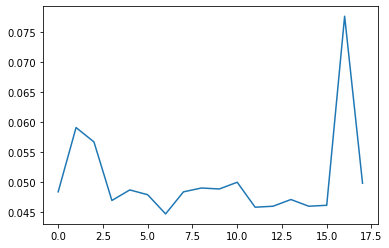

In [19]:
plt.plot(result.history['val_binary_accuracy'])
test_result = model.evaluate([X_test, np.array([counts_aa(xi) for xi in X_test])], y_test)
plt.show()

Let's see how the model works with classical positive-negative classification

In [20]:
labels = np.concatenate(
    (
        np.ones(pos_data.shape[0], dtype=pos_data.dtype),
        np.zeros(neg_data.shape[0], dtype=neg_data.dtype),
    ),
    axis=0,
)
features = np.concatenate((pos_data, neg_data), axis=0)
counts_features = np.array([counts_aa(xi) for xi in features])
shuffler = np.random.permutation(len(features))
features = features[shuffler]
counts_features = counts_features[shuffler]
labels = labels[shuffler]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.1, random_state=25)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.2, random_state=25)

In [21]:
tf.keras.backend.clear_session()
model = build_model(L)
opt = tf.optimizers.Adam(lr_decayed_fn)
model.compile(
      opt,
      loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
      steps_per_execution = 60 if use_tpu else None,
      metrics=[tf.keras.metrics.AUC(from_logits=True), tf.keras.metrics.BinaryAccuracy(threshold=0)])

In [22]:
result = model.fit(
    [X_train, np.array([counts_aa(xi) for xi in X_train])], y_train, 
    validation_data=([X_val, np.array([counts_aa(xi) for xi in X_val])] , y_val),
    callbacks=[tf.keras.callbacks.LambdaCallback(
        on_epoch_begin=lambda epochs,logs: print('lr =',lr_decayed_fn(opt.iterations).numpy())
        ),
        tf.keras.callbacks.EarlyStopping(monitor='val_auc', mode='max', restore_best_weights=True, patience=5)],
    epochs=150)

Epoch 1/150
lr = 0.001


  1/262 [..............................] - ETA: 35:43 - loss: 0.7004 - auc: 0.5029 - binary_accuracy: 0.5625

  2/262 [..............................] - ETA: 1:21 - loss: 0.6643 - auc: 0.5150 - binary_accuracy: 0.6406 

  3/262 [..............................] - ETA: 1:20 - loss: 0.6638 - auc: 0.5017 - binary_accuracy: 0.6667

  4/262 [..............................] - ETA: 1:20 - loss: 0.6390 - auc: 0.5324 - binary_accuracy: 0.6875

  5/262 [..............................] - ETA: 1:19 - loss: 0.5995 - auc: 0.5241 - binary_accuracy: 0.7250

  6/262 [..............................] - ETA: 1:19 - loss: 0.5615 - auc: 0.5546 - binary_accuracy: 0.7448

  7/262 [..............................] - ETA: 1:18 - loss: 0.5635 - auc: 0.5702 - binary_accuracy: 0.7411

  8/262 [..............................] - ETA: 1:18 - loss: 0.5708 - auc: 0.5483 - binary_accuracy: 0.7461

  9/262 [>.............................] - ETA: 1:18 - loss: 0.5681 - auc: 0.5465 - binary_accuracy: 0.7500

 10/262 [>.............................] - ETA: 1:17 - loss: 0.5561 - auc: 0.5460 - binary_accuracy: 0.7594

 11/262 [>.............................] - ETA: 1:17 - loss: 0.5385 - auc: 0.5431 - binary_accuracy: 0.7727

 12/262 [>.............................] - ETA: 1:17 - loss: 0.5258 - auc: 0.5466 - binary_accuracy: 0.7812

 13/262 [>.............................] - ETA: 1:16 - loss: 0.5169 - auc: 0.5402 - binary_accuracy: 0.7909

 14/262 [>.............................] - ETA: 1:16 - loss: 0.5203 - auc: 0.5357 - binary_accuracy: 0.7879

 15/262 [>.............................] - ETA: 1:16 - loss: 0.5268 - auc: 0.5308 - binary_accuracy: 0.7854

 16/262 [>.............................] - ETA: 1:15 - loss: 0.5297 - auc: 0.5252 - binary_accuracy: 0.7832

 17/262 [>.............................] - ETA: 1:15 - loss: 0.5249 - auc: 0.5283 - binary_accuracy: 0.7868

 18/262 [=>............................] - ETA: 1:15 - loss: 0.5325 - auc: 0.5233 - binary_accuracy: 0.7830

 19/262 [=>............................] - ETA: 1:14 - loss: 0.5257 - auc: 0.5244 - binary_accuracy: 0.7878

 20/262 [=>............................] - ETA: 1:14 - loss: 0.5192 - auc: 0.5247 - binary_accuracy: 0.7922

 21/262 [=>............................] - ETA: 1:14 - loss: 0.5248 - auc: 0.5204 - binary_accuracy: 0.7902

 22/262 [=>............................] - ETA: 1:14 - loss: 0.5272 - auc: 0.5145 - binary_accuracy: 0.7898

 23/262 [=>............................] - ETA: 1:13 - loss: 0.5298 - auc: 0.5160 - binary_accuracy: 0.7880

 24/262 [=>............................] - ETA: 1:13 - loss: 0.5307 - auc: 0.5150 - binary_accuracy: 0.7878

 25/262 [=>............................] - ETA: 1:13 - loss: 0.5275 - auc: 0.5150 - binary_accuracy: 0.7900

 26/262 [=>............................] - ETA: 1:12 - loss: 0.5296 - auc: 0.5095 - binary_accuracy: 0.7897

 27/262 [==>...........................] - ETA: 1:12 - loss: 0.5311 - auc: 0.5122 - binary_accuracy: 0.7882

 28/262 [==>...........................] - ETA: 1:12 - loss: 0.5343 - auc: 0.5224 - binary_accuracy: 0.7846

 29/262 [==>...........................] - ETA: 1:11 - loss: 0.5337 - auc: 0.5179 - binary_accuracy: 0.7856

 30/262 [==>...........................] - ETA: 1:11 - loss: 0.5292 - auc: 0.5126 - binary_accuracy: 0.7896

 31/262 [==>...........................] - ETA: 1:11 - loss: 0.5241 - auc: 0.5155 - binary_accuracy: 0.7923

 32/262 [==>...........................] - ETA: 1:11 - loss: 0.5251 - auc: 0.5200 - binary_accuracy: 0.7910

 33/262 [==>...........................] - ETA: 1:10 - loss: 0.5283 - auc: 0.5216 - binary_accuracy: 0.7888

 34/262 [==>...........................] - ETA: 1:10 - loss: 0.5296 - auc: 0.5227 - binary_accuracy: 0.7877

 35/262 [===>..........................] - ETA: 1:10 - loss: 0.5283 - auc: 0.5234 - binary_accuracy: 0.7884

 36/262 [===>..........................] - ETA: 1:09 - loss: 0.5259 - auc: 0.5200 - binary_accuracy: 0.7908

 37/262 [===>..........................] - ETA: 1:09 - loss: 0.5254 - auc: 0.5204 - binary_accuracy: 0.7914

 38/262 [===>..........................] - ETA: 1:09 - loss: 0.5243 - auc: 0.5214 - binary_accuracy: 0.7919

 39/262 [===>..........................] - ETA: 1:09 - loss: 0.5271 - auc: 0.5244 - binary_accuracy: 0.7893

 40/262 [===>..........................] - ETA: 1:08 - loss: 0.5234 - auc: 0.5221 - binary_accuracy: 0.7922

 41/262 [===>..........................] - ETA: 1:08 - loss: 0.5219 - auc: 0.5257 - binary_accuracy: 0.7927

 42/262 [===>..........................] - ETA: 1:08 - loss: 0.5230 - auc: 0.5225 - binary_accuracy: 0.7924

 43/262 [===>..........................] - ETA: 1:07 - loss: 0.5179 - auc: 0.5229 - binary_accuracy: 0.7958

 44/262 [====>.........................] - ETA: 1:07 - loss: 0.5178 - auc: 0.5214 - binary_accuracy: 0.7962

 45/262 [====>.........................] - ETA: 1:07 - loss: 0.5136 - auc: 0.5239 - binary_accuracy: 0.7986

 46/262 [====>.........................] - ETA: 1:06 - loss: 0.5141 - auc: 0.5240 - binary_accuracy: 0.7982

 47/262 [====>.........................] - ETA: 1:06 - loss: 0.5157 - auc: 0.5238 - binary_accuracy: 0.7972

 48/262 [====>.........................] - ETA: 1:06 - loss: 0.5146 - auc: 0.5268 - binary_accuracy: 0.7975

 49/262 [====>.........................] - ETA: 1:05 - loss: 0.5170 - auc: 0.5263 - binary_accuracy: 0.7959

 50/262 [====>.........................] - ETA: 1:05 - loss: 0.5141 - auc: 0.5314 - binary_accuracy: 0.7975

 51/262 [====>.........................] - ETA: 1:05 - loss: 0.5121 - auc: 0.5375 - binary_accuracy: 0.7978

 52/262 [====>.........................] - ETA: 1:04 - loss: 0.5174 - auc: 0.5358 - binary_accuracy: 0.7945

 53/262 [=====>........................] - ETA: 1:04 - loss: 0.5134 - auc: 0.5353 - binary_accuracy: 0.7972

 54/262 [=====>........................] - ETA: 1:04 - loss: 0.5168 - auc: 0.5364 - binary_accuracy: 0.7946

 55/262 [=====>........................] - ETA: 1:04 - loss: 0.5182 - auc: 0.5356 - binary_accuracy: 0.7937

 56/262 [=====>........................] - ETA: 1:03 - loss: 0.5170 - auc: 0.5353 - binary_accuracy: 0.7946

 57/262 [=====>........................] - ETA: 1:03 - loss: 0.5165 - auc: 0.5320 - binary_accuracy: 0.7955

 58/262 [=====>........................] - ETA: 1:03 - loss: 0.5141 - auc: 0.5305 - binary_accuracy: 0.7974

 59/262 [=====>........................] - ETA: 1:02 - loss: 0.5146 - auc: 0.5329 - binary_accuracy: 0.7966

 60/262 [=====>........................] - ETA: 1:02 - loss: 0.5152 - auc: 0.5348 - binary_accuracy: 0.7958

 61/262 [=====>........................] - ETA: 1:02 - loss: 0.5161 - auc: 0.5352 - binary_accuracy: 0.7951

 62/262 [======>.......................] - ETA: 1:01 - loss: 0.5142 - auc: 0.5378 - binary_accuracy: 0.7959

 63/262 [======>.......................] - ETA: 1:02 - loss: 0.5119 - auc: 0.5392 - binary_accuracy: 0.7971

 64/262 [======>.......................] - ETA: 1:03 - loss: 0.5122 - auc: 0.5369 - binary_accuracy: 0.7974

 65/262 [======>.......................] - ETA: 1:02 - loss: 0.5097 - auc: 0.5397 - binary_accuracy: 0.7986

 66/262 [======>.......................] - ETA: 1:02 - loss: 0.5102 - auc: 0.5395 - binary_accuracy: 0.7983

 67/262 [======>.......................] - ETA: 1:02 - loss: 0.5092 - auc: 0.5415 - binary_accuracy: 0.7985

 68/262 [======>.......................] - ETA: 1:02 - loss: 0.5079 - auc: 0.5410 - binary_accuracy: 0.7996

 69/262 [======>.......................] - ETA: 1:01 - loss: 0.5083 - auc: 0.5406 - binary_accuracy: 0.7994

 70/262 [=======>......................] - ETA: 1:01 - loss: 0.5093 - auc: 0.5403 - binary_accuracy: 0.7991

 71/262 [=======>......................] - ETA: 1:01 - loss: 0.5081 - auc: 0.5414 - binary_accuracy: 0.7997

 72/262 [=======>......................] - ETA: 1:00 - loss: 0.5065 - auc: 0.5421 - binary_accuracy: 0.8008

 73/262 [=======>......................] - ETA: 1:00 - loss: 0.5031 - auc: 0.5444 - binary_accuracy: 0.8027

 74/262 [=======>......................] - ETA: 1:00 - loss: 0.5043 - auc: 0.5439 - binary_accuracy: 0.8019

 75/262 [=======>......................] - ETA: 59s - loss: 0.5045 - auc: 0.5453 - binary_accuracy: 0.8017 

 76/262 [=======>......................] - ETA: 59s - loss: 0.5050 - auc: 0.5471 - binary_accuracy: 0.8010

 77/262 [=======>......................] - ETA: 59s - loss: 0.5038 - auc: 0.5482 - binary_accuracy: 0.8015

 78/262 [=======>......................] - ETA: 58s - loss: 0.5041 - auc: 0.5494 - binary_accuracy: 0.8013

 79/262 [========>.....................] - ETA: 58s - loss: 0.5057 - auc: 0.5495 - binary_accuracy: 0.8002

 80/262 [========>.....................] - ETA: 58s - loss: 0.5056 - auc: 0.5481 - binary_accuracy: 0.8008

 81/262 [========>.....................] - ETA: 57s - loss: 0.5070 - auc: 0.5486 - binary_accuracy: 0.7998

 82/262 [========>.....................] - ETA: 57s - loss: 0.5057 - auc: 0.5503 - binary_accuracy: 0.8003

 83/262 [========>.....................] - ETA: 57s - loss: 0.5044 - auc: 0.5490 - binary_accuracy: 0.8016

 84/262 [========>.....................] - ETA: 56s - loss: 0.5052 - auc: 0.5536 - binary_accuracy: 0.8002

 85/262 [========>.....................] - ETA: 56s - loss: 0.5044 - auc: 0.5550 - binary_accuracy: 0.8007

 86/262 [========>.....................] - ETA: 55s - loss: 0.5052 - auc: 0.5573 - binary_accuracy: 0.7998

 87/262 [========>.....................] - ETA: 55s - loss: 0.5051 - auc: 0.5560 - binary_accuracy: 0.8003

 88/262 [=========>....................] - ETA: 55s - loss: 0.5045 - auc: 0.5570 - binary_accuracy: 0.8004

 89/262 [=========>....................] - ETA: 54s - loss: 0.5052 - auc: 0.5596 - binary_accuracy: 0.7992

 90/262 [=========>....................] - ETA: 54s - loss: 0.5054 - auc: 0.5602 - binary_accuracy: 0.7986

 91/262 [=========>....................] - ETA: 54s - loss: 0.5067 - auc: 0.5586 - binary_accuracy: 0.7981

 92/262 [=========>....................] - ETA: 53s - loss: 0.5099 - auc: 0.5585 - binary_accuracy: 0.7959

 93/262 [=========>....................] - ETA: 53s - loss: 0.5100 - auc: 0.5588 - binary_accuracy: 0.7957

 94/262 [=========>....................] - ETA: 53s - loss: 0.5085 - auc: 0.5582 - binary_accuracy: 0.7969

 95/262 [=========>....................] - ETA: 52s - loss: 0.5077 - auc: 0.5569 - binary_accuracy: 0.7977

 96/262 [=========>....................] - ETA: 52s - loss: 0.5064 - auc: 0.5581 - binary_accuracy: 0.7982

 97/262 [==========>...................] - ETA: 52s - loss: 0.5071 - auc: 0.5600 - binary_accuracy: 0.7974

 98/262 [==========>...................] - ETA: 51s - loss: 0.5078 - auc: 0.5608 - binary_accuracy: 0.7969

 99/262 [==========>...................] - ETA: 51s - loss: 0.5072 - auc: 0.5622 - binary_accuracy: 0.7970

100/262 [==========>...................] - ETA: 51s - loss: 0.5057 - auc: 0.5629 - binary_accuracy: 0.7981

101/262 [==========>...................] - ETA: 50s - loss: 0.5075 - auc: 0.5646 - binary_accuracy: 0.7964

102/262 [==========>...................] - ETA: 50s - loss: 0.5072 - auc: 0.5651 - binary_accuracy: 0.7966

103/262 [==========>...................] - ETA: 50s - loss: 0.5061 - auc: 0.5655 - binary_accuracy: 0.7970

104/262 [==========>...................] - ETA: 49s - loss: 0.5075 - auc: 0.5656 - binary_accuracy: 0.7960

105/262 [===========>..................] - ETA: 49s - loss: 0.5072 - auc: 0.5678 - binary_accuracy: 0.7958

106/262 [===========>..................] - ETA: 49s - loss: 0.5074 - auc: 0.5692 - binary_accuracy: 0.7957

107/262 [===========>..................] - ETA: 48s - loss: 0.5073 - auc: 0.5689 - binary_accuracy: 0.7959

108/262 [===========>..................] - ETA: 48s - loss: 0.5075 - auc: 0.5709 - binary_accuracy: 0.7954

109/262 [===========>..................] - ETA: 48s - loss: 0.5078 - auc: 0.5690 - binary_accuracy: 0.7956

110/262 [===========>..................] - ETA: 47s - loss: 0.5084 - auc: 0.5682 - binary_accuracy: 0.7955

111/262 [===========>..................] - ETA: 47s - loss: 0.5078 - auc: 0.5685 - binary_accuracy: 0.7959

112/262 [===========>..................] - ETA: 47s - loss: 0.5070 - auc: 0.5692 - binary_accuracy: 0.7963

113/262 [===========>..................] - ETA: 47s - loss: 0.5082 - auc: 0.5688 - binary_accuracy: 0.7956

114/262 [============>.................] - ETA: 46s - loss: 0.5087 - auc: 0.5689 - binary_accuracy: 0.7952

115/262 [============>.................] - ETA: 46s - loss: 0.5081 - auc: 0.5691 - binary_accuracy: 0.7957

116/262 [============>.................] - ETA: 46s - loss: 0.5066 - auc: 0.5686 - binary_accuracy: 0.7966

117/262 [============>.................] - ETA: 45s - loss: 0.5068 - auc: 0.5696 - binary_accuracy: 0.7962

118/262 [============>.................] - ETA: 45s - loss: 0.5059 - auc: 0.5695 - binary_accuracy: 0.7969

119/262 [============>.................] - ETA: 45s - loss: 0.5062 - auc: 0.5690 - binary_accuracy: 0.7967

120/262 [============>.................] - ETA: 44s - loss: 0.5065 - auc: 0.5685 - binary_accuracy: 0.7966

121/262 [============>.................] - ETA: 44s - loss: 0.5069 - auc: 0.5680 - binary_accuracy: 0.7965

122/262 [============>.................] - ETA: 44s - loss: 0.5061 - auc: 0.5690 - binary_accuracy: 0.7969

123/262 [=============>................] - ETA: 43s - loss: 0.5058 - auc: 0.5693 - binary_accuracy: 0.7970

124/262 [=============>................] - ETA: 43s - loss: 0.5059 - auc: 0.5700 - binary_accuracy: 0.7966

125/262 [=============>................] - ETA: 43s - loss: 0.5051 - auc: 0.5709 - binary_accuracy: 0.7970

126/262 [=============>................] - ETA: 42s - loss: 0.5051 - auc: 0.5735 - binary_accuracy: 0.7964

127/262 [=============>................] - ETA: 42s - loss: 0.5047 - auc: 0.5731 - binary_accuracy: 0.7968

128/262 [=============>................] - ETA: 42s - loss: 0.5045 - auc: 0.5744 - binary_accuracy: 0.7966

129/262 [=============>................] - ETA: 41s - loss: 0.5045 - auc: 0.5747 - binary_accuracy: 0.7965

130/262 [=============>................] - ETA: 41s - loss: 0.5050 - auc: 0.5748 - binary_accuracy: 0.7962

131/262 [==============>...............] - ETA: 41s - loss: 0.5038 - auc: 0.5759 - binary_accuracy: 0.7968

132/262 [==============>...............] - ETA: 40s - loss: 0.5034 - auc: 0.5770 - binary_accuracy: 0.7969

133/262 [==============>...............] - ETA: 40s - loss: 0.5029 - auc: 0.5782 - binary_accuracy: 0.7970

134/262 [==============>...............] - ETA: 40s - loss: 0.5028 - auc: 0.5771 - binary_accuracy: 0.7971

135/262 [==============>...............] - ETA: 39s - loss: 0.5025 - auc: 0.5781 - binary_accuracy: 0.7970

136/262 [==============>...............] - ETA: 39s - loss: 0.5029 - auc: 0.5786 - binary_accuracy: 0.7966

137/262 [==============>...............] - ETA: 39s - loss: 0.5029 - auc: 0.5780 - binary_accuracy: 0.7970

138/262 [==============>...............] - ETA: 38s - loss: 0.5023 - auc: 0.5768 - binary_accuracy: 0.7978

139/262 [==============>...............] - ETA: 38s - loss: 0.5016 - auc: 0.5765 - binary_accuracy: 0.7983

140/262 [===============>..............] - ETA: 38s - loss: 0.5006 - auc: 0.5783 - binary_accuracy: 0.7987

141/262 [===============>..............] - ETA: 38s - loss: 0.4997 - auc: 0.5799 - binary_accuracy: 0.7988

142/262 [===============>..............] - ETA: 37s - loss: 0.5017 - auc: 0.5773 - binary_accuracy: 0.7980

143/262 [===============>..............] - ETA: 37s - loss: 0.5025 - auc: 0.5762 - binary_accuracy: 0.7979

144/262 [===============>..............] - ETA: 37s - loss: 0.5026 - auc: 0.5766 - binary_accuracy: 0.7977

145/262 [===============>..............] - ETA: 36s - loss: 0.5034 - auc: 0.5765 - binary_accuracy: 0.7972

146/262 [===============>..............] - ETA: 36s - loss: 0.5024 - auc: 0.5772 - binary_accuracy: 0.7977

147/262 [===============>..............] - ETA: 36s - loss: 0.5023 - auc: 0.5770 - binary_accuracy: 0.7978

148/262 [===============>..............] - ETA: 35s - loss: 0.5016 - auc: 0.5772 - binary_accuracy: 0.7981

149/262 [================>.............] - ETA: 35s - loss: 0.5006 - auc: 0.5776 - binary_accuracy: 0.7991

150/262 [================>.............] - ETA: 35s - loss: 0.4995 - auc: 0.5779 - binary_accuracy: 0.7998

151/262 [================>.............] - ETA: 34s - loss: 0.4991 - auc: 0.5780 - binary_accuracy: 0.8001

152/262 [================>.............] - ETA: 34s - loss: 0.4973 - auc: 0.5787 - binary_accuracy: 0.8012

153/262 [================>.............] - ETA: 34s - loss: 0.4974 - auc: 0.5779 - binary_accuracy: 0.8013

154/262 [================>.............] - ETA: 33s - loss: 0.4984 - auc: 0.5772 - binary_accuracy: 0.8007

155/262 [================>.............] - ETA: 33s - loss: 0.4974 - auc: 0.5786 - binary_accuracy: 0.8012

156/262 [================>.............] - ETA: 33s - loss: 0.4972 - auc: 0.5789 - binary_accuracy: 0.8013

157/262 [================>.............] - ETA: 33s - loss: 0.4978 - auc: 0.5780 - binary_accuracy: 0.8014

158/262 [=================>............] - ETA: 32s - loss: 0.4987 - auc: 0.5779 - binary_accuracy: 0.8008

159/262 [=================>............] - ETA: 32s - loss: 0.4989 - auc: 0.5770 - binary_accuracy: 0.8009

160/262 [=================>............] - ETA: 32s - loss: 0.4997 - auc: 0.5762 - binary_accuracy: 0.8006

161/262 [=================>............] - ETA: 31s - loss: 0.5004 - auc: 0.5767 - binary_accuracy: 0.7999

162/262 [=================>............] - ETA: 31s - loss: 0.4995 - auc: 0.5785 - binary_accuracy: 0.8002

163/262 [=================>............] - ETA: 31s - loss: 0.4994 - auc: 0.5797 - binary_accuracy: 0.8000

164/262 [=================>............] - ETA: 31s - loss: 0.4990 - auc: 0.5791 - binary_accuracy: 0.8005

165/262 [=================>............] - ETA: 30s - loss: 0.4991 - auc: 0.5805 - binary_accuracy: 0.8000

166/262 [==================>...........] - ETA: 30s - loss: 0.4992 - auc: 0.5818 - binary_accuracy: 0.7993

167/262 [==================>...........] - ETA: 30s - loss: 0.4993 - auc: 0.5826 - binary_accuracy: 0.7992

168/262 [==================>...........] - ETA: 29s - loss: 0.5000 - auc: 0.5810 - binary_accuracy: 0.7987

169/262 [==================>...........] - ETA: 29s - loss: 0.5000 - auc: 0.5823 - binary_accuracy: 0.7984

170/262 [==================>...........] - ETA: 29s - loss: 0.4995 - auc: 0.5821 - binary_accuracy: 0.7989

171/262 [==================>...........] - ETA: 28s - loss: 0.4990 - auc: 0.5825 - binary_accuracy: 0.7992

172/262 [==================>...........] - ETA: 28s - loss: 0.4986 - auc: 0.5827 - binary_accuracy: 0.7994

173/262 [==================>...........] - ETA: 28s - loss: 0.4990 - auc: 0.5821 - binary_accuracy: 0.7993

174/262 [==================>...........] - ETA: 27s - loss: 0.4988 - auc: 0.5816 - binary_accuracy: 0.7996

175/262 [===================>..........] - ETA: 27s - loss: 0.4979 - auc: 0.5825 - binary_accuracy: 0.8000

176/262 [===================>..........] - ETA: 27s - loss: 0.4974 - auc: 0.5833 - binary_accuracy: 0.8002

177/262 [===================>..........] - ETA: 27s - loss: 0.4977 - auc: 0.5826 - binary_accuracy: 0.8001

178/262 [===================>..........] - ETA: 26s - loss: 0.4977 - auc: 0.5823 - binary_accuracy: 0.8002

179/262 [===================>..........] - ETA: 26s - loss: 0.4985 - auc: 0.5817 - binary_accuracy: 0.7999

180/262 [===================>..........] - ETA: 26s - loss: 0.4982 - auc: 0.5833 - binary_accuracy: 0.7998

181/262 [===================>..........] - ETA: 25s - loss: 0.4983 - auc: 0.5836 - binary_accuracy: 0.7997

182/262 [===================>..........] - ETA: 25s - loss: 0.4979 - auc: 0.5851 - binary_accuracy: 0.7996

183/262 [===================>..........] - ETA: 25s - loss: 0.4973 - auc: 0.5869 - binary_accuracy: 0.7995

184/262 [====================>.........] - ETA: 24s - loss: 0.4967 - auc: 0.5877 - binary_accuracy: 0.7998

185/262 [====================>.........] - ETA: 24s - loss: 0.4954 - auc: 0.5885 - binary_accuracy: 0.8005

186/262 [====================>.........] - ETA: 24s - loss: 0.4954 - auc: 0.5883 - binary_accuracy: 0.8006

187/262 [====================>.........] - ETA: 23s - loss: 0.4950 - auc: 0.5889 - binary_accuracy: 0.8008

188/262 [====================>.........] - ETA: 23s - loss: 0.4945 - auc: 0.5903 - binary_accuracy: 0.8009

189/262 [====================>.........] - ETA: 23s - loss: 0.4939 - auc: 0.5905 - binary_accuracy: 0.8013

190/262 [====================>.........] - ETA: 22s - loss: 0.4930 - auc: 0.5909 - binary_accuracy: 0.8018

191/262 [====================>.........] - ETA: 22s - loss: 0.4930 - auc: 0.5909 - binary_accuracy: 0.8019

192/262 [====================>.........] - ETA: 22s - loss: 0.4926 - auc: 0.5913 - binary_accuracy: 0.8021

193/262 [=====================>........] - ETA: 21s - loss: 0.4927 - auc: 0.5928 - binary_accuracy: 0.8017

194/262 [=====================>........] - ETA: 21s - loss: 0.4929 - auc: 0.5937 - binary_accuracy: 0.8014

195/262 [=====================>........] - ETA: 21s - loss: 0.4916 - auc: 0.5948 - binary_accuracy: 0.8021

196/262 [=====================>........] - ETA: 20s - loss: 0.4904 - auc: 0.5963 - binary_accuracy: 0.8026

197/262 [=====================>........] - ETA: 20s - loss: 0.4908 - auc: 0.5969 - binary_accuracy: 0.8022

198/262 [=====================>........] - ETA: 20s - loss: 0.4904 - auc: 0.5978 - binary_accuracy: 0.8024

199/262 [=====================>........] - ETA: 19s - loss: 0.4907 - auc: 0.5976 - binary_accuracy: 0.8023

200/262 [=====================>........] - ETA: 19s - loss: 0.4901 - auc: 0.5982 - binary_accuracy: 0.8028

201/262 [======================>.......] - ETA: 19s - loss: 0.4901 - auc: 0.5977 - binary_accuracy: 0.8030

202/262 [======================>.......] - ETA: 18s - loss: 0.4907 - auc: 0.5977 - binary_accuracy: 0.8028

203/262 [======================>.......] - ETA: 18s - loss: 0.4919 - auc: 0.5965 - binary_accuracy: 0.8020

204/262 [======================>.......] - ETA: 18s - loss: 0.4916 - auc: 0.5972 - binary_accuracy: 0.8022

205/262 [======================>.......] - ETA: 18s - loss: 0.4904 - auc: 0.5986 - binary_accuracy: 0.8027

206/262 [======================>.......] - ETA: 17s - loss: 0.4900 - auc: 0.5992 - binary_accuracy: 0.8029

207/262 [======================>.......] - ETA: 17s - loss: 0.4897 - auc: 0.6002 - binary_accuracy: 0.8028

208/262 [======================>.......] - ETA: 17s - loss: 0.4893 - auc: 0.6008 - binary_accuracy: 0.8030

209/262 [======================>.......] - ETA: 16s - loss: 0.4889 - auc: 0.6012 - binary_accuracy: 0.8031

210/262 [=======================>......] - ETA: 16s - loss: 0.4888 - auc: 0.6028 - binary_accuracy: 0.8028

211/262 [=======================>......] - ETA: 16s - loss: 0.4885 - auc: 0.6033 - binary_accuracy: 0.8030

212/262 [=======================>......] - ETA: 15s - loss: 0.4884 - auc: 0.6030 - binary_accuracy: 0.8031

213/262 [=======================>......] - ETA: 15s - loss: 0.4875 - auc: 0.6034 - binary_accuracy: 0.8036

214/262 [=======================>......] - ETA: 15s - loss: 0.4872 - auc: 0.6046 - binary_accuracy: 0.8037

215/262 [=======================>......] - ETA: 14s - loss: 0.4870 - auc: 0.6051 - binary_accuracy: 0.8038

216/262 [=======================>......] - ETA: 14s - loss: 0.4875 - auc: 0.6046 - binary_accuracy: 0.8035

217/262 [=======================>......] - ETA: 14s - loss: 0.4871 - auc: 0.6040 - binary_accuracy: 0.8040

218/262 [=======================>......] - ETA: 13s - loss: 0.4877 - auc: 0.6055 - binary_accuracy: 0.8032

219/262 [========================>.....] - ETA: 13s - loss: 0.4882 - auc: 0.6049 - binary_accuracy: 0.8031

220/262 [========================>.....] - ETA: 13s - loss: 0.4883 - auc: 0.6058 - binary_accuracy: 0.8027

221/262 [========================>.....] - ETA: 12s - loss: 0.4886 - auc: 0.6067 - binary_accuracy: 0.8026

222/262 [========================>.....] - ETA: 12s - loss: 0.4885 - auc: 0.6067 - binary_accuracy: 0.8026

223/262 [========================>.....] - ETA: 12s - loss: 0.4882 - auc: 0.6068 - binary_accuracy: 0.8028

224/262 [========================>.....] - ETA: 12s - loss: 0.4880 - auc: 0.6078 - binary_accuracy: 0.8029

225/262 [========================>.....] - ETA: 11s - loss: 0.4875 - auc: 0.6091 - binary_accuracy: 0.8029

226/262 [========================>.....] - ETA: 11s - loss: 0.4872 - auc: 0.6080 - binary_accuracy: 0.8031

227/262 [========================>.....] - ETA: 11s - loss: 0.4870 - auc: 0.6091 - binary_accuracy: 0.8034

228/262 [=========================>....] - ETA: 10s - loss: 0.4869 - auc: 0.6098 - binary_accuracy: 0.8032

229/262 [=========================>....] - ETA: 10s - loss: 0.4867 - auc: 0.6104 - binary_accuracy: 0.8032

230/262 [=========================>....] - ETA: 10s - loss: 0.4872 - auc: 0.6105 - binary_accuracy: 0.8029

231/262 [=========================>....] - ETA: 9s - loss: 0.4868 - auc: 0.6109 - binary_accuracy: 0.8030 

232/262 [=========================>....] - ETA: 9s - loss: 0.4863 - auc: 0.6116 - binary_accuracy: 0.8032

233/262 [=========================>....] - ETA: 9s - loss: 0.4863 - auc: 0.6112 - binary_accuracy: 0.8032

234/262 [=========================>....] - ETA: 8s - loss: 0.4861 - auc: 0.6116 - binary_accuracy: 0.8034

235/262 [=========================>....] - ETA: 8s - loss: 0.4862 - auc: 0.6113 - binary_accuracy: 0.8035

236/262 [==========================>...] - ETA: 8s - loss: 0.4855 - auc: 0.6116 - binary_accuracy: 0.8039

237/262 [==========================>...] - ETA: 7s - loss: 0.4854 - auc: 0.6113 - binary_accuracy: 0.8041

238/262 [==========================>...] - ETA: 7s - loss: 0.4856 - auc: 0.6112 - binary_accuracy: 0.8040

239/262 [==========================>...] - ETA: 7s - loss: 0.4859 - auc: 0.6105 - binary_accuracy: 0.8039

240/262 [==========================>...] - ETA: 6s - loss: 0.4860 - auc: 0.6109 - binary_accuracy: 0.8036

241/262 [==========================>...] - ETA: 6s - loss: 0.4865 - auc: 0.6114 - binary_accuracy: 0.8032

242/262 [==========================>...] - ETA: 6s - loss: 0.4861 - auc: 0.6119 - binary_accuracy: 0.8033

243/262 [==========================>...] - ETA: 5s - loss: 0.4862 - auc: 0.6120 - binary_accuracy: 0.8031

244/262 [==========================>...] - ETA: 5s - loss: 0.4864 - auc: 0.6123 - binary_accuracy: 0.8028

245/262 [===========================>..] - ETA: 5s - loss: 0.4859 - auc: 0.6139 - binary_accuracy: 0.8029

246/262 [===========================>..] - ETA: 5s - loss: 0.4858 - auc: 0.6141 - binary_accuracy: 0.8027

247/262 [===========================>..] - ETA: 4s - loss: 0.4858 - auc: 0.6152 - binary_accuracy: 0.8025

248/262 [===========================>..] - ETA: 4s - loss: 0.4854 - auc: 0.6144 - binary_accuracy: 0.8028

249/262 [===========================>..] - ETA: 4s - loss: 0.4855 - auc: 0.6151 - binary_accuracy: 0.8022

250/262 [===========================>..] - ETA: 3s - loss: 0.4856 - auc: 0.6155 - binary_accuracy: 0.8023

251/262 [===========================>..] - ETA: 3s - loss: 0.4858 - auc: 0.6159 - binary_accuracy: 0.8018

252/262 [===========================>..] - ETA: 3s - loss: 0.4859 - auc: 0.6165 - binary_accuracy: 0.8016

253/262 [===========================>..] - ETA: 2s - loss: 0.4862 - auc: 0.6170 - binary_accuracy: 0.8011

254/262 [============================>.] - ETA: 2s - loss: 0.4862 - auc: 0.6174 - binary_accuracy: 0.8011

255/262 [============================>.] - ETA: 2s - loss: 0.4861 - auc: 0.6185 - binary_accuracy: 0.8010

256/262 [============================>.] - ETA: 1s - loss: 0.4863 - auc: 0.6189 - binary_accuracy: 0.8008

257/262 [============================>.] - ETA: 1s - loss: 0.4859 - auc: 0.6199 - binary_accuracy: 0.8008

258/262 [============================>.] - ETA: 1s - loss: 0.4857 - auc: 0.6208 - binary_accuracy: 0.8009

259/262 [============================>.] - ETA: 0s - loss: 0.4858 - auc: 0.6206 - binary_accuracy: 0.8009

260/262 [============================>.] - ETA: 0s - loss: 0.4860 - auc: 0.6206 - binary_accuracy: 0.8008

261/262 [============================>.] - ETA: 0s - loss: 0.4860 - auc: 0.6209 - binary_accuracy: 0.8009

262/262 [==============================] - ETA: 0s - loss: 0.4857 - auc: 0.6220 - binary_accuracy: 0.8009

262/262 [==============================] - 96s 336ms/step - loss: 0.4857 - auc: 0.6220 - binary_accuracy: 0.8009 - val_loss: 0.4455 - val_auc: 0.7045 - val_binary_accuracy: 0.8121


Epoch 2/150
lr = 0.0009984514


  1/262 [..............................] - ETA: 1:20 - loss: 0.3329 - auc: 0.8080 - binary_accuracy: 0.8750

  2/262 [..............................] - ETA: 1:21 - loss: 0.3563 - auc: 0.8152 - binary_accuracy: 0.8438

  3/262 [..............................] - ETA: 1:20 - loss: 0.3372 - auc: 0.8304 - binary_accuracy: 0.8646

  4/262 [..............................] - ETA: 1:20 - loss: 0.3643 - auc: 0.8176 - binary_accuracy: 0.8438

  5/262 [..............................] - ETA: 1:19 - loss: 0.3916 - auc: 0.7859 - binary_accuracy: 0.8313

  6/262 [..............................] - ETA: 1:18 - loss: 0.4079 - auc: 0.7991 - binary_accuracy: 0.8177

  7/262 [..............................] - ETA: 1:18 - loss: 0.4434 - auc: 0.7464 - binary_accuracy: 0.8080

  8/262 [..............................] - ETA: 1:18 - loss: 0.4452 - auc: 0.7224 - binary_accuracy: 0.8125

  9/262 [>.............................] - ETA: 1:17 - loss: 0.4483 - auc: 0.7422 - binary_accuracy: 0.8021

 10/262 [>.............................] - ETA: 1:17 - loss: 0.4385 - auc: 0.7399 - binary_accuracy: 0.8094

 11/262 [>.............................] - ETA: 1:16 - loss: 0.4379 - auc: 0.7382 - binary_accuracy: 0.8097

 12/262 [>.............................] - ETA: 1:16 - loss: 0.4382 - auc: 0.7215 - binary_accuracy: 0.8125

 13/262 [>.............................] - ETA: 1:16 - loss: 0.4421 - auc: 0.7272 - binary_accuracy: 0.8053

 14/262 [>.............................] - ETA: 1:15 - loss: 0.4408 - auc: 0.7280 - binary_accuracy: 0.8058

 15/262 [>.............................] - ETA: 1:15 - loss: 0.4420 - auc: 0.7246 - binary_accuracy: 0.8042

 16/262 [>.............................] - ETA: 1:15 - loss: 0.4452 - auc: 0.7223 - binary_accuracy: 0.8027

 17/262 [>.............................] - ETA: 1:14 - loss: 0.4404 - auc: 0.7310 - binary_accuracy: 0.8033

 18/262 [=>............................] - ETA: 1:14 - loss: 0.4399 - auc: 0.7310 - binary_accuracy: 0.8038

 19/262 [=>............................] - ETA: 1:14 - loss: 0.4304 - auc: 0.7414 - binary_accuracy: 0.8092

 20/262 [=>............................] - ETA: 1:14 - loss: 0.4335 - auc: 0.7463 - binary_accuracy: 0.8047

 21/262 [=>............................] - ETA: 1:13 - loss: 0.4303 - auc: 0.7447 - binary_accuracy: 0.8080

 22/262 [=>............................] - ETA: 1:13 - loss: 0.4252 - auc: 0.7480 - binary_accuracy: 0.8111

 23/262 [=>............................] - ETA: 1:13 - loss: 0.4282 - auc: 0.7448 - binary_accuracy: 0.8098

 24/262 [=>............................] - ETA: 1:13 - loss: 0.4295 - auc: 0.7454 - binary_accuracy: 0.8086

 25/262 [=>............................] - ETA: 1:12 - loss: 0.4270 - auc: 0.7464 - binary_accuracy: 0.8100

 26/262 [=>............................] - ETA: 1:12 - loss: 0.4285 - auc: 0.7434 - binary_accuracy: 0.8101

 27/262 [==>...........................] - ETA: 1:12 - loss: 0.4292 - auc: 0.7413 - binary_accuracy: 0.8090

 28/262 [==>...........................] - ETA: 1:11 - loss: 0.4340 - auc: 0.7393 - binary_accuracy: 0.8058

 29/262 [==>...........................] - ETA: 1:11 - loss: 0.4341 - auc: 0.7387 - binary_accuracy: 0.8060

 30/262 [==>...........................] - ETA: 1:11 - loss: 0.4339 - auc: 0.7439 - binary_accuracy: 0.8042

 31/262 [==>...........................] - ETA: 1:10 - loss: 0.4356 - auc: 0.7371 - binary_accuracy: 0.8054

 32/262 [==>...........................] - ETA: 1:10 - loss: 0.4340 - auc: 0.7388 - binary_accuracy: 0.8066

 33/262 [==>...........................] - ETA: 1:10 - loss: 0.4365 - auc: 0.7412 - binary_accuracy: 0.8030

 34/262 [==>...........................] - ETA: 1:09 - loss: 0.4405 - auc: 0.7366 - binary_accuracy: 0.8015

 35/262 [===>..........................] - ETA: 1:09 - loss: 0.4420 - auc: 0.7350 - binary_accuracy: 0.7991

 36/262 [===>..........................] - ETA: 1:09 - loss: 0.4402 - auc: 0.7399 - binary_accuracy: 0.7986

 37/262 [===>..........................] - ETA: 1:09 - loss: 0.4392 - auc: 0.7373 - binary_accuracy: 0.7998

 38/262 [===>..........................] - ETA: 1:09 - loss: 0.4379 - auc: 0.7354 - binary_accuracy: 0.8018

 39/262 [===>..........................] - ETA: 1:08 - loss: 0.4388 - auc: 0.7332 - binary_accuracy: 0.8013

 40/262 [===>..........................] - ETA: 1:08 - loss: 0.4382 - auc: 0.7322 - binary_accuracy: 0.8016

 41/262 [===>..........................] - ETA: 1:08 - loss: 0.4391 - auc: 0.7289 - binary_accuracy: 0.8026

 42/262 [===>..........................] - ETA: 1:07 - loss: 0.4451 - auc: 0.7222 - binary_accuracy: 0.8006

 43/262 [===>..........................] - ETA: 1:07 - loss: 0.4474 - auc: 0.7225 - binary_accuracy: 0.7994

 44/262 [====>.........................] - ETA: 1:07 - loss: 0.4454 - auc: 0.7243 - binary_accuracy: 0.8004

 45/262 [====>.........................] - ETA: 1:07 - loss: 0.4487 - auc: 0.7190 - binary_accuracy: 0.8000

 46/262 [====>.........................] - ETA: 1:06 - loss: 0.4489 - auc: 0.7177 - binary_accuracy: 0.8016

 47/262 [====>.........................] - ETA: 1:06 - loss: 0.4445 - auc: 0.7195 - binary_accuracy: 0.8039

 48/262 [====>.........................] - ETA: 1:06 - loss: 0.4428 - auc: 0.7211 - binary_accuracy: 0.8040

 49/262 [====>.........................] - ETA: 1:05 - loss: 0.4448 - auc: 0.7201 - binary_accuracy: 0.8029

 50/262 [====>.........................] - ETA: 1:05 - loss: 0.4465 - auc: 0.7195 - binary_accuracy: 0.8019

 51/262 [====>.........................] - ETA: 1:05 - loss: 0.4471 - auc: 0.7210 - binary_accuracy: 0.8009

 52/262 [====>.........................] - ETA: 1:04 - loss: 0.4512 - auc: 0.7215 - binary_accuracy: 0.7969

 53/262 [=====>........................] - ETA: 1:04 - loss: 0.4488 - auc: 0.7227 - binary_accuracy: 0.7983

 54/262 [=====>........................] - ETA: 1:04 - loss: 0.4491 - auc: 0.7189 - binary_accuracy: 0.7980

 55/262 [=====>........................] - ETA: 1:04 - loss: 0.4496 - auc: 0.7178 - binary_accuracy: 0.7977

 56/262 [=====>........................] - ETA: 1:03 - loss: 0.4486 - auc: 0.7178 - binary_accuracy: 0.7985

 57/262 [=====>........................] - ETA: 1:03 - loss: 0.4509 - auc: 0.7141 - binary_accuracy: 0.7982

 58/262 [=====>........................] - ETA: 1:03 - loss: 0.4516 - auc: 0.7143 - binary_accuracy: 0.7958

 59/262 [=====>........................] - ETA: 1:02 - loss: 0.4513 - auc: 0.7129 - binary_accuracy: 0.7971

 60/262 [=====>........................] - ETA: 1:02 - loss: 0.4511 - auc: 0.7130 - binary_accuracy: 0.7974

 61/262 [=====>........................] - ETA: 1:02 - loss: 0.4504 - auc: 0.7141 - binary_accuracy: 0.7976

 62/262 [======>.......................] - ETA: 1:01 - loss: 0.4506 - auc: 0.7132 - binary_accuracy: 0.7979

 63/262 [======>.......................] - ETA: 1:01 - loss: 0.4503 - auc: 0.7134 - binary_accuracy: 0.7981

 64/262 [======>.......................] - ETA: 1:01 - loss: 0.4498 - auc: 0.7127 - binary_accuracy: 0.7988

 65/262 [======>.......................] - ETA: 1:00 - loss: 0.4534 - auc: 0.7110 - binary_accuracy: 0.7966

 66/262 [======>.......................] - ETA: 1:00 - loss: 0.4559 - auc: 0.7088 - binary_accuracy: 0.7959

 67/262 [======>.......................] - ETA: 1:00 - loss: 0.4566 - auc: 0.7091 - binary_accuracy: 0.7952

 68/262 [======>.......................] - ETA: 59s - loss: 0.4571 - auc: 0.7099 - binary_accuracy: 0.7950 

 69/262 [======>.......................] - ETA: 59s - loss: 0.4570 - auc: 0.7107 - binary_accuracy: 0.7948

 70/262 [=======>......................] - ETA: 59s - loss: 0.4572 - auc: 0.7110 - binary_accuracy: 0.7946

 71/262 [=======>......................] - ETA: 59s - loss: 0.4565 - auc: 0.7112 - binary_accuracy: 0.7953

 72/262 [=======>......................] - ETA: 58s - loss: 0.4601 - auc: 0.7069 - binary_accuracy: 0.7947

 73/262 [=======>......................] - ETA: 58s - loss: 0.4594 - auc: 0.7078 - binary_accuracy: 0.7949

 74/262 [=======>......................] - ETA: 58s - loss: 0.4592 - auc: 0.7105 - binary_accuracy: 0.7943

 75/262 [=======>......................] - ETA: 57s - loss: 0.4615 - auc: 0.7104 - binary_accuracy: 0.7925

 76/262 [=======>......................] - ETA: 57s - loss: 0.4604 - auc: 0.7110 - binary_accuracy: 0.7936

 77/262 [=======>......................] - ETA: 57s - loss: 0.4607 - auc: 0.7107 - binary_accuracy: 0.7938

 78/262 [=======>......................] - ETA: 56s - loss: 0.4619 - auc: 0.7116 - binary_accuracy: 0.7933

 79/262 [========>.....................] - ETA: 56s - loss: 0.4612 - auc: 0.7125 - binary_accuracy: 0.7931

 80/262 [========>.....................] - ETA: 56s - loss: 0.4592 - auc: 0.7148 - binary_accuracy: 0.7945

 81/262 [========>.....................] - ETA: 55s - loss: 0.4590 - auc: 0.7148 - binary_accuracy: 0.7940

 82/262 [========>.....................] - ETA: 55s - loss: 0.4604 - auc: 0.7124 - binary_accuracy: 0.7938

 83/262 [========>.....................] - ETA: 55s - loss: 0.4628 - auc: 0.7103 - binary_accuracy: 0.7925

 84/262 [========>.....................] - ETA: 54s - loss: 0.4611 - auc: 0.7109 - binary_accuracy: 0.7932

 85/262 [========>.....................] - ETA: 55s - loss: 0.4621 - auc: 0.7112 - binary_accuracy: 0.7915

 86/262 [========>.....................] - ETA: 55s - loss: 0.4634 - auc: 0.7115 - binary_accuracy: 0.7911

 87/262 [========>.....................] - ETA: 55s - loss: 0.4628 - auc: 0.7096 - binary_accuracy: 0.7920

 88/262 [=========>....................] - ETA: 54s - loss: 0.4619 - auc: 0.7092 - binary_accuracy: 0.7930

 89/262 [=========>....................] - ETA: 54s - loss: 0.4630 - auc: 0.7064 - binary_accuracy: 0.7932

 90/262 [=========>....................] - ETA: 54s - loss: 0.4634 - auc: 0.7068 - binary_accuracy: 0.7934

 91/262 [=========>....................] - ETA: 53s - loss: 0.4641 - auc: 0.7066 - binary_accuracy: 0.7929

 92/262 [=========>....................] - ETA: 53s - loss: 0.4632 - auc: 0.7062 - binary_accuracy: 0.7938

 93/262 [=========>....................] - ETA: 53s - loss: 0.4623 - auc: 0.7076 - binary_accuracy: 0.7944

 94/262 [=========>....................] - ETA: 52s - loss: 0.4630 - auc: 0.7065 - binary_accuracy: 0.7942

 95/262 [=========>....................] - ETA: 52s - loss: 0.4616 - auc: 0.7064 - binary_accuracy: 0.7954

 96/262 [=========>....................] - ETA: 52s - loss: 0.4612 - auc: 0.7059 - binary_accuracy: 0.7959

 97/262 [==========>...................] - ETA: 51s - loss: 0.4624 - auc: 0.7041 - binary_accuracy: 0.7954

 98/262 [==========>...................] - ETA: 51s - loss: 0.4631 - auc: 0.7038 - binary_accuracy: 0.7950

 99/262 [==========>...................] - ETA: 51s - loss: 0.4636 - auc: 0.7025 - binary_accuracy: 0.7951

100/262 [==========>...................] - ETA: 50s - loss: 0.4633 - auc: 0.7030 - binary_accuracy: 0.7953

101/262 [==========>...................] - ETA: 50s - loss: 0.4615 - auc: 0.7038 - binary_accuracy: 0.7964

102/262 [==========>...................] - ETA: 50s - loss: 0.4629 - auc: 0.7031 - binary_accuracy: 0.7953

103/262 [==========>...................] - ETA: 50s - loss: 0.4623 - auc: 0.7034 - binary_accuracy: 0.7958

104/262 [==========>...................] - ETA: 49s - loss: 0.4633 - auc: 0.7017 - binary_accuracy: 0.7957

105/262 [===========>..................] - ETA: 49s - loss: 0.4638 - auc: 0.7018 - binary_accuracy: 0.7952

106/262 [===========>..................] - ETA: 49s - loss: 0.4638 - auc: 0.7023 - binary_accuracy: 0.7951

107/262 [===========>..................] - ETA: 48s - loss: 0.4633 - auc: 0.7035 - binary_accuracy: 0.7953

108/262 [===========>..................] - ETA: 48s - loss: 0.4621 - auc: 0.7028 - binary_accuracy: 0.7966

109/262 [===========>..................] - ETA: 48s - loss: 0.4626 - auc: 0.7029 - binary_accuracy: 0.7959

110/262 [===========>..................] - ETA: 47s - loss: 0.4642 - auc: 0.7023 - binary_accuracy: 0.7946

111/262 [===========>..................] - ETA: 47s - loss: 0.4631 - auc: 0.7021 - binary_accuracy: 0.7953

112/262 [===========>..................] - ETA: 47s - loss: 0.4629 - auc: 0.7022 - binary_accuracy: 0.7955

113/262 [===========>..................] - ETA: 46s - loss: 0.4640 - auc: 0.7023 - binary_accuracy: 0.7945

114/262 [============>.................] - ETA: 46s - loss: 0.4637 - auc: 0.7034 - binary_accuracy: 0.7941

115/262 [============>.................] - ETA: 46s - loss: 0.4625 - auc: 0.7021 - binary_accuracy: 0.7957

116/262 [============>.................] - ETA: 45s - loss: 0.4622 - auc: 0.7024 - binary_accuracy: 0.7958

117/262 [============>.................] - ETA: 45s - loss: 0.4619 - auc: 0.7027 - binary_accuracy: 0.7959

118/262 [============>.................] - ETA: 45s - loss: 0.4632 - auc: 0.7016 - binary_accuracy: 0.7953

119/262 [============>.................] - ETA: 44s - loss: 0.4633 - auc: 0.7017 - binary_accuracy: 0.7952

120/262 [============>.................] - ETA: 44s - loss: 0.4620 - auc: 0.7022 - binary_accuracy: 0.7961

121/262 [============>.................] - ETA: 44s - loss: 0.4629 - auc: 0.7032 - binary_accuracy: 0.7952

122/262 [============>.................] - ETA: 43s - loss: 0.4629 - auc: 0.7034 - binary_accuracy: 0.7951

123/262 [=============>................] - ETA: 43s - loss: 0.4627 - auc: 0.7036 - binary_accuracy: 0.7952

124/262 [=============>................] - ETA: 43s - loss: 0.4618 - auc: 0.7025 - binary_accuracy: 0.7964

125/262 [=============>................] - ETA: 42s - loss: 0.4623 - auc: 0.7010 - binary_accuracy: 0.7965

126/262 [=============>................] - ETA: 42s - loss: 0.4625 - auc: 0.7002 - binary_accuracy: 0.7966

127/262 [=============>................] - ETA: 42s - loss: 0.4634 - auc: 0.7000 - binary_accuracy: 0.7960

128/262 [=============>................] - ETA: 42s - loss: 0.4629 - auc: 0.6995 - binary_accuracy: 0.7966

129/262 [=============>................] - ETA: 41s - loss: 0.4622 - auc: 0.7006 - binary_accuracy: 0.7968

130/262 [=============>................] - ETA: 41s - loss: 0.4623 - auc: 0.7014 - binary_accuracy: 0.7964

131/262 [==============>...............] - ETA: 41s - loss: 0.4630 - auc: 0.7010 - binary_accuracy: 0.7960

132/262 [==============>...............] - ETA: 40s - loss: 0.4631 - auc: 0.7024 - binary_accuracy: 0.7955

133/262 [==============>...............] - ETA: 40s - loss: 0.4629 - auc: 0.7019 - binary_accuracy: 0.7958

134/262 [==============>...............] - ETA: 40s - loss: 0.4634 - auc: 0.7005 - binary_accuracy: 0.7959

135/262 [==============>...............] - ETA: 39s - loss: 0.4632 - auc: 0.7008 - binary_accuracy: 0.7954

136/262 [==============>...............] - ETA: 39s - loss: 0.4631 - auc: 0.7013 - binary_accuracy: 0.7953

137/262 [==============>...............] - ETA: 39s - loss: 0.4634 - auc: 0.7010 - binary_accuracy: 0.7952

138/262 [==============>...............] - ETA: 38s - loss: 0.4638 - auc: 0.7020 - binary_accuracy: 0.7948

139/262 [==============>...............] - ETA: 38s - loss: 0.4633 - auc: 0.7033 - binary_accuracy: 0.7947

140/262 [===============>..............] - ETA: 38s - loss: 0.4637 - auc: 0.7031 - binary_accuracy: 0.7946

141/262 [===============>..............] - ETA: 37s - loss: 0.4629 - auc: 0.7050 - binary_accuracy: 0.7948

142/262 [===============>..............] - ETA: 37s - loss: 0.4637 - auc: 0.7061 - binary_accuracy: 0.7938

143/262 [===============>..............] - ETA: 37s - loss: 0.4643 - auc: 0.7064 - binary_accuracy: 0.7933

144/262 [===============>..............] - ETA: 36s - loss: 0.4640 - auc: 0.7072 - binary_accuracy: 0.7934

145/262 [===============>..............] - ETA: 36s - loss: 0.4637 - auc: 0.7077 - binary_accuracy: 0.7933

146/262 [===============>..............] - ETA: 36s - loss: 0.4634 - auc: 0.7075 - binary_accuracy: 0.7935

147/262 [===============>..............] - ETA: 36s - loss: 0.4627 - auc: 0.7082 - binary_accuracy: 0.7938

148/262 [===============>..............] - ETA: 35s - loss: 0.4631 - auc: 0.7089 - binary_accuracy: 0.7933

149/262 [================>.............] - ETA: 35s - loss: 0.4621 - auc: 0.7090 - binary_accuracy: 0.7940

150/262 [================>.............] - ETA: 35s - loss: 0.4619 - auc: 0.7101 - binary_accuracy: 0.7940

151/262 [================>.............] - ETA: 34s - loss: 0.4623 - auc: 0.7104 - binary_accuracy: 0.7939

152/262 [================>.............] - ETA: 34s - loss: 0.4617 - auc: 0.7099 - binary_accuracy: 0.7944

153/262 [================>.............] - ETA: 34s - loss: 0.4608 - auc: 0.7109 - binary_accuracy: 0.7949

154/262 [================>.............] - ETA: 33s - loss: 0.4599 - auc: 0.7113 - binary_accuracy: 0.7955

155/262 [================>.............] - ETA: 33s - loss: 0.4603 - auc: 0.7104 - binary_accuracy: 0.7954

156/262 [================>.............] - ETA: 33s - loss: 0.4594 - auc: 0.7111 - binary_accuracy: 0.7957

157/262 [================>.............] - ETA: 32s - loss: 0.4607 - auc: 0.7097 - binary_accuracy: 0.7952

158/262 [=================>............] - ETA: 32s - loss: 0.4607 - auc: 0.7091 - binary_accuracy: 0.7955

159/262 [=================>............] - ETA: 32s - loss: 0.4607 - auc: 0.7089 - binary_accuracy: 0.7954

160/262 [=================>............] - ETA: 31s - loss: 0.4617 - auc: 0.7083 - binary_accuracy: 0.7949

161/262 [=================>............] - ETA: 31s - loss: 0.4622 - auc: 0.7077 - binary_accuracy: 0.7946

162/262 [=================>............] - ETA: 31s - loss: 0.4623 - auc: 0.7068 - binary_accuracy: 0.7948

163/262 [=================>............] - ETA: 30s - loss: 0.4625 - auc: 0.7067 - binary_accuracy: 0.7949

164/262 [=================>............] - ETA: 30s - loss: 0.4634 - auc: 0.7061 - binary_accuracy: 0.7944

165/262 [=================>............] - ETA: 30s - loss: 0.4639 - auc: 0.7062 - binary_accuracy: 0.7939

166/262 [==================>...........] - ETA: 30s - loss: 0.4637 - auc: 0.7059 - binary_accuracy: 0.7941

167/262 [==================>...........] - ETA: 29s - loss: 0.4633 - auc: 0.7056 - binary_accuracy: 0.7943

168/262 [==================>...........] - ETA: 29s - loss: 0.4633 - auc: 0.7057 - binary_accuracy: 0.7943

169/262 [==================>...........] - ETA: 29s - loss: 0.4635 - auc: 0.7053 - binary_accuracy: 0.7944

170/262 [==================>...........] - ETA: 28s - loss: 0.4644 - auc: 0.7039 - binary_accuracy: 0.7939

171/262 [==================>...........] - ETA: 28s - loss: 0.4641 - auc: 0.7048 - binary_accuracy: 0.7937

172/262 [==================>...........] - ETA: 28s - loss: 0.4633 - auc: 0.7047 - binary_accuracy: 0.7943

173/262 [==================>...........] - ETA: 27s - loss: 0.4632 - auc: 0.7042 - binary_accuracy: 0.7946

174/262 [==================>...........] - ETA: 27s - loss: 0.4637 - auc: 0.7047 - binary_accuracy: 0.7940

175/262 [===================>..........] - ETA: 27s - loss: 0.4642 - auc: 0.7044 - binary_accuracy: 0.7937

176/262 [===================>..........] - ETA: 26s - loss: 0.4640 - auc: 0.7041 - binary_accuracy: 0.7940

177/262 [===================>..........] - ETA: 26s - loss: 0.4644 - auc: 0.7040 - binary_accuracy: 0.7938

178/262 [===================>..........] - ETA: 26s - loss: 0.4642 - auc: 0.7034 - binary_accuracy: 0.7942

179/262 [===================>..........] - ETA: 25s - loss: 0.4643 - auc: 0.7037 - binary_accuracy: 0.7940

180/262 [===================>..........] - ETA: 25s - loss: 0.4645 - auc: 0.7045 - binary_accuracy: 0.7936

181/262 [===================>..........] - ETA: 25s - loss: 0.4641 - auc: 0.7048 - binary_accuracy: 0.7937

182/262 [===================>..........] - ETA: 24s - loss: 0.4649 - auc: 0.7037 - binary_accuracy: 0.7934

183/262 [===================>..........] - ETA: 24s - loss: 0.4646 - auc: 0.7037 - binary_accuracy: 0.7937

184/262 [====================>.........] - ETA: 24s - loss: 0.4639 - auc: 0.7035 - binary_accuracy: 0.7942

185/262 [====================>.........] - ETA: 24s - loss: 0.4636 - auc: 0.7037 - binary_accuracy: 0.7941

186/262 [====================>.........] - ETA: 23s - loss: 0.4632 - auc: 0.7030 - binary_accuracy: 0.7947

187/262 [====================>.........] - ETA: 23s - loss: 0.4632 - auc: 0.7026 - binary_accuracy: 0.7951

188/262 [====================>.........] - ETA: 23s - loss: 0.4630 - auc: 0.7028 - binary_accuracy: 0.7952

189/262 [====================>.........] - ETA: 23s - loss: 0.4624 - auc: 0.7031 - binary_accuracy: 0.7956

190/262 [====================>.........] - ETA: 22s - loss: 0.4631 - auc: 0.7023 - binary_accuracy: 0.7954

191/262 [====================>.........] - ETA: 22s - loss: 0.4628 - auc: 0.7022 - binary_accuracy: 0.7956

192/262 [====================>.........] - ETA: 22s - loss: 0.4629 - auc: 0.7026 - binary_accuracy: 0.7956

193/262 [=====================>........] - ETA: 21s - loss: 0.4635 - auc: 0.7021 - binary_accuracy: 0.7952

194/262 [=====================>........] - ETA: 21s - loss: 0.4638 - auc: 0.7013 - binary_accuracy: 0.7951

195/262 [=====================>........] - ETA: 21s - loss: 0.4637 - auc: 0.7013 - binary_accuracy: 0.7952

196/262 [=====================>........] - ETA: 20s - loss: 0.4630 - auc: 0.7023 - binary_accuracy: 0.7958

197/262 [=====================>........] - ETA: 20s - loss: 0.4626 - auc: 0.7031 - binary_accuracy: 0.7958

198/262 [=====================>........] - ETA: 20s - loss: 0.4629 - auc: 0.7026 - binary_accuracy: 0.7958

199/262 [=====================>........] - ETA: 19s - loss: 0.4631 - auc: 0.7021 - binary_accuracy: 0.7957

200/262 [=====================>........] - ETA: 19s - loss: 0.4625 - auc: 0.7028 - binary_accuracy: 0.7958

201/262 [======================>.......] - ETA: 19s - loss: 0.4618 - auc: 0.7032 - binary_accuracy: 0.7962

202/262 [======================>.......] - ETA: 18s - loss: 0.4618 - auc: 0.7039 - binary_accuracy: 0.7959

203/262 [======================>.......] - ETA: 18s - loss: 0.4613 - auc: 0.7043 - binary_accuracy: 0.7962

204/262 [======================>.......] - ETA: 18s - loss: 0.4615 - auc: 0.7039 - binary_accuracy: 0.7963

205/262 [======================>.......] - ETA: 17s - loss: 0.4613 - auc: 0.7043 - binary_accuracy: 0.7963

206/262 [======================>.......] - ETA: 17s - loss: 0.4613 - auc: 0.7047 - binary_accuracy: 0.7961

207/262 [======================>.......] - ETA: 17s - loss: 0.4612 - auc: 0.7050 - binary_accuracy: 0.7962

208/262 [======================>.......] - ETA: 17s - loss: 0.4608 - auc: 0.7054 - binary_accuracy: 0.7963

209/262 [======================>.......] - ETA: 16s - loss: 0.4609 - auc: 0.7057 - binary_accuracy: 0.7962

210/262 [=======================>......] - ETA: 16s - loss: 0.4609 - auc: 0.7061 - binary_accuracy: 0.7958

211/262 [=======================>......] - ETA: 16s - loss: 0.4607 - auc: 0.7059 - binary_accuracy: 0.7959

212/262 [=======================>......] - ETA: 15s - loss: 0.4602 - auc: 0.7059 - binary_accuracy: 0.7961

213/262 [=======================>......] - ETA: 15s - loss: 0.4606 - auc: 0.7054 - binary_accuracy: 0.7962

214/262 [=======================>......] - ETA: 15s - loss: 0.4598 - auc: 0.7057 - binary_accuracy: 0.7967

215/262 [=======================>......] - ETA: 14s - loss: 0.4597 - auc: 0.7062 - binary_accuracy: 0.7967

216/262 [=======================>......] - ETA: 14s - loss: 0.4601 - auc: 0.7052 - binary_accuracy: 0.7967

217/262 [=======================>......] - ETA: 14s - loss: 0.4614 - auc: 0.7041 - binary_accuracy: 0.7962

218/262 [=======================>......] - ETA: 13s - loss: 0.4607 - auc: 0.7053 - binary_accuracy: 0.7963

219/262 [========================>.....] - ETA: 13s - loss: 0.4599 - auc: 0.7060 - binary_accuracy: 0.7967

220/262 [========================>.....] - ETA: 13s - loss: 0.4596 - auc: 0.7067 - binary_accuracy: 0.7966

221/262 [========================>.....] - ETA: 12s - loss: 0.4591 - auc: 0.7072 - binary_accuracy: 0.7968

222/262 [========================>.....] - ETA: 12s - loss: 0.4585 - auc: 0.7077 - binary_accuracy: 0.7972

223/262 [========================>.....] - ETA: 12s - loss: 0.4593 - auc: 0.7070 - binary_accuracy: 0.7967

224/262 [========================>.....] - ETA: 11s - loss: 0.4589 - auc: 0.7074 - binary_accuracy: 0.7967

225/262 [========================>.....] - ETA: 11s - loss: 0.4587 - auc: 0.7077 - binary_accuracy: 0.7969

226/262 [========================>.....] - ETA: 11s - loss: 0.4584 - auc: 0.7082 - binary_accuracy: 0.7967

227/262 [========================>.....] - ETA: 11s - loss: 0.4579 - auc: 0.7087 - binary_accuracy: 0.7969

228/262 [=========================>....] - ETA: 10s - loss: 0.4573 - auc: 0.7092 - binary_accuracy: 0.7970

229/262 [=========================>....] - ETA: 10s - loss: 0.4582 - auc: 0.7079 - binary_accuracy: 0.7967

230/262 [=========================>....] - ETA: 10s - loss: 0.4577 - auc: 0.7079 - binary_accuracy: 0.7971

231/262 [=========================>....] - ETA: 9s - loss: 0.4578 - auc: 0.7076 - binary_accuracy: 0.7972 

232/262 [=========================>....] - ETA: 9s - loss: 0.4584 - auc: 0.7065 - binary_accuracy: 0.7971

233/262 [=========================>....] - ETA: 9s - loss: 0.4584 - auc: 0.7058 - binary_accuracy: 0.7975

234/262 [=========================>....] - ETA: 8s - loss: 0.4589 - auc: 0.7043 - binary_accuracy: 0.7977

235/262 [=========================>....] - ETA: 8s - loss: 0.4586 - auc: 0.7045 - binary_accuracy: 0.7979

236/262 [==========================>...] - ETA: 8s - loss: 0.4587 - auc: 0.7048 - binary_accuracy: 0.7977

237/262 [==========================>...] - ETA: 7s - loss: 0.4585 - auc: 0.7051 - binary_accuracy: 0.7977

238/262 [==========================>...] - ETA: 7s - loss: 0.4590 - auc: 0.7050 - binary_accuracy: 0.7974

239/262 [==========================>...] - ETA: 7s - loss: 0.4595 - auc: 0.7046 - binary_accuracy: 0.7972

240/262 [==========================>...] - ETA: 6s - loss: 0.4594 - auc: 0.7050 - binary_accuracy: 0.7971

241/262 [==========================>...] - ETA: 6s - loss: 0.4587 - auc: 0.7055 - binary_accuracy: 0.7976

242/262 [==========================>...] - ETA: 6s - loss: 0.4581 - auc: 0.7066 - binary_accuracy: 0.7976

243/262 [==========================>...] - ETA: 5s - loss: 0.4577 - auc: 0.7070 - binary_accuracy: 0.7978

244/262 [==========================>...] - ETA: 5s - loss: 0.4571 - auc: 0.7075 - binary_accuracy: 0.7982

245/262 [===========================>..] - ETA: 5s - loss: 0.4573 - auc: 0.7072 - binary_accuracy: 0.7981

246/262 [===========================>..] - ETA: 5s - loss: 0.4570 - auc: 0.7070 - binary_accuracy: 0.7984

247/262 [===========================>..] - ETA: 4s - loss: 0.4568 - auc: 0.7076 - binary_accuracy: 0.7983

248/262 [===========================>..] - ETA: 4s - loss: 0.4565 - auc: 0.7078 - binary_accuracy: 0.7985

249/262 [===========================>..] - ETA: 4s - loss: 0.4573 - auc: 0.7067 - binary_accuracy: 0.7983

250/262 [===========================>..] - ETA: 3s - loss: 0.4573 - auc: 0.7062 - binary_accuracy: 0.7985

251/262 [===========================>..] - ETA: 3s - loss: 0.4568 - auc: 0.7062 - binary_accuracy: 0.7989

252/262 [===========================>..] - ETA: 3s - loss: 0.4564 - auc: 0.7062 - binary_accuracy: 0.7991

253/262 [===========================>..] - ETA: 2s - loss: 0.4560 - auc: 0.7064 - binary_accuracy: 0.7994

254/262 [============================>.] - ETA: 2s - loss: 0.4553 - auc: 0.7068 - binary_accuracy: 0.7998

255/262 [============================>.] - ETA: 2s - loss: 0.4556 - auc: 0.7072 - binary_accuracy: 0.7995

256/262 [============================>.] - ETA: 1s - loss: 0.4555 - auc: 0.7074 - binary_accuracy: 0.7996

257/262 [============================>.] - ETA: 1s - loss: 0.4564 - auc: 0.7068 - binary_accuracy: 0.7991

258/262 [============================>.] - ETA: 1s - loss: 0.4555 - auc: 0.7075 - binary_accuracy: 0.7995

259/262 [============================>.] - ETA: 0s - loss: 0.4557 - auc: 0.7072 - binary_accuracy: 0.7995

260/262 [============================>.] - ETA: 0s - loss: 0.4551 - auc: 0.7073 - binary_accuracy: 0.7999

261/262 [============================>.] - ETA: 0s - loss: 0.4544 - auc: 0.7072 - binary_accuracy: 0.8002

262/262 [==============================] - ETA: 0s - loss: 0.4543 - auc: 0.7070 - binary_accuracy: 0.8003

262/262 [==============================] - 84s 320ms/step - loss: 0.4543 - auc: 0.7070 - binary_accuracy: 0.8003 - val_loss: 0.4416 - val_auc: 0.7056 - val_binary_accuracy: 0.8134


Epoch 3/150
lr = 0.0009938151


  1/262 [..............................] - ETA: 1:21 - loss: 0.4363 - auc: 0.7115 - binary_accuracy: 0.8125

  2/262 [..............................] - ETA: 1:20 - loss: 0.4449 - auc: 0.7714 - binary_accuracy: 0.7812

  3/262 [..............................] - ETA: 1:20 - loss: 0.3852 - auc: 0.7971 - binary_accuracy: 0.8229

  4/262 [..............................] - ETA: 1:19 - loss: 0.3777 - auc: 0.8393 - binary_accuracy: 0.8203

  5/262 [..............................] - ETA: 1:19 - loss: 0.3850 - auc: 0.8098 - binary_accuracy: 0.8250

  6/262 [..............................] - ETA: 1:19 - loss: 0.4054 - auc: 0.7673 - binary_accuracy: 0.8229

  7/262 [..............................] - ETA: 1:18 - loss: 0.4147 - auc: 0.7382 - binary_accuracy: 0.8214

  8/262 [..............................] - ETA: 1:18 - loss: 0.4137 - auc: 0.7335 - binary_accuracy: 0.8242

  9/262 [>.............................] - ETA: 1:18 - loss: 0.4099 - auc: 0.7481 - binary_accuracy: 0.8229

 10/262 [>.............................] - ETA: 1:17 - loss: 0.4127 - auc: 0.7467 - binary_accuracy: 0.8219

 11/262 [>.............................] - ETA: 1:17 - loss: 0.4335 - auc: 0.7258 - binary_accuracy: 0.8153

 12/262 [>.............................] - ETA: 1:17 - loss: 0.4314 - auc: 0.7396 - binary_accuracy: 0.8125

 13/262 [>.............................] - ETA: 1:16 - loss: 0.4366 - auc: 0.7269 - binary_accuracy: 0.8125

 14/262 [>.............................] - ETA: 1:16 - loss: 0.4236 - auc: 0.7337 - binary_accuracy: 0.8192

 15/262 [>.............................] - ETA: 1:16 - loss: 0.4306 - auc: 0.7281 - binary_accuracy: 0.8167

 16/262 [>.............................] - ETA: 1:15 - loss: 0.4389 - auc: 0.7269 - binary_accuracy: 0.8105

 17/262 [>.............................] - ETA: 1:20 - loss: 0.4422 - auc: 0.7340 - binary_accuracy: 0.8051

 18/262 [=>............................] - ETA: 1:24 - loss: 0.4399 - auc: 0.7469 - binary_accuracy: 0.8003

 19/262 [=>............................] - ETA: 1:24 - loss: 0.4424 - auc: 0.7398 - binary_accuracy: 0.7993

 20/262 [=>............................] - ETA: 1:23 - loss: 0.4434 - auc: 0.7325 - binary_accuracy: 0.8000

 21/262 [=>............................] - ETA: 1:22 - loss: 0.4407 - auc: 0.7368 - binary_accuracy: 0.7991

 22/262 [=>............................] - ETA: 1:21 - loss: 0.4424 - auc: 0.7368 - binary_accuracy: 0.7955

 23/262 [=>............................] - ETA: 1:20 - loss: 0.4430 - auc: 0.7343 - binary_accuracy: 0.7962

 24/262 [=>............................] - ETA: 1:20 - loss: 0.4416 - auc: 0.7323 - binary_accuracy: 0.7982

 25/262 [=>............................] - ETA: 1:19 - loss: 0.4393 - auc: 0.7329 - binary_accuracy: 0.8000

 26/262 [=>............................] - ETA: 1:19 - loss: 0.4341 - auc: 0.7339 - binary_accuracy: 0.8029

 27/262 [==>...........................] - ETA: 1:18 - loss: 0.4295 - auc: 0.7342 - binary_accuracy: 0.8067

 28/262 [==>...........................] - ETA: 1:17 - loss: 0.4284 - auc: 0.7393 - binary_accuracy: 0.8047

 29/262 [==>...........................] - ETA: 1:17 - loss: 0.4318 - auc: 0.7379 - binary_accuracy: 0.8028

 30/262 [==>...........................] - ETA: 1:16 - loss: 0.4343 - auc: 0.7402 - binary_accuracy: 0.8000

 31/262 [==>...........................] - ETA: 1:16 - loss: 0.4364 - auc: 0.7451 - binary_accuracy: 0.7974

 32/262 [==>...........................] - ETA: 1:15 - loss: 0.4378 - auc: 0.7463 - binary_accuracy: 0.7949

 33/262 [==>...........................] - ETA: 1:15 - loss: 0.4377 - auc: 0.7499 - binary_accuracy: 0.7945

 34/262 [==>...........................] - ETA: 1:14 - loss: 0.4339 - auc: 0.7482 - binary_accuracy: 0.7978

 35/262 [===>..........................] - ETA: 1:14 - loss: 0.4333 - auc: 0.7465 - binary_accuracy: 0.8000

 36/262 [===>..........................] - ETA: 1:13 - loss: 0.4323 - auc: 0.7443 - binary_accuracy: 0.7995

 37/262 [===>..........................] - ETA: 1:13 - loss: 0.4326 - auc: 0.7416 - binary_accuracy: 0.7990

 38/262 [===>..........................] - ETA: 1:12 - loss: 0.4325 - auc: 0.7393 - binary_accuracy: 0.8002

 39/262 [===>..........................] - ETA: 1:12 - loss: 0.4353 - auc: 0.7357 - binary_accuracy: 0.7989

 40/262 [===>..........................] - ETA: 1:11 - loss: 0.4354 - auc: 0.7338 - binary_accuracy: 0.7984

 41/262 [===>..........................] - ETA: 1:11 - loss: 0.4390 - auc: 0.7303 - binary_accuracy: 0.7973

 42/262 [===>..........................] - ETA: 1:11 - loss: 0.4368 - auc: 0.7337 - binary_accuracy: 0.7984

 43/262 [===>..........................] - ETA: 1:10 - loss: 0.4339 - auc: 0.7339 - binary_accuracy: 0.8009

 44/262 [====>.........................] - ETA: 1:10 - loss: 0.4347 - auc: 0.7356 - binary_accuracy: 0.7997

 45/262 [====>.........................] - ETA: 1:09 - loss: 0.4324 - auc: 0.7363 - binary_accuracy: 0.8014

 46/262 [====>.........................] - ETA: 1:09 - loss: 0.4344 - auc: 0.7356 - binary_accuracy: 0.8003

 47/262 [====>.........................] - ETA: 1:09 - loss: 0.4316 - auc: 0.7391 - binary_accuracy: 0.8012

 48/262 [====>.........................] - ETA: 1:08 - loss: 0.4326 - auc: 0.7442 - binary_accuracy: 0.7988

 49/262 [====>.........................] - ETA: 1:08 - loss: 0.4340 - auc: 0.7400 - binary_accuracy: 0.7997

 50/262 [====>.........................] - ETA: 1:07 - loss: 0.4330 - auc: 0.7401 - binary_accuracy: 0.8006

 51/262 [====>.........................] - ETA: 1:07 - loss: 0.4336 - auc: 0.7413 - binary_accuracy: 0.7996

 52/262 [====>.........................] - ETA: 1:07 - loss: 0.4394 - auc: 0.7401 - binary_accuracy: 0.7951

 53/262 [=====>........................] - ETA: 1:06 - loss: 0.4424 - auc: 0.7378 - binary_accuracy: 0.7942

 54/262 [=====>........................] - ETA: 1:06 - loss: 0.4420 - auc: 0.7382 - binary_accuracy: 0.7940

 55/262 [=====>........................] - ETA: 1:06 - loss: 0.4457 - auc: 0.7344 - binary_accuracy: 0.7920

 56/262 [=====>........................] - ETA: 1:05 - loss: 0.4436 - auc: 0.7328 - binary_accuracy: 0.7930

 57/262 [=====>........................] - ETA: 1:05 - loss: 0.4429 - auc: 0.7349 - binary_accuracy: 0.7928

 58/262 [=====>........................] - ETA: 1:04 - loss: 0.4435 - auc: 0.7335 - binary_accuracy: 0.7909

 59/262 [=====>........................] - ETA: 1:04 - loss: 0.4439 - auc: 0.7312 - binary_accuracy: 0.7918

 60/262 [=====>........................] - ETA: 1:04 - loss: 0.4480 - auc: 0.7300 - binary_accuracy: 0.7896

 61/262 [=====>........................] - ETA: 1:03 - loss: 0.4485 - auc: 0.7308 - binary_accuracy: 0.7894

 62/262 [======>.......................] - ETA: 1:03 - loss: 0.4468 - auc: 0.7292 - binary_accuracy: 0.7908

 63/262 [======>.......................] - ETA: 1:03 - loss: 0.4466 - auc: 0.7269 - binary_accuracy: 0.7917

 64/262 [======>.......................] - ETA: 1:02 - loss: 0.4455 - auc: 0.7265 - binary_accuracy: 0.7930

 65/262 [======>.......................] - ETA: 1:02 - loss: 0.4464 - auc: 0.7275 - binary_accuracy: 0.7923

 66/262 [======>.......................] - ETA: 1:02 - loss: 0.4466 - auc: 0.7257 - binary_accuracy: 0.7931

 67/262 [======>.......................] - ETA: 1:01 - loss: 0.4469 - auc: 0.7247 - binary_accuracy: 0.7934

 68/262 [======>.......................] - ETA: 1:01 - loss: 0.4447 - auc: 0.7243 - binary_accuracy: 0.7955

 69/262 [======>.......................] - ETA: 1:01 - loss: 0.4432 - auc: 0.7235 - binary_accuracy: 0.7971

 70/262 [=======>......................] - ETA: 1:00 - loss: 0.4415 - auc: 0.7232 - binary_accuracy: 0.7987

 71/262 [=======>......................] - ETA: 1:00 - loss: 0.4422 - auc: 0.7216 - binary_accuracy: 0.7989

 72/262 [=======>......................] - ETA: 1:00 - loss: 0.4415 - auc: 0.7225 - binary_accuracy: 0.7990

 73/262 [=======>......................] - ETA: 59s - loss: 0.4428 - auc: 0.7207 - binary_accuracy: 0.7988 

 74/262 [=======>......................] - ETA: 59s - loss: 0.4429 - auc: 0.7199 - binary_accuracy: 0.7994

 75/262 [=======>......................] - ETA: 59s - loss: 0.4446 - auc: 0.7183 - binary_accuracy: 0.7987

 76/262 [=======>......................] - ETA: 58s - loss: 0.4451 - auc: 0.7170 - binary_accuracy: 0.7989

 77/262 [=======>......................] - ETA: 58s - loss: 0.4440 - auc: 0.7168 - binary_accuracy: 0.7999

 78/262 [=======>......................] - ETA: 58s - loss: 0.4415 - auc: 0.7184 - binary_accuracy: 0.8013

 79/262 [========>.....................] - ETA: 57s - loss: 0.4398 - auc: 0.7196 - binary_accuracy: 0.8022

 80/262 [========>.....................] - ETA: 57s - loss: 0.4381 - auc: 0.7199 - binary_accuracy: 0.8031

 81/262 [========>.....................] - ETA: 56s - loss: 0.4396 - auc: 0.7189 - binary_accuracy: 0.8025

 82/262 [========>.....................] - ETA: 56s - loss: 0.4387 - auc: 0.7196 - binary_accuracy: 0.8030

 83/262 [========>.....................] - ETA: 56s - loss: 0.4379 - auc: 0.7201 - binary_accuracy: 0.8035

 84/262 [========>.....................] - ETA: 55s - loss: 0.4409 - auc: 0.7186 - binary_accuracy: 0.8021

 85/262 [========>.....................] - ETA: 55s - loss: 0.4414 - auc: 0.7194 - binary_accuracy: 0.8015

 86/262 [========>.....................] - ETA: 55s - loss: 0.4429 - auc: 0.7180 - binary_accuracy: 0.8009

 87/262 [========>.....................] - ETA: 54s - loss: 0.4428 - auc: 0.7191 - binary_accuracy: 0.8006

 88/262 [=========>....................] - ETA: 54s - loss: 0.4447 - auc: 0.7170 - binary_accuracy: 0.8001

 89/262 [=========>....................] - ETA: 54s - loss: 0.4450 - auc: 0.7170 - binary_accuracy: 0.7999

 90/262 [=========>....................] - ETA: 53s - loss: 0.4441 - auc: 0.7170 - binary_accuracy: 0.8007

 91/262 [=========>....................] - ETA: 53s - loss: 0.4450 - auc: 0.7166 - binary_accuracy: 0.7998

 92/262 [=========>....................] - ETA: 53s - loss: 0.4454 - auc: 0.7165 - binary_accuracy: 0.7999

 93/262 [=========>....................] - ETA: 52s - loss: 0.4449 - auc: 0.7172 - binary_accuracy: 0.8001

 94/262 [=========>....................] - ETA: 52s - loss: 0.4459 - auc: 0.7185 - binary_accuracy: 0.7989

 95/262 [=========>....................] - ETA: 52s - loss: 0.4452 - auc: 0.7182 - binary_accuracy: 0.7997

 96/262 [=========>....................] - ETA: 51s - loss: 0.4447 - auc: 0.7180 - binary_accuracy: 0.8001

 97/262 [==========>...................] - ETA: 51s - loss: 0.4453 - auc: 0.7191 - binary_accuracy: 0.7993

 98/262 [==========>...................] - ETA: 51s - loss: 0.4454 - auc: 0.7204 - binary_accuracy: 0.7988

 99/262 [==========>...................] - ETA: 51s - loss: 0.4452 - auc: 0.7223 - binary_accuracy: 0.7986

100/262 [==========>...................] - ETA: 50s - loss: 0.4436 - auc: 0.7242 - binary_accuracy: 0.7994

101/262 [==========>...................] - ETA: 50s - loss: 0.4455 - auc: 0.7246 - binary_accuracy: 0.7976

102/262 [==========>...................] - ETA: 50s - loss: 0.4474 - auc: 0.7235 - binary_accuracy: 0.7969

103/262 [==========>...................] - ETA: 49s - loss: 0.4481 - auc: 0.7224 - binary_accuracy: 0.7970

104/262 [==========>...................] - ETA: 49s - loss: 0.4470 - auc: 0.7229 - binary_accuracy: 0.7981

105/262 [===========>..................] - ETA: 49s - loss: 0.4485 - auc: 0.7235 - binary_accuracy: 0.7964

106/262 [===========>..................] - ETA: 48s - loss: 0.4480 - auc: 0.7242 - binary_accuracy: 0.7969

107/262 [===========>..................] - ETA: 48s - loss: 0.4479 - auc: 0.7265 - binary_accuracy: 0.7961

108/262 [===========>..................] - ETA: 48s - loss: 0.4490 - auc: 0.7259 - binary_accuracy: 0.7960

109/262 [===========>..................] - ETA: 47s - loss: 0.4481 - auc: 0.7254 - binary_accuracy: 0.7967

110/262 [===========>..................] - ETA: 47s - loss: 0.4477 - auc: 0.7272 - binary_accuracy: 0.7963

111/262 [===========>..................] - ETA: 47s - loss: 0.4487 - auc: 0.7253 - binary_accuracy: 0.7965

112/262 [===========>..................] - ETA: 46s - loss: 0.4472 - auc: 0.7273 - binary_accuracy: 0.7969

113/262 [===========>..................] - ETA: 46s - loss: 0.4470 - auc: 0.7280 - binary_accuracy: 0.7967

114/262 [============>.................] - ETA: 46s - loss: 0.4478 - auc: 0.7289 - binary_accuracy: 0.7958

115/262 [============>.................] - ETA: 45s - loss: 0.4487 - auc: 0.7288 - binary_accuracy: 0.7951

116/262 [============>.................] - ETA: 45s - loss: 0.4475 - auc: 0.7302 - binary_accuracy: 0.7955

117/262 [============>.................] - ETA: 45s - loss: 0.4484 - auc: 0.7296 - binary_accuracy: 0.7943

118/262 [============>.................] - ETA: 45s - loss: 0.4478 - auc: 0.7306 - binary_accuracy: 0.7945

119/262 [============>.................] - ETA: 45s - loss: 0.4472 - auc: 0.7309 - binary_accuracy: 0.7946

120/262 [============>.................] - ETA: 45s - loss: 0.4474 - auc: 0.7295 - binary_accuracy: 0.7951

121/262 [============>.................] - ETA: 44s - loss: 0.4471 - auc: 0.7293 - binary_accuracy: 0.7947

122/262 [============>.................] - ETA: 44s - loss: 0.4466 - auc: 0.7281 - binary_accuracy: 0.7956

123/262 [=============>................] - ETA: 44s - loss: 0.4464 - auc: 0.7288 - binary_accuracy: 0.7952

124/262 [=============>................] - ETA: 43s - loss: 0.4467 - auc: 0.7293 - binary_accuracy: 0.7946

125/262 [=============>................] - ETA: 43s - loss: 0.4466 - auc: 0.7299 - binary_accuracy: 0.7945

126/262 [=============>................] - ETA: 43s - loss: 0.4467 - auc: 0.7306 - binary_accuracy: 0.7944

127/262 [=============>................] - ETA: 42s - loss: 0.4471 - auc: 0.7296 - binary_accuracy: 0.7943

128/262 [=============>................] - ETA: 42s - loss: 0.4488 - auc: 0.7267 - binary_accuracy: 0.7942

129/262 [=============>................] - ETA: 42s - loss: 0.4481 - auc: 0.7273 - binary_accuracy: 0.7946

130/262 [=============>................] - ETA: 41s - loss: 0.4476 - auc: 0.7275 - binary_accuracy: 0.7950

131/262 [==============>...............] - ETA: 41s - loss: 0.4495 - auc: 0.7253 - binary_accuracy: 0.7941

132/262 [==============>...............] - ETA: 41s - loss: 0.4502 - auc: 0.7239 - binary_accuracy: 0.7943

133/262 [==============>...............] - ETA: 40s - loss: 0.4495 - auc: 0.7241 - binary_accuracy: 0.7946

134/262 [==============>...............] - ETA: 40s - loss: 0.4489 - auc: 0.7240 - binary_accuracy: 0.7952

135/262 [==============>...............] - ETA: 40s - loss: 0.4484 - auc: 0.7243 - binary_accuracy: 0.7954

136/262 [==============>...............] - ETA: 39s - loss: 0.4496 - auc: 0.7234 - binary_accuracy: 0.7948

137/262 [==============>...............] - ETA: 39s - loss: 0.4486 - auc: 0.7246 - binary_accuracy: 0.7952

138/262 [==============>...............] - ETA: 39s - loss: 0.4480 - auc: 0.7250 - binary_accuracy: 0.7955

139/262 [==============>...............] - ETA: 38s - loss: 0.4481 - auc: 0.7241 - binary_accuracy: 0.7956

140/262 [===============>..............] - ETA: 38s - loss: 0.4471 - auc: 0.7239 - binary_accuracy: 0.7964

141/262 [===============>..............] - ETA: 38s - loss: 0.4468 - auc: 0.7238 - binary_accuracy: 0.7968

142/262 [===============>..............] - ETA: 37s - loss: 0.4464 - auc: 0.7234 - binary_accuracy: 0.7973

143/262 [===============>..............] - ETA: 37s - loss: 0.4468 - auc: 0.7236 - binary_accuracy: 0.7970

144/262 [===============>..............] - ETA: 37s - loss: 0.4479 - auc: 0.7222 - binary_accuracy: 0.7967

145/262 [===============>..............] - ETA: 36s - loss: 0.4485 - auc: 0.7219 - binary_accuracy: 0.7963

146/262 [===============>..............] - ETA: 36s - loss: 0.4482 - auc: 0.7217 - binary_accuracy: 0.7967

147/262 [===============>..............] - ETA: 36s - loss: 0.4485 - auc: 0.7211 - binary_accuracy: 0.7968

148/262 [===============>..............] - ETA: 35s - loss: 0.4479 - auc: 0.7220 - binary_accuracy: 0.7969

149/262 [================>.............] - ETA: 35s - loss: 0.4473 - auc: 0.7226 - binary_accuracy: 0.7972

150/262 [================>.............] - ETA: 35s - loss: 0.4471 - auc: 0.7223 - binary_accuracy: 0.7975

151/262 [================>.............] - ETA: 35s - loss: 0.4481 - auc: 0.7221 - binary_accuracy: 0.7968

152/262 [================>.............] - ETA: 34s - loss: 0.4492 - auc: 0.7227 - binary_accuracy: 0.7958

153/262 [================>.............] - ETA: 34s - loss: 0.4491 - auc: 0.7226 - binary_accuracy: 0.7960

154/262 [================>.............] - ETA: 34s - loss: 0.4493 - auc: 0.7240 - binary_accuracy: 0.7953

155/262 [================>.............] - ETA: 33s - loss: 0.4503 - auc: 0.7242 - binary_accuracy: 0.7946

156/262 [================>.............] - ETA: 33s - loss: 0.4501 - auc: 0.7235 - binary_accuracy: 0.7951

157/262 [================>.............] - ETA: 33s - loss: 0.4514 - auc: 0.7227 - binary_accuracy: 0.7944

158/262 [=================>............] - ETA: 32s - loss: 0.4518 - auc: 0.7222 - binary_accuracy: 0.7943

159/262 [=================>............] - ETA: 32s - loss: 0.4520 - auc: 0.7210 - binary_accuracy: 0.7946

160/262 [=================>............] - ETA: 32s - loss: 0.4514 - auc: 0.7202 - binary_accuracy: 0.7955

161/262 [=================>............] - ETA: 31s - loss: 0.4515 - auc: 0.7203 - binary_accuracy: 0.7950

162/262 [=================>............] - ETA: 31s - loss: 0.4518 - auc: 0.7205 - binary_accuracy: 0.7948

163/262 [=================>............] - ETA: 31s - loss: 0.4511 - auc: 0.7203 - binary_accuracy: 0.7954

164/262 [=================>............] - ETA: 30s - loss: 0.4513 - auc: 0.7199 - binary_accuracy: 0.7955

165/262 [=================>............] - ETA: 30s - loss: 0.4506 - auc: 0.7202 - binary_accuracy: 0.7960

166/262 [==================>...........] - ETA: 30s - loss: 0.4507 - auc: 0.7198 - binary_accuracy: 0.7961

167/262 [==================>...........] - ETA: 29s - loss: 0.4499 - auc: 0.7198 - binary_accuracy: 0.7968

168/262 [==================>...........] - ETA: 29s - loss: 0.4503 - auc: 0.7194 - binary_accuracy: 0.7967

169/262 [==================>...........] - ETA: 29s - loss: 0.4503 - auc: 0.7188 - binary_accuracy: 0.7970

170/262 [==================>...........] - ETA: 28s - loss: 0.4493 - auc: 0.7201 - binary_accuracy: 0.7972

171/262 [==================>...........] - ETA: 28s - loss: 0.4487 - auc: 0.7202 - binary_accuracy: 0.7977

172/262 [==================>...........] - ETA: 28s - loss: 0.4492 - auc: 0.7200 - binary_accuracy: 0.7974

173/262 [==================>...........] - ETA: 28s - loss: 0.4496 - auc: 0.7194 - binary_accuracy: 0.7973

174/262 [==================>...........] - ETA: 27s - loss: 0.4491 - auc: 0.7192 - binary_accuracy: 0.7978

175/262 [===================>..........] - ETA: 27s - loss: 0.4496 - auc: 0.7190 - binary_accuracy: 0.7975

176/262 [===================>..........] - ETA: 27s - loss: 0.4501 - auc: 0.7179 - binary_accuracy: 0.7976

177/262 [===================>..........] - ETA: 26s - loss: 0.4528 - auc: 0.7170 - binary_accuracy: 0.7957

178/262 [===================>..........] - ETA: 26s - loss: 0.4531 - auc: 0.7159 - binary_accuracy: 0.7960

179/262 [===================>..........] - ETA: 26s - loss: 0.4528 - auc: 0.7166 - binary_accuracy: 0.7959

180/262 [===================>..........] - ETA: 25s - loss: 0.4526 - auc: 0.7170 - binary_accuracy: 0.7958

181/262 [===================>..........] - ETA: 25s - loss: 0.4524 - auc: 0.7176 - binary_accuracy: 0.7958

182/262 [===================>..........] - ETA: 25s - loss: 0.4526 - auc: 0.7171 - binary_accuracy: 0.7958

183/262 [===================>..........] - ETA: 24s - loss: 0.4517 - auc: 0.7175 - binary_accuracy: 0.7966

184/262 [====================>.........] - ETA: 24s - loss: 0.4510 - auc: 0.7183 - binary_accuracy: 0.7969

185/262 [====================>.........] - ETA: 24s - loss: 0.4516 - auc: 0.7181 - binary_accuracy: 0.7965

186/262 [====================>.........] - ETA: 23s - loss: 0.4521 - auc: 0.7175 - binary_accuracy: 0.7960

187/262 [====================>.........] - ETA: 23s - loss: 0.4523 - auc: 0.7192 - binary_accuracy: 0.7955

188/262 [====================>.........] - ETA: 23s - loss: 0.4520 - auc: 0.7197 - binary_accuracy: 0.7954

189/262 [====================>.........] - ETA: 22s - loss: 0.4519 - auc: 0.7204 - binary_accuracy: 0.7953

190/262 [====================>.........] - ETA: 22s - loss: 0.4526 - auc: 0.7208 - binary_accuracy: 0.7944

191/262 [====================>.........] - ETA: 22s - loss: 0.4529 - auc: 0.7209 - binary_accuracy: 0.7938

192/262 [====================>.........] - ETA: 21s - loss: 0.4527 - auc: 0.7219 - binary_accuracy: 0.7938

193/262 [=====================>........] - ETA: 21s - loss: 0.4530 - auc: 0.7217 - binary_accuracy: 0.7937

194/262 [=====================>........] - ETA: 21s - loss: 0.4531 - auc: 0.7212 - binary_accuracy: 0.7937

195/262 [=====================>........] - ETA: 21s - loss: 0.4526 - auc: 0.7213 - binary_accuracy: 0.7942

196/262 [=====================>........] - ETA: 20s - loss: 0.4528 - auc: 0.7214 - binary_accuracy: 0.7938

197/262 [=====================>........] - ETA: 20s - loss: 0.4520 - auc: 0.7221 - binary_accuracy: 0.7941

198/262 [=====================>........] - ETA: 20s - loss: 0.4515 - auc: 0.7220 - binary_accuracy: 0.7943

199/262 [=====================>........] - ETA: 19s - loss: 0.4508 - auc: 0.7227 - binary_accuracy: 0.7946

200/262 [=====================>........] - ETA: 19s - loss: 0.4512 - auc: 0.7233 - binary_accuracy: 0.7941

201/262 [======================>.......] - ETA: 19s - loss: 0.4512 - auc: 0.7228 - binary_accuracy: 0.7945

202/262 [======================>.......] - ETA: 18s - loss: 0.4517 - auc: 0.7228 - binary_accuracy: 0.7941

203/262 [======================>.......] - ETA: 18s - loss: 0.4509 - auc: 0.7239 - binary_accuracy: 0.7943

204/262 [======================>.......] - ETA: 18s - loss: 0.4502 - auc: 0.7240 - binary_accuracy: 0.7947

205/262 [======================>.......] - ETA: 17s - loss: 0.4498 - auc: 0.7244 - binary_accuracy: 0.7950

206/262 [======================>.......] - ETA: 17s - loss: 0.4499 - auc: 0.7237 - binary_accuracy: 0.7951

207/262 [======================>.......] - ETA: 17s - loss: 0.4500 - auc: 0.7234 - binary_accuracy: 0.7951

208/262 [======================>.......] - ETA: 16s - loss: 0.4505 - auc: 0.7227 - binary_accuracy: 0.7951

209/262 [======================>.......] - ETA: 16s - loss: 0.4515 - auc: 0.7216 - binary_accuracy: 0.7947

210/262 [=======================>......] - ETA: 16s - loss: 0.4507 - auc: 0.7216 - binary_accuracy: 0.7954

211/262 [=======================>......] - ETA: 15s - loss: 0.4508 - auc: 0.7213 - binary_accuracy: 0.7955

212/262 [=======================>......] - ETA: 15s - loss: 0.4503 - auc: 0.7210 - binary_accuracy: 0.7960

213/262 [=======================>......] - ETA: 15s - loss: 0.4503 - auc: 0.7212 - binary_accuracy: 0.7959

214/262 [=======================>......] - ETA: 15s - loss: 0.4498 - auc: 0.7221 - binary_accuracy: 0.7961

215/262 [=======================>......] - ETA: 14s - loss: 0.4499 - auc: 0.7214 - binary_accuracy: 0.7964

216/262 [=======================>......] - ETA: 14s - loss: 0.4491 - auc: 0.7219 - binary_accuracy: 0.7969

217/262 [=======================>......] - ETA: 14s - loss: 0.4490 - auc: 0.7229 - binary_accuracy: 0.7965

218/262 [=======================>......] - ETA: 13s - loss: 0.4486 - auc: 0.7230 - binary_accuracy: 0.7969

219/262 [========================>.....] - ETA: 13s - loss: 0.4487 - auc: 0.7226 - binary_accuracy: 0.7969

220/262 [========================>.....] - ETA: 13s - loss: 0.4493 - auc: 0.7223 - binary_accuracy: 0.7964

221/262 [========================>.....] - ETA: 12s - loss: 0.4496 - auc: 0.7220 - binary_accuracy: 0.7962

222/262 [========================>.....] - ETA: 12s - loss: 0.4491 - auc: 0.7217 - binary_accuracy: 0.7967

223/262 [========================>.....] - ETA: 12s - loss: 0.4493 - auc: 0.7212 - binary_accuracy: 0.7968

224/262 [========================>.....] - ETA: 12s - loss: 0.4489 - auc: 0.7220 - binary_accuracy: 0.7969

225/262 [========================>.....] - ETA: 11s - loss: 0.4485 - auc: 0.7222 - binary_accuracy: 0.7972

226/262 [========================>.....] - ETA: 11s - loss: 0.4480 - auc: 0.7222 - binary_accuracy: 0.7977

227/262 [========================>.....] - ETA: 11s - loss: 0.4482 - auc: 0.7227 - binary_accuracy: 0.7974

228/262 [=========================>....] - ETA: 10s - loss: 0.4482 - auc: 0.7225 - binary_accuracy: 0.7974

229/262 [=========================>....] - ETA: 10s - loss: 0.4486 - auc: 0.7216 - binary_accuracy: 0.7975

230/262 [=========================>....] - ETA: 10s - loss: 0.4481 - auc: 0.7222 - binary_accuracy: 0.7977

231/262 [=========================>....] - ETA: 9s - loss: 0.4487 - auc: 0.7218 - binary_accuracy: 0.7973 

232/262 [=========================>....] - ETA: 9s - loss: 0.4483 - auc: 0.7222 - binary_accuracy: 0.7975

233/262 [=========================>....] - ETA: 9s - loss: 0.4491 - auc: 0.7215 - binary_accuracy: 0.7972

234/262 [=========================>....] - ETA: 8s - loss: 0.4496 - auc: 0.7212 - binary_accuracy: 0.7970

235/262 [=========================>....] - ETA: 8s - loss: 0.4494 - auc: 0.7209 - binary_accuracy: 0.7973

236/262 [==========================>...] - ETA: 8s - loss: 0.4494 - auc: 0.7211 - binary_accuracy: 0.7974

237/262 [==========================>...] - ETA: 7s - loss: 0.4492 - auc: 0.7208 - binary_accuracy: 0.7977

238/262 [==========================>...] - ETA: 7s - loss: 0.4494 - auc: 0.7210 - binary_accuracy: 0.7975

239/262 [==========================>...] - ETA: 7s - loss: 0.4495 - auc: 0.7206 - binary_accuracy: 0.7975

240/262 [==========================>...] - ETA: 6s - loss: 0.4496 - auc: 0.7206 - binary_accuracy: 0.7974

241/262 [==========================>...] - ETA: 6s - loss: 0.4493 - auc: 0.7204 - binary_accuracy: 0.7977

242/262 [==========================>...] - ETA: 6s - loss: 0.4490 - auc: 0.7203 - binary_accuracy: 0.7982

243/262 [==========================>...] - ETA: 5s - loss: 0.4487 - auc: 0.7205 - binary_accuracy: 0.7985

244/262 [==========================>...] - ETA: 5s - loss: 0.4489 - auc: 0.7206 - binary_accuracy: 0.7982

245/262 [===========================>..] - ETA: 5s - loss: 0.4487 - auc: 0.7205 - binary_accuracy: 0.7983

246/262 [===========================>..] - ETA: 5s - loss: 0.4484 - auc: 0.7208 - binary_accuracy: 0.7987

247/262 [===========================>..] - ETA: 4s - loss: 0.4481 - auc: 0.7215 - binary_accuracy: 0.7986

248/262 [===========================>..] - ETA: 4s - loss: 0.4481 - auc: 0.7214 - binary_accuracy: 0.7988

249/262 [===========================>..] - ETA: 4s - loss: 0.4486 - auc: 0.7215 - binary_accuracy: 0.7983

250/262 [===========================>..] - ETA: 3s - loss: 0.4484 - auc: 0.7214 - binary_accuracy: 0.7985

251/262 [===========================>..] - ETA: 3s - loss: 0.4478 - auc: 0.7223 - binary_accuracy: 0.7988

252/262 [===========================>..] - ETA: 3s - loss: 0.4478 - auc: 0.7217 - binary_accuracy: 0.7990

253/262 [===========================>..] - ETA: 2s - loss: 0.4477 - auc: 0.7217 - binary_accuracy: 0.7992

254/262 [============================>.] - ETA: 2s - loss: 0.4470 - auc: 0.7224 - binary_accuracy: 0.7995

255/262 [============================>.] - ETA: 2s - loss: 0.4466 - auc: 0.7225 - binary_accuracy: 0.7998

256/262 [============================>.] - ETA: 1s - loss: 0.4462 - auc: 0.7224 - binary_accuracy: 0.8000

257/262 [============================>.] - ETA: 1s - loss: 0.4458 - auc: 0.7232 - binary_accuracy: 0.8003

258/262 [============================>.] - ETA: 1s - loss: 0.4457 - auc: 0.7230 - binary_accuracy: 0.8005

259/262 [============================>.] - ETA: 0s - loss: 0.4457 - auc: 0.7239 - binary_accuracy: 0.8002

260/262 [============================>.] - ETA: 0s - loss: 0.4463 - auc: 0.7236 - binary_accuracy: 0.7998

261/262 [============================>.] - ETA: 0s - loss: 0.4462 - auc: 0.7235 - binary_accuracy: 0.7998

262/262 [==============================] - ETA: 0s - loss: 0.4457 - auc: 0.7245 - binary_accuracy: 0.7999

262/262 [==============================] - 84s 321ms/step - loss: 0.4457 - auc: 0.7245 - binary_accuracy: 0.7999 - val_loss: 0.4337 - val_auc: 0.7337 - val_binary_accuracy: 0.8081


Epoch 4/150
lr = 0.0009861198


  1/262 [..............................] - ETA: 1:19 - loss: 0.3754 - auc: 0.8771 - binary_accuracy: 0.8125

  2/262 [..............................] - ETA: 1:22 - loss: 0.4052 - auc: 0.8400 - binary_accuracy: 0.8125

  3/262 [..............................] - ETA: 1:21 - loss: 0.4055 - auc: 0.8701 - binary_accuracy: 0.7917

  4/262 [..............................] - ETA: 1:20 - loss: 0.3874 - auc: 0.8564 - binary_accuracy: 0.8047

  5/262 [..............................] - ETA: 1:19 - loss: 0.4293 - auc: 0.8198 - binary_accuracy: 0.7750

  6/262 [..............................] - ETA: 1:19 - loss: 0.4274 - auc: 0.8159 - binary_accuracy: 0.7708

  7/262 [..............................] - ETA: 1:18 - loss: 0.4454 - auc: 0.7943 - binary_accuracy: 0.7679

  8/262 [..............................] - ETA: 1:18 - loss: 0.4264 - auc: 0.7997 - binary_accuracy: 0.7852

  9/262 [>.............................] - ETA: 1:18 - loss: 0.4266 - auc: 0.7954 - binary_accuracy: 0.7847

 10/262 [>.............................] - ETA: 1:17 - loss: 0.4248 - auc: 0.7880 - binary_accuracy: 0.7937

 11/262 [>.............................] - ETA: 1:17 - loss: 0.4419 - auc: 0.7632 - binary_accuracy: 0.7983

 12/262 [>.............................] - ETA: 1:17 - loss: 0.4343 - auc: 0.7630 - binary_accuracy: 0.7995

 13/262 [>.............................] - ETA: 1:17 - loss: 0.4347 - auc: 0.7612 - binary_accuracy: 0.8005

 14/262 [>.............................] - ETA: 1:16 - loss: 0.4295 - auc: 0.7595 - binary_accuracy: 0.8058

 15/262 [>.............................] - ETA: 1:16 - loss: 0.4357 - auc: 0.7573 - binary_accuracy: 0.8021

 16/262 [>.............................] - ETA: 1:16 - loss: 0.4458 - auc: 0.7503 - binary_accuracy: 0.7949

 17/262 [>.............................] - ETA: 1:15 - loss: 0.4354 - auc: 0.7535 - binary_accuracy: 0.8015

 18/262 [=>............................] - ETA: 1:15 - loss: 0.4341 - auc: 0.7528 - binary_accuracy: 0.8021

 19/262 [=>............................] - ETA: 1:15 - loss: 0.4227 - auc: 0.7586 - binary_accuracy: 0.8092

 20/262 [=>............................] - ETA: 1:14 - loss: 0.4210 - auc: 0.7581 - binary_accuracy: 0.8094

 21/262 [=>............................] - ETA: 1:14 - loss: 0.4290 - auc: 0.7511 - binary_accuracy: 0.8051

 22/262 [=>............................] - ETA: 1:14 - loss: 0.4254 - auc: 0.7507 - binary_accuracy: 0.8068

 23/262 [=>............................] - ETA: 1:13 - loss: 0.4317 - auc: 0.7545 - binary_accuracy: 0.8016

 24/262 [=>............................] - ETA: 1:13 - loss: 0.4305 - auc: 0.7551 - binary_accuracy: 0.8034

 25/262 [=>............................] - ETA: 1:12 - loss: 0.4455 - auc: 0.7465 - binary_accuracy: 0.7962

 26/262 [=>............................] - ETA: 1:12 - loss: 0.4458 - auc: 0.7509 - binary_accuracy: 0.7957

 27/262 [==>...........................] - ETA: 1:12 - loss: 0.4418 - auc: 0.7458 - binary_accuracy: 0.8009

 28/262 [==>...........................] - ETA: 1:11 - loss: 0.4415 - auc: 0.7424 - binary_accuracy: 0.8025

 29/262 [==>...........................] - ETA: 1:11 - loss: 0.4435 - auc: 0.7448 - binary_accuracy: 0.7996

 30/262 [==>...........................] - ETA: 1:11 - loss: 0.4481 - auc: 0.7421 - binary_accuracy: 0.7979

 31/262 [==>...........................] - ETA: 1:11 - loss: 0.4480 - auc: 0.7451 - binary_accuracy: 0.7964

 32/262 [==>...........................] - ETA: 1:10 - loss: 0.4468 - auc: 0.7473 - binary_accuracy: 0.7959

 33/262 [==>...........................] - ETA: 1:10 - loss: 0.4441 - auc: 0.7483 - binary_accuracy: 0.7983

 34/262 [==>...........................] - ETA: 1:10 - loss: 0.4425 - auc: 0.7494 - binary_accuracy: 0.8006

 35/262 [===>..........................] - ETA: 1:09 - loss: 0.4391 - auc: 0.7454 - binary_accuracy: 0.8036

 36/262 [===>..........................] - ETA: 1:09 - loss: 0.4454 - auc: 0.7390 - binary_accuracy: 0.8012

 37/262 [===>..........................] - ETA: 1:09 - loss: 0.4423 - auc: 0.7370 - binary_accuracy: 0.8032

 38/262 [===>..........................] - ETA: 1:08 - loss: 0.4428 - auc: 0.7340 - binary_accuracy: 0.8043

 39/262 [===>..........................] - ETA: 1:08 - loss: 0.4459 - auc: 0.7330 - binary_accuracy: 0.8021

 40/262 [===>..........................] - ETA: 1:08 - loss: 0.4498 - auc: 0.7318 - binary_accuracy: 0.7992

 41/262 [===>..........................] - ETA: 1:07 - loss: 0.4470 - auc: 0.7360 - binary_accuracy: 0.8003

 42/262 [===>..........................] - ETA: 1:07 - loss: 0.4486 - auc: 0.7322 - binary_accuracy: 0.8006

 43/262 [===>..........................] - ETA: 1:07 - loss: 0.4481 - auc: 0.7305 - binary_accuracy: 0.8016

 44/262 [====>.........................] - ETA: 1:06 - loss: 0.4459 - auc: 0.7307 - binary_accuracy: 0.8033

 45/262 [====>.........................] - ETA: 1:06 - loss: 0.4475 - auc: 0.7305 - binary_accuracy: 0.8014

 46/262 [====>.........................] - ETA: 1:06 - loss: 0.4458 - auc: 0.7299 - binary_accuracy: 0.8030

 47/262 [====>.........................] - ETA: 1:05 - loss: 0.4459 - auc: 0.7289 - binary_accuracy: 0.8032

 48/262 [====>.........................] - ETA: 1:05 - loss: 0.4451 - auc: 0.7296 - binary_accuracy: 0.8040

 49/262 [====>.........................] - ETA: 1:05 - loss: 0.4449 - auc: 0.7293 - binary_accuracy: 0.8042

 50/262 [====>.........................] - ETA: 1:05 - loss: 0.4429 - auc: 0.7299 - binary_accuracy: 0.8056

 51/262 [====>.........................] - ETA: 1:05 - loss: 0.4452 - auc: 0.7293 - binary_accuracy: 0.8033

 52/262 [====>.........................] - ETA: 1:06 - loss: 0.4424 - auc: 0.7299 - binary_accuracy: 0.8053

 53/262 [=====>........................] - ETA: 1:06 - loss: 0.4431 - auc: 0.7309 - binary_accuracy: 0.8042

 54/262 [=====>........................] - ETA: 1:06 - loss: 0.4435 - auc: 0.7314 - binary_accuracy: 0.8032

 55/262 [=====>........................] - ETA: 1:05 - loss: 0.4424 - auc: 0.7308 - binary_accuracy: 0.8040

 56/262 [=====>........................] - ETA: 1:05 - loss: 0.4426 - auc: 0.7287 - binary_accuracy: 0.8047

 57/262 [=====>........................] - ETA: 1:05 - loss: 0.4419 - auc: 0.7282 - binary_accuracy: 0.8054

 58/262 [=====>........................] - ETA: 1:04 - loss: 0.4428 - auc: 0.7299 - binary_accuracy: 0.8044

 59/262 [=====>........................] - ETA: 1:04 - loss: 0.4467 - auc: 0.7293 - binary_accuracy: 0.8019

 60/262 [=====>........................] - ETA: 1:04 - loss: 0.4479 - auc: 0.7280 - binary_accuracy: 0.8010

 61/262 [=====>........................] - ETA: 1:03 - loss: 0.4453 - auc: 0.7299 - binary_accuracy: 0.8028

 62/262 [======>.......................] - ETA: 1:03 - loss: 0.4443 - auc: 0.7344 - binary_accuracy: 0.8019

 63/262 [======>.......................] - ETA: 1:03 - loss: 0.4412 - auc: 0.7352 - binary_accuracy: 0.8046

 64/262 [======>.......................] - ETA: 1:02 - loss: 0.4418 - auc: 0.7359 - binary_accuracy: 0.8042

 65/262 [======>.......................] - ETA: 1:02 - loss: 0.4433 - auc: 0.7361 - binary_accuracy: 0.8029

 66/262 [======>.......................] - ETA: 1:02 - loss: 0.4424 - auc: 0.7378 - binary_accuracy: 0.8021

 67/262 [======>.......................] - ETA: 1:01 - loss: 0.4415 - auc: 0.7388 - binary_accuracy: 0.8032

 68/262 [======>.......................] - ETA: 1:01 - loss: 0.4395 - auc: 0.7391 - binary_accuracy: 0.8047

 69/262 [======>.......................] - ETA: 1:00 - loss: 0.4393 - auc: 0.7399 - binary_accuracy: 0.8053

 70/262 [=======>......................] - ETA: 1:00 - loss: 0.4404 - auc: 0.7423 - binary_accuracy: 0.8036

 71/262 [=======>......................] - ETA: 1:00 - loss: 0.4396 - auc: 0.7457 - binary_accuracy: 0.8041

 72/262 [=======>......................] - ETA: 59s - loss: 0.4422 - auc: 0.7457 - binary_accuracy: 0.8030 

 73/262 [=======>......................] - ETA: 59s - loss: 0.4429 - auc: 0.7452 - binary_accuracy: 0.8014

 74/262 [=======>......................] - ETA: 59s - loss: 0.4420 - auc: 0.7467 - binary_accuracy: 0.8015

 75/262 [=======>......................] - ETA: 58s - loss: 0.4404 - auc: 0.7498 - binary_accuracy: 0.8017

 76/262 [=======>......................] - ETA: 58s - loss: 0.4395 - auc: 0.7499 - binary_accuracy: 0.8010

 77/262 [=======>......................] - ETA: 58s - loss: 0.4404 - auc: 0.7511 - binary_accuracy: 0.7999

 78/262 [=======>......................] - ETA: 57s - loss: 0.4389 - auc: 0.7524 - binary_accuracy: 0.8005

 79/262 [========>.....................] - ETA: 57s - loss: 0.4395 - auc: 0.7500 - binary_accuracy: 0.8014

 80/262 [========>.....................] - ETA: 57s - loss: 0.4389 - auc: 0.7487 - binary_accuracy: 0.8020

 81/262 [========>.....................] - ETA: 56s - loss: 0.4396 - auc: 0.7472 - binary_accuracy: 0.8013

 82/262 [========>.....................] - ETA: 56s - loss: 0.4401 - auc: 0.7463 - binary_accuracy: 0.8011

 83/262 [========>.....................] - ETA: 56s - loss: 0.4411 - auc: 0.7436 - binary_accuracy: 0.8012

 84/262 [========>.....................] - ETA: 55s - loss: 0.4395 - auc: 0.7437 - binary_accuracy: 0.8028

 85/262 [========>.....................] - ETA: 55s - loss: 0.4391 - auc: 0.7432 - binary_accuracy: 0.8037

 86/262 [========>.....................] - ETA: 55s - loss: 0.4420 - auc: 0.7415 - binary_accuracy: 0.8016

 87/262 [========>.....................] - ETA: 54s - loss: 0.4420 - auc: 0.7418 - binary_accuracy: 0.8014

 88/262 [=========>....................] - ETA: 54s - loss: 0.4413 - auc: 0.7426 - binary_accuracy: 0.8018

 89/262 [=========>....................] - ETA: 54s - loss: 0.4419 - auc: 0.7427 - binary_accuracy: 0.8016

 90/262 [=========>....................] - ETA: 53s - loss: 0.4427 - auc: 0.7410 - binary_accuracy: 0.8014

 91/262 [=========>....................] - ETA: 53s - loss: 0.4434 - auc: 0.7402 - binary_accuracy: 0.8012

 92/262 [=========>....................] - ETA: 53s - loss: 0.4453 - auc: 0.7401 - binary_accuracy: 0.7996

 93/262 [=========>....................] - ETA: 52s - loss: 0.4443 - auc: 0.7403 - binary_accuracy: 0.7997

 94/262 [=========>....................] - ETA: 52s - loss: 0.4437 - auc: 0.7398 - binary_accuracy: 0.8005

 95/262 [=========>....................] - ETA: 52s - loss: 0.4447 - auc: 0.7384 - binary_accuracy: 0.7997

 96/262 [=========>....................] - ETA: 52s - loss: 0.4463 - auc: 0.7368 - binary_accuracy: 0.7995

 97/262 [==========>...................] - ETA: 51s - loss: 0.4452 - auc: 0.7364 - binary_accuracy: 0.8003

 98/262 [==========>...................] - ETA: 51s - loss: 0.4454 - auc: 0.7350 - binary_accuracy: 0.8004

 99/262 [==========>...................] - ETA: 51s - loss: 0.4447 - auc: 0.7361 - binary_accuracy: 0.8005

100/262 [==========>...................] - ETA: 50s - loss: 0.4442 - auc: 0.7354 - binary_accuracy: 0.8012

101/262 [==========>...................] - ETA: 50s - loss: 0.4439 - auc: 0.7362 - binary_accuracy: 0.8014

102/262 [==========>...................] - ETA: 50s - loss: 0.4463 - auc: 0.7353 - binary_accuracy: 0.8002

103/262 [==========>...................] - ETA: 49s - loss: 0.4468 - auc: 0.7351 - binary_accuracy: 0.7995

104/262 [==========>...................] - ETA: 49s - loss: 0.4461 - auc: 0.7336 - binary_accuracy: 0.8005

105/262 [===========>..................] - ETA: 49s - loss: 0.4449 - auc: 0.7341 - binary_accuracy: 0.8015

106/262 [===========>..................] - ETA: 48s - loss: 0.4448 - auc: 0.7358 - binary_accuracy: 0.8010

107/262 [===========>..................] - ETA: 48s - loss: 0.4443 - auc: 0.7371 - binary_accuracy: 0.8005

108/262 [===========>..................] - ETA: 48s - loss: 0.4443 - auc: 0.7374 - binary_accuracy: 0.8006

109/262 [===========>..................] - ETA: 47s - loss: 0.4439 - auc: 0.7385 - binary_accuracy: 0.8005

110/262 [===========>..................] - ETA: 47s - loss: 0.4432 - auc: 0.7382 - binary_accuracy: 0.8011

111/262 [===========>..................] - ETA: 47s - loss: 0.4432 - auc: 0.7383 - binary_accuracy: 0.8012

112/262 [===========>..................] - ETA: 46s - loss: 0.4429 - auc: 0.7387 - binary_accuracy: 0.8011

113/262 [===========>..................] - ETA: 46s - loss: 0.4427 - auc: 0.7382 - binary_accuracy: 0.8014

114/262 [============>.................] - ETA: 46s - loss: 0.4429 - auc: 0.7380 - binary_accuracy: 0.8013

115/262 [============>.................] - ETA: 45s - loss: 0.4423 - auc: 0.7395 - binary_accuracy: 0.8014

116/262 [============>.................] - ETA: 45s - loss: 0.4415 - auc: 0.7401 - binary_accuracy: 0.8015

117/262 [============>.................] - ETA: 45s - loss: 0.4405 - auc: 0.7399 - binary_accuracy: 0.8024

118/262 [============>.................] - ETA: 44s - loss: 0.4399 - auc: 0.7408 - binary_accuracy: 0.8027

119/262 [============>.................] - ETA: 44s - loss: 0.4386 - auc: 0.7413 - binary_accuracy: 0.8036

120/262 [============>.................] - ETA: 44s - loss: 0.4392 - auc: 0.7408 - binary_accuracy: 0.8039

121/262 [============>.................] - ETA: 44s - loss: 0.4390 - auc: 0.7421 - binary_accuracy: 0.8040

122/262 [============>.................] - ETA: 43s - loss: 0.4374 - auc: 0.7430 - binary_accuracy: 0.8048

123/262 [=============>................] - ETA: 43s - loss: 0.4368 - auc: 0.7435 - binary_accuracy: 0.8051

124/262 [=============>................] - ETA: 43s - loss: 0.4364 - auc: 0.7435 - binary_accuracy: 0.8054

125/262 [=============>................] - ETA: 42s - loss: 0.4374 - auc: 0.7432 - binary_accuracy: 0.8048

126/262 [=============>................] - ETA: 42s - loss: 0.4385 - auc: 0.7437 - binary_accuracy: 0.8036

127/262 [=============>................] - ETA: 42s - loss: 0.4378 - auc: 0.7438 - binary_accuracy: 0.8044

128/262 [=============>................] - ETA: 41s - loss: 0.4366 - auc: 0.7448 - binary_accuracy: 0.8049

129/262 [=============>................] - ETA: 41s - loss: 0.4359 - auc: 0.7445 - binary_accuracy: 0.8050

130/262 [=============>................] - ETA: 41s - loss: 0.4357 - auc: 0.7449 - binary_accuracy: 0.8048

131/262 [==============>...............] - ETA: 40s - loss: 0.4360 - auc: 0.7461 - binary_accuracy: 0.8039

132/262 [==============>...............] - ETA: 40s - loss: 0.4362 - auc: 0.7467 - binary_accuracy: 0.8033

133/262 [==============>...............] - ETA: 40s - loss: 0.4357 - auc: 0.7462 - binary_accuracy: 0.8033

134/262 [==============>...............] - ETA: 39s - loss: 0.4362 - auc: 0.7456 - binary_accuracy: 0.8032

135/262 [==============>...............] - ETA: 39s - loss: 0.4364 - auc: 0.7451 - binary_accuracy: 0.8035

136/262 [==============>...............] - ETA: 39s - loss: 0.4361 - auc: 0.7447 - binary_accuracy: 0.8031

137/262 [==============>...............] - ETA: 38s - loss: 0.4366 - auc: 0.7450 - binary_accuracy: 0.8034

138/262 [==============>...............] - ETA: 38s - loss: 0.4368 - auc: 0.7460 - binary_accuracy: 0.8028

139/262 [==============>...............] - ETA: 38s - loss: 0.4375 - auc: 0.7441 - binary_accuracy: 0.8026

140/262 [===============>..............] - ETA: 38s - loss: 0.4374 - auc: 0.7446 - binary_accuracy: 0.8025

141/262 [===============>..............] - ETA: 37s - loss: 0.4381 - auc: 0.7446 - binary_accuracy: 0.8021

142/262 [===============>..............] - ETA: 37s - loss: 0.4367 - auc: 0.7456 - binary_accuracy: 0.8028

143/262 [===============>..............] - ETA: 37s - loss: 0.4363 - auc: 0.7455 - binary_accuracy: 0.8035

144/262 [===============>..............] - ETA: 36s - loss: 0.4361 - auc: 0.7462 - binary_accuracy: 0.8034

145/262 [===============>..............] - ETA: 36s - loss: 0.4359 - auc: 0.7464 - binary_accuracy: 0.8037

146/262 [===============>..............] - ETA: 36s - loss: 0.4356 - auc: 0.7463 - binary_accuracy: 0.8039

147/262 [===============>..............] - ETA: 35s - loss: 0.4360 - auc: 0.7462 - binary_accuracy: 0.8036

148/262 [===============>..............] - ETA: 35s - loss: 0.4377 - auc: 0.7452 - binary_accuracy: 0.8030

149/262 [================>.............] - ETA: 35s - loss: 0.4360 - auc: 0.7466 - binary_accuracy: 0.8039

150/262 [================>.............] - ETA: 34s - loss: 0.4364 - auc: 0.7458 - binary_accuracy: 0.8040

151/262 [================>.............] - ETA: 34s - loss: 0.4363 - auc: 0.7453 - binary_accuracy: 0.8042

152/262 [================>.............] - ETA: 34s - loss: 0.4355 - auc: 0.7457 - binary_accuracy: 0.8047

153/262 [================>.............] - ETA: 34s - loss: 0.4370 - auc: 0.7443 - binary_accuracy: 0.8041

154/262 [================>.............] - ETA: 34s - loss: 0.4362 - auc: 0.7446 - binary_accuracy: 0.8046

155/262 [================>.............] - ETA: 33s - loss: 0.4366 - auc: 0.7431 - binary_accuracy: 0.8050

156/262 [================>.............] - ETA: 33s - loss: 0.4365 - auc: 0.7432 - binary_accuracy: 0.8049

157/262 [================>.............] - ETA: 33s - loss: 0.4359 - auc: 0.7450 - binary_accuracy: 0.8045

158/262 [=================>............] - ETA: 32s - loss: 0.4356 - auc: 0.7453 - binary_accuracy: 0.8046

159/262 [=================>............] - ETA: 32s - loss: 0.4354 - auc: 0.7444 - binary_accuracy: 0.8050

160/262 [=================>............] - ETA: 32s - loss: 0.4348 - auc: 0.7449 - binary_accuracy: 0.8053

161/262 [=================>............] - ETA: 31s - loss: 0.4346 - auc: 0.7447 - binary_accuracy: 0.8057

162/262 [=================>............] - ETA: 31s - loss: 0.4348 - auc: 0.7438 - binary_accuracy: 0.8057

163/262 [=================>............] - ETA: 31s - loss: 0.4346 - auc: 0.7436 - binary_accuracy: 0.8060

164/262 [=================>............] - ETA: 30s - loss: 0.4346 - auc: 0.7436 - binary_accuracy: 0.8060

165/262 [=================>............] - ETA: 30s - loss: 0.4351 - auc: 0.7421 - binary_accuracy: 0.8062

166/262 [==================>...........] - ETA: 30s - loss: 0.4347 - auc: 0.7419 - binary_accuracy: 0.8065

167/262 [==================>...........] - ETA: 29s - loss: 0.4343 - auc: 0.7421 - binary_accuracy: 0.8067

168/262 [==================>...........] - ETA: 29s - loss: 0.4347 - auc: 0.7409 - binary_accuracy: 0.8069

169/262 [==================>...........] - ETA: 29s - loss: 0.4352 - auc: 0.7408 - binary_accuracy: 0.8066

170/262 [==================>...........] - ETA: 28s - loss: 0.4349 - auc: 0.7411 - binary_accuracy: 0.8066

171/262 [==================>...........] - ETA: 28s - loss: 0.4353 - auc: 0.7412 - binary_accuracy: 0.8063

172/262 [==================>...........] - ETA: 28s - loss: 0.4362 - auc: 0.7411 - binary_accuracy: 0.8056

173/262 [==================>...........] - ETA: 28s - loss: 0.4364 - auc: 0.7414 - binary_accuracy: 0.8053

174/262 [==================>...........] - ETA: 27s - loss: 0.4366 - auc: 0.7412 - binary_accuracy: 0.8053

175/262 [===================>..........] - ETA: 27s - loss: 0.4385 - auc: 0.7390 - binary_accuracy: 0.8048

176/262 [===================>..........] - ETA: 27s - loss: 0.4398 - auc: 0.7380 - binary_accuracy: 0.8043

177/262 [===================>..........] - ETA: 26s - loss: 0.4398 - auc: 0.7381 - binary_accuracy: 0.8044

178/262 [===================>..........] - ETA: 26s - loss: 0.4389 - auc: 0.7385 - binary_accuracy: 0.8051

179/262 [===================>..........] - ETA: 26s - loss: 0.4386 - auc: 0.7386 - binary_accuracy: 0.8052

180/262 [===================>..........] - ETA: 25s - loss: 0.4389 - auc: 0.7380 - binary_accuracy: 0.8050

181/262 [===================>..........] - ETA: 25s - loss: 0.4387 - auc: 0.7388 - binary_accuracy: 0.8047

182/262 [===================>..........] - ETA: 25s - loss: 0.4385 - auc: 0.7394 - binary_accuracy: 0.8048

183/262 [===================>..........] - ETA: 24s - loss: 0.4378 - auc: 0.7401 - binary_accuracy: 0.8052

184/262 [====================>.........] - ETA: 24s - loss: 0.4382 - auc: 0.7405 - binary_accuracy: 0.8047

185/262 [====================>.........] - ETA: 24s - loss: 0.4383 - auc: 0.7398 - binary_accuracy: 0.8049

186/262 [====================>.........] - ETA: 23s - loss: 0.4374 - auc: 0.7405 - binary_accuracy: 0.8053

187/262 [====================>.........] - ETA: 23s - loss: 0.4374 - auc: 0.7407 - binary_accuracy: 0.8053

188/262 [====================>.........] - ETA: 23s - loss: 0.4371 - auc: 0.7408 - binary_accuracy: 0.8055

189/262 [====================>.........] - ETA: 22s - loss: 0.4366 - auc: 0.7419 - binary_accuracy: 0.8054

190/262 [====================>.........] - ETA: 22s - loss: 0.4378 - auc: 0.7421 - binary_accuracy: 0.8046

191/262 [====================>.........] - ETA: 22s - loss: 0.4380 - auc: 0.7422 - binary_accuracy: 0.8048

192/262 [====================>.........] - ETA: 22s - loss: 0.4380 - auc: 0.7425 - binary_accuracy: 0.8049

193/262 [=====================>........] - ETA: 21s - loss: 0.4379 - auc: 0.7428 - binary_accuracy: 0.8049

194/262 [=====================>........] - ETA: 21s - loss: 0.4381 - auc: 0.7420 - binary_accuracy: 0.8051

195/262 [=====================>........] - ETA: 21s - loss: 0.4397 - auc: 0.7412 - binary_accuracy: 0.8042

196/262 [=====================>........] - ETA: 20s - loss: 0.4399 - auc: 0.7419 - binary_accuracy: 0.8039

197/262 [=====================>........] - ETA: 20s - loss: 0.4402 - auc: 0.7411 - binary_accuracy: 0.8036

198/262 [=====================>........] - ETA: 20s - loss: 0.4401 - auc: 0.7410 - binary_accuracy: 0.8038

199/262 [=====================>........] - ETA: 19s - loss: 0.4403 - auc: 0.7412 - binary_accuracy: 0.8039

200/262 [=====================>........] - ETA: 19s - loss: 0.4407 - auc: 0.7400 - binary_accuracy: 0.8039

201/262 [======================>.......] - ETA: 19s - loss: 0.4410 - auc: 0.7400 - binary_accuracy: 0.8035

202/262 [======================>.......] - ETA: 18s - loss: 0.4408 - auc: 0.7395 - binary_accuracy: 0.8038

203/262 [======================>.......] - ETA: 18s - loss: 0.4407 - auc: 0.7391 - binary_accuracy: 0.8039

204/262 [======================>.......] - ETA: 18s - loss: 0.4404 - auc: 0.7395 - binary_accuracy: 0.8039

205/262 [======================>.......] - ETA: 17s - loss: 0.4401 - auc: 0.7394 - binary_accuracy: 0.8043

206/262 [======================>.......] - ETA: 17s - loss: 0.4396 - auc: 0.7397 - binary_accuracy: 0.8045

207/262 [======================>.......] - ETA: 17s - loss: 0.4392 - auc: 0.7407 - binary_accuracy: 0.8048

208/262 [======================>.......] - ETA: 16s - loss: 0.4392 - auc: 0.7405 - binary_accuracy: 0.8048

209/262 [======================>.......] - ETA: 16s - loss: 0.4396 - auc: 0.7409 - binary_accuracy: 0.8046

210/262 [=======================>......] - ETA: 16s - loss: 0.4406 - auc: 0.7403 - binary_accuracy: 0.8040

211/262 [=======================>......] - ETA: 16s - loss: 0.4401 - auc: 0.7404 - binary_accuracy: 0.8044

212/262 [=======================>......] - ETA: 15s - loss: 0.4394 - auc: 0.7405 - binary_accuracy: 0.8048

213/262 [=======================>......] - ETA: 15s - loss: 0.4397 - auc: 0.7399 - binary_accuracy: 0.8049

214/262 [=======================>......] - ETA: 15s - loss: 0.4393 - auc: 0.7399 - binary_accuracy: 0.8052

215/262 [=======================>......] - ETA: 14s - loss: 0.4394 - auc: 0.7403 - binary_accuracy: 0.8049

216/262 [=======================>......] - ETA: 14s - loss: 0.4388 - auc: 0.7412 - binary_accuracy: 0.8051

217/262 [=======================>......] - ETA: 14s - loss: 0.4388 - auc: 0.7410 - binary_accuracy: 0.8053

218/262 [=======================>......] - ETA: 13s - loss: 0.4388 - auc: 0.7413 - binary_accuracy: 0.8049

219/262 [========================>.....] - ETA: 13s - loss: 0.4387 - auc: 0.7411 - binary_accuracy: 0.8048

220/262 [========================>.....] - ETA: 13s - loss: 0.4387 - auc: 0.7408 - binary_accuracy: 0.8050

221/262 [========================>.....] - ETA: 12s - loss: 0.4386 - auc: 0.7409 - binary_accuracy: 0.8051

222/262 [========================>.....] - ETA: 12s - loss: 0.4383 - auc: 0.7405 - binary_accuracy: 0.8055

223/262 [========================>.....] - ETA: 12s - loss: 0.4379 - auc: 0.7407 - binary_accuracy: 0.8058

224/262 [========================>.....] - ETA: 11s - loss: 0.4378 - auc: 0.7408 - binary_accuracy: 0.8058

225/262 [========================>.....] - ETA: 11s - loss: 0.4380 - auc: 0.7409 - binary_accuracy: 0.8057

226/262 [========================>.....] - ETA: 11s - loss: 0.4380 - auc: 0.7411 - binary_accuracy: 0.8056

227/262 [========================>.....] - ETA: 10s - loss: 0.4380 - auc: 0.7404 - binary_accuracy: 0.8060

228/262 [=========================>....] - ETA: 10s - loss: 0.4378 - auc: 0.7406 - binary_accuracy: 0.8062

229/262 [=========================>....] - ETA: 10s - loss: 0.4384 - auc: 0.7400 - binary_accuracy: 0.8059

230/262 [=========================>....] - ETA: 10s - loss: 0.4393 - auc: 0.7399 - binary_accuracy: 0.8054

231/262 [=========================>....] - ETA: 9s - loss: 0.4382 - auc: 0.7408 - binary_accuracy: 0.8060 

232/262 [=========================>....] - ETA: 9s - loss: 0.4396 - auc: 0.7401 - binary_accuracy: 0.8052

233/262 [=========================>....] - ETA: 9s - loss: 0.4388 - auc: 0.7406 - binary_accuracy: 0.8059

234/262 [=========================>....] - ETA: 8s - loss: 0.4384 - auc: 0.7407 - binary_accuracy: 0.8061

235/262 [=========================>....] - ETA: 8s - loss: 0.4378 - auc: 0.7410 - binary_accuracy: 0.8064

236/262 [==========================>...] - ETA: 8s - loss: 0.4376 - auc: 0.7417 - binary_accuracy: 0.8061

237/262 [==========================>...] - ETA: 7s - loss: 0.4371 - auc: 0.7420 - binary_accuracy: 0.8064

238/262 [==========================>...] - ETA: 7s - loss: 0.4366 - auc: 0.7425 - binary_accuracy: 0.8066

239/262 [==========================>...] - ETA: 7s - loss: 0.4366 - auc: 0.7419 - binary_accuracy: 0.8069

240/262 [==========================>...] - ETA: 6s - loss: 0.4365 - auc: 0.7416 - binary_accuracy: 0.8070

241/262 [==========================>...] - ETA: 6s - loss: 0.4367 - auc: 0.7420 - binary_accuracy: 0.8069

242/262 [==========================>...] - ETA: 6s - loss: 0.4366 - auc: 0.7418 - binary_accuracy: 0.8072

243/262 [==========================>...] - ETA: 5s - loss: 0.4369 - auc: 0.7417 - binary_accuracy: 0.8068

244/262 [==========================>...] - ETA: 5s - loss: 0.4365 - auc: 0.7418 - binary_accuracy: 0.8072

245/262 [===========================>..] - ETA: 5s - loss: 0.4373 - auc: 0.7416 - binary_accuracy: 0.8068

246/262 [===========================>..] - ETA: 5s - loss: 0.4369 - auc: 0.7421 - binary_accuracy: 0.8070

247/262 [===========================>..] - ETA: 4s - loss: 0.4368 - auc: 0.7415 - binary_accuracy: 0.8073

248/262 [===========================>..] - ETA: 4s - loss: 0.4378 - auc: 0.7416 - binary_accuracy: 0.8066

249/262 [===========================>..] - ETA: 4s - loss: 0.4374 - auc: 0.7419 - binary_accuracy: 0.8067

250/262 [===========================>..] - ETA: 3s - loss: 0.4376 - auc: 0.7418 - binary_accuracy: 0.8065

251/262 [===========================>..] - ETA: 3s - loss: 0.4378 - auc: 0.7415 - binary_accuracy: 0.8064

252/262 [===========================>..] - ETA: 3s - loss: 0.4374 - auc: 0.7415 - binary_accuracy: 0.8067

253/262 [===========================>..] - ETA: 2s - loss: 0.4368 - auc: 0.7412 - binary_accuracy: 0.8072

254/262 [============================>.] - ETA: 2s - loss: 0.4366 - auc: 0.7409 - binary_accuracy: 0.8075

255/262 [============================>.] - ETA: 2s - loss: 0.4366 - auc: 0.7419 - binary_accuracy: 0.8071

256/262 [============================>.] - ETA: 1s - loss: 0.4365 - auc: 0.7420 - binary_accuracy: 0.8071

257/262 [============================>.] - ETA: 1s - loss: 0.4363 - auc: 0.7420 - binary_accuracy: 0.8073

258/262 [============================>.] - ETA: 1s - loss: 0.4364 - auc: 0.7420 - binary_accuracy: 0.8072

259/262 [============================>.] - ETA: 0s - loss: 0.4364 - auc: 0.7429 - binary_accuracy: 0.8067

260/262 [============================>.] - ETA: 0s - loss: 0.4361 - auc: 0.7429 - binary_accuracy: 0.8070

261/262 [============================>.] - ETA: 0s - loss: 0.4362 - auc: 0.7421 - binary_accuracy: 0.8072

262/262 [==============================] - ETA: 0s - loss: 0.4358 - auc: 0.7424 - binary_accuracy: 0.8074

262/262 [==============================] - 84s 322ms/step - loss: 0.4358 - auc: 0.7424 - binary_accuracy: 0.8074 - val_loss: 0.4559 - val_auc: 0.7002 - val_binary_accuracy: 0.8134


Epoch 5/150
lr = 0.00097541336


  1/262 [..............................] - ETA: 1:22 - loss: 0.4702 - auc: 0.7657 - binary_accuracy: 0.7812

  2/262 [..............................] - ETA: 1:20 - loss: 0.4559 - auc: 0.8054 - binary_accuracy: 0.7656

  3/262 [..............................] - ETA: 1:20 - loss: 0.4829 - auc: 0.7802 - binary_accuracy: 0.7604

  4/262 [..............................] - ETA: 1:20 - loss: 0.5004 - auc: 0.7729 - binary_accuracy: 0.7500

  5/262 [..............................] - ETA: 1:20 - loss: 0.4624 - auc: 0.7997 - binary_accuracy: 0.7625

  6/262 [..............................] - ETA: 1:19 - loss: 0.4444 - auc: 0.7944 - binary_accuracy: 0.7760

  7/262 [..............................] - ETA: 1:19 - loss: 0.4720 - auc: 0.7553 - binary_accuracy: 0.7679

  8/262 [..............................] - ETA: 1:18 - loss: 0.4578 - auc: 0.7470 - binary_accuracy: 0.7891

  9/262 [>.............................] - ETA: 1:18 - loss: 0.4498 - auc: 0.7522 - binary_accuracy: 0.7917

 10/262 [>.............................] - ETA: 1:18 - loss: 0.4802 - auc: 0.7365 - binary_accuracy: 0.7688

 11/262 [>.............................] - ETA: 1:17 - loss: 0.4758 - auc: 0.7626 - binary_accuracy: 0.7614

 12/262 [>.............................] - ETA: 1:17 - loss: 0.4825 - auc: 0.7620 - binary_accuracy: 0.7526

 13/262 [>.............................] - ETA: 1:17 - loss: 0.4825 - auc: 0.7416 - binary_accuracy: 0.7620

 14/262 [>.............................] - ETA: 1:16 - loss: 0.4802 - auc: 0.7424 - binary_accuracy: 0.7634

 15/262 [>.............................] - ETA: 1:16 - loss: 0.4813 - auc: 0.7378 - binary_accuracy: 0.7646

 16/262 [>.............................] - ETA: 1:16 - loss: 0.4882 - auc: 0.7309 - binary_accuracy: 0.7617

 17/262 [>.............................] - ETA: 1:15 - loss: 0.4860 - auc: 0.7276 - binary_accuracy: 0.7647

 18/262 [=>............................] - ETA: 1:15 - loss: 0.4847 - auc: 0.7274 - binary_accuracy: 0.7639

 19/262 [=>............................] - ETA: 1:15 - loss: 0.4817 - auc: 0.7371 - binary_accuracy: 0.7632

 20/262 [=>............................] - ETA: 1:14 - loss: 0.4826 - auc: 0.7307 - binary_accuracy: 0.7609

 21/262 [=>............................] - ETA: 1:14 - loss: 0.4833 - auc: 0.7339 - binary_accuracy: 0.7589

 22/262 [=>............................] - ETA: 1:14 - loss: 0.4793 - auc: 0.7308 - binary_accuracy: 0.7642

 23/262 [=>............................] - ETA: 1:13 - loss: 0.4779 - auc: 0.7345 - binary_accuracy: 0.7595

 24/262 [=>............................] - ETA: 1:13 - loss: 0.4718 - auc: 0.7389 - binary_accuracy: 0.7630

 25/262 [=>............................] - ETA: 1:13 - loss: 0.4646 - auc: 0.7441 - binary_accuracy: 0.7700

 26/262 [=>............................] - ETA: 1:12 - loss: 0.4606 - auc: 0.7485 - binary_accuracy: 0.7716

 27/262 [==>...........................] - ETA: 1:12 - loss: 0.4648 - auc: 0.7451 - binary_accuracy: 0.7685

 28/262 [==>...........................] - ETA: 1:12 - loss: 0.4645 - auc: 0.7453 - binary_accuracy: 0.7690

 29/262 [==>...........................] - ETA: 1:11 - loss: 0.4615 - auc: 0.7463 - binary_accuracy: 0.7716

 30/262 [==>...........................] - ETA: 1:11 - loss: 0.4559 - auc: 0.7500 - binary_accuracy: 0.7750

 31/262 [==>...........................] - ETA: 1:11 - loss: 0.4603 - auc: 0.7565 - binary_accuracy: 0.7671

 32/262 [==>...........................] - ETA: 1:11 - loss: 0.4612 - auc: 0.7545 - binary_accuracy: 0.7676

 33/262 [==>...........................] - ETA: 1:10 - loss: 0.4603 - auc: 0.7523 - binary_accuracy: 0.7689

 34/262 [==>...........................] - ETA: 1:10 - loss: 0.4576 - auc: 0.7534 - binary_accuracy: 0.7711

 35/262 [===>..........................] - ETA: 1:10 - loss: 0.4538 - auc: 0.7548 - binary_accuracy: 0.7741

 36/262 [===>..........................] - ETA: 1:09 - loss: 0.4526 - auc: 0.7569 - binary_accuracy: 0.7743

 37/262 [===>..........................] - ETA: 1:09 - loss: 0.4508 - auc: 0.7588 - binary_accuracy: 0.7728

 38/262 [===>..........................] - ETA: 1:09 - loss: 0.4529 - auc: 0.7554 - binary_accuracy: 0.7730

 39/262 [===>..........................] - ETA: 1:08 - loss: 0.4551 - auc: 0.7561 - binary_accuracy: 0.7732

 40/262 [===>..........................] - ETA: 1:08 - loss: 0.4521 - auc: 0.7546 - binary_accuracy: 0.7766

 41/262 [===>..........................] - ETA: 1:08 - loss: 0.4515 - auc: 0.7541 - binary_accuracy: 0.7774

 42/262 [===>..........................] - ETA: 1:07 - loss: 0.4520 - auc: 0.7539 - binary_accuracy: 0.7775

 43/262 [===>..........................] - ETA: 1:07 - loss: 0.4498 - auc: 0.7536 - binary_accuracy: 0.7798

 44/262 [====>.........................] - ETA: 1:07 - loss: 0.4518 - auc: 0.7555 - binary_accuracy: 0.7784

 45/262 [====>.........................] - ETA: 1:06 - loss: 0.4493 - auc: 0.7597 - binary_accuracy: 0.7792

 46/262 [====>.........................] - ETA: 1:06 - loss: 0.4473 - auc: 0.7594 - binary_accuracy: 0.7812

 47/262 [====>.........................] - ETA: 1:06 - loss: 0.4434 - auc: 0.7626 - binary_accuracy: 0.7846

 48/262 [====>.........................] - ETA: 1:05 - loss: 0.4438 - auc: 0.7621 - binary_accuracy: 0.7852

 49/262 [====>.........................] - ETA: 1:05 - loss: 0.4436 - auc: 0.7648 - binary_accuracy: 0.7838

 50/262 [====>.........................] - ETA: 1:05 - loss: 0.4421 - auc: 0.7660 - binary_accuracy: 0.7856

 51/262 [====>.........................] - ETA: 1:05 - loss: 0.4453 - auc: 0.7639 - binary_accuracy: 0.7837

 52/262 [====>.........................] - ETA: 1:04 - loss: 0.4499 - auc: 0.7618 - binary_accuracy: 0.7800

 53/262 [=====>........................] - ETA: 1:04 - loss: 0.4496 - auc: 0.7635 - binary_accuracy: 0.7801

 54/262 [=====>........................] - ETA: 1:04 - loss: 0.4536 - auc: 0.7561 - binary_accuracy: 0.7801

 55/262 [=====>........................] - ETA: 1:03 - loss: 0.4547 - auc: 0.7531 - binary_accuracy: 0.7790

 56/262 [=====>........................] - ETA: 1:03 - loss: 0.4548 - auc: 0.7511 - binary_accuracy: 0.7796

 57/262 [=====>........................] - ETA: 1:03 - loss: 0.4554 - auc: 0.7530 - binary_accuracy: 0.7802

 58/262 [=====>........................] - ETA: 1:02 - loss: 0.4558 - auc: 0.7542 - binary_accuracy: 0.7769

 59/262 [=====>........................] - ETA: 1:02 - loss: 0.4547 - auc: 0.7532 - binary_accuracy: 0.7775

 60/262 [=====>........................] - ETA: 1:02 - loss: 0.4552 - auc: 0.7549 - binary_accuracy: 0.7797

 61/262 [=====>........................] - ETA: 1:01 - loss: 0.4555 - auc: 0.7551 - binary_accuracy: 0.7787

 62/262 [======>.......................] - ETA: 1:01 - loss: 0.4564 - auc: 0.7543 - binary_accuracy: 0.7777

 63/262 [======>.......................] - ETA: 1:01 - loss: 0.4562 - auc: 0.7528 - binary_accuracy: 0.7778

 64/262 [======>.......................] - ETA: 1:01 - loss: 0.4549 - auc: 0.7540 - binary_accuracy: 0.7793

 65/262 [======>.......................] - ETA: 1:00 - loss: 0.4535 - auc: 0.7547 - binary_accuracy: 0.7808

 66/262 [======>.......................] - ETA: 1:00 - loss: 0.4528 - auc: 0.7543 - binary_accuracy: 0.7817

 67/262 [======>.......................] - ETA: 1:00 - loss: 0.4547 - auc: 0.7511 - binary_accuracy: 0.7812

 68/262 [======>.......................] - ETA: 59s - loss: 0.4519 - auc: 0.7526 - binary_accuracy: 0.7831 

 69/262 [======>.......................] - ETA: 59s - loss: 0.4513 - auc: 0.7522 - binary_accuracy: 0.7831

 70/262 [=======>......................] - ETA: 59s - loss: 0.4506 - auc: 0.7519 - binary_accuracy: 0.7839

 71/262 [=======>......................] - ETA: 58s - loss: 0.4518 - auc: 0.7508 - binary_accuracy: 0.7835

 72/262 [=======>......................] - ETA: 58s - loss: 0.4536 - auc: 0.7506 - binary_accuracy: 0.7826

 73/262 [=======>......................] - ETA: 58s - loss: 0.4523 - auc: 0.7499 - binary_accuracy: 0.7842

 74/262 [=======>......................] - ETA: 57s - loss: 0.4519 - auc: 0.7483 - binary_accuracy: 0.7855

 75/262 [=======>......................] - ETA: 57s - loss: 0.4539 - auc: 0.7467 - binary_accuracy: 0.7846

 76/262 [=======>......................] - ETA: 57s - loss: 0.4547 - auc: 0.7454 - binary_accuracy: 0.7845

 77/262 [=======>......................] - ETA: 57s - loss: 0.4523 - auc: 0.7465 - binary_accuracy: 0.7861

 78/262 [=======>......................] - ETA: 56s - loss: 0.4489 - auc: 0.7497 - binary_accuracy: 0.7881

 79/262 [========>.....................] - ETA: 56s - loss: 0.4492 - auc: 0.7498 - binary_accuracy: 0.7880

 80/262 [========>.....................] - ETA: 56s - loss: 0.4485 - auc: 0.7497 - binary_accuracy: 0.7887

 81/262 [========>.....................] - ETA: 55s - loss: 0.4479 - auc: 0.7494 - binary_accuracy: 0.7890

 82/262 [========>.....................] - ETA: 55s - loss: 0.4473 - auc: 0.7500 - binary_accuracy: 0.7896

 83/262 [========>.....................] - ETA: 55s - loss: 0.4465 - auc: 0.7515 - binary_accuracy: 0.7899

 84/262 [========>.....................] - ETA: 55s - loss: 0.4449 - auc: 0.7524 - binary_accuracy: 0.7913

 85/262 [========>.....................] - ETA: 55s - loss: 0.4428 - auc: 0.7541 - binary_accuracy: 0.7923

 86/262 [========>.....................] - ETA: 55s - loss: 0.4424 - auc: 0.7536 - binary_accuracy: 0.7929

 87/262 [========>.....................] - ETA: 55s - loss: 0.4406 - auc: 0.7536 - binary_accuracy: 0.7945

 88/262 [=========>....................] - ETA: 55s - loss: 0.4401 - auc: 0.7547 - binary_accuracy: 0.7947

 89/262 [=========>....................] - ETA: 54s - loss: 0.4402 - auc: 0.7547 - binary_accuracy: 0.7946

 90/262 [=========>....................] - ETA: 54s - loss: 0.4412 - auc: 0.7540 - binary_accuracy: 0.7941

 91/262 [=========>....................] - ETA: 54s - loss: 0.4392 - auc: 0.7562 - binary_accuracy: 0.7957

 92/262 [=========>....................] - ETA: 53s - loss: 0.4383 - auc: 0.7561 - binary_accuracy: 0.7965

 93/262 [=========>....................] - ETA: 53s - loss: 0.4390 - auc: 0.7546 - binary_accuracy: 0.7967

 94/262 [=========>....................] - ETA: 53s - loss: 0.4373 - auc: 0.7559 - binary_accuracy: 0.7975

 95/262 [=========>....................] - ETA: 52s - loss: 0.4375 - auc: 0.7552 - binary_accuracy: 0.7977

 96/262 [=========>....................] - ETA: 52s - loss: 0.4381 - auc: 0.7556 - binary_accuracy: 0.7972

 97/262 [==========>...................] - ETA: 52s - loss: 0.4390 - auc: 0.7540 - binary_accuracy: 0.7967

 98/262 [==========>...................] - ETA: 51s - loss: 0.4395 - auc: 0.7535 - binary_accuracy: 0.7962

 99/262 [==========>...................] - ETA: 51s - loss: 0.4380 - auc: 0.7537 - binary_accuracy: 0.7973

100/262 [==========>...................] - ETA: 51s - loss: 0.4370 - auc: 0.7533 - binary_accuracy: 0.7984

101/262 [==========>...................] - ETA: 50s - loss: 0.4361 - auc: 0.7538 - binary_accuracy: 0.7992

102/262 [==========>...................] - ETA: 50s - loss: 0.4369 - auc: 0.7524 - binary_accuracy: 0.7984

103/262 [==========>...................] - ETA: 50s - loss: 0.4364 - auc: 0.7530 - binary_accuracy: 0.7988

104/262 [==========>...................] - ETA: 49s - loss: 0.4355 - auc: 0.7542 - binary_accuracy: 0.7990

105/262 [===========>..................] - ETA: 49s - loss: 0.4343 - auc: 0.7548 - binary_accuracy: 0.8000

106/262 [===========>..................] - ETA: 49s - loss: 0.4334 - auc: 0.7561 - binary_accuracy: 0.8007

107/262 [===========>..................] - ETA: 48s - loss: 0.4341 - auc: 0.7552 - binary_accuracy: 0.8002

108/262 [===========>..................] - ETA: 48s - loss: 0.4345 - auc: 0.7543 - binary_accuracy: 0.8003

109/262 [===========>..................] - ETA: 48s - loss: 0.4360 - auc: 0.7532 - binary_accuracy: 0.7996

110/262 [===========>..................] - ETA: 48s - loss: 0.4350 - auc: 0.7541 - binary_accuracy: 0.8003

111/262 [===========>..................] - ETA: 47s - loss: 0.4336 - auc: 0.7545 - binary_accuracy: 0.8012

112/262 [===========>..................] - ETA: 47s - loss: 0.4331 - auc: 0.7547 - binary_accuracy: 0.8016

113/262 [===========>..................] - ETA: 47s - loss: 0.4356 - auc: 0.7535 - binary_accuracy: 0.8003

114/262 [============>.................] - ETA: 46s - loss: 0.4358 - auc: 0.7527 - binary_accuracy: 0.8010

115/262 [============>.................] - ETA: 46s - loss: 0.4350 - auc: 0.7533 - binary_accuracy: 0.8022

116/262 [============>.................] - ETA: 46s - loss: 0.4351 - auc: 0.7539 - binary_accuracy: 0.8020

117/262 [============>.................] - ETA: 45s - loss: 0.4335 - auc: 0.7553 - binary_accuracy: 0.8029

118/262 [============>.................] - ETA: 45s - loss: 0.4336 - auc: 0.7555 - binary_accuracy: 0.8027

119/262 [============>.................] - ETA: 45s - loss: 0.4330 - auc: 0.7562 - binary_accuracy: 0.8028

120/262 [============>.................] - ETA: 44s - loss: 0.4338 - auc: 0.7557 - binary_accuracy: 0.8021

121/262 [============>.................] - ETA: 44s - loss: 0.4341 - auc: 0.7553 - binary_accuracy: 0.8019

122/262 [============>.................] - ETA: 44s - loss: 0.4332 - auc: 0.7562 - binary_accuracy: 0.8023

123/262 [=============>................] - ETA: 43s - loss: 0.4321 - auc: 0.7560 - binary_accuracy: 0.8034

124/262 [=============>................] - ETA: 43s - loss: 0.4318 - auc: 0.7554 - binary_accuracy: 0.8039

125/262 [=============>................] - ETA: 43s - loss: 0.4310 - auc: 0.7561 - binary_accuracy: 0.8040

126/262 [=============>................] - ETA: 42s - loss: 0.4314 - auc: 0.7557 - binary_accuracy: 0.8038

127/262 [=============>................] - ETA: 42s - loss: 0.4324 - auc: 0.7552 - binary_accuracy: 0.8031

128/262 [=============>................] - ETA: 42s - loss: 0.4329 - auc: 0.7546 - binary_accuracy: 0.8027

129/262 [=============>................] - ETA: 41s - loss: 0.4330 - auc: 0.7548 - binary_accuracy: 0.8026

130/262 [=============>................] - ETA: 41s - loss: 0.4324 - auc: 0.7550 - binary_accuracy: 0.8031

131/262 [==============>...............] - ETA: 41s - loss: 0.4316 - auc: 0.7558 - binary_accuracy: 0.8039

132/262 [==============>...............] - ETA: 40s - loss: 0.4311 - auc: 0.7559 - binary_accuracy: 0.8045

133/262 [==============>...............] - ETA: 40s - loss: 0.4302 - auc: 0.7565 - binary_accuracy: 0.8050

134/262 [==============>...............] - ETA: 40s - loss: 0.4303 - auc: 0.7566 - binary_accuracy: 0.8048

135/262 [==============>...............] - ETA: 39s - loss: 0.4320 - auc: 0.7553 - binary_accuracy: 0.8042

136/262 [==============>...............] - ETA: 39s - loss: 0.4327 - auc: 0.7554 - binary_accuracy: 0.8035

137/262 [==============>...............] - ETA: 39s - loss: 0.4318 - auc: 0.7554 - binary_accuracy: 0.8043

138/262 [==============>...............] - ETA: 38s - loss: 0.4312 - auc: 0.7552 - binary_accuracy: 0.8050

139/262 [==============>...............] - ETA: 38s - loss: 0.4315 - auc: 0.7545 - binary_accuracy: 0.8046

140/262 [===============>..............] - ETA: 38s - loss: 0.4310 - auc: 0.7539 - binary_accuracy: 0.8054

141/262 [===============>..............] - ETA: 38s - loss: 0.4316 - auc: 0.7527 - binary_accuracy: 0.8054

142/262 [===============>..............] - ETA: 37s - loss: 0.4306 - auc: 0.7531 - binary_accuracy: 0.8061

143/262 [===============>..............] - ETA: 37s - loss: 0.4305 - auc: 0.7534 - binary_accuracy: 0.8068

144/262 [===============>..............] - ETA: 37s - loss: 0.4303 - auc: 0.7523 - binary_accuracy: 0.8073

145/262 [===============>..............] - ETA: 36s - loss: 0.4296 - auc: 0.7525 - binary_accuracy: 0.8080

146/262 [===============>..............] - ETA: 36s - loss: 0.4293 - auc: 0.7528 - binary_accuracy: 0.8082

147/262 [===============>..............] - ETA: 36s - loss: 0.4297 - auc: 0.7520 - binary_accuracy: 0.8080

148/262 [===============>..............] - ETA: 35s - loss: 0.4306 - auc: 0.7512 - binary_accuracy: 0.8079

149/262 [================>.............] - ETA: 35s - loss: 0.4301 - auc: 0.7506 - binary_accuracy: 0.8085

150/262 [================>.............] - ETA: 35s - loss: 0.4308 - auc: 0.7492 - binary_accuracy: 0.8085

151/262 [================>.............] - ETA: 34s - loss: 0.4323 - auc: 0.7485 - binary_accuracy: 0.8079

152/262 [================>.............] - ETA: 34s - loss: 0.4320 - auc: 0.7481 - binary_accuracy: 0.8082

153/262 [================>.............] - ETA: 34s - loss: 0.4320 - auc: 0.7487 - binary_accuracy: 0.8078

154/262 [================>.............] - ETA: 33s - loss: 0.4322 - auc: 0.7498 - binary_accuracy: 0.8070

155/262 [================>.............] - ETA: 33s - loss: 0.4323 - auc: 0.7497 - binary_accuracy: 0.8069

156/262 [================>.............] - ETA: 33s - loss: 0.4321 - auc: 0.7494 - binary_accuracy: 0.8071

157/262 [================>.............] - ETA: 32s - loss: 0.4313 - auc: 0.7495 - binary_accuracy: 0.8075

158/262 [=================>............] - ETA: 32s - loss: 0.4313 - auc: 0.7494 - binary_accuracy: 0.8078

159/262 [=================>............] - ETA: 32s - loss: 0.4311 - auc: 0.7502 - binary_accuracy: 0.8076

160/262 [=================>............] - ETA: 31s - loss: 0.4312 - auc: 0.7504 - binary_accuracy: 0.8076

161/262 [=================>............] - ETA: 31s - loss: 0.4306 - auc: 0.7516 - binary_accuracy: 0.8076

162/262 [=================>............] - ETA: 31s - loss: 0.4293 - auc: 0.7516 - binary_accuracy: 0.8088

163/262 [=================>............] - ETA: 31s - loss: 0.4284 - auc: 0.7521 - binary_accuracy: 0.8094

164/262 [=================>............] - ETA: 30s - loss: 0.4284 - auc: 0.7513 - binary_accuracy: 0.8098

165/262 [=================>............] - ETA: 30s - loss: 0.4286 - auc: 0.7501 - binary_accuracy: 0.8102

166/262 [==================>...........] - ETA: 30s - loss: 0.4288 - auc: 0.7492 - binary_accuracy: 0.8102

167/262 [==================>...........] - ETA: 29s - loss: 0.4280 - auc: 0.7502 - binary_accuracy: 0.8106

168/262 [==================>...........] - ETA: 29s - loss: 0.4283 - auc: 0.7499 - binary_accuracy: 0.8108

169/262 [==================>...........] - ETA: 29s - loss: 0.4281 - auc: 0.7502 - binary_accuracy: 0.8107

170/262 [==================>...........] - ETA: 28s - loss: 0.4277 - auc: 0.7507 - binary_accuracy: 0.8108

171/262 [==================>...........] - ETA: 28s - loss: 0.4277 - auc: 0.7507 - binary_accuracy: 0.8107

172/262 [==================>...........] - ETA: 28s - loss: 0.4281 - auc: 0.7510 - binary_accuracy: 0.8101

173/262 [==================>...........] - ETA: 27s - loss: 0.4293 - auc: 0.7492 - binary_accuracy: 0.8098

174/262 [==================>...........] - ETA: 27s - loss: 0.4287 - auc: 0.7502 - binary_accuracy: 0.8098

175/262 [===================>..........] - ETA: 27s - loss: 0.4288 - auc: 0.7495 - binary_accuracy: 0.8100

176/262 [===================>..........] - ETA: 26s - loss: 0.4298 - auc: 0.7489 - binary_accuracy: 0.8095

177/262 [===================>..........] - ETA: 26s - loss: 0.4298 - auc: 0.7501 - binary_accuracy: 0.8091

178/262 [===================>..........] - ETA: 26s - loss: 0.4302 - auc: 0.7497 - binary_accuracy: 0.8090

179/262 [===================>..........] - ETA: 25s - loss: 0.4300 - auc: 0.7493 - binary_accuracy: 0.8094

180/262 [===================>..........] - ETA: 25s - loss: 0.4291 - auc: 0.7494 - binary_accuracy: 0.8101

181/262 [===================>..........] - ETA: 25s - loss: 0.4285 - auc: 0.7493 - binary_accuracy: 0.8106

182/262 [===================>..........] - ETA: 25s - loss: 0.4276 - auc: 0.7497 - binary_accuracy: 0.8111

183/262 [===================>..........] - ETA: 24s - loss: 0.4277 - auc: 0.7494 - binary_accuracy: 0.8111

184/262 [====================>.........] - ETA: 24s - loss: 0.4275 - auc: 0.7494 - binary_accuracy: 0.8113

185/262 [====================>.........] - ETA: 24s - loss: 0.4271 - auc: 0.7494 - binary_accuracy: 0.8117

186/262 [====================>.........] - ETA: 24s - loss: 0.4267 - auc: 0.7500 - binary_accuracy: 0.8117

187/262 [====================>.........] - ETA: 23s - loss: 0.4273 - auc: 0.7503 - binary_accuracy: 0.8110

188/262 [====================>.........] - ETA: 23s - loss: 0.4280 - auc: 0.7494 - binary_accuracy: 0.8110

189/262 [====================>.........] - ETA: 23s - loss: 0.4283 - auc: 0.7498 - binary_accuracy: 0.8107

190/262 [====================>.........] - ETA: 22s - loss: 0.4280 - auc: 0.7503 - binary_accuracy: 0.8109

191/262 [====================>.........] - ETA: 22s - loss: 0.4283 - auc: 0.7504 - binary_accuracy: 0.8105

192/262 [====================>.........] - ETA: 22s - loss: 0.4280 - auc: 0.7510 - binary_accuracy: 0.8105

193/262 [=====================>........] - ETA: 21s - loss: 0.4274 - auc: 0.7513 - binary_accuracy: 0.8110

194/262 [=====================>........] - ETA: 21s - loss: 0.4283 - auc: 0.7507 - binary_accuracy: 0.8106

195/262 [=====================>........] - ETA: 21s - loss: 0.4280 - auc: 0.7519 - binary_accuracy: 0.8104

196/262 [=====================>........] - ETA: 20s - loss: 0.4275 - auc: 0.7525 - binary_accuracy: 0.8107

197/262 [=====================>........] - ETA: 20s - loss: 0.4273 - auc: 0.7523 - binary_accuracy: 0.8108

198/262 [=====================>........] - ETA: 20s - loss: 0.4277 - auc: 0.7524 - binary_accuracy: 0.8101

199/262 [=====================>........] - ETA: 19s - loss: 0.4272 - auc: 0.7527 - binary_accuracy: 0.8101

200/262 [=====================>........] - ETA: 19s - loss: 0.4267 - auc: 0.7532 - binary_accuracy: 0.8105

201/262 [======================>.......] - ETA: 19s - loss: 0.4267 - auc: 0.7533 - binary_accuracy: 0.8106

202/262 [======================>.......] - ETA: 18s - loss: 0.4263 - auc: 0.7530 - binary_accuracy: 0.8110

203/262 [======================>.......] - ETA: 18s - loss: 0.4260 - auc: 0.7535 - binary_accuracy: 0.8113

204/262 [======================>.......] - ETA: 18s - loss: 0.4263 - auc: 0.7537 - binary_accuracy: 0.8110

205/262 [======================>.......] - ETA: 17s - loss: 0.4270 - auc: 0.7533 - binary_accuracy: 0.8105

206/262 [======================>.......] - ETA: 17s - loss: 0.4266 - auc: 0.7535 - binary_accuracy: 0.8110

207/262 [======================>.......] - ETA: 17s - loss: 0.4269 - auc: 0.7525 - binary_accuracy: 0.8108

208/262 [======================>.......] - ETA: 17s - loss: 0.4260 - auc: 0.7531 - binary_accuracy: 0.8113

209/262 [======================>.......] - ETA: 16s - loss: 0.4258 - auc: 0.7530 - binary_accuracy: 0.8115

210/262 [=======================>......] - ETA: 16s - loss: 0.4257 - auc: 0.7533 - binary_accuracy: 0.8115

211/262 [=======================>......] - ETA: 16s - loss: 0.4257 - auc: 0.7542 - binary_accuracy: 0.8112

212/262 [=======================>......] - ETA: 15s - loss: 0.4268 - auc: 0.7528 - binary_accuracy: 0.8107

213/262 [=======================>......] - ETA: 15s - loss: 0.4268 - auc: 0.7528 - binary_accuracy: 0.8103

214/262 [=======================>......] - ETA: 15s - loss: 0.4261 - auc: 0.7533 - binary_accuracy: 0.8106

215/262 [=======================>......] - ETA: 14s - loss: 0.4255 - auc: 0.7542 - binary_accuracy: 0.8108

216/262 [=======================>......] - ETA: 14s - loss: 0.4261 - auc: 0.7537 - binary_accuracy: 0.8103

217/262 [=======================>......] - ETA: 14s - loss: 0.4263 - auc: 0.7545 - binary_accuracy: 0.8101

218/262 [=======================>......] - ETA: 13s - loss: 0.4260 - auc: 0.7548 - binary_accuracy: 0.8101

219/262 [========================>.....] - ETA: 13s - loss: 0.4249 - auc: 0.7556 - binary_accuracy: 0.8106

220/262 [========================>.....] - ETA: 13s - loss: 0.4254 - auc: 0.7561 - binary_accuracy: 0.8099

221/262 [========================>.....] - ETA: 12s - loss: 0.4258 - auc: 0.7559 - binary_accuracy: 0.8101

222/262 [========================>.....] - ETA: 12s - loss: 0.4254 - auc: 0.7557 - binary_accuracy: 0.8104

223/262 [========================>.....] - ETA: 12s - loss: 0.4248 - auc: 0.7561 - binary_accuracy: 0.8104

224/262 [========================>.....] - ETA: 11s - loss: 0.4247 - auc: 0.7558 - binary_accuracy: 0.8103

225/262 [========================>.....] - ETA: 11s - loss: 0.4243 - auc: 0.7558 - binary_accuracy: 0.8106

226/262 [========================>.....] - ETA: 11s - loss: 0.4242 - auc: 0.7566 - binary_accuracy: 0.8106

227/262 [========================>.....] - ETA: 11s - loss: 0.4236 - auc: 0.7575 - binary_accuracy: 0.8107

228/262 [=========================>....] - ETA: 10s - loss: 0.4230 - auc: 0.7580 - binary_accuracy: 0.8110

229/262 [=========================>....] - ETA: 10s - loss: 0.4232 - auc: 0.7570 - binary_accuracy: 0.8110

230/262 [=========================>....] - ETA: 10s - loss: 0.4239 - auc: 0.7568 - binary_accuracy: 0.8107

231/262 [=========================>....] - ETA: 9s - loss: 0.4229 - auc: 0.7578 - binary_accuracy: 0.8113 

232/262 [=========================>....] - ETA: 9s - loss: 0.4233 - auc: 0.7576 - binary_accuracy: 0.8112

233/262 [=========================>....] - ETA: 9s - loss: 0.4239 - auc: 0.7568 - binary_accuracy: 0.8110

234/262 [=========================>....] - ETA: 8s - loss: 0.4235 - auc: 0.7569 - binary_accuracy: 0.8112

235/262 [=========================>....] - ETA: 8s - loss: 0.4240 - auc: 0.7567 - binary_accuracy: 0.8110

236/262 [==========================>...] - ETA: 8s - loss: 0.4244 - auc: 0.7571 - binary_accuracy: 0.8108

237/262 [==========================>...] - ETA: 7s - loss: 0.4243 - auc: 0.7569 - binary_accuracy: 0.8109

238/262 [==========================>...] - ETA: 7s - loss: 0.4249 - auc: 0.7567 - binary_accuracy: 0.8105

239/262 [==========================>...] - ETA: 7s - loss: 0.4244 - auc: 0.7571 - binary_accuracy: 0.8109

240/262 [==========================>...] - ETA: 6s - loss: 0.4239 - auc: 0.7571 - binary_accuracy: 0.8111

241/262 [==========================>...] - ETA: 6s - loss: 0.4241 - auc: 0.7572 - binary_accuracy: 0.8108

242/262 [==========================>...] - ETA: 6s - loss: 0.4235 - auc: 0.7577 - binary_accuracy: 0.8112

243/262 [==========================>...] - ETA: 5s - loss: 0.4245 - auc: 0.7573 - binary_accuracy: 0.8104

244/262 [==========================>...] - ETA: 5s - loss: 0.4242 - auc: 0.7568 - binary_accuracy: 0.8107

245/262 [===========================>..] - ETA: 5s - loss: 0.4237 - auc: 0.7575 - binary_accuracy: 0.8107

246/262 [===========================>..] - ETA: 5s - loss: 0.4234 - auc: 0.7577 - binary_accuracy: 0.8107

247/262 [===========================>..] - ETA: 4s - loss: 0.4237 - auc: 0.7589 - binary_accuracy: 0.8105

248/262 [===========================>..] - ETA: 4s - loss: 0.4244 - auc: 0.7582 - binary_accuracy: 0.8102

249/262 [===========================>..] - ETA: 4s - loss: 0.4245 - auc: 0.7578 - binary_accuracy: 0.8101

250/262 [===========================>..] - ETA: 3s - loss: 0.4248 - auc: 0.7577 - binary_accuracy: 0.8099

251/262 [===========================>..] - ETA: 3s - loss: 0.4245 - auc: 0.7582 - binary_accuracy: 0.8100

252/262 [===========================>..] - ETA: 3s - loss: 0.4247 - auc: 0.7587 - binary_accuracy: 0.8100

253/262 [===========================>..] - ETA: 2s - loss: 0.4244 - auc: 0.7592 - binary_accuracy: 0.8102

254/262 [============================>.] - ETA: 2s - loss: 0.4255 - auc: 0.7580 - binary_accuracy: 0.8097

255/262 [============================>.] - ETA: 2s - loss: 0.4255 - auc: 0.7580 - binary_accuracy: 0.8096

256/262 [============================>.] - ETA: 1s - loss: 0.4256 - auc: 0.7587 - binary_accuracy: 0.8092

257/262 [============================>.] - ETA: 1s - loss: 0.4266 - auc: 0.7579 - binary_accuracy: 0.8087

258/262 [============================>.] - ETA: 1s - loss: 0.4264 - auc: 0.7580 - binary_accuracy: 0.8091

259/262 [============================>.] - ETA: 0s - loss: 0.4271 - auc: 0.7573 - binary_accuracy: 0.8085

260/262 [============================>.] - ETA: 0s - loss: 0.4271 - auc: 0.7566 - binary_accuracy: 0.8084

261/262 [============================>.] - ETA: 0s - loss: 0.4272 - auc: 0.7572 - binary_accuracy: 0.8080

262/262 [==============================] - ETA: 0s - loss: 0.4275 - auc: 0.7573 - binary_accuracy: 0.8077

262/262 [==============================] - 84s 320ms/step - loss: 0.4275 - auc: 0.7573 - binary_accuracy: 0.8077 - val_loss: 0.4497 - val_auc: 0.7419 - val_binary_accuracy: 0.7638


Epoch 6/150
lr = 0.00096176204


  1/262 [..............................] - ETA: 1:20 - loss: 0.4955 - auc: 0.7286 - binary_accuracy: 0.6875

  2/262 [..............................] - ETA: 1:19 - loss: 0.4308 - auc: 0.7949 - binary_accuracy: 0.7344

  3/262 [..............................] - ETA: 1:18 - loss: 0.4204 - auc: 0.7911 - binary_accuracy: 0.7292

  4/262 [..............................] - ETA: 1:18 - loss: 0.4129 - auc: 0.7971 - binary_accuracy: 0.7578

  5/262 [..............................] - ETA: 1:18 - loss: 0.3921 - auc: 0.8096 - binary_accuracy: 0.7750

  6/262 [..............................] - ETA: 1:18 - loss: 0.4185 - auc: 0.7961 - binary_accuracy: 0.7552

  7/262 [..............................] - ETA: 1:17 - loss: 0.4118 - auc: 0.8057 - binary_accuracy: 0.7634

  8/262 [..............................] - ETA: 1:17 - loss: 0.4016 - auc: 0.8021 - binary_accuracy: 0.7812

  9/262 [>.............................] - ETA: 1:17 - loss: 0.3918 - auc: 0.8057 - binary_accuracy: 0.7951

 10/262 [>.............................] - ETA: 1:17 - loss: 0.3865 - auc: 0.8035 - binary_accuracy: 0.8031

 11/262 [>.............................] - ETA: 1:17 - loss: 0.3916 - auc: 0.7975 - binary_accuracy: 0.7983

 12/262 [>.............................] - ETA: 1:16 - loss: 0.3853 - auc: 0.8028 - binary_accuracy: 0.8099

 13/262 [>.............................] - ETA: 1:16 - loss: 0.3871 - auc: 0.7992 - binary_accuracy: 0.8101

 14/262 [>.............................] - ETA: 1:16 - loss: 0.3822 - auc: 0.7983 - binary_accuracy: 0.8170

 15/262 [>.............................] - ETA: 1:16 - loss: 0.3816 - auc: 0.8037 - binary_accuracy: 0.8167

 16/262 [>.............................] - ETA: 1:15 - loss: 0.3981 - auc: 0.7801 - binary_accuracy: 0.8145

 17/262 [>.............................] - ETA: 1:20 - loss: 0.4021 - auc: 0.7811 - binary_accuracy: 0.8088

 18/262 [=>............................] - ETA: 1:25 - loss: 0.4098 - auc: 0.7791 - binary_accuracy: 0.8021

 19/262 [=>............................] - ETA: 1:25 - loss: 0.4082 - auc: 0.7857 - binary_accuracy: 0.7993

 20/262 [=>............................] - ETA: 1:24 - loss: 0.3996 - auc: 0.7935 - binary_accuracy: 0.8047

 21/262 [=>............................] - ETA: 1:23 - loss: 0.4010 - auc: 0.7970 - binary_accuracy: 0.7991

 22/262 [=>............................] - ETA: 1:22 - loss: 0.3977 - auc: 0.7995 - binary_accuracy: 0.7997

 23/262 [=>............................] - ETA: 1:21 - loss: 0.3946 - auc: 0.8003 - binary_accuracy: 0.8030

 24/262 [=>............................] - ETA: 1:20 - loss: 0.3936 - auc: 0.8005 - binary_accuracy: 0.8034

 25/262 [=>............................] - ETA: 1:20 - loss: 0.4019 - auc: 0.7884 - binary_accuracy: 0.8025

 26/262 [=>............................] - ETA: 1:19 - loss: 0.3996 - auc: 0.7920 - binary_accuracy: 0.8041

 27/262 [==>...........................] - ETA: 1:19 - loss: 0.3974 - auc: 0.7935 - binary_accuracy: 0.8056

 28/262 [==>...........................] - ETA: 1:18 - loss: 0.3948 - auc: 0.7958 - binary_accuracy: 0.8058

 29/262 [==>...........................] - ETA: 1:17 - loss: 0.3872 - auc: 0.8023 - binary_accuracy: 0.8103

 30/262 [==>...........................] - ETA: 1:17 - loss: 0.3847 - auc: 0.8091 - binary_accuracy: 0.8104

 31/262 [==>...........................] - ETA: 1:16 - loss: 0.3795 - auc: 0.8123 - binary_accuracy: 0.8125

 32/262 [==>...........................] - ETA: 1:16 - loss: 0.3782 - auc: 0.8136 - binary_accuracy: 0.8135

 33/262 [==>...........................] - ETA: 1:15 - loss: 0.3780 - auc: 0.8125 - binary_accuracy: 0.8144

 34/262 [==>...........................] - ETA: 1:15 - loss: 0.3840 - auc: 0.8077 - binary_accuracy: 0.8116

 35/262 [===>..........................] - ETA: 1:14 - loss: 0.3896 - auc: 0.8019 - binary_accuracy: 0.8098

 36/262 [===>..........................] - ETA: 1:14 - loss: 0.3871 - auc: 0.8044 - binary_accuracy: 0.8108

 37/262 [===>..........................] - ETA: 1:14 - loss: 0.3828 - auc: 0.8070 - binary_accuracy: 0.8142

 38/262 [===>..........................] - ETA: 1:13 - loss: 0.3842 - auc: 0.8100 - binary_accuracy: 0.8133

 39/262 [===>..........................] - ETA: 1:13 - loss: 0.3792 - auc: 0.8126 - binary_accuracy: 0.8157

 40/262 [===>..........................] - ETA: 1:12 - loss: 0.3787 - auc: 0.8119 - binary_accuracy: 0.8164

 41/262 [===>..........................] - ETA: 1:12 - loss: 0.3814 - auc: 0.8094 - binary_accuracy: 0.8133

 42/262 [===>..........................] - ETA: 1:11 - loss: 0.3832 - auc: 0.8058 - binary_accuracy: 0.8125

 43/262 [===>..........................] - ETA: 1:11 - loss: 0.3881 - auc: 0.8020 - binary_accuracy: 0.8110

 44/262 [====>.........................] - ETA: 1:11 - loss: 0.3931 - auc: 0.7970 - binary_accuracy: 0.8089

 45/262 [====>.........................] - ETA: 1:10 - loss: 0.3947 - auc: 0.7954 - binary_accuracy: 0.8076

 46/262 [====>.........................] - ETA: 1:10 - loss: 0.3914 - auc: 0.7972 - binary_accuracy: 0.8105

 47/262 [====>.........................] - ETA: 1:09 - loss: 0.3923 - auc: 0.7969 - binary_accuracy: 0.8105

 48/262 [====>.........................] - ETA: 1:09 - loss: 0.3893 - auc: 0.7985 - binary_accuracy: 0.8118

 49/262 [====>.........................] - ETA: 1:08 - loss: 0.3881 - auc: 0.8003 - binary_accuracy: 0.8112

 50/262 [====>.........................] - ETA: 1:08 - loss: 0.3922 - auc: 0.7992 - binary_accuracy: 0.8081

 51/262 [====>.........................] - ETA: 1:08 - loss: 0.3938 - auc: 0.7976 - binary_accuracy: 0.8076

 52/262 [====>.........................] - ETA: 1:07 - loss: 0.3933 - auc: 0.7983 - binary_accuracy: 0.8083

 53/262 [=====>........................] - ETA: 1:07 - loss: 0.3936 - auc: 0.8006 - binary_accuracy: 0.8084

 54/262 [=====>........................] - ETA: 1:06 - loss: 0.3939 - auc: 0.7975 - binary_accuracy: 0.8096

 55/262 [=====>........................] - ETA: 1:06 - loss: 0.3954 - auc: 0.7968 - binary_accuracy: 0.8080

 56/262 [=====>........................] - ETA: 1:06 - loss: 0.3960 - auc: 0.7959 - binary_accuracy: 0.8069

 57/262 [=====>........................] - ETA: 1:05 - loss: 0.3952 - auc: 0.7961 - binary_accuracy: 0.8070

 58/262 [=====>........................] - ETA: 1:05 - loss: 0.3941 - auc: 0.7977 - binary_accuracy: 0.8077

 59/262 [=====>........................] - ETA: 1:05 - loss: 0.3943 - auc: 0.7980 - binary_accuracy: 0.8083

 60/262 [=====>........................] - ETA: 1:04 - loss: 0.3944 - auc: 0.7981 - binary_accuracy: 0.8089

 61/262 [=====>........................] - ETA: 1:04 - loss: 0.3931 - auc: 0.8000 - binary_accuracy: 0.8105

 62/262 [======>.......................] - ETA: 1:04 - loss: 0.3934 - auc: 0.8007 - binary_accuracy: 0.8105

 63/262 [======>.......................] - ETA: 1:03 - loss: 0.3951 - auc: 0.7998 - binary_accuracy: 0.8095

 64/262 [======>.......................] - ETA: 1:03 - loss: 0.3949 - auc: 0.7979 - binary_accuracy: 0.8105

 65/262 [======>.......................] - ETA: 1:03 - loss: 0.3954 - auc: 0.7972 - binary_accuracy: 0.8101

 66/262 [======>.......................] - ETA: 1:02 - loss: 0.3944 - auc: 0.7972 - binary_accuracy: 0.8106

 67/262 [======>.......................] - ETA: 1:02 - loss: 0.3968 - auc: 0.7978 - binary_accuracy: 0.8097

 68/262 [======>.......................] - ETA: 1:02 - loss: 0.3977 - auc: 0.7980 - binary_accuracy: 0.8088

 69/262 [======>.......................] - ETA: 1:01 - loss: 0.3979 - auc: 0.7976 - binary_accuracy: 0.8093

 70/262 [=======>......................] - ETA: 1:01 - loss: 0.3990 - auc: 0.7959 - binary_accuracy: 0.8094

 71/262 [=======>......................] - ETA: 1:00 - loss: 0.3996 - auc: 0.7942 - binary_accuracy: 0.8090

 72/262 [=======>......................] - ETA: 1:00 - loss: 0.3994 - auc: 0.7936 - binary_accuracy: 0.8095

 73/262 [=======>......................] - ETA: 1:00 - loss: 0.4009 - auc: 0.7915 - binary_accuracy: 0.8086

 74/262 [=======>......................] - ETA: 59s - loss: 0.4043 - auc: 0.7880 - binary_accuracy: 0.8083 

 75/262 [=======>......................] - ETA: 59s - loss: 0.4046 - auc: 0.7863 - binary_accuracy: 0.8087

 76/262 [=======>......................] - ETA: 59s - loss: 0.4041 - auc: 0.7895 - binary_accuracy: 0.8088

 77/262 [=======>......................] - ETA: 58s - loss: 0.4036 - auc: 0.7901 - binary_accuracy: 0.8101

 78/262 [=======>......................] - ETA: 58s - loss: 0.4032 - auc: 0.7905 - binary_accuracy: 0.8097

 79/262 [========>.....................] - ETA: 58s - loss: 0.4030 - auc: 0.7924 - binary_accuracy: 0.8093

 80/262 [========>.....................] - ETA: 57s - loss: 0.4007 - auc: 0.7945 - binary_accuracy: 0.8109

 81/262 [========>.....................] - ETA: 57s - loss: 0.4036 - auc: 0.7927 - binary_accuracy: 0.8083

 82/262 [========>.....................] - ETA: 57s - loss: 0.4019 - auc: 0.7933 - binary_accuracy: 0.8095

 83/262 [========>.....................] - ETA: 56s - loss: 0.4016 - auc: 0.7923 - binary_accuracy: 0.8099

 84/262 [========>.....................] - ETA: 56s - loss: 0.4018 - auc: 0.7921 - binary_accuracy: 0.8099

 85/262 [========>.....................] - ETA: 56s - loss: 0.4012 - auc: 0.7929 - binary_accuracy: 0.8107

 86/262 [========>.....................] - ETA: 55s - loss: 0.4057 - auc: 0.7909 - binary_accuracy: 0.8081

 87/262 [========>.....................] - ETA: 55s - loss: 0.4050 - auc: 0.7913 - binary_accuracy: 0.8089

 88/262 [=========>....................] - ETA: 55s - loss: 0.4031 - auc: 0.7923 - binary_accuracy: 0.8104

 89/262 [=========>....................] - ETA: 54s - loss: 0.4026 - auc: 0.7929 - binary_accuracy: 0.8104

 90/262 [=========>....................] - ETA: 54s - loss: 0.4018 - auc: 0.7929 - binary_accuracy: 0.8111

 91/262 [=========>....................] - ETA: 54s - loss: 0.4014 - auc: 0.7924 - binary_accuracy: 0.8118

 92/262 [=========>....................] - ETA: 53s - loss: 0.4022 - auc: 0.7924 - binary_accuracy: 0.8108

 93/262 [=========>....................] - ETA: 53s - loss: 0.4015 - auc: 0.7927 - binary_accuracy: 0.8115

 94/262 [=========>....................] - ETA: 53s - loss: 0.3998 - auc: 0.7936 - binary_accuracy: 0.8128

 95/262 [=========>....................] - ETA: 52s - loss: 0.3989 - auc: 0.7948 - binary_accuracy: 0.8135

 96/262 [=========>....................] - ETA: 52s - loss: 0.3988 - auc: 0.7938 - binary_accuracy: 0.8141

 97/262 [==========>...................] - ETA: 52s - loss: 0.3995 - auc: 0.7938 - binary_accuracy: 0.8135

 98/262 [==========>...................] - ETA: 51s - loss: 0.4007 - auc: 0.7941 - binary_accuracy: 0.8125

 99/262 [==========>...................] - ETA: 51s - loss: 0.4001 - auc: 0.7950 - binary_accuracy: 0.8131

100/262 [==========>...................] - ETA: 51s - loss: 0.4004 - auc: 0.7951 - binary_accuracy: 0.8125

101/262 [==========>...................] - ETA: 50s - loss: 0.4000 - auc: 0.7965 - binary_accuracy: 0.8116

102/262 [==========>...................] - ETA: 50s - loss: 0.3985 - auc: 0.7976 - binary_accuracy: 0.8125

103/262 [==========>...................] - ETA: 50s - loss: 0.3987 - auc: 0.7971 - binary_accuracy: 0.8128

104/262 [==========>...................] - ETA: 49s - loss: 0.3992 - auc: 0.7974 - binary_accuracy: 0.8125

105/262 [===========>..................] - ETA: 49s - loss: 0.3996 - auc: 0.7957 - binary_accuracy: 0.8131

106/262 [===========>..................] - ETA: 49s - loss: 0.4002 - auc: 0.7961 - binary_accuracy: 0.8125

107/262 [===========>..................] - ETA: 48s - loss: 0.3985 - auc: 0.7968 - binary_accuracy: 0.8137

108/262 [===========>..................] - ETA: 48s - loss: 0.3997 - auc: 0.7959 - binary_accuracy: 0.8134

109/262 [===========>..................] - ETA: 48s - loss: 0.4001 - auc: 0.7957 - binary_accuracy: 0.8134

110/262 [===========>..................] - ETA: 47s - loss: 0.3995 - auc: 0.7954 - binary_accuracy: 0.8136

111/262 [===========>..................] - ETA: 47s - loss: 0.4000 - auc: 0.7945 - binary_accuracy: 0.8131

112/262 [===========>..................] - ETA: 47s - loss: 0.3997 - auc: 0.7943 - binary_accuracy: 0.8139

113/262 [===========>..................] - ETA: 47s - loss: 0.3987 - auc: 0.7953 - binary_accuracy: 0.8142

114/262 [============>.................] - ETA: 46s - loss: 0.4005 - auc: 0.7929 - binary_accuracy: 0.8136

115/262 [============>.................] - ETA: 46s - loss: 0.4006 - auc: 0.7944 - binary_accuracy: 0.8130

116/262 [============>.................] - ETA: 46s - loss: 0.4012 - auc: 0.7934 - binary_accuracy: 0.8130

117/262 [============>.................] - ETA: 46s - loss: 0.4014 - auc: 0.7931 - binary_accuracy: 0.8128

118/262 [============>.................] - ETA: 46s - loss: 0.4028 - auc: 0.7920 - binary_accuracy: 0.8122

119/262 [============>.................] - ETA: 46s - loss: 0.4038 - auc: 0.7910 - binary_accuracy: 0.8117

120/262 [============>.................] - ETA: 45s - loss: 0.4051 - auc: 0.7897 - binary_accuracy: 0.8112

121/262 [============>.................] - ETA: 45s - loss: 0.4062 - auc: 0.7891 - binary_accuracy: 0.8107

122/262 [============>.................] - ETA: 45s - loss: 0.4070 - auc: 0.7891 - binary_accuracy: 0.8099

123/262 [=============>................] - ETA: 44s - loss: 0.4069 - auc: 0.7891 - binary_accuracy: 0.8100

124/262 [=============>................] - ETA: 44s - loss: 0.4066 - auc: 0.7900 - binary_accuracy: 0.8102

125/262 [=============>................] - ETA: 43s - loss: 0.4071 - auc: 0.7887 - binary_accuracy: 0.8100

126/262 [=============>................] - ETA: 43s - loss: 0.4083 - auc: 0.7873 - binary_accuracy: 0.8090

127/262 [=============>................] - ETA: 43s - loss: 0.4099 - auc: 0.7873 - binary_accuracy: 0.8081

128/262 [=============>................] - ETA: 42s - loss: 0.4105 - auc: 0.7866 - binary_accuracy: 0.8074

129/262 [=============>................] - ETA: 42s - loss: 0.4110 - auc: 0.7862 - binary_accuracy: 0.8074

130/262 [=============>................] - ETA: 42s - loss: 0.4126 - auc: 0.7851 - binary_accuracy: 0.8070

131/262 [==============>...............] - ETA: 41s - loss: 0.4136 - auc: 0.7846 - binary_accuracy: 0.8065

132/262 [==============>...............] - ETA: 41s - loss: 0.4133 - auc: 0.7848 - binary_accuracy: 0.8068

133/262 [==============>...............] - ETA: 41s - loss: 0.4128 - auc: 0.7849 - binary_accuracy: 0.8071

134/262 [==============>...............] - ETA: 40s - loss: 0.4124 - auc: 0.7840 - binary_accuracy: 0.8078

135/262 [==============>...............] - ETA: 40s - loss: 0.4114 - auc: 0.7839 - binary_accuracy: 0.8083

136/262 [==============>...............] - ETA: 40s - loss: 0.4106 - auc: 0.7839 - binary_accuracy: 0.8091

137/262 [==============>...............] - ETA: 39s - loss: 0.4112 - auc: 0.7839 - binary_accuracy: 0.8089

138/262 [==============>...............] - ETA: 39s - loss: 0.4108 - auc: 0.7842 - binary_accuracy: 0.8089

139/262 [==============>...............] - ETA: 39s - loss: 0.4099 - auc: 0.7840 - binary_accuracy: 0.8096

140/262 [===============>..............] - ETA: 38s - loss: 0.4098 - auc: 0.7836 - binary_accuracy: 0.8098

141/262 [===============>..............] - ETA: 38s - loss: 0.4102 - auc: 0.7833 - binary_accuracy: 0.8096

142/262 [===============>..............] - ETA: 38s - loss: 0.4107 - auc: 0.7824 - binary_accuracy: 0.8096

143/262 [===============>..............] - ETA: 37s - loss: 0.4107 - auc: 0.7820 - binary_accuracy: 0.8099

144/262 [===============>..............] - ETA: 37s - loss: 0.4108 - auc: 0.7818 - binary_accuracy: 0.8097

145/262 [===============>..............] - ETA: 37s - loss: 0.4104 - auc: 0.7817 - binary_accuracy: 0.8101

146/262 [===============>..............] - ETA: 37s - loss: 0.4099 - auc: 0.7823 - binary_accuracy: 0.8101

147/262 [===============>..............] - ETA: 36s - loss: 0.4109 - auc: 0.7818 - binary_accuracy: 0.8095

148/262 [===============>..............] - ETA: 36s - loss: 0.4110 - auc: 0.7815 - binary_accuracy: 0.8093

149/262 [================>.............] - ETA: 36s - loss: 0.4115 - auc: 0.7809 - binary_accuracy: 0.8091

150/262 [================>.............] - ETA: 35s - loss: 0.4120 - auc: 0.7807 - binary_accuracy: 0.8087

151/262 [================>.............] - ETA: 35s - loss: 0.4125 - auc: 0.7799 - binary_accuracy: 0.8088

152/262 [================>.............] - ETA: 35s - loss: 0.4132 - auc: 0.7790 - binary_accuracy: 0.8086

153/262 [================>.............] - ETA: 34s - loss: 0.4149 - auc: 0.7770 - binary_accuracy: 0.8082

154/262 [================>.............] - ETA: 34s - loss: 0.4148 - auc: 0.7768 - binary_accuracy: 0.8084

155/262 [================>.............] - ETA: 34s - loss: 0.4158 - auc: 0.7765 - binary_accuracy: 0.8079

156/262 [================>.............] - ETA: 33s - loss: 0.4146 - auc: 0.7768 - binary_accuracy: 0.8087

157/262 [================>.............] - ETA: 33s - loss: 0.4155 - auc: 0.7760 - binary_accuracy: 0.8085

158/262 [=================>............] - ETA: 33s - loss: 0.4172 - auc: 0.7743 - binary_accuracy: 0.8080

159/262 [=================>............] - ETA: 32s - loss: 0.4162 - auc: 0.7748 - binary_accuracy: 0.8088

160/262 [=================>............] - ETA: 32s - loss: 0.4167 - auc: 0.7741 - binary_accuracy: 0.8088

161/262 [=================>............] - ETA: 32s - loss: 0.4159 - auc: 0.7743 - binary_accuracy: 0.8094

162/262 [=================>............] - ETA: 31s - loss: 0.4163 - auc: 0.7738 - binary_accuracy: 0.8094

163/262 [=================>............] - ETA: 31s - loss: 0.4163 - auc: 0.7737 - binary_accuracy: 0.8096

164/262 [=================>............] - ETA: 31s - loss: 0.4163 - auc: 0.7738 - binary_accuracy: 0.8096

165/262 [=================>............] - ETA: 30s - loss: 0.4161 - auc: 0.7741 - binary_accuracy: 0.8098

166/262 [==================>...........] - ETA: 30s - loss: 0.4164 - auc: 0.7732 - binary_accuracy: 0.8101

167/262 [==================>...........] - ETA: 30s - loss: 0.4172 - auc: 0.7728 - binary_accuracy: 0.8099

168/262 [==================>...........] - ETA: 29s - loss: 0.4168 - auc: 0.7735 - binary_accuracy: 0.8095

169/262 [==================>...........] - ETA: 29s - loss: 0.4172 - auc: 0.7750 - binary_accuracy: 0.8086

170/262 [==================>...........] - ETA: 29s - loss: 0.4168 - auc: 0.7758 - binary_accuracy: 0.8090

171/262 [==================>...........] - ETA: 28s - loss: 0.4170 - auc: 0.7758 - binary_accuracy: 0.8088

172/262 [==================>...........] - ETA: 28s - loss: 0.4167 - auc: 0.7755 - binary_accuracy: 0.8090

173/262 [==================>...........] - ETA: 28s - loss: 0.4171 - auc: 0.7748 - binary_accuracy: 0.8091

174/262 [==================>...........] - ETA: 27s - loss: 0.4167 - auc: 0.7753 - binary_accuracy: 0.8091

175/262 [===================>..........] - ETA: 27s - loss: 0.4163 - auc: 0.7752 - binary_accuracy: 0.8095

176/262 [===================>..........] - ETA: 27s - loss: 0.4159 - auc: 0.7758 - binary_accuracy: 0.8095

177/262 [===================>..........] - ETA: 26s - loss: 0.4173 - auc: 0.7746 - binary_accuracy: 0.8090

178/262 [===================>..........] - ETA: 26s - loss: 0.4168 - auc: 0.7750 - binary_accuracy: 0.8092

179/262 [===================>..........] - ETA: 26s - loss: 0.4163 - auc: 0.7749 - binary_accuracy: 0.8094

180/262 [===================>..........] - ETA: 25s - loss: 0.4165 - auc: 0.7742 - binary_accuracy: 0.8097

181/262 [===================>..........] - ETA: 25s - loss: 0.4157 - auc: 0.7744 - binary_accuracy: 0.8103

182/262 [===================>..........] - ETA: 25s - loss: 0.4153 - auc: 0.7743 - binary_accuracy: 0.8104

183/262 [===================>..........] - ETA: 25s - loss: 0.4158 - auc: 0.7741 - binary_accuracy: 0.8101

184/262 [====================>.........] - ETA: 24s - loss: 0.4166 - auc: 0.7736 - binary_accuracy: 0.8100

185/262 [====================>.........] - ETA: 24s - loss: 0.4156 - auc: 0.7742 - binary_accuracy: 0.8105

186/262 [====================>.........] - ETA: 24s - loss: 0.4152 - auc: 0.7742 - binary_accuracy: 0.8108

187/262 [====================>.........] - ETA: 23s - loss: 0.4147 - auc: 0.7752 - binary_accuracy: 0.8113

188/262 [====================>.........] - ETA: 23s - loss: 0.4140 - auc: 0.7752 - binary_accuracy: 0.8118

189/262 [====================>.........] - ETA: 23s - loss: 0.4144 - auc: 0.7747 - binary_accuracy: 0.8120

190/262 [====================>.........] - ETA: 22s - loss: 0.4153 - auc: 0.7736 - binary_accuracy: 0.8118

191/262 [====================>.........] - ETA: 22s - loss: 0.4156 - auc: 0.7733 - binary_accuracy: 0.8118

192/262 [====================>.........] - ETA: 22s - loss: 0.4160 - auc: 0.7741 - binary_accuracy: 0.8114

193/262 [=====================>........] - ETA: 21s - loss: 0.4160 - auc: 0.7739 - binary_accuracy: 0.8112

194/262 [=====================>........] - ETA: 21s - loss: 0.4161 - auc: 0.7743 - binary_accuracy: 0.8112

195/262 [=====================>........] - ETA: 21s - loss: 0.4163 - auc: 0.7747 - binary_accuracy: 0.8111

196/262 [=====================>........] - ETA: 20s - loss: 0.4163 - auc: 0.7747 - binary_accuracy: 0.8107

197/262 [=====================>........] - ETA: 20s - loss: 0.4156 - auc: 0.7747 - binary_accuracy: 0.8112

198/262 [=====================>........] - ETA: 20s - loss: 0.4158 - auc: 0.7752 - binary_accuracy: 0.8111

199/262 [=====================>........] - ETA: 19s - loss: 0.4164 - auc: 0.7753 - binary_accuracy: 0.8106

200/262 [=====================>........] - ETA: 19s - loss: 0.4162 - auc: 0.7753 - binary_accuracy: 0.8108

201/262 [======================>.......] - ETA: 19s - loss: 0.4156 - auc: 0.7754 - binary_accuracy: 0.8109

202/262 [======================>.......] - ETA: 18s - loss: 0.4152 - auc: 0.7755 - binary_accuracy: 0.8111

203/262 [======================>.......] - ETA: 18s - loss: 0.4150 - auc: 0.7754 - binary_accuracy: 0.8111

204/262 [======================>.......] - ETA: 18s - loss: 0.4149 - auc: 0.7756 - binary_accuracy: 0.8113

205/262 [======================>.......] - ETA: 18s - loss: 0.4150 - auc: 0.7751 - binary_accuracy: 0.8114

206/262 [======================>.......] - ETA: 17s - loss: 0.4152 - auc: 0.7750 - binary_accuracy: 0.8113

207/262 [======================>.......] - ETA: 17s - loss: 0.4149 - auc: 0.7757 - binary_accuracy: 0.8111

208/262 [======================>.......] - ETA: 17s - loss: 0.4142 - auc: 0.7761 - binary_accuracy: 0.8113

209/262 [======================>.......] - ETA: 16s - loss: 0.4143 - auc: 0.7756 - binary_accuracy: 0.8116

210/262 [=======================>......] - ETA: 16s - loss: 0.4141 - auc: 0.7758 - binary_accuracy: 0.8118

211/262 [=======================>......] - ETA: 16s - loss: 0.4143 - auc: 0.7758 - binary_accuracy: 0.8116

212/262 [=======================>......] - ETA: 15s - loss: 0.4138 - auc: 0.7762 - binary_accuracy: 0.8116

213/262 [=======================>......] - ETA: 15s - loss: 0.4149 - auc: 0.7755 - binary_accuracy: 0.8110

214/262 [=======================>......] - ETA: 15s - loss: 0.4145 - auc: 0.7757 - binary_accuracy: 0.8112

215/262 [=======================>......] - ETA: 14s - loss: 0.4155 - auc: 0.7759 - binary_accuracy: 0.8105

216/262 [=======================>......] - ETA: 14s - loss: 0.4159 - auc: 0.7759 - binary_accuracy: 0.8098

217/262 [=======================>......] - ETA: 14s - loss: 0.4173 - auc: 0.7749 - binary_accuracy: 0.8090

218/262 [=======================>......] - ETA: 13s - loss: 0.4173 - auc: 0.7743 - binary_accuracy: 0.8091

219/262 [========================>.....] - ETA: 13s - loss: 0.4171 - auc: 0.7738 - binary_accuracy: 0.8095

220/262 [========================>.....] - ETA: 13s - loss: 0.4174 - auc: 0.7738 - binary_accuracy: 0.8095

221/262 [========================>.....] - ETA: 13s - loss: 0.4165 - auc: 0.7740 - binary_accuracy: 0.8101

222/262 [========================>.....] - ETA: 12s - loss: 0.4174 - auc: 0.7739 - binary_accuracy: 0.8094

223/262 [========================>.....] - ETA: 12s - loss: 0.4178 - auc: 0.7735 - binary_accuracy: 0.8093

224/262 [========================>.....] - ETA: 12s - loss: 0.4178 - auc: 0.7733 - binary_accuracy: 0.8093

225/262 [========================>.....] - ETA: 11s - loss: 0.4178 - auc: 0.7736 - binary_accuracy: 0.8093

226/262 [========================>.....] - ETA: 11s - loss: 0.4176 - auc: 0.7738 - binary_accuracy: 0.8099

227/262 [========================>.....] - ETA: 11s - loss: 0.4172 - auc: 0.7738 - binary_accuracy: 0.8102

228/262 [=========================>....] - ETA: 10s - loss: 0.4167 - auc: 0.7743 - binary_accuracy: 0.8106

229/262 [=========================>....] - ETA: 10s - loss: 0.4166 - auc: 0.7743 - binary_accuracy: 0.8110

230/262 [=========================>....] - ETA: 10s - loss: 0.4173 - auc: 0.7740 - binary_accuracy: 0.8106

231/262 [=========================>....] - ETA: 9s - loss: 0.4179 - auc: 0.7730 - binary_accuracy: 0.8105 

232/262 [=========================>....] - ETA: 9s - loss: 0.4183 - auc: 0.7724 - binary_accuracy: 0.8105

233/262 [=========================>....] - ETA: 9s - loss: 0.4181 - auc: 0.7725 - binary_accuracy: 0.8105

234/262 [=========================>....] - ETA: 8s - loss: 0.4180 - auc: 0.7727 - binary_accuracy: 0.8102

235/262 [=========================>....] - ETA: 8s - loss: 0.4179 - auc: 0.7724 - binary_accuracy: 0.8105

236/262 [==========================>...] - ETA: 8s - loss: 0.4176 - auc: 0.7729 - binary_accuracy: 0.8104

237/262 [==========================>...] - ETA: 7s - loss: 0.4185 - auc: 0.7723 - binary_accuracy: 0.8100

238/262 [==========================>...] - ETA: 7s - loss: 0.4191 - auc: 0.7716 - binary_accuracy: 0.8099

239/262 [==========================>...] - ETA: 7s - loss: 0.4182 - auc: 0.7720 - binary_accuracy: 0.8105

240/262 [==========================>...] - ETA: 6s - loss: 0.4180 - auc: 0.7725 - binary_accuracy: 0.8104

241/262 [==========================>...] - ETA: 6s - loss: 0.4177 - auc: 0.7725 - binary_accuracy: 0.8106

242/262 [==========================>...] - ETA: 6s - loss: 0.4176 - auc: 0.7725 - binary_accuracy: 0.8106

243/262 [==========================>...] - ETA: 6s - loss: 0.4171 - auc: 0.7728 - binary_accuracy: 0.8108

244/262 [==========================>...] - ETA: 5s - loss: 0.4174 - auc: 0.7730 - binary_accuracy: 0.8106

245/262 [===========================>..] - ETA: 5s - loss: 0.4181 - auc: 0.7726 - binary_accuracy: 0.8102

246/262 [===========================>..] - ETA: 5s - loss: 0.4189 - auc: 0.7729 - binary_accuracy: 0.8093

247/262 [===========================>..] - ETA: 4s - loss: 0.4188 - auc: 0.7724 - binary_accuracy: 0.8096

248/262 [===========================>..] - ETA: 4s - loss: 0.4184 - auc: 0.7730 - binary_accuracy: 0.8097

249/262 [===========================>..] - ETA: 4s - loss: 0.4183 - auc: 0.7733 - binary_accuracy: 0.8097

250/262 [===========================>..] - ETA: 3s - loss: 0.4188 - auc: 0.7734 - binary_accuracy: 0.8091

251/262 [===========================>..] - ETA: 3s - loss: 0.4184 - auc: 0.7733 - binary_accuracy: 0.8094

252/262 [===========================>..] - ETA: 3s - loss: 0.4184 - auc: 0.7732 - binary_accuracy: 0.8094

253/262 [===========================>..] - ETA: 2s - loss: 0.4189 - auc: 0.7724 - binary_accuracy: 0.8089

254/262 [============================>.] - ETA: 2s - loss: 0.4189 - auc: 0.7728 - binary_accuracy: 0.8087

255/262 [============================>.] - ETA: 2s - loss: 0.4190 - auc: 0.7731 - binary_accuracy: 0.8085

256/262 [============================>.] - ETA: 1s - loss: 0.4186 - auc: 0.7732 - binary_accuracy: 0.8086

257/262 [============================>.] - ETA: 1s - loss: 0.4183 - auc: 0.7730 - binary_accuracy: 0.8090

258/262 [============================>.] - ETA: 1s - loss: 0.4179 - auc: 0.7732 - binary_accuracy: 0.8090

259/262 [============================>.] - ETA: 0s - loss: 0.4182 - auc: 0.7733 - binary_accuracy: 0.8088

260/262 [============================>.] - ETA: 0s - loss: 0.4181 - auc: 0.7732 - binary_accuracy: 0.8087

261/262 [============================>.] - ETA: 0s - loss: 0.4182 - auc: 0.7726 - binary_accuracy: 0.8085

262/262 [==============================] - ETA: 0s - loss: 0.4180 - auc: 0.7728 - binary_accuracy: 0.8086

262/262 [==============================] - 85s 323ms/step - loss: 0.4180 - auc: 0.7728 - binary_accuracy: 0.8086 - val_loss: 0.4264 - val_auc: 0.7439 - val_binary_accuracy: 0.8161


Epoch 7/150
lr = 0.0009452506


  1/262 [..............................] - ETA: 1:17 - loss: 0.5898 - auc: 0.6068 - binary_accuracy: 0.7188

  2/262 [..............................] - ETA: 1:17 - loss: 0.5568 - auc: 0.6491 - binary_accuracy: 0.7031

  3/262 [..............................] - ETA: 1:17 - loss: 0.4945 - auc: 0.7335 - binary_accuracy: 0.7292

  4/262 [..............................] - ETA: 1:17 - loss: 0.4649 - auc: 0.7436 - binary_accuracy: 0.7422

  5/262 [..............................] - ETA: 1:16 - loss: 0.4809 - auc: 0.7076 - binary_accuracy: 0.7563

  6/262 [..............................] - ETA: 1:16 - loss: 0.4514 - auc: 0.7464 - binary_accuracy: 0.7708

  7/262 [..............................] - ETA: 1:16 - loss: 0.4534 - auc: 0.7522 - binary_accuracy: 0.7634

  8/262 [..............................] - ETA: 1:15 - loss: 0.4455 - auc: 0.7656 - binary_accuracy: 0.7695

  9/262 [>.............................] - ETA: 1:15 - loss: 0.4316 - auc: 0.7727 - binary_accuracy: 0.7812

 10/262 [>.............................] - ETA: 1:15 - loss: 0.4463 - auc: 0.7503 - binary_accuracy: 0.7812

 11/262 [>.............................] - ETA: 1:14 - loss: 0.4315 - auc: 0.7649 - binary_accuracy: 0.7898

 12/262 [>.............................] - ETA: 1:14 - loss: 0.4363 - auc: 0.7642 - binary_accuracy: 0.7865

 13/262 [>.............................] - ETA: 1:14 - loss: 0.4307 - auc: 0.7733 - binary_accuracy: 0.7909

 14/262 [>.............................] - ETA: 1:14 - loss: 0.4262 - auc: 0.7652 - binary_accuracy: 0.7969

 15/262 [>.............................] - ETA: 1:13 - loss: 0.4276 - auc: 0.7620 - binary_accuracy: 0.7979

 16/262 [>.............................] - ETA: 1:13 - loss: 0.4205 - auc: 0.7687 - binary_accuracy: 0.8008

 17/262 [>.............................] - ETA: 1:13 - loss: 0.4305 - auc: 0.7691 - binary_accuracy: 0.7923

 18/262 [=>............................] - ETA: 1:12 - loss: 0.4320 - auc: 0.7722 - binary_accuracy: 0.7899

 19/262 [=>............................] - ETA: 1:12 - loss: 0.4252 - auc: 0.7747 - binary_accuracy: 0.7944

 20/262 [=>............................] - ETA: 1:12 - loss: 0.4197 - auc: 0.7792 - binary_accuracy: 0.7969

 21/262 [=>............................] - ETA: 1:12 - loss: 0.4196 - auc: 0.7776 - binary_accuracy: 0.7976

 22/262 [=>............................] - ETA: 1:11 - loss: 0.4142 - auc: 0.7843 - binary_accuracy: 0.8026

 23/262 [=>............................] - ETA: 1:11 - loss: 0.4095 - auc: 0.7836 - binary_accuracy: 0.8057

 24/262 [=>............................] - ETA: 1:11 - loss: 0.4017 - auc: 0.7866 - binary_accuracy: 0.8112

 25/262 [=>............................] - ETA: 1:10 - loss: 0.3944 - auc: 0.7857 - binary_accuracy: 0.8150

 26/262 [=>............................] - ETA: 1:10 - loss: 0.3957 - auc: 0.7837 - binary_accuracy: 0.8149

 27/262 [==>...........................] - ETA: 1:10 - loss: 0.4018 - auc: 0.7762 - binary_accuracy: 0.8113

 28/262 [==>...........................] - ETA: 1:09 - loss: 0.4031 - auc: 0.7744 - binary_accuracy: 0.8114

 29/262 [==>...........................] - ETA: 1:09 - loss: 0.4072 - auc: 0.7720 - binary_accuracy: 0.8060

 30/262 [==>...........................] - ETA: 1:09 - loss: 0.4088 - auc: 0.7725 - binary_accuracy: 0.8062

 31/262 [==>...........................] - ETA: 1:09 - loss: 0.4101 - auc: 0.7740 - binary_accuracy: 0.8054

 32/262 [==>...........................] - ETA: 1:08 - loss: 0.4105 - auc: 0.7732 - binary_accuracy: 0.8047

 33/262 [==>...........................] - ETA: 1:08 - loss: 0.4079 - auc: 0.7756 - binary_accuracy: 0.8049

 34/262 [==>...........................] - ETA: 1:08 - loss: 0.4071 - auc: 0.7783 - binary_accuracy: 0.8042

 35/262 [===>..........................] - ETA: 1:07 - loss: 0.4108 - auc: 0.7750 - binary_accuracy: 0.8036

 36/262 [===>..........................] - ETA: 1:07 - loss: 0.4086 - auc: 0.7767 - binary_accuracy: 0.8056

 37/262 [===>..........................] - ETA: 1:07 - loss: 0.4080 - auc: 0.7808 - binary_accuracy: 0.8041

 38/262 [===>..........................] - ETA: 1:07 - loss: 0.4106 - auc: 0.7813 - binary_accuracy: 0.8018

 39/262 [===>..........................] - ETA: 1:06 - loss: 0.4174 - auc: 0.7769 - binary_accuracy: 0.7973

 40/262 [===>..........................] - ETA: 1:06 - loss: 0.4179 - auc: 0.7787 - binary_accuracy: 0.7961

 41/262 [===>..........................] - ETA: 1:06 - loss: 0.4185 - auc: 0.7771 - binary_accuracy: 0.7973

 42/262 [===>..........................] - ETA: 1:06 - loss: 0.4169 - auc: 0.7783 - binary_accuracy: 0.7976

 43/262 [===>..........................] - ETA: 1:05 - loss: 0.4223 - auc: 0.7718 - binary_accuracy: 0.7958

 44/262 [====>.........................] - ETA: 1:05 - loss: 0.4252 - auc: 0.7704 - binary_accuracy: 0.7955

 45/262 [====>.........................] - ETA: 1:05 - loss: 0.4227 - auc: 0.7687 - binary_accuracy: 0.7979

 46/262 [====>.........................] - ETA: 1:04 - loss: 0.4222 - auc: 0.7714 - binary_accuracy: 0.7989

 47/262 [====>.........................] - ETA: 1:04 - loss: 0.4202 - auc: 0.7763 - binary_accuracy: 0.7999

 48/262 [====>.........................] - ETA: 1:04 - loss: 0.4191 - auc: 0.7746 - binary_accuracy: 0.8014

 49/262 [====>.........................] - ETA: 1:03 - loss: 0.4194 - auc: 0.7733 - binary_accuracy: 0.8023

 50/262 [====>.........................] - ETA: 1:03 - loss: 0.4188 - auc: 0.7728 - binary_accuracy: 0.8025

 51/262 [====>.........................] - ETA: 1:04 - loss: 0.4176 - auc: 0.7776 - binary_accuracy: 0.8027

 52/262 [====>.........................] - ETA: 1:05 - loss: 0.4177 - auc: 0.7775 - binary_accuracy: 0.8017

 53/262 [=====>........................] - ETA: 1:05 - loss: 0.4177 - auc: 0.7762 - binary_accuracy: 0.8019

 54/262 [=====>........................] - ETA: 1:05 - loss: 0.4146 - auc: 0.7768 - binary_accuracy: 0.8044

 55/262 [=====>........................] - ETA: 1:04 - loss: 0.4156 - auc: 0.7768 - binary_accuracy: 0.8034

 56/262 [=====>........................] - ETA: 1:04 - loss: 0.4158 - auc: 0.7779 - binary_accuracy: 0.8036

 57/262 [=====>........................] - ETA: 1:04 - loss: 0.4159 - auc: 0.7757 - binary_accuracy: 0.8037

 58/262 [=====>........................] - ETA: 1:03 - loss: 0.4153 - auc: 0.7744 - binary_accuracy: 0.8055

 59/262 [=====>........................] - ETA: 1:03 - loss: 0.4142 - auc: 0.7748 - binary_accuracy: 0.8067

 60/262 [=====>........................] - ETA: 1:03 - loss: 0.4134 - auc: 0.7750 - binary_accuracy: 0.8073

 61/262 [=====>........................] - ETA: 1:02 - loss: 0.4137 - auc: 0.7726 - binary_accuracy: 0.8074

 62/262 [======>.......................] - ETA: 1:02 - loss: 0.4126 - auc: 0.7734 - binary_accuracy: 0.8075

 63/262 [======>.......................] - ETA: 1:02 - loss: 0.4092 - auc: 0.7769 - binary_accuracy: 0.8090

 64/262 [======>.......................] - ETA: 1:01 - loss: 0.4078 - auc: 0.7773 - binary_accuracy: 0.8096

 65/262 [======>.......................] - ETA: 1:01 - loss: 0.4059 - auc: 0.7785 - binary_accuracy: 0.8106

 66/262 [======>.......................] - ETA: 1:01 - loss: 0.4062 - auc: 0.7774 - binary_accuracy: 0.8106

 67/262 [======>.......................] - ETA: 1:00 - loss: 0.4051 - auc: 0.7774 - binary_accuracy: 0.8116

 68/262 [======>.......................] - ETA: 1:00 - loss: 0.4064 - auc: 0.7733 - binary_accuracy: 0.8125

 69/262 [======>.......................] - ETA: 59s - loss: 0.4053 - auc: 0.7758 - binary_accuracy: 0.8120 

 70/262 [=======>......................] - ETA: 59s - loss: 0.4041 - auc: 0.7768 - binary_accuracy: 0.8125

 71/262 [=======>......................] - ETA: 59s - loss: 0.4031 - auc: 0.7770 - binary_accuracy: 0.8129

 72/262 [=======>......................] - ETA: 58s - loss: 0.4027 - auc: 0.7761 - binary_accuracy: 0.8138

 73/262 [=======>......................] - ETA: 58s - loss: 0.4065 - auc: 0.7733 - binary_accuracy: 0.8116

 74/262 [=======>......................] - ETA: 58s - loss: 0.4075 - auc: 0.7747 - binary_accuracy: 0.8112

 75/262 [=======>......................] - ETA: 57s - loss: 0.4051 - auc: 0.7764 - binary_accuracy: 0.8121

 76/262 [=======>......................] - ETA: 57s - loss: 0.4053 - auc: 0.7777 - binary_accuracy: 0.8113

 77/262 [=======>......................] - ETA: 57s - loss: 0.4047 - auc: 0.7781 - binary_accuracy: 0.8117

 78/262 [=======>......................] - ETA: 56s - loss: 0.4074 - auc: 0.7775 - binary_accuracy: 0.8097

 79/262 [========>.....................] - ETA: 56s - loss: 0.4072 - auc: 0.7792 - binary_accuracy: 0.8093

 80/262 [========>.....................] - ETA: 56s - loss: 0.4068 - auc: 0.7784 - binary_accuracy: 0.8094

 81/262 [========>.....................] - ETA: 55s - loss: 0.4110 - auc: 0.7777 - binary_accuracy: 0.8071

 82/262 [========>.....................] - ETA: 55s - loss: 0.4117 - auc: 0.7774 - binary_accuracy: 0.8072

 83/262 [========>.....................] - ETA: 55s - loss: 0.4113 - auc: 0.7779 - binary_accuracy: 0.8069

 84/262 [========>.....................] - ETA: 54s - loss: 0.4107 - auc: 0.7784 - binary_accuracy: 0.8077

 85/262 [========>.....................] - ETA: 54s - loss: 0.4105 - auc: 0.7773 - binary_accuracy: 0.8081

 86/262 [========>.....................] - ETA: 54s - loss: 0.4094 - auc: 0.7775 - binary_accuracy: 0.8092

 87/262 [========>.....................] - ETA: 53s - loss: 0.4091 - auc: 0.7780 - binary_accuracy: 0.8093

 88/262 [=========>....................] - ETA: 53s - loss: 0.4109 - auc: 0.7776 - binary_accuracy: 0.8082

 89/262 [=========>....................] - ETA: 53s - loss: 0.4110 - auc: 0.7778 - binary_accuracy: 0.8090

 90/262 [=========>....................] - ETA: 53s - loss: 0.4109 - auc: 0.7778 - binary_accuracy: 0.8094

 91/262 [=========>....................] - ETA: 52s - loss: 0.4105 - auc: 0.7797 - binary_accuracy: 0.8094

 92/262 [=========>....................] - ETA: 52s - loss: 0.4090 - auc: 0.7814 - binary_accuracy: 0.8098

 93/262 [=========>....................] - ETA: 52s - loss: 0.4098 - auc: 0.7806 - binary_accuracy: 0.8091

 94/262 [=========>....................] - ETA: 51s - loss: 0.4080 - auc: 0.7810 - binary_accuracy: 0.8105

 95/262 [=========>....................] - ETA: 51s - loss: 0.4067 - auc: 0.7825 - binary_accuracy: 0.8105

 96/262 [=========>....................] - ETA: 51s - loss: 0.4067 - auc: 0.7825 - binary_accuracy: 0.8109

 97/262 [==========>...................] - ETA: 50s - loss: 0.4058 - auc: 0.7833 - binary_accuracy: 0.8112

 98/262 [==========>...................] - ETA: 50s - loss: 0.4060 - auc: 0.7835 - binary_accuracy: 0.8109

 99/262 [==========>...................] - ETA: 50s - loss: 0.4055 - auc: 0.7830 - binary_accuracy: 0.8116

100/262 [==========>...................] - ETA: 49s - loss: 0.4047 - auc: 0.7832 - binary_accuracy: 0.8119

101/262 [==========>...................] - ETA: 49s - loss: 0.4039 - auc: 0.7832 - binary_accuracy: 0.8122

102/262 [==========>...................] - ETA: 49s - loss: 0.4050 - auc: 0.7819 - binary_accuracy: 0.8125

103/262 [==========>...................] - ETA: 48s - loss: 0.4052 - auc: 0.7821 - binary_accuracy: 0.8119

104/262 [==========>...................] - ETA: 48s - loss: 0.4059 - auc: 0.7820 - binary_accuracy: 0.8110

105/262 [===========>..................] - ETA: 48s - loss: 0.4057 - auc: 0.7828 - binary_accuracy: 0.8113

106/262 [===========>..................] - ETA: 47s - loss: 0.4048 - auc: 0.7842 - binary_accuracy: 0.8110

107/262 [===========>..................] - ETA: 47s - loss: 0.4050 - auc: 0.7839 - binary_accuracy: 0.8110

108/262 [===========>..................] - ETA: 47s - loss: 0.4041 - auc: 0.7838 - binary_accuracy: 0.8119

109/262 [===========>..................] - ETA: 46s - loss: 0.4031 - auc: 0.7848 - binary_accuracy: 0.8125

110/262 [===========>..................] - ETA: 46s - loss: 0.4035 - auc: 0.7848 - binary_accuracy: 0.8116

111/262 [===========>..................] - ETA: 46s - loss: 0.4045 - auc: 0.7842 - binary_accuracy: 0.8108

112/262 [===========>..................] - ETA: 45s - loss: 0.4062 - auc: 0.7840 - binary_accuracy: 0.8100

113/262 [===========>..................] - ETA: 45s - loss: 0.4064 - auc: 0.7837 - binary_accuracy: 0.8095

114/262 [============>.................] - ETA: 45s - loss: 0.4054 - auc: 0.7843 - binary_accuracy: 0.8106

115/262 [============>.................] - ETA: 45s - loss: 0.4062 - auc: 0.7848 - binary_accuracy: 0.8103

116/262 [============>.................] - ETA: 44s - loss: 0.4064 - auc: 0.7834 - binary_accuracy: 0.8106

117/262 [============>.................] - ETA: 44s - loss: 0.4068 - auc: 0.7831 - binary_accuracy: 0.8104

118/262 [============>.................] - ETA: 44s - loss: 0.4062 - auc: 0.7830 - binary_accuracy: 0.8109

119/262 [============>.................] - ETA: 43s - loss: 0.4053 - auc: 0.7831 - binary_accuracy: 0.8120

120/262 [============>.................] - ETA: 43s - loss: 0.4042 - auc: 0.7837 - binary_accuracy: 0.8128

121/262 [============>.................] - ETA: 43s - loss: 0.4055 - auc: 0.7829 - binary_accuracy: 0.8120

122/262 [============>.................] - ETA: 42s - loss: 0.4060 - auc: 0.7815 - binary_accuracy: 0.8122

123/262 [=============>................] - ETA: 42s - loss: 0.4053 - auc: 0.7817 - binary_accuracy: 0.8125

124/262 [=============>................] - ETA: 42s - loss: 0.4051 - auc: 0.7825 - binary_accuracy: 0.8120

125/262 [=============>................] - ETA: 41s - loss: 0.4076 - auc: 0.7821 - binary_accuracy: 0.8108

126/262 [=============>................] - ETA: 41s - loss: 0.4061 - auc: 0.7837 - binary_accuracy: 0.8120

127/262 [=============>................] - ETA: 41s - loss: 0.4053 - auc: 0.7848 - binary_accuracy: 0.8127

128/262 [=============>................] - ETA: 40s - loss: 0.4060 - auc: 0.7840 - binary_accuracy: 0.8127

129/262 [=============>................] - ETA: 40s - loss: 0.4068 - auc: 0.7835 - binary_accuracy: 0.8125

130/262 [=============>................] - ETA: 40s - loss: 0.4079 - auc: 0.7829 - binary_accuracy: 0.8118

131/262 [==============>...............] - ETA: 39s - loss: 0.4080 - auc: 0.7833 - binary_accuracy: 0.8118

132/262 [==============>...............] - ETA: 39s - loss: 0.4063 - auc: 0.7837 - binary_accuracy: 0.8127

133/262 [==============>...............] - ETA: 39s - loss: 0.4071 - auc: 0.7831 - binary_accuracy: 0.8130

134/262 [==============>...............] - ETA: 39s - loss: 0.4078 - auc: 0.7824 - binary_accuracy: 0.8130

135/262 [==============>...............] - ETA: 38s - loss: 0.4077 - auc: 0.7822 - binary_accuracy: 0.8127

136/262 [==============>...............] - ETA: 38s - loss: 0.4081 - auc: 0.7829 - binary_accuracy: 0.8120

137/262 [==============>...............] - ETA: 38s - loss: 0.4080 - auc: 0.7822 - binary_accuracy: 0.8123

138/262 [==============>...............] - ETA: 37s - loss: 0.4087 - auc: 0.7821 - binary_accuracy: 0.8111

139/262 [==============>...............] - ETA: 37s - loss: 0.4073 - auc: 0.7824 - binary_accuracy: 0.8118

140/262 [===============>..............] - ETA: 37s - loss: 0.4066 - auc: 0.7825 - binary_accuracy: 0.8121

141/262 [===============>..............] - ETA: 36s - loss: 0.4082 - auc: 0.7821 - binary_accuracy: 0.8103

142/262 [===============>..............] - ETA: 36s - loss: 0.4076 - auc: 0.7823 - binary_accuracy: 0.8101

143/262 [===============>..............] - ETA: 36s - loss: 0.4087 - auc: 0.7817 - binary_accuracy: 0.8090

144/262 [===============>..............] - ETA: 36s - loss: 0.4082 - auc: 0.7820 - binary_accuracy: 0.8095

145/262 [===============>..............] - ETA: 35s - loss: 0.4086 - auc: 0.7817 - binary_accuracy: 0.8095

146/262 [===============>..............] - ETA: 35s - loss: 0.4093 - auc: 0.7820 - binary_accuracy: 0.8093

147/262 [===============>..............] - ETA: 35s - loss: 0.4089 - auc: 0.7818 - binary_accuracy: 0.8097

148/262 [===============>..............] - ETA: 34s - loss: 0.4096 - auc: 0.7816 - binary_accuracy: 0.8095

149/262 [================>.............] - ETA: 34s - loss: 0.4095 - auc: 0.7824 - binary_accuracy: 0.8096

150/262 [================>.............] - ETA: 34s - loss: 0.4099 - auc: 0.7824 - binary_accuracy: 0.8094

151/262 [================>.............] - ETA: 33s - loss: 0.4095 - auc: 0.7831 - binary_accuracy: 0.8092

152/262 [================>.............] - ETA: 33s - loss: 0.4094 - auc: 0.7840 - binary_accuracy: 0.8092

153/262 [================>.............] - ETA: 33s - loss: 0.4096 - auc: 0.7844 - binary_accuracy: 0.8090

154/262 [================>.............] - ETA: 33s - loss: 0.4100 - auc: 0.7839 - binary_accuracy: 0.8088

155/262 [================>.............] - ETA: 33s - loss: 0.4096 - auc: 0.7835 - binary_accuracy: 0.8089

156/262 [================>.............] - ETA: 32s - loss: 0.4091 - auc: 0.7839 - binary_accuracy: 0.8089

157/262 [================>.............] - ETA: 32s - loss: 0.4101 - auc: 0.7832 - binary_accuracy: 0.8081

158/262 [=================>............] - ETA: 32s - loss: 0.4112 - auc: 0.7825 - binary_accuracy: 0.8080

159/262 [=================>............] - ETA: 31s - loss: 0.4118 - auc: 0.7824 - binary_accuracy: 0.8080

160/262 [=================>............] - ETA: 31s - loss: 0.4114 - auc: 0.7823 - binary_accuracy: 0.8080

161/262 [=================>............] - ETA: 31s - loss: 0.4110 - auc: 0.7825 - binary_accuracy: 0.8082

162/262 [=================>............] - ETA: 31s - loss: 0.4114 - auc: 0.7818 - binary_accuracy: 0.8081

163/262 [=================>............] - ETA: 30s - loss: 0.4121 - auc: 0.7812 - binary_accuracy: 0.8081

164/262 [=================>............] - ETA: 30s - loss: 0.4121 - auc: 0.7812 - binary_accuracy: 0.8081

165/262 [=================>............] - ETA: 30s - loss: 0.4114 - auc: 0.7822 - binary_accuracy: 0.8085

166/262 [==================>...........] - ETA: 29s - loss: 0.4109 - auc: 0.7825 - binary_accuracy: 0.8089

167/262 [==================>...........] - ETA: 29s - loss: 0.4113 - auc: 0.7824 - binary_accuracy: 0.8088

168/262 [==================>...........] - ETA: 29s - loss: 0.4110 - auc: 0.7823 - binary_accuracy: 0.8092

169/262 [==================>...........] - ETA: 28s - loss: 0.4099 - auc: 0.7822 - binary_accuracy: 0.8101

170/262 [==================>...........] - ETA: 28s - loss: 0.4109 - auc: 0.7810 - binary_accuracy: 0.8099

171/262 [==================>...........] - ETA: 28s - loss: 0.4104 - auc: 0.7806 - binary_accuracy: 0.8105

172/262 [==================>...........] - ETA: 27s - loss: 0.4107 - auc: 0.7800 - binary_accuracy: 0.8101

173/262 [==================>...........] - ETA: 27s - loss: 0.4098 - auc: 0.7805 - binary_accuracy: 0.8103

174/262 [==================>...........] - ETA: 27s - loss: 0.4093 - auc: 0.7807 - binary_accuracy: 0.8109

175/262 [===================>..........] - ETA: 26s - loss: 0.4097 - auc: 0.7800 - binary_accuracy: 0.8104

176/262 [===================>..........] - ETA: 26s - loss: 0.4092 - auc: 0.7801 - binary_accuracy: 0.8109

177/262 [===================>..........] - ETA: 26s - loss: 0.4098 - auc: 0.7801 - binary_accuracy: 0.8106

178/262 [===================>..........] - ETA: 25s - loss: 0.4103 - auc: 0.7801 - binary_accuracy: 0.8106

179/262 [===================>..........] - ETA: 25s - loss: 0.4096 - auc: 0.7807 - binary_accuracy: 0.8109

180/262 [===================>..........] - ETA: 25s - loss: 0.4104 - auc: 0.7808 - binary_accuracy: 0.8104

181/262 [===================>..........] - ETA: 25s - loss: 0.4104 - auc: 0.7805 - binary_accuracy: 0.8104

182/262 [===================>..........] - ETA: 24s - loss: 0.4100 - auc: 0.7815 - binary_accuracy: 0.8110

183/262 [===================>..........] - ETA: 24s - loss: 0.4105 - auc: 0.7806 - binary_accuracy: 0.8108

184/262 [====================>.........] - ETA: 24s - loss: 0.4103 - auc: 0.7812 - binary_accuracy: 0.8113

185/262 [====================>.........] - ETA: 23s - loss: 0.4104 - auc: 0.7816 - binary_accuracy: 0.8110

186/262 [====================>.........] - ETA: 23s - loss: 0.4099 - auc: 0.7817 - binary_accuracy: 0.8110

187/262 [====================>.........] - ETA: 23s - loss: 0.4102 - auc: 0.7818 - binary_accuracy: 0.8108

188/262 [====================>.........] - ETA: 22s - loss: 0.4098 - auc: 0.7819 - binary_accuracy: 0.8112

189/262 [====================>.........] - ETA: 22s - loss: 0.4097 - auc: 0.7826 - binary_accuracy: 0.8110

190/262 [====================>.........] - ETA: 22s - loss: 0.4103 - auc: 0.7815 - binary_accuracy: 0.8109

191/262 [====================>.........] - ETA: 21s - loss: 0.4103 - auc: 0.7812 - binary_accuracy: 0.8107

192/262 [====================>.........] - ETA: 21s - loss: 0.4112 - auc: 0.7806 - binary_accuracy: 0.8104

193/262 [=====================>........] - ETA: 21s - loss: 0.4117 - auc: 0.7811 - binary_accuracy: 0.8099

194/262 [=====================>........] - ETA: 20s - loss: 0.4123 - auc: 0.7807 - binary_accuracy: 0.8096

195/262 [=====================>........] - ETA: 20s - loss: 0.4126 - auc: 0.7813 - binary_accuracy: 0.8091

196/262 [=====================>........] - ETA: 20s - loss: 0.4128 - auc: 0.7813 - binary_accuracy: 0.8093

197/262 [=====================>........] - ETA: 20s - loss: 0.4133 - auc: 0.7810 - binary_accuracy: 0.8093

198/262 [=====================>........] - ETA: 19s - loss: 0.4135 - auc: 0.7807 - binary_accuracy: 0.8089

199/262 [=====================>........] - ETA: 19s - loss: 0.4134 - auc: 0.7804 - binary_accuracy: 0.8089

200/262 [=====================>........] - ETA: 19s - loss: 0.4133 - auc: 0.7809 - binary_accuracy: 0.8087

201/262 [======================>.......] - ETA: 18s - loss: 0.4131 - auc: 0.7810 - binary_accuracy: 0.8088

202/262 [======================>.......] - ETA: 18s - loss: 0.4131 - auc: 0.7816 - binary_accuracy: 0.8085

203/262 [======================>.......] - ETA: 18s - loss: 0.4129 - auc: 0.7811 - binary_accuracy: 0.8082

204/262 [======================>.......] - ETA: 17s - loss: 0.4131 - auc: 0.7810 - binary_accuracy: 0.8081

205/262 [======================>.......] - ETA: 17s - loss: 0.4129 - auc: 0.7813 - binary_accuracy: 0.8081

206/262 [======================>.......] - ETA: 17s - loss: 0.4128 - auc: 0.7810 - binary_accuracy: 0.8083

207/262 [======================>.......] - ETA: 16s - loss: 0.4131 - auc: 0.7809 - binary_accuracy: 0.8081

208/262 [======================>.......] - ETA: 16s - loss: 0.4140 - auc: 0.7810 - binary_accuracy: 0.8077

209/262 [======================>.......] - ETA: 16s - loss: 0.4140 - auc: 0.7810 - binary_accuracy: 0.8079

210/262 [=======================>......] - ETA: 15s - loss: 0.4139 - auc: 0.7807 - binary_accuracy: 0.8079

211/262 [=======================>......] - ETA: 15s - loss: 0.4133 - auc: 0.7804 - binary_accuracy: 0.8082

212/262 [=======================>......] - ETA: 15s - loss: 0.4133 - auc: 0.7804 - binary_accuracy: 0.8084

213/262 [=======================>......] - ETA: 15s - loss: 0.4132 - auc: 0.7813 - binary_accuracy: 0.8080

214/262 [=======================>......] - ETA: 14s - loss: 0.4131 - auc: 0.7818 - binary_accuracy: 0.8077

215/262 [=======================>......] - ETA: 14s - loss: 0.4127 - auc: 0.7816 - binary_accuracy: 0.8081

216/262 [=======================>......] - ETA: 14s - loss: 0.4131 - auc: 0.7807 - binary_accuracy: 0.8082

217/262 [=======================>......] - ETA: 13s - loss: 0.4143 - auc: 0.7802 - binary_accuracy: 0.8075

218/262 [=======================>......] - ETA: 13s - loss: 0.4136 - auc: 0.7808 - binary_accuracy: 0.8078

219/262 [========================>.....] - ETA: 13s - loss: 0.4139 - auc: 0.7804 - binary_accuracy: 0.8075

220/262 [========================>.....] - ETA: 12s - loss: 0.4137 - auc: 0.7806 - binary_accuracy: 0.8075

221/262 [========================>.....] - ETA: 12s - loss: 0.4150 - auc: 0.7797 - binary_accuracy: 0.8070

222/262 [========================>.....] - ETA: 12s - loss: 0.4151 - auc: 0.7792 - binary_accuracy: 0.8070

223/262 [========================>.....] - ETA: 11s - loss: 0.4145 - auc: 0.7793 - binary_accuracy: 0.8073

224/262 [========================>.....] - ETA: 11s - loss: 0.4151 - auc: 0.7793 - binary_accuracy: 0.8068

225/262 [========================>.....] - ETA: 11s - loss: 0.4145 - auc: 0.7796 - binary_accuracy: 0.8072

226/262 [========================>.....] - ETA: 11s - loss: 0.4145 - auc: 0.7798 - binary_accuracy: 0.8072

227/262 [========================>.....] - ETA: 10s - loss: 0.4138 - auc: 0.7800 - binary_accuracy: 0.8077

228/262 [=========================>....] - ETA: 10s - loss: 0.4142 - auc: 0.7794 - binary_accuracy: 0.8076

229/262 [=========================>....] - ETA: 10s - loss: 0.4150 - auc: 0.7784 - binary_accuracy: 0.8075

230/262 [=========================>....] - ETA: 9s - loss: 0.4148 - auc: 0.7784 - binary_accuracy: 0.8077 

231/262 [=========================>....] - ETA: 9s - loss: 0.4153 - auc: 0.7783 - binary_accuracy: 0.8075

232/262 [=========================>....] - ETA: 9s - loss: 0.4153 - auc: 0.7784 - binary_accuracy: 0.8075

233/262 [=========================>....] - ETA: 8s - loss: 0.4153 - auc: 0.7787 - binary_accuracy: 0.8074

234/262 [=========================>....] - ETA: 8s - loss: 0.4151 - auc: 0.7785 - binary_accuracy: 0.8074

235/262 [=========================>....] - ETA: 8s - loss: 0.4147 - auc: 0.7786 - binary_accuracy: 0.8076

236/262 [==========================>...] - ETA: 7s - loss: 0.4147 - auc: 0.7781 - binary_accuracy: 0.8079

237/262 [==========================>...] - ETA: 7s - loss: 0.4145 - auc: 0.7779 - binary_accuracy: 0.8080

238/262 [==========================>...] - ETA: 7s - loss: 0.4140 - auc: 0.7784 - binary_accuracy: 0.8082

239/262 [==========================>...] - ETA: 7s - loss: 0.4138 - auc: 0.7778 - binary_accuracy: 0.8082

240/262 [==========================>...] - ETA: 6s - loss: 0.4150 - auc: 0.7767 - binary_accuracy: 0.8078

241/262 [==========================>...] - ETA: 6s - loss: 0.4148 - auc: 0.7767 - binary_accuracy: 0.8081

242/262 [==========================>...] - ETA: 6s - loss: 0.4147 - auc: 0.7766 - binary_accuracy: 0.8082

243/262 [==========================>...] - ETA: 5s - loss: 0.4142 - auc: 0.7766 - binary_accuracy: 0.8086

244/262 [==========================>...] - ETA: 5s - loss: 0.4139 - auc: 0.7773 - binary_accuracy: 0.8087

245/262 [===========================>..] - ETA: 5s - loss: 0.4138 - auc: 0.7775 - binary_accuracy: 0.8085

246/262 [===========================>..] - ETA: 4s - loss: 0.4146 - auc: 0.7771 - binary_accuracy: 0.8081

247/262 [===========================>..] - ETA: 4s - loss: 0.4142 - auc: 0.7775 - binary_accuracy: 0.8082

248/262 [===========================>..] - ETA: 4s - loss: 0.4142 - auc: 0.7777 - binary_accuracy: 0.8081

249/262 [===========================>..] - ETA: 3s - loss: 0.4145 - auc: 0.7776 - binary_accuracy: 0.8079

250/262 [===========================>..] - ETA: 3s - loss: 0.4144 - auc: 0.7772 - binary_accuracy: 0.8081

251/262 [===========================>..] - ETA: 3s - loss: 0.4137 - auc: 0.7776 - binary_accuracy: 0.8085

252/262 [===========================>..] - ETA: 3s - loss: 0.4136 - auc: 0.7773 - binary_accuracy: 0.8089

253/262 [===========================>..] - ETA: 2s - loss: 0.4140 - auc: 0.7772 - binary_accuracy: 0.8084

254/262 [============================>.] - ETA: 2s - loss: 0.4144 - auc: 0.7765 - binary_accuracy: 0.8084

255/262 [============================>.] - ETA: 2s - loss: 0.4142 - auc: 0.7771 - binary_accuracy: 0.8087

256/262 [============================>.] - ETA: 1s - loss: 0.4146 - auc: 0.7766 - binary_accuracy: 0.8086

257/262 [============================>.] - ETA: 1s - loss: 0.4155 - auc: 0.7756 - binary_accuracy: 0.8085

258/262 [============================>.] - ETA: 1s - loss: 0.4163 - auc: 0.7752 - binary_accuracy: 0.8081

259/262 [============================>.] - ETA: 0s - loss: 0.4166 - auc: 0.7753 - binary_accuracy: 0.8080

260/262 [============================>.] - ETA: 0s - loss: 0.4164 - auc: 0.7753 - binary_accuracy: 0.8083

261/262 [============================>.] - ETA: 0s - loss: 0.4160 - auc: 0.7754 - binary_accuracy: 0.8083

262/262 [==============================] - ETA: 0s - loss: 0.4161 - auc: 0.7756 - binary_accuracy: 0.8082

262/262 [==============================] - 83s 315ms/step - loss: 0.4161 - auc: 0.7756 - binary_accuracy: 0.8082 - val_loss: 0.4089 - val_auc: 0.7690 - val_binary_accuracy: 0.8322


Epoch 8/150
lr = 0.0009259814


  1/262 [..............................] - ETA: 1:21 - loss: 0.3630 - auc: 0.8494 - binary_accuracy: 0.8438

  2/262 [..............................] - ETA: 1:20 - loss: 0.4879 - auc: 0.8642 - binary_accuracy: 0.7656

  3/262 [..............................] - ETA: 1:20 - loss: 0.4363 - auc: 0.8127 - binary_accuracy: 0.8229

  4/262 [..............................] - ETA: 1:19 - loss: 0.4184 - auc: 0.7932 - binary_accuracy: 0.8359

  5/262 [..............................] - ETA: 1:18 - loss: 0.4024 - auc: 0.8063 - binary_accuracy: 0.8438

  6/262 [..............................] - ETA: 1:18 - loss: 0.4377 - auc: 0.7620 - binary_accuracy: 0.8073

  7/262 [..............................] - ETA: 1:18 - loss: 0.4527 - auc: 0.7632 - binary_accuracy: 0.7991

  8/262 [..............................] - ETA: 1:17 - loss: 0.4459 - auc: 0.7751 - binary_accuracy: 0.7969

  9/262 [>.............................] - ETA: 1:17 - loss: 0.4267 - auc: 0.7838 - binary_accuracy: 0.8125

 10/262 [>.............................] - ETA: 1:17 - loss: 0.4251 - auc: 0.7918 - binary_accuracy: 0.8125

 11/262 [>.............................] - ETA: 1:17 - loss: 0.4196 - auc: 0.7949 - binary_accuracy: 0.8125

 12/262 [>.............................] - ETA: 1:16 - loss: 0.4150 - auc: 0.7910 - binary_accuracy: 0.8125

 13/262 [>.............................] - ETA: 1:16 - loss: 0.4144 - auc: 0.7899 - binary_accuracy: 0.8125

 14/262 [>.............................] - ETA: 1:16 - loss: 0.4122 - auc: 0.7913 - binary_accuracy: 0.8125

 15/262 [>.............................] - ETA: 1:15 - loss: 0.4315 - auc: 0.7733 - binary_accuracy: 0.8000

 16/262 [>.............................] - ETA: 1:15 - loss: 0.4234 - auc: 0.7781 - binary_accuracy: 0.8047

 17/262 [>.............................] - ETA: 1:15 - loss: 0.4202 - auc: 0.7817 - binary_accuracy: 0.8088

 18/262 [=>............................] - ETA: 1:15 - loss: 0.4190 - auc: 0.7780 - binary_accuracy: 0.8108

 19/262 [=>............................] - ETA: 1:14 - loss: 0.4200 - auc: 0.7726 - binary_accuracy: 0.8109

 20/262 [=>............................] - ETA: 1:14 - loss: 0.4160 - auc: 0.7776 - binary_accuracy: 0.8109

 21/262 [=>............................] - ETA: 1:14 - loss: 0.4130 - auc: 0.7740 - binary_accuracy: 0.8125

 22/262 [=>............................] - ETA: 1:13 - loss: 0.4179 - auc: 0.7678 - binary_accuracy: 0.8097

 23/262 [=>............................] - ETA: 1:13 - loss: 0.4169 - auc: 0.7673 - binary_accuracy: 0.8111

 24/262 [=>............................] - ETA: 1:13 - loss: 0.4193 - auc: 0.7702 - binary_accuracy: 0.8099

 25/262 [=>............................] - ETA: 1:12 - loss: 0.4211 - auc: 0.7706 - binary_accuracy: 0.8087

 26/262 [=>............................] - ETA: 1:12 - loss: 0.4177 - auc: 0.7715 - binary_accuracy: 0.8101

 27/262 [==>...........................] - ETA: 1:12 - loss: 0.4162 - auc: 0.7715 - binary_accuracy: 0.8125

 28/262 [==>...........................] - ETA: 1:12 - loss: 0.4184 - auc: 0.7646 - binary_accuracy: 0.8136

 29/262 [==>...........................] - ETA: 1:11 - loss: 0.4182 - auc: 0.7689 - binary_accuracy: 0.8157

 30/262 [==>...........................] - ETA: 1:11 - loss: 0.4192 - auc: 0.7651 - binary_accuracy: 0.8167

 31/262 [==>...........................] - ETA: 1:11 - loss: 0.4173 - auc: 0.7714 - binary_accuracy: 0.8165

 32/262 [==>...........................] - ETA: 1:10 - loss: 0.4099 - auc: 0.7743 - binary_accuracy: 0.8203

 33/262 [==>...........................] - ETA: 1:10 - loss: 0.4096 - auc: 0.7730 - binary_accuracy: 0.8210

 34/262 [==>...........................] - ETA: 1:10 - loss: 0.4092 - auc: 0.7736 - binary_accuracy: 0.8217

 35/262 [===>..........................] - ETA: 1:09 - loss: 0.4085 - auc: 0.7748 - binary_accuracy: 0.8214

 36/262 [===>..........................] - ETA: 1:09 - loss: 0.4061 - auc: 0.7773 - binary_accuracy: 0.8203

 37/262 [===>..........................] - ETA: 1:09 - loss: 0.4067 - auc: 0.7762 - binary_accuracy: 0.8193

 38/262 [===>..........................] - ETA: 1:08 - loss: 0.4113 - auc: 0.7740 - binary_accuracy: 0.8166

 39/262 [===>..........................] - ETA: 1:08 - loss: 0.4103 - auc: 0.7759 - binary_accuracy: 0.8165

 40/262 [===>..........................] - ETA: 1:08 - loss: 0.4119 - auc: 0.7748 - binary_accuracy: 0.8148

 41/262 [===>..........................] - ETA: 1:07 - loss: 0.4098 - auc: 0.7755 - binary_accuracy: 0.8163

 42/262 [===>..........................] - ETA: 1:07 - loss: 0.4056 - auc: 0.7782 - binary_accuracy: 0.8199

 43/262 [===>..........................] - ETA: 1:07 - loss: 0.4031 - auc: 0.7811 - binary_accuracy: 0.8205

 44/262 [====>.........................] - ETA: 1:06 - loss: 0.4021 - auc: 0.7830 - binary_accuracy: 0.8203

 45/262 [====>.........................] - ETA: 1:06 - loss: 0.3997 - auc: 0.7848 - binary_accuracy: 0.8208

 46/262 [====>.........................] - ETA: 1:06 - loss: 0.3978 - auc: 0.7879 - binary_accuracy: 0.8207

 47/262 [====>.........................] - ETA: 1:05 - loss: 0.3960 - auc: 0.7910 - binary_accuracy: 0.8211

 48/262 [====>.........................] - ETA: 1:05 - loss: 0.4026 - auc: 0.7831 - binary_accuracy: 0.8177

 49/262 [====>.........................] - ETA: 1:05 - loss: 0.4010 - auc: 0.7835 - binary_accuracy: 0.8182

 50/262 [====>.........................] - ETA: 1:05 - loss: 0.4050 - auc: 0.7790 - binary_accuracy: 0.8175

 51/262 [====>.........................] - ETA: 1:04 - loss: 0.4016 - auc: 0.7813 - binary_accuracy: 0.8192

 52/262 [====>.........................] - ETA: 1:04 - loss: 0.4025 - auc: 0.7807 - binary_accuracy: 0.8185

 53/262 [=====>........................] - ETA: 1:04 - loss: 0.4015 - auc: 0.7813 - binary_accuracy: 0.8184

 54/262 [=====>........................] - ETA: 1:03 - loss: 0.4018 - auc: 0.7809 - binary_accuracy: 0.8166

 55/262 [=====>........................] - ETA: 1:03 - loss: 0.3985 - auc: 0.7840 - binary_accuracy: 0.8182

 56/262 [=====>........................] - ETA: 1:03 - loss: 0.4043 - auc: 0.7769 - binary_accuracy: 0.8170

 57/262 [=====>........................] - ETA: 1:03 - loss: 0.4056 - auc: 0.7751 - binary_accuracy: 0.8158

 58/262 [=====>........................] - ETA: 1:02 - loss: 0.4104 - auc: 0.7689 - binary_accuracy: 0.8141

 59/262 [=====>........................] - ETA: 1:02 - loss: 0.4112 - auc: 0.7669 - binary_accuracy: 0.8141

 60/262 [=====>........................] - ETA: 1:02 - loss: 0.4117 - auc: 0.7655 - binary_accuracy: 0.8141

 61/262 [=====>........................] - ETA: 1:01 - loss: 0.4103 - auc: 0.7695 - binary_accuracy: 0.8145

 62/262 [======>.......................] - ETA: 1:01 - loss: 0.4104 - auc: 0.7713 - binary_accuracy: 0.8135

 63/262 [======>.......................] - ETA: 1:01 - loss: 0.4073 - auc: 0.7725 - binary_accuracy: 0.8155

 64/262 [======>.......................] - ETA: 1:00 - loss: 0.4075 - auc: 0.7734 - binary_accuracy: 0.8154

 65/262 [======>.......................] - ETA: 1:00 - loss: 0.4065 - auc: 0.7734 - binary_accuracy: 0.8159

 66/262 [======>.......................] - ETA: 1:00 - loss: 0.4070 - auc: 0.7733 - binary_accuracy: 0.8158

 67/262 [======>.......................] - ETA: 1:00 - loss: 0.4057 - auc: 0.7747 - binary_accuracy: 0.8172

 68/262 [======>.......................] - ETA: 59s - loss: 0.4062 - auc: 0.7746 - binary_accuracy: 0.8176 

 69/262 [======>.......................] - ETA: 59s - loss: 0.4075 - auc: 0.7744 - binary_accuracy: 0.8161

 70/262 [=======>......................] - ETA: 59s - loss: 0.4078 - auc: 0.7730 - binary_accuracy: 0.8161

 71/262 [=======>......................] - ETA: 58s - loss: 0.4081 - auc: 0.7731 - binary_accuracy: 0.8165

 72/262 [=======>......................] - ETA: 58s - loss: 0.4067 - auc: 0.7738 - binary_accuracy: 0.8173

 73/262 [=======>......................] - ETA: 58s - loss: 0.4052 - auc: 0.7745 - binary_accuracy: 0.8176

 74/262 [=======>......................] - ETA: 58s - loss: 0.4063 - auc: 0.7742 - binary_accuracy: 0.8163

 75/262 [=======>......................] - ETA: 57s - loss: 0.4062 - auc: 0.7754 - binary_accuracy: 0.8158

 76/262 [=======>......................] - ETA: 57s - loss: 0.4050 - auc: 0.7766 - binary_accuracy: 0.8154

 77/262 [=======>......................] - ETA: 57s - loss: 0.4024 - auc: 0.7785 - binary_accuracy: 0.8174

 78/262 [=======>......................] - ETA: 56s - loss: 0.4012 - auc: 0.7798 - binary_accuracy: 0.8181

 79/262 [========>.....................] - ETA: 56s - loss: 0.4001 - auc: 0.7834 - binary_accuracy: 0.8180

 80/262 [========>.....................] - ETA: 56s - loss: 0.3998 - auc: 0.7839 - binary_accuracy: 0.8172

 81/262 [========>.....................] - ETA: 55s - loss: 0.4004 - auc: 0.7844 - binary_accuracy: 0.8171

 82/262 [========>.....................] - ETA: 55s - loss: 0.3995 - auc: 0.7858 - binary_accuracy: 0.8163

 83/262 [========>.....................] - ETA: 55s - loss: 0.3996 - auc: 0.7863 - binary_accuracy: 0.8163

 84/262 [========>.....................] - ETA: 54s - loss: 0.4001 - auc: 0.7849 - binary_accuracy: 0.8166

 85/262 [========>.....................] - ETA: 54s - loss: 0.4008 - auc: 0.7827 - binary_accuracy: 0.8162

 86/262 [========>.....................] - ETA: 54s - loss: 0.4015 - auc: 0.7832 - binary_accuracy: 0.8158

 87/262 [========>.....................] - ETA: 54s - loss: 0.4009 - auc: 0.7862 - binary_accuracy: 0.8161

 88/262 [=========>....................] - ETA: 53s - loss: 0.4011 - auc: 0.7868 - binary_accuracy: 0.8157

 89/262 [=========>....................] - ETA: 54s - loss: 0.4010 - auc: 0.7875 - binary_accuracy: 0.8157

 90/262 [=========>....................] - ETA: 54s - loss: 0.4037 - auc: 0.7831 - binary_accuracy: 0.8146

 91/262 [=========>....................] - ETA: 54s - loss: 0.4031 - auc: 0.7835 - binary_accuracy: 0.8156

 92/262 [=========>....................] - ETA: 53s - loss: 0.4035 - auc: 0.7825 - binary_accuracy: 0.8142

 93/262 [=========>....................] - ETA: 53s - loss: 0.4032 - auc: 0.7825 - binary_accuracy: 0.8149

 94/262 [=========>....................] - ETA: 53s - loss: 0.4027 - auc: 0.7829 - binary_accuracy: 0.8142

 95/262 [=========>....................] - ETA: 52s - loss: 0.4041 - auc: 0.7837 - binary_accuracy: 0.8125

 96/262 [=========>....................] - ETA: 52s - loss: 0.4057 - auc: 0.7830 - binary_accuracy: 0.8112

 97/262 [==========>...................] - ETA: 52s - loss: 0.4078 - auc: 0.7803 - binary_accuracy: 0.8106

 98/262 [==========>...................] - ETA: 51s - loss: 0.4082 - auc: 0.7801 - binary_accuracy: 0.8112

 99/262 [==========>...................] - ETA: 51s - loss: 0.4059 - auc: 0.7814 - binary_accuracy: 0.8131

100/262 [==========>...................] - ETA: 51s - loss: 0.4046 - auc: 0.7814 - binary_accuracy: 0.8141

101/262 [==========>...................] - ETA: 50s - loss: 0.4065 - auc: 0.7799 - binary_accuracy: 0.8131

102/262 [==========>...................] - ETA: 50s - loss: 0.4070 - auc: 0.7795 - binary_accuracy: 0.8134

103/262 [==========>...................] - ETA: 50s - loss: 0.4068 - auc: 0.7789 - binary_accuracy: 0.8140

104/262 [==========>...................] - ETA: 49s - loss: 0.4067 - auc: 0.7800 - binary_accuracy: 0.8137

105/262 [===========>..................] - ETA: 49s - loss: 0.4066 - auc: 0.7811 - binary_accuracy: 0.8131

106/262 [===========>..................] - ETA: 49s - loss: 0.4062 - auc: 0.7817 - binary_accuracy: 0.8134

107/262 [===========>..................] - ETA: 48s - loss: 0.4081 - auc: 0.7805 - binary_accuracy: 0.8125

108/262 [===========>..................] - ETA: 48s - loss: 0.4091 - auc: 0.7810 - binary_accuracy: 0.8116

109/262 [===========>..................] - ETA: 48s - loss: 0.4097 - auc: 0.7808 - binary_accuracy: 0.8111

110/262 [===========>..................] - ETA: 47s - loss: 0.4091 - auc: 0.7807 - binary_accuracy: 0.8114

111/262 [===========>..................] - ETA: 47s - loss: 0.4120 - auc: 0.7795 - binary_accuracy: 0.8094

112/262 [===========>..................] - ETA: 47s - loss: 0.4132 - auc: 0.7795 - binary_accuracy: 0.8086

113/262 [===========>..................] - ETA: 46s - loss: 0.4160 - auc: 0.7774 - binary_accuracy: 0.8078

114/262 [============>.................] - ETA: 46s - loss: 0.4172 - auc: 0.7764 - binary_accuracy: 0.8073

115/262 [============>.................] - ETA: 46s - loss: 0.4167 - auc: 0.7757 - binary_accuracy: 0.8082

116/262 [============>.................] - ETA: 46s - loss: 0.4162 - auc: 0.7772 - binary_accuracy: 0.8079

117/262 [============>.................] - ETA: 45s - loss: 0.4153 - auc: 0.7779 - binary_accuracy: 0.8082

118/262 [============>.................] - ETA: 45s - loss: 0.4147 - auc: 0.7795 - binary_accuracy: 0.8080

119/262 [============>.................] - ETA: 45s - loss: 0.4142 - auc: 0.7798 - binary_accuracy: 0.8080

120/262 [============>.................] - ETA: 44s - loss: 0.4139 - auc: 0.7797 - binary_accuracy: 0.8083

121/262 [============>.................] - ETA: 44s - loss: 0.4138 - auc: 0.7797 - binary_accuracy: 0.8084

122/262 [============>.................] - ETA: 44s - loss: 0.4142 - auc: 0.7795 - binary_accuracy: 0.8079

123/262 [=============>................] - ETA: 43s - loss: 0.4141 - auc: 0.7787 - binary_accuracy: 0.8082

124/262 [=============>................] - ETA: 43s - loss: 0.4144 - auc: 0.7771 - binary_accuracy: 0.8085

125/262 [=============>................] - ETA: 43s - loss: 0.4139 - auc: 0.7771 - binary_accuracy: 0.8090

126/262 [=============>................] - ETA: 42s - loss: 0.4128 - auc: 0.7782 - binary_accuracy: 0.8098

127/262 [=============>................] - ETA: 42s - loss: 0.4125 - auc: 0.7787 - binary_accuracy: 0.8095

128/262 [=============>................] - ETA: 42s - loss: 0.4128 - auc: 0.7778 - binary_accuracy: 0.8096

129/262 [=============>................] - ETA: 41s - loss: 0.4115 - auc: 0.7782 - binary_accuracy: 0.8106

130/262 [=============>................] - ETA: 41s - loss: 0.4104 - auc: 0.7780 - binary_accuracy: 0.8113

131/262 [==============>...............] - ETA: 41s - loss: 0.4090 - auc: 0.7785 - binary_accuracy: 0.8125

132/262 [==============>...............] - ETA: 40s - loss: 0.4107 - auc: 0.7769 - binary_accuracy: 0.8118

133/262 [==============>...............] - ETA: 40s - loss: 0.4100 - auc: 0.7775 - binary_accuracy: 0.8118

134/262 [==============>...............] - ETA: 40s - loss: 0.4098 - auc: 0.7782 - binary_accuracy: 0.8120

135/262 [==============>...............] - ETA: 39s - loss: 0.4112 - auc: 0.7767 - binary_accuracy: 0.8113

136/262 [==============>...............] - ETA: 39s - loss: 0.4103 - auc: 0.7776 - binary_accuracy: 0.8116

137/262 [==============>...............] - ETA: 39s - loss: 0.4105 - auc: 0.7764 - binary_accuracy: 0.8120

138/262 [==============>...............] - ETA: 38s - loss: 0.4098 - auc: 0.7769 - binary_accuracy: 0.8125

139/262 [==============>...............] - ETA: 38s - loss: 0.4104 - auc: 0.7766 - binary_accuracy: 0.8121

140/262 [===============>..............] - ETA: 38s - loss: 0.4093 - auc: 0.7775 - binary_accuracy: 0.8125

141/262 [===============>..............] - ETA: 37s - loss: 0.4100 - auc: 0.7771 - binary_accuracy: 0.8121

142/262 [===============>..............] - ETA: 37s - loss: 0.4100 - auc: 0.7774 - binary_accuracy: 0.8121

143/262 [===============>..............] - ETA: 37s - loss: 0.4090 - auc: 0.7781 - binary_accuracy: 0.8123

144/262 [===============>..............] - ETA: 36s - loss: 0.4094 - auc: 0.7778 - binary_accuracy: 0.8121

145/262 [===============>..............] - ETA: 36s - loss: 0.4081 - auc: 0.7778 - binary_accuracy: 0.8129

146/262 [===============>..............] - ETA: 36s - loss: 0.4082 - auc: 0.7784 - binary_accuracy: 0.8123

147/262 [===============>..............] - ETA: 36s - loss: 0.4081 - auc: 0.7786 - binary_accuracy: 0.8123

148/262 [===============>..............] - ETA: 35s - loss: 0.4084 - auc: 0.7785 - binary_accuracy: 0.8119

149/262 [================>.............] - ETA: 35s - loss: 0.4093 - auc: 0.7772 - binary_accuracy: 0.8115

150/262 [================>.............] - ETA: 35s - loss: 0.4097 - auc: 0.7769 - binary_accuracy: 0.8112

151/262 [================>.............] - ETA: 34s - loss: 0.4098 - auc: 0.7776 - binary_accuracy: 0.8106

152/262 [================>.............] - ETA: 34s - loss: 0.4102 - auc: 0.7772 - binary_accuracy: 0.8100

153/262 [================>.............] - ETA: 34s - loss: 0.4112 - auc: 0.7763 - binary_accuracy: 0.8098

154/262 [================>.............] - ETA: 33s - loss: 0.4112 - auc: 0.7760 - binary_accuracy: 0.8101

155/262 [================>.............] - ETA: 33s - loss: 0.4119 - auc: 0.7752 - binary_accuracy: 0.8097

156/262 [================>.............] - ETA: 33s - loss: 0.4124 - auc: 0.7755 - binary_accuracy: 0.8085

157/262 [================>.............] - ETA: 32s - loss: 0.4120 - auc: 0.7757 - binary_accuracy: 0.8091

158/262 [=================>............] - ETA: 32s - loss: 0.4127 - auc: 0.7757 - binary_accuracy: 0.8085

159/262 [=================>............] - ETA: 32s - loss: 0.4129 - auc: 0.7756 - binary_accuracy: 0.8082

160/262 [=================>............] - ETA: 31s - loss: 0.4126 - auc: 0.7759 - binary_accuracy: 0.8084

161/262 [=================>............] - ETA: 31s - loss: 0.4125 - auc: 0.7756 - binary_accuracy: 0.8088

162/262 [=================>............] - ETA: 31s - loss: 0.4125 - auc: 0.7760 - binary_accuracy: 0.8090

163/262 [=================>............] - ETA: 30s - loss: 0.4120 - auc: 0.7760 - binary_accuracy: 0.8092

164/262 [=================>............] - ETA: 30s - loss: 0.4118 - auc: 0.7766 - binary_accuracy: 0.8091

165/262 [=================>............] - ETA: 30s - loss: 0.4120 - auc: 0.7761 - binary_accuracy: 0.8089

166/262 [==================>...........] - ETA: 30s - loss: 0.4118 - auc: 0.7762 - binary_accuracy: 0.8091

167/262 [==================>...........] - ETA: 29s - loss: 0.4110 - auc: 0.7768 - binary_accuracy: 0.8095

168/262 [==================>...........] - ETA: 29s - loss: 0.4113 - auc: 0.7778 - binary_accuracy: 0.8090

169/262 [==================>...........] - ETA: 29s - loss: 0.4109 - auc: 0.7778 - binary_accuracy: 0.8092

170/262 [==================>...........] - ETA: 28s - loss: 0.4106 - auc: 0.7775 - binary_accuracy: 0.8096

171/262 [==================>...........] - ETA: 28s - loss: 0.4102 - auc: 0.7775 - binary_accuracy: 0.8098

172/262 [==================>...........] - ETA: 28s - loss: 0.4098 - auc: 0.7777 - binary_accuracy: 0.8100

173/262 [==================>...........] - ETA: 27s - loss: 0.4100 - auc: 0.7777 - binary_accuracy: 0.8100

174/262 [==================>...........] - ETA: 27s - loss: 0.4095 - auc: 0.7784 - binary_accuracy: 0.8098

175/262 [===================>..........] - ETA: 27s - loss: 0.4097 - auc: 0.7785 - binary_accuracy: 0.8096

176/262 [===================>..........] - ETA: 26s - loss: 0.4097 - auc: 0.7786 - binary_accuracy: 0.8097

177/262 [===================>..........] - ETA: 26s - loss: 0.4096 - auc: 0.7795 - binary_accuracy: 0.8095

178/262 [===================>..........] - ETA: 26s - loss: 0.4086 - auc: 0.7803 - binary_accuracy: 0.8102

179/262 [===================>..........] - ETA: 25s - loss: 0.4078 - auc: 0.7807 - binary_accuracy: 0.8106

180/262 [===================>..........] - ETA: 25s - loss: 0.4090 - auc: 0.7799 - binary_accuracy: 0.8102

181/262 [===================>..........] - ETA: 25s - loss: 0.4092 - auc: 0.7798 - binary_accuracy: 0.8099

182/262 [===================>..........] - ETA: 24s - loss: 0.4108 - auc: 0.7787 - binary_accuracy: 0.8091

183/262 [===================>..........] - ETA: 24s - loss: 0.4100 - auc: 0.7792 - binary_accuracy: 0.8096

184/262 [====================>.........] - ETA: 24s - loss: 0.4097 - auc: 0.7796 - binary_accuracy: 0.8094

185/262 [====================>.........] - ETA: 24s - loss: 0.4092 - auc: 0.7800 - binary_accuracy: 0.8096

186/262 [====================>.........] - ETA: 23s - loss: 0.4096 - auc: 0.7790 - binary_accuracy: 0.8098

187/262 [====================>.........] - ETA: 23s - loss: 0.4101 - auc: 0.7793 - binary_accuracy: 0.8095

188/262 [====================>.........] - ETA: 23s - loss: 0.4098 - auc: 0.7790 - binary_accuracy: 0.8098

189/262 [====================>.........] - ETA: 22s - loss: 0.4104 - auc: 0.7778 - binary_accuracy: 0.8097

190/262 [====================>.........] - ETA: 22s - loss: 0.4106 - auc: 0.7780 - binary_accuracy: 0.8095

191/262 [====================>.........] - ETA: 22s - loss: 0.4101 - auc: 0.7779 - binary_accuracy: 0.8100

192/262 [====================>.........] - ETA: 22s - loss: 0.4109 - auc: 0.7775 - binary_accuracy: 0.8091

193/262 [=====================>........] - ETA: 21s - loss: 0.4106 - auc: 0.7779 - binary_accuracy: 0.8089

194/262 [=====================>........] - ETA: 21s - loss: 0.4119 - auc: 0.7779 - binary_accuracy: 0.8080

195/262 [=====================>........] - ETA: 21s - loss: 0.4125 - auc: 0.7779 - binary_accuracy: 0.8075

196/262 [=====================>........] - ETA: 20s - loss: 0.4127 - auc: 0.7773 - binary_accuracy: 0.8076

197/262 [=====================>........] - ETA: 20s - loss: 0.4127 - auc: 0.7777 - binary_accuracy: 0.8074

198/262 [=====================>........] - ETA: 20s - loss: 0.4133 - auc: 0.7781 - binary_accuracy: 0.8071

199/262 [=====================>........] - ETA: 19s - loss: 0.4136 - auc: 0.7768 - binary_accuracy: 0.8070

200/262 [=====================>........] - ETA: 19s - loss: 0.4144 - auc: 0.7758 - binary_accuracy: 0.8069

201/262 [======================>.......] - ETA: 19s - loss: 0.4142 - auc: 0.7759 - binary_accuracy: 0.8069

202/262 [======================>.......] - ETA: 18s - loss: 0.4152 - auc: 0.7759 - binary_accuracy: 0.8058

203/262 [======================>.......] - ETA: 18s - loss: 0.4150 - auc: 0.7763 - binary_accuracy: 0.8059

204/262 [======================>.......] - ETA: 18s - loss: 0.4148 - auc: 0.7768 - binary_accuracy: 0.8059

205/262 [======================>.......] - ETA: 17s - loss: 0.4143 - auc: 0.7767 - binary_accuracy: 0.8062

206/262 [======================>.......] - ETA: 17s - loss: 0.4147 - auc: 0.7767 - binary_accuracy: 0.8057

207/262 [======================>.......] - ETA: 17s - loss: 0.4147 - auc: 0.7766 - binary_accuracy: 0.8060

208/262 [======================>.......] - ETA: 17s - loss: 0.4149 - auc: 0.7760 - binary_accuracy: 0.8059

209/262 [======================>.......] - ETA: 16s - loss: 0.4157 - auc: 0.7758 - binary_accuracy: 0.8052

210/262 [=======================>......] - ETA: 16s - loss: 0.4152 - auc: 0.7759 - binary_accuracy: 0.8055

211/262 [=======================>......] - ETA: 16s - loss: 0.4152 - auc: 0.7763 - binary_accuracy: 0.8054

212/262 [=======================>......] - ETA: 15s - loss: 0.4151 - auc: 0.7757 - binary_accuracy: 0.8054

213/262 [=======================>......] - ETA: 15s - loss: 0.4153 - auc: 0.7755 - binary_accuracy: 0.8053

214/262 [=======================>......] - ETA: 15s - loss: 0.4154 - auc: 0.7751 - binary_accuracy: 0.8055

215/262 [=======================>......] - ETA: 14s - loss: 0.4149 - auc: 0.7754 - binary_accuracy: 0.8060

216/262 [=======================>......] - ETA: 14s - loss: 0.4151 - auc: 0.7750 - binary_accuracy: 0.8058

217/262 [=======================>......] - ETA: 14s - loss: 0.4148 - auc: 0.7750 - binary_accuracy: 0.8060

218/262 [=======================>......] - ETA: 13s - loss: 0.4147 - auc: 0.7757 - binary_accuracy: 0.8060

219/262 [========================>.....] - ETA: 13s - loss: 0.4153 - auc: 0.7754 - binary_accuracy: 0.8057

220/262 [========================>.....] - ETA: 13s - loss: 0.4148 - auc: 0.7755 - binary_accuracy: 0.8060

221/262 [========================>.....] - ETA: 12s - loss: 0.4146 - auc: 0.7754 - binary_accuracy: 0.8060

222/262 [========================>.....] - ETA: 12s - loss: 0.4144 - auc: 0.7758 - binary_accuracy: 0.8060

223/262 [========================>.....] - ETA: 12s - loss: 0.4147 - auc: 0.7759 - binary_accuracy: 0.8056

224/262 [========================>.....] - ETA: 11s - loss: 0.4146 - auc: 0.7760 - binary_accuracy: 0.8059

225/262 [========================>.....] - ETA: 11s - loss: 0.4150 - auc: 0.7754 - binary_accuracy: 0.8060

226/262 [========================>.....] - ETA: 11s - loss: 0.4149 - auc: 0.7753 - binary_accuracy: 0.8060

227/262 [========================>.....] - ETA: 11s - loss: 0.4143 - auc: 0.7758 - binary_accuracy: 0.8064

228/262 [=========================>....] - ETA: 10s - loss: 0.4146 - auc: 0.7757 - binary_accuracy: 0.8065

229/262 [=========================>....] - ETA: 10s - loss: 0.4144 - auc: 0.7763 - binary_accuracy: 0.8064

230/262 [=========================>....] - ETA: 10s - loss: 0.4137 - auc: 0.7769 - binary_accuracy: 0.8065

231/262 [=========================>....] - ETA: 9s - loss: 0.4142 - auc: 0.7776 - binary_accuracy: 0.8056 

232/262 [=========================>....] - ETA: 9s - loss: 0.4146 - auc: 0.7774 - binary_accuracy: 0.8056

233/262 [=========================>....] - ETA: 9s - loss: 0.4149 - auc: 0.7767 - binary_accuracy: 0.8058

234/262 [=========================>....] - ETA: 8s - loss: 0.4153 - auc: 0.7762 - binary_accuracy: 0.8058

235/262 [=========================>....] - ETA: 8s - loss: 0.4152 - auc: 0.7768 - binary_accuracy: 0.8056

236/262 [==========================>...] - ETA: 8s - loss: 0.4158 - auc: 0.7772 - binary_accuracy: 0.8048

237/262 [==========================>...] - ETA: 7s - loss: 0.4151 - auc: 0.7776 - binary_accuracy: 0.8055

238/262 [==========================>...] - ETA: 7s - loss: 0.4153 - auc: 0.7772 - binary_accuracy: 0.8054

239/262 [==========================>...] - ETA: 7s - loss: 0.4151 - auc: 0.7772 - binary_accuracy: 0.8058

240/262 [==========================>...] - ETA: 6s - loss: 0.4147 - auc: 0.7775 - binary_accuracy: 0.8059

241/262 [==========================>...] - ETA: 6s - loss: 0.4149 - auc: 0.7777 - binary_accuracy: 0.8056

242/262 [==========================>...] - ETA: 6s - loss: 0.4151 - auc: 0.7774 - binary_accuracy: 0.8055

243/262 [==========================>...] - ETA: 5s - loss: 0.4150 - auc: 0.7781 - binary_accuracy: 0.8053

244/262 [==========================>...] - ETA: 5s - loss: 0.4153 - auc: 0.7790 - binary_accuracy: 0.8049

245/262 [===========================>..] - ETA: 5s - loss: 0.4155 - auc: 0.7793 - binary_accuracy: 0.8048

246/262 [===========================>..] - ETA: 5s - loss: 0.4151 - auc: 0.7797 - binary_accuracy: 0.8050

247/262 [===========================>..] - ETA: 4s - loss: 0.4148 - auc: 0.7794 - binary_accuracy: 0.8054

248/262 [===========================>..] - ETA: 4s - loss: 0.4146 - auc: 0.7800 - binary_accuracy: 0.8057

249/262 [===========================>..] - ETA: 4s - loss: 0.4145 - auc: 0.7805 - binary_accuracy: 0.8060

250/262 [===========================>..] - ETA: 3s - loss: 0.4150 - auc: 0.7800 - binary_accuracy: 0.8058

251/262 [===========================>..] - ETA: 3s - loss: 0.4148 - auc: 0.7800 - binary_accuracy: 0.8059

252/262 [===========================>..] - ETA: 3s - loss: 0.4146 - auc: 0.7802 - binary_accuracy: 0.8057

253/262 [===========================>..] - ETA: 2s - loss: 0.4144 - auc: 0.7802 - binary_accuracy: 0.8056

254/262 [============================>.] - ETA: 2s - loss: 0.4144 - auc: 0.7799 - binary_accuracy: 0.8057

255/262 [============================>.] - ETA: 2s - loss: 0.4139 - auc: 0.7807 - binary_accuracy: 0.8060

256/262 [============================>.] - ETA: 1s - loss: 0.4140 - auc: 0.7805 - binary_accuracy: 0.8060

257/262 [============================>.] - ETA: 1s - loss: 0.4139 - auc: 0.7803 - binary_accuracy: 0.8061

258/262 [============================>.] - ETA: 1s - loss: 0.4136 - auc: 0.7803 - binary_accuracy: 0.8066

259/262 [============================>.] - ETA: 0s - loss: 0.4139 - auc: 0.7797 - binary_accuracy: 0.8065

260/262 [============================>.] - ETA: 0s - loss: 0.4138 - auc: 0.7797 - binary_accuracy: 0.8066

261/262 [============================>.] - ETA: 0s - loss: 0.4134 - auc: 0.7803 - binary_accuracy: 0.8068

262/262 [==============================] - ETA: 0s - loss: 0.4128 - auc: 0.7807 - binary_accuracy: 0.8073

262/262 [==============================] - 84s 320ms/step - loss: 0.4128 - auc: 0.7807 - binary_accuracy: 0.8073 - val_loss: 0.4224 - val_auc: 0.7555 - val_binary_accuracy: 0.8255


Epoch 9/150
lr = 0.0009040738


  1/262 [..............................] - ETA: 1:21 - loss: 0.6038 - auc: 0.7273 - binary_accuracy: 0.6562

  2/262 [..............................] - ETA: 1:20 - loss: 0.5643 - auc: 0.7642 - binary_accuracy: 0.6875

  3/262 [..............................] - ETA: 1:19 - loss: 0.4557 - auc: 0.8079 - binary_accuracy: 0.7708

  4/262 [..............................] - ETA: 1:18 - loss: 0.4316 - auc: 0.8223 - binary_accuracy: 0.7891

  5/262 [..............................] - ETA: 1:19 - loss: 0.4248 - auc: 0.8307 - binary_accuracy: 0.8062

  6/262 [..............................] - ETA: 1:19 - loss: 0.4184 - auc: 0.8420 - binary_accuracy: 0.8125

  7/262 [..............................] - ETA: 1:18 - loss: 0.3965 - auc: 0.8462 - binary_accuracy: 0.8125

  8/262 [..............................] - ETA: 1:18 - loss: 0.4181 - auc: 0.8332 - binary_accuracy: 0.8047

  9/262 [>.............................] - ETA: 1:18 - loss: 0.4194 - auc: 0.8336 - binary_accuracy: 0.8125

 10/262 [>.............................] - ETA: 1:17 - loss: 0.4349 - auc: 0.8187 - binary_accuracy: 0.8000

 11/262 [>.............................] - ETA: 1:17 - loss: 0.4345 - auc: 0.8206 - binary_accuracy: 0.7955

 12/262 [>.............................] - ETA: 1:16 - loss: 0.4233 - auc: 0.8172 - binary_accuracy: 0.8073

 13/262 [>.............................] - ETA: 1:16 - loss: 0.4198 - auc: 0.8132 - binary_accuracy: 0.8125

 14/262 [>.............................] - ETA: 1:16 - loss: 0.4181 - auc: 0.8138 - binary_accuracy: 0.8147

 15/262 [>.............................] - ETA: 1:15 - loss: 0.4078 - auc: 0.8163 - binary_accuracy: 0.8208

 16/262 [>.............................] - ETA: 1:15 - loss: 0.4087 - auc: 0.8131 - binary_accuracy: 0.8203

 17/262 [>.............................] - ETA: 1:15 - loss: 0.4099 - auc: 0.8079 - binary_accuracy: 0.8180

 18/262 [=>............................] - ETA: 1:15 - loss: 0.4139 - auc: 0.8046 - binary_accuracy: 0.8160

 19/262 [=>............................] - ETA: 1:14 - loss: 0.4052 - auc: 0.8044 - binary_accuracy: 0.8224

 20/262 [=>............................] - ETA: 1:14 - loss: 0.4028 - auc: 0.8066 - binary_accuracy: 0.8234

 21/262 [=>............................] - ETA: 1:14 - loss: 0.4045 - auc: 0.8078 - binary_accuracy: 0.8170

 22/262 [=>............................] - ETA: 1:13 - loss: 0.4125 - auc: 0.8001 - binary_accuracy: 0.8111

 23/262 [=>............................] - ETA: 1:17 - loss: 0.4211 - auc: 0.7927 - binary_accuracy: 0.8084

 24/262 [=>............................] - ETA: 1:19 - loss: 0.4197 - auc: 0.7893 - binary_accuracy: 0.8125

 25/262 [=>............................] - ETA: 1:20 - loss: 0.4131 - auc: 0.7929 - binary_accuracy: 0.8163

 26/262 [=>............................] - ETA: 1:19 - loss: 0.4151 - auc: 0.7893 - binary_accuracy: 0.8137

 27/262 [==>...........................] - ETA: 1:19 - loss: 0.4164 - auc: 0.7900 - binary_accuracy: 0.8102

 28/262 [==>...........................] - ETA: 1:18 - loss: 0.4163 - auc: 0.7892 - binary_accuracy: 0.8114

 29/262 [==>...........................] - ETA: 1:18 - loss: 0.4105 - auc: 0.7928 - binary_accuracy: 0.8147

 30/262 [==>...........................] - ETA: 1:17 - loss: 0.4165 - auc: 0.7858 - binary_accuracy: 0.8135

 31/262 [==>...........................] - ETA: 1:17 - loss: 0.4204 - auc: 0.7875 - binary_accuracy: 0.8095

 32/262 [==>...........................] - ETA: 1:16 - loss: 0.4200 - auc: 0.7853 - binary_accuracy: 0.8096

 33/262 [==>...........................] - ETA: 1:16 - loss: 0.4200 - auc: 0.7873 - binary_accuracy: 0.8087

 34/262 [==>...........................] - ETA: 1:15 - loss: 0.4187 - auc: 0.7881 - binary_accuracy: 0.8097

 35/262 [===>..........................] - ETA: 1:15 - loss: 0.4174 - auc: 0.7887 - binary_accuracy: 0.8098

 36/262 [===>..........................] - ETA: 1:14 - loss: 0.4160 - auc: 0.7896 - binary_accuracy: 0.8125

 37/262 [===>..........................] - ETA: 1:14 - loss: 0.4191 - auc: 0.7903 - binary_accuracy: 0.8100

 38/262 [===>..........................] - ETA: 1:13 - loss: 0.4176 - auc: 0.7905 - binary_accuracy: 0.8092

 39/262 [===>..........................] - ETA: 1:13 - loss: 0.4130 - auc: 0.7935 - binary_accuracy: 0.8125

 40/262 [===>..........................] - ETA: 1:12 - loss: 0.4072 - auc: 0.7956 - binary_accuracy: 0.8164

 41/262 [===>..........................] - ETA: 1:12 - loss: 0.4041 - auc: 0.7972 - binary_accuracy: 0.8171

 42/262 [===>..........................] - ETA: 1:11 - loss: 0.4028 - auc: 0.7977 - binary_accuracy: 0.8185

 43/262 [===>..........................] - ETA: 1:11 - loss: 0.4017 - auc: 0.7970 - binary_accuracy: 0.8190

 44/262 [====>.........................] - ETA: 1:11 - loss: 0.4058 - auc: 0.7952 - binary_accuracy: 0.8161

 45/262 [====>.........................] - ETA: 1:10 - loss: 0.4042 - auc: 0.7958 - binary_accuracy: 0.8174

 46/262 [====>.........................] - ETA: 1:10 - loss: 0.4022 - auc: 0.7942 - binary_accuracy: 0.8200

 47/262 [====>.........................] - ETA: 1:09 - loss: 0.4055 - auc: 0.7928 - binary_accuracy: 0.8198

 48/262 [====>.........................] - ETA: 1:09 - loss: 0.4015 - auc: 0.7959 - binary_accuracy: 0.8216

 49/262 [====>.........................] - ETA: 1:09 - loss: 0.3997 - auc: 0.7963 - binary_accuracy: 0.8227

 50/262 [====>.........................] - ETA: 1:08 - loss: 0.3955 - auc: 0.7983 - binary_accuracy: 0.8238

 51/262 [====>.........................] - ETA: 1:08 - loss: 0.3950 - auc: 0.7981 - binary_accuracy: 0.8254

 52/262 [====>.........................] - ETA: 1:07 - loss: 0.3987 - auc: 0.7952 - binary_accuracy: 0.8239

 53/262 [=====>........................] - ETA: 1:07 - loss: 0.4022 - auc: 0.7940 - binary_accuracy: 0.8225

 54/262 [=====>........................] - ETA: 1:07 - loss: 0.4035 - auc: 0.7932 - binary_accuracy: 0.8223

 55/262 [=====>........................] - ETA: 1:06 - loss: 0.4049 - auc: 0.7922 - binary_accuracy: 0.8216

 56/262 [=====>........................] - ETA: 1:06 - loss: 0.4049 - auc: 0.7938 - binary_accuracy: 0.8209

 57/262 [=====>........................] - ETA: 1:06 - loss: 0.4034 - auc: 0.7965 - binary_accuracy: 0.8213

 58/262 [=====>........................] - ETA: 1:05 - loss: 0.4026 - auc: 0.7974 - binary_accuracy: 0.8211

 59/262 [=====>........................] - ETA: 1:05 - loss: 0.4000 - auc: 0.7979 - binary_accuracy: 0.8236

 60/262 [=====>........................] - ETA: 1:04 - loss: 0.4018 - auc: 0.7952 - binary_accuracy: 0.8224

 61/262 [=====>........................] - ETA: 1:04 - loss: 0.4011 - auc: 0.7984 - binary_accuracy: 0.8212

 62/262 [======>.......................] - ETA: 1:04 - loss: 0.4021 - auc: 0.7983 - binary_accuracy: 0.8211

 63/262 [======>.......................] - ETA: 1:03 - loss: 0.4021 - auc: 0.7991 - binary_accuracy: 0.8199

 64/262 [======>.......................] - ETA: 1:03 - loss: 0.4032 - auc: 0.7991 - binary_accuracy: 0.8184

 65/262 [======>.......................] - ETA: 1:03 - loss: 0.4041 - auc: 0.7979 - binary_accuracy: 0.8188

 66/262 [======>.......................] - ETA: 1:02 - loss: 0.4049 - auc: 0.8000 - binary_accuracy: 0.8177

 67/262 [======>.......................] - ETA: 1:02 - loss: 0.4055 - auc: 0.7997 - binary_accuracy: 0.8162

 68/262 [======>.......................] - ETA: 1:02 - loss: 0.4049 - auc: 0.7993 - binary_accuracy: 0.8166

 69/262 [======>.......................] - ETA: 1:01 - loss: 0.4049 - auc: 0.7992 - binary_accuracy: 0.8166

 70/262 [=======>......................] - ETA: 1:01 - loss: 0.4054 - auc: 0.8003 - binary_accuracy: 0.8156

 71/262 [=======>......................] - ETA: 1:01 - loss: 0.4048 - auc: 0.8001 - binary_accuracy: 0.8156

 72/262 [=======>......................] - ETA: 1:00 - loss: 0.4044 - auc: 0.8002 - binary_accuracy: 0.8164

 73/262 [=======>......................] - ETA: 1:00 - loss: 0.4039 - auc: 0.8019 - binary_accuracy: 0.8159

 74/262 [=======>......................] - ETA: 1:00 - loss: 0.4052 - auc: 0.8015 - binary_accuracy: 0.8150

 75/262 [=======>......................] - ETA: 59s - loss: 0.4062 - auc: 0.8008 - binary_accuracy: 0.8146 

 76/262 [=======>......................] - ETA: 59s - loss: 0.4073 - auc: 0.8003 - binary_accuracy: 0.8137

 77/262 [=======>......................] - ETA: 59s - loss: 0.4072 - auc: 0.8013 - binary_accuracy: 0.8141

 78/262 [=======>......................] - ETA: 58s - loss: 0.4092 - auc: 0.8011 - binary_accuracy: 0.8133

 79/262 [========>.....................] - ETA: 58s - loss: 0.4100 - auc: 0.8007 - binary_accuracy: 0.8125

 80/262 [========>.....................] - ETA: 58s - loss: 0.4108 - auc: 0.7990 - binary_accuracy: 0.8117

 81/262 [========>.....................] - ETA: 57s - loss: 0.4112 - auc: 0.7992 - binary_accuracy: 0.8110

 82/262 [========>.....................] - ETA: 57s - loss: 0.4120 - auc: 0.7994 - binary_accuracy: 0.8114

 83/262 [========>.....................] - ETA: 57s - loss: 0.4141 - auc: 0.7962 - binary_accuracy: 0.8114

 84/262 [========>.....................] - ETA: 56s - loss: 0.4142 - auc: 0.7973 - binary_accuracy: 0.8106

 85/262 [========>.....................] - ETA: 56s - loss: 0.4149 - auc: 0.7976 - binary_accuracy: 0.8092

 86/262 [========>.....................] - ETA: 56s - loss: 0.4148 - auc: 0.7959 - binary_accuracy: 0.8100

 87/262 [========>.....................] - ETA: 55s - loss: 0.4150 - auc: 0.7971 - binary_accuracy: 0.8096

 88/262 [=========>....................] - ETA: 55s - loss: 0.4144 - auc: 0.7975 - binary_accuracy: 0.8100

 89/262 [=========>....................] - ETA: 55s - loss: 0.4144 - auc: 0.7982 - binary_accuracy: 0.8093

 90/262 [=========>....................] - ETA: 54s - loss: 0.4131 - auc: 0.7983 - binary_accuracy: 0.8108

 91/262 [=========>....................] - ETA: 54s - loss: 0.4139 - auc: 0.7989 - binary_accuracy: 0.8104

 92/262 [=========>....................] - ETA: 54s - loss: 0.4149 - auc: 0.7979 - binary_accuracy: 0.8091

 93/262 [=========>....................] - ETA: 53s - loss: 0.4138 - auc: 0.7994 - binary_accuracy: 0.8101

 94/262 [=========>....................] - ETA: 53s - loss: 0.4147 - auc: 0.7986 - binary_accuracy: 0.8085

 95/262 [=========>....................] - ETA: 53s - loss: 0.4148 - auc: 0.7993 - binary_accuracy: 0.8086

 96/262 [=========>....................] - ETA: 52s - loss: 0.4146 - auc: 0.7998 - binary_accuracy: 0.8086

 97/262 [==========>...................] - ETA: 52s - loss: 0.4143 - auc: 0.7994 - binary_accuracy: 0.8090

 98/262 [==========>...................] - ETA: 52s - loss: 0.4156 - auc: 0.7981 - binary_accuracy: 0.8080

 99/262 [==========>...................] - ETA: 51s - loss: 0.4145 - auc: 0.7984 - binary_accuracy: 0.8081

100/262 [==========>...................] - ETA: 51s - loss: 0.4147 - auc: 0.7986 - binary_accuracy: 0.8084

101/262 [==========>...................] - ETA: 51s - loss: 0.4151 - auc: 0.7975 - binary_accuracy: 0.8088

102/262 [==========>...................] - ETA: 50s - loss: 0.4157 - auc: 0.7975 - binary_accuracy: 0.8085

103/262 [==========>...................] - ETA: 50s - loss: 0.4173 - auc: 0.7960 - binary_accuracy: 0.8079

104/262 [==========>...................] - ETA: 50s - loss: 0.4170 - auc: 0.7953 - binary_accuracy: 0.8086

105/262 [===========>..................] - ETA: 49s - loss: 0.4156 - auc: 0.7964 - binary_accuracy: 0.8092

106/262 [===========>..................] - ETA: 49s - loss: 0.4151 - auc: 0.7960 - binary_accuracy: 0.8096

107/262 [===========>..................] - ETA: 49s - loss: 0.4142 - auc: 0.7953 - binary_accuracy: 0.8102

108/262 [===========>..................] - ETA: 48s - loss: 0.4136 - auc: 0.7961 - binary_accuracy: 0.8105

109/262 [===========>..................] - ETA: 48s - loss: 0.4130 - auc: 0.7962 - binary_accuracy: 0.8111

110/262 [===========>..................] - ETA: 48s - loss: 0.4122 - auc: 0.7975 - binary_accuracy: 0.8114

111/262 [===========>..................] - ETA: 47s - loss: 0.4122 - auc: 0.7979 - binary_accuracy: 0.8114

112/262 [===========>..................] - ETA: 47s - loss: 0.4114 - auc: 0.7984 - binary_accuracy: 0.8119

113/262 [===========>..................] - ETA: 47s - loss: 0.4118 - auc: 0.7976 - binary_accuracy: 0.8117

114/262 [============>.................] - ETA: 46s - loss: 0.4105 - auc: 0.7976 - binary_accuracy: 0.8125

115/262 [============>.................] - ETA: 46s - loss: 0.4122 - auc: 0.7962 - binary_accuracy: 0.8114

116/262 [============>.................] - ETA: 46s - loss: 0.4134 - auc: 0.7942 - binary_accuracy: 0.8114

117/262 [============>.................] - ETA: 45s - loss: 0.4137 - auc: 0.7952 - binary_accuracy: 0.8112

118/262 [============>.................] - ETA: 45s - loss: 0.4125 - auc: 0.7961 - binary_accuracy: 0.8120

119/262 [============>.................] - ETA: 45s - loss: 0.4113 - auc: 0.7966 - binary_accuracy: 0.8122

120/262 [============>.................] - ETA: 44s - loss: 0.4109 - auc: 0.7961 - binary_accuracy: 0.8128

121/262 [============>.................] - ETA: 44s - loss: 0.4099 - auc: 0.7972 - binary_accuracy: 0.8133

122/262 [============>.................] - ETA: 44s - loss: 0.4109 - auc: 0.7966 - binary_accuracy: 0.8128

123/262 [=============>................] - ETA: 44s - loss: 0.4100 - auc: 0.7970 - binary_accuracy: 0.8138

124/262 [=============>................] - ETA: 44s - loss: 0.4097 - auc: 0.7979 - binary_accuracy: 0.8138

125/262 [=============>................] - ETA: 43s - loss: 0.4102 - auc: 0.7962 - binary_accuracy: 0.8140

126/262 [=============>................] - ETA: 43s - loss: 0.4096 - auc: 0.7965 - binary_accuracy: 0.8142

127/262 [=============>................] - ETA: 43s - loss: 0.4082 - auc: 0.7968 - binary_accuracy: 0.8152

128/262 [=============>................] - ETA: 42s - loss: 0.4084 - auc: 0.7962 - binary_accuracy: 0.8149

129/262 [=============>................] - ETA: 42s - loss: 0.4082 - auc: 0.7961 - binary_accuracy: 0.8149

130/262 [=============>................] - ETA: 42s - loss: 0.4077 - auc: 0.7961 - binary_accuracy: 0.8154

131/262 [==============>...............] - ETA: 41s - loss: 0.4078 - auc: 0.7957 - binary_accuracy: 0.8154

132/262 [==============>...............] - ETA: 41s - loss: 0.4079 - auc: 0.7968 - binary_accuracy: 0.8149

133/262 [==============>...............] - ETA: 41s - loss: 0.4093 - auc: 0.7959 - binary_accuracy: 0.8146

134/262 [==============>...............] - ETA: 40s - loss: 0.4110 - auc: 0.7948 - binary_accuracy: 0.8137

135/262 [==============>...............] - ETA: 40s - loss: 0.4112 - auc: 0.7944 - binary_accuracy: 0.8137

136/262 [==============>...............] - ETA: 40s - loss: 0.4110 - auc: 0.7936 - binary_accuracy: 0.8146

137/262 [==============>...............] - ETA: 39s - loss: 0.4116 - auc: 0.7934 - binary_accuracy: 0.8139

138/262 [==============>...............] - ETA: 39s - loss: 0.4114 - auc: 0.7934 - binary_accuracy: 0.8139

139/262 [==============>...............] - ETA: 39s - loss: 0.4113 - auc: 0.7933 - binary_accuracy: 0.8134

140/262 [===============>..............] - ETA: 38s - loss: 0.4110 - auc: 0.7938 - binary_accuracy: 0.8136

141/262 [===============>..............] - ETA: 38s - loss: 0.4117 - auc: 0.7936 - binary_accuracy: 0.8132

142/262 [===============>..............] - ETA: 38s - loss: 0.4132 - auc: 0.7926 - binary_accuracy: 0.8127

143/262 [===============>..............] - ETA: 37s - loss: 0.4131 - auc: 0.7926 - binary_accuracy: 0.8125

144/262 [===============>..............] - ETA: 37s - loss: 0.4131 - auc: 0.7926 - binary_accuracy: 0.8121

145/262 [===============>..............] - ETA: 37s - loss: 0.4135 - auc: 0.7924 - binary_accuracy: 0.8121

146/262 [===============>..............] - ETA: 37s - loss: 0.4124 - auc: 0.7927 - binary_accuracy: 0.8127

147/262 [===============>..............] - ETA: 36s - loss: 0.4137 - auc: 0.7930 - binary_accuracy: 0.8116

148/262 [===============>..............] - ETA: 36s - loss: 0.4129 - auc: 0.7941 - binary_accuracy: 0.8125

149/262 [================>.............] - ETA: 36s - loss: 0.4126 - auc: 0.7943 - binary_accuracy: 0.8131

150/262 [================>.............] - ETA: 35s - loss: 0.4116 - auc: 0.7945 - binary_accuracy: 0.8135

151/262 [================>.............] - ETA: 35s - loss: 0.4107 - auc: 0.7947 - binary_accuracy: 0.8142

152/262 [================>.............] - ETA: 35s - loss: 0.4104 - auc: 0.7950 - binary_accuracy: 0.8141

153/262 [================>.............] - ETA: 34s - loss: 0.4105 - auc: 0.7951 - binary_accuracy: 0.8141

154/262 [================>.............] - ETA: 34s - loss: 0.4097 - auc: 0.7957 - binary_accuracy: 0.8147

155/262 [================>.............] - ETA: 34s - loss: 0.4099 - auc: 0.7959 - binary_accuracy: 0.8141

156/262 [================>.............] - ETA: 33s - loss: 0.4100 - auc: 0.7962 - binary_accuracy: 0.8145

157/262 [================>.............] - ETA: 33s - loss: 0.4103 - auc: 0.7960 - binary_accuracy: 0.8141

158/262 [=================>............] - ETA: 33s - loss: 0.4091 - auc: 0.7964 - binary_accuracy: 0.8149

159/262 [=================>............] - ETA: 32s - loss: 0.4095 - auc: 0.7958 - binary_accuracy: 0.8149

160/262 [=================>............] - ETA: 32s - loss: 0.4090 - auc: 0.7964 - binary_accuracy: 0.8150

161/262 [=================>............] - ETA: 32s - loss: 0.4086 - auc: 0.7960 - binary_accuracy: 0.8154

162/262 [=================>............] - ETA: 31s - loss: 0.4082 - auc: 0.7961 - binary_accuracy: 0.8156

163/262 [=================>............] - ETA: 31s - loss: 0.4095 - auc: 0.7961 - binary_accuracy: 0.8150

164/262 [=================>............] - ETA: 31s - loss: 0.4093 - auc: 0.7960 - binary_accuracy: 0.8148

165/262 [=================>............] - ETA: 30s - loss: 0.4083 - auc: 0.7965 - binary_accuracy: 0.8150

166/262 [==================>...........] - ETA: 30s - loss: 0.4079 - auc: 0.7973 - binary_accuracy: 0.8153

167/262 [==================>...........] - ETA: 30s - loss: 0.4076 - auc: 0.7981 - binary_accuracy: 0.8151

168/262 [==================>...........] - ETA: 29s - loss: 0.4075 - auc: 0.7980 - binary_accuracy: 0.8153

169/262 [==================>...........] - ETA: 29s - loss: 0.4073 - auc: 0.7982 - binary_accuracy: 0.8155

170/262 [==================>...........] - ETA: 29s - loss: 0.4074 - auc: 0.7984 - binary_accuracy: 0.8151

171/262 [==================>...........] - ETA: 28s - loss: 0.4073 - auc: 0.7982 - binary_accuracy: 0.8151

172/262 [==================>...........] - ETA: 28s - loss: 0.4079 - auc: 0.7978 - binary_accuracy: 0.8143

173/262 [==================>...........] - ETA: 28s - loss: 0.4069 - auc: 0.7987 - binary_accuracy: 0.8150

174/262 [==================>...........] - ETA: 27s - loss: 0.4084 - auc: 0.7974 - binary_accuracy: 0.8143

175/262 [===================>..........] - ETA: 27s - loss: 0.4083 - auc: 0.7973 - binary_accuracy: 0.8143

176/262 [===================>..........] - ETA: 27s - loss: 0.4086 - auc: 0.7979 - binary_accuracy: 0.8139

177/262 [===================>..........] - ETA: 26s - loss: 0.4092 - auc: 0.7983 - binary_accuracy: 0.8129

178/262 [===================>..........] - ETA: 26s - loss: 0.4089 - auc: 0.7976 - binary_accuracy: 0.8130

179/262 [===================>..........] - ETA: 26s - loss: 0.4095 - auc: 0.7969 - binary_accuracy: 0.8128

180/262 [===================>..........] - ETA: 25s - loss: 0.4089 - auc: 0.7970 - binary_accuracy: 0.8130

181/262 [===================>..........] - ETA: 25s - loss: 0.4080 - auc: 0.7981 - binary_accuracy: 0.8137

182/262 [===================>..........] - ETA: 25s - loss: 0.4080 - auc: 0.7985 - binary_accuracy: 0.8140

183/262 [===================>..........] - ETA: 25s - loss: 0.4072 - auc: 0.7988 - binary_accuracy: 0.8142

184/262 [====================>.........] - ETA: 24s - loss: 0.4075 - auc: 0.7983 - binary_accuracy: 0.8144

185/262 [====================>.........] - ETA: 24s - loss: 0.4076 - auc: 0.7987 - binary_accuracy: 0.8144

186/262 [====================>.........] - ETA: 24s - loss: 0.4073 - auc: 0.7985 - binary_accuracy: 0.8147

187/262 [====================>.........] - ETA: 23s - loss: 0.4077 - auc: 0.7983 - binary_accuracy: 0.8148

188/262 [====================>.........] - ETA: 23s - loss: 0.4080 - auc: 0.7978 - binary_accuracy: 0.8148

189/262 [====================>.........] - ETA: 23s - loss: 0.4085 - auc: 0.7969 - binary_accuracy: 0.8142

190/262 [====================>.........] - ETA: 22s - loss: 0.4083 - auc: 0.7969 - binary_accuracy: 0.8140

191/262 [====================>.........] - ETA: 22s - loss: 0.4089 - auc: 0.7966 - binary_accuracy: 0.8138

192/262 [====================>.........] - ETA: 22s - loss: 0.4092 - auc: 0.7960 - binary_accuracy: 0.8138

193/262 [=====================>........] - ETA: 21s - loss: 0.4097 - auc: 0.7954 - binary_accuracy: 0.8136

194/262 [=====================>........] - ETA: 21s - loss: 0.4091 - auc: 0.7960 - binary_accuracy: 0.8138

195/262 [=====================>........] - ETA: 21s - loss: 0.4092 - auc: 0.7961 - binary_accuracy: 0.8136

196/262 [=====================>........] - ETA: 20s - loss: 0.4092 - auc: 0.7962 - binary_accuracy: 0.8138

197/262 [=====================>........] - ETA: 20s - loss: 0.4085 - auc: 0.7963 - binary_accuracy: 0.8141

198/262 [=====================>........] - ETA: 20s - loss: 0.4092 - auc: 0.7959 - binary_accuracy: 0.8138

199/262 [=====================>........] - ETA: 19s - loss: 0.4104 - auc: 0.7949 - binary_accuracy: 0.8133

200/262 [=====================>........] - ETA: 19s - loss: 0.4098 - auc: 0.7946 - binary_accuracy: 0.8139

201/262 [======================>.......] - ETA: 19s - loss: 0.4101 - auc: 0.7948 - binary_accuracy: 0.8137

202/262 [======================>.......] - ETA: 18s - loss: 0.4096 - auc: 0.7953 - binary_accuracy: 0.8139

203/262 [======================>.......] - ETA: 18s - loss: 0.4103 - auc: 0.7951 - binary_accuracy: 0.8133

204/262 [======================>.......] - ETA: 18s - loss: 0.4095 - auc: 0.7957 - binary_accuracy: 0.8139

205/262 [======================>.......] - ETA: 18s - loss: 0.4090 - auc: 0.7955 - binary_accuracy: 0.8145

206/262 [======================>.......] - ETA: 17s - loss: 0.4087 - auc: 0.7955 - binary_accuracy: 0.8148

207/262 [======================>.......] - ETA: 17s - loss: 0.4095 - auc: 0.7945 - binary_accuracy: 0.8149

208/262 [======================>.......] - ETA: 17s - loss: 0.4091 - auc: 0.7946 - binary_accuracy: 0.8148

209/262 [======================>.......] - ETA: 16s - loss: 0.4089 - auc: 0.7942 - binary_accuracy: 0.8152

210/262 [=======================>......] - ETA: 16s - loss: 0.4088 - auc: 0.7943 - binary_accuracy: 0.8152

211/262 [=======================>......] - ETA: 16s - loss: 0.4086 - auc: 0.7937 - binary_accuracy: 0.8156

212/262 [=======================>......] - ETA: 15s - loss: 0.4084 - auc: 0.7936 - binary_accuracy: 0.8157

213/262 [=======================>......] - ETA: 15s - loss: 0.4093 - auc: 0.7934 - binary_accuracy: 0.8151

214/262 [=======================>......] - ETA: 15s - loss: 0.4100 - auc: 0.7927 - binary_accuracy: 0.8151

215/262 [=======================>......] - ETA: 14s - loss: 0.4096 - auc: 0.7926 - binary_accuracy: 0.8154

216/262 [=======================>......] - ETA: 14s - loss: 0.4086 - auc: 0.7931 - binary_accuracy: 0.8161

217/262 [=======================>......] - ETA: 14s - loss: 0.4086 - auc: 0.7932 - binary_accuracy: 0.8160

218/262 [=======================>......] - ETA: 13s - loss: 0.4084 - auc: 0.7930 - binary_accuracy: 0.8162

219/262 [========================>.....] - ETA: 13s - loss: 0.4087 - auc: 0.7927 - binary_accuracy: 0.8158

220/262 [========================>.....] - ETA: 13s - loss: 0.4092 - auc: 0.7922 - binary_accuracy: 0.8156

221/262 [========================>.....] - ETA: 12s - loss: 0.4089 - auc: 0.7923 - binary_accuracy: 0.8158

222/262 [========================>.....] - ETA: 12s - loss: 0.4096 - auc: 0.7917 - binary_accuracy: 0.8155

223/262 [========================>.....] - ETA: 12s - loss: 0.4092 - auc: 0.7921 - binary_accuracy: 0.8154

224/262 [========================>.....] - ETA: 12s - loss: 0.4086 - auc: 0.7924 - binary_accuracy: 0.8157

225/262 [========================>.....] - ETA: 11s - loss: 0.4083 - auc: 0.7928 - binary_accuracy: 0.8158

226/262 [========================>.....] - ETA: 11s - loss: 0.4077 - auc: 0.7930 - binary_accuracy: 0.8164

227/262 [========================>.....] - ETA: 11s - loss: 0.4079 - auc: 0.7923 - binary_accuracy: 0.8162

228/262 [=========================>....] - ETA: 10s - loss: 0.4085 - auc: 0.7923 - binary_accuracy: 0.8157

229/262 [=========================>....] - ETA: 10s - loss: 0.4085 - auc: 0.7922 - binary_accuracy: 0.8156

230/262 [=========================>....] - ETA: 10s - loss: 0.4084 - auc: 0.7921 - binary_accuracy: 0.8156

231/262 [=========================>....] - ETA: 9s - loss: 0.4081 - auc: 0.7919 - binary_accuracy: 0.8160 

232/262 [=========================>....] - ETA: 9s - loss: 0.4080 - auc: 0.7919 - binary_accuracy: 0.8161

233/262 [=========================>....] - ETA: 9s - loss: 0.4080 - auc: 0.7918 - binary_accuracy: 0.8160

234/262 [=========================>....] - ETA: 8s - loss: 0.4078 - auc: 0.7920 - binary_accuracy: 0.8161

235/262 [=========================>....] - ETA: 8s - loss: 0.4079 - auc: 0.7919 - binary_accuracy: 0.8158

236/262 [==========================>...] - ETA: 8s - loss: 0.4088 - auc: 0.7916 - binary_accuracy: 0.8150

237/262 [==========================>...] - ETA: 7s - loss: 0.4085 - auc: 0.7917 - binary_accuracy: 0.8150

238/262 [==========================>...] - ETA: 7s - loss: 0.4082 - auc: 0.7919 - binary_accuracy: 0.8151

239/262 [==========================>...] - ETA: 7s - loss: 0.4076 - auc: 0.7924 - binary_accuracy: 0.8155

240/262 [==========================>...] - ETA: 6s - loss: 0.4076 - auc: 0.7923 - binary_accuracy: 0.8155

241/262 [==========================>...] - ETA: 6s - loss: 0.4077 - auc: 0.7919 - binary_accuracy: 0.8156

242/262 [==========================>...] - ETA: 6s - loss: 0.4072 - auc: 0.7927 - binary_accuracy: 0.8159

243/262 [==========================>...] - ETA: 6s - loss: 0.4072 - auc: 0.7929 - binary_accuracy: 0.8156

244/262 [==========================>...] - ETA: 5s - loss: 0.4074 - auc: 0.7925 - binary_accuracy: 0.8154

245/262 [===========================>..] - ETA: 5s - loss: 0.4071 - auc: 0.7927 - binary_accuracy: 0.8157

246/262 [===========================>..] - ETA: 5s - loss: 0.4071 - auc: 0.7924 - binary_accuracy: 0.8159

247/262 [===========================>..] - ETA: 4s - loss: 0.4072 - auc: 0.7923 - binary_accuracy: 0.8159

248/262 [===========================>..] - ETA: 4s - loss: 0.4072 - auc: 0.7926 - binary_accuracy: 0.8159

249/262 [===========================>..] - ETA: 4s - loss: 0.4074 - auc: 0.7922 - binary_accuracy: 0.8158

250/262 [===========================>..] - ETA: 3s - loss: 0.4072 - auc: 0.7923 - binary_accuracy: 0.8158

251/262 [===========================>..] - ETA: 3s - loss: 0.4068 - auc: 0.7927 - binary_accuracy: 0.8157

252/262 [===========================>..] - ETA: 3s - loss: 0.4069 - auc: 0.7929 - binary_accuracy: 0.8156

253/262 [===========================>..] - ETA: 2s - loss: 0.4074 - auc: 0.7920 - binary_accuracy: 0.8156

254/262 [============================>.] - ETA: 2s - loss: 0.4079 - auc: 0.7913 - binary_accuracy: 0.8153

255/262 [============================>.] - ETA: 2s - loss: 0.4074 - auc: 0.7913 - binary_accuracy: 0.8157

256/262 [============================>.] - ETA: 1s - loss: 0.4071 - auc: 0.7916 - binary_accuracy: 0.8159

257/262 [============================>.] - ETA: 1s - loss: 0.4067 - auc: 0.7915 - binary_accuracy: 0.8163

258/262 [============================>.] - ETA: 1s - loss: 0.4068 - auc: 0.7912 - binary_accuracy: 0.8161

259/262 [============================>.] - ETA: 0s - loss: 0.4061 - auc: 0.7912 - binary_accuracy: 0.8165

260/262 [============================>.] - ETA: 0s - loss: 0.4056 - auc: 0.7917 - binary_accuracy: 0.8167

261/262 [============================>.] - ETA: 0s - loss: 0.4055 - auc: 0.7917 - binary_accuracy: 0.8168

262/262 [==============================] - ETA: 0s - loss: 0.4052 - auc: 0.7915 - binary_accuracy: 0.8170

262/262 [==============================] - 85s 323ms/step - loss: 0.4052 - auc: 0.7915 - binary_accuracy: 0.8170 - val_loss: 0.4114 - val_auc: 0.7638 - val_binary_accuracy: 0.8201


Epoch 10/150
lr = 0.00087966374


  1/262 [..............................] - ETA: 1:18 - loss: 0.4663 - auc: 0.7839 - binary_accuracy: 0.7500

  2/262 [..............................] - ETA: 1:17 - loss: 0.4023 - auc: 0.8646 - binary_accuracy: 0.7656

  3/262 [..............................] - ETA: 1:17 - loss: 0.4146 - auc: 0.8469 - binary_accuracy: 0.7708

  4/262 [..............................] - ETA: 1:16 - loss: 0.4327 - auc: 0.8221 - binary_accuracy: 0.7500

  5/262 [..............................] - ETA: 1:16 - loss: 0.4162 - auc: 0.8168 - binary_accuracy: 0.7750

  6/262 [..............................] - ETA: 1:16 - loss: 0.4116 - auc: 0.8042 - binary_accuracy: 0.7708

  7/262 [..............................] - ETA: 1:16 - loss: 0.3927 - auc: 0.8221 - binary_accuracy: 0.7857

  8/262 [..............................] - ETA: 1:15 - loss: 0.4085 - auc: 0.8183 - binary_accuracy: 0.7852

  9/262 [>.............................] - ETA: 1:15 - loss: 0.4090 - auc: 0.8276 - binary_accuracy: 0.7778

 10/262 [>.............................] - ETA: 1:15 - loss: 0.4122 - auc: 0.8311 - binary_accuracy: 0.7719

 11/262 [>.............................] - ETA: 1:14 - loss: 0.4172 - auc: 0.8304 - binary_accuracy: 0.7699

 12/262 [>.............................] - ETA: 1:14 - loss: 0.4334 - auc: 0.8070 - binary_accuracy: 0.7708

 13/262 [>.............................] - ETA: 1:14 - loss: 0.4241 - auc: 0.8132 - binary_accuracy: 0.7740

 14/262 [>.............................] - ETA: 1:14 - loss: 0.4310 - auc: 0.8002 - binary_accuracy: 0.7746

 15/262 [>.............................] - ETA: 1:13 - loss: 0.4309 - auc: 0.7973 - binary_accuracy: 0.7708

 16/262 [>.............................] - ETA: 1:13 - loss: 0.4210 - auc: 0.8014 - binary_accuracy: 0.7773

 17/262 [>.............................] - ETA: 1:13 - loss: 0.4117 - auc: 0.7990 - binary_accuracy: 0.7868

 18/262 [=>............................] - ETA: 1:12 - loss: 0.4074 - auc: 0.8036 - binary_accuracy: 0.7899

 19/262 [=>............................] - ETA: 1:12 - loss: 0.4027 - auc: 0.8066 - binary_accuracy: 0.7944

 20/262 [=>............................] - ETA: 1:12 - loss: 0.4024 - auc: 0.7959 - binary_accuracy: 0.7969

 21/262 [=>............................] - ETA: 1:12 - loss: 0.4067 - auc: 0.7953 - binary_accuracy: 0.7946

 22/262 [=>............................] - ETA: 1:11 - loss: 0.4045 - auc: 0.7956 - binary_accuracy: 0.7940

 23/262 [=>............................] - ETA: 1:11 - loss: 0.3999 - auc: 0.7994 - binary_accuracy: 0.7976

 24/262 [=>............................] - ETA: 1:11 - loss: 0.3973 - auc: 0.8008 - binary_accuracy: 0.8008

 25/262 [=>............................] - ETA: 1:10 - loss: 0.3946 - auc: 0.7995 - binary_accuracy: 0.8025

 26/262 [=>............................] - ETA: 1:10 - loss: 0.3969 - auc: 0.7974 - binary_accuracy: 0.8017

 27/262 [==>...........................] - ETA: 1:10 - loss: 0.3959 - auc: 0.8025 - binary_accuracy: 0.8009

 28/262 [==>...........................] - ETA: 1:10 - loss: 0.4000 - auc: 0.8001 - binary_accuracy: 0.7980

 29/262 [==>...........................] - ETA: 1:09 - loss: 0.3982 - auc: 0.8026 - binary_accuracy: 0.7996

 30/262 [==>...........................] - ETA: 1:09 - loss: 0.4019 - auc: 0.8053 - binary_accuracy: 0.7937

 31/262 [==>...........................] - ETA: 1:09 - loss: 0.4024 - auc: 0.8041 - binary_accuracy: 0.7954

 32/262 [==>...........................] - ETA: 1:08 - loss: 0.3972 - auc: 0.8078 - binary_accuracy: 0.7988

 33/262 [==>...........................] - ETA: 1:08 - loss: 0.3989 - auc: 0.8078 - binary_accuracy: 0.7992

 34/262 [==>...........................] - ETA: 1:08 - loss: 0.3950 - auc: 0.8107 - binary_accuracy: 0.8024

 35/262 [===>..........................] - ETA: 1:07 - loss: 0.3937 - auc: 0.8112 - binary_accuracy: 0.8036

 36/262 [===>..........................] - ETA: 1:07 - loss: 0.3951 - auc: 0.8117 - binary_accuracy: 0.8012

 37/262 [===>..........................] - ETA: 1:07 - loss: 0.3948 - auc: 0.8114 - binary_accuracy: 0.8015

 38/262 [===>..........................] - ETA: 1:06 - loss: 0.3976 - auc: 0.8095 - binary_accuracy: 0.8002

 39/262 [===>..........................] - ETA: 1:06 - loss: 0.3946 - auc: 0.8086 - binary_accuracy: 0.8021

 40/262 [===>..........................] - ETA: 1:06 - loss: 0.3955 - auc: 0.8077 - binary_accuracy: 0.8031

 41/262 [===>..........................] - ETA: 1:06 - loss: 0.3961 - auc: 0.8051 - binary_accuracy: 0.8041

 42/262 [===>..........................] - ETA: 1:05 - loss: 0.3939 - auc: 0.8057 - binary_accuracy: 0.8058

 43/262 [===>..........................] - ETA: 1:05 - loss: 0.3894 - auc: 0.8078 - binary_accuracy: 0.8089

 44/262 [====>.........................] - ETA: 1:05 - loss: 0.3898 - auc: 0.8092 - binary_accuracy: 0.8089

 45/262 [====>.........................] - ETA: 1:04 - loss: 0.3922 - auc: 0.8107 - binary_accuracy: 0.8049

 46/262 [====>.........................] - ETA: 1:04 - loss: 0.3952 - auc: 0.8071 - binary_accuracy: 0.8050

 47/262 [====>.........................] - ETA: 1:04 - loss: 0.3937 - auc: 0.8110 - binary_accuracy: 0.8065

 48/262 [====>.........................] - ETA: 1:04 - loss: 0.3938 - auc: 0.8076 - binary_accuracy: 0.8079

 49/262 [====>.........................] - ETA: 1:03 - loss: 0.3930 - auc: 0.8093 - binary_accuracy: 0.8087

 50/262 [====>.........................] - ETA: 1:03 - loss: 0.3930 - auc: 0.8083 - binary_accuracy: 0.8094

 51/262 [====>.........................] - ETA: 1:03 - loss: 0.3908 - auc: 0.8093 - binary_accuracy: 0.8113

 52/262 [====>.........................] - ETA: 1:02 - loss: 0.3903 - auc: 0.8105 - binary_accuracy: 0.8113

 53/262 [=====>........................] - ETA: 1:02 - loss: 0.3903 - auc: 0.8110 - binary_accuracy: 0.8107

 54/262 [=====>........................] - ETA: 1:02 - loss: 0.3911 - auc: 0.8104 - binary_accuracy: 0.8113

 55/262 [=====>........................] - ETA: 1:01 - loss: 0.3919 - auc: 0.8123 - binary_accuracy: 0.8108

 56/262 [=====>........................] - ETA: 1:01 - loss: 0.3913 - auc: 0.8126 - binary_accuracy: 0.8108

 57/262 [=====>........................] - ETA: 1:01 - loss: 0.3933 - auc: 0.8110 - binary_accuracy: 0.8092

 58/262 [=====>........................] - ETA: 1:02 - loss: 0.3933 - auc: 0.8106 - binary_accuracy: 0.8098

 59/262 [=====>........................] - ETA: 1:02 - loss: 0.3942 - auc: 0.8098 - binary_accuracy: 0.8099

 60/262 [=====>........................] - ETA: 1:03 - loss: 0.3926 - auc: 0.8100 - binary_accuracy: 0.8099

 61/262 [=====>........................] - ETA: 1:02 - loss: 0.3928 - auc: 0.8104 - binary_accuracy: 0.8105

 62/262 [======>.......................] - ETA: 1:02 - loss: 0.3917 - auc: 0.8122 - binary_accuracy: 0.8120

 63/262 [======>.......................] - ETA: 1:02 - loss: 0.3939 - auc: 0.8106 - binary_accuracy: 0.8115

 64/262 [======>.......................] - ETA: 1:01 - loss: 0.3937 - auc: 0.8133 - binary_accuracy: 0.8101

 65/262 [======>.......................] - ETA: 1:01 - loss: 0.3959 - auc: 0.8113 - binary_accuracy: 0.8096

 66/262 [======>.......................] - ETA: 1:00 - loss: 0.3976 - auc: 0.8090 - binary_accuracy: 0.8087

 67/262 [======>.......................] - ETA: 1:00 - loss: 0.3972 - auc: 0.8100 - binary_accuracy: 0.8088

 68/262 [======>.......................] - ETA: 1:00 - loss: 0.3966 - auc: 0.8115 - binary_accuracy: 0.8093

 69/262 [======>.......................] - ETA: 59s - loss: 0.3945 - auc: 0.8123 - binary_accuracy: 0.8107 

 70/262 [=======>......................] - ETA: 59s - loss: 0.3954 - auc: 0.8119 - binary_accuracy: 0.8103

 71/262 [=======>......................] - ETA: 59s - loss: 0.3950 - auc: 0.8121 - binary_accuracy: 0.8112

 72/262 [=======>......................] - ETA: 58s - loss: 0.3931 - auc: 0.8125 - binary_accuracy: 0.8112

 73/262 [=======>......................] - ETA: 58s - loss: 0.3950 - auc: 0.8102 - binary_accuracy: 0.8104

 74/262 [=======>......................] - ETA: 58s - loss: 0.3953 - auc: 0.8110 - binary_accuracy: 0.8091

 75/262 [=======>......................] - ETA: 57s - loss: 0.3957 - auc: 0.8095 - binary_accuracy: 0.8087

 76/262 [=======>......................] - ETA: 57s - loss: 0.3968 - auc: 0.8097 - binary_accuracy: 0.8080

 77/262 [=======>......................] - ETA: 57s - loss: 0.3991 - auc: 0.8081 - binary_accuracy: 0.8072

 78/262 [=======>......................] - ETA: 56s - loss: 0.3986 - auc: 0.8084 - binary_accuracy: 0.8073

 79/262 [========>.....................] - ETA: 56s - loss: 0.4017 - auc: 0.8042 - binary_accuracy: 0.8058

 80/262 [========>.....................] - ETA: 56s - loss: 0.4006 - auc: 0.8044 - binary_accuracy: 0.8062

 81/262 [========>.....................] - ETA: 55s - loss: 0.3999 - auc: 0.8041 - binary_accuracy: 0.8067

 82/262 [========>.....................] - ETA: 55s - loss: 0.4013 - auc: 0.8028 - binary_accuracy: 0.8064

 83/262 [========>.....................] - ETA: 55s - loss: 0.4017 - auc: 0.8015 - binary_accuracy: 0.8069

 84/262 [========>.....................] - ETA: 54s - loss: 0.4000 - auc: 0.8018 - binary_accuracy: 0.8080

 85/262 [========>.....................] - ETA: 54s - loss: 0.3995 - auc: 0.8031 - binary_accuracy: 0.8074

 86/262 [========>.....................] - ETA: 54s - loss: 0.3992 - auc: 0.8029 - binary_accuracy: 0.8067

 87/262 [========>.....................] - ETA: 53s - loss: 0.4000 - auc: 0.8025 - binary_accuracy: 0.8060

 88/262 [=========>....................] - ETA: 53s - loss: 0.3990 - auc: 0.8037 - binary_accuracy: 0.8068

 89/262 [=========>....................] - ETA: 53s - loss: 0.3979 - auc: 0.8040 - binary_accuracy: 0.8079

 90/262 [=========>....................] - ETA: 52s - loss: 0.3974 - auc: 0.8045 - binary_accuracy: 0.8073

 91/262 [=========>....................] - ETA: 52s - loss: 0.3978 - auc: 0.8049 - binary_accuracy: 0.8070

 92/262 [=========>....................] - ETA: 52s - loss: 0.3992 - auc: 0.8054 - binary_accuracy: 0.8064

 93/262 [=========>....................] - ETA: 51s - loss: 0.3989 - auc: 0.8053 - binary_accuracy: 0.8068

 94/262 [=========>....................] - ETA: 51s - loss: 0.3986 - auc: 0.8059 - binary_accuracy: 0.8068

 95/262 [=========>....................] - ETA: 51s - loss: 0.3998 - auc: 0.8049 - binary_accuracy: 0.8053

 96/262 [=========>....................] - ETA: 51s - loss: 0.4001 - auc: 0.8047 - binary_accuracy: 0.8057

 97/262 [==========>...................] - ETA: 50s - loss: 0.4005 - auc: 0.8046 - binary_accuracy: 0.8054

 98/262 [==========>...................] - ETA: 50s - loss: 0.4004 - auc: 0.8050 - binary_accuracy: 0.8055

 99/262 [==========>...................] - ETA: 50s - loss: 0.4040 - auc: 0.8028 - binary_accuracy: 0.8043

100/262 [==========>...................] - ETA: 49s - loss: 0.4072 - auc: 0.8017 - binary_accuracy: 0.8025

101/262 [==========>...................] - ETA: 49s - loss: 0.4066 - auc: 0.8027 - binary_accuracy: 0.8029

102/262 [==========>...................] - ETA: 49s - loss: 0.4060 - auc: 0.8028 - binary_accuracy: 0.8033

103/262 [==========>...................] - ETA: 48s - loss: 0.4076 - auc: 0.8008 - binary_accuracy: 0.8025

104/262 [==========>...................] - ETA: 48s - loss: 0.4074 - auc: 0.8009 - binary_accuracy: 0.8029

105/262 [===========>..................] - ETA: 48s - loss: 0.4075 - auc: 0.8013 - binary_accuracy: 0.8024

106/262 [===========>..................] - ETA: 47s - loss: 0.4062 - auc: 0.8010 - binary_accuracy: 0.8034

107/262 [===========>..................] - ETA: 47s - loss: 0.4071 - auc: 0.8008 - binary_accuracy: 0.8034

108/262 [===========>..................] - ETA: 47s - loss: 0.4071 - auc: 0.8010 - binary_accuracy: 0.8035

109/262 [===========>..................] - ETA: 46s - loss: 0.4073 - auc: 0.8004 - binary_accuracy: 0.8036

110/262 [===========>..................] - ETA: 46s - loss: 0.4085 - auc: 0.8006 - binary_accuracy: 0.8028

111/262 [===========>..................] - ETA: 46s - loss: 0.4089 - auc: 0.8006 - binary_accuracy: 0.8018

112/262 [===========>..................] - ETA: 45s - loss: 0.4096 - auc: 0.8014 - binary_accuracy: 0.8019

113/262 [===========>..................] - ETA: 45s - loss: 0.4108 - auc: 0.8018 - binary_accuracy: 0.8012

114/262 [============>.................] - ETA: 45s - loss: 0.4103 - auc: 0.8018 - binary_accuracy: 0.8021

115/262 [============>.................] - ETA: 44s - loss: 0.4103 - auc: 0.8027 - binary_accuracy: 0.8027

116/262 [============>.................] - ETA: 44s - loss: 0.4094 - auc: 0.8037 - binary_accuracy: 0.8036

117/262 [============>.................] - ETA: 44s - loss: 0.4099 - auc: 0.8030 - binary_accuracy: 0.8037

118/262 [============>.................] - ETA: 44s - loss: 0.4090 - auc: 0.8028 - binary_accuracy: 0.8035

119/262 [============>.................] - ETA: 43s - loss: 0.4099 - auc: 0.8014 - binary_accuracy: 0.8028

120/262 [============>.................] - ETA: 43s - loss: 0.4087 - auc: 0.8015 - binary_accuracy: 0.8042

121/262 [============>.................] - ETA: 43s - loss: 0.4072 - auc: 0.8022 - binary_accuracy: 0.8050

122/262 [============>.................] - ETA: 42s - loss: 0.4069 - auc: 0.8031 - binary_accuracy: 0.8051

123/262 [=============>................] - ETA: 42s - loss: 0.4078 - auc: 0.8026 - binary_accuracy: 0.8046

124/262 [=============>................] - ETA: 42s - loss: 0.4066 - auc: 0.8031 - binary_accuracy: 0.8057

125/262 [=============>................] - ETA: 41s - loss: 0.4070 - auc: 0.8023 - binary_accuracy: 0.8052

126/262 [=============>................] - ETA: 41s - loss: 0.4075 - auc: 0.8018 - binary_accuracy: 0.8046

127/262 [=============>................] - ETA: 41s - loss: 0.4059 - auc: 0.8031 - binary_accuracy: 0.8056

128/262 [=============>................] - ETA: 40s - loss: 0.4050 - auc: 0.8040 - binary_accuracy: 0.8062

129/262 [=============>................] - ETA: 40s - loss: 0.4051 - auc: 0.8043 - binary_accuracy: 0.8060

130/262 [=============>................] - ETA: 40s - loss: 0.4045 - auc: 0.8045 - binary_accuracy: 0.8062

131/262 [==============>...............] - ETA: 40s - loss: 0.4058 - auc: 0.8038 - binary_accuracy: 0.8053

132/262 [==============>...............] - ETA: 39s - loss: 0.4050 - auc: 0.8047 - binary_accuracy: 0.8059

133/262 [==============>...............] - ETA: 39s - loss: 0.4063 - auc: 0.8037 - binary_accuracy: 0.8055

134/262 [==============>...............] - ETA: 39s - loss: 0.4063 - auc: 0.8044 - binary_accuracy: 0.8053

135/262 [==============>...............] - ETA: 38s - loss: 0.4071 - auc: 0.8033 - binary_accuracy: 0.8056

136/262 [==============>...............] - ETA: 38s - loss: 0.4072 - auc: 0.8025 - binary_accuracy: 0.8058

137/262 [==============>...............] - ETA: 38s - loss: 0.4069 - auc: 0.8028 - binary_accuracy: 0.8057

138/262 [==============>...............] - ETA: 37s - loss: 0.4075 - auc: 0.8026 - binary_accuracy: 0.8057

139/262 [==============>...............] - ETA: 37s - loss: 0.4076 - auc: 0.8019 - binary_accuracy: 0.8055

140/262 [===============>..............] - ETA: 37s - loss: 0.4074 - auc: 0.8015 - binary_accuracy: 0.8054

141/262 [===============>..............] - ETA: 36s - loss: 0.4073 - auc: 0.8014 - binary_accuracy: 0.8056

142/262 [===============>..............] - ETA: 36s - loss: 0.4076 - auc: 0.8015 - binary_accuracy: 0.8052

143/262 [===============>..............] - ETA: 36s - loss: 0.4077 - auc: 0.8021 - binary_accuracy: 0.8051

144/262 [===============>..............] - ETA: 35s - loss: 0.4094 - auc: 0.8024 - binary_accuracy: 0.8034

145/262 [===============>..............] - ETA: 35s - loss: 0.4092 - auc: 0.8032 - binary_accuracy: 0.8037

146/262 [===============>..............] - ETA: 35s - loss: 0.4091 - auc: 0.8031 - binary_accuracy: 0.8033

147/262 [===============>..............] - ETA: 35s - loss: 0.4100 - auc: 0.8023 - binary_accuracy: 0.8029

148/262 [===============>..............] - ETA: 34s - loss: 0.4088 - auc: 0.8025 - binary_accuracy: 0.8034

149/262 [================>.............] - ETA: 34s - loss: 0.4087 - auc: 0.8014 - binary_accuracy: 0.8037

150/262 [================>.............] - ETA: 34s - loss: 0.4087 - auc: 0.8017 - binary_accuracy: 0.8035

151/262 [================>.............] - ETA: 33s - loss: 0.4078 - auc: 0.8015 - binary_accuracy: 0.8044

152/262 [================>.............] - ETA: 33s - loss: 0.4090 - auc: 0.8000 - binary_accuracy: 0.8039

153/262 [================>.............] - ETA: 33s - loss: 0.4080 - auc: 0.8003 - binary_accuracy: 0.8047

154/262 [================>.............] - ETA: 32s - loss: 0.4066 - auc: 0.8006 - binary_accuracy: 0.8056

155/262 [================>.............] - ETA: 32s - loss: 0.4052 - auc: 0.8020 - binary_accuracy: 0.8060

156/262 [================>.............] - ETA: 32s - loss: 0.4061 - auc: 0.8017 - binary_accuracy: 0.8057

157/262 [================>.............] - ETA: 31s - loss: 0.4077 - auc: 0.8008 - binary_accuracy: 0.8051

158/262 [=================>............] - ETA: 31s - loss: 0.4071 - auc: 0.8004 - binary_accuracy: 0.8054

159/262 [=================>............] - ETA: 31s - loss: 0.4076 - auc: 0.7998 - binary_accuracy: 0.8056

160/262 [=================>............] - ETA: 31s - loss: 0.4070 - auc: 0.8001 - binary_accuracy: 0.8062

161/262 [=================>............] - ETA: 30s - loss: 0.4065 - auc: 0.7999 - binary_accuracy: 0.8065

162/262 [=================>............] - ETA: 30s - loss: 0.4066 - auc: 0.7998 - binary_accuracy: 0.8063

163/262 [=================>............] - ETA: 30s - loss: 0.4071 - auc: 0.7996 - binary_accuracy: 0.8058

164/262 [=================>............] - ETA: 30s - loss: 0.4072 - auc: 0.7992 - binary_accuracy: 0.8058

165/262 [=================>............] - ETA: 29s - loss: 0.4064 - auc: 0.7992 - binary_accuracy: 0.8064

166/262 [==================>...........] - ETA: 29s - loss: 0.4063 - auc: 0.7990 - binary_accuracy: 0.8065

167/262 [==================>...........] - ETA: 29s - loss: 0.4067 - auc: 0.7983 - binary_accuracy: 0.8061

168/262 [==================>...........] - ETA: 29s - loss: 0.4059 - auc: 0.7982 - binary_accuracy: 0.8069

169/262 [==================>...........] - ETA: 28s - loss: 0.4047 - auc: 0.7984 - binary_accuracy: 0.8077

170/262 [==================>...........] - ETA: 28s - loss: 0.4052 - auc: 0.7983 - binary_accuracy: 0.8072

171/262 [==================>...........] - ETA: 28s - loss: 0.4049 - auc: 0.7985 - binary_accuracy: 0.8074

172/262 [==================>...........] - ETA: 27s - loss: 0.4035 - auc: 0.7993 - binary_accuracy: 0.8083

173/262 [==================>...........] - ETA: 27s - loss: 0.4039 - auc: 0.7989 - binary_accuracy: 0.8082

174/262 [==================>...........] - ETA: 27s - loss: 0.4039 - auc: 0.7987 - binary_accuracy: 0.8082

175/262 [===================>..........] - ETA: 26s - loss: 0.4034 - auc: 0.7983 - binary_accuracy: 0.8089

176/262 [===================>..........] - ETA: 26s - loss: 0.4045 - auc: 0.7975 - binary_accuracy: 0.8086

177/262 [===================>..........] - ETA: 26s - loss: 0.4037 - auc: 0.7977 - binary_accuracy: 0.8091

178/262 [===================>..........] - ETA: 25s - loss: 0.4036 - auc: 0.7973 - binary_accuracy: 0.8095

179/262 [===================>..........] - ETA: 25s - loss: 0.4027 - auc: 0.7977 - binary_accuracy: 0.8101

180/262 [===================>..........] - ETA: 25s - loss: 0.4021 - auc: 0.7980 - binary_accuracy: 0.8104

181/262 [===================>..........] - ETA: 24s - loss: 0.4011 - auc: 0.7983 - binary_accuracy: 0.8113

182/262 [===================>..........] - ETA: 24s - loss: 0.4012 - auc: 0.7980 - binary_accuracy: 0.8113

183/262 [===================>..........] - ETA: 24s - loss: 0.4009 - auc: 0.7981 - binary_accuracy: 0.8118

184/262 [====================>.........] - ETA: 24s - loss: 0.4000 - auc: 0.7985 - binary_accuracy: 0.8125

185/262 [====================>.........] - ETA: 23s - loss: 0.3998 - auc: 0.7994 - binary_accuracy: 0.8125

186/262 [====================>.........] - ETA: 23s - loss: 0.3997 - auc: 0.7998 - binary_accuracy: 0.8125

187/262 [====================>.........] - ETA: 23s - loss: 0.3988 - auc: 0.7999 - binary_accuracy: 0.8132

188/262 [====================>.........] - ETA: 22s - loss: 0.3984 - auc: 0.8003 - binary_accuracy: 0.8133

189/262 [====================>.........] - ETA: 22s - loss: 0.3988 - auc: 0.7996 - binary_accuracy: 0.8133

190/262 [====================>.........] - ETA: 22s - loss: 0.3979 - auc: 0.7998 - binary_accuracy: 0.8140

191/262 [====================>.........] - ETA: 21s - loss: 0.3970 - auc: 0.8003 - binary_accuracy: 0.8145

192/262 [====================>.........] - ETA: 21s - loss: 0.3970 - auc: 0.8003 - binary_accuracy: 0.8145

193/262 [=====================>........] - ETA: 21s - loss: 0.3978 - auc: 0.7997 - binary_accuracy: 0.8141

194/262 [=====================>........] - ETA: 20s - loss: 0.3972 - auc: 0.7997 - binary_accuracy: 0.8144

195/262 [=====================>........] - ETA: 20s - loss: 0.3969 - auc: 0.8000 - binary_accuracy: 0.8146

196/262 [=====================>........] - ETA: 20s - loss: 0.3975 - auc: 0.7996 - binary_accuracy: 0.8143

197/262 [=====================>........] - ETA: 19s - loss: 0.3973 - auc: 0.8001 - binary_accuracy: 0.8141

198/262 [=====================>........] - ETA: 19s - loss: 0.3978 - auc: 0.8009 - binary_accuracy: 0.8133

199/262 [=====================>........] - ETA: 19s - loss: 0.3977 - auc: 0.8010 - binary_accuracy: 0.8133

200/262 [=====================>........] - ETA: 19s - loss: 0.3987 - auc: 0.8004 - binary_accuracy: 0.8127

201/262 [======================>.......] - ETA: 18s - loss: 0.3977 - auc: 0.8009 - binary_accuracy: 0.8133

202/262 [======================>.......] - ETA: 18s - loss: 0.3972 - auc: 0.8014 - binary_accuracy: 0.8134

203/262 [======================>.......] - ETA: 18s - loss: 0.3969 - auc: 0.8011 - binary_accuracy: 0.8137

204/262 [======================>.......] - ETA: 17s - loss: 0.3973 - auc: 0.8010 - binary_accuracy: 0.8134

205/262 [======================>.......] - ETA: 17s - loss: 0.3964 - auc: 0.8016 - binary_accuracy: 0.8137

206/262 [======================>.......] - ETA: 17s - loss: 0.3965 - auc: 0.8013 - binary_accuracy: 0.8139

207/262 [======================>.......] - ETA: 16s - loss: 0.3962 - auc: 0.8016 - binary_accuracy: 0.8140

208/262 [======================>.......] - ETA: 16s - loss: 0.3967 - auc: 0.8018 - binary_accuracy: 0.8136

209/262 [======================>.......] - ETA: 16s - loss: 0.3975 - auc: 0.8015 - binary_accuracy: 0.8129

210/262 [=======================>......] - ETA: 15s - loss: 0.3976 - auc: 0.8015 - binary_accuracy: 0.8132

211/262 [=======================>......] - ETA: 15s - loss: 0.3975 - auc: 0.8015 - binary_accuracy: 0.8132

212/262 [=======================>......] - ETA: 15s - loss: 0.3968 - auc: 0.8024 - binary_accuracy: 0.8134

213/262 [=======================>......] - ETA: 15s - loss: 0.3972 - auc: 0.8023 - binary_accuracy: 0.8134

214/262 [=======================>......] - ETA: 14s - loss: 0.3969 - auc: 0.8028 - binary_accuracy: 0.8135

215/262 [=======================>......] - ETA: 14s - loss: 0.3965 - auc: 0.8033 - binary_accuracy: 0.8137

216/262 [=======================>......] - ETA: 14s - loss: 0.3961 - auc: 0.8032 - binary_accuracy: 0.8138

217/262 [=======================>......] - ETA: 13s - loss: 0.3958 - auc: 0.8034 - binary_accuracy: 0.8138

218/262 [=======================>......] - ETA: 13s - loss: 0.3959 - auc: 0.8034 - binary_accuracy: 0.8141

219/262 [========================>.....] - ETA: 13s - loss: 0.3956 - auc: 0.8031 - binary_accuracy: 0.8148

220/262 [========================>.....] - ETA: 12s - loss: 0.3955 - auc: 0.8036 - binary_accuracy: 0.8148

221/262 [========================>.....] - ETA: 12s - loss: 0.3956 - auc: 0.8034 - binary_accuracy: 0.8145

222/262 [========================>.....] - ETA: 12s - loss: 0.3956 - auc: 0.8028 - binary_accuracy: 0.8148

223/262 [========================>.....] - ETA: 11s - loss: 0.3957 - auc: 0.8026 - binary_accuracy: 0.8145

224/262 [========================>.....] - ETA: 11s - loss: 0.3956 - auc: 0.8024 - binary_accuracy: 0.8145

225/262 [========================>.....] - ETA: 11s - loss: 0.3966 - auc: 0.8017 - binary_accuracy: 0.8138

226/262 [========================>.....] - ETA: 11s - loss: 0.3961 - auc: 0.8022 - binary_accuracy: 0.8137

227/262 [========================>.....] - ETA: 10s - loss: 0.3968 - auc: 0.8022 - binary_accuracy: 0.8135

228/262 [=========================>....] - ETA: 10s - loss: 0.3973 - auc: 0.8021 - binary_accuracy: 0.8132

229/262 [=========================>....] - ETA: 10s - loss: 0.3972 - auc: 0.8020 - binary_accuracy: 0.8136

230/262 [=========================>....] - ETA: 9s - loss: 0.3974 - auc: 0.8018 - binary_accuracy: 0.8136 

231/262 [=========================>....] - ETA: 9s - loss: 0.3971 - auc: 0.8023 - binary_accuracy: 0.8137

232/262 [=========================>....] - ETA: 9s - loss: 0.3969 - auc: 0.8021 - binary_accuracy: 0.8138

233/262 [=========================>....] - ETA: 8s - loss: 0.3966 - auc: 0.8027 - binary_accuracy: 0.8142

234/262 [=========================>....] - ETA: 8s - loss: 0.3967 - auc: 0.8025 - binary_accuracy: 0.8142

235/262 [=========================>....] - ETA: 8s - loss: 0.3964 - auc: 0.8026 - binary_accuracy: 0.8144

236/262 [==========================>...] - ETA: 7s - loss: 0.3965 - auc: 0.8023 - binary_accuracy: 0.8142

237/262 [==========================>...] - ETA: 7s - loss: 0.3972 - auc: 0.8017 - binary_accuracy: 0.8140

238/262 [==========================>...] - ETA: 7s - loss: 0.3976 - auc: 0.8016 - binary_accuracy: 0.8134

239/262 [==========================>...] - ETA: 7s - loss: 0.3976 - auc: 0.8017 - binary_accuracy: 0.8134

240/262 [==========================>...] - ETA: 6s - loss: 0.3974 - auc: 0.8021 - binary_accuracy: 0.8132

241/262 [==========================>...] - ETA: 6s - loss: 0.3975 - auc: 0.8022 - binary_accuracy: 0.8129

242/262 [==========================>...] - ETA: 6s - loss: 0.3975 - auc: 0.8022 - binary_accuracy: 0.8130

243/262 [==========================>...] - ETA: 5s - loss: 0.3979 - auc: 0.8019 - binary_accuracy: 0.8130

244/262 [==========================>...] - ETA: 5s - loss: 0.3975 - auc: 0.8021 - binary_accuracy: 0.8131

245/262 [===========================>..] - ETA: 5s - loss: 0.3975 - auc: 0.8022 - binary_accuracy: 0.8130

246/262 [===========================>..] - ETA: 4s - loss: 0.3987 - auc: 0.8012 - binary_accuracy: 0.8124

247/262 [===========================>..] - ETA: 4s - loss: 0.3987 - auc: 0.8008 - binary_accuracy: 0.8126

248/262 [===========================>..] - ETA: 4s - loss: 0.3987 - auc: 0.8008 - binary_accuracy: 0.8125

249/262 [===========================>..] - ETA: 3s - loss: 0.3985 - auc: 0.8008 - binary_accuracy: 0.8126

250/262 [===========================>..] - ETA: 3s - loss: 0.3983 - auc: 0.8011 - binary_accuracy: 0.8125

251/262 [===========================>..] - ETA: 3s - loss: 0.3984 - auc: 0.8009 - binary_accuracy: 0.8124

252/262 [===========================>..] - ETA: 3s - loss: 0.3983 - auc: 0.8010 - binary_accuracy: 0.8121

253/262 [===========================>..] - ETA: 2s - loss: 0.3989 - auc: 0.8004 - binary_accuracy: 0.8116

254/262 [============================>.] - ETA: 2s - loss: 0.3989 - auc: 0.8005 - binary_accuracy: 0.8114

255/262 [============================>.] - ETA: 2s - loss: 0.3981 - auc: 0.8013 - binary_accuracy: 0.8120

256/262 [============================>.] - ETA: 1s - loss: 0.3980 - auc: 0.8014 - binary_accuracy: 0.8123

257/262 [============================>.] - ETA: 1s - loss: 0.3975 - auc: 0.8016 - binary_accuracy: 0.8124

258/262 [============================>.] - ETA: 1s - loss: 0.3975 - auc: 0.8018 - binary_accuracy: 0.8125

259/262 [============================>.] - ETA: 0s - loss: 0.3969 - auc: 0.8024 - binary_accuracy: 0.8129

260/262 [============================>.] - ETA: 0s - loss: 0.3969 - auc: 0.8021 - binary_accuracy: 0.8130

261/262 [============================>.] - ETA: 0s - loss: 0.3974 - auc: 0.8019 - binary_accuracy: 0.8126

262/262 [==============================] - ETA: 0s - loss: 0.3973 - auc: 0.8022 - binary_accuracy: 0.8126

262/262 [==============================] - 82s 312ms/step - loss: 0.3973 - auc: 0.8022 - binary_accuracy: 0.8126 - val_loss: 0.4144 - val_auc: 0.7620 - val_binary_accuracy: 0.8349


Epoch 11/150
lr = 0.0008529026


  1/262 [..............................] - ETA: 2:44 - loss: 0.5076 - auc: 0.7500 - binary_accuracy: 0.8125

  2/262 [..............................] - ETA: 2:34 - loss: 0.5290 - auc: 0.7214 - binary_accuracy: 0.7812

  3/262 [..............................] - ETA: 2:14 - loss: 0.4491 - auc: 0.7239 - binary_accuracy: 0.8125

  4/262 [..............................] - ETA: 1:55 - loss: 0.4088 - auc: 0.7851 - binary_accuracy: 0.8281

  5/262 [..............................] - ETA: 1:45 - loss: 0.3834 - auc: 0.8013 - binary_accuracy: 0.8375

  6/262 [..............................] - ETA: 1:39 - loss: 0.4060 - auc: 0.8033 - binary_accuracy: 0.8177

  7/262 [..............................] - ETA: 1:35 - loss: 0.4016 - auc: 0.8061 - binary_accuracy: 0.8080

  8/262 [..............................] - ETA: 1:32 - loss: 0.4077 - auc: 0.7944 - binary_accuracy: 0.8086

  9/262 [>.............................] - ETA: 1:30 - loss: 0.3992 - auc: 0.8021 - binary_accuracy: 0.8056

 10/262 [>.............................] - ETA: 1:28 - loss: 0.3923 - auc: 0.8006 - binary_accuracy: 0.8094

 11/262 [>.............................] - ETA: 1:27 - loss: 0.3915 - auc: 0.8069 - binary_accuracy: 0.8068

 12/262 [>.............................] - ETA: 1:26 - loss: 0.4002 - auc: 0.7992 - binary_accuracy: 0.7865

 13/262 [>.............................] - ETA: 1:25 - loss: 0.3986 - auc: 0.7998 - binary_accuracy: 0.7885

 14/262 [>.............................] - ETA: 1:23 - loss: 0.4007 - auc: 0.7943 - binary_accuracy: 0.7857

 15/262 [>.............................] - ETA: 1:23 - loss: 0.3930 - auc: 0.7979 - binary_accuracy: 0.7958

 16/262 [>.............................] - ETA: 1:22 - loss: 0.3949 - auc: 0.7931 - binary_accuracy: 0.7949

 17/262 [>.............................] - ETA: 1:21 - loss: 0.4012 - auc: 0.7848 - binary_accuracy: 0.7941

 18/262 [=>............................] - ETA: 1:20 - loss: 0.4042 - auc: 0.7807 - binary_accuracy: 0.7951

 19/262 [=>............................] - ETA: 1:20 - loss: 0.3981 - auc: 0.7875 - binary_accuracy: 0.7993

 20/262 [=>............................] - ETA: 1:19 - loss: 0.3966 - auc: 0.7904 - binary_accuracy: 0.7984

 21/262 [=>............................] - ETA: 1:19 - loss: 0.3900 - auc: 0.7937 - binary_accuracy: 0.8036

 22/262 [=>............................] - ETA: 1:18 - loss: 0.3909 - auc: 0.7946 - binary_accuracy: 0.8054

 23/262 [=>............................] - ETA: 1:18 - loss: 0.3839 - auc: 0.8009 - binary_accuracy: 0.8098

 24/262 [=>............................] - ETA: 1:17 - loss: 0.3857 - auc: 0.7981 - binary_accuracy: 0.8112

 25/262 [=>............................] - ETA: 1:17 - loss: 0.3945 - auc: 0.7902 - binary_accuracy: 0.8075

 26/262 [=>............................] - ETA: 1:16 - loss: 0.3886 - auc: 0.7948 - binary_accuracy: 0.8125

 27/262 [==>...........................] - ETA: 1:16 - loss: 0.3854 - auc: 0.8016 - binary_accuracy: 0.8137

 28/262 [==>...........................] - ETA: 1:15 - loss: 0.3850 - auc: 0.8005 - binary_accuracy: 0.8158

 29/262 [==>...........................] - ETA: 1:15 - loss: 0.3919 - auc: 0.7954 - binary_accuracy: 0.8125

 30/262 [==>...........................] - ETA: 1:14 - loss: 0.3866 - auc: 0.8000 - binary_accuracy: 0.8156

 31/262 [==>...........................] - ETA: 1:14 - loss: 0.3886 - auc: 0.8003 - binary_accuracy: 0.8145

 32/262 [==>...........................] - ETA: 1:13 - loss: 0.3889 - auc: 0.8026 - binary_accuracy: 0.8135

 33/262 [==>...........................] - ETA: 1:13 - loss: 0.3922 - auc: 0.8045 - binary_accuracy: 0.8087

 34/262 [==>...........................] - ETA: 1:12 - loss: 0.3879 - auc: 0.8089 - binary_accuracy: 0.8125

 35/262 [===>..........................] - ETA: 1:12 - loss: 0.3942 - auc: 0.8021 - binary_accuracy: 0.8098

 36/262 [===>..........................] - ETA: 1:12 - loss: 0.3971 - auc: 0.8005 - binary_accuracy: 0.8082

 37/262 [===>..........................] - ETA: 1:11 - loss: 0.4023 - auc: 0.7939 - binary_accuracy: 0.8074

 38/262 [===>..........................] - ETA: 1:11 - loss: 0.4074 - auc: 0.7890 - binary_accuracy: 0.8059

 39/262 [===>..........................] - ETA: 1:11 - loss: 0.4055 - auc: 0.7909 - binary_accuracy: 0.8085

 40/262 [===>..........................] - ETA: 1:10 - loss: 0.4033 - auc: 0.7935 - binary_accuracy: 0.8094

 41/262 [===>..........................] - ETA: 1:10 - loss: 0.4051 - auc: 0.7922 - binary_accuracy: 0.8079

 42/262 [===>..........................] - ETA: 1:09 - loss: 0.4021 - auc: 0.7939 - binary_accuracy: 0.8080

 43/262 [===>..........................] - ETA: 1:09 - loss: 0.4044 - auc: 0.7934 - binary_accuracy: 0.8074

 44/262 [====>.........................] - ETA: 1:09 - loss: 0.4064 - auc: 0.7917 - binary_accuracy: 0.8068

 45/262 [====>.........................] - ETA: 1:08 - loss: 0.4052 - auc: 0.7892 - binary_accuracy: 0.8076

 46/262 [====>.........................] - ETA: 1:08 - loss: 0.4053 - auc: 0.7867 - binary_accuracy: 0.8091

 47/262 [====>.........................] - ETA: 1:08 - loss: 0.4042 - auc: 0.7867 - binary_accuracy: 0.8105

 48/262 [====>.........................] - ETA: 1:07 - loss: 0.4033 - auc: 0.7877 - binary_accuracy: 0.8132

 49/262 [====>.........................] - ETA: 1:07 - loss: 0.4013 - auc: 0.7884 - binary_accuracy: 0.8151

 50/262 [====>.........................] - ETA: 1:07 - loss: 0.4006 - auc: 0.7888 - binary_accuracy: 0.8150

 51/262 [====>.........................] - ETA: 1:06 - loss: 0.4004 - auc: 0.7910 - binary_accuracy: 0.8143

 52/262 [====>.........................] - ETA: 1:06 - loss: 0.3998 - auc: 0.7934 - binary_accuracy: 0.8149

 53/262 [=====>........................] - ETA: 1:06 - loss: 0.4021 - auc: 0.7923 - binary_accuracy: 0.8137

 54/262 [=====>........................] - ETA: 1:05 - loss: 0.4047 - auc: 0.7897 - binary_accuracy: 0.8119

 55/262 [=====>........................] - ETA: 1:05 - loss: 0.4074 - auc: 0.7857 - binary_accuracy: 0.8108

 56/262 [=====>........................] - ETA: 1:05 - loss: 0.4089 - auc: 0.7827 - binary_accuracy: 0.8103

 57/262 [=====>........................] - ETA: 1:04 - loss: 0.4094 - auc: 0.7827 - binary_accuracy: 0.8098

 58/262 [=====>........................] - ETA: 1:04 - loss: 0.4087 - auc: 0.7825 - binary_accuracy: 0.8103

 59/262 [=====>........................] - ETA: 1:04 - loss: 0.4075 - auc: 0.7820 - binary_accuracy: 0.8109

 60/262 [=====>........................] - ETA: 1:03 - loss: 0.4076 - auc: 0.7829 - binary_accuracy: 0.8104

 61/262 [=====>........................] - ETA: 1:03 - loss: 0.4089 - auc: 0.7827 - binary_accuracy: 0.8089

 62/262 [======>.......................] - ETA: 1:03 - loss: 0.4077 - auc: 0.7822 - binary_accuracy: 0.8100

 63/262 [======>.......................] - ETA: 1:02 - loss: 0.4056 - auc: 0.7837 - binary_accuracy: 0.8110

 64/262 [======>.......................] - ETA: 1:02 - loss: 0.4077 - auc: 0.7812 - binary_accuracy: 0.8101

 65/262 [======>.......................] - ETA: 1:02 - loss: 0.4065 - auc: 0.7834 - binary_accuracy: 0.8106

 66/262 [======>.......................] - ETA: 1:01 - loss: 0.4061 - auc: 0.7838 - binary_accuracy: 0.8106

 67/262 [======>.......................] - ETA: 1:01 - loss: 0.4065 - auc: 0.7828 - binary_accuracy: 0.8116

 68/262 [======>.......................] - ETA: 1:01 - loss: 0.4073 - auc: 0.7835 - binary_accuracy: 0.8116

 69/262 [======>.......................] - ETA: 1:00 - loss: 0.4060 - auc: 0.7860 - binary_accuracy: 0.8125

 70/262 [=======>......................] - ETA: 1:00 - loss: 0.4070 - auc: 0.7872 - binary_accuracy: 0.8116

 71/262 [=======>......................] - ETA: 1:00 - loss: 0.4048 - auc: 0.7881 - binary_accuracy: 0.8134

 72/262 [=======>......................] - ETA: 59s - loss: 0.4049 - auc: 0.7896 - binary_accuracy: 0.8129 

 73/262 [=======>......................] - ETA: 59s - loss: 0.4028 - auc: 0.7897 - binary_accuracy: 0.8151

 74/262 [=======>......................] - ETA: 59s - loss: 0.4021 - auc: 0.7894 - binary_accuracy: 0.8163

 75/262 [=======>......................] - ETA: 58s - loss: 0.4012 - auc: 0.7899 - binary_accuracy: 0.8167

 76/262 [=======>......................] - ETA: 58s - loss: 0.4024 - auc: 0.7894 - binary_accuracy: 0.8162

 77/262 [=======>......................] - ETA: 58s - loss: 0.4009 - auc: 0.7909 - binary_accuracy: 0.8166

 78/262 [=======>......................] - ETA: 57s - loss: 0.4011 - auc: 0.7898 - binary_accuracy: 0.8165

 79/262 [========>.....................] - ETA: 57s - loss: 0.4013 - auc: 0.7908 - binary_accuracy: 0.8169

 80/262 [========>.....................] - ETA: 57s - loss: 0.3989 - auc: 0.7922 - binary_accuracy: 0.8184

 81/262 [========>.....................] - ETA: 56s - loss: 0.3994 - auc: 0.7910 - binary_accuracy: 0.8191

 82/262 [========>.....................] - ETA: 56s - loss: 0.3978 - auc: 0.7921 - binary_accuracy: 0.8194

 83/262 [========>.....................] - ETA: 56s - loss: 0.3977 - auc: 0.7940 - binary_accuracy: 0.8181

 84/262 [========>.....................] - ETA: 55s - loss: 0.3965 - auc: 0.7955 - binary_accuracy: 0.8181

 85/262 [========>.....................] - ETA: 55s - loss: 0.3964 - auc: 0.7952 - binary_accuracy: 0.8184

 86/262 [========>.....................] - ETA: 55s - loss: 0.3964 - auc: 0.7951 - binary_accuracy: 0.8187

 87/262 [========>.....................] - ETA: 54s - loss: 0.3957 - auc: 0.7944 - binary_accuracy: 0.8193

 88/262 [=========>....................] - ETA: 54s - loss: 0.3939 - auc: 0.7952 - binary_accuracy: 0.8203

 89/262 [=========>....................] - ETA: 54s - loss: 0.3928 - auc: 0.7956 - binary_accuracy: 0.8209

 90/262 [=========>....................] - ETA: 53s - loss: 0.3929 - auc: 0.7949 - binary_accuracy: 0.8205

 91/262 [=========>....................] - ETA: 53s - loss: 0.3943 - auc: 0.7949 - binary_accuracy: 0.8194

 92/262 [=========>....................] - ETA: 53s - loss: 0.3969 - auc: 0.7938 - binary_accuracy: 0.8176

 93/262 [=========>....................] - ETA: 52s - loss: 0.3967 - auc: 0.7946 - binary_accuracy: 0.8172

 94/262 [=========>....................] - ETA: 52s - loss: 0.3977 - auc: 0.7939 - binary_accuracy: 0.8162

 95/262 [=========>....................] - ETA: 52s - loss: 0.3990 - auc: 0.7936 - binary_accuracy: 0.8161

 96/262 [=========>....................] - ETA: 52s - loss: 0.4000 - auc: 0.7943 - binary_accuracy: 0.8154

 97/262 [==========>...................] - ETA: 51s - loss: 0.4005 - auc: 0.7945 - binary_accuracy: 0.8154

 98/262 [==========>...................] - ETA: 51s - loss: 0.4020 - auc: 0.7936 - binary_accuracy: 0.8138

 99/262 [==========>...................] - ETA: 51s - loss: 0.4009 - auc: 0.7936 - binary_accuracy: 0.8147

100/262 [==========>...................] - ETA: 50s - loss: 0.4022 - auc: 0.7941 - binary_accuracy: 0.8134

101/262 [==========>...................] - ETA: 50s - loss: 0.4022 - auc: 0.7939 - binary_accuracy: 0.8137

102/262 [==========>...................] - ETA: 51s - loss: 0.4016 - auc: 0.7942 - binary_accuracy: 0.8143

103/262 [==========>...................] - ETA: 50s - loss: 0.4012 - auc: 0.7937 - binary_accuracy: 0.8149

104/262 [==========>...................] - ETA: 50s - loss: 0.4004 - auc: 0.7953 - binary_accuracy: 0.8152

105/262 [===========>..................] - ETA: 50s - loss: 0.4001 - auc: 0.7947 - binary_accuracy: 0.8155

106/262 [===========>..................] - ETA: 49s - loss: 0.3997 - auc: 0.7947 - binary_accuracy: 0.8160

107/262 [===========>..................] - ETA: 49s - loss: 0.3995 - auc: 0.7941 - binary_accuracy: 0.8160

108/262 [===========>..................] - ETA: 49s - loss: 0.4000 - auc: 0.7943 - binary_accuracy: 0.8154

109/262 [===========>..................] - ETA: 48s - loss: 0.3985 - auc: 0.7941 - binary_accuracy: 0.8165

110/262 [===========>..................] - ETA: 48s - loss: 0.3981 - auc: 0.7939 - binary_accuracy: 0.8168

111/262 [===========>..................] - ETA: 48s - loss: 0.3979 - auc: 0.7944 - binary_accuracy: 0.8167

112/262 [===========>..................] - ETA: 47s - loss: 0.3969 - auc: 0.7949 - binary_accuracy: 0.8170

113/262 [===========>..................] - ETA: 47s - loss: 0.3973 - auc: 0.7952 - binary_accuracy: 0.8164

114/262 [============>.................] - ETA: 47s - loss: 0.3967 - auc: 0.7965 - binary_accuracy: 0.8163

115/262 [============>.................] - ETA: 46s - loss: 0.3981 - auc: 0.7959 - binary_accuracy: 0.8158

116/262 [============>.................] - ETA: 46s - loss: 0.3978 - auc: 0.7954 - binary_accuracy: 0.8165

117/262 [============>.................] - ETA: 46s - loss: 0.3979 - auc: 0.7959 - binary_accuracy: 0.8165

118/262 [============>.................] - ETA: 45s - loss: 0.3984 - auc: 0.7963 - binary_accuracy: 0.8159

119/262 [============>.................] - ETA: 45s - loss: 0.3995 - auc: 0.7955 - binary_accuracy: 0.8154

120/262 [============>.................] - ETA: 45s - loss: 0.3993 - auc: 0.7965 - binary_accuracy: 0.8151

121/262 [============>.................] - ETA: 44s - loss: 0.3981 - auc: 0.7977 - binary_accuracy: 0.8153

122/262 [============>.................] - ETA: 44s - loss: 0.3989 - auc: 0.7959 - binary_accuracy: 0.8156

123/262 [=============>................] - ETA: 44s - loss: 0.3986 - auc: 0.7951 - binary_accuracy: 0.8163

124/262 [=============>................] - ETA: 43s - loss: 0.3979 - auc: 0.7946 - binary_accuracy: 0.8173

125/262 [=============>................] - ETA: 43s - loss: 0.3988 - auc: 0.7935 - binary_accuracy: 0.8175

126/262 [=============>................] - ETA: 43s - loss: 0.3982 - auc: 0.7939 - binary_accuracy: 0.8175

127/262 [=============>................] - ETA: 42s - loss: 0.4001 - auc: 0.7934 - binary_accuracy: 0.8164

128/262 [=============>................] - ETA: 42s - loss: 0.4010 - auc: 0.7940 - binary_accuracy: 0.8154

129/262 [=============>................] - ETA: 42s - loss: 0.4021 - auc: 0.7927 - binary_accuracy: 0.8149

130/262 [=============>................] - ETA: 42s - loss: 0.4013 - auc: 0.7925 - binary_accuracy: 0.8154

131/262 [==============>...............] - ETA: 41s - loss: 0.4013 - auc: 0.7924 - binary_accuracy: 0.8154

132/262 [==============>...............] - ETA: 41s - loss: 0.4002 - auc: 0.7928 - binary_accuracy: 0.8161

133/262 [==============>...............] - ETA: 41s - loss: 0.3996 - auc: 0.7929 - binary_accuracy: 0.8170

134/262 [==============>...............] - ETA: 40s - loss: 0.3991 - auc: 0.7941 - binary_accuracy: 0.8174

135/262 [==============>...............] - ETA: 40s - loss: 0.4001 - auc: 0.7936 - binary_accuracy: 0.8167

136/262 [==============>...............] - ETA: 40s - loss: 0.4003 - auc: 0.7936 - binary_accuracy: 0.8164

137/262 [==============>...............] - ETA: 39s - loss: 0.4005 - auc: 0.7925 - binary_accuracy: 0.8166

138/262 [==============>...............] - ETA: 39s - loss: 0.4008 - auc: 0.7916 - binary_accuracy: 0.8163

139/262 [==============>...............] - ETA: 39s - loss: 0.4004 - auc: 0.7923 - binary_accuracy: 0.8165

140/262 [===============>..............] - ETA: 38s - loss: 0.3997 - auc: 0.7929 - binary_accuracy: 0.8170

141/262 [===============>..............] - ETA: 38s - loss: 0.3996 - auc: 0.7930 - binary_accuracy: 0.8172

142/262 [===============>..............] - ETA: 38s - loss: 0.3996 - auc: 0.7933 - binary_accuracy: 0.8169

143/262 [===============>..............] - ETA: 37s - loss: 0.3996 - auc: 0.7932 - binary_accuracy: 0.8169

144/262 [===============>..............] - ETA: 37s - loss: 0.4012 - auc: 0.7915 - binary_accuracy: 0.8162

145/262 [===============>..............] - ETA: 37s - loss: 0.4005 - auc: 0.7911 - binary_accuracy: 0.8166

146/262 [===============>..............] - ETA: 36s - loss: 0.4004 - auc: 0.7909 - binary_accuracy: 0.8170

147/262 [===============>..............] - ETA: 36s - loss: 0.4005 - auc: 0.7908 - binary_accuracy: 0.8168

148/262 [===============>..............] - ETA: 36s - loss: 0.4001 - auc: 0.7918 - binary_accuracy: 0.8167

149/262 [================>.............] - ETA: 35s - loss: 0.3999 - auc: 0.7922 - binary_accuracy: 0.8167

150/262 [================>.............] - ETA: 35s - loss: 0.4015 - auc: 0.7918 - binary_accuracy: 0.8158

151/262 [================>.............] - ETA: 35s - loss: 0.4017 - auc: 0.7918 - binary_accuracy: 0.8162

152/262 [================>.............] - ETA: 34s - loss: 0.4018 - auc: 0.7926 - binary_accuracy: 0.8156

153/262 [================>.............] - ETA: 34s - loss: 0.4011 - auc: 0.7932 - binary_accuracy: 0.8160

154/262 [================>.............] - ETA: 34s - loss: 0.4009 - auc: 0.7931 - binary_accuracy: 0.8164

155/262 [================>.............] - ETA: 33s - loss: 0.4022 - auc: 0.7915 - binary_accuracy: 0.8159

156/262 [================>.............] - ETA: 33s - loss: 0.4019 - auc: 0.7920 - binary_accuracy: 0.8159

157/262 [================>.............] - ETA: 33s - loss: 0.4024 - auc: 0.7925 - binary_accuracy: 0.8155

158/262 [=================>............] - ETA: 32s - loss: 0.4029 - auc: 0.7925 - binary_accuracy: 0.8153

159/262 [=================>............] - ETA: 32s - loss: 0.4024 - auc: 0.7928 - binary_accuracy: 0.8153

160/262 [=================>............] - ETA: 32s - loss: 0.4022 - auc: 0.7931 - binary_accuracy: 0.8154

161/262 [=================>............] - ETA: 31s - loss: 0.4013 - auc: 0.7931 - binary_accuracy: 0.8162

162/262 [=================>............] - ETA: 31s - loss: 0.4017 - auc: 0.7928 - binary_accuracy: 0.8158

163/262 [=================>............] - ETA: 31s - loss: 0.4016 - auc: 0.7932 - binary_accuracy: 0.8160

164/262 [=================>............] - ETA: 31s - loss: 0.4009 - auc: 0.7935 - binary_accuracy: 0.8163

165/262 [=================>............] - ETA: 30s - loss: 0.4008 - auc: 0.7947 - binary_accuracy: 0.8163

166/262 [==================>...........] - ETA: 30s - loss: 0.4004 - auc: 0.7949 - binary_accuracy: 0.8165

167/262 [==================>...........] - ETA: 30s - loss: 0.4007 - auc: 0.7944 - binary_accuracy: 0.8162

168/262 [==================>...........] - ETA: 29s - loss: 0.4012 - auc: 0.7937 - binary_accuracy: 0.8158

169/262 [==================>...........] - ETA: 29s - loss: 0.4007 - auc: 0.7945 - binary_accuracy: 0.8160

170/262 [==================>...........] - ETA: 29s - loss: 0.4005 - auc: 0.7948 - binary_accuracy: 0.8160

171/262 [==================>...........] - ETA: 28s - loss: 0.3996 - auc: 0.7954 - binary_accuracy: 0.8162

172/262 [==================>...........] - ETA: 28s - loss: 0.3995 - auc: 0.7952 - binary_accuracy: 0.8165

173/262 [==================>...........] - ETA: 28s - loss: 0.4002 - auc: 0.7947 - binary_accuracy: 0.8163

174/262 [==================>...........] - ETA: 27s - loss: 0.4006 - auc: 0.7937 - binary_accuracy: 0.8159

175/262 [===================>..........] - ETA: 27s - loss: 0.4006 - auc: 0.7943 - binary_accuracy: 0.8154

176/262 [===================>..........] - ETA: 27s - loss: 0.4011 - auc: 0.7949 - binary_accuracy: 0.8148

177/262 [===================>..........] - ETA: 26s - loss: 0.4008 - auc: 0.7955 - binary_accuracy: 0.8146

178/262 [===================>..........] - ETA: 26s - loss: 0.4012 - auc: 0.7956 - binary_accuracy: 0.8143

179/262 [===================>..........] - ETA: 26s - loss: 0.4012 - auc: 0.7957 - binary_accuracy: 0.8142

180/262 [===================>..........] - ETA: 25s - loss: 0.4007 - auc: 0.7962 - binary_accuracy: 0.8142

181/262 [===================>..........] - ETA: 25s - loss: 0.4005 - auc: 0.7961 - binary_accuracy: 0.8146

182/262 [===================>..........] - ETA: 25s - loss: 0.4005 - auc: 0.7956 - binary_accuracy: 0.8146

183/262 [===================>..........] - ETA: 24s - loss: 0.4001 - auc: 0.7962 - binary_accuracy: 0.8147

184/262 [====================>.........] - ETA: 24s - loss: 0.4006 - auc: 0.7960 - binary_accuracy: 0.8144

185/262 [====================>.........] - ETA: 24s - loss: 0.4004 - auc: 0.7959 - binary_accuracy: 0.8145

186/262 [====================>.........] - ETA: 24s - loss: 0.3993 - auc: 0.7966 - binary_accuracy: 0.8150

187/262 [====================>.........] - ETA: 23s - loss: 0.3990 - auc: 0.7967 - binary_accuracy: 0.8150

188/262 [====================>.........] - ETA: 23s - loss: 0.3987 - auc: 0.7975 - binary_accuracy: 0.8152

189/262 [====================>.........] - ETA: 23s - loss: 0.3988 - auc: 0.7980 - binary_accuracy: 0.8150

190/262 [====================>.........] - ETA: 22s - loss: 0.3990 - auc: 0.7973 - binary_accuracy: 0.8143

191/262 [====================>.........] - ETA: 22s - loss: 0.3990 - auc: 0.7967 - binary_accuracy: 0.8143

192/262 [====================>.........] - ETA: 22s - loss: 0.3995 - auc: 0.7968 - binary_accuracy: 0.8140

193/262 [=====================>........] - ETA: 21s - loss: 0.3990 - auc: 0.7977 - binary_accuracy: 0.8140

194/262 [=====================>........] - ETA: 21s - loss: 0.3990 - auc: 0.7984 - binary_accuracy: 0.8135

195/262 [=====================>........] - ETA: 21s - loss: 0.3980 - auc: 0.7990 - binary_accuracy: 0.8141

196/262 [=====================>........] - ETA: 20s - loss: 0.3972 - auc: 0.7993 - binary_accuracy: 0.8146

197/262 [=====================>........] - ETA: 20s - loss: 0.3972 - auc: 0.7992 - binary_accuracy: 0.8149

198/262 [=====================>........] - ETA: 20s - loss: 0.3971 - auc: 0.7994 - binary_accuracy: 0.8152

199/262 [=====================>........] - ETA: 19s - loss: 0.3963 - auc: 0.7995 - binary_accuracy: 0.8158

200/262 [=====================>........] - ETA: 19s - loss: 0.3962 - auc: 0.7995 - binary_accuracy: 0.8156

201/262 [======================>.......] - ETA: 19s - loss: 0.3961 - auc: 0.8001 - binary_accuracy: 0.8153

202/262 [======================>.......] - ETA: 19s - loss: 0.3967 - auc: 0.7988 - binary_accuracy: 0.8153

203/262 [======================>.......] - ETA: 18s - loss: 0.3959 - auc: 0.7992 - binary_accuracy: 0.8156

204/262 [======================>.......] - ETA: 18s - loss: 0.3964 - auc: 0.7984 - binary_accuracy: 0.8156

205/262 [======================>.......] - ETA: 18s - loss: 0.3960 - auc: 0.7985 - binary_accuracy: 0.8155

206/262 [======================>.......] - ETA: 17s - loss: 0.3961 - auc: 0.7987 - binary_accuracy: 0.8157

207/262 [======================>.......] - ETA: 17s - loss: 0.3969 - auc: 0.7983 - binary_accuracy: 0.8152

208/262 [======================>.......] - ETA: 17s - loss: 0.3969 - auc: 0.7985 - binary_accuracy: 0.8151

209/262 [======================>.......] - ETA: 16s - loss: 0.3968 - auc: 0.7988 - binary_accuracy: 0.8147

210/262 [=======================>......] - ETA: 16s - loss: 0.3974 - auc: 0.7982 - binary_accuracy: 0.8146

211/262 [=======================>......] - ETA: 16s - loss: 0.3968 - auc: 0.7992 - binary_accuracy: 0.8147

212/262 [=======================>......] - ETA: 15s - loss: 0.3973 - auc: 0.7991 - binary_accuracy: 0.8144

213/262 [=======================>......] - ETA: 15s - loss: 0.3976 - auc: 0.7985 - binary_accuracy: 0.8144

214/262 [=======================>......] - ETA: 15s - loss: 0.3973 - auc: 0.7989 - binary_accuracy: 0.8147

215/262 [=======================>......] - ETA: 14s - loss: 0.3971 - auc: 0.7989 - binary_accuracy: 0.8151

216/262 [=======================>......] - ETA: 14s - loss: 0.3976 - auc: 0.7986 - binary_accuracy: 0.8148

217/262 [=======================>......] - ETA: 14s - loss: 0.3978 - auc: 0.7993 - binary_accuracy: 0.8147

218/262 [=======================>......] - ETA: 14s - loss: 0.3975 - auc: 0.7998 - binary_accuracy: 0.8149

219/262 [========================>.....] - ETA: 13s - loss: 0.3971 - auc: 0.8007 - binary_accuracy: 0.8154

220/262 [========================>.....] - ETA: 13s - loss: 0.3972 - auc: 0.8010 - binary_accuracy: 0.8153

221/262 [========================>.....] - ETA: 13s - loss: 0.3968 - auc: 0.8009 - binary_accuracy: 0.8155

222/262 [========================>.....] - ETA: 12s - loss: 0.3969 - auc: 0.8010 - binary_accuracy: 0.8150

223/262 [========================>.....] - ETA: 12s - loss: 0.3968 - auc: 0.8011 - binary_accuracy: 0.8153

224/262 [========================>.....] - ETA: 12s - loss: 0.3970 - auc: 0.8008 - binary_accuracy: 0.8154

225/262 [========================>.....] - ETA: 11s - loss: 0.3968 - auc: 0.8013 - binary_accuracy: 0.8154

226/262 [========================>.....] - ETA: 11s - loss: 0.3970 - auc: 0.8012 - binary_accuracy: 0.8154

227/262 [========================>.....] - ETA: 11s - loss: 0.3969 - auc: 0.8011 - binary_accuracy: 0.8157

228/262 [=========================>....] - ETA: 10s - loss: 0.3973 - auc: 0.8014 - binary_accuracy: 0.8157

229/262 [=========================>....] - ETA: 10s - loss: 0.3976 - auc: 0.8014 - binary_accuracy: 0.8158

230/262 [=========================>....] - ETA: 10s - loss: 0.3973 - auc: 0.8018 - binary_accuracy: 0.8159

231/262 [=========================>....] - ETA: 9s - loss: 0.3974 - auc: 0.8022 - binary_accuracy: 0.8156 

232/262 [=========================>....] - ETA: 9s - loss: 0.3976 - auc: 0.8026 - binary_accuracy: 0.8153

233/262 [=========================>....] - ETA: 9s - loss: 0.3977 - auc: 0.8029 - binary_accuracy: 0.8152

234/262 [=========================>....] - ETA: 8s - loss: 0.3973 - auc: 0.8035 - binary_accuracy: 0.8152

235/262 [=========================>....] - ETA: 8s - loss: 0.3975 - auc: 0.8038 - binary_accuracy: 0.8149

236/262 [==========================>...] - ETA: 8s - loss: 0.3970 - auc: 0.8039 - binary_accuracy: 0.8153

237/262 [==========================>...] - ETA: 7s - loss: 0.3969 - auc: 0.8038 - binary_accuracy: 0.8153

238/262 [==========================>...] - ETA: 7s - loss: 0.3969 - auc: 0.8038 - binary_accuracy: 0.8150

239/262 [==========================>...] - ETA: 7s - loss: 0.3972 - auc: 0.8034 - binary_accuracy: 0.8149

240/262 [==========================>...] - ETA: 6s - loss: 0.3972 - auc: 0.8028 - binary_accuracy: 0.8151

241/262 [==========================>...] - ETA: 6s - loss: 0.3970 - auc: 0.8032 - binary_accuracy: 0.8151

242/262 [==========================>...] - ETA: 6s - loss: 0.3968 - auc: 0.8029 - binary_accuracy: 0.8152

243/262 [==========================>...] - ETA: 6s - loss: 0.3967 - auc: 0.8031 - binary_accuracy: 0.8153

244/262 [==========================>...] - ETA: 5s - loss: 0.3973 - auc: 0.8027 - binary_accuracy: 0.8152

245/262 [===========================>..] - ETA: 5s - loss: 0.3981 - auc: 0.8024 - binary_accuracy: 0.8147

246/262 [===========================>..] - ETA: 5s - loss: 0.3986 - auc: 0.8019 - binary_accuracy: 0.8145

247/262 [===========================>..] - ETA: 4s - loss: 0.3987 - auc: 0.8013 - binary_accuracy: 0.8148

248/262 [===========================>..] - ETA: 4s - loss: 0.3990 - auc: 0.8011 - binary_accuracy: 0.8145

249/262 [===========================>..] - ETA: 4s - loss: 0.3990 - auc: 0.8014 - binary_accuracy: 0.8144

250/262 [===========================>..] - ETA: 3s - loss: 0.3984 - auc: 0.8020 - binary_accuracy: 0.8146

251/262 [===========================>..] - ETA: 3s - loss: 0.3980 - auc: 0.8022 - binary_accuracy: 0.8147

252/262 [===========================>..] - ETA: 3s - loss: 0.3973 - auc: 0.8029 - binary_accuracy: 0.8150

253/262 [===========================>..] - ETA: 2s - loss: 0.3975 - auc: 0.8026 - binary_accuracy: 0.8150

254/262 [============================>.] - ETA: 2s - loss: 0.3973 - auc: 0.8027 - binary_accuracy: 0.8150

255/262 [============================>.] - ETA: 2s - loss: 0.3966 - auc: 0.8032 - binary_accuracy: 0.8153

256/262 [============================>.] - ETA: 1s - loss: 0.3969 - auc: 0.8030 - binary_accuracy: 0.8152

257/262 [============================>.] - ETA: 1s - loss: 0.3963 - auc: 0.8030 - binary_accuracy: 0.8157

258/262 [============================>.] - ETA: 1s - loss: 0.3961 - auc: 0.8034 - binary_accuracy: 0.8154

259/262 [============================>.] - ETA: 0s - loss: 0.3965 - auc: 0.8031 - binary_accuracy: 0.8154

260/262 [============================>.] - ETA: 0s - loss: 0.3962 - auc: 0.8036 - binary_accuracy: 0.8155

261/262 [============================>.] - ETA: 0s - loss: 0.3959 - auc: 0.8037 - binary_accuracy: 0.8156

262/262 [==============================] - ETA: 0s - loss: 0.3962 - auc: 0.8036 - binary_accuracy: 0.8154

262/262 [==============================] - 85s 323ms/step - loss: 0.3962 - auc: 0.8036 - binary_accuracy: 0.8154 - val_loss: 0.4068 - val_auc: 0.7733 - val_binary_accuracy: 0.8255


Epoch 12/150
lr = 0.0008239563


  1/262 [..............................] - ETA: 1:20 - loss: 0.3224 - auc: 0.8348 - binary_accuracy: 0.8438

  2/262 [..............................] - ETA: 1:17 - loss: 0.3845 - auc: 0.8197 - binary_accuracy: 0.8281

  3/262 [..............................] - ETA: 1:17 - loss: 0.3667 - auc: 0.8123 - binary_accuracy: 0.8333

  4/262 [..............................] - ETA: 1:18 - loss: 0.3805 - auc: 0.8118 - binary_accuracy: 0.8125

  5/262 [..............................] - ETA: 1:18 - loss: 0.3964 - auc: 0.7880 - binary_accuracy: 0.8000

  6/262 [..............................] - ETA: 1:17 - loss: 0.3893 - auc: 0.7827 - binary_accuracy: 0.8073

  7/262 [..............................] - ETA: 1:17 - loss: 0.3876 - auc: 0.7796 - binary_accuracy: 0.8080

  8/262 [..............................] - ETA: 1:17 - loss: 0.4138 - auc: 0.7579 - binary_accuracy: 0.8008

  9/262 [>.............................] - ETA: 1:16 - loss: 0.3985 - auc: 0.7648 - binary_accuracy: 0.8125

 10/262 [>.............................] - ETA: 1:16 - loss: 0.3949 - auc: 0.7626 - binary_accuracy: 0.8156

 11/262 [>.............................] - ETA: 1:16 - loss: 0.4044 - auc: 0.7472 - binary_accuracy: 0.8210

 12/262 [>.............................] - ETA: 1:16 - loss: 0.4138 - auc: 0.7490 - binary_accuracy: 0.8151

 13/262 [>.............................] - ETA: 1:15 - loss: 0.4352 - auc: 0.7484 - binary_accuracy: 0.7957

 14/262 [>.............................] - ETA: 1:15 - loss: 0.4327 - auc: 0.7548 - binary_accuracy: 0.7946

 15/262 [>.............................] - ETA: 1:15 - loss: 0.4294 - auc: 0.7556 - binary_accuracy: 0.7979

 16/262 [>.............................] - ETA: 1:15 - loss: 0.4341 - auc: 0.7540 - binary_accuracy: 0.7930

 17/262 [>.............................] - ETA: 1:14 - loss: 0.4405 - auc: 0.7578 - binary_accuracy: 0.7886

 18/262 [=>............................] - ETA: 1:14 - loss: 0.4256 - auc: 0.7712 - binary_accuracy: 0.7969

 19/262 [=>............................] - ETA: 1:14 - loss: 0.4248 - auc: 0.7735 - binary_accuracy: 0.7961

 20/262 [=>............................] - ETA: 1:14 - loss: 0.4275 - auc: 0.7745 - binary_accuracy: 0.7953

 21/262 [=>............................] - ETA: 1:13 - loss: 0.4344 - auc: 0.7706 - binary_accuracy: 0.7917

 22/262 [=>............................] - ETA: 1:13 - loss: 0.4266 - auc: 0.7736 - binary_accuracy: 0.7969

 23/262 [=>............................] - ETA: 1:13 - loss: 0.4265 - auc: 0.7792 - binary_accuracy: 0.7989

 24/262 [=>............................] - ETA: 1:13 - loss: 0.4236 - auc: 0.7823 - binary_accuracy: 0.7995

 25/262 [=>............................] - ETA: 1:12 - loss: 0.4214 - auc: 0.7787 - binary_accuracy: 0.8000

 26/262 [=>............................] - ETA: 1:12 - loss: 0.4191 - auc: 0.7804 - binary_accuracy: 0.7993

 27/262 [==>...........................] - ETA: 1:12 - loss: 0.4227 - auc: 0.7793 - binary_accuracy: 0.8009

 28/262 [==>...........................] - ETA: 1:11 - loss: 0.4182 - auc: 0.7802 - binary_accuracy: 0.8047

 29/262 [==>...........................] - ETA: 1:11 - loss: 0.4201 - auc: 0.7784 - binary_accuracy: 0.8050

 30/262 [==>...........................] - ETA: 1:11 - loss: 0.4200 - auc: 0.7795 - binary_accuracy: 0.8042

 31/262 [==>...........................] - ETA: 1:11 - loss: 0.4182 - auc: 0.7781 - binary_accuracy: 0.8044

 32/262 [==>...........................] - ETA: 1:10 - loss: 0.4192 - auc: 0.7785 - binary_accuracy: 0.8037

 33/262 [==>...........................] - ETA: 1:10 - loss: 0.4159 - auc: 0.7839 - binary_accuracy: 0.8040

 34/262 [==>...........................] - ETA: 1:12 - loss: 0.4118 - auc: 0.7861 - binary_accuracy: 0.8079

 35/262 [===>..........................] - ETA: 1:14 - loss: 0.4114 - auc: 0.7874 - binary_accuracy: 0.8089

 36/262 [===>..........................] - ETA: 1:14 - loss: 0.4110 - auc: 0.7882 - binary_accuracy: 0.8082

 37/262 [===>..........................] - ETA: 1:14 - loss: 0.4065 - auc: 0.7903 - binary_accuracy: 0.8100

 38/262 [===>..........................] - ETA: 1:13 - loss: 0.4047 - auc: 0.7899 - binary_accuracy: 0.8109

 39/262 [===>..........................] - ETA: 1:13 - loss: 0.4017 - auc: 0.7916 - binary_accuracy: 0.8133

 40/262 [===>..........................] - ETA: 1:12 - loss: 0.4072 - auc: 0.7856 - binary_accuracy: 0.8117

 41/262 [===>..........................] - ETA: 1:12 - loss: 0.4057 - auc: 0.7859 - binary_accuracy: 0.8133

 42/262 [===>..........................] - ETA: 1:12 - loss: 0.4117 - auc: 0.7833 - binary_accuracy: 0.8095

 43/262 [===>..........................] - ETA: 1:11 - loss: 0.4129 - auc: 0.7827 - binary_accuracy: 0.8096

 44/262 [====>.........................] - ETA: 1:11 - loss: 0.4103 - auc: 0.7880 - binary_accuracy: 0.8089

 45/262 [====>.........................] - ETA: 1:10 - loss: 0.4154 - auc: 0.7868 - binary_accuracy: 0.8069

 46/262 [====>.........................] - ETA: 1:10 - loss: 0.4138 - auc: 0.7915 - binary_accuracy: 0.8077

 47/262 [====>.........................] - ETA: 1:09 - loss: 0.4137 - auc: 0.7914 - binary_accuracy: 0.8065

 48/262 [====>.........................] - ETA: 1:09 - loss: 0.4127 - auc: 0.7929 - binary_accuracy: 0.8073

 49/262 [====>.........................] - ETA: 1:09 - loss: 0.4108 - auc: 0.7945 - binary_accuracy: 0.8087

 50/262 [====>.........................] - ETA: 1:08 - loss: 0.4104 - auc: 0.7945 - binary_accuracy: 0.8094

 51/262 [====>.........................] - ETA: 1:08 - loss: 0.4067 - auc: 0.7993 - binary_accuracy: 0.8119

 52/262 [====>.........................] - ETA: 1:07 - loss: 0.4078 - auc: 0.7990 - binary_accuracy: 0.8113

 53/262 [=====>........................] - ETA: 1:07 - loss: 0.4067 - auc: 0.7997 - binary_accuracy: 0.8119

 54/262 [=====>........................] - ETA: 1:07 - loss: 0.4059 - auc: 0.7993 - binary_accuracy: 0.8125

 55/262 [=====>........................] - ETA: 1:06 - loss: 0.4049 - auc: 0.7998 - binary_accuracy: 0.8136

 56/262 [=====>........................] - ETA: 1:06 - loss: 0.4048 - auc: 0.7997 - binary_accuracy: 0.8136

 57/262 [=====>........................] - ETA: 1:05 - loss: 0.4027 - auc: 0.8021 - binary_accuracy: 0.8147

 58/262 [=====>........................] - ETA: 1:05 - loss: 0.4016 - auc: 0.8032 - binary_accuracy: 0.8152

 59/262 [=====>........................] - ETA: 1:05 - loss: 0.4022 - auc: 0.8038 - binary_accuracy: 0.8151

 60/262 [=====>........................] - ETA: 1:04 - loss: 0.4032 - auc: 0.8021 - binary_accuracy: 0.8151

 61/262 [=====>........................] - ETA: 1:04 - loss: 0.4022 - auc: 0.8039 - binary_accuracy: 0.8145

 62/262 [======>.......................] - ETA: 1:04 - loss: 0.4013 - auc: 0.8065 - binary_accuracy: 0.8150

 63/262 [======>.......................] - ETA: 1:03 - loss: 0.4003 - auc: 0.8058 - binary_accuracy: 0.8165

 64/262 [======>.......................] - ETA: 1:03 - loss: 0.4011 - auc: 0.8049 - binary_accuracy: 0.8164

 65/262 [======>.......................] - ETA: 1:03 - loss: 0.4018 - auc: 0.8051 - binary_accuracy: 0.8154

 66/262 [======>.......................] - ETA: 1:02 - loss: 0.4027 - auc: 0.8053 - binary_accuracy: 0.8144

 67/262 [======>.......................] - ETA: 1:02 - loss: 0.4021 - auc: 0.8058 - binary_accuracy: 0.8148

 68/262 [======>.......................] - ETA: 1:01 - loss: 0.4061 - auc: 0.8035 - binary_accuracy: 0.8125

 69/262 [======>.......................] - ETA: 1:01 - loss: 0.4082 - auc: 0.8019 - binary_accuracy: 0.8116

 70/262 [=======>......................] - ETA: 1:01 - loss: 0.4094 - auc: 0.8017 - binary_accuracy: 0.8107

 71/262 [=======>......................] - ETA: 1:00 - loss: 0.4111 - auc: 0.8014 - binary_accuracy: 0.8094

 72/262 [=======>......................] - ETA: 1:00 - loss: 0.4119 - auc: 0.8013 - binary_accuracy: 0.8086

 73/262 [=======>......................] - ETA: 1:00 - loss: 0.4099 - auc: 0.8021 - binary_accuracy: 0.8095

 74/262 [=======>......................] - ETA: 59s - loss: 0.4092 - auc: 0.8010 - binary_accuracy: 0.8095 

 75/262 [=======>......................] - ETA: 59s - loss: 0.4080 - auc: 0.8011 - binary_accuracy: 0.8092

 76/262 [=======>......................] - ETA: 59s - loss: 0.4083 - auc: 0.7986 - binary_accuracy: 0.8088

 77/262 [=======>......................] - ETA: 58s - loss: 0.4107 - auc: 0.7972 - binary_accuracy: 0.8076

 78/262 [=======>......................] - ETA: 58s - loss: 0.4098 - auc: 0.7983 - binary_accuracy: 0.8077

 79/262 [========>.....................] - ETA: 58s - loss: 0.4086 - auc: 0.7991 - binary_accuracy: 0.8081

 80/262 [========>.....................] - ETA: 57s - loss: 0.4103 - auc: 0.7998 - binary_accuracy: 0.8070

 81/262 [========>.....................] - ETA: 57s - loss: 0.4118 - auc: 0.7980 - binary_accuracy: 0.8067

 82/262 [========>.....................] - ETA: 57s - loss: 0.4139 - auc: 0.7969 - binary_accuracy: 0.8064

 83/262 [========>.....................] - ETA: 56s - loss: 0.4138 - auc: 0.7967 - binary_accuracy: 0.8065

 84/262 [========>.....................] - ETA: 56s - loss: 0.4124 - auc: 0.7972 - binary_accuracy: 0.8077

 85/262 [========>.....................] - ETA: 56s - loss: 0.4111 - auc: 0.7997 - binary_accuracy: 0.8092

 86/262 [========>.....................] - ETA: 55s - loss: 0.4113 - auc: 0.8007 - binary_accuracy: 0.8092

 87/262 [========>.....................] - ETA: 55s - loss: 0.4132 - auc: 0.7979 - binary_accuracy: 0.8085

 88/262 [=========>....................] - ETA: 55s - loss: 0.4128 - auc: 0.7984 - binary_accuracy: 0.8086

 89/262 [=========>....................] - ETA: 54s - loss: 0.4123 - auc: 0.8002 - binary_accuracy: 0.8076

 90/262 [=========>....................] - ETA: 54s - loss: 0.4123 - auc: 0.7996 - binary_accuracy: 0.8076

 91/262 [=========>....................] - ETA: 54s - loss: 0.4127 - auc: 0.8001 - binary_accuracy: 0.8070

 92/262 [=========>....................] - ETA: 53s - loss: 0.4138 - auc: 0.7998 - binary_accuracy: 0.8067

 93/262 [=========>....................] - ETA: 53s - loss: 0.4121 - auc: 0.8005 - binary_accuracy: 0.8078

 94/262 [=========>....................] - ETA: 53s - loss: 0.4119 - auc: 0.8012 - binary_accuracy: 0.8075

 95/262 [=========>....................] - ETA: 52s - loss: 0.4109 - auc: 0.8025 - binary_accuracy: 0.8086

 96/262 [=========>....................] - ETA: 52s - loss: 0.4122 - auc: 0.8023 - binary_accuracy: 0.8073

 97/262 [==========>...................] - ETA: 52s - loss: 0.4129 - auc: 0.8020 - binary_accuracy: 0.8077

 98/262 [==========>...................] - ETA: 51s - loss: 0.4137 - auc: 0.8008 - binary_accuracy: 0.8068

 99/262 [==========>...................] - ETA: 51s - loss: 0.4136 - auc: 0.8007 - binary_accuracy: 0.8065

100/262 [==========>...................] - ETA: 51s - loss: 0.4135 - auc: 0.8021 - binary_accuracy: 0.8066

101/262 [==========>...................] - ETA: 50s - loss: 0.4117 - auc: 0.8024 - binary_accuracy: 0.8082

102/262 [==========>...................] - ETA: 50s - loss: 0.4102 - auc: 0.8027 - binary_accuracy: 0.8094

103/262 [==========>...................] - ETA: 50s - loss: 0.4083 - auc: 0.8036 - binary_accuracy: 0.8107

104/262 [==========>...................] - ETA: 49s - loss: 0.4069 - auc: 0.8052 - binary_accuracy: 0.8116

105/262 [===========>..................] - ETA: 49s - loss: 0.4061 - auc: 0.8052 - binary_accuracy: 0.8119

106/262 [===========>..................] - ETA: 49s - loss: 0.4066 - auc: 0.8044 - binary_accuracy: 0.8119

107/262 [===========>..................] - ETA: 48s - loss: 0.4064 - auc: 0.8040 - binary_accuracy: 0.8122

108/262 [===========>..................] - ETA: 48s - loss: 0.4064 - auc: 0.8035 - binary_accuracy: 0.8122

109/262 [===========>..................] - ETA: 48s - loss: 0.4045 - auc: 0.8043 - binary_accuracy: 0.8131

110/262 [===========>..................] - ETA: 47s - loss: 0.4040 - auc: 0.8042 - binary_accuracy: 0.8136

111/262 [===========>..................] - ETA: 47s - loss: 0.4033 - auc: 0.8047 - binary_accuracy: 0.8133

112/262 [===========>..................] - ETA: 47s - loss: 0.4031 - auc: 0.8038 - binary_accuracy: 0.8139

113/262 [===========>..................] - ETA: 46s - loss: 0.4030 - auc: 0.8040 - binary_accuracy: 0.8139

114/262 [============>.................] - ETA: 46s - loss: 0.4021 - auc: 0.8039 - binary_accuracy: 0.8147

115/262 [============>.................] - ETA: 46s - loss: 0.4012 - auc: 0.8032 - binary_accuracy: 0.8158

116/262 [============>.................] - ETA: 45s - loss: 0.4014 - auc: 0.8036 - binary_accuracy: 0.8152

117/262 [============>.................] - ETA: 45s - loss: 0.3996 - auc: 0.8043 - binary_accuracy: 0.8160

118/262 [============>.................] - ETA: 45s - loss: 0.3977 - auc: 0.8054 - binary_accuracy: 0.8170

119/262 [============>.................] - ETA: 44s - loss: 0.3981 - auc: 0.8044 - binary_accuracy: 0.8175

120/262 [============>.................] - ETA: 44s - loss: 0.3982 - auc: 0.8042 - binary_accuracy: 0.8174

121/262 [============>.................] - ETA: 44s - loss: 0.3974 - auc: 0.8043 - binary_accuracy: 0.8174

122/262 [============>.................] - ETA: 43s - loss: 0.3980 - auc: 0.8034 - binary_accuracy: 0.8179

123/262 [=============>................] - ETA: 43s - loss: 0.3974 - auc: 0.8026 - binary_accuracy: 0.8186

124/262 [=============>................] - ETA: 43s - loss: 0.3977 - auc: 0.8017 - binary_accuracy: 0.8183

125/262 [=============>................] - ETA: 43s - loss: 0.3978 - auc: 0.8012 - binary_accuracy: 0.8185

126/262 [=============>................] - ETA: 42s - loss: 0.3969 - auc: 0.8029 - binary_accuracy: 0.8187

127/262 [=============>................] - ETA: 42s - loss: 0.3968 - auc: 0.8031 - binary_accuracy: 0.8189

128/262 [=============>................] - ETA: 42s - loss: 0.3972 - auc: 0.8028 - binary_accuracy: 0.8184

129/262 [=============>................] - ETA: 41s - loss: 0.3980 - auc: 0.8027 - binary_accuracy: 0.8181

130/262 [=============>................] - ETA: 41s - loss: 0.3981 - auc: 0.8028 - binary_accuracy: 0.8180

131/262 [==============>...............] - ETA: 41s - loss: 0.3971 - auc: 0.8028 - binary_accuracy: 0.8187

132/262 [==============>...............] - ETA: 40s - loss: 0.3975 - auc: 0.8035 - binary_accuracy: 0.8179

133/262 [==============>...............] - ETA: 40s - loss: 0.3979 - auc: 0.8025 - binary_accuracy: 0.8179

134/262 [==============>...............] - ETA: 40s - loss: 0.3984 - auc: 0.8017 - binary_accuracy: 0.8176

135/262 [==============>...............] - ETA: 40s - loss: 0.3999 - auc: 0.8009 - binary_accuracy: 0.8169

136/262 [==============>...............] - ETA: 40s - loss: 0.4001 - auc: 0.8011 - binary_accuracy: 0.8169

137/262 [==============>...............] - ETA: 39s - loss: 0.3999 - auc: 0.8011 - binary_accuracy: 0.8168

138/262 [==============>...............] - ETA: 39s - loss: 0.4001 - auc: 0.8022 - binary_accuracy: 0.8168

139/262 [==============>...............] - ETA: 39s - loss: 0.4005 - auc: 0.8022 - binary_accuracy: 0.8163

140/262 [===============>..............] - ETA: 38s - loss: 0.4004 - auc: 0.8025 - binary_accuracy: 0.8158

141/262 [===============>..............] - ETA: 38s - loss: 0.4004 - auc: 0.8028 - binary_accuracy: 0.8158

142/262 [===============>..............] - ETA: 38s - loss: 0.4000 - auc: 0.8030 - binary_accuracy: 0.8162

143/262 [===============>..............] - ETA: 37s - loss: 0.4001 - auc: 0.8030 - binary_accuracy: 0.8158

144/262 [===============>..............] - ETA: 37s - loss: 0.3999 - auc: 0.8027 - binary_accuracy: 0.8153

145/262 [===============>..............] - ETA: 37s - loss: 0.3999 - auc: 0.8030 - binary_accuracy: 0.8153

146/262 [===============>..............] - ETA: 36s - loss: 0.4001 - auc: 0.8033 - binary_accuracy: 0.8153

147/262 [===============>..............] - ETA: 36s - loss: 0.3985 - auc: 0.8040 - binary_accuracy: 0.8163

148/262 [===============>..............] - ETA: 36s - loss: 0.3989 - auc: 0.8041 - binary_accuracy: 0.8155

149/262 [================>.............] - ETA: 35s - loss: 0.3997 - auc: 0.8034 - binary_accuracy: 0.8154

150/262 [================>.............] - ETA: 35s - loss: 0.3993 - auc: 0.8042 - binary_accuracy: 0.8160

151/262 [================>.............] - ETA: 35s - loss: 0.3988 - auc: 0.8053 - binary_accuracy: 0.8162

152/262 [================>.............] - ETA: 34s - loss: 0.3982 - auc: 0.8058 - binary_accuracy: 0.8164

153/262 [================>.............] - ETA: 34s - loss: 0.3971 - auc: 0.8066 - binary_accuracy: 0.8172

154/262 [================>.............] - ETA: 34s - loss: 0.3973 - auc: 0.8067 - binary_accuracy: 0.8172

155/262 [================>.............] - ETA: 34s - loss: 0.3969 - auc: 0.8079 - binary_accuracy: 0.8173

156/262 [================>.............] - ETA: 33s - loss: 0.3968 - auc: 0.8090 - binary_accuracy: 0.8175

157/262 [================>.............] - ETA: 33s - loss: 0.3975 - auc: 0.8082 - binary_accuracy: 0.8171

158/262 [=================>............] - ETA: 33s - loss: 0.3976 - auc: 0.8090 - binary_accuracy: 0.8170

159/262 [=================>............] - ETA: 32s - loss: 0.3983 - auc: 0.8090 - binary_accuracy: 0.8160

160/262 [=================>............] - ETA: 32s - loss: 0.3982 - auc: 0.8085 - binary_accuracy: 0.8162

161/262 [=================>............] - ETA: 32s - loss: 0.3980 - auc: 0.8084 - binary_accuracy: 0.8164

162/262 [=================>............] - ETA: 31s - loss: 0.3968 - auc: 0.8096 - binary_accuracy: 0.8171

163/262 [=================>............] - ETA: 31s - loss: 0.3963 - auc: 0.8090 - binary_accuracy: 0.8179

164/262 [=================>............] - ETA: 31s - loss: 0.3961 - auc: 0.8087 - binary_accuracy: 0.8176

165/262 [=================>............] - ETA: 30s - loss: 0.3970 - auc: 0.8077 - binary_accuracy: 0.8176

166/262 [==================>...........] - ETA: 30s - loss: 0.3970 - auc: 0.8082 - binary_accuracy: 0.8176

167/262 [==================>...........] - ETA: 30s - loss: 0.3975 - auc: 0.8078 - binary_accuracy: 0.8172

168/262 [==================>...........] - ETA: 29s - loss: 0.3970 - auc: 0.8087 - binary_accuracy: 0.8175

169/262 [==================>...........] - ETA: 29s - loss: 0.3963 - auc: 0.8093 - binary_accuracy: 0.8177

170/262 [==================>...........] - ETA: 29s - loss: 0.3963 - auc: 0.8103 - binary_accuracy: 0.8171

171/262 [==================>...........] - ETA: 28s - loss: 0.3957 - auc: 0.8107 - binary_accuracy: 0.8173

172/262 [==================>...........] - ETA: 28s - loss: 0.3958 - auc: 0.8106 - binary_accuracy: 0.8174

173/262 [==================>...........] - ETA: 28s - loss: 0.3952 - auc: 0.8119 - binary_accuracy: 0.8179

174/262 [==================>...........] - ETA: 27s - loss: 0.3949 - auc: 0.8123 - binary_accuracy: 0.8184

175/262 [===================>..........] - ETA: 27s - loss: 0.3944 - auc: 0.8126 - binary_accuracy: 0.8186

176/262 [===================>..........] - ETA: 27s - loss: 0.3950 - auc: 0.8118 - binary_accuracy: 0.8187

177/262 [===================>..........] - ETA: 26s - loss: 0.3957 - auc: 0.8124 - binary_accuracy: 0.8183

178/262 [===================>..........] - ETA: 26s - loss: 0.3965 - auc: 0.8119 - binary_accuracy: 0.8179

179/262 [===================>..........] - ETA: 26s - loss: 0.3968 - auc: 0.8112 - binary_accuracy: 0.8176

180/262 [===================>..........] - ETA: 25s - loss: 0.3964 - auc: 0.8114 - binary_accuracy: 0.8179

181/262 [===================>..........] - ETA: 25s - loss: 0.3967 - auc: 0.8103 - binary_accuracy: 0.8180

182/262 [===================>..........] - ETA: 25s - loss: 0.3959 - auc: 0.8104 - binary_accuracy: 0.8185

183/262 [===================>..........] - ETA: 24s - loss: 0.3960 - auc: 0.8098 - binary_accuracy: 0.8186

184/262 [====================>.........] - ETA: 24s - loss: 0.3965 - auc: 0.8098 - binary_accuracy: 0.8179

185/262 [====================>.........] - ETA: 24s - loss: 0.3959 - auc: 0.8098 - binary_accuracy: 0.8184

186/262 [====================>.........] - ETA: 24s - loss: 0.3955 - auc: 0.8098 - binary_accuracy: 0.8187

187/262 [====================>.........] - ETA: 23s - loss: 0.3953 - auc: 0.8100 - binary_accuracy: 0.8190

188/262 [====================>.........] - ETA: 23s - loss: 0.3947 - auc: 0.8109 - binary_accuracy: 0.8191

189/262 [====================>.........] - ETA: 23s - loss: 0.3951 - auc: 0.8108 - binary_accuracy: 0.8191

190/262 [====================>.........] - ETA: 22s - loss: 0.3941 - auc: 0.8116 - binary_accuracy: 0.8196

191/262 [====================>.........] - ETA: 22s - loss: 0.3945 - auc: 0.8113 - binary_accuracy: 0.8190

192/262 [====================>.........] - ETA: 22s - loss: 0.3943 - auc: 0.8114 - binary_accuracy: 0.8190

193/262 [=====================>........] - ETA: 21s - loss: 0.3939 - auc: 0.8116 - binary_accuracy: 0.8196

194/262 [=====================>........] - ETA: 21s - loss: 0.3942 - auc: 0.8110 - binary_accuracy: 0.8194

195/262 [=====================>........] - ETA: 21s - loss: 0.3937 - auc: 0.8114 - binary_accuracy: 0.8196

196/262 [=====================>........] - ETA: 20s - loss: 0.3938 - auc: 0.8116 - binary_accuracy: 0.8195

197/262 [=====================>........] - ETA: 20s - loss: 0.3936 - auc: 0.8123 - binary_accuracy: 0.8195

198/262 [=====================>........] - ETA: 20s - loss: 0.3936 - auc: 0.8122 - binary_accuracy: 0.8194

199/262 [=====================>........] - ETA: 19s - loss: 0.3926 - auc: 0.8126 - binary_accuracy: 0.8199

200/262 [=====================>........] - ETA: 19s - loss: 0.3922 - auc: 0.8134 - binary_accuracy: 0.8198

201/262 [======================>.......] - ETA: 19s - loss: 0.3925 - auc: 0.8132 - binary_accuracy: 0.8195

202/262 [======================>.......] - ETA: 18s - loss: 0.3923 - auc: 0.8130 - binary_accuracy: 0.8198

203/262 [======================>.......] - ETA: 18s - loss: 0.3923 - auc: 0.8129 - binary_accuracy: 0.8194

204/262 [======================>.......] - ETA: 18s - loss: 0.3926 - auc: 0.8128 - binary_accuracy: 0.8192

205/262 [======================>.......] - ETA: 17s - loss: 0.3936 - auc: 0.8122 - binary_accuracy: 0.8184

206/262 [======================>.......] - ETA: 17s - loss: 0.3936 - auc: 0.8126 - binary_accuracy: 0.8184

207/262 [======================>.......] - ETA: 17s - loss: 0.3929 - auc: 0.8130 - binary_accuracy: 0.8190

208/262 [======================>.......] - ETA: 17s - loss: 0.3921 - auc: 0.8137 - binary_accuracy: 0.8194

209/262 [======================>.......] - ETA: 16s - loss: 0.3921 - auc: 0.8134 - binary_accuracy: 0.8197

210/262 [=======================>......] - ETA: 16s - loss: 0.3920 - auc: 0.8129 - binary_accuracy: 0.8199

211/262 [=======================>......] - ETA: 16s - loss: 0.3922 - auc: 0.8129 - binary_accuracy: 0.8195

212/262 [=======================>......] - ETA: 15s - loss: 0.3933 - auc: 0.8114 - binary_accuracy: 0.8190

213/262 [=======================>......] - ETA: 15s - loss: 0.3935 - auc: 0.8111 - binary_accuracy: 0.8187

214/262 [=======================>......] - ETA: 15s - loss: 0.3928 - auc: 0.8121 - binary_accuracy: 0.8191

215/262 [=======================>......] - ETA: 14s - loss: 0.3918 - auc: 0.8125 - binary_accuracy: 0.8195

216/262 [=======================>......] - ETA: 14s - loss: 0.3915 - auc: 0.8127 - binary_accuracy: 0.8197

217/262 [=======================>......] - ETA: 14s - loss: 0.3913 - auc: 0.8130 - binary_accuracy: 0.8196

218/262 [=======================>......] - ETA: 13s - loss: 0.3921 - auc: 0.8123 - binary_accuracy: 0.8194

219/262 [========================>.....] - ETA: 13s - loss: 0.3923 - auc: 0.8116 - binary_accuracy: 0.8195

220/262 [========================>.....] - ETA: 13s - loss: 0.3919 - auc: 0.8114 - binary_accuracy: 0.8199

221/262 [========================>.....] - ETA: 12s - loss: 0.3920 - auc: 0.8112 - binary_accuracy: 0.8200

222/262 [========================>.....] - ETA: 12s - loss: 0.3913 - auc: 0.8117 - binary_accuracy: 0.8202

223/262 [========================>.....] - ETA: 12s - loss: 0.3911 - auc: 0.8117 - binary_accuracy: 0.8203

224/262 [========================>.....] - ETA: 11s - loss: 0.3907 - auc: 0.8119 - binary_accuracy: 0.8207

225/262 [========================>.....] - ETA: 11s - loss: 0.3901 - auc: 0.8122 - binary_accuracy: 0.8210

226/262 [========================>.....] - ETA: 11s - loss: 0.3912 - auc: 0.8112 - binary_accuracy: 0.8202

227/262 [========================>.....] - ETA: 11s - loss: 0.3913 - auc: 0.8117 - binary_accuracy: 0.8201

228/262 [=========================>....] - ETA: 10s - loss: 0.3913 - auc: 0.8111 - binary_accuracy: 0.8203

229/262 [=========================>....] - ETA: 10s - loss: 0.3917 - auc: 0.8107 - binary_accuracy: 0.8201

230/262 [=========================>....] - ETA: 10s - loss: 0.3917 - auc: 0.8105 - binary_accuracy: 0.8202

231/262 [=========================>....] - ETA: 9s - loss: 0.3912 - auc: 0.8108 - binary_accuracy: 0.8205 

232/262 [=========================>....] - ETA: 9s - loss: 0.3905 - auc: 0.8111 - binary_accuracy: 0.8207

233/262 [=========================>....] - ETA: 9s - loss: 0.3898 - auc: 0.8117 - binary_accuracy: 0.8212

234/262 [=========================>....] - ETA: 8s - loss: 0.3893 - auc: 0.8120 - binary_accuracy: 0.8216

235/262 [=========================>....] - ETA: 8s - loss: 0.3890 - auc: 0.8126 - binary_accuracy: 0.8215

236/262 [==========================>...] - ETA: 8s - loss: 0.3896 - auc: 0.8118 - binary_accuracy: 0.8214

237/262 [==========================>...] - ETA: 7s - loss: 0.3887 - auc: 0.8122 - binary_accuracy: 0.8219

238/262 [==========================>...] - ETA: 7s - loss: 0.3886 - auc: 0.8124 - binary_accuracy: 0.8218

239/262 [==========================>...] - ETA: 7s - loss: 0.3887 - auc: 0.8125 - binary_accuracy: 0.8218

240/262 [==========================>...] - ETA: 6s - loss: 0.3883 - auc: 0.8129 - binary_accuracy: 0.8219

241/262 [==========================>...] - ETA: 6s - loss: 0.3877 - auc: 0.8133 - binary_accuracy: 0.8221

242/262 [==========================>...] - ETA: 6s - loss: 0.3880 - auc: 0.8131 - binary_accuracy: 0.8218

243/262 [==========================>...] - ETA: 6s - loss: 0.3877 - auc: 0.8130 - binary_accuracy: 0.8220

244/262 [==========================>...] - ETA: 5s - loss: 0.3887 - auc: 0.8116 - binary_accuracy: 0.8218

245/262 [===========================>..] - ETA: 5s - loss: 0.3888 - auc: 0.8114 - binary_accuracy: 0.8218

246/262 [===========================>..] - ETA: 5s - loss: 0.3886 - auc: 0.8118 - binary_accuracy: 0.8216

247/262 [===========================>..] - ETA: 4s - loss: 0.3885 - auc: 0.8117 - binary_accuracy: 0.8216

248/262 [===========================>..] - ETA: 4s - loss: 0.3887 - auc: 0.8118 - binary_accuracy: 0.8217

249/262 [===========================>..] - ETA: 4s - loss: 0.3888 - auc: 0.8116 - binary_accuracy: 0.8219

250/262 [===========================>..] - ETA: 3s - loss: 0.3902 - auc: 0.8103 - binary_accuracy: 0.8214

251/262 [===========================>..] - ETA: 3s - loss: 0.3900 - auc: 0.8106 - binary_accuracy: 0.8213

252/262 [===========================>..] - ETA: 3s - loss: 0.3899 - auc: 0.8109 - binary_accuracy: 0.8213

253/262 [===========================>..] - ETA: 2s - loss: 0.3897 - auc: 0.8109 - binary_accuracy: 0.8214

254/262 [============================>.] - ETA: 2s - loss: 0.3898 - auc: 0.8110 - binary_accuracy: 0.8214

255/262 [============================>.] - ETA: 2s - loss: 0.3899 - auc: 0.8112 - binary_accuracy: 0.8213

256/262 [============================>.] - ETA: 1s - loss: 0.3898 - auc: 0.8121 - binary_accuracy: 0.8209

257/262 [============================>.] - ETA: 1s - loss: 0.3908 - auc: 0.8115 - binary_accuracy: 0.8205

258/262 [============================>.] - ETA: 1s - loss: 0.3904 - auc: 0.8115 - binary_accuracy: 0.8205

259/262 [============================>.] - ETA: 0s - loss: 0.3910 - auc: 0.8107 - binary_accuracy: 0.8200

260/262 [============================>.] - ETA: 0s - loss: 0.3907 - auc: 0.8106 - binary_accuracy: 0.8200

261/262 [============================>.] - ETA: 0s - loss: 0.3910 - auc: 0.8106 - binary_accuracy: 0.8194

262/262 [==============================] - ETA: 0s - loss: 0.3906 - auc: 0.8106 - binary_accuracy: 0.8198

262/262 [==============================] - 85s 323ms/step - loss: 0.3906 - auc: 0.8106 - binary_accuracy: 0.8198 - val_loss: 0.4152 - val_auc: 0.7702 - val_binary_accuracy: 0.8242


Epoch 13/150
lr = 0.0007930043


  1/262 [..............................] - ETA: 1:20 - loss: 0.4825 - auc: 0.7552 - binary_accuracy: 0.7500

  2/262 [..............................] - ETA: 1:20 - loss: 0.4825 - auc: 0.7279 - binary_accuracy: 0.7812

  3/262 [..............................] - ETA: 1:19 - loss: 0.4451 - auc: 0.8076 - binary_accuracy: 0.8021

  4/262 [..............................] - ETA: 1:19 - loss: 0.4280 - auc: 0.8404 - binary_accuracy: 0.8125

  5/262 [..............................] - ETA: 1:19 - loss: 0.4371 - auc: 0.8328 - binary_accuracy: 0.8062

  6/262 [..............................] - ETA: 1:19 - loss: 0.4100 - auc: 0.8412 - binary_accuracy: 0.8177

  7/262 [..............................] - ETA: 1:19 - loss: 0.3924 - auc: 0.8432 - binary_accuracy: 0.8348

  8/262 [..............................] - ETA: 1:18 - loss: 0.3917 - auc: 0.8401 - binary_accuracy: 0.8398

  9/262 [>.............................] - ETA: 1:18 - loss: 0.3990 - auc: 0.8347 - binary_accuracy: 0.8264

 10/262 [>.............................] - ETA: 1:17 - loss: 0.4034 - auc: 0.8206 - binary_accuracy: 0.8250

 11/262 [>.............................] - ETA: 1:17 - loss: 0.3928 - auc: 0.8246 - binary_accuracy: 0.8324

 12/262 [>.............................] - ETA: 1:17 - loss: 0.3914 - auc: 0.8261 - binary_accuracy: 0.8307

 13/262 [>.............................] - ETA: 1:16 - loss: 0.3942 - auc: 0.8195 - binary_accuracy: 0.8269

 14/262 [>.............................] - ETA: 1:16 - loss: 0.3873 - auc: 0.8259 - binary_accuracy: 0.8281

 15/262 [>.............................] - ETA: 1:16 - loss: 0.3740 - auc: 0.8402 - binary_accuracy: 0.8354

 16/262 [>.............................] - ETA: 1:16 - loss: 0.3703 - auc: 0.8437 - binary_accuracy: 0.8320

 17/262 [>.............................] - ETA: 1:15 - loss: 0.3654 - auc: 0.8434 - binary_accuracy: 0.8346

 18/262 [=>............................] - ETA: 1:15 - loss: 0.3786 - auc: 0.8362 - binary_accuracy: 0.8299

 19/262 [=>............................] - ETA: 1:14 - loss: 0.3808 - auc: 0.8336 - binary_accuracy: 0.8289

 20/262 [=>............................] - ETA: 1:14 - loss: 0.3776 - auc: 0.8359 - binary_accuracy: 0.8297

 21/262 [=>............................] - ETA: 1:14 - loss: 0.3798 - auc: 0.8330 - binary_accuracy: 0.8259

 22/262 [=>............................] - ETA: 1:13 - loss: 0.3800 - auc: 0.8295 - binary_accuracy: 0.8224

 23/262 [=>............................] - ETA: 1:13 - loss: 0.3827 - auc: 0.8291 - binary_accuracy: 0.8207

 24/262 [=>............................] - ETA: 1:13 - loss: 0.3868 - auc: 0.8260 - binary_accuracy: 0.8164

 25/262 [=>............................] - ETA: 1:12 - loss: 0.3900 - auc: 0.8242 - binary_accuracy: 0.8125

 26/262 [=>............................] - ETA: 1:12 - loss: 0.3871 - auc: 0.8233 - binary_accuracy: 0.8149

 27/262 [==>...........................] - ETA: 1:12 - loss: 0.3874 - auc: 0.8240 - binary_accuracy: 0.8148

 28/262 [==>...........................] - ETA: 1:11 - loss: 0.3851 - auc: 0.8282 - binary_accuracy: 0.8158

 29/262 [==>...........................] - ETA: 1:11 - loss: 0.3830 - auc: 0.8265 - binary_accuracy: 0.8168

 30/262 [==>...........................] - ETA: 1:11 - loss: 0.3901 - auc: 0.8186 - binary_accuracy: 0.8146

 31/262 [==>...........................] - ETA: 1:11 - loss: 0.3910 - auc: 0.8134 - binary_accuracy: 0.8175

 32/262 [==>...........................] - ETA: 1:10 - loss: 0.3909 - auc: 0.8176 - binary_accuracy: 0.8164

 33/262 [==>...........................] - ETA: 1:10 - loss: 0.3936 - auc: 0.8141 - binary_accuracy: 0.8153

 34/262 [==>...........................] - ETA: 1:10 - loss: 0.3985 - auc: 0.8125 - binary_accuracy: 0.8107

 35/262 [===>..........................] - ETA: 1:09 - loss: 0.4027 - auc: 0.8124 - binary_accuracy: 0.8080

 36/262 [===>..........................] - ETA: 1:09 - loss: 0.4038 - auc: 0.8106 - binary_accuracy: 0.8073

 37/262 [===>..........................] - ETA: 1:09 - loss: 0.4068 - auc: 0.8086 - binary_accuracy: 0.8057

 38/262 [===>..........................] - ETA: 1:08 - loss: 0.4032 - auc: 0.8109 - binary_accuracy: 0.8092

 39/262 [===>..........................] - ETA: 1:08 - loss: 0.4009 - auc: 0.8100 - binary_accuracy: 0.8101

 40/262 [===>..........................] - ETA: 1:08 - loss: 0.3988 - auc: 0.8097 - binary_accuracy: 0.8125

 41/262 [===>..........................] - ETA: 1:08 - loss: 0.3958 - auc: 0.8103 - binary_accuracy: 0.8140

 42/262 [===>..........................] - ETA: 1:07 - loss: 0.3971 - auc: 0.8108 - binary_accuracy: 0.8125

 43/262 [===>..........................] - ETA: 1:07 - loss: 0.3935 - auc: 0.8114 - binary_accuracy: 0.8154

 44/262 [====>.........................] - ETA: 1:07 - loss: 0.3944 - auc: 0.8084 - binary_accuracy: 0.8161

 45/262 [====>.........................] - ETA: 1:06 - loss: 0.3929 - auc: 0.8092 - binary_accuracy: 0.8174

 46/262 [====>.........................] - ETA: 1:06 - loss: 0.3938 - auc: 0.8077 - binary_accuracy: 0.8166

 47/262 [====>.........................] - ETA: 1:06 - loss: 0.3931 - auc: 0.8076 - binary_accuracy: 0.8172

 48/262 [====>.........................] - ETA: 1:05 - loss: 0.3915 - auc: 0.8087 - binary_accuracy: 0.8184

 49/262 [====>.........................] - ETA: 1:05 - loss: 0.3921 - auc: 0.8087 - binary_accuracy: 0.8195

 50/262 [====>.........................] - ETA: 1:05 - loss: 0.3912 - auc: 0.8112 - binary_accuracy: 0.8194

 51/262 [====>.........................] - ETA: 1:05 - loss: 0.3925 - auc: 0.8100 - binary_accuracy: 0.8180

 52/262 [====>.........................] - ETA: 1:04 - loss: 0.3899 - auc: 0.8108 - binary_accuracy: 0.8197

 53/262 [=====>........................] - ETA: 1:04 - loss: 0.3874 - auc: 0.8123 - binary_accuracy: 0.8213

 54/262 [=====>........................] - ETA: 1:04 - loss: 0.3872 - auc: 0.8123 - binary_accuracy: 0.8218

 55/262 [=====>........................] - ETA: 1:03 - loss: 0.3880 - auc: 0.8126 - binary_accuracy: 0.8210

 56/262 [=====>........................] - ETA: 1:03 - loss: 0.3863 - auc: 0.8138 - binary_accuracy: 0.8214

 57/262 [=====>........................] - ETA: 1:03 - loss: 0.3855 - auc: 0.8133 - binary_accuracy: 0.8218

 58/262 [=====>........................] - ETA: 1:02 - loss: 0.3926 - auc: 0.8088 - binary_accuracy: 0.8184

 59/262 [=====>........................] - ETA: 1:02 - loss: 0.3892 - auc: 0.8100 - binary_accuracy: 0.8199

 60/262 [=====>........................] - ETA: 1:02 - loss: 0.3904 - auc: 0.8105 - binary_accuracy: 0.8188

 61/262 [=====>........................] - ETA: 1:01 - loss: 0.3884 - auc: 0.8110 - binary_accuracy: 0.8202

 62/262 [======>.......................] - ETA: 1:01 - loss: 0.3888 - auc: 0.8109 - binary_accuracy: 0.8206

 63/262 [======>.......................] - ETA: 1:01 - loss: 0.3886 - auc: 0.8103 - binary_accuracy: 0.8199

 64/262 [======>.......................] - ETA: 1:01 - loss: 0.3895 - auc: 0.8093 - binary_accuracy: 0.8198

 65/262 [======>.......................] - ETA: 1:00 - loss: 0.3871 - auc: 0.8097 - binary_accuracy: 0.8207

 66/262 [======>.......................] - ETA: 1:00 - loss: 0.3864 - auc: 0.8092 - binary_accuracy: 0.8210

 67/262 [======>.......................] - ETA: 1:00 - loss: 0.3875 - auc: 0.8079 - binary_accuracy: 0.8209

 68/262 [======>.......................] - ETA: 1:00 - loss: 0.3861 - auc: 0.8083 - binary_accuracy: 0.8217

 69/262 [======>.......................] - ETA: 1:01 - loss: 0.3868 - auc: 0.8086 - binary_accuracy: 0.8202

 70/262 [=======>......................] - ETA: 1:01 - loss: 0.3854 - auc: 0.8086 - binary_accuracy: 0.8210

 71/262 [=======>......................] - ETA: 1:01 - loss: 0.3866 - auc: 0.8086 - binary_accuracy: 0.8195

 72/262 [=======>......................] - ETA: 1:00 - loss: 0.3873 - auc: 0.8072 - binary_accuracy: 0.8186

 73/262 [=======>......................] - ETA: 1:00 - loss: 0.3864 - auc: 0.8101 - binary_accuracy: 0.8193

 74/262 [=======>......................] - ETA: 1:00 - loss: 0.3863 - auc: 0.8114 - binary_accuracy: 0.8193

 75/262 [=======>......................] - ETA: 59s - loss: 0.3869 - auc: 0.8100 - binary_accuracy: 0.8196 

 76/262 [=======>......................] - ETA: 59s - loss: 0.3877 - auc: 0.8082 - binary_accuracy: 0.8199

 77/262 [=======>......................] - ETA: 59s - loss: 0.3877 - auc: 0.8076 - binary_accuracy: 0.8198

 78/262 [=======>......................] - ETA: 58s - loss: 0.3883 - auc: 0.8077 - binary_accuracy: 0.8197

 79/262 [========>.....................] - ETA: 58s - loss: 0.3878 - auc: 0.8083 - binary_accuracy: 0.8200

 80/262 [========>.....................] - ETA: 58s - loss: 0.3876 - auc: 0.8087 - binary_accuracy: 0.8199

 81/262 [========>.....................] - ETA: 57s - loss: 0.3870 - auc: 0.8085 - binary_accuracy: 0.8206

 82/262 [========>.....................] - ETA: 57s - loss: 0.3873 - auc: 0.8070 - binary_accuracy: 0.8213

 83/262 [========>.....................] - ETA: 57s - loss: 0.3866 - auc: 0.8083 - binary_accuracy: 0.8223

 84/262 [========>.....................] - ETA: 56s - loss: 0.3874 - auc: 0.8083 - binary_accuracy: 0.8214

 85/262 [========>.....................] - ETA: 56s - loss: 0.3900 - auc: 0.8069 - binary_accuracy: 0.8202

 86/262 [========>.....................] - ETA: 56s - loss: 0.3889 - auc: 0.8086 - binary_accuracy: 0.8209

 87/262 [========>.....................] - ETA: 55s - loss: 0.3885 - auc: 0.8104 - binary_accuracy: 0.8211

 88/262 [=========>....................] - ETA: 55s - loss: 0.3876 - auc: 0.8105 - binary_accuracy: 0.8224

 89/262 [=========>....................] - ETA: 54s - loss: 0.3891 - auc: 0.8086 - binary_accuracy: 0.8220

 90/262 [=========>....................] - ETA: 54s - loss: 0.3882 - auc: 0.8084 - binary_accuracy: 0.8229

 91/262 [=========>....................] - ETA: 54s - loss: 0.3872 - auc: 0.8087 - binary_accuracy: 0.8235

 92/262 [=========>....................] - ETA: 53s - loss: 0.3867 - auc: 0.8088 - binary_accuracy: 0.8237

 93/262 [=========>....................] - ETA: 53s - loss: 0.3857 - auc: 0.8101 - binary_accuracy: 0.8243

 94/262 [=========>....................] - ETA: 53s - loss: 0.3851 - auc: 0.8104 - binary_accuracy: 0.8251

 95/262 [=========>....................] - ETA: 52s - loss: 0.3834 - auc: 0.8121 - binary_accuracy: 0.8260

 96/262 [=========>....................] - ETA: 52s - loss: 0.3837 - auc: 0.8127 - binary_accuracy: 0.8255

 97/262 [==========>...................] - ETA: 52s - loss: 0.3843 - auc: 0.8124 - binary_accuracy: 0.8257

 98/262 [==========>...................] - ETA: 51s - loss: 0.3836 - auc: 0.8130 - binary_accuracy: 0.8265

 99/262 [==========>...................] - ETA: 51s - loss: 0.3848 - auc: 0.8126 - binary_accuracy: 0.8261

100/262 [==========>...................] - ETA: 51s - loss: 0.3843 - auc: 0.8127 - binary_accuracy: 0.8266

101/262 [==========>...................] - ETA: 50s - loss: 0.3845 - auc: 0.8130 - binary_accuracy: 0.8270

102/262 [==========>...................] - ETA: 50s - loss: 0.3833 - auc: 0.8135 - binary_accuracy: 0.8278

103/262 [==========>...................] - ETA: 50s - loss: 0.3845 - auc: 0.8131 - binary_accuracy: 0.8268

104/262 [==========>...................] - ETA: 50s - loss: 0.3831 - auc: 0.8140 - binary_accuracy: 0.8272

105/262 [===========>..................] - ETA: 49s - loss: 0.3820 - auc: 0.8140 - binary_accuracy: 0.8280

106/262 [===========>..................] - ETA: 49s - loss: 0.3831 - auc: 0.8133 - binary_accuracy: 0.8275

107/262 [===========>..................] - ETA: 48s - loss: 0.3831 - auc: 0.8137 - binary_accuracy: 0.8274

108/262 [===========>..................] - ETA: 48s - loss: 0.3837 - auc: 0.8136 - binary_accuracy: 0.8267

109/262 [===========>..................] - ETA: 48s - loss: 0.3857 - auc: 0.8116 - binary_accuracy: 0.8257

110/262 [===========>..................] - ETA: 48s - loss: 0.3853 - auc: 0.8119 - binary_accuracy: 0.8250

111/262 [===========>..................] - ETA: 47s - loss: 0.3853 - auc: 0.8118 - binary_accuracy: 0.8249

112/262 [===========>..................] - ETA: 47s - loss: 0.3850 - auc: 0.8131 - binary_accuracy: 0.8253

113/262 [===========>..................] - ETA: 47s - loss: 0.3847 - auc: 0.8132 - binary_accuracy: 0.8261

114/262 [============>.................] - ETA: 46s - loss: 0.3839 - auc: 0.8150 - binary_accuracy: 0.8265

115/262 [============>.................] - ETA: 46s - loss: 0.3842 - auc: 0.8160 - binary_accuracy: 0.8266

116/262 [============>.................] - ETA: 46s - loss: 0.3847 - auc: 0.8150 - binary_accuracy: 0.8270

117/262 [============>.................] - ETA: 45s - loss: 0.3860 - auc: 0.8148 - binary_accuracy: 0.8264

118/262 [============>.................] - ETA: 45s - loss: 0.3868 - auc: 0.8143 - binary_accuracy: 0.8257

119/262 [============>.................] - ETA: 45s - loss: 0.3867 - auc: 0.8146 - binary_accuracy: 0.8254

120/262 [============>.................] - ETA: 44s - loss: 0.3858 - auc: 0.8147 - binary_accuracy: 0.8250

121/262 [============>.................] - ETA: 44s - loss: 0.3871 - auc: 0.8133 - binary_accuracy: 0.8239

122/262 [============>.................] - ETA: 44s - loss: 0.3873 - auc: 0.8129 - binary_accuracy: 0.8233

123/262 [=============>................] - ETA: 43s - loss: 0.3883 - auc: 0.8123 - binary_accuracy: 0.8227

124/262 [=============>................] - ETA: 43s - loss: 0.3879 - auc: 0.8124 - binary_accuracy: 0.8226

125/262 [=============>................] - ETA: 43s - loss: 0.3889 - auc: 0.8116 - binary_accuracy: 0.8215

126/262 [=============>................] - ETA: 42s - loss: 0.3915 - auc: 0.8097 - binary_accuracy: 0.8204

127/262 [=============>................] - ETA: 42s - loss: 0.3918 - auc: 0.8090 - binary_accuracy: 0.8204

128/262 [=============>................] - ETA: 42s - loss: 0.3934 - auc: 0.8070 - binary_accuracy: 0.8201

129/262 [=============>................] - ETA: 41s - loss: 0.3949 - auc: 0.8054 - binary_accuracy: 0.8195

130/262 [=============>................] - ETA: 41s - loss: 0.3948 - auc: 0.8064 - binary_accuracy: 0.8192

131/262 [==============>...............] - ETA: 41s - loss: 0.3951 - auc: 0.8062 - binary_accuracy: 0.8189

132/262 [==============>...............] - ETA: 40s - loss: 0.3952 - auc: 0.8069 - binary_accuracy: 0.8187

133/262 [==============>...............] - ETA: 40s - loss: 0.3939 - auc: 0.8074 - binary_accuracy: 0.8198

134/262 [==============>...............] - ETA: 40s - loss: 0.3949 - auc: 0.8065 - binary_accuracy: 0.8188

135/262 [==============>...............] - ETA: 39s - loss: 0.3953 - auc: 0.8063 - binary_accuracy: 0.8183

136/262 [==============>...............] - ETA: 39s - loss: 0.3953 - auc: 0.8071 - binary_accuracy: 0.8173

137/262 [==============>...............] - ETA: 39s - loss: 0.3952 - auc: 0.8078 - binary_accuracy: 0.8173

138/262 [==============>...............] - ETA: 38s - loss: 0.3947 - auc: 0.8081 - binary_accuracy: 0.8179

139/262 [==============>...............] - ETA: 38s - loss: 0.3943 - auc: 0.8072 - binary_accuracy: 0.8188

140/262 [===============>..............] - ETA: 38s - loss: 0.3944 - auc: 0.8071 - binary_accuracy: 0.8183

141/262 [===============>..............] - ETA: 38s - loss: 0.3939 - auc: 0.8076 - binary_accuracy: 0.8183

142/262 [===============>..............] - ETA: 37s - loss: 0.3940 - auc: 0.8080 - binary_accuracy: 0.8184

143/262 [===============>..............] - ETA: 37s - loss: 0.3946 - auc: 0.8077 - binary_accuracy: 0.8180

144/262 [===============>..............] - ETA: 37s - loss: 0.3938 - auc: 0.8086 - binary_accuracy: 0.8186

145/262 [===============>..............] - ETA: 36s - loss: 0.3931 - auc: 0.8091 - binary_accuracy: 0.8190

146/262 [===============>..............] - ETA: 36s - loss: 0.3928 - auc: 0.8089 - binary_accuracy: 0.8196

147/262 [===============>..............] - ETA: 36s - loss: 0.3932 - auc: 0.8089 - binary_accuracy: 0.8191

148/262 [===============>..............] - ETA: 35s - loss: 0.3931 - auc: 0.8098 - binary_accuracy: 0.8188

149/262 [================>.............] - ETA: 35s - loss: 0.3931 - auc: 0.8095 - binary_accuracy: 0.8184

150/262 [================>.............] - ETA: 35s - loss: 0.3936 - auc: 0.8105 - binary_accuracy: 0.8175

151/262 [================>.............] - ETA: 34s - loss: 0.3930 - auc: 0.8105 - binary_accuracy: 0.8179

152/262 [================>.............] - ETA: 34s - loss: 0.3927 - auc: 0.8106 - binary_accuracy: 0.8181

153/262 [================>.............] - ETA: 34s - loss: 0.3932 - auc: 0.8113 - binary_accuracy: 0.8174

154/262 [================>.............] - ETA: 33s - loss: 0.3919 - auc: 0.8120 - binary_accuracy: 0.8180

155/262 [================>.............] - ETA: 33s - loss: 0.3923 - auc: 0.8112 - binary_accuracy: 0.8177

156/262 [================>.............] - ETA: 33s - loss: 0.3913 - auc: 0.8119 - binary_accuracy: 0.8181

157/262 [================>.............] - ETA: 32s - loss: 0.3910 - auc: 0.8118 - binary_accuracy: 0.8183

158/262 [=================>............] - ETA: 32s - loss: 0.3905 - auc: 0.8119 - binary_accuracy: 0.8188

159/262 [=================>............] - ETA: 32s - loss: 0.3904 - auc: 0.8120 - binary_accuracy: 0.8188

160/262 [=================>............] - ETA: 31s - loss: 0.3919 - auc: 0.8110 - binary_accuracy: 0.8184

161/262 [=================>............] - ETA: 31s - loss: 0.3919 - auc: 0.8107 - binary_accuracy: 0.8187

162/262 [=================>............] - ETA: 31s - loss: 0.3918 - auc: 0.8107 - binary_accuracy: 0.8189

163/262 [=================>............] - ETA: 31s - loss: 0.3909 - auc: 0.8109 - binary_accuracy: 0.8192

164/262 [=================>............] - ETA: 30s - loss: 0.3899 - auc: 0.8113 - binary_accuracy: 0.8196

165/262 [=================>............] - ETA: 30s - loss: 0.3891 - auc: 0.8120 - binary_accuracy: 0.8199

166/262 [==================>...........] - ETA: 30s - loss: 0.3888 - auc: 0.8124 - binary_accuracy: 0.8202

167/262 [==================>...........] - ETA: 29s - loss: 0.3884 - auc: 0.8127 - binary_accuracy: 0.8207

168/262 [==================>...........] - ETA: 29s - loss: 0.3874 - auc: 0.8137 - binary_accuracy: 0.8212

169/262 [==================>...........] - ETA: 29s - loss: 0.3886 - auc: 0.8128 - binary_accuracy: 0.8205

170/262 [==================>...........] - ETA: 29s - loss: 0.3889 - auc: 0.8129 - binary_accuracy: 0.8200

171/262 [==================>...........] - ETA: 28s - loss: 0.3883 - auc: 0.8131 - binary_accuracy: 0.8204

172/262 [==================>...........] - ETA: 28s - loss: 0.3878 - auc: 0.8140 - binary_accuracy: 0.8205

173/262 [==================>...........] - ETA: 28s - loss: 0.3882 - auc: 0.8133 - binary_accuracy: 0.8208

174/262 [==================>...........] - ETA: 27s - loss: 0.3875 - auc: 0.8135 - binary_accuracy: 0.8211

175/262 [===================>..........] - ETA: 27s - loss: 0.3870 - auc: 0.8135 - binary_accuracy: 0.8216

176/262 [===================>..........] - ETA: 27s - loss: 0.3865 - auc: 0.8140 - binary_accuracy: 0.8217

177/262 [===================>..........] - ETA: 26s - loss: 0.3866 - auc: 0.8144 - binary_accuracy: 0.8215

178/262 [===================>..........] - ETA: 26s - loss: 0.3872 - auc: 0.8137 - binary_accuracy: 0.8209

179/262 [===================>..........] - ETA: 26s - loss: 0.3876 - auc: 0.8134 - binary_accuracy: 0.8202

180/262 [===================>..........] - ETA: 26s - loss: 0.3877 - auc: 0.8135 - binary_accuracy: 0.8200

181/262 [===================>..........] - ETA: 25s - loss: 0.3879 - auc: 0.8137 - binary_accuracy: 0.8199

182/262 [===================>..........] - ETA: 25s - loss: 0.3880 - auc: 0.8139 - binary_accuracy: 0.8195

183/262 [===================>..........] - ETA: 25s - loss: 0.3877 - auc: 0.8135 - binary_accuracy: 0.8197

184/262 [====================>.........] - ETA: 24s - loss: 0.3879 - auc: 0.8133 - binary_accuracy: 0.8196

185/262 [====================>.........] - ETA: 24s - loss: 0.3879 - auc: 0.8129 - binary_accuracy: 0.8196

186/262 [====================>.........] - ETA: 24s - loss: 0.3881 - auc: 0.8129 - binary_accuracy: 0.8194

187/262 [====================>.........] - ETA: 23s - loss: 0.3877 - auc: 0.8130 - binary_accuracy: 0.8194

188/262 [====================>.........] - ETA: 23s - loss: 0.3887 - auc: 0.8126 - binary_accuracy: 0.8190

189/262 [====================>.........] - ETA: 23s - loss: 0.3889 - auc: 0.8127 - binary_accuracy: 0.8191

190/262 [====================>.........] - ETA: 22s - loss: 0.3886 - auc: 0.8129 - binary_accuracy: 0.8196

191/262 [====================>.........] - ETA: 22s - loss: 0.3882 - auc: 0.8131 - binary_accuracy: 0.8199

192/262 [====================>.........] - ETA: 22s - loss: 0.3883 - auc: 0.8131 - binary_accuracy: 0.8197

193/262 [=====================>........] - ETA: 21s - loss: 0.3882 - auc: 0.8133 - binary_accuracy: 0.8198

194/262 [=====================>........] - ETA: 21s - loss: 0.3889 - auc: 0.8124 - binary_accuracy: 0.8194

195/262 [=====================>........] - ETA: 21s - loss: 0.3898 - auc: 0.8120 - binary_accuracy: 0.8189

196/262 [=====================>........] - ETA: 20s - loss: 0.3893 - auc: 0.8128 - binary_accuracy: 0.8189

197/262 [=====================>........] - ETA: 20s - loss: 0.3894 - auc: 0.8126 - binary_accuracy: 0.8188

198/262 [=====================>........] - ETA: 20s - loss: 0.3898 - auc: 0.8120 - binary_accuracy: 0.8190

199/262 [=====================>........] - ETA: 19s - loss: 0.3892 - auc: 0.8118 - binary_accuracy: 0.8193

200/262 [=====================>........] - ETA: 19s - loss: 0.3892 - auc: 0.8118 - binary_accuracy: 0.8192

201/262 [======================>.......] - ETA: 19s - loss: 0.3889 - auc: 0.8118 - binary_accuracy: 0.8192

202/262 [======================>.......] - ETA: 18s - loss: 0.3897 - auc: 0.8115 - binary_accuracy: 0.8192

203/262 [======================>.......] - ETA: 18s - loss: 0.3891 - auc: 0.8121 - binary_accuracy: 0.8194

204/262 [======================>.......] - ETA: 18s - loss: 0.3891 - auc: 0.8121 - binary_accuracy: 0.8197

205/262 [======================>.......] - ETA: 17s - loss: 0.3891 - auc: 0.8123 - binary_accuracy: 0.8195

206/262 [======================>.......] - ETA: 17s - loss: 0.3888 - auc: 0.8129 - binary_accuracy: 0.8196

207/262 [======================>.......] - ETA: 17s - loss: 0.3883 - auc: 0.8134 - binary_accuracy: 0.8197

208/262 [======================>.......] - ETA: 17s - loss: 0.3884 - auc: 0.8132 - binary_accuracy: 0.8197

209/262 [======================>.......] - ETA: 16s - loss: 0.3879 - auc: 0.8137 - binary_accuracy: 0.8197

210/262 [=======================>......] - ETA: 16s - loss: 0.3888 - auc: 0.8133 - binary_accuracy: 0.8193

211/262 [=======================>......] - ETA: 16s - loss: 0.3889 - auc: 0.8130 - binary_accuracy: 0.8195

212/262 [=======================>......] - ETA: 15s - loss: 0.3891 - auc: 0.8132 - binary_accuracy: 0.8193

213/262 [=======================>......] - ETA: 15s - loss: 0.3886 - auc: 0.8132 - binary_accuracy: 0.8197

214/262 [=======================>......] - ETA: 15s - loss: 0.3889 - auc: 0.8133 - binary_accuracy: 0.8192

215/262 [=======================>......] - ETA: 14s - loss: 0.3889 - auc: 0.8129 - binary_accuracy: 0.8193

216/262 [=======================>......] - ETA: 14s - loss: 0.3889 - auc: 0.8130 - binary_accuracy: 0.8193

217/262 [=======================>......] - ETA: 14s - loss: 0.3890 - auc: 0.8125 - binary_accuracy: 0.8197

218/262 [=======================>......] - ETA: 13s - loss: 0.3888 - auc: 0.8130 - binary_accuracy: 0.8195

219/262 [========================>.....] - ETA: 13s - loss: 0.3887 - auc: 0.8132 - binary_accuracy: 0.8196

220/262 [========================>.....] - ETA: 13s - loss: 0.3892 - auc: 0.8129 - binary_accuracy: 0.8192

221/262 [========================>.....] - ETA: 12s - loss: 0.3892 - auc: 0.8128 - binary_accuracy: 0.8191

222/262 [========================>.....] - ETA: 12s - loss: 0.3889 - auc: 0.8132 - binary_accuracy: 0.8194

223/262 [========================>.....] - ETA: 12s - loss: 0.3885 - auc: 0.8134 - binary_accuracy: 0.8195

224/262 [========================>.....] - ETA: 11s - loss: 0.3885 - auc: 0.8139 - binary_accuracy: 0.8198

225/262 [========================>.....] - ETA: 11s - loss: 0.3883 - auc: 0.8142 - binary_accuracy: 0.8199

226/262 [========================>.....] - ETA: 11s - loss: 0.3881 - auc: 0.8138 - binary_accuracy: 0.8201

227/262 [========================>.....] - ETA: 11s - loss: 0.3884 - auc: 0.8131 - binary_accuracy: 0.8203

228/262 [=========================>....] - ETA: 10s - loss: 0.3878 - auc: 0.8137 - binary_accuracy: 0.8206

229/262 [=========================>....] - ETA: 10s - loss: 0.3875 - auc: 0.8141 - binary_accuracy: 0.8208

230/262 [=========================>....] - ETA: 10s - loss: 0.3867 - auc: 0.8147 - binary_accuracy: 0.8212

231/262 [=========================>....] - ETA: 9s - loss: 0.3868 - auc: 0.8143 - binary_accuracy: 0.8214 

232/262 [=========================>....] - ETA: 9s - loss: 0.3874 - auc: 0.8139 - binary_accuracy: 0.8213

233/262 [=========================>....] - ETA: 9s - loss: 0.3879 - auc: 0.8137 - binary_accuracy: 0.8207

234/262 [=========================>....] - ETA: 8s - loss: 0.3888 - auc: 0.8133 - binary_accuracy: 0.8204

235/262 [=========================>....] - ETA: 8s - loss: 0.3889 - auc: 0.8130 - binary_accuracy: 0.8205

236/262 [==========================>...] - ETA: 8s - loss: 0.3893 - auc: 0.8130 - binary_accuracy: 0.8200

237/262 [==========================>...] - ETA: 7s - loss: 0.3896 - auc: 0.8126 - binary_accuracy: 0.8199

238/262 [==========================>...] - ETA: 7s - loss: 0.3895 - auc: 0.8131 - binary_accuracy: 0.8196

239/262 [==========================>...] - ETA: 7s - loss: 0.3894 - auc: 0.8132 - binary_accuracy: 0.8194

240/262 [==========================>...] - ETA: 6s - loss: 0.3897 - auc: 0.8132 - binary_accuracy: 0.8190

241/262 [==========================>...] - ETA: 6s - loss: 0.3895 - auc: 0.8134 - binary_accuracy: 0.8192

242/262 [==========================>...] - ETA: 6s - loss: 0.3898 - auc: 0.8128 - binary_accuracy: 0.8193

243/262 [==========================>...] - ETA: 5s - loss: 0.3897 - auc: 0.8132 - binary_accuracy: 0.8196

244/262 [==========================>...] - ETA: 5s - loss: 0.3898 - auc: 0.8127 - binary_accuracy: 0.8197

245/262 [===========================>..] - ETA: 5s - loss: 0.3903 - auc: 0.8119 - binary_accuracy: 0.8196

246/262 [===========================>..] - ETA: 5s - loss: 0.3902 - auc: 0.8123 - binary_accuracy: 0.8196

247/262 [===========================>..] - ETA: 4s - loss: 0.3902 - auc: 0.8124 - binary_accuracy: 0.8197

248/262 [===========================>..] - ETA: 4s - loss: 0.3902 - auc: 0.8123 - binary_accuracy: 0.8199

249/262 [===========================>..] - ETA: 4s - loss: 0.3902 - auc: 0.8131 - binary_accuracy: 0.8197

250/262 [===========================>..] - ETA: 3s - loss: 0.3897 - auc: 0.8132 - binary_accuracy: 0.8200

251/262 [===========================>..] - ETA: 3s - loss: 0.3892 - auc: 0.8140 - binary_accuracy: 0.8203

252/262 [===========================>..] - ETA: 3s - loss: 0.3896 - auc: 0.8134 - binary_accuracy: 0.8203

253/262 [===========================>..] - ETA: 2s - loss: 0.3895 - auc: 0.8133 - binary_accuracy: 0.8203

254/262 [============================>.] - ETA: 2s - loss: 0.3896 - auc: 0.8132 - binary_accuracy: 0.8205

255/262 [============================>.] - ETA: 2s - loss: 0.3894 - auc: 0.8137 - binary_accuracy: 0.8207

256/262 [============================>.] - ETA: 1s - loss: 0.3898 - auc: 0.8135 - binary_accuracy: 0.8207

257/262 [============================>.] - ETA: 1s - loss: 0.3895 - auc: 0.8137 - binary_accuracy: 0.8208

258/262 [============================>.] - ETA: 1s - loss: 0.3905 - auc: 0.8130 - binary_accuracy: 0.8205

259/262 [============================>.] - ETA: 0s - loss: 0.3901 - auc: 0.8134 - binary_accuracy: 0.8205

260/262 [============================>.] - ETA: 0s - loss: 0.3907 - auc: 0.8129 - binary_accuracy: 0.8201

261/262 [============================>.] - ETA: 0s - loss: 0.3900 - auc: 0.8130 - binary_accuracy: 0.8204

262/262 [==============================] - ETA: 0s - loss: 0.3891 - auc: 0.8137 - binary_accuracy: 0.8208

262/262 [==============================] - 84s 320ms/step - loss: 0.3891 - auc: 0.8137 - binary_accuracy: 0.8208 - val_loss: 0.4111 - val_auc: 0.7731 - val_binary_accuracy: 0.8389


Epoch 14/150
lr = 0.0007602386


  1/262 [..............................] - ETA: 1:18 - loss: 0.4438 - auc: 0.9264 - binary_accuracy: 0.7500

  2/262 [..............................] - ETA: 2:43 - loss: 0.4042 - auc: 0.8633 - binary_accuracy: 0.7812

  3/262 [..............................] - ETA: 2:44 - loss: 0.3800 - auc: 0.8788 - binary_accuracy: 0.8021

  4/262 [..............................] - ETA: 2:23 - loss: 0.3250 - auc: 0.9054 - binary_accuracy: 0.8438

  5/262 [..............................] - ETA: 2:07 - loss: 0.3129 - auc: 0.8927 - binary_accuracy: 0.8625

  6/262 [..............................] - ETA: 1:56 - loss: 0.3360 - auc: 0.8792 - binary_accuracy: 0.8438

  7/262 [..............................] - ETA: 1:50 - loss: 0.3593 - auc: 0.8717 - binary_accuracy: 0.8348

  8/262 [..............................] - ETA: 1:45 - loss: 0.3765 - auc: 0.8496 - binary_accuracy: 0.8320

  9/262 [>.............................] - ETA: 1:41 - loss: 0.3637 - auc: 0.8550 - binary_accuracy: 0.8403

 10/262 [>.............................] - ETA: 1:37 - loss: 0.3555 - auc: 0.8510 - binary_accuracy: 0.8438

 11/262 [>.............................] - ETA: 1:35 - loss: 0.3554 - auc: 0.8480 - binary_accuracy: 0.8409

 12/262 [>.............................] - ETA: 1:33 - loss: 0.3499 - auc: 0.8525 - binary_accuracy: 0.8411

 13/262 [>.............................] - ETA: 1:31 - loss: 0.3364 - auc: 0.8566 - binary_accuracy: 0.8486

 14/262 [>.............................] - ETA: 1:30 - loss: 0.3575 - auc: 0.8472 - binary_accuracy: 0.8371

 15/262 [>.............................] - ETA: 1:29 - loss: 0.3563 - auc: 0.8447 - binary_accuracy: 0.8438

 16/262 [>.............................] - ETA: 1:27 - loss: 0.3604 - auc: 0.8405 - binary_accuracy: 0.8438

 17/262 [>.............................] - ETA: 1:26 - loss: 0.3582 - auc: 0.8424 - binary_accuracy: 0.8438

 18/262 [=>............................] - ETA: 1:25 - loss: 0.3645 - auc: 0.8372 - binary_accuracy: 0.8385

 19/262 [=>............................] - ETA: 1:24 - loss: 0.3643 - auc: 0.8421 - binary_accuracy: 0.8355

 20/262 [=>............................] - ETA: 1:24 - loss: 0.3630 - auc: 0.8431 - binary_accuracy: 0.8391

 21/262 [=>............................] - ETA: 1:23 - loss: 0.3643 - auc: 0.8410 - binary_accuracy: 0.8393

 22/262 [=>............................] - ETA: 1:22 - loss: 0.3619 - auc: 0.8480 - binary_accuracy: 0.8409

 23/262 [=>............................] - ETA: 1:21 - loss: 0.3647 - auc: 0.8423 - binary_accuracy: 0.8397

 24/262 [=>............................] - ETA: 1:20 - loss: 0.3661 - auc: 0.8406 - binary_accuracy: 0.8385

 25/262 [=>............................] - ETA: 1:20 - loss: 0.3746 - auc: 0.8338 - binary_accuracy: 0.8350

 26/262 [=>............................] - ETA: 1:19 - loss: 0.3728 - auc: 0.8344 - binary_accuracy: 0.8365

 27/262 [==>...........................] - ETA: 1:18 - loss: 0.3664 - auc: 0.8366 - binary_accuracy: 0.8403

 28/262 [==>...........................] - ETA: 1:18 - loss: 0.3674 - auc: 0.8379 - binary_accuracy: 0.8415

 29/262 [==>...........................] - ETA: 1:17 - loss: 0.3648 - auc: 0.8395 - binary_accuracy: 0.8405

 30/262 [==>...........................] - ETA: 1:17 - loss: 0.3672 - auc: 0.8421 - binary_accuracy: 0.8385

 31/262 [==>...........................] - ETA: 1:16 - loss: 0.3635 - auc: 0.8438 - binary_accuracy: 0.8417

 32/262 [==>...........................] - ETA: 1:16 - loss: 0.3617 - auc: 0.8445 - binary_accuracy: 0.8438

 33/262 [==>...........................] - ETA: 1:15 - loss: 0.3562 - auc: 0.8471 - binary_accuracy: 0.8475

 34/262 [==>...........................] - ETA: 1:15 - loss: 0.3541 - auc: 0.8471 - binary_accuracy: 0.8493

 35/262 [===>..........................] - ETA: 1:14 - loss: 0.3491 - auc: 0.8503 - binary_accuracy: 0.8518

 36/262 [===>..........................] - ETA: 1:14 - loss: 0.3482 - auc: 0.8516 - binary_accuracy: 0.8507

 37/262 [===>..........................] - ETA: 1:13 - loss: 0.3510 - auc: 0.8487 - binary_accuracy: 0.8480

 38/262 [===>..........................] - ETA: 1:13 - loss: 0.3495 - auc: 0.8492 - binary_accuracy: 0.8495

 39/262 [===>..........................] - ETA: 1:12 - loss: 0.3489 - auc: 0.8486 - binary_accuracy: 0.8494

 40/262 [===>..........................] - ETA: 1:12 - loss: 0.3490 - auc: 0.8504 - binary_accuracy: 0.8484

 41/262 [===>..........................] - ETA: 1:11 - loss: 0.3469 - auc: 0.8505 - binary_accuracy: 0.8498

 42/262 [===>..........................] - ETA: 1:11 - loss: 0.3463 - auc: 0.8512 - binary_accuracy: 0.8504

 43/262 [===>..........................] - ETA: 1:11 - loss: 0.3489 - auc: 0.8487 - binary_accuracy: 0.8488

 44/262 [====>.........................] - ETA: 1:10 - loss: 0.3505 - auc: 0.8464 - binary_accuracy: 0.8480

 45/262 [====>.........................] - ETA: 1:10 - loss: 0.3505 - auc: 0.8452 - binary_accuracy: 0.8479

 46/262 [====>.........................] - ETA: 1:09 - loss: 0.3509 - auc: 0.8436 - binary_accuracy: 0.8485

 47/262 [====>.........................] - ETA: 1:09 - loss: 0.3508 - auc: 0.8416 - binary_accuracy: 0.8491

 48/262 [====>.........................] - ETA: 1:09 - loss: 0.3492 - auc: 0.8419 - binary_accuracy: 0.8496

 49/262 [====>.........................] - ETA: 1:08 - loss: 0.3497 - auc: 0.8425 - binary_accuracy: 0.8482

 50/262 [====>.........................] - ETA: 1:08 - loss: 0.3481 - auc: 0.8438 - binary_accuracy: 0.8487

 51/262 [====>.........................] - ETA: 1:07 - loss: 0.3486 - auc: 0.8456 - binary_accuracy: 0.8487

 52/262 [====>.........................] - ETA: 1:07 - loss: 0.3510 - auc: 0.8441 - binary_accuracy: 0.8474

 53/262 [=====>........................] - ETA: 1:07 - loss: 0.3539 - auc: 0.8389 - binary_accuracy: 0.8455

 54/262 [=====>........................] - ETA: 1:06 - loss: 0.3530 - auc: 0.8386 - binary_accuracy: 0.8461

 55/262 [=====>........................] - ETA: 1:06 - loss: 0.3534 - auc: 0.8374 - binary_accuracy: 0.8460

 56/262 [=====>........................] - ETA: 1:05 - loss: 0.3547 - auc: 0.8373 - binary_accuracy: 0.8465

 57/262 [=====>........................] - ETA: 1:05 - loss: 0.3570 - auc: 0.8335 - binary_accuracy: 0.8454

 58/262 [=====>........................] - ETA: 1:05 - loss: 0.3589 - auc: 0.8335 - binary_accuracy: 0.8427

 59/262 [=====>........................] - ETA: 1:04 - loss: 0.3579 - auc: 0.8347 - binary_accuracy: 0.8438

 60/262 [=====>........................] - ETA: 1:04 - loss: 0.3579 - auc: 0.8353 - binary_accuracy: 0.8438

 61/262 [=====>........................] - ETA: 1:04 - loss: 0.3559 - auc: 0.8359 - binary_accuracy: 0.8443

 62/262 [======>.......................] - ETA: 1:03 - loss: 0.3550 - auc: 0.8372 - binary_accuracy: 0.8448

 63/262 [======>.......................] - ETA: 1:03 - loss: 0.3562 - auc: 0.8361 - binary_accuracy: 0.8447

 64/262 [======>.......................] - ETA: 1:03 - loss: 0.3560 - auc: 0.8358 - binary_accuracy: 0.8447

 65/262 [======>.......................] - ETA: 1:02 - loss: 0.3587 - auc: 0.8350 - binary_accuracy: 0.8423

 66/262 [======>.......................] - ETA: 1:02 - loss: 0.3597 - auc: 0.8352 - binary_accuracy: 0.8419

 67/262 [======>.......................] - ETA: 1:02 - loss: 0.3635 - auc: 0.8329 - binary_accuracy: 0.8405

 68/262 [======>.......................] - ETA: 1:01 - loss: 0.3643 - auc: 0.8347 - binary_accuracy: 0.8401

 69/262 [======>.......................] - ETA: 1:01 - loss: 0.3656 - auc: 0.8344 - binary_accuracy: 0.8383

 70/262 [=======>......................] - ETA: 1:00 - loss: 0.3673 - auc: 0.8332 - binary_accuracy: 0.8371

 71/262 [=======>......................] - ETA: 1:00 - loss: 0.3658 - auc: 0.8344 - binary_accuracy: 0.8376

 72/262 [=======>......................] - ETA: 1:00 - loss: 0.3663 - auc: 0.8344 - binary_accuracy: 0.8372

 73/262 [=======>......................] - ETA: 59s - loss: 0.3654 - auc: 0.8355 - binary_accuracy: 0.8382 

 74/262 [=======>......................] - ETA: 59s - loss: 0.3654 - auc: 0.8337 - binary_accuracy: 0.8383

 75/262 [=======>......................] - ETA: 59s - loss: 0.3668 - auc: 0.8330 - binary_accuracy: 0.8375

 76/262 [=======>......................] - ETA: 58s - loss: 0.3691 - auc: 0.8320 - binary_accuracy: 0.8363

 77/262 [=======>......................] - ETA: 58s - loss: 0.3690 - auc: 0.8325 - binary_accuracy: 0.8364

 78/262 [=======>......................] - ETA: 58s - loss: 0.3678 - auc: 0.8314 - binary_accuracy: 0.8373

 79/262 [========>.....................] - ETA: 57s - loss: 0.3678 - auc: 0.8318 - binary_accuracy: 0.8374

 80/262 [========>.....................] - ETA: 57s - loss: 0.3679 - auc: 0.8309 - binary_accuracy: 0.8375

 81/262 [========>.....................] - ETA: 57s - loss: 0.3667 - auc: 0.8319 - binary_accuracy: 0.8383

 82/262 [========>.....................] - ETA: 56s - loss: 0.3666 - auc: 0.8317 - binary_accuracy: 0.8373

 83/262 [========>.....................] - ETA: 56s - loss: 0.3652 - auc: 0.8316 - binary_accuracy: 0.8377

 84/262 [========>.....................] - ETA: 56s - loss: 0.3679 - auc: 0.8302 - binary_accuracy: 0.8359

 85/262 [========>.....................] - ETA: 55s - loss: 0.3668 - auc: 0.8301 - binary_accuracy: 0.8364

 86/262 [========>.....................] - ETA: 55s - loss: 0.3665 - auc: 0.8304 - binary_accuracy: 0.8358

 87/262 [========>.....................] - ETA: 55s - loss: 0.3663 - auc: 0.8296 - binary_accuracy: 0.8362

 88/262 [=========>....................] - ETA: 54s - loss: 0.3659 - auc: 0.8292 - binary_accuracy: 0.8366

 89/262 [=========>....................] - ETA: 54s - loss: 0.3672 - auc: 0.8289 - binary_accuracy: 0.8364

 90/262 [=========>....................] - ETA: 54s - loss: 0.3695 - auc: 0.8265 - binary_accuracy: 0.8354

 91/262 [=========>....................] - ETA: 53s - loss: 0.3688 - auc: 0.8266 - binary_accuracy: 0.8362

 92/262 [=========>....................] - ETA: 53s - loss: 0.3690 - auc: 0.8264 - binary_accuracy: 0.8363

 93/262 [=========>....................] - ETA: 53s - loss: 0.3687 - auc: 0.8272 - binary_accuracy: 0.8364

 94/262 [=========>....................] - ETA: 52s - loss: 0.3681 - auc: 0.8266 - binary_accuracy: 0.8371

 95/262 [=========>....................] - ETA: 52s - loss: 0.3686 - auc: 0.8270 - binary_accuracy: 0.8365

 96/262 [=========>....................] - ETA: 52s - loss: 0.3681 - auc: 0.8268 - binary_accuracy: 0.8359

 97/262 [==========>...................] - ETA: 51s - loss: 0.3675 - auc: 0.8276 - binary_accuracy: 0.8367

 98/262 [==========>...................] - ETA: 51s - loss: 0.3684 - auc: 0.8264 - binary_accuracy: 0.8364

 99/262 [==========>...................] - ETA: 51s - loss: 0.3690 - auc: 0.8262 - binary_accuracy: 0.8362

100/262 [==========>...................] - ETA: 51s - loss: 0.3694 - auc: 0.8265 - binary_accuracy: 0.8359

101/262 [==========>...................] - ETA: 50s - loss: 0.3701 - auc: 0.8261 - binary_accuracy: 0.8357

102/262 [==========>...................] - ETA: 50s - loss: 0.3708 - auc: 0.8252 - binary_accuracy: 0.8355

103/262 [==========>...................] - ETA: 51s - loss: 0.3701 - auc: 0.8264 - binary_accuracy: 0.8359

104/262 [==========>...................] - ETA: 50s - loss: 0.3704 - auc: 0.8273 - binary_accuracy: 0.8356

105/262 [===========>..................] - ETA: 50s - loss: 0.3702 - auc: 0.8263 - binary_accuracy: 0.8357

106/262 [===========>..................] - ETA: 50s - loss: 0.3709 - auc: 0.8260 - binary_accuracy: 0.8349

107/262 [===========>..................] - ETA: 49s - loss: 0.3717 - auc: 0.8261 - binary_accuracy: 0.8344

108/262 [===========>..................] - ETA: 49s - loss: 0.3699 - auc: 0.8272 - binary_accuracy: 0.8356

109/262 [===========>..................] - ETA: 49s - loss: 0.3708 - auc: 0.8262 - binary_accuracy: 0.8351

110/262 [===========>..................] - ETA: 48s - loss: 0.3707 - auc: 0.8266 - binary_accuracy: 0.8352

111/262 [===========>..................] - ETA: 48s - loss: 0.3728 - auc: 0.8260 - binary_accuracy: 0.8336

112/262 [===========>..................] - ETA: 48s - loss: 0.3726 - auc: 0.8265 - binary_accuracy: 0.8337

113/262 [===========>..................] - ETA: 47s - loss: 0.3719 - auc: 0.8276 - binary_accuracy: 0.8341

114/262 [============>.................] - ETA: 47s - loss: 0.3713 - auc: 0.8272 - binary_accuracy: 0.8347

115/262 [============>.................] - ETA: 47s - loss: 0.3732 - auc: 0.8268 - binary_accuracy: 0.8337

116/262 [============>.................] - ETA: 46s - loss: 0.3734 - auc: 0.8268 - binary_accuracy: 0.8338

117/262 [============>.................] - ETA: 46s - loss: 0.3732 - auc: 0.8267 - binary_accuracy: 0.8339

118/262 [============>.................] - ETA: 46s - loss: 0.3723 - auc: 0.8276 - binary_accuracy: 0.8345

119/262 [============>.................] - ETA: 45s - loss: 0.3718 - auc: 0.8284 - binary_accuracy: 0.8351

120/262 [============>.................] - ETA: 45s - loss: 0.3730 - auc: 0.8276 - binary_accuracy: 0.8352

121/262 [============>.................] - ETA: 45s - loss: 0.3725 - auc: 0.8283 - binary_accuracy: 0.8350

122/262 [============>.................] - ETA: 44s - loss: 0.3739 - auc: 0.8275 - binary_accuracy: 0.8345

123/262 [=============>................] - ETA: 44s - loss: 0.3740 - auc: 0.8268 - binary_accuracy: 0.8346

124/262 [=============>................] - ETA: 44s - loss: 0.3739 - auc: 0.8281 - binary_accuracy: 0.8349

125/262 [=============>................] - ETA: 43s - loss: 0.3733 - auc: 0.8284 - binary_accuracy: 0.8350

126/262 [=============>................] - ETA: 43s - loss: 0.3746 - auc: 0.8268 - binary_accuracy: 0.8348

127/262 [=============>................] - ETA: 43s - loss: 0.3741 - auc: 0.8272 - binary_accuracy: 0.8351

128/262 [=============>................] - ETA: 42s - loss: 0.3731 - auc: 0.8288 - binary_accuracy: 0.8357

129/262 [=============>................] - ETA: 42s - loss: 0.3733 - auc: 0.8290 - binary_accuracy: 0.8353

130/262 [=============>................] - ETA: 42s - loss: 0.3731 - auc: 0.8300 - binary_accuracy: 0.8349

131/262 [==============>...............] - ETA: 41s - loss: 0.3726 - auc: 0.8309 - binary_accuracy: 0.8349

132/262 [==============>...............] - ETA: 41s - loss: 0.3719 - auc: 0.8312 - binary_accuracy: 0.8345

133/262 [==============>...............] - ETA: 41s - loss: 0.3713 - auc: 0.8324 - binary_accuracy: 0.8346

134/262 [==============>...............] - ETA: 40s - loss: 0.3709 - auc: 0.8327 - binary_accuracy: 0.8349

135/262 [==============>...............] - ETA: 40s - loss: 0.3732 - auc: 0.8310 - binary_accuracy: 0.8340

136/262 [==============>...............] - ETA: 40s - loss: 0.3726 - auc: 0.8317 - binary_accuracy: 0.8339

137/262 [==============>...............] - ETA: 39s - loss: 0.3732 - auc: 0.8311 - binary_accuracy: 0.8335

138/262 [==============>...............] - ETA: 39s - loss: 0.3738 - auc: 0.8300 - binary_accuracy: 0.8333

139/262 [==============>...............] - ETA: 39s - loss: 0.3754 - auc: 0.8289 - binary_accuracy: 0.8332

140/262 [===============>..............] - ETA: 38s - loss: 0.3767 - auc: 0.8283 - binary_accuracy: 0.8330

141/262 [===============>..............] - ETA: 38s - loss: 0.3767 - auc: 0.8278 - binary_accuracy: 0.8324

142/262 [===============>..............] - ETA: 38s - loss: 0.3768 - auc: 0.8281 - binary_accuracy: 0.8321

143/262 [===============>..............] - ETA: 37s - loss: 0.3772 - auc: 0.8275 - binary_accuracy: 0.8319

144/262 [===============>..............] - ETA: 37s - loss: 0.3790 - auc: 0.8262 - binary_accuracy: 0.8318

145/262 [===============>..............] - ETA: 37s - loss: 0.3786 - auc: 0.8267 - binary_accuracy: 0.8323

146/262 [===============>..............] - ETA: 36s - loss: 0.3790 - auc: 0.8260 - binary_accuracy: 0.8322

147/262 [===============>..............] - ETA: 36s - loss: 0.3789 - auc: 0.8265 - binary_accuracy: 0.8318

148/262 [===============>..............] - ETA: 36s - loss: 0.3782 - auc: 0.8272 - binary_accuracy: 0.8319

149/262 [================>.............] - ETA: 35s - loss: 0.3783 - auc: 0.8277 - binary_accuracy: 0.8320

150/262 [================>.............] - ETA: 35s - loss: 0.3783 - auc: 0.8276 - binary_accuracy: 0.8321

151/262 [================>.............] - ETA: 35s - loss: 0.3780 - auc: 0.8280 - binary_accuracy: 0.8315

152/262 [================>.............] - ETA: 34s - loss: 0.3783 - auc: 0.8282 - binary_accuracy: 0.8314

153/262 [================>.............] - ETA: 34s - loss: 0.3782 - auc: 0.8280 - binary_accuracy: 0.8317

154/262 [================>.............] - ETA: 34s - loss: 0.3779 - auc: 0.8282 - binary_accuracy: 0.8318

155/262 [================>.............] - ETA: 33s - loss: 0.3774 - auc: 0.8286 - binary_accuracy: 0.8323

156/262 [================>.............] - ETA: 33s - loss: 0.3775 - auc: 0.8286 - binary_accuracy: 0.8321

157/262 [================>.............] - ETA: 33s - loss: 0.3775 - auc: 0.8281 - binary_accuracy: 0.8324

158/262 [=================>............] - ETA: 32s - loss: 0.3787 - auc: 0.8281 - binary_accuracy: 0.8315

159/262 [=================>............] - ETA: 32s - loss: 0.3782 - auc: 0.8281 - binary_accuracy: 0.8318

160/262 [=================>............] - ETA: 32s - loss: 0.3781 - auc: 0.8282 - binary_accuracy: 0.8318

161/262 [=================>............] - ETA: 32s - loss: 0.3779 - auc: 0.8282 - binary_accuracy: 0.8317

162/262 [=================>............] - ETA: 31s - loss: 0.3779 - auc: 0.8287 - binary_accuracy: 0.8316

163/262 [=================>............] - ETA: 31s - loss: 0.3788 - auc: 0.8284 - binary_accuracy: 0.8311

164/262 [=================>............] - ETA: 31s - loss: 0.3787 - auc: 0.8285 - binary_accuracy: 0.8310

165/262 [=================>............] - ETA: 30s - loss: 0.3782 - auc: 0.8284 - binary_accuracy: 0.8309

166/262 [==================>...........] - ETA: 30s - loss: 0.3775 - auc: 0.8291 - binary_accuracy: 0.8309

167/262 [==================>...........] - ETA: 30s - loss: 0.3778 - auc: 0.8294 - binary_accuracy: 0.8305

168/262 [==================>...........] - ETA: 29s - loss: 0.3786 - auc: 0.8289 - binary_accuracy: 0.8298

169/262 [==================>...........] - ETA: 29s - loss: 0.3782 - auc: 0.8291 - binary_accuracy: 0.8301

170/262 [==================>...........] - ETA: 29s - loss: 0.3784 - auc: 0.8285 - binary_accuracy: 0.8301

171/262 [==================>...........] - ETA: 28s - loss: 0.3785 - auc: 0.8284 - binary_accuracy: 0.8297

172/262 [==================>...........] - ETA: 28s - loss: 0.3781 - auc: 0.8284 - binary_accuracy: 0.8299

173/262 [==================>...........] - ETA: 28s - loss: 0.3781 - auc: 0.8281 - binary_accuracy: 0.8300

174/262 [==================>...........] - ETA: 27s - loss: 0.3784 - auc: 0.8275 - binary_accuracy: 0.8299

175/262 [===================>..........] - ETA: 27s - loss: 0.3787 - auc: 0.8271 - binary_accuracy: 0.8295

176/262 [===================>..........] - ETA: 27s - loss: 0.3779 - auc: 0.8272 - binary_accuracy: 0.8297

177/262 [===================>..........] - ETA: 26s - loss: 0.3771 - auc: 0.8282 - binary_accuracy: 0.8302

178/262 [===================>..........] - ETA: 26s - loss: 0.3764 - auc: 0.8286 - binary_accuracy: 0.8304

179/262 [===================>..........] - ETA: 26s - loss: 0.3761 - auc: 0.8293 - binary_accuracy: 0.8301

180/262 [===================>..........] - ETA: 25s - loss: 0.3768 - auc: 0.8284 - binary_accuracy: 0.8300

181/262 [===================>..........] - ETA: 25s - loss: 0.3770 - auc: 0.8278 - binary_accuracy: 0.8299

182/262 [===================>..........] - ETA: 25s - loss: 0.3770 - auc: 0.8273 - binary_accuracy: 0.8302

183/262 [===================>..........] - ETA: 24s - loss: 0.3772 - auc: 0.8269 - binary_accuracy: 0.8297

184/262 [====================>.........] - ETA: 24s - loss: 0.3765 - auc: 0.8268 - binary_accuracy: 0.8298

185/262 [====================>.........] - ETA: 24s - loss: 0.3771 - auc: 0.8267 - binary_accuracy: 0.8294

186/262 [====================>.........] - ETA: 23s - loss: 0.3765 - auc: 0.8273 - binary_accuracy: 0.8298

187/262 [====================>.........] - ETA: 23s - loss: 0.3760 - auc: 0.8274 - binary_accuracy: 0.8302

188/262 [====================>.........] - ETA: 23s - loss: 0.3762 - auc: 0.8266 - binary_accuracy: 0.8300

189/262 [====================>.........] - ETA: 23s - loss: 0.3764 - auc: 0.8268 - binary_accuracy: 0.8295

190/262 [====================>.........] - ETA: 22s - loss: 0.3770 - auc: 0.8266 - binary_accuracy: 0.8293

191/262 [====================>.........] - ETA: 22s - loss: 0.3767 - auc: 0.8268 - binary_accuracy: 0.8295

192/262 [====================>.........] - ETA: 22s - loss: 0.3767 - auc: 0.8268 - binary_accuracy: 0.8296

193/262 [=====================>........] - ETA: 21s - loss: 0.3763 - auc: 0.8270 - binary_accuracy: 0.8300

194/262 [=====================>........] - ETA: 21s - loss: 0.3778 - auc: 0.8259 - binary_accuracy: 0.8297

195/262 [=====================>........] - ETA: 21s - loss: 0.3773 - auc: 0.8264 - binary_accuracy: 0.8298

196/262 [=====================>........] - ETA: 20s - loss: 0.3770 - auc: 0.8267 - binary_accuracy: 0.8302

197/262 [=====================>........] - ETA: 20s - loss: 0.3769 - auc: 0.8270 - binary_accuracy: 0.8301

198/262 [=====================>........] - ETA: 20s - loss: 0.3766 - auc: 0.8269 - binary_accuracy: 0.8302

199/262 [=====================>........] - ETA: 19s - loss: 0.3767 - auc: 0.8259 - binary_accuracy: 0.8306

200/262 [=====================>........] - ETA: 19s - loss: 0.3760 - auc: 0.8259 - binary_accuracy: 0.8313

201/262 [======================>.......] - ETA: 19s - loss: 0.3758 - auc: 0.8258 - binary_accuracy: 0.8313

202/262 [======================>.......] - ETA: 18s - loss: 0.3763 - auc: 0.8248 - binary_accuracy: 0.8311

203/262 [======================>.......] - ETA: 18s - loss: 0.3761 - auc: 0.8247 - binary_accuracy: 0.8313

204/262 [======================>.......] - ETA: 18s - loss: 0.3775 - auc: 0.8241 - binary_accuracy: 0.8303

205/262 [======================>.......] - ETA: 18s - loss: 0.3773 - auc: 0.8238 - binary_accuracy: 0.8308

206/262 [======================>.......] - ETA: 17s - loss: 0.3773 - auc: 0.8240 - binary_accuracy: 0.8307

207/262 [======================>.......] - ETA: 17s - loss: 0.3766 - auc: 0.8244 - binary_accuracy: 0.8311

208/262 [======================>.......] - ETA: 17s - loss: 0.3766 - auc: 0.8243 - binary_accuracy: 0.8305

209/262 [======================>.......] - ETA: 16s - loss: 0.3766 - auc: 0.8244 - binary_accuracy: 0.8304

210/262 [=======================>......] - ETA: 16s - loss: 0.3771 - auc: 0.8241 - binary_accuracy: 0.8305

211/262 [=======================>......] - ETA: 16s - loss: 0.3774 - auc: 0.8236 - binary_accuracy: 0.8306

212/262 [=======================>......] - ETA: 15s - loss: 0.3782 - auc: 0.8237 - binary_accuracy: 0.8300

213/262 [=======================>......] - ETA: 15s - loss: 0.3779 - auc: 0.8242 - binary_accuracy: 0.8303

214/262 [=======================>......] - ETA: 15s - loss: 0.3778 - auc: 0.8238 - binary_accuracy: 0.8302

215/262 [=======================>......] - ETA: 14s - loss: 0.3785 - auc: 0.8235 - binary_accuracy: 0.8298

216/262 [=======================>......] - ETA: 14s - loss: 0.3781 - auc: 0.8231 - binary_accuracy: 0.8303

217/262 [=======================>......] - ETA: 14s - loss: 0.3787 - auc: 0.8231 - binary_accuracy: 0.8298

218/262 [=======================>......] - ETA: 13s - loss: 0.3791 - auc: 0.8230 - binary_accuracy: 0.8300

219/262 [========================>.....] - ETA: 13s - loss: 0.3799 - auc: 0.8230 - binary_accuracy: 0.8298

220/262 [========================>.....] - ETA: 13s - loss: 0.3792 - auc: 0.8232 - binary_accuracy: 0.8300

221/262 [========================>.....] - ETA: 13s - loss: 0.3793 - auc: 0.8235 - binary_accuracy: 0.8302

222/262 [========================>.....] - ETA: 12s - loss: 0.3793 - auc: 0.8239 - binary_accuracy: 0.8302

223/262 [========================>.....] - ETA: 12s - loss: 0.3796 - auc: 0.8238 - binary_accuracy: 0.8300

224/262 [========================>.....] - ETA: 12s - loss: 0.3796 - auc: 0.8240 - binary_accuracy: 0.8302

225/262 [========================>.....] - ETA: 11s - loss: 0.3796 - auc: 0.8241 - binary_accuracy: 0.8301

226/262 [========================>.....] - ETA: 11s - loss: 0.3803 - auc: 0.8237 - binary_accuracy: 0.8298

227/262 [========================>.....] - ETA: 11s - loss: 0.3798 - auc: 0.8238 - binary_accuracy: 0.8305

228/262 [=========================>....] - ETA: 10s - loss: 0.3802 - auc: 0.8232 - binary_accuracy: 0.8305

229/262 [=========================>....] - ETA: 10s - loss: 0.3809 - auc: 0.8229 - binary_accuracy: 0.8301

230/262 [=========================>....] - ETA: 10s - loss: 0.3812 - auc: 0.8230 - binary_accuracy: 0.8296

231/262 [=========================>....] - ETA: 9s - loss: 0.3814 - auc: 0.8233 - binary_accuracy: 0.8297 

232/262 [=========================>....] - ETA: 9s - loss: 0.3808 - auc: 0.8236 - binary_accuracy: 0.8303

233/262 [=========================>....] - ETA: 9s - loss: 0.3816 - auc: 0.8225 - binary_accuracy: 0.8299

234/262 [=========================>....] - ETA: 8s - loss: 0.3818 - auc: 0.8224 - binary_accuracy: 0.8299

235/262 [=========================>....] - ETA: 8s - loss: 0.3816 - auc: 0.8225 - binary_accuracy: 0.8301

236/262 [==========================>...] - ETA: 8s - loss: 0.3816 - auc: 0.8223 - binary_accuracy: 0.8302

237/262 [==========================>...] - ETA: 7s - loss: 0.3816 - auc: 0.8227 - binary_accuracy: 0.8300

238/262 [==========================>...] - ETA: 7s - loss: 0.3820 - auc: 0.8225 - binary_accuracy: 0.8297

239/262 [==========================>...] - ETA: 7s - loss: 0.3818 - auc: 0.8228 - binary_accuracy: 0.8298

240/262 [==========================>...] - ETA: 6s - loss: 0.3817 - auc: 0.8226 - binary_accuracy: 0.8296

241/262 [==========================>...] - ETA: 6s - loss: 0.3811 - auc: 0.8232 - binary_accuracy: 0.8297

242/262 [==========================>...] - ETA: 6s - loss: 0.3807 - auc: 0.8234 - binary_accuracy: 0.8302

243/262 [==========================>...] - ETA: 6s - loss: 0.3807 - auc: 0.8236 - binary_accuracy: 0.8302

244/262 [==========================>...] - ETA: 5s - loss: 0.3803 - auc: 0.8236 - binary_accuracy: 0.8306

245/262 [===========================>..] - ETA: 5s - loss: 0.3807 - auc: 0.8236 - binary_accuracy: 0.8301

246/262 [===========================>..] - ETA: 5s - loss: 0.3808 - auc: 0.8236 - binary_accuracy: 0.8299

247/262 [===========================>..] - ETA: 4s - loss: 0.3803 - auc: 0.8235 - binary_accuracy: 0.8302

248/262 [===========================>..] - ETA: 4s - loss: 0.3804 - auc: 0.8236 - binary_accuracy: 0.8300

249/262 [===========================>..] - ETA: 4s - loss: 0.3808 - auc: 0.8235 - binary_accuracy: 0.8298

250/262 [===========================>..] - ETA: 3s - loss: 0.3808 - auc: 0.8236 - binary_accuracy: 0.8296

251/262 [===========================>..] - ETA: 3s - loss: 0.3805 - auc: 0.8235 - binary_accuracy: 0.8294

252/262 [===========================>..] - ETA: 3s - loss: 0.3810 - auc: 0.8233 - binary_accuracy: 0.8289

253/262 [===========================>..] - ETA: 2s - loss: 0.3806 - auc: 0.8235 - binary_accuracy: 0.8291

254/262 [============================>.] - ETA: 2s - loss: 0.3799 - auc: 0.8237 - binary_accuracy: 0.8295

255/262 [============================>.] - ETA: 2s - loss: 0.3802 - auc: 0.8238 - binary_accuracy: 0.8293

256/262 [============================>.] - ETA: 1s - loss: 0.3798 - auc: 0.8240 - binary_accuracy: 0.8296

257/262 [============================>.] - ETA: 1s - loss: 0.3797 - auc: 0.8240 - binary_accuracy: 0.8298

258/262 [============================>.] - ETA: 1s - loss: 0.3791 - auc: 0.8246 - binary_accuracy: 0.8299

259/262 [============================>.] - ETA: 0s - loss: 0.3791 - auc: 0.8246 - binary_accuracy: 0.8299

260/262 [============================>.] - ETA: 0s - loss: 0.3792 - auc: 0.8248 - binary_accuracy: 0.8296

261/262 [============================>.] - ETA: 0s - loss: 0.3789 - auc: 0.8254 - binary_accuracy: 0.8295

262/262 [==============================] - ETA: 0s - loss: 0.3785 - auc: 0.8260 - binary_accuracy: 0.8296

262/262 [==============================] - 85s 323ms/step - loss: 0.3785 - auc: 0.8260 - binary_accuracy: 0.8296 - val_loss: 0.4203 - val_auc: 0.7595 - val_binary_accuracy: 0.8188


Epoch 15/150
lr = 0.0007258623


  1/262 [..............................] - ETA: 1:22 - loss: 0.3410 - auc: 0.9375 - binary_accuracy: 0.8438

  2/262 [..............................] - ETA: 1:20 - loss: 0.3120 - auc: 0.9374 - binary_accuracy: 0.8281

  3/262 [..............................] - ETA: 1:20 - loss: 0.3638 - auc: 0.9002 - binary_accuracy: 0.7917

  4/262 [..............................] - ETA: 1:21 - loss: 0.3529 - auc: 0.8548 - binary_accuracy: 0.8203

  5/262 [..............................] - ETA: 1:21 - loss: 0.3404 - auc: 0.8719 - binary_accuracy: 0.8375

  6/262 [..............................] - ETA: 1:21 - loss: 0.3211 - auc: 0.8843 - binary_accuracy: 0.8542

  7/262 [..............................] - ETA: 1:21 - loss: 0.3321 - auc: 0.8846 - binary_accuracy: 0.8438

  8/262 [..............................] - ETA: 1:21 - loss: 0.3181 - auc: 0.8924 - binary_accuracy: 0.8555

  9/262 [>.............................] - ETA: 1:20 - loss: 0.3426 - auc: 0.8736 - binary_accuracy: 0.8403

 10/262 [>.............................] - ETA: 1:20 - loss: 0.3565 - auc: 0.8753 - binary_accuracy: 0.8344

 11/262 [>.............................] - ETA: 1:19 - loss: 0.3747 - auc: 0.8559 - binary_accuracy: 0.8182

 12/262 [>.............................] - ETA: 1:18 - loss: 0.3686 - auc: 0.8455 - binary_accuracy: 0.8229

 13/262 [>.............................] - ETA: 1:18 - loss: 0.3614 - auc: 0.8525 - binary_accuracy: 0.8293

 14/262 [>.............................] - ETA: 1:17 - loss: 0.3553 - auc: 0.8559 - binary_accuracy: 0.8348

 15/262 [>.............................] - ETA: 1:17 - loss: 0.3529 - auc: 0.8611 - binary_accuracy: 0.8396

 16/262 [>.............................] - ETA: 1:16 - loss: 0.3511 - auc: 0.8654 - binary_accuracy: 0.8398

 17/262 [>.............................] - ETA: 1:16 - loss: 0.3481 - auc: 0.8649 - binary_accuracy: 0.8419

 18/262 [=>............................] - ETA: 1:16 - loss: 0.3489 - auc: 0.8651 - binary_accuracy: 0.8385

 19/262 [=>............................] - ETA: 1:15 - loss: 0.3409 - auc: 0.8719 - binary_accuracy: 0.8438

 20/262 [=>............................] - ETA: 1:15 - loss: 0.3470 - auc: 0.8664 - binary_accuracy: 0.8406

 21/262 [=>............................] - ETA: 1:15 - loss: 0.3637 - auc: 0.8577 - binary_accuracy: 0.8318

 22/262 [=>............................] - ETA: 1:14 - loss: 0.3659 - auc: 0.8556 - binary_accuracy: 0.8310

 23/262 [=>............................] - ETA: 1:14 - loss: 0.3689 - auc: 0.8543 - binary_accuracy: 0.8274

 24/262 [=>............................] - ETA: 1:14 - loss: 0.3680 - auc: 0.8526 - binary_accuracy: 0.8294

 25/262 [=>............................] - ETA: 1:13 - loss: 0.3639 - auc: 0.8550 - binary_accuracy: 0.8325

 26/262 [=>............................] - ETA: 1:13 - loss: 0.3610 - auc: 0.8555 - binary_accuracy: 0.8353

 27/262 [==>...........................] - ETA: 1:13 - loss: 0.3575 - auc: 0.8581 - binary_accuracy: 0.8368

 28/262 [==>...........................] - ETA: 1:12 - loss: 0.3588 - auc: 0.8581 - binary_accuracy: 0.8371

 29/262 [==>...........................] - ETA: 1:12 - loss: 0.3575 - auc: 0.8577 - binary_accuracy: 0.8384

 30/262 [==>...........................] - ETA: 1:12 - loss: 0.3689 - auc: 0.8510 - binary_accuracy: 0.8323

 31/262 [==>...........................] - ETA: 1:11 - loss: 0.3645 - auc: 0.8541 - binary_accuracy: 0.8357

 32/262 [==>...........................] - ETA: 1:11 - loss: 0.3684 - auc: 0.8486 - binary_accuracy: 0.8320

 33/262 [==>...........................] - ETA: 1:10 - loss: 0.3643 - auc: 0.8514 - binary_accuracy: 0.8352

 34/262 [==>...........................] - ETA: 1:10 - loss: 0.3646 - auc: 0.8505 - binary_accuracy: 0.8364

 35/262 [===>..........................] - ETA: 1:10 - loss: 0.3651 - auc: 0.8473 - binary_accuracy: 0.8357

 36/262 [===>..........................] - ETA: 1:12 - loss: 0.3693 - auc: 0.8429 - binary_accuracy: 0.8316

 37/262 [===>..........................] - ETA: 1:13 - loss: 0.3692 - auc: 0.8430 - binary_accuracy: 0.8319

 38/262 [===>..........................] - ETA: 1:14 - loss: 0.3678 - auc: 0.8435 - binary_accuracy: 0.8331

 39/262 [===>..........................] - ETA: 1:13 - loss: 0.3686 - auc: 0.8468 - binary_accuracy: 0.8309

 40/262 [===>..........................] - ETA: 1:13 - loss: 0.3685 - auc: 0.8478 - binary_accuracy: 0.8297

 41/262 [===>..........................] - ETA: 1:12 - loss: 0.3648 - auc: 0.8514 - binary_accuracy: 0.8331

 42/262 [===>..........................] - ETA: 1:12 - loss: 0.3657 - auc: 0.8502 - binary_accuracy: 0.8311

 43/262 [===>..........................] - ETA: 1:11 - loss: 0.3666 - auc: 0.8483 - binary_accuracy: 0.8314

 44/262 [====>.........................] - ETA: 1:11 - loss: 0.3636 - auc: 0.8486 - binary_accuracy: 0.8324

 45/262 [====>.........................] - ETA: 1:11 - loss: 0.3604 - auc: 0.8512 - binary_accuracy: 0.8333

 46/262 [====>.........................] - ETA: 1:10 - loss: 0.3622 - auc: 0.8504 - binary_accuracy: 0.8336

 47/262 [====>.........................] - ETA: 1:10 - loss: 0.3615 - auc: 0.8521 - binary_accuracy: 0.8338

 48/262 [====>.........................] - ETA: 1:09 - loss: 0.3638 - auc: 0.8535 - binary_accuracy: 0.8320

 49/262 [====>.........................] - ETA: 1:09 - loss: 0.3662 - auc: 0.8512 - binary_accuracy: 0.8316

 50/262 [====>.........................] - ETA: 1:09 - loss: 0.3679 - auc: 0.8502 - binary_accuracy: 0.8313

 51/262 [====>.........................] - ETA: 1:08 - loss: 0.3656 - auc: 0.8511 - binary_accuracy: 0.8327

 52/262 [====>.........................] - ETA: 1:08 - loss: 0.3654 - auc: 0.8518 - binary_accuracy: 0.8335

 53/262 [=====>........................] - ETA: 1:07 - loss: 0.3671 - auc: 0.8507 - binary_accuracy: 0.8325

 54/262 [=====>........................] - ETA: 1:07 - loss: 0.3682 - auc: 0.8484 - binary_accuracy: 0.8339

 55/262 [=====>........................] - ETA: 1:07 - loss: 0.3652 - auc: 0.8497 - binary_accuracy: 0.8358

 56/262 [=====>........................] - ETA: 1:06 - loss: 0.3631 - auc: 0.8516 - binary_accuracy: 0.8371

 57/262 [=====>........................] - ETA: 1:06 - loss: 0.3649 - auc: 0.8512 - binary_accuracy: 0.8361

 58/262 [=====>........................] - ETA: 1:05 - loss: 0.3644 - auc: 0.8520 - binary_accuracy: 0.8362

 59/262 [=====>........................] - ETA: 1:05 - loss: 0.3668 - auc: 0.8501 - binary_accuracy: 0.8358

 60/262 [=====>........................] - ETA: 1:05 - loss: 0.3660 - auc: 0.8499 - binary_accuracy: 0.8354

 61/262 [=====>........................] - ETA: 1:04 - loss: 0.3650 - auc: 0.8513 - binary_accuracy: 0.8366

 62/262 [======>.......................] - ETA: 1:04 - loss: 0.3644 - auc: 0.8516 - binary_accuracy: 0.8367

 63/262 [======>.......................] - ETA: 1:04 - loss: 0.3629 - auc: 0.8526 - binary_accuracy: 0.8378

 64/262 [======>.......................] - ETA: 1:03 - loss: 0.3651 - auc: 0.8491 - binary_accuracy: 0.8379

 65/262 [======>.......................] - ETA: 1:03 - loss: 0.3644 - auc: 0.8492 - binary_accuracy: 0.8365

 66/262 [======>.......................] - ETA: 1:02 - loss: 0.3669 - auc: 0.8470 - binary_accuracy: 0.8352

 67/262 [======>.......................] - ETA: 1:02 - loss: 0.3677 - auc: 0.8474 - binary_accuracy: 0.8349

 68/262 [======>.......................] - ETA: 1:02 - loss: 0.3709 - auc: 0.8452 - binary_accuracy: 0.8346

 69/262 [======>.......................] - ETA: 1:01 - loss: 0.3692 - auc: 0.8452 - binary_accuracy: 0.8351

 70/262 [=======>......................] - ETA: 1:01 - loss: 0.3705 - auc: 0.8446 - binary_accuracy: 0.8339

 71/262 [=======>......................] - ETA: 1:01 - loss: 0.3727 - auc: 0.8427 - binary_accuracy: 0.8336

 72/262 [=======>......................] - ETA: 1:00 - loss: 0.3732 - auc: 0.8418 - binary_accuracy: 0.8333

 73/262 [=======>......................] - ETA: 1:00 - loss: 0.3727 - auc: 0.8425 - binary_accuracy: 0.8343

 74/262 [=======>......................] - ETA: 1:00 - loss: 0.3750 - auc: 0.8407 - binary_accuracy: 0.8332

 75/262 [=======>......................] - ETA: 59s - loss: 0.3751 - auc: 0.8401 - binary_accuracy: 0.8338 

 76/262 [=======>......................] - ETA: 59s - loss: 0.3761 - auc: 0.8387 - binary_accuracy: 0.8335

 77/262 [=======>......................] - ETA: 59s - loss: 0.3766 - auc: 0.8375 - binary_accuracy: 0.8340

 78/262 [=======>......................] - ETA: 58s - loss: 0.3787 - auc: 0.8366 - binary_accuracy: 0.8317

 79/262 [========>.....................] - ETA: 58s - loss: 0.3796 - auc: 0.8345 - binary_accuracy: 0.8315

 80/262 [========>.....................] - ETA: 58s - loss: 0.3781 - auc: 0.8347 - binary_accuracy: 0.8324

 81/262 [========>.....................] - ETA: 57s - loss: 0.3769 - auc: 0.8347 - binary_accuracy: 0.8329

 82/262 [========>.....................] - ETA: 57s - loss: 0.3758 - auc: 0.8348 - binary_accuracy: 0.8342

 83/262 [========>.....................] - ETA: 56s - loss: 0.3751 - auc: 0.8363 - binary_accuracy: 0.8343

 84/262 [========>.....................] - ETA: 56s - loss: 0.3749 - auc: 0.8368 - binary_accuracy: 0.8341

 85/262 [========>.....................] - ETA: 56s - loss: 0.3744 - auc: 0.8368 - binary_accuracy: 0.8342

 86/262 [========>.....................] - ETA: 55s - loss: 0.3740 - auc: 0.8363 - binary_accuracy: 0.8347

 87/262 [========>.....................] - ETA: 55s - loss: 0.3728 - auc: 0.8364 - binary_accuracy: 0.8351

 88/262 [=========>....................] - ETA: 55s - loss: 0.3735 - auc: 0.8351 - binary_accuracy: 0.8349

 89/262 [=========>....................] - ETA: 54s - loss: 0.3722 - auc: 0.8364 - binary_accuracy: 0.8353

 90/262 [=========>....................] - ETA: 54s - loss: 0.3741 - auc: 0.8357 - binary_accuracy: 0.8340

 91/262 [=========>....................] - ETA: 54s - loss: 0.3730 - auc: 0.8361 - binary_accuracy: 0.8345

 92/262 [=========>....................] - ETA: 53s - loss: 0.3725 - auc: 0.8363 - binary_accuracy: 0.8356

 93/262 [=========>....................] - ETA: 53s - loss: 0.3722 - auc: 0.8370 - binary_accuracy: 0.8357

 94/262 [=========>....................] - ETA: 53s - loss: 0.3723 - auc: 0.8373 - binary_accuracy: 0.8358

 95/262 [=========>....................] - ETA: 52s - loss: 0.3712 - auc: 0.8366 - binary_accuracy: 0.8365

 96/262 [=========>....................] - ETA: 52s - loss: 0.3716 - auc: 0.8361 - binary_accuracy: 0.8359

 97/262 [==========>...................] - ETA: 52s - loss: 0.3718 - auc: 0.8360 - binary_accuracy: 0.8360

 98/262 [==========>...................] - ETA: 51s - loss: 0.3717 - auc: 0.8361 - binary_accuracy: 0.8358

 99/262 [==========>...................] - ETA: 51s - loss: 0.3704 - auc: 0.8368 - binary_accuracy: 0.8365

100/262 [==========>...................] - ETA: 51s - loss: 0.3713 - auc: 0.8357 - binary_accuracy: 0.8366

101/262 [==========>...................] - ETA: 50s - loss: 0.3722 - auc: 0.8347 - binary_accuracy: 0.8360

102/262 [==========>...................] - ETA: 50s - loss: 0.3723 - auc: 0.8356 - binary_accuracy: 0.8358

103/262 [==========>...................] - ETA: 50s - loss: 0.3740 - auc: 0.8335 - binary_accuracy: 0.8350

104/262 [==========>...................] - ETA: 49s - loss: 0.3736 - auc: 0.8331 - binary_accuracy: 0.8353

105/262 [===========>..................] - ETA: 49s - loss: 0.3721 - auc: 0.8334 - binary_accuracy: 0.8363

106/262 [===========>..................] - ETA: 49s - loss: 0.3715 - auc: 0.8337 - binary_accuracy: 0.8364

107/262 [===========>..................] - ETA: 48s - loss: 0.3719 - auc: 0.8332 - binary_accuracy: 0.8359

108/262 [===========>..................] - ETA: 48s - loss: 0.3719 - auc: 0.8331 - binary_accuracy: 0.8359

109/262 [===========>..................] - ETA: 48s - loss: 0.3715 - auc: 0.8336 - binary_accuracy: 0.8354

110/262 [===========>..................] - ETA: 48s - loss: 0.3713 - auc: 0.8337 - binary_accuracy: 0.8352

111/262 [===========>..................] - ETA: 47s - loss: 0.3720 - auc: 0.8332 - binary_accuracy: 0.8353

112/262 [===========>..................] - ETA: 47s - loss: 0.3724 - auc: 0.8329 - binary_accuracy: 0.8351

113/262 [===========>..................] - ETA: 47s - loss: 0.3720 - auc: 0.8325 - binary_accuracy: 0.8352

114/262 [============>.................] - ETA: 46s - loss: 0.3714 - auc: 0.8323 - binary_accuracy: 0.8358

115/262 [============>.................] - ETA: 46s - loss: 0.3717 - auc: 0.8323 - binary_accuracy: 0.8359

116/262 [============>.................] - ETA: 46s - loss: 0.3715 - auc: 0.8321 - binary_accuracy: 0.8359

117/262 [============>.................] - ETA: 45s - loss: 0.3712 - auc: 0.8326 - binary_accuracy: 0.8363

118/262 [============>.................] - ETA: 45s - loss: 0.3726 - auc: 0.8315 - binary_accuracy: 0.8358

119/262 [============>.................] - ETA: 45s - loss: 0.3731 - auc: 0.8306 - binary_accuracy: 0.8356

120/262 [============>.................] - ETA: 44s - loss: 0.3739 - auc: 0.8296 - binary_accuracy: 0.8354

121/262 [============>.................] - ETA: 44s - loss: 0.3742 - auc: 0.8301 - binary_accuracy: 0.8352

122/262 [============>.................] - ETA: 44s - loss: 0.3733 - auc: 0.8304 - binary_accuracy: 0.8358

123/262 [=============>................] - ETA: 43s - loss: 0.3738 - auc: 0.8306 - binary_accuracy: 0.8356

124/262 [=============>................] - ETA: 43s - loss: 0.3731 - auc: 0.8305 - binary_accuracy: 0.8359

125/262 [=============>................] - ETA: 43s - loss: 0.3729 - auc: 0.8305 - binary_accuracy: 0.8363

126/262 [=============>................] - ETA: 42s - loss: 0.3722 - auc: 0.8303 - binary_accuracy: 0.8368

127/262 [=============>................] - ETA: 42s - loss: 0.3719 - auc: 0.8302 - binary_accuracy: 0.8374

128/262 [=============>................] - ETA: 42s - loss: 0.3710 - auc: 0.8308 - binary_accuracy: 0.8374

129/262 [=============>................] - ETA: 41s - loss: 0.3717 - auc: 0.8314 - binary_accuracy: 0.8370

130/262 [=============>................] - ETA: 41s - loss: 0.3714 - auc: 0.8314 - binary_accuracy: 0.8370

131/262 [==============>...............] - ETA: 41s - loss: 0.3714 - auc: 0.8320 - binary_accuracy: 0.8361

132/262 [==============>...............] - ETA: 40s - loss: 0.3733 - auc: 0.8315 - binary_accuracy: 0.8348

133/262 [==============>...............] - ETA: 40s - loss: 0.3749 - auc: 0.8303 - binary_accuracy: 0.8341

134/262 [==============>...............] - ETA: 40s - loss: 0.3747 - auc: 0.8302 - binary_accuracy: 0.8344

135/262 [==============>...............] - ETA: 39s - loss: 0.3733 - auc: 0.8311 - binary_accuracy: 0.8350

136/262 [==============>...............] - ETA: 39s - loss: 0.3742 - auc: 0.8311 - binary_accuracy: 0.8339

137/262 [==============>...............] - ETA: 39s - loss: 0.3732 - auc: 0.8318 - binary_accuracy: 0.8344

138/262 [==============>...............] - ETA: 39s - loss: 0.3729 - auc: 0.8315 - binary_accuracy: 0.8349

139/262 [==============>...............] - ETA: 39s - loss: 0.3718 - auc: 0.8319 - binary_accuracy: 0.8352

140/262 [===============>..............] - ETA: 39s - loss: 0.3721 - auc: 0.8311 - binary_accuracy: 0.8348

141/262 [===============>..............] - ETA: 38s - loss: 0.3712 - auc: 0.8318 - binary_accuracy: 0.8355

142/262 [===============>..............] - ETA: 38s - loss: 0.3707 - auc: 0.8325 - binary_accuracy: 0.8358

143/262 [===============>..............] - ETA: 38s - loss: 0.3705 - auc: 0.8325 - binary_accuracy: 0.8359

144/262 [===============>..............] - ETA: 37s - loss: 0.3709 - auc: 0.8319 - binary_accuracy: 0.8362

145/262 [===============>..............] - ETA: 37s - loss: 0.3698 - auc: 0.8323 - binary_accuracy: 0.8366

146/262 [===============>..............] - ETA: 37s - loss: 0.3707 - auc: 0.8320 - binary_accuracy: 0.8360

147/262 [===============>..............] - ETA: 36s - loss: 0.3698 - auc: 0.8327 - binary_accuracy: 0.8363

148/262 [===============>..............] - ETA: 36s - loss: 0.3690 - auc: 0.8335 - binary_accuracy: 0.8368

149/262 [================>.............] - ETA: 36s - loss: 0.3697 - auc: 0.8340 - binary_accuracy: 0.8362

150/262 [================>.............] - ETA: 35s - loss: 0.3691 - auc: 0.8344 - binary_accuracy: 0.8363

151/262 [================>.............] - ETA: 35s - loss: 0.3709 - auc: 0.8329 - binary_accuracy: 0.8357

152/262 [================>.............] - ETA: 35s - loss: 0.3704 - auc: 0.8333 - binary_accuracy: 0.8357

153/262 [================>.............] - ETA: 34s - loss: 0.3705 - auc: 0.8332 - binary_accuracy: 0.8352

154/262 [================>.............] - ETA: 34s - loss: 0.3699 - auc: 0.8334 - binary_accuracy: 0.8354

155/262 [================>.............] - ETA: 34s - loss: 0.3688 - auc: 0.8337 - binary_accuracy: 0.8361

156/262 [================>.............] - ETA: 33s - loss: 0.3685 - auc: 0.8346 - binary_accuracy: 0.8359

157/262 [================>.............] - ETA: 33s - loss: 0.3686 - auc: 0.8345 - binary_accuracy: 0.8360

158/262 [=================>............] - ETA: 33s - loss: 0.3684 - auc: 0.8348 - binary_accuracy: 0.8360

159/262 [=================>............] - ETA: 32s - loss: 0.3681 - auc: 0.8363 - binary_accuracy: 0.8361

160/262 [=================>............] - ETA: 32s - loss: 0.3678 - auc: 0.8369 - binary_accuracy: 0.8363

161/262 [=================>............] - ETA: 32s - loss: 0.3681 - auc: 0.8369 - binary_accuracy: 0.8360

162/262 [=================>............] - ETA: 31s - loss: 0.3682 - auc: 0.8372 - binary_accuracy: 0.8364

163/262 [=================>............] - ETA: 31s - loss: 0.3676 - auc: 0.8378 - binary_accuracy: 0.8367

164/262 [=================>............] - ETA: 31s - loss: 0.3673 - auc: 0.8374 - binary_accuracy: 0.8371

165/262 [=================>............] - ETA: 30s - loss: 0.3690 - auc: 0.8362 - binary_accuracy: 0.8360

166/262 [==================>...........] - ETA: 30s - loss: 0.3696 - auc: 0.8358 - binary_accuracy: 0.8358

167/262 [==================>...........] - ETA: 30s - loss: 0.3705 - auc: 0.8342 - binary_accuracy: 0.8353

168/262 [==================>...........] - ETA: 29s - loss: 0.3707 - auc: 0.8340 - binary_accuracy: 0.8348

169/262 [==================>...........] - ETA: 29s - loss: 0.3721 - auc: 0.8326 - binary_accuracy: 0.8345

170/262 [==================>...........] - ETA: 29s - loss: 0.3725 - auc: 0.8318 - binary_accuracy: 0.8344

171/262 [==================>...........] - ETA: 28s - loss: 0.3723 - auc: 0.8320 - binary_accuracy: 0.8344

172/262 [==================>...........] - ETA: 28s - loss: 0.3723 - auc: 0.8327 - binary_accuracy: 0.8343

173/262 [==================>...........] - ETA: 28s - loss: 0.3708 - auc: 0.8333 - binary_accuracy: 0.8353

174/262 [==================>...........] - ETA: 27s - loss: 0.3710 - auc: 0.8339 - binary_accuracy: 0.8348

175/262 [===================>..........] - ETA: 27s - loss: 0.3708 - auc: 0.8340 - binary_accuracy: 0.8346

176/262 [===================>..........] - ETA: 27s - loss: 0.3706 - auc: 0.8334 - binary_accuracy: 0.8352

177/262 [===================>..........] - ETA: 26s - loss: 0.3706 - auc: 0.8334 - binary_accuracy: 0.8351

178/262 [===================>..........] - ETA: 26s - loss: 0.3701 - auc: 0.8337 - binary_accuracy: 0.8353

179/262 [===================>..........] - ETA: 26s - loss: 0.3702 - auc: 0.8335 - binary_accuracy: 0.8348

180/262 [===================>..........] - ETA: 25s - loss: 0.3715 - auc: 0.8321 - binary_accuracy: 0.8344

181/262 [===================>..........] - ETA: 25s - loss: 0.3714 - auc: 0.8324 - binary_accuracy: 0.8344

182/262 [===================>..........] - ETA: 25s - loss: 0.3715 - auc: 0.8320 - binary_accuracy: 0.8340

183/262 [===================>..........] - ETA: 25s - loss: 0.3715 - auc: 0.8322 - binary_accuracy: 0.8344

184/262 [====================>.........] - ETA: 24s - loss: 0.3714 - auc: 0.8320 - binary_accuracy: 0.8342

185/262 [====================>.........] - ETA: 24s - loss: 0.3713 - auc: 0.8322 - binary_accuracy: 0.8340

186/262 [====================>.........] - ETA: 24s - loss: 0.3714 - auc: 0.8322 - binary_accuracy: 0.8338

187/262 [====================>.........] - ETA: 23s - loss: 0.3713 - auc: 0.8327 - binary_accuracy: 0.8336

188/262 [====================>.........] - ETA: 23s - loss: 0.3718 - auc: 0.8319 - binary_accuracy: 0.8334

189/262 [====================>.........] - ETA: 23s - loss: 0.3717 - auc: 0.8318 - binary_accuracy: 0.8337

190/262 [====================>.........] - ETA: 22s - loss: 0.3716 - auc: 0.8318 - binary_accuracy: 0.8337

191/262 [====================>.........] - ETA: 22s - loss: 0.3719 - auc: 0.8318 - binary_accuracy: 0.8336

192/262 [====================>.........] - ETA: 22s - loss: 0.3712 - auc: 0.8320 - binary_accuracy: 0.8340

193/262 [=====================>........] - ETA: 21s - loss: 0.3724 - auc: 0.8308 - binary_accuracy: 0.8335

194/262 [=====================>........] - ETA: 21s - loss: 0.3724 - auc: 0.8313 - binary_accuracy: 0.8338

195/262 [=====================>........] - ETA: 21s - loss: 0.3723 - auc: 0.8310 - binary_accuracy: 0.8340

196/262 [=====================>........] - ETA: 20s - loss: 0.3726 - auc: 0.8310 - binary_accuracy: 0.8339

197/262 [=====================>........] - ETA: 20s - loss: 0.3722 - auc: 0.8314 - binary_accuracy: 0.8341

198/262 [=====================>........] - ETA: 20s - loss: 0.3723 - auc: 0.8311 - binary_accuracy: 0.8341

199/262 [=====================>........] - ETA: 19s - loss: 0.3726 - auc: 0.8310 - binary_accuracy: 0.8340

200/262 [=====================>........] - ETA: 19s - loss: 0.3726 - auc: 0.8312 - binary_accuracy: 0.8341

201/262 [======================>.......] - ETA: 19s - loss: 0.3732 - auc: 0.8306 - binary_accuracy: 0.8333

202/262 [======================>.......] - ETA: 18s - loss: 0.3733 - auc: 0.8307 - binary_accuracy: 0.8335

203/262 [======================>.......] - ETA: 18s - loss: 0.3747 - auc: 0.8297 - binary_accuracy: 0.8330

204/262 [======================>.......] - ETA: 18s - loss: 0.3745 - auc: 0.8300 - binary_accuracy: 0.8330

205/262 [======================>.......] - ETA: 18s - loss: 0.3750 - auc: 0.8302 - binary_accuracy: 0.8326

206/262 [======================>.......] - ETA: 17s - loss: 0.3754 - auc: 0.8304 - binary_accuracy: 0.8322

207/262 [======================>.......] - ETA: 17s - loss: 0.3764 - auc: 0.8294 - binary_accuracy: 0.8315

208/262 [======================>.......] - ETA: 17s - loss: 0.3770 - auc: 0.8291 - binary_accuracy: 0.8311

209/262 [======================>.......] - ETA: 16s - loss: 0.3771 - auc: 0.8287 - binary_accuracy: 0.8310

210/262 [=======================>......] - ETA: 16s - loss: 0.3774 - auc: 0.8281 - binary_accuracy: 0.8311

211/262 [=======================>......] - ETA: 16s - loss: 0.3770 - auc: 0.8280 - binary_accuracy: 0.8315

212/262 [=======================>......] - ETA: 15s - loss: 0.3778 - auc: 0.8281 - binary_accuracy: 0.8309

213/262 [=======================>......] - ETA: 15s - loss: 0.3774 - auc: 0.8281 - binary_accuracy: 0.8313

214/262 [=======================>......] - ETA: 15s - loss: 0.3767 - auc: 0.8285 - binary_accuracy: 0.8315

215/262 [=======================>......] - ETA: 14s - loss: 0.3761 - auc: 0.8287 - binary_accuracy: 0.8318

216/262 [=======================>......] - ETA: 14s - loss: 0.3759 - auc: 0.8289 - binary_accuracy: 0.8320

217/262 [=======================>......] - ETA: 14s - loss: 0.3757 - auc: 0.8288 - binary_accuracy: 0.8324

218/262 [=======================>......] - ETA: 13s - loss: 0.3761 - auc: 0.8286 - binary_accuracy: 0.8321

219/262 [========================>.....] - ETA: 13s - loss: 0.3762 - auc: 0.8288 - binary_accuracy: 0.8319

220/262 [========================>.....] - ETA: 13s - loss: 0.3760 - auc: 0.8292 - binary_accuracy: 0.8321

221/262 [========================>.....] - ETA: 12s - loss: 0.3763 - auc: 0.8293 - binary_accuracy: 0.8319

222/262 [========================>.....] - ETA: 12s - loss: 0.3757 - auc: 0.8298 - binary_accuracy: 0.8322

223/262 [========================>.....] - ETA: 12s - loss: 0.3762 - auc: 0.8292 - binary_accuracy: 0.8321

224/262 [========================>.....] - ETA: 11s - loss: 0.3768 - auc: 0.8290 - binary_accuracy: 0.8316

225/262 [========================>.....] - ETA: 11s - loss: 0.3767 - auc: 0.8286 - binary_accuracy: 0.8318

226/262 [========================>.....] - ETA: 11s - loss: 0.3771 - auc: 0.8281 - binary_accuracy: 0.8317

227/262 [========================>.....] - ETA: 11s - loss: 0.3770 - auc: 0.8281 - binary_accuracy: 0.8314

228/262 [=========================>....] - ETA: 10s - loss: 0.3768 - auc: 0.8285 - binary_accuracy: 0.8313

229/262 [=========================>....] - ETA: 10s - loss: 0.3767 - auc: 0.8287 - binary_accuracy: 0.8312

230/262 [=========================>....] - ETA: 10s - loss: 0.3767 - auc: 0.8292 - binary_accuracy: 0.8311

231/262 [=========================>....] - ETA: 9s - loss: 0.3770 - auc: 0.8294 - binary_accuracy: 0.8309 

232/262 [=========================>....] - ETA: 9s - loss: 0.3769 - auc: 0.8297 - binary_accuracy: 0.8310

233/262 [=========================>....] - ETA: 9s - loss: 0.3763 - auc: 0.8299 - binary_accuracy: 0.8315

234/262 [=========================>....] - ETA: 8s - loss: 0.3767 - auc: 0.8296 - binary_accuracy: 0.8313

235/262 [=========================>....] - ETA: 8s - loss: 0.3765 - auc: 0.8297 - binary_accuracy: 0.8315

236/262 [==========================>...] - ETA: 8s - loss: 0.3766 - auc: 0.8299 - binary_accuracy: 0.8317

237/262 [==========================>...] - ETA: 7s - loss: 0.3764 - auc: 0.8296 - binary_accuracy: 0.8318

238/262 [==========================>...] - ETA: 7s - loss: 0.3767 - auc: 0.8294 - binary_accuracy: 0.8314

239/262 [==========================>...] - ETA: 7s - loss: 0.3767 - auc: 0.8292 - binary_accuracy: 0.8315

240/262 [==========================>...] - ETA: 7s - loss: 0.3763 - auc: 0.8295 - binary_accuracy: 0.8316

241/262 [==========================>...] - ETA: 6s - loss: 0.3762 - auc: 0.8298 - binary_accuracy: 0.8318

242/262 [==========================>...] - ETA: 6s - loss: 0.3766 - auc: 0.8298 - binary_accuracy: 0.8314

243/262 [==========================>...] - ETA: 6s - loss: 0.3765 - auc: 0.8297 - binary_accuracy: 0.8314

244/262 [==========================>...] - ETA: 5s - loss: 0.3763 - auc: 0.8295 - binary_accuracy: 0.8316

245/262 [===========================>..] - ETA: 5s - loss: 0.3759 - auc: 0.8295 - binary_accuracy: 0.8318

246/262 [===========================>..] - ETA: 5s - loss: 0.3763 - auc: 0.8290 - binary_accuracy: 0.8312

247/262 [===========================>..] - ETA: 4s - loss: 0.3766 - auc: 0.8286 - binary_accuracy: 0.8312

248/262 [===========================>..] - ETA: 4s - loss: 0.3766 - auc: 0.8287 - binary_accuracy: 0.8311

249/262 [===========================>..] - ETA: 4s - loss: 0.3764 - auc: 0.8287 - binary_accuracy: 0.8313

250/262 [===========================>..] - ETA: 3s - loss: 0.3763 - auc: 0.8289 - binary_accuracy: 0.8314

251/262 [===========================>..] - ETA: 3s - loss: 0.3761 - auc: 0.8294 - binary_accuracy: 0.8313

252/262 [===========================>..] - ETA: 3s - loss: 0.3755 - auc: 0.8297 - binary_accuracy: 0.8317

253/262 [===========================>..] - ETA: 2s - loss: 0.3754 - auc: 0.8297 - binary_accuracy: 0.8319

254/262 [============================>.] - ETA: 2s - loss: 0.3751 - auc: 0.8296 - binary_accuracy: 0.8321

255/262 [============================>.] - ETA: 2s - loss: 0.3753 - auc: 0.8296 - binary_accuracy: 0.8320

256/262 [============================>.] - ETA: 1s - loss: 0.3749 - auc: 0.8301 - binary_accuracy: 0.8323

257/262 [============================>.] - ETA: 1s - loss: 0.3752 - auc: 0.8299 - binary_accuracy: 0.8320

258/262 [============================>.] - ETA: 1s - loss: 0.3751 - auc: 0.8298 - binary_accuracy: 0.8321

259/262 [============================>.] - ETA: 0s - loss: 0.3751 - auc: 0.8297 - binary_accuracy: 0.8320

260/262 [============================>.] - ETA: 0s - loss: 0.3749 - auc: 0.8296 - binary_accuracy: 0.8323

261/262 [============================>.] - ETA: 0s - loss: 0.3746 - auc: 0.8300 - binary_accuracy: 0.8324

262/262 [==============================] - ETA: 0s - loss: 0.3745 - auc: 0.8302 - binary_accuracy: 0.8325

262/262 [==============================] - 85s 324ms/step - loss: 0.3745 - auc: 0.8302 - binary_accuracy: 0.8325 - val_loss: 0.4022 - val_auc: 0.7799 - val_binary_accuracy: 0.8403


Epoch 16/150
lr = 0.0006900886


  1/262 [..............................] - ETA: 1:18 - loss: 0.4459 - auc: 0.8750 - binary_accuracy: 0.7500

  2/262 [..............................] - ETA: 1:20 - loss: 0.3662 - auc: 0.8686 - binary_accuracy: 0.7812

  3/262 [..............................] - ETA: 1:19 - loss: 0.3341 - auc: 0.8733 - binary_accuracy: 0.8333

  4/262 [..............................] - ETA: 1:19 - loss: 0.3232 - auc: 0.8867 - binary_accuracy: 0.8203

  5/262 [..............................] - ETA: 1:19 - loss: 0.2976 - auc: 0.8943 - binary_accuracy: 0.8438

  6/262 [..............................] - ETA: 1:18 - loss: 0.3078 - auc: 0.8810 - binary_accuracy: 0.8490

  7/262 [..............................] - ETA: 1:18 - loss: 0.3068 - auc: 0.8699 - binary_accuracy: 0.8616

  8/262 [..............................] - ETA: 1:18 - loss: 0.3034 - auc: 0.8688 - binary_accuracy: 0.8711

  9/262 [>.............................] - ETA: 1:17 - loss: 0.3013 - auc: 0.8760 - binary_accuracy: 0.8715

 10/262 [>.............................] - ETA: 1:17 - loss: 0.3091 - auc: 0.8728 - binary_accuracy: 0.8656

 11/262 [>.............................] - ETA: 1:17 - loss: 0.3000 - auc: 0.8831 - binary_accuracy: 0.8722

 12/262 [>.............................] - ETA: 1:16 - loss: 0.2978 - auc: 0.8805 - binary_accuracy: 0.8750

 13/262 [>.............................] - ETA: 1:16 - loss: 0.2914 - auc: 0.8849 - binary_accuracy: 0.8750

 14/262 [>.............................] - ETA: 1:16 - loss: 0.2823 - auc: 0.8887 - binary_accuracy: 0.8795

 15/262 [>.............................] - ETA: 1:16 - loss: 0.2813 - auc: 0.8890 - binary_accuracy: 0.8792

 16/262 [>.............................] - ETA: 1:15 - loss: 0.2871 - auc: 0.8847 - binary_accuracy: 0.8789

 17/262 [>.............................] - ETA: 1:15 - loss: 0.2860 - auc: 0.8879 - binary_accuracy: 0.8805

 18/262 [=>............................] - ETA: 1:15 - loss: 0.2920 - auc: 0.8811 - binary_accuracy: 0.8767

 19/262 [=>............................] - ETA: 1:14 - loss: 0.3009 - auc: 0.8778 - binary_accuracy: 0.8717

 20/262 [=>............................] - ETA: 1:14 - loss: 0.3080 - auc: 0.8669 - binary_accuracy: 0.8672

 21/262 [=>............................] - ETA: 1:14 - loss: 0.3094 - auc: 0.8676 - binary_accuracy: 0.8646

 22/262 [=>............................] - ETA: 1:14 - loss: 0.3088 - auc: 0.8642 - binary_accuracy: 0.8665

 23/262 [=>............................] - ETA: 1:13 - loss: 0.3208 - auc: 0.8569 - binary_accuracy: 0.8573

 24/262 [=>............................] - ETA: 1:13 - loss: 0.3212 - auc: 0.8587 - binary_accuracy: 0.8542

 25/262 [=>............................] - ETA: 1:13 - loss: 0.3225 - auc: 0.8593 - binary_accuracy: 0.8512

 26/262 [=>............................] - ETA: 1:12 - loss: 0.3273 - auc: 0.8594 - binary_accuracy: 0.8474

 27/262 [==>...........................] - ETA: 1:12 - loss: 0.3317 - auc: 0.8551 - binary_accuracy: 0.8472

 28/262 [==>...........................] - ETA: 1:12 - loss: 0.3337 - auc: 0.8508 - binary_accuracy: 0.8460

 29/262 [==>...........................] - ETA: 1:11 - loss: 0.3393 - auc: 0.8501 - binary_accuracy: 0.8427

 30/262 [==>...........................] - ETA: 1:11 - loss: 0.3408 - auc: 0.8504 - binary_accuracy: 0.8427

 31/262 [==>...........................] - ETA: 1:11 - loss: 0.3434 - auc: 0.8517 - binary_accuracy: 0.8407

 32/262 [==>...........................] - ETA: 1:10 - loss: 0.3444 - auc: 0.8510 - binary_accuracy: 0.8398

 33/262 [==>...........................] - ETA: 1:10 - loss: 0.3504 - auc: 0.8464 - binary_accuracy: 0.8371

 34/262 [==>...........................] - ETA: 1:10 - loss: 0.3476 - auc: 0.8482 - binary_accuracy: 0.8410

 35/262 [===>..........................] - ETA: 1:10 - loss: 0.3467 - auc: 0.8492 - binary_accuracy: 0.8429

 36/262 [===>..........................] - ETA: 1:09 - loss: 0.3490 - auc: 0.8471 - binary_accuracy: 0.8429

 37/262 [===>..........................] - ETA: 1:09 - loss: 0.3505 - auc: 0.8497 - binary_accuracy: 0.8421

 38/262 [===>..........................] - ETA: 1:09 - loss: 0.3522 - auc: 0.8498 - binary_accuracy: 0.8405

 39/262 [===>..........................] - ETA: 1:08 - loss: 0.3543 - auc: 0.8508 - binary_accuracy: 0.8389

 40/262 [===>..........................] - ETA: 1:08 - loss: 0.3569 - auc: 0.8496 - binary_accuracy: 0.8375

 41/262 [===>..........................] - ETA: 1:08 - loss: 0.3608 - auc: 0.8460 - binary_accuracy: 0.8369

 42/262 [===>..........................] - ETA: 1:07 - loss: 0.3595 - auc: 0.8468 - binary_accuracy: 0.8385

 43/262 [===>..........................] - ETA: 1:07 - loss: 0.3600 - auc: 0.8443 - binary_accuracy: 0.8394

 44/262 [====>.........................] - ETA: 1:07 - loss: 0.3595 - auc: 0.8443 - binary_accuracy: 0.8381

 45/262 [====>.........................] - ETA: 1:06 - loss: 0.3585 - auc: 0.8432 - binary_accuracy: 0.8389

 46/262 [====>.........................] - ETA: 1:06 - loss: 0.3587 - auc: 0.8436 - binary_accuracy: 0.8404

 47/262 [====>.........................] - ETA: 1:06 - loss: 0.3576 - auc: 0.8420 - binary_accuracy: 0.8411

 48/262 [====>.........................] - ETA: 1:06 - loss: 0.3571 - auc: 0.8440 - binary_accuracy: 0.8405

 49/262 [====>.........................] - ETA: 1:05 - loss: 0.3597 - auc: 0.8419 - binary_accuracy: 0.8386

 50/262 [====>.........................] - ETA: 1:05 - loss: 0.3574 - auc: 0.8450 - binary_accuracy: 0.8394

 51/262 [====>.........................] - ETA: 1:05 - loss: 0.3604 - auc: 0.8422 - binary_accuracy: 0.8388

 52/262 [====>.........................] - ETA: 1:04 - loss: 0.3613 - auc: 0.8423 - binary_accuracy: 0.8383

 53/262 [=====>........................] - ETA: 1:04 - loss: 0.3632 - auc: 0.8383 - binary_accuracy: 0.8390

 54/262 [=====>........................] - ETA: 1:04 - loss: 0.3617 - auc: 0.8413 - binary_accuracy: 0.8385

 55/262 [=====>........................] - ETA: 1:03 - loss: 0.3605 - auc: 0.8421 - binary_accuracy: 0.8386

 56/262 [=====>........................] - ETA: 1:03 - loss: 0.3591 - auc: 0.8436 - binary_accuracy: 0.8387

 57/262 [=====>........................] - ETA: 1:03 - loss: 0.3581 - auc: 0.8448 - binary_accuracy: 0.8394

 58/262 [=====>........................] - ETA: 1:02 - loss: 0.3578 - auc: 0.8451 - binary_accuracy: 0.8389

 59/262 [=====>........................] - ETA: 1:02 - loss: 0.3578 - auc: 0.8445 - binary_accuracy: 0.8390

 60/262 [=====>........................] - ETA: 1:02 - loss: 0.3568 - auc: 0.8469 - binary_accuracy: 0.8401

 61/262 [=====>........................] - ETA: 1:02 - loss: 0.3589 - auc: 0.8444 - binary_accuracy: 0.8386

 62/262 [======>.......................] - ETA: 1:01 - loss: 0.3656 - auc: 0.8401 - binary_accuracy: 0.8362

 63/262 [======>.......................] - ETA: 1:01 - loss: 0.3661 - auc: 0.8401 - binary_accuracy: 0.8368

 64/262 [======>.......................] - ETA: 1:01 - loss: 0.3645 - auc: 0.8414 - binary_accuracy: 0.8374

 65/262 [======>.......................] - ETA: 1:00 - loss: 0.3644 - auc: 0.8429 - binary_accuracy: 0.8380

 66/262 [======>.......................] - ETA: 1:00 - loss: 0.3656 - auc: 0.8415 - binary_accuracy: 0.8371

 67/262 [======>.......................] - ETA: 1:00 - loss: 0.3636 - auc: 0.8433 - binary_accuracy: 0.8382

 68/262 [======>.......................] - ETA: 59s - loss: 0.3618 - auc: 0.8443 - binary_accuracy: 0.8392 

 69/262 [======>.......................] - ETA: 59s - loss: 0.3622 - auc: 0.8452 - binary_accuracy: 0.8388

 70/262 [=======>......................] - ETA: 1:00 - loss: 0.3636 - auc: 0.8439 - binary_accuracy: 0.8379

 71/262 [=======>......................] - ETA: 1:00 - loss: 0.3637 - auc: 0.8422 - binary_accuracy: 0.8376

 72/262 [=======>......................] - ETA: 1:00 - loss: 0.3619 - auc: 0.8427 - binary_accuracy: 0.8385

 73/262 [=======>......................] - ETA: 1:00 - loss: 0.3599 - auc: 0.8435 - binary_accuracy: 0.8395

 74/262 [=======>......................] - ETA: 1:00 - loss: 0.3580 - auc: 0.8445 - binary_accuracy: 0.8404

 75/262 [=======>......................] - ETA: 59s - loss: 0.3598 - auc: 0.8427 - binary_accuracy: 0.8392 

 76/262 [=======>......................] - ETA: 59s - loss: 0.3600 - auc: 0.8416 - binary_accuracy: 0.8388

 77/262 [=======>......................] - ETA: 59s - loss: 0.3600 - auc: 0.8419 - binary_accuracy: 0.8385

 78/262 [=======>......................] - ETA: 58s - loss: 0.3607 - auc: 0.8425 - binary_accuracy: 0.8377

 79/262 [========>.....................] - ETA: 58s - loss: 0.3614 - auc: 0.8417 - binary_accuracy: 0.8374

 80/262 [========>.....................] - ETA: 58s - loss: 0.3629 - auc: 0.8417 - binary_accuracy: 0.8367

 81/262 [========>.....................] - ETA: 57s - loss: 0.3637 - auc: 0.8415 - binary_accuracy: 0.8360

 82/262 [========>.....................] - ETA: 57s - loss: 0.3629 - auc: 0.8411 - binary_accuracy: 0.8361

 83/262 [========>.....................] - ETA: 57s - loss: 0.3631 - auc: 0.8400 - binary_accuracy: 0.8358

 84/262 [========>.....................] - ETA: 56s - loss: 0.3622 - auc: 0.8402 - binary_accuracy: 0.8367

 85/262 [========>.....................] - ETA: 56s - loss: 0.3623 - auc: 0.8408 - binary_accuracy: 0.8357

 86/262 [========>.....................] - ETA: 55s - loss: 0.3625 - auc: 0.8390 - binary_accuracy: 0.8354

 87/262 [========>.....................] - ETA: 55s - loss: 0.3624 - auc: 0.8395 - binary_accuracy: 0.8355

 88/262 [=========>....................] - ETA: 55s - loss: 0.3614 - auc: 0.8394 - binary_accuracy: 0.8363

 89/262 [=========>....................] - ETA: 54s - loss: 0.3610 - auc: 0.8398 - binary_accuracy: 0.8367

 90/262 [=========>....................] - ETA: 54s - loss: 0.3609 - auc: 0.8394 - binary_accuracy: 0.8365

 91/262 [=========>....................] - ETA: 54s - loss: 0.3601 - auc: 0.8397 - binary_accuracy: 0.8365

 92/262 [=========>....................] - ETA: 53s - loss: 0.3580 - auc: 0.8408 - binary_accuracy: 0.8380

 93/262 [=========>....................] - ETA: 53s - loss: 0.3587 - auc: 0.8399 - binary_accuracy: 0.8377

 94/262 [=========>....................] - ETA: 53s - loss: 0.3604 - auc: 0.8389 - binary_accuracy: 0.8361

 95/262 [=========>....................] - ETA: 52s - loss: 0.3602 - auc: 0.8390 - binary_accuracy: 0.8359

 96/262 [=========>....................] - ETA: 52s - loss: 0.3597 - auc: 0.8390 - binary_accuracy: 0.8366

 97/262 [==========>...................] - ETA: 52s - loss: 0.3580 - auc: 0.8400 - binary_accuracy: 0.8376

 98/262 [==========>...................] - ETA: 51s - loss: 0.3595 - auc: 0.8380 - binary_accuracy: 0.8374

 99/262 [==========>...................] - ETA: 51s - loss: 0.3587 - auc: 0.8379 - binary_accuracy: 0.8381

100/262 [==========>...................] - ETA: 51s - loss: 0.3592 - auc: 0.8366 - binary_accuracy: 0.8381

101/262 [==========>...................] - ETA: 50s - loss: 0.3605 - auc: 0.8359 - binary_accuracy: 0.8376

102/262 [==========>...................] - ETA: 50s - loss: 0.3601 - auc: 0.8364 - binary_accuracy: 0.8379

103/262 [==========>...................] - ETA: 50s - loss: 0.3607 - auc: 0.8366 - binary_accuracy: 0.8377

104/262 [==========>...................] - ETA: 49s - loss: 0.3619 - auc: 0.8360 - binary_accuracy: 0.8371

105/262 [===========>..................] - ETA: 49s - loss: 0.3640 - auc: 0.8357 - binary_accuracy: 0.8357

106/262 [===========>..................] - ETA: 49s - loss: 0.3655 - auc: 0.8350 - binary_accuracy: 0.8349

107/262 [===========>..................] - ETA: 48s - loss: 0.3648 - auc: 0.8364 - binary_accuracy: 0.8350

108/262 [===========>..................] - ETA: 48s - loss: 0.3661 - auc: 0.8369 - binary_accuracy: 0.8339

109/262 [===========>..................] - ETA: 48s - loss: 0.3663 - auc: 0.8376 - binary_accuracy: 0.8334

110/262 [===========>..................] - ETA: 47s - loss: 0.3660 - auc: 0.8376 - binary_accuracy: 0.8332

111/262 [===========>..................] - ETA: 47s - loss: 0.3665 - auc: 0.8377 - binary_accuracy: 0.8328

112/262 [===========>..................] - ETA: 47s - loss: 0.3651 - auc: 0.8381 - binary_accuracy: 0.8340

113/262 [===========>..................] - ETA: 47s - loss: 0.3665 - auc: 0.8386 - binary_accuracy: 0.8324

114/262 [============>.................] - ETA: 46s - loss: 0.3667 - auc: 0.8379 - binary_accuracy: 0.8325

115/262 [============>.................] - ETA: 46s - loss: 0.3661 - auc: 0.8389 - binary_accuracy: 0.8323

116/262 [============>.................] - ETA: 46s - loss: 0.3648 - auc: 0.8394 - binary_accuracy: 0.8335

117/262 [============>.................] - ETA: 45s - loss: 0.3639 - auc: 0.8405 - binary_accuracy: 0.8341

118/262 [============>.................] - ETA: 45s - loss: 0.3652 - auc: 0.8399 - binary_accuracy: 0.8340

119/262 [============>.................] - ETA: 45s - loss: 0.3650 - auc: 0.8407 - binary_accuracy: 0.8343

120/262 [============>.................] - ETA: 44s - loss: 0.3650 - auc: 0.8402 - binary_accuracy: 0.8339

121/262 [============>.................] - ETA: 44s - loss: 0.3644 - auc: 0.8406 - binary_accuracy: 0.8342

122/262 [============>.................] - ETA: 44s - loss: 0.3645 - auc: 0.8403 - binary_accuracy: 0.8350

123/262 [=============>................] - ETA: 43s - loss: 0.3640 - auc: 0.8404 - binary_accuracy: 0.8354

124/262 [=============>................] - ETA: 43s - loss: 0.3632 - auc: 0.8415 - binary_accuracy: 0.8357

125/262 [=============>................] - ETA: 43s - loss: 0.3626 - auc: 0.8421 - binary_accuracy: 0.8355

126/262 [=============>................] - ETA: 42s - loss: 0.3628 - auc: 0.8412 - binary_accuracy: 0.8356

127/262 [=============>................] - ETA: 42s - loss: 0.3637 - auc: 0.8407 - binary_accuracy: 0.8354

128/262 [=============>................] - ETA: 42s - loss: 0.3644 - auc: 0.8398 - binary_accuracy: 0.8354

129/262 [=============>................] - ETA: 41s - loss: 0.3649 - auc: 0.8393 - binary_accuracy: 0.8355

130/262 [=============>................] - ETA: 41s - loss: 0.3649 - auc: 0.8392 - binary_accuracy: 0.8356

131/262 [==============>...............] - ETA: 41s - loss: 0.3648 - auc: 0.8401 - binary_accuracy: 0.8354

132/262 [==============>...............] - ETA: 40s - loss: 0.3637 - auc: 0.8416 - binary_accuracy: 0.8364

133/262 [==============>...............] - ETA: 40s - loss: 0.3637 - auc: 0.8417 - binary_accuracy: 0.8365

134/262 [==============>...............] - ETA: 40s - loss: 0.3654 - auc: 0.8400 - binary_accuracy: 0.8361

135/262 [==============>...............] - ETA: 39s - loss: 0.3648 - auc: 0.8400 - binary_accuracy: 0.8368

136/262 [==============>...............] - ETA: 39s - loss: 0.3641 - auc: 0.8407 - binary_accuracy: 0.8371

137/262 [==============>...............] - ETA: 39s - loss: 0.3648 - auc: 0.8400 - binary_accuracy: 0.8369

138/262 [==============>...............] - ETA: 39s - loss: 0.3643 - auc: 0.8397 - binary_accuracy: 0.8374

139/262 [==============>...............] - ETA: 38s - loss: 0.3638 - auc: 0.8400 - binary_accuracy: 0.8375

140/262 [===============>..............] - ETA: 38s - loss: 0.3626 - auc: 0.8410 - binary_accuracy: 0.8384

141/262 [===============>..............] - ETA: 38s - loss: 0.3617 - auc: 0.8416 - binary_accuracy: 0.8389

142/262 [===============>..............] - ETA: 37s - loss: 0.3625 - auc: 0.8414 - binary_accuracy: 0.8385

143/262 [===============>..............] - ETA: 37s - loss: 0.3619 - auc: 0.8415 - binary_accuracy: 0.8389

144/262 [===============>..............] - ETA: 37s - loss: 0.3621 - auc: 0.8409 - binary_accuracy: 0.8388

145/262 [===============>..............] - ETA: 36s - loss: 0.3629 - auc: 0.8404 - binary_accuracy: 0.8384

146/262 [===============>..............] - ETA: 36s - loss: 0.3630 - auc: 0.8406 - binary_accuracy: 0.8384

147/262 [===============>..............] - ETA: 36s - loss: 0.3638 - auc: 0.8412 - binary_accuracy: 0.8378

148/262 [===============>..............] - ETA: 35s - loss: 0.3641 - auc: 0.8402 - binary_accuracy: 0.8376

149/262 [================>.............] - ETA: 35s - loss: 0.3637 - auc: 0.8403 - binary_accuracy: 0.8381

150/262 [================>.............] - ETA: 35s - loss: 0.3630 - auc: 0.8408 - binary_accuracy: 0.8383

151/262 [================>.............] - ETA: 34s - loss: 0.3640 - auc: 0.8400 - binary_accuracy: 0.8382

152/262 [================>.............] - ETA: 34s - loss: 0.3644 - auc: 0.8398 - binary_accuracy: 0.8384

153/262 [================>.............] - ETA: 34s - loss: 0.3656 - auc: 0.8394 - binary_accuracy: 0.8374

154/262 [================>.............] - ETA: 33s - loss: 0.3656 - auc: 0.8401 - binary_accuracy: 0.8371

155/262 [================>.............] - ETA: 33s - loss: 0.3659 - auc: 0.8401 - binary_accuracy: 0.8365

156/262 [================>.............] - ETA: 33s - loss: 0.3662 - auc: 0.8397 - binary_accuracy: 0.8365

157/262 [================>.............] - ETA: 32s - loss: 0.3655 - auc: 0.8403 - binary_accuracy: 0.8370

158/262 [=================>............] - ETA: 32s - loss: 0.3653 - auc: 0.8407 - binary_accuracy: 0.8372

159/262 [=================>............] - ETA: 32s - loss: 0.3645 - auc: 0.8413 - binary_accuracy: 0.8379

160/262 [=================>............] - ETA: 32s - loss: 0.3650 - auc: 0.8410 - binary_accuracy: 0.8375

161/262 [=================>............] - ETA: 31s - loss: 0.3652 - auc: 0.8410 - binary_accuracy: 0.8373

162/262 [=================>............] - ETA: 31s - loss: 0.3643 - auc: 0.8409 - binary_accuracy: 0.8380

163/262 [=================>............] - ETA: 31s - loss: 0.3637 - auc: 0.8411 - binary_accuracy: 0.8384

164/262 [=================>............] - ETA: 30s - loss: 0.3637 - auc: 0.8409 - binary_accuracy: 0.8384

165/262 [=================>............] - ETA: 30s - loss: 0.3641 - auc: 0.8407 - binary_accuracy: 0.8384

166/262 [==================>...........] - ETA: 30s - loss: 0.3651 - auc: 0.8410 - binary_accuracy: 0.8377

167/262 [==================>...........] - ETA: 29s - loss: 0.3655 - auc: 0.8406 - binary_accuracy: 0.8372

168/262 [==================>...........] - ETA: 29s - loss: 0.3658 - auc: 0.8400 - binary_accuracy: 0.8371

169/262 [==================>...........] - ETA: 29s - loss: 0.3655 - auc: 0.8402 - binary_accuracy: 0.8373

170/262 [==================>...........] - ETA: 29s - loss: 0.3651 - auc: 0.8407 - binary_accuracy: 0.8373

171/262 [==================>...........] - ETA: 28s - loss: 0.3642 - auc: 0.8415 - binary_accuracy: 0.8379

172/262 [==================>...........] - ETA: 28s - loss: 0.3649 - auc: 0.8412 - binary_accuracy: 0.8370

173/262 [==================>...........] - ETA: 28s - loss: 0.3650 - auc: 0.8417 - binary_accuracy: 0.8369

174/262 [==================>...........] - ETA: 28s - loss: 0.3648 - auc: 0.8417 - binary_accuracy: 0.8369

175/262 [===================>..........] - ETA: 27s - loss: 0.3657 - auc: 0.8411 - binary_accuracy: 0.8364

176/262 [===================>..........] - ETA: 27s - loss: 0.3650 - auc: 0.8415 - binary_accuracy: 0.8368

177/262 [===================>..........] - ETA: 27s - loss: 0.3642 - auc: 0.8418 - binary_accuracy: 0.8372

178/262 [===================>..........] - ETA: 26s - loss: 0.3633 - auc: 0.8424 - binary_accuracy: 0.8378

179/262 [===================>..........] - ETA: 26s - loss: 0.3627 - auc: 0.8426 - binary_accuracy: 0.8383

180/262 [===================>..........] - ETA: 26s - loss: 0.3627 - auc: 0.8422 - binary_accuracy: 0.8380

181/262 [===================>..........] - ETA: 25s - loss: 0.3623 - auc: 0.8426 - binary_accuracy: 0.8381

182/262 [===================>..........] - ETA: 25s - loss: 0.3622 - auc: 0.8425 - binary_accuracy: 0.8381

183/262 [===================>..........] - ETA: 25s - loss: 0.3625 - auc: 0.8423 - binary_accuracy: 0.8379

184/262 [====================>.........] - ETA: 24s - loss: 0.3632 - auc: 0.8419 - binary_accuracy: 0.8375

185/262 [====================>.........] - ETA: 24s - loss: 0.3635 - auc: 0.8421 - binary_accuracy: 0.8367

186/262 [====================>.........] - ETA: 24s - loss: 0.3636 - auc: 0.8420 - binary_accuracy: 0.8367

187/262 [====================>.........] - ETA: 23s - loss: 0.3647 - auc: 0.8411 - binary_accuracy: 0.8364

188/262 [====================>.........] - ETA: 23s - loss: 0.3649 - auc: 0.8406 - binary_accuracy: 0.8366

189/262 [====================>.........] - ETA: 23s - loss: 0.3639 - auc: 0.8411 - binary_accuracy: 0.8371

190/262 [====================>.........] - ETA: 22s - loss: 0.3637 - auc: 0.8411 - binary_accuracy: 0.8373

191/262 [====================>.........] - ETA: 22s - loss: 0.3630 - auc: 0.8416 - binary_accuracy: 0.8380

192/262 [====================>.........] - ETA: 22s - loss: 0.3633 - auc: 0.8416 - binary_accuracy: 0.8379

193/262 [=====================>........] - ETA: 21s - loss: 0.3637 - auc: 0.8411 - binary_accuracy: 0.8376

194/262 [=====================>........] - ETA: 21s - loss: 0.3637 - auc: 0.8407 - binary_accuracy: 0.8376

195/262 [=====================>........] - ETA: 21s - loss: 0.3635 - auc: 0.8408 - binary_accuracy: 0.8377

196/262 [=====================>........] - ETA: 20s - loss: 0.3636 - auc: 0.8410 - binary_accuracy: 0.8375

197/262 [=====================>........] - ETA: 20s - loss: 0.3635 - auc: 0.8411 - binary_accuracy: 0.8376

198/262 [=====================>........] - ETA: 20s - loss: 0.3641 - auc: 0.8407 - binary_accuracy: 0.8373

199/262 [=====================>........] - ETA: 19s - loss: 0.3651 - auc: 0.8399 - binary_accuracy: 0.8370

200/262 [=====================>........] - ETA: 19s - loss: 0.3648 - auc: 0.8399 - binary_accuracy: 0.8372

201/262 [======================>.......] - ETA: 19s - loss: 0.3650 - auc: 0.8399 - binary_accuracy: 0.8371

202/262 [======================>.......] - ETA: 19s - loss: 0.3645 - auc: 0.8400 - binary_accuracy: 0.8374

203/262 [======================>.......] - ETA: 18s - loss: 0.3640 - auc: 0.8404 - binary_accuracy: 0.8376

204/262 [======================>.......] - ETA: 18s - loss: 0.3635 - auc: 0.8407 - binary_accuracy: 0.8379

205/262 [======================>.......] - ETA: 18s - loss: 0.3632 - auc: 0.8405 - binary_accuracy: 0.8380

206/262 [======================>.......] - ETA: 17s - loss: 0.3634 - auc: 0.8404 - binary_accuracy: 0.8380

207/262 [======================>.......] - ETA: 17s - loss: 0.3637 - auc: 0.8403 - binary_accuracy: 0.8376

208/262 [======================>.......] - ETA: 17s - loss: 0.3640 - auc: 0.8403 - binary_accuracy: 0.8368

209/262 [======================>.......] - ETA: 16s - loss: 0.3633 - auc: 0.8406 - binary_accuracy: 0.8375

210/262 [=======================>......] - ETA: 16s - loss: 0.3635 - auc: 0.8405 - binary_accuracy: 0.8371

211/262 [=======================>......] - ETA: 16s - loss: 0.3639 - auc: 0.8406 - binary_accuracy: 0.8371

212/262 [=======================>......] - ETA: 15s - loss: 0.3642 - auc: 0.8402 - binary_accuracy: 0.8373

213/262 [=======================>......] - ETA: 15s - loss: 0.3639 - auc: 0.8405 - binary_accuracy: 0.8373

214/262 [=======================>......] - ETA: 15s - loss: 0.3636 - auc: 0.8406 - binary_accuracy: 0.8375

215/262 [=======================>......] - ETA: 14s - loss: 0.3643 - auc: 0.8408 - binary_accuracy: 0.8371

216/262 [=======================>......] - ETA: 14s - loss: 0.3649 - auc: 0.8406 - binary_accuracy: 0.8365

217/262 [=======================>......] - ETA: 14s - loss: 0.3645 - auc: 0.8409 - binary_accuracy: 0.8368

218/262 [=======================>......] - ETA: 13s - loss: 0.3645 - auc: 0.8411 - binary_accuracy: 0.8367

219/262 [========================>.....] - ETA: 13s - loss: 0.3649 - auc: 0.8408 - binary_accuracy: 0.8363

220/262 [========================>.....] - ETA: 13s - loss: 0.3646 - auc: 0.8409 - binary_accuracy: 0.8365

221/262 [========================>.....] - ETA: 12s - loss: 0.3645 - auc: 0.8407 - binary_accuracy: 0.8364

222/262 [========================>.....] - ETA: 12s - loss: 0.3645 - auc: 0.8402 - binary_accuracy: 0.8366

223/262 [========================>.....] - ETA: 12s - loss: 0.3641 - auc: 0.8404 - binary_accuracy: 0.8369

224/262 [========================>.....] - ETA: 12s - loss: 0.3638 - auc: 0.8410 - binary_accuracy: 0.8369

225/262 [========================>.....] - ETA: 11s - loss: 0.3637 - auc: 0.8412 - binary_accuracy: 0.8368

226/262 [========================>.....] - ETA: 11s - loss: 0.3631 - auc: 0.8416 - binary_accuracy: 0.8374

227/262 [========================>.....] - ETA: 11s - loss: 0.3629 - auc: 0.8418 - binary_accuracy: 0.8374

228/262 [=========================>....] - ETA: 10s - loss: 0.3631 - auc: 0.8418 - binary_accuracy: 0.8373

229/262 [=========================>....] - ETA: 10s - loss: 0.3639 - auc: 0.8416 - binary_accuracy: 0.8371

230/262 [=========================>....] - ETA: 10s - loss: 0.3639 - auc: 0.8411 - binary_accuracy: 0.8372

231/262 [=========================>....] - ETA: 9s - loss: 0.3643 - auc: 0.8412 - binary_accuracy: 0.8370 

232/262 [=========================>....] - ETA: 9s - loss: 0.3648 - auc: 0.8410 - binary_accuracy: 0.8367

233/262 [=========================>....] - ETA: 9s - loss: 0.3652 - auc: 0.8406 - binary_accuracy: 0.8365

234/262 [=========================>....] - ETA: 8s - loss: 0.3652 - auc: 0.8405 - binary_accuracy: 0.8363

235/262 [=========================>....] - ETA: 8s - loss: 0.3652 - auc: 0.8410 - binary_accuracy: 0.8360

236/262 [==========================>...] - ETA: 8s - loss: 0.3657 - auc: 0.8405 - binary_accuracy: 0.8355

237/262 [==========================>...] - ETA: 7s - loss: 0.3664 - auc: 0.8401 - binary_accuracy: 0.8350

238/262 [==========================>...] - ETA: 7s - loss: 0.3659 - auc: 0.8405 - binary_accuracy: 0.8353

239/262 [==========================>...] - ETA: 7s - loss: 0.3658 - auc: 0.8404 - binary_accuracy: 0.8353

240/262 [==========================>...] - ETA: 6s - loss: 0.3663 - auc: 0.8399 - binary_accuracy: 0.8349

241/262 [==========================>...] - ETA: 6s - loss: 0.3665 - auc: 0.8400 - binary_accuracy: 0.8347

242/262 [==========================>...] - ETA: 6s - loss: 0.3666 - auc: 0.8400 - binary_accuracy: 0.8347

243/262 [==========================>...] - ETA: 5s - loss: 0.3669 - auc: 0.8400 - binary_accuracy: 0.8349

244/262 [==========================>...] - ETA: 5s - loss: 0.3667 - auc: 0.8401 - binary_accuracy: 0.8348

245/262 [===========================>..] - ETA: 5s - loss: 0.3664 - auc: 0.8401 - binary_accuracy: 0.8349

246/262 [===========================>..] - ETA: 5s - loss: 0.3662 - auc: 0.8405 - binary_accuracy: 0.8350

247/262 [===========================>..] - ETA: 4s - loss: 0.3661 - auc: 0.8409 - binary_accuracy: 0.8350

248/262 [===========================>..] - ETA: 4s - loss: 0.3668 - auc: 0.8404 - binary_accuracy: 0.8348

249/262 [===========================>..] - ETA: 4s - loss: 0.3665 - auc: 0.8409 - binary_accuracy: 0.8350

250/262 [===========================>..] - ETA: 3s - loss: 0.3663 - auc: 0.8411 - binary_accuracy: 0.8350

251/262 [===========================>..] - ETA: 3s - loss: 0.3669 - auc: 0.8407 - binary_accuracy: 0.8344

252/262 [===========================>..] - ETA: 3s - loss: 0.3666 - auc: 0.8406 - binary_accuracy: 0.8346

253/262 [===========================>..] - ETA: 2s - loss: 0.3664 - auc: 0.8402 - binary_accuracy: 0.8347

254/262 [============================>.] - ETA: 2s - loss: 0.3667 - auc: 0.8398 - binary_accuracy: 0.8346

255/262 [============================>.] - ETA: 2s - loss: 0.3667 - auc: 0.8398 - binary_accuracy: 0.8347

256/262 [============================>.] - ETA: 1s - loss: 0.3665 - auc: 0.8398 - binary_accuracy: 0.8345

257/262 [============================>.] - ETA: 1s - loss: 0.3668 - auc: 0.8396 - binary_accuracy: 0.8344

258/262 [============================>.] - ETA: 1s - loss: 0.3665 - auc: 0.8394 - binary_accuracy: 0.8347

259/262 [============================>.] - ETA: 0s - loss: 0.3672 - auc: 0.8390 - binary_accuracy: 0.8343

260/262 [============================>.] - ETA: 0s - loss: 0.3671 - auc: 0.8393 - binary_accuracy: 0.8343

261/262 [============================>.] - ETA: 0s - loss: 0.3667 - auc: 0.8397 - binary_accuracy: 0.8344

262/262 [==============================] - ETA: 0s - loss: 0.3666 - auc: 0.8395 - binary_accuracy: 0.8348

262/262 [==============================] - 84s 322ms/step - loss: 0.3666 - auc: 0.8395 - binary_accuracy: 0.8348 - val_loss: 0.3996 - val_auc: 0.7882 - val_binary_accuracy: 0.8336


Epoch 17/150
lr = 0.0006531392


  1/262 [..............................] - ETA: 1:20 - loss: 0.3902 - auc: 0.8013 - binary_accuracy: 0.8438

  2/262 [..............................] - ETA: 2:43 - loss: 0.3345 - auc: 0.8957 - binary_accuracy: 0.8906

  3/262 [..............................] - ETA: 2:39 - loss: 0.3235 - auc: 0.8800 - binary_accuracy: 0.8958

  4/262 [..............................] - ETA: 2:23 - loss: 0.3338 - auc: 0.8584 - binary_accuracy: 0.8750

  5/262 [..............................] - ETA: 2:06 - loss: 0.3220 - auc: 0.8526 - binary_accuracy: 0.8938

  6/262 [..............................] - ETA: 1:56 - loss: 0.3419 - auc: 0.8463 - binary_accuracy: 0.8802

  7/262 [..............................] - ETA: 1:49 - loss: 0.3418 - auc: 0.8558 - binary_accuracy: 0.8661

  8/262 [..............................] - ETA: 1:44 - loss: 0.3420 - auc: 0.8538 - binary_accuracy: 0.8555

  9/262 [>.............................] - ETA: 1:41 - loss: 0.3469 - auc: 0.8557 - binary_accuracy: 0.8507

 10/262 [>.............................] - ETA: 1:38 - loss: 0.3572 - auc: 0.8436 - binary_accuracy: 0.8500

 11/262 [>.............................] - ETA: 1:35 - loss: 0.3527 - auc: 0.8424 - binary_accuracy: 0.8523

 12/262 [>.............................] - ETA: 1:33 - loss: 0.3553 - auc: 0.8456 - binary_accuracy: 0.8490

 13/262 [>.............................] - ETA: 1:31 - loss: 0.3554 - auc: 0.8445 - binary_accuracy: 0.8510

 14/262 [>.............................] - ETA: 1:30 - loss: 0.3533 - auc: 0.8483 - binary_accuracy: 0.8504

 15/262 [>.............................] - ETA: 1:29 - loss: 0.3709 - auc: 0.8372 - binary_accuracy: 0.8396

 16/262 [>.............................] - ETA: 1:27 - loss: 0.3668 - auc: 0.8421 - binary_accuracy: 0.8418

 17/262 [>.............................] - ETA: 1:26 - loss: 0.3612 - auc: 0.8415 - binary_accuracy: 0.8438

 18/262 [=>............................] - ETA: 1:25 - loss: 0.3621 - auc: 0.8376 - binary_accuracy: 0.8403

 19/262 [=>............................] - ETA: 1:24 - loss: 0.3580 - auc: 0.8364 - binary_accuracy: 0.8438

 20/262 [=>............................] - ETA: 1:23 - loss: 0.3648 - auc: 0.8344 - binary_accuracy: 0.8391

 21/262 [=>............................] - ETA: 1:23 - loss: 0.3693 - auc: 0.8354 - binary_accuracy: 0.8348

 22/262 [=>............................] - ETA: 1:22 - loss: 0.3663 - auc: 0.8328 - binary_accuracy: 0.8381

 23/262 [=>............................] - ETA: 1:21 - loss: 0.3695 - auc: 0.8331 - binary_accuracy: 0.8356

 24/262 [=>............................] - ETA: 1:20 - loss: 0.3764 - auc: 0.8282 - binary_accuracy: 0.8333

 25/262 [=>............................] - ETA: 1:20 - loss: 0.3811 - auc: 0.8283 - binary_accuracy: 0.8300

 26/262 [=>............................] - ETA: 1:19 - loss: 0.3762 - auc: 0.8283 - binary_accuracy: 0.8329

 27/262 [==>...........................] - ETA: 1:18 - loss: 0.3703 - auc: 0.8305 - binary_accuracy: 0.8345

 28/262 [==>...........................] - ETA: 1:18 - loss: 0.3670 - auc: 0.8337 - binary_accuracy: 0.8359

 29/262 [==>...........................] - ETA: 1:17 - loss: 0.3701 - auc: 0.8348 - binary_accuracy: 0.8319

 30/262 [==>...........................] - ETA: 1:17 - loss: 0.3736 - auc: 0.8288 - binary_accuracy: 0.8302

 31/262 [==>...........................] - ETA: 1:16 - loss: 0.3737 - auc: 0.8278 - binary_accuracy: 0.8286

 32/262 [==>...........................] - ETA: 1:16 - loss: 0.3681 - auc: 0.8319 - binary_accuracy: 0.8311

 33/262 [==>...........................] - ETA: 1:15 - loss: 0.3687 - auc: 0.8338 - binary_accuracy: 0.8324

 34/262 [==>...........................] - ETA: 1:15 - loss: 0.3683 - auc: 0.8337 - binary_accuracy: 0.8336

 35/262 [===>..........................] - ETA: 1:14 - loss: 0.3675 - auc: 0.8338 - binary_accuracy: 0.8313

 36/262 [===>..........................] - ETA: 1:14 - loss: 0.3656 - auc: 0.8342 - binary_accuracy: 0.8325

 37/262 [===>..........................] - ETA: 1:13 - loss: 0.3610 - auc: 0.8371 - binary_accuracy: 0.8353

 38/262 [===>..........................] - ETA: 1:13 - loss: 0.3624 - auc: 0.8342 - binary_accuracy: 0.8355

 39/262 [===>..........................] - ETA: 1:13 - loss: 0.3604 - auc: 0.8336 - binary_accuracy: 0.8373

 40/262 [===>..........................] - ETA: 1:12 - loss: 0.3591 - auc: 0.8352 - binary_accuracy: 0.8367

 41/262 [===>..........................] - ETA: 1:12 - loss: 0.3604 - auc: 0.8327 - binary_accuracy: 0.8369

 42/262 [===>..........................] - ETA: 1:12 - loss: 0.3587 - auc: 0.8320 - binary_accuracy: 0.8378

 43/262 [===>..........................] - ETA: 1:11 - loss: 0.3575 - auc: 0.8338 - binary_accuracy: 0.8394

 44/262 [====>.........................] - ETA: 1:11 - loss: 0.3589 - auc: 0.8335 - binary_accuracy: 0.8374

 45/262 [====>.........................] - ETA: 1:10 - loss: 0.3597 - auc: 0.8303 - binary_accuracy: 0.8375

 46/262 [====>.........................] - ETA: 1:10 - loss: 0.3573 - auc: 0.8309 - binary_accuracy: 0.8383

 47/262 [====>.........................] - ETA: 1:10 - loss: 0.3577 - auc: 0.8315 - binary_accuracy: 0.8384

 48/262 [====>.........................] - ETA: 1:09 - loss: 0.3606 - auc: 0.8270 - binary_accuracy: 0.8379

 49/262 [====>.........................] - ETA: 1:09 - loss: 0.3653 - auc: 0.8266 - binary_accuracy: 0.8348

 50/262 [====>.........................] - ETA: 1:08 - loss: 0.3648 - auc: 0.8262 - binary_accuracy: 0.8356

 51/262 [====>.........................] - ETA: 1:08 - loss: 0.3632 - auc: 0.8268 - binary_accuracy: 0.8364

 52/262 [====>.........................] - ETA: 1:08 - loss: 0.3611 - auc: 0.8285 - binary_accuracy: 0.8377

 53/262 [=====>........................] - ETA: 1:07 - loss: 0.3607 - auc: 0.8270 - binary_accuracy: 0.8384

 54/262 [=====>........................] - ETA: 1:07 - loss: 0.3620 - auc: 0.8261 - binary_accuracy: 0.8380

 55/262 [=====>........................] - ETA: 1:06 - loss: 0.3622 - auc: 0.8261 - binary_accuracy: 0.8381

 56/262 [=====>........................] - ETA: 1:06 - loss: 0.3603 - auc: 0.8281 - binary_accuracy: 0.8393

 57/262 [=====>........................] - ETA: 1:06 - loss: 0.3616 - auc: 0.8292 - binary_accuracy: 0.8377

 58/262 [=====>........................] - ETA: 1:05 - loss: 0.3609 - auc: 0.8302 - binary_accuracy: 0.8384

 59/262 [=====>........................] - ETA: 1:05 - loss: 0.3623 - auc: 0.8282 - binary_accuracy: 0.8379

 60/262 [=====>........................] - ETA: 1:04 - loss: 0.3643 - auc: 0.8254 - binary_accuracy: 0.8365

 61/262 [=====>........................] - ETA: 1:04 - loss: 0.3628 - auc: 0.8265 - binary_accuracy: 0.8376

 62/262 [======>.......................] - ETA: 1:04 - loss: 0.3634 - auc: 0.8252 - binary_accuracy: 0.8382

 63/262 [======>.......................] - ETA: 1:03 - loss: 0.3656 - auc: 0.8235 - binary_accuracy: 0.8373

 64/262 [======>.......................] - ETA: 1:03 - loss: 0.3664 - auc: 0.8215 - binary_accuracy: 0.8374

 65/262 [======>.......................] - ETA: 1:03 - loss: 0.3703 - auc: 0.8184 - binary_accuracy: 0.8361

 66/262 [======>.......................] - ETA: 1:02 - loss: 0.3702 - auc: 0.8179 - binary_accuracy: 0.8357

 67/262 [======>.......................] - ETA: 1:02 - loss: 0.3690 - auc: 0.8182 - binary_accuracy: 0.8368

 68/262 [======>.......................] - ETA: 1:02 - loss: 0.3693 - auc: 0.8175 - binary_accuracy: 0.8369

 69/262 [======>.......................] - ETA: 1:01 - loss: 0.3675 - auc: 0.8174 - binary_accuracy: 0.8388

 70/262 [=======>......................] - ETA: 1:01 - loss: 0.3671 - auc: 0.8181 - binary_accuracy: 0.8384

 71/262 [=======>......................] - ETA: 1:01 - loss: 0.3655 - auc: 0.8184 - binary_accuracy: 0.8393

 72/262 [=======>......................] - ETA: 1:00 - loss: 0.3648 - auc: 0.8194 - binary_accuracy: 0.8394

 73/262 [=======>......................] - ETA: 1:00 - loss: 0.3630 - auc: 0.8200 - binary_accuracy: 0.8412

 74/262 [=======>......................] - ETA: 59s - loss: 0.3635 - auc: 0.8191 - binary_accuracy: 0.8412 

 75/262 [=======>......................] - ETA: 59s - loss: 0.3623 - auc: 0.8213 - binary_accuracy: 0.8413

 76/262 [=======>......................] - ETA: 59s - loss: 0.3614 - auc: 0.8216 - binary_accuracy: 0.8413

 77/262 [=======>......................] - ETA: 58s - loss: 0.3632 - auc: 0.8228 - binary_accuracy: 0.8389

 78/262 [=======>......................] - ETA: 58s - loss: 0.3640 - auc: 0.8236 - binary_accuracy: 0.8381

 79/262 [========>.....................] - ETA: 58s - loss: 0.3627 - auc: 0.8246 - binary_accuracy: 0.8386

 80/262 [========>.....................] - ETA: 57s - loss: 0.3619 - auc: 0.8256 - binary_accuracy: 0.8391

 81/262 [========>.....................] - ETA: 57s - loss: 0.3608 - auc: 0.8262 - binary_accuracy: 0.8395

 82/262 [========>.....................] - ETA: 57s - loss: 0.3627 - auc: 0.8247 - binary_accuracy: 0.8384

 83/262 [========>.....................] - ETA: 56s - loss: 0.3639 - auc: 0.8244 - binary_accuracy: 0.8385

 84/262 [========>.....................] - ETA: 56s - loss: 0.3629 - auc: 0.8249 - binary_accuracy: 0.8385

 85/262 [========>.....................] - ETA: 56s - loss: 0.3613 - auc: 0.8265 - binary_accuracy: 0.8393

 86/262 [========>.....................] - ETA: 55s - loss: 0.3608 - auc: 0.8282 - binary_accuracy: 0.8390

 87/262 [========>.....................] - ETA: 55s - loss: 0.3607 - auc: 0.8277 - binary_accuracy: 0.8391

 88/262 [=========>....................] - ETA: 55s - loss: 0.3604 - auc: 0.8275 - binary_accuracy: 0.8388

 89/262 [=========>....................] - ETA: 54s - loss: 0.3607 - auc: 0.8286 - binary_accuracy: 0.8381

 90/262 [=========>....................] - ETA: 54s - loss: 0.3606 - auc: 0.8279 - binary_accuracy: 0.8378

 91/262 [=========>....................] - ETA: 54s - loss: 0.3620 - auc: 0.8262 - binary_accuracy: 0.8379

 92/262 [=========>....................] - ETA: 53s - loss: 0.3642 - auc: 0.8239 - binary_accuracy: 0.8376

 93/262 [=========>....................] - ETA: 53s - loss: 0.3644 - auc: 0.8241 - binary_accuracy: 0.8374

 94/262 [=========>....................] - ETA: 53s - loss: 0.3637 - auc: 0.8246 - binary_accuracy: 0.8378

 95/262 [=========>....................] - ETA: 52s - loss: 0.3624 - auc: 0.8245 - binary_accuracy: 0.8388

 96/262 [=========>....................] - ETA: 52s - loss: 0.3620 - auc: 0.8244 - binary_accuracy: 0.8395

 97/262 [==========>...................] - ETA: 52s - loss: 0.3616 - auc: 0.8245 - binary_accuracy: 0.8392

 98/262 [==========>...................] - ETA: 51s - loss: 0.3609 - auc: 0.8255 - binary_accuracy: 0.8390

 99/262 [==========>...................] - ETA: 51s - loss: 0.3615 - auc: 0.8253 - binary_accuracy: 0.8384

100/262 [==========>...................] - ETA: 51s - loss: 0.3628 - auc: 0.8250 - binary_accuracy: 0.8378

101/262 [==========>...................] - ETA: 50s - loss: 0.3630 - auc: 0.8257 - binary_accuracy: 0.8373

102/262 [==========>...................] - ETA: 50s - loss: 0.3610 - auc: 0.8265 - binary_accuracy: 0.8382

103/262 [==========>...................] - ETA: 51s - loss: 0.3617 - auc: 0.8258 - binary_accuracy: 0.8380

104/262 [==========>...................] - ETA: 51s - loss: 0.3609 - auc: 0.8270 - binary_accuracy: 0.8380

105/262 [===========>..................] - ETA: 50s - loss: 0.3611 - auc: 0.8271 - binary_accuracy: 0.8378

106/262 [===========>..................] - ETA: 50s - loss: 0.3608 - auc: 0.8289 - binary_accuracy: 0.8379

107/262 [===========>..................] - ETA: 50s - loss: 0.3608 - auc: 0.8287 - binary_accuracy: 0.8376

108/262 [===========>..................] - ETA: 49s - loss: 0.3608 - auc: 0.8288 - binary_accuracy: 0.8377

109/262 [===========>..................] - ETA: 49s - loss: 0.3593 - auc: 0.8299 - binary_accuracy: 0.8389

110/262 [===========>..................] - ETA: 49s - loss: 0.3617 - auc: 0.8279 - binary_accuracy: 0.8384

111/262 [===========>..................] - ETA: 48s - loss: 0.3609 - auc: 0.8272 - binary_accuracy: 0.8392

112/262 [===========>..................] - ETA: 48s - loss: 0.3622 - auc: 0.8267 - binary_accuracy: 0.8390

113/262 [===========>..................] - ETA: 48s - loss: 0.3608 - auc: 0.8277 - binary_accuracy: 0.8396

114/262 [============>.................] - ETA: 47s - loss: 0.3619 - auc: 0.8271 - binary_accuracy: 0.8388

115/262 [============>.................] - ETA: 47s - loss: 0.3627 - auc: 0.8272 - binary_accuracy: 0.8383

116/262 [============>.................] - ETA: 46s - loss: 0.3622 - auc: 0.8283 - binary_accuracy: 0.8384

117/262 [============>.................] - ETA: 46s - loss: 0.3614 - auc: 0.8279 - binary_accuracy: 0.8392

118/262 [============>.................] - ETA: 46s - loss: 0.3606 - auc: 0.8296 - binary_accuracy: 0.8392

119/262 [============>.................] - ETA: 45s - loss: 0.3605 - auc: 0.8299 - binary_accuracy: 0.8388

120/262 [============>.................] - ETA: 45s - loss: 0.3603 - auc: 0.8302 - binary_accuracy: 0.8391

121/262 [============>.................] - ETA: 45s - loss: 0.3613 - auc: 0.8304 - binary_accuracy: 0.8386

122/262 [============>.................] - ETA: 44s - loss: 0.3613 - auc: 0.8312 - binary_accuracy: 0.8389

123/262 [=============>................] - ETA: 44s - loss: 0.3614 - auc: 0.8315 - binary_accuracy: 0.8387

124/262 [=============>................] - ETA: 44s - loss: 0.3612 - auc: 0.8322 - binary_accuracy: 0.8387

125/262 [=============>................] - ETA: 43s - loss: 0.3607 - auc: 0.8324 - binary_accuracy: 0.8388

126/262 [=============>................] - ETA: 43s - loss: 0.3597 - auc: 0.8336 - binary_accuracy: 0.8393

127/262 [=============>................] - ETA: 43s - loss: 0.3600 - auc: 0.8327 - binary_accuracy: 0.8386

128/262 [=============>................] - ETA: 42s - loss: 0.3601 - auc: 0.8329 - binary_accuracy: 0.8389

129/262 [=============>................] - ETA: 42s - loss: 0.3599 - auc: 0.8332 - binary_accuracy: 0.8389

130/262 [=============>................] - ETA: 42s - loss: 0.3597 - auc: 0.8324 - binary_accuracy: 0.8397

131/262 [==============>...............] - ETA: 41s - loss: 0.3594 - auc: 0.8327 - binary_accuracy: 0.8392

132/262 [==============>...............] - ETA: 41s - loss: 0.3600 - auc: 0.8324 - binary_accuracy: 0.8385

133/262 [==============>...............] - ETA: 41s - loss: 0.3602 - auc: 0.8325 - binary_accuracy: 0.8383

134/262 [==============>...............] - ETA: 40s - loss: 0.3612 - auc: 0.8328 - binary_accuracy: 0.8377

135/262 [==============>...............] - ETA: 40s - loss: 0.3605 - auc: 0.8331 - binary_accuracy: 0.8384

136/262 [==============>...............] - ETA: 40s - loss: 0.3599 - auc: 0.8336 - binary_accuracy: 0.8387

137/262 [==============>...............] - ETA: 39s - loss: 0.3600 - auc: 0.8340 - binary_accuracy: 0.8380

138/262 [==============>...............] - ETA: 39s - loss: 0.3615 - auc: 0.8332 - binary_accuracy: 0.8372

139/262 [==============>...............] - ETA: 39s - loss: 0.3612 - auc: 0.8341 - binary_accuracy: 0.8377

140/262 [===============>..............] - ETA: 38s - loss: 0.3619 - auc: 0.8340 - binary_accuracy: 0.8377

141/262 [===============>..............] - ETA: 38s - loss: 0.3625 - auc: 0.8335 - binary_accuracy: 0.8375

142/262 [===============>..............] - ETA: 38s - loss: 0.3619 - auc: 0.8347 - binary_accuracy: 0.8378

143/262 [===============>..............] - ETA: 37s - loss: 0.3625 - auc: 0.8352 - binary_accuracy: 0.8372

144/262 [===============>..............] - ETA: 37s - loss: 0.3620 - auc: 0.8359 - binary_accuracy: 0.8377

145/262 [===============>..............] - ETA: 37s - loss: 0.3617 - auc: 0.8364 - binary_accuracy: 0.8379

146/262 [===============>..............] - ETA: 37s - loss: 0.3619 - auc: 0.8363 - binary_accuracy: 0.8371

147/262 [===============>..............] - ETA: 36s - loss: 0.3611 - auc: 0.8373 - binary_accuracy: 0.8376

148/262 [===============>..............] - ETA: 36s - loss: 0.3601 - auc: 0.8378 - binary_accuracy: 0.8383

149/262 [================>.............] - ETA: 36s - loss: 0.3600 - auc: 0.8382 - binary_accuracy: 0.8381

150/262 [================>.............] - ETA: 35s - loss: 0.3603 - auc: 0.8382 - binary_accuracy: 0.8379

151/262 [================>.............] - ETA: 35s - loss: 0.3605 - auc: 0.8384 - binary_accuracy: 0.8382

152/262 [================>.............] - ETA: 35s - loss: 0.3610 - auc: 0.8382 - binary_accuracy: 0.8382

153/262 [================>.............] - ETA: 34s - loss: 0.3612 - auc: 0.8374 - binary_accuracy: 0.8384

154/262 [================>.............] - ETA: 34s - loss: 0.3610 - auc: 0.8374 - binary_accuracy: 0.8385

155/262 [================>.............] - ETA: 34s - loss: 0.3605 - auc: 0.8371 - binary_accuracy: 0.8389

156/262 [================>.............] - ETA: 33s - loss: 0.3595 - auc: 0.8379 - binary_accuracy: 0.8391

157/262 [================>.............] - ETA: 33s - loss: 0.3589 - auc: 0.8393 - binary_accuracy: 0.8398

158/262 [=================>............] - ETA: 33s - loss: 0.3594 - auc: 0.8394 - binary_accuracy: 0.8396

159/262 [=================>............] - ETA: 32s - loss: 0.3613 - auc: 0.8378 - binary_accuracy: 0.8388

160/262 [=================>............] - ETA: 32s - loss: 0.3623 - auc: 0.8369 - binary_accuracy: 0.8383

161/262 [=================>............] - ETA: 32s - loss: 0.3616 - auc: 0.8377 - binary_accuracy: 0.8389

162/262 [=================>............] - ETA: 31s - loss: 0.3618 - auc: 0.8377 - binary_accuracy: 0.8385

163/262 [=================>............] - ETA: 31s - loss: 0.3627 - auc: 0.8373 - binary_accuracy: 0.8376

164/262 [=================>............] - ETA: 31s - loss: 0.3622 - auc: 0.8376 - binary_accuracy: 0.8380

165/262 [=================>............] - ETA: 30s - loss: 0.3626 - auc: 0.8371 - binary_accuracy: 0.8377

166/262 [==================>...........] - ETA: 30s - loss: 0.3616 - auc: 0.8378 - binary_accuracy: 0.8383

167/262 [==================>...........] - ETA: 30s - loss: 0.3615 - auc: 0.8378 - binary_accuracy: 0.8383

168/262 [==================>...........] - ETA: 29s - loss: 0.3621 - auc: 0.8377 - binary_accuracy: 0.8378

169/262 [==================>...........] - ETA: 29s - loss: 0.3628 - auc: 0.8369 - binary_accuracy: 0.8373

170/262 [==================>...........] - ETA: 29s - loss: 0.3622 - auc: 0.8372 - binary_accuracy: 0.8379

171/262 [==================>...........] - ETA: 28s - loss: 0.3624 - auc: 0.8375 - binary_accuracy: 0.8374

172/262 [==================>...........] - ETA: 28s - loss: 0.3622 - auc: 0.8379 - binary_accuracy: 0.8372

173/262 [==================>...........] - ETA: 28s - loss: 0.3631 - auc: 0.8385 - binary_accuracy: 0.8363

174/262 [==================>...........] - ETA: 27s - loss: 0.3635 - auc: 0.8386 - binary_accuracy: 0.8358

175/262 [===================>..........] - ETA: 27s - loss: 0.3630 - auc: 0.8391 - binary_accuracy: 0.8361

176/262 [===================>..........] - ETA: 27s - loss: 0.3632 - auc: 0.8394 - binary_accuracy: 0.8354

177/262 [===================>..........] - ETA: 26s - loss: 0.3625 - auc: 0.8401 - binary_accuracy: 0.8356

178/262 [===================>..........] - ETA: 26s - loss: 0.3627 - auc: 0.8395 - binary_accuracy: 0.8358

179/262 [===================>..........] - ETA: 26s - loss: 0.3626 - auc: 0.8400 - binary_accuracy: 0.8357

180/262 [===================>..........] - ETA: 26s - loss: 0.3632 - auc: 0.8397 - binary_accuracy: 0.8352

181/262 [===================>..........] - ETA: 25s - loss: 0.3633 - auc: 0.8395 - binary_accuracy: 0.8353

182/262 [===================>..........] - ETA: 25s - loss: 0.3633 - auc: 0.8401 - binary_accuracy: 0.8352

183/262 [===================>..........] - ETA: 25s - loss: 0.3637 - auc: 0.8401 - binary_accuracy: 0.8349

184/262 [====================>.........] - ETA: 24s - loss: 0.3630 - auc: 0.8412 - binary_accuracy: 0.8351

185/262 [====================>.........] - ETA: 24s - loss: 0.3630 - auc: 0.8408 - binary_accuracy: 0.8348

186/262 [====================>.........] - ETA: 24s - loss: 0.3629 - auc: 0.8410 - binary_accuracy: 0.8348

187/262 [====================>.........] - ETA: 23s - loss: 0.3629 - auc: 0.8415 - binary_accuracy: 0.8347

188/262 [====================>.........] - ETA: 23s - loss: 0.3633 - auc: 0.8416 - binary_accuracy: 0.8344

189/262 [====================>.........] - ETA: 23s - loss: 0.3633 - auc: 0.8412 - binary_accuracy: 0.8345

190/262 [====================>.........] - ETA: 22s - loss: 0.3636 - auc: 0.8413 - binary_accuracy: 0.8347

191/262 [====================>.........] - ETA: 22s - loss: 0.3633 - auc: 0.8415 - binary_accuracy: 0.8349

192/262 [====================>.........] - ETA: 22s - loss: 0.3632 - auc: 0.8415 - binary_accuracy: 0.8351

193/262 [=====================>........] - ETA: 21s - loss: 0.3624 - auc: 0.8421 - binary_accuracy: 0.8357

194/262 [=====================>........] - ETA: 21s - loss: 0.3625 - auc: 0.8417 - binary_accuracy: 0.8355

195/262 [=====================>........] - ETA: 21s - loss: 0.3618 - auc: 0.8423 - binary_accuracy: 0.8361

196/262 [=====================>........] - ETA: 20s - loss: 0.3624 - auc: 0.8415 - binary_accuracy: 0.8359

197/262 [=====================>........] - ETA: 20s - loss: 0.3621 - auc: 0.8415 - binary_accuracy: 0.8360

198/262 [=====================>........] - ETA: 20s - loss: 0.3611 - auc: 0.8420 - binary_accuracy: 0.8366

199/262 [=====================>........] - ETA: 19s - loss: 0.3618 - auc: 0.8411 - binary_accuracy: 0.8364

200/262 [=====================>........] - ETA: 19s - loss: 0.3616 - auc: 0.8413 - binary_accuracy: 0.8363

201/262 [======================>.......] - ETA: 19s - loss: 0.3625 - auc: 0.8402 - binary_accuracy: 0.8355

202/262 [======================>.......] - ETA: 19s - loss: 0.3621 - auc: 0.8402 - binary_accuracy: 0.8359

203/262 [======================>.......] - ETA: 18s - loss: 0.3621 - auc: 0.8404 - binary_accuracy: 0.8362

204/262 [======================>.......] - ETA: 18s - loss: 0.3624 - auc: 0.8399 - binary_accuracy: 0.8361

205/262 [======================>.......] - ETA: 18s - loss: 0.3618 - auc: 0.8402 - binary_accuracy: 0.8366

206/262 [======================>.......] - ETA: 17s - loss: 0.3619 - auc: 0.8402 - binary_accuracy: 0.8366

207/262 [======================>.......] - ETA: 17s - loss: 0.3616 - auc: 0.8402 - binary_accuracy: 0.8368

208/262 [======================>.......] - ETA: 17s - loss: 0.3619 - auc: 0.8400 - binary_accuracy: 0.8367

209/262 [======================>.......] - ETA: 16s - loss: 0.3612 - auc: 0.8401 - binary_accuracy: 0.8370

210/262 [=======================>......] - ETA: 16s - loss: 0.3608 - auc: 0.8405 - binary_accuracy: 0.8374

211/262 [=======================>......] - ETA: 16s - loss: 0.3608 - auc: 0.8403 - binary_accuracy: 0.8377

212/262 [=======================>......] - ETA: 15s - loss: 0.3613 - auc: 0.8400 - binary_accuracy: 0.8373

213/262 [=======================>......] - ETA: 15s - loss: 0.3610 - auc: 0.8405 - binary_accuracy: 0.8374

214/262 [=======================>......] - ETA: 15s - loss: 0.3607 - auc: 0.8407 - binary_accuracy: 0.8375

215/262 [=======================>......] - ETA: 15s - loss: 0.3611 - auc: 0.8406 - binary_accuracy: 0.8376

216/262 [=======================>......] - ETA: 14s - loss: 0.3614 - auc: 0.8404 - binary_accuracy: 0.8377

217/262 [=======================>......] - ETA: 14s - loss: 0.3603 - auc: 0.8416 - binary_accuracy: 0.8383

218/262 [=======================>......] - ETA: 14s - loss: 0.3600 - auc: 0.8422 - binary_accuracy: 0.8383

219/262 [========================>.....] - ETA: 13s - loss: 0.3596 - auc: 0.8419 - binary_accuracy: 0.8388

220/262 [========================>.....] - ETA: 13s - loss: 0.3591 - auc: 0.8421 - binary_accuracy: 0.8388

221/262 [========================>.....] - ETA: 13s - loss: 0.3591 - auc: 0.8421 - binary_accuracy: 0.8388

222/262 [========================>.....] - ETA: 12s - loss: 0.3596 - auc: 0.8414 - binary_accuracy: 0.8385

223/262 [========================>.....] - ETA: 12s - loss: 0.3591 - auc: 0.8418 - binary_accuracy: 0.8386

224/262 [========================>.....] - ETA: 12s - loss: 0.3596 - auc: 0.8414 - binary_accuracy: 0.8386

225/262 [========================>.....] - ETA: 11s - loss: 0.3595 - auc: 0.8414 - binary_accuracy: 0.8385

226/262 [========================>.....] - ETA: 11s - loss: 0.3594 - auc: 0.8415 - binary_accuracy: 0.8385

227/262 [========================>.....] - ETA: 11s - loss: 0.3599 - auc: 0.8410 - binary_accuracy: 0.8380

228/262 [=========================>....] - ETA: 10s - loss: 0.3593 - auc: 0.8415 - binary_accuracy: 0.8383

229/262 [=========================>....] - ETA: 10s - loss: 0.3595 - auc: 0.8410 - binary_accuracy: 0.8383

230/262 [=========================>....] - ETA: 10s - loss: 0.3588 - auc: 0.8414 - binary_accuracy: 0.8386

231/262 [=========================>....] - ETA: 9s - loss: 0.3586 - auc: 0.8415 - binary_accuracy: 0.8389 

232/262 [=========================>....] - ETA: 9s - loss: 0.3587 - auc: 0.8416 - binary_accuracy: 0.8390

233/262 [=========================>....] - ETA: 9s - loss: 0.3597 - auc: 0.8413 - binary_accuracy: 0.8385

234/262 [=========================>....] - ETA: 8s - loss: 0.3597 - auc: 0.8414 - binary_accuracy: 0.8388

235/262 [=========================>....] - ETA: 8s - loss: 0.3605 - auc: 0.8410 - binary_accuracy: 0.8383

236/262 [==========================>...] - ETA: 8s - loss: 0.3602 - auc: 0.8413 - binary_accuracy: 0.8386

237/262 [==========================>...] - ETA: 7s - loss: 0.3605 - auc: 0.8415 - binary_accuracy: 0.8379

238/262 [==========================>...] - ETA: 7s - loss: 0.3610 - auc: 0.8414 - binary_accuracy: 0.8376

239/262 [==========================>...] - ETA: 7s - loss: 0.3602 - auc: 0.8421 - binary_accuracy: 0.8379

240/262 [==========================>...] - ETA: 7s - loss: 0.3603 - auc: 0.8422 - binary_accuracy: 0.8378

241/262 [==========================>...] - ETA: 6s - loss: 0.3601 - auc: 0.8424 - binary_accuracy: 0.8379

242/262 [==========================>...] - ETA: 6s - loss: 0.3611 - auc: 0.8417 - binary_accuracy: 0.8374

243/262 [==========================>...] - ETA: 6s - loss: 0.3615 - auc: 0.8417 - binary_accuracy: 0.8372

244/262 [==========================>...] - ETA: 5s - loss: 0.3617 - auc: 0.8419 - binary_accuracy: 0.8370

245/262 [===========================>..] - ETA: 5s - loss: 0.3620 - auc: 0.8417 - binary_accuracy: 0.8369

246/262 [===========================>..] - ETA: 5s - loss: 0.3619 - auc: 0.8419 - binary_accuracy: 0.8368

247/262 [===========================>..] - ETA: 4s - loss: 0.3614 - auc: 0.8424 - binary_accuracy: 0.8373

248/262 [===========================>..] - ETA: 4s - loss: 0.3613 - auc: 0.8425 - binary_accuracy: 0.8373

249/262 [===========================>..] - ETA: 4s - loss: 0.3613 - auc: 0.8426 - binary_accuracy: 0.8373

250/262 [===========================>..] - ETA: 3s - loss: 0.3610 - auc: 0.8430 - binary_accuracy: 0.8375

251/262 [===========================>..] - ETA: 3s - loss: 0.3611 - auc: 0.8432 - binary_accuracy: 0.8376

252/262 [===========================>..] - ETA: 3s - loss: 0.3607 - auc: 0.8437 - binary_accuracy: 0.8379

253/262 [===========================>..] - ETA: 2s - loss: 0.3613 - auc: 0.8432 - binary_accuracy: 0.8377

254/262 [============================>.] - ETA: 2s - loss: 0.3614 - auc: 0.8428 - binary_accuracy: 0.8376

255/262 [============================>.] - ETA: 2s - loss: 0.3620 - auc: 0.8424 - binary_accuracy: 0.8374

256/262 [============================>.] - ETA: 1s - loss: 0.3622 - auc: 0.8425 - binary_accuracy: 0.8374

257/262 [============================>.] - ETA: 1s - loss: 0.3622 - auc: 0.8427 - binary_accuracy: 0.8374

258/262 [============================>.] - ETA: 1s - loss: 0.3625 - auc: 0.8423 - binary_accuracy: 0.8370

259/262 [============================>.] - ETA: 0s - loss: 0.3632 - auc: 0.8421 - binary_accuracy: 0.8369

260/262 [============================>.] - ETA: 0s - loss: 0.3634 - auc: 0.8422 - binary_accuracy: 0.8368

261/262 [============================>.] - ETA: 0s - loss: 0.3637 - auc: 0.8416 - binary_accuracy: 0.8367

262/262 [==============================] - ETA: 0s - loss: 0.3637 - auc: 0.8417 - binary_accuracy: 0.8367

262/262 [==============================] - 85s 324ms/step - loss: 0.3637 - auc: 0.8417 - binary_accuracy: 0.8367 - val_loss: 0.4150 - val_auc: 0.7729 - val_binary_accuracy: 0.8215


Epoch 18/150
lr = 0.00061524345


  1/262 [..............................] - ETA: 1:20 - loss: 0.2114 - auc: 0.9732 - binary_accuracy: 0.9062

  2/262 [..............................] - ETA: 1:20 - loss: 0.3002 - auc: 0.8396 - binary_accuracy: 0.8438

  3/262 [..............................] - ETA: 1:20 - loss: 0.3430 - auc: 0.7669 - binary_accuracy: 0.8438

  4/262 [..............................] - ETA: 1:20 - loss: 0.3487 - auc: 0.8336 - binary_accuracy: 0.8281

  5/262 [..............................] - ETA: 1:19 - loss: 0.3600 - auc: 0.8190 - binary_accuracy: 0.8313

  6/262 [..............................] - ETA: 1:18 - loss: 0.3433 - auc: 0.8366 - binary_accuracy: 0.8385

  7/262 [..............................] - ETA: 1:18 - loss: 0.3628 - auc: 0.8169 - binary_accuracy: 0.8170

  8/262 [..............................] - ETA: 1:17 - loss: 0.3400 - auc: 0.8391 - binary_accuracy: 0.8320

  9/262 [>.............................] - ETA: 1:17 - loss: 0.3330 - auc: 0.8516 - binary_accuracy: 0.8368

 10/262 [>.............................] - ETA: 1:17 - loss: 0.3376 - auc: 0.8439 - binary_accuracy: 0.8406

 11/262 [>.............................] - ETA: 1:16 - loss: 0.3387 - auc: 0.8482 - binary_accuracy: 0.8409

 12/262 [>.............................] - ETA: 1:16 - loss: 0.3395 - auc: 0.8520 - binary_accuracy: 0.8385

 13/262 [>.............................] - ETA: 1:16 - loss: 0.3313 - auc: 0.8642 - binary_accuracy: 0.8438

 14/262 [>.............................] - ETA: 1:15 - loss: 0.3426 - auc: 0.8489 - binary_accuracy: 0.8393

 15/262 [>.............................] - ETA: 1:15 - loss: 0.3464 - auc: 0.8512 - binary_accuracy: 0.8333

 16/262 [>.............................] - ETA: 1:15 - loss: 0.3435 - auc: 0.8504 - binary_accuracy: 0.8359

 17/262 [>.............................] - ETA: 1:15 - loss: 0.3329 - auc: 0.8539 - binary_accuracy: 0.8401

 18/262 [=>............................] - ETA: 1:14 - loss: 0.3382 - auc: 0.8566 - binary_accuracy: 0.8385

 19/262 [=>............................] - ETA: 1:14 - loss: 0.3438 - auc: 0.8486 - binary_accuracy: 0.8388

 20/262 [=>............................] - ETA: 1:14 - loss: 0.3404 - auc: 0.8562 - binary_accuracy: 0.8422

 21/262 [=>............................] - ETA: 1:13 - loss: 0.3373 - auc: 0.8585 - binary_accuracy: 0.8452

 22/262 [=>............................] - ETA: 1:13 - loss: 0.3356 - auc: 0.8622 - binary_accuracy: 0.8452

 23/262 [=>............................] - ETA: 1:13 - loss: 0.3406 - auc: 0.8543 - binary_accuracy: 0.8465

 24/262 [=>............................] - ETA: 1:12 - loss: 0.3414 - auc: 0.8574 - binary_accuracy: 0.8477

 25/262 [=>............................] - ETA: 1:12 - loss: 0.3402 - auc: 0.8635 - binary_accuracy: 0.8475

 26/262 [=>............................] - ETA: 1:12 - loss: 0.3398 - auc: 0.8634 - binary_accuracy: 0.8486

 27/262 [==>...........................] - ETA: 1:11 - loss: 0.3447 - auc: 0.8571 - binary_accuracy: 0.8495

 28/262 [==>...........................] - ETA: 1:11 - loss: 0.3437 - auc: 0.8606 - binary_accuracy: 0.8471

 29/262 [==>...........................] - ETA: 1:11 - loss: 0.3428 - auc: 0.8594 - binary_accuracy: 0.8481

 30/262 [==>...........................] - ETA: 1:11 - loss: 0.3445 - auc: 0.8577 - binary_accuracy: 0.8458

 31/262 [==>...........................] - ETA: 1:10 - loss: 0.3384 - auc: 0.8610 - binary_accuracy: 0.8488

 32/262 [==>...........................] - ETA: 1:10 - loss: 0.3393 - auc: 0.8586 - binary_accuracy: 0.8486

 33/262 [==>...........................] - ETA: 1:10 - loss: 0.3470 - auc: 0.8523 - binary_accuracy: 0.8466

 34/262 [==>...........................] - ETA: 1:09 - loss: 0.3469 - auc: 0.8512 - binary_accuracy: 0.8474

 35/262 [===>..........................] - ETA: 1:11 - loss: 0.3488 - auc: 0.8494 - binary_accuracy: 0.8455

 36/262 [===>..........................] - ETA: 1:13 - loss: 0.3504 - auc: 0.8478 - binary_accuracy: 0.8446

 37/262 [===>..........................] - ETA: 1:14 - loss: 0.3522 - auc: 0.8457 - binary_accuracy: 0.8446

 38/262 [===>..........................] - ETA: 1:13 - loss: 0.3538 - auc: 0.8475 - binary_accuracy: 0.8438

 39/262 [===>..........................] - ETA: 1:13 - loss: 0.3511 - auc: 0.8487 - binary_accuracy: 0.8454

 40/262 [===>..........................] - ETA: 1:12 - loss: 0.3482 - auc: 0.8503 - binary_accuracy: 0.8477

 41/262 [===>..........................] - ETA: 1:12 - loss: 0.3470 - auc: 0.8495 - binary_accuracy: 0.8483

 42/262 [===>..........................] - ETA: 1:11 - loss: 0.3505 - auc: 0.8472 - binary_accuracy: 0.8482

 43/262 [===>..........................] - ETA: 1:11 - loss: 0.3500 - auc: 0.8466 - binary_accuracy: 0.8474

 44/262 [====>.........................] - ETA: 1:11 - loss: 0.3488 - auc: 0.8482 - binary_accuracy: 0.8480

 45/262 [====>.........................] - ETA: 1:10 - loss: 0.3497 - auc: 0.8495 - binary_accuracy: 0.8465

 46/262 [====>.........................] - ETA: 1:10 - loss: 0.3493 - auc: 0.8506 - binary_accuracy: 0.8471

 47/262 [====>.........................] - ETA: 1:09 - loss: 0.3459 - auc: 0.8523 - binary_accuracy: 0.8477

 48/262 [====>.........................] - ETA: 1:09 - loss: 0.3415 - auc: 0.8532 - binary_accuracy: 0.8509

 49/262 [====>.........................] - ETA: 1:09 - loss: 0.3419 - auc: 0.8543 - binary_accuracy: 0.8495

 50/262 [====>.........................] - ETA: 1:08 - loss: 0.3446 - auc: 0.8522 - binary_accuracy: 0.8481

 51/262 [====>.........................] - ETA: 1:08 - loss: 0.3446 - auc: 0.8528 - binary_accuracy: 0.8487

 52/262 [====>.........................] - ETA: 1:07 - loss: 0.3454 - auc: 0.8539 - binary_accuracy: 0.8486

 53/262 [=====>........................] - ETA: 1:07 - loss: 0.3448 - auc: 0.8540 - binary_accuracy: 0.8491

 54/262 [=====>........................] - ETA: 1:07 - loss: 0.3448 - auc: 0.8539 - binary_accuracy: 0.8490

 55/262 [=====>........................] - ETA: 1:06 - loss: 0.3456 - auc: 0.8537 - binary_accuracy: 0.8483

 56/262 [=====>........................] - ETA: 1:06 - loss: 0.3440 - auc: 0.8550 - binary_accuracy: 0.8499

 57/262 [=====>........................] - ETA: 1:06 - loss: 0.3455 - auc: 0.8537 - binary_accuracy: 0.8498

 58/262 [=====>........................] - ETA: 1:05 - loss: 0.3443 - auc: 0.8545 - binary_accuracy: 0.8502

 59/262 [=====>........................] - ETA: 1:05 - loss: 0.3448 - auc: 0.8532 - binary_accuracy: 0.8496

 60/262 [=====>........................] - ETA: 1:05 - loss: 0.3448 - auc: 0.8545 - binary_accuracy: 0.8484

 61/262 [=====>........................] - ETA: 1:04 - loss: 0.3451 - auc: 0.8545 - binary_accuracy: 0.8473

 62/262 [======>.......................] - ETA: 1:04 - loss: 0.3452 - auc: 0.8541 - binary_accuracy: 0.8478

 63/262 [======>.......................] - ETA: 1:03 - loss: 0.3473 - auc: 0.8527 - binary_accuracy: 0.8467

 64/262 [======>.......................] - ETA: 1:03 - loss: 0.3493 - auc: 0.8519 - binary_accuracy: 0.8442

 65/262 [======>.......................] - ETA: 1:03 - loss: 0.3490 - auc: 0.8524 - binary_accuracy: 0.8442

 66/262 [======>.......................] - ETA: 1:02 - loss: 0.3482 - auc: 0.8541 - binary_accuracy: 0.8452

 67/262 [======>.......................] - ETA: 1:02 - loss: 0.3490 - auc: 0.8526 - binary_accuracy: 0.8456

 68/262 [======>.......................] - ETA: 1:02 - loss: 0.3514 - auc: 0.8512 - binary_accuracy: 0.8438

 69/262 [======>.......................] - ETA: 1:01 - loss: 0.3518 - auc: 0.8514 - binary_accuracy: 0.8428

 70/262 [=======>......................] - ETA: 1:01 - loss: 0.3506 - auc: 0.8526 - binary_accuracy: 0.8433

 71/262 [=======>......................] - ETA: 1:01 - loss: 0.3506 - auc: 0.8522 - binary_accuracy: 0.8429

 72/262 [=======>......................] - ETA: 1:00 - loss: 0.3521 - auc: 0.8524 - binary_accuracy: 0.8420

 73/262 [=======>......................] - ETA: 1:00 - loss: 0.3535 - auc: 0.8511 - binary_accuracy: 0.8412

 74/262 [=======>......................] - ETA: 1:00 - loss: 0.3556 - auc: 0.8496 - binary_accuracy: 0.8404

 75/262 [=======>......................] - ETA: 59s - loss: 0.3531 - auc: 0.8500 - binary_accuracy: 0.8417 

 76/262 [=======>......................] - ETA: 59s - loss: 0.3522 - auc: 0.8505 - binary_accuracy: 0.8417

 77/262 [=======>......................] - ETA: 58s - loss: 0.3514 - auc: 0.8511 - binary_accuracy: 0.8413

 78/262 [=======>......................] - ETA: 58s - loss: 0.3511 - auc: 0.8508 - binary_accuracy: 0.8413

 79/262 [========>.....................] - ETA: 58s - loss: 0.3499 - auc: 0.8511 - binary_accuracy: 0.8414

 80/262 [========>.....................] - ETA: 57s - loss: 0.3500 - auc: 0.8519 - binary_accuracy: 0.8406

 81/262 [========>.....................] - ETA: 57s - loss: 0.3507 - auc: 0.8523 - binary_accuracy: 0.8399

 82/262 [========>.....................] - ETA: 57s - loss: 0.3506 - auc: 0.8520 - binary_accuracy: 0.8403

 83/262 [========>.....................] - ETA: 56s - loss: 0.3523 - auc: 0.8504 - binary_accuracy: 0.8400

 84/262 [========>.....................] - ETA: 56s - loss: 0.3534 - auc: 0.8508 - binary_accuracy: 0.8382

 85/262 [========>.....................] - ETA: 56s - loss: 0.3535 - auc: 0.8504 - binary_accuracy: 0.8386

 86/262 [========>.....................] - ETA: 55s - loss: 0.3519 - auc: 0.8510 - binary_accuracy: 0.8394

 87/262 [========>.....................] - ETA: 55s - loss: 0.3504 - auc: 0.8522 - binary_accuracy: 0.8394

 88/262 [=========>....................] - ETA: 55s - loss: 0.3502 - auc: 0.8523 - binary_accuracy: 0.8391

 89/262 [=========>....................] - ETA: 54s - loss: 0.3497 - auc: 0.8530 - binary_accuracy: 0.8395

 90/262 [=========>....................] - ETA: 54s - loss: 0.3478 - auc: 0.8536 - binary_accuracy: 0.8406

 91/262 [=========>....................] - ETA: 54s - loss: 0.3474 - auc: 0.8533 - binary_accuracy: 0.8410

 92/262 [=========>....................] - ETA: 53s - loss: 0.3465 - auc: 0.8546 - binary_accuracy: 0.8414

 93/262 [=========>....................] - ETA: 53s - loss: 0.3458 - auc: 0.8545 - binary_accuracy: 0.8417

 94/262 [=========>....................] - ETA: 53s - loss: 0.3457 - auc: 0.8543 - binary_accuracy: 0.8424

 95/262 [=========>....................] - ETA: 52s - loss: 0.3451 - auc: 0.8543 - binary_accuracy: 0.8424

 96/262 [=========>....................] - ETA: 52s - loss: 0.3440 - auc: 0.8555 - binary_accuracy: 0.8431

 97/262 [==========>...................] - ETA: 52s - loss: 0.3450 - auc: 0.8539 - binary_accuracy: 0.8431

 98/262 [==========>...................] - ETA: 51s - loss: 0.3454 - auc: 0.8544 - binary_accuracy: 0.8434

 99/262 [==========>...................] - ETA: 51s - loss: 0.3483 - auc: 0.8512 - binary_accuracy: 0.8419

100/262 [==========>...................] - ETA: 51s - loss: 0.3480 - auc: 0.8522 - binary_accuracy: 0.8413

101/262 [==========>...................] - ETA: 51s - loss: 0.3472 - auc: 0.8533 - binary_accuracy: 0.8422

102/262 [==========>...................] - ETA: 50s - loss: 0.3491 - auc: 0.8531 - binary_accuracy: 0.8410

103/262 [==========>...................] - ETA: 50s - loss: 0.3475 - auc: 0.8543 - binary_accuracy: 0.8416

104/262 [==========>...................] - ETA: 50s - loss: 0.3462 - auc: 0.8545 - binary_accuracy: 0.8428

105/262 [===========>..................] - ETA: 49s - loss: 0.3450 - auc: 0.8550 - binary_accuracy: 0.8440

106/262 [===========>..................] - ETA: 49s - loss: 0.3454 - auc: 0.8554 - binary_accuracy: 0.8438

107/262 [===========>..................] - ETA: 49s - loss: 0.3475 - auc: 0.8527 - binary_accuracy: 0.8432

108/262 [===========>..................] - ETA: 48s - loss: 0.3473 - auc: 0.8524 - binary_accuracy: 0.8429

109/262 [===========>..................] - ETA: 48s - loss: 0.3474 - auc: 0.8524 - binary_accuracy: 0.8426

110/262 [===========>..................] - ETA: 48s - loss: 0.3469 - auc: 0.8530 - binary_accuracy: 0.8426

111/262 [===========>..................] - ETA: 47s - loss: 0.3469 - auc: 0.8528 - binary_accuracy: 0.8426

112/262 [===========>..................] - ETA: 47s - loss: 0.3473 - auc: 0.8536 - binary_accuracy: 0.8418

113/262 [===========>..................] - ETA: 47s - loss: 0.3469 - auc: 0.8532 - binary_accuracy: 0.8418

114/262 [============>.................] - ETA: 46s - loss: 0.3478 - auc: 0.8531 - binary_accuracy: 0.8413

115/262 [============>.................] - ETA: 46s - loss: 0.3476 - auc: 0.8538 - binary_accuracy: 0.8416

116/262 [============>.................] - ETA: 46s - loss: 0.3481 - auc: 0.8534 - binary_accuracy: 0.8413

117/262 [============>.................] - ETA: 45s - loss: 0.3497 - auc: 0.8521 - binary_accuracy: 0.8408

118/262 [============>.................] - ETA: 45s - loss: 0.3492 - auc: 0.8522 - binary_accuracy: 0.8411

119/262 [============>.................] - ETA: 45s - loss: 0.3513 - auc: 0.8510 - binary_accuracy: 0.8406

120/262 [============>.................] - ETA: 44s - loss: 0.3517 - auc: 0.8510 - binary_accuracy: 0.8401

121/262 [============>.................] - ETA: 44s - loss: 0.3513 - auc: 0.8517 - binary_accuracy: 0.8404

122/262 [============>.................] - ETA: 44s - loss: 0.3516 - auc: 0.8517 - binary_accuracy: 0.8407

123/262 [=============>................] - ETA: 43s - loss: 0.3515 - auc: 0.8516 - binary_accuracy: 0.8410

124/262 [=============>................] - ETA: 43s - loss: 0.3531 - auc: 0.8502 - binary_accuracy: 0.8400

125/262 [=============>................] - ETA: 43s - loss: 0.3534 - auc: 0.8512 - binary_accuracy: 0.8400

126/262 [=============>................] - ETA: 42s - loss: 0.3532 - auc: 0.8516 - binary_accuracy: 0.8400

127/262 [=============>................] - ETA: 42s - loss: 0.3534 - auc: 0.8506 - binary_accuracy: 0.8401

128/262 [=============>................] - ETA: 42s - loss: 0.3541 - auc: 0.8502 - binary_accuracy: 0.8396

129/262 [=============>................] - ETA: 41s - loss: 0.3542 - auc: 0.8505 - binary_accuracy: 0.8399

130/262 [=============>................] - ETA: 41s - loss: 0.3542 - auc: 0.8507 - binary_accuracy: 0.8399

131/262 [==============>...............] - ETA: 41s - loss: 0.3540 - auc: 0.8510 - binary_accuracy: 0.8397

132/262 [==============>...............] - ETA: 40s - loss: 0.3541 - auc: 0.8504 - binary_accuracy: 0.8397

133/262 [==============>...............] - ETA: 40s - loss: 0.3543 - auc: 0.8508 - binary_accuracy: 0.8393

134/262 [==============>...............] - ETA: 40s - loss: 0.3532 - auc: 0.8512 - binary_accuracy: 0.8400

135/262 [==============>...............] - ETA: 40s - loss: 0.3531 - auc: 0.8512 - binary_accuracy: 0.8400

136/262 [==============>...............] - ETA: 40s - loss: 0.3527 - auc: 0.8514 - binary_accuracy: 0.8403

137/262 [==============>...............] - ETA: 40s - loss: 0.3516 - auc: 0.8519 - binary_accuracy: 0.8412

138/262 [==============>...............] - ETA: 39s - loss: 0.3517 - auc: 0.8518 - binary_accuracy: 0.8415

139/262 [==============>...............] - ETA: 39s - loss: 0.3518 - auc: 0.8517 - binary_accuracy: 0.8415

140/262 [===============>..............] - ETA: 39s - loss: 0.3519 - auc: 0.8524 - binary_accuracy: 0.8413

141/262 [===============>..............] - ETA: 38s - loss: 0.3511 - auc: 0.8525 - binary_accuracy: 0.8420

142/262 [===============>..............] - ETA: 38s - loss: 0.3501 - auc: 0.8533 - binary_accuracy: 0.8424

143/262 [===============>..............] - ETA: 38s - loss: 0.3492 - auc: 0.8538 - binary_accuracy: 0.8431

144/262 [===============>..............] - ETA: 37s - loss: 0.3492 - auc: 0.8537 - binary_accuracy: 0.8427

145/262 [===============>..............] - ETA: 37s - loss: 0.3488 - auc: 0.8534 - binary_accuracy: 0.8429

146/262 [===============>..............] - ETA: 37s - loss: 0.3503 - auc: 0.8526 - binary_accuracy: 0.8425

147/262 [===============>..............] - ETA: 36s - loss: 0.3502 - auc: 0.8527 - binary_accuracy: 0.8425

148/262 [===============>..............] - ETA: 36s - loss: 0.3497 - auc: 0.8537 - binary_accuracy: 0.8427

149/262 [================>.............] - ETA: 36s - loss: 0.3493 - auc: 0.8542 - binary_accuracy: 0.8429

150/262 [================>.............] - ETA: 35s - loss: 0.3492 - auc: 0.8543 - binary_accuracy: 0.8429

151/262 [================>.............] - ETA: 35s - loss: 0.3498 - auc: 0.8539 - binary_accuracy: 0.8423

152/262 [================>.............] - ETA: 35s - loss: 0.3495 - auc: 0.8542 - binary_accuracy: 0.8423

153/262 [================>.............] - ETA: 34s - loss: 0.3495 - auc: 0.8542 - binary_accuracy: 0.8423

154/262 [================>.............] - ETA: 34s - loss: 0.3483 - auc: 0.8552 - binary_accuracy: 0.8431

155/262 [================>.............] - ETA: 34s - loss: 0.3473 - auc: 0.8559 - binary_accuracy: 0.8438

156/262 [================>.............] - ETA: 33s - loss: 0.3468 - auc: 0.8562 - binary_accuracy: 0.8438

157/262 [================>.............] - ETA: 33s - loss: 0.3460 - auc: 0.8572 - binary_accuracy: 0.8443

158/262 [=================>............] - ETA: 33s - loss: 0.3467 - auc: 0.8570 - binary_accuracy: 0.8439

159/262 [=================>............] - ETA: 32s - loss: 0.3469 - auc: 0.8572 - binary_accuracy: 0.8438

160/262 [=================>............] - ETA: 32s - loss: 0.3476 - auc: 0.8567 - binary_accuracy: 0.8436

161/262 [=================>............] - ETA: 32s - loss: 0.3482 - auc: 0.8565 - binary_accuracy: 0.8430

162/262 [=================>............] - ETA: 31s - loss: 0.3479 - auc: 0.8565 - binary_accuracy: 0.8430

163/262 [=================>............] - ETA: 31s - loss: 0.3475 - auc: 0.8569 - binary_accuracy: 0.8434

164/262 [=================>............] - ETA: 31s - loss: 0.3479 - auc: 0.8563 - binary_accuracy: 0.8434

165/262 [=================>............] - ETA: 30s - loss: 0.3468 - auc: 0.8566 - binary_accuracy: 0.8439

166/262 [==================>...........] - ETA: 30s - loss: 0.3470 - auc: 0.8564 - binary_accuracy: 0.8439

167/262 [==================>...........] - ETA: 30s - loss: 0.3480 - auc: 0.8557 - binary_accuracy: 0.8434

168/262 [==================>...........] - ETA: 29s - loss: 0.3469 - auc: 0.8561 - binary_accuracy: 0.8439

169/262 [==================>...........] - ETA: 29s - loss: 0.3473 - auc: 0.8561 - binary_accuracy: 0.8438

170/262 [==================>...........] - ETA: 29s - loss: 0.3486 - auc: 0.8549 - binary_accuracy: 0.8430

171/262 [==================>...........] - ETA: 28s - loss: 0.3484 - auc: 0.8550 - binary_accuracy: 0.8430

172/262 [==================>...........] - ETA: 28s - loss: 0.3490 - auc: 0.8551 - binary_accuracy: 0.8427

173/262 [==================>...........] - ETA: 28s - loss: 0.3489 - auc: 0.8550 - binary_accuracy: 0.8428

174/262 [==================>...........] - ETA: 27s - loss: 0.3496 - auc: 0.8547 - binary_accuracy: 0.8427

175/262 [===================>..........] - ETA: 27s - loss: 0.3497 - auc: 0.8542 - binary_accuracy: 0.8427

176/262 [===================>..........] - ETA: 27s - loss: 0.3493 - auc: 0.8544 - binary_accuracy: 0.8427

177/262 [===================>..........] - ETA: 27s - loss: 0.3493 - auc: 0.8547 - binary_accuracy: 0.8422

178/262 [===================>..........] - ETA: 26s - loss: 0.3503 - auc: 0.8540 - binary_accuracy: 0.8416

179/262 [===================>..........] - ETA: 26s - loss: 0.3509 - auc: 0.8541 - binary_accuracy: 0.8411

180/262 [===================>..........] - ETA: 26s - loss: 0.3518 - auc: 0.8534 - binary_accuracy: 0.8403

181/262 [===================>..........] - ETA: 25s - loss: 0.3522 - auc: 0.8537 - binary_accuracy: 0.8400

182/262 [===================>..........] - ETA: 25s - loss: 0.3527 - auc: 0.8535 - binary_accuracy: 0.8396

183/262 [===================>..........] - ETA: 25s - loss: 0.3524 - auc: 0.8540 - binary_accuracy: 0.8398

184/262 [====================>.........] - ETA: 24s - loss: 0.3534 - auc: 0.8534 - binary_accuracy: 0.8393

185/262 [====================>.........] - ETA: 24s - loss: 0.3533 - auc: 0.8535 - binary_accuracy: 0.8394

186/262 [====================>.........] - ETA: 24s - loss: 0.3535 - auc: 0.8532 - binary_accuracy: 0.8394

187/262 [====================>.........] - ETA: 23s - loss: 0.3531 - auc: 0.8536 - binary_accuracy: 0.8396

188/262 [====================>.........] - ETA: 23s - loss: 0.3541 - auc: 0.8529 - binary_accuracy: 0.8391

189/262 [====================>.........] - ETA: 23s - loss: 0.3541 - auc: 0.8527 - binary_accuracy: 0.8391

190/262 [====================>.........] - ETA: 22s - loss: 0.3537 - auc: 0.8533 - binary_accuracy: 0.8395

191/262 [====================>.........] - ETA: 22s - loss: 0.3539 - auc: 0.8533 - binary_accuracy: 0.8395

192/262 [====================>.........] - ETA: 22s - loss: 0.3540 - auc: 0.8533 - binary_accuracy: 0.8394

193/262 [=====================>........] - ETA: 21s - loss: 0.3540 - auc: 0.8533 - binary_accuracy: 0.8392

194/262 [=====================>........] - ETA: 21s - loss: 0.3539 - auc: 0.8540 - binary_accuracy: 0.8389

195/262 [=====================>........] - ETA: 21s - loss: 0.3538 - auc: 0.8541 - binary_accuracy: 0.8388

196/262 [=====================>........] - ETA: 20s - loss: 0.3534 - auc: 0.8543 - binary_accuracy: 0.8390

197/262 [=====================>........] - ETA: 20s - loss: 0.3538 - auc: 0.8539 - binary_accuracy: 0.8387

198/262 [=====================>........] - ETA: 20s - loss: 0.3542 - auc: 0.8538 - binary_accuracy: 0.8384

199/262 [=====================>........] - ETA: 19s - loss: 0.3542 - auc: 0.8535 - binary_accuracy: 0.8387

200/262 [=====================>........] - ETA: 19s - loss: 0.3553 - auc: 0.8530 - binary_accuracy: 0.8384

201/262 [======================>.......] - ETA: 19s - loss: 0.3551 - auc: 0.8529 - binary_accuracy: 0.8383

202/262 [======================>.......] - ETA: 19s - loss: 0.3563 - auc: 0.8516 - binary_accuracy: 0.8380

203/262 [======================>.......] - ETA: 18s - loss: 0.3556 - auc: 0.8519 - binary_accuracy: 0.8382

204/262 [======================>.......] - ETA: 18s - loss: 0.3558 - auc: 0.8516 - binary_accuracy: 0.8381

205/262 [======================>.......] - ETA: 18s - loss: 0.3564 - auc: 0.8511 - binary_accuracy: 0.8377

206/262 [======================>.......] - ETA: 17s - loss: 0.3561 - auc: 0.8514 - binary_accuracy: 0.8380

207/262 [======================>.......] - ETA: 17s - loss: 0.3570 - auc: 0.8504 - binary_accuracy: 0.8379

208/262 [======================>.......] - ETA: 17s - loss: 0.3568 - auc: 0.8505 - binary_accuracy: 0.8382

209/262 [======================>.......] - ETA: 16s - loss: 0.3563 - auc: 0.8512 - binary_accuracy: 0.8385

210/262 [=======================>......] - ETA: 16s - loss: 0.3572 - auc: 0.8503 - binary_accuracy: 0.8378

211/262 [=======================>......] - ETA: 16s - loss: 0.3564 - auc: 0.8505 - binary_accuracy: 0.8380

212/262 [=======================>......] - ETA: 15s - loss: 0.3561 - auc: 0.8507 - binary_accuracy: 0.8381

213/262 [=======================>......] - ETA: 15s - loss: 0.3556 - auc: 0.8510 - binary_accuracy: 0.8382

214/262 [=======================>......] - ETA: 15s - loss: 0.3557 - auc: 0.8507 - binary_accuracy: 0.8382

215/262 [=======================>......] - ETA: 14s - loss: 0.3558 - auc: 0.8504 - binary_accuracy: 0.8379

216/262 [=======================>......] - ETA: 14s - loss: 0.3560 - auc: 0.8501 - binary_accuracy: 0.8375

217/262 [=======================>......] - ETA: 14s - loss: 0.3570 - auc: 0.8490 - binary_accuracy: 0.8376

218/262 [=======================>......] - ETA: 13s - loss: 0.3571 - auc: 0.8491 - binary_accuracy: 0.8376

219/262 [========================>.....] - ETA: 13s - loss: 0.3568 - auc: 0.8490 - binary_accuracy: 0.8378

220/262 [========================>.....] - ETA: 13s - loss: 0.3571 - auc: 0.8490 - binary_accuracy: 0.8375

221/262 [========================>.....] - ETA: 12s - loss: 0.3569 - auc: 0.8493 - binary_accuracy: 0.8377

222/262 [========================>.....] - ETA: 12s - loss: 0.3575 - auc: 0.8493 - binary_accuracy: 0.8371

223/262 [========================>.....] - ETA: 12s - loss: 0.3574 - auc: 0.8494 - binary_accuracy: 0.8366

224/262 [========================>.....] - ETA: 12s - loss: 0.3572 - auc: 0.8501 - binary_accuracy: 0.8368

225/262 [========================>.....] - ETA: 11s - loss: 0.3572 - auc: 0.8499 - binary_accuracy: 0.8369

226/262 [========================>.....] - ETA: 11s - loss: 0.3576 - auc: 0.8496 - binary_accuracy: 0.8366

227/262 [========================>.....] - ETA: 11s - loss: 0.3580 - auc: 0.8492 - binary_accuracy: 0.8362

228/262 [=========================>....] - ETA: 10s - loss: 0.3575 - auc: 0.8494 - binary_accuracy: 0.8365

229/262 [=========================>....] - ETA: 10s - loss: 0.3578 - auc: 0.8489 - binary_accuracy: 0.8368

230/262 [=========================>....] - ETA: 10s - loss: 0.3576 - auc: 0.8487 - binary_accuracy: 0.8365

231/262 [=========================>....] - ETA: 9s - loss: 0.3576 - auc: 0.8485 - binary_accuracy: 0.8363 

232/262 [=========================>....] - ETA: 9s - loss: 0.3584 - auc: 0.8479 - binary_accuracy: 0.8361

233/262 [=========================>....] - ETA: 9s - loss: 0.3592 - auc: 0.8472 - binary_accuracy: 0.8356

234/262 [=========================>....] - ETA: 8s - loss: 0.3594 - auc: 0.8471 - binary_accuracy: 0.8353

235/262 [=========================>....] - ETA: 8s - loss: 0.3596 - auc: 0.8470 - binary_accuracy: 0.8352

236/262 [==========================>...] - ETA: 8s - loss: 0.3591 - auc: 0.8474 - binary_accuracy: 0.8355

237/262 [==========================>...] - ETA: 7s - loss: 0.3585 - auc: 0.8480 - binary_accuracy: 0.8361

238/262 [==========================>...] - ETA: 7s - loss: 0.3584 - auc: 0.8484 - binary_accuracy: 0.8361

239/262 [==========================>...] - ETA: 7s - loss: 0.3588 - auc: 0.8478 - binary_accuracy: 0.8358

240/262 [==========================>...] - ETA: 7s - loss: 0.3599 - auc: 0.8471 - binary_accuracy: 0.8354

241/262 [==========================>...] - ETA: 6s - loss: 0.3595 - auc: 0.8473 - binary_accuracy: 0.8356

242/262 [==========================>...] - ETA: 6s - loss: 0.3597 - auc: 0.8471 - binary_accuracy: 0.8355

243/262 [==========================>...] - ETA: 6s - loss: 0.3594 - auc: 0.8471 - binary_accuracy: 0.8358

244/262 [==========================>...] - ETA: 5s - loss: 0.3589 - auc: 0.8471 - binary_accuracy: 0.8362

245/262 [===========================>..] - ETA: 5s - loss: 0.3597 - auc: 0.8464 - binary_accuracy: 0.8357

246/262 [===========================>..] - ETA: 5s - loss: 0.3599 - auc: 0.8465 - binary_accuracy: 0.8357

247/262 [===========================>..] - ETA: 4s - loss: 0.3597 - auc: 0.8467 - binary_accuracy: 0.8358

248/262 [===========================>..] - ETA: 4s - loss: 0.3595 - auc: 0.8467 - binary_accuracy: 0.8359

249/262 [===========================>..] - ETA: 4s - loss: 0.3594 - auc: 0.8470 - binary_accuracy: 0.8358

250/262 [===========================>..] - ETA: 3s - loss: 0.3594 - auc: 0.8466 - binary_accuracy: 0.8363

251/262 [===========================>..] - ETA: 3s - loss: 0.3594 - auc: 0.8466 - binary_accuracy: 0.8362

252/262 [===========================>..] - ETA: 3s - loss: 0.3593 - auc: 0.8468 - binary_accuracy: 0.8363

253/262 [===========================>..] - ETA: 2s - loss: 0.3589 - auc: 0.8471 - binary_accuracy: 0.8363

254/262 [============================>.] - ETA: 2s - loss: 0.3596 - auc: 0.8468 - binary_accuracy: 0.8359

255/262 [============================>.] - ETA: 2s - loss: 0.3594 - auc: 0.8472 - binary_accuracy: 0.8360

256/262 [============================>.] - ETA: 1s - loss: 0.3595 - auc: 0.8473 - binary_accuracy: 0.8361

257/262 [============================>.] - ETA: 1s - loss: 0.3593 - auc: 0.8475 - binary_accuracy: 0.8362

258/262 [============================>.] - ETA: 1s - loss: 0.3590 - auc: 0.8477 - binary_accuracy: 0.8361

259/262 [============================>.] - ETA: 0s - loss: 0.3589 - auc: 0.8478 - binary_accuracy: 0.8359

260/262 [============================>.] - ETA: 0s - loss: 0.3590 - auc: 0.8476 - binary_accuracy: 0.8358

261/262 [============================>.] - ETA: 0s - loss: 0.3589 - auc: 0.8478 - binary_accuracy: 0.8358

262/262 [==============================] - ETA: 0s - loss: 0.3585 - auc: 0.8480 - binary_accuracy: 0.8360

262/262 [==============================] - 85s 324ms/step - loss: 0.3585 - auc: 0.8480 - binary_accuracy: 0.8360 - val_loss: 0.3971 - val_auc: 0.7939 - val_binary_accuracy: 0.8295


Epoch 19/150
lr = 0.0005766361


  1/262 [..............................] - ETA: 1:20 - loss: 0.3566 - auc: 0.8296 - binary_accuracy: 0.8125

  2/262 [..............................] - ETA: 1:18 - loss: 0.3701 - auc: 0.8371 - binary_accuracy: 0.7969

  3/262 [..............................] - ETA: 1:18 - loss: 0.3923 - auc: 0.8471 - binary_accuracy: 0.8229

  4/262 [..............................] - ETA: 1:18 - loss: 0.3960 - auc: 0.8247 - binary_accuracy: 0.8203

  5/262 [..............................] - ETA: 1:18 - loss: 0.3713 - auc: 0.8438 - binary_accuracy: 0.8250

  6/262 [..............................] - ETA: 1:18 - loss: 0.3555 - auc: 0.8665 - binary_accuracy: 0.8385

  7/262 [..............................] - ETA: 1:18 - loss: 0.3512 - auc: 0.8805 - binary_accuracy: 0.8348

  8/262 [..............................] - ETA: 1:18 - loss: 0.3611 - auc: 0.8902 - binary_accuracy: 0.8281

  9/262 [>.............................] - ETA: 1:17 - loss: 0.3619 - auc: 0.8824 - binary_accuracy: 0.8368

 10/262 [>.............................] - ETA: 1:17 - loss: 0.3612 - auc: 0.8835 - binary_accuracy: 0.8313

 11/262 [>.............................] - ETA: 1:17 - loss: 0.3471 - auc: 0.8859 - binary_accuracy: 0.8409

 12/262 [>.............................] - ETA: 1:16 - loss: 0.3436 - auc: 0.8856 - binary_accuracy: 0.8411

 13/262 [>.............................] - ETA: 1:16 - loss: 0.3486 - auc: 0.8787 - binary_accuracy: 0.8413

 14/262 [>.............................] - ETA: 1:16 - loss: 0.3482 - auc: 0.8822 - binary_accuracy: 0.8415

 15/262 [>.............................] - ETA: 1:16 - loss: 0.3423 - auc: 0.8847 - binary_accuracy: 0.8438

 16/262 [>.............................] - ETA: 1:15 - loss: 0.3472 - auc: 0.8799 - binary_accuracy: 0.8438

 17/262 [>.............................] - ETA: 1:15 - loss: 0.3430 - auc: 0.8837 - binary_accuracy: 0.8401

 18/262 [=>............................] - ETA: 1:15 - loss: 0.3370 - auc: 0.8872 - binary_accuracy: 0.8438

 19/262 [=>............................] - ETA: 1:14 - loss: 0.3443 - auc: 0.8852 - binary_accuracy: 0.8388

 20/262 [=>............................] - ETA: 1:14 - loss: 0.3423 - auc: 0.8858 - binary_accuracy: 0.8422

 21/262 [=>............................] - ETA: 1:14 - loss: 0.3374 - auc: 0.8900 - binary_accuracy: 0.8467

 22/262 [=>............................] - ETA: 1:14 - loss: 0.3369 - auc: 0.8899 - binary_accuracy: 0.8494

 23/262 [=>............................] - ETA: 1:13 - loss: 0.3401 - auc: 0.8865 - binary_accuracy: 0.8478

 24/262 [=>............................] - ETA: 1:13 - loss: 0.3416 - auc: 0.8852 - binary_accuracy: 0.8477

 25/262 [=>............................] - ETA: 1:13 - loss: 0.3439 - auc: 0.8860 - binary_accuracy: 0.8475

 26/262 [=>............................] - ETA: 1:12 - loss: 0.3425 - auc: 0.8872 - binary_accuracy: 0.8474

 27/262 [==>...........................] - ETA: 1:12 - loss: 0.3459 - auc: 0.8841 - binary_accuracy: 0.8449

 28/262 [==>...........................] - ETA: 1:12 - loss: 0.3500 - auc: 0.8798 - binary_accuracy: 0.8460

 29/262 [==>...........................] - ETA: 1:11 - loss: 0.3478 - auc: 0.8820 - binary_accuracy: 0.8470

 30/262 [==>...........................] - ETA: 1:11 - loss: 0.3493 - auc: 0.8807 - binary_accuracy: 0.8479

 31/262 [==>...........................] - ETA: 1:11 - loss: 0.3473 - auc: 0.8807 - binary_accuracy: 0.8488

 32/262 [==>...........................] - ETA: 1:10 - loss: 0.3444 - auc: 0.8811 - binary_accuracy: 0.8496

 33/262 [==>...........................] - ETA: 1:10 - loss: 0.3420 - auc: 0.8830 - binary_accuracy: 0.8504

 34/262 [==>...........................] - ETA: 1:10 - loss: 0.3451 - auc: 0.8783 - binary_accuracy: 0.8493

 35/262 [===>..........................] - ETA: 1:10 - loss: 0.3420 - auc: 0.8792 - binary_accuracy: 0.8518

 36/262 [===>..........................] - ETA: 1:09 - loss: 0.3389 - auc: 0.8790 - binary_accuracy: 0.8516

 37/262 [===>..........................] - ETA: 1:09 - loss: 0.3393 - auc: 0.8789 - binary_accuracy: 0.8514

 38/262 [===>..........................] - ETA: 1:09 - loss: 0.3384 - auc: 0.8780 - binary_accuracy: 0.8503

 39/262 [===>..........................] - ETA: 1:08 - loss: 0.3370 - auc: 0.8784 - binary_accuracy: 0.8510

 40/262 [===>..........................] - ETA: 1:08 - loss: 0.3357 - auc: 0.8793 - binary_accuracy: 0.8500

 41/262 [===>..........................] - ETA: 1:08 - loss: 0.3340 - auc: 0.8789 - binary_accuracy: 0.8514

 42/262 [===>..........................] - ETA: 1:07 - loss: 0.3368 - auc: 0.8751 - binary_accuracy: 0.8512

 43/262 [===>..........................] - ETA: 1:07 - loss: 0.3395 - auc: 0.8729 - binary_accuracy: 0.8488

 44/262 [====>.........................] - ETA: 1:07 - loss: 0.3381 - auc: 0.8741 - binary_accuracy: 0.8487

 45/262 [====>.........................] - ETA: 1:06 - loss: 0.3406 - auc: 0.8728 - binary_accuracy: 0.8472

 46/262 [====>.........................] - ETA: 1:06 - loss: 0.3436 - auc: 0.8691 - binary_accuracy: 0.8465

 47/262 [====>.........................] - ETA: 1:06 - loss: 0.3420 - auc: 0.8698 - binary_accuracy: 0.8464

 48/262 [====>.........................] - ETA: 1:06 - loss: 0.3398 - auc: 0.8715 - binary_accuracy: 0.8470

 49/262 [====>.........................] - ETA: 1:05 - loss: 0.3455 - auc: 0.8670 - binary_accuracy: 0.8457

 50/262 [====>.........................] - ETA: 1:05 - loss: 0.3450 - auc: 0.8675 - binary_accuracy: 0.8450

 51/262 [====>.........................] - ETA: 1:05 - loss: 0.3431 - auc: 0.8687 - binary_accuracy: 0.8456

 52/262 [====>.........................] - ETA: 1:04 - loss: 0.3416 - auc: 0.8701 - binary_accuracy: 0.8456

 53/262 [=====>........................] - ETA: 1:04 - loss: 0.3412 - auc: 0.8698 - binary_accuracy: 0.8443

 54/262 [=====>........................] - ETA: 1:04 - loss: 0.3392 - auc: 0.8707 - binary_accuracy: 0.8449

 55/262 [=====>........................] - ETA: 1:03 - loss: 0.3400 - auc: 0.8693 - binary_accuracy: 0.8449

 56/262 [=====>........................] - ETA: 1:03 - loss: 0.3411 - auc: 0.8697 - binary_accuracy: 0.8426

 57/262 [=====>........................] - ETA: 1:03 - loss: 0.3400 - auc: 0.8707 - binary_accuracy: 0.8427

 58/262 [=====>........................] - ETA: 1:02 - loss: 0.3392 - auc: 0.8705 - binary_accuracy: 0.8438

 59/262 [=====>........................] - ETA: 1:02 - loss: 0.3393 - auc: 0.8709 - binary_accuracy: 0.8453

 60/262 [=====>........................] - ETA: 1:02 - loss: 0.3402 - auc: 0.8683 - binary_accuracy: 0.8448

 61/262 [=====>........................] - ETA: 1:01 - loss: 0.3406 - auc: 0.8677 - binary_accuracy: 0.8453

 62/262 [======>.......................] - ETA: 1:01 - loss: 0.3408 - auc: 0.8687 - binary_accuracy: 0.8453

 63/262 [======>.......................] - ETA: 1:01 - loss: 0.3446 - auc: 0.8662 - binary_accuracy: 0.8433

 64/262 [======>.......................] - ETA: 1:00 - loss: 0.3436 - auc: 0.8667 - binary_accuracy: 0.8433

 65/262 [======>.......................] - ETA: 1:00 - loss: 0.3446 - auc: 0.8647 - binary_accuracy: 0.8418

 66/262 [======>.......................] - ETA: 1:00 - loss: 0.3444 - auc: 0.8645 - binary_accuracy: 0.8428

 67/262 [======>.......................] - ETA: 1:00 - loss: 0.3440 - auc: 0.8654 - binary_accuracy: 0.8442

 68/262 [======>.......................] - ETA: 1:00 - loss: 0.3454 - auc: 0.8648 - binary_accuracy: 0.8447

 69/262 [======>.......................] - ETA: 1:01 - loss: 0.3476 - auc: 0.8630 - binary_accuracy: 0.8447

 70/262 [=======>......................] - ETA: 1:01 - loss: 0.3465 - auc: 0.8637 - binary_accuracy: 0.8455

 71/262 [=======>......................] - ETA: 1:01 - loss: 0.3450 - auc: 0.8646 - binary_accuracy: 0.8468

 72/262 [=======>......................] - ETA: 1:00 - loss: 0.3447 - auc: 0.8645 - binary_accuracy: 0.8477

 73/262 [=======>......................] - ETA: 1:00 - loss: 0.3446 - auc: 0.8643 - binary_accuracy: 0.8467

 74/262 [=======>......................] - ETA: 1:00 - loss: 0.3455 - auc: 0.8639 - binary_accuracy: 0.8463

 75/262 [=======>......................] - ETA: 59s - loss: 0.3448 - auc: 0.8642 - binary_accuracy: 0.8462 

 76/262 [=======>......................] - ETA: 59s - loss: 0.3430 - auc: 0.8652 - binary_accuracy: 0.8470

 77/262 [=======>......................] - ETA: 59s - loss: 0.3426 - auc: 0.8652 - binary_accuracy: 0.8474

 78/262 [=======>......................] - ETA: 58s - loss: 0.3415 - auc: 0.8669 - binary_accuracy: 0.8478

 79/262 [========>.....................] - ETA: 58s - loss: 0.3428 - auc: 0.8657 - binary_accuracy: 0.8465

 80/262 [========>.....................] - ETA: 57s - loss: 0.3415 - auc: 0.8675 - binary_accuracy: 0.8477

 81/262 [========>.....................] - ETA: 57s - loss: 0.3404 - auc: 0.8682 - binary_accuracy: 0.8488

 82/262 [========>.....................] - ETA: 57s - loss: 0.3391 - auc: 0.8687 - binary_accuracy: 0.8498

 83/262 [========>.....................] - ETA: 56s - loss: 0.3386 - auc: 0.8679 - binary_accuracy: 0.8509

 84/262 [========>.....................] - ETA: 56s - loss: 0.3404 - auc: 0.8672 - binary_accuracy: 0.8497

 85/262 [========>.....................] - ETA: 56s - loss: 0.3419 - auc: 0.8661 - binary_accuracy: 0.8493

 86/262 [========>.....................] - ETA: 55s - loss: 0.3416 - auc: 0.8658 - binary_accuracy: 0.8492

 87/262 [========>.....................] - ETA: 55s - loss: 0.3410 - auc: 0.8670 - binary_accuracy: 0.8495

 88/262 [=========>....................] - ETA: 55s - loss: 0.3398 - auc: 0.8672 - binary_accuracy: 0.8501

 89/262 [=========>....................] - ETA: 54s - loss: 0.3384 - auc: 0.8683 - binary_accuracy: 0.8508

 90/262 [=========>....................] - ETA: 54s - loss: 0.3394 - auc: 0.8674 - binary_accuracy: 0.8507

 91/262 [=========>....................] - ETA: 54s - loss: 0.3381 - auc: 0.8683 - binary_accuracy: 0.8513

 92/262 [=========>....................] - ETA: 53s - loss: 0.3381 - auc: 0.8685 - binary_accuracy: 0.8512

 93/262 [=========>....................] - ETA: 53s - loss: 0.3382 - auc: 0.8685 - binary_accuracy: 0.8508

 94/262 [=========>....................] - ETA: 53s - loss: 0.3388 - auc: 0.8677 - binary_accuracy: 0.8504

 95/262 [=========>....................] - ETA: 52s - loss: 0.3387 - auc: 0.8684 - binary_accuracy: 0.8503

 96/262 [=========>....................] - ETA: 52s - loss: 0.3406 - auc: 0.8676 - binary_accuracy: 0.8499

 97/262 [==========>...................] - ETA: 52s - loss: 0.3412 - auc: 0.8670 - binary_accuracy: 0.8502

 98/262 [==========>...................] - ETA: 51s - loss: 0.3420 - auc: 0.8672 - binary_accuracy: 0.8498

 99/262 [==========>...................] - ETA: 51s - loss: 0.3435 - auc: 0.8662 - binary_accuracy: 0.8488

100/262 [==========>...................] - ETA: 51s - loss: 0.3440 - auc: 0.8657 - binary_accuracy: 0.8478

101/262 [==========>...................] - ETA: 50s - loss: 0.3437 - auc: 0.8655 - binary_accuracy: 0.8481

102/262 [==========>...................] - ETA: 50s - loss: 0.3442 - auc: 0.8654 - binary_accuracy: 0.8480

103/262 [==========>...................] - ETA: 50s - loss: 0.3432 - auc: 0.8658 - binary_accuracy: 0.8489

104/262 [==========>...................] - ETA: 49s - loss: 0.3447 - auc: 0.8642 - binary_accuracy: 0.8486

105/262 [===========>..................] - ETA: 49s - loss: 0.3435 - auc: 0.8646 - binary_accuracy: 0.8497

106/262 [===========>..................] - ETA: 49s - loss: 0.3445 - auc: 0.8639 - binary_accuracy: 0.8491

107/262 [===========>..................] - ETA: 48s - loss: 0.3450 - auc: 0.8644 - binary_accuracy: 0.8487

108/262 [===========>..................] - ETA: 48s - loss: 0.3453 - auc: 0.8641 - binary_accuracy: 0.8484

109/262 [===========>..................] - ETA: 48s - loss: 0.3456 - auc: 0.8639 - binary_accuracy: 0.8481

110/262 [===========>..................] - ETA: 48s - loss: 0.3454 - auc: 0.8638 - binary_accuracy: 0.8480

111/262 [===========>..................] - ETA: 47s - loss: 0.3458 - auc: 0.8638 - binary_accuracy: 0.8483

112/262 [===========>..................] - ETA: 47s - loss: 0.3451 - auc: 0.8642 - binary_accuracy: 0.8491

113/262 [===========>..................] - ETA: 47s - loss: 0.3451 - auc: 0.8642 - binary_accuracy: 0.8493

114/262 [============>.................] - ETA: 46s - loss: 0.3451 - auc: 0.8642 - binary_accuracy: 0.8495

115/262 [============>.................] - ETA: 46s - loss: 0.3473 - auc: 0.8622 - binary_accuracy: 0.8486

116/262 [============>.................] - ETA: 46s - loss: 0.3472 - auc: 0.8620 - binary_accuracy: 0.8483

117/262 [============>.................] - ETA: 45s - loss: 0.3469 - auc: 0.8620 - binary_accuracy: 0.8488

118/262 [============>.................] - ETA: 45s - loss: 0.3462 - auc: 0.8620 - binary_accuracy: 0.8496

119/262 [============>.................] - ETA: 45s - loss: 0.3456 - auc: 0.8623 - binary_accuracy: 0.8498

120/262 [============>.................] - ETA: 44s - loss: 0.3457 - auc: 0.8622 - binary_accuracy: 0.8500

121/262 [============>.................] - ETA: 44s - loss: 0.3457 - auc: 0.8624 - binary_accuracy: 0.8492

122/262 [============>.................] - ETA: 44s - loss: 0.3457 - auc: 0.8631 - binary_accuracy: 0.8489

123/262 [=============>................] - ETA: 43s - loss: 0.3469 - auc: 0.8623 - binary_accuracy: 0.8483

124/262 [=============>................] - ETA: 43s - loss: 0.3483 - auc: 0.8611 - binary_accuracy: 0.8468

125/262 [=============>................] - ETA: 43s - loss: 0.3479 - auc: 0.8618 - binary_accuracy: 0.8468

126/262 [=============>................] - ETA: 42s - loss: 0.3481 - auc: 0.8623 - binary_accuracy: 0.8460

127/262 [=============>................] - ETA: 42s - loss: 0.3475 - auc: 0.8626 - binary_accuracy: 0.8467

128/262 [=============>................] - ETA: 42s - loss: 0.3473 - auc: 0.8630 - binary_accuracy: 0.8469

129/262 [=============>................] - ETA: 41s - loss: 0.3461 - auc: 0.8636 - binary_accuracy: 0.8479

130/262 [=============>................] - ETA: 41s - loss: 0.3460 - auc: 0.8635 - binary_accuracy: 0.8481

131/262 [==============>...............] - ETA: 41s - loss: 0.3472 - auc: 0.8618 - binary_accuracy: 0.8476

132/262 [==============>...............] - ETA: 40s - loss: 0.3485 - auc: 0.8608 - binary_accuracy: 0.8464

133/262 [==============>...............] - ETA: 40s - loss: 0.3482 - auc: 0.8617 - binary_accuracy: 0.8463

134/262 [==============>...............] - ETA: 40s - loss: 0.3479 - auc: 0.8621 - binary_accuracy: 0.8468

135/262 [==============>...............] - ETA: 39s - loss: 0.3472 - auc: 0.8628 - binary_accuracy: 0.8472

136/262 [==============>...............] - ETA: 39s - loss: 0.3475 - auc: 0.8630 - binary_accuracy: 0.8463

137/262 [==============>...............] - ETA: 39s - loss: 0.3464 - auc: 0.8635 - binary_accuracy: 0.8469

138/262 [==============>...............] - ETA: 38s - loss: 0.3460 - auc: 0.8642 - binary_accuracy: 0.8474

139/262 [==============>...............] - ETA: 38s - loss: 0.3460 - auc: 0.8636 - binary_accuracy: 0.8471

140/262 [===============>..............] - ETA: 38s - loss: 0.3467 - auc: 0.8630 - binary_accuracy: 0.8467

141/262 [===============>..............] - ETA: 38s - loss: 0.3467 - auc: 0.8631 - binary_accuracy: 0.8466

142/262 [===============>..............] - ETA: 37s - loss: 0.3473 - auc: 0.8623 - binary_accuracy: 0.8455

143/262 [===============>..............] - ETA: 37s - loss: 0.3462 - auc: 0.8629 - binary_accuracy: 0.8459

144/262 [===============>..............] - ETA: 37s - loss: 0.3468 - auc: 0.8620 - binary_accuracy: 0.8461

145/262 [===============>..............] - ETA: 36s - loss: 0.3462 - auc: 0.8624 - binary_accuracy: 0.8463

146/262 [===============>..............] - ETA: 36s - loss: 0.3463 - auc: 0.8623 - binary_accuracy: 0.8463

147/262 [===============>..............] - ETA: 36s - loss: 0.3476 - auc: 0.8616 - binary_accuracy: 0.8457

148/262 [===============>..............] - ETA: 35s - loss: 0.3473 - auc: 0.8620 - binary_accuracy: 0.8459

149/262 [================>.............] - ETA: 35s - loss: 0.3476 - auc: 0.8614 - binary_accuracy: 0.8456

150/262 [================>.............] - ETA: 35s - loss: 0.3478 - auc: 0.8612 - binary_accuracy: 0.8456

151/262 [================>.............] - ETA: 34s - loss: 0.3470 - auc: 0.8623 - binary_accuracy: 0.8460

152/262 [================>.............] - ETA: 34s - loss: 0.3469 - auc: 0.8625 - binary_accuracy: 0.8462

153/262 [================>.............] - ETA: 34s - loss: 0.3473 - auc: 0.8626 - binary_accuracy: 0.8460

154/262 [================>.............] - ETA: 33s - loss: 0.3462 - auc: 0.8629 - binary_accuracy: 0.8466

155/262 [================>.............] - ETA: 33s - loss: 0.3466 - auc: 0.8627 - binary_accuracy: 0.8458

156/262 [================>.............] - ETA: 33s - loss: 0.3464 - auc: 0.8627 - binary_accuracy: 0.8460

157/262 [================>.............] - ETA: 32s - loss: 0.3472 - auc: 0.8619 - binary_accuracy: 0.8453

158/262 [=================>............] - ETA: 32s - loss: 0.3467 - auc: 0.8625 - binary_accuracy: 0.8453

159/262 [=================>............] - ETA: 32s - loss: 0.3477 - auc: 0.8619 - binary_accuracy: 0.8449

160/262 [=================>............] - ETA: 31s - loss: 0.3491 - auc: 0.8603 - binary_accuracy: 0.8449

161/262 [=================>............] - ETA: 31s - loss: 0.3493 - auc: 0.8602 - binary_accuracy: 0.8443

162/262 [=================>............] - ETA: 31s - loss: 0.3499 - auc: 0.8593 - binary_accuracy: 0.8439

163/262 [=================>............] - ETA: 30s - loss: 0.3494 - auc: 0.8594 - binary_accuracy: 0.8441

164/262 [=================>............] - ETA: 30s - loss: 0.3489 - auc: 0.8598 - binary_accuracy: 0.8447

165/262 [=================>............] - ETA: 30s - loss: 0.3485 - auc: 0.8603 - binary_accuracy: 0.8447

166/262 [==================>...........] - ETA: 30s - loss: 0.3494 - auc: 0.8597 - binary_accuracy: 0.8439

167/262 [==================>...........] - ETA: 29s - loss: 0.3491 - auc: 0.8597 - binary_accuracy: 0.8436

168/262 [==================>...........] - ETA: 29s - loss: 0.3490 - auc: 0.8600 - binary_accuracy: 0.8439

169/262 [==================>...........] - ETA: 29s - loss: 0.3489 - auc: 0.8603 - binary_accuracy: 0.8439

170/262 [==================>...........] - ETA: 29s - loss: 0.3485 - auc: 0.8607 - binary_accuracy: 0.8441

171/262 [==================>...........] - ETA: 28s - loss: 0.3485 - auc: 0.8606 - binary_accuracy: 0.8445

172/262 [==================>...........] - ETA: 28s - loss: 0.3484 - auc: 0.8605 - binary_accuracy: 0.8443

173/262 [==================>...........] - ETA: 28s - loss: 0.3482 - auc: 0.8609 - binary_accuracy: 0.8445

174/262 [==================>...........] - ETA: 27s - loss: 0.3471 - auc: 0.8615 - binary_accuracy: 0.8450

175/262 [===================>..........] - ETA: 27s - loss: 0.3467 - auc: 0.8617 - binary_accuracy: 0.8454

176/262 [===================>..........] - ETA: 27s - loss: 0.3463 - auc: 0.8611 - binary_accuracy: 0.8459

177/262 [===================>..........] - ETA: 26s - loss: 0.3466 - auc: 0.8612 - binary_accuracy: 0.8455

178/262 [===================>..........] - ETA: 26s - loss: 0.3461 - auc: 0.8616 - binary_accuracy: 0.8459

179/262 [===================>..........] - ETA: 26s - loss: 0.3467 - auc: 0.8614 - binary_accuracy: 0.8453

180/262 [===================>..........] - ETA: 26s - loss: 0.3456 - auc: 0.8620 - binary_accuracy: 0.8462

181/262 [===================>..........] - ETA: 25s - loss: 0.3456 - auc: 0.8621 - binary_accuracy: 0.8462

182/262 [===================>..........] - ETA: 25s - loss: 0.3457 - auc: 0.8619 - binary_accuracy: 0.8462

183/262 [===================>..........] - ETA: 25s - loss: 0.3465 - auc: 0.8610 - binary_accuracy: 0.8458

184/262 [====================>.........] - ETA: 24s - loss: 0.3469 - auc: 0.8609 - binary_accuracy: 0.8454

185/262 [====================>.........] - ETA: 24s - loss: 0.3462 - auc: 0.8611 - binary_accuracy: 0.8458

186/262 [====================>.........] - ETA: 24s - loss: 0.3459 - auc: 0.8613 - binary_accuracy: 0.8458

187/262 [====================>.........] - ETA: 23s - loss: 0.3460 - auc: 0.8610 - binary_accuracy: 0.8456

188/262 [====================>.........] - ETA: 23s - loss: 0.3453 - auc: 0.8617 - binary_accuracy: 0.8461

189/262 [====================>.........] - ETA: 23s - loss: 0.3471 - auc: 0.8597 - binary_accuracy: 0.8447

190/262 [====================>.........] - ETA: 22s - loss: 0.3466 - auc: 0.8602 - binary_accuracy: 0.8452

191/262 [====================>.........] - ETA: 22s - loss: 0.3465 - auc: 0.8602 - binary_accuracy: 0.8455

192/262 [====================>.........] - ETA: 22s - loss: 0.3465 - auc: 0.8602 - binary_accuracy: 0.8455

193/262 [=====================>........] - ETA: 21s - loss: 0.3481 - auc: 0.8591 - binary_accuracy: 0.8447

194/262 [=====================>........] - ETA: 21s - loss: 0.3479 - auc: 0.8593 - binary_accuracy: 0.8449

195/262 [=====================>........] - ETA: 21s - loss: 0.3476 - auc: 0.8593 - binary_accuracy: 0.8452

196/262 [=====================>........] - ETA: 20s - loss: 0.3481 - auc: 0.8596 - binary_accuracy: 0.8447

197/262 [=====================>........] - ETA: 20s - loss: 0.3482 - auc: 0.8595 - binary_accuracy: 0.8449

198/262 [=====================>........] - ETA: 20s - loss: 0.3493 - auc: 0.8587 - binary_accuracy: 0.8445

199/262 [=====================>........] - ETA: 19s - loss: 0.3491 - auc: 0.8589 - binary_accuracy: 0.8445

200/262 [=====================>........] - ETA: 19s - loss: 0.3490 - auc: 0.8590 - binary_accuracy: 0.8447

201/262 [======================>.......] - ETA: 19s - loss: 0.3491 - auc: 0.8592 - binary_accuracy: 0.8442

202/262 [======================>.......] - ETA: 18s - loss: 0.3503 - auc: 0.8582 - binary_accuracy: 0.8436

203/262 [======================>.......] - ETA: 18s - loss: 0.3510 - auc: 0.8581 - binary_accuracy: 0.8428

204/262 [======================>.......] - ETA: 18s - loss: 0.3509 - auc: 0.8582 - binary_accuracy: 0.8427

205/262 [======================>.......] - ETA: 18s - loss: 0.3500 - auc: 0.8584 - binary_accuracy: 0.8434

206/262 [======================>.......] - ETA: 17s - loss: 0.3501 - auc: 0.8587 - binary_accuracy: 0.8428

207/262 [======================>.......] - ETA: 17s - loss: 0.3503 - auc: 0.8588 - binary_accuracy: 0.8427

208/262 [======================>.......] - ETA: 17s - loss: 0.3503 - auc: 0.8588 - binary_accuracy: 0.8425

209/262 [======================>.......] - ETA: 16s - loss: 0.3507 - auc: 0.8584 - binary_accuracy: 0.8424

210/262 [=======================>......] - ETA: 16s - loss: 0.3512 - auc: 0.8580 - binary_accuracy: 0.8421

211/262 [=======================>......] - ETA: 16s - loss: 0.3512 - auc: 0.8581 - binary_accuracy: 0.8418

212/262 [=======================>......] - ETA: 15s - loss: 0.3510 - auc: 0.8582 - binary_accuracy: 0.8420

213/262 [=======================>......] - ETA: 15s - loss: 0.3513 - auc: 0.8580 - binary_accuracy: 0.8418

214/262 [=======================>......] - ETA: 15s - loss: 0.3506 - auc: 0.8581 - binary_accuracy: 0.8424

215/262 [=======================>......] - ETA: 14s - loss: 0.3505 - auc: 0.8584 - binary_accuracy: 0.8423

216/262 [=======================>......] - ETA: 14s - loss: 0.3513 - auc: 0.8581 - binary_accuracy: 0.8420

217/262 [=======================>......] - ETA: 14s - loss: 0.3516 - auc: 0.8576 - binary_accuracy: 0.8419

218/262 [=======================>......] - ETA: 13s - loss: 0.3509 - auc: 0.8577 - binary_accuracy: 0.8425

219/262 [========================>.....] - ETA: 13s - loss: 0.3519 - auc: 0.8564 - binary_accuracy: 0.8425

220/262 [========================>.....] - ETA: 13s - loss: 0.3516 - auc: 0.8565 - binary_accuracy: 0.8426

221/262 [========================>.....] - ETA: 12s - loss: 0.3516 - auc: 0.8564 - binary_accuracy: 0.8423

222/262 [========================>.....] - ETA: 12s - loss: 0.3525 - auc: 0.8557 - binary_accuracy: 0.8418

223/262 [========================>.....] - ETA: 12s - loss: 0.3528 - auc: 0.8552 - binary_accuracy: 0.8418

224/262 [========================>.....] - ETA: 11s - loss: 0.3528 - auc: 0.8553 - binary_accuracy: 0.8417

225/262 [========================>.....] - ETA: 11s - loss: 0.3530 - auc: 0.8550 - binary_accuracy: 0.8418

226/262 [========================>.....] - ETA: 11s - loss: 0.3530 - auc: 0.8550 - binary_accuracy: 0.8415

227/262 [========================>.....] - ETA: 11s - loss: 0.3530 - auc: 0.8549 - binary_accuracy: 0.8414

228/262 [=========================>....] - ETA: 10s - loss: 0.3534 - auc: 0.8543 - binary_accuracy: 0.8410

229/262 [=========================>....] - ETA: 10s - loss: 0.3538 - auc: 0.8543 - binary_accuracy: 0.8407

230/262 [=========================>....] - ETA: 10s - loss: 0.3537 - auc: 0.8543 - binary_accuracy: 0.8410

231/262 [=========================>....] - ETA: 9s - loss: 0.3542 - auc: 0.8539 - binary_accuracy: 0.8405 

232/262 [=========================>....] - ETA: 9s - loss: 0.3541 - auc: 0.8540 - binary_accuracy: 0.8407

233/262 [=========================>....] - ETA: 9s - loss: 0.3537 - auc: 0.8542 - binary_accuracy: 0.8409

234/262 [=========================>....] - ETA: 8s - loss: 0.3538 - auc: 0.8542 - binary_accuracy: 0.8407

235/262 [=========================>....] - ETA: 8s - loss: 0.3536 - auc: 0.8543 - binary_accuracy: 0.8410

236/262 [==========================>...] - ETA: 8s - loss: 0.3536 - auc: 0.8544 - binary_accuracy: 0.8410

237/262 [==========================>...] - ETA: 7s - loss: 0.3533 - auc: 0.8546 - binary_accuracy: 0.8410

238/262 [==========================>...] - ETA: 7s - loss: 0.3529 - auc: 0.8548 - binary_accuracy: 0.8413

239/262 [==========================>...] - ETA: 7s - loss: 0.3536 - auc: 0.8543 - binary_accuracy: 0.8411

240/262 [==========================>...] - ETA: 6s - loss: 0.3540 - auc: 0.8541 - binary_accuracy: 0.8409

241/262 [==========================>...] - ETA: 6s - loss: 0.3545 - auc: 0.8543 - binary_accuracy: 0.8405

242/262 [==========================>...] - ETA: 6s - loss: 0.3541 - auc: 0.8545 - binary_accuracy: 0.8408

243/262 [==========================>...] - ETA: 5s - loss: 0.3544 - auc: 0.8544 - binary_accuracy: 0.8405

244/262 [==========================>...] - ETA: 5s - loss: 0.3541 - auc: 0.8547 - binary_accuracy: 0.8409

245/262 [===========================>..] - ETA: 5s - loss: 0.3543 - auc: 0.8547 - binary_accuracy: 0.8408

246/262 [===========================>..] - ETA: 5s - loss: 0.3545 - auc: 0.8547 - binary_accuracy: 0.8407

247/262 [===========================>..] - ETA: 4s - loss: 0.3546 - auc: 0.8547 - binary_accuracy: 0.8405

248/262 [===========================>..] - ETA: 4s - loss: 0.3541 - auc: 0.8548 - binary_accuracy: 0.8406

249/262 [===========================>..] - ETA: 4s - loss: 0.3539 - auc: 0.8551 - binary_accuracy: 0.8406

250/262 [===========================>..] - ETA: 3s - loss: 0.3534 - auc: 0.8556 - binary_accuracy: 0.8409

251/262 [===========================>..] - ETA: 3s - loss: 0.3535 - auc: 0.8555 - binary_accuracy: 0.8409

252/262 [===========================>..] - ETA: 3s - loss: 0.3531 - auc: 0.8555 - binary_accuracy: 0.8410

253/262 [===========================>..] - ETA: 2s - loss: 0.3532 - auc: 0.8556 - binary_accuracy: 0.8407

254/262 [============================>.] - ETA: 2s - loss: 0.3536 - auc: 0.8551 - binary_accuracy: 0.8406

255/262 [============================>.] - ETA: 2s - loss: 0.3532 - auc: 0.8556 - binary_accuracy: 0.8408

256/262 [============================>.] - ETA: 1s - loss: 0.3528 - auc: 0.8558 - binary_accuracy: 0.8409

257/262 [============================>.] - ETA: 1s - loss: 0.3524 - auc: 0.8560 - binary_accuracy: 0.8414

258/262 [============================>.] - ETA: 1s - loss: 0.3525 - auc: 0.8557 - binary_accuracy: 0.8414

259/262 [============================>.] - ETA: 0s - loss: 0.3526 - auc: 0.8555 - binary_accuracy: 0.8416

260/262 [============================>.] - ETA: 0s - loss: 0.3531 - auc: 0.8550 - binary_accuracy: 0.8412

261/262 [============================>.] - ETA: 0s - loss: 0.3525 - auc: 0.8553 - binary_accuracy: 0.8418

262/262 [==============================] - ETA: 0s - loss: 0.3519 - auc: 0.8556 - binary_accuracy: 0.8421

262/262 [==============================] - 84s 321ms/step - loss: 0.3519 - auc: 0.8556 - binary_accuracy: 0.8421 - val_loss: 0.4104 - val_auc: 0.7805 - val_binary_accuracy: 0.8282


Epoch 20/150
lr = 0.00053755665


  1/262 [..............................] - ETA: 1:52 - loss: 0.3736 - auc: 0.7778 - binary_accuracy: 0.8750

  2/262 [..............................] - ETA: 2:49 - loss: 0.3604 - auc: 0.8470 - binary_accuracy: 0.8594

  3/262 [..............................] - ETA: 2:43 - loss: 0.3460 - auc: 0.8618 - binary_accuracy: 0.8646

  4/262 [..............................] - ETA: 2:27 - loss: 0.3379 - auc: 0.8900 - binary_accuracy: 0.8516

  5/262 [..............................] - ETA: 2:09 - loss: 0.3537 - auc: 0.8769 - binary_accuracy: 0.8375

  6/262 [..............................] - ETA: 1:58 - loss: 0.3643 - auc: 0.8754 - binary_accuracy: 0.8333

  7/262 [..............................] - ETA: 1:51 - loss: 0.3712 - auc: 0.8682 - binary_accuracy: 0.8304

  8/262 [..............................] - ETA: 1:46 - loss: 0.3569 - auc: 0.8829 - binary_accuracy: 0.8359

  9/262 [>.............................] - ETA: 1:42 - loss: 0.3738 - auc: 0.8726 - binary_accuracy: 0.8264

 10/262 [>.............................] - ETA: 1:39 - loss: 0.3869 - auc: 0.8621 - binary_accuracy: 0.8219

 11/262 [>.............................] - ETA: 1:37 - loss: 0.3700 - auc: 0.8714 - binary_accuracy: 0.8267

 12/262 [>.............................] - ETA: 1:34 - loss: 0.3601 - auc: 0.8736 - binary_accuracy: 0.8307

 13/262 [>.............................] - ETA: 1:33 - loss: 0.3741 - auc: 0.8626 - binary_accuracy: 0.8197

 14/262 [>.............................] - ETA: 1:31 - loss: 0.3636 - auc: 0.8663 - binary_accuracy: 0.8259

 15/262 [>.............................] - ETA: 1:29 - loss: 0.3540 - auc: 0.8715 - binary_accuracy: 0.8333

 16/262 [>.............................] - ETA: 1:28 - loss: 0.3522 - auc: 0.8706 - binary_accuracy: 0.8359

 17/262 [>.............................] - ETA: 1:27 - loss: 0.3515 - auc: 0.8703 - binary_accuracy: 0.8346

 18/262 [=>............................] - ETA: 1:26 - loss: 0.3575 - auc: 0.8588 - binary_accuracy: 0.8281

 19/262 [=>............................] - ETA: 1:25 - loss: 0.3590 - auc: 0.8575 - binary_accuracy: 0.8257

 20/262 [=>............................] - ETA: 1:24 - loss: 0.3541 - auc: 0.8573 - binary_accuracy: 0.8281

 21/262 [=>............................] - ETA: 1:23 - loss: 0.3647 - auc: 0.8510 - binary_accuracy: 0.8214

 22/262 [=>............................] - ETA: 1:22 - loss: 0.3602 - auc: 0.8545 - binary_accuracy: 0.8253

 23/262 [=>............................] - ETA: 1:22 - loss: 0.3598 - auc: 0.8548 - binary_accuracy: 0.8274

 24/262 [=>............................] - ETA: 1:21 - loss: 0.3563 - auc: 0.8571 - binary_accuracy: 0.8307

 25/262 [=>............................] - ETA: 1:20 - loss: 0.3552 - auc: 0.8568 - binary_accuracy: 0.8300

 26/262 [=>............................] - ETA: 1:20 - loss: 0.3551 - auc: 0.8573 - binary_accuracy: 0.8317

 27/262 [==>...........................] - ETA: 1:19 - loss: 0.3566 - auc: 0.8553 - binary_accuracy: 0.8322

 28/262 [==>...........................] - ETA: 1:18 - loss: 0.3557 - auc: 0.8565 - binary_accuracy: 0.8337

 29/262 [==>...........................] - ETA: 1:18 - loss: 0.3525 - auc: 0.8535 - binary_accuracy: 0.8373

 30/262 [==>...........................] - ETA: 1:17 - loss: 0.3524 - auc: 0.8553 - binary_accuracy: 0.8375

 31/262 [==>...........................] - ETA: 1:17 - loss: 0.3537 - auc: 0.8546 - binary_accuracy: 0.8377

 32/262 [==>...........................] - ETA: 1:16 - loss: 0.3505 - auc: 0.8573 - binary_accuracy: 0.8389

 33/262 [==>...........................] - ETA: 1:16 - loss: 0.3461 - auc: 0.8589 - binary_accuracy: 0.8409

 34/262 [==>...........................] - ETA: 1:15 - loss: 0.3450 - auc: 0.8607 - binary_accuracy: 0.8401

 35/262 [===>..........................] - ETA: 1:15 - loss: 0.3450 - auc: 0.8627 - binary_accuracy: 0.8402

 36/262 [===>..........................] - ETA: 1:14 - loss: 0.3467 - auc: 0.8623 - binary_accuracy: 0.8385

 37/262 [===>..........................] - ETA: 1:14 - loss: 0.3444 - auc: 0.8637 - binary_accuracy: 0.8387

 38/262 [===>..........................] - ETA: 1:13 - loss: 0.3486 - auc: 0.8597 - binary_accuracy: 0.8388

 39/262 [===>..........................] - ETA: 1:13 - loss: 0.3489 - auc: 0.8593 - binary_accuracy: 0.8389

 40/262 [===>..........................] - ETA: 1:12 - loss: 0.3501 - auc: 0.8576 - binary_accuracy: 0.8406

 41/262 [===>..........................] - ETA: 1:12 - loss: 0.3514 - auc: 0.8569 - binary_accuracy: 0.8422

 42/262 [===>..........................] - ETA: 1:11 - loss: 0.3541 - auc: 0.8544 - binary_accuracy: 0.8423

 43/262 [===>..........................] - ETA: 1:11 - loss: 0.3556 - auc: 0.8527 - binary_accuracy: 0.8423

 44/262 [====>.........................] - ETA: 1:11 - loss: 0.3596 - auc: 0.8533 - binary_accuracy: 0.8395

 45/262 [====>.........................] - ETA: 1:10 - loss: 0.3575 - auc: 0.8546 - binary_accuracy: 0.8403

 46/262 [====>.........................] - ETA: 1:10 - loss: 0.3569 - auc: 0.8542 - binary_accuracy: 0.8417

 47/262 [====>.........................] - ETA: 1:09 - loss: 0.3543 - auc: 0.8546 - binary_accuracy: 0.8424

 48/262 [====>.........................] - ETA: 1:09 - loss: 0.3562 - auc: 0.8527 - binary_accuracy: 0.8418

 49/262 [====>.........................] - ETA: 1:09 - loss: 0.3553 - auc: 0.8536 - binary_accuracy: 0.8431

 50/262 [====>.........................] - ETA: 1:08 - loss: 0.3544 - auc: 0.8556 - binary_accuracy: 0.8425

 51/262 [====>.........................] - ETA: 1:08 - loss: 0.3579 - auc: 0.8536 - binary_accuracy: 0.8401

 52/262 [====>.........................] - ETA: 1:07 - loss: 0.3565 - auc: 0.8551 - binary_accuracy: 0.8419

 53/262 [=====>........................] - ETA: 1:07 - loss: 0.3545 - auc: 0.8551 - binary_accuracy: 0.8432

 54/262 [=====>........................] - ETA: 1:07 - loss: 0.3524 - auc: 0.8554 - binary_accuracy: 0.8449

 55/262 [=====>........................] - ETA: 1:06 - loss: 0.3526 - auc: 0.8530 - binary_accuracy: 0.8455

 56/262 [=====>........................] - ETA: 1:06 - loss: 0.3510 - auc: 0.8548 - binary_accuracy: 0.8454

 57/262 [=====>........................] - ETA: 1:05 - loss: 0.3482 - auc: 0.8560 - binary_accuracy: 0.8470

 58/262 [=====>........................] - ETA: 1:05 - loss: 0.3470 - auc: 0.8575 - binary_accuracy: 0.8470

 59/262 [=====>........................] - ETA: 1:05 - loss: 0.3464 - auc: 0.8579 - binary_accuracy: 0.8464

 60/262 [=====>........................] - ETA: 1:04 - loss: 0.3453 - auc: 0.8580 - binary_accuracy: 0.8469

 61/262 [=====>........................] - ETA: 1:04 - loss: 0.3441 - auc: 0.8583 - binary_accuracy: 0.8468

 62/262 [======>.......................] - ETA: 1:04 - loss: 0.3421 - auc: 0.8598 - binary_accuracy: 0.8473

 63/262 [======>.......................] - ETA: 1:03 - loss: 0.3422 - auc: 0.8598 - binary_accuracy: 0.8472

 64/262 [======>.......................] - ETA: 1:03 - loss: 0.3421 - auc: 0.8598 - binary_accuracy: 0.8481

 65/262 [======>.......................] - ETA: 1:03 - loss: 0.3405 - auc: 0.8605 - binary_accuracy: 0.8490

 66/262 [======>.......................] - ETA: 1:02 - loss: 0.3416 - auc: 0.8597 - binary_accuracy: 0.8490

 67/262 [======>.......................] - ETA: 1:02 - loss: 0.3409 - auc: 0.8605 - binary_accuracy: 0.8484

 68/262 [======>.......................] - ETA: 1:01 - loss: 0.3417 - auc: 0.8605 - binary_accuracy: 0.8479

 69/262 [======>.......................] - ETA: 1:01 - loss: 0.3418 - auc: 0.8586 - binary_accuracy: 0.8478

 70/262 [=======>......................] - ETA: 1:01 - loss: 0.3427 - auc: 0.8586 - binary_accuracy: 0.8473

 71/262 [=======>......................] - ETA: 1:00 - loss: 0.3432 - auc: 0.8572 - binary_accuracy: 0.8477

 72/262 [=======>......................] - ETA: 1:00 - loss: 0.3435 - auc: 0.8587 - binary_accuracy: 0.8477

 73/262 [=======>......................] - ETA: 1:00 - loss: 0.3429 - auc: 0.8587 - binary_accuracy: 0.8485

 74/262 [=======>......................] - ETA: 59s - loss: 0.3426 - auc: 0.8592 - binary_accuracy: 0.8488 

 75/262 [=======>......................] - ETA: 59s - loss: 0.3417 - auc: 0.8605 - binary_accuracy: 0.8487

 76/262 [=======>......................] - ETA: 59s - loss: 0.3434 - auc: 0.8595 - binary_accuracy: 0.8479

 77/262 [=======>......................] - ETA: 58s - loss: 0.3435 - auc: 0.8603 - binary_accuracy: 0.8482

 78/262 [=======>......................] - ETA: 58s - loss: 0.3436 - auc: 0.8603 - binary_accuracy: 0.8478

 79/262 [========>.....................] - ETA: 58s - loss: 0.3451 - auc: 0.8592 - binary_accuracy: 0.8477

 80/262 [========>.....................] - ETA: 57s - loss: 0.3463 - auc: 0.8578 - binary_accuracy: 0.8469

 81/262 [========>.....................] - ETA: 57s - loss: 0.3455 - auc: 0.8578 - binary_accuracy: 0.8476

 82/262 [========>.....................] - ETA: 57s - loss: 0.3470 - auc: 0.8558 - binary_accuracy: 0.8472

 83/262 [========>.....................] - ETA: 56s - loss: 0.3467 - auc: 0.8561 - binary_accuracy: 0.8471

 84/262 [========>.....................] - ETA: 56s - loss: 0.3456 - auc: 0.8569 - binary_accuracy: 0.8475

 85/262 [========>.....................] - ETA: 56s - loss: 0.3480 - auc: 0.8565 - binary_accuracy: 0.8467

 86/262 [========>.....................] - ETA: 55s - loss: 0.3471 - auc: 0.8562 - binary_accuracy: 0.8474

 87/262 [========>.....................] - ETA: 55s - loss: 0.3468 - auc: 0.8571 - binary_accuracy: 0.8481

 88/262 [=========>....................] - ETA: 55s - loss: 0.3449 - auc: 0.8580 - binary_accuracy: 0.8491

 89/262 [=========>....................] - ETA: 54s - loss: 0.3446 - auc: 0.8585 - binary_accuracy: 0.8497

 90/262 [=========>....................] - ETA: 54s - loss: 0.3435 - auc: 0.8589 - binary_accuracy: 0.8497

 91/262 [=========>....................] - ETA: 54s - loss: 0.3423 - auc: 0.8599 - binary_accuracy: 0.8506

 92/262 [=========>....................] - ETA: 53s - loss: 0.3429 - auc: 0.8606 - binary_accuracy: 0.8499

 93/262 [=========>....................] - ETA: 53s - loss: 0.3434 - auc: 0.8598 - binary_accuracy: 0.8505

 94/262 [=========>....................] - ETA: 53s - loss: 0.3429 - auc: 0.8602 - binary_accuracy: 0.8507

 95/262 [=========>....................] - ETA: 52s - loss: 0.3423 - auc: 0.8611 - binary_accuracy: 0.8510

 96/262 [=========>....................] - ETA: 52s - loss: 0.3439 - auc: 0.8605 - binary_accuracy: 0.8503

 97/262 [==========>...................] - ETA: 52s - loss: 0.3430 - auc: 0.8614 - binary_accuracy: 0.8499

 98/262 [==========>...................] - ETA: 51s - loss: 0.3440 - auc: 0.8609 - binary_accuracy: 0.8482

 99/262 [==========>...................] - ETA: 51s - loss: 0.3427 - auc: 0.8617 - binary_accuracy: 0.8491

100/262 [==========>...................] - ETA: 51s - loss: 0.3425 - auc: 0.8623 - binary_accuracy: 0.8494

101/262 [==========>...................] - ETA: 50s - loss: 0.3426 - auc: 0.8629 - binary_accuracy: 0.8493

102/262 [==========>...................] - ETA: 51s - loss: 0.3420 - auc: 0.8629 - binary_accuracy: 0.8499

103/262 [==========>...................] - ETA: 51s - loss: 0.3416 - auc: 0.8629 - binary_accuracy: 0.8501

104/262 [==========>...................] - ETA: 51s - loss: 0.3420 - auc: 0.8624 - binary_accuracy: 0.8498

105/262 [===========>..................] - ETA: 50s - loss: 0.3424 - auc: 0.8625 - binary_accuracy: 0.8491

106/262 [===========>..................] - ETA: 50s - loss: 0.3417 - auc: 0.8630 - binary_accuracy: 0.8496

107/262 [===========>..................] - ETA: 50s - loss: 0.3406 - auc: 0.8634 - binary_accuracy: 0.8496

108/262 [===========>..................] - ETA: 49s - loss: 0.3408 - auc: 0.8629 - binary_accuracy: 0.8498

109/262 [===========>..................] - ETA: 49s - loss: 0.3415 - auc: 0.8623 - binary_accuracy: 0.8498

110/262 [===========>..................] - ETA: 48s - loss: 0.3420 - auc: 0.8615 - binary_accuracy: 0.8500

111/262 [===========>..................] - ETA: 48s - loss: 0.3417 - auc: 0.8617 - binary_accuracy: 0.8499

112/262 [===========>..................] - ETA: 48s - loss: 0.3404 - auc: 0.8627 - binary_accuracy: 0.8504

113/262 [===========>..................] - ETA: 47s - loss: 0.3405 - auc: 0.8624 - binary_accuracy: 0.8507

114/262 [============>.................] - ETA: 47s - loss: 0.3417 - auc: 0.8613 - binary_accuracy: 0.8501

115/262 [============>.................] - ETA: 47s - loss: 0.3411 - auc: 0.8613 - binary_accuracy: 0.8500

116/262 [============>.................] - ETA: 46s - loss: 0.3424 - auc: 0.8604 - binary_accuracy: 0.8494

117/262 [============>.................] - ETA: 46s - loss: 0.3423 - auc: 0.8606 - binary_accuracy: 0.8494

118/262 [============>.................] - ETA: 46s - loss: 0.3417 - auc: 0.8611 - binary_accuracy: 0.8496

119/262 [============>.................] - ETA: 45s - loss: 0.3425 - auc: 0.8604 - binary_accuracy: 0.8498

120/262 [============>.................] - ETA: 45s - loss: 0.3416 - auc: 0.8610 - binary_accuracy: 0.8503

121/262 [============>.................] - ETA: 45s - loss: 0.3426 - auc: 0.8601 - binary_accuracy: 0.8494

122/262 [============>.................] - ETA: 44s - loss: 0.3427 - auc: 0.8599 - binary_accuracy: 0.8494

123/262 [=============>................] - ETA: 44s - loss: 0.3422 - auc: 0.8607 - binary_accuracy: 0.8496

124/262 [=============>................] - ETA: 44s - loss: 0.3412 - auc: 0.8609 - binary_accuracy: 0.8501

125/262 [=============>................] - ETA: 43s - loss: 0.3407 - auc: 0.8615 - binary_accuracy: 0.8497

126/262 [=============>................] - ETA: 43s - loss: 0.3394 - auc: 0.8617 - binary_accuracy: 0.8504

127/262 [=============>................] - ETA: 43s - loss: 0.3390 - auc: 0.8619 - binary_accuracy: 0.8509

128/262 [=============>................] - ETA: 42s - loss: 0.3386 - auc: 0.8619 - binary_accuracy: 0.8511

129/262 [=============>................] - ETA: 42s - loss: 0.3411 - auc: 0.8596 - binary_accuracy: 0.8500

130/262 [=============>................] - ETA: 42s - loss: 0.3406 - auc: 0.8599 - binary_accuracy: 0.8500

131/262 [==============>...............] - ETA: 41s - loss: 0.3408 - auc: 0.8589 - binary_accuracy: 0.8502

132/262 [==============>...............] - ETA: 41s - loss: 0.3397 - auc: 0.8596 - binary_accuracy: 0.8509

133/262 [==============>...............] - ETA: 41s - loss: 0.3407 - auc: 0.8590 - binary_accuracy: 0.8503

134/262 [==============>...............] - ETA: 40s - loss: 0.3414 - auc: 0.8590 - binary_accuracy: 0.8498

135/262 [==============>...............] - ETA: 40s - loss: 0.3420 - auc: 0.8588 - binary_accuracy: 0.8491

136/262 [==============>...............] - ETA: 40s - loss: 0.3411 - auc: 0.8600 - binary_accuracy: 0.8497

137/262 [==============>...............] - ETA: 39s - loss: 0.3416 - auc: 0.8600 - binary_accuracy: 0.8495

138/262 [==============>...............] - ETA: 39s - loss: 0.3412 - auc: 0.8604 - binary_accuracy: 0.8499

139/262 [==============>...............] - ETA: 39s - loss: 0.3420 - auc: 0.8604 - binary_accuracy: 0.8496

140/262 [===============>..............] - ETA: 38s - loss: 0.3421 - auc: 0.8603 - binary_accuracy: 0.8493

141/262 [===============>..............] - ETA: 38s - loss: 0.3419 - auc: 0.8604 - binary_accuracy: 0.8497

142/262 [===============>..............] - ETA: 38s - loss: 0.3414 - auc: 0.8606 - binary_accuracy: 0.8495

143/262 [===============>..............] - ETA: 37s - loss: 0.3425 - auc: 0.8597 - binary_accuracy: 0.8490

144/262 [===============>..............] - ETA: 37s - loss: 0.3421 - auc: 0.8603 - binary_accuracy: 0.8498

145/262 [===============>..............] - ETA: 37s - loss: 0.3427 - auc: 0.8601 - binary_accuracy: 0.8498

146/262 [===============>..............] - ETA: 36s - loss: 0.3423 - auc: 0.8602 - binary_accuracy: 0.8500

147/262 [===============>..............] - ETA: 36s - loss: 0.3437 - auc: 0.8586 - binary_accuracy: 0.8495

148/262 [===============>..............] - ETA: 36s - loss: 0.3435 - auc: 0.8579 - binary_accuracy: 0.8499

149/262 [================>.............] - ETA: 35s - loss: 0.3428 - auc: 0.8590 - binary_accuracy: 0.8500

150/262 [================>.............] - ETA: 35s - loss: 0.3438 - auc: 0.8580 - binary_accuracy: 0.8500

151/262 [================>.............] - ETA: 35s - loss: 0.3452 - auc: 0.8574 - binary_accuracy: 0.8491

152/262 [================>.............] - ETA: 34s - loss: 0.3443 - auc: 0.8579 - binary_accuracy: 0.8493

153/262 [================>.............] - ETA: 34s - loss: 0.3441 - auc: 0.8577 - binary_accuracy: 0.8493

154/262 [================>.............] - ETA: 34s - loss: 0.3446 - auc: 0.8570 - binary_accuracy: 0.8492

155/262 [================>.............] - ETA: 34s - loss: 0.3455 - auc: 0.8563 - binary_accuracy: 0.8490

156/262 [================>.............] - ETA: 33s - loss: 0.3450 - auc: 0.8568 - binary_accuracy: 0.8494

157/262 [================>.............] - ETA: 33s - loss: 0.3460 - auc: 0.8560 - binary_accuracy: 0.8493

158/262 [=================>............] - ETA: 33s - loss: 0.3452 - auc: 0.8566 - binary_accuracy: 0.8495

159/262 [=================>............] - ETA: 32s - loss: 0.3456 - auc: 0.8566 - binary_accuracy: 0.8493

160/262 [=================>............] - ETA: 32s - loss: 0.3457 - auc: 0.8568 - binary_accuracy: 0.8494

161/262 [=================>............] - ETA: 32s - loss: 0.3463 - auc: 0.8567 - binary_accuracy: 0.8490

162/262 [=================>............] - ETA: 31s - loss: 0.3458 - auc: 0.8568 - binary_accuracy: 0.8490

163/262 [=================>............] - ETA: 31s - loss: 0.3456 - auc: 0.8571 - binary_accuracy: 0.8491

164/262 [=================>............] - ETA: 31s - loss: 0.3459 - auc: 0.8569 - binary_accuracy: 0.8493

165/262 [=================>............] - ETA: 30s - loss: 0.3463 - auc: 0.8577 - binary_accuracy: 0.8489

166/262 [==================>...........] - ETA: 30s - loss: 0.3467 - auc: 0.8577 - binary_accuracy: 0.8485

167/262 [==================>...........] - ETA: 30s - loss: 0.3467 - auc: 0.8581 - binary_accuracy: 0.8481

168/262 [==================>...........] - ETA: 29s - loss: 0.3469 - auc: 0.8574 - binary_accuracy: 0.8478

169/262 [==================>...........] - ETA: 29s - loss: 0.3469 - auc: 0.8574 - binary_accuracy: 0.8476

170/262 [==================>...........] - ETA: 29s - loss: 0.3477 - auc: 0.8565 - binary_accuracy: 0.8474

171/262 [==================>...........] - ETA: 28s - loss: 0.3482 - auc: 0.8566 - binary_accuracy: 0.8467

172/262 [==================>...........] - ETA: 28s - loss: 0.3482 - auc: 0.8567 - binary_accuracy: 0.8468

173/262 [==================>...........] - ETA: 28s - loss: 0.3484 - auc: 0.8567 - binary_accuracy: 0.8466

174/262 [==================>...........] - ETA: 27s - loss: 0.3476 - auc: 0.8571 - binary_accuracy: 0.8473

175/262 [===================>..........] - ETA: 27s - loss: 0.3483 - auc: 0.8568 - binary_accuracy: 0.8466

176/262 [===================>..........] - ETA: 27s - loss: 0.3480 - auc: 0.8572 - binary_accuracy: 0.8469

177/262 [===================>..........] - ETA: 26s - loss: 0.3477 - auc: 0.8577 - binary_accuracy: 0.8473

178/262 [===================>..........] - ETA: 26s - loss: 0.3476 - auc: 0.8580 - binary_accuracy: 0.8474

179/262 [===================>..........] - ETA: 26s - loss: 0.3469 - auc: 0.8583 - binary_accuracy: 0.8478

180/262 [===================>..........] - ETA: 25s - loss: 0.3463 - auc: 0.8588 - binary_accuracy: 0.8483

181/262 [===================>..........] - ETA: 25s - loss: 0.3465 - auc: 0.8588 - binary_accuracy: 0.8481

182/262 [===================>..........] - ETA: 25s - loss: 0.3468 - auc: 0.8584 - binary_accuracy: 0.8480

183/262 [===================>..........] - ETA: 24s - loss: 0.3465 - auc: 0.8587 - binary_accuracy: 0.8484

184/262 [====================>.........] - ETA: 24s - loss: 0.3456 - auc: 0.8595 - binary_accuracy: 0.8490

185/262 [====================>.........] - ETA: 24s - loss: 0.3456 - auc: 0.8596 - binary_accuracy: 0.8486

186/262 [====================>.........] - ETA: 24s - loss: 0.3457 - auc: 0.8595 - binary_accuracy: 0.8490

187/262 [====================>.........] - ETA: 23s - loss: 0.3460 - auc: 0.8595 - binary_accuracy: 0.8484

188/262 [====================>.........] - ETA: 23s - loss: 0.3454 - auc: 0.8598 - binary_accuracy: 0.8486

189/262 [====================>.........] - ETA: 23s - loss: 0.3450 - auc: 0.8600 - binary_accuracy: 0.8487

190/262 [====================>.........] - ETA: 22s - loss: 0.3452 - auc: 0.8598 - binary_accuracy: 0.8488

191/262 [====================>.........] - ETA: 22s - loss: 0.3448 - auc: 0.8605 - binary_accuracy: 0.8490

192/262 [====================>.........] - ETA: 22s - loss: 0.3449 - auc: 0.8607 - binary_accuracy: 0.8491

193/262 [=====================>........] - ETA: 21s - loss: 0.3449 - auc: 0.8606 - binary_accuracy: 0.8489

194/262 [=====================>........] - ETA: 21s - loss: 0.3448 - auc: 0.8604 - binary_accuracy: 0.8487

195/262 [=====================>........] - ETA: 21s - loss: 0.3447 - auc: 0.8607 - binary_accuracy: 0.8489

196/262 [=====================>........] - ETA: 20s - loss: 0.3447 - auc: 0.8603 - binary_accuracy: 0.8490

197/262 [=====================>........] - ETA: 20s - loss: 0.3448 - auc: 0.8605 - binary_accuracy: 0.8488

198/262 [=====================>........] - ETA: 20s - loss: 0.3454 - auc: 0.8605 - binary_accuracy: 0.8485

199/262 [=====================>........] - ETA: 19s - loss: 0.3455 - auc: 0.8602 - binary_accuracy: 0.8486

200/262 [=====================>........] - ETA: 19s - loss: 0.3453 - auc: 0.8604 - binary_accuracy: 0.8486

201/262 [======================>.......] - ETA: 19s - loss: 0.3443 - auc: 0.8611 - binary_accuracy: 0.8490

202/262 [======================>.......] - ETA: 19s - loss: 0.3446 - auc: 0.8610 - binary_accuracy: 0.8489

203/262 [======================>.......] - ETA: 18s - loss: 0.3442 - auc: 0.8612 - binary_accuracy: 0.8490

204/262 [======================>.......] - ETA: 18s - loss: 0.3441 - auc: 0.8610 - binary_accuracy: 0.8490

205/262 [======================>.......] - ETA: 18s - loss: 0.3446 - auc: 0.8607 - binary_accuracy: 0.8488

206/262 [======================>.......] - ETA: 17s - loss: 0.3439 - auc: 0.8610 - binary_accuracy: 0.8492

207/262 [======================>.......] - ETA: 17s - loss: 0.3435 - auc: 0.8613 - binary_accuracy: 0.8493

208/262 [======================>.......] - ETA: 17s - loss: 0.3442 - auc: 0.8610 - binary_accuracy: 0.8484

209/262 [======================>.......] - ETA: 16s - loss: 0.3438 - auc: 0.8610 - binary_accuracy: 0.8487

210/262 [=======================>......] - ETA: 16s - loss: 0.3442 - auc: 0.8606 - binary_accuracy: 0.8487

211/262 [=======================>......] - ETA: 16s - loss: 0.3447 - auc: 0.8602 - binary_accuracy: 0.8485

212/262 [=======================>......] - ETA: 15s - loss: 0.3444 - auc: 0.8605 - binary_accuracy: 0.8486

213/262 [=======================>......] - ETA: 15s - loss: 0.3447 - auc: 0.8600 - binary_accuracy: 0.8486

214/262 [=======================>......] - ETA: 15s - loss: 0.3457 - auc: 0.8592 - binary_accuracy: 0.8483

215/262 [=======================>......] - ETA: 15s - loss: 0.3456 - auc: 0.8591 - binary_accuracy: 0.8481

216/262 [=======================>......] - ETA: 14s - loss: 0.3454 - auc: 0.8594 - binary_accuracy: 0.8482

217/262 [=======================>......] - ETA: 14s - loss: 0.3465 - auc: 0.8585 - binary_accuracy: 0.8478

218/262 [=======================>......] - ETA: 14s - loss: 0.3467 - auc: 0.8585 - binary_accuracy: 0.8478

219/262 [========================>.....] - ETA: 13s - loss: 0.3470 - auc: 0.8588 - binary_accuracy: 0.8475

220/262 [========================>.....] - ETA: 13s - loss: 0.3468 - auc: 0.8593 - binary_accuracy: 0.8473

221/262 [========================>.....] - ETA: 13s - loss: 0.3471 - auc: 0.8590 - binary_accuracy: 0.8469

222/262 [========================>.....] - ETA: 12s - loss: 0.3483 - auc: 0.8583 - binary_accuracy: 0.8463

223/262 [========================>.....] - ETA: 12s - loss: 0.3479 - auc: 0.8589 - binary_accuracy: 0.8467

224/262 [========================>.....] - ETA: 12s - loss: 0.3484 - auc: 0.8584 - binary_accuracy: 0.8467

225/262 [========================>.....] - ETA: 11s - loss: 0.3481 - auc: 0.8588 - binary_accuracy: 0.8465

226/262 [========================>.....] - ETA: 11s - loss: 0.3485 - auc: 0.8584 - binary_accuracy: 0.8464

227/262 [========================>.....] - ETA: 11s - loss: 0.3485 - auc: 0.8587 - binary_accuracy: 0.8464

228/262 [=========================>....] - ETA: 10s - loss: 0.3491 - auc: 0.8590 - binary_accuracy: 0.8462

229/262 [=========================>....] - ETA: 10s - loss: 0.3492 - auc: 0.8586 - binary_accuracy: 0.8461

230/262 [=========================>....] - ETA: 10s - loss: 0.3488 - auc: 0.8593 - binary_accuracy: 0.8465

231/262 [=========================>....] - ETA: 9s - loss: 0.3490 - auc: 0.8595 - binary_accuracy: 0.8462 

232/262 [=========================>....] - ETA: 9s - loss: 0.3488 - auc: 0.8598 - binary_accuracy: 0.8464

233/262 [=========================>....] - ETA: 9s - loss: 0.3487 - auc: 0.8597 - binary_accuracy: 0.8467

234/262 [=========================>....] - ETA: 8s - loss: 0.3480 - auc: 0.8598 - binary_accuracy: 0.8470

235/262 [=========================>....] - ETA: 8s - loss: 0.3489 - auc: 0.8592 - binary_accuracy: 0.8465

236/262 [==========================>...] - ETA: 8s - loss: 0.3497 - auc: 0.8585 - binary_accuracy: 0.8463

237/262 [==========================>...] - ETA: 7s - loss: 0.3502 - auc: 0.8585 - binary_accuracy: 0.8459

238/262 [==========================>...] - ETA: 7s - loss: 0.3497 - auc: 0.8587 - binary_accuracy: 0.8459

239/262 [==========================>...] - ETA: 7s - loss: 0.3490 - auc: 0.8591 - binary_accuracy: 0.8465

240/262 [==========================>...] - ETA: 7s - loss: 0.3497 - auc: 0.8585 - binary_accuracy: 0.8464

241/262 [==========================>...] - ETA: 6s - loss: 0.3500 - auc: 0.8582 - binary_accuracy: 0.8462

242/262 [==========================>...] - ETA: 6s - loss: 0.3492 - auc: 0.8588 - binary_accuracy: 0.8468

243/262 [==========================>...] - ETA: 6s - loss: 0.3493 - auc: 0.8586 - binary_accuracy: 0.8470

244/262 [==========================>...] - ETA: 5s - loss: 0.3488 - auc: 0.8588 - binary_accuracy: 0.8472

245/262 [===========================>..] - ETA: 5s - loss: 0.3486 - auc: 0.8588 - binary_accuracy: 0.8474

246/262 [===========================>..] - ETA: 5s - loss: 0.3482 - auc: 0.8586 - binary_accuracy: 0.8476

247/262 [===========================>..] - ETA: 4s - loss: 0.3476 - auc: 0.8588 - binary_accuracy: 0.8481

248/262 [===========================>..] - ETA: 4s - loss: 0.3478 - auc: 0.8586 - binary_accuracy: 0.8480

249/262 [===========================>..] - ETA: 4s - loss: 0.3481 - auc: 0.8587 - binary_accuracy: 0.8478

250/262 [===========================>..] - ETA: 3s - loss: 0.3478 - auc: 0.8590 - binary_accuracy: 0.8480

251/262 [===========================>..] - ETA: 3s - loss: 0.3477 - auc: 0.8587 - binary_accuracy: 0.8484

252/262 [===========================>..] - ETA: 3s - loss: 0.3475 - auc: 0.8587 - binary_accuracy: 0.8483

253/262 [===========================>..] - ETA: 2s - loss: 0.3476 - auc: 0.8587 - binary_accuracy: 0.8482

254/262 [============================>.] - ETA: 2s - loss: 0.3473 - auc: 0.8588 - binary_accuracy: 0.8483

255/262 [============================>.] - ETA: 2s - loss: 0.3474 - auc: 0.8589 - binary_accuracy: 0.8480

256/262 [============================>.] - ETA: 1s - loss: 0.3471 - auc: 0.8592 - binary_accuracy: 0.8480

257/262 [============================>.] - ETA: 1s - loss: 0.3470 - auc: 0.8594 - binary_accuracy: 0.8478

258/262 [============================>.] - ETA: 1s - loss: 0.3469 - auc: 0.8596 - binary_accuracy: 0.8476

259/262 [============================>.] - ETA: 0s - loss: 0.3480 - auc: 0.8588 - binary_accuracy: 0.8471

260/262 [============================>.] - ETA: 0s - loss: 0.3478 - auc: 0.8590 - binary_accuracy: 0.8471

261/262 [============================>.] - ETA: 0s - loss: 0.3479 - auc: 0.8588 - binary_accuracy: 0.8471

262/262 [==============================] - ETA: 0s - loss: 0.3475 - auc: 0.8591 - binary_accuracy: 0.8474

262/262 [==============================] - 85s 324ms/step - loss: 0.3475 - auc: 0.8591 - binary_accuracy: 0.8474 - val_loss: 0.3972 - val_auc: 0.7907 - val_binary_accuracy: 0.8336


Epoch 21/150
lr = 0.00049824757


  1/262 [..............................] - ETA: 1:20 - loss: 0.2354 - auc: 0.9540 - binary_accuracy: 0.8750

  2/262 [..............................] - ETA: 1:20 - loss: 0.2304 - auc: 0.9515 - binary_accuracy: 0.9062

  3/262 [..............................] - ETA: 1:18 - loss: 0.3311 - auc: 0.8388 - binary_accuracy: 0.8854

  4/262 [..............................] - ETA: 1:18 - loss: 0.3135 - auc: 0.8574 - binary_accuracy: 0.8828

  5/262 [..............................] - ETA: 1:18 - loss: 0.3165 - auc: 0.8643 - binary_accuracy: 0.8750

  6/262 [..............................] - ETA: 1:18 - loss: 0.3286 - auc: 0.8526 - binary_accuracy: 0.8802

  7/262 [..............................] - ETA: 1:17 - loss: 0.3282 - auc: 0.8585 - binary_accuracy: 0.8705

  8/262 [..............................] - ETA: 1:17 - loss: 0.3130 - auc: 0.8720 - binary_accuracy: 0.8789

  9/262 [>.............................] - ETA: 1:17 - loss: 0.3430 - auc: 0.8385 - binary_accuracy: 0.8750

 10/262 [>.............................] - ETA: 1:17 - loss: 0.3268 - auc: 0.8531 - binary_accuracy: 0.8813

 11/262 [>.............................] - ETA: 1:17 - loss: 0.3170 - auc: 0.8593 - binary_accuracy: 0.8807

 12/262 [>.............................] - ETA: 1:17 - loss: 0.3214 - auc: 0.8612 - binary_accuracy: 0.8672

 13/262 [>.............................] - ETA: 1:16 - loss: 0.3226 - auc: 0.8590 - binary_accuracy: 0.8654

 14/262 [>.............................] - ETA: 1:16 - loss: 0.3256 - auc: 0.8580 - binary_accuracy: 0.8594

 15/262 [>.............................] - ETA: 1:16 - loss: 0.3301 - auc: 0.8524 - binary_accuracy: 0.8562

 16/262 [>.............................] - ETA: 1:15 - loss: 0.3395 - auc: 0.8466 - binary_accuracy: 0.8535

 17/262 [>.............................] - ETA: 1:15 - loss: 0.3405 - auc: 0.8411 - binary_accuracy: 0.8529

 18/262 [=>............................] - ETA: 1:15 - loss: 0.3352 - auc: 0.8453 - binary_accuracy: 0.8576

 19/262 [=>............................] - ETA: 1:15 - loss: 0.3303 - auc: 0.8476 - binary_accuracy: 0.8569

 20/262 [=>............................] - ETA: 1:14 - loss: 0.3238 - auc: 0.8515 - binary_accuracy: 0.8609

 21/262 [=>............................] - ETA: 1:14 - loss: 0.3252 - auc: 0.8598 - binary_accuracy: 0.8601

 22/262 [=>............................] - ETA: 1:14 - loss: 0.3202 - auc: 0.8659 - binary_accuracy: 0.8636

 23/262 [=>............................] - ETA: 1:13 - loss: 0.3234 - auc: 0.8634 - binary_accuracy: 0.8628

 24/262 [=>............................] - ETA: 1:13 - loss: 0.3306 - auc: 0.8576 - binary_accuracy: 0.8607

 25/262 [=>............................] - ETA: 1:13 - loss: 0.3262 - auc: 0.8610 - binary_accuracy: 0.8637

 26/262 [=>............................] - ETA: 1:12 - loss: 0.3338 - auc: 0.8556 - binary_accuracy: 0.8618

 27/262 [==>...........................] - ETA: 1:12 - loss: 0.3367 - auc: 0.8545 - binary_accuracy: 0.8600

 28/262 [==>...........................] - ETA: 1:12 - loss: 0.3390 - auc: 0.8542 - binary_accuracy: 0.8571

 29/262 [==>...........................] - ETA: 1:11 - loss: 0.3432 - auc: 0.8519 - binary_accuracy: 0.8545

 30/262 [==>...........................] - ETA: 1:11 - loss: 0.3408 - auc: 0.8494 - binary_accuracy: 0.8573

 31/262 [==>...........................] - ETA: 1:11 - loss: 0.3416 - auc: 0.8502 - binary_accuracy: 0.8548

 32/262 [==>...........................] - ETA: 1:10 - loss: 0.3373 - auc: 0.8543 - binary_accuracy: 0.8574

 33/262 [==>...........................] - ETA: 1:10 - loss: 0.3366 - auc: 0.8583 - binary_accuracy: 0.8561

 34/262 [==>...........................] - ETA: 1:10 - loss: 0.3348 - auc: 0.8604 - binary_accuracy: 0.8575

 35/262 [===>..........................] - ETA: 1:12 - loss: 0.3327 - auc: 0.8608 - binary_accuracy: 0.8571

 36/262 [===>..........................] - ETA: 1:13 - loss: 0.3282 - auc: 0.8642 - binary_accuracy: 0.8594

 37/262 [===>..........................] - ETA: 1:14 - loss: 0.3286 - auc: 0.8663 - binary_accuracy: 0.8598

 38/262 [===>..........................] - ETA: 1:14 - loss: 0.3307 - auc: 0.8632 - binary_accuracy: 0.8594

 39/262 [===>..........................] - ETA: 1:13 - loss: 0.3302 - auc: 0.8653 - binary_accuracy: 0.8582

 40/262 [===>..........................] - ETA: 1:13 - loss: 0.3302 - auc: 0.8658 - binary_accuracy: 0.8578

 41/262 [===>..........................] - ETA: 1:12 - loss: 0.3295 - auc: 0.8694 - binary_accuracy: 0.8575

 42/262 [===>..........................] - ETA: 1:12 - loss: 0.3279 - auc: 0.8704 - binary_accuracy: 0.8564

 43/262 [===>..........................] - ETA: 1:11 - loss: 0.3270 - auc: 0.8723 - binary_accuracy: 0.8561

 44/262 [====>.........................] - ETA: 1:11 - loss: 0.3249 - auc: 0.8735 - binary_accuracy: 0.8558

 45/262 [====>.........................] - ETA: 1:11 - loss: 0.3237 - auc: 0.8732 - binary_accuracy: 0.8569

 46/262 [====>.........................] - ETA: 1:10 - loss: 0.3224 - auc: 0.8749 - binary_accuracy: 0.8580

 47/262 [====>.........................] - ETA: 1:10 - loss: 0.3187 - auc: 0.8775 - binary_accuracy: 0.8604

 48/262 [====>.........................] - ETA: 1:09 - loss: 0.3177 - auc: 0.8795 - binary_accuracy: 0.8607

 49/262 [====>.........................] - ETA: 1:09 - loss: 0.3186 - auc: 0.8785 - binary_accuracy: 0.8603

 50/262 [====>.........................] - ETA: 1:08 - loss: 0.3196 - auc: 0.8775 - binary_accuracy: 0.8600

 51/262 [====>.........................] - ETA: 1:08 - loss: 0.3206 - auc: 0.8786 - binary_accuracy: 0.8597

 52/262 [====>.........................] - ETA: 1:08 - loss: 0.3205 - auc: 0.8795 - binary_accuracy: 0.8594

 53/262 [=====>........................] - ETA: 1:07 - loss: 0.3195 - auc: 0.8807 - binary_accuracy: 0.8597

 54/262 [=====>........................] - ETA: 1:07 - loss: 0.3189 - auc: 0.8803 - binary_accuracy: 0.8588

 55/262 [=====>........................] - ETA: 1:07 - loss: 0.3184 - auc: 0.8809 - binary_accuracy: 0.8580

 56/262 [=====>........................] - ETA: 1:06 - loss: 0.3188 - auc: 0.8816 - binary_accuracy: 0.8571

 57/262 [=====>........................] - ETA: 1:06 - loss: 0.3192 - auc: 0.8825 - binary_accuracy: 0.8569

 58/262 [=====>........................] - ETA: 1:05 - loss: 0.3182 - auc: 0.8821 - binary_accuracy: 0.8578

 59/262 [=====>........................] - ETA: 1:05 - loss: 0.3175 - auc: 0.8830 - binary_accuracy: 0.8575

 60/262 [=====>........................] - ETA: 1:05 - loss: 0.3184 - auc: 0.8824 - binary_accuracy: 0.8562

 61/262 [=====>........................] - ETA: 1:04 - loss: 0.3185 - auc: 0.8833 - binary_accuracy: 0.8555

 62/262 [======>.......................] - ETA: 1:04 - loss: 0.3162 - auc: 0.8853 - binary_accuracy: 0.8569

 63/262 [======>.......................] - ETA: 1:03 - loss: 0.3151 - auc: 0.8851 - binary_accuracy: 0.8581

 64/262 [======>.......................] - ETA: 1:03 - loss: 0.3150 - auc: 0.8841 - binary_accuracy: 0.8579

 65/262 [======>.......................] - ETA: 1:03 - loss: 0.3168 - auc: 0.8818 - binary_accuracy: 0.8572

 66/262 [======>.......................] - ETA: 1:02 - loss: 0.3172 - auc: 0.8823 - binary_accuracy: 0.8561

 67/262 [======>.......................] - ETA: 1:02 - loss: 0.3197 - auc: 0.8811 - binary_accuracy: 0.8540

 68/262 [======>.......................] - ETA: 1:02 - loss: 0.3179 - auc: 0.8812 - binary_accuracy: 0.8548

 69/262 [======>.......................] - ETA: 1:01 - loss: 0.3180 - auc: 0.8813 - binary_accuracy: 0.8546

 70/262 [=======>......................] - ETA: 1:01 - loss: 0.3160 - auc: 0.8832 - binary_accuracy: 0.8554

 71/262 [=======>......................] - ETA: 1:01 - loss: 0.3156 - auc: 0.8842 - binary_accuracy: 0.8552

 72/262 [=======>......................] - ETA: 1:00 - loss: 0.3158 - auc: 0.8849 - binary_accuracy: 0.8550

 73/262 [=======>......................] - ETA: 1:00 - loss: 0.3171 - auc: 0.8833 - binary_accuracy: 0.8549

 74/262 [=======>......................] - ETA: 1:00 - loss: 0.3182 - auc: 0.8822 - binary_accuracy: 0.8539

 75/262 [=======>......................] - ETA: 59s - loss: 0.3187 - auc: 0.8804 - binary_accuracy: 0.8546 

 76/262 [=======>......................] - ETA: 59s - loss: 0.3199 - auc: 0.8799 - binary_accuracy: 0.8540

 77/262 [=======>......................] - ETA: 59s - loss: 0.3197 - auc: 0.8791 - binary_accuracy: 0.8547

 78/262 [=======>......................] - ETA: 58s - loss: 0.3198 - auc: 0.8791 - binary_accuracy: 0.8550

 79/262 [========>.....................] - ETA: 58s - loss: 0.3227 - auc: 0.8773 - binary_accuracy: 0.8544

 80/262 [========>.....................] - ETA: 58s - loss: 0.3244 - auc: 0.8762 - binary_accuracy: 0.8539

 81/262 [========>.....................] - ETA: 57s - loss: 0.3256 - auc: 0.8768 - binary_accuracy: 0.8519

 82/262 [========>.....................] - ETA: 57s - loss: 0.3239 - auc: 0.8777 - binary_accuracy: 0.8529

 83/262 [========>.....................] - ETA: 56s - loss: 0.3247 - auc: 0.8766 - binary_accuracy: 0.8532

 84/262 [========>.....................] - ETA: 56s - loss: 0.3239 - auc: 0.8769 - binary_accuracy: 0.8534

 85/262 [========>.....................] - ETA: 56s - loss: 0.3230 - auc: 0.8775 - binary_accuracy: 0.8537

 86/262 [========>.....................] - ETA: 55s - loss: 0.3227 - auc: 0.8779 - binary_accuracy: 0.8536

 87/262 [========>.....................] - ETA: 55s - loss: 0.3225 - auc: 0.8785 - binary_accuracy: 0.8531

 88/262 [=========>....................] - ETA: 55s - loss: 0.3236 - auc: 0.8779 - binary_accuracy: 0.8526

 89/262 [=========>....................] - ETA: 54s - loss: 0.3250 - auc: 0.8763 - binary_accuracy: 0.8515

 90/262 [=========>....................] - ETA: 54s - loss: 0.3247 - auc: 0.8764 - binary_accuracy: 0.8510

 91/262 [=========>....................] - ETA: 54s - loss: 0.3234 - auc: 0.8769 - binary_accuracy: 0.8516

 92/262 [=========>....................] - ETA: 53s - loss: 0.3259 - auc: 0.8752 - binary_accuracy: 0.8502

 93/262 [=========>....................] - ETA: 53s - loss: 0.3266 - auc: 0.8752 - binary_accuracy: 0.8491

 94/262 [=========>....................] - ETA: 53s - loss: 0.3254 - auc: 0.8758 - binary_accuracy: 0.8497

 95/262 [=========>....................] - ETA: 52s - loss: 0.3282 - auc: 0.8736 - binary_accuracy: 0.8484

 96/262 [=========>....................] - ETA: 52s - loss: 0.3312 - auc: 0.8719 - binary_accuracy: 0.8467

 97/262 [==========>...................] - ETA: 52s - loss: 0.3317 - auc: 0.8720 - binary_accuracy: 0.8460

 98/262 [==========>...................] - ETA: 51s - loss: 0.3322 - auc: 0.8718 - binary_accuracy: 0.8457

 99/262 [==========>...................] - ETA: 51s - loss: 0.3324 - auc: 0.8718 - binary_accuracy: 0.8453

100/262 [==========>...................] - ETA: 51s - loss: 0.3324 - auc: 0.8719 - binary_accuracy: 0.8450

101/262 [==========>...................] - ETA: 50s - loss: 0.3324 - auc: 0.8715 - binary_accuracy: 0.8450

102/262 [==========>...................] - ETA: 50s - loss: 0.3325 - auc: 0.8712 - binary_accuracy: 0.8447

103/262 [==========>...................] - ETA: 50s - loss: 0.3330 - auc: 0.8714 - binary_accuracy: 0.8450

104/262 [==========>...................] - ETA: 49s - loss: 0.3318 - auc: 0.8718 - binary_accuracy: 0.8456

105/262 [===========>..................] - ETA: 49s - loss: 0.3315 - auc: 0.8715 - binary_accuracy: 0.8452

106/262 [===========>..................] - ETA: 49s - loss: 0.3312 - auc: 0.8715 - binary_accuracy: 0.8458

107/262 [===========>..................] - ETA: 48s - loss: 0.3316 - auc: 0.8714 - binary_accuracy: 0.8458

108/262 [===========>..................] - ETA: 48s - loss: 0.3326 - auc: 0.8709 - binary_accuracy: 0.8455

109/262 [===========>..................] - ETA: 48s - loss: 0.3337 - auc: 0.8705 - binary_accuracy: 0.8452

110/262 [===========>..................] - ETA: 47s - loss: 0.3345 - auc: 0.8705 - binary_accuracy: 0.8440

111/262 [===========>..................] - ETA: 47s - loss: 0.3330 - auc: 0.8707 - binary_accuracy: 0.8452

112/262 [===========>..................] - ETA: 47s - loss: 0.3323 - auc: 0.8708 - binary_accuracy: 0.8454

113/262 [===========>..................] - ETA: 46s - loss: 0.3340 - auc: 0.8694 - binary_accuracy: 0.8451

114/262 [============>.................] - ETA: 46s - loss: 0.3334 - auc: 0.8691 - binary_accuracy: 0.8459

115/262 [============>.................] - ETA: 46s - loss: 0.3321 - auc: 0.8698 - binary_accuracy: 0.8465

116/262 [============>.................] - ETA: 45s - loss: 0.3323 - auc: 0.8697 - binary_accuracy: 0.8464

117/262 [============>.................] - ETA: 45s - loss: 0.3330 - auc: 0.8694 - binary_accuracy: 0.8462

118/262 [============>.................] - ETA: 45s - loss: 0.3327 - auc: 0.8704 - binary_accuracy: 0.8467

119/262 [============>.................] - ETA: 44s - loss: 0.3344 - auc: 0.8690 - binary_accuracy: 0.8459

120/262 [============>.................] - ETA: 44s - loss: 0.3349 - auc: 0.8686 - binary_accuracy: 0.8456

121/262 [============>.................] - ETA: 44s - loss: 0.3349 - auc: 0.8689 - binary_accuracy: 0.8458

122/262 [============>.................] - ETA: 44s - loss: 0.3341 - auc: 0.8695 - binary_accuracy: 0.8463

123/262 [=============>................] - ETA: 43s - loss: 0.3340 - auc: 0.8695 - binary_accuracy: 0.8460

124/262 [=============>................] - ETA: 43s - loss: 0.3331 - auc: 0.8705 - binary_accuracy: 0.8465

125/262 [=============>................] - ETA: 43s - loss: 0.3347 - auc: 0.8695 - binary_accuracy: 0.8457

126/262 [=============>................] - ETA: 42s - loss: 0.3351 - auc: 0.8688 - binary_accuracy: 0.8457

127/262 [=============>................] - ETA: 42s - loss: 0.3344 - auc: 0.8689 - binary_accuracy: 0.8462

128/262 [=============>................] - ETA: 42s - loss: 0.3353 - auc: 0.8681 - binary_accuracy: 0.8459

129/262 [=============>................] - ETA: 41s - loss: 0.3348 - auc: 0.8682 - binary_accuracy: 0.8467

130/262 [=============>................] - ETA: 41s - loss: 0.3353 - auc: 0.8681 - binary_accuracy: 0.8464

131/262 [==============>...............] - ETA: 41s - loss: 0.3344 - auc: 0.8686 - binary_accuracy: 0.8471

132/262 [==============>...............] - ETA: 40s - loss: 0.3341 - auc: 0.8686 - binary_accuracy: 0.8471

133/262 [==============>...............] - ETA: 40s - loss: 0.3341 - auc: 0.8684 - binary_accuracy: 0.8473

134/262 [==============>...............] - ETA: 40s - loss: 0.3350 - auc: 0.8678 - binary_accuracy: 0.8472

135/262 [==============>...............] - ETA: 39s - loss: 0.3350 - auc: 0.8672 - binary_accuracy: 0.8475

136/262 [==============>...............] - ETA: 39s - loss: 0.3362 - auc: 0.8665 - binary_accuracy: 0.8467

137/262 [==============>...............] - ETA: 39s - loss: 0.3358 - auc: 0.8669 - binary_accuracy: 0.8469

138/262 [==============>...............] - ETA: 39s - loss: 0.3359 - auc: 0.8671 - binary_accuracy: 0.8469

139/262 [==============>...............] - ETA: 39s - loss: 0.3361 - auc: 0.8672 - binary_accuracy: 0.8469

140/262 [===============>..............] - ETA: 39s - loss: 0.3361 - auc: 0.8672 - binary_accuracy: 0.8471

141/262 [===============>..............] - ETA: 38s - loss: 0.3349 - auc: 0.8679 - binary_accuracy: 0.8477

142/262 [===============>..............] - ETA: 38s - loss: 0.3363 - auc: 0.8675 - binary_accuracy: 0.8464

143/262 [===============>..............] - ETA: 38s - loss: 0.3369 - auc: 0.8670 - binary_accuracy: 0.8459

144/262 [===============>..............] - ETA: 37s - loss: 0.3372 - auc: 0.8674 - binary_accuracy: 0.8455

145/262 [===============>..............] - ETA: 37s - loss: 0.3375 - auc: 0.8672 - binary_accuracy: 0.8453

146/262 [===============>..............] - ETA: 37s - loss: 0.3374 - auc: 0.8673 - binary_accuracy: 0.8452

147/262 [===============>..............] - ETA: 36s - loss: 0.3373 - auc: 0.8680 - binary_accuracy: 0.8448

148/262 [===============>..............] - ETA: 36s - loss: 0.3364 - auc: 0.8687 - binary_accuracy: 0.8454

149/262 [================>.............] - ETA: 36s - loss: 0.3362 - auc: 0.8694 - binary_accuracy: 0.8456

150/262 [================>.............] - ETA: 35s - loss: 0.3362 - auc: 0.8696 - binary_accuracy: 0.8456

151/262 [================>.............] - ETA: 35s - loss: 0.3358 - auc: 0.8698 - binary_accuracy: 0.8458

152/262 [================>.............] - ETA: 35s - loss: 0.3354 - auc: 0.8709 - binary_accuracy: 0.8460

153/262 [================>.............] - ETA: 34s - loss: 0.3350 - auc: 0.8710 - binary_accuracy: 0.8460

154/262 [================>.............] - ETA: 34s - loss: 0.3351 - auc: 0.8713 - binary_accuracy: 0.8458

155/262 [================>.............] - ETA: 34s - loss: 0.3350 - auc: 0.8720 - binary_accuracy: 0.8460

156/262 [================>.............] - ETA: 33s - loss: 0.3348 - auc: 0.8720 - binary_accuracy: 0.8464

157/262 [================>.............] - ETA: 33s - loss: 0.3357 - auc: 0.8716 - binary_accuracy: 0.8457

158/262 [=================>............] - ETA: 33s - loss: 0.3353 - auc: 0.8720 - binary_accuracy: 0.8461

159/262 [=================>............] - ETA: 32s - loss: 0.3360 - auc: 0.8715 - binary_accuracy: 0.8459

160/262 [=================>............] - ETA: 32s - loss: 0.3361 - auc: 0.8714 - binary_accuracy: 0.8461

161/262 [=================>............] - ETA: 32s - loss: 0.3371 - auc: 0.8707 - binary_accuracy: 0.8451

162/262 [=================>............] - ETA: 31s - loss: 0.3371 - auc: 0.8701 - binary_accuracy: 0.8451

163/262 [=================>............] - ETA: 31s - loss: 0.3377 - auc: 0.8700 - binary_accuracy: 0.8449

164/262 [=================>............] - ETA: 31s - loss: 0.3387 - auc: 0.8693 - binary_accuracy: 0.8443

165/262 [=================>............] - ETA: 30s - loss: 0.3395 - auc: 0.8690 - binary_accuracy: 0.8436

166/262 [==================>...........] - ETA: 30s - loss: 0.3402 - auc: 0.8686 - binary_accuracy: 0.8432

167/262 [==================>...........] - ETA: 30s - loss: 0.3407 - auc: 0.8677 - binary_accuracy: 0.8428

168/262 [==================>...........] - ETA: 29s - loss: 0.3403 - auc: 0.8679 - binary_accuracy: 0.8430

169/262 [==================>...........] - ETA: 29s - loss: 0.3414 - auc: 0.8670 - binary_accuracy: 0.8423

170/262 [==================>...........] - ETA: 29s - loss: 0.3411 - auc: 0.8671 - binary_accuracy: 0.8423

171/262 [==================>...........] - ETA: 28s - loss: 0.3416 - auc: 0.8673 - binary_accuracy: 0.8421

172/262 [==================>...........] - ETA: 28s - loss: 0.3417 - auc: 0.8675 - binary_accuracy: 0.8421

173/262 [==================>...........] - ETA: 28s - loss: 0.3412 - auc: 0.8675 - binary_accuracy: 0.8427

174/262 [==================>...........] - ETA: 27s - loss: 0.3410 - auc: 0.8672 - binary_accuracy: 0.8429

175/262 [===================>..........] - ETA: 27s - loss: 0.3407 - auc: 0.8672 - binary_accuracy: 0.8429

176/262 [===================>..........] - ETA: 27s - loss: 0.3413 - auc: 0.8669 - binary_accuracy: 0.8427

177/262 [===================>..........] - ETA: 26s - loss: 0.3408 - auc: 0.8672 - binary_accuracy: 0.8432

178/262 [===================>..........] - ETA: 26s - loss: 0.3400 - auc: 0.8679 - binary_accuracy: 0.8434

179/262 [===================>..........] - ETA: 26s - loss: 0.3404 - auc: 0.8679 - binary_accuracy: 0.8431

180/262 [===================>..........] - ETA: 26s - loss: 0.3403 - auc: 0.8680 - binary_accuracy: 0.8431

181/262 [===================>..........] - ETA: 25s - loss: 0.3407 - auc: 0.8678 - binary_accuracy: 0.8425

182/262 [===================>..........] - ETA: 25s - loss: 0.3414 - auc: 0.8672 - binary_accuracy: 0.8422

183/262 [===================>..........] - ETA: 25s - loss: 0.3421 - auc: 0.8673 - binary_accuracy: 0.8419

184/262 [====================>.........] - ETA: 24s - loss: 0.3419 - auc: 0.8675 - binary_accuracy: 0.8421

185/262 [====================>.........] - ETA: 24s - loss: 0.3412 - auc: 0.8680 - binary_accuracy: 0.8424

186/262 [====================>.........] - ETA: 24s - loss: 0.3406 - auc: 0.8683 - binary_accuracy: 0.8426

187/262 [====================>.........] - ETA: 23s - loss: 0.3409 - auc: 0.8678 - binary_accuracy: 0.8426

188/262 [====================>.........] - ETA: 23s - loss: 0.3409 - auc: 0.8680 - binary_accuracy: 0.8426

189/262 [====================>.........] - ETA: 23s - loss: 0.3409 - auc: 0.8677 - binary_accuracy: 0.8424

190/262 [====================>.........] - ETA: 22s - loss: 0.3413 - auc: 0.8676 - binary_accuracy: 0.8419

191/262 [====================>.........] - ETA: 22s - loss: 0.3418 - auc: 0.8675 - binary_accuracy: 0.8418

192/262 [====================>.........] - ETA: 22s - loss: 0.3420 - auc: 0.8667 - binary_accuracy: 0.8416

193/262 [=====================>........] - ETA: 21s - loss: 0.3416 - auc: 0.8662 - binary_accuracy: 0.8421

194/262 [=====================>........] - ETA: 21s - loss: 0.3412 - auc: 0.8661 - binary_accuracy: 0.8426

195/262 [=====================>........] - ETA: 21s - loss: 0.3412 - auc: 0.8662 - binary_accuracy: 0.8423

196/262 [=====================>........] - ETA: 20s - loss: 0.3418 - auc: 0.8665 - binary_accuracy: 0.8420

197/262 [=====================>........] - ETA: 20s - loss: 0.3409 - auc: 0.8669 - binary_accuracy: 0.8425

198/262 [=====================>........] - ETA: 20s - loss: 0.3407 - auc: 0.8669 - binary_accuracy: 0.8425

199/262 [=====================>........] - ETA: 19s - loss: 0.3406 - auc: 0.8669 - binary_accuracy: 0.8422

200/262 [=====================>........] - ETA: 19s - loss: 0.3415 - auc: 0.8668 - binary_accuracy: 0.8417

201/262 [======================>.......] - ETA: 19s - loss: 0.3409 - auc: 0.8669 - binary_accuracy: 0.8420

202/262 [======================>.......] - ETA: 18s - loss: 0.3411 - auc: 0.8669 - binary_accuracy: 0.8419

203/262 [======================>.......] - ETA: 18s - loss: 0.3407 - auc: 0.8669 - binary_accuracy: 0.8421

204/262 [======================>.......] - ETA: 18s - loss: 0.3414 - auc: 0.8666 - binary_accuracy: 0.8421

205/262 [======================>.......] - ETA: 18s - loss: 0.3411 - auc: 0.8665 - binary_accuracy: 0.8425

206/262 [======================>.......] - ETA: 17s - loss: 0.3416 - auc: 0.8657 - binary_accuracy: 0.8424

207/262 [======================>.......] - ETA: 17s - loss: 0.3414 - auc: 0.8660 - binary_accuracy: 0.8424

208/262 [======================>.......] - ETA: 17s - loss: 0.3421 - auc: 0.8655 - binary_accuracy: 0.8421

209/262 [======================>.......] - ETA: 16s - loss: 0.3421 - auc: 0.8656 - binary_accuracy: 0.8418

210/262 [=======================>......] - ETA: 16s - loss: 0.3422 - auc: 0.8656 - binary_accuracy: 0.8418

211/262 [=======================>......] - ETA: 16s - loss: 0.3424 - auc: 0.8651 - binary_accuracy: 0.8417

212/262 [=======================>......] - ETA: 15s - loss: 0.3436 - auc: 0.8645 - binary_accuracy: 0.8412

213/262 [=======================>......] - ETA: 15s - loss: 0.3433 - auc: 0.8652 - binary_accuracy: 0.8415

214/262 [=======================>......] - ETA: 15s - loss: 0.3430 - auc: 0.8655 - binary_accuracy: 0.8417

215/262 [=======================>......] - ETA: 14s - loss: 0.3430 - auc: 0.8655 - binary_accuracy: 0.8417

216/262 [=======================>......] - ETA: 14s - loss: 0.3429 - auc: 0.8656 - binary_accuracy: 0.8419

217/262 [=======================>......] - ETA: 14s - loss: 0.3422 - auc: 0.8658 - binary_accuracy: 0.8423

218/262 [=======================>......] - ETA: 13s - loss: 0.3418 - auc: 0.8659 - binary_accuracy: 0.8423

219/262 [========================>.....] - ETA: 13s - loss: 0.3421 - auc: 0.8655 - binary_accuracy: 0.8419

220/262 [========================>.....] - ETA: 13s - loss: 0.3426 - auc: 0.8652 - binary_accuracy: 0.8419

221/262 [========================>.....] - ETA: 12s - loss: 0.3435 - auc: 0.8647 - binary_accuracy: 0.8413

222/262 [========================>.....] - ETA: 12s - loss: 0.3434 - auc: 0.8651 - binary_accuracy: 0.8412

223/262 [========================>.....] - ETA: 12s - loss: 0.3437 - auc: 0.8651 - binary_accuracy: 0.8408

224/262 [========================>.....] - ETA: 11s - loss: 0.3444 - auc: 0.8648 - binary_accuracy: 0.8401

225/262 [========================>.....] - ETA: 11s - loss: 0.3444 - auc: 0.8647 - binary_accuracy: 0.8404

226/262 [========================>.....] - ETA: 11s - loss: 0.3440 - auc: 0.8648 - binary_accuracy: 0.8404

227/262 [========================>.....] - ETA: 11s - loss: 0.3441 - auc: 0.8644 - binary_accuracy: 0.8403

228/262 [=========================>....] - ETA: 10s - loss: 0.3438 - auc: 0.8645 - binary_accuracy: 0.8406

229/262 [=========================>....] - ETA: 10s - loss: 0.3438 - auc: 0.8648 - binary_accuracy: 0.8405

230/262 [=========================>....] - ETA: 10s - loss: 0.3438 - auc: 0.8646 - binary_accuracy: 0.8408

231/262 [=========================>....] - ETA: 9s - loss: 0.3446 - auc: 0.8641 - binary_accuracy: 0.8405 

232/262 [=========================>....] - ETA: 9s - loss: 0.3443 - auc: 0.8646 - binary_accuracy: 0.8408

233/262 [=========================>....] - ETA: 9s - loss: 0.3439 - auc: 0.8646 - binary_accuracy: 0.8412

234/262 [=========================>....] - ETA: 8s - loss: 0.3434 - auc: 0.8650 - binary_accuracy: 0.8416

235/262 [=========================>....] - ETA: 8s - loss: 0.3435 - auc: 0.8652 - binary_accuracy: 0.8415

236/262 [==========================>...] - ETA: 8s - loss: 0.3429 - auc: 0.8657 - binary_accuracy: 0.8419

237/262 [==========================>...] - ETA: 7s - loss: 0.3430 - auc: 0.8658 - binary_accuracy: 0.8419

238/262 [==========================>...] - ETA: 7s - loss: 0.3432 - auc: 0.8653 - binary_accuracy: 0.8420

239/262 [==========================>...] - ETA: 7s - loss: 0.3430 - auc: 0.8653 - binary_accuracy: 0.8423

240/262 [==========================>...] - ETA: 7s - loss: 0.3431 - auc: 0.8656 - binary_accuracy: 0.8422

241/262 [==========================>...] - ETA: 6s - loss: 0.3430 - auc: 0.8657 - binary_accuracy: 0.8422

242/262 [==========================>...] - ETA: 6s - loss: 0.3432 - auc: 0.8656 - binary_accuracy: 0.8418

243/262 [==========================>...] - ETA: 6s - loss: 0.3430 - auc: 0.8658 - binary_accuracy: 0.8421

244/262 [==========================>...] - ETA: 5s - loss: 0.3429 - auc: 0.8659 - binary_accuracy: 0.8421

245/262 [===========================>..] - ETA: 5s - loss: 0.3433 - auc: 0.8656 - binary_accuracy: 0.8418

246/262 [===========================>..] - ETA: 5s - loss: 0.3433 - auc: 0.8656 - binary_accuracy: 0.8417

247/262 [===========================>..] - ETA: 4s - loss: 0.3433 - auc: 0.8657 - binary_accuracy: 0.8416

248/262 [===========================>..] - ETA: 4s - loss: 0.3425 - auc: 0.8660 - binary_accuracy: 0.8421

249/262 [===========================>..] - ETA: 4s - loss: 0.3426 - auc: 0.8658 - binary_accuracy: 0.8419

250/262 [===========================>..] - ETA: 3s - loss: 0.3427 - auc: 0.8655 - binary_accuracy: 0.8418

251/262 [===========================>..] - ETA: 3s - loss: 0.3423 - auc: 0.8659 - binary_accuracy: 0.8419

252/262 [===========================>..] - ETA: 3s - loss: 0.3423 - auc: 0.8660 - binary_accuracy: 0.8418

253/262 [===========================>..] - ETA: 2s - loss: 0.3425 - auc: 0.8660 - binary_accuracy: 0.8417

254/262 [============================>.] - ETA: 2s - loss: 0.3431 - auc: 0.8657 - binary_accuracy: 0.8414

255/262 [============================>.] - ETA: 2s - loss: 0.3432 - auc: 0.8656 - binary_accuracy: 0.8417

256/262 [============================>.] - ETA: 1s - loss: 0.3429 - auc: 0.8657 - binary_accuracy: 0.8418

257/262 [============================>.] - ETA: 1s - loss: 0.3421 - auc: 0.8659 - binary_accuracy: 0.8423

258/262 [============================>.] - ETA: 1s - loss: 0.3416 - auc: 0.8662 - binary_accuracy: 0.8423

259/262 [============================>.] - ETA: 0s - loss: 0.3419 - auc: 0.8662 - binary_accuracy: 0.8419

260/262 [============================>.] - ETA: 0s - loss: 0.3419 - auc: 0.8660 - binary_accuracy: 0.8421

261/262 [============================>.] - ETA: 0s - loss: 0.3414 - auc: 0.8662 - binary_accuracy: 0.8426

262/262 [==============================] - ETA: 0s - loss: 0.3414 - auc: 0.8661 - binary_accuracy: 0.8427

262/262 [==============================] - 85s 324ms/step - loss: 0.3414 - auc: 0.8661 - binary_accuracy: 0.8427 - val_loss: 0.4088 - val_auc: 0.7849 - val_binary_accuracy: 0.8322


Epoch 22/150
lr = 0.00045895227


  1/262 [..............................] - ETA: 1:20 - loss: 0.2370 - auc: 0.9714 - binary_accuracy: 0.9062

  2/262 [..............................] - ETA: 1:17 - loss: 0.2093 - auc: 0.9704 - binary_accuracy: 0.9375

  3/262 [..............................] - ETA: 1:18 - loss: 0.2808 - auc: 0.9145 - binary_accuracy: 0.8958

  4/262 [..............................] - ETA: 1:18 - loss: 0.2709 - auc: 0.9317 - binary_accuracy: 0.8984

  5/262 [..............................] - ETA: 1:18 - loss: 0.3143 - auc: 0.9220 - binary_accuracy: 0.8625

  6/262 [..............................] - ETA: 1:18 - loss: 0.3323 - auc: 0.8923 - binary_accuracy: 0.8594

  7/262 [..............................] - ETA: 1:18 - loss: 0.3387 - auc: 0.8933 - binary_accuracy: 0.8482

  8/262 [..............................] - ETA: 1:18 - loss: 0.3546 - auc: 0.8697 - binary_accuracy: 0.8438

  9/262 [>.............................] - ETA: 1:18 - loss: 0.3547 - auc: 0.8635 - binary_accuracy: 0.8403

 10/262 [>.............................] - ETA: 1:18 - loss: 0.3586 - auc: 0.8649 - binary_accuracy: 0.8313

 11/262 [>.............................] - ETA: 1:17 - loss: 0.3545 - auc: 0.8700 - binary_accuracy: 0.8352

 12/262 [>.............................] - ETA: 1:17 - loss: 0.3460 - auc: 0.8715 - binary_accuracy: 0.8411

 13/262 [>.............................] - ETA: 1:17 - loss: 0.3405 - auc: 0.8809 - binary_accuracy: 0.8413

 14/262 [>.............................] - ETA: 1:16 - loss: 0.3384 - auc: 0.8789 - binary_accuracy: 0.8482

 15/262 [>.............................] - ETA: 1:16 - loss: 0.3318 - auc: 0.8771 - binary_accuracy: 0.8500

 16/262 [>.............................] - ETA: 1:16 - loss: 0.3304 - auc: 0.8779 - binary_accuracy: 0.8535

 17/262 [>.............................] - ETA: 1:15 - loss: 0.3268 - auc: 0.8794 - binary_accuracy: 0.8548

 18/262 [=>............................] - ETA: 1:15 - loss: 0.3225 - auc: 0.8829 - binary_accuracy: 0.8594

 19/262 [=>............................] - ETA: 1:15 - loss: 0.3207 - auc: 0.8847 - binary_accuracy: 0.8602

 20/262 [=>............................] - ETA: 1:14 - loss: 0.3239 - auc: 0.8841 - binary_accuracy: 0.8578

 21/262 [=>............................] - ETA: 1:14 - loss: 0.3242 - auc: 0.8859 - binary_accuracy: 0.8616

 22/262 [=>............................] - ETA: 1:14 - loss: 0.3191 - auc: 0.8900 - binary_accuracy: 0.8651

 23/262 [=>............................] - ETA: 1:13 - loss: 0.3287 - auc: 0.8811 - binary_accuracy: 0.8614

 24/262 [=>............................] - ETA: 1:13 - loss: 0.3264 - auc: 0.8812 - binary_accuracy: 0.8633

 25/262 [=>............................] - ETA: 1:13 - loss: 0.3295 - auc: 0.8779 - binary_accuracy: 0.8625

 26/262 [=>............................] - ETA: 1:13 - loss: 0.3240 - auc: 0.8821 - binary_accuracy: 0.8642

 27/262 [==>...........................] - ETA: 1:12 - loss: 0.3301 - auc: 0.8809 - binary_accuracy: 0.8623

 28/262 [==>...........................] - ETA: 1:12 - loss: 0.3333 - auc: 0.8786 - binary_accuracy: 0.8594

 29/262 [==>...........................] - ETA: 1:12 - loss: 0.3348 - auc: 0.8803 - binary_accuracy: 0.8588

 30/262 [==>...........................] - ETA: 1:12 - loss: 0.3360 - auc: 0.8823 - binary_accuracy: 0.8552

 31/262 [==>...........................] - ETA: 1:11 - loss: 0.3337 - auc: 0.8843 - binary_accuracy: 0.8569

 32/262 [==>...........................] - ETA: 1:11 - loss: 0.3313 - auc: 0.8849 - binary_accuracy: 0.8574

 33/262 [==>...........................] - ETA: 1:11 - loss: 0.3313 - auc: 0.8846 - binary_accuracy: 0.8570

 34/262 [==>...........................] - ETA: 1:11 - loss: 0.3321 - auc: 0.8817 - binary_accuracy: 0.8575

 35/262 [===>..........................] - ETA: 1:10 - loss: 0.3322 - auc: 0.8794 - binary_accuracy: 0.8589

 36/262 [===>..........................] - ETA: 1:10 - loss: 0.3328 - auc: 0.8791 - binary_accuracy: 0.8585

 37/262 [===>..........................] - ETA: 1:10 - loss: 0.3324 - auc: 0.8794 - binary_accuracy: 0.8590

 38/262 [===>..........................] - ETA: 1:09 - loss: 0.3310 - auc: 0.8790 - binary_accuracy: 0.8594

 39/262 [===>..........................] - ETA: 1:09 - loss: 0.3322 - auc: 0.8764 - binary_accuracy: 0.8566

 40/262 [===>..........................] - ETA: 1:09 - loss: 0.3316 - auc: 0.8780 - binary_accuracy: 0.8578

 41/262 [===>..........................] - ETA: 1:08 - loss: 0.3343 - auc: 0.8774 - binary_accuracy: 0.8552

 42/262 [===>..........................] - ETA: 1:08 - loss: 0.3328 - auc: 0.8776 - binary_accuracy: 0.8564

 43/262 [===>..........................] - ETA: 1:08 - loss: 0.3314 - auc: 0.8765 - binary_accuracy: 0.8561

 44/262 [====>.........................] - ETA: 1:07 - loss: 0.3325 - auc: 0.8772 - binary_accuracy: 0.8551

 45/262 [====>.........................] - ETA: 1:07 - loss: 0.3317 - auc: 0.8776 - binary_accuracy: 0.8549

 46/262 [====>.........................] - ETA: 1:07 - loss: 0.3307 - auc: 0.8784 - binary_accuracy: 0.8560

 47/262 [====>.........................] - ETA: 1:06 - loss: 0.3323 - auc: 0.8784 - binary_accuracy: 0.8557

 48/262 [====>.........................] - ETA: 1:06 - loss: 0.3335 - auc: 0.8774 - binary_accuracy: 0.8548

 49/262 [====>.........................] - ETA: 1:06 - loss: 0.3315 - auc: 0.8776 - binary_accuracy: 0.8552

 50/262 [====>.........................] - ETA: 1:05 - loss: 0.3305 - auc: 0.8778 - binary_accuracy: 0.8575

 51/262 [====>.........................] - ETA: 1:05 - loss: 0.3287 - auc: 0.8788 - binary_accuracy: 0.8591

 52/262 [====>.........................] - ETA: 1:05 - loss: 0.3273 - auc: 0.8798 - binary_accuracy: 0.8594

 53/262 [=====>........................] - ETA: 1:05 - loss: 0.3278 - auc: 0.8771 - binary_accuracy: 0.8597

 54/262 [=====>........................] - ETA: 1:04 - loss: 0.3301 - auc: 0.8770 - binary_accuracy: 0.8582

 55/262 [=====>........................] - ETA: 1:04 - loss: 0.3304 - auc: 0.8783 - binary_accuracy: 0.8574

 56/262 [=====>........................] - ETA: 1:04 - loss: 0.3281 - auc: 0.8797 - binary_accuracy: 0.8588

 57/262 [=====>........................] - ETA: 1:03 - loss: 0.3286 - auc: 0.8801 - binary_accuracy: 0.8586

 58/262 [=====>........................] - ETA: 1:03 - loss: 0.3252 - auc: 0.8816 - binary_accuracy: 0.8605

 59/262 [=====>........................] - ETA: 1:03 - loss: 0.3250 - auc: 0.8818 - binary_accuracy: 0.8602

 60/262 [=====>........................] - ETA: 1:02 - loss: 0.3277 - auc: 0.8804 - binary_accuracy: 0.8594

 61/262 [=====>........................] - ETA: 1:02 - loss: 0.3274 - auc: 0.8814 - binary_accuracy: 0.8591

 62/262 [======>.......................] - ETA: 1:02 - loss: 0.3275 - auc: 0.8809 - binary_accuracy: 0.8579

 63/262 [======>.......................] - ETA: 1:01 - loss: 0.3256 - auc: 0.8818 - binary_accuracy: 0.8591

 64/262 [======>.......................] - ETA: 1:01 - loss: 0.3245 - auc: 0.8828 - binary_accuracy: 0.8599

 65/262 [======>.......................] - ETA: 1:01 - loss: 0.3265 - auc: 0.8810 - binary_accuracy: 0.8606

 66/262 [======>.......................] - ETA: 1:00 - loss: 0.3252 - auc: 0.8814 - binary_accuracy: 0.8603

 67/262 [======>.......................] - ETA: 1:00 - loss: 0.3261 - auc: 0.8792 - binary_accuracy: 0.8610

 68/262 [======>.......................] - ETA: 1:00 - loss: 0.3287 - auc: 0.8769 - binary_accuracy: 0.8608

 69/262 [======>.......................] - ETA: 59s - loss: 0.3282 - auc: 0.8771 - binary_accuracy: 0.8605 

 70/262 [=======>......................] - ETA: 1:00 - loss: 0.3273 - auc: 0.8762 - binary_accuracy: 0.8607

 71/262 [=======>......................] - ETA: 1:01 - loss: 0.3277 - auc: 0.8751 - binary_accuracy: 0.8609

 72/262 [=======>......................] - ETA: 1:01 - loss: 0.3299 - auc: 0.8745 - binary_accuracy: 0.8589

 73/262 [=======>......................] - ETA: 1:01 - loss: 0.3301 - auc: 0.8747 - binary_accuracy: 0.8583

 74/262 [=======>......................] - ETA: 1:00 - loss: 0.3315 - auc: 0.8745 - binary_accuracy: 0.8573

 75/262 [=======>......................] - ETA: 1:00 - loss: 0.3316 - auc: 0.8759 - binary_accuracy: 0.8575

 76/262 [=======>......................] - ETA: 1:00 - loss: 0.3323 - auc: 0.8753 - binary_accuracy: 0.8569

 77/262 [=======>......................] - ETA: 59s - loss: 0.3332 - auc: 0.8756 - binary_accuracy: 0.8555 

 78/262 [=======>......................] - ETA: 59s - loss: 0.3336 - auc: 0.8752 - binary_accuracy: 0.8550

 79/262 [========>.....................] - ETA: 59s - loss: 0.3333 - auc: 0.8760 - binary_accuracy: 0.8548

 80/262 [========>.....................] - ETA: 58s - loss: 0.3319 - auc: 0.8764 - binary_accuracy: 0.8555

 81/262 [========>.....................] - ETA: 58s - loss: 0.3319 - auc: 0.8761 - binary_accuracy: 0.8553

 82/262 [========>.....................] - ETA: 57s - loss: 0.3303 - auc: 0.8769 - binary_accuracy: 0.8567

 83/262 [========>.....................] - ETA: 57s - loss: 0.3298 - auc: 0.8766 - binary_accuracy: 0.8577

 84/262 [========>.....................] - ETA: 57s - loss: 0.3305 - auc: 0.8771 - binary_accuracy: 0.8560

 85/262 [========>.....................] - ETA: 56s - loss: 0.3291 - auc: 0.8783 - binary_accuracy: 0.8566

 86/262 [========>.....................] - ETA: 56s - loss: 0.3297 - auc: 0.8780 - binary_accuracy: 0.8557

 87/262 [========>.....................] - ETA: 56s - loss: 0.3314 - auc: 0.8768 - binary_accuracy: 0.8549

 88/262 [=========>....................] - ETA: 55s - loss: 0.3318 - auc: 0.8767 - binary_accuracy: 0.8544

 89/262 [=========>....................] - ETA: 55s - loss: 0.3328 - auc: 0.8759 - binary_accuracy: 0.8546

 90/262 [=========>....................] - ETA: 55s - loss: 0.3315 - auc: 0.8769 - binary_accuracy: 0.8556

 91/262 [=========>....................] - ETA: 54s - loss: 0.3307 - auc: 0.8783 - binary_accuracy: 0.8554

 92/262 [=========>....................] - ETA: 54s - loss: 0.3293 - auc: 0.8792 - binary_accuracy: 0.8563

 93/262 [=========>....................] - ETA: 54s - loss: 0.3277 - auc: 0.8799 - binary_accuracy: 0.8572

 94/262 [=========>....................] - ETA: 53s - loss: 0.3285 - auc: 0.8793 - binary_accuracy: 0.8577

 95/262 [=========>....................] - ETA: 53s - loss: 0.3292 - auc: 0.8780 - binary_accuracy: 0.8572

 96/262 [=========>....................] - ETA: 53s - loss: 0.3296 - auc: 0.8773 - binary_accuracy: 0.8564

 97/262 [==========>...................] - ETA: 52s - loss: 0.3296 - auc: 0.8778 - binary_accuracy: 0.8550

 98/262 [==========>...................] - ETA: 52s - loss: 0.3306 - auc: 0.8767 - binary_accuracy: 0.8543

 99/262 [==========>...................] - ETA: 52s - loss: 0.3309 - auc: 0.8776 - binary_accuracy: 0.8542

100/262 [==========>...................] - ETA: 51s - loss: 0.3296 - auc: 0.8784 - binary_accuracy: 0.8544

101/262 [==========>...................] - ETA: 51s - loss: 0.3290 - auc: 0.8789 - binary_accuracy: 0.8552

102/262 [==========>...................] - ETA: 51s - loss: 0.3288 - auc: 0.8798 - binary_accuracy: 0.8548

103/262 [==========>...................] - ETA: 50s - loss: 0.3299 - auc: 0.8793 - binary_accuracy: 0.8535

104/262 [==========>...................] - ETA: 50s - loss: 0.3311 - auc: 0.8789 - binary_accuracy: 0.8531

105/262 [===========>..................] - ETA: 50s - loss: 0.3318 - auc: 0.8776 - binary_accuracy: 0.8530

106/262 [===========>..................] - ETA: 49s - loss: 0.3327 - auc: 0.8775 - binary_accuracy: 0.8520

107/262 [===========>..................] - ETA: 49s - loss: 0.3320 - auc: 0.8775 - binary_accuracy: 0.8525

108/262 [===========>..................] - ETA: 49s - loss: 0.3307 - auc: 0.8776 - binary_accuracy: 0.8533

109/262 [===========>..................] - ETA: 48s - loss: 0.3306 - auc: 0.8776 - binary_accuracy: 0.8538

110/262 [===========>..................] - ETA: 48s - loss: 0.3303 - auc: 0.8775 - binary_accuracy: 0.8537

111/262 [===========>..................] - ETA: 48s - loss: 0.3297 - auc: 0.8779 - binary_accuracy: 0.8542

112/262 [===========>..................] - ETA: 47s - loss: 0.3290 - auc: 0.8783 - binary_accuracy: 0.8541

113/262 [===========>..................] - ETA: 47s - loss: 0.3294 - auc: 0.8785 - binary_accuracy: 0.8534

114/262 [============>.................] - ETA: 47s - loss: 0.3302 - auc: 0.8781 - binary_accuracy: 0.8533

115/262 [============>.................] - ETA: 46s - loss: 0.3312 - auc: 0.8777 - binary_accuracy: 0.8527

116/262 [============>.................] - ETA: 46s - loss: 0.3309 - auc: 0.8782 - binary_accuracy: 0.8529

117/262 [============>.................] - ETA: 46s - loss: 0.3299 - auc: 0.8786 - binary_accuracy: 0.8539

118/262 [============>.................] - ETA: 45s - loss: 0.3294 - auc: 0.8788 - binary_accuracy: 0.8543

119/262 [============>.................] - ETA: 45s - loss: 0.3309 - auc: 0.8776 - binary_accuracy: 0.8537

120/262 [============>.................] - ETA: 45s - loss: 0.3301 - auc: 0.8781 - binary_accuracy: 0.8544

121/262 [============>.................] - ETA: 44s - loss: 0.3303 - auc: 0.8773 - binary_accuracy: 0.8546

122/262 [============>.................] - ETA: 44s - loss: 0.3307 - auc: 0.8770 - binary_accuracy: 0.8545

123/262 [=============>................] - ETA: 44s - loss: 0.3309 - auc: 0.8768 - binary_accuracy: 0.8542

124/262 [=============>................] - ETA: 43s - loss: 0.3317 - auc: 0.8766 - binary_accuracy: 0.8533

125/262 [=============>................] - ETA: 43s - loss: 0.3303 - auc: 0.8770 - binary_accuracy: 0.8543

126/262 [=============>................] - ETA: 43s - loss: 0.3302 - auc: 0.8767 - binary_accuracy: 0.8539

127/262 [=============>................] - ETA: 42s - loss: 0.3298 - auc: 0.8768 - binary_accuracy: 0.8548

128/262 [=============>................] - ETA: 42s - loss: 0.3300 - auc: 0.8766 - binary_accuracy: 0.8545

129/262 [=============>................] - ETA: 42s - loss: 0.3299 - auc: 0.8767 - binary_accuracy: 0.8547

130/262 [=============>................] - ETA: 41s - loss: 0.3299 - auc: 0.8766 - binary_accuracy: 0.8543

131/262 [==============>...............] - ETA: 41s - loss: 0.3303 - auc: 0.8761 - binary_accuracy: 0.8545

132/262 [==============>...............] - ETA: 41s - loss: 0.3304 - auc: 0.8760 - binary_accuracy: 0.8539

133/262 [==============>...............] - ETA: 40s - loss: 0.3294 - auc: 0.8765 - binary_accuracy: 0.8546

134/262 [==============>...............] - ETA: 40s - loss: 0.3298 - auc: 0.8770 - binary_accuracy: 0.8540

135/262 [==============>...............] - ETA: 40s - loss: 0.3311 - auc: 0.8759 - binary_accuracy: 0.8532

136/262 [==============>...............] - ETA: 39s - loss: 0.3306 - auc: 0.8764 - binary_accuracy: 0.8536

137/262 [==============>...............] - ETA: 39s - loss: 0.3311 - auc: 0.8756 - binary_accuracy: 0.8536

138/262 [==============>...............] - ETA: 39s - loss: 0.3322 - auc: 0.8749 - binary_accuracy: 0.8528

139/262 [==============>...............] - ETA: 38s - loss: 0.3319 - auc: 0.8743 - binary_accuracy: 0.8532

140/262 [===============>..............] - ETA: 38s - loss: 0.3316 - auc: 0.8748 - binary_accuracy: 0.8533

141/262 [===============>..............] - ETA: 38s - loss: 0.3328 - auc: 0.8745 - binary_accuracy: 0.8522

142/262 [===============>..............] - ETA: 37s - loss: 0.3325 - auc: 0.8746 - binary_accuracy: 0.8526

143/262 [===============>..............] - ETA: 37s - loss: 0.3332 - auc: 0.8738 - binary_accuracy: 0.8523

144/262 [===============>..............] - ETA: 37s - loss: 0.3334 - auc: 0.8731 - binary_accuracy: 0.8520

145/262 [===============>..............] - ETA: 36s - loss: 0.3332 - auc: 0.8736 - binary_accuracy: 0.8524

146/262 [===============>..............] - ETA: 36s - loss: 0.3331 - auc: 0.8735 - binary_accuracy: 0.8525

147/262 [===============>..............] - ETA: 36s - loss: 0.3332 - auc: 0.8736 - binary_accuracy: 0.8525

148/262 [===============>..............] - ETA: 36s - loss: 0.3335 - auc: 0.8738 - binary_accuracy: 0.8526

149/262 [================>.............] - ETA: 35s - loss: 0.3333 - auc: 0.8744 - binary_accuracy: 0.8528

150/262 [================>.............] - ETA: 35s - loss: 0.3326 - auc: 0.8748 - binary_accuracy: 0.8529

151/262 [================>.............] - ETA: 35s - loss: 0.3323 - auc: 0.8752 - binary_accuracy: 0.8531

152/262 [================>.............] - ETA: 34s - loss: 0.3322 - auc: 0.8752 - binary_accuracy: 0.8528

153/262 [================>.............] - ETA: 34s - loss: 0.3320 - auc: 0.8752 - binary_accuracy: 0.8529

154/262 [================>.............] - ETA: 34s - loss: 0.3315 - auc: 0.8758 - binary_accuracy: 0.8535

155/262 [================>.............] - ETA: 33s - loss: 0.3305 - auc: 0.8766 - binary_accuracy: 0.8544

156/262 [================>.............] - ETA: 33s - loss: 0.3303 - auc: 0.8766 - binary_accuracy: 0.8548

157/262 [================>.............] - ETA: 33s - loss: 0.3307 - auc: 0.8762 - binary_accuracy: 0.8547

158/262 [=================>............] - ETA: 32s - loss: 0.3310 - auc: 0.8760 - binary_accuracy: 0.8544

159/262 [=================>............] - ETA: 32s - loss: 0.3305 - auc: 0.8764 - binary_accuracy: 0.8546

160/262 [=================>............] - ETA: 32s - loss: 0.3310 - auc: 0.8759 - binary_accuracy: 0.8545

161/262 [=================>............] - ETA: 31s - loss: 0.3309 - auc: 0.8759 - binary_accuracy: 0.8546

162/262 [=================>............] - ETA: 31s - loss: 0.3303 - auc: 0.8764 - binary_accuracy: 0.8551

163/262 [=================>............] - ETA: 31s - loss: 0.3315 - auc: 0.8755 - binary_accuracy: 0.8549

164/262 [=================>............] - ETA: 30s - loss: 0.3312 - auc: 0.8756 - binary_accuracy: 0.8550

165/262 [=================>............] - ETA: 30s - loss: 0.3310 - auc: 0.8759 - binary_accuracy: 0.8551

166/262 [==================>...........] - ETA: 30s - loss: 0.3301 - auc: 0.8761 - binary_accuracy: 0.8558

167/262 [==================>...........] - ETA: 29s - loss: 0.3300 - auc: 0.8761 - binary_accuracy: 0.8555

168/262 [==================>...........] - ETA: 29s - loss: 0.3307 - auc: 0.8757 - binary_accuracy: 0.8551

169/262 [==================>...........] - ETA: 29s - loss: 0.3296 - auc: 0.8765 - binary_accuracy: 0.8556

170/262 [==================>...........] - ETA: 29s - loss: 0.3295 - auc: 0.8769 - binary_accuracy: 0.8557

171/262 [==================>...........] - ETA: 28s - loss: 0.3297 - auc: 0.8769 - binary_accuracy: 0.8554

172/262 [==================>...........] - ETA: 28s - loss: 0.3290 - auc: 0.8776 - binary_accuracy: 0.8557

173/262 [==================>...........] - ETA: 28s - loss: 0.3281 - auc: 0.8780 - binary_accuracy: 0.8562

174/262 [==================>...........] - ETA: 28s - loss: 0.3279 - auc: 0.8781 - binary_accuracy: 0.8560

175/262 [===================>..........] - ETA: 27s - loss: 0.3272 - auc: 0.8787 - binary_accuracy: 0.8564

176/262 [===================>..........] - ETA: 27s - loss: 0.3283 - auc: 0.8775 - binary_accuracy: 0.8556

177/262 [===================>..........] - ETA: 27s - loss: 0.3285 - auc: 0.8773 - binary_accuracy: 0.8554

178/262 [===================>..........] - ETA: 26s - loss: 0.3285 - auc: 0.8771 - binary_accuracy: 0.8553

179/262 [===================>..........] - ETA: 26s - loss: 0.3280 - auc: 0.8770 - binary_accuracy: 0.8560

180/262 [===================>..........] - ETA: 26s - loss: 0.3278 - auc: 0.8769 - binary_accuracy: 0.8562

181/262 [===================>..........] - ETA: 25s - loss: 0.3276 - auc: 0.8769 - binary_accuracy: 0.8562

182/262 [===================>..........] - ETA: 25s - loss: 0.3275 - auc: 0.8769 - binary_accuracy: 0.8565

183/262 [===================>..........] - ETA: 25s - loss: 0.3269 - auc: 0.8771 - binary_accuracy: 0.8569

184/262 [====================>.........] - ETA: 24s - loss: 0.3267 - auc: 0.8772 - binary_accuracy: 0.8570

185/262 [====================>.........] - ETA: 24s - loss: 0.3264 - auc: 0.8779 - binary_accuracy: 0.8569

186/262 [====================>.........] - ETA: 24s - loss: 0.3261 - auc: 0.8778 - binary_accuracy: 0.8574

187/262 [====================>.........] - ETA: 23s - loss: 0.3260 - auc: 0.8778 - binary_accuracy: 0.8573

188/262 [====================>.........] - ETA: 23s - loss: 0.3262 - auc: 0.8776 - binary_accuracy: 0.8575

189/262 [====================>.........] - ETA: 23s - loss: 0.3263 - auc: 0.8776 - binary_accuracy: 0.8571

190/262 [====================>.........] - ETA: 22s - loss: 0.3265 - auc: 0.8775 - binary_accuracy: 0.8571

191/262 [====================>.........] - ETA: 22s - loss: 0.3267 - auc: 0.8773 - binary_accuracy: 0.8570

192/262 [====================>.........] - ETA: 22s - loss: 0.3264 - auc: 0.8776 - binary_accuracy: 0.8571

193/262 [=====================>........] - ETA: 21s - loss: 0.3260 - auc: 0.8778 - binary_accuracy: 0.8572

194/262 [=====================>........] - ETA: 21s - loss: 0.3265 - auc: 0.8777 - binary_accuracy: 0.8570

195/262 [=====================>........] - ETA: 21s - loss: 0.3254 - auc: 0.8780 - binary_accuracy: 0.8575

196/262 [=====================>........] - ETA: 21s - loss: 0.3256 - auc: 0.8781 - binary_accuracy: 0.8578

197/262 [=====================>........] - ETA: 20s - loss: 0.3258 - auc: 0.8784 - binary_accuracy: 0.8576

198/262 [=====================>........] - ETA: 20s - loss: 0.3265 - auc: 0.8779 - binary_accuracy: 0.8575

199/262 [=====================>........] - ETA: 20s - loss: 0.3265 - auc: 0.8781 - binary_accuracy: 0.8574

200/262 [=====================>........] - ETA: 19s - loss: 0.3266 - auc: 0.8784 - binary_accuracy: 0.8575

201/262 [======================>.......] - ETA: 19s - loss: 0.3260 - auc: 0.8792 - binary_accuracy: 0.8579

202/262 [======================>.......] - ETA: 19s - loss: 0.3260 - auc: 0.8786 - binary_accuracy: 0.8580

203/262 [======================>.......] - ETA: 18s - loss: 0.3265 - auc: 0.8785 - binary_accuracy: 0.8579

204/262 [======================>.......] - ETA: 18s - loss: 0.3270 - auc: 0.8780 - binary_accuracy: 0.8578

205/262 [======================>.......] - ETA: 18s - loss: 0.3282 - auc: 0.8769 - binary_accuracy: 0.8576

206/262 [======================>.......] - ETA: 17s - loss: 0.3285 - auc: 0.8764 - binary_accuracy: 0.8576

207/262 [======================>.......] - ETA: 17s - loss: 0.3280 - auc: 0.8764 - binary_accuracy: 0.8579

208/262 [======================>.......] - ETA: 17s - loss: 0.3284 - auc: 0.8761 - binary_accuracy: 0.8576

209/262 [======================>.......] - ETA: 16s - loss: 0.3286 - auc: 0.8763 - binary_accuracy: 0.8574

210/262 [=======================>......] - ETA: 16s - loss: 0.3288 - auc: 0.8762 - binary_accuracy: 0.8571

211/262 [=======================>......] - ETA: 16s - loss: 0.3291 - auc: 0.8761 - binary_accuracy: 0.8569

212/262 [=======================>......] - ETA: 15s - loss: 0.3293 - auc: 0.8760 - binary_accuracy: 0.8572

213/262 [=======================>......] - ETA: 15s - loss: 0.3296 - auc: 0.8761 - binary_accuracy: 0.8567

214/262 [=======================>......] - ETA: 15s - loss: 0.3299 - auc: 0.8756 - binary_accuracy: 0.8566

215/262 [=======================>......] - ETA: 14s - loss: 0.3303 - auc: 0.8753 - binary_accuracy: 0.8562

216/262 [=======================>......] - ETA: 14s - loss: 0.3301 - auc: 0.8754 - binary_accuracy: 0.8562

217/262 [=======================>......] - ETA: 14s - loss: 0.3304 - auc: 0.8756 - binary_accuracy: 0.8557

218/262 [=======================>......] - ETA: 13s - loss: 0.3304 - auc: 0.8758 - binary_accuracy: 0.8558

219/262 [========================>.....] - ETA: 13s - loss: 0.3302 - auc: 0.8759 - binary_accuracy: 0.8559

220/262 [========================>.....] - ETA: 13s - loss: 0.3307 - auc: 0.8755 - binary_accuracy: 0.8557

221/262 [========================>.....] - ETA: 13s - loss: 0.3312 - auc: 0.8748 - binary_accuracy: 0.8556

222/262 [========================>.....] - ETA: 12s - loss: 0.3312 - auc: 0.8745 - binary_accuracy: 0.8557

223/262 [========================>.....] - ETA: 12s - loss: 0.3313 - auc: 0.8742 - binary_accuracy: 0.8555

224/262 [========================>.....] - ETA: 12s - loss: 0.3312 - auc: 0.8741 - binary_accuracy: 0.8556

225/262 [========================>.....] - ETA: 11s - loss: 0.3323 - auc: 0.8737 - binary_accuracy: 0.8549

226/262 [========================>.....] - ETA: 11s - loss: 0.3318 - auc: 0.8739 - binary_accuracy: 0.8551

227/262 [========================>.....] - ETA: 11s - loss: 0.3318 - auc: 0.8740 - binary_accuracy: 0.8549

228/262 [=========================>....] - ETA: 10s - loss: 0.3315 - auc: 0.8741 - binary_accuracy: 0.8551

229/262 [=========================>....] - ETA: 10s - loss: 0.3311 - auc: 0.8744 - binary_accuracy: 0.8553

230/262 [=========================>....] - ETA: 10s - loss: 0.3313 - auc: 0.8742 - binary_accuracy: 0.8553

231/262 [=========================>....] - ETA: 9s - loss: 0.3322 - auc: 0.8734 - binary_accuracy: 0.8550 

232/262 [=========================>....] - ETA: 9s - loss: 0.3329 - auc: 0.8729 - binary_accuracy: 0.8548

233/262 [=========================>....] - ETA: 9s - loss: 0.3329 - auc: 0.8731 - binary_accuracy: 0.8547

234/262 [=========================>....] - ETA: 8s - loss: 0.3341 - auc: 0.8722 - binary_accuracy: 0.8542

235/262 [=========================>....] - ETA: 8s - loss: 0.3344 - auc: 0.8720 - binary_accuracy: 0.8543

236/262 [==========================>...] - ETA: 8s - loss: 0.3342 - auc: 0.8721 - binary_accuracy: 0.8541

237/262 [==========================>...] - ETA: 7s - loss: 0.3340 - auc: 0.8724 - binary_accuracy: 0.8542

238/262 [==========================>...] - ETA: 7s - loss: 0.3345 - auc: 0.8720 - binary_accuracy: 0.8541

239/262 [==========================>...] - ETA: 7s - loss: 0.3346 - auc: 0.8719 - binary_accuracy: 0.8542

240/262 [==========================>...] - ETA: 6s - loss: 0.3343 - auc: 0.8723 - binary_accuracy: 0.8544

241/262 [==========================>...] - ETA: 6s - loss: 0.3344 - auc: 0.8723 - binary_accuracy: 0.8540

242/262 [==========================>...] - ETA: 6s - loss: 0.3346 - auc: 0.8722 - binary_accuracy: 0.8541

243/262 [==========================>...] - ETA: 6s - loss: 0.3341 - auc: 0.8724 - binary_accuracy: 0.8543

244/262 [==========================>...] - ETA: 5s - loss: 0.3337 - auc: 0.8724 - binary_accuracy: 0.8545

245/262 [===========================>..] - ETA: 5s - loss: 0.3336 - auc: 0.8725 - binary_accuracy: 0.8546

246/262 [===========================>..] - ETA: 5s - loss: 0.3338 - auc: 0.8720 - binary_accuracy: 0.8544

247/262 [===========================>..] - ETA: 4s - loss: 0.3339 - auc: 0.8717 - binary_accuracy: 0.8544

248/262 [===========================>..] - ETA: 4s - loss: 0.3338 - auc: 0.8718 - binary_accuracy: 0.8546

249/262 [===========================>..] - ETA: 4s - loss: 0.3337 - auc: 0.8719 - binary_accuracy: 0.8548

250/262 [===========================>..] - ETA: 3s - loss: 0.3337 - auc: 0.8719 - binary_accuracy: 0.8546

251/262 [===========================>..] - ETA: 3s - loss: 0.3338 - auc: 0.8719 - binary_accuracy: 0.8545

252/262 [===========================>..] - ETA: 3s - loss: 0.3339 - auc: 0.8719 - binary_accuracy: 0.8545

253/262 [===========================>..] - ETA: 2s - loss: 0.3338 - auc: 0.8721 - binary_accuracy: 0.8547

254/262 [============================>.] - ETA: 2s - loss: 0.3338 - auc: 0.8726 - binary_accuracy: 0.8547

255/262 [============================>.] - ETA: 2s - loss: 0.3337 - auc: 0.8726 - binary_accuracy: 0.8547

256/262 [============================>.] - ETA: 1s - loss: 0.3340 - auc: 0.8724 - binary_accuracy: 0.8546

257/262 [============================>.] - ETA: 1s - loss: 0.3339 - auc: 0.8725 - binary_accuracy: 0.8545

258/262 [============================>.] - ETA: 1s - loss: 0.3349 - auc: 0.8719 - binary_accuracy: 0.8538

259/262 [============================>.] - ETA: 0s - loss: 0.3346 - auc: 0.8721 - binary_accuracy: 0.8540

260/262 [============================>.] - ETA: 0s - loss: 0.3346 - auc: 0.8720 - binary_accuracy: 0.8540

261/262 [============================>.] - ETA: 0s - loss: 0.3356 - auc: 0.8714 - binary_accuracy: 0.8536

262/262 [==============================] - ETA: 0s - loss: 0.3358 - auc: 0.8710 - binary_accuracy: 0.8533

262/262 [==============================] - 84s 322ms/step - loss: 0.3358 - auc: 0.8710 - binary_accuracy: 0.8533 - val_loss: 0.3952 - val_auc: 0.7960 - val_binary_accuracy: 0.8242


Epoch 23/150
lr = 0.00041991475


  1/262 [..............................] - ETA: 1:20 - loss: 0.3682 - auc: 0.8519 - binary_accuracy: 0.8750

  2/262 [..............................] - ETA: 1:20 - loss: 0.3625 - auc: 0.8635 - binary_accuracy: 0.8438

  3/262 [..............................] - ETA: 1:59 - loss: 0.3379 - auc: 0.8682 - binary_accuracy: 0.8750

  4/262 [..............................] - ETA: 2:13 - loss: 0.3415 - auc: 0.8632 - binary_accuracy: 0.8438

  5/262 [..............................] - ETA: 2:14 - loss: 0.3552 - auc: 0.8516 - binary_accuracy: 0.8375

  6/262 [..............................] - ETA: 2:03 - loss: 0.3426 - auc: 0.8537 - binary_accuracy: 0.8542

  7/262 [..............................] - ETA: 1:55 - loss: 0.3377 - auc: 0.8565 - binary_accuracy: 0.8661

  8/262 [..............................] - ETA: 1:49 - loss: 0.3324 - auc: 0.8659 - binary_accuracy: 0.8711

  9/262 [>.............................] - ETA: 1:45 - loss: 0.3193 - auc: 0.8790 - binary_accuracy: 0.8750

 10/262 [>.............................] - ETA: 1:42 - loss: 0.3132 - auc: 0.8830 - binary_accuracy: 0.8781

 11/262 [>.............................] - ETA: 1:38 - loss: 0.3279 - auc: 0.8793 - binary_accuracy: 0.8636

 12/262 [>.............................] - ETA: 1:36 - loss: 0.3195 - auc: 0.8848 - binary_accuracy: 0.8672

 13/262 [>.............................] - ETA: 1:34 - loss: 0.3168 - auc: 0.8830 - binary_accuracy: 0.8702

 14/262 [>.............................] - ETA: 1:32 - loss: 0.3189 - auc: 0.8874 - binary_accuracy: 0.8683

 15/262 [>.............................] - ETA: 1:31 - loss: 0.3071 - auc: 0.8972 - binary_accuracy: 0.8750

 16/262 [>.............................] - ETA: 1:29 - loss: 0.3038 - auc: 0.9001 - binary_accuracy: 0.8770

 17/262 [>.............................] - ETA: 1:28 - loss: 0.3045 - auc: 0.8970 - binary_accuracy: 0.8750

 18/262 [=>............................] - ETA: 1:27 - loss: 0.3014 - auc: 0.8989 - binary_accuracy: 0.8750

 19/262 [=>............................] - ETA: 1:26 - loss: 0.3047 - auc: 0.8972 - binary_accuracy: 0.8734

 20/262 [=>............................] - ETA: 1:25 - loss: 0.3069 - auc: 0.8952 - binary_accuracy: 0.8703

 21/262 [=>............................] - ETA: 1:24 - loss: 0.3186 - auc: 0.8828 - binary_accuracy: 0.8646

 22/262 [=>............................] - ETA: 1:23 - loss: 0.3197 - auc: 0.8821 - binary_accuracy: 0.8651

 23/262 [=>............................] - ETA: 1:22 - loss: 0.3150 - auc: 0.8845 - binary_accuracy: 0.8655

 24/262 [=>............................] - ETA: 1:22 - loss: 0.3192 - auc: 0.8809 - binary_accuracy: 0.8633

 25/262 [=>............................] - ETA: 1:21 - loss: 0.3149 - auc: 0.8830 - binary_accuracy: 0.8662

 26/262 [=>............................] - ETA: 1:20 - loss: 0.3103 - auc: 0.8856 - binary_accuracy: 0.8678

 27/262 [==>...........................] - ETA: 1:20 - loss: 0.3114 - auc: 0.8868 - binary_accuracy: 0.8692

 28/262 [==>...........................] - ETA: 1:19 - loss: 0.3126 - auc: 0.8860 - binary_accuracy: 0.8683

 29/262 [==>...........................] - ETA: 1:18 - loss: 0.3096 - auc: 0.8866 - binary_accuracy: 0.8696

 30/262 [==>...........................] - ETA: 1:18 - loss: 0.3112 - auc: 0.8849 - binary_accuracy: 0.8677

 31/262 [==>...........................] - ETA: 1:17 - loss: 0.3174 - auc: 0.8788 - binary_accuracy: 0.8649

 32/262 [==>...........................] - ETA: 1:17 - loss: 0.3160 - auc: 0.8782 - binary_accuracy: 0.8643

 33/262 [==>...........................] - ETA: 1:16 - loss: 0.3253 - auc: 0.8710 - binary_accuracy: 0.8598

 34/262 [==>...........................] - ETA: 1:16 - loss: 0.3259 - auc: 0.8704 - binary_accuracy: 0.8594

 35/262 [===>..........................] - ETA: 1:15 - loss: 0.3274 - auc: 0.8696 - binary_accuracy: 0.8580

 36/262 [===>..........................] - ETA: 1:15 - loss: 0.3256 - auc: 0.8680 - binary_accuracy: 0.8602

 37/262 [===>..........................] - ETA: 1:14 - loss: 0.3257 - auc: 0.8699 - binary_accuracy: 0.8598

 38/262 [===>..........................] - ETA: 1:14 - loss: 0.3238 - auc: 0.8711 - binary_accuracy: 0.8610

 39/262 [===>..........................] - ETA: 1:13 - loss: 0.3252 - auc: 0.8717 - binary_accuracy: 0.8606

 40/262 [===>..........................] - ETA: 1:13 - loss: 0.3262 - auc: 0.8709 - binary_accuracy: 0.8594

 41/262 [===>..........................] - ETA: 1:12 - loss: 0.3276 - auc: 0.8684 - binary_accuracy: 0.8598

 42/262 [===>..........................] - ETA: 1:12 - loss: 0.3263 - auc: 0.8713 - binary_accuracy: 0.8594

 43/262 [===>..........................] - ETA: 1:11 - loss: 0.3267 - auc: 0.8737 - binary_accuracy: 0.8590

 44/262 [====>.........................] - ETA: 1:11 - loss: 0.3251 - auc: 0.8728 - binary_accuracy: 0.8572

 45/262 [====>.........................] - ETA: 1:11 - loss: 0.3243 - auc: 0.8739 - binary_accuracy: 0.8576

 46/262 [====>.........................] - ETA: 1:10 - loss: 0.3226 - auc: 0.8760 - binary_accuracy: 0.8573

 47/262 [====>.........................] - ETA: 1:10 - loss: 0.3210 - auc: 0.8765 - binary_accuracy: 0.8577

 48/262 [====>.........................] - ETA: 1:09 - loss: 0.3187 - auc: 0.8790 - binary_accuracy: 0.8587

 49/262 [====>.........................] - ETA: 1:09 - loss: 0.3178 - auc: 0.8786 - binary_accuracy: 0.8597

 50/262 [====>.........................] - ETA: 1:09 - loss: 0.3193 - auc: 0.8782 - binary_accuracy: 0.8600

 51/262 [====>.........................] - ETA: 1:08 - loss: 0.3180 - auc: 0.8783 - binary_accuracy: 0.8603

 52/262 [====>.........................] - ETA: 1:08 - loss: 0.3185 - auc: 0.8787 - binary_accuracy: 0.8582

 53/262 [=====>........................] - ETA: 1:07 - loss: 0.3196 - auc: 0.8779 - binary_accuracy: 0.8573

 54/262 [=====>........................] - ETA: 1:07 - loss: 0.3179 - auc: 0.8796 - binary_accuracy: 0.8594

 55/262 [=====>........................] - ETA: 1:07 - loss: 0.3172 - auc: 0.8811 - binary_accuracy: 0.8602

 56/262 [=====>........................] - ETA: 1:06 - loss: 0.3140 - auc: 0.8838 - binary_accuracy: 0.8622

 57/262 [=====>........................] - ETA: 1:06 - loss: 0.3148 - auc: 0.8831 - binary_accuracy: 0.8602

 58/262 [=====>........................] - ETA: 1:05 - loss: 0.3154 - auc: 0.8823 - binary_accuracy: 0.8605

 59/262 [=====>........................] - ETA: 1:05 - loss: 0.3145 - auc: 0.8836 - binary_accuracy: 0.8612

 60/262 [=====>........................] - ETA: 1:05 - loss: 0.3151 - auc: 0.8839 - binary_accuracy: 0.8609

 61/262 [=====>........................] - ETA: 1:04 - loss: 0.3148 - auc: 0.8850 - binary_accuracy: 0.8607

 62/262 [======>.......................] - ETA: 1:04 - loss: 0.3162 - auc: 0.8837 - binary_accuracy: 0.8594

 63/262 [======>.......................] - ETA: 1:04 - loss: 0.3157 - auc: 0.8844 - binary_accuracy: 0.8601

 64/262 [======>.......................] - ETA: 1:03 - loss: 0.3173 - auc: 0.8843 - binary_accuracy: 0.8589

 65/262 [======>.......................] - ETA: 1:03 - loss: 0.3206 - auc: 0.8830 - binary_accuracy: 0.8562

 66/262 [======>.......................] - ETA: 1:02 - loss: 0.3199 - auc: 0.8830 - binary_accuracy: 0.8561

 67/262 [======>.......................] - ETA: 1:02 - loss: 0.3216 - auc: 0.8830 - binary_accuracy: 0.8554

 68/262 [======>.......................] - ETA: 1:02 - loss: 0.3214 - auc: 0.8830 - binary_accuracy: 0.8548

 69/262 [======>.......................] - ETA: 1:01 - loss: 0.3234 - auc: 0.8824 - binary_accuracy: 0.8537

 70/262 [=======>......................] - ETA: 1:01 - loss: 0.3212 - auc: 0.8825 - binary_accuracy: 0.8554

 71/262 [=======>......................] - ETA: 1:01 - loss: 0.3237 - auc: 0.8817 - binary_accuracy: 0.8534

 72/262 [=======>......................] - ETA: 1:00 - loss: 0.3234 - auc: 0.8831 - binary_accuracy: 0.8533

 73/262 [=======>......................] - ETA: 1:00 - loss: 0.3242 - auc: 0.8832 - binary_accuracy: 0.8532

 74/262 [=======>......................] - ETA: 1:00 - loss: 0.3229 - auc: 0.8840 - binary_accuracy: 0.8539

 75/262 [=======>......................] - ETA: 59s - loss: 0.3249 - auc: 0.8817 - binary_accuracy: 0.8517 

 76/262 [=======>......................] - ETA: 59s - loss: 0.3262 - auc: 0.8808 - binary_accuracy: 0.8499

 77/262 [=======>......................] - ETA: 59s - loss: 0.3265 - auc: 0.8802 - binary_accuracy: 0.8502

 78/262 [=======>......................] - ETA: 58s - loss: 0.3268 - auc: 0.8813 - binary_accuracy: 0.8494

 79/262 [========>.....................] - ETA: 58s - loss: 0.3269 - auc: 0.8807 - binary_accuracy: 0.8501

 80/262 [========>.....................] - ETA: 58s - loss: 0.3306 - auc: 0.8774 - binary_accuracy: 0.8484

 81/262 [========>.....................] - ETA: 57s - loss: 0.3304 - auc: 0.8777 - binary_accuracy: 0.8492

 82/262 [========>.....................] - ETA: 57s - loss: 0.3309 - auc: 0.8783 - binary_accuracy: 0.8483

 83/262 [========>.....................] - ETA: 57s - loss: 0.3328 - auc: 0.8781 - binary_accuracy: 0.8479

 84/262 [========>.....................] - ETA: 56s - loss: 0.3329 - auc: 0.8770 - binary_accuracy: 0.8478

 85/262 [========>.....................] - ETA: 56s - loss: 0.3337 - auc: 0.8764 - binary_accuracy: 0.8471

 86/262 [========>.....................] - ETA: 55s - loss: 0.3328 - auc: 0.8765 - binary_accuracy: 0.8474

 87/262 [========>.....................] - ETA: 55s - loss: 0.3325 - auc: 0.8769 - binary_accuracy: 0.8477

 88/262 [=========>....................] - ETA: 55s - loss: 0.3320 - auc: 0.8780 - binary_accuracy: 0.8480

 89/262 [=========>....................] - ETA: 54s - loss: 0.3351 - auc: 0.8750 - binary_accuracy: 0.8466

 90/262 [=========>....................] - ETA: 54s - loss: 0.3351 - auc: 0.8749 - binary_accuracy: 0.8469

 91/262 [=========>....................] - ETA: 54s - loss: 0.3354 - auc: 0.8756 - binary_accuracy: 0.8468

 92/262 [=========>....................] - ETA: 53s - loss: 0.3346 - auc: 0.8764 - binary_accuracy: 0.8478

 93/262 [=========>....................] - ETA: 53s - loss: 0.3339 - auc: 0.8767 - binary_accuracy: 0.8481

 94/262 [=========>....................] - ETA: 53s - loss: 0.3340 - auc: 0.8760 - binary_accuracy: 0.8481

 95/262 [=========>....................] - ETA: 52s - loss: 0.3350 - auc: 0.8740 - binary_accuracy: 0.8480

 96/262 [=========>....................] - ETA: 52s - loss: 0.3357 - auc: 0.8737 - binary_accuracy: 0.8480

 97/262 [==========>...................] - ETA: 52s - loss: 0.3347 - auc: 0.8738 - binary_accuracy: 0.8483

 98/262 [==========>...................] - ETA: 51s - loss: 0.3348 - auc: 0.8745 - binary_accuracy: 0.8485

 99/262 [==========>...................] - ETA: 51s - loss: 0.3336 - auc: 0.8751 - binary_accuracy: 0.8494

100/262 [==========>...................] - ETA: 51s - loss: 0.3342 - auc: 0.8746 - binary_accuracy: 0.8494

101/262 [==========>...................] - ETA: 50s - loss: 0.3348 - auc: 0.8739 - binary_accuracy: 0.8484

102/262 [==========>...................] - ETA: 50s - loss: 0.3352 - auc: 0.8740 - binary_accuracy: 0.8480

103/262 [==========>...................] - ETA: 50s - loss: 0.3355 - auc: 0.8737 - binary_accuracy: 0.8480

104/262 [==========>...................] - ETA: 50s - loss: 0.3365 - auc: 0.8739 - binary_accuracy: 0.8474

105/262 [===========>..................] - ETA: 50s - loss: 0.3354 - auc: 0.8740 - binary_accuracy: 0.8479

106/262 [===========>..................] - ETA: 50s - loss: 0.3343 - auc: 0.8747 - binary_accuracy: 0.8485

107/262 [===========>..................] - ETA: 50s - loss: 0.3352 - auc: 0.8744 - binary_accuracy: 0.8484

108/262 [===========>..................] - ETA: 49s - loss: 0.3355 - auc: 0.8742 - binary_accuracy: 0.8481

109/262 [===========>..................] - ETA: 49s - loss: 0.3339 - auc: 0.8752 - binary_accuracy: 0.8492

110/262 [===========>..................] - ETA: 49s - loss: 0.3333 - auc: 0.8756 - binary_accuracy: 0.8497

111/262 [===========>..................] - ETA: 48s - loss: 0.3354 - auc: 0.8744 - binary_accuracy: 0.8491

112/262 [===========>..................] - ETA: 48s - loss: 0.3361 - auc: 0.8740 - binary_accuracy: 0.8479

113/262 [===========>..................] - ETA: 48s - loss: 0.3360 - auc: 0.8747 - binary_accuracy: 0.8479

114/262 [============>.................] - ETA: 47s - loss: 0.3366 - auc: 0.8749 - binary_accuracy: 0.8476

115/262 [============>.................] - ETA: 47s - loss: 0.3368 - auc: 0.8755 - binary_accuracy: 0.8467

116/262 [============>.................] - ETA: 47s - loss: 0.3382 - auc: 0.8749 - binary_accuracy: 0.8456

117/262 [============>.................] - ETA: 46s - loss: 0.3379 - auc: 0.8753 - binary_accuracy: 0.8456

118/262 [============>.................] - ETA: 46s - loss: 0.3371 - auc: 0.8757 - binary_accuracy: 0.8464

119/262 [============>.................] - ETA: 46s - loss: 0.3370 - auc: 0.8754 - binary_accuracy: 0.8469

120/262 [============>.................] - ETA: 45s - loss: 0.3357 - auc: 0.8756 - binary_accuracy: 0.8479

121/262 [============>.................] - ETA: 45s - loss: 0.3354 - auc: 0.8758 - binary_accuracy: 0.8479

122/262 [============>.................] - ETA: 45s - loss: 0.3351 - auc: 0.8758 - binary_accuracy: 0.8481

123/262 [=============>................] - ETA: 44s - loss: 0.3339 - auc: 0.8768 - binary_accuracy: 0.8488

124/262 [=============>................] - ETA: 44s - loss: 0.3343 - auc: 0.8765 - binary_accuracy: 0.8485

125/262 [=============>................] - ETA: 44s - loss: 0.3343 - auc: 0.8762 - binary_accuracy: 0.8487

126/262 [=============>................] - ETA: 43s - loss: 0.3348 - auc: 0.8759 - binary_accuracy: 0.8485

127/262 [=============>................] - ETA: 43s - loss: 0.3342 - auc: 0.8761 - binary_accuracy: 0.8484

128/262 [=============>................] - ETA: 43s - loss: 0.3365 - auc: 0.8743 - binary_accuracy: 0.8479

129/262 [=============>................] - ETA: 42s - loss: 0.3369 - auc: 0.8734 - binary_accuracy: 0.8467

130/262 [=============>................] - ETA: 42s - loss: 0.3364 - auc: 0.8740 - binary_accuracy: 0.8466

131/262 [==============>...............] - ETA: 42s - loss: 0.3368 - auc: 0.8732 - binary_accuracy: 0.8464

132/262 [==============>...............] - ETA: 41s - loss: 0.3378 - auc: 0.8728 - binary_accuracy: 0.8466

133/262 [==============>...............] - ETA: 41s - loss: 0.3382 - auc: 0.8724 - binary_accuracy: 0.8463

134/262 [==============>...............] - ETA: 41s - loss: 0.3377 - auc: 0.8734 - binary_accuracy: 0.8465

135/262 [==============>...............] - ETA: 40s - loss: 0.3374 - auc: 0.8740 - binary_accuracy: 0.8465

136/262 [==============>...............] - ETA: 40s - loss: 0.3366 - auc: 0.8746 - binary_accuracy: 0.8467

137/262 [==============>...............] - ETA: 40s - loss: 0.3376 - auc: 0.8740 - binary_accuracy: 0.8460

138/262 [==============>...............] - ETA: 39s - loss: 0.3363 - auc: 0.8746 - binary_accuracy: 0.8471

139/262 [==============>...............] - ETA: 39s - loss: 0.3363 - auc: 0.8739 - binary_accuracy: 0.8471

140/262 [===============>..............] - ETA: 39s - loss: 0.3380 - auc: 0.8722 - binary_accuracy: 0.8469

141/262 [===============>..............] - ETA: 38s - loss: 0.3378 - auc: 0.8725 - binary_accuracy: 0.8469

142/262 [===============>..............] - ETA: 38s - loss: 0.3381 - auc: 0.8717 - binary_accuracy: 0.8471

143/262 [===============>..............] - ETA: 38s - loss: 0.3387 - auc: 0.8718 - binary_accuracy: 0.8464

144/262 [===============>..............] - ETA: 37s - loss: 0.3376 - auc: 0.8725 - binary_accuracy: 0.8468

145/262 [===============>..............] - ETA: 37s - loss: 0.3376 - auc: 0.8729 - binary_accuracy: 0.8468

146/262 [===============>..............] - ETA: 37s - loss: 0.3376 - auc: 0.8724 - binary_accuracy: 0.8470

147/262 [===============>..............] - ETA: 36s - loss: 0.3373 - auc: 0.8721 - binary_accuracy: 0.8472

148/262 [===============>..............] - ETA: 36s - loss: 0.3377 - auc: 0.8715 - binary_accuracy: 0.8469

149/262 [================>.............] - ETA: 36s - loss: 0.3377 - auc: 0.8715 - binary_accuracy: 0.8465

150/262 [================>.............] - ETA: 35s - loss: 0.3371 - auc: 0.8722 - binary_accuracy: 0.8465

151/262 [================>.............] - ETA: 35s - loss: 0.3371 - auc: 0.8723 - binary_accuracy: 0.8464

152/262 [================>.............] - ETA: 35s - loss: 0.3366 - auc: 0.8727 - binary_accuracy: 0.8464

153/262 [================>.............] - ETA: 34s - loss: 0.3370 - auc: 0.8725 - binary_accuracy: 0.8462

154/262 [================>.............] - ETA: 34s - loss: 0.3367 - auc: 0.8730 - binary_accuracy: 0.8462

155/262 [================>.............] - ETA: 34s - loss: 0.3374 - auc: 0.8727 - binary_accuracy: 0.8454

156/262 [================>.............] - ETA: 33s - loss: 0.3371 - auc: 0.8733 - binary_accuracy: 0.8454

157/262 [================>.............] - ETA: 33s - loss: 0.3369 - auc: 0.8730 - binary_accuracy: 0.8457

158/262 [=================>............] - ETA: 33s - loss: 0.3365 - auc: 0.8736 - binary_accuracy: 0.8461

159/262 [=================>............] - ETA: 32s - loss: 0.3366 - auc: 0.8736 - binary_accuracy: 0.8461

160/262 [=================>............] - ETA: 32s - loss: 0.3381 - auc: 0.8727 - binary_accuracy: 0.8455

161/262 [=================>............] - ETA: 32s - loss: 0.3381 - auc: 0.8723 - binary_accuracy: 0.8453

162/262 [=================>............] - ETA: 31s - loss: 0.3386 - auc: 0.8720 - binary_accuracy: 0.8451

163/262 [=================>............] - ETA: 31s - loss: 0.3386 - auc: 0.8719 - binary_accuracy: 0.8449

164/262 [=================>............] - ETA: 31s - loss: 0.3403 - auc: 0.8707 - binary_accuracy: 0.8445

165/262 [=================>............] - ETA: 30s - loss: 0.3395 - auc: 0.8711 - binary_accuracy: 0.8449

166/262 [==================>...........] - ETA: 30s - loss: 0.3392 - auc: 0.8714 - binary_accuracy: 0.8453

167/262 [==================>...........] - ETA: 30s - loss: 0.3386 - auc: 0.8717 - binary_accuracy: 0.8456

168/262 [==================>...........] - ETA: 29s - loss: 0.3383 - auc: 0.8719 - binary_accuracy: 0.8458

169/262 [==================>...........] - ETA: 29s - loss: 0.3373 - auc: 0.8728 - binary_accuracy: 0.8463

170/262 [==================>...........] - ETA: 29s - loss: 0.3373 - auc: 0.8730 - binary_accuracy: 0.8465

171/262 [==================>...........] - ETA: 28s - loss: 0.3371 - auc: 0.8726 - binary_accuracy: 0.8469

172/262 [==================>...........] - ETA: 28s - loss: 0.3374 - auc: 0.8726 - binary_accuracy: 0.8468

173/262 [==================>...........] - ETA: 28s - loss: 0.3370 - auc: 0.8727 - binary_accuracy: 0.8472

174/262 [==================>...........] - ETA: 27s - loss: 0.3365 - auc: 0.8731 - binary_accuracy: 0.8477

175/262 [===================>..........] - ETA: 27s - loss: 0.3361 - auc: 0.8732 - binary_accuracy: 0.8477

176/262 [===================>..........] - ETA: 27s - loss: 0.3362 - auc: 0.8731 - binary_accuracy: 0.8475

177/262 [===================>..........] - ETA: 27s - loss: 0.3360 - auc: 0.8732 - binary_accuracy: 0.8480

178/262 [===================>..........] - ETA: 26s - loss: 0.3367 - auc: 0.8730 - binary_accuracy: 0.8476

179/262 [===================>..........] - ETA: 26s - loss: 0.3364 - auc: 0.8732 - binary_accuracy: 0.8479

180/262 [===================>..........] - ETA: 26s - loss: 0.3356 - auc: 0.8734 - binary_accuracy: 0.8484

181/262 [===================>..........] - ETA: 25s - loss: 0.3360 - auc: 0.8729 - binary_accuracy: 0.8481

182/262 [===================>..........] - ETA: 25s - loss: 0.3363 - auc: 0.8729 - binary_accuracy: 0.8484

183/262 [===================>..........] - ETA: 25s - loss: 0.3354 - auc: 0.8736 - binary_accuracy: 0.8490

184/262 [====================>.........] - ETA: 24s - loss: 0.3348 - auc: 0.8742 - binary_accuracy: 0.8492

185/262 [====================>.........] - ETA: 24s - loss: 0.3343 - auc: 0.8745 - binary_accuracy: 0.8497

186/262 [====================>.........] - ETA: 24s - loss: 0.3337 - auc: 0.8748 - binary_accuracy: 0.8501

187/262 [====================>.........] - ETA: 23s - loss: 0.3337 - auc: 0.8744 - binary_accuracy: 0.8501

188/262 [====================>.........] - ETA: 23s - loss: 0.3333 - auc: 0.8748 - binary_accuracy: 0.8501

189/262 [====================>.........] - ETA: 23s - loss: 0.3343 - auc: 0.8740 - binary_accuracy: 0.8500

190/262 [====================>.........] - ETA: 22s - loss: 0.3334 - auc: 0.8745 - binary_accuracy: 0.8505

191/262 [====================>.........] - ETA: 22s - loss: 0.3337 - auc: 0.8744 - binary_accuracy: 0.8501

192/262 [====================>.........] - ETA: 22s - loss: 0.3333 - auc: 0.8749 - binary_accuracy: 0.8506

193/262 [=====================>........] - ETA: 21s - loss: 0.3326 - auc: 0.8754 - binary_accuracy: 0.8509

194/262 [=====================>........] - ETA: 21s - loss: 0.3322 - auc: 0.8757 - binary_accuracy: 0.8508

195/262 [=====================>........] - ETA: 21s - loss: 0.3320 - auc: 0.8759 - binary_accuracy: 0.8508

196/262 [=====================>........] - ETA: 20s - loss: 0.3330 - auc: 0.8752 - binary_accuracy: 0.8503

197/262 [=====================>........] - ETA: 20s - loss: 0.3326 - auc: 0.8755 - binary_accuracy: 0.8504

198/262 [=====================>........] - ETA: 20s - loss: 0.3329 - auc: 0.8754 - binary_accuracy: 0.8502

199/262 [=====================>........] - ETA: 19s - loss: 0.3331 - auc: 0.8753 - binary_accuracy: 0.8499

200/262 [=====================>........] - ETA: 19s - loss: 0.3333 - auc: 0.8751 - binary_accuracy: 0.8494

201/262 [======================>.......] - ETA: 19s - loss: 0.3337 - auc: 0.8749 - binary_accuracy: 0.8490

202/262 [======================>.......] - ETA: 19s - loss: 0.3335 - auc: 0.8747 - binary_accuracy: 0.8493

203/262 [======================>.......] - ETA: 18s - loss: 0.3331 - auc: 0.8749 - binary_accuracy: 0.8496

204/262 [======================>.......] - ETA: 18s - loss: 0.3329 - auc: 0.8748 - binary_accuracy: 0.8500

205/262 [======================>.......] - ETA: 18s - loss: 0.3331 - auc: 0.8745 - binary_accuracy: 0.8502

206/262 [======================>.......] - ETA: 17s - loss: 0.3328 - auc: 0.8748 - binary_accuracy: 0.8500

207/262 [======================>.......] - ETA: 17s - loss: 0.3326 - auc: 0.8751 - binary_accuracy: 0.8502

208/262 [======================>.......] - ETA: 17s - loss: 0.3322 - auc: 0.8753 - binary_accuracy: 0.8504

209/262 [======================>.......] - ETA: 16s - loss: 0.3324 - auc: 0.8756 - binary_accuracy: 0.8505

210/262 [=======================>......] - ETA: 16s - loss: 0.3318 - auc: 0.8758 - binary_accuracy: 0.8510

211/262 [=======================>......] - ETA: 16s - loss: 0.3316 - auc: 0.8759 - binary_accuracy: 0.8515

212/262 [=======================>......] - ETA: 16s - loss: 0.3311 - auc: 0.8763 - binary_accuracy: 0.8519

213/262 [=======================>......] - ETA: 15s - loss: 0.3310 - auc: 0.8760 - binary_accuracy: 0.8520

214/262 [=======================>......] - ETA: 15s - loss: 0.3309 - auc: 0.8761 - binary_accuracy: 0.8515

215/262 [=======================>......] - ETA: 15s - loss: 0.3313 - auc: 0.8756 - binary_accuracy: 0.8512

216/262 [=======================>......] - ETA: 14s - loss: 0.3309 - auc: 0.8760 - binary_accuracy: 0.8513

217/262 [=======================>......] - ETA: 14s - loss: 0.3303 - auc: 0.8762 - binary_accuracy: 0.8518

218/262 [=======================>......] - ETA: 14s - loss: 0.3302 - auc: 0.8762 - binary_accuracy: 0.8516

219/262 [========================>.....] - ETA: 13s - loss: 0.3304 - auc: 0.8759 - binary_accuracy: 0.8513

220/262 [========================>.....] - ETA: 13s - loss: 0.3313 - auc: 0.8755 - binary_accuracy: 0.8511

221/262 [========================>.....] - ETA: 13s - loss: 0.3311 - auc: 0.8754 - binary_accuracy: 0.8510

222/262 [========================>.....] - ETA: 12s - loss: 0.3314 - auc: 0.8750 - binary_accuracy: 0.8508

223/262 [========================>.....] - ETA: 12s - loss: 0.3307 - auc: 0.8753 - binary_accuracy: 0.8510

224/262 [========================>.....] - ETA: 12s - loss: 0.3312 - auc: 0.8749 - binary_accuracy: 0.8509

225/262 [========================>.....] - ETA: 11s - loss: 0.3312 - auc: 0.8753 - binary_accuracy: 0.8508

226/262 [========================>.....] - ETA: 11s - loss: 0.3306 - auc: 0.8756 - binary_accuracy: 0.8512

227/262 [========================>.....] - ETA: 11s - loss: 0.3309 - auc: 0.8754 - binary_accuracy: 0.8510

228/262 [=========================>....] - ETA: 10s - loss: 0.3307 - auc: 0.8754 - binary_accuracy: 0.8512

229/262 [=========================>....] - ETA: 10s - loss: 0.3309 - auc: 0.8755 - binary_accuracy: 0.8510

230/262 [=========================>....] - ETA: 10s - loss: 0.3309 - auc: 0.8757 - binary_accuracy: 0.8510

231/262 [=========================>....] - ETA: 9s - loss: 0.3306 - auc: 0.8761 - binary_accuracy: 0.8511 

232/262 [=========================>....] - ETA: 9s - loss: 0.3317 - auc: 0.8752 - binary_accuracy: 0.8508

233/262 [=========================>....] - ETA: 9s - loss: 0.3314 - auc: 0.8753 - binary_accuracy: 0.8507

234/262 [=========================>....] - ETA: 8s - loss: 0.3308 - auc: 0.8755 - binary_accuracy: 0.8511

235/262 [=========================>....] - ETA: 8s - loss: 0.3310 - auc: 0.8757 - binary_accuracy: 0.8507

236/262 [==========================>...] - ETA: 8s - loss: 0.3306 - auc: 0.8758 - binary_accuracy: 0.8510

237/262 [==========================>...] - ETA: 7s - loss: 0.3300 - auc: 0.8764 - binary_accuracy: 0.8511

238/262 [==========================>...] - ETA: 7s - loss: 0.3298 - auc: 0.8764 - binary_accuracy: 0.8514

239/262 [==========================>...] - ETA: 7s - loss: 0.3294 - auc: 0.8766 - binary_accuracy: 0.8516

240/262 [==========================>...] - ETA: 7s - loss: 0.3292 - auc: 0.8769 - binary_accuracy: 0.8517

241/262 [==========================>...] - ETA: 6s - loss: 0.3295 - auc: 0.8766 - binary_accuracy: 0.8513

242/262 [==========================>...] - ETA: 6s - loss: 0.3298 - auc: 0.8768 - binary_accuracy: 0.8511

243/262 [==========================>...] - ETA: 6s - loss: 0.3295 - auc: 0.8767 - binary_accuracy: 0.8513

244/262 [==========================>...] - ETA: 5s - loss: 0.3291 - auc: 0.8773 - binary_accuracy: 0.8516

245/262 [===========================>..] - ETA: 5s - loss: 0.3298 - auc: 0.8769 - binary_accuracy: 0.8514

246/262 [===========================>..] - ETA: 5s - loss: 0.3299 - auc: 0.8766 - binary_accuracy: 0.8514

247/262 [===========================>..] - ETA: 4s - loss: 0.3302 - auc: 0.8762 - binary_accuracy: 0.8515

248/262 [===========================>..] - ETA: 4s - loss: 0.3295 - auc: 0.8766 - binary_accuracy: 0.8519

249/262 [===========================>..] - ETA: 4s - loss: 0.3293 - auc: 0.8768 - binary_accuracy: 0.8519

250/262 [===========================>..] - ETA: 3s - loss: 0.3289 - auc: 0.8770 - binary_accuracy: 0.8519

251/262 [===========================>..] - ETA: 3s - loss: 0.3286 - auc: 0.8774 - binary_accuracy: 0.8518

252/262 [===========================>..] - ETA: 3s - loss: 0.3285 - auc: 0.8776 - binary_accuracy: 0.8518

253/262 [===========================>..] - ETA: 2s - loss: 0.3283 - auc: 0.8776 - binary_accuracy: 0.8519

254/262 [============================>.] - ETA: 2s - loss: 0.3279 - auc: 0.8778 - binary_accuracy: 0.8521

255/262 [============================>.] - ETA: 2s - loss: 0.3279 - auc: 0.8781 - binary_accuracy: 0.8520

256/262 [============================>.] - ETA: 1s - loss: 0.3281 - auc: 0.8780 - binary_accuracy: 0.8518

257/262 [============================>.] - ETA: 1s - loss: 0.3281 - auc: 0.8779 - binary_accuracy: 0.8519

258/262 [============================>.] - ETA: 1s - loss: 0.3276 - auc: 0.8781 - binary_accuracy: 0.8523

259/262 [============================>.] - ETA: 0s - loss: 0.3274 - auc: 0.8781 - binary_accuracy: 0.8526

260/262 [============================>.] - ETA: 0s - loss: 0.3269 - auc: 0.8786 - binary_accuracy: 0.8528

261/262 [============================>.] - ETA: 0s - loss: 0.3280 - auc: 0.8780 - binary_accuracy: 0.8523

262/262 [==============================] - ETA: 0s - loss: 0.3280 - auc: 0.8779 - binary_accuracy: 0.8521

262/262 [==============================] - 85s 325ms/step - loss: 0.3280 - auc: 0.8779 - binary_accuracy: 0.8521 - val_loss: 0.3982 - val_auc: 0.8047 - val_binary_accuracy: 0.8295


Epoch 24/150
lr = 0.00038137683


  1/262 [..............................] - ETA: 1:20 - loss: 0.2743 - auc: 0.9359 - binary_accuracy: 0.8750

  2/262 [..............................] - ETA: 1:17 - loss: 0.2497 - auc: 0.9586 - binary_accuracy: 0.8594

  3/262 [..............................] - ETA: 1:17 - loss: 0.2525 - auc: 0.9402 - binary_accuracy: 0.8542

  4/262 [..............................] - ETA: 1:17 - loss: 0.2706 - auc: 0.9170 - binary_accuracy: 0.8594

  5/262 [..............................] - ETA: 1:16 - loss: 0.3054 - auc: 0.8812 - binary_accuracy: 0.8438

  6/262 [..............................] - ETA: 1:16 - loss: 0.3394 - auc: 0.8639 - binary_accuracy: 0.8281

  7/262 [..............................] - ETA: 1:16 - loss: 0.3675 - auc: 0.8564 - binary_accuracy: 0.8170

  8/262 [..............................] - ETA: 1:15 - loss: 0.3523 - auc: 0.8606 - binary_accuracy: 0.8203

  9/262 [>.............................] - ETA: 1:15 - loss: 0.3450 - auc: 0.8633 - binary_accuracy: 0.8229

 10/262 [>.............................] - ETA: 1:15 - loss: 0.3333 - auc: 0.8773 - binary_accuracy: 0.8313

 11/262 [>.............................] - ETA: 1:14 - loss: 0.3311 - auc: 0.8807 - binary_accuracy: 0.8381

 12/262 [>.............................] - ETA: 1:14 - loss: 0.3242 - auc: 0.8795 - binary_accuracy: 0.8411

 13/262 [>.............................] - ETA: 1:14 - loss: 0.3311 - auc: 0.8730 - binary_accuracy: 0.8341

 14/262 [>.............................] - ETA: 1:14 - loss: 0.3332 - auc: 0.8731 - binary_accuracy: 0.8281

 15/262 [>.............................] - ETA: 1:13 - loss: 0.3348 - auc: 0.8721 - binary_accuracy: 0.8313

 16/262 [>.............................] - ETA: 1:13 - loss: 0.3345 - auc: 0.8759 - binary_accuracy: 0.8301

 17/262 [>.............................] - ETA: 1:13 - loss: 0.3449 - auc: 0.8689 - binary_accuracy: 0.8309

 18/262 [=>............................] - ETA: 1:12 - loss: 0.3424 - auc: 0.8751 - binary_accuracy: 0.8316

 19/262 [=>............................] - ETA: 1:12 - loss: 0.3506 - auc: 0.8756 - binary_accuracy: 0.8273

 20/262 [=>............................] - ETA: 1:12 - loss: 0.3524 - auc: 0.8767 - binary_accuracy: 0.8266

 21/262 [=>............................] - ETA: 1:12 - loss: 0.3552 - auc: 0.8737 - binary_accuracy: 0.8274

 22/262 [=>............................] - ETA: 1:11 - loss: 0.3545 - auc: 0.8738 - binary_accuracy: 0.8295

 23/262 [=>............................] - ETA: 1:11 - loss: 0.3517 - auc: 0.8759 - binary_accuracy: 0.8288

 24/262 [=>............................] - ETA: 1:11 - loss: 0.3478 - auc: 0.8798 - binary_accuracy: 0.8307

 25/262 [=>............................] - ETA: 1:10 - loss: 0.3448 - auc: 0.8808 - binary_accuracy: 0.8313

 26/262 [=>............................] - ETA: 1:10 - loss: 0.3413 - auc: 0.8842 - binary_accuracy: 0.8317

 27/262 [==>...........................] - ETA: 1:10 - loss: 0.3397 - auc: 0.8839 - binary_accuracy: 0.8333

 28/262 [==>...........................] - ETA: 1:10 - loss: 0.3386 - auc: 0.8847 - binary_accuracy: 0.8326

 29/262 [==>...........................] - ETA: 1:09 - loss: 0.3432 - auc: 0.8804 - binary_accuracy: 0.8287

 30/262 [==>...........................] - ETA: 1:09 - loss: 0.3371 - auc: 0.8816 - binary_accuracy: 0.8323

 31/262 [==>...........................] - ETA: 1:09 - loss: 0.3392 - auc: 0.8815 - binary_accuracy: 0.8306

 32/262 [==>...........................] - ETA: 1:08 - loss: 0.3337 - auc: 0.8833 - binary_accuracy: 0.8350

 33/262 [==>...........................] - ETA: 1:08 - loss: 0.3292 - auc: 0.8849 - binary_accuracy: 0.8390

 34/262 [==>...........................] - ETA: 1:08 - loss: 0.3263 - auc: 0.8859 - binary_accuracy: 0.8392

 35/262 [===>..........................] - ETA: 1:07 - loss: 0.3217 - auc: 0.8894 - binary_accuracy: 0.8429

 36/262 [===>..........................] - ETA: 1:07 - loss: 0.3207 - auc: 0.8891 - binary_accuracy: 0.8446

 37/262 [===>..........................] - ETA: 1:07 - loss: 0.3177 - auc: 0.8915 - binary_accuracy: 0.8463

 38/262 [===>..........................] - ETA: 1:07 - loss: 0.3180 - auc: 0.8927 - binary_accuracy: 0.8462

 39/262 [===>..........................] - ETA: 1:08 - loss: 0.3170 - auc: 0.8928 - binary_accuracy: 0.8462

 40/262 [===>..........................] - ETA: 1:09 - loss: 0.3172 - auc: 0.8947 - binary_accuracy: 0.8438

 41/262 [===>..........................] - ETA: 1:10 - loss: 0.3183 - auc: 0.8948 - binary_accuracy: 0.8438

 42/262 [===>..........................] - ETA: 1:10 - loss: 0.3163 - auc: 0.8943 - binary_accuracy: 0.8452

 43/262 [===>..........................] - ETA: 1:10 - loss: 0.3159 - auc: 0.8941 - binary_accuracy: 0.8459

 44/262 [====>.........................] - ETA: 1:09 - loss: 0.3169 - auc: 0.8932 - binary_accuracy: 0.8452

 45/262 [====>.........................] - ETA: 1:09 - loss: 0.3179 - auc: 0.8906 - binary_accuracy: 0.8458

 46/262 [====>.........................] - ETA: 1:08 - loss: 0.3145 - auc: 0.8931 - binary_accuracy: 0.8471

 47/262 [====>.........................] - ETA: 1:08 - loss: 0.3127 - auc: 0.8948 - binary_accuracy: 0.8477

 48/262 [====>.........................] - ETA: 1:08 - loss: 0.3141 - auc: 0.8948 - binary_accuracy: 0.8457

 49/262 [====>.........................] - ETA: 1:07 - loss: 0.3151 - auc: 0.8927 - binary_accuracy: 0.8457

 50/262 [====>.........................] - ETA: 1:07 - loss: 0.3155 - auc: 0.8910 - binary_accuracy: 0.8450

 51/262 [====>.........................] - ETA: 1:06 - loss: 0.3171 - auc: 0.8901 - binary_accuracy: 0.8431

 52/262 [====>.........................] - ETA: 1:06 - loss: 0.3162 - auc: 0.8911 - binary_accuracy: 0.8438

 53/262 [=====>........................] - ETA: 1:06 - loss: 0.3146 - auc: 0.8916 - binary_accuracy: 0.8438

 54/262 [=====>........................] - ETA: 1:05 - loss: 0.3145 - auc: 0.8921 - binary_accuracy: 0.8438

 55/262 [=====>........................] - ETA: 1:05 - loss: 0.3133 - auc: 0.8936 - binary_accuracy: 0.8449

 56/262 [=====>........................] - ETA: 1:04 - loss: 0.3121 - auc: 0.8940 - binary_accuracy: 0.8449

 57/262 [=====>........................] - ETA: 1:04 - loss: 0.3162 - auc: 0.8905 - binary_accuracy: 0.8432

 58/262 [=====>........................] - ETA: 1:04 - loss: 0.3157 - auc: 0.8898 - binary_accuracy: 0.8443

 59/262 [=====>........................] - ETA: 1:03 - loss: 0.3147 - auc: 0.8905 - binary_accuracy: 0.8453

 60/262 [=====>........................] - ETA: 1:03 - loss: 0.3135 - auc: 0.8916 - binary_accuracy: 0.8458

 61/262 [=====>........................] - ETA: 1:03 - loss: 0.3118 - auc: 0.8931 - binary_accuracy: 0.8473

 62/262 [======>.......................] - ETA: 1:02 - loss: 0.3101 - auc: 0.8931 - binary_accuracy: 0.8478

 63/262 [======>.......................] - ETA: 1:02 - loss: 0.3105 - auc: 0.8932 - binary_accuracy: 0.8482

 64/262 [======>.......................] - ETA: 1:02 - loss: 0.3104 - auc: 0.8926 - binary_accuracy: 0.8486

 65/262 [======>.......................] - ETA: 1:01 - loss: 0.3105 - auc: 0.8933 - binary_accuracy: 0.8486

 66/262 [======>.......................] - ETA: 1:01 - loss: 0.3102 - auc: 0.8940 - binary_accuracy: 0.8490

 67/262 [======>.......................] - ETA: 1:01 - loss: 0.3105 - auc: 0.8941 - binary_accuracy: 0.8493

 68/262 [======>.......................] - ETA: 1:00 - loss: 0.3123 - auc: 0.8923 - binary_accuracy: 0.8488

 69/262 [======>.......................] - ETA: 1:00 - loss: 0.3139 - auc: 0.8915 - binary_accuracy: 0.8483

 70/262 [=======>......................] - ETA: 1:00 - loss: 0.3172 - auc: 0.8893 - binary_accuracy: 0.8464

 71/262 [=======>......................] - ETA: 59s - loss: 0.3160 - auc: 0.8906 - binary_accuracy: 0.8468 

 72/262 [=======>......................] - ETA: 59s - loss: 0.3179 - auc: 0.8906 - binary_accuracy: 0.8451

 73/262 [=======>......................] - ETA: 59s - loss: 0.3181 - auc: 0.8898 - binary_accuracy: 0.8455

 74/262 [=======>......................] - ETA: 58s - loss: 0.3179 - auc: 0.8896 - binary_accuracy: 0.8454

 75/262 [=======>......................] - ETA: 58s - loss: 0.3205 - auc: 0.8886 - binary_accuracy: 0.8446

 76/262 [=======>......................] - ETA: 58s - loss: 0.3226 - auc: 0.8873 - binary_accuracy: 0.8438

 77/262 [=======>......................] - ETA: 57s - loss: 0.3241 - auc: 0.8864 - binary_accuracy: 0.8433

 78/262 [=======>......................] - ETA: 57s - loss: 0.3227 - auc: 0.8871 - binary_accuracy: 0.8446

 79/262 [========>.....................] - ETA: 57s - loss: 0.3226 - auc: 0.8872 - binary_accuracy: 0.8445

 80/262 [========>.....................] - ETA: 56s - loss: 0.3209 - auc: 0.8884 - binary_accuracy: 0.8457

 81/262 [========>.....................] - ETA: 56s - loss: 0.3221 - auc: 0.8871 - binary_accuracy: 0.8449

 82/262 [========>.....................] - ETA: 56s - loss: 0.3219 - auc: 0.8882 - binary_accuracy: 0.8441

 83/262 [========>.....................] - ETA: 55s - loss: 0.3204 - auc: 0.8882 - binary_accuracy: 0.8449

 84/262 [========>.....................] - ETA: 55s - loss: 0.3209 - auc: 0.8876 - binary_accuracy: 0.8456

 85/262 [========>.....................] - ETA: 55s - loss: 0.3201 - auc: 0.8881 - binary_accuracy: 0.8467

 86/262 [========>.....................] - ETA: 54s - loss: 0.3198 - auc: 0.8883 - binary_accuracy: 0.8470

 87/262 [========>.....................] - ETA: 54s - loss: 0.3191 - auc: 0.8882 - binary_accuracy: 0.8470

 88/262 [=========>....................] - ETA: 54s - loss: 0.3202 - auc: 0.8883 - binary_accuracy: 0.8462

 89/262 [=========>....................] - ETA: 53s - loss: 0.3215 - auc: 0.8878 - binary_accuracy: 0.8455

 90/262 [=========>....................] - ETA: 53s - loss: 0.3231 - auc: 0.8877 - binary_accuracy: 0.8444

 91/262 [=========>....................] - ETA: 53s - loss: 0.3224 - auc: 0.8882 - binary_accuracy: 0.8448

 92/262 [=========>....................] - ETA: 52s - loss: 0.3212 - auc: 0.8888 - binary_accuracy: 0.8461

 93/262 [=========>....................] - ETA: 52s - loss: 0.3198 - auc: 0.8892 - binary_accuracy: 0.8471

 94/262 [=========>....................] - ETA: 52s - loss: 0.3191 - auc: 0.8894 - binary_accuracy: 0.8477

 95/262 [=========>....................] - ETA: 51s - loss: 0.3180 - auc: 0.8900 - binary_accuracy: 0.8477

 96/262 [=========>....................] - ETA: 51s - loss: 0.3206 - auc: 0.8883 - binary_accuracy: 0.8460

 97/262 [==========>...................] - ETA: 51s - loss: 0.3200 - auc: 0.8887 - binary_accuracy: 0.8457

 98/262 [==========>...................] - ETA: 50s - loss: 0.3211 - auc: 0.8886 - binary_accuracy: 0.8447

 99/262 [==========>...................] - ETA: 50s - loss: 0.3214 - auc: 0.8888 - binary_accuracy: 0.8438

100/262 [==========>...................] - ETA: 50s - loss: 0.3227 - auc: 0.8878 - binary_accuracy: 0.8434

101/262 [==========>...................] - ETA: 49s - loss: 0.3223 - auc: 0.8876 - binary_accuracy: 0.8434

102/262 [==========>...................] - ETA: 49s - loss: 0.3233 - auc: 0.8874 - binary_accuracy: 0.8419

103/262 [==========>...................] - ETA: 49s - loss: 0.3224 - auc: 0.8881 - binary_accuracy: 0.8428

104/262 [==========>...................] - ETA: 48s - loss: 0.3225 - auc: 0.8889 - binary_accuracy: 0.8431

105/262 [===========>..................] - ETA: 48s - loss: 0.3221 - auc: 0.8891 - binary_accuracy: 0.8438

106/262 [===========>..................] - ETA: 48s - loss: 0.3219 - auc: 0.8892 - binary_accuracy: 0.8443

107/262 [===========>..................] - ETA: 47s - loss: 0.3213 - auc: 0.8890 - binary_accuracy: 0.8449

108/262 [===========>..................] - ETA: 47s - loss: 0.3205 - auc: 0.8895 - binary_accuracy: 0.8452

109/262 [===========>..................] - ETA: 47s - loss: 0.3204 - auc: 0.8899 - binary_accuracy: 0.8455

110/262 [===========>..................] - ETA: 46s - loss: 0.3189 - auc: 0.8907 - binary_accuracy: 0.8463

111/262 [===========>..................] - ETA: 46s - loss: 0.3185 - auc: 0.8909 - binary_accuracy: 0.8463

112/262 [===========>..................] - ETA: 46s - loss: 0.3191 - auc: 0.8900 - binary_accuracy: 0.8465

113/262 [===========>..................] - ETA: 45s - loss: 0.3179 - auc: 0.8906 - binary_accuracy: 0.8473

114/262 [============>.................] - ETA: 45s - loss: 0.3177 - auc: 0.8905 - binary_accuracy: 0.8481

115/262 [============>.................] - ETA: 45s - loss: 0.3180 - auc: 0.8902 - binary_accuracy: 0.8478

116/262 [============>.................] - ETA: 45s - loss: 0.3197 - auc: 0.8885 - binary_accuracy: 0.8473

117/262 [============>.................] - ETA: 44s - loss: 0.3183 - auc: 0.8893 - binary_accuracy: 0.8483

118/262 [============>.................] - ETA: 44s - loss: 0.3178 - auc: 0.8899 - binary_accuracy: 0.8488

119/262 [============>.................] - ETA: 44s - loss: 0.3190 - auc: 0.8890 - binary_accuracy: 0.8487

120/262 [============>.................] - ETA: 43s - loss: 0.3179 - auc: 0.8900 - binary_accuracy: 0.8495

121/262 [============>.................] - ETA: 43s - loss: 0.3180 - auc: 0.8898 - binary_accuracy: 0.8497

122/262 [============>.................] - ETA: 43s - loss: 0.3177 - auc: 0.8905 - binary_accuracy: 0.8499

123/262 [=============>................] - ETA: 42s - loss: 0.3180 - auc: 0.8902 - binary_accuracy: 0.8501

124/262 [=============>................] - ETA: 42s - loss: 0.3176 - auc: 0.8907 - binary_accuracy: 0.8506

125/262 [=============>................] - ETA: 42s - loss: 0.3168 - auc: 0.8913 - binary_accuracy: 0.8510

126/262 [=============>................] - ETA: 41s - loss: 0.3170 - auc: 0.8909 - binary_accuracy: 0.8514

127/262 [=============>................] - ETA: 41s - loss: 0.3166 - auc: 0.8917 - binary_accuracy: 0.8514

128/262 [=============>................] - ETA: 41s - loss: 0.3161 - auc: 0.8922 - binary_accuracy: 0.8516

129/262 [=============>................] - ETA: 40s - loss: 0.3164 - auc: 0.8918 - binary_accuracy: 0.8513

130/262 [=============>................] - ETA: 40s - loss: 0.3191 - auc: 0.8899 - binary_accuracy: 0.8502

131/262 [==============>...............] - ETA: 40s - loss: 0.3208 - auc: 0.8887 - binary_accuracy: 0.8492

132/262 [==============>...............] - ETA: 39s - loss: 0.3212 - auc: 0.8879 - binary_accuracy: 0.8492

133/262 [==============>...............] - ETA: 39s - loss: 0.3208 - auc: 0.8885 - binary_accuracy: 0.8492

134/262 [==============>...............] - ETA: 39s - loss: 0.3202 - auc: 0.8889 - binary_accuracy: 0.8493

135/262 [==============>...............] - ETA: 38s - loss: 0.3199 - auc: 0.8889 - binary_accuracy: 0.8493

136/262 [==============>...............] - ETA: 38s - loss: 0.3219 - auc: 0.8876 - binary_accuracy: 0.8479

137/262 [==============>...............] - ETA: 38s - loss: 0.3224 - auc: 0.8869 - binary_accuracy: 0.8483

138/262 [==============>...............] - ETA: 38s - loss: 0.3212 - auc: 0.8872 - binary_accuracy: 0.8487

139/262 [==============>...............] - ETA: 37s - loss: 0.3201 - auc: 0.8883 - binary_accuracy: 0.8494

140/262 [===============>..............] - ETA: 37s - loss: 0.3198 - auc: 0.8880 - binary_accuracy: 0.8500

141/262 [===============>..............] - ETA: 37s - loss: 0.3190 - auc: 0.8886 - binary_accuracy: 0.8506

142/262 [===============>..............] - ETA: 37s - loss: 0.3188 - auc: 0.8887 - binary_accuracy: 0.8506

143/262 [===============>..............] - ETA: 36s - loss: 0.3201 - auc: 0.8879 - binary_accuracy: 0.8501

144/262 [===============>..............] - ETA: 36s - loss: 0.3202 - auc: 0.8879 - binary_accuracy: 0.8496

145/262 [===============>..............] - ETA: 36s - loss: 0.3199 - auc: 0.8885 - binary_accuracy: 0.8498

146/262 [===============>..............] - ETA: 36s - loss: 0.3191 - auc: 0.8894 - binary_accuracy: 0.8504

147/262 [===============>..............] - ETA: 35s - loss: 0.3197 - auc: 0.8890 - binary_accuracy: 0.8503

148/262 [===============>..............] - ETA: 35s - loss: 0.3188 - auc: 0.8896 - binary_accuracy: 0.8509

149/262 [================>.............] - ETA: 35s - loss: 0.3187 - auc: 0.8894 - binary_accuracy: 0.8509

150/262 [================>.............] - ETA: 34s - loss: 0.3180 - auc: 0.8894 - binary_accuracy: 0.8512

151/262 [================>.............] - ETA: 34s - loss: 0.3187 - auc: 0.8888 - binary_accuracy: 0.8510

152/262 [================>.............] - ETA: 34s - loss: 0.3182 - auc: 0.8889 - binary_accuracy: 0.8509

153/262 [================>.............] - ETA: 33s - loss: 0.3172 - auc: 0.8891 - binary_accuracy: 0.8517

154/262 [================>.............] - ETA: 33s - loss: 0.3181 - auc: 0.8886 - binary_accuracy: 0.8517

155/262 [================>.............] - ETA: 33s - loss: 0.3175 - auc: 0.8888 - binary_accuracy: 0.8520

156/262 [================>.............] - ETA: 32s - loss: 0.3182 - auc: 0.8886 - binary_accuracy: 0.8520

157/262 [================>.............] - ETA: 32s - loss: 0.3194 - auc: 0.8876 - binary_accuracy: 0.8517

158/262 [=================>............] - ETA: 32s - loss: 0.3198 - auc: 0.8875 - binary_accuracy: 0.8511

159/262 [=================>............] - ETA: 32s - loss: 0.3194 - auc: 0.8876 - binary_accuracy: 0.8514

160/262 [=================>............] - ETA: 31s - loss: 0.3196 - auc: 0.8872 - binary_accuracy: 0.8516

161/262 [=================>............] - ETA: 31s - loss: 0.3205 - auc: 0.8867 - binary_accuracy: 0.8513

162/262 [=================>............] - ETA: 31s - loss: 0.3204 - auc: 0.8867 - binary_accuracy: 0.8515

163/262 [=================>............] - ETA: 30s - loss: 0.3210 - auc: 0.8864 - binary_accuracy: 0.8512

164/262 [=================>............] - ETA: 30s - loss: 0.3203 - auc: 0.8866 - binary_accuracy: 0.8516

165/262 [=================>............] - ETA: 30s - loss: 0.3198 - auc: 0.8871 - binary_accuracy: 0.8517

166/262 [==================>...........] - ETA: 29s - loss: 0.3192 - auc: 0.8874 - binary_accuracy: 0.8518

167/262 [==================>...........] - ETA: 29s - loss: 0.3184 - auc: 0.8877 - binary_accuracy: 0.8524

168/262 [==================>...........] - ETA: 29s - loss: 0.3183 - auc: 0.8875 - binary_accuracy: 0.8525

169/262 [==================>...........] - ETA: 28s - loss: 0.3197 - auc: 0.8869 - binary_accuracy: 0.8519

170/262 [==================>...........] - ETA: 28s - loss: 0.3200 - auc: 0.8862 - binary_accuracy: 0.8518

171/262 [==================>...........] - ETA: 28s - loss: 0.3194 - auc: 0.8867 - binary_accuracy: 0.8523

172/262 [==================>...........] - ETA: 27s - loss: 0.3188 - auc: 0.8875 - binary_accuracy: 0.8527

173/262 [==================>...........] - ETA: 27s - loss: 0.3186 - auc: 0.8873 - binary_accuracy: 0.8528

174/262 [==================>...........] - ETA: 27s - loss: 0.3181 - auc: 0.8875 - binary_accuracy: 0.8531

175/262 [===================>..........] - ETA: 26s - loss: 0.3179 - auc: 0.8876 - binary_accuracy: 0.8529

176/262 [===================>..........] - ETA: 26s - loss: 0.3184 - auc: 0.8867 - binary_accuracy: 0.8530

177/262 [===================>..........] - ETA: 26s - loss: 0.3181 - auc: 0.8870 - binary_accuracy: 0.8533

178/262 [===================>..........] - ETA: 26s - loss: 0.3176 - auc: 0.8874 - binary_accuracy: 0.8536

179/262 [===================>..........] - ETA: 25s - loss: 0.3179 - auc: 0.8874 - binary_accuracy: 0.8534

180/262 [===================>..........] - ETA: 25s - loss: 0.3180 - auc: 0.8878 - binary_accuracy: 0.8533

181/262 [===================>..........] - ETA: 25s - loss: 0.3194 - auc: 0.8868 - binary_accuracy: 0.8526

182/262 [===================>..........] - ETA: 24s - loss: 0.3195 - auc: 0.8866 - binary_accuracy: 0.8525

183/262 [===================>..........] - ETA: 24s - loss: 0.3208 - auc: 0.8853 - binary_accuracy: 0.8521

184/262 [====================>.........] - ETA: 24s - loss: 0.3206 - auc: 0.8855 - binary_accuracy: 0.8521

185/262 [====================>.........] - ETA: 23s - loss: 0.3198 - auc: 0.8856 - binary_accuracy: 0.8525

186/262 [====================>.........] - ETA: 23s - loss: 0.3198 - auc: 0.8858 - binary_accuracy: 0.8525

187/262 [====================>.........] - ETA: 23s - loss: 0.3196 - auc: 0.8859 - binary_accuracy: 0.8528

188/262 [====================>.........] - ETA: 22s - loss: 0.3193 - auc: 0.8859 - binary_accuracy: 0.8531

189/262 [====================>.........] - ETA: 22s - loss: 0.3198 - auc: 0.8857 - binary_accuracy: 0.8530

190/262 [====================>.........] - ETA: 22s - loss: 0.3197 - auc: 0.8856 - binary_accuracy: 0.8533

191/262 [====================>.........] - ETA: 21s - loss: 0.3194 - auc: 0.8858 - binary_accuracy: 0.8534

192/262 [====================>.........] - ETA: 21s - loss: 0.3196 - auc: 0.8854 - binary_accuracy: 0.8534

193/262 [=====================>........] - ETA: 21s - loss: 0.3193 - auc: 0.8853 - binary_accuracy: 0.8540

194/262 [=====================>........] - ETA: 21s - loss: 0.3191 - auc: 0.8849 - binary_accuracy: 0.8541

195/262 [=====================>........] - ETA: 20s - loss: 0.3196 - auc: 0.8843 - binary_accuracy: 0.8540

196/262 [=====================>........] - ETA: 20s - loss: 0.3193 - auc: 0.8846 - binary_accuracy: 0.8541

197/262 [=====================>........] - ETA: 20s - loss: 0.3190 - auc: 0.8853 - binary_accuracy: 0.8542

198/262 [=====================>........] - ETA: 19s - loss: 0.3189 - auc: 0.8857 - binary_accuracy: 0.8543

199/262 [=====================>........] - ETA: 19s - loss: 0.3187 - auc: 0.8859 - binary_accuracy: 0.8544

200/262 [=====================>........] - ETA: 19s - loss: 0.3181 - auc: 0.8865 - binary_accuracy: 0.8550

201/262 [======================>.......] - ETA: 18s - loss: 0.3197 - auc: 0.8854 - binary_accuracy: 0.8542

202/262 [======================>.......] - ETA: 18s - loss: 0.3196 - auc: 0.8855 - binary_accuracy: 0.8543

203/262 [======================>.......] - ETA: 18s - loss: 0.3193 - auc: 0.8856 - binary_accuracy: 0.8542

204/262 [======================>.......] - ETA: 17s - loss: 0.3195 - auc: 0.8855 - binary_accuracy: 0.8540

205/262 [======================>.......] - ETA: 17s - loss: 0.3195 - auc: 0.8856 - binary_accuracy: 0.8543

206/262 [======================>.......] - ETA: 17s - loss: 0.3195 - auc: 0.8856 - binary_accuracy: 0.8541

207/262 [======================>.......] - ETA: 16s - loss: 0.3191 - auc: 0.8858 - binary_accuracy: 0.8545

208/262 [======================>.......] - ETA: 16s - loss: 0.3191 - auc: 0.8859 - binary_accuracy: 0.8544

209/262 [======================>.......] - ETA: 16s - loss: 0.3191 - auc: 0.8861 - binary_accuracy: 0.8544

210/262 [=======================>......] - ETA: 16s - loss: 0.3189 - auc: 0.8860 - binary_accuracy: 0.8545

211/262 [=======================>......] - ETA: 15s - loss: 0.3188 - auc: 0.8859 - binary_accuracy: 0.8546

212/262 [=======================>......] - ETA: 15s - loss: 0.3180 - auc: 0.8865 - binary_accuracy: 0.8550

213/262 [=======================>......] - ETA: 15s - loss: 0.3183 - auc: 0.8863 - binary_accuracy: 0.8546

214/262 [=======================>......] - ETA: 14s - loss: 0.3188 - auc: 0.8863 - binary_accuracy: 0.8538

215/262 [=======================>......] - ETA: 14s - loss: 0.3189 - auc: 0.8866 - binary_accuracy: 0.8541

216/262 [=======================>......] - ETA: 14s - loss: 0.3183 - auc: 0.8866 - binary_accuracy: 0.8542

217/262 [=======================>......] - ETA: 13s - loss: 0.3183 - auc: 0.8870 - binary_accuracy: 0.8540

218/262 [=======================>......] - ETA: 13s - loss: 0.3177 - auc: 0.8875 - binary_accuracy: 0.8542

219/262 [========================>.....] - ETA: 13s - loss: 0.3175 - auc: 0.8877 - binary_accuracy: 0.8543

220/262 [========================>.....] - ETA: 12s - loss: 0.3176 - auc: 0.8875 - binary_accuracy: 0.8538

221/262 [========================>.....] - ETA: 12s - loss: 0.3180 - auc: 0.8872 - binary_accuracy: 0.8536

222/262 [========================>.....] - ETA: 12s - loss: 0.3179 - auc: 0.8874 - binary_accuracy: 0.8535

223/262 [========================>.....] - ETA: 11s - loss: 0.3184 - auc: 0.8868 - binary_accuracy: 0.8533

224/262 [========================>.....] - ETA: 11s - loss: 0.3186 - auc: 0.8867 - binary_accuracy: 0.8531

225/262 [========================>.....] - ETA: 11s - loss: 0.3182 - auc: 0.8868 - binary_accuracy: 0.8532

226/262 [========================>.....] - ETA: 11s - loss: 0.3186 - auc: 0.8865 - binary_accuracy: 0.8530

227/262 [========================>.....] - ETA: 10s - loss: 0.3192 - auc: 0.8860 - binary_accuracy: 0.8526

228/262 [=========================>....] - ETA: 10s - loss: 0.3194 - auc: 0.8860 - binary_accuracy: 0.8525

229/262 [=========================>....] - ETA: 10s - loss: 0.3186 - auc: 0.8862 - binary_accuracy: 0.8530

230/262 [=========================>....] - ETA: 9s - loss: 0.3189 - auc: 0.8859 - binary_accuracy: 0.8529 

231/262 [=========================>....] - ETA: 9s - loss: 0.3193 - auc: 0.8856 - binary_accuracy: 0.8525

232/262 [=========================>....] - ETA: 9s - loss: 0.3190 - auc: 0.8858 - binary_accuracy: 0.8528

233/262 [=========================>....] - ETA: 8s - loss: 0.3184 - auc: 0.8861 - binary_accuracy: 0.8533

234/262 [=========================>....] - ETA: 8s - loss: 0.3183 - auc: 0.8865 - binary_accuracy: 0.8536

235/262 [=========================>....] - ETA: 8s - loss: 0.3174 - auc: 0.8870 - binary_accuracy: 0.8543

236/262 [==========================>...] - ETA: 7s - loss: 0.3173 - auc: 0.8873 - binary_accuracy: 0.8546

237/262 [==========================>...] - ETA: 7s - loss: 0.3174 - auc: 0.8870 - binary_accuracy: 0.8546

238/262 [==========================>...] - ETA: 7s - loss: 0.3169 - auc: 0.8871 - binary_accuracy: 0.8548

239/262 [==========================>...] - ETA: 7s - loss: 0.3164 - auc: 0.8874 - binary_accuracy: 0.8550

240/262 [==========================>...] - ETA: 6s - loss: 0.3173 - auc: 0.8867 - binary_accuracy: 0.8548

241/262 [==========================>...] - ETA: 6s - loss: 0.3167 - auc: 0.8870 - binary_accuracy: 0.8553

242/262 [==========================>...] - ETA: 6s - loss: 0.3169 - auc: 0.8867 - binary_accuracy: 0.8551

243/262 [==========================>...] - ETA: 5s - loss: 0.3169 - auc: 0.8869 - binary_accuracy: 0.8551

244/262 [==========================>...] - ETA: 5s - loss: 0.3174 - auc: 0.8869 - binary_accuracy: 0.8546

245/262 [===========================>..] - ETA: 5s - loss: 0.3179 - auc: 0.8863 - binary_accuracy: 0.8543

246/262 [===========================>..] - ETA: 4s - loss: 0.3174 - auc: 0.8868 - binary_accuracy: 0.8548

247/262 [===========================>..] - ETA: 4s - loss: 0.3177 - auc: 0.8869 - binary_accuracy: 0.8545

248/262 [===========================>..] - ETA: 4s - loss: 0.3182 - auc: 0.8861 - binary_accuracy: 0.8543

249/262 [===========================>..] - ETA: 4s - loss: 0.3183 - auc: 0.8861 - binary_accuracy: 0.8540

250/262 [===========================>..] - ETA: 3s - loss: 0.3183 - auc: 0.8861 - binary_accuracy: 0.8540

251/262 [===========================>..] - ETA: 3s - loss: 0.3185 - auc: 0.8858 - binary_accuracy: 0.8537

252/262 [===========================>..] - ETA: 3s - loss: 0.3183 - auc: 0.8861 - binary_accuracy: 0.8537

253/262 [===========================>..] - ETA: 2s - loss: 0.3189 - auc: 0.8859 - binary_accuracy: 0.8534

254/262 [============================>.] - ETA: 2s - loss: 0.3188 - auc: 0.8859 - binary_accuracy: 0.8532

255/262 [============================>.] - ETA: 2s - loss: 0.3193 - auc: 0.8855 - binary_accuracy: 0.8527

256/262 [============================>.] - ETA: 1s - loss: 0.3201 - auc: 0.8851 - binary_accuracy: 0.8525

257/262 [============================>.] - ETA: 1s - loss: 0.3205 - auc: 0.8847 - binary_accuracy: 0.8526

258/262 [============================>.] - ETA: 1s - loss: 0.3206 - auc: 0.8844 - binary_accuracy: 0.8526

259/262 [============================>.] - ETA: 0s - loss: 0.3210 - auc: 0.8841 - binary_accuracy: 0.8524

260/262 [============================>.] - ETA: 0s - loss: 0.3206 - auc: 0.8841 - binary_accuracy: 0.8528

261/262 [============================>.] - ETA: 0s - loss: 0.3203 - auc: 0.8841 - binary_accuracy: 0.8530

262/262 [==============================] - ETA: 0s - loss: 0.3200 - auc: 0.8843 - binary_accuracy: 0.8533

262/262 [==============================] - 83s 316ms/step - loss: 0.3200 - auc: 0.8843 - binary_accuracy: 0.8533 - val_loss: 0.4085 - val_auc: 0.7940 - val_binary_accuracy: 0.8309


Epoch 25/150
lr = 0.0003435776


  1/262 [..............................] - ETA: 1:18 - loss: 0.2508 - auc: 0.9554 - binary_accuracy: 0.9062

  2/262 [..............................] - ETA: 1:20 - loss: 0.2881 - auc: 0.9096 - binary_accuracy: 0.9062

  3/262 [..............................] - ETA: 1:21 - loss: 0.2665 - auc: 0.9316 - binary_accuracy: 0.9062

  4/262 [..............................] - ETA: 1:20 - loss: 0.2478 - auc: 0.9397 - binary_accuracy: 0.8984

  5/262 [..............................] - ETA: 1:20 - loss: 0.2769 - auc: 0.9048 - binary_accuracy: 0.8687

  6/262 [..............................] - ETA: 1:19 - loss: 0.2664 - auc: 0.9105 - binary_accuracy: 0.8750

  7/262 [..............................] - ETA: 1:19 - loss: 0.2664 - auc: 0.9212 - binary_accuracy: 0.8705

  8/262 [..............................] - ETA: 1:18 - loss: 0.2587 - auc: 0.9280 - binary_accuracy: 0.8789

  9/262 [>.............................] - ETA: 1:18 - loss: 0.2559 - auc: 0.9290 - binary_accuracy: 0.8819

 10/262 [>.............................] - ETA: 1:18 - loss: 0.2668 - auc: 0.9245 - binary_accuracy: 0.8750

 11/262 [>.............................] - ETA: 1:17 - loss: 0.2641 - auc: 0.9273 - binary_accuracy: 0.8778

 12/262 [>.............................] - ETA: 1:17 - loss: 0.2792 - auc: 0.9184 - binary_accuracy: 0.8724

 13/262 [>.............................] - ETA: 1:17 - loss: 0.2874 - auc: 0.9117 - binary_accuracy: 0.8702

 14/262 [>.............................] - ETA: 1:16 - loss: 0.2897 - auc: 0.9075 - binary_accuracy: 0.8638

 15/262 [>.............................] - ETA: 1:16 - loss: 0.2790 - auc: 0.9148 - binary_accuracy: 0.8708

 16/262 [>.............................] - ETA: 1:16 - loss: 0.2918 - auc: 0.9060 - binary_accuracy: 0.8633

 17/262 [>.............................] - ETA: 1:15 - loss: 0.2859 - auc: 0.9114 - binary_accuracy: 0.8695

 18/262 [=>............................] - ETA: 1:15 - loss: 0.2854 - auc: 0.9122 - binary_accuracy: 0.8681

 19/262 [=>............................] - ETA: 1:15 - loss: 0.2932 - auc: 0.9068 - binary_accuracy: 0.8618

 20/262 [=>............................] - ETA: 1:14 - loss: 0.2825 - auc: 0.9103 - binary_accuracy: 0.8687

 21/262 [=>............................] - ETA: 1:14 - loss: 0.2826 - auc: 0.9090 - binary_accuracy: 0.8690

 22/262 [=>............................] - ETA: 1:14 - loss: 0.2771 - auc: 0.9120 - binary_accuracy: 0.8736

 23/262 [=>............................] - ETA: 1:13 - loss: 0.2775 - auc: 0.9096 - binary_accuracy: 0.8736

 24/262 [=>............................] - ETA: 1:13 - loss: 0.2850 - auc: 0.9052 - binary_accuracy: 0.8724

 25/262 [=>............................] - ETA: 1:13 - loss: 0.2872 - auc: 0.9034 - binary_accuracy: 0.8725

 26/262 [=>............................] - ETA: 1:12 - loss: 0.2884 - auc: 0.9020 - binary_accuracy: 0.8702

 27/262 [==>...........................] - ETA: 1:12 - loss: 0.2918 - auc: 0.9001 - binary_accuracy: 0.8681

 28/262 [==>...........................] - ETA: 1:12 - loss: 0.2962 - auc: 0.8975 - binary_accuracy: 0.8661

 29/262 [==>...........................] - ETA: 1:11 - loss: 0.3001 - auc: 0.8964 - binary_accuracy: 0.8653

 30/262 [==>...........................] - ETA: 1:11 - loss: 0.3001 - auc: 0.8971 - binary_accuracy: 0.8656

 31/262 [==>...........................] - ETA: 1:11 - loss: 0.2968 - auc: 0.8972 - binary_accuracy: 0.8669

 32/262 [==>...........................] - ETA: 1:10 - loss: 0.2937 - auc: 0.8985 - binary_accuracy: 0.8691

 33/262 [==>...........................] - ETA: 1:10 - loss: 0.2914 - auc: 0.8987 - binary_accuracy: 0.8703

 34/262 [==>...........................] - ETA: 1:10 - loss: 0.2894 - auc: 0.9016 - binary_accuracy: 0.8704

 35/262 [===>..........................] - ETA: 1:09 - loss: 0.2874 - auc: 0.9035 - binary_accuracy: 0.8714

 36/262 [===>..........................] - ETA: 1:09 - loss: 0.2949 - auc: 0.9003 - binary_accuracy: 0.8681

 37/262 [===>..........................] - ETA: 1:09 - loss: 0.2960 - auc: 0.9014 - binary_accuracy: 0.8657

 38/262 [===>..........................] - ETA: 1:09 - loss: 0.2933 - auc: 0.9036 - binary_accuracy: 0.8676

 39/262 [===>..........................] - ETA: 1:08 - loss: 0.2935 - auc: 0.9028 - binary_accuracy: 0.8670

 40/262 [===>..........................] - ETA: 1:08 - loss: 0.2934 - auc: 0.9038 - binary_accuracy: 0.8656

 41/262 [===>..........................] - ETA: 1:08 - loss: 0.2908 - auc: 0.9049 - binary_accuracy: 0.8666

 42/262 [===>..........................] - ETA: 1:07 - loss: 0.2914 - auc: 0.9037 - binary_accuracy: 0.8676

 43/262 [===>..........................] - ETA: 1:07 - loss: 0.2935 - auc: 0.9019 - binary_accuracy: 0.8670

 44/262 [====>.........................] - ETA: 1:07 - loss: 0.2966 - auc: 0.9005 - binary_accuracy: 0.8651

 45/262 [====>.........................] - ETA: 1:06 - loss: 0.2977 - auc: 0.9010 - binary_accuracy: 0.8639

 46/262 [====>.........................] - ETA: 1:06 - loss: 0.2980 - auc: 0.9007 - binary_accuracy: 0.8621

 47/262 [====>.........................] - ETA: 1:06 - loss: 0.2989 - auc: 0.8997 - binary_accuracy: 0.8617

 48/262 [====>.........................] - ETA: 1:05 - loss: 0.3023 - auc: 0.8973 - binary_accuracy: 0.8607

 49/262 [====>.........................] - ETA: 1:05 - loss: 0.3039 - auc: 0.8965 - binary_accuracy: 0.8597

 50/262 [====>.........................] - ETA: 1:05 - loss: 0.3028 - auc: 0.8981 - binary_accuracy: 0.8594

 51/262 [====>.........................] - ETA: 1:05 - loss: 0.3032 - auc: 0.8970 - binary_accuracy: 0.8609

 52/262 [====>.........................] - ETA: 1:04 - loss: 0.3035 - auc: 0.8972 - binary_accuracy: 0.8606

 53/262 [=====>........................] - ETA: 1:04 - loss: 0.3020 - auc: 0.8979 - binary_accuracy: 0.8614

 54/262 [=====>........................] - ETA: 1:04 - loss: 0.3013 - auc: 0.8982 - binary_accuracy: 0.8611

 55/262 [=====>........................] - ETA: 1:03 - loss: 0.2995 - auc: 0.8994 - binary_accuracy: 0.8614

 56/262 [=====>........................] - ETA: 1:03 - loss: 0.2977 - auc: 0.9007 - binary_accuracy: 0.8622

 57/262 [=====>........................] - ETA: 1:03 - loss: 0.3010 - auc: 0.8983 - binary_accuracy: 0.8607

 58/262 [=====>........................] - ETA: 1:02 - loss: 0.3024 - auc: 0.8984 - binary_accuracy: 0.8594

 59/262 [=====>........................] - ETA: 1:02 - loss: 0.3036 - auc: 0.8982 - binary_accuracy: 0.8575

 60/262 [=====>........................] - ETA: 1:02 - loss: 0.3037 - auc: 0.8971 - binary_accuracy: 0.8568

 61/262 [=====>........................] - ETA: 1:01 - loss: 0.3044 - auc: 0.8982 - binary_accuracy: 0.8560

 62/262 [======>.......................] - ETA: 1:01 - loss: 0.3039 - auc: 0.8985 - binary_accuracy: 0.8564

 63/262 [======>.......................] - ETA: 1:01 - loss: 0.3056 - auc: 0.8971 - binary_accuracy: 0.8562

 64/262 [======>.......................] - ETA: 1:01 - loss: 0.3059 - auc: 0.8966 - binary_accuracy: 0.8560

 65/262 [======>.......................] - ETA: 1:00 - loss: 0.3049 - auc: 0.8978 - binary_accuracy: 0.8562

 66/262 [======>.......................] - ETA: 1:00 - loss: 0.3048 - auc: 0.8975 - binary_accuracy: 0.8561

 67/262 [======>.......................] - ETA: 1:00 - loss: 0.3075 - auc: 0.8945 - binary_accuracy: 0.8549

 68/262 [======>.......................] - ETA: 59s - loss: 0.3081 - auc: 0.8946 - binary_accuracy: 0.8543 

 69/262 [======>.......................] - ETA: 59s - loss: 0.3085 - auc: 0.8943 - binary_accuracy: 0.8542

 70/262 [=======>......................] - ETA: 59s - loss: 0.3073 - auc: 0.8943 - binary_accuracy: 0.8554

 71/262 [=======>......................] - ETA: 58s - loss: 0.3061 - auc: 0.8951 - binary_accuracy: 0.8556

 72/262 [=======>......................] - ETA: 58s - loss: 0.3041 - auc: 0.8962 - binary_accuracy: 0.8563

 73/262 [=======>......................] - ETA: 58s - loss: 0.3037 - auc: 0.8969 - binary_accuracy: 0.8570

 74/262 [=======>......................] - ETA: 57s - loss: 0.3034 - auc: 0.8972 - binary_accuracy: 0.8568

 75/262 [=======>......................] - ETA: 57s - loss: 0.3033 - auc: 0.8978 - binary_accuracy: 0.8567

 76/262 [=======>......................] - ETA: 57s - loss: 0.3035 - auc: 0.8978 - binary_accuracy: 0.8557

 77/262 [=======>......................] - ETA: 56s - loss: 0.3031 - auc: 0.8980 - binary_accuracy: 0.8555

 78/262 [=======>......................] - ETA: 56s - loss: 0.3030 - auc: 0.8980 - binary_accuracy: 0.8558

 79/262 [========>.....................] - ETA: 56s - loss: 0.3046 - auc: 0.8965 - binary_accuracy: 0.8552

 80/262 [========>.....................] - ETA: 56s - loss: 0.3029 - auc: 0.8976 - binary_accuracy: 0.8559

 81/262 [========>.....................] - ETA: 57s - loss: 0.3024 - auc: 0.8980 - binary_accuracy: 0.8553

 82/262 [========>.....................] - ETA: 57s - loss: 0.3020 - auc: 0.8975 - binary_accuracy: 0.8559

 83/262 [========>.....................] - ETA: 57s - loss: 0.3038 - auc: 0.8964 - binary_accuracy: 0.8558

 84/262 [========>.....................] - ETA: 56s - loss: 0.3022 - auc: 0.8975 - binary_accuracy: 0.8571

 85/262 [========>.....................] - ETA: 56s - loss: 0.3048 - auc: 0.8956 - binary_accuracy: 0.8559

 86/262 [========>.....................] - ETA: 56s - loss: 0.3074 - auc: 0.8925 - binary_accuracy: 0.8547

 87/262 [========>.....................] - ETA: 55s - loss: 0.3087 - auc: 0.8920 - binary_accuracy: 0.8542

 88/262 [=========>....................] - ETA: 55s - loss: 0.3085 - auc: 0.8919 - binary_accuracy: 0.8544

 89/262 [=========>....................] - ETA: 55s - loss: 0.3076 - auc: 0.8926 - binary_accuracy: 0.8550

 90/262 [=========>....................] - ETA: 54s - loss: 0.3096 - auc: 0.8911 - binary_accuracy: 0.8542

 91/262 [=========>....................] - ETA: 54s - loss: 0.3109 - auc: 0.8907 - binary_accuracy: 0.8534

 92/262 [=========>....................] - ETA: 54s - loss: 0.3108 - auc: 0.8908 - binary_accuracy: 0.8529

 93/262 [=========>....................] - ETA: 53s - loss: 0.3114 - auc: 0.8901 - binary_accuracy: 0.8535

 94/262 [=========>....................] - ETA: 53s - loss: 0.3116 - auc: 0.8905 - binary_accuracy: 0.8537

 95/262 [=========>....................] - ETA: 53s - loss: 0.3114 - auc: 0.8902 - binary_accuracy: 0.8539

 96/262 [=========>....................] - ETA: 52s - loss: 0.3102 - auc: 0.8905 - binary_accuracy: 0.8548

 97/262 [==========>...................] - ETA: 52s - loss: 0.3106 - auc: 0.8900 - binary_accuracy: 0.8547

 98/262 [==========>...................] - ETA: 52s - loss: 0.3097 - auc: 0.8905 - binary_accuracy: 0.8552

 99/262 [==========>...................] - ETA: 51s - loss: 0.3102 - auc: 0.8907 - binary_accuracy: 0.8551

100/262 [==========>...................] - ETA: 51s - loss: 0.3087 - auc: 0.8912 - binary_accuracy: 0.8562

101/262 [==========>...................] - ETA: 51s - loss: 0.3083 - auc: 0.8917 - binary_accuracy: 0.8561

102/262 [==========>...................] - ETA: 50s - loss: 0.3097 - auc: 0.8911 - binary_accuracy: 0.8557

103/262 [==========>...................] - ETA: 50s - loss: 0.3095 - auc: 0.8917 - binary_accuracy: 0.8556

104/262 [==========>...................] - ETA: 50s - loss: 0.3095 - auc: 0.8914 - binary_accuracy: 0.8558

105/262 [===========>..................] - ETA: 49s - loss: 0.3112 - auc: 0.8906 - binary_accuracy: 0.8548

106/262 [===========>..................] - ETA: 49s - loss: 0.3111 - auc: 0.8908 - binary_accuracy: 0.8544

107/262 [===========>..................] - ETA: 49s - loss: 0.3124 - auc: 0.8897 - binary_accuracy: 0.8543

108/262 [===========>..................] - ETA: 48s - loss: 0.3125 - auc: 0.8910 - binary_accuracy: 0.8539

109/262 [===========>..................] - ETA: 48s - loss: 0.3120 - auc: 0.8912 - binary_accuracy: 0.8541

110/262 [===========>..................] - ETA: 48s - loss: 0.3133 - auc: 0.8899 - binary_accuracy: 0.8534

111/262 [===========>..................] - ETA: 47s - loss: 0.3138 - auc: 0.8894 - binary_accuracy: 0.8536

112/262 [===========>..................] - ETA: 47s - loss: 0.3131 - auc: 0.8901 - binary_accuracy: 0.8544

113/262 [===========>..................] - ETA: 47s - loss: 0.3143 - auc: 0.8892 - binary_accuracy: 0.8543

114/262 [============>.................] - ETA: 46s - loss: 0.3135 - auc: 0.8901 - binary_accuracy: 0.8553

115/262 [============>.................] - ETA: 46s - loss: 0.3137 - auc: 0.8896 - binary_accuracy: 0.8549

116/262 [============>.................] - ETA: 46s - loss: 0.3138 - auc: 0.8896 - binary_accuracy: 0.8548

117/262 [============>.................] - ETA: 45s - loss: 0.3130 - auc: 0.8898 - binary_accuracy: 0.8558

118/262 [============>.................] - ETA: 45s - loss: 0.3142 - auc: 0.8891 - binary_accuracy: 0.8549

119/262 [============>.................] - ETA: 45s - loss: 0.3140 - auc: 0.8893 - binary_accuracy: 0.8550

120/262 [============>.................] - ETA: 44s - loss: 0.3155 - auc: 0.8888 - binary_accuracy: 0.8544

121/262 [============>.................] - ETA: 44s - loss: 0.3173 - auc: 0.8874 - binary_accuracy: 0.8538

122/262 [============>.................] - ETA: 44s - loss: 0.3161 - auc: 0.8883 - binary_accuracy: 0.8545

123/262 [=============>................] - ETA: 43s - loss: 0.3179 - auc: 0.8868 - binary_accuracy: 0.8544

124/262 [=============>................] - ETA: 43s - loss: 0.3181 - auc: 0.8865 - binary_accuracy: 0.8541

125/262 [=============>................] - ETA: 43s - loss: 0.3204 - auc: 0.8850 - binary_accuracy: 0.8530

126/262 [=============>................] - ETA: 42s - loss: 0.3196 - auc: 0.8850 - binary_accuracy: 0.8534

127/262 [=============>................] - ETA: 42s - loss: 0.3194 - auc: 0.8853 - binary_accuracy: 0.8538

128/262 [=============>................] - ETA: 42s - loss: 0.3196 - auc: 0.8858 - binary_accuracy: 0.8535

129/262 [=============>................] - ETA: 41s - loss: 0.3197 - auc: 0.8859 - binary_accuracy: 0.8532

130/262 [=============>................] - ETA: 41s - loss: 0.3205 - auc: 0.8857 - binary_accuracy: 0.8534

131/262 [==============>...............] - ETA: 41s - loss: 0.3199 - auc: 0.8859 - binary_accuracy: 0.8535

132/262 [==============>...............] - ETA: 40s - loss: 0.3211 - auc: 0.8855 - binary_accuracy: 0.8532

133/262 [==============>...............] - ETA: 40s - loss: 0.3207 - auc: 0.8859 - binary_accuracy: 0.8539

134/262 [==============>...............] - ETA: 40s - loss: 0.3218 - auc: 0.8853 - binary_accuracy: 0.8533

135/262 [==============>...............] - ETA: 40s - loss: 0.3217 - auc: 0.8857 - binary_accuracy: 0.8532

136/262 [==============>...............] - ETA: 39s - loss: 0.3225 - auc: 0.8854 - binary_accuracy: 0.8532

137/262 [==============>...............] - ETA: 39s - loss: 0.3224 - auc: 0.8847 - binary_accuracy: 0.8536

138/262 [==============>...............] - ETA: 39s - loss: 0.3231 - auc: 0.8844 - binary_accuracy: 0.8528

139/262 [==============>...............] - ETA: 38s - loss: 0.3225 - auc: 0.8851 - binary_accuracy: 0.8527

140/262 [===============>..............] - ETA: 38s - loss: 0.3217 - auc: 0.8858 - binary_accuracy: 0.8529

141/262 [===============>..............] - ETA: 38s - loss: 0.3210 - auc: 0.8862 - binary_accuracy: 0.8531

142/262 [===============>..............] - ETA: 37s - loss: 0.3218 - auc: 0.8859 - binary_accuracy: 0.8528

143/262 [===============>..............] - ETA: 37s - loss: 0.3219 - auc: 0.8851 - binary_accuracy: 0.8527

144/262 [===============>..............] - ETA: 37s - loss: 0.3218 - auc: 0.8859 - binary_accuracy: 0.8529

145/262 [===============>..............] - ETA: 36s - loss: 0.3207 - auc: 0.8863 - binary_accuracy: 0.8532

146/262 [===============>..............] - ETA: 36s - loss: 0.3203 - auc: 0.8866 - binary_accuracy: 0.8538

147/262 [===============>..............] - ETA: 36s - loss: 0.3200 - auc: 0.8867 - binary_accuracy: 0.8542

148/262 [===============>..............] - ETA: 35s - loss: 0.3215 - auc: 0.8858 - binary_accuracy: 0.8537

149/262 [================>.............] - ETA: 35s - loss: 0.3220 - auc: 0.8853 - binary_accuracy: 0.8536

150/262 [================>.............] - ETA: 35s - loss: 0.3209 - auc: 0.8858 - binary_accuracy: 0.8542

151/262 [================>.............] - ETA: 34s - loss: 0.3210 - auc: 0.8858 - binary_accuracy: 0.8535

152/262 [================>.............] - ETA: 34s - loss: 0.3208 - auc: 0.8857 - binary_accuracy: 0.8538

153/262 [================>.............] - ETA: 34s - loss: 0.3204 - auc: 0.8864 - binary_accuracy: 0.8542

154/262 [================>.............] - ETA: 33s - loss: 0.3207 - auc: 0.8863 - binary_accuracy: 0.8541

155/262 [================>.............] - ETA: 33s - loss: 0.3211 - auc: 0.8861 - binary_accuracy: 0.8536

156/262 [================>.............] - ETA: 33s - loss: 0.3211 - auc: 0.8860 - binary_accuracy: 0.8536

157/262 [================>.............] - ETA: 32s - loss: 0.3202 - auc: 0.8865 - binary_accuracy: 0.8541

158/262 [=================>............] - ETA: 32s - loss: 0.3200 - auc: 0.8865 - binary_accuracy: 0.8544

159/262 [=================>............] - ETA: 32s - loss: 0.3210 - auc: 0.8863 - binary_accuracy: 0.8536

160/262 [=================>............] - ETA: 32s - loss: 0.3217 - auc: 0.8858 - binary_accuracy: 0.8533

161/262 [=================>............] - ETA: 31s - loss: 0.3227 - auc: 0.8852 - binary_accuracy: 0.8531

162/262 [=================>............] - ETA: 31s - loss: 0.3226 - auc: 0.8853 - binary_accuracy: 0.8528

163/262 [=================>............] - ETA: 31s - loss: 0.3220 - auc: 0.8856 - binary_accuracy: 0.8531

164/262 [=================>............] - ETA: 30s - loss: 0.3221 - auc: 0.8854 - binary_accuracy: 0.8531

165/262 [=================>............] - ETA: 30s - loss: 0.3212 - auc: 0.8857 - binary_accuracy: 0.8536

166/262 [==================>...........] - ETA: 30s - loss: 0.3201 - auc: 0.8863 - binary_accuracy: 0.8543

167/262 [==================>...........] - ETA: 29s - loss: 0.3203 - auc: 0.8865 - binary_accuracy: 0.8540

168/262 [==================>...........] - ETA: 29s - loss: 0.3208 - auc: 0.8867 - binary_accuracy: 0.8538

169/262 [==================>...........] - ETA: 29s - loss: 0.3196 - auc: 0.8871 - binary_accuracy: 0.8547

170/262 [==================>...........] - ETA: 28s - loss: 0.3199 - auc: 0.8868 - binary_accuracy: 0.8544

171/262 [==================>...........] - ETA: 28s - loss: 0.3197 - auc: 0.8869 - binary_accuracy: 0.8547

172/262 [==================>...........] - ETA: 28s - loss: 0.3204 - auc: 0.8865 - binary_accuracy: 0.8548

173/262 [==================>...........] - ETA: 27s - loss: 0.3201 - auc: 0.8863 - binary_accuracy: 0.8548

174/262 [==================>...........] - ETA: 27s - loss: 0.3195 - auc: 0.8868 - binary_accuracy: 0.8549

175/262 [===================>..........] - ETA: 27s - loss: 0.3195 - auc: 0.8870 - binary_accuracy: 0.8546

176/262 [===================>..........] - ETA: 26s - loss: 0.3194 - auc: 0.8874 - binary_accuracy: 0.8548

177/262 [===================>..........] - ETA: 26s - loss: 0.3193 - auc: 0.8871 - binary_accuracy: 0.8550

178/262 [===================>..........] - ETA: 26s - loss: 0.3190 - auc: 0.8870 - binary_accuracy: 0.8555

179/262 [===================>..........] - ETA: 25s - loss: 0.3191 - auc: 0.8873 - binary_accuracy: 0.8554

180/262 [===================>..........] - ETA: 25s - loss: 0.3193 - auc: 0.8871 - binary_accuracy: 0.8554

181/262 [===================>..........] - ETA: 25s - loss: 0.3199 - auc: 0.8867 - binary_accuracy: 0.8546

182/262 [===================>..........] - ETA: 25s - loss: 0.3196 - auc: 0.8869 - binary_accuracy: 0.8549

183/262 [===================>..........] - ETA: 25s - loss: 0.3194 - auc: 0.8870 - binary_accuracy: 0.8550

184/262 [====================>.........] - ETA: 24s - loss: 0.3194 - auc: 0.8868 - binary_accuracy: 0.8550

185/262 [====================>.........] - ETA: 24s - loss: 0.3190 - auc: 0.8868 - binary_accuracy: 0.8551

186/262 [====================>.........] - ETA: 24s - loss: 0.3192 - auc: 0.8869 - binary_accuracy: 0.8550

187/262 [====================>.........] - ETA: 23s - loss: 0.3187 - auc: 0.8876 - binary_accuracy: 0.8553

188/262 [====================>.........] - ETA: 23s - loss: 0.3188 - auc: 0.8882 - binary_accuracy: 0.8556

189/262 [====================>.........] - ETA: 23s - loss: 0.3193 - auc: 0.8880 - binary_accuracy: 0.8553

190/262 [====================>.........] - ETA: 22s - loss: 0.3193 - auc: 0.8883 - binary_accuracy: 0.8553

191/262 [====================>.........] - ETA: 22s - loss: 0.3192 - auc: 0.8881 - binary_accuracy: 0.8554

192/262 [====================>.........] - ETA: 22s - loss: 0.3193 - auc: 0.8880 - binary_accuracy: 0.8551

193/262 [=====================>........] - ETA: 21s - loss: 0.3199 - auc: 0.8876 - binary_accuracy: 0.8546

194/262 [=====================>........] - ETA: 21s - loss: 0.3198 - auc: 0.8877 - binary_accuracy: 0.8545

195/262 [=====================>........] - ETA: 21s - loss: 0.3195 - auc: 0.8880 - binary_accuracy: 0.8550

196/262 [=====================>........] - ETA: 20s - loss: 0.3196 - auc: 0.8879 - binary_accuracy: 0.8548

197/262 [=====================>........] - ETA: 20s - loss: 0.3196 - auc: 0.8876 - binary_accuracy: 0.8544

198/262 [=====================>........] - ETA: 20s - loss: 0.3191 - auc: 0.8881 - binary_accuracy: 0.8546

199/262 [=====================>........] - ETA: 19s - loss: 0.3195 - auc: 0.8877 - binary_accuracy: 0.8544

200/262 [=====================>........] - ETA: 19s - loss: 0.3193 - auc: 0.8877 - binary_accuracy: 0.8545

201/262 [======================>.......] - ETA: 19s - loss: 0.3193 - auc: 0.8876 - binary_accuracy: 0.8543

202/262 [======================>.......] - ETA: 19s - loss: 0.3197 - auc: 0.8872 - binary_accuracy: 0.8540

203/262 [======================>.......] - ETA: 18s - loss: 0.3199 - auc: 0.8873 - binary_accuracy: 0.8536

204/262 [======================>.......] - ETA: 18s - loss: 0.3194 - auc: 0.8874 - binary_accuracy: 0.8537

205/262 [======================>.......] - ETA: 18s - loss: 0.3195 - auc: 0.8872 - binary_accuracy: 0.8535

206/262 [======================>.......] - ETA: 17s - loss: 0.3188 - auc: 0.8875 - binary_accuracy: 0.8539

207/262 [======================>.......] - ETA: 17s - loss: 0.3188 - auc: 0.8871 - binary_accuracy: 0.8542

208/262 [======================>.......] - ETA: 17s - loss: 0.3184 - auc: 0.8875 - binary_accuracy: 0.8544

209/262 [======================>.......] - ETA: 16s - loss: 0.3186 - auc: 0.8872 - binary_accuracy: 0.8541

210/262 [=======================>......] - ETA: 16s - loss: 0.3187 - auc: 0.8871 - binary_accuracy: 0.8537

211/262 [=======================>......] - ETA: 16s - loss: 0.3185 - auc: 0.8873 - binary_accuracy: 0.8537

212/262 [=======================>......] - ETA: 15s - loss: 0.3178 - auc: 0.8877 - binary_accuracy: 0.8541

213/262 [=======================>......] - ETA: 15s - loss: 0.3176 - auc: 0.8879 - binary_accuracy: 0.8543

214/262 [=======================>......] - ETA: 15s - loss: 0.3174 - auc: 0.8880 - binary_accuracy: 0.8544

215/262 [=======================>......] - ETA: 14s - loss: 0.3174 - auc: 0.8881 - binary_accuracy: 0.8544

216/262 [=======================>......] - ETA: 14s - loss: 0.3168 - auc: 0.8885 - binary_accuracy: 0.8545

217/262 [=======================>......] - ETA: 14s - loss: 0.3170 - auc: 0.8884 - binary_accuracy: 0.8544

218/262 [=======================>......] - ETA: 13s - loss: 0.3174 - auc: 0.8887 - binary_accuracy: 0.8538

219/262 [========================>.....] - ETA: 13s - loss: 0.3181 - auc: 0.8884 - binary_accuracy: 0.8533

220/262 [========================>.....] - ETA: 13s - loss: 0.3180 - auc: 0.8879 - binary_accuracy: 0.8536

221/262 [========================>.....] - ETA: 12s - loss: 0.3182 - auc: 0.8876 - binary_accuracy: 0.8532

222/262 [========================>.....] - ETA: 12s - loss: 0.3182 - auc: 0.8877 - binary_accuracy: 0.8532

223/262 [========================>.....] - ETA: 12s - loss: 0.3183 - auc: 0.8876 - binary_accuracy: 0.8533

224/262 [========================>.....] - ETA: 12s - loss: 0.3186 - auc: 0.8874 - binary_accuracy: 0.8535

225/262 [========================>.....] - ETA: 11s - loss: 0.3190 - auc: 0.8869 - binary_accuracy: 0.8533

226/262 [========================>.....] - ETA: 11s - loss: 0.3186 - auc: 0.8870 - binary_accuracy: 0.8537

227/262 [========================>.....] - ETA: 11s - loss: 0.3182 - auc: 0.8871 - binary_accuracy: 0.8537

228/262 [=========================>....] - ETA: 10s - loss: 0.3185 - auc: 0.8872 - binary_accuracy: 0.8533

229/262 [=========================>....] - ETA: 10s - loss: 0.3177 - auc: 0.8874 - binary_accuracy: 0.8537

230/262 [=========================>....] - ETA: 10s - loss: 0.3173 - auc: 0.8875 - binary_accuracy: 0.8539

231/262 [=========================>....] - ETA: 9s - loss: 0.3168 - auc: 0.8876 - binary_accuracy: 0.8544 

232/262 [=========================>....] - ETA: 9s - loss: 0.3171 - auc: 0.8872 - binary_accuracy: 0.8541

233/262 [=========================>....] - ETA: 9s - loss: 0.3170 - auc: 0.8872 - binary_accuracy: 0.8542

234/262 [=========================>....] - ETA: 8s - loss: 0.3173 - auc: 0.8872 - binary_accuracy: 0.8542

235/262 [=========================>....] - ETA: 8s - loss: 0.3167 - auc: 0.8876 - binary_accuracy: 0.8545

236/262 [==========================>...] - ETA: 8s - loss: 0.3161 - auc: 0.8876 - binary_accuracy: 0.8549

237/262 [==========================>...] - ETA: 7s - loss: 0.3165 - auc: 0.8871 - binary_accuracy: 0.8548

238/262 [==========================>...] - ETA: 7s - loss: 0.3163 - auc: 0.8874 - binary_accuracy: 0.8549

239/262 [==========================>...] - ETA: 7s - loss: 0.3159 - auc: 0.8875 - binary_accuracy: 0.8551

240/262 [==========================>...] - ETA: 6s - loss: 0.3155 - auc: 0.8875 - binary_accuracy: 0.8553

241/262 [==========================>...] - ETA: 6s - loss: 0.3154 - auc: 0.8876 - binary_accuracy: 0.8552

242/262 [==========================>...] - ETA: 6s - loss: 0.3151 - auc: 0.8880 - binary_accuracy: 0.8554

243/262 [==========================>...] - ETA: 5s - loss: 0.3160 - auc: 0.8878 - binary_accuracy: 0.8549

244/262 [==========================>...] - ETA: 5s - loss: 0.3167 - auc: 0.8877 - binary_accuracy: 0.8548

245/262 [===========================>..] - ETA: 5s - loss: 0.3165 - auc: 0.8878 - binary_accuracy: 0.8547

246/262 [===========================>..] - ETA: 5s - loss: 0.3163 - auc: 0.8881 - binary_accuracy: 0.8548

247/262 [===========================>..] - ETA: 4s - loss: 0.3162 - auc: 0.8880 - binary_accuracy: 0.8550

248/262 [===========================>..] - ETA: 4s - loss: 0.3168 - auc: 0.8876 - binary_accuracy: 0.8548

249/262 [===========================>..] - ETA: 4s - loss: 0.3162 - auc: 0.8879 - binary_accuracy: 0.8550

250/262 [===========================>..] - ETA: 3s - loss: 0.3159 - auc: 0.8881 - binary_accuracy: 0.8553

251/262 [===========================>..] - ETA: 3s - loss: 0.3156 - auc: 0.8884 - binary_accuracy: 0.8556

252/262 [===========================>..] - ETA: 3s - loss: 0.3159 - auc: 0.8882 - binary_accuracy: 0.8554

253/262 [===========================>..] - ETA: 2s - loss: 0.3157 - auc: 0.8886 - binary_accuracy: 0.8554

254/262 [============================>.] - ETA: 2s - loss: 0.3156 - auc: 0.8885 - binary_accuracy: 0.8554

255/262 [============================>.] - ETA: 2s - loss: 0.3159 - auc: 0.8885 - binary_accuracy: 0.8551

256/262 [============================>.] - ETA: 1s - loss: 0.3159 - auc: 0.8886 - binary_accuracy: 0.8550

257/262 [============================>.] - ETA: 1s - loss: 0.3153 - auc: 0.8889 - binary_accuracy: 0.8553

258/262 [============================>.] - ETA: 1s - loss: 0.3153 - auc: 0.8888 - binary_accuracy: 0.8554

259/262 [============================>.] - ETA: 0s - loss: 0.3157 - auc: 0.8884 - binary_accuracy: 0.8550

260/262 [============================>.] - ETA: 0s - loss: 0.3160 - auc: 0.8880 - binary_accuracy: 0.8548

261/262 [============================>.] - ETA: 0s - loss: 0.3159 - auc: 0.8881 - binary_accuracy: 0.8546

262/262 [==============================] - ETA: 0s - loss: 0.3159 - auc: 0.8882 - binary_accuracy: 0.8544

262/262 [==============================] - 84s 321ms/step - loss: 0.3159 - auc: 0.8882 - binary_accuracy: 0.8544 - val_loss: 0.3940 - val_auc: 0.8078 - val_binary_accuracy: 0.8309


Epoch 26/150
lr = 0.0003067514


  1/262 [..............................] - ETA: 1:18 - loss: 0.2227 - auc: 0.9896 - binary_accuracy: 0.9062

  2/262 [..............................] - ETA: 1:17 - loss: 0.3109 - auc: 0.9481 - binary_accuracy: 0.8438

  3/262 [..............................] - ETA: 1:17 - loss: 0.2966 - auc: 0.9544 - binary_accuracy: 0.8333

  4/262 [..............................] - ETA: 1:18 - loss: 0.2806 - auc: 0.9361 - binary_accuracy: 0.8594

  5/262 [..............................] - ETA: 1:17 - loss: 0.2756 - auc: 0.9329 - binary_accuracy: 0.8687

  6/262 [..............................] - ETA: 1:16 - loss: 0.2749 - auc: 0.9254 - binary_accuracy: 0.8594

  7/262 [..............................] - ETA: 1:17 - loss: 0.2746 - auc: 0.9186 - binary_accuracy: 0.8616

  8/262 [..............................] - ETA: 1:17 - loss: 0.2743 - auc: 0.9144 - binary_accuracy: 0.8633

  9/262 [>.............................] - ETA: 1:17 - loss: 0.2660 - auc: 0.9110 - binary_accuracy: 0.8715

 10/262 [>.............................] - ETA: 1:17 - loss: 0.2617 - auc: 0.9075 - binary_accuracy: 0.8781

 11/262 [>.............................] - ETA: 1:17 - loss: 0.2671 - auc: 0.9027 - binary_accuracy: 0.8750

 12/262 [>.............................] - ETA: 1:16 - loss: 0.2702 - auc: 0.9067 - binary_accuracy: 0.8750

 13/262 [>.............................] - ETA: 1:16 - loss: 0.2780 - auc: 0.8994 - binary_accuracy: 0.8774

 14/262 [>.............................] - ETA: 1:16 - loss: 0.2823 - auc: 0.8964 - binary_accuracy: 0.8750

 15/262 [>.............................] - ETA: 1:21 - loss: 0.2839 - auc: 0.8991 - binary_accuracy: 0.8750

 16/262 [>.............................] - ETA: 1:26 - loss: 0.2835 - auc: 0.8975 - binary_accuracy: 0.8730

 17/262 [>.............................] - ETA: 1:28 - loss: 0.2747 - auc: 0.8971 - binary_accuracy: 0.8787

 18/262 [=>............................] - ETA: 1:27 - loss: 0.2832 - auc: 0.8919 - binary_accuracy: 0.8750

 19/262 [=>............................] - ETA: 1:26 - loss: 0.2802 - auc: 0.8956 - binary_accuracy: 0.8750

 20/262 [=>............................] - ETA: 1:25 - loss: 0.2811 - auc: 0.8987 - binary_accuracy: 0.8719

 21/262 [=>............................] - ETA: 1:24 - loss: 0.2810 - auc: 0.9023 - binary_accuracy: 0.8690

 22/262 [=>............................] - ETA: 1:24 - loss: 0.2805 - auc: 0.9014 - binary_accuracy: 0.8693

 23/262 [=>............................] - ETA: 1:23 - loss: 0.2803 - auc: 0.9014 - binary_accuracy: 0.8709

 24/262 [=>............................] - ETA: 1:22 - loss: 0.2764 - auc: 0.9061 - binary_accuracy: 0.8737

 25/262 [=>............................] - ETA: 1:21 - loss: 0.2829 - auc: 0.9008 - binary_accuracy: 0.8687

 26/262 [=>............................] - ETA: 1:20 - loss: 0.2787 - auc: 0.9050 - binary_accuracy: 0.8726

 27/262 [==>...........................] - ETA: 1:20 - loss: 0.2772 - auc: 0.9054 - binary_accuracy: 0.8727

 28/262 [==>...........................] - ETA: 1:19 - loss: 0.2796 - auc: 0.9021 - binary_accuracy: 0.8717

 29/262 [==>...........................] - ETA: 1:18 - loss: 0.2818 - auc: 0.9005 - binary_accuracy: 0.8707

 30/262 [==>...........................] - ETA: 1:18 - loss: 0.2812 - auc: 0.9020 - binary_accuracy: 0.8719

 31/262 [==>...........................] - ETA: 1:17 - loss: 0.2821 - auc: 0.9019 - binary_accuracy: 0.8710

 32/262 [==>...........................] - ETA: 1:17 - loss: 0.2795 - auc: 0.9055 - binary_accuracy: 0.8730

 33/262 [==>...........................] - ETA: 1:16 - loss: 0.2770 - auc: 0.9051 - binary_accuracy: 0.8741

 34/262 [==>...........................] - ETA: 1:16 - loss: 0.2775 - auc: 0.9042 - binary_accuracy: 0.8750

 35/262 [===>..........................] - ETA: 1:15 - loss: 0.2831 - auc: 0.9023 - binary_accuracy: 0.8705

 36/262 [===>..........................] - ETA: 1:15 - loss: 0.2882 - auc: 0.8994 - binary_accuracy: 0.8672

 37/262 [===>..........................] - ETA: 1:14 - loss: 0.2915 - auc: 0.8986 - binary_accuracy: 0.8657

 38/262 [===>..........................] - ETA: 1:14 - loss: 0.2924 - auc: 0.8968 - binary_accuracy: 0.8660

 39/262 [===>..........................] - ETA: 1:13 - loss: 0.2904 - auc: 0.8993 - binary_accuracy: 0.8654

 40/262 [===>..........................] - ETA: 1:13 - loss: 0.2917 - auc: 0.8989 - binary_accuracy: 0.8656

 41/262 [===>..........................] - ETA: 1:12 - loss: 0.2950 - auc: 0.8951 - binary_accuracy: 0.8659

 42/262 [===>..........................] - ETA: 1:12 - loss: 0.2939 - auc: 0.8946 - binary_accuracy: 0.8661

 43/262 [===>..........................] - ETA: 1:12 - loss: 0.2949 - auc: 0.8944 - binary_accuracy: 0.8634

 44/262 [====>.........................] - ETA: 1:11 - loss: 0.2938 - auc: 0.8951 - binary_accuracy: 0.8643

 45/262 [====>.........................] - ETA: 1:11 - loss: 0.2942 - auc: 0.8960 - binary_accuracy: 0.8639

 46/262 [====>.........................] - ETA: 1:10 - loss: 0.2910 - auc: 0.8980 - binary_accuracy: 0.8662

 47/262 [====>.........................] - ETA: 1:10 - loss: 0.2883 - auc: 0.8999 - binary_accuracy: 0.8684

 48/262 [====>.........................] - ETA: 1:09 - loss: 0.2895 - auc: 0.9015 - binary_accuracy: 0.8685

 49/262 [====>.........................] - ETA: 1:09 - loss: 0.2907 - auc: 0.9015 - binary_accuracy: 0.8667

 50/262 [====>.........................] - ETA: 1:09 - loss: 0.2934 - auc: 0.8993 - binary_accuracy: 0.8650

 51/262 [====>.........................] - ETA: 1:08 - loss: 0.2920 - auc: 0.9004 - binary_accuracy: 0.8658

 52/262 [====>.........................] - ETA: 1:08 - loss: 0.2926 - auc: 0.9005 - binary_accuracy: 0.8642

 53/262 [=====>........................] - ETA: 1:07 - loss: 0.2924 - auc: 0.9002 - binary_accuracy: 0.8650

 54/262 [=====>........................] - ETA: 1:07 - loss: 0.2896 - auc: 0.9014 - binary_accuracy: 0.8669

 55/262 [=====>........................] - ETA: 1:07 - loss: 0.2905 - auc: 0.9019 - binary_accuracy: 0.8670

 56/262 [=====>........................] - ETA: 1:06 - loss: 0.2908 - auc: 0.9021 - binary_accuracy: 0.8677

 57/262 [=====>........................] - ETA: 1:06 - loss: 0.2927 - auc: 0.9017 - binary_accuracy: 0.8673

 58/262 [=====>........................] - ETA: 1:05 - loss: 0.2925 - auc: 0.9019 - binary_accuracy: 0.8675

 59/262 [=====>........................] - ETA: 1:05 - loss: 0.2939 - auc: 0.9010 - binary_accuracy: 0.8665

 60/262 [=====>........................] - ETA: 1:05 - loss: 0.2935 - auc: 0.9018 - binary_accuracy: 0.8672

 61/262 [=====>........................] - ETA: 1:04 - loss: 0.2932 - auc: 0.9037 - binary_accuracy: 0.8673

 62/262 [======>.......................] - ETA: 1:04 - loss: 0.2914 - auc: 0.9045 - binary_accuracy: 0.8684

 63/262 [======>.......................] - ETA: 1:04 - loss: 0.2928 - auc: 0.9028 - binary_accuracy: 0.8681

 64/262 [======>.......................] - ETA: 1:03 - loss: 0.2916 - auc: 0.9036 - binary_accuracy: 0.8691

 65/262 [======>.......................] - ETA: 1:03 - loss: 0.2916 - auc: 0.9040 - binary_accuracy: 0.8697

 66/262 [======>.......................] - ETA: 1:02 - loss: 0.2910 - auc: 0.9045 - binary_accuracy: 0.8707

 67/262 [======>.......................] - ETA: 1:02 - loss: 0.2901 - auc: 0.9059 - binary_accuracy: 0.8703

 68/262 [======>.......................] - ETA: 1:02 - loss: 0.2883 - auc: 0.9074 - binary_accuracy: 0.8713

 69/262 [======>.......................] - ETA: 1:01 - loss: 0.2893 - auc: 0.9061 - binary_accuracy: 0.8714

 70/262 [=======>......................] - ETA: 1:01 - loss: 0.2899 - auc: 0.9059 - binary_accuracy: 0.8714

 71/262 [=======>......................] - ETA: 1:01 - loss: 0.2893 - auc: 0.9072 - binary_accuracy: 0.8710

 72/262 [=======>......................] - ETA: 1:00 - loss: 0.2885 - auc: 0.9077 - binary_accuracy: 0.8715

 73/262 [=======>......................] - ETA: 1:00 - loss: 0.2900 - auc: 0.9066 - binary_accuracy: 0.8711

 74/262 [=======>......................] - ETA: 1:00 - loss: 0.2890 - auc: 0.9066 - binary_accuracy: 0.8712

 75/262 [=======>......................] - ETA: 59s - loss: 0.2893 - auc: 0.9060 - binary_accuracy: 0.8700 

 76/262 [=======>......................] - ETA: 59s - loss: 0.2896 - auc: 0.9062 - binary_accuracy: 0.8697

 77/262 [=======>......................] - ETA: 59s - loss: 0.2901 - auc: 0.9066 - binary_accuracy: 0.8689

 78/262 [=======>......................] - ETA: 58s - loss: 0.2909 - auc: 0.9065 - binary_accuracy: 0.8682

 79/262 [========>.....................] - ETA: 58s - loss: 0.2927 - auc: 0.9064 - binary_accuracy: 0.8671

 80/262 [========>.....................] - ETA: 58s - loss: 0.2932 - auc: 0.9061 - binary_accuracy: 0.8664

 81/262 [========>.....................] - ETA: 57s - loss: 0.2946 - auc: 0.9054 - binary_accuracy: 0.8657

 82/262 [========>.....................] - ETA: 57s - loss: 0.2948 - auc: 0.9048 - binary_accuracy: 0.8659

 83/262 [========>.....................] - ETA: 57s - loss: 0.2977 - auc: 0.9027 - binary_accuracy: 0.8637

 84/262 [========>.....................] - ETA: 56s - loss: 0.2958 - auc: 0.9036 - binary_accuracy: 0.8646

 85/262 [========>.....................] - ETA: 56s - loss: 0.2946 - auc: 0.9041 - binary_accuracy: 0.8654

 86/262 [========>.....................] - ETA: 55s - loss: 0.2940 - auc: 0.9045 - binary_accuracy: 0.8656

 87/262 [========>.....................] - ETA: 55s - loss: 0.2941 - auc: 0.9038 - binary_accuracy: 0.8657

 88/262 [=========>....................] - ETA: 55s - loss: 0.2935 - auc: 0.9037 - binary_accuracy: 0.8658

 89/262 [=========>....................] - ETA: 54s - loss: 0.2922 - auc: 0.9046 - binary_accuracy: 0.8669

 90/262 [=========>....................] - ETA: 54s - loss: 0.2936 - auc: 0.9029 - binary_accuracy: 0.8660

 91/262 [=========>....................] - ETA: 54s - loss: 0.2933 - auc: 0.9033 - binary_accuracy: 0.8664

 92/262 [=========>....................] - ETA: 53s - loss: 0.2925 - auc: 0.9042 - binary_accuracy: 0.8665

 93/262 [=========>....................] - ETA: 53s - loss: 0.2950 - auc: 0.9031 - binary_accuracy: 0.8649

 94/262 [=========>....................] - ETA: 53s - loss: 0.2956 - auc: 0.9030 - binary_accuracy: 0.8644

 95/262 [=========>....................] - ETA: 52s - loss: 0.2948 - auc: 0.9036 - binary_accuracy: 0.8645

 96/262 [=========>....................] - ETA: 52s - loss: 0.2937 - auc: 0.9044 - binary_accuracy: 0.8649

 97/262 [==========>...................] - ETA: 52s - loss: 0.2946 - auc: 0.9044 - binary_accuracy: 0.8640

 98/262 [==========>...................] - ETA: 51s - loss: 0.2964 - auc: 0.9031 - binary_accuracy: 0.8638

 99/262 [==========>...................] - ETA: 51s - loss: 0.2959 - auc: 0.9035 - binary_accuracy: 0.8640

100/262 [==========>...................] - ETA: 51s - loss: 0.2964 - auc: 0.9037 - binary_accuracy: 0.8631

101/262 [==========>...................] - ETA: 50s - loss: 0.2958 - auc: 0.9043 - binary_accuracy: 0.8632

102/262 [==========>...................] - ETA: 50s - loss: 0.2961 - auc: 0.9040 - binary_accuracy: 0.8627

103/262 [==========>...................] - ETA: 50s - loss: 0.2947 - auc: 0.9054 - binary_accuracy: 0.8635

104/262 [==========>...................] - ETA: 50s - loss: 0.2945 - auc: 0.9051 - binary_accuracy: 0.8633

105/262 [===========>..................] - ETA: 49s - loss: 0.2941 - auc: 0.9053 - binary_accuracy: 0.8628

106/262 [===========>..................] - ETA: 49s - loss: 0.2946 - auc: 0.9049 - binary_accuracy: 0.8626

107/262 [===========>..................] - ETA: 49s - loss: 0.2941 - auc: 0.9055 - binary_accuracy: 0.8630

108/262 [===========>..................] - ETA: 48s - loss: 0.2936 - auc: 0.9059 - binary_accuracy: 0.8631

109/262 [===========>..................] - ETA: 48s - loss: 0.2987 - auc: 0.9023 - binary_accuracy: 0.8610

110/262 [===========>..................] - ETA: 48s - loss: 0.2977 - auc: 0.9033 - binary_accuracy: 0.8616

111/262 [===========>..................] - ETA: 47s - loss: 0.2969 - auc: 0.9040 - binary_accuracy: 0.8623

112/262 [===========>..................] - ETA: 47s - loss: 0.2960 - auc: 0.9045 - binary_accuracy: 0.8627

113/262 [===========>..................] - ETA: 47s - loss: 0.2968 - auc: 0.9041 - binary_accuracy: 0.8620

114/262 [============>.................] - ETA: 46s - loss: 0.2960 - auc: 0.9048 - binary_accuracy: 0.8624

115/262 [============>.................] - ETA: 46s - loss: 0.2954 - auc: 0.9047 - binary_accuracy: 0.8625

116/262 [============>.................] - ETA: 46s - loss: 0.2947 - auc: 0.9051 - binary_accuracy: 0.8629

117/262 [============>.................] - ETA: 46s - loss: 0.2951 - auc: 0.9048 - binary_accuracy: 0.8624

118/262 [============>.................] - ETA: 46s - loss: 0.2949 - auc: 0.9047 - binary_accuracy: 0.8626

119/262 [============>.................] - ETA: 46s - loss: 0.2953 - auc: 0.9046 - binary_accuracy: 0.8621

120/262 [============>.................] - ETA: 45s - loss: 0.2971 - auc: 0.9037 - binary_accuracy: 0.8609

121/262 [============>.................] - ETA: 45s - loss: 0.2972 - auc: 0.9037 - binary_accuracy: 0.8608

122/262 [============>.................] - ETA: 45s - loss: 0.2972 - auc: 0.9038 - binary_accuracy: 0.8612

123/262 [=============>................] - ETA: 44s - loss: 0.2969 - auc: 0.9035 - binary_accuracy: 0.8615

124/262 [=============>................] - ETA: 44s - loss: 0.2968 - auc: 0.9036 - binary_accuracy: 0.8621

125/262 [=============>................] - ETA: 44s - loss: 0.2965 - auc: 0.9040 - binary_accuracy: 0.8625

126/262 [=============>................] - ETA: 43s - loss: 0.2964 - auc: 0.9044 - binary_accuracy: 0.8628

127/262 [=============>................] - ETA: 43s - loss: 0.2963 - auc: 0.9044 - binary_accuracy: 0.8627

128/262 [=============>................] - ETA: 43s - loss: 0.2966 - auc: 0.9046 - binary_accuracy: 0.8625

129/262 [=============>................] - ETA: 42s - loss: 0.2961 - auc: 0.9044 - binary_accuracy: 0.8631

130/262 [=============>................] - ETA: 42s - loss: 0.2958 - auc: 0.9046 - binary_accuracy: 0.8630

131/262 [==============>...............] - ETA: 42s - loss: 0.2960 - auc: 0.9046 - binary_accuracy: 0.8624

132/262 [==============>...............] - ETA: 41s - loss: 0.2954 - auc: 0.9048 - binary_accuracy: 0.8625

133/262 [==============>...............] - ETA: 41s - loss: 0.2955 - auc: 0.9047 - binary_accuracy: 0.8628

134/262 [==============>...............] - ETA: 41s - loss: 0.2963 - auc: 0.9040 - binary_accuracy: 0.8633

135/262 [==============>...............] - ETA: 40s - loss: 0.2961 - auc: 0.9041 - binary_accuracy: 0.8632

136/262 [==============>...............] - ETA: 40s - loss: 0.2955 - auc: 0.9046 - binary_accuracy: 0.8633

137/262 [==============>...............] - ETA: 40s - loss: 0.2951 - auc: 0.9046 - binary_accuracy: 0.8638

138/262 [==============>...............] - ETA: 39s - loss: 0.2956 - auc: 0.9048 - binary_accuracy: 0.8632

139/262 [==============>...............] - ETA: 39s - loss: 0.2958 - auc: 0.9046 - binary_accuracy: 0.8631

140/262 [===============>..............] - ETA: 39s - loss: 0.2965 - auc: 0.9039 - binary_accuracy: 0.8629

141/262 [===============>..............] - ETA: 38s - loss: 0.2964 - auc: 0.9040 - binary_accuracy: 0.8630

142/262 [===============>..............] - ETA: 38s - loss: 0.2972 - auc: 0.9036 - binary_accuracy: 0.8625

143/262 [===============>..............] - ETA: 38s - loss: 0.2965 - auc: 0.9038 - binary_accuracy: 0.8630

144/262 [===============>..............] - ETA: 37s - loss: 0.2973 - auc: 0.9036 - binary_accuracy: 0.8624

145/262 [===============>..............] - ETA: 37s - loss: 0.2964 - auc: 0.9041 - binary_accuracy: 0.8634

146/262 [===============>..............] - ETA: 37s - loss: 0.2971 - auc: 0.9036 - binary_accuracy: 0.8630

147/262 [===============>..............] - ETA: 36s - loss: 0.2969 - auc: 0.9038 - binary_accuracy: 0.8631

148/262 [===============>..............] - ETA: 36s - loss: 0.2965 - auc: 0.9037 - binary_accuracy: 0.8634

149/262 [================>.............] - ETA: 36s - loss: 0.2959 - auc: 0.9041 - binary_accuracy: 0.8637

150/262 [================>.............] - ETA: 35s - loss: 0.2957 - auc: 0.9042 - binary_accuracy: 0.8642

151/262 [================>.............] - ETA: 35s - loss: 0.2960 - auc: 0.9040 - binary_accuracy: 0.8636

152/262 [================>.............] - ETA: 35s - loss: 0.2956 - auc: 0.9047 - binary_accuracy: 0.8639

153/262 [================>.............] - ETA: 34s - loss: 0.2947 - auc: 0.9052 - binary_accuracy: 0.8646

154/262 [================>.............] - ETA: 34s - loss: 0.2942 - auc: 0.9053 - binary_accuracy: 0.8649

155/262 [================>.............] - ETA: 34s - loss: 0.2942 - auc: 0.9055 - binary_accuracy: 0.8649

156/262 [================>.............] - ETA: 33s - loss: 0.2937 - auc: 0.9056 - binary_accuracy: 0.8654

157/262 [================>.............] - ETA: 33s - loss: 0.2940 - auc: 0.9057 - binary_accuracy: 0.8648

158/262 [=================>............] - ETA: 33s - loss: 0.2948 - auc: 0.9049 - binary_accuracy: 0.8647

159/262 [=================>............] - ETA: 32s - loss: 0.2964 - auc: 0.9039 - binary_accuracy: 0.8638

160/262 [=================>............] - ETA: 32s - loss: 0.2970 - auc: 0.9036 - binary_accuracy: 0.8637

161/262 [=================>............] - ETA: 32s - loss: 0.2970 - auc: 0.9034 - binary_accuracy: 0.8635

162/262 [=================>............] - ETA: 31s - loss: 0.2968 - auc: 0.9032 - binary_accuracy: 0.8634

163/262 [=================>............] - ETA: 31s - loss: 0.2971 - auc: 0.9029 - binary_accuracy: 0.8633

164/262 [=================>............] - ETA: 31s - loss: 0.2965 - auc: 0.9031 - binary_accuracy: 0.8639

165/262 [=================>............] - ETA: 30s - loss: 0.2972 - auc: 0.9030 - binary_accuracy: 0.8634

166/262 [==================>...........] - ETA: 30s - loss: 0.2971 - auc: 0.9028 - binary_accuracy: 0.8637

167/262 [==================>...........] - ETA: 30s - loss: 0.2976 - auc: 0.9022 - binary_accuracy: 0.8640

168/262 [==================>...........] - ETA: 29s - loss: 0.2975 - auc: 0.9019 - binary_accuracy: 0.8640

169/262 [==================>...........] - ETA: 29s - loss: 0.2980 - auc: 0.9014 - binary_accuracy: 0.8637

170/262 [==================>...........] - ETA: 29s - loss: 0.2990 - auc: 0.9006 - binary_accuracy: 0.8634

171/262 [==================>...........] - ETA: 28s - loss: 0.2994 - auc: 0.9006 - binary_accuracy: 0.8631

172/262 [==================>...........] - ETA: 28s - loss: 0.2999 - auc: 0.8997 - binary_accuracy: 0.8630

173/262 [==================>...........] - ETA: 28s - loss: 0.3001 - auc: 0.8998 - binary_accuracy: 0.8629

174/262 [==================>...........] - ETA: 28s - loss: 0.3001 - auc: 0.8997 - binary_accuracy: 0.8628

175/262 [===================>..........] - ETA: 27s - loss: 0.2992 - auc: 0.9001 - binary_accuracy: 0.8634

176/262 [===================>..........] - ETA: 27s - loss: 0.2987 - auc: 0.9006 - binary_accuracy: 0.8635

177/262 [===================>..........] - ETA: 27s - loss: 0.2989 - auc: 0.9006 - binary_accuracy: 0.8633

178/262 [===================>..........] - ETA: 26s - loss: 0.2985 - auc: 0.9007 - binary_accuracy: 0.8639

179/262 [===================>..........] - ETA: 26s - loss: 0.2994 - auc: 0.9004 - binary_accuracy: 0.8635

180/262 [===================>..........] - ETA: 26s - loss: 0.3000 - auc: 0.9002 - binary_accuracy: 0.8635

181/262 [===================>..........] - ETA: 25s - loss: 0.2999 - auc: 0.9003 - binary_accuracy: 0.8631

182/262 [===================>..........] - ETA: 25s - loss: 0.2993 - auc: 0.9004 - binary_accuracy: 0.8633

183/262 [===================>..........] - ETA: 25s - loss: 0.2999 - auc: 0.8998 - binary_accuracy: 0.8625

184/262 [====================>.........] - ETA: 24s - loss: 0.2996 - auc: 0.9001 - binary_accuracy: 0.8626

185/262 [====================>.........] - ETA: 24s - loss: 0.2993 - auc: 0.9002 - binary_accuracy: 0.8630

186/262 [====================>.........] - ETA: 24s - loss: 0.2990 - auc: 0.9004 - binary_accuracy: 0.8632

187/262 [====================>.........] - ETA: 23s - loss: 0.2989 - auc: 0.9003 - binary_accuracy: 0.8635

188/262 [====================>.........] - ETA: 23s - loss: 0.2985 - auc: 0.9006 - binary_accuracy: 0.8637

189/262 [====================>.........] - ETA: 23s - loss: 0.2987 - auc: 0.9004 - binary_accuracy: 0.8634

190/262 [====================>.........] - ETA: 22s - loss: 0.2984 - auc: 0.9002 - binary_accuracy: 0.8633

191/262 [====================>.........] - ETA: 22s - loss: 0.2981 - auc: 0.9008 - binary_accuracy: 0.8634

192/262 [====================>.........] - ETA: 22s - loss: 0.2982 - auc: 0.9009 - binary_accuracy: 0.8630

193/262 [=====================>........] - ETA: 21s - loss: 0.2977 - auc: 0.9012 - binary_accuracy: 0.8632

194/262 [=====================>........] - ETA: 21s - loss: 0.2984 - auc: 0.9011 - binary_accuracy: 0.8629

195/262 [=====================>........] - ETA: 21s - loss: 0.2982 - auc: 0.9013 - binary_accuracy: 0.8631

196/262 [=====================>........] - ETA: 20s - loss: 0.2981 - auc: 0.9010 - binary_accuracy: 0.8635

197/262 [=====================>........] - ETA: 20s - loss: 0.2978 - auc: 0.9014 - binary_accuracy: 0.8637

198/262 [=====================>........] - ETA: 20s - loss: 0.2995 - auc: 0.9007 - binary_accuracy: 0.8628

199/262 [=====================>........] - ETA: 19s - loss: 0.2995 - auc: 0.9009 - binary_accuracy: 0.8631

200/262 [=====================>........] - ETA: 19s - loss: 0.2995 - auc: 0.9005 - binary_accuracy: 0.8633

201/262 [======================>.......] - ETA: 19s - loss: 0.2999 - auc: 0.9004 - binary_accuracy: 0.8630

202/262 [======================>.......] - ETA: 18s - loss: 0.3004 - auc: 0.9003 - binary_accuracy: 0.8626

203/262 [======================>.......] - ETA: 18s - loss: 0.3000 - auc: 0.9003 - binary_accuracy: 0.8630

204/262 [======================>.......] - ETA: 18s - loss: 0.3007 - auc: 0.8998 - binary_accuracy: 0.8626

205/262 [======================>.......] - ETA: 18s - loss: 0.3012 - auc: 0.8993 - binary_accuracy: 0.8627

206/262 [======================>.......] - ETA: 17s - loss: 0.3016 - auc: 0.8991 - binary_accuracy: 0.8623

207/262 [======================>.......] - ETA: 17s - loss: 0.3021 - auc: 0.8988 - binary_accuracy: 0.8622

208/262 [======================>.......] - ETA: 17s - loss: 0.3022 - auc: 0.8986 - binary_accuracy: 0.8619

209/262 [======================>.......] - ETA: 16s - loss: 0.3024 - auc: 0.8984 - binary_accuracy: 0.8621

210/262 [=======================>......] - ETA: 16s - loss: 0.3022 - auc: 0.8989 - binary_accuracy: 0.8619

211/262 [=======================>......] - ETA: 16s - loss: 0.3023 - auc: 0.8989 - binary_accuracy: 0.8620

212/262 [=======================>......] - ETA: 15s - loss: 0.3030 - auc: 0.8983 - binary_accuracy: 0.8616

213/262 [=======================>......] - ETA: 15s - loss: 0.3036 - auc: 0.8979 - binary_accuracy: 0.8616

214/262 [=======================>......] - ETA: 15s - loss: 0.3038 - auc: 0.8980 - binary_accuracy: 0.8614

215/262 [=======================>......] - ETA: 14s - loss: 0.3035 - auc: 0.8979 - binary_accuracy: 0.8618

216/262 [=======================>......] - ETA: 14s - loss: 0.3033 - auc: 0.8983 - binary_accuracy: 0.8618

217/262 [=======================>......] - ETA: 14s - loss: 0.3030 - auc: 0.8988 - binary_accuracy: 0.8620

218/262 [=======================>......] - ETA: 14s - loss: 0.3033 - auc: 0.8988 - binary_accuracy: 0.8620

219/262 [========================>.....] - ETA: 13s - loss: 0.3039 - auc: 0.8983 - binary_accuracy: 0.8619

220/262 [========================>.....] - ETA: 13s - loss: 0.3034 - auc: 0.8985 - binary_accuracy: 0.8619

221/262 [========================>.....] - ETA: 13s - loss: 0.3034 - auc: 0.8985 - binary_accuracy: 0.8618

222/262 [========================>.....] - ETA: 12s - loss: 0.3038 - auc: 0.8982 - binary_accuracy: 0.8618

223/262 [========================>.....] - ETA: 12s - loss: 0.3037 - auc: 0.8981 - binary_accuracy: 0.8620

224/262 [========================>.....] - ETA: 12s - loss: 0.3039 - auc: 0.8981 - binary_accuracy: 0.8620

225/262 [========================>.....] - ETA: 11s - loss: 0.3052 - auc: 0.8971 - binary_accuracy: 0.8615

226/262 [========================>.....] - ETA: 11s - loss: 0.3057 - auc: 0.8968 - binary_accuracy: 0.8613

227/262 [========================>.....] - ETA: 11s - loss: 0.3058 - auc: 0.8968 - binary_accuracy: 0.8610

228/262 [=========================>....] - ETA: 10s - loss: 0.3056 - auc: 0.8971 - binary_accuracy: 0.8610

229/262 [=========================>....] - ETA: 10s - loss: 0.3057 - auc: 0.8968 - binary_accuracy: 0.8609

230/262 [=========================>....] - ETA: 10s - loss: 0.3059 - auc: 0.8967 - binary_accuracy: 0.8609

231/262 [=========================>....] - ETA: 9s - loss: 0.3058 - auc: 0.8968 - binary_accuracy: 0.8609 

232/262 [=========================>....] - ETA: 9s - loss: 0.3056 - auc: 0.8969 - binary_accuracy: 0.8610

233/262 [=========================>....] - ETA: 9s - loss: 0.3053 - auc: 0.8971 - binary_accuracy: 0.8611

234/262 [=========================>....] - ETA: 8s - loss: 0.3052 - auc: 0.8974 - binary_accuracy: 0.8611

235/262 [=========================>....] - ETA: 8s - loss: 0.3056 - auc: 0.8969 - binary_accuracy: 0.8612

236/262 [==========================>...] - ETA: 8s - loss: 0.3054 - auc: 0.8970 - binary_accuracy: 0.8611

237/262 [==========================>...] - ETA: 7s - loss: 0.3059 - auc: 0.8966 - binary_accuracy: 0.8609

238/262 [==========================>...] - ETA: 7s - loss: 0.3068 - auc: 0.8957 - binary_accuracy: 0.8604

239/262 [==========================>...] - ETA: 7s - loss: 0.3063 - auc: 0.8959 - binary_accuracy: 0.8606

240/262 [==========================>...] - ETA: 7s - loss: 0.3072 - auc: 0.8959 - binary_accuracy: 0.8602

241/262 [==========================>...] - ETA: 6s - loss: 0.3077 - auc: 0.8957 - binary_accuracy: 0.8600

242/262 [==========================>...] - ETA: 6s - loss: 0.3074 - auc: 0.8958 - binary_accuracy: 0.8603

243/262 [==========================>...] - ETA: 6s - loss: 0.3079 - auc: 0.8953 - binary_accuracy: 0.8600

244/262 [==========================>...] - ETA: 5s - loss: 0.3081 - auc: 0.8953 - binary_accuracy: 0.8601

245/262 [===========================>..] - ETA: 5s - loss: 0.3080 - auc: 0.8953 - binary_accuracy: 0.8601

246/262 [===========================>..] - ETA: 5s - loss: 0.3088 - auc: 0.8946 - binary_accuracy: 0.8594

247/262 [===========================>..] - ETA: 4s - loss: 0.3088 - auc: 0.8946 - binary_accuracy: 0.8592

248/262 [===========================>..] - ETA: 4s - loss: 0.3089 - auc: 0.8946 - binary_accuracy: 0.8590

249/262 [===========================>..] - ETA: 4s - loss: 0.3091 - auc: 0.8948 - binary_accuracy: 0.8589

250/262 [===========================>..] - ETA: 3s - loss: 0.3088 - auc: 0.8951 - binary_accuracy: 0.8591

251/262 [===========================>..] - ETA: 3s - loss: 0.3090 - auc: 0.8953 - binary_accuracy: 0.8591

252/262 [===========================>..] - ETA: 3s - loss: 0.3084 - auc: 0.8957 - binary_accuracy: 0.8593

253/262 [===========================>..] - ETA: 2s - loss: 0.3075 - auc: 0.8959 - binary_accuracy: 0.8597

254/262 [============================>.] - ETA: 2s - loss: 0.3071 - auc: 0.8960 - binary_accuracy: 0.8599

255/262 [============================>.] - ETA: 2s - loss: 0.3073 - auc: 0.8959 - binary_accuracy: 0.8596

256/262 [============================>.] - ETA: 1s - loss: 0.3076 - auc: 0.8952 - binary_accuracy: 0.8597

257/262 [============================>.] - ETA: 1s - loss: 0.3071 - auc: 0.8954 - binary_accuracy: 0.8600

258/262 [============================>.] - ETA: 1s - loss: 0.3066 - auc: 0.8957 - binary_accuracy: 0.8606

259/262 [============================>.] - ETA: 0s - loss: 0.3073 - auc: 0.8953 - binary_accuracy: 0.8598

260/262 [============================>.] - ETA: 0s - loss: 0.3066 - auc: 0.8956 - binary_accuracy: 0.8602

261/262 [============================>.] - ETA: 0s - loss: 0.3067 - auc: 0.8957 - binary_accuracy: 0.8599

262/262 [==============================] - ETA: 0s - loss: 0.3071 - auc: 0.8957 - binary_accuracy: 0.8599

262/262 [==============================] - 85s 324ms/step - loss: 0.3071 - auc: 0.8957 - binary_accuracy: 0.8599 - val_loss: 0.4176 - val_auc: 0.7882 - val_binary_accuracy: 0.8242


Epoch 27/150
lr = 0.00027112654


  1/262 [..............................] - ETA: 1:21 - loss: 0.3437 - auc: 0.7741 - binary_accuracy: 0.8750

  2/262 [..............................] - ETA: 1:20 - loss: 0.4300 - auc: 0.8231 - binary_accuracy: 0.8438

  3/262 [..............................] - ETA: 1:20 - loss: 0.3519 - auc: 0.8592 - binary_accuracy: 0.8750

  4/262 [..............................] - ETA: 1:19 - loss: 0.3220 - auc: 0.8656 - binary_accuracy: 0.8828

  5/262 [..............................] - ETA: 1:19 - loss: 0.3156 - auc: 0.8723 - binary_accuracy: 0.8813

  6/262 [..............................] - ETA: 1:18 - loss: 0.3062 - auc: 0.8838 - binary_accuracy: 0.8854

  7/262 [..............................] - ETA: 1:18 - loss: 0.3335 - auc: 0.8729 - binary_accuracy: 0.8661

  8/262 [..............................] - ETA: 1:17 - loss: 0.3280 - auc: 0.8723 - binary_accuracy: 0.8633

  9/262 [>.............................] - ETA: 1:17 - loss: 0.3360 - auc: 0.8625 - binary_accuracy: 0.8611

 10/262 [>.............................] - ETA: 1:17 - loss: 0.3322 - auc: 0.8636 - binary_accuracy: 0.8562

 11/262 [>.............................] - ETA: 1:16 - loss: 0.3180 - auc: 0.8737 - binary_accuracy: 0.8636

 12/262 [>.............................] - ETA: 1:16 - loss: 0.3087 - auc: 0.8800 - binary_accuracy: 0.8672

 13/262 [>.............................] - ETA: 1:16 - loss: 0.2990 - auc: 0.8812 - binary_accuracy: 0.8726

 14/262 [>.............................] - ETA: 1:16 - loss: 0.2971 - auc: 0.8878 - binary_accuracy: 0.8728

 15/262 [>.............................] - ETA: 1:15 - loss: 0.2842 - auc: 0.8932 - binary_accuracy: 0.8813

 16/262 [>.............................] - ETA: 1:15 - loss: 0.2781 - auc: 0.8968 - binary_accuracy: 0.8828

 17/262 [>.............................] - ETA: 1:15 - loss: 0.2752 - auc: 0.8967 - binary_accuracy: 0.8842

 18/262 [=>............................] - ETA: 1:14 - loss: 0.2693 - auc: 0.9017 - binary_accuracy: 0.8889

 19/262 [=>............................] - ETA: 1:14 - loss: 0.2701 - auc: 0.8997 - binary_accuracy: 0.8882

 20/262 [=>............................] - ETA: 1:14 - loss: 0.2748 - auc: 0.8979 - binary_accuracy: 0.8859

 21/262 [=>............................] - ETA: 1:13 - loss: 0.2712 - auc: 0.8988 - binary_accuracy: 0.8869

 22/262 [=>............................] - ETA: 1:13 - loss: 0.2648 - auc: 0.9003 - binary_accuracy: 0.8906

 23/262 [=>............................] - ETA: 1:13 - loss: 0.2661 - auc: 0.9006 - binary_accuracy: 0.8899

 24/262 [=>............................] - ETA: 1:13 - loss: 0.2731 - auc: 0.8989 - binary_accuracy: 0.8867

 25/262 [=>............................] - ETA: 1:12 - loss: 0.2747 - auc: 0.8969 - binary_accuracy: 0.8838

 26/262 [=>............................] - ETA: 1:12 - loss: 0.2835 - auc: 0.8899 - binary_accuracy: 0.8786

 27/262 [==>...........................] - ETA: 1:12 - loss: 0.2869 - auc: 0.8875 - binary_accuracy: 0.8750

 28/262 [==>...........................] - ETA: 1:11 - loss: 0.2855 - auc: 0.8889 - binary_accuracy: 0.8750

 29/262 [==>...........................] - ETA: 1:11 - loss: 0.2851 - auc: 0.8910 - binary_accuracy: 0.8750

 30/262 [==>...........................] - ETA: 1:11 - loss: 0.2882 - auc: 0.8898 - binary_accuracy: 0.8750

 31/262 [==>...........................] - ETA: 1:10 - loss: 0.2851 - auc: 0.8931 - binary_accuracy: 0.8760

 32/262 [==>...........................] - ETA: 1:10 - loss: 0.2880 - auc: 0.8920 - binary_accuracy: 0.8740

 33/262 [==>...........................] - ETA: 1:10 - loss: 0.2898 - auc: 0.8898 - binary_accuracy: 0.8731

 34/262 [==>...........................] - ETA: 1:09 - loss: 0.2920 - auc: 0.8879 - binary_accuracy: 0.8713

 35/262 [===>..........................] - ETA: 1:09 - loss: 0.2942 - auc: 0.8879 - binary_accuracy: 0.8687

 36/262 [===>..........................] - ETA: 1:09 - loss: 0.2924 - auc: 0.8891 - binary_accuracy: 0.8698

 37/262 [===>..........................] - ETA: 1:08 - loss: 0.2891 - auc: 0.8935 - binary_accuracy: 0.8716

 38/262 [===>..........................] - ETA: 1:08 - loss: 0.2915 - auc: 0.8926 - binary_accuracy: 0.8676

 39/262 [===>..........................] - ETA: 1:08 - loss: 0.2932 - auc: 0.8930 - binary_accuracy: 0.8686

 40/262 [===>..........................] - ETA: 1:07 - loss: 0.2945 - auc: 0.8912 - binary_accuracy: 0.8687

 41/262 [===>..........................] - ETA: 1:07 - loss: 0.2948 - auc: 0.8917 - binary_accuracy: 0.8689

 42/262 [===>..........................] - ETA: 1:07 - loss: 0.2978 - auc: 0.8904 - binary_accuracy: 0.8668

 43/262 [===>..........................] - ETA: 1:07 - loss: 0.2958 - auc: 0.8913 - binary_accuracy: 0.8685

 44/262 [====>.........................] - ETA: 1:06 - loss: 0.2968 - auc: 0.8906 - binary_accuracy: 0.8686

 45/262 [====>.........................] - ETA: 1:06 - loss: 0.2966 - auc: 0.8914 - binary_accuracy: 0.8687

 46/262 [====>.........................] - ETA: 1:06 - loss: 0.2938 - auc: 0.8925 - binary_accuracy: 0.8709

 47/262 [====>.........................] - ETA: 1:05 - loss: 0.2950 - auc: 0.8924 - binary_accuracy: 0.8690

 48/262 [====>.........................] - ETA: 1:05 - loss: 0.2923 - auc: 0.8928 - binary_accuracy: 0.8711

 49/262 [====>.........................] - ETA: 1:05 - loss: 0.2918 - auc: 0.8939 - binary_accuracy: 0.8705

 50/262 [====>.........................] - ETA: 1:04 - loss: 0.2934 - auc: 0.8953 - binary_accuracy: 0.8687

 51/262 [====>.........................] - ETA: 1:05 - loss: 0.2925 - auc: 0.8960 - binary_accuracy: 0.8701

 52/262 [====>.........................] - ETA: 1:06 - loss: 0.2946 - auc: 0.8943 - binary_accuracy: 0.8690

 53/262 [=====>........................] - ETA: 1:07 - loss: 0.2934 - auc: 0.8943 - binary_accuracy: 0.8703

 54/262 [=====>........................] - ETA: 1:07 - loss: 0.2933 - auc: 0.8954 - binary_accuracy: 0.8709

 55/262 [=====>........................] - ETA: 1:06 - loss: 0.2939 - auc: 0.8961 - binary_accuracy: 0.8693

 56/262 [=====>........................] - ETA: 1:06 - loss: 0.2951 - auc: 0.8956 - binary_accuracy: 0.8689

 57/262 [=====>........................] - ETA: 1:05 - loss: 0.2938 - auc: 0.8963 - binary_accuracy: 0.8695

 58/262 [=====>........................] - ETA: 1:05 - loss: 0.2937 - auc: 0.8974 - binary_accuracy: 0.8685

 59/262 [=====>........................] - ETA: 1:05 - loss: 0.2927 - auc: 0.8971 - binary_accuracy: 0.8692

 60/262 [=====>........................] - ETA: 1:04 - loss: 0.2955 - auc: 0.8962 - binary_accuracy: 0.8672

 61/262 [=====>........................] - ETA: 1:04 - loss: 0.2964 - auc: 0.8968 - binary_accuracy: 0.8663

 62/262 [======>.......................] - ETA: 1:04 - loss: 0.2962 - auc: 0.8984 - binary_accuracy: 0.8659

 63/262 [======>.......................] - ETA: 1:03 - loss: 0.2981 - auc: 0.8975 - binary_accuracy: 0.8651

 64/262 [======>.......................] - ETA: 1:03 - loss: 0.2992 - auc: 0.8968 - binary_accuracy: 0.8657

 65/262 [======>.......................] - ETA: 1:03 - loss: 0.2999 - auc: 0.8966 - binary_accuracy: 0.8659

 66/262 [======>.......................] - ETA: 1:03 - loss: 0.2995 - auc: 0.8960 - binary_accuracy: 0.8665

 67/262 [======>.......................] - ETA: 1:02 - loss: 0.2993 - auc: 0.8964 - binary_accuracy: 0.8652

 68/262 [======>.......................] - ETA: 1:02 - loss: 0.2995 - auc: 0.8961 - binary_accuracy: 0.8653

 69/262 [======>.......................] - ETA: 1:01 - loss: 0.2984 - auc: 0.8964 - binary_accuracy: 0.8664

 70/262 [=======>......................] - ETA: 1:01 - loss: 0.2991 - auc: 0.8959 - binary_accuracy: 0.8661

 71/262 [=======>......................] - ETA: 1:01 - loss: 0.2979 - auc: 0.8965 - binary_accuracy: 0.8666

 72/262 [=======>......................] - ETA: 1:00 - loss: 0.2997 - auc: 0.8940 - binary_accuracy: 0.8659

 73/262 [=======>......................] - ETA: 1:00 - loss: 0.2990 - auc: 0.8942 - binary_accuracy: 0.8664

 74/262 [=======>......................] - ETA: 1:00 - loss: 0.3036 - auc: 0.8905 - binary_accuracy: 0.8640

 75/262 [=======>......................] - ETA: 59s - loss: 0.3020 - auc: 0.8916 - binary_accuracy: 0.8650 

 76/262 [=======>......................] - ETA: 59s - loss: 0.3025 - auc: 0.8904 - binary_accuracy: 0.8651

 77/262 [=======>......................] - ETA: 59s - loss: 0.3032 - auc: 0.8905 - binary_accuracy: 0.8644

 78/262 [=======>......................] - ETA: 58s - loss: 0.3046 - auc: 0.8908 - binary_accuracy: 0.8630

 79/262 [========>.....................] - ETA: 58s - loss: 0.3063 - auc: 0.8897 - binary_accuracy: 0.8619

 80/262 [========>.....................] - ETA: 58s - loss: 0.3063 - auc: 0.8892 - binary_accuracy: 0.8613

 81/262 [========>.....................] - ETA: 57s - loss: 0.3057 - auc: 0.8896 - binary_accuracy: 0.8611

 82/262 [========>.....................] - ETA: 57s - loss: 0.3067 - auc: 0.8895 - binary_accuracy: 0.8598

 83/262 [========>.....................] - ETA: 57s - loss: 0.3081 - auc: 0.8878 - binary_accuracy: 0.8596

 84/262 [========>.....................] - ETA: 56s - loss: 0.3097 - auc: 0.8866 - binary_accuracy: 0.8590

 85/262 [========>.....................] - ETA: 56s - loss: 0.3100 - auc: 0.8878 - binary_accuracy: 0.8585

 86/262 [========>.....................] - ETA: 56s - loss: 0.3102 - auc: 0.8880 - binary_accuracy: 0.8590

 87/262 [========>.....................] - ETA: 55s - loss: 0.3109 - auc: 0.8872 - binary_accuracy: 0.8578

 88/262 [=========>....................] - ETA: 55s - loss: 0.3104 - auc: 0.8886 - binary_accuracy: 0.8583

 89/262 [=========>....................] - ETA: 54s - loss: 0.3091 - auc: 0.8896 - binary_accuracy: 0.8592

 90/262 [=========>....................] - ETA: 54s - loss: 0.3099 - auc: 0.8897 - binary_accuracy: 0.8587

 91/262 [=========>....................] - ETA: 54s - loss: 0.3098 - auc: 0.8901 - binary_accuracy: 0.8589

 92/262 [=========>....................] - ETA: 53s - loss: 0.3103 - auc: 0.8896 - binary_accuracy: 0.8587

 93/262 [=========>....................] - ETA: 53s - loss: 0.3095 - auc: 0.8904 - binary_accuracy: 0.8595

 94/262 [=========>....................] - ETA: 53s - loss: 0.3094 - auc: 0.8900 - binary_accuracy: 0.8600

 95/262 [=========>....................] - ETA: 52s - loss: 0.3093 - auc: 0.8905 - binary_accuracy: 0.8595

 96/262 [=========>....................] - ETA: 52s - loss: 0.3082 - auc: 0.8910 - binary_accuracy: 0.8600

 97/262 [==========>...................] - ETA: 52s - loss: 0.3094 - auc: 0.8903 - binary_accuracy: 0.8599

 98/262 [==========>...................] - ETA: 51s - loss: 0.3085 - auc: 0.8912 - binary_accuracy: 0.8603

 99/262 [==========>...................] - ETA: 51s - loss: 0.3077 - auc: 0.8913 - binary_accuracy: 0.8611

100/262 [==========>...................] - ETA: 51s - loss: 0.3074 - auc: 0.8922 - binary_accuracy: 0.8609

101/262 [==========>...................] - ETA: 50s - loss: 0.3077 - auc: 0.8918 - binary_accuracy: 0.8608

102/262 [==========>...................] - ETA: 50s - loss: 0.3084 - auc: 0.8915 - binary_accuracy: 0.8606

103/262 [==========>...................] - ETA: 50s - loss: 0.3080 - auc: 0.8922 - binary_accuracy: 0.8604

104/262 [==========>...................] - ETA: 49s - loss: 0.3079 - auc: 0.8919 - binary_accuracy: 0.8600

105/262 [===========>..................] - ETA: 49s - loss: 0.3090 - auc: 0.8913 - binary_accuracy: 0.8592

106/262 [===========>..................] - ETA: 49s - loss: 0.3087 - auc: 0.8908 - binary_accuracy: 0.8597

107/262 [===========>..................] - ETA: 48s - loss: 0.3082 - auc: 0.8912 - binary_accuracy: 0.8595

108/262 [===========>..................] - ETA: 48s - loss: 0.3084 - auc: 0.8914 - binary_accuracy: 0.8600

109/262 [===========>..................] - ETA: 48s - loss: 0.3070 - auc: 0.8923 - binary_accuracy: 0.8607

110/262 [===========>..................] - ETA: 47s - loss: 0.3082 - auc: 0.8911 - binary_accuracy: 0.8602

111/262 [===========>..................] - ETA: 47s - loss: 0.3084 - auc: 0.8915 - binary_accuracy: 0.8601

112/262 [===========>..................] - ETA: 47s - loss: 0.3086 - auc: 0.8917 - binary_accuracy: 0.8599

113/262 [===========>..................] - ETA: 47s - loss: 0.3082 - auc: 0.8921 - binary_accuracy: 0.8598

114/262 [============>.................] - ETA: 46s - loss: 0.3075 - auc: 0.8932 - binary_accuracy: 0.8602

115/262 [============>.................] - ETA: 46s - loss: 0.3065 - auc: 0.8940 - binary_accuracy: 0.8611

116/262 [============>.................] - ETA: 46s - loss: 0.3053 - auc: 0.8942 - binary_accuracy: 0.8623

117/262 [============>.................] - ETA: 45s - loss: 0.3059 - auc: 0.8934 - binary_accuracy: 0.8624

118/262 [============>.................] - ETA: 45s - loss: 0.3072 - auc: 0.8929 - binary_accuracy: 0.8615

119/262 [============>.................] - ETA: 45s - loss: 0.3073 - auc: 0.8927 - binary_accuracy: 0.8611

120/262 [============>.................] - ETA: 44s - loss: 0.3082 - auc: 0.8920 - binary_accuracy: 0.8609

121/262 [============>.................] - ETA: 44s - loss: 0.3077 - auc: 0.8919 - binary_accuracy: 0.8611

122/262 [============>.................] - ETA: 44s - loss: 0.3073 - auc: 0.8923 - binary_accuracy: 0.8612

123/262 [=============>................] - ETA: 43s - loss: 0.3072 - auc: 0.8923 - binary_accuracy: 0.8613

124/262 [=============>................] - ETA: 43s - loss: 0.3082 - auc: 0.8920 - binary_accuracy: 0.8601

125/262 [=============>................] - ETA: 43s - loss: 0.3081 - auc: 0.8923 - binary_accuracy: 0.8605

126/262 [=============>................] - ETA: 42s - loss: 0.3083 - auc: 0.8921 - binary_accuracy: 0.8609

127/262 [=============>................] - ETA: 42s - loss: 0.3088 - auc: 0.8919 - binary_accuracy: 0.8600

128/262 [=============>................] - ETA: 42s - loss: 0.3087 - auc: 0.8923 - binary_accuracy: 0.8601

129/262 [=============>................] - ETA: 41s - loss: 0.3082 - auc: 0.8926 - binary_accuracy: 0.8605

130/262 [=============>................] - ETA: 41s - loss: 0.3086 - auc: 0.8916 - binary_accuracy: 0.8603

131/262 [==============>...............] - ETA: 41s - loss: 0.3073 - auc: 0.8922 - binary_accuracy: 0.8609

132/262 [==============>...............] - ETA: 40s - loss: 0.3075 - auc: 0.8915 - binary_accuracy: 0.8613

133/262 [==============>...............] - ETA: 40s - loss: 0.3072 - auc: 0.8917 - binary_accuracy: 0.8611

134/262 [==============>...............] - ETA: 40s - loss: 0.3077 - auc: 0.8915 - binary_accuracy: 0.8610

135/262 [==============>...............] - ETA: 39s - loss: 0.3076 - auc: 0.8913 - binary_accuracy: 0.8609

136/262 [==============>...............] - ETA: 39s - loss: 0.3075 - auc: 0.8912 - binary_accuracy: 0.8605

137/262 [==============>...............] - ETA: 39s - loss: 0.3088 - auc: 0.8912 - binary_accuracy: 0.8599

138/262 [==============>...............] - ETA: 38s - loss: 0.3081 - auc: 0.8918 - binary_accuracy: 0.8603

139/262 [==============>...............] - ETA: 38s - loss: 0.3078 - auc: 0.8924 - binary_accuracy: 0.8604

140/262 [===============>..............] - ETA: 38s - loss: 0.3078 - auc: 0.8924 - binary_accuracy: 0.8607

141/262 [===============>..............] - ETA: 37s - loss: 0.3068 - auc: 0.8928 - binary_accuracy: 0.8610

142/262 [===============>..............] - ETA: 37s - loss: 0.3077 - auc: 0.8919 - binary_accuracy: 0.8611

143/262 [===============>..............] - ETA: 37s - loss: 0.3077 - auc: 0.8920 - binary_accuracy: 0.8610

144/262 [===============>..............] - ETA: 37s - loss: 0.3068 - auc: 0.8924 - binary_accuracy: 0.8615

145/262 [===============>..............] - ETA: 36s - loss: 0.3071 - auc: 0.8926 - binary_accuracy: 0.8614

146/262 [===============>..............] - ETA: 36s - loss: 0.3068 - auc: 0.8925 - binary_accuracy: 0.8615

147/262 [===============>..............] - ETA: 36s - loss: 0.3063 - auc: 0.8926 - binary_accuracy: 0.8620

148/262 [===============>..............] - ETA: 35s - loss: 0.3067 - auc: 0.8923 - binary_accuracy: 0.8621

149/262 [================>.............] - ETA: 35s - loss: 0.3060 - auc: 0.8927 - binary_accuracy: 0.8624

150/262 [================>.............] - ETA: 35s - loss: 0.3065 - auc: 0.8921 - binary_accuracy: 0.8627

151/262 [================>.............] - ETA: 34s - loss: 0.3058 - auc: 0.8925 - binary_accuracy: 0.8632

152/262 [================>.............] - ETA: 34s - loss: 0.3052 - auc: 0.8932 - binary_accuracy: 0.8635

153/262 [================>.............] - ETA: 34s - loss: 0.3067 - auc: 0.8928 - binary_accuracy: 0.8625

154/262 [================>.............] - ETA: 34s - loss: 0.3066 - auc: 0.8932 - binary_accuracy: 0.8622

155/262 [================>.............] - ETA: 34s - loss: 0.3071 - auc: 0.8930 - binary_accuracy: 0.8617

156/262 [================>.............] - ETA: 33s - loss: 0.3061 - auc: 0.8933 - binary_accuracy: 0.8622

157/262 [================>.............] - ETA: 33s - loss: 0.3056 - auc: 0.8937 - binary_accuracy: 0.8625

158/262 [=================>............] - ETA: 33s - loss: 0.3049 - auc: 0.8939 - binary_accuracy: 0.8627

159/262 [=================>............] - ETA: 32s - loss: 0.3048 - auc: 0.8940 - binary_accuracy: 0.8626

160/262 [=================>............] - ETA: 32s - loss: 0.3045 - auc: 0.8943 - binary_accuracy: 0.8627

161/262 [=================>............] - ETA: 32s - loss: 0.3050 - auc: 0.8938 - binary_accuracy: 0.8628

162/262 [=================>............] - ETA: 31s - loss: 0.3046 - auc: 0.8936 - binary_accuracy: 0.8630

163/262 [=================>............] - ETA: 31s - loss: 0.3050 - auc: 0.8937 - binary_accuracy: 0.8627

164/262 [=================>............] - ETA: 31s - loss: 0.3043 - auc: 0.8940 - binary_accuracy: 0.8630

165/262 [=================>............] - ETA: 30s - loss: 0.3040 - auc: 0.8944 - binary_accuracy: 0.8631

166/262 [==================>...........] - ETA: 30s - loss: 0.3041 - auc: 0.8942 - binary_accuracy: 0.8628

167/262 [==================>...........] - ETA: 30s - loss: 0.3043 - auc: 0.8941 - binary_accuracy: 0.8625

168/262 [==================>...........] - ETA: 30s - loss: 0.3040 - auc: 0.8944 - binary_accuracy: 0.8627

169/262 [==================>...........] - ETA: 29s - loss: 0.3034 - auc: 0.8946 - binary_accuracy: 0.8632

170/262 [==================>...........] - ETA: 29s - loss: 0.3030 - auc: 0.8949 - binary_accuracy: 0.8631

171/262 [==================>...........] - ETA: 29s - loss: 0.3023 - auc: 0.8953 - binary_accuracy: 0.8637

172/262 [==================>...........] - ETA: 28s - loss: 0.3024 - auc: 0.8949 - binary_accuracy: 0.8632

173/262 [==================>...........] - ETA: 28s - loss: 0.3015 - auc: 0.8957 - binary_accuracy: 0.8636

174/262 [==================>...........] - ETA: 28s - loss: 0.3015 - auc: 0.8955 - binary_accuracy: 0.8635

175/262 [===================>..........] - ETA: 27s - loss: 0.3016 - auc: 0.8955 - binary_accuracy: 0.8630

176/262 [===================>..........] - ETA: 27s - loss: 0.3016 - auc: 0.8957 - binary_accuracy: 0.8627

177/262 [===================>..........] - ETA: 27s - loss: 0.3025 - auc: 0.8945 - binary_accuracy: 0.8626

178/262 [===================>..........] - ETA: 26s - loss: 0.3021 - auc: 0.8948 - binary_accuracy: 0.8632

179/262 [===================>..........] - ETA: 26s - loss: 0.3016 - auc: 0.8952 - binary_accuracy: 0.8638

180/262 [===================>..........] - ETA: 26s - loss: 0.3015 - auc: 0.8952 - binary_accuracy: 0.8637

181/262 [===================>..........] - ETA: 25s - loss: 0.3013 - auc: 0.8955 - binary_accuracy: 0.8638

182/262 [===================>..........] - ETA: 25s - loss: 0.3018 - auc: 0.8947 - binary_accuracy: 0.8638

183/262 [===================>..........] - ETA: 25s - loss: 0.3016 - auc: 0.8949 - binary_accuracy: 0.8641

184/262 [====================>.........] - ETA: 24s - loss: 0.3023 - auc: 0.8944 - binary_accuracy: 0.8638

185/262 [====================>.........] - ETA: 24s - loss: 0.3022 - auc: 0.8944 - binary_accuracy: 0.8639

186/262 [====================>.........] - ETA: 24s - loss: 0.3025 - auc: 0.8950 - binary_accuracy: 0.8639

187/262 [====================>.........] - ETA: 23s - loss: 0.3023 - auc: 0.8952 - binary_accuracy: 0.8640

188/262 [====================>.........] - ETA: 23s - loss: 0.3020 - auc: 0.8955 - binary_accuracy: 0.8642

189/262 [====================>.........] - ETA: 23s - loss: 0.3021 - auc: 0.8955 - binary_accuracy: 0.8643

190/262 [====================>.........] - ETA: 22s - loss: 0.3026 - auc: 0.8958 - binary_accuracy: 0.8635

191/262 [====================>.........] - ETA: 22s - loss: 0.3027 - auc: 0.8960 - binary_accuracy: 0.8634

192/262 [====================>.........] - ETA: 22s - loss: 0.3028 - auc: 0.8955 - binary_accuracy: 0.8634

193/262 [=====================>........] - ETA: 21s - loss: 0.3028 - auc: 0.8957 - binary_accuracy: 0.8632

194/262 [=====================>........] - ETA: 21s - loss: 0.3027 - auc: 0.8959 - binary_accuracy: 0.8631

195/262 [=====================>........] - ETA: 21s - loss: 0.3022 - auc: 0.8962 - binary_accuracy: 0.8633

196/262 [=====================>........] - ETA: 20s - loss: 0.3031 - auc: 0.8956 - binary_accuracy: 0.8627

197/262 [=====================>........] - ETA: 20s - loss: 0.3037 - auc: 0.8950 - binary_accuracy: 0.8622

198/262 [=====================>........] - ETA: 20s - loss: 0.3033 - auc: 0.8950 - binary_accuracy: 0.8624

199/262 [=====================>........] - ETA: 19s - loss: 0.3030 - auc: 0.8950 - binary_accuracy: 0.8628

200/262 [=====================>........] - ETA: 19s - loss: 0.3026 - auc: 0.8958 - binary_accuracy: 0.8633

201/262 [======================>.......] - ETA: 19s - loss: 0.3023 - auc: 0.8958 - binary_accuracy: 0.8633

202/262 [======================>.......] - ETA: 19s - loss: 0.3021 - auc: 0.8962 - binary_accuracy: 0.8636

203/262 [======================>.......] - ETA: 18s - loss: 0.3016 - auc: 0.8961 - binary_accuracy: 0.8638

204/262 [======================>.......] - ETA: 18s - loss: 0.3014 - auc: 0.8963 - binary_accuracy: 0.8638

205/262 [======================>.......] - ETA: 18s - loss: 0.3017 - auc: 0.8964 - binary_accuracy: 0.8639

206/262 [======================>.......] - ETA: 17s - loss: 0.3019 - auc: 0.8962 - binary_accuracy: 0.8639

207/262 [======================>.......] - ETA: 17s - loss: 0.3019 - auc: 0.8961 - binary_accuracy: 0.8640

208/262 [======================>.......] - ETA: 17s - loss: 0.3021 - auc: 0.8959 - binary_accuracy: 0.8639

209/262 [======================>.......] - ETA: 16s - loss: 0.3016 - auc: 0.8964 - binary_accuracy: 0.8641

210/262 [=======================>......] - ETA: 16s - loss: 0.3014 - auc: 0.8967 - binary_accuracy: 0.8643

211/262 [=======================>......] - ETA: 16s - loss: 0.3015 - auc: 0.8967 - binary_accuracy: 0.8637

212/262 [=======================>......] - ETA: 15s - loss: 0.3018 - auc: 0.8962 - binary_accuracy: 0.8632

213/262 [=======================>......] - ETA: 15s - loss: 0.3016 - auc: 0.8965 - binary_accuracy: 0.8630

214/262 [=======================>......] - ETA: 15s - loss: 0.3013 - auc: 0.8968 - binary_accuracy: 0.8632

215/262 [=======================>......] - ETA: 14s - loss: 0.3006 - auc: 0.8970 - binary_accuracy: 0.8635

216/262 [=======================>......] - ETA: 14s - loss: 0.3009 - auc: 0.8970 - binary_accuracy: 0.8637

217/262 [=======================>......] - ETA: 14s - loss: 0.3009 - auc: 0.8974 - binary_accuracy: 0.8633

218/262 [=======================>......] - ETA: 13s - loss: 0.3011 - auc: 0.8971 - binary_accuracy: 0.8634

219/262 [========================>.....] - ETA: 13s - loss: 0.3012 - auc: 0.8972 - binary_accuracy: 0.8633

220/262 [========================>.....] - ETA: 13s - loss: 0.3010 - auc: 0.8970 - binary_accuracy: 0.8634

221/262 [========================>.....] - ETA: 12s - loss: 0.3013 - auc: 0.8973 - binary_accuracy: 0.8634

222/262 [========================>.....] - ETA: 12s - loss: 0.3007 - auc: 0.8976 - binary_accuracy: 0.8637

223/262 [========================>.....] - ETA: 12s - loss: 0.3004 - auc: 0.8979 - binary_accuracy: 0.8638

224/262 [========================>.....] - ETA: 12s - loss: 0.3009 - auc: 0.8973 - binary_accuracy: 0.8638

225/262 [========================>.....] - ETA: 11s - loss: 0.3005 - auc: 0.8977 - binary_accuracy: 0.8640

226/262 [========================>.....] - ETA: 11s - loss: 0.3014 - auc: 0.8972 - binary_accuracy: 0.8634

227/262 [========================>.....] - ETA: 11s - loss: 0.3019 - auc: 0.8971 - binary_accuracy: 0.8632

228/262 [=========================>....] - ETA: 10s - loss: 0.3021 - auc: 0.8970 - binary_accuracy: 0.8631

229/262 [=========================>....] - ETA: 10s - loss: 0.3020 - auc: 0.8969 - binary_accuracy: 0.8631

230/262 [=========================>....] - ETA: 10s - loss: 0.3020 - auc: 0.8969 - binary_accuracy: 0.8629

231/262 [=========================>....] - ETA: 9s - loss: 0.3024 - auc: 0.8970 - binary_accuracy: 0.8623 

232/262 [=========================>....] - ETA: 9s - loss: 0.3022 - auc: 0.8972 - binary_accuracy: 0.8626

233/262 [=========================>....] - ETA: 9s - loss: 0.3018 - auc: 0.8976 - binary_accuracy: 0.8631

234/262 [=========================>....] - ETA: 8s - loss: 0.3019 - auc: 0.8977 - binary_accuracy: 0.8631

235/262 [=========================>....] - ETA: 8s - loss: 0.3015 - auc: 0.8981 - binary_accuracy: 0.8634

236/262 [==========================>...] - ETA: 8s - loss: 0.3015 - auc: 0.8983 - binary_accuracy: 0.8635

237/262 [==========================>...] - ETA: 7s - loss: 0.3019 - auc: 0.8980 - binary_accuracy: 0.8633

238/262 [==========================>...] - ETA: 7s - loss: 0.3020 - auc: 0.8979 - binary_accuracy: 0.8633

239/262 [==========================>...] - ETA: 7s - loss: 0.3015 - auc: 0.8982 - binary_accuracy: 0.8634

240/262 [==========================>...] - ETA: 6s - loss: 0.3013 - auc: 0.8984 - binary_accuracy: 0.8635

241/262 [==========================>...] - ETA: 6s - loss: 0.3019 - auc: 0.8979 - binary_accuracy: 0.8635

242/262 [==========================>...] - ETA: 6s - loss: 0.3029 - auc: 0.8972 - binary_accuracy: 0.8632

243/262 [==========================>...] - ETA: 6s - loss: 0.3031 - auc: 0.8973 - binary_accuracy: 0.8629

244/262 [==========================>...] - ETA: 5s - loss: 0.3034 - auc: 0.8972 - binary_accuracy: 0.8627

245/262 [===========================>..] - ETA: 5s - loss: 0.3033 - auc: 0.8973 - binary_accuracy: 0.8628

246/262 [===========================>..] - ETA: 5s - loss: 0.3034 - auc: 0.8972 - binary_accuracy: 0.8631

247/262 [===========================>..] - ETA: 4s - loss: 0.3036 - auc: 0.8968 - binary_accuracy: 0.8630

248/262 [===========================>..] - ETA: 4s - loss: 0.3035 - auc: 0.8971 - binary_accuracy: 0.8629

249/262 [===========================>..] - ETA: 4s - loss: 0.3034 - auc: 0.8972 - binary_accuracy: 0.8631

250/262 [===========================>..] - ETA: 3s - loss: 0.3031 - auc: 0.8975 - binary_accuracy: 0.8634

251/262 [===========================>..] - ETA: 3s - loss: 0.3033 - auc: 0.8975 - binary_accuracy: 0.8633

252/262 [===========================>..] - ETA: 3s - loss: 0.3038 - auc: 0.8974 - binary_accuracy: 0.8630

253/262 [===========================>..] - ETA: 2s - loss: 0.3037 - auc: 0.8976 - binary_accuracy: 0.8629

254/262 [============================>.] - ETA: 2s - loss: 0.3043 - auc: 0.8974 - binary_accuracy: 0.8625

255/262 [============================>.] - ETA: 2s - loss: 0.3041 - auc: 0.8975 - binary_accuracy: 0.8625

256/262 [============================>.] - ETA: 1s - loss: 0.3038 - auc: 0.8974 - binary_accuracy: 0.8625

257/262 [============================>.] - ETA: 1s - loss: 0.3040 - auc: 0.8972 - binary_accuracy: 0.8626

258/262 [============================>.] - ETA: 1s - loss: 0.3045 - auc: 0.8967 - binary_accuracy: 0.8623

259/262 [============================>.] - ETA: 0s - loss: 0.3047 - auc: 0.8967 - binary_accuracy: 0.8618

260/262 [============================>.] - ETA: 0s - loss: 0.3044 - auc: 0.8971 - binary_accuracy: 0.8620

261/262 [============================>.] - ETA: 0s - loss: 0.3053 - auc: 0.8966 - binary_accuracy: 0.8612

262/262 [==============================] - ETA: 0s - loss: 0.3053 - auc: 0.8963 - binary_accuracy: 0.8612

262/262 [==============================] - 85s 325ms/step - loss: 0.3053 - auc: 0.8963 - binary_accuracy: 0.8612 - val_loss: 0.4259 - val_auc: 0.7879 - val_binary_accuracy: 0.8215


Epoch 28/150
lr = 0.00023692402


  1/262 [..............................] - ETA: 1:20 - loss: 0.2680 - auc: 0.9167 - binary_accuracy: 0.9062

  2/262 [..............................] - ETA: 1:20 - loss: 0.2985 - auc: 0.9312 - binary_accuracy: 0.8750

  3/262 [..............................] - ETA: 1:19 - loss: 0.2819 - auc: 0.9263 - binary_accuracy: 0.8854

  4/262 [..............................] - ETA: 1:19 - loss: 0.2887 - auc: 0.9199 - binary_accuracy: 0.8594

  5/262 [..............................] - ETA: 1:19 - loss: 0.3173 - auc: 0.9051 - binary_accuracy: 0.8562

  6/262 [..............................] - ETA: 1:18 - loss: 0.2956 - auc: 0.9128 - binary_accuracy: 0.8750

  7/262 [..............................] - ETA: 1:18 - loss: 0.3088 - auc: 0.9083 - binary_accuracy: 0.8616

  8/262 [..............................] - ETA: 1:18 - loss: 0.3018 - auc: 0.9090 - binary_accuracy: 0.8672

  9/262 [>.............................] - ETA: 1:17 - loss: 0.3009 - auc: 0.9052 - binary_accuracy: 0.8681

 10/262 [>.............................] - ETA: 1:17 - loss: 0.2934 - auc: 0.9103 - binary_accuracy: 0.8719

 11/262 [>.............................] - ETA: 1:17 - loss: 0.2967 - auc: 0.9078 - binary_accuracy: 0.8665

 12/262 [>.............................] - ETA: 1:16 - loss: 0.3026 - auc: 0.9032 - binary_accuracy: 0.8620

 13/262 [>.............................] - ETA: 1:16 - loss: 0.2953 - auc: 0.9062 - binary_accuracy: 0.8630

 14/262 [>.............................] - ETA: 1:16 - loss: 0.3027 - auc: 0.9050 - binary_accuracy: 0.8638

 15/262 [>.............................] - ETA: 1:15 - loss: 0.2998 - auc: 0.9065 - binary_accuracy: 0.8625

 16/262 [>.............................] - ETA: 1:15 - loss: 0.3020 - auc: 0.9055 - binary_accuracy: 0.8652

 17/262 [>.............................] - ETA: 1:15 - loss: 0.3102 - auc: 0.8979 - binary_accuracy: 0.8640

 18/262 [=>............................] - ETA: 1:14 - loss: 0.3066 - auc: 0.9029 - binary_accuracy: 0.8681

 19/262 [=>............................] - ETA: 1:14 - loss: 0.3057 - auc: 0.9049 - binary_accuracy: 0.8684

 20/262 [=>............................] - ETA: 1:14 - loss: 0.3101 - auc: 0.9027 - binary_accuracy: 0.8656

 21/262 [=>............................] - ETA: 1:13 - loss: 0.3068 - auc: 0.9061 - binary_accuracy: 0.8661

 22/262 [=>............................] - ETA: 1:13 - loss: 0.3034 - auc: 0.9094 - binary_accuracy: 0.8651

 23/262 [=>............................] - ETA: 1:13 - loss: 0.3055 - auc: 0.9069 - binary_accuracy: 0.8628

 24/262 [=>............................] - ETA: 1:13 - loss: 0.3101 - auc: 0.9044 - binary_accuracy: 0.8607

 25/262 [=>............................] - ETA: 1:12 - loss: 0.3112 - auc: 0.9030 - binary_accuracy: 0.8600

 26/262 [=>............................] - ETA: 1:12 - loss: 0.3070 - auc: 0.9056 - binary_accuracy: 0.8630

 27/262 [==>...........................] - ETA: 1:12 - loss: 0.3063 - auc: 0.9063 - binary_accuracy: 0.8623

 28/262 [==>...........................] - ETA: 1:11 - loss: 0.3102 - auc: 0.9054 - binary_accuracy: 0.8594

 29/262 [==>...........................] - ETA: 1:11 - loss: 0.3102 - auc: 0.9070 - binary_accuracy: 0.8588

 30/262 [==>...........................] - ETA: 1:11 - loss: 0.3086 - auc: 0.9070 - binary_accuracy: 0.8604

 31/262 [==>...........................] - ETA: 1:11 - loss: 0.3086 - auc: 0.9067 - binary_accuracy: 0.8589

 32/262 [==>...........................] - ETA: 1:10 - loss: 0.3114 - auc: 0.9052 - binary_accuracy: 0.8574

 33/262 [==>...........................] - ETA: 1:10 - loss: 0.3100 - auc: 0.9055 - binary_accuracy: 0.8580

 34/262 [==>...........................] - ETA: 1:10 - loss: 0.3094 - auc: 0.9047 - binary_accuracy: 0.8575

 35/262 [===>..........................] - ETA: 1:09 - loss: 0.3100 - auc: 0.9056 - binary_accuracy: 0.8554

 36/262 [===>..........................] - ETA: 1:09 - loss: 0.3097 - auc: 0.9058 - binary_accuracy: 0.8550

 37/262 [===>..........................] - ETA: 1:09 - loss: 0.3125 - auc: 0.9041 - binary_accuracy: 0.8530

 38/262 [===>..........................] - ETA: 1:08 - loss: 0.3083 - auc: 0.9065 - binary_accuracy: 0.8561

 39/262 [===>..........................] - ETA: 1:08 - loss: 0.3040 - auc: 0.9083 - binary_accuracy: 0.8582

 40/262 [===>..........................] - ETA: 1:08 - loss: 0.3028 - auc: 0.9100 - binary_accuracy: 0.8578

 41/262 [===>..........................] - ETA: 1:07 - loss: 0.3030 - auc: 0.9102 - binary_accuracy: 0.8575

 42/262 [===>..........................] - ETA: 1:07 - loss: 0.3036 - auc: 0.9092 - binary_accuracy: 0.8557

 43/262 [===>..........................] - ETA: 1:07 - loss: 0.3055 - auc: 0.9085 - binary_accuracy: 0.8554

 44/262 [====>.........................] - ETA: 1:07 - loss: 0.3029 - auc: 0.9092 - binary_accuracy: 0.8565

 45/262 [====>.........................] - ETA: 1:06 - loss: 0.3015 - auc: 0.9103 - binary_accuracy: 0.8576

 46/262 [====>.........................] - ETA: 1:06 - loss: 0.3002 - auc: 0.9105 - binary_accuracy: 0.8587

 47/262 [====>.........................] - ETA: 1:06 - loss: 0.2986 - auc: 0.9108 - binary_accuracy: 0.8597

 48/262 [====>.........................] - ETA: 1:06 - loss: 0.2970 - auc: 0.9117 - binary_accuracy: 0.8620

 49/262 [====>.........................] - ETA: 1:06 - loss: 0.2956 - auc: 0.9127 - binary_accuracy: 0.8622

 50/262 [====>.........................] - ETA: 1:05 - loss: 0.2964 - auc: 0.9129 - binary_accuracy: 0.8612

 51/262 [====>.........................] - ETA: 1:05 - loss: 0.2960 - auc: 0.9129 - binary_accuracy: 0.8603

 52/262 [====>.........................] - ETA: 1:05 - loss: 0.2937 - auc: 0.9145 - binary_accuracy: 0.8618

 53/262 [=====>........................] - ETA: 1:04 - loss: 0.2985 - auc: 0.9108 - binary_accuracy: 0.8603

 54/262 [=====>........................] - ETA: 1:04 - loss: 0.2975 - auc: 0.9107 - binary_accuracy: 0.8617

 55/262 [=====>........................] - ETA: 1:04 - loss: 0.3000 - auc: 0.9086 - binary_accuracy: 0.8614

 56/262 [=====>........................] - ETA: 1:04 - loss: 0.3007 - auc: 0.9083 - binary_accuracy: 0.8605

 57/262 [=====>........................] - ETA: 1:03 - loss: 0.2992 - auc: 0.9088 - binary_accuracy: 0.8607

 58/262 [=====>........................] - ETA: 1:03 - loss: 0.2976 - auc: 0.9094 - binary_accuracy: 0.8615

 59/262 [=====>........................] - ETA: 1:03 - loss: 0.2981 - auc: 0.9086 - binary_accuracy: 0.8618

 60/262 [=====>........................] - ETA: 1:02 - loss: 0.2972 - auc: 0.9092 - binary_accuracy: 0.8625

 61/262 [=====>........................] - ETA: 1:02 - loss: 0.2987 - auc: 0.9078 - binary_accuracy: 0.8632

 62/262 [======>.......................] - ETA: 1:02 - loss: 0.2987 - auc: 0.9077 - binary_accuracy: 0.8639

 63/262 [======>.......................] - ETA: 1:01 - loss: 0.2989 - auc: 0.9082 - binary_accuracy: 0.8646

 64/262 [======>.......................] - ETA: 1:01 - loss: 0.2970 - auc: 0.9095 - binary_accuracy: 0.8652

 65/262 [======>.......................] - ETA: 1:01 - loss: 0.2996 - auc: 0.9084 - binary_accuracy: 0.8635

 66/262 [======>.......................] - ETA: 1:00 - loss: 0.3006 - auc: 0.9081 - binary_accuracy: 0.8636

 67/262 [======>.......................] - ETA: 1:00 - loss: 0.2999 - auc: 0.9080 - binary_accuracy: 0.8629

 68/262 [======>.......................] - ETA: 1:00 - loss: 0.2995 - auc: 0.9083 - binary_accuracy: 0.8631

 69/262 [======>.......................] - ETA: 59s - loss: 0.3010 - auc: 0.9074 - binary_accuracy: 0.8628 

 70/262 [=======>......................] - ETA: 59s - loss: 0.2985 - auc: 0.9083 - binary_accuracy: 0.8638

 71/262 [=======>......................] - ETA: 59s - loss: 0.2989 - auc: 0.9079 - binary_accuracy: 0.8636

 72/262 [=======>......................] - ETA: 58s - loss: 0.3019 - auc: 0.9053 - binary_accuracy: 0.8624

 73/262 [=======>......................] - ETA: 58s - loss: 0.3014 - auc: 0.9058 - binary_accuracy: 0.8626

 74/262 [=======>......................] - ETA: 58s - loss: 0.3000 - auc: 0.9070 - binary_accuracy: 0.8640

 75/262 [=======>......................] - ETA: 58s - loss: 0.3013 - auc: 0.9068 - binary_accuracy: 0.8633

 76/262 [=======>......................] - ETA: 57s - loss: 0.3025 - auc: 0.9059 - binary_accuracy: 0.8618

 77/262 [=======>......................] - ETA: 57s - loss: 0.3023 - auc: 0.9055 - binary_accuracy: 0.8624

 78/262 [=======>......................] - ETA: 57s - loss: 0.3020 - auc: 0.9054 - binary_accuracy: 0.8622

 79/262 [========>.....................] - ETA: 56s - loss: 0.3016 - auc: 0.9054 - binary_accuracy: 0.8623

 80/262 [========>.....................] - ETA: 56s - loss: 0.3026 - auc: 0.9047 - binary_accuracy: 0.8613

 81/262 [========>.....................] - ETA: 56s - loss: 0.3040 - auc: 0.9035 - binary_accuracy: 0.8603

 82/262 [========>.....................] - ETA: 55s - loss: 0.3029 - auc: 0.9038 - binary_accuracy: 0.8605

 83/262 [========>.....................] - ETA: 55s - loss: 0.3023 - auc: 0.9039 - binary_accuracy: 0.8607

 84/262 [========>.....................] - ETA: 55s - loss: 0.3012 - auc: 0.9047 - binary_accuracy: 0.8612

 85/262 [========>.....................] - ETA: 55s - loss: 0.3009 - auc: 0.9047 - binary_accuracy: 0.8607

 86/262 [========>.....................] - ETA: 56s - loss: 0.3038 - auc: 0.9025 - binary_accuracy: 0.8601

 87/262 [========>.....................] - ETA: 56s - loss: 0.3038 - auc: 0.9020 - binary_accuracy: 0.8610

 88/262 [=========>....................] - ETA: 56s - loss: 0.3044 - auc: 0.9014 - binary_accuracy: 0.8619

 89/262 [=========>....................] - ETA: 55s - loss: 0.3034 - auc: 0.9021 - binary_accuracy: 0.8620

 90/262 [=========>....................] - ETA: 55s - loss: 0.3045 - auc: 0.9016 - binary_accuracy: 0.8615

 91/262 [=========>....................] - ETA: 54s - loss: 0.3046 - auc: 0.9014 - binary_accuracy: 0.8620

 92/262 [=========>....................] - ETA: 54s - loss: 0.3073 - auc: 0.8990 - binary_accuracy: 0.8611

 93/262 [=========>....................] - ETA: 54s - loss: 0.3092 - auc: 0.8977 - binary_accuracy: 0.8609

 94/262 [=========>....................] - ETA: 53s - loss: 0.3070 - auc: 0.8990 - binary_accuracy: 0.8624

 95/262 [=========>....................] - ETA: 53s - loss: 0.3067 - auc: 0.8988 - binary_accuracy: 0.8625

 96/262 [=========>....................] - ETA: 53s - loss: 0.3064 - auc: 0.8985 - binary_accuracy: 0.8630

 97/262 [==========>...................] - ETA: 52s - loss: 0.3057 - auc: 0.8983 - binary_accuracy: 0.8628

 98/262 [==========>...................] - ETA: 52s - loss: 0.3053 - auc: 0.8992 - binary_accuracy: 0.8632

 99/262 [==========>...................] - ETA: 52s - loss: 0.3060 - auc: 0.8982 - binary_accuracy: 0.8624

100/262 [==========>...................] - ETA: 51s - loss: 0.3075 - auc: 0.8970 - binary_accuracy: 0.8619

101/262 [==========>...................] - ETA: 51s - loss: 0.3081 - auc: 0.8967 - binary_accuracy: 0.8611

102/262 [==========>...................] - ETA: 51s - loss: 0.3088 - auc: 0.8970 - binary_accuracy: 0.8603

103/262 [==========>...................] - ETA: 50s - loss: 0.3089 - auc: 0.8972 - binary_accuracy: 0.8601

104/262 [==========>...................] - ETA: 50s - loss: 0.3084 - auc: 0.8975 - binary_accuracy: 0.8594

105/262 [===========>..................] - ETA: 50s - loss: 0.3075 - auc: 0.8978 - binary_accuracy: 0.8598

106/262 [===========>..................] - ETA: 49s - loss: 0.3070 - auc: 0.8987 - binary_accuracy: 0.8597

107/262 [===========>..................] - ETA: 49s - loss: 0.3077 - auc: 0.8985 - binary_accuracy: 0.8595

108/262 [===========>..................] - ETA: 49s - loss: 0.3065 - auc: 0.8991 - binary_accuracy: 0.8600

109/262 [===========>..................] - ETA: 48s - loss: 0.3071 - auc: 0.8987 - binary_accuracy: 0.8595

110/262 [===========>..................] - ETA: 48s - loss: 0.3076 - auc: 0.8988 - binary_accuracy: 0.8594

111/262 [===========>..................] - ETA: 48s - loss: 0.3078 - auc: 0.8981 - binary_accuracy: 0.8598

112/262 [===========>..................] - ETA: 47s - loss: 0.3067 - auc: 0.8985 - binary_accuracy: 0.8599

113/262 [===========>..................] - ETA: 47s - loss: 0.3059 - auc: 0.8987 - binary_accuracy: 0.8603

114/262 [============>.................] - ETA: 47s - loss: 0.3046 - auc: 0.8996 - binary_accuracy: 0.8613

115/262 [============>.................] - ETA: 46s - loss: 0.3050 - auc: 0.8993 - binary_accuracy: 0.8611

116/262 [============>.................] - ETA: 46s - loss: 0.3052 - auc: 0.8994 - binary_accuracy: 0.8602

117/262 [============>.................] - ETA: 46s - loss: 0.3045 - auc: 0.9000 - binary_accuracy: 0.8606

118/262 [============>.................] - ETA: 45s - loss: 0.3029 - auc: 0.9006 - binary_accuracy: 0.8615

119/262 [============>.................] - ETA: 45s - loss: 0.3012 - auc: 0.9013 - binary_accuracy: 0.8627

120/262 [============>.................] - ETA: 45s - loss: 0.3007 - auc: 0.9017 - binary_accuracy: 0.8628

121/262 [============>.................] - ETA: 44s - loss: 0.3003 - auc: 0.9019 - binary_accuracy: 0.8629

122/262 [============>.................] - ETA: 44s - loss: 0.2998 - auc: 0.9026 - binary_accuracy: 0.8630

123/262 [=============>................] - ETA: 44s - loss: 0.2991 - auc: 0.9030 - binary_accuracy: 0.8638

124/262 [=============>................] - ETA: 43s - loss: 0.2996 - auc: 0.9024 - binary_accuracy: 0.8634

125/262 [=============>................] - ETA: 43s - loss: 0.2988 - auc: 0.9028 - binary_accuracy: 0.8640

126/262 [=============>................] - ETA: 43s - loss: 0.2990 - auc: 0.9017 - binary_accuracy: 0.8646

127/262 [=============>................] - ETA: 42s - loss: 0.3009 - auc: 0.9014 - binary_accuracy: 0.8642

128/262 [=============>................] - ETA: 42s - loss: 0.3002 - auc: 0.9015 - binary_accuracy: 0.8645

129/262 [=============>................] - ETA: 42s - loss: 0.2997 - auc: 0.9018 - binary_accuracy: 0.8643

130/262 [=============>................] - ETA: 41s - loss: 0.2993 - auc: 0.9021 - binary_accuracy: 0.8649

131/262 [==============>...............] - ETA: 41s - loss: 0.2986 - auc: 0.9025 - binary_accuracy: 0.8655

132/262 [==============>...............] - ETA: 41s - loss: 0.3008 - auc: 0.9015 - binary_accuracy: 0.8646

133/262 [==============>...............] - ETA: 40s - loss: 0.3007 - auc: 0.9017 - binary_accuracy: 0.8642

134/262 [==============>...............] - ETA: 40s - loss: 0.2998 - auc: 0.9021 - binary_accuracy: 0.8643

135/262 [==============>...............] - ETA: 40s - loss: 0.2988 - auc: 0.9025 - binary_accuracy: 0.8650

136/262 [==============>...............] - ETA: 39s - loss: 0.2978 - auc: 0.9028 - binary_accuracy: 0.8658

137/262 [==============>...............] - ETA: 39s - loss: 0.2973 - auc: 0.9032 - binary_accuracy: 0.8659

138/262 [==============>...............] - ETA: 39s - loss: 0.2969 - auc: 0.9032 - binary_accuracy: 0.8664

139/262 [==============>...............] - ETA: 38s - loss: 0.2977 - auc: 0.9026 - binary_accuracy: 0.8662

140/262 [===============>..............] - ETA: 38s - loss: 0.2979 - auc: 0.9019 - binary_accuracy: 0.8663

141/262 [===============>..............] - ETA: 38s - loss: 0.2983 - auc: 0.9014 - binary_accuracy: 0.8659

142/262 [===============>..............] - ETA: 37s - loss: 0.2988 - auc: 0.9013 - binary_accuracy: 0.8660

143/262 [===============>..............] - ETA: 37s - loss: 0.2987 - auc: 0.9011 - binary_accuracy: 0.8658

144/262 [===============>..............] - ETA: 37s - loss: 0.3000 - auc: 0.9003 - binary_accuracy: 0.8655

145/262 [===============>..............] - ETA: 36s - loss: 0.2989 - auc: 0.9006 - binary_accuracy: 0.8659

146/262 [===============>..............] - ETA: 36s - loss: 0.2991 - auc: 0.9006 - binary_accuracy: 0.8656

147/262 [===============>..............] - ETA: 36s - loss: 0.2994 - auc: 0.9003 - binary_accuracy: 0.8652

148/262 [===============>..............] - ETA: 36s - loss: 0.2994 - auc: 0.9002 - binary_accuracy: 0.8651

149/262 [================>.............] - ETA: 35s - loss: 0.2991 - auc: 0.9007 - binary_accuracy: 0.8649

150/262 [================>.............] - ETA: 35s - loss: 0.3001 - auc: 0.8999 - binary_accuracy: 0.8644

151/262 [================>.............] - ETA: 35s - loss: 0.3012 - auc: 0.8991 - binary_accuracy: 0.8640

152/262 [================>.............] - ETA: 34s - loss: 0.3018 - auc: 0.8988 - binary_accuracy: 0.8639

153/262 [================>.............] - ETA: 34s - loss: 0.3021 - auc: 0.8985 - binary_accuracy: 0.8638

154/262 [================>.............] - ETA: 34s - loss: 0.3018 - auc: 0.8986 - binary_accuracy: 0.8638

155/262 [================>.............] - ETA: 33s - loss: 0.3017 - auc: 0.8986 - binary_accuracy: 0.8639

156/262 [================>.............] - ETA: 33s - loss: 0.3025 - auc: 0.8984 - binary_accuracy: 0.8634

157/262 [================>.............] - ETA: 33s - loss: 0.3018 - auc: 0.8989 - binary_accuracy: 0.8639

158/262 [=================>............] - ETA: 32s - loss: 0.3027 - auc: 0.8980 - binary_accuracy: 0.8631

159/262 [=================>............] - ETA: 32s - loss: 0.3034 - auc: 0.8978 - binary_accuracy: 0.8630

160/262 [=================>............] - ETA: 32s - loss: 0.3034 - auc: 0.8978 - binary_accuracy: 0.8627

161/262 [=================>............] - ETA: 31s - loss: 0.3033 - auc: 0.8980 - binary_accuracy: 0.8630

162/262 [=================>............] - ETA: 31s - loss: 0.3028 - auc: 0.8982 - binary_accuracy: 0.8632

163/262 [=================>............] - ETA: 31s - loss: 0.3022 - auc: 0.8985 - binary_accuracy: 0.8635

164/262 [=================>............] - ETA: 30s - loss: 0.3022 - auc: 0.8984 - binary_accuracy: 0.8636

165/262 [=================>............] - ETA: 30s - loss: 0.3016 - auc: 0.8991 - binary_accuracy: 0.8636

166/262 [==================>...........] - ETA: 30s - loss: 0.3019 - auc: 0.8989 - binary_accuracy: 0.8635

167/262 [==================>...........] - ETA: 29s - loss: 0.3021 - auc: 0.8994 - binary_accuracy: 0.8634

168/262 [==================>...........] - ETA: 29s - loss: 0.3023 - auc: 0.8994 - binary_accuracy: 0.8631

169/262 [==================>...........] - ETA: 29s - loss: 0.3023 - auc: 0.8994 - binary_accuracy: 0.8628

170/262 [==================>...........] - ETA: 28s - loss: 0.3025 - auc: 0.8995 - binary_accuracy: 0.8625

171/262 [==================>...........] - ETA: 28s - loss: 0.3024 - auc: 0.8997 - binary_accuracy: 0.8624

172/262 [==================>...........] - ETA: 28s - loss: 0.3027 - auc: 0.8995 - binary_accuracy: 0.8619

173/262 [==================>...........] - ETA: 27s - loss: 0.3021 - auc: 0.8996 - binary_accuracy: 0.8620

174/262 [==================>...........] - ETA: 27s - loss: 0.3019 - auc: 0.8994 - binary_accuracy: 0.8617

175/262 [===================>..........] - ETA: 27s - loss: 0.3013 - auc: 0.8999 - binary_accuracy: 0.8623

176/262 [===================>..........] - ETA: 27s - loss: 0.3005 - auc: 0.9001 - binary_accuracy: 0.8629

177/262 [===================>..........] - ETA: 26s - loss: 0.3004 - auc: 0.9004 - binary_accuracy: 0.8626

178/262 [===================>..........] - ETA: 26s - loss: 0.3010 - auc: 0.9000 - binary_accuracy: 0.8622

179/262 [===================>..........] - ETA: 26s - loss: 0.3008 - auc: 0.9001 - binary_accuracy: 0.8626

180/262 [===================>..........] - ETA: 25s - loss: 0.3001 - auc: 0.9005 - binary_accuracy: 0.8630

181/262 [===================>..........] - ETA: 25s - loss: 0.2999 - auc: 0.9006 - binary_accuracy: 0.8631

182/262 [===================>..........] - ETA: 25s - loss: 0.3002 - auc: 0.9003 - binary_accuracy: 0.8632

183/262 [===================>..........] - ETA: 24s - loss: 0.3010 - auc: 0.8998 - binary_accuracy: 0.8627

184/262 [====================>.........] - ETA: 24s - loss: 0.3004 - auc: 0.9002 - binary_accuracy: 0.8631

185/262 [====================>.........] - ETA: 24s - loss: 0.3010 - auc: 0.8999 - binary_accuracy: 0.8627

186/262 [====================>.........] - ETA: 23s - loss: 0.3002 - auc: 0.9004 - binary_accuracy: 0.8629

187/262 [====================>.........] - ETA: 23s - loss: 0.3001 - auc: 0.9006 - binary_accuracy: 0.8630

188/262 [====================>.........] - ETA: 23s - loss: 0.2997 - auc: 0.9009 - binary_accuracy: 0.8630

189/262 [====================>.........] - ETA: 23s - loss: 0.2994 - auc: 0.9012 - binary_accuracy: 0.8634

190/262 [====================>.........] - ETA: 22s - loss: 0.2989 - auc: 0.9014 - binary_accuracy: 0.8637

191/262 [====================>.........] - ETA: 22s - loss: 0.2993 - auc: 0.9010 - binary_accuracy: 0.8637

192/262 [====================>.........] - ETA: 22s - loss: 0.2995 - auc: 0.9010 - binary_accuracy: 0.8639

193/262 [=====================>........] - ETA: 21s - loss: 0.2993 - auc: 0.9013 - binary_accuracy: 0.8640

194/262 [=====================>........] - ETA: 21s - loss: 0.2999 - auc: 0.9012 - binary_accuracy: 0.8637

195/262 [=====================>........] - ETA: 21s - loss: 0.3008 - auc: 0.9004 - binary_accuracy: 0.8638

196/262 [=====================>........] - ETA: 20s - loss: 0.3012 - auc: 0.8999 - binary_accuracy: 0.8638

197/262 [=====================>........] - ETA: 20s - loss: 0.3012 - auc: 0.8998 - binary_accuracy: 0.8637

198/262 [=====================>........] - ETA: 20s - loss: 0.3017 - auc: 0.8999 - binary_accuracy: 0.8635

199/262 [=====================>........] - ETA: 20s - loss: 0.3015 - auc: 0.8998 - binary_accuracy: 0.8634

200/262 [=====================>........] - ETA: 19s - loss: 0.3028 - auc: 0.8989 - binary_accuracy: 0.8628

201/262 [======================>.......] - ETA: 19s - loss: 0.3019 - auc: 0.8996 - binary_accuracy: 0.8635

202/262 [======================>.......] - ETA: 19s - loss: 0.3018 - auc: 0.8997 - binary_accuracy: 0.8636

203/262 [======================>.......] - ETA: 18s - loss: 0.3033 - auc: 0.8987 - binary_accuracy: 0.8630

204/262 [======================>.......] - ETA: 18s - loss: 0.3041 - auc: 0.8981 - binary_accuracy: 0.8626

205/262 [======================>.......] - ETA: 18s - loss: 0.3038 - auc: 0.8986 - binary_accuracy: 0.8623

206/262 [======================>.......] - ETA: 17s - loss: 0.3036 - auc: 0.8986 - binary_accuracy: 0.8624

207/262 [======================>.......] - ETA: 17s - loss: 0.3034 - auc: 0.8985 - binary_accuracy: 0.8623

208/262 [======================>.......] - ETA: 17s - loss: 0.3031 - auc: 0.8988 - binary_accuracy: 0.8624

209/262 [======================>.......] - ETA: 16s - loss: 0.3029 - auc: 0.8989 - binary_accuracy: 0.8624

210/262 [=======================>......] - ETA: 16s - loss: 0.3028 - auc: 0.8989 - binary_accuracy: 0.8626

211/262 [=======================>......] - ETA: 16s - loss: 0.3033 - auc: 0.8985 - binary_accuracy: 0.8624

212/262 [=======================>......] - ETA: 15s - loss: 0.3029 - auc: 0.8987 - binary_accuracy: 0.8625

213/262 [=======================>......] - ETA: 15s - loss: 0.3023 - auc: 0.8992 - binary_accuracy: 0.8628

214/262 [=======================>......] - ETA: 15s - loss: 0.3025 - auc: 0.8988 - binary_accuracy: 0.8627

215/262 [=======================>......] - ETA: 14s - loss: 0.3026 - auc: 0.8987 - binary_accuracy: 0.8628

216/262 [=======================>......] - ETA: 14s - loss: 0.3023 - auc: 0.8989 - binary_accuracy: 0.8628

217/262 [=======================>......] - ETA: 14s - loss: 0.3023 - auc: 0.8989 - binary_accuracy: 0.8629

218/262 [=======================>......] - ETA: 13s - loss: 0.3020 - auc: 0.8991 - binary_accuracy: 0.8631

219/262 [========================>.....] - ETA: 13s - loss: 0.3023 - auc: 0.8989 - binary_accuracy: 0.8630

220/262 [========================>.....] - ETA: 13s - loss: 0.3019 - auc: 0.8991 - binary_accuracy: 0.8634

221/262 [========================>.....] - ETA: 12s - loss: 0.3019 - auc: 0.8990 - binary_accuracy: 0.8633

222/262 [========================>.....] - ETA: 12s - loss: 0.3016 - auc: 0.8992 - binary_accuracy: 0.8633

223/262 [========================>.....] - ETA: 12s - loss: 0.3015 - auc: 0.8993 - binary_accuracy: 0.8634

224/262 [========================>.....] - ETA: 12s - loss: 0.3012 - auc: 0.8994 - binary_accuracy: 0.8634

225/262 [========================>.....] - ETA: 11s - loss: 0.3011 - auc: 0.8993 - binary_accuracy: 0.8636

226/262 [========================>.....] - ETA: 11s - loss: 0.3014 - auc: 0.8991 - binary_accuracy: 0.8637

227/262 [========================>.....] - ETA: 11s - loss: 0.3012 - auc: 0.8993 - binary_accuracy: 0.8634

228/262 [=========================>....] - ETA: 10s - loss: 0.3009 - auc: 0.8993 - binary_accuracy: 0.8635

229/262 [=========================>....] - ETA: 10s - loss: 0.3013 - auc: 0.8992 - binary_accuracy: 0.8631

230/262 [=========================>....] - ETA: 10s - loss: 0.3014 - auc: 0.8993 - binary_accuracy: 0.8635

231/262 [=========================>....] - ETA: 9s - loss: 0.3017 - auc: 0.8988 - binary_accuracy: 0.8632 

232/262 [=========================>....] - ETA: 9s - loss: 0.3020 - auc: 0.8988 - binary_accuracy: 0.8630

233/262 [=========================>....] - ETA: 9s - loss: 0.3017 - auc: 0.8990 - binary_accuracy: 0.8632

234/262 [=========================>....] - ETA: 8s - loss: 0.3012 - auc: 0.8994 - binary_accuracy: 0.8634

235/262 [=========================>....] - ETA: 8s - loss: 0.3008 - auc: 0.8996 - binary_accuracy: 0.8637

236/262 [==========================>...] - ETA: 8s - loss: 0.3010 - auc: 0.8995 - binary_accuracy: 0.8636

237/262 [==========================>...] - ETA: 7s - loss: 0.3010 - auc: 0.8995 - binary_accuracy: 0.8635

238/262 [==========================>...] - ETA: 7s - loss: 0.3016 - auc: 0.8996 - binary_accuracy: 0.8636

239/262 [==========================>...] - ETA: 7s - loss: 0.3019 - auc: 0.8991 - binary_accuracy: 0.8636

240/262 [==========================>...] - ETA: 6s - loss: 0.3019 - auc: 0.8992 - binary_accuracy: 0.8633

241/262 [==========================>...] - ETA: 6s - loss: 0.3021 - auc: 0.8990 - binary_accuracy: 0.8631

242/262 [==========================>...] - ETA: 6s - loss: 0.3015 - auc: 0.8993 - binary_accuracy: 0.8634

243/262 [==========================>...] - ETA: 6s - loss: 0.3009 - auc: 0.8996 - binary_accuracy: 0.8637

244/262 [==========================>...] - ETA: 5s - loss: 0.3018 - auc: 0.8992 - binary_accuracy: 0.8631

245/262 [===========================>..] - ETA: 5s - loss: 0.3027 - auc: 0.8987 - binary_accuracy: 0.8624

246/262 [===========================>..] - ETA: 5s - loss: 0.3028 - auc: 0.8986 - binary_accuracy: 0.8622

247/262 [===========================>..] - ETA: 4s - loss: 0.3026 - auc: 0.8986 - binary_accuracy: 0.8622

248/262 [===========================>..] - ETA: 4s - loss: 0.3023 - auc: 0.8989 - binary_accuracy: 0.8623

249/262 [===========================>..] - ETA: 4s - loss: 0.3023 - auc: 0.8986 - binary_accuracy: 0.8622

250/262 [===========================>..] - ETA: 3s - loss: 0.3021 - auc: 0.8986 - binary_accuracy: 0.8624

251/262 [===========================>..] - ETA: 3s - loss: 0.3019 - auc: 0.8987 - binary_accuracy: 0.8623

252/262 [===========================>..] - ETA: 3s - loss: 0.3018 - auc: 0.8990 - binary_accuracy: 0.8624

253/262 [===========================>..] - ETA: 2s - loss: 0.3023 - auc: 0.8985 - binary_accuracy: 0.8622

254/262 [============================>.] - ETA: 2s - loss: 0.3027 - auc: 0.8984 - binary_accuracy: 0.8618

255/262 [============================>.] - ETA: 2s - loss: 0.3026 - auc: 0.8986 - binary_accuracy: 0.8621

256/262 [============================>.] - ETA: 1s - loss: 0.3028 - auc: 0.8984 - binary_accuracy: 0.8619

257/262 [============================>.] - ETA: 1s - loss: 0.3027 - auc: 0.8983 - binary_accuracy: 0.8621

258/262 [============================>.] - ETA: 1s - loss: 0.3023 - auc: 0.8987 - binary_accuracy: 0.8623

259/262 [============================>.] - ETA: 0s - loss: 0.3027 - auc: 0.8984 - binary_accuracy: 0.8618

260/262 [============================>.] - ETA: 0s - loss: 0.3027 - auc: 0.8983 - binary_accuracy: 0.8618

261/262 [============================>.] - ETA: 0s - loss: 0.3028 - auc: 0.8983 - binary_accuracy: 0.8619

262/262 [==============================] - ETA: 0s - loss: 0.3034 - auc: 0.8977 - binary_accuracy: 0.8619

262/262 [==============================] - 84s 322ms/step - loss: 0.3034 - auc: 0.8977 - binary_accuracy: 0.8619 - val_loss: 0.4126 - val_auc: 0.7956 - val_binary_accuracy: 0.8268


Epoch 29/150
lr = 0.00020435595


  1/262 [..............................] - ETA: 1:18 - loss: 0.2019 - auc: 0.9778 - binary_accuracy: 0.9375

  2/262 [..............................] - ETA: 1:20 - loss: 0.2509 - auc: 0.9511 - binary_accuracy: 0.9062

  3/262 [..............................] - ETA: 1:20 - loss: 0.2627 - auc: 0.9401 - binary_accuracy: 0.8958

  4/262 [..............................] - ETA: 1:19 - loss: 0.2736 - auc: 0.9308 - binary_accuracy: 0.8984

  5/262 [..............................] - ETA: 1:19 - loss: 0.2743 - auc: 0.9282 - binary_accuracy: 0.9000

  6/262 [..............................] - ETA: 1:19 - loss: 0.2985 - auc: 0.9183 - binary_accuracy: 0.8698

  7/262 [..............................] - ETA: 1:18 - loss: 0.2863 - auc: 0.9184 - binary_accuracy: 0.8750

  8/262 [..............................] - ETA: 1:18 - loss: 0.2783 - auc: 0.9186 - binary_accuracy: 0.8750

  9/262 [>.............................] - ETA: 1:18 - loss: 0.2790 - auc: 0.9132 - binary_accuracy: 0.8785

 10/262 [>.............................] - ETA: 1:17 - loss: 0.2781 - auc: 0.9143 - binary_accuracy: 0.8781

 11/262 [>.............................] - ETA: 1:17 - loss: 0.2784 - auc: 0.9180 - binary_accuracy: 0.8807

 12/262 [>.............................] - ETA: 1:17 - loss: 0.2805 - auc: 0.9168 - binary_accuracy: 0.8802

 13/262 [>.............................] - ETA: 1:16 - loss: 0.2723 - auc: 0.9187 - binary_accuracy: 0.8846

 14/262 [>.............................] - ETA: 1:16 - loss: 0.2743 - auc: 0.9204 - binary_accuracy: 0.8795

 15/262 [>.............................] - ETA: 1:16 - loss: 0.2751 - auc: 0.9198 - binary_accuracy: 0.8771

 16/262 [>.............................] - ETA: 1:15 - loss: 0.2751 - auc: 0.9196 - binary_accuracy: 0.8770

 17/262 [>.............................] - ETA: 1:15 - loss: 0.2764 - auc: 0.9193 - binary_accuracy: 0.8750

 18/262 [=>............................] - ETA: 1:15 - loss: 0.2773 - auc: 0.9160 - binary_accuracy: 0.8750

 19/262 [=>............................] - ETA: 1:19 - loss: 0.2800 - auc: 0.9153 - binary_accuracy: 0.8750

 20/262 [=>............................] - ETA: 1:22 - loss: 0.2836 - auc: 0.9135 - binary_accuracy: 0.8719

 21/262 [=>............................] - ETA: 1:25 - loss: 0.2897 - auc: 0.9102 - binary_accuracy: 0.8676

 22/262 [=>............................] - ETA: 1:24 - loss: 0.2951 - auc: 0.9055 - binary_accuracy: 0.8651

 23/262 [=>............................] - ETA: 1:23 - loss: 0.2960 - auc: 0.9087 - binary_accuracy: 0.8641

 24/262 [=>............................] - ETA: 1:22 - loss: 0.3023 - auc: 0.9058 - binary_accuracy: 0.8607

 25/262 [=>............................] - ETA: 1:22 - loss: 0.3008 - auc: 0.9041 - binary_accuracy: 0.8612

 26/262 [=>............................] - ETA: 1:21 - loss: 0.3039 - auc: 0.9027 - binary_accuracy: 0.8582

 27/262 [==>...........................] - ETA: 1:20 - loss: 0.3101 - auc: 0.8993 - binary_accuracy: 0.8507

 28/262 [==>...........................] - ETA: 1:19 - loss: 0.3048 - auc: 0.9006 - binary_accuracy: 0.8538

 29/262 [==>...........................] - ETA: 1:19 - loss: 0.3025 - auc: 0.8995 - binary_accuracy: 0.8556

 30/262 [==>...........................] - ETA: 1:18 - loss: 0.3123 - auc: 0.8927 - binary_accuracy: 0.8510

 31/262 [==>...........................] - ETA: 1:17 - loss: 0.3089 - auc: 0.8942 - binary_accuracy: 0.8528

 32/262 [==>...........................] - ETA: 1:17 - loss: 0.3079 - auc: 0.8963 - binary_accuracy: 0.8535

 33/262 [==>...........................] - ETA: 1:16 - loss: 0.3131 - auc: 0.8913 - binary_accuracy: 0.8504

 34/262 [==>...........................] - ETA: 1:16 - loss: 0.3149 - auc: 0.8909 - binary_accuracy: 0.8493

 35/262 [===>..........................] - ETA: 1:15 - loss: 0.3135 - auc: 0.8930 - binary_accuracy: 0.8491

 36/262 [===>..........................] - ETA: 1:15 - loss: 0.3111 - auc: 0.8939 - binary_accuracy: 0.8498

 37/262 [===>..........................] - ETA: 1:14 - loss: 0.3125 - auc: 0.8908 - binary_accuracy: 0.8488

 38/262 [===>..........................] - ETA: 1:14 - loss: 0.3124 - auc: 0.8915 - binary_accuracy: 0.8487

 39/262 [===>..........................] - ETA: 1:13 - loss: 0.3141 - auc: 0.8914 - binary_accuracy: 0.8478

 40/262 [===>..........................] - ETA: 1:13 - loss: 0.3166 - auc: 0.8890 - binary_accuracy: 0.8461

 41/262 [===>..........................] - ETA: 1:12 - loss: 0.3164 - auc: 0.8893 - binary_accuracy: 0.8468

 42/262 [===>..........................] - ETA: 1:12 - loss: 0.3166 - auc: 0.8896 - binary_accuracy: 0.8467

 43/262 [===>..........................] - ETA: 1:11 - loss: 0.3152 - auc: 0.8896 - binary_accuracy: 0.8474

 44/262 [====>.........................] - ETA: 1:11 - loss: 0.3136 - auc: 0.8891 - binary_accuracy: 0.8473

 45/262 [====>.........................] - ETA: 1:11 - loss: 0.3123 - auc: 0.8899 - binary_accuracy: 0.8493

 46/262 [====>.........................] - ETA: 1:10 - loss: 0.3156 - auc: 0.8863 - binary_accuracy: 0.8485

 47/262 [====>.........................] - ETA: 1:10 - loss: 0.3188 - auc: 0.8865 - binary_accuracy: 0.8457

 48/262 [====>.........................] - ETA: 1:09 - loss: 0.3184 - auc: 0.8873 - binary_accuracy: 0.8457

 49/262 [====>.........................] - ETA: 1:09 - loss: 0.3156 - auc: 0.8887 - binary_accuracy: 0.8463

 50/262 [====>.........................] - ETA: 1:08 - loss: 0.3192 - auc: 0.8874 - binary_accuracy: 0.8456

 51/262 [====>.........................] - ETA: 1:08 - loss: 0.3201 - auc: 0.8870 - binary_accuracy: 0.8462

 52/262 [====>.........................] - ETA: 1:08 - loss: 0.3183 - auc: 0.8868 - binary_accuracy: 0.8474

 53/262 [=====>........................] - ETA: 1:07 - loss: 0.3182 - auc: 0.8871 - binary_accuracy: 0.8491

 54/262 [=====>........................] - ETA: 1:07 - loss: 0.3201 - auc: 0.8854 - binary_accuracy: 0.8478

 55/262 [=====>........................] - ETA: 1:06 - loss: 0.3186 - auc: 0.8858 - binary_accuracy: 0.8494

 56/262 [=====>........................] - ETA: 1:06 - loss: 0.3184 - auc: 0.8863 - binary_accuracy: 0.8499

 57/262 [=====>........................] - ETA: 1:06 - loss: 0.3186 - auc: 0.8875 - binary_accuracy: 0.8498

 58/262 [=====>........................] - ETA: 1:05 - loss: 0.3184 - auc: 0.8887 - binary_accuracy: 0.8497

 59/262 [=====>........................] - ETA: 1:05 - loss: 0.3192 - auc: 0.8884 - binary_accuracy: 0.8490

 60/262 [=====>........................] - ETA: 1:05 - loss: 0.3183 - auc: 0.8894 - binary_accuracy: 0.8490

 61/262 [=====>........................] - ETA: 1:04 - loss: 0.3170 - auc: 0.8901 - binary_accuracy: 0.8499

 62/262 [======>.......................] - ETA: 1:04 - loss: 0.3165 - auc: 0.8910 - binary_accuracy: 0.8508

 63/262 [======>.......................] - ETA: 1:04 - loss: 0.3167 - auc: 0.8916 - binary_accuracy: 0.8497

 64/262 [======>.......................] - ETA: 1:03 - loss: 0.3164 - auc: 0.8915 - binary_accuracy: 0.8491

 65/262 [======>.......................] - ETA: 1:03 - loss: 0.3157 - auc: 0.8923 - binary_accuracy: 0.8490

 66/262 [======>.......................] - ETA: 1:03 - loss: 0.3147 - auc: 0.8921 - binary_accuracy: 0.8490

 67/262 [======>.......................] - ETA: 1:02 - loss: 0.3128 - auc: 0.8931 - binary_accuracy: 0.8503

 68/262 [======>.......................] - ETA: 1:02 - loss: 0.3131 - auc: 0.8918 - binary_accuracy: 0.8502

 69/262 [======>.......................] - ETA: 1:02 - loss: 0.3140 - auc: 0.8915 - binary_accuracy: 0.8510

 70/262 [=======>......................] - ETA: 1:01 - loss: 0.3133 - auc: 0.8930 - binary_accuracy: 0.8509

 71/262 [=======>......................] - ETA: 1:01 - loss: 0.3119 - auc: 0.8943 - binary_accuracy: 0.8517

 72/262 [=======>......................] - ETA: 1:01 - loss: 0.3118 - auc: 0.8941 - binary_accuracy: 0.8516

 73/262 [=======>......................] - ETA: 1:00 - loss: 0.3103 - auc: 0.8952 - binary_accuracy: 0.8527

 74/262 [=======>......................] - ETA: 1:00 - loss: 0.3099 - auc: 0.8947 - binary_accuracy: 0.8530

 75/262 [=======>......................] - ETA: 1:00 - loss: 0.3101 - auc: 0.8953 - binary_accuracy: 0.8533

 76/262 [=======>......................] - ETA: 59s - loss: 0.3090 - auc: 0.8954 - binary_accuracy: 0.8536 

 77/262 [=======>......................] - ETA: 59s - loss: 0.3096 - auc: 0.8957 - binary_accuracy: 0.8527

 78/262 [=======>......................] - ETA: 58s - loss: 0.3077 - auc: 0.8971 - binary_accuracy: 0.8542

 79/262 [========>.....................] - ETA: 58s - loss: 0.3085 - auc: 0.8964 - binary_accuracy: 0.8544

 80/262 [========>.....................] - ETA: 58s - loss: 0.3082 - auc: 0.8966 - binary_accuracy: 0.8539

 81/262 [========>.....................] - ETA: 57s - loss: 0.3080 - auc: 0.8972 - binary_accuracy: 0.8538

 82/262 [========>.....................] - ETA: 57s - loss: 0.3069 - auc: 0.8980 - binary_accuracy: 0.8548

 83/262 [========>.....................] - ETA: 57s - loss: 0.3098 - auc: 0.8959 - binary_accuracy: 0.8539

 84/262 [========>.....................] - ETA: 56s - loss: 0.3083 - auc: 0.8964 - binary_accuracy: 0.8549

 85/262 [========>.....................] - ETA: 56s - loss: 0.3094 - auc: 0.8965 - binary_accuracy: 0.8544

 86/262 [========>.....................] - ETA: 56s - loss: 0.3092 - auc: 0.8964 - binary_accuracy: 0.8539

 87/262 [========>.....................] - ETA: 55s - loss: 0.3087 - auc: 0.8966 - binary_accuracy: 0.8534

 88/262 [=========>....................] - ETA: 55s - loss: 0.3091 - auc: 0.8970 - binary_accuracy: 0.8530

 89/262 [=========>....................] - ETA: 55s - loss: 0.3078 - auc: 0.8978 - binary_accuracy: 0.8543

 90/262 [=========>....................] - ETA: 54s - loss: 0.3075 - auc: 0.8975 - binary_accuracy: 0.8542

 91/262 [=========>....................] - ETA: 54s - loss: 0.3069 - auc: 0.8984 - binary_accuracy: 0.8544

 92/262 [=========>....................] - ETA: 54s - loss: 0.3099 - auc: 0.8961 - binary_accuracy: 0.8539

 93/262 [=========>....................] - ETA: 53s - loss: 0.3090 - auc: 0.8970 - binary_accuracy: 0.8545

 94/262 [=========>....................] - ETA: 53s - loss: 0.3104 - auc: 0.8967 - binary_accuracy: 0.8537

 95/262 [=========>....................] - ETA: 53s - loss: 0.3116 - auc: 0.8966 - binary_accuracy: 0.8533

 96/262 [=========>....................] - ETA: 52s - loss: 0.3117 - auc: 0.8968 - binary_accuracy: 0.8532

 97/262 [==========>...................] - ETA: 52s - loss: 0.3117 - auc: 0.8967 - binary_accuracy: 0.8537

 98/262 [==========>...................] - ETA: 52s - loss: 0.3104 - auc: 0.8975 - binary_accuracy: 0.8543

 99/262 [==========>...................] - ETA: 51s - loss: 0.3092 - auc: 0.8983 - binary_accuracy: 0.8551

100/262 [==========>...................] - ETA: 51s - loss: 0.3096 - auc: 0.8972 - binary_accuracy: 0.8556

101/262 [==========>...................] - ETA: 51s - loss: 0.3093 - auc: 0.8978 - binary_accuracy: 0.8552

102/262 [==========>...................] - ETA: 50s - loss: 0.3086 - auc: 0.8986 - binary_accuracy: 0.8554

103/262 [==========>...................] - ETA: 50s - loss: 0.3086 - auc: 0.8985 - binary_accuracy: 0.8559

104/262 [==========>...................] - ETA: 50s - loss: 0.3081 - auc: 0.8987 - binary_accuracy: 0.8564

105/262 [===========>..................] - ETA: 49s - loss: 0.3092 - auc: 0.8986 - binary_accuracy: 0.8560

106/262 [===========>..................] - ETA: 49s - loss: 0.3098 - auc: 0.8980 - binary_accuracy: 0.8555

107/262 [===========>..................] - ETA: 49s - loss: 0.3116 - auc: 0.8966 - binary_accuracy: 0.8548

108/262 [===========>..................] - ETA: 48s - loss: 0.3125 - auc: 0.8968 - binary_accuracy: 0.8542

109/262 [===========>..................] - ETA: 48s - loss: 0.3116 - auc: 0.8975 - binary_accuracy: 0.8549

110/262 [===========>..................] - ETA: 48s - loss: 0.3118 - auc: 0.8979 - binary_accuracy: 0.8545

111/262 [===========>..................] - ETA: 47s - loss: 0.3111 - auc: 0.8980 - binary_accuracy: 0.8547

112/262 [===========>..................] - ETA: 47s - loss: 0.3112 - auc: 0.8977 - binary_accuracy: 0.8549

113/262 [===========>..................] - ETA: 47s - loss: 0.3117 - auc: 0.8978 - binary_accuracy: 0.8545

114/262 [============>.................] - ETA: 46s - loss: 0.3107 - auc: 0.8987 - binary_accuracy: 0.8550

115/262 [============>.................] - ETA: 46s - loss: 0.3099 - auc: 0.8992 - binary_accuracy: 0.8557

116/262 [============>.................] - ETA: 46s - loss: 0.3109 - auc: 0.8979 - binary_accuracy: 0.8551

117/262 [============>.................] - ETA: 45s - loss: 0.3113 - auc: 0.8977 - binary_accuracy: 0.8547

118/262 [============>.................] - ETA: 45s - loss: 0.3115 - auc: 0.8975 - binary_accuracy: 0.8543

119/262 [============>.................] - ETA: 45s - loss: 0.3117 - auc: 0.8976 - binary_accuracy: 0.8540

120/262 [============>.................] - ETA: 45s - loss: 0.3107 - auc: 0.8980 - binary_accuracy: 0.8542

121/262 [============>.................] - ETA: 45s - loss: 0.3105 - auc: 0.8979 - binary_accuracy: 0.8538

122/262 [============>.................] - ETA: 45s - loss: 0.3092 - auc: 0.8984 - binary_accuracy: 0.8548

123/262 [=============>................] - ETA: 44s - loss: 0.3089 - auc: 0.8983 - binary_accuracy: 0.8549

124/262 [=============>................] - ETA: 44s - loss: 0.3086 - auc: 0.8984 - binary_accuracy: 0.8551

125/262 [=============>................] - ETA: 44s - loss: 0.3082 - auc: 0.8990 - binary_accuracy: 0.8558

126/262 [=============>................] - ETA: 43s - loss: 0.3072 - auc: 0.8994 - binary_accuracy: 0.8559

127/262 [=============>................] - ETA: 43s - loss: 0.3061 - auc: 0.8999 - binary_accuracy: 0.8565

128/262 [=============>................] - ETA: 43s - loss: 0.3054 - auc: 0.9001 - binary_accuracy: 0.8572

129/262 [=============>................] - ETA: 42s - loss: 0.3052 - auc: 0.9001 - binary_accuracy: 0.8573

130/262 [=============>................] - ETA: 42s - loss: 0.3055 - auc: 0.8994 - binary_accuracy: 0.8567

131/262 [==============>...............] - ETA: 42s - loss: 0.3058 - auc: 0.8988 - binary_accuracy: 0.8569

132/262 [==============>...............] - ETA: 41s - loss: 0.3054 - auc: 0.8990 - binary_accuracy: 0.8575

133/262 [==============>...............] - ETA: 41s - loss: 0.3068 - auc: 0.8981 - binary_accuracy: 0.8571

134/262 [==============>...............] - ETA: 41s - loss: 0.3064 - auc: 0.8981 - binary_accuracy: 0.8575

135/262 [==============>...............] - ETA: 40s - loss: 0.3056 - auc: 0.8986 - binary_accuracy: 0.8576

136/262 [==============>...............] - ETA: 40s - loss: 0.3049 - auc: 0.8989 - binary_accuracy: 0.8578

137/262 [==============>...............] - ETA: 40s - loss: 0.3043 - auc: 0.8993 - binary_accuracy: 0.8583

138/262 [==============>...............] - ETA: 39s - loss: 0.3042 - auc: 0.8996 - binary_accuracy: 0.8589

139/262 [==============>...............] - ETA: 39s - loss: 0.3034 - auc: 0.8999 - binary_accuracy: 0.8595

140/262 [===============>..............] - ETA: 39s - loss: 0.3041 - auc: 0.8997 - binary_accuracy: 0.8594

141/262 [===============>..............] - ETA: 38s - loss: 0.3036 - auc: 0.8998 - binary_accuracy: 0.8595

142/262 [===============>..............] - ETA: 38s - loss: 0.3046 - auc: 0.8996 - binary_accuracy: 0.8596

143/262 [===============>..............] - ETA: 38s - loss: 0.3051 - auc: 0.8994 - binary_accuracy: 0.8593

144/262 [===============>..............] - ETA: 37s - loss: 0.3048 - auc: 0.8999 - binary_accuracy: 0.8594

145/262 [===============>..............] - ETA: 37s - loss: 0.3053 - auc: 0.8996 - binary_accuracy: 0.8588

146/262 [===============>..............] - ETA: 37s - loss: 0.3054 - auc: 0.8999 - binary_accuracy: 0.8589

147/262 [===============>..............] - ETA: 36s - loss: 0.3049 - auc: 0.9004 - binary_accuracy: 0.8595

148/262 [===============>..............] - ETA: 36s - loss: 0.3047 - auc: 0.9006 - binary_accuracy: 0.8594

149/262 [================>.............] - ETA: 36s - loss: 0.3041 - auc: 0.9009 - binary_accuracy: 0.8599

150/262 [================>.............] - ETA: 35s - loss: 0.3037 - auc: 0.9010 - binary_accuracy: 0.8600

151/262 [================>.............] - ETA: 35s - loss: 0.3030 - auc: 0.9016 - binary_accuracy: 0.8605

152/262 [================>.............] - ETA: 35s - loss: 0.3033 - auc: 0.9015 - binary_accuracy: 0.8606

153/262 [================>.............] - ETA: 34s - loss: 0.3039 - auc: 0.9013 - binary_accuracy: 0.8603

154/262 [================>.............] - ETA: 34s - loss: 0.3044 - auc: 0.9007 - binary_accuracy: 0.8602

155/262 [================>.............] - ETA: 34s - loss: 0.3045 - auc: 0.9005 - binary_accuracy: 0.8605

156/262 [================>.............] - ETA: 33s - loss: 0.3037 - auc: 0.9009 - binary_accuracy: 0.8608

157/262 [================>.............] - ETA: 33s - loss: 0.3027 - auc: 0.9013 - binary_accuracy: 0.8617

158/262 [=================>............] - ETA: 33s - loss: 0.3018 - auc: 0.9019 - binary_accuracy: 0.8619

159/262 [=================>............] - ETA: 32s - loss: 0.3019 - auc: 0.9015 - binary_accuracy: 0.8622

160/262 [=================>............] - ETA: 32s - loss: 0.3014 - auc: 0.9019 - binary_accuracy: 0.8629

161/262 [=================>............] - ETA: 32s - loss: 0.3019 - auc: 0.9017 - binary_accuracy: 0.8630

162/262 [=================>............] - ETA: 31s - loss: 0.3013 - auc: 0.9021 - binary_accuracy: 0.8634

163/262 [=================>............] - ETA: 31s - loss: 0.3013 - auc: 0.9023 - binary_accuracy: 0.8633

164/262 [=================>............] - ETA: 31s - loss: 0.3010 - auc: 0.9024 - binary_accuracy: 0.8634

165/262 [=================>............] - ETA: 30s - loss: 0.3021 - auc: 0.9017 - binary_accuracy: 0.8627

166/262 [==================>...........] - ETA: 30s - loss: 0.3020 - auc: 0.9018 - binary_accuracy: 0.8626

167/262 [==================>...........] - ETA: 30s - loss: 0.3011 - auc: 0.9024 - binary_accuracy: 0.8628

168/262 [==================>...........] - ETA: 29s - loss: 0.3017 - auc: 0.9018 - binary_accuracy: 0.8629

169/262 [==================>...........] - ETA: 29s - loss: 0.3014 - auc: 0.9018 - binary_accuracy: 0.8632

170/262 [==================>...........] - ETA: 29s - loss: 0.3016 - auc: 0.9016 - binary_accuracy: 0.8629

171/262 [==================>...........] - ETA: 29s - loss: 0.3010 - auc: 0.9021 - binary_accuracy: 0.8633

172/262 [==================>...........] - ETA: 28s - loss: 0.2999 - auc: 0.9026 - binary_accuracy: 0.8637

173/262 [==================>...........] - ETA: 28s - loss: 0.3004 - auc: 0.9027 - binary_accuracy: 0.8634

174/262 [==================>...........] - ETA: 28s - loss: 0.2994 - auc: 0.9032 - binary_accuracy: 0.8640

175/262 [===================>..........] - ETA: 27s - loss: 0.2992 - auc: 0.9036 - binary_accuracy: 0.8645

176/262 [===================>..........] - ETA: 27s - loss: 0.2995 - auc: 0.9031 - binary_accuracy: 0.8643

177/262 [===================>..........] - ETA: 27s - loss: 0.2996 - auc: 0.9030 - binary_accuracy: 0.8646

178/262 [===================>..........] - ETA: 26s - loss: 0.2993 - auc: 0.9032 - binary_accuracy: 0.8646

179/262 [===================>..........] - ETA: 26s - loss: 0.2996 - auc: 0.9029 - binary_accuracy: 0.8642

180/262 [===================>..........] - ETA: 26s - loss: 0.2990 - auc: 0.9029 - binary_accuracy: 0.8644

181/262 [===================>..........] - ETA: 25s - loss: 0.2997 - auc: 0.9026 - binary_accuracy: 0.8640

182/262 [===================>..........] - ETA: 25s - loss: 0.2991 - auc: 0.9029 - binary_accuracy: 0.8642

183/262 [===================>..........] - ETA: 25s - loss: 0.2991 - auc: 0.9030 - binary_accuracy: 0.8641

184/262 [====================>.........] - ETA: 24s - loss: 0.2990 - auc: 0.9030 - binary_accuracy: 0.8643

185/262 [====================>.........] - ETA: 24s - loss: 0.2989 - auc: 0.9032 - binary_accuracy: 0.8642

186/262 [====================>.........] - ETA: 24s - loss: 0.2986 - auc: 0.9034 - binary_accuracy: 0.8644

187/262 [====================>.........] - ETA: 23s - loss: 0.2992 - auc: 0.9031 - binary_accuracy: 0.8640

188/262 [====================>.........] - ETA: 23s - loss: 0.2994 - auc: 0.9027 - binary_accuracy: 0.8642

189/262 [====================>.........] - ETA: 23s - loss: 0.2995 - auc: 0.9028 - binary_accuracy: 0.8643

190/262 [====================>.........] - ETA: 22s - loss: 0.2992 - auc: 0.9031 - binary_accuracy: 0.8645

191/262 [====================>.........] - ETA: 22s - loss: 0.2991 - auc: 0.9030 - binary_accuracy: 0.8647

192/262 [====================>.........] - ETA: 22s - loss: 0.2991 - auc: 0.9029 - binary_accuracy: 0.8647

193/262 [=====================>........] - ETA: 21s - loss: 0.2990 - auc: 0.9026 - binary_accuracy: 0.8645

194/262 [=====================>........] - ETA: 21s - loss: 0.2987 - auc: 0.9028 - binary_accuracy: 0.8647

195/262 [=====================>........] - ETA: 21s - loss: 0.2980 - auc: 0.9033 - binary_accuracy: 0.8651

196/262 [=====================>........] - ETA: 20s - loss: 0.2980 - auc: 0.9031 - binary_accuracy: 0.8653

197/262 [=====================>........] - ETA: 20s - loss: 0.2971 - auc: 0.9034 - binary_accuracy: 0.8658

198/262 [=====================>........] - ETA: 20s - loss: 0.2968 - auc: 0.9039 - binary_accuracy: 0.8660

199/262 [=====================>........] - ETA: 20s - loss: 0.2968 - auc: 0.9041 - binary_accuracy: 0.8659

200/262 [=====================>........] - ETA: 19s - loss: 0.2974 - auc: 0.9037 - binary_accuracy: 0.8655

201/262 [======================>.......] - ETA: 19s - loss: 0.2981 - auc: 0.9032 - binary_accuracy: 0.8654

202/262 [======================>.......] - ETA: 19s - loss: 0.2990 - auc: 0.9026 - binary_accuracy: 0.8649

203/262 [======================>.......] - ETA: 18s - loss: 0.2988 - auc: 0.9027 - binary_accuracy: 0.8650

204/262 [======================>.......] - ETA: 18s - loss: 0.2989 - auc: 0.9028 - binary_accuracy: 0.8647

205/262 [======================>.......] - ETA: 18s - loss: 0.2989 - auc: 0.9028 - binary_accuracy: 0.8646

206/262 [======================>.......] - ETA: 17s - loss: 0.2988 - auc: 0.9027 - binary_accuracy: 0.8645

207/262 [======================>.......] - ETA: 17s - loss: 0.2985 - auc: 0.9026 - binary_accuracy: 0.8644

208/262 [======================>.......] - ETA: 17s - loss: 0.2986 - auc: 0.9026 - binary_accuracy: 0.8643

209/262 [======================>.......] - ETA: 16s - loss: 0.2985 - auc: 0.9025 - binary_accuracy: 0.8644

210/262 [=======================>......] - ETA: 16s - loss: 0.2980 - auc: 0.9026 - binary_accuracy: 0.8647

211/262 [=======================>......] - ETA: 16s - loss: 0.2977 - auc: 0.9027 - binary_accuracy: 0.8648

212/262 [=======================>......] - ETA: 15s - loss: 0.2978 - auc: 0.9029 - binary_accuracy: 0.8645

213/262 [=======================>......] - ETA: 15s - loss: 0.2976 - auc: 0.9030 - binary_accuracy: 0.8646

214/262 [=======================>......] - ETA: 15s - loss: 0.2974 - auc: 0.9030 - binary_accuracy: 0.8648

215/262 [=======================>......] - ETA: 14s - loss: 0.2974 - auc: 0.9032 - binary_accuracy: 0.8647

216/262 [=======================>......] - ETA: 14s - loss: 0.2972 - auc: 0.9034 - binary_accuracy: 0.8646

217/262 [=======================>......] - ETA: 14s - loss: 0.2969 - auc: 0.9036 - binary_accuracy: 0.8649

218/262 [=======================>......] - ETA: 13s - loss: 0.2972 - auc: 0.9035 - binary_accuracy: 0.8648

219/262 [========================>.....] - ETA: 13s - loss: 0.2984 - auc: 0.9029 - binary_accuracy: 0.8644

220/262 [========================>.....] - ETA: 13s - loss: 0.2980 - auc: 0.9031 - binary_accuracy: 0.8646

221/262 [========================>.....] - ETA: 13s - loss: 0.2983 - auc: 0.9029 - binary_accuracy: 0.8641

222/262 [========================>.....] - ETA: 12s - loss: 0.2985 - auc: 0.9027 - binary_accuracy: 0.8639

223/262 [========================>.....] - ETA: 12s - loss: 0.2981 - auc: 0.9024 - binary_accuracy: 0.8643

224/262 [========================>.....] - ETA: 12s - loss: 0.2983 - auc: 0.9023 - binary_accuracy: 0.8641

225/262 [========================>.....] - ETA: 11s - loss: 0.2983 - auc: 0.9023 - binary_accuracy: 0.8640

226/262 [========================>.....] - ETA: 11s - loss: 0.2978 - auc: 0.9025 - binary_accuracy: 0.8641

227/262 [========================>.....] - ETA: 11s - loss: 0.2972 - auc: 0.9027 - binary_accuracy: 0.8645

228/262 [=========================>....] - ETA: 10s - loss: 0.2977 - auc: 0.9027 - binary_accuracy: 0.8640

229/262 [=========================>....] - ETA: 10s - loss: 0.2974 - auc: 0.9029 - binary_accuracy: 0.8642

230/262 [=========================>....] - ETA: 10s - loss: 0.2973 - auc: 0.9031 - binary_accuracy: 0.8640

231/262 [=========================>....] - ETA: 9s - loss: 0.2975 - auc: 0.9030 - binary_accuracy: 0.8638 

232/262 [=========================>....] - ETA: 9s - loss: 0.2979 - auc: 0.9030 - binary_accuracy: 0.8638

233/262 [=========================>....] - ETA: 9s - loss: 0.2977 - auc: 0.9030 - binary_accuracy: 0.8640

234/262 [=========================>....] - ETA: 8s - loss: 0.2974 - auc: 0.9032 - binary_accuracy: 0.8639

235/262 [=========================>....] - ETA: 8s - loss: 0.2970 - auc: 0.9033 - binary_accuracy: 0.8640

236/262 [==========================>...] - ETA: 8s - loss: 0.2971 - auc: 0.9033 - binary_accuracy: 0.8639

237/262 [==========================>...] - ETA: 7s - loss: 0.2971 - auc: 0.9033 - binary_accuracy: 0.8639

238/262 [==========================>...] - ETA: 7s - loss: 0.2970 - auc: 0.9034 - binary_accuracy: 0.8641

239/262 [==========================>...] - ETA: 7s - loss: 0.2967 - auc: 0.9036 - binary_accuracy: 0.8643

240/262 [==========================>...] - ETA: 7s - loss: 0.2966 - auc: 0.9038 - binary_accuracy: 0.8642

241/262 [==========================>...] - ETA: 6s - loss: 0.2969 - auc: 0.9038 - binary_accuracy: 0.8638

242/262 [==========================>...] - ETA: 6s - loss: 0.2962 - auc: 0.9042 - binary_accuracy: 0.8642

243/262 [==========================>...] - ETA: 6s - loss: 0.2963 - auc: 0.9042 - binary_accuracy: 0.8641

244/262 [==========================>...] - ETA: 5s - loss: 0.2963 - auc: 0.9041 - binary_accuracy: 0.8641

245/262 [===========================>..] - ETA: 5s - loss: 0.2960 - auc: 0.9043 - binary_accuracy: 0.8643

246/262 [===========================>..] - ETA: 5s - loss: 0.2958 - auc: 0.9046 - binary_accuracy: 0.8645

247/262 [===========================>..] - ETA: 4s - loss: 0.2954 - auc: 0.9050 - binary_accuracy: 0.8646

248/262 [===========================>..] - ETA: 4s - loss: 0.2957 - auc: 0.9047 - binary_accuracy: 0.8647

249/262 [===========================>..] - ETA: 4s - loss: 0.2961 - auc: 0.9045 - binary_accuracy: 0.8646

250/262 [===========================>..] - ETA: 3s - loss: 0.2956 - auc: 0.9048 - binary_accuracy: 0.8649

251/262 [===========================>..] - ETA: 3s - loss: 0.2953 - auc: 0.9050 - binary_accuracy: 0.8649

252/262 [===========================>..] - ETA: 3s - loss: 0.2954 - auc: 0.9050 - binary_accuracy: 0.8646

253/262 [===========================>..] - ETA: 2s - loss: 0.2952 - auc: 0.9051 - binary_accuracy: 0.8647

254/262 [============================>.] - ETA: 2s - loss: 0.2951 - auc: 0.9053 - binary_accuracy: 0.8647

255/262 [============================>.] - ETA: 2s - loss: 0.2954 - auc: 0.9051 - binary_accuracy: 0.8647

256/262 [============================>.] - ETA: 1s - loss: 0.2952 - auc: 0.9055 - binary_accuracy: 0.8650

257/262 [============================>.] - ETA: 1s - loss: 0.2947 - auc: 0.9058 - binary_accuracy: 0.8653

258/262 [============================>.] - ETA: 1s - loss: 0.2944 - auc: 0.9059 - binary_accuracy: 0.8653

259/262 [============================>.] - ETA: 0s - loss: 0.2948 - auc: 0.9056 - binary_accuracy: 0.8652

260/262 [============================>.] - ETA: 0s - loss: 0.2950 - auc: 0.9052 - binary_accuracy: 0.8654

261/262 [============================>.] - ETA: 0s - loss: 0.2948 - auc: 0.9054 - binary_accuracy: 0.8654

262/262 [==============================] - ETA: 0s - loss: 0.2951 - auc: 0.9051 - binary_accuracy: 0.8652

262/262 [==============================] - 85s 325ms/step - loss: 0.2951 - auc: 0.9051 - binary_accuracy: 0.8652 - val_loss: 0.4287 - val_auc: 0.7899 - val_binary_accuracy: 0.8228


Epoch 30/150
lr = 0.00017362407


  1/262 [..............................] - ETA: 1:17 - loss: 0.2592 - auc: 0.9423 - binary_accuracy: 0.8438

  2/262 [..............................] - ETA: 1:17 - loss: 0.3101 - auc: 0.8870 - binary_accuracy: 0.8281

  3/262 [..............................] - ETA: 1:17 - loss: 0.3107 - auc: 0.9103 - binary_accuracy: 0.8333

  4/262 [..............................] - ETA: 1:16 - loss: 0.2981 - auc: 0.9107 - binary_accuracy: 0.8438

  5/262 [..............................] - ETA: 1:16 - loss: 0.2854 - auc: 0.9152 - binary_accuracy: 0.8687

  6/262 [..............................] - ETA: 1:16 - loss: 0.2929 - auc: 0.9135 - binary_accuracy: 0.8594

  7/262 [..............................] - ETA: 1:15 - loss: 0.3207 - auc: 0.9090 - binary_accuracy: 0.8393

  8/262 [..............................] - ETA: 1:15 - loss: 0.3070 - auc: 0.9087 - binary_accuracy: 0.8477

  9/262 [>.............................] - ETA: 1:15 - loss: 0.3226 - auc: 0.9018 - binary_accuracy: 0.8472

 10/262 [>.............................] - ETA: 1:14 - loss: 0.3313 - auc: 0.9046 - binary_accuracy: 0.8375

 11/262 [>.............................] - ETA: 1:14 - loss: 0.3321 - auc: 0.9065 - binary_accuracy: 0.8381

 12/262 [>.............................] - ETA: 1:14 - loss: 0.3255 - auc: 0.9120 - binary_accuracy: 0.8411

 13/262 [>.............................] - ETA: 1:14 - loss: 0.3372 - auc: 0.9015 - binary_accuracy: 0.8365

 14/262 [>.............................] - ETA: 1:13 - loss: 0.3408 - auc: 0.9009 - binary_accuracy: 0.8348

 15/262 [>.............................] - ETA: 1:13 - loss: 0.3409 - auc: 0.8982 - binary_accuracy: 0.8313

 16/262 [>.............................] - ETA: 1:13 - loss: 0.3332 - auc: 0.9036 - binary_accuracy: 0.8340

 17/262 [>.............................] - ETA: 1:12 - loss: 0.3283 - auc: 0.9076 - binary_accuracy: 0.8364

 18/262 [=>............................] - ETA: 1:12 - loss: 0.3210 - auc: 0.9088 - binary_accuracy: 0.8403

 19/262 [=>............................] - ETA: 1:12 - loss: 0.3202 - auc: 0.9086 - binary_accuracy: 0.8405

 20/262 [=>............................] - ETA: 1:11 - loss: 0.3176 - auc: 0.9101 - binary_accuracy: 0.8406

 21/262 [=>............................] - ETA: 1:11 - loss: 0.3111 - auc: 0.9115 - binary_accuracy: 0.8423

 22/262 [=>............................] - ETA: 1:11 - loss: 0.3117 - auc: 0.9110 - binary_accuracy: 0.8452

 23/262 [=>............................] - ETA: 1:11 - loss: 0.3059 - auc: 0.9139 - binary_accuracy: 0.8478

 24/262 [=>............................] - ETA: 1:10 - loss: 0.3094 - auc: 0.9124 - binary_accuracy: 0.8477

 25/262 [=>............................] - ETA: 1:10 - loss: 0.3050 - auc: 0.9144 - binary_accuracy: 0.8487

 26/262 [=>............................] - ETA: 1:10 - loss: 0.3039 - auc: 0.9149 - binary_accuracy: 0.8474

 27/262 [==>...........................] - ETA: 1:09 - loss: 0.3009 - auc: 0.9167 - binary_accuracy: 0.8495

 28/262 [==>...........................] - ETA: 1:09 - loss: 0.2973 - auc: 0.9162 - binary_accuracy: 0.8504

 29/262 [==>...........................] - ETA: 1:09 - loss: 0.3045 - auc: 0.9120 - binary_accuracy: 0.8470

 30/262 [==>...........................] - ETA: 1:08 - loss: 0.3074 - auc: 0.9103 - binary_accuracy: 0.8448

 31/262 [==>...........................] - ETA: 1:08 - loss: 0.3043 - auc: 0.9105 - binary_accuracy: 0.8478

 32/262 [==>...........................] - ETA: 1:08 - loss: 0.3080 - auc: 0.9085 - binary_accuracy: 0.8467

 33/262 [==>...........................] - ETA: 1:08 - loss: 0.3043 - auc: 0.9106 - binary_accuracy: 0.8485

 34/262 [==>...........................] - ETA: 1:07 - loss: 0.3032 - auc: 0.9116 - binary_accuracy: 0.8502

 35/262 [===>..........................] - ETA: 1:07 - loss: 0.3029 - auc: 0.9094 - binary_accuracy: 0.8527

 36/262 [===>..........................] - ETA: 1:07 - loss: 0.2990 - auc: 0.9109 - binary_accuracy: 0.8542

 37/262 [===>..........................] - ETA: 1:06 - loss: 0.3018 - auc: 0.9096 - binary_accuracy: 0.8514

 38/262 [===>..........................] - ETA: 1:06 - loss: 0.3034 - auc: 0.9097 - binary_accuracy: 0.8503

 39/262 [===>..........................] - ETA: 1:06 - loss: 0.3055 - auc: 0.9080 - binary_accuracy: 0.8478

 40/262 [===>..........................] - ETA: 1:06 - loss: 0.3038 - auc: 0.9087 - binary_accuracy: 0.8477

 41/262 [===>..........................] - ETA: 1:05 - loss: 0.3049 - auc: 0.9079 - binary_accuracy: 0.8460

 42/262 [===>..........................] - ETA: 1:05 - loss: 0.3024 - auc: 0.9097 - binary_accuracy: 0.8482

 43/262 [===>..........................] - ETA: 1:05 - loss: 0.3041 - auc: 0.9106 - binary_accuracy: 0.8474

 44/262 [====>.........................] - ETA: 1:04 - loss: 0.3010 - auc: 0.9122 - binary_accuracy: 0.8501

 45/262 [====>.........................] - ETA: 1:04 - loss: 0.2988 - auc: 0.9137 - binary_accuracy: 0.8521

 46/262 [====>.........................] - ETA: 1:04 - loss: 0.2997 - auc: 0.9131 - binary_accuracy: 0.8526

 47/262 [====>.........................] - ETA: 1:04 - loss: 0.3042 - auc: 0.9092 - binary_accuracy: 0.8511

 48/262 [====>.........................] - ETA: 1:03 - loss: 0.3047 - auc: 0.9082 - binary_accuracy: 0.8503

 49/262 [====>.........................] - ETA: 1:03 - loss: 0.3048 - auc: 0.9076 - binary_accuracy: 0.8508

 50/262 [====>.........................] - ETA: 1:03 - loss: 0.3066 - auc: 0.9073 - binary_accuracy: 0.8494

 51/262 [====>.........................] - ETA: 1:02 - loss: 0.3038 - auc: 0.9091 - binary_accuracy: 0.8511

 52/262 [====>.........................] - ETA: 1:02 - loss: 0.3026 - auc: 0.9093 - binary_accuracy: 0.8534

 53/262 [=====>........................] - ETA: 1:02 - loss: 0.3027 - auc: 0.9088 - binary_accuracy: 0.8538

 54/262 [=====>........................] - ETA: 1:01 - loss: 0.3017 - auc: 0.9089 - binary_accuracy: 0.8547

 55/262 [=====>........................] - ETA: 1:01 - loss: 0.3000 - auc: 0.9091 - binary_accuracy: 0.8545

 56/262 [=====>........................] - ETA: 1:02 - loss: 0.3014 - auc: 0.9083 - binary_accuracy: 0.8544

 57/262 [=====>........................] - ETA: 1:03 - loss: 0.2997 - auc: 0.9089 - binary_accuracy: 0.8553

 58/262 [=====>........................] - ETA: 1:03 - loss: 0.2986 - auc: 0.9094 - binary_accuracy: 0.8561

 59/262 [=====>........................] - ETA: 1:03 - loss: 0.2998 - auc: 0.9078 - binary_accuracy: 0.8565

 60/262 [=====>........................] - ETA: 1:03 - loss: 0.2982 - auc: 0.9081 - binary_accuracy: 0.8573

 61/262 [=====>........................] - ETA: 1:02 - loss: 0.2978 - auc: 0.9086 - binary_accuracy: 0.8581

 62/262 [======>.......................] - ETA: 1:02 - loss: 0.2963 - auc: 0.9087 - binary_accuracy: 0.8594

 63/262 [======>.......................] - ETA: 1:02 - loss: 0.3023 - auc: 0.9049 - binary_accuracy: 0.8571

 64/262 [======>.......................] - ETA: 1:01 - loss: 0.3010 - auc: 0.9056 - binary_accuracy: 0.8579

 65/262 [======>.......................] - ETA: 1:01 - loss: 0.3004 - auc: 0.9059 - binary_accuracy: 0.8587

 66/262 [======>.......................] - ETA: 1:01 - loss: 0.3027 - auc: 0.9057 - binary_accuracy: 0.8575

 67/262 [======>.......................] - ETA: 1:00 - loss: 0.3066 - auc: 0.9028 - binary_accuracy: 0.8559

 68/262 [======>.......................] - ETA: 1:00 - loss: 0.3071 - auc: 0.9023 - binary_accuracy: 0.8557

 69/262 [======>.......................] - ETA: 1:00 - loss: 0.3083 - auc: 0.9014 - binary_accuracy: 0.8555

 70/262 [=======>......................] - ETA: 59s - loss: 0.3087 - auc: 0.9009 - binary_accuracy: 0.8554 

 71/262 [=======>......................] - ETA: 59s - loss: 0.3093 - auc: 0.9010 - binary_accuracy: 0.8552

 72/262 [=======>......................] - ETA: 59s - loss: 0.3085 - auc: 0.9015 - binary_accuracy: 0.8559

 73/262 [=======>......................] - ETA: 58s - loss: 0.3081 - auc: 0.9010 - binary_accuracy: 0.8553

 74/262 [=======>......................] - ETA: 58s - loss: 0.3062 - auc: 0.9016 - binary_accuracy: 0.8564

 75/262 [=======>......................] - ETA: 58s - loss: 0.3060 - auc: 0.9019 - binary_accuracy: 0.8571

 76/262 [=======>......................] - ETA: 57s - loss: 0.3055 - auc: 0.9021 - binary_accuracy: 0.8565

 77/262 [=======>......................] - ETA: 57s - loss: 0.3050 - auc: 0.9034 - binary_accuracy: 0.8567

 78/262 [=======>......................] - ETA: 57s - loss: 0.3050 - auc: 0.9036 - binary_accuracy: 0.8566

 79/262 [========>.....................] - ETA: 56s - loss: 0.3034 - auc: 0.9038 - binary_accuracy: 0.8576

 80/262 [========>.....................] - ETA: 56s - loss: 0.3052 - auc: 0.9028 - binary_accuracy: 0.8562

 81/262 [========>.....................] - ETA: 56s - loss: 0.3056 - auc: 0.9023 - binary_accuracy: 0.8561

 82/262 [========>.....................] - ETA: 55s - loss: 0.3061 - auc: 0.9021 - binary_accuracy: 0.8556

 83/262 [========>.....................] - ETA: 55s - loss: 0.3052 - auc: 0.9022 - binary_accuracy: 0.8562

 84/262 [========>.....................] - ETA: 55s - loss: 0.3039 - auc: 0.9026 - binary_accuracy: 0.8564

 85/262 [========>.....................] - ETA: 54s - loss: 0.3036 - auc: 0.9029 - binary_accuracy: 0.8559

 86/262 [========>.....................] - ETA: 54s - loss: 0.3034 - auc: 0.9033 - binary_accuracy: 0.8565

 87/262 [========>.....................] - ETA: 54s - loss: 0.3034 - auc: 0.9032 - binary_accuracy: 0.8563

 88/262 [=========>....................] - ETA: 53s - loss: 0.3039 - auc: 0.9028 - binary_accuracy: 0.8555

 89/262 [=========>....................] - ETA: 53s - loss: 0.3026 - auc: 0.9036 - binary_accuracy: 0.8564

 90/262 [=========>....................] - ETA: 53s - loss: 0.3050 - auc: 0.9019 - binary_accuracy: 0.8556

 91/262 [=========>....................] - ETA: 53s - loss: 0.3055 - auc: 0.9018 - binary_accuracy: 0.8551

 92/262 [=========>....................] - ETA: 52s - loss: 0.3064 - auc: 0.9014 - binary_accuracy: 0.8546

 93/262 [=========>....................] - ETA: 52s - loss: 0.3061 - auc: 0.9018 - binary_accuracy: 0.8542

 94/262 [=========>....................] - ETA: 52s - loss: 0.3053 - auc: 0.9019 - binary_accuracy: 0.8547

 95/262 [=========>....................] - ETA: 51s - loss: 0.3049 - auc: 0.9017 - binary_accuracy: 0.8553

 96/262 [=========>....................] - ETA: 51s - loss: 0.3050 - auc: 0.9013 - binary_accuracy: 0.8555

 97/262 [==========>...................] - ETA: 51s - loss: 0.3054 - auc: 0.9009 - binary_accuracy: 0.8557

 98/262 [==========>...................] - ETA: 50s - loss: 0.3060 - auc: 0.9010 - binary_accuracy: 0.8559

 99/262 [==========>...................] - ETA: 50s - loss: 0.3052 - auc: 0.9017 - binary_accuracy: 0.8564

100/262 [==========>...................] - ETA: 50s - loss: 0.3046 - auc: 0.9018 - binary_accuracy: 0.8566

101/262 [==========>...................] - ETA: 49s - loss: 0.3036 - auc: 0.9018 - binary_accuracy: 0.8571

102/262 [==========>...................] - ETA: 49s - loss: 0.3032 - auc: 0.9023 - binary_accuracy: 0.8572

103/262 [==========>...................] - ETA: 49s - loss: 0.3031 - auc: 0.9025 - binary_accuracy: 0.8568

104/262 [==========>...................] - ETA: 48s - loss: 0.3023 - auc: 0.9030 - binary_accuracy: 0.8576

105/262 [===========>..................] - ETA: 48s - loss: 0.3021 - auc: 0.9030 - binary_accuracy: 0.8577

106/262 [===========>..................] - ETA: 48s - loss: 0.3030 - auc: 0.9019 - binary_accuracy: 0.8573

107/262 [===========>..................] - ETA: 47s - loss: 0.3038 - auc: 0.9010 - binary_accuracy: 0.8569

108/262 [===========>..................] - ETA: 47s - loss: 0.3047 - auc: 0.9009 - binary_accuracy: 0.8565

109/262 [===========>..................] - ETA: 47s - loss: 0.3039 - auc: 0.9015 - binary_accuracy: 0.8564

110/262 [===========>..................] - ETA: 47s - loss: 0.3039 - auc: 0.9021 - binary_accuracy: 0.8565

111/262 [===========>..................] - ETA: 46s - loss: 0.3029 - auc: 0.9028 - binary_accuracy: 0.8570

112/262 [===========>..................] - ETA: 46s - loss: 0.3029 - auc: 0.9030 - binary_accuracy: 0.8569

113/262 [===========>..................] - ETA: 46s - loss: 0.3034 - auc: 0.9022 - binary_accuracy: 0.8573

114/262 [============>.................] - ETA: 45s - loss: 0.3027 - auc: 0.9025 - binary_accuracy: 0.8575

115/262 [============>.................] - ETA: 45s - loss: 0.3033 - auc: 0.9017 - binary_accuracy: 0.8573

116/262 [============>.................] - ETA: 45s - loss: 0.3025 - auc: 0.9027 - binary_accuracy: 0.8578

117/262 [============>.................] - ETA: 44s - loss: 0.3011 - auc: 0.9036 - binary_accuracy: 0.8584

118/262 [============>.................] - ETA: 44s - loss: 0.3002 - auc: 0.9048 - binary_accuracy: 0.8594

119/262 [============>.................] - ETA: 44s - loss: 0.2995 - auc: 0.9055 - binary_accuracy: 0.8598

120/262 [============>.................] - ETA: 43s - loss: 0.2992 - auc: 0.9056 - binary_accuracy: 0.8607

121/262 [============>.................] - ETA: 43s - loss: 0.2980 - auc: 0.9063 - binary_accuracy: 0.8616

122/262 [============>.................] - ETA: 43s - loss: 0.2969 - auc: 0.9068 - binary_accuracy: 0.8622

123/262 [=============>................] - ETA: 42s - loss: 0.2964 - auc: 0.9068 - binary_accuracy: 0.8623

124/262 [=============>................] - ETA: 42s - loss: 0.2968 - auc: 0.9067 - binary_accuracy: 0.8621

125/262 [=============>................] - ETA: 42s - loss: 0.2952 - auc: 0.9074 - binary_accuracy: 0.8627

126/262 [=============>................] - ETA: 41s - loss: 0.2946 - auc: 0.9072 - binary_accuracy: 0.8631

127/262 [=============>................] - ETA: 41s - loss: 0.2951 - auc: 0.9069 - binary_accuracy: 0.8625

128/262 [=============>................] - ETA: 41s - loss: 0.2941 - auc: 0.9074 - binary_accuracy: 0.8633

129/262 [=============>................] - ETA: 41s - loss: 0.2941 - auc: 0.9069 - binary_accuracy: 0.8636

130/262 [=============>................] - ETA: 40s - loss: 0.2939 - auc: 0.9072 - binary_accuracy: 0.8635

131/262 [==============>...............] - ETA: 40s - loss: 0.2935 - auc: 0.9071 - binary_accuracy: 0.8638

132/262 [==============>...............] - ETA: 40s - loss: 0.2930 - auc: 0.9075 - binary_accuracy: 0.8639

133/262 [==============>...............] - ETA: 39s - loss: 0.2925 - auc: 0.9077 - binary_accuracy: 0.8644

134/262 [==============>...............] - ETA: 39s - loss: 0.2927 - auc: 0.9078 - binary_accuracy: 0.8640

135/262 [==============>...............] - ETA: 39s - loss: 0.2932 - auc: 0.9073 - binary_accuracy: 0.8641

136/262 [==============>...............] - ETA: 38s - loss: 0.2943 - auc: 0.9064 - binary_accuracy: 0.8640

137/262 [==============>...............] - ETA: 38s - loss: 0.2960 - auc: 0.9049 - binary_accuracy: 0.8631

138/262 [==============>...............] - ETA: 38s - loss: 0.2968 - auc: 0.9048 - binary_accuracy: 0.8628

139/262 [==============>...............] - ETA: 37s - loss: 0.2967 - auc: 0.9053 - binary_accuracy: 0.8633

140/262 [===============>..............] - ETA: 37s - loss: 0.2965 - auc: 0.9055 - binary_accuracy: 0.8634

141/262 [===============>..............] - ETA: 37s - loss: 0.2962 - auc: 0.9057 - binary_accuracy: 0.8637

142/262 [===============>..............] - ETA: 36s - loss: 0.2964 - auc: 0.9053 - binary_accuracy: 0.8638

143/262 [===============>..............] - ETA: 36s - loss: 0.2961 - auc: 0.9055 - binary_accuracy: 0.8641

144/262 [===============>..............] - ETA: 36s - loss: 0.2956 - auc: 0.9052 - binary_accuracy: 0.8644

145/262 [===============>..............] - ETA: 35s - loss: 0.2946 - auc: 0.9053 - binary_accuracy: 0.8649

146/262 [===============>..............] - ETA: 35s - loss: 0.2951 - auc: 0.9050 - binary_accuracy: 0.8645

147/262 [===============>..............] - ETA: 35s - loss: 0.2949 - auc: 0.9053 - binary_accuracy: 0.8642

148/262 [===============>..............] - ETA: 35s - loss: 0.2951 - auc: 0.9052 - binary_accuracy: 0.8642

149/262 [================>.............] - ETA: 34s - loss: 0.2948 - auc: 0.9053 - binary_accuracy: 0.8647

150/262 [================>.............] - ETA: 34s - loss: 0.2962 - auc: 0.9049 - binary_accuracy: 0.8637

151/262 [================>.............] - ETA: 34s - loss: 0.2962 - auc: 0.9047 - binary_accuracy: 0.8636

152/262 [================>.............] - ETA: 33s - loss: 0.2966 - auc: 0.9047 - binary_accuracy: 0.8633

153/262 [================>.............] - ETA: 33s - loss: 0.2975 - auc: 0.9041 - binary_accuracy: 0.8629

154/262 [================>.............] - ETA: 33s - loss: 0.2980 - auc: 0.9038 - binary_accuracy: 0.8628

155/262 [================>.............] - ETA: 32s - loss: 0.2979 - auc: 0.9041 - binary_accuracy: 0.8629

156/262 [================>.............] - ETA: 32s - loss: 0.2975 - auc: 0.9043 - binary_accuracy: 0.8634

157/262 [================>.............] - ETA: 32s - loss: 0.2966 - auc: 0.9049 - binary_accuracy: 0.8639

158/262 [=================>............] - ETA: 31s - loss: 0.2967 - auc: 0.9050 - binary_accuracy: 0.8639

159/262 [=================>............] - ETA: 31s - loss: 0.2964 - auc: 0.9051 - binary_accuracy: 0.8642

160/262 [=================>............] - ETA: 31s - loss: 0.2966 - auc: 0.9050 - binary_accuracy: 0.8645

161/262 [=================>............] - ETA: 31s - loss: 0.2963 - auc: 0.9053 - binary_accuracy: 0.8647

162/262 [=================>............] - ETA: 31s - loss: 0.2961 - auc: 0.9056 - binary_accuracy: 0.8652

163/262 [=================>............] - ETA: 30s - loss: 0.2956 - auc: 0.9059 - binary_accuracy: 0.8656

164/262 [=================>............] - ETA: 30s - loss: 0.2946 - auc: 0.9064 - binary_accuracy: 0.8660

165/262 [=================>............] - ETA: 30s - loss: 0.2939 - auc: 0.9068 - binary_accuracy: 0.8663

166/262 [==================>...........] - ETA: 29s - loss: 0.2950 - auc: 0.9065 - binary_accuracy: 0.8658

167/262 [==================>...........] - ETA: 29s - loss: 0.2959 - auc: 0.9059 - binary_accuracy: 0.8653

168/262 [==================>...........] - ETA: 29s - loss: 0.2949 - auc: 0.9061 - binary_accuracy: 0.8657

169/262 [==================>...........] - ETA: 28s - loss: 0.2948 - auc: 0.9062 - binary_accuracy: 0.8658

170/262 [==================>...........] - ETA: 28s - loss: 0.2946 - auc: 0.9064 - binary_accuracy: 0.8662

171/262 [==================>...........] - ETA: 28s - loss: 0.2948 - auc: 0.9061 - binary_accuracy: 0.8655

172/262 [==================>...........] - ETA: 28s - loss: 0.2950 - auc: 0.9062 - binary_accuracy: 0.8652

173/262 [==================>...........] - ETA: 27s - loss: 0.2942 - auc: 0.9065 - binary_accuracy: 0.8654

174/262 [==================>...........] - ETA: 27s - loss: 0.2943 - auc: 0.9067 - binary_accuracy: 0.8649

175/262 [===================>..........] - ETA: 27s - loss: 0.2945 - auc: 0.9063 - binary_accuracy: 0.8650

176/262 [===================>..........] - ETA: 26s - loss: 0.2943 - auc: 0.9070 - binary_accuracy: 0.8652

177/262 [===================>..........] - ETA: 26s - loss: 0.2937 - auc: 0.9071 - binary_accuracy: 0.8658

178/262 [===================>..........] - ETA: 26s - loss: 0.2930 - auc: 0.9073 - binary_accuracy: 0.8660

179/262 [===================>..........] - ETA: 25s - loss: 0.2920 - auc: 0.9077 - binary_accuracy: 0.8664

180/262 [===================>..........] - ETA: 25s - loss: 0.2919 - auc: 0.9077 - binary_accuracy: 0.8665

181/262 [===================>..........] - ETA: 25s - loss: 0.2913 - auc: 0.9080 - binary_accuracy: 0.8669

182/262 [===================>..........] - ETA: 24s - loss: 0.2907 - auc: 0.9083 - binary_accuracy: 0.8671

183/262 [===================>..........] - ETA: 24s - loss: 0.2905 - auc: 0.9084 - binary_accuracy: 0.8671

184/262 [====================>.........] - ETA: 24s - loss: 0.2900 - auc: 0.9085 - binary_accuracy: 0.8670

185/262 [====================>.........] - ETA: 23s - loss: 0.2906 - auc: 0.9082 - binary_accuracy: 0.8667

186/262 [====================>.........] - ETA: 23s - loss: 0.2904 - auc: 0.9086 - binary_accuracy: 0.8668

187/262 [====================>.........] - ETA: 23s - loss: 0.2900 - auc: 0.9087 - binary_accuracy: 0.8671

188/262 [====================>.........] - ETA: 22s - loss: 0.2900 - auc: 0.9087 - binary_accuracy: 0.8670

189/262 [====================>.........] - ETA: 22s - loss: 0.2900 - auc: 0.9087 - binary_accuracy: 0.8669

190/262 [====================>.........] - ETA: 22s - loss: 0.2899 - auc: 0.9088 - binary_accuracy: 0.8669

191/262 [====================>.........] - ETA: 21s - loss: 0.2893 - auc: 0.9090 - binary_accuracy: 0.8675

192/262 [====================>.........] - ETA: 21s - loss: 0.2882 - auc: 0.9092 - binary_accuracy: 0.8682

193/262 [=====================>........] - ETA: 21s - loss: 0.2884 - auc: 0.9093 - binary_accuracy: 0.8679

194/262 [=====================>........] - ETA: 21s - loss: 0.2879 - auc: 0.9094 - binary_accuracy: 0.8682

195/262 [=====================>........] - ETA: 20s - loss: 0.2883 - auc: 0.9092 - binary_accuracy: 0.8676

196/262 [=====================>........] - ETA: 20s - loss: 0.2891 - auc: 0.9086 - binary_accuracy: 0.8677

197/262 [=====================>........] - ETA: 20s - loss: 0.2896 - auc: 0.9085 - binary_accuracy: 0.8675

198/262 [=====================>........] - ETA: 19s - loss: 0.2899 - auc: 0.9083 - binary_accuracy: 0.8676

199/262 [=====================>........] - ETA: 19s - loss: 0.2893 - auc: 0.9085 - binary_accuracy: 0.8678

200/262 [=====================>........] - ETA: 19s - loss: 0.2897 - auc: 0.9082 - binary_accuracy: 0.8672

201/262 [======================>.......] - ETA: 18s - loss: 0.2904 - auc: 0.9077 - binary_accuracy: 0.8669

202/262 [======================>.......] - ETA: 18s - loss: 0.2908 - auc: 0.9077 - binary_accuracy: 0.8663

203/262 [======================>.......] - ETA: 18s - loss: 0.2902 - auc: 0.9079 - binary_accuracy: 0.8668

204/262 [======================>.......] - ETA: 17s - loss: 0.2898 - auc: 0.9083 - binary_accuracy: 0.8672

205/262 [======================>.......] - ETA: 17s - loss: 0.2894 - auc: 0.9083 - binary_accuracy: 0.8672

206/262 [======================>.......] - ETA: 17s - loss: 0.2899 - auc: 0.9079 - binary_accuracy: 0.8671

207/262 [======================>.......] - ETA: 16s - loss: 0.2903 - auc: 0.9074 - binary_accuracy: 0.8665

208/262 [======================>.......] - ETA: 16s - loss: 0.2900 - auc: 0.9077 - binary_accuracy: 0.8669

209/262 [======================>.......] - ETA: 16s - loss: 0.2906 - auc: 0.9071 - binary_accuracy: 0.8668

210/262 [=======================>......] - ETA: 16s - loss: 0.2901 - auc: 0.9072 - binary_accuracy: 0.8673

211/262 [=======================>......] - ETA: 15s - loss: 0.2901 - auc: 0.9071 - binary_accuracy: 0.8673

212/262 [=======================>......] - ETA: 15s - loss: 0.2906 - auc: 0.9067 - binary_accuracy: 0.8670

213/262 [=======================>......] - ETA: 15s - loss: 0.2910 - auc: 0.9065 - binary_accuracy: 0.8666

214/262 [=======================>......] - ETA: 14s - loss: 0.2908 - auc: 0.9066 - binary_accuracy: 0.8668

215/262 [=======================>......] - ETA: 14s - loss: 0.2911 - auc: 0.9066 - binary_accuracy: 0.8669

216/262 [=======================>......] - ETA: 14s - loss: 0.2905 - auc: 0.9069 - binary_accuracy: 0.8672

217/262 [=======================>......] - ETA: 13s - loss: 0.2903 - auc: 0.9071 - binary_accuracy: 0.8674

218/262 [=======================>......] - ETA: 13s - loss: 0.2902 - auc: 0.9072 - binary_accuracy: 0.8674

219/262 [========================>.....] - ETA: 13s - loss: 0.2902 - auc: 0.9073 - binary_accuracy: 0.8676

220/262 [========================>.....] - ETA: 12s - loss: 0.2907 - auc: 0.9070 - binary_accuracy: 0.8670

221/262 [========================>.....] - ETA: 12s - loss: 0.2912 - auc: 0.9067 - binary_accuracy: 0.8667

222/262 [========================>.....] - ETA: 12s - loss: 0.2907 - auc: 0.9070 - binary_accuracy: 0.8670

223/262 [========================>.....] - ETA: 12s - loss: 0.2906 - auc: 0.9070 - binary_accuracy: 0.8669

224/262 [========================>.....] - ETA: 11s - loss: 0.2901 - auc: 0.9071 - binary_accuracy: 0.8670

225/262 [========================>.....] - ETA: 11s - loss: 0.2902 - auc: 0.9072 - binary_accuracy: 0.8667

226/262 [========================>.....] - ETA: 11s - loss: 0.2908 - auc: 0.9071 - binary_accuracy: 0.8663

227/262 [========================>.....] - ETA: 10s - loss: 0.2908 - auc: 0.9070 - binary_accuracy: 0.8663

228/262 [=========================>....] - ETA: 10s - loss: 0.2908 - auc: 0.9074 - binary_accuracy: 0.8662

229/262 [=========================>....] - ETA: 10s - loss: 0.2908 - auc: 0.9075 - binary_accuracy: 0.8663

230/262 [=========================>....] - ETA: 9s - loss: 0.2910 - auc: 0.9072 - binary_accuracy: 0.8662 

231/262 [=========================>....] - ETA: 9s - loss: 0.2914 - auc: 0.9070 - binary_accuracy: 0.8662

232/262 [=========================>....] - ETA: 9s - loss: 0.2916 - auc: 0.9071 - binary_accuracy: 0.8662

233/262 [=========================>....] - ETA: 8s - loss: 0.2913 - auc: 0.9072 - binary_accuracy: 0.8664

234/262 [=========================>....] - ETA: 8s - loss: 0.2907 - auc: 0.9074 - binary_accuracy: 0.8667

235/262 [=========================>....] - ETA: 8s - loss: 0.2917 - auc: 0.9068 - binary_accuracy: 0.8664

236/262 [==========================>...] - ETA: 7s - loss: 0.2914 - auc: 0.9068 - binary_accuracy: 0.8663

237/262 [==========================>...] - ETA: 7s - loss: 0.2913 - auc: 0.9065 - binary_accuracy: 0.8662

238/262 [==========================>...] - ETA: 7s - loss: 0.2911 - auc: 0.9067 - binary_accuracy: 0.8665

239/262 [==========================>...] - ETA: 7s - loss: 0.2912 - auc: 0.9066 - binary_accuracy: 0.8662

240/262 [==========================>...] - ETA: 6s - loss: 0.2909 - auc: 0.9070 - binary_accuracy: 0.8665

241/262 [==========================>...] - ETA: 6s - loss: 0.2905 - auc: 0.9072 - binary_accuracy: 0.8667

242/262 [==========================>...] - ETA: 6s - loss: 0.2904 - auc: 0.9074 - binary_accuracy: 0.8666

243/262 [==========================>...] - ETA: 5s - loss: 0.2905 - auc: 0.9076 - binary_accuracy: 0.8666

244/262 [==========================>...] - ETA: 5s - loss: 0.2912 - auc: 0.9069 - binary_accuracy: 0.8663

245/262 [===========================>..] - ETA: 5s - loss: 0.2913 - auc: 0.9070 - binary_accuracy: 0.8662

246/262 [===========================>..] - ETA: 4s - loss: 0.2908 - auc: 0.9074 - binary_accuracy: 0.8665

247/262 [===========================>..] - ETA: 4s - loss: 0.2908 - auc: 0.9075 - binary_accuracy: 0.8666

248/262 [===========================>..] - ETA: 4s - loss: 0.2915 - auc: 0.9073 - binary_accuracy: 0.8662

249/262 [===========================>..] - ETA: 3s - loss: 0.2912 - auc: 0.9075 - binary_accuracy: 0.8662

250/262 [===========================>..] - ETA: 3s - loss: 0.2913 - auc: 0.9078 - binary_accuracy: 0.8665

251/262 [===========================>..] - ETA: 3s - loss: 0.2907 - auc: 0.9080 - binary_accuracy: 0.8669

252/262 [===========================>..] - ETA: 3s - loss: 0.2908 - auc: 0.9080 - binary_accuracy: 0.8667

253/262 [===========================>..] - ETA: 2s - loss: 0.2906 - auc: 0.9080 - binary_accuracy: 0.8667

254/262 [============================>.] - ETA: 2s - loss: 0.2906 - auc: 0.9080 - binary_accuracy: 0.8668

255/262 [============================>.] - ETA: 2s - loss: 0.2911 - auc: 0.9075 - binary_accuracy: 0.8667

256/262 [============================>.] - ETA: 1s - loss: 0.2912 - auc: 0.9076 - binary_accuracy: 0.8667

257/262 [============================>.] - ETA: 1s - loss: 0.2906 - auc: 0.9079 - binary_accuracy: 0.8670

258/262 [============================>.] - ETA: 1s - loss: 0.2907 - auc: 0.9078 - binary_accuracy: 0.8668

259/262 [============================>.] - ETA: 0s - loss: 0.2907 - auc: 0.9077 - binary_accuracy: 0.8664

260/262 [============================>.] - ETA: 0s - loss: 0.2911 - auc: 0.9074 - binary_accuracy: 0.8661

261/262 [============================>.] - ETA: 0s - loss: 0.2914 - auc: 0.9073 - binary_accuracy: 0.8655

262/262 [==============================] - ETA: 0s - loss: 0.2915 - auc: 0.9071 - binary_accuracy: 0.8657

262/262 [==============================] - 83s 317ms/step - loss: 0.2915 - auc: 0.9071 - binary_accuracy: 0.8657 - val_loss: 0.4306 - val_auc: 0.7917 - val_binary_accuracy: 0.8188


1/6 [====>.........................] - ETA: 0s - loss: 0.4453 - auc: 0.6593 - binary_accuracy: 0.8438

2/6 [=========>....................] - ETA: 0s - loss: 0.4327 - auc: 0.6852 - binary_accuracy: 0.8281

3/6 [==============>...............] - ETA: 0s - loss: 0.3814 - auc: 0.7926 - binary_accuracy: 0.8438

4/6 [===================>..........] - ETA: 0s - loss: 0.4340 - auc: 0.7706 - binary_accuracy: 0.8203

5/6 [========================>.....] - ETA: 0s - loss: 0.4172 - auc: 0.7892 - binary_accuracy: 0.8313

6/6 [==============================] - ETA: 0s - loss: 0.4185 - auc: 0.8041 - binary_accuracy: 0.8342

6/6 [==============================] - 0s 70ms/step - loss: 0.4185 - auc: 0.8041 - binary_accuracy: 0.8342


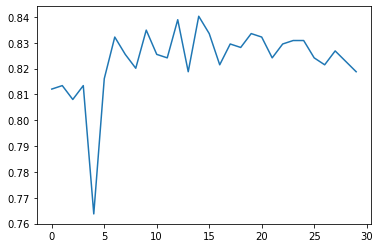

In [23]:
plt.plot(result.history['val_binary_accuracy'])
test_result = model.evaluate([X_test, np.array([counts_aa(xi) for xi in X_test])], y_test)
plt.show()